In [1]:
import os
import numpy as np
import torch as T
import torch.nn as nn
import torch.optim as optim
from torch.distributions.normal import Normal
from torch.nn import functional as F
import matplotlib.pyplot as plt
import gym

D:\miniconda3\envs\cmpe260\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
import a3_gym_env
gym.make('Pendulum-v260')

<OrderEnforcing<PassiveEnvChecker<CustomPendulumEnv<Pendulum-v260>>>>

In [3]:
class ReplayBuffer:
    def __init__(self):
        self.states = []
        self.probs = []
        self.vals = []
        self.actions = []
        self.rewards = []
        self.dones = []
        self.h_prevs = []

    def store_memory(self, state, action, probs, vals, reward, done, h_prevs):
        self.states.append(state)
        self.actions.append(action)
        self.probs.append(probs)
        self.vals.append(vals)
        self.rewards.append(reward)
        self.dones.append(done)
        self.h_prevs.append(h_prevs)

In [4]:
class ActorNetwork(nn.Module):
    def __init__(self, input_dims, output_dims, alpha,
                 hidden_layers = 2, hidden_dims=8, N=1):
        super().__init__()
        # actor network to estimate mean of the gaussian distribution
        self.hidden_dims = hidden_dims
        self.lin1 = nn.Linear(input_dims, hidden_dims)
        self.lstm = nn.LSTM(hidden_dims, hidden_dims)
        self.lin2 = nn.Linear(hidden_dims, output_dims)

        # use constant standard deviation
        log_std = -0.9 * np.ones(output_dims, dtype=np.float32)
        self.log_std = T.nn.Parameter(T.as_tensor(log_std))
        
        self.optimizer = optim.Adam(self.parameters(), lr=alpha/N, eps=1e-05)
        self.device = T.device('cuda:0' if T.cuda.is_available() else 'cpu')
        self.to(self.device)

    def forward(self, state):
        obs, h_prev = state
        m = F.relu(self.lin1(obs))
        m = m.view(-1, 1, self.hidden_dims)
        m, h_next = self.lstm(m, h_prev)
        m = self.lin2(m)
#         m = outputs[-1]
        # return normal distribution
        dist = Normal(m, T.exp(self.log_std))
        return dist, h_next


In [5]:
class CriticNetwork(nn.Module):
    def __init__(self, input_dims, alpha, hidden_layers = 2, hidden_dims=8, N=1):
        super().__init__()
        # crtic network for estimating value
        self.hidden_dims = hidden_dims
        self.lin1 = nn.Linear(input_dims, hidden_dims)
        self.lstm = nn.LSTM(hidden_dims, hidden_dims)
        self.lin2 = nn.Linear(hidden_dims, 1)
        
        self.optimizer = optim.Adam(self.parameters(), lr=alpha/N, eps=1e-05)
        self.device = T.device('cuda:0' if T.cuda.is_available() else 'cpu')
        self.to(self.device)

    def forward(self, state):
        # return value
        obs, h_prev = state
#         import pdb; pdb.set_trace()
        value = F.relu(self.lin1(obs))
        value = value.view(-1, 1, self.hidden_dims)
        value, _ = self.lstm(value, h_prev)
        value = self.lin2(value)
        return value


In [6]:
def choose_action_value(observation, h_prev, actor, critic):
        # convert state to tensor
        state = T.tensor([observation], dtype=T.float).to(actor.device)
        # get gaussian distribution for state
        dist, h_next = actor((state, h_prev))
        # get value for current state
        value = critic((state, h_prev))
        # sample action
        action = dist.sample()

        # get log prob for sampled action (to be used for ratio)
        probs = T.squeeze(dist.log_prob(action)).item()
        action = T.squeeze(action).item()
        value = T.squeeze(value).item()
        # return action, log prob for sampled action and value for current state
        return action, probs, value, h_next

In [7]:
def get_advantages(gamma, lmbda, values, dones, rewards,
                   next_value, next_done, use_gae):
    num_steps = len(rewards)
    if use_gae:
        advantages = np.zeros_like(rewards)
        last_gae_lam = 0
        for t in reversed(range(num_steps)):
            if t == num_steps - 1:
                next_non_terminal = 1.0 - next_done
                next_values = next_value
            else:
                next_non_terminal = 1.0 - dones[t + 1]
                next_values = values[t + 1]
            delta = rewards[t] + gamma * next_values * next_non_terminal - values[t]
            advantages[t] = last_gae_lam = delta + gamma * lmbda * next_non_terminal * last_gae_lam

        returns = advantages + values
    else:
        returns = np.zeros_like(rewards)
        for t in reversed(range(num_steps)):
            if t == num_steps - 1:
                next_non_terminal = 1.0 - next_done
                next_return = next_value
            else:
                next_non_terminal = 1.0 - dones[t + 1]
                next_return = returns[t + 1]
            returns[t] = rewards[t] + gamma * next_non_terminal * next_return
        advantages = returns - values
    return returns, advantages

In [8]:
def combine_trajectories(trajectories):
    c_states = []
    c_actions = []
    c_rewards = []
    c_logprobs = []
    c_values = []
    c_dones = []
    c_returns = []
    c_advantages = []
    c_h_prevs = []
    for k, v in trajectories.items():
        buf, ret, adv = v
        c_states.extend(buf.states)
        c_actions.extend(buf.actions)
        c_rewards.extend(buf.rewards)
        c_logprobs.extend(buf.probs)
        c_values.extend(buf.vals)
        c_dones.extend(buf.dones)
        c_returns.extend(ret)
        c_advantages.extend(adv)
        c_h_prevs.extend(buf.h_prevs)
    return {
        'states': c_states,
        'actions': c_actions,
        'rewards': c_rewards,
        'logprobs': c_logprobs,
        'values': c_values,
        'dones': c_dones,
        'returns': c_returns,
        'advantages': c_advantages,
        'h_prevs': c_h_prevs,
    }

In [9]:
def ppo(N = 1, M = 50, max_trajectory_len = 200, batch_size = 25,
        alpha = 0.0001, hidden_layers = 2, hidden_dims = 8, gamma = 0.99,
        lmbda = 0.95, clip_value = 0.2, use_gae=True, use_clip=True):
    # N = 1 # number of times to collect new trajectories and update actor
    # M = 50 # num of trajectories
    # max_trajectory_len = 200 # trajectory length
    # batch_size = 25 # size for minibatch
    # n_epochs = 30 # number of epochs to optimize loss
    # alpha = 0.00005
    # hidden_layers = 3
    # hidden_dims = 10
    # gamma = 0.8
    # lmbda = 0.95
    # clip_value = 0.2
    # use_gae = True
    # use_clip = True

    env = gym.make('Pendulum-v260')
#     input_dim = env.observation_space.shape
    input_dim = 1
    actor = ActorNetwork(input_dims=input_dim, output_dims=1, alpha=alpha,
                        hidden_layers=hidden_layers, hidden_dims=hidden_dims)
    critic = CriticNetwork(input_dims=input_dim, alpha=alpha,
                        hidden_layers=hidden_layers, hidden_dims=hidden_dims)
    trajectories = {}
    total_loss_list = []
    loss_list = []
    reward_list = []
    observation_list = []
    for n in range(N):
        # collect M trajectories, their returns, and activations
        for i in range(M):
            curr_trajectory = ReplayBuffer()
            # hprev and cell state
            h_prev = (T.zeros([1, 1, hidden_dims], dtype=T.float).to(actor.device),
                      T.zeros([1, 1, hidden_dims], dtype=T.float).to(actor.device))
            observation = env.reset()
            # only use angular velocity
            observation = observation[-1]
            done = False
            steps = 0
            while steps < max_trajectory_len:
                action, prob, val, h_next = choose_action_value(
                    observation, h_prev, actor, critic)
                next_observation, reward, done, info = env.step([action])
                steps +=1
                curr_trajectory.store_memory(
                    observation, action, prob, val, reward, done, h_prev)
                observation = next_observation[-1]
                h_prev = h_next
                if done:
                    break
            # get GAE advantage
            # get value of next_observation
            next_value = critic((T.tensor([observation]).to(actor.device), h_prev))
            # calculate return and advantage
            returns, advantages = get_advantages(
                gamma, lmbda, curr_trajectory.vals, curr_trajectory.dones,
                curr_trajectory.rewards, next_value, done, use_gae)
            trajectories[i] = (curr_trajectory, returns, advantages)

        # combine_trajectories
        c_trajectories = combine_trajectories(trajectories)
        total_steps_taken = len(c_trajectories['states'])
        indicies = np.arange(total_steps_taken)
        np.random.shuffle(indicies)
        
        # optimize loss
        for epoch in range(n_epochs):
            # get batches
            for start in range(0, total_steps_taken, batch_size):
                end = start + batch_size
                # batch indicies
                b_indicies = indicies[start:end]
                new_value = []
                distr = []
                for index in b_indicies:
                    state = T.tensor([c_trajectories['states'][index]]).to(actor.device)
                    hprev = c_trajectories['h_prevs'][index]
                    new_value.append(critic((state, hprev)))
                    distr.append(actor((state, hprev)))
                
                new_value = T.tensor(new_value).to(actor.device)
#                 states = T.tensor(
#                     np.array(c_trajectories['states'])[b_indicies],
#                     dtype=T.float).to(actor.device)         
#                 import pdb; pdb.set_trace()
#                 h_prevs = c_trajectories['h_prevs'][b_indicies]
#                 new_value = critic((states, h_prevs))
#                 distr = actor((states, h_prevs))

                old_log_prob = T.tensor(
                    np.array(c_trajectories['logprobs'])[b_indicies]).to(actor.device)
                actions = T.tensor(
                    np.array(c_trajectories['actions'])[b_indicies],
                    dtype=T.float).to(actor.device)
                new_log_prob = T.tensor([d[0].log_prob(actions[i]) for i, d in enumerate(distr)],
                    dtype=T.float).to(actor.device)

                # Probability ratio
                log_ratio = new_log_prob - old_log_prob
                ratio = log_ratio.exp()

                b_returns = T.tensor(
                    np.array(c_trajectories['returns'])[b_indicies]).to(actor.device)
                b_advantages = T.tensor(
                    np.array(c_trajectories['advantages'])[b_indicies]).to(actor.device)
#                 b_advantages = (b_advantages-b_advantages.mean())/(b_advantages.std()+1e-8)
                # Clipping
                weighted_probs = b_advantages * ratio
                if use_clip:
                    weighted_clipped_probs = T.clamp(ratio, 1-clip_value,
                            1+clip_value)*b_advantages
                    actor_loss = -T.min(
                        weighted_probs, weighted_clipped_probs).mean()
                else:
                    weighted_probs = b_advantages * ratio
                    actor_loss = -(weighted_probs).mean()
                critic_loss = (b_returns-new_value)**2
                critic_loss = critic_loss.mean()

                total_loss = actor_loss + 0.5*critic_loss
                total_loss.requires_grad = True
                print("n: {}, epoch: {}, minibatch no.: {},".format(
                    n, epoch, start//batch_size))
                print("total_loss: {}, actor_loss: {}, critic_loss: {}".format(
                    total_loss, actor_loss, critic_loss))

                total_loss_list.append(total_loss)
                actor.optimizer.zero_grad()
                critic.optimizer.zero_grad()
                total_loss.backward()
                actor.optimizer.step()
                critic.optimizer.step()
#             actor.scheduler.step(actor_loss)
#             critic.scheduler.step(critic_loss)

        # get a single trajectory from actor for plotting
        loss_list.append(total_loss)
        reward_list.append(b_returns.mean())
    
        observation = env.reset()
        h_prev = (T.zeros([1, 1, hidden_dims], dtype=T.float).to(actor.device),
                  T.zeros([1, 1, hidden_dims], dtype=T.float).to(actor.device))
        obs = observation[-1]
        done = False
        steps = 0
        while steps < 200:
            action, prob, val, h_next = choose_action_value(
                obs, h_prev, actor, critic)
            next_observation, reward, done, info = env.step([action])
            observation_list.append(observation)
            observation = next_observation
            obs = observation[-1]
            steps += 1
            h_prev = h_next
            if done:
                break
    
    return total_loss_list, observation_list, loss_list, reward_list

## Clipped and GAE

In [10]:
N = 100 # number of times to collect new trajectories and update actor
M = 1 # num of trajectories
max_trajectory_len = 200 # trajectory length
batch_size = 25 # size for minibatch
n_epochs = 30 # number of epochs to optimize loss
alpha = 0.0001
hidden_layers = 2
hidden_dims = 64
gamma = 0.7
lmbda = 0.9
clip_value = 0.1
use_gae = True
use_clip = True

total_losses, observations, loss_list, reward_list = ppo(
    N, M, max_trajectory_len, batch_size, alpha, hidden_layers, hidden_dims,
    gamma, lmbda, clip_value, use_gae, use_clip)

D:\miniconda3\envs\cmpe260\lib\site-packages\gym\utils\passive_env_checker.py:195: UserWarning: WARN: The result returned by `env.reset()` was not a tuple of the form `(obs, info)`, where `obs` is a observation and `info` is a dictionary containing additional information. Actual type: `<class 'numpy.ndarray'>`
  logger.warn(
D:\miniconda3\envs\cmpe260\lib\site-packages\gym\utils\passive_env_checker.py:219: DeprecationWarning: WARN: Core environment is written in old step API which returns one bool instead of two. It is recommended to rewrite the environment with new step API. 
  logger.deprecation(


n: 0, epoch: 0, minibatch no.: 0,
total_loss: 336.3735215641584, actor_loss: 24.879393844604493, critic_loss: 622.9882554391078
n: 0, epoch: 0, minibatch no.: 1,
total_loss: 343.18621766206775, actor_loss: 25.21119987487793, critic_loss: 635.9500355743796
n: 0, epoch: 0, minibatch no.: 2,
total_loss: 329.60928548100566, actor_loss: 24.50224838256836, critic_loss: 610.2140741968745
n: 0, epoch: 0, minibatch no.: 3,
total_loss: 345.47811086449343, actor_loss: 25.29936103820801, critic_loss: 640.3574996525708
n: 0, epoch: 0, minibatch no.: 4,
total_loss: 334.7022010960642, actor_loss: 24.86425834655762, critic_loss: 619.6758854990131
n: 0, epoch: 0, minibatch no.: 5,
total_loss: 346.6837529187591, actor_loss: 25.335015411376954, critic_loss: 642.6974750147643
n: 0, epoch: 0, minibatch no.: 6,
total_loss: 339.7401751759723, actor_loss: 25.076610946655276, critic_loss: 629.3271284586341
n: 0, epoch: 0, minibatch no.: 7,
total_loss: 345.88459581552024, actor_loss: 25.315756454467774, critic_

n: 0, epoch: 8, minibatch no.: 2,
total_loss: 329.60928548100566, actor_loss: 24.50224838256836, critic_loss: 610.2140741968745
n: 0, epoch: 8, minibatch no.: 3,
total_loss: 345.47811086449343, actor_loss: 25.29936103820801, critic_loss: 640.3574996525708
n: 0, epoch: 8, minibatch no.: 4,
total_loss: 334.7022010960642, actor_loss: 24.86425834655762, critic_loss: 619.6758854990131
n: 0, epoch: 8, minibatch no.: 5,
total_loss: 346.6837529187591, actor_loss: 25.335015411376954, critic_loss: 642.6974750147643
n: 0, epoch: 8, minibatch no.: 6,
total_loss: 339.7401751759723, actor_loss: 25.076610946655276, critic_loss: 629.3271284586341
n: 0, epoch: 8, minibatch no.: 7,
total_loss: 345.88459581552024, actor_loss: 25.315756454467774, critic_loss: 641.137678722105
n: 0, epoch: 9, minibatch no.: 0,
total_loss: 336.3735215641584, actor_loss: 24.879393844604493, critic_loss: 622.9882554391078
n: 0, epoch: 9, minibatch no.: 1,
total_loss: 343.18621766206775, actor_loss: 25.21119987487793, critic_l

n: 0, epoch: 16, minibatch no.: 2,
total_loss: 329.60928548100566, actor_loss: 24.50224838256836, critic_loss: 610.2140741968745
n: 0, epoch: 16, minibatch no.: 3,
total_loss: 345.47811086449343, actor_loss: 25.29936103820801, critic_loss: 640.3574996525708
n: 0, epoch: 16, minibatch no.: 4,
total_loss: 334.7022010960642, actor_loss: 24.86425834655762, critic_loss: 619.6758854990131
n: 0, epoch: 16, minibatch no.: 5,
total_loss: 346.6837529187591, actor_loss: 25.335015411376954, critic_loss: 642.6974750147643
n: 0, epoch: 16, minibatch no.: 6,
total_loss: 339.7401751759723, actor_loss: 25.076610946655276, critic_loss: 629.3271284586341
n: 0, epoch: 16, minibatch no.: 7,
total_loss: 345.88459581552024, actor_loss: 25.315756454467774, critic_loss: 641.137678722105
n: 0, epoch: 17, minibatch no.: 0,
total_loss: 336.3735215641584, actor_loss: 24.879393844604493, critic_loss: 622.9882554391078
n: 0, epoch: 17, minibatch no.: 1,
total_loss: 343.18621766206775, actor_loss: 25.21119987487793, 

n: 0, epoch: 24, minibatch no.: 6,
total_loss: 339.7401751759723, actor_loss: 25.076610946655276, critic_loss: 629.3271284586341
n: 0, epoch: 24, minibatch no.: 7,
total_loss: 345.88459581552024, actor_loss: 25.315756454467774, critic_loss: 641.137678722105
n: 0, epoch: 25, minibatch no.: 0,
total_loss: 336.3735215641584, actor_loss: 24.879393844604493, critic_loss: 622.9882554391078
n: 0, epoch: 25, minibatch no.: 1,
total_loss: 343.18621766206775, actor_loss: 25.21119987487793, critic_loss: 635.9500355743796
n: 0, epoch: 25, minibatch no.: 2,
total_loss: 329.60928548100566, actor_loss: 24.50224838256836, critic_loss: 610.2140741968745
n: 0, epoch: 25, minibatch no.: 3,
total_loss: 345.47811086449343, actor_loss: 25.29936103820801, critic_loss: 640.3574996525708
n: 0, epoch: 25, minibatch no.: 4,
total_loss: 334.7022010960642, actor_loss: 24.86425834655762, critic_loss: 619.6758854990131
n: 0, epoch: 25, minibatch no.: 5,
total_loss: 346.6837529187591, actor_loss: 25.335015411376954, 

n: 1, epoch: 3, minibatch no.: 3,
total_loss: 191.00002850230842, actor_loss: 17.00786798477173, critic_loss: 347.9843210350734
n: 1, epoch: 3, minibatch no.: 4,
total_loss: 184.72025038884962, actor_loss: 17.038206539154054, critic_loss: 335.3640876993911
n: 1, epoch: 3, minibatch no.: 5,
total_loss: 177.4663508724877, actor_loss: 16.461952743530272, critic_loss: 322.00879625791487
n: 1, epoch: 3, minibatch no.: 6,
total_loss: 161.81946594685658, actor_loss: 15.758087940216065, critic_loss: 292.12275601328105
n: 1, epoch: 3, minibatch no.: 7,
total_loss: 222.75015533746904, actor_loss: 19.21931251525879, critic_loss: 407.0616856444205
n: 1, epoch: 4, minibatch no.: 0,
total_loss: 180.6444785519613, actor_loss: 17.300235557556153, critic_loss: 326.68848598881027
n: 1, epoch: 4, minibatch no.: 1,
total_loss: 177.42452075461307, actor_loss: 16.41246168136597, critic_loss: 322.0241181464942
n: 1, epoch: 4, minibatch no.: 2,
total_loss: 219.64202856533564, actor_loss: 19.13249195098877, cr

n: 1, epoch: 11, minibatch no.: 5,
total_loss: 177.4663508724877, actor_loss: 16.461952743530272, critic_loss: 322.00879625791487
n: 1, epoch: 11, minibatch no.: 6,
total_loss: 161.81946594685658, actor_loss: 15.758087940216065, critic_loss: 292.12275601328105
n: 1, epoch: 11, minibatch no.: 7,
total_loss: 222.75015533746904, actor_loss: 19.21931251525879, critic_loss: 407.0616856444205
n: 1, epoch: 12, minibatch no.: 0,
total_loss: 180.6444785519613, actor_loss: 17.300235557556153, critic_loss: 326.68848598881027
n: 1, epoch: 12, minibatch no.: 1,
total_loss: 177.42452075461307, actor_loss: 16.41246168136597, critic_loss: 322.0241181464942
n: 1, epoch: 12, minibatch no.: 2,
total_loss: 219.64202856533564, actor_loss: 19.13249195098877, critic_loss: 401.01907322869374
n: 1, epoch: 12, minibatch no.: 3,
total_loss: 191.00002850230842, actor_loss: 17.00786798477173, critic_loss: 347.9843210350734
n: 1, epoch: 12, minibatch no.: 4,
total_loss: 184.72025038884962, actor_loss: 17.0382065391

n: 1, epoch: 19, minibatch no.: 6,
total_loss: 161.81946594685658, actor_loss: 15.758087940216065, critic_loss: 292.12275601328105
n: 1, epoch: 19, minibatch no.: 7,
total_loss: 222.75015533746904, actor_loss: 19.21931251525879, critic_loss: 407.0616856444205
n: 1, epoch: 20, minibatch no.: 0,
total_loss: 180.6444785519613, actor_loss: 17.300235557556153, critic_loss: 326.68848598881027
n: 1, epoch: 20, minibatch no.: 1,
total_loss: 177.42452075461307, actor_loss: 16.41246168136597, critic_loss: 322.0241181464942
n: 1, epoch: 20, minibatch no.: 2,
total_loss: 219.64202856533564, actor_loss: 19.13249195098877, critic_loss: 401.01907322869374
n: 1, epoch: 20, minibatch no.: 3,
total_loss: 191.00002850230842, actor_loss: 17.00786798477173, critic_loss: 347.9843210350734
n: 1, epoch: 20, minibatch no.: 4,
total_loss: 184.72025038884962, actor_loss: 17.038206539154054, critic_loss: 335.3640876993911
n: 1, epoch: 20, minibatch no.: 5,
total_loss: 177.4663508724877, actor_loss: 16.46195274353

n: 1, epoch: 28, minibatch no.: 1,
total_loss: 177.42452075461307, actor_loss: 16.41246168136597, critic_loss: 322.0241181464942
n: 1, epoch: 28, minibatch no.: 2,
total_loss: 219.64202856533564, actor_loss: 19.13249195098877, critic_loss: 401.01907322869374
n: 1, epoch: 28, minibatch no.: 3,
total_loss: 191.00002850230842, actor_loss: 17.00786798477173, critic_loss: 347.9843210350734
n: 1, epoch: 28, minibatch no.: 4,
total_loss: 184.72025038884962, actor_loss: 17.038206539154054, critic_loss: 335.3640876993911
n: 1, epoch: 28, minibatch no.: 5,
total_loss: 177.4663508724877, actor_loss: 16.461952743530272, critic_loss: 322.00879625791487
n: 1, epoch: 28, minibatch no.: 6,
total_loss: 161.81946594685658, actor_loss: 15.758087940216065, critic_loss: 292.12275601328105
n: 1, epoch: 28, minibatch no.: 7,
total_loss: 222.75015533746904, actor_loss: 19.21931251525879, critic_loss: 407.0616856444205
n: 1, epoch: 29, minibatch no.: 0,
total_loss: 180.6444785519613, actor_loss: 17.30023555755

n: 2, epoch: 6, minibatch no.: 3,
total_loss: 201.98255575372795, actor_loss: 18.24790132522583, critic_loss: 367.46930885700425
n: 2, epoch: 6, minibatch no.: 4,
total_loss: 173.0312927113745, actor_loss: 16.47274703979492, critic_loss: 313.1170913431592
n: 2, epoch: 6, minibatch no.: 5,
total_loss: 180.30001827316119, actor_loss: 16.943826332092286, critic_loss: 326.7123838821378
n: 2, epoch: 6, minibatch no.: 6,
total_loss: 210.39947103174927, actor_loss: 18.82626117706299, critic_loss: 383.1464197093726
n: 2, epoch: 6, minibatch no.: 7,
total_loss: 193.97460644753033, actor_loss: 17.99934638977051, critic_loss: 351.9505201155197
n: 2, epoch: 7, minibatch no.: 0,
total_loss: 157.8673495703183, actor_loss: 15.898660697937013, critic_loss: 283.9373777447626
n: 2, epoch: 7, minibatch no.: 1,
total_loss: 200.8984205984456, actor_loss: 18.15103828430176, critic_loss: 365.49476462828767
n: 2, epoch: 7, minibatch no.: 2,
total_loss: 193.98549342397226, actor_loss: 17.976343154907227, criti

n: 2, epoch: 14, minibatch no.: 3,
total_loss: 201.98255575372795, actor_loss: 18.24790132522583, critic_loss: 367.46930885700425
n: 2, epoch: 14, minibatch no.: 4,
total_loss: 173.0312927113745, actor_loss: 16.47274703979492, critic_loss: 313.1170913431592
n: 2, epoch: 14, minibatch no.: 5,
total_loss: 180.30001827316119, actor_loss: 16.943826332092286, critic_loss: 326.7123838821378
n: 2, epoch: 14, minibatch no.: 6,
total_loss: 210.39947103174927, actor_loss: 18.82626117706299, critic_loss: 383.1464197093726
n: 2, epoch: 14, minibatch no.: 7,
total_loss: 193.97460644753033, actor_loss: 17.99934638977051, critic_loss: 351.9505201155197
n: 2, epoch: 15, minibatch no.: 0,
total_loss: 157.8673495703183, actor_loss: 15.898660697937013, critic_loss: 283.9373777447626
n: 2, epoch: 15, minibatch no.: 1,
total_loss: 200.8984205984456, actor_loss: 18.15103828430176, critic_loss: 365.49476462828767
n: 2, epoch: 15, minibatch no.: 2,
total_loss: 193.98549342397226, actor_loss: 17.97634315490722

n: 2, epoch: 22, minibatch no.: 3,
total_loss: 201.98255575372795, actor_loss: 18.24790132522583, critic_loss: 367.46930885700425
n: 2, epoch: 22, minibatch no.: 4,
total_loss: 173.0312927113745, actor_loss: 16.47274703979492, critic_loss: 313.1170913431592
n: 2, epoch: 22, minibatch no.: 5,
total_loss: 180.30001827316119, actor_loss: 16.943826332092286, critic_loss: 326.7123838821378
n: 2, epoch: 22, minibatch no.: 6,
total_loss: 210.39947103174927, actor_loss: 18.82626117706299, critic_loss: 383.1464197093726
n: 2, epoch: 22, minibatch no.: 7,
total_loss: 193.97460644753033, actor_loss: 17.99934638977051, critic_loss: 351.9505201155197
n: 2, epoch: 23, minibatch no.: 0,
total_loss: 157.8673495703183, actor_loss: 15.898660697937013, critic_loss: 283.9373777447626
n: 2, epoch: 23, minibatch no.: 1,
total_loss: 200.8984205984456, actor_loss: 18.15103828430176, critic_loss: 365.49476462828767
n: 2, epoch: 23, minibatch no.: 2,
total_loss: 193.98549342397226, actor_loss: 17.97634315490722

n: 3, epoch: 0, minibatch no.: 5,
total_loss: 191.48032070483976, actor_loss: 17.64377695083618, critic_loss: 347.67308750800714
n: 3, epoch: 0, minibatch no.: 6,
total_loss: 205.02643195420228, actor_loss: 18.77584484100342, critic_loss: 372.5011742263977
n: 3, epoch: 0, minibatch no.: 7,
total_loss: 182.8191702403126, actor_loss: 17.07825830459595, critic_loss: 331.4818238714333
n: 3, epoch: 1, minibatch no.: 0,
total_loss: 208.93849534276947, actor_loss: 18.983079338073733, critic_loss: 379.91083200939147
n: 3, epoch: 1, minibatch no.: 1,
total_loss: 191.66811199091762, actor_loss: 17.589113845825196, critic_loss: 348.1579962901848
n: 3, epoch: 1, minibatch no.: 2,
total_loss: 186.74219186281724, actor_loss: 17.82008659362793, critic_loss: 337.8442105383786
n: 3, epoch: 1, minibatch no.: 3,
total_loss: 240.63374287836618, actor_loss: 20.214387397766114, critic_loss: 440.83871096120015
n: 3, epoch: 1, minibatch no.: 4,
total_loss: 234.71565596193506, actor_loss: 20.26436897277832, cr

n: 3, epoch: 8, minibatch no.: 5,
total_loss: 191.48032070483976, actor_loss: 17.64377695083618, critic_loss: 347.67308750800714
n: 3, epoch: 8, minibatch no.: 6,
total_loss: 205.02643195420228, actor_loss: 18.77584484100342, critic_loss: 372.5011742263977
n: 3, epoch: 8, minibatch no.: 7,
total_loss: 182.8191702403126, actor_loss: 17.07825830459595, critic_loss: 331.4818238714333
n: 3, epoch: 9, minibatch no.: 0,
total_loss: 208.93849534276947, actor_loss: 18.983079338073733, critic_loss: 379.91083200939147
n: 3, epoch: 9, minibatch no.: 1,
total_loss: 191.66811199091762, actor_loss: 17.589113845825196, critic_loss: 348.1579962901848
n: 3, epoch: 9, minibatch no.: 2,
total_loss: 186.74219186281724, actor_loss: 17.82008659362793, critic_loss: 337.8442105383786
n: 3, epoch: 9, minibatch no.: 3,
total_loss: 240.63374287836618, actor_loss: 20.214387397766114, critic_loss: 440.83871096120015
n: 3, epoch: 9, minibatch no.: 4,
total_loss: 234.71565596193506, actor_loss: 20.26436897277832, cr

n: 3, epoch: 17, minibatch no.: 2,
total_loss: 186.74219186281724, actor_loss: 17.82008659362793, critic_loss: 337.8442105383786
n: 3, epoch: 17, minibatch no.: 3,
total_loss: 240.63374287836618, actor_loss: 20.214387397766114, critic_loss: 440.83871096120015
n: 3, epoch: 17, minibatch no.: 4,
total_loss: 234.71565596193506, actor_loss: 20.26436897277832, critic_loss: 428.90257397831346
n: 3, epoch: 17, minibatch no.: 5,
total_loss: 191.48032070483976, actor_loss: 17.64377695083618, critic_loss: 347.67308750800714
n: 3, epoch: 17, minibatch no.: 6,
total_loss: 205.02643195420228, actor_loss: 18.77584484100342, critic_loss: 372.5011742263977
n: 3, epoch: 17, minibatch no.: 7,
total_loss: 182.8191702403126, actor_loss: 17.07825830459595, critic_loss: 331.4818238714333
n: 3, epoch: 18, minibatch no.: 0,
total_loss: 208.93849534276947, actor_loss: 18.983079338073733, critic_loss: 379.91083200939147
n: 3, epoch: 18, minibatch no.: 1,
total_loss: 191.66811199091762, actor_loss: 17.5891138458

n: 3, epoch: 25, minibatch no.: 5,
total_loss: 191.48032070483976, actor_loss: 17.64377695083618, critic_loss: 347.67308750800714
n: 3, epoch: 25, minibatch no.: 6,
total_loss: 205.02643195420228, actor_loss: 18.77584484100342, critic_loss: 372.5011742263977
n: 3, epoch: 25, minibatch no.: 7,
total_loss: 182.8191702403126, actor_loss: 17.07825830459595, critic_loss: 331.4818238714333
n: 3, epoch: 26, minibatch no.: 0,
total_loss: 208.93849534276947, actor_loss: 18.983079338073733, critic_loss: 379.91083200939147
n: 3, epoch: 26, minibatch no.: 1,
total_loss: 191.66811199091762, actor_loss: 17.589113845825196, critic_loss: 348.1579962901848
n: 3, epoch: 26, minibatch no.: 2,
total_loss: 186.74219186281724, actor_loss: 17.82008659362793, critic_loss: 337.8442105383786
n: 3, epoch: 26, minibatch no.: 3,
total_loss: 240.63374287836618, actor_loss: 20.214387397766114, critic_loss: 440.83871096120015
n: 3, epoch: 26, minibatch no.: 4,
total_loss: 234.71565596193506, actor_loss: 20.2643689727

n: 4, epoch: 4, minibatch no.: 0,
total_loss: 125.89118956076334, actor_loss: 13.52250137090683, critic_loss: 224.737376379713
n: 4, epoch: 4, minibatch no.: 1,
total_loss: 174.3901209230732, actor_loss: 15.990024738311767, critic_loss: 316.80019236952285
n: 4, epoch: 4, minibatch no.: 2,
total_loss: 213.68857464931872, actor_loss: 17.976643476486206, critic_loss: 391.42386234566504
n: 4, epoch: 4, minibatch no.: 3,
total_loss: 151.15340806622348, actor_loss: 14.05262803554535, critic_loss: 274.20156006135625
n: 4, epoch: 4, minibatch no.: 4,
total_loss: 146.95805477880234, actor_loss: 13.941423015594482, critic_loss: 266.0332635264157
n: 4, epoch: 4, minibatch no.: 5,
total_loss: 147.4118685680272, actor_loss: 13.611607899665833, critic_loss: 267.6005213367227
n: 4, epoch: 4, minibatch no.: 6,
total_loss: 180.5649722453912, actor_loss: 16.108332624435427, critic_loss: 328.91327924191154
n: 4, epoch: 4, minibatch no.: 7,
total_loss: 166.8851176704027, actor_loss: 15.23464921951294, cri

n: 4, epoch: 12, minibatch no.: 4,
total_loss: 146.95805477880234, actor_loss: 13.941423015594482, critic_loss: 266.0332635264157
n: 4, epoch: 12, minibatch no.: 5,
total_loss: 147.4118685680272, actor_loss: 13.611607899665833, critic_loss: 267.6005213367227
n: 4, epoch: 12, minibatch no.: 6,
total_loss: 180.5649722453912, actor_loss: 16.108332624435427, critic_loss: 328.91327924191154
n: 4, epoch: 12, minibatch no.: 7,
total_loss: 166.8851176704027, actor_loss: 15.23464921951294, critic_loss: 303.30093690177955
n: 4, epoch: 13, minibatch no.: 0,
total_loss: 125.89118956076334, actor_loss: 13.52250137090683, critic_loss: 224.737376379713
n: 4, epoch: 13, minibatch no.: 1,
total_loss: 174.3901209230732, actor_loss: 15.990024738311767, critic_loss: 316.80019236952285
n: 4, epoch: 13, minibatch no.: 2,
total_loss: 213.68857464931872, actor_loss: 17.976643476486206, critic_loss: 391.42386234566504
n: 4, epoch: 13, minibatch no.: 3,
total_loss: 151.15340806622348, actor_loss: 14.05262803554

n: 4, epoch: 20, minibatch no.: 5,
total_loss: 147.4118685680272, actor_loss: 13.611607899665833, critic_loss: 267.6005213367227
n: 4, epoch: 20, minibatch no.: 6,
total_loss: 180.5649722453912, actor_loss: 16.108332624435427, critic_loss: 328.91327924191154
n: 4, epoch: 20, minibatch no.: 7,
total_loss: 166.8851176704027, actor_loss: 15.23464921951294, critic_loss: 303.30093690177955
n: 4, epoch: 21, minibatch no.: 0,
total_loss: 125.89118956076334, actor_loss: 13.52250137090683, critic_loss: 224.737376379713
n: 4, epoch: 21, minibatch no.: 1,
total_loss: 174.3901209230732, actor_loss: 15.990024738311767, critic_loss: 316.80019236952285
n: 4, epoch: 21, minibatch no.: 2,
total_loss: 213.68857464931872, actor_loss: 17.976643476486206, critic_loss: 391.42386234566504
n: 4, epoch: 21, minibatch no.: 3,
total_loss: 151.15340806622348, actor_loss: 14.05262803554535, critic_loss: 274.20156006135625
n: 4, epoch: 21, minibatch no.: 4,
total_loss: 146.95805477880234, actor_loss: 13.94142301559

n: 4, epoch: 28, minibatch no.: 5,
total_loss: 147.4118685680272, actor_loss: 13.611607899665833, critic_loss: 267.6005213367227
n: 4, epoch: 28, minibatch no.: 6,
total_loss: 180.5649722453912, actor_loss: 16.108332624435427, critic_loss: 328.91327924191154
n: 4, epoch: 28, minibatch no.: 7,
total_loss: 166.8851176704027, actor_loss: 15.23464921951294, critic_loss: 303.30093690177955
n: 4, epoch: 29, minibatch no.: 0,
total_loss: 125.89118956076334, actor_loss: 13.52250137090683, critic_loss: 224.737376379713
n: 4, epoch: 29, minibatch no.: 1,
total_loss: 174.3901209230732, actor_loss: 15.990024738311767, critic_loss: 316.80019236952285
n: 4, epoch: 29, minibatch no.: 2,
total_loss: 213.68857464931872, actor_loss: 17.976643476486206, critic_loss: 391.42386234566504
n: 4, epoch: 29, minibatch no.: 3,
total_loss: 151.15340806622348, actor_loss: 14.05262803554535, critic_loss: 274.20156006135625
n: 4, epoch: 29, minibatch no.: 4,
total_loss: 146.95805477880234, actor_loss: 13.94142301559

n: 5, epoch: 6, minibatch no.: 7,
total_loss: 288.0982713690336, actor_loss: 22.932102508544922, critic_loss: 530.3323377209774
n: 5, epoch: 7, minibatch no.: 0,
total_loss: 283.0138380790829, actor_loss: 22.74629898071289, critic_loss: 520.5350781967401
n: 5, epoch: 7, minibatch no.: 1,
total_loss: 302.07223143448, actor_loss: 23.54013282775879, critic_loss: 557.0641972134424
n: 5, epoch: 7, minibatch no.: 2,
total_loss: 282.52123252530185, actor_loss: 22.69746246337891, critic_loss: 519.6475401238459
n: 5, epoch: 7, minibatch no.: 3,
total_loss: 272.08585606520506, actor_loss: 22.272736892700195, critic_loss: 499.62623834500977
n: 5, epoch: 7, minibatch no.: 4,
total_loss: 294.4183234395342, actor_loss: 23.208093795776367, critic_loss: 542.4204592875157
n: 5, epoch: 7, minibatch no.: 5,
total_loss: 269.7529426703792, actor_loss: 22.035691871643067, critic_loss: 495.43450159747226
n: 5, epoch: 7, minibatch no.: 6,
total_loss: 288.22997864063666, actor_loss: 22.9397208404541, critic_lo

n: 5, epoch: 15, minibatch no.: 3,
total_loss: 272.08585606520506, actor_loss: 22.272736892700195, critic_loss: 499.62623834500977
n: 5, epoch: 15, minibatch no.: 4,
total_loss: 294.4183234395342, actor_loss: 23.208093795776367, critic_loss: 542.4204592875157
n: 5, epoch: 15, minibatch no.: 5,
total_loss: 269.7529426703792, actor_loss: 22.035691871643067, critic_loss: 495.43450159747226
n: 5, epoch: 15, minibatch no.: 6,
total_loss: 288.22997864063666, actor_loss: 22.9397208404541, critic_loss: 530.5805156003651
n: 5, epoch: 15, minibatch no.: 7,
total_loss: 288.0982713690336, actor_loss: 22.932102508544922, critic_loss: 530.3323377209774
n: 5, epoch: 16, minibatch no.: 0,
total_loss: 283.0138380790829, actor_loss: 22.74629898071289, critic_loss: 520.5350781967401
n: 5, epoch: 16, minibatch no.: 1,
total_loss: 302.07223143448, actor_loss: 23.54013282775879, critic_loss: 557.0641972134424
n: 5, epoch: 16, minibatch no.: 2,
total_loss: 282.52123252530185, actor_loss: 22.69746246337891, c

n: 5, epoch: 23, minibatch no.: 7,
total_loss: 288.0982713690336, actor_loss: 22.932102508544922, critic_loss: 530.3323377209774
n: 5, epoch: 24, minibatch no.: 0,
total_loss: 283.0138380790829, actor_loss: 22.74629898071289, critic_loss: 520.5350781967401
n: 5, epoch: 24, minibatch no.: 1,
total_loss: 302.07223143448, actor_loss: 23.54013282775879, critic_loss: 557.0641972134424
n: 5, epoch: 24, minibatch no.: 2,
total_loss: 282.52123252530185, actor_loss: 22.69746246337891, critic_loss: 519.6475401238459
n: 5, epoch: 24, minibatch no.: 3,
total_loss: 272.08585606520506, actor_loss: 22.272736892700195, critic_loss: 499.62623834500977
n: 5, epoch: 24, minibatch no.: 4,
total_loss: 294.4183234395342, actor_loss: 23.208093795776367, critic_loss: 542.4204592875157
n: 5, epoch: 24, minibatch no.: 5,
total_loss: 269.7529426703792, actor_loss: 22.035691871643067, critic_loss: 495.43450159747226
n: 5, epoch: 24, minibatch no.: 6,
total_loss: 288.22997864063666, actor_loss: 22.9397208404541, c

n: 6, epoch: 2, minibatch no.: 0,
total_loss: 201.09968178611055, actor_loss: 17.749430847167968, critic_loss: 366.7005018778852
n: 6, epoch: 2, minibatch no.: 1,
total_loss: 186.89978672293057, actor_loss: 17.39952266693115, critic_loss: 339.00052811199885
n: 6, epoch: 2, minibatch no.: 2,
total_loss: 182.02506286106683, actor_loss: 16.69800979614258, critic_loss: 330.6541061298485
n: 6, epoch: 2, minibatch no.: 3,
total_loss: 173.20897436951728, actor_loss: 16.352484378814697, critic_loss: 313.71297998140517
n: 6, epoch: 2, minibatch no.: 4,
total_loss: 191.06558831014897, actor_loss: 17.10309313774109, critic_loss: 347.92499034481574
n: 6, epoch: 2, minibatch no.: 5,
total_loss: 172.5095119856313, actor_loss: 16.73418073654175, critic_loss: 311.55066249817907
n: 6, epoch: 2, minibatch no.: 6,
total_loss: 164.14223640576785, actor_loss: 16.047031574249267, critic_loss: 296.19040966303714
n: 6, epoch: 2, minibatch no.: 7,
total_loss: 219.845339753022, actor_loss: 18.609326038360596, c

n: 6, epoch: 10, minibatch no.: 0,
total_loss: 201.09968178611055, actor_loss: 17.749430847167968, critic_loss: 366.7005018778852
n: 6, epoch: 10, minibatch no.: 1,
total_loss: 186.89978672293057, actor_loss: 17.39952266693115, critic_loss: 339.00052811199885
n: 6, epoch: 10, minibatch no.: 2,
total_loss: 182.02506286106683, actor_loss: 16.69800979614258, critic_loss: 330.6541061298485
n: 6, epoch: 10, minibatch no.: 3,
total_loss: 173.20897436951728, actor_loss: 16.352484378814697, critic_loss: 313.71297998140517
n: 6, epoch: 10, minibatch no.: 4,
total_loss: 191.06558831014897, actor_loss: 17.10309313774109, critic_loss: 347.92499034481574
n: 6, epoch: 10, minibatch no.: 5,
total_loss: 172.5095119856313, actor_loss: 16.73418073654175, critic_loss: 311.55066249817907
n: 6, epoch: 10, minibatch no.: 6,
total_loss: 164.14223640576785, actor_loss: 16.047031574249267, critic_loss: 296.19040966303714
n: 6, epoch: 10, minibatch no.: 7,
total_loss: 219.845339753022, actor_loss: 18.6093260383

n: 6, epoch: 18, minibatch no.: 5,
total_loss: 172.5095119856313, actor_loss: 16.73418073654175, critic_loss: 311.55066249817907
n: 6, epoch: 18, minibatch no.: 6,
total_loss: 164.14223640576785, actor_loss: 16.047031574249267, critic_loss: 296.19040966303714
n: 6, epoch: 18, minibatch no.: 7,
total_loss: 219.845339753022, actor_loss: 18.609326038360596, critic_loss: 402.4720274293228
n: 6, epoch: 19, minibatch no.: 0,
total_loss: 201.09968178611055, actor_loss: 17.749430847167968, critic_loss: 366.7005018778852
n: 6, epoch: 19, minibatch no.: 1,
total_loss: 186.89978672293057, actor_loss: 17.39952266693115, critic_loss: 339.00052811199885
n: 6, epoch: 19, minibatch no.: 2,
total_loss: 182.02506286106683, actor_loss: 16.69800979614258, critic_loss: 330.6541061298485
n: 6, epoch: 19, minibatch no.: 3,
total_loss: 173.20897436951728, actor_loss: 16.352484378814697, critic_loss: 313.71297998140517
n: 6, epoch: 19, minibatch no.: 4,
total_loss: 191.06558831014897, actor_loss: 17.1030931377

n: 6, epoch: 26, minibatch no.: 5,
total_loss: 172.5095119856313, actor_loss: 16.73418073654175, critic_loss: 311.55066249817907
n: 6, epoch: 26, minibatch no.: 6,
total_loss: 164.14223640576785, actor_loss: 16.047031574249267, critic_loss: 296.19040966303714
n: 6, epoch: 26, minibatch no.: 7,
total_loss: 219.845339753022, actor_loss: 18.609326038360596, critic_loss: 402.4720274293228
n: 6, epoch: 27, minibatch no.: 0,
total_loss: 201.09968178611055, actor_loss: 17.749430847167968, critic_loss: 366.7005018778852
n: 6, epoch: 27, minibatch no.: 1,
total_loss: 186.89978672293057, actor_loss: 17.39952266693115, critic_loss: 339.00052811199885
n: 6, epoch: 27, minibatch no.: 2,
total_loss: 182.02506286106683, actor_loss: 16.69800979614258, critic_loss: 330.6541061298485
n: 6, epoch: 27, minibatch no.: 3,
total_loss: 173.20897436951728, actor_loss: 16.352484378814697, critic_loss: 313.71297998140517
n: 6, epoch: 27, minibatch no.: 4,
total_loss: 191.06558831014897, actor_loss: 17.1030931377

n: 7, epoch: 5, minibatch no.: 1,
total_loss: 294.5960700711366, actor_loss: 23.139875411987305, critic_loss: 542.9123893182986
n: 7, epoch: 5, minibatch no.: 2,
total_loss: 300.15532541956037, actor_loss: 23.412944831848144, critic_loss: 553.4847611754244
n: 7, epoch: 5, minibatch no.: 3,
total_loss: 293.50564412075096, actor_loss: 22.970444793701173, critic_loss: 541.0703986540996
n: 7, epoch: 5, minibatch no.: 4,
total_loss: 300.0481297390877, actor_loss: 23.40429298400879, critic_loss: 553.2876735101578
n: 7, epoch: 5, minibatch no.: 5,
total_loss: 293.0289285773174, actor_loss: 23.06789352416992, critic_loss: 539.922070106295
n: 7, epoch: 5, minibatch no.: 6,
total_loss: 301.9142321877919, actor_loss: 23.437989349365235, critic_loss: 556.9524856768534
n: 7, epoch: 5, minibatch no.: 7,
total_loss: 304.18333394962474, actor_loss: 23.552531051635743, critic_loss: 561.261605795978
n: 7, epoch: 6, minibatch no.: 0,
total_loss: 298.9323533694917, actor_loss: 23.320715255737305, critic_l

n: 7, epoch: 13, minibatch no.: 6,
total_loss: 301.9142321877919, actor_loss: 23.437989349365235, critic_loss: 556.9524856768534
n: 7, epoch: 13, minibatch no.: 7,
total_loss: 304.18333394962474, actor_loss: 23.552531051635743, critic_loss: 561.261605795978
n: 7, epoch: 14, minibatch no.: 0,
total_loss: 298.9323533694917, actor_loss: 23.320715255737305, critic_loss: 551.2232762275088
n: 7, epoch: 14, minibatch no.: 1,
total_loss: 294.5960700711366, actor_loss: 23.139875411987305, critic_loss: 542.9123893182986
n: 7, epoch: 14, minibatch no.: 2,
total_loss: 300.15532541956037, actor_loss: 23.412944831848144, critic_loss: 553.4847611754244
n: 7, epoch: 14, minibatch no.: 3,
total_loss: 293.50564412075096, actor_loss: 22.970444793701173, critic_loss: 541.0703986540996
n: 7, epoch: 14, minibatch no.: 4,
total_loss: 300.0481297390877, actor_loss: 23.40429298400879, critic_loss: 553.2876735101578
n: 7, epoch: 14, minibatch no.: 5,
total_loss: 293.0289285773174, actor_loss: 23.06789352416992,

n: 7, epoch: 21, minibatch no.: 6,
total_loss: 301.9142321877919, actor_loss: 23.437989349365235, critic_loss: 556.9524856768534
n: 7, epoch: 21, minibatch no.: 7,
total_loss: 304.18333394962474, actor_loss: 23.552531051635743, critic_loss: 561.261605795978
n: 7, epoch: 22, minibatch no.: 0,
total_loss: 298.9323533694917, actor_loss: 23.320715255737305, critic_loss: 551.2232762275088
n: 7, epoch: 22, minibatch no.: 1,
total_loss: 294.5960700711366, actor_loss: 23.139875411987305, critic_loss: 542.9123893182986
n: 7, epoch: 22, minibatch no.: 2,
total_loss: 300.15532541956037, actor_loss: 23.412944831848144, critic_loss: 553.4847611754244
n: 7, epoch: 22, minibatch no.: 3,
total_loss: 293.50564412075096, actor_loss: 22.970444793701173, critic_loss: 541.0703986540996
n: 7, epoch: 22, minibatch no.: 4,
total_loss: 300.0481297390877, actor_loss: 23.40429298400879, critic_loss: 553.2876735101578
n: 7, epoch: 22, minibatch no.: 5,
total_loss: 293.0289285773174, actor_loss: 23.06789352416992,

n: 8, epoch: 0, minibatch no.: 0,
total_loss: 329.6956715124679, actor_loss: 24.67429557800293, critic_loss: 610.0427518689299
n: 8, epoch: 0, minibatch no.: 1,
total_loss: 344.6394249112314, actor_loss: 25.249165878295898, critic_loss: 638.780518065871
n: 8, epoch: 0, minibatch no.: 2,
total_loss: 325.46676525507337, actor_loss: 24.324557838439944, critic_loss: 602.2844148332669
n: 8, epoch: 0, minibatch no.: 3,
total_loss: 316.6584459157197, actor_loss: 24.084799728393556, critic_loss: 585.1472923746524
n: 8, epoch: 0, minibatch no.: 4,
total_loss: 331.7706332538149, actor_loss: 24.74037109375, critic_loss: 614.0605243201297
n: 8, epoch: 0, minibatch no.: 5,
total_loss: 339.463068752912, actor_loss: 25.059470596313478, critic_loss: 628.8071963131971
n: 8, epoch: 0, minibatch no.: 6,
total_loss: 338.9607703656664, actor_loss: 25.037430267333985, critic_loss: 627.8466801966648
n: 8, epoch: 0, minibatch no.: 7,
total_loss: 344.1345173236769, actor_loss: 25.2308406829834, critic_loss: 63

n: 8, epoch: 8, minibatch no.: 6,
total_loss: 338.9607703656664, actor_loss: 25.037430267333985, critic_loss: 627.8466801966648
n: 8, epoch: 8, minibatch no.: 7,
total_loss: 344.1345173236769, actor_loss: 25.2308406829834, critic_loss: 637.807353281387
n: 8, epoch: 9, minibatch no.: 0,
total_loss: 329.6956715124679, actor_loss: 24.67429557800293, critic_loss: 610.0427518689299
n: 8, epoch: 9, minibatch no.: 1,
total_loss: 344.6394249112314, actor_loss: 25.249165878295898, critic_loss: 638.780518065871
n: 8, epoch: 9, minibatch no.: 2,
total_loss: 325.46676525507337, actor_loss: 24.324557838439944, critic_loss: 602.2844148332669
n: 8, epoch: 9, minibatch no.: 3,
total_loss: 316.6584459157197, actor_loss: 24.084799728393556, critic_loss: 585.1472923746524
n: 8, epoch: 9, minibatch no.: 4,
total_loss: 331.7706332538149, actor_loss: 24.74037109375, critic_loss: 614.0605243201297
n: 8, epoch: 9, minibatch no.: 5,
total_loss: 339.463068752912, actor_loss: 25.059470596313478, critic_loss: 628

n: 8, epoch: 17, minibatch no.: 1,
total_loss: 344.6394249112314, actor_loss: 25.249165878295898, critic_loss: 638.780518065871
n: 8, epoch: 17, minibatch no.: 2,
total_loss: 325.46676525507337, actor_loss: 24.324557838439944, critic_loss: 602.2844148332669
n: 8, epoch: 17, minibatch no.: 3,
total_loss: 316.6584459157197, actor_loss: 24.084799728393556, critic_loss: 585.1472923746524
n: 8, epoch: 17, minibatch no.: 4,
total_loss: 331.7706332538149, actor_loss: 24.74037109375, critic_loss: 614.0605243201297
n: 8, epoch: 17, minibatch no.: 5,
total_loss: 339.463068752912, actor_loss: 25.059470596313478, critic_loss: 628.8071963131971
n: 8, epoch: 17, minibatch no.: 6,
total_loss: 338.9607703656664, actor_loss: 25.037430267333985, critic_loss: 627.8466801966648
n: 8, epoch: 17, minibatch no.: 7,
total_loss: 344.1345173236769, actor_loss: 25.2308406829834, critic_loss: 637.807353281387
n: 8, epoch: 18, minibatch no.: 0,
total_loss: 329.6956715124679, actor_loss: 24.67429557800293, critic_l

n: 8, epoch: 25, minibatch no.: 7,
total_loss: 344.1345173236769, actor_loss: 25.2308406829834, critic_loss: 637.807353281387
n: 8, epoch: 26, minibatch no.: 0,
total_loss: 329.6956715124679, actor_loss: 24.67429557800293, critic_loss: 610.0427518689299
n: 8, epoch: 26, minibatch no.: 1,
total_loss: 344.6394249112314, actor_loss: 25.249165878295898, critic_loss: 638.780518065871
n: 8, epoch: 26, minibatch no.: 2,
total_loss: 325.46676525507337, actor_loss: 24.324557838439944, critic_loss: 602.2844148332669
n: 8, epoch: 26, minibatch no.: 3,
total_loss: 316.6584459157197, actor_loss: 24.084799728393556, critic_loss: 585.1472923746524
n: 8, epoch: 26, minibatch no.: 4,
total_loss: 331.7706332538149, actor_loss: 24.74037109375, critic_loss: 614.0605243201297
n: 8, epoch: 26, minibatch no.: 5,
total_loss: 339.463068752912, actor_loss: 25.059470596313478, critic_loss: 628.8071963131971
n: 8, epoch: 26, minibatch no.: 6,
total_loss: 338.9607703656664, actor_loss: 25.037430267333985, critic_l

n: 9, epoch: 4, minibatch no.: 0,
total_loss: 346.5735935315029, actor_loss: 25.329050827026368, critic_loss: 642.4890854089531
n: 9, epoch: 4, minibatch no.: 1,
total_loss: 337.65518963991843, actor_loss: 24.92341033935547, critic_loss: 625.4635586011259
n: 9, epoch: 4, minibatch no.: 2,
total_loss: 336.651691882495, actor_loss: 24.945705032348634, critic_loss: 623.4119737002927
n: 9, epoch: 4, minibatch no.: 3,
total_loss: 348.95421010640615, actor_loss: 25.42340965270996, critic_loss: 647.0616009073924
n: 9, epoch: 4, minibatch no.: 4,
total_loss: 338.2278342604495, actor_loss: 24.97854866027832, critic_loss: 626.4985712003424
n: 9, epoch: 4, minibatch no.: 5,
total_loss: 338.08612338665495, actor_loss: 25.00228546142578, critic_loss: 626.1676758504583
n: 9, epoch: 4, minibatch no.: 6,
total_loss: 339.3590277441848, actor_loss: 25.04589408874512, critic_loss: 628.6262673108794
n: 9, epoch: 4, minibatch no.: 7,
total_loss: 332.85768924094185, actor_loss: 24.603009338378907, critic_lo

n: 9, epoch: 12, minibatch no.: 6,
total_loss: 339.3590277441848, actor_loss: 25.04589408874512, critic_loss: 628.6262673108794
n: 9, epoch: 12, minibatch no.: 7,
total_loss: 332.85768924094185, actor_loss: 24.603009338378907, critic_loss: 616.5093598051259
n: 9, epoch: 13, minibatch no.: 0,
total_loss: 346.5735935315029, actor_loss: 25.329050827026368, critic_loss: 642.4890854089531
n: 9, epoch: 13, minibatch no.: 1,
total_loss: 337.65518963991843, actor_loss: 24.92341033935547, critic_loss: 625.4635586011259
n: 9, epoch: 13, minibatch no.: 2,
total_loss: 336.651691882495, actor_loss: 24.945705032348634, critic_loss: 623.4119737002927
n: 9, epoch: 13, minibatch no.: 3,
total_loss: 348.95421010640615, actor_loss: 25.42340965270996, critic_loss: 647.0616009073924
n: 9, epoch: 13, minibatch no.: 4,
total_loss: 338.2278342604495, actor_loss: 24.97854866027832, critic_loss: 626.4985712003424
n: 9, epoch: 13, minibatch no.: 5,
total_loss: 338.08612338665495, actor_loss: 25.00228546142578, c

n: 9, epoch: 20, minibatch no.: 6,
total_loss: 339.3590277441848, actor_loss: 25.04589408874512, critic_loss: 628.6262673108794
n: 9, epoch: 20, minibatch no.: 7,
total_loss: 332.85768924094185, actor_loss: 24.603009338378907, critic_loss: 616.5093598051259
n: 9, epoch: 21, minibatch no.: 0,
total_loss: 346.5735935315029, actor_loss: 25.329050827026368, critic_loss: 642.4890854089531
n: 9, epoch: 21, minibatch no.: 1,
total_loss: 337.65518963991843, actor_loss: 24.92341033935547, critic_loss: 625.4635586011259
n: 9, epoch: 21, minibatch no.: 2,
total_loss: 336.651691882495, actor_loss: 24.945705032348634, critic_loss: 623.4119737002927
n: 9, epoch: 21, minibatch no.: 3,
total_loss: 348.95421010640615, actor_loss: 25.42340965270996, critic_loss: 647.0616009073924
n: 9, epoch: 21, minibatch no.: 4,
total_loss: 338.2278342604495, actor_loss: 24.97854866027832, critic_loss: 626.4985712003424
n: 9, epoch: 21, minibatch no.: 5,
total_loss: 338.08612338665495, actor_loss: 25.00228546142578, c

n: 9, epoch: 28, minibatch no.: 7,
total_loss: 332.85768924094185, actor_loss: 24.603009338378907, critic_loss: 616.5093598051259
n: 9, epoch: 29, minibatch no.: 0,
total_loss: 346.5735935315029, actor_loss: 25.329050827026368, critic_loss: 642.4890854089531
n: 9, epoch: 29, minibatch no.: 1,
total_loss: 337.65518963991843, actor_loss: 24.92341033935547, critic_loss: 625.4635586011259
n: 9, epoch: 29, minibatch no.: 2,
total_loss: 336.651691882495, actor_loss: 24.945705032348634, critic_loss: 623.4119737002927
n: 9, epoch: 29, minibatch no.: 3,
total_loss: 348.95421010640615, actor_loss: 25.42340965270996, critic_loss: 647.0616009073924
n: 9, epoch: 29, minibatch no.: 4,
total_loss: 338.2278342604495, actor_loss: 24.97854866027832, critic_loss: 626.4985712003424
n: 9, epoch: 29, minibatch no.: 5,
total_loss: 338.08612338665495, actor_loss: 25.00228546142578, critic_loss: 626.1676758504583
n: 9, epoch: 29, minibatch no.: 6,
total_loss: 339.3590277441848, actor_loss: 25.04589408874512, c

n: 10, epoch: 7, minibatch no.: 1,
total_loss: 223.97416084958587, actor_loss: 19.437763061523437, critic_loss: 409.07279557612486
n: 10, epoch: 7, minibatch no.: 2,
total_loss: 195.6058429978448, actor_loss: 17.972115325927735, critic_loss: 355.2674553438341
n: 10, epoch: 7, minibatch no.: 3,
total_loss: 172.41324030447822, actor_loss: 16.970809860229494, critic_loss: 310.8848608884974
n: 10, epoch: 7, minibatch no.: 4,
total_loss: 157.41127378807835, actor_loss: 15.99169635772705, critic_loss: 282.8391548607026
n: 10, epoch: 7, minibatch no.: 5,
total_loss: 206.57342042460965, actor_loss: 18.54729923248291, critic_loss: 376.0522423842535
n: 10, epoch: 7, minibatch no.: 6,
total_loss: 181.34140408498047, actor_loss: 17.18336727142334, critic_loss: 328.31607362711424
n: 10, epoch: 7, minibatch no.: 7,
total_loss: 179.3581869353695, actor_loss: 17.05094341278076, critic_loss: 324.6144870451775
n: 10, epoch: 8, minibatch no.: 0,
total_loss: 222.44326721958967, actor_loss: 19.522421073913

n: 10, epoch: 15, minibatch no.: 3,
total_loss: 172.41324030447822, actor_loss: 16.970809860229494, critic_loss: 310.8848608884974
n: 10, epoch: 15, minibatch no.: 4,
total_loss: 157.41127378807835, actor_loss: 15.99169635772705, critic_loss: 282.8391548607026
n: 10, epoch: 15, minibatch no.: 5,
total_loss: 206.57342042460965, actor_loss: 18.54729923248291, critic_loss: 376.0522423842535
n: 10, epoch: 15, minibatch no.: 6,
total_loss: 181.34140408498047, actor_loss: 17.18336727142334, critic_loss: 328.31607362711424
n: 10, epoch: 15, minibatch no.: 7,
total_loss: 179.3581869353695, actor_loss: 17.05094341278076, critic_loss: 324.6144870451775
n: 10, epoch: 16, minibatch no.: 0,
total_loss: 222.44326721958967, actor_loss: 19.522421073913574, critic_loss: 405.8416922913522
n: 10, epoch: 16, minibatch no.: 1,
total_loss: 223.97416084958587, actor_loss: 19.437763061523437, critic_loss: 409.07279557612486
n: 10, epoch: 16, minibatch no.: 2,
total_loss: 195.6058429978448, actor_loss: 17.9721

n: 10, epoch: 23, minibatch no.: 5,
total_loss: 206.57342042460965, actor_loss: 18.54729923248291, critic_loss: 376.0522423842535
n: 10, epoch: 23, minibatch no.: 6,
total_loss: 181.34140408498047, actor_loss: 17.18336727142334, critic_loss: 328.31607362711424
n: 10, epoch: 23, minibatch no.: 7,
total_loss: 179.3581869353695, actor_loss: 17.05094341278076, critic_loss: 324.6144870451775
n: 10, epoch: 24, minibatch no.: 0,
total_loss: 222.44326721958967, actor_loss: 19.522421073913574, critic_loss: 405.8416922913522
n: 10, epoch: 24, minibatch no.: 1,
total_loss: 223.97416084958587, actor_loss: 19.437763061523437, critic_loss: 409.07279557612486
n: 10, epoch: 24, minibatch no.: 2,
total_loss: 195.6058429978448, actor_loss: 17.972115325927735, critic_loss: 355.2674553438341
n: 10, epoch: 24, minibatch no.: 3,
total_loss: 172.41324030447822, actor_loss: 16.970809860229494, critic_loss: 310.8848608884974
n: 10, epoch: 24, minibatch no.: 4,
total_loss: 157.41127378807835, actor_loss: 15.991

n: 11, epoch: 1, minibatch no.: 7,
total_loss: 295.7641288319038, actor_loss: 23.211324348449708, critic_loss: 545.1056089669082
n: 11, epoch: 2, minibatch no.: 0,
total_loss: 293.3414700263877, actor_loss: 23.104080200195312, critic_loss: 540.4747796523848
n: 11, epoch: 2, minibatch no.: 1,
total_loss: 304.467951497858, actor_loss: 23.59317642211914, critic_loss: 561.7495501514777
n: 11, epoch: 2, minibatch no.: 2,
total_loss: 298.7856835663304, actor_loss: 23.352672576904297, critic_loss: 550.8660219788522
n: 11, epoch: 2, minibatch no.: 3,
total_loss: 299.7186994925359, actor_loss: 23.377663497924804, critic_loss: 552.6820719892222
n: 11, epoch: 2, minibatch no.: 4,
total_loss: 289.48821984451274, actor_loss: 22.754759902954103, critic_loss: 533.4669198831173
n: 11, epoch: 2, minibatch no.: 5,
total_loss: 291.9301375547854, actor_loss: 23.030372848510744, critic_loss: 537.7995294125493
n: 11, epoch: 2, minibatch no.: 6,
total_loss: 288.06635638376906, actor_loss: 22.887784576416017,

n: 11, epoch: 10, minibatch no.: 0,
total_loss: 293.3414700263877, actor_loss: 23.104080200195312, critic_loss: 540.4747796523848
n: 11, epoch: 10, minibatch no.: 1,
total_loss: 304.467951497858, actor_loss: 23.59317642211914, critic_loss: 561.7495501514777
n: 11, epoch: 10, minibatch no.: 2,
total_loss: 298.7856835663304, actor_loss: 23.352672576904297, critic_loss: 550.8660219788522
n: 11, epoch: 10, minibatch no.: 3,
total_loss: 299.7186994925359, actor_loss: 23.377663497924804, critic_loss: 552.6820719892222
n: 11, epoch: 10, minibatch no.: 4,
total_loss: 289.48821984451274, actor_loss: 22.754759902954103, critic_loss: 533.4669198831173
n: 11, epoch: 10, minibatch no.: 5,
total_loss: 291.9301375547854, actor_loss: 23.030372848510744, critic_loss: 537.7995294125493
n: 11, epoch: 10, minibatch no.: 6,
total_loss: 288.06635638376906, actor_loss: 22.887784576416017, critic_loss: 530.357143614706
n: 11, epoch: 10, minibatch no.: 7,
total_loss: 295.7641288319038, actor_loss: 23.211324348

n: 11, epoch: 18, minibatch no.: 3,
total_loss: 299.7186994925359, actor_loss: 23.377663497924804, critic_loss: 552.6820719892222
n: 11, epoch: 18, minibatch no.: 4,
total_loss: 289.48821984451274, actor_loss: 22.754759902954103, critic_loss: 533.4669198831173
n: 11, epoch: 18, minibatch no.: 5,
total_loss: 291.9301375547854, actor_loss: 23.030372848510744, critic_loss: 537.7995294125493
n: 11, epoch: 18, minibatch no.: 6,
total_loss: 288.06635638376906, actor_loss: 22.887784576416017, critic_loss: 530.357143614706
n: 11, epoch: 18, minibatch no.: 7,
total_loss: 295.7641288319038, actor_loss: 23.211324348449708, critic_loss: 545.1056089669082
n: 11, epoch: 19, minibatch no.: 0,
total_loss: 293.3414700263877, actor_loss: 23.104080200195312, critic_loss: 540.4747796523848
n: 11, epoch: 19, minibatch no.: 1,
total_loss: 304.467951497858, actor_loss: 23.59317642211914, critic_loss: 561.7495501514777
n: 11, epoch: 19, minibatch no.: 2,
total_loss: 298.7856835663304, actor_loss: 23.352672576

n: 11, epoch: 26, minibatch no.: 4,
total_loss: 289.48821984451274, actor_loss: 22.754759902954103, critic_loss: 533.4669198831173
n: 11, epoch: 26, minibatch no.: 5,
total_loss: 291.9301375547854, actor_loss: 23.030372848510744, critic_loss: 537.7995294125493
n: 11, epoch: 26, minibatch no.: 6,
total_loss: 288.06635638376906, actor_loss: 22.887784576416017, critic_loss: 530.357143614706
n: 11, epoch: 26, minibatch no.: 7,
total_loss: 295.7641288319038, actor_loss: 23.211324348449708, critic_loss: 545.1056089669082
n: 11, epoch: 27, minibatch no.: 0,
total_loss: 293.3414700263877, actor_loss: 23.104080200195312, critic_loss: 540.4747796523848
n: 11, epoch: 27, minibatch no.: 1,
total_loss: 304.467951497858, actor_loss: 23.59317642211914, critic_loss: 561.7495501514777
n: 11, epoch: 27, minibatch no.: 2,
total_loss: 298.7856835663304, actor_loss: 23.352672576904297, critic_loss: 550.8660219788522
n: 11, epoch: 27, minibatch no.: 3,
total_loss: 299.7186994925359, actor_loss: 23.377663497

n: 12, epoch: 4, minibatch no.: 5,
total_loss: 224.53787499311707, actor_loss: 19.779887580871584, critic_loss: 409.51597482449097
n: 12, epoch: 4, minibatch no.: 6,
total_loss: 240.00733922940861, actor_loss: 20.52298809051514, critic_loss: 438.968702277787
n: 12, epoch: 4, minibatch no.: 7,
total_loss: 203.23311304650377, actor_loss: 18.86651149749756, critic_loss: 368.73320309801244
n: 12, epoch: 5, minibatch no.: 0,
total_loss: 227.55160329227002, actor_loss: 20.030645637512208, critic_loss: 415.0419153095156
n: 12, epoch: 5, minibatch no.: 1,
total_loss: 211.19863100186674, actor_loss: 19.326746253967286, critic_loss: 383.7437694957989
n: 12, epoch: 5, minibatch no.: 2,
total_loss: 236.52993152079284, actor_loss: 20.43207893371582, critic_loss: 432.19570517415406
n: 12, epoch: 5, minibatch no.: 3,
total_loss: 231.40912988106257, actor_loss: 20.20847526550293, critic_loss: 422.4013092311193
n: 12, epoch: 5, minibatch no.: 4,
total_loss: 233.7922318663099, actor_loss: 20.19549617767

n: 12, epoch: 12, minibatch no.: 7,
total_loss: 203.23311304650377, actor_loss: 18.86651149749756, critic_loss: 368.73320309801244
n: 12, epoch: 13, minibatch no.: 0,
total_loss: 227.55160329227002, actor_loss: 20.030645637512208, critic_loss: 415.0419153095156
n: 12, epoch: 13, minibatch no.: 1,
total_loss: 211.19863100186674, actor_loss: 19.326746253967286, critic_loss: 383.7437694957989
n: 12, epoch: 13, minibatch no.: 2,
total_loss: 236.52993152079284, actor_loss: 20.43207893371582, critic_loss: 432.19570517415406
n: 12, epoch: 13, minibatch no.: 3,
total_loss: 231.40912988106257, actor_loss: 20.20847526550293, critic_loss: 422.4013092311193
n: 12, epoch: 13, minibatch no.: 4,
total_loss: 233.7922318663099, actor_loss: 20.19549617767334, critic_loss: 427.1934713772731
n: 12, epoch: 13, minibatch no.: 5,
total_loss: 224.53787499311707, actor_loss: 19.779887580871584, critic_loss: 409.51597482449097
n: 12, epoch: 13, minibatch no.: 6,
total_loss: 240.00733922940861, actor_loss: 20.52

n: 12, epoch: 21, minibatch no.: 0,
total_loss: 227.55160329227002, actor_loss: 20.030645637512208, critic_loss: 415.0419153095156
n: 12, epoch: 21, minibatch no.: 1,
total_loss: 211.19863100186674, actor_loss: 19.326746253967286, critic_loss: 383.7437694957989
n: 12, epoch: 21, minibatch no.: 2,
total_loss: 236.52993152079284, actor_loss: 20.43207893371582, critic_loss: 432.19570517415406
n: 12, epoch: 21, minibatch no.: 3,
total_loss: 231.40912988106257, actor_loss: 20.20847526550293, critic_loss: 422.4013092311193
n: 12, epoch: 21, minibatch no.: 4,
total_loss: 233.7922318663099, actor_loss: 20.19549617767334, critic_loss: 427.1934713772731
n: 12, epoch: 21, minibatch no.: 5,
total_loss: 224.53787499311707, actor_loss: 19.779887580871584, critic_loss: 409.51597482449097
n: 12, epoch: 21, minibatch no.: 6,
total_loss: 240.00733922940861, actor_loss: 20.52298809051514, critic_loss: 438.968702277787
n: 12, epoch: 21, minibatch no.: 7,
total_loss: 203.23311304650377, actor_loss: 18.8665

n: 12, epoch: 29, minibatch no.: 0,
total_loss: 227.55160329227002, actor_loss: 20.030645637512208, critic_loss: 415.0419153095156
n: 12, epoch: 29, minibatch no.: 1,
total_loss: 211.19863100186674, actor_loss: 19.326746253967286, critic_loss: 383.7437694957989
n: 12, epoch: 29, minibatch no.: 2,
total_loss: 236.52993152079284, actor_loss: 20.43207893371582, critic_loss: 432.19570517415406
n: 12, epoch: 29, minibatch no.: 3,
total_loss: 231.40912988106257, actor_loss: 20.20847526550293, critic_loss: 422.4013092311193
n: 12, epoch: 29, minibatch no.: 4,
total_loss: 233.7922318663099, actor_loss: 20.19549617767334, critic_loss: 427.1934713772731
n: 12, epoch: 29, minibatch no.: 5,
total_loss: 224.53787499311707, actor_loss: 19.779887580871584, critic_loss: 409.51597482449097
n: 12, epoch: 29, minibatch no.: 6,
total_loss: 240.00733922940861, actor_loss: 20.52298809051514, critic_loss: 438.968702277787
n: 12, epoch: 29, minibatch no.: 7,
total_loss: 203.23311304650377, actor_loss: 18.8665

n: 13, epoch: 7, minibatch no.: 2,
total_loss: 231.78287077441115, actor_loss: 19.784639205932617, critic_loss: 423.99646313695706
n: 13, epoch: 7, minibatch no.: 3,
total_loss: 188.00609191616655, actor_loss: 17.71226718902588, critic_loss: 340.58764945428135
n: 13, epoch: 7, minibatch no.: 4,
total_loss: 147.43660021569664, actor_loss: 15.438828430175782, critic_loss: 263.9955435710417
n: 13, epoch: 7, minibatch no.: 5,
total_loss: 193.05358083148292, actor_loss: 17.872402954101563, critic_loss: 350.3623557547627
n: 13, epoch: 7, minibatch no.: 6,
total_loss: 214.84941727474114, actor_loss: 18.80220952987671, critic_loss: 392.0944154897289
n: 13, epoch: 7, minibatch no.: 7,
total_loss: 202.6350945047955, actor_loss: 18.123903427124024, critic_loss: 369.02238215534294
n: 13, epoch: 8, minibatch no.: 0,
total_loss: 205.81425879630982, actor_loss: 18.703376712799074, critic_loss: 374.2217641670215
n: 13, epoch: 8, minibatch no.: 1,
total_loss: 188.32654041981152, actor_loss: 17.87507503

n: 13, epoch: 15, minibatch no.: 1,
total_loss: 188.32654041981152, actor_loss: 17.875075035095215, critic_loss: 340.9029307694326
n: 13, epoch: 15, minibatch no.: 2,
total_loss: 231.78287077441115, actor_loss: 19.784639205932617, critic_loss: 423.99646313695706
n: 13, epoch: 15, minibatch no.: 3,
total_loss: 188.00609191616655, actor_loss: 17.71226718902588, critic_loss: 340.58764945428135
n: 13, epoch: 15, minibatch no.: 4,
total_loss: 147.43660021569664, actor_loss: 15.438828430175782, critic_loss: 263.9955435710417
n: 13, epoch: 15, minibatch no.: 5,
total_loss: 193.05358083148292, actor_loss: 17.872402954101563, critic_loss: 350.3623557547627
n: 13, epoch: 15, minibatch no.: 6,
total_loss: 214.84941727474114, actor_loss: 18.80220952987671, critic_loss: 392.0944154897289
n: 13, epoch: 15, minibatch no.: 7,
total_loss: 202.6350945047955, actor_loss: 18.123903427124024, critic_loss: 369.02238215534294
n: 13, epoch: 16, minibatch no.: 0,
total_loss: 205.81425879630982, actor_loss: 18.

n: 13, epoch: 23, minibatch no.: 0,
total_loss: 205.81425879630982, actor_loss: 18.703376712799074, critic_loss: 374.2217641670215
n: 13, epoch: 23, minibatch no.: 1,
total_loss: 188.32654041981152, actor_loss: 17.875075035095215, critic_loss: 340.9029307694326
n: 13, epoch: 23, minibatch no.: 2,
total_loss: 231.78287077441115, actor_loss: 19.784639205932617, critic_loss: 423.99646313695706
n: 13, epoch: 23, minibatch no.: 3,
total_loss: 188.00609191616655, actor_loss: 17.71226718902588, critic_loss: 340.58764945428135
n: 13, epoch: 23, minibatch no.: 4,
total_loss: 147.43660021569664, actor_loss: 15.438828430175782, critic_loss: 263.9955435710417
n: 13, epoch: 23, minibatch no.: 5,
total_loss: 193.05358083148292, actor_loss: 17.872402954101563, critic_loss: 350.3623557547627
n: 13, epoch: 23, minibatch no.: 6,
total_loss: 214.84941727474114, actor_loss: 18.80220952987671, critic_loss: 392.0944154897289
n: 13, epoch: 23, minibatch no.: 7,
total_loss: 202.6350945047955, actor_loss: 18.1

n: 14, epoch: 1, minibatch no.: 3,
total_loss: 233.92074157121928, actor_loss: 20.269158058166504, critic_loss: 427.30316702610554
n: 14, epoch: 1, minibatch no.: 4,
total_loss: 234.32373376304292, actor_loss: 20.348633918762207, critic_loss: 427.95019968856144
n: 14, epoch: 1, minibatch no.: 5,
total_loss: 213.0291723245188, actor_loss: 19.321060981750488, critic_loss: 387.41622268553664
n: 14, epoch: 1, minibatch no.: 6,
total_loss: 211.21413197990114, actor_loss: 19.116543617248535, critic_loss: 384.1951767253052
n: 14, epoch: 1, minibatch no.: 7,
total_loss: 214.01377388880928, actor_loss: 19.260815048217776, critic_loss: 389.505917681183
n: 14, epoch: 2, minibatch no.: 0,
total_loss: 231.6754634283035, actor_loss: 20.237602996826173, critic_loss: 422.8757208629546
n: 14, epoch: 2, minibatch no.: 1,
total_loss: 244.97838975062473, actor_loss: 20.779297866821288, critic_loss: 448.3981837676069
n: 14, epoch: 2, minibatch no.: 2,
total_loss: 161.0427390271619, actor_loss: 16.599787864

n: 14, epoch: 9, minibatch no.: 7,
total_loss: 214.01377388880928, actor_loss: 19.260815048217776, critic_loss: 389.505917681183
n: 14, epoch: 10, minibatch no.: 0,
total_loss: 231.6754634283035, actor_loss: 20.237602996826173, critic_loss: 422.8757208629546
n: 14, epoch: 10, minibatch no.: 1,
total_loss: 244.97838975062473, actor_loss: 20.779297866821288, critic_loss: 448.3981837676069
n: 14, epoch: 10, minibatch no.: 2,
total_loss: 161.0427390271619, actor_loss: 16.59978786468506, critic_loss: 288.8859023249537
n: 14, epoch: 10, minibatch no.: 3,
total_loss: 233.92074157121928, actor_loss: 20.269158058166504, critic_loss: 427.30316702610554
n: 14, epoch: 10, minibatch no.: 4,
total_loss: 234.32373376304292, actor_loss: 20.348633918762207, critic_loss: 427.95019968856144
n: 14, epoch: 10, minibatch no.: 5,
total_loss: 213.0291723245188, actor_loss: 19.321060981750488, critic_loss: 387.41622268553664
n: 14, epoch: 10, minibatch no.: 6,
total_loss: 211.21413197990114, actor_loss: 19.116

n: 14, epoch: 18, minibatch no.: 2,
total_loss: 161.0427390271619, actor_loss: 16.59978786468506, critic_loss: 288.8859023249537
n: 14, epoch: 18, minibatch no.: 3,
total_loss: 233.92074157121928, actor_loss: 20.269158058166504, critic_loss: 427.30316702610554
n: 14, epoch: 18, minibatch no.: 4,
total_loss: 234.32373376304292, actor_loss: 20.348633918762207, critic_loss: 427.95019968856144
n: 14, epoch: 18, minibatch no.: 5,
total_loss: 213.0291723245188, actor_loss: 19.321060981750488, critic_loss: 387.41622268553664
n: 14, epoch: 18, minibatch no.: 6,
total_loss: 211.21413197990114, actor_loss: 19.116543617248535, critic_loss: 384.1951767253052
n: 14, epoch: 18, minibatch no.: 7,
total_loss: 214.01377388880928, actor_loss: 19.260815048217776, critic_loss: 389.505917681183
n: 14, epoch: 19, minibatch no.: 0,
total_loss: 231.6754634283035, actor_loss: 20.237602996826173, critic_loss: 422.8757208629546
n: 14, epoch: 19, minibatch no.: 1,
total_loss: 244.97838975062473, actor_loss: 20.77

n: 14, epoch: 26, minibatch no.: 4,
total_loss: 234.32373376304292, actor_loss: 20.348633918762207, critic_loss: 427.95019968856144
n: 14, epoch: 26, minibatch no.: 5,
total_loss: 213.0291723245188, actor_loss: 19.321060981750488, critic_loss: 387.41622268553664
n: 14, epoch: 26, minibatch no.: 6,
total_loss: 211.21413197990114, actor_loss: 19.116543617248535, critic_loss: 384.1951767253052
n: 14, epoch: 26, minibatch no.: 7,
total_loss: 214.01377388880928, actor_loss: 19.260815048217776, critic_loss: 389.505917681183
n: 14, epoch: 27, minibatch no.: 0,
total_loss: 231.6754634283035, actor_loss: 20.237602996826173, critic_loss: 422.8757208629546
n: 14, epoch: 27, minibatch no.: 1,
total_loss: 244.97838975062473, actor_loss: 20.779297866821288, critic_loss: 448.3981837676069
n: 14, epoch: 27, minibatch no.: 2,
total_loss: 161.0427390271619, actor_loss: 16.59978786468506, critic_loss: 288.8859023249537
n: 14, epoch: 27, minibatch no.: 3,
total_loss: 233.92074157121928, actor_loss: 20.269

n: 15, epoch: 4, minibatch no.: 6,
total_loss: 265.92636753398745, actor_loss: 21.956064987182618, critic_loss: 487.94060509360963
n: 15, epoch: 4, minibatch no.: 7,
total_loss: 270.2793226414783, actor_loss: 22.144691696166994, critic_loss: 496.2692618906226
n: 15, epoch: 5, minibatch no.: 0,
total_loss: 284.75866132572867, actor_loss: 22.802760238647462, critic_loss: 523.9118021741624
n: 15, epoch: 5, minibatch no.: 1,
total_loss: 287.1578855088173, actor_loss: 22.912953033447266, critic_loss: 528.4898649507401
n: 15, epoch: 5, minibatch no.: 2,
total_loss: 279.69266601712644, actor_loss: 22.565402221679687, critic_loss: 514.2545275908935
n: 15, epoch: 5, minibatch no.: 3,
total_loss: 274.04499002982016, actor_loss: 22.259074478149415, critic_loss: 503.5718311033414
n: 15, epoch: 5, minibatch no.: 4,
total_loss: 277.75464789587807, actor_loss: 22.441655502319335, critic_loss: 510.6259847871175
n: 15, epoch: 5, minibatch no.: 5,
total_loss: 252.08260859399095, actor_loss: 21.178528099

n: 15, epoch: 12, minibatch no.: 7,
total_loss: 270.2793226414783, actor_loss: 22.144691696166994, critic_loss: 496.2692618906226
n: 15, epoch: 13, minibatch no.: 0,
total_loss: 284.75866132572867, actor_loss: 22.802760238647462, critic_loss: 523.9118021741624
n: 15, epoch: 13, minibatch no.: 1,
total_loss: 287.1578855088173, actor_loss: 22.912953033447266, critic_loss: 528.4898649507401
n: 15, epoch: 13, minibatch no.: 2,
total_loss: 279.69266601712644, actor_loss: 22.565402221679687, critic_loss: 514.2545275908935
n: 15, epoch: 13, minibatch no.: 3,
total_loss: 274.04499002982016, actor_loss: 22.259074478149415, critic_loss: 503.5718311033414
n: 15, epoch: 13, minibatch no.: 4,
total_loss: 277.75464789587807, actor_loss: 22.441655502319335, critic_loss: 510.6259847871175
n: 15, epoch: 13, minibatch no.: 5,
total_loss: 252.08260859399095, actor_loss: 21.17852809906006, critic_loss: 461.8081609898618
n: 15, epoch: 13, minibatch no.: 6,
total_loss: 265.92636753398745, actor_loss: 21.956

n: 15, epoch: 20, minibatch no.: 6,
total_loss: 265.92636753398745, actor_loss: 21.956064987182618, critic_loss: 487.94060509360963
n: 15, epoch: 20, minibatch no.: 7,
total_loss: 270.2793226414783, actor_loss: 22.144691696166994, critic_loss: 496.2692618906226
n: 15, epoch: 21, minibatch no.: 0,
total_loss: 284.75866132572867, actor_loss: 22.802760238647462, critic_loss: 523.9118021741624
n: 15, epoch: 21, minibatch no.: 1,
total_loss: 287.1578855088173, actor_loss: 22.912953033447266, critic_loss: 528.4898649507401
n: 15, epoch: 21, minibatch no.: 2,
total_loss: 279.69266601712644, actor_loss: 22.565402221679687, critic_loss: 514.2545275908935
n: 15, epoch: 21, minibatch no.: 3,
total_loss: 274.04499002982016, actor_loss: 22.259074478149415, critic_loss: 503.5718311033414
n: 15, epoch: 21, minibatch no.: 4,
total_loss: 277.75464789587807, actor_loss: 22.441655502319335, critic_loss: 510.6259847871175
n: 15, epoch: 21, minibatch no.: 5,
total_loss: 252.08260859399095, actor_loss: 21.1

n: 15, epoch: 29, minibatch no.: 0,
total_loss: 284.75866132572867, actor_loss: 22.802760238647462, critic_loss: 523.9118021741624
n: 15, epoch: 29, minibatch no.: 1,
total_loss: 287.1578855088173, actor_loss: 22.912953033447266, critic_loss: 528.4898649507401
n: 15, epoch: 29, minibatch no.: 2,
total_loss: 279.69266601712644, actor_loss: 22.565402221679687, critic_loss: 514.2545275908935
n: 15, epoch: 29, minibatch no.: 3,
total_loss: 274.04499002982016, actor_loss: 22.259074478149415, critic_loss: 503.5718311033414
n: 15, epoch: 29, minibatch no.: 4,
total_loss: 277.75464789587807, actor_loss: 22.441655502319335, critic_loss: 510.6259847871175
n: 15, epoch: 29, minibatch no.: 5,
total_loss: 252.08260859399095, actor_loss: 21.17852809906006, critic_loss: 461.8081609898618
n: 15, epoch: 29, minibatch no.: 6,
total_loss: 265.92636753398745, actor_loss: 21.956064987182618, critic_loss: 487.94060509360963
n: 15, epoch: 29, minibatch no.: 7,
total_loss: 270.2793226414783, actor_loss: 22.14

n: 16, epoch: 7, minibatch no.: 2,
total_loss: 357.1798929697968, actor_loss: 25.71522315979004, critic_loss: 662.9293396200136
n: 16, epoch: 7, minibatch no.: 3,
total_loss: 356.42201454545983, actor_loss: 25.641588859558105, critic_loss: 661.5608513718034
n: 16, epoch: 7, minibatch no.: 4,
total_loss: 360.7926294407485, actor_loss: 25.87652473449707, critic_loss: 669.8322094125028
n: 16, epoch: 7, minibatch no.: 5,
total_loss: 363.8080320371118, actor_loss: 25.989446029663085, critic_loss: 675.6371720148974
n: 16, epoch: 7, minibatch no.: 6,
total_loss: 350.3245924085737, actor_loss: 25.295586166381838, critic_loss: 650.0580124843838
n: 16, epoch: 7, minibatch no.: 7,
total_loss: 364.67350569176233, actor_loss: 26.022428512573242, critic_loss: 677.3021543583782
n: 16, epoch: 8, minibatch no.: 0,
total_loss: 363.8986328683487, actor_loss: 25.994435806274414, critic_loss: 675.8083941241487
n: 16, epoch: 8, minibatch no.: 1,
total_loss: 358.6133099256944, actor_loss: 25.7819913482666, c

n: 16, epoch: 15, minibatch no.: 4,
total_loss: 360.7926294407485, actor_loss: 25.87652473449707, critic_loss: 669.8322094125028
n: 16, epoch: 15, minibatch no.: 5,
total_loss: 363.8080320371118, actor_loss: 25.989446029663085, critic_loss: 675.6371720148974
n: 16, epoch: 15, minibatch no.: 6,
total_loss: 350.3245924085737, actor_loss: 25.295586166381838, critic_loss: 650.0580124843838
n: 16, epoch: 15, minibatch no.: 7,
total_loss: 364.67350569176233, actor_loss: 26.022428512573242, critic_loss: 677.3021543583782
n: 16, epoch: 16, minibatch no.: 0,
total_loss: 363.8986328683487, actor_loss: 25.994435806274414, critic_loss: 675.8083941241487
n: 16, epoch: 16, minibatch no.: 1,
total_loss: 358.6133099256944, actor_loss: 25.7819913482666, critic_loss: 665.6626371548556
n: 16, epoch: 16, minibatch no.: 2,
total_loss: 357.1798929697968, actor_loss: 25.71522315979004, critic_loss: 662.9293396200136
n: 16, epoch: 16, minibatch no.: 3,
total_loss: 356.42201454545983, actor_loss: 25.6415888595

n: 16, epoch: 23, minibatch no.: 7,
total_loss: 364.67350569176233, actor_loss: 26.022428512573242, critic_loss: 677.3021543583782
n: 16, epoch: 24, minibatch no.: 0,
total_loss: 363.8986328683487, actor_loss: 25.994435806274414, critic_loss: 675.8083941241487
n: 16, epoch: 24, minibatch no.: 1,
total_loss: 358.6133099256944, actor_loss: 25.7819913482666, critic_loss: 665.6626371548556
n: 16, epoch: 24, minibatch no.: 2,
total_loss: 357.1798929697968, actor_loss: 25.71522315979004, critic_loss: 662.9293396200136
n: 16, epoch: 24, minibatch no.: 3,
total_loss: 356.42201454545983, actor_loss: 25.641588859558105, critic_loss: 661.5608513718034
n: 16, epoch: 24, minibatch no.: 4,
total_loss: 360.7926294407485, actor_loss: 25.87652473449707, critic_loss: 669.8322094125028
n: 16, epoch: 24, minibatch no.: 5,
total_loss: 363.8080320371118, actor_loss: 25.989446029663085, critic_loss: 675.6371720148974
n: 16, epoch: 24, minibatch no.: 6,
total_loss: 350.3245924085737, actor_loss: 25.2955861663

n: 17, epoch: 2, minibatch no.: 2,
total_loss: 227.82253661240657, actor_loss: 19.952143058776855, critic_loss: 415.7407871072594
n: 17, epoch: 2, minibatch no.: 3,
total_loss: 280.09775929091535, actor_loss: 22.492177810668945, critic_loss: 515.2111629604929
n: 17, epoch: 2, minibatch no.: 4,
total_loss: 269.78093333372954, actor_loss: 22.04540687561035, critic_loss: 495.4710529162384
n: 17, epoch: 2, minibatch no.: 5,
total_loss: 244.47181593484322, actor_loss: 20.748080368041993, critic_loss: 447.44747113360245
n: 17, epoch: 2, minibatch no.: 6,
total_loss: 245.72206054831764, actor_loss: 20.78780776977539, critic_loss: 449.8685055570845
n: 17, epoch: 2, minibatch no.: 7,
total_loss: 253.2131706339883, actor_loss: 21.211742248535156, critic_loss: 464.0028567709063
n: 17, epoch: 3, minibatch no.: 0,
total_loss: 226.5998218043225, actor_loss: 19.923287010192873, critic_loss: 413.35306958825925
n: 17, epoch: 3, minibatch no.: 1,
total_loss: 245.54265493898953, actor_loss: 20.9230509567

n: 17, epoch: 10, minibatch no.: 3,
total_loss: 280.09775929091535, actor_loss: 22.492177810668945, critic_loss: 515.2111629604929
n: 17, epoch: 10, minibatch no.: 4,
total_loss: 269.78093333372954, actor_loss: 22.04540687561035, critic_loss: 495.4710529162384
n: 17, epoch: 10, minibatch no.: 5,
total_loss: 244.47181593484322, actor_loss: 20.748080368041993, critic_loss: 447.44747113360245
n: 17, epoch: 10, minibatch no.: 6,
total_loss: 245.72206054831764, actor_loss: 20.78780776977539, critic_loss: 449.8685055570845
n: 17, epoch: 10, minibatch no.: 7,
total_loss: 253.2131706339883, actor_loss: 21.211742248535156, critic_loss: 464.0028567709063
n: 17, epoch: 11, minibatch no.: 0,
total_loss: 226.5998218043225, actor_loss: 19.923287010192873, critic_loss: 413.35306958825925
n: 17, epoch: 11, minibatch no.: 1,
total_loss: 245.54265493898953, actor_loss: 20.923050956726076, critic_loss: 449.2392079645269
n: 17, epoch: 11, minibatch no.: 2,
total_loss: 227.82253661240657, actor_loss: 19.95

n: 17, epoch: 18, minibatch no.: 4,
total_loss: 269.78093333372954, actor_loss: 22.04540687561035, critic_loss: 495.4710529162384
n: 17, epoch: 18, minibatch no.: 5,
total_loss: 244.47181593484322, actor_loss: 20.748080368041993, critic_loss: 447.44747113360245
n: 17, epoch: 18, minibatch no.: 6,
total_loss: 245.72206054831764, actor_loss: 20.78780776977539, critic_loss: 449.8685055570845
n: 17, epoch: 18, minibatch no.: 7,
total_loss: 253.2131706339883, actor_loss: 21.211742248535156, critic_loss: 464.0028567709063
n: 17, epoch: 19, minibatch no.: 0,
total_loss: 226.5998218043225, actor_loss: 19.923287010192873, critic_loss: 413.35306958825925
n: 17, epoch: 19, minibatch no.: 1,
total_loss: 245.54265493898953, actor_loss: 20.923050956726076, critic_loss: 449.2392079645269
n: 17, epoch: 19, minibatch no.: 2,
total_loss: 227.82253661240657, actor_loss: 19.952143058776855, critic_loss: 415.7407871072594
n: 17, epoch: 19, minibatch no.: 3,
total_loss: 280.09775929091535, actor_loss: 22.49

n: 17, epoch: 26, minibatch no.: 6,
total_loss: 245.72206054831764, actor_loss: 20.78780776977539, critic_loss: 449.8685055570845
n: 17, epoch: 26, minibatch no.: 7,
total_loss: 253.2131706339883, actor_loss: 21.211742248535156, critic_loss: 464.0028567709063
n: 17, epoch: 27, minibatch no.: 0,
total_loss: 226.5998218043225, actor_loss: 19.923287010192873, critic_loss: 413.35306958825925
n: 17, epoch: 27, minibatch no.: 1,
total_loss: 245.54265493898953, actor_loss: 20.923050956726076, critic_loss: 449.2392079645269
n: 17, epoch: 27, minibatch no.: 2,
total_loss: 227.82253661240657, actor_loss: 19.952143058776855, critic_loss: 415.7407871072594
n: 17, epoch: 27, minibatch no.: 3,
total_loss: 280.09775929091535, actor_loss: 22.492177810668945, critic_loss: 515.2111629604929
n: 17, epoch: 27, minibatch no.: 4,
total_loss: 269.78093333372954, actor_loss: 22.04540687561035, critic_loss: 495.4710529162384
n: 17, epoch: 27, minibatch no.: 5,
total_loss: 244.47181593484322, actor_loss: 20.748

n: 18, epoch: 4, minibatch no.: 5,
total_loss: 243.62788916647816, actor_loss: 19.77151788711548, critic_loss: 447.7127425587253
n: 18, epoch: 4, minibatch no.: 6,
total_loss: 161.41970886105372, actor_loss: 15.681649208068848, critic_loss: 291.47611930596975
n: 18, epoch: 4, minibatch no.: 7,
total_loss: 165.38787908241014, actor_loss: 16.294554595947265, critic_loss: 298.18664897292575
n: 18, epoch: 5, minibatch no.: 0,
total_loss: 202.86764201601662, actor_loss: 18.253570346832277, critic_loss: 369.2281433383687
n: 18, epoch: 5, minibatch no.: 1,
total_loss: 191.3344454165794, actor_loss: 17.403203010559082, critic_loss: 347.86248481204063
n: 18, epoch: 5, minibatch no.: 2,
total_loss: 184.91786794496608, actor_loss: 17.322012805938723, critic_loss: 335.1917102780547
n: 18, epoch: 5, minibatch no.: 3,
total_loss: 155.27501692002008, actor_loss: 15.371457557678223, critic_loss: 279.80711872468373
n: 18, epoch: 5, minibatch no.: 4,
total_loss: 200.30603085565753, actor_loss: 18.231027

n: 18, epoch: 12, minibatch no.: 4,
total_loss: 200.30603085565753, actor_loss: 18.231027698516847, critic_loss: 364.15000631428137
n: 18, epoch: 12, minibatch no.: 5,
total_loss: 243.62788916647816, actor_loss: 19.77151788711548, critic_loss: 447.7127425587253
n: 18, epoch: 12, minibatch no.: 6,
total_loss: 161.41970886105372, actor_loss: 15.681649208068848, critic_loss: 291.47611930596975
n: 18, epoch: 12, minibatch no.: 7,
total_loss: 165.38787908241014, actor_loss: 16.294554595947265, critic_loss: 298.18664897292575
n: 18, epoch: 13, minibatch no.: 0,
total_loss: 202.86764201601662, actor_loss: 18.253570346832277, critic_loss: 369.2281433383687
n: 18, epoch: 13, minibatch no.: 1,
total_loss: 191.3344454165794, actor_loss: 17.403203010559082, critic_loss: 347.86248481204063
n: 18, epoch: 13, minibatch no.: 2,
total_loss: 184.91786794496608, actor_loss: 17.322012805938723, critic_loss: 335.1917102780547
n: 18, epoch: 13, minibatch no.: 3,
total_loss: 155.27501692002008, actor_loss: 1

n: 18, epoch: 20, minibatch no.: 6,
total_loss: 161.41970886105372, actor_loss: 15.681649208068848, critic_loss: 291.47611930596975
n: 18, epoch: 20, minibatch no.: 7,
total_loss: 165.38787908241014, actor_loss: 16.294554595947265, critic_loss: 298.18664897292575
n: 18, epoch: 21, minibatch no.: 0,
total_loss: 202.86764201601662, actor_loss: 18.253570346832277, critic_loss: 369.2281433383687
n: 18, epoch: 21, minibatch no.: 1,
total_loss: 191.3344454165794, actor_loss: 17.403203010559082, critic_loss: 347.86248481204063
n: 18, epoch: 21, minibatch no.: 2,
total_loss: 184.91786794496608, actor_loss: 17.322012805938723, critic_loss: 335.1917102780547
n: 18, epoch: 21, minibatch no.: 3,
total_loss: 155.27501692002008, actor_loss: 15.371457557678223, critic_loss: 279.80711872468373
n: 18, epoch: 21, minibatch no.: 4,
total_loss: 200.30603085565753, actor_loss: 18.231027698516847, critic_loss: 364.15000631428137
n: 18, epoch: 21, minibatch no.: 5,
total_loss: 243.62788916647816, actor_loss:

n: 18, epoch: 29, minibatch no.: 1,
total_loss: 191.3344454165794, actor_loss: 17.403203010559082, critic_loss: 347.86248481204063
n: 18, epoch: 29, minibatch no.: 2,
total_loss: 184.91786794496608, actor_loss: 17.322012805938723, critic_loss: 335.1917102780547
n: 18, epoch: 29, minibatch no.: 3,
total_loss: 155.27501692002008, actor_loss: 15.371457557678223, critic_loss: 279.80711872468373
n: 18, epoch: 29, minibatch no.: 4,
total_loss: 200.30603085565753, actor_loss: 18.231027698516847, critic_loss: 364.15000631428137
n: 18, epoch: 29, minibatch no.: 5,
total_loss: 243.62788916647816, actor_loss: 19.77151788711548, critic_loss: 447.7127425587253
n: 18, epoch: 29, minibatch no.: 6,
total_loss: 161.41970886105372, actor_loss: 15.681649208068848, critic_loss: 291.47611930596975
n: 18, epoch: 29, minibatch no.: 7,
total_loss: 165.38787908241014, actor_loss: 16.294554595947265, critic_loss: 298.18664897292575
n: 19, epoch: 0, minibatch no.: 0,
total_loss: 222.05331936336603, actor_loss: 1

n: 19, epoch: 7, minibatch no.: 3,
total_loss: 179.57599586592875, actor_loss: 16.970052585601806, critic_loss: 325.21188656065385
n: 19, epoch: 7, minibatch no.: 4,
total_loss: 217.71397776088045, actor_loss: 19.122902488708498, critic_loss: 397.1821505443439
n: 19, epoch: 7, minibatch no.: 5,
total_loss: 179.18566616552218, actor_loss: 17.366140804290772, critic_loss: 323.6390507224628
n: 19, epoch: 7, minibatch no.: 6,
total_loss: 227.1423346324541, actor_loss: 19.52177085876465, critic_loss: 415.2411275473789
n: 19, epoch: 7, minibatch no.: 7,
total_loss: 234.53893947112374, actor_loss: 20.065787925720215, critic_loss: 428.9463030908071
n: 19, epoch: 8, minibatch no.: 0,
total_loss: 222.05331936336603, actor_loss: 19.477409896850585, critic_loss: 405.1518189330309
n: 19, epoch: 8, minibatch no.: 1,
total_loss: 205.73215120277857, actor_loss: 18.453996238708495, critic_loss: 374.55630992814014
n: 19, epoch: 8, minibatch no.: 2,
total_loss: 191.52766970804936, actor_loss: 17.79993082

n: 19, epoch: 15, minibatch no.: 4,
total_loss: 217.71397776088045, actor_loss: 19.122902488708498, critic_loss: 397.1821505443439
n: 19, epoch: 15, minibatch no.: 5,
total_loss: 179.18566616552218, actor_loss: 17.366140804290772, critic_loss: 323.6390507224628
n: 19, epoch: 15, minibatch no.: 6,
total_loss: 227.1423346324541, actor_loss: 19.52177085876465, critic_loss: 415.2411275473789
n: 19, epoch: 15, minibatch no.: 7,
total_loss: 234.53893947112374, actor_loss: 20.065787925720215, critic_loss: 428.9463030908071
n: 19, epoch: 16, minibatch no.: 0,
total_loss: 222.05331936336603, actor_loss: 19.477409896850585, critic_loss: 405.1518189330309
n: 19, epoch: 16, minibatch no.: 1,
total_loss: 205.73215120277857, actor_loss: 18.453996238708495, critic_loss: 374.55630992814014
n: 19, epoch: 16, minibatch no.: 2,
total_loss: 191.52766970804936, actor_loss: 17.79993082046509, critic_loss: 347.45547777516856
n: 19, epoch: 16, minibatch no.: 3,
total_loss: 179.57599586592875, actor_loss: 16.9

total_loss: 217.71397776088045, actor_loss: 19.122902488708498, critic_loss: 397.1821505443439
n: 19, epoch: 23, minibatch no.: 5,
total_loss: 179.18566616552218, actor_loss: 17.366140804290772, critic_loss: 323.6390507224628
n: 19, epoch: 23, minibatch no.: 6,
total_loss: 227.1423346324541, actor_loss: 19.52177085876465, critic_loss: 415.2411275473789
n: 19, epoch: 23, minibatch no.: 7,
total_loss: 234.53893947112374, actor_loss: 20.065787925720215, critic_loss: 428.9463030908071
n: 19, epoch: 24, minibatch no.: 0,
total_loss: 222.05331936336603, actor_loss: 19.477409896850585, critic_loss: 405.1518189330309
n: 19, epoch: 24, minibatch no.: 1,
total_loss: 205.73215120277857, actor_loss: 18.453996238708495, critic_loss: 374.55630992814014
n: 19, epoch: 24, minibatch no.: 2,
total_loss: 191.52766970804936, actor_loss: 17.79993082046509, critic_loss: 347.45547777516856
n: 19, epoch: 24, minibatch no.: 3,
total_loss: 179.57599586592875, actor_loss: 16.970052585601806, critic_loss: 325.211

n: 20, epoch: 2, minibatch no.: 0,
total_loss: 310.2165993821823, actor_loss: 23.88999221801758, critic_loss: 572.6532143283295
n: 20, epoch: 2, minibatch no.: 1,
total_loss: 315.06482981923085, actor_loss: 24.098577117919923, critic_loss: 581.9325054026218
n: 20, epoch: 2, minibatch no.: 2,
total_loss: 312.2094066022416, actor_loss: 23.951105728149415, critic_loss: 576.5166017481844
n: 20, epoch: 2, minibatch no.: 3,
total_loss: 300.55051081264617, actor_loss: 23.443184623718263, critic_loss: 554.2146523778558
n: 20, epoch: 2, minibatch no.: 4,
total_loss: 309.871990703955, actor_loss: 23.874799270629882, critic_loss: 571.9943828666503
n: 20, epoch: 2, minibatch no.: 5,
total_loss: 325.5649559458752, actor_loss: 24.501032638549805, critic_loss: 602.1278466146508
n: 20, epoch: 2, minibatch no.: 6,
total_loss: 301.49340957622445, actor_loss: 23.360484199523928, critic_loss: 556.2658507534011
n: 20, epoch: 2, minibatch no.: 7,
total_loss: 316.51772272292453, actor_loss: 24.14945236206054

n: 20, epoch: 10, minibatch no.: 2,
total_loss: 312.2094066022416, actor_loss: 23.951105728149415, critic_loss: 576.5166017481844
n: 20, epoch: 10, minibatch no.: 3,
total_loss: 300.55051081264617, actor_loss: 23.443184623718263, critic_loss: 554.2146523778558
n: 20, epoch: 10, minibatch no.: 4,
total_loss: 309.871990703955, actor_loss: 23.874799270629882, critic_loss: 571.9943828666503
n: 20, epoch: 10, minibatch no.: 5,
total_loss: 325.5649559458752, actor_loss: 24.501032638549805, critic_loss: 602.1278466146508
n: 20, epoch: 10, minibatch no.: 6,
total_loss: 301.49340957622445, actor_loss: 23.360484199523928, critic_loss: 556.2658507534011
n: 20, epoch: 10, minibatch no.: 7,
total_loss: 316.51772272292453, actor_loss: 24.149452362060547, critic_loss: 584.7365407217279
n: 20, epoch: 11, minibatch no.: 0,
total_loss: 310.2165993821823, actor_loss: 23.88999221801758, critic_loss: 572.6532143283295
n: 20, epoch: 11, minibatch no.: 1,
total_loss: 315.06482981923085, actor_loss: 24.098577

n: 20, epoch: 18, minibatch no.: 3,
total_loss: 300.55051081264617, actor_loss: 23.443184623718263, critic_loss: 554.2146523778558
n: 20, epoch: 18, minibatch no.: 4,
total_loss: 309.871990703955, actor_loss: 23.874799270629882, critic_loss: 571.9943828666503
n: 20, epoch: 18, minibatch no.: 5,
total_loss: 325.5649559458752, actor_loss: 24.501032638549805, critic_loss: 602.1278466146508
n: 20, epoch: 18, minibatch no.: 6,
total_loss: 301.49340957622445, actor_loss: 23.360484199523928, critic_loss: 556.2658507534011
n: 20, epoch: 18, minibatch no.: 7,
total_loss: 316.51772272292453, actor_loss: 24.149452362060547, critic_loss: 584.7365407217279
n: 20, epoch: 19, minibatch no.: 0,
total_loss: 310.2165993821823, actor_loss: 23.88999221801758, critic_loss: 572.6532143283295
n: 20, epoch: 19, minibatch no.: 1,
total_loss: 315.06482981923085, actor_loss: 24.098577117919923, critic_loss: 581.9325054026218
n: 20, epoch: 19, minibatch no.: 2,
total_loss: 312.2094066022416, actor_loss: 23.951105

n: 20, epoch: 26, minibatch no.: 4,
total_loss: 309.871990703955, actor_loss: 23.874799270629882, critic_loss: 571.9943828666503
n: 20, epoch: 26, minibatch no.: 5,
total_loss: 325.5649559458752, actor_loss: 24.501032638549805, critic_loss: 602.1278466146508
n: 20, epoch: 26, minibatch no.: 6,
total_loss: 301.49340957622445, actor_loss: 23.360484199523928, critic_loss: 556.2658507534011
n: 20, epoch: 26, minibatch no.: 7,
total_loss: 316.51772272292453, actor_loss: 24.149452362060547, critic_loss: 584.7365407217279
n: 20, epoch: 27, minibatch no.: 0,
total_loss: 310.2165993821823, actor_loss: 23.88999221801758, critic_loss: 572.6532143283295
n: 20, epoch: 27, minibatch no.: 1,
total_loss: 315.06482981923085, actor_loss: 24.098577117919923, critic_loss: 581.9325054026218
n: 20, epoch: 27, minibatch no.: 2,
total_loss: 312.2094066022416, actor_loss: 23.951105728149415, critic_loss: 576.5166017481844
n: 20, epoch: 27, minibatch no.: 3,
total_loss: 300.55051081264617, actor_loss: 23.443184

n: 21, epoch: 4, minibatch no.: 6,
total_loss: 292.52945137276487, actor_loss: 22.979290199279784, critic_loss: 539.1003223469702
n: 21, epoch: 4, minibatch no.: 7,
total_loss: 295.33449567635034, actor_loss: 23.209255981445313, critic_loss: 544.25047938981
n: 21, epoch: 5, minibatch no.: 0,
total_loss: 302.4908675042054, actor_loss: 23.54171821594238, critic_loss: 557.8982985765261
n: 21, epoch: 5, minibatch no.: 1,
total_loss: 314.2635044567979, actor_loss: 24.005174942016602, critic_loss: 580.5166590295626
n: 21, epoch: 5, minibatch no.: 2,
total_loss: 298.24449267103387, actor_loss: 23.31501609802246, critic_loss: 549.8589531460228
n: 21, epoch: 5, minibatch no.: 3,
total_loss: 288.5757371715031, actor_loss: 22.910651779174806, critic_loss: 531.3301707846565
n: 21, epoch: 5, minibatch no.: 4,
total_loss: 303.0349399143773, actor_loss: 23.54796028137207, critic_loss: 558.9739592660104
n: 21, epoch: 5, minibatch no.: 5,
total_loss: 296.6194071904071, actor_loss: 23.21078224182129, cr

n: 21, epoch: 12, minibatch no.: 6,
total_loss: 292.52945137276487, actor_loss: 22.979290199279784, critic_loss: 539.1003223469702
n: 21, epoch: 12, minibatch no.: 7,
total_loss: 295.33449567635034, actor_loss: 23.209255981445313, critic_loss: 544.25047938981
n: 21, epoch: 13, minibatch no.: 0,
total_loss: 302.4908675042054, actor_loss: 23.54171821594238, critic_loss: 557.8982985765261
n: 21, epoch: 13, minibatch no.: 1,
total_loss: 314.2635044567979, actor_loss: 24.005174942016602, critic_loss: 580.5166590295626
n: 21, epoch: 13, minibatch no.: 2,
total_loss: 298.24449267103387, actor_loss: 23.31501609802246, critic_loss: 549.8589531460228
n: 21, epoch: 13, minibatch no.: 3,
total_loss: 288.5757371715031, actor_loss: 22.910651779174806, critic_loss: 531.3301707846565
n: 21, epoch: 13, minibatch no.: 4,
total_loss: 303.0349399143773, actor_loss: 23.54796028137207, critic_loss: 558.9739592660104
n: 21, epoch: 13, minibatch no.: 5,
total_loss: 296.6194071904071, actor_loss: 23.2107822418

n: 21, epoch: 21, minibatch no.: 3,
total_loss: 288.5757371715031, actor_loss: 22.910651779174806, critic_loss: 531.3301707846565
n: 21, epoch: 21, minibatch no.: 4,
total_loss: 303.0349399143773, actor_loss: 23.54796028137207, critic_loss: 558.9739592660104
n: 21, epoch: 21, minibatch no.: 5,
total_loss: 296.6194071904071, actor_loss: 23.21078224182129, critic_loss: 546.8172498971717
n: 21, epoch: 21, minibatch no.: 6,
total_loss: 292.52945137276487, actor_loss: 22.979290199279784, critic_loss: 539.1003223469702
n: 21, epoch: 21, minibatch no.: 7,
total_loss: 295.33449567635034, actor_loss: 23.209255981445313, critic_loss: 544.25047938981
n: 21, epoch: 22, minibatch no.: 0,
total_loss: 302.4908675042054, actor_loss: 23.54171821594238, critic_loss: 557.8982985765261
n: 21, epoch: 22, minibatch no.: 1,
total_loss: 314.2635044567979, actor_loss: 24.005174942016602, critic_loss: 580.5166590295626
n: 21, epoch: 22, minibatch no.: 2,
total_loss: 298.24449267103387, actor_loss: 23.3150160980

n: 21, epoch: 29, minibatch no.: 4,
total_loss: 303.0349399143773, actor_loss: 23.54796028137207, critic_loss: 558.9739592660104
n: 21, epoch: 29, minibatch no.: 5,
total_loss: 296.6194071904071, actor_loss: 23.21078224182129, critic_loss: 546.8172498971717
n: 21, epoch: 29, minibatch no.: 6,
total_loss: 292.52945137276487, actor_loss: 22.979290199279784, critic_loss: 539.1003223469702
n: 21, epoch: 29, minibatch no.: 7,
total_loss: 295.33449567635034, actor_loss: 23.209255981445313, critic_loss: 544.25047938981
n: 22, epoch: 0, minibatch no.: 0,
total_loss: 245.98640843198447, actor_loss: 20.995275878906252, critic_loss: 449.98226510615643
n: 22, epoch: 0, minibatch no.: 1,
total_loss: 202.45482179515122, actor_loss: 18.79441547393799, critic_loss: 367.32081264242646
n: 22, epoch: 0, minibatch no.: 2,
total_loss: 231.05915999490773, actor_loss: 19.911510009765625, critic_loss: 422.2952999702842
n: 22, epoch: 0, minibatch no.: 3,
total_loss: 189.14927211945556, actor_loss: 17.999056587

n: 22, epoch: 8, minibatch no.: 1,
total_loss: 202.45482179515122, actor_loss: 18.79441547393799, critic_loss: 367.32081264242646
n: 22, epoch: 8, minibatch no.: 2,
total_loss: 231.05915999490773, actor_loss: 19.911510009765625, critic_loss: 422.2952999702842
n: 22, epoch: 8, minibatch no.: 3,
total_loss: 189.14927211945556, actor_loss: 17.99905658721924, critic_loss: 342.30043106447266
n: 22, epoch: 8, minibatch no.: 4,
total_loss: 224.77212857866874, actor_loss: 19.707286071777343, critic_loss: 410.1296850137828
n: 22, epoch: 8, minibatch no.: 5,
total_loss: 230.65193676142985, actor_loss: 19.934117546081545, critic_loss: 421.4356384306966
n: 22, epoch: 8, minibatch no.: 6,
total_loss: 228.22605188600298, actor_loss: 19.84357707977295, critic_loss: 416.76494961246004
n: 22, epoch: 8, minibatch no.: 7,
total_loss: 216.84300797866163, actor_loss: 19.437144737243653, critic_loss: 394.811726482836
n: 22, epoch: 9, minibatch no.: 0,
total_loss: 245.98640843198447, actor_loss: 20.995275878

n: 22, epoch: 16, minibatch no.: 2,
total_loss: 231.05915999490773, actor_loss: 19.911510009765625, critic_loss: 422.2952999702842
n: 22, epoch: 16, minibatch no.: 3,
total_loss: 189.14927211945556, actor_loss: 17.99905658721924, critic_loss: 342.30043106447266
n: 22, epoch: 16, minibatch no.: 4,
total_loss: 224.77212857866874, actor_loss: 19.707286071777343, critic_loss: 410.1296850137828
n: 22, epoch: 16, minibatch no.: 5,
total_loss: 230.65193676142985, actor_loss: 19.934117546081545, critic_loss: 421.4356384306966
n: 22, epoch: 16, minibatch no.: 6,
total_loss: 228.22605188600298, actor_loss: 19.84357707977295, critic_loss: 416.76494961246004
n: 22, epoch: 16, minibatch no.: 7,
total_loss: 216.84300797866163, actor_loss: 19.437144737243653, critic_loss: 394.811726482836
n: 22, epoch: 17, minibatch no.: 0,
total_loss: 245.98640843198447, actor_loss: 20.995275878906252, critic_loss: 449.98226510615643
n: 22, epoch: 17, minibatch no.: 1,
total_loss: 202.45482179515122, actor_loss: 18.

n: 22, epoch: 24, minibatch no.: 1,
total_loss: 202.45482179515122, actor_loss: 18.79441547393799, critic_loss: 367.32081264242646
n: 22, epoch: 24, minibatch no.: 2,
total_loss: 231.05915999490773, actor_loss: 19.911510009765625, critic_loss: 422.2952999702842
n: 22, epoch: 24, minibatch no.: 3,
total_loss: 189.14927211945556, actor_loss: 17.99905658721924, critic_loss: 342.30043106447266
n: 22, epoch: 24, minibatch no.: 4,
total_loss: 224.77212857866874, actor_loss: 19.707286071777343, critic_loss: 410.1296850137828
n: 22, epoch: 24, minibatch no.: 5,
total_loss: 230.65193676142985, actor_loss: 19.934117546081545, critic_loss: 421.4356384306966
n: 22, epoch: 24, minibatch no.: 6,
total_loss: 228.22605188600298, actor_loss: 19.84357707977295, critic_loss: 416.76494961246004
n: 22, epoch: 24, minibatch no.: 7,
total_loss: 216.84300797866163, actor_loss: 19.437144737243653, critic_loss: 394.811726482836
n: 22, epoch: 25, minibatch no.: 0,
total_loss: 245.98640843198447, actor_loss: 20.9

n: 23, epoch: 2, minibatch no.: 0,
total_loss: 271.1673104748019, actor_loss: 22.19926681518555, critic_loss: 497.93608731923274
n: 23, epoch: 2, minibatch no.: 1,
total_loss: 273.90641156298136, actor_loss: 22.338344268798828, critic_loss: 503.1361345883651
n: 23, epoch: 2, minibatch no.: 2,
total_loss: 292.3075958962878, actor_loss: 23.108460845947267, critic_loss: 538.3982701006811
n: 23, epoch: 2, minibatch no.: 3,
total_loss: 291.9811143447809, actor_loss: 23.043823471069338, critic_loss: 537.8745817474231
n: 23, epoch: 2, minibatch no.: 4,
total_loss: 277.0339927949345, actor_loss: 22.31104290008545, critic_loss: 509.44589978969805
n: 23, epoch: 2, minibatch no.: 5,
total_loss: 288.54218747800377, actor_loss: 22.949781494140627, critic_loss: 531.1848119677263
n: 23, epoch: 2, minibatch no.: 6,
total_loss: 290.82717482973294, actor_loss: 23.03226844787598, critic_loss: 535.5898127637139
n: 23, epoch: 2, minibatch no.: 7,
total_loss: 302.40432807584784, actor_loss: 23.5591197967529

n: 23, epoch: 10, minibatch no.: 0,
total_loss: 271.1673104748019, actor_loss: 22.19926681518555, critic_loss: 497.93608731923274
n: 23, epoch: 10, minibatch no.: 1,
total_loss: 273.90641156298136, actor_loss: 22.338344268798828, critic_loss: 503.1361345883651
n: 23, epoch: 10, minibatch no.: 2,
total_loss: 292.3075958962878, actor_loss: 23.108460845947267, critic_loss: 538.3982701006811
n: 23, epoch: 10, minibatch no.: 3,
total_loss: 291.9811143447809, actor_loss: 23.043823471069338, critic_loss: 537.8745817474231
n: 23, epoch: 10, minibatch no.: 4,
total_loss: 277.0339927949345, actor_loss: 22.31104290008545, critic_loss: 509.44589978969805
n: 23, epoch: 10, minibatch no.: 5,
total_loss: 288.54218747800377, actor_loss: 22.949781494140627, critic_loss: 531.1848119677263
n: 23, epoch: 10, minibatch no.: 6,
total_loss: 290.82717482973294, actor_loss: 23.03226844787598, critic_loss: 535.5898127637139
n: 23, epoch: 10, minibatch no.: 7,
total_loss: 302.40432807584784, actor_loss: 23.55911

n: 23, epoch: 17, minibatch no.: 7,
total_loss: 302.40432807584784, actor_loss: 23.55911979675293, critic_loss: 557.6904165581898
n: 23, epoch: 18, minibatch no.: 0,
total_loss: 271.1673104748019, actor_loss: 22.19926681518555, critic_loss: 497.93608731923274
n: 23, epoch: 18, minibatch no.: 1,
total_loss: 273.90641156298136, actor_loss: 22.338344268798828, critic_loss: 503.1361345883651
n: 23, epoch: 18, minibatch no.: 2,
total_loss: 292.3075958962878, actor_loss: 23.108460845947267, critic_loss: 538.3982701006811
n: 23, epoch: 18, minibatch no.: 3,
total_loss: 291.9811143447809, actor_loss: 23.043823471069338, critic_loss: 537.8745817474231
n: 23, epoch: 18, minibatch no.: 4,
total_loss: 277.0339927949345, actor_loss: 22.31104290008545, critic_loss: 509.44589978969805
n: 23, epoch: 18, minibatch no.: 5,
total_loss: 288.54218747800377, actor_loss: 22.949781494140627, critic_loss: 531.1848119677263
n: 23, epoch: 18, minibatch no.: 6,
total_loss: 290.82717482973294, actor_loss: 23.03226

n: 23, epoch: 25, minibatch no.: 7,
total_loss: 302.40432807584784, actor_loss: 23.55911979675293, critic_loss: 557.6904165581898
n: 23, epoch: 26, minibatch no.: 0,
total_loss: 271.1673104748019, actor_loss: 22.19926681518555, critic_loss: 497.93608731923274
n: 23, epoch: 26, minibatch no.: 1,
total_loss: 273.90641156298136, actor_loss: 22.338344268798828, critic_loss: 503.1361345883651
n: 23, epoch: 26, minibatch no.: 2,
total_loss: 292.3075958962878, actor_loss: 23.108460845947267, critic_loss: 538.3982701006811
n: 23, epoch: 26, minibatch no.: 3,
total_loss: 291.9811143447809, actor_loss: 23.043823471069338, critic_loss: 537.8745817474231
n: 23, epoch: 26, minibatch no.: 4,
total_loss: 277.0339927949345, actor_loss: 22.31104290008545, critic_loss: 509.44589978969805
n: 23, epoch: 26, minibatch no.: 5,
total_loss: 288.54218747800377, actor_loss: 22.949781494140627, critic_loss: 531.1848119677263
n: 23, epoch: 26, minibatch no.: 6,
total_loss: 290.82717482973294, actor_loss: 23.03226

n: 24, epoch: 4, minibatch no.: 0,
total_loss: 195.84575863293875, actor_loss: 18.10797571182251, critic_loss: 355.47556584223247
n: 24, epoch: 4, minibatch no.: 1,
total_loss: 225.48239446148148, actor_loss: 19.321791572570802, critic_loss: 412.3212057778213
n: 24, epoch: 4, minibatch no.: 2,
total_loss: 168.70351618260878, actor_loss: 16.80674922943115, critic_loss: 303.79353390635526
n: 24, epoch: 4, minibatch no.: 3,
total_loss: 204.19683338181508, actor_loss: 18.42233684539795, critic_loss: 371.54899307283426
n: 24, epoch: 4, minibatch no.: 4,
total_loss: 205.0853337760296, actor_loss: 18.402034606933594, critic_loss: 373.366598338192
n: 24, epoch: 4, minibatch no.: 5,
total_loss: 194.9162798666941, actor_loss: 18.21285312652588, critic_loss: 353.40685348033645
n: 24, epoch: 4, minibatch no.: 6,
total_loss: 213.92203122857268, actor_loss: 19.071646995544434, critic_loss: 389.7007684660565
n: 24, epoch: 4, minibatch no.: 7,
total_loss: 199.4281479175885, actor_loss: 18.252176055908

n: 24, epoch: 12, minibatch no.: 3,
total_loss: 204.19683338181508, actor_loss: 18.42233684539795, critic_loss: 371.54899307283426
n: 24, epoch: 12, minibatch no.: 4,
total_loss: 205.0853337760296, actor_loss: 18.402034606933594, critic_loss: 373.366598338192
n: 24, epoch: 12, minibatch no.: 5,
total_loss: 194.9162798666941, actor_loss: 18.21285312652588, critic_loss: 353.40685348033645
n: 24, epoch: 12, minibatch no.: 6,
total_loss: 213.92203122857268, actor_loss: 19.071646995544434, critic_loss: 389.7007684660565
n: 24, epoch: 12, minibatch no.: 7,
total_loss: 199.4281479175885, actor_loss: 18.252176055908205, critic_loss: 362.3519437233606
n: 24, epoch: 13, minibatch no.: 0,
total_loss: 195.84575863293875, actor_loss: 18.10797571182251, critic_loss: 355.47556584223247
n: 24, epoch: 13, minibatch no.: 1,
total_loss: 225.48239446148148, actor_loss: 19.321791572570802, critic_loss: 412.3212057778213
n: 24, epoch: 13, minibatch no.: 2,
total_loss: 168.70351618260878, actor_loss: 16.8067

n: 24, epoch: 20, minibatch no.: 7,
total_loss: 199.4281479175885, actor_loss: 18.252176055908205, critic_loss: 362.3519437233606
n: 24, epoch: 21, minibatch no.: 0,
total_loss: 195.84575863293875, actor_loss: 18.10797571182251, critic_loss: 355.47556584223247
n: 24, epoch: 21, minibatch no.: 1,
total_loss: 225.48239446148148, actor_loss: 19.321791572570802, critic_loss: 412.3212057778213
n: 24, epoch: 21, minibatch no.: 2,
total_loss: 168.70351618260878, actor_loss: 16.80674922943115, critic_loss: 303.79353390635526
n: 24, epoch: 21, minibatch no.: 3,
total_loss: 204.19683338181508, actor_loss: 18.42233684539795, critic_loss: 371.54899307283426
n: 24, epoch: 21, minibatch no.: 4,
total_loss: 205.0853337760296, actor_loss: 18.402034606933594, critic_loss: 373.366598338192
n: 24, epoch: 21, minibatch no.: 5,
total_loss: 194.9162798666941, actor_loss: 18.21285312652588, critic_loss: 353.40685348033645
n: 24, epoch: 21, minibatch no.: 6,
total_loss: 213.92203122857268, actor_loss: 19.0716

n: 24, epoch: 28, minibatch no.: 7,
total_loss: 199.4281479175885, actor_loss: 18.252176055908205, critic_loss: 362.3519437233606
n: 24, epoch: 29, minibatch no.: 0,
total_loss: 195.84575863293875, actor_loss: 18.10797571182251, critic_loss: 355.47556584223247
n: 24, epoch: 29, minibatch no.: 1,
total_loss: 225.48239446148148, actor_loss: 19.321791572570802, critic_loss: 412.3212057778213
n: 24, epoch: 29, minibatch no.: 2,
total_loss: 168.70351618260878, actor_loss: 16.80674922943115, critic_loss: 303.79353390635526
n: 24, epoch: 29, minibatch no.: 3,
total_loss: 204.19683338181508, actor_loss: 18.42233684539795, critic_loss: 371.54899307283426
n: 24, epoch: 29, minibatch no.: 4,
total_loss: 205.0853337760296, actor_loss: 18.402034606933594, critic_loss: 373.366598338192
n: 24, epoch: 29, minibatch no.: 5,
total_loss: 194.9162798666941, actor_loss: 18.21285312652588, critic_loss: 353.40685348033645
n: 24, epoch: 29, minibatch no.: 6,
total_loss: 213.92203122857268, actor_loss: 19.0716

n: 25, epoch: 7, minibatch no.: 3,
total_loss: 239.64727286351686, actor_loss: 20.626910743713378, critic_loss: 438.04072423960696
n: 25, epoch: 7, minibatch no.: 4,
total_loss: 234.09542470831025, actor_loss: 20.314642219543458, critic_loss: 427.5615649775336
n: 25, epoch: 7, minibatch no.: 5,
total_loss: 251.62767462411307, actor_loss: 21.172801780700684, critic_loss: 460.90974568682475
n: 25, epoch: 7, minibatch no.: 6,
total_loss: 243.34638310695317, actor_loss: 20.697515411376955, critic_loss: 445.2977353911524
n: 25, epoch: 7, minibatch no.: 7,
total_loss: 219.9450524693156, actor_loss: 19.731241455078127, critic_loss: 400.42762202847496
n: 25, epoch: 8, minibatch no.: 0,
total_loss: 222.24966859477297, actor_loss: 19.805273170471192, critic_loss: 404.88879084860355
n: 25, epoch: 8, minibatch no.: 1,
total_loss: 220.64268686952437, actor_loss: 19.685409774780275, critic_loss: 401.9145541894882
n: 25, epoch: 8, minibatch no.: 2,
total_loss: 236.80042487206535, actor_loss: 20.32249

n: 25, epoch: 15, minibatch no.: 2,
total_loss: 236.80042487206535, actor_loss: 20.32249195098877, critic_loss: 432.9558658421532
n: 25, epoch: 15, minibatch no.: 3,
total_loss: 239.64727286351686, actor_loss: 20.626910743713378, critic_loss: 438.04072423960696
n: 25, epoch: 15, minibatch no.: 4,
total_loss: 234.09542470831025, actor_loss: 20.314642219543458, critic_loss: 427.5615649775336
n: 25, epoch: 15, minibatch no.: 5,
total_loss: 251.62767462411307, actor_loss: 21.172801780700684, critic_loss: 460.90974568682475
n: 25, epoch: 15, minibatch no.: 6,
total_loss: 243.34638310695317, actor_loss: 20.697515411376955, critic_loss: 445.2977353911524
n: 25, epoch: 15, minibatch no.: 7,
total_loss: 219.9450524693156, actor_loss: 19.731241455078127, critic_loss: 400.42762202847496
n: 25, epoch: 16, minibatch no.: 0,
total_loss: 222.24966859477297, actor_loss: 19.805273170471192, critic_loss: 404.88879084860355
n: 25, epoch: 16, minibatch no.: 1,
total_loss: 220.64268686952437, actor_loss: 1

n: 25, epoch: 23, minibatch no.: 5,
total_loss: 251.62767462411307, actor_loss: 21.172801780700684, critic_loss: 460.90974568682475
n: 25, epoch: 23, minibatch no.: 6,
total_loss: 243.34638310695317, actor_loss: 20.697515411376955, critic_loss: 445.2977353911524
n: 25, epoch: 23, minibatch no.: 7,
total_loss: 219.9450524693156, actor_loss: 19.731241455078127, critic_loss: 400.42762202847496
n: 25, epoch: 24, minibatch no.: 0,
total_loss: 222.24966859477297, actor_loss: 19.805273170471192, critic_loss: 404.88879084860355
n: 25, epoch: 24, minibatch no.: 1,
total_loss: 220.64268686952437, actor_loss: 19.685409774780275, critic_loss: 401.9145541894882
n: 25, epoch: 24, minibatch no.: 2,
total_loss: 236.80042487206535, actor_loss: 20.32249195098877, critic_loss: 432.9558658421532
n: 25, epoch: 24, minibatch no.: 3,
total_loss: 239.64727286351686, actor_loss: 20.626910743713378, critic_loss: 438.04072423960696
n: 25, epoch: 24, minibatch no.: 4,
total_loss: 234.09542470831025, actor_loss: 2

n: 26, epoch: 2, minibatch no.: 0,
total_loss: 205.9744891993696, actor_loss: 18.075696926116944, critic_loss: 375.79758454650533
n: 26, epoch: 2, minibatch no.: 1,
total_loss: 158.0857398083671, actor_loss: 15.577650566101074, critic_loss: 285.016178484532
n: 26, epoch: 2, minibatch no.: 2,
total_loss: 191.55909912162846, actor_loss: 17.82051208496094, critic_loss: 347.47717407333505
n: 26, epoch: 2, minibatch no.: 3,
total_loss: 212.31224817532345, actor_loss: 18.66066291809082, critic_loss: 387.30317051446525
n: 26, epoch: 2, minibatch no.: 4,
total_loss: 205.44462689888155, actor_loss: 18.266141052246095, critic_loss: 374.3569716932709
n: 26, epoch: 2, minibatch no.: 5,
total_loss: 184.80194643134683, actor_loss: 17.21889389038086, critic_loss: 335.16610508193196
n: 26, epoch: 2, minibatch no.: 6,
total_loss: 186.4955415990339, actor_loss: 17.254987163543703, critic_loss: 338.4811088709804
n: 26, epoch: 2, minibatch no.: 7,
total_loss: 185.52873176473085, actor_loss: 17.10206556320

n: 26, epoch: 10, minibatch no.: 2,
total_loss: 191.55909912162846, actor_loss: 17.82051208496094, critic_loss: 347.47717407333505
n: 26, epoch: 10, minibatch no.: 3,
total_loss: 212.31224817532345, actor_loss: 18.66066291809082, critic_loss: 387.30317051446525
n: 26, epoch: 10, minibatch no.: 4,
total_loss: 205.44462689888155, actor_loss: 18.266141052246095, critic_loss: 374.3569716932709
n: 26, epoch: 10, minibatch no.: 5,
total_loss: 184.80194643134683, actor_loss: 17.21889389038086, critic_loss: 335.16610508193196
n: 26, epoch: 10, minibatch no.: 6,
total_loss: 186.4955415990339, actor_loss: 17.254987163543703, critic_loss: 338.4811088709804
n: 26, epoch: 10, minibatch no.: 7,
total_loss: 185.52873176473085, actor_loss: 17.102065563201904, critic_loss: 336.8533324030579
n: 26, epoch: 11, minibatch no.: 0,
total_loss: 205.9744891993696, actor_loss: 18.075696926116944, critic_loss: 375.79758454650533
n: 26, epoch: 11, minibatch no.: 1,
total_loss: 158.0857398083671, actor_loss: 15.57

n: 26, epoch: 18, minibatch no.: 3,
total_loss: 212.31224817532345, actor_loss: 18.66066291809082, critic_loss: 387.30317051446525
n: 26, epoch: 18, minibatch no.: 4,
total_loss: 205.44462689888155, actor_loss: 18.266141052246095, critic_loss: 374.3569716932709
n: 26, epoch: 18, minibatch no.: 5,
total_loss: 184.80194643134683, actor_loss: 17.21889389038086, critic_loss: 335.16610508193196
n: 26, epoch: 18, minibatch no.: 6,
total_loss: 186.4955415990339, actor_loss: 17.254987163543703, critic_loss: 338.4811088709804
n: 26, epoch: 18, minibatch no.: 7,
total_loss: 185.52873176473085, actor_loss: 17.102065563201904, critic_loss: 336.8533324030579
n: 26, epoch: 19, minibatch no.: 0,
total_loss: 205.9744891993696, actor_loss: 18.075696926116944, critic_loss: 375.79758454650533
n: 26, epoch: 19, minibatch no.: 1,
total_loss: 158.0857398083671, actor_loss: 15.577650566101074, critic_loss: 285.016178484532
n: 26, epoch: 19, minibatch no.: 2,
total_loss: 191.55909912162846, actor_loss: 17.820

n: 26, epoch: 26, minibatch no.: 4,
total_loss: 205.44462689888155, actor_loss: 18.266141052246095, critic_loss: 374.3569716932709
n: 26, epoch: 26, minibatch no.: 5,
total_loss: 184.80194643134683, actor_loss: 17.21889389038086, critic_loss: 335.16610508193196
n: 26, epoch: 26, minibatch no.: 6,
total_loss: 186.4955415990339, actor_loss: 17.254987163543703, critic_loss: 338.4811088709804
n: 26, epoch: 26, minibatch no.: 7,
total_loss: 185.52873176473085, actor_loss: 17.102065563201904, critic_loss: 336.8533324030579
n: 26, epoch: 27, minibatch no.: 0,
total_loss: 205.9744891993696, actor_loss: 18.075696926116944, critic_loss: 375.79758454650533
n: 26, epoch: 27, minibatch no.: 1,
total_loss: 158.0857398083671, actor_loss: 15.577650566101074, critic_loss: 285.016178484532
n: 26, epoch: 27, minibatch no.: 2,
total_loss: 191.55909912162846, actor_loss: 17.82051208496094, critic_loss: 347.47717407333505
n: 26, epoch: 27, minibatch no.: 3,
total_loss: 212.31224817532345, actor_loss: 18.660

n: 27, epoch: 4, minibatch no.: 6,
total_loss: 348.9720839233603, actor_loss: 25.42399314880371, critic_loss: 647.0961815491131
n: 27, epoch: 4, minibatch no.: 7,
total_loss: 357.925030601768, actor_loss: 25.76431541442871, critic_loss: 664.3214303746786
n: 27, epoch: 5, minibatch no.: 0,
total_loss: 356.4193205475647, actor_loss: 25.697747802734376, critic_loss: 661.4431454896607
n: 27, epoch: 5, minibatch no.: 1,
total_loss: 351.1517959750348, actor_loss: 25.321017532348634, critic_loss: 651.6615568853724
n: 27, epoch: 5, minibatch no.: 2,
total_loss: 357.8955800920604, actor_loss: 25.73567916870117, critic_loss: 664.3198018467185
n: 27, epoch: 5, minibatch no.: 3,
total_loss: 351.9185133121381, actor_loss: 25.535871887207033, critic_loss: 652.7652828498622
n: 27, epoch: 5, minibatch no.: 4,
total_loss: 350.02543286932814, actor_loss: 25.39377468109131, critic_loss: 649.2633163764737
n: 27, epoch: 5, minibatch no.: 5,
total_loss: 354.39921799811685, actor_loss: 25.629002456665038, cr

n: 27, epoch: 13, minibatch no.: 2,
total_loss: 357.8955800920604, actor_loss: 25.73567916870117, critic_loss: 664.3198018467185
n: 27, epoch: 13, minibatch no.: 3,
total_loss: 351.9185133121381, actor_loss: 25.535871887207033, critic_loss: 652.7652828498622
n: 27, epoch: 13, minibatch no.: 4,
total_loss: 350.02543286932814, actor_loss: 25.39377468109131, critic_loss: 649.2633163764737
n: 27, epoch: 13, minibatch no.: 5,
total_loss: 354.39921799811685, actor_loss: 25.629002456665038, critic_loss: 657.5404310829036
n: 27, epoch: 13, minibatch no.: 6,
total_loss: 348.9720839233603, actor_loss: 25.42399314880371, critic_loss: 647.0961815491131
n: 27, epoch: 13, minibatch no.: 7,
total_loss: 357.925030601768, actor_loss: 25.76431541442871, critic_loss: 664.3214303746786
n: 27, epoch: 14, minibatch no.: 0,
total_loss: 356.4193205475647, actor_loss: 25.697747802734376, critic_loss: 661.4431454896607
n: 27, epoch: 14, minibatch no.: 1,
total_loss: 351.1517959750348, actor_loss: 25.32101753234

n: 27, epoch: 21, minibatch no.: 4,
total_loss: 350.02543286932814, actor_loss: 25.39377468109131, critic_loss: 649.2633163764737
n: 27, epoch: 21, minibatch no.: 5,
total_loss: 354.39921799811685, actor_loss: 25.629002456665038, critic_loss: 657.5404310829036
n: 27, epoch: 21, minibatch no.: 6,
total_loss: 348.9720839233603, actor_loss: 25.42399314880371, critic_loss: 647.0961815491131
n: 27, epoch: 21, minibatch no.: 7,
total_loss: 357.925030601768, actor_loss: 25.76431541442871, critic_loss: 664.3214303746786
n: 27, epoch: 22, minibatch no.: 0,
total_loss: 356.4193205475647, actor_loss: 25.697747802734376, critic_loss: 661.4431454896607
n: 27, epoch: 22, minibatch no.: 1,
total_loss: 351.1517959750348, actor_loss: 25.321017532348634, critic_loss: 651.6615568853724
n: 27, epoch: 22, minibatch no.: 2,
total_loss: 357.8955800920604, actor_loss: 25.73567916870117, critic_loss: 664.3198018467185
n: 27, epoch: 22, minibatch no.: 3,
total_loss: 351.9185133121381, actor_loss: 25.53587188720

n: 27, epoch: 29, minibatch no.: 6,
total_loss: 348.9720839233603, actor_loss: 25.42399314880371, critic_loss: 647.0961815491131
n: 27, epoch: 29, minibatch no.: 7,
total_loss: 357.925030601768, actor_loss: 25.76431541442871, critic_loss: 664.3214303746786
n: 28, epoch: 0, minibatch no.: 0,
total_loss: 190.73975992444474, actor_loss: 18.19520709991455, critic_loss: 345.0891056490604
n: 28, epoch: 0, minibatch no.: 1,
total_loss: 230.1634404228424, actor_loss: 19.99461898803711, critic_loss: 420.3376428696106
n: 28, epoch: 0, minibatch no.: 2,
total_loss: 255.09986376458147, actor_loss: 21.153449935913088, critic_loss: 467.89282765733674
n: 28, epoch: 0, minibatch no.: 3,
total_loss: 197.52750173394244, actor_loss: 18.5607266998291, critic_loss: 357.9335500682267
n: 28, epoch: 0, minibatch no.: 4,
total_loss: 211.43477389905826, actor_loss: 18.91144287109375, critic_loss: 385.046662055929
n: 28, epoch: 0, minibatch no.: 5,
total_loss: 220.19075929889408, actor_loss: 19.656255493164064, 

n: 28, epoch: 8, minibatch no.: 3,
total_loss: 197.52750173394244, actor_loss: 18.5607266998291, critic_loss: 357.9335500682267
n: 28, epoch: 8, minibatch no.: 4,
total_loss: 211.43477389905826, actor_loss: 18.91144287109375, critic_loss: 385.046662055929
n: 28, epoch: 8, minibatch no.: 5,
total_loss: 220.19075929889408, actor_loss: 19.656255493164064, critic_loss: 401.06900761146005
n: 28, epoch: 8, minibatch no.: 6,
total_loss: 244.09992588660506, actor_loss: 20.578569374084474, critic_loss: 447.04271302504117
n: 28, epoch: 8, minibatch no.: 7,
total_loss: 193.6497626862408, actor_loss: 18.174574642181398, critic_loss: 350.9503760881188
n: 28, epoch: 9, minibatch no.: 0,
total_loss: 190.73975992444474, actor_loss: 18.19520709991455, critic_loss: 345.0891056490604
n: 28, epoch: 9, minibatch no.: 1,
total_loss: 230.1634404228424, actor_loss: 19.99461898803711, critic_loss: 420.3376428696106
n: 28, epoch: 9, minibatch no.: 2,
total_loss: 255.09986376458147, actor_loss: 21.15344993591308

n: 28, epoch: 16, minibatch no.: 4,
total_loss: 211.43477389905826, actor_loss: 18.91144287109375, critic_loss: 385.046662055929
n: 28, epoch: 16, minibatch no.: 5,
total_loss: 220.19075929889408, actor_loss: 19.656255493164064, critic_loss: 401.06900761146005
n: 28, epoch: 16, minibatch no.: 6,
total_loss: 244.09992588660506, actor_loss: 20.578569374084474, critic_loss: 447.04271302504117
n: 28, epoch: 16, minibatch no.: 7,
total_loss: 193.6497626862408, actor_loss: 18.174574642181398, critic_loss: 350.9503760881188
n: 28, epoch: 17, minibatch no.: 0,
total_loss: 190.73975992444474, actor_loss: 18.19520709991455, critic_loss: 345.0891056490604
n: 28, epoch: 17, minibatch no.: 1,
total_loss: 230.1634404228424, actor_loss: 19.99461898803711, critic_loss: 420.3376428696106
n: 28, epoch: 17, minibatch no.: 2,
total_loss: 255.09986376458147, actor_loss: 21.153449935913088, critic_loss: 467.89282765733674
n: 28, epoch: 17, minibatch no.: 3,
total_loss: 197.52750173394244, actor_loss: 18.560

n: 28, epoch: 24, minibatch no.: 5,
total_loss: 220.19075929889408, actor_loss: 19.656255493164064, critic_loss: 401.06900761146005
n: 28, epoch: 24, minibatch no.: 6,
total_loss: 244.09992588660506, actor_loss: 20.578569374084474, critic_loss: 447.04271302504117
n: 28, epoch: 24, minibatch no.: 7,
total_loss: 193.6497626862408, actor_loss: 18.174574642181398, critic_loss: 350.9503760881188
n: 28, epoch: 25, minibatch no.: 0,
total_loss: 190.73975992444474, actor_loss: 18.19520709991455, critic_loss: 345.0891056490604
n: 28, epoch: 25, minibatch no.: 1,
total_loss: 230.1634404228424, actor_loss: 19.99461898803711, critic_loss: 420.3376428696106
n: 28, epoch: 25, minibatch no.: 2,
total_loss: 255.09986376458147, actor_loss: 21.153449935913088, critic_loss: 467.89282765733674
n: 28, epoch: 25, minibatch no.: 3,
total_loss: 197.52750173394244, actor_loss: 18.5607266998291, critic_loss: 357.9335500682267
n: 28, epoch: 25, minibatch no.: 4,
total_loss: 211.43477389905826, actor_loss: 18.911

n: 29, epoch: 2, minibatch no.: 6,
total_loss: 339.4157773262968, actor_loss: 25.05261428833008, critic_loss: 628.7263260759335
n: 29, epoch: 2, minibatch no.: 7,
total_loss: 318.9948527431488, actor_loss: 24.2496240234375, critic_loss: 589.4904574394226
n: 29, epoch: 3, minibatch no.: 0,
total_loss: 338.64655786788325, actor_loss: 25.001643981933594, critic_loss: 627.2898277718994
n: 29, epoch: 3, minibatch no.: 1,
total_loss: 315.2470221164558, actor_loss: 23.884791221618652, critic_loss: 582.7244617896744
n: 29, epoch: 3, minibatch no.: 2,
total_loss: 338.7986390411801, actor_loss: 25.03124885559082, critic_loss: 627.5347803711785
n: 29, epoch: 3, minibatch no.: 3,
total_loss: 322.04416882735075, actor_loss: 24.356440200805665, critic_loss: 595.3754572530902
n: 29, epoch: 3, minibatch no.: 4,
total_loss: 339.65218345734104, actor_loss: 25.067303009033203, critic_loss: 629.1697608966157
n: 29, epoch: 3, minibatch no.: 5,
total_loss: 327.3925426533482, actor_loss: 24.513981132507325, 

n: 29, epoch: 11, minibatch no.: 0,
total_loss: 338.64655786788325, actor_loss: 25.001643981933594, critic_loss: 627.2898277718994
n: 29, epoch: 11, minibatch no.: 1,
total_loss: 315.2470221164558, actor_loss: 23.884791221618652, critic_loss: 582.7244617896744
n: 29, epoch: 11, minibatch no.: 2,
total_loss: 338.7986390411801, actor_loss: 25.03124885559082, critic_loss: 627.5347803711785
n: 29, epoch: 11, minibatch no.: 3,
total_loss: 322.04416882735075, actor_loss: 24.356440200805665, critic_loss: 595.3754572530902
n: 29, epoch: 11, minibatch no.: 4,
total_loss: 339.65218345734104, actor_loss: 25.067303009033203, critic_loss: 629.1697608966157
n: 29, epoch: 11, minibatch no.: 5,
total_loss: 327.3925426533482, actor_loss: 24.513981132507325, critic_loss: 605.7571230416818
n: 29, epoch: 11, minibatch no.: 6,
total_loss: 339.4157773262968, actor_loss: 25.05261428833008, critic_loss: 628.7263260759335
n: 29, epoch: 11, minibatch no.: 7,
total_loss: 318.9948527431488, actor_loss: 24.2496240

n: 29, epoch: 19, minibatch no.: 5,
total_loss: 327.3925426533482, actor_loss: 24.513981132507325, critic_loss: 605.7571230416818
n: 29, epoch: 19, minibatch no.: 6,
total_loss: 339.4157773262968, actor_loss: 25.05261428833008, critic_loss: 628.7263260759335
n: 29, epoch: 19, minibatch no.: 7,
total_loss: 318.9948527431488, actor_loss: 24.2496240234375, critic_loss: 589.4904574394226
n: 29, epoch: 20, minibatch no.: 0,
total_loss: 338.64655786788325, actor_loss: 25.001643981933594, critic_loss: 627.2898277718994
n: 29, epoch: 20, minibatch no.: 1,
total_loss: 315.2470221164558, actor_loss: 23.884791221618652, critic_loss: 582.7244617896744
n: 29, epoch: 20, minibatch no.: 2,
total_loss: 338.7986390411801, actor_loss: 25.03124885559082, critic_loss: 627.5347803711785
n: 29, epoch: 20, minibatch no.: 3,
total_loss: 322.04416882735075, actor_loss: 24.356440200805665, critic_loss: 595.3754572530902
n: 29, epoch: 20, minibatch no.: 4,
total_loss: 339.65218345734104, actor_loss: 25.067303009

n: 29, epoch: 27, minibatch no.: 6,
total_loss: 339.4157773262968, actor_loss: 25.05261428833008, critic_loss: 628.7263260759335
n: 29, epoch: 27, minibatch no.: 7,
total_loss: 318.9948527431488, actor_loss: 24.2496240234375, critic_loss: 589.4904574394226
n: 29, epoch: 28, minibatch no.: 0,
total_loss: 338.64655786788325, actor_loss: 25.001643981933594, critic_loss: 627.2898277718994
n: 29, epoch: 28, minibatch no.: 1,
total_loss: 315.2470221164558, actor_loss: 23.884791221618652, critic_loss: 582.7244617896744
n: 29, epoch: 28, minibatch no.: 2,
total_loss: 338.7986390411801, actor_loss: 25.03124885559082, critic_loss: 627.5347803711785
n: 29, epoch: 28, minibatch no.: 3,
total_loss: 322.04416882735075, actor_loss: 24.356440200805665, critic_loss: 595.3754572530902
n: 29, epoch: 28, minibatch no.: 4,
total_loss: 339.65218345734104, actor_loss: 25.067303009033203, critic_loss: 629.1697608966157
n: 29, epoch: 28, minibatch no.: 5,
total_loss: 327.3925426533482, actor_loss: 24.513981132

n: 30, epoch: 6, minibatch no.: 0,
total_loss: 167.79707640313265, actor_loss: 15.922720613479614, critic_loss: 303.7487115793061
n: 30, epoch: 6, minibatch no.: 1,
total_loss: 208.87044797557385, actor_loss: 18.29336940765381, critic_loss: 381.1541571358401
n: 30, epoch: 6, minibatch no.: 2,
total_loss: 200.22453562216543, actor_loss: 18.161873435974123, critic_loss: 364.12532437238264
n: 30, epoch: 6, minibatch no.: 3,
total_loss: 172.09258053205497, actor_loss: 16.14889249801636, critic_loss: 311.88737606807723
n: 30, epoch: 6, minibatch no.: 4,
total_loss: 186.9127501863817, actor_loss: 17.084044637680055, critic_loss: 339.65741109740327
n: 30, epoch: 6, minibatch no.: 5,
total_loss: 135.92591062898856, actor_loss: 14.291375904083253, critic_loss: 243.26906944981064
n: 30, epoch: 6, minibatch no.: 6,
total_loss: 248.38526227689277, actor_loss: 20.309217472076416, critic_loss: 456.1520896096327
n: 30, epoch: 6, minibatch no.: 7,
total_loss: 152.64037532392493, actor_loss: 15.2537426

n: 30, epoch: 14, minibatch no.: 2,
total_loss: 200.22453562216543, actor_loss: 18.161873435974123, critic_loss: 364.12532437238264
n: 30, epoch: 14, minibatch no.: 3,
total_loss: 172.09258053205497, actor_loss: 16.14889249801636, critic_loss: 311.88737606807723
n: 30, epoch: 14, minibatch no.: 4,
total_loss: 186.9127501863817, actor_loss: 17.084044637680055, critic_loss: 339.65741109740327
n: 30, epoch: 14, minibatch no.: 5,
total_loss: 135.92591062898856, actor_loss: 14.291375904083253, critic_loss: 243.26906944981064
n: 30, epoch: 14, minibatch no.: 6,
total_loss: 248.38526227689277, actor_loss: 20.309217472076416, critic_loss: 456.1520896096327
n: 30, epoch: 14, minibatch no.: 7,
total_loss: 152.64037532392493, actor_loss: 15.253742656707765, critic_loss: 274.7732653344343
n: 30, epoch: 15, minibatch no.: 0,
total_loss: 167.79707640313265, actor_loss: 15.922720613479614, critic_loss: 303.7487115793061
n: 30, epoch: 15, minibatch no.: 1,
total_loss: 208.87044797557385, actor_loss: 1

n: 30, epoch: 22, minibatch no.: 3,
total_loss: 172.09258053205497, actor_loss: 16.14889249801636, critic_loss: 311.88737606807723
n: 30, epoch: 22, minibatch no.: 4,
total_loss: 186.9127501863817, actor_loss: 17.084044637680055, critic_loss: 339.65741109740327
n: 30, epoch: 22, minibatch no.: 5,
total_loss: 135.92591062898856, actor_loss: 14.291375904083253, critic_loss: 243.26906944981064
n: 30, epoch: 22, minibatch no.: 6,
total_loss: 248.38526227689277, actor_loss: 20.309217472076416, critic_loss: 456.1520896096327
n: 30, epoch: 22, minibatch no.: 7,
total_loss: 152.64037532392493, actor_loss: 15.253742656707765, critic_loss: 274.7732653344343
n: 30, epoch: 23, minibatch no.: 0,
total_loss: 167.79707640313265, actor_loss: 15.922720613479614, critic_loss: 303.7487115793061
n: 30, epoch: 23, minibatch no.: 1,
total_loss: 208.87044797557385, actor_loss: 18.29336940765381, critic_loss: 381.1541571358401
n: 30, epoch: 23, minibatch no.: 2,
total_loss: 200.22453562216543, actor_loss: 18.

n: 31, epoch: 0, minibatch no.: 6,
total_loss: 247.42831007883171, actor_loss: 20.808765449523925, critic_loss: 453.2390892586156
n: 31, epoch: 0, minibatch no.: 7,
total_loss: 246.21215145786255, actor_loss: 20.991615066528322, critic_loss: 450.44107278266847
n: 31, epoch: 1, minibatch no.: 0,
total_loss: 254.58301944663222, actor_loss: 21.00492500305176, critic_loss: 467.1561888871609
n: 31, epoch: 1, minibatch no.: 1,
total_loss: 211.8075780634268, actor_loss: 19.20357307434082, critic_loss: 385.20800997817196
n: 31, epoch: 1, minibatch no.: 2,
total_loss: 208.47450206864866, actor_loss: 19.02350574493408, critic_loss: 378.90199264742915
n: 31, epoch: 1, minibatch no.: 3,
total_loss: 232.50277393620615, actor_loss: 19.99035945892334, critic_loss: 425.02482895456563
n: 31, epoch: 1, minibatch no.: 4,
total_loss: 210.58107068170148, actor_loss: 19.118897132873535, critic_loss: 382.92434709765587
n: 31, epoch: 1, minibatch no.: 5,
total_loss: 194.2500425569948, actor_loss: 18.358903541

n: 31, epoch: 9, minibatch no.: 0,
total_loss: 254.58301944663222, actor_loss: 21.00492500305176, critic_loss: 467.1561888871609
n: 31, epoch: 9, minibatch no.: 1,
total_loss: 211.8075780634268, actor_loss: 19.20357307434082, critic_loss: 385.20800997817196
n: 31, epoch: 9, minibatch no.: 2,
total_loss: 208.47450206864866, actor_loss: 19.02350574493408, critic_loss: 378.90199264742915
n: 31, epoch: 9, minibatch no.: 3,
total_loss: 232.50277393620615, actor_loss: 19.99035945892334, critic_loss: 425.02482895456563
n: 31, epoch: 9, minibatch no.: 4,
total_loss: 210.58107068170148, actor_loss: 19.118897132873535, critic_loss: 382.92434709765587
n: 31, epoch: 9, minibatch no.: 5,
total_loss: 194.2500425569948, actor_loss: 18.358903541564942, critic_loss: 351.78227803085974
n: 31, epoch: 9, minibatch no.: 6,
total_loss: 247.42831007883171, actor_loss: 20.808765449523925, critic_loss: 453.2390892586156
n: 31, epoch: 9, minibatch no.: 7,
total_loss: 246.21215145786255, actor_loss: 20.991615066

n: 31, epoch: 17, minibatch no.: 3,
total_loss: 232.50277393620615, actor_loss: 19.99035945892334, critic_loss: 425.02482895456563
n: 31, epoch: 17, minibatch no.: 4,
total_loss: 210.58107068170148, actor_loss: 19.118897132873535, critic_loss: 382.92434709765587
n: 31, epoch: 17, minibatch no.: 5,
total_loss: 194.2500425569948, actor_loss: 18.358903541564942, critic_loss: 351.78227803085974
n: 31, epoch: 17, minibatch no.: 6,
total_loss: 247.42831007883171, actor_loss: 20.808765449523925, critic_loss: 453.2390892586156
n: 31, epoch: 17, minibatch no.: 7,
total_loss: 246.21215145786255, actor_loss: 20.991615066528322, critic_loss: 450.44107278266847
n: 31, epoch: 18, minibatch no.: 0,
total_loss: 254.58301944663222, actor_loss: 21.00492500305176, critic_loss: 467.1561888871609
n: 31, epoch: 18, minibatch no.: 1,
total_loss: 211.8075780634268, actor_loss: 19.20357307434082, critic_loss: 385.20800997817196
n: 31, epoch: 18, minibatch no.: 2,
total_loss: 208.47450206864866, actor_loss: 19.

n: 31, epoch: 25, minibatch no.: 6,
total_loss: 247.42831007883171, actor_loss: 20.808765449523925, critic_loss: 453.2390892586156
n: 31, epoch: 25, minibatch no.: 7,
total_loss: 246.21215145786255, actor_loss: 20.991615066528322, critic_loss: 450.44107278266847
n: 31, epoch: 26, minibatch no.: 0,
total_loss: 254.58301944663222, actor_loss: 21.00492500305176, critic_loss: 467.1561888871609
n: 31, epoch: 26, minibatch no.: 1,
total_loss: 211.8075780634268, actor_loss: 19.20357307434082, critic_loss: 385.20800997817196
n: 31, epoch: 26, minibatch no.: 2,
total_loss: 208.47450206864866, actor_loss: 19.02350574493408, critic_loss: 378.90199264742915
n: 31, epoch: 26, minibatch no.: 3,
total_loss: 232.50277393620615, actor_loss: 19.99035945892334, critic_loss: 425.02482895456563
n: 31, epoch: 26, minibatch no.: 4,
total_loss: 210.58107068170148, actor_loss: 19.118897132873535, critic_loss: 382.92434709765587
n: 31, epoch: 26, minibatch no.: 5,
total_loss: 194.2500425569948, actor_loss: 18.3

n: 32, epoch: 3, minibatch no.: 7,
total_loss: 314.6009261304029, actor_loss: 23.987768630981446, critic_loss: 581.2263149988429
n: 32, epoch: 4, minibatch no.: 0,
total_loss: 338.2906552268748, actor_loss: 25.001565322875976, critic_loss: 626.5781798079976
n: 32, epoch: 4, minibatch no.: 1,
total_loss: 316.6832084293794, actor_loss: 23.976256866455078, critic_loss: 585.4139031258487
n: 32, epoch: 4, minibatch no.: 2,
total_loss: 334.8274495951357, actor_loss: 24.872710723876953, critic_loss: 619.9094777425175
n: 32, epoch: 4, minibatch no.: 3,
total_loss: 323.0681465661284, actor_loss: 24.40640182495117, critic_loss: 597.3234894823545
n: 32, epoch: 4, minibatch no.: 4,
total_loss: 335.82311821229735, actor_loss: 24.920248794555665, critic_loss: 621.8057388354833
n: 32, epoch: 4, minibatch no.: 5,
total_loss: 331.5536063551835, actor_loss: 24.724003295898438, critic_loss: 613.6592061185701
n: 32, epoch: 4, minibatch no.: 6,
total_loss: 328.065930411106, actor_loss: 24.600296554565432, 

n: 32, epoch: 12, minibatch no.: 1,
total_loss: 316.6832084293794, actor_loss: 23.976256866455078, critic_loss: 585.4139031258487
n: 32, epoch: 12, minibatch no.: 2,
total_loss: 334.8274495951357, actor_loss: 24.872710723876953, critic_loss: 619.9094777425175
n: 32, epoch: 12, minibatch no.: 3,
total_loss: 323.0681465661284, actor_loss: 24.40640182495117, critic_loss: 597.3234894823545
n: 32, epoch: 12, minibatch no.: 4,
total_loss: 335.82311821229735, actor_loss: 24.920248794555665, critic_loss: 621.8057388354833
n: 32, epoch: 12, minibatch no.: 5,
total_loss: 331.5536063551835, actor_loss: 24.724003295898438, critic_loss: 613.6592061185701
n: 32, epoch: 12, minibatch no.: 6,
total_loss: 328.065930411106, actor_loss: 24.600296554565432, critic_loss: 606.9312677130812
n: 32, epoch: 12, minibatch no.: 7,
total_loss: 314.6009261304029, actor_loss: 23.987768630981446, critic_loss: 581.2263149988429
n: 32, epoch: 13, minibatch no.: 0,
total_loss: 338.2906552268748, actor_loss: 25.001565322

n: 32, epoch: 20, minibatch no.: 5,
total_loss: 331.5536063551835, actor_loss: 24.724003295898438, critic_loss: 613.6592061185701
n: 32, epoch: 20, minibatch no.: 6,
total_loss: 328.065930411106, actor_loss: 24.600296554565432, critic_loss: 606.9312677130812
n: 32, epoch: 20, minibatch no.: 7,
total_loss: 314.6009261304029, actor_loss: 23.987768630981446, critic_loss: 581.2263149988429
n: 32, epoch: 21, minibatch no.: 0,
total_loss: 338.2906552268748, actor_loss: 25.001565322875976, critic_loss: 626.5781798079976
n: 32, epoch: 21, minibatch no.: 1,
total_loss: 316.6832084293794, actor_loss: 23.976256866455078, critic_loss: 585.4139031258487
n: 32, epoch: 21, minibatch no.: 2,
total_loss: 334.8274495951357, actor_loss: 24.872710723876953, critic_loss: 619.9094777425175
n: 32, epoch: 21, minibatch no.: 3,
total_loss: 323.0681465661284, actor_loss: 24.40640182495117, critic_loss: 597.3234894823545
n: 32, epoch: 21, minibatch no.: 4,
total_loss: 335.82311821229735, actor_loss: 24.920248794

n: 32, epoch: 28, minibatch no.: 5,
total_loss: 331.5536063551835, actor_loss: 24.724003295898438, critic_loss: 613.6592061185701
n: 32, epoch: 28, minibatch no.: 6,
total_loss: 328.065930411106, actor_loss: 24.600296554565432, critic_loss: 606.9312677130812
n: 32, epoch: 28, minibatch no.: 7,
total_loss: 314.6009261304029, actor_loss: 23.987768630981446, critic_loss: 581.2263149988429
n: 32, epoch: 29, minibatch no.: 0,
total_loss: 338.2906552268748, actor_loss: 25.001565322875976, critic_loss: 626.5781798079976
n: 32, epoch: 29, minibatch no.: 1,
total_loss: 316.6832084293794, actor_loss: 23.976256866455078, critic_loss: 585.4139031258487
n: 32, epoch: 29, minibatch no.: 2,
total_loss: 334.8274495951357, actor_loss: 24.872710723876953, critic_loss: 619.9094777425175
n: 32, epoch: 29, minibatch no.: 3,
total_loss: 323.0681465661284, actor_loss: 24.40640182495117, critic_loss: 597.3234894823545
n: 32, epoch: 29, minibatch no.: 4,
total_loss: 335.82311821229735, actor_loss: 24.920248794

n: 33, epoch: 7, minibatch no.: 1,
total_loss: 199.49491257407914, actor_loss: 17.491015644073485, critic_loss: 364.0077938600113
n: 33, epoch: 7, minibatch no.: 2,
total_loss: 151.10760907355294, actor_loss: 15.379412326812744, critic_loss: 271.4563934934804
n: 33, epoch: 7, minibatch no.: 3,
total_loss: 202.05536925782138, actor_loss: 18.295393600463868, critic_loss: 367.51995131471506
n: 33, epoch: 7, minibatch no.: 4,
total_loss: 179.84494354171926, actor_loss: 16.887613162994384, critic_loss: 325.9146607574497
n: 33, epoch: 7, minibatch no.: 5,
total_loss: 202.75400123522144, actor_loss: 18.089310207366943, critic_loss: 369.329382055709
n: 33, epoch: 7, minibatch no.: 6,
total_loss: 182.66256064877643, actor_loss: 16.44368474006653, critic_loss: 332.43775181741984
n: 33, epoch: 7, minibatch no.: 7,
total_loss: 176.2894568858994, actor_loss: 16.77819498062134, critic_loss: 319.0225238105561
n: 33, epoch: 8, minibatch no.: 0,
total_loss: 189.57865742548552, actor_loss: 17.1187981414

n: 33, epoch: 15, minibatch no.: 1,
total_loss: 199.49491257407914, actor_loss: 17.491015644073485, critic_loss: 364.0077938600113
n: 33, epoch: 15, minibatch no.: 2,
total_loss: 151.10760907355294, actor_loss: 15.379412326812744, critic_loss: 271.4563934934804
n: 33, epoch: 15, minibatch no.: 3,
total_loss: 202.05536925782138, actor_loss: 18.295393600463868, critic_loss: 367.51995131471506
n: 33, epoch: 15, minibatch no.: 4,
total_loss: 179.84494354171926, actor_loss: 16.887613162994384, critic_loss: 325.9146607574497
n: 33, epoch: 15, minibatch no.: 5,
total_loss: 202.75400123522144, actor_loss: 18.089310207366943, critic_loss: 369.329382055709
n: 33, epoch: 15, minibatch no.: 6,
total_loss: 182.66256064877643, actor_loss: 16.44368474006653, critic_loss: 332.43775181741984
n: 33, epoch: 15, minibatch no.: 7,
total_loss: 176.2894568858994, actor_loss: 16.77819498062134, critic_loss: 319.0225238105561
n: 33, epoch: 16, minibatch no.: 0,
total_loss: 189.57865742548552, actor_loss: 17.11

n: 33, epoch: 23, minibatch no.: 3,
total_loss: 202.05536925782138, actor_loss: 18.295393600463868, critic_loss: 367.51995131471506
n: 33, epoch: 23, minibatch no.: 4,
total_loss: 179.84494354171926, actor_loss: 16.887613162994384, critic_loss: 325.9146607574497
n: 33, epoch: 23, minibatch no.: 5,
total_loss: 202.75400123522144, actor_loss: 18.089310207366943, critic_loss: 369.329382055709
n: 33, epoch: 23, minibatch no.: 6,
total_loss: 182.66256064877643, actor_loss: 16.44368474006653, critic_loss: 332.43775181741984
n: 33, epoch: 23, minibatch no.: 7,
total_loss: 176.2894568858994, actor_loss: 16.77819498062134, critic_loss: 319.0225238105561
n: 33, epoch: 24, minibatch no.: 0,
total_loss: 189.57865742548552, actor_loss: 17.11879814147949, critic_loss: 344.91971856801206
n: 33, epoch: 24, minibatch no.: 1,
total_loss: 199.49491257407914, actor_loss: 17.491015644073485, critic_loss: 364.0077938600113
n: 33, epoch: 24, minibatch no.: 2,
total_loss: 151.10760907355294, actor_loss: 15.37

n: 34, epoch: 1, minibatch no.: 3,
total_loss: 202.75802643863807, actor_loss: 17.826763019561767, critic_loss: 369.8625268381526
n: 34, epoch: 1, minibatch no.: 4,
total_loss: 142.22211741130673, actor_loss: 14.473242721557618, critic_loss: 255.4977493794982
n: 34, epoch: 1, minibatch no.: 5,
total_loss: 171.0255691749526, actor_loss: 15.632588093280793, critic_loss: 310.78596216334364
n: 34, epoch: 1, minibatch no.: 6,
total_loss: 139.06375012521755, actor_loss: 13.451841846555471, critic_loss: 251.22381655732417
n: 34, epoch: 1, minibatch no.: 7,
total_loss: 175.66689814382016, actor_loss: 15.692897238731385, critic_loss: 319.9480018101776
n: 34, epoch: 2, minibatch no.: 0,
total_loss: 159.77195340025216, actor_loss: 15.2897358417511, critic_loss: 288.9644351170021
n: 34, epoch: 2, minibatch no.: 1,
total_loss: 174.51814611955734, actor_loss: 15.007056994736194, critic_loss: 319.0221782496423
n: 34, epoch: 2, minibatch no.: 2,
total_loss: 166.28228353262944, actor_loss: 15.311545491

n: 34, epoch: 9, minibatch no.: 3,
total_loss: 202.75802643863807, actor_loss: 17.826763019561767, critic_loss: 369.8625268381526
n: 34, epoch: 9, minibatch no.: 4,
total_loss: 142.22211741130673, actor_loss: 14.473242721557618, critic_loss: 255.4977493794982
n: 34, epoch: 9, minibatch no.: 5,
total_loss: 171.0255691749526, actor_loss: 15.632588093280793, critic_loss: 310.78596216334364
n: 34, epoch: 9, minibatch no.: 6,
total_loss: 139.06375012521755, actor_loss: 13.451841846555471, critic_loss: 251.22381655732417
n: 34, epoch: 9, minibatch no.: 7,
total_loss: 175.66689814382016, actor_loss: 15.692897238731385, critic_loss: 319.9480018101776
n: 34, epoch: 10, minibatch no.: 0,
total_loss: 159.77195340025216, actor_loss: 15.2897358417511, critic_loss: 288.9644351170021
n: 34, epoch: 10, minibatch no.: 1,
total_loss: 174.51814611955734, actor_loss: 15.007056994736194, critic_loss: 319.0221782496423
n: 34, epoch: 10, minibatch no.: 2,
total_loss: 166.28228353262944, actor_loss: 15.311545

n: 34, epoch: 17, minibatch no.: 4,
total_loss: 142.22211741130673, actor_loss: 14.473242721557618, critic_loss: 255.4977493794982
n: 34, epoch: 17, minibatch no.: 5,
total_loss: 171.0255691749526, actor_loss: 15.632588093280793, critic_loss: 310.78596216334364
n: 34, epoch: 17, minibatch no.: 6,
total_loss: 139.06375012521755, actor_loss: 13.451841846555471, critic_loss: 251.22381655732417
n: 34, epoch: 17, minibatch no.: 7,
total_loss: 175.66689814382016, actor_loss: 15.692897238731385, critic_loss: 319.9480018101776
n: 34, epoch: 18, minibatch no.: 0,
total_loss: 159.77195340025216, actor_loss: 15.2897358417511, critic_loss: 288.9644351170021
n: 34, epoch: 18, minibatch no.: 1,
total_loss: 174.51814611955734, actor_loss: 15.007056994736194, critic_loss: 319.0221782496423
n: 34, epoch: 18, minibatch no.: 2,
total_loss: 166.28228353262944, actor_loss: 15.311545491814613, critic_loss: 301.9414760816297
n: 34, epoch: 18, minibatch no.: 3,
total_loss: 202.75802643863807, actor_loss: 17.8

n: 34, epoch: 25, minibatch no.: 5,
total_loss: 171.0255691749526, actor_loss: 15.632588093280793, critic_loss: 310.78596216334364
n: 34, epoch: 25, minibatch no.: 6,
total_loss: 139.06375012521755, actor_loss: 13.451841846555471, critic_loss: 251.22381655732417
n: 34, epoch: 25, minibatch no.: 7,
total_loss: 175.66689814382016, actor_loss: 15.692897238731385, critic_loss: 319.9480018101776
n: 34, epoch: 26, minibatch no.: 0,
total_loss: 159.77195340025216, actor_loss: 15.2897358417511, critic_loss: 288.9644351170021
n: 34, epoch: 26, minibatch no.: 1,
total_loss: 174.51814611955734, actor_loss: 15.007056994736194, critic_loss: 319.0221782496423
n: 34, epoch: 26, minibatch no.: 2,
total_loss: 166.28228353262944, actor_loss: 15.311545491814613, critic_loss: 301.9414760816297
n: 34, epoch: 26, minibatch no.: 3,
total_loss: 202.75802643863807, actor_loss: 17.826763019561767, critic_loss: 369.8625268381526
n: 34, epoch: 26, minibatch no.: 4,
total_loss: 142.22211741130673, actor_loss: 14.4

n: 35, epoch: 4, minibatch no.: 0,
total_loss: 139.7796857192348, actor_loss: 13.917188529968263, critic_loss: 251.7249943785331
n: 35, epoch: 4, minibatch no.: 1,
total_loss: 212.717141508317, actor_loss: 18.278735570907592, critic_loss: 388.8768118748188
n: 35, epoch: 4, minibatch no.: 2,
total_loss: 158.2962841057338, actor_loss: 15.553989143371583, critic_loss: 285.48458992472445
n: 35, epoch: 4, minibatch no.: 3,
total_loss: 170.68907797716233, actor_loss: 15.62484269618988, critic_loss: 310.1284705619449
n: 35, epoch: 4, minibatch no.: 4,
total_loss: 184.93856838249326, actor_loss: 16.278173556327822, critic_loss: 337.32078965233086
n: 35, epoch: 4, minibatch no.: 5,
total_loss: 152.2952570251033, actor_loss: 14.663202447891235, critic_loss: 275.26410915442415
n: 35, epoch: 4, minibatch no.: 6,
total_loss: 141.09681073963046, actor_loss: 13.714865837097168, critic_loss: 254.76388980506655
n: 35, epoch: 4, minibatch no.: 7,
total_loss: 194.84673594722463, actor_loss: 16.6535773181

n: 35, epoch: 12, minibatch no.: 3,
total_loss: 170.68907797716233, actor_loss: 15.62484269618988, critic_loss: 310.1284705619449
n: 35, epoch: 12, minibatch no.: 4,
total_loss: 184.93856838249326, actor_loss: 16.278173556327822, critic_loss: 337.32078965233086
n: 35, epoch: 12, minibatch no.: 5,
total_loss: 152.2952570251033, actor_loss: 14.663202447891235, critic_loss: 275.26410915442415
n: 35, epoch: 12, minibatch no.: 6,
total_loss: 141.09681073963046, actor_loss: 13.714865837097168, critic_loss: 254.76388980506655
n: 35, epoch: 12, minibatch no.: 7,
total_loss: 194.84673594722463, actor_loss: 16.65357731819153, critic_loss: 356.3863172580662
n: 35, epoch: 13, minibatch no.: 0,
total_loss: 139.7796857192348, actor_loss: 13.917188529968263, critic_loss: 251.7249943785331
n: 35, epoch: 13, minibatch no.: 1,
total_loss: 212.717141508317, actor_loss: 18.278735570907592, critic_loss: 388.8768118748188
n: 35, epoch: 13, minibatch no.: 2,
total_loss: 158.2962841057338, actor_loss: 15.5539

n: 35, epoch: 20, minibatch no.: 6,
total_loss: 141.09681073963046, actor_loss: 13.714865837097168, critic_loss: 254.76388980506655
n: 35, epoch: 20, minibatch no.: 7,
total_loss: 194.84673594722463, actor_loss: 16.65357731819153, critic_loss: 356.3863172580662
n: 35, epoch: 21, minibatch no.: 0,
total_loss: 139.7796857192348, actor_loss: 13.917188529968263, critic_loss: 251.7249943785331
n: 35, epoch: 21, minibatch no.: 1,
total_loss: 212.717141508317, actor_loss: 18.278735570907592, critic_loss: 388.8768118748188
n: 35, epoch: 21, minibatch no.: 2,
total_loss: 158.2962841057338, actor_loss: 15.553989143371583, critic_loss: 285.48458992472445
n: 35, epoch: 21, minibatch no.: 3,
total_loss: 170.68907797716233, actor_loss: 15.62484269618988, critic_loss: 310.1284705619449
n: 35, epoch: 21, minibatch no.: 4,
total_loss: 184.93856838249326, actor_loss: 16.278173556327822, critic_loss: 337.32078965233086
n: 35, epoch: 21, minibatch no.: 5,
total_loss: 152.2952570251033, actor_loss: 14.6632

n: 35, epoch: 29, minibatch no.: 0,
total_loss: 139.7796857192348, actor_loss: 13.917188529968263, critic_loss: 251.7249943785331
n: 35, epoch: 29, minibatch no.: 1,
total_loss: 212.717141508317, actor_loss: 18.278735570907592, critic_loss: 388.8768118748188
n: 35, epoch: 29, minibatch no.: 2,
total_loss: 158.2962841057338, actor_loss: 15.553989143371583, critic_loss: 285.48458992472445
n: 35, epoch: 29, minibatch no.: 3,
total_loss: 170.68907797716233, actor_loss: 15.62484269618988, critic_loss: 310.1284705619449
n: 35, epoch: 29, minibatch no.: 4,
total_loss: 184.93856838249326, actor_loss: 16.278173556327822, critic_loss: 337.32078965233086
n: 35, epoch: 29, minibatch no.: 5,
total_loss: 152.2952570251033, actor_loss: 14.663202447891235, critic_loss: 275.26410915442415
n: 35, epoch: 29, minibatch no.: 6,
total_loss: 141.09681073963046, actor_loss: 13.714865837097168, critic_loss: 254.76388980506655
n: 35, epoch: 29, minibatch no.: 7,
total_loss: 194.84673594722463, actor_loss: 16.65

n: 36, epoch: 7, minibatch no.: 4,
total_loss: 253.93458579134796, actor_loss: 21.25999771118164, critic_loss: 465.3491761603326
n: 36, epoch: 7, minibatch no.: 5,
total_loss: 246.7078857649708, actor_loss: 21.014176712036132, critic_loss: 451.3874181058693
n: 36, epoch: 7, minibatch no.: 6,
total_loss: 249.78749257605546, actor_loss: 21.14171443939209, critic_loss: 457.2915562733267
n: 36, epoch: 7, minibatch no.: 7,
total_loss: 206.4940729316542, actor_loss: 18.91027244567871, critic_loss: 375.16760097195095
n: 36, epoch: 8, minibatch no.: 0,
total_loss: 241.0027810729989, actor_loss: 20.649816780090333, critic_loss: 440.70592858581716
n: 36, epoch: 8, minibatch no.: 1,
total_loss: 260.57090271467644, actor_loss: 21.655822219848634, critic_loss: 477.83016098965555
n: 36, epoch: 8, minibatch no.: 2,
total_loss: 266.4607523798089, actor_loss: 21.95219020843506, critic_loss: 489.0171243427477
n: 36, epoch: 8, minibatch no.: 3,
total_loss: 251.41423844757185, actor_loss: 21.2279607009887

n: 36, epoch: 15, minibatch no.: 6,
total_loss: 249.78749257605546, actor_loss: 21.14171443939209, critic_loss: 457.2915562733267
n: 36, epoch: 15, minibatch no.: 7,
total_loss: 206.4940729316542, actor_loss: 18.91027244567871, critic_loss: 375.16760097195095
n: 36, epoch: 16, minibatch no.: 0,
total_loss: 241.0027810729989, actor_loss: 20.649816780090333, critic_loss: 440.70592858581716
n: 36, epoch: 16, minibatch no.: 1,
total_loss: 260.57090271467644, actor_loss: 21.655822219848634, critic_loss: 477.83016098965555
n: 36, epoch: 16, minibatch no.: 2,
total_loss: 266.4607523798089, actor_loss: 21.95219020843506, critic_loss: 489.0171243427477
n: 36, epoch: 16, minibatch no.: 3,
total_loss: 251.41423844757185, actor_loss: 21.22796070098877, critic_loss: 460.37255549316615
n: 36, epoch: 16, minibatch no.: 4,
total_loss: 253.93458579134796, actor_loss: 21.25999771118164, critic_loss: 465.3491761603326
n: 36, epoch: 16, minibatch no.: 5,
total_loss: 246.7078857649708, actor_loss: 21.01417

n: 36, epoch: 24, minibatch no.: 0,
total_loss: 241.0027810729989, actor_loss: 20.649816780090333, critic_loss: 440.70592858581716
n: 36, epoch: 24, minibatch no.: 1,
total_loss: 260.57090271467644, actor_loss: 21.655822219848634, critic_loss: 477.83016098965555
n: 36, epoch: 24, minibatch no.: 2,
total_loss: 266.4607523798089, actor_loss: 21.95219020843506, critic_loss: 489.0171243427477
n: 36, epoch: 24, minibatch no.: 3,
total_loss: 251.41423844757185, actor_loss: 21.22796070098877, critic_loss: 460.37255549316615
n: 36, epoch: 24, minibatch no.: 4,
total_loss: 253.93458579134796, actor_loss: 21.25999771118164, critic_loss: 465.3491761603326
n: 36, epoch: 24, minibatch no.: 5,
total_loss: 246.7078857649708, actor_loss: 21.014176712036132, critic_loss: 451.3874181058693
n: 36, epoch: 24, minibatch no.: 6,
total_loss: 249.78749257605546, actor_loss: 21.14171443939209, critic_loss: 457.2915562733267
n: 36, epoch: 24, minibatch no.: 7,
total_loss: 206.4940729316542, actor_loss: 18.91027

n: 37, epoch: 2, minibatch no.: 1,
total_loss: 220.49143472579243, actor_loss: 19.646407737731934, critic_loss: 401.69005397612096
n: 37, epoch: 2, minibatch no.: 2,
total_loss: 189.7479996578847, actor_loss: 17.954347457885742, critic_loss: 343.5873043999979
n: 37, epoch: 2, minibatch no.: 3,
total_loss: 204.81173002314472, actor_loss: 18.909490547180177, critic_loss: 371.80447895192907
n: 37, epoch: 2, minibatch no.: 4,
total_loss: 211.21469878293436, actor_loss: 19.246402702331544, critic_loss: 383.9365921612056
n: 37, epoch: 2, minibatch no.: 5,
total_loss: 239.33925558841418, actor_loss: 20.51010185241699, critic_loss: 437.65830747199436
n: 37, epoch: 2, minibatch no.: 6,
total_loss: 220.49919451654097, actor_loss: 19.546436729431154, critic_loss: 401.90551557421963
n: 37, epoch: 2, minibatch no.: 7,
total_loss: 210.00702817168428, actor_loss: 18.921457557678224, critic_loss: 382.1711412280121
n: 37, epoch: 3, minibatch no.: 0,
total_loss: 222.6917448004905, actor_loss: 19.6450333

n: 37, epoch: 10, minibatch no.: 1,
total_loss: 220.49143472579243, actor_loss: 19.646407737731934, critic_loss: 401.69005397612096
n: 37, epoch: 10, minibatch no.: 2,
total_loss: 189.7479996578847, actor_loss: 17.954347457885742, critic_loss: 343.5873043999979
n: 37, epoch: 10, minibatch no.: 3,
total_loss: 204.81173002314472, actor_loss: 18.909490547180177, critic_loss: 371.80447895192907
n: 37, epoch: 10, minibatch no.: 4,
total_loss: 211.21469878293436, actor_loss: 19.246402702331544, critic_loss: 383.9365921612056
n: 37, epoch: 10, minibatch no.: 5,
total_loss: 239.33925558841418, actor_loss: 20.51010185241699, critic_loss: 437.65830747199436
n: 37, epoch: 10, minibatch no.: 6,
total_loss: 220.49919451654097, actor_loss: 19.546436729431154, critic_loss: 401.90551557421963
n: 37, epoch: 10, minibatch no.: 7,
total_loss: 210.00702817168428, actor_loss: 18.921457557678224, critic_loss: 382.1711412280121
n: 37, epoch: 11, minibatch no.: 0,
total_loss: 222.6917448004905, actor_loss: 19

n: 37, epoch: 18, minibatch no.: 1,
total_loss: 220.49143472579243, actor_loss: 19.646407737731934, critic_loss: 401.69005397612096
n: 37, epoch: 18, minibatch no.: 2,
total_loss: 189.7479996578847, actor_loss: 17.954347457885742, critic_loss: 343.5873043999979
n: 37, epoch: 18, minibatch no.: 3,
total_loss: 204.81173002314472, actor_loss: 18.909490547180177, critic_loss: 371.80447895192907
n: 37, epoch: 18, minibatch no.: 4,
total_loss: 211.21469878293436, actor_loss: 19.246402702331544, critic_loss: 383.9365921612056
n: 37, epoch: 18, minibatch no.: 5,
total_loss: 239.33925558841418, actor_loss: 20.51010185241699, critic_loss: 437.65830747199436
n: 37, epoch: 18, minibatch no.: 6,
total_loss: 220.49919451654097, actor_loss: 19.546436729431154, critic_loss: 401.90551557421963
n: 37, epoch: 18, minibatch no.: 7,
total_loss: 210.00702817168428, actor_loss: 18.921457557678224, critic_loss: 382.1711412280121
n: 37, epoch: 19, minibatch no.: 0,
total_loss: 222.6917448004905, actor_loss: 19

n: 37, epoch: 26, minibatch no.: 1,
total_loss: 220.49143472579243, actor_loss: 19.646407737731934, critic_loss: 401.69005397612096
n: 37, epoch: 26, minibatch no.: 2,
total_loss: 189.7479996578847, actor_loss: 17.954347457885742, critic_loss: 343.5873043999979
n: 37, epoch: 26, minibatch no.: 3,
total_loss: 204.81173002314472, actor_loss: 18.909490547180177, critic_loss: 371.80447895192907
n: 37, epoch: 26, minibatch no.: 4,
total_loss: 211.21469878293436, actor_loss: 19.246402702331544, critic_loss: 383.9365921612056
n: 37, epoch: 26, minibatch no.: 5,
total_loss: 239.33925558841418, actor_loss: 20.51010185241699, critic_loss: 437.65830747199436
n: 37, epoch: 26, minibatch no.: 6,
total_loss: 220.49919451654097, actor_loss: 19.546436729431154, critic_loss: 401.90551557421963
n: 37, epoch: 26, minibatch no.: 7,
total_loss: 210.00702817168428, actor_loss: 18.921457557678224, critic_loss: 382.1711412280121
n: 37, epoch: 27, minibatch no.: 0,
total_loss: 222.6917448004905, actor_loss: 19

n: 38, epoch: 4, minibatch no.: 0,
total_loss: 196.36866706821922, actor_loss: 16.055496193766594, critic_loss: 360.62634174890525
n: 38, epoch: 4, minibatch no.: 1,
total_loss: 154.06597948082913, actor_loss: 14.737916906476022, critic_loss: 278.6561251487062
n: 38, epoch: 4, minibatch no.: 2,
total_loss: 202.55394461152517, actor_loss: 16.70759982317686, critic_loss: 371.69268957669664
n: 38, epoch: 4, minibatch no.: 3,
total_loss: 141.40725670388738, actor_loss: 14.252169390320779, critic_loss: 254.3101746271332
n: 38, epoch: 4, minibatch no.: 4,
total_loss: 140.1478697099588, actor_loss: 14.253460119962693, critic_loss: 251.7888191799922
n: 38, epoch: 4, minibatch no.: 5,
total_loss: 190.96415882267073, actor_loss: 16.868418369293213, critic_loss: 348.19148090675503
n: 38, epoch: 4, minibatch no.: 6,
total_loss: 93.25439577037007, actor_loss: 10.738340814709664, critic_loss: 165.03210991132082
n: 38, epoch: 4, minibatch no.: 7,
total_loss: 181.93811164880702, actor_loss: 16.1514460

n: 38, epoch: 12, minibatch no.: 1,
total_loss: 154.06597948082913, actor_loss: 14.737916906476022, critic_loss: 278.6561251487062
n: 38, epoch: 12, minibatch no.: 2,
total_loss: 202.55394461152517, actor_loss: 16.70759982317686, critic_loss: 371.69268957669664
n: 38, epoch: 12, minibatch no.: 3,
total_loss: 141.40725670388738, actor_loss: 14.252169390320779, critic_loss: 254.3101746271332
n: 38, epoch: 12, minibatch no.: 4,
total_loss: 140.1478697099588, actor_loss: 14.253460119962693, critic_loss: 251.7888191799922
n: 38, epoch: 12, minibatch no.: 5,
total_loss: 190.96415882267073, actor_loss: 16.868418369293213, critic_loss: 348.19148090675503
n: 38, epoch: 12, minibatch no.: 6,
total_loss: 93.25439577037007, actor_loss: 10.738340814709664, critic_loss: 165.03210991132082
n: 38, epoch: 12, minibatch no.: 7,
total_loss: 181.93811164880702, actor_loss: 16.15144603729248, critic_loss: 331.5733312230291
n: 38, epoch: 13, minibatch no.: 0,
total_loss: 196.36866706821922, actor_loss: 16.0

n: 38, epoch: 20, minibatch no.: 2,
total_loss: 202.55394461152517, actor_loss: 16.70759982317686, critic_loss: 371.69268957669664
n: 38, epoch: 20, minibatch no.: 3,
total_loss: 141.40725670388738, actor_loss: 14.252169390320779, critic_loss: 254.3101746271332
n: 38, epoch: 20, minibatch no.: 4,
total_loss: 140.1478697099588, actor_loss: 14.253460119962693, critic_loss: 251.7888191799922
n: 38, epoch: 20, minibatch no.: 5,
total_loss: 190.96415882267073, actor_loss: 16.868418369293213, critic_loss: 348.19148090675503
n: 38, epoch: 20, minibatch no.: 6,
total_loss: 93.25439577037007, actor_loss: 10.738340814709664, critic_loss: 165.03210991132082
n: 38, epoch: 20, minibatch no.: 7,
total_loss: 181.93811164880702, actor_loss: 16.15144603729248, critic_loss: 331.5733312230291
n: 38, epoch: 21, minibatch no.: 0,
total_loss: 196.36866706821922, actor_loss: 16.055496193766594, critic_loss: 360.62634174890525
n: 38, epoch: 21, minibatch no.: 1,
total_loss: 154.06597948082913, actor_loss: 14.

n: 38, epoch: 28, minibatch no.: 5,
total_loss: 190.96415882267073, actor_loss: 16.868418369293213, critic_loss: 348.19148090675503
n: 38, epoch: 28, minibatch no.: 6,
total_loss: 93.25439577037007, actor_loss: 10.738340814709664, critic_loss: 165.03210991132082
n: 38, epoch: 28, minibatch no.: 7,
total_loss: 181.93811164880702, actor_loss: 16.15144603729248, critic_loss: 331.5733312230291
n: 38, epoch: 29, minibatch no.: 0,
total_loss: 196.36866706821922, actor_loss: 16.055496193766594, critic_loss: 360.62634174890525
n: 38, epoch: 29, minibatch no.: 1,
total_loss: 154.06597948082913, actor_loss: 14.737916906476022, critic_loss: 278.6561251487062
n: 38, epoch: 29, minibatch no.: 2,
total_loss: 202.55394461152517, actor_loss: 16.70759982317686, critic_loss: 371.69268957669664
n: 38, epoch: 29, minibatch no.: 3,
total_loss: 141.40725670388738, actor_loss: 14.252169390320779, critic_loss: 254.3101746271332
n: 38, epoch: 29, minibatch no.: 4,
total_loss: 140.1478697099588, actor_loss: 14.

n: 39, epoch: 7, minibatch no.: 0,
total_loss: 206.02225435621497, actor_loss: 18.096382904052735, critic_loss: 375.85174290432445
n: 39, epoch: 7, minibatch no.: 1,
total_loss: 215.28703548624975, actor_loss: 18.963257865905764, critic_loss: 392.64755524068795
n: 39, epoch: 7, minibatch no.: 2,
total_loss: 147.6433433445109, actor_loss: 15.257997360229492, critic_loss: 264.7706919685628
n: 39, epoch: 7, minibatch no.: 3,
total_loss: 183.5385306382237, actor_loss: 17.070500946044923, critic_loss: 332.9360593843576
n: 39, epoch: 7, minibatch no.: 4,
total_loss: 138.508837173068, actor_loss: 14.736160202026367, critic_loss: 247.54535394208327
n: 39, epoch: 7, minibatch no.: 5,
total_loss: 240.09687028066065, actor_loss: 19.81867946624756, critic_loss: 440.5563816288262
n: 39, epoch: 7, minibatch no.: 6,
total_loss: 198.889857310059, actor_loss: 17.65267026901245, critic_loss: 362.4743740820931
n: 39, epoch: 7, minibatch no.: 7,
total_loss: 159.97776308251727, actor_loss: 15.8626684188842

n: 39, epoch: 15, minibatch no.: 3,
total_loss: 183.5385306382237, actor_loss: 17.070500946044923, critic_loss: 332.9360593843576
n: 39, epoch: 15, minibatch no.: 4,
total_loss: 138.508837173068, actor_loss: 14.736160202026367, critic_loss: 247.54535394208327
n: 39, epoch: 15, minibatch no.: 5,
total_loss: 240.09687028066065, actor_loss: 19.81867946624756, critic_loss: 440.5563816288262
n: 39, epoch: 15, minibatch no.: 6,
total_loss: 198.889857310059, actor_loss: 17.65267026901245, critic_loss: 362.4743740820931
n: 39, epoch: 15, minibatch no.: 7,
total_loss: 159.97776308251727, actor_loss: 15.862668418884278, critic_loss: 288.230189327266
n: 39, epoch: 16, minibatch no.: 0,
total_loss: 206.02225435621497, actor_loss: 18.096382904052735, critic_loss: 375.85174290432445
n: 39, epoch: 16, minibatch no.: 1,
total_loss: 215.28703548624975, actor_loss: 18.963257865905764, critic_loss: 392.64755524068795
n: 39, epoch: 16, minibatch no.: 2,
total_loss: 147.6433433445109, actor_loss: 15.257997

n: 39, epoch: 23, minibatch no.: 7,
total_loss: 159.97776308251727, actor_loss: 15.862668418884278, critic_loss: 288.230189327266
n: 39, epoch: 24, minibatch no.: 0,
total_loss: 206.02225435621497, actor_loss: 18.096382904052735, critic_loss: 375.85174290432445
n: 39, epoch: 24, minibatch no.: 1,
total_loss: 215.28703548624975, actor_loss: 18.963257865905764, critic_loss: 392.64755524068795
n: 39, epoch: 24, minibatch no.: 2,
total_loss: 147.6433433445109, actor_loss: 15.257997360229492, critic_loss: 264.7706919685628
n: 39, epoch: 24, minibatch no.: 3,
total_loss: 183.5385306382237, actor_loss: 17.070500946044923, critic_loss: 332.9360593843576
n: 39, epoch: 24, minibatch no.: 4,
total_loss: 138.508837173068, actor_loss: 14.736160202026367, critic_loss: 247.54535394208327
n: 39, epoch: 24, minibatch no.: 5,
total_loss: 240.09687028066065, actor_loss: 19.81867946624756, critic_loss: 440.5563816288262
n: 39, epoch: 24, minibatch no.: 6,
total_loss: 198.889857310059, actor_loss: 17.65267

n: 40, epoch: 2, minibatch no.: 0,
total_loss: 154.48247052040634, actor_loss: 14.096487275362016, critic_loss: 280.77196649008863
n: 40, epoch: 2, minibatch no.: 1,
total_loss: 200.86368909061386, actor_loss: 17.354769763946532, critic_loss: 367.01783865333465
n: 40, epoch: 2, minibatch no.: 2,
total_loss: 198.55915599632615, actor_loss: 17.622855596542358, critic_loss: 361.8726007995676
n: 40, epoch: 2, minibatch no.: 3,
total_loss: 160.4037391322158, actor_loss: 15.61559679031372, critic_loss: 289.57628468380415
n: 40, epoch: 2, minibatch no.: 4,
total_loss: 204.84908694346532, actor_loss: 17.66212194442749, critic_loss: 374.37392999807565
n: 40, epoch: 2, minibatch no.: 5,
total_loss: 150.83920639845013, actor_loss: 14.403255820274353, critic_loss: 272.87190115635156
n: 40, epoch: 2, minibatch no.: 6,
total_loss: 171.55803962424432, actor_loss: 16.216620082855226, critic_loss: 310.6828390827782
n: 40, epoch: 2, minibatch no.: 7,
total_loss: 133.56235321563156, actor_loss: 13.482226

n: 40, epoch: 9, minibatch no.: 7,
total_loss: 133.56235321563156, actor_loss: 13.482226949334144, critic_loss: 240.16025253259485
n: 40, epoch: 10, minibatch no.: 0,
total_loss: 154.48247052040634, actor_loss: 14.096487275362016, critic_loss: 280.77196649008863
n: 40, epoch: 10, minibatch no.: 1,
total_loss: 200.86368909061386, actor_loss: 17.354769763946532, critic_loss: 367.01783865333465
n: 40, epoch: 10, minibatch no.: 2,
total_loss: 198.55915599632615, actor_loss: 17.622855596542358, critic_loss: 361.8726007995676
n: 40, epoch: 10, minibatch no.: 3,
total_loss: 160.4037391322158, actor_loss: 15.61559679031372, critic_loss: 289.57628468380415
n: 40, epoch: 10, minibatch no.: 4,
total_loss: 204.84908694346532, actor_loss: 17.66212194442749, critic_loss: 374.37392999807565
n: 40, epoch: 10, minibatch no.: 5,
total_loss: 150.83920639845013, actor_loss: 14.403255820274353, critic_loss: 272.87190115635156
n: 40, epoch: 10, minibatch no.: 6,
total_loss: 171.55803962424432, actor_loss: 1

n: 40, epoch: 18, minibatch no.: 2,
total_loss: 198.55915599632615, actor_loss: 17.622855596542358, critic_loss: 361.8726007995676
n: 40, epoch: 18, minibatch no.: 3,
total_loss: 160.4037391322158, actor_loss: 15.61559679031372, critic_loss: 289.57628468380415
n: 40, epoch: 18, minibatch no.: 4,
total_loss: 204.84908694346532, actor_loss: 17.66212194442749, critic_loss: 374.37392999807565
n: 40, epoch: 18, minibatch no.: 5,
total_loss: 150.83920639845013, actor_loss: 14.403255820274353, critic_loss: 272.87190115635156
n: 40, epoch: 18, minibatch no.: 6,
total_loss: 171.55803962424432, actor_loss: 16.216620082855226, critic_loss: 310.6828390827782
n: 40, epoch: 18, minibatch no.: 7,
total_loss: 133.56235321563156, actor_loss: 13.482226949334144, critic_loss: 240.16025253259485
n: 40, epoch: 19, minibatch no.: 0,
total_loss: 154.48247052040634, actor_loss: 14.096487275362016, critic_loss: 280.77196649008863
n: 40, epoch: 19, minibatch no.: 1,
total_loss: 200.86368909061386, actor_loss: 1

n: 40, epoch: 26, minibatch no.: 5,
total_loss: 150.83920639845013, actor_loss: 14.403255820274353, critic_loss: 272.87190115635156
n: 40, epoch: 26, minibatch no.: 6,
total_loss: 171.55803962424432, actor_loss: 16.216620082855226, critic_loss: 310.6828390827782
n: 40, epoch: 26, minibatch no.: 7,
total_loss: 133.56235321563156, actor_loss: 13.482226949334144, critic_loss: 240.16025253259485
n: 40, epoch: 27, minibatch no.: 0,
total_loss: 154.48247052040634, actor_loss: 14.096487275362016, critic_loss: 280.77196649008863
n: 40, epoch: 27, minibatch no.: 1,
total_loss: 200.86368909061386, actor_loss: 17.354769763946532, critic_loss: 367.01783865333465
n: 40, epoch: 27, minibatch no.: 2,
total_loss: 198.55915599632615, actor_loss: 17.622855596542358, critic_loss: 361.8726007995676
n: 40, epoch: 27, minibatch no.: 3,
total_loss: 160.4037391322158, actor_loss: 15.61559679031372, critic_loss: 289.57628468380415
n: 40, epoch: 27, minibatch no.: 4,
total_loss: 204.84908694346532, actor_loss: 

n: 41, epoch: 4, minibatch no.: 5,
total_loss: 180.94140659627564, actor_loss: 16.295538539886476, critic_loss: 329.2917361127783
n: 41, epoch: 4, minibatch no.: 6,
total_loss: 262.2605407546918, actor_loss: 20.57307083129883, critic_loss: 483.37493984678594
n: 41, epoch: 4, minibatch no.: 7,
total_loss: 111.38414916960319, actor_loss: 12.224380369186402, critic_loss: 198.31953760083357
n: 41, epoch: 5, minibatch no.: 0,
total_loss: 192.47080257343347, actor_loss: 17.213278522491457, critic_loss: 350.515048101884
n: 41, epoch: 5, minibatch no.: 1,
total_loss: 108.00295359699231, actor_loss: 12.481433963775634, critic_loss: 191.04303926643337
n: 41, epoch: 5, minibatch no.: 2,
total_loss: 165.41264929470864, actor_loss: 15.716886672973633, critic_loss: 299.39152524347
n: 41, epoch: 5, minibatch no.: 3,
total_loss: 214.77428141031942, actor_loss: 18.287787113189697, critic_loss: 392.97298859425945
n: 41, epoch: 5, minibatch no.: 4,
total_loss: 150.19187481358156, actor_loss: 14.541439466

n: 41, epoch: 12, minibatch no.: 5,
total_loss: 180.94140659627564, actor_loss: 16.295538539886476, critic_loss: 329.2917361127783
n: 41, epoch: 12, minibatch no.: 6,
total_loss: 262.2605407546918, actor_loss: 20.57307083129883, critic_loss: 483.37493984678594
n: 41, epoch: 12, minibatch no.: 7,
total_loss: 111.38414916960319, actor_loss: 12.224380369186402, critic_loss: 198.31953760083357
n: 41, epoch: 13, minibatch no.: 0,
total_loss: 192.47080257343347, actor_loss: 17.213278522491457, critic_loss: 350.515048101884
n: 41, epoch: 13, minibatch no.: 1,
total_loss: 108.00295359699231, actor_loss: 12.481433963775634, critic_loss: 191.04303926643337
n: 41, epoch: 13, minibatch no.: 2,
total_loss: 165.41264929470864, actor_loss: 15.716886672973633, critic_loss: 299.39152524347
n: 41, epoch: 13, minibatch no.: 3,
total_loss: 214.77428141031942, actor_loss: 18.287787113189697, critic_loss: 392.97298859425945
n: 41, epoch: 13, minibatch no.: 4,
total_loss: 150.19187481358156, actor_loss: 14.5

n: 41, epoch: 20, minibatch no.: 4,
total_loss: 150.19187481358156, actor_loss: 14.54143946647644, critic_loss: 271.30087069421023
n: 41, epoch: 20, minibatch no.: 5,
total_loss: 180.94140659627564, actor_loss: 16.295538539886476, critic_loss: 329.2917361127783
n: 41, epoch: 20, minibatch no.: 6,
total_loss: 262.2605407546918, actor_loss: 20.57307083129883, critic_loss: 483.37493984678594
n: 41, epoch: 20, minibatch no.: 7,
total_loss: 111.38414916960319, actor_loss: 12.224380369186402, critic_loss: 198.31953760083357
n: 41, epoch: 21, minibatch no.: 0,
total_loss: 192.47080257343347, actor_loss: 17.213278522491457, critic_loss: 350.515048101884
n: 41, epoch: 21, minibatch no.: 1,
total_loss: 108.00295359699231, actor_loss: 12.481433963775634, critic_loss: 191.04303926643337
n: 41, epoch: 21, minibatch no.: 2,
total_loss: 165.41264929470864, actor_loss: 15.716886672973633, critic_loss: 299.39152524347
n: 41, epoch: 21, minibatch no.: 3,
total_loss: 214.77428141031942, actor_loss: 18.28

n: 41, epoch: 28, minibatch no.: 4,
total_loss: 150.19187481358156, actor_loss: 14.54143946647644, critic_loss: 271.30087069421023
n: 41, epoch: 28, minibatch no.: 5,
total_loss: 180.94140659627564, actor_loss: 16.295538539886476, critic_loss: 329.2917361127783
n: 41, epoch: 28, minibatch no.: 6,
total_loss: 262.2605407546918, actor_loss: 20.57307083129883, critic_loss: 483.37493984678594
n: 41, epoch: 28, minibatch no.: 7,
total_loss: 111.38414916960319, actor_loss: 12.224380369186402, critic_loss: 198.31953760083357
n: 41, epoch: 29, minibatch no.: 0,
total_loss: 192.47080257343347, actor_loss: 17.213278522491457, critic_loss: 350.515048101884
n: 41, epoch: 29, minibatch no.: 1,
total_loss: 108.00295359699231, actor_loss: 12.481433963775634, critic_loss: 191.04303926643337
n: 41, epoch: 29, minibatch no.: 2,
total_loss: 165.41264929470864, actor_loss: 15.716886672973633, critic_loss: 299.39152524347
n: 41, epoch: 29, minibatch no.: 3,
total_loss: 214.77428141031942, actor_loss: 18.28

n: 42, epoch: 6, minibatch no.: 4,
total_loss: 197.6854476868071, actor_loss: 18.298378982543944, critic_loss: 358.7741374085263
n: 42, epoch: 6, minibatch no.: 5,
total_loss: 186.56826720732667, actor_loss: 17.68111686706543, critic_loss: 337.77430068052246
n: 42, epoch: 6, minibatch no.: 6,
total_loss: 216.1666351470416, actor_loss: 18.946416053771973, critic_loss: 394.44043818653927
n: 42, epoch: 6, minibatch no.: 7,
total_loss: 178.33659728834652, actor_loss: 17.313581848144533, critic_loss: 322.046030880404
n: 42, epoch: 7, minibatch no.: 0,
total_loss: 202.34419067670547, actor_loss: 18.302620506286623, critic_loss: 368.0831403408377
n: 42, epoch: 7, minibatch no.: 1,
total_loss: 186.63452858679148, actor_loss: 17.935491256713867, critic_loss: 337.3980746601552
n: 42, epoch: 7, minibatch no.: 2,
total_loss: 185.55828056296818, actor_loss: 17.704137268066408, critic_loss: 335.70828658980355
n: 42, epoch: 7, minibatch no.: 3,
total_loss: 237.7375527581204, actor_loss: 20.0223848724

n: 42, epoch: 14, minibatch no.: 4,
total_loss: 197.6854476868071, actor_loss: 18.298378982543944, critic_loss: 358.7741374085263
n: 42, epoch: 14, minibatch no.: 5,
total_loss: 186.56826720732667, actor_loss: 17.68111686706543, critic_loss: 337.77430068052246
n: 42, epoch: 14, minibatch no.: 6,
total_loss: 216.1666351470416, actor_loss: 18.946416053771973, critic_loss: 394.44043818653927
n: 42, epoch: 14, minibatch no.: 7,
total_loss: 178.33659728834652, actor_loss: 17.313581848144533, critic_loss: 322.046030880404
n: 42, epoch: 15, minibatch no.: 0,
total_loss: 202.34419067670547, actor_loss: 18.302620506286623, critic_loss: 368.0831403408377
n: 42, epoch: 15, minibatch no.: 1,
total_loss: 186.63452858679148, actor_loss: 17.935491256713867, critic_loss: 337.3980746601552
n: 42, epoch: 15, minibatch no.: 2,
total_loss: 185.55828056296818, actor_loss: 17.704137268066408, critic_loss: 335.70828658980355
n: 42, epoch: 15, minibatch no.: 3,
total_loss: 237.7375527581204, actor_loss: 20.02

n: 42, epoch: 22, minibatch no.: 3,
total_loss: 237.7375527581204, actor_loss: 20.022384872436525, critic_loss: 435.4303357713677
n: 42, epoch: 22, minibatch no.: 4,
total_loss: 197.6854476868071, actor_loss: 18.298378982543944, critic_loss: 358.7741374085263
n: 42, epoch: 22, minibatch no.: 5,
total_loss: 186.56826720732667, actor_loss: 17.68111686706543, critic_loss: 337.77430068052246
n: 42, epoch: 22, minibatch no.: 6,
total_loss: 216.1666351470416, actor_loss: 18.946416053771973, critic_loss: 394.44043818653927
n: 42, epoch: 22, minibatch no.: 7,
total_loss: 178.33659728834652, actor_loss: 17.313581848144533, critic_loss: 322.046030880404
n: 42, epoch: 23, minibatch no.: 0,
total_loss: 202.34419067670547, actor_loss: 18.302620506286623, critic_loss: 368.0831403408377
n: 42, epoch: 23, minibatch no.: 1,
total_loss: 186.63452858679148, actor_loss: 17.935491256713867, critic_loss: 337.3980746601552
n: 42, epoch: 23, minibatch no.: 2,
total_loss: 185.55828056296818, actor_loss: 17.704

n: 43, epoch: 0, minibatch no.: 4,
total_loss: 163.55854717429895, actor_loss: 15.231925477981568, critic_loss: 296.65324339263475
n: 43, epoch: 0, minibatch no.: 5,
total_loss: 171.27901448547752, actor_loss: 15.86802490234375, critic_loss: 310.8219791662675
n: 43, epoch: 0, minibatch no.: 6,
total_loss: 157.16902194541834, actor_loss: 14.705252418518066, critic_loss: 284.92753905380056
n: 43, epoch: 0, minibatch no.: 7,
total_loss: 127.54713149512446, actor_loss: 13.217524435520172, critic_loss: 228.65921411920857
n: 43, epoch: 1, minibatch no.: 0,
total_loss: 203.9301336721389, actor_loss: 15.977622426748276, critic_loss: 375.9050224907813
n: 43, epoch: 1, minibatch no.: 1,
total_loss: 162.9341374686116, actor_loss: 15.143890115022659, critic_loss: 295.5804947071779
n: 43, epoch: 1, minibatch no.: 2,
total_loss: 152.26339174076236, actor_loss: 15.036886577606202, critic_loss: 274.4530103263123
n: 43, epoch: 1, minibatch no.: 3,
total_loss: 146.6293106684598, actor_loss: 13.635458554

n: 43, epoch: 8, minibatch no.: 4,
total_loss: 163.55854717429895, actor_loss: 15.231925477981568, critic_loss: 296.65324339263475
n: 43, epoch: 8, minibatch no.: 5,
total_loss: 171.27901448547752, actor_loss: 15.86802490234375, critic_loss: 310.8219791662675
n: 43, epoch: 8, minibatch no.: 6,
total_loss: 157.16902194541834, actor_loss: 14.705252418518066, critic_loss: 284.92753905380056
n: 43, epoch: 8, minibatch no.: 7,
total_loss: 127.54713149512446, actor_loss: 13.217524435520172, critic_loss: 228.65921411920857
n: 43, epoch: 9, minibatch no.: 0,
total_loss: 203.9301336721389, actor_loss: 15.977622426748276, critic_loss: 375.9050224907813
n: 43, epoch: 9, minibatch no.: 1,
total_loss: 162.9341374686116, actor_loss: 15.143890115022659, critic_loss: 295.5804947071779
n: 43, epoch: 9, minibatch no.: 2,
total_loss: 152.26339174076236, actor_loss: 15.036886577606202, critic_loss: 274.4530103263123
n: 43, epoch: 9, minibatch no.: 3,
total_loss: 146.6293106684598, actor_loss: 13.635458554

n: 43, epoch: 16, minibatch no.: 3,
total_loss: 146.6293106684598, actor_loss: 13.635458554625512, critic_loss: 265.9877042276686
n: 43, epoch: 16, minibatch no.: 4,
total_loss: 163.55854717429895, actor_loss: 15.231925477981568, critic_loss: 296.65324339263475
n: 43, epoch: 16, minibatch no.: 5,
total_loss: 171.27901448547752, actor_loss: 15.86802490234375, critic_loss: 310.8219791662675
n: 43, epoch: 16, minibatch no.: 6,
total_loss: 157.16902194541834, actor_loss: 14.705252418518066, critic_loss: 284.92753905380056
n: 43, epoch: 16, minibatch no.: 7,
total_loss: 127.54713149512446, actor_loss: 13.217524435520172, critic_loss: 228.65921411920857
n: 43, epoch: 17, minibatch no.: 0,
total_loss: 203.9301336721389, actor_loss: 15.977622426748276, critic_loss: 375.9050224907813
n: 43, epoch: 17, minibatch no.: 1,
total_loss: 162.9341374686116, actor_loss: 15.143890115022659, critic_loss: 295.5804947071779
n: 43, epoch: 17, minibatch no.: 2,
total_loss: 152.26339174076236, actor_loss: 15.0

n: 43, epoch: 24, minibatch no.: 3,
total_loss: 146.6293106684598, actor_loss: 13.635458554625512, critic_loss: 265.9877042276686
n: 43, epoch: 24, minibatch no.: 4,
total_loss: 163.55854717429895, actor_loss: 15.231925477981568, critic_loss: 296.65324339263475
n: 43, epoch: 24, minibatch no.: 5,
total_loss: 171.27901448547752, actor_loss: 15.86802490234375, critic_loss: 310.8219791662675
n: 43, epoch: 24, minibatch no.: 6,
total_loss: 157.16902194541834, actor_loss: 14.705252418518066, critic_loss: 284.92753905380056
n: 43, epoch: 24, minibatch no.: 7,
total_loss: 127.54713149512446, actor_loss: 13.217524435520172, critic_loss: 228.65921411920857
n: 43, epoch: 25, minibatch no.: 0,
total_loss: 203.9301336721389, actor_loss: 15.977622426748276, critic_loss: 375.9050224907813
n: 43, epoch: 25, minibatch no.: 1,
total_loss: 162.9341374686116, actor_loss: 15.143890115022659, critic_loss: 295.5804947071779
n: 43, epoch: 25, minibatch no.: 2,
total_loss: 152.26339174076236, actor_loss: 15.0

n: 44, epoch: 2, minibatch no.: 3,
total_loss: 272.3150007490282, actor_loss: 22.21696098327637, critic_loss: 500.19607953150364
n: 44, epoch: 2, minibatch no.: 4,
total_loss: 268.30363472258693, actor_loss: 21.917222328186035, critic_loss: 492.7728247888018
n: 44, epoch: 2, minibatch no.: 5,
total_loss: 262.6926338069945, actor_loss: 21.76388069152832, critic_loss: 481.85750623093236
n: 44, epoch: 2, minibatch no.: 6,
total_loss: 287.97567750204786, actor_loss: 22.902770462036134, critic_loss: 530.1458140800235
n: 44, epoch: 2, minibatch no.: 7,
total_loss: 306.31854399632925, actor_loss: 23.680587768554688, critic_loss: 565.2759124555491
n: 44, epoch: 3, minibatch no.: 0,
total_loss: 303.6889905599722, actor_loss: 23.550698852539064, critic_loss: 560.2765834148662
n: 44, epoch: 3, minibatch no.: 1,
total_loss: 278.59113719611133, actor_loss: 22.457451858520507, critic_loss: 512.2673706751816
n: 44, epoch: 3, minibatch no.: 2,
total_loss: 266.282239587635, actor_loss: 21.9255229187011

n: 44, epoch: 10, minibatch no.: 3,
total_loss: 272.3150007490282, actor_loss: 22.21696098327637, critic_loss: 500.19607953150364
n: 44, epoch: 10, minibatch no.: 4,
total_loss: 268.30363472258693, actor_loss: 21.917222328186035, critic_loss: 492.7728247888018
n: 44, epoch: 10, minibatch no.: 5,
total_loss: 262.6926338069945, actor_loss: 21.76388069152832, critic_loss: 481.85750623093236
n: 44, epoch: 10, minibatch no.: 6,
total_loss: 287.97567750204786, actor_loss: 22.902770462036134, critic_loss: 530.1458140800235
n: 44, epoch: 10, minibatch no.: 7,
total_loss: 306.31854399632925, actor_loss: 23.680587768554688, critic_loss: 565.2759124555491
n: 44, epoch: 11, minibatch no.: 0,
total_loss: 303.6889905599722, actor_loss: 23.550698852539064, critic_loss: 560.2765834148662
n: 44, epoch: 11, minibatch no.: 1,
total_loss: 278.59113719611133, actor_loss: 22.457451858520507, critic_loss: 512.2673706751816
n: 44, epoch: 11, minibatch no.: 2,
total_loss: 266.282239587635, actor_loss: 21.92552

n: 44, epoch: 18, minibatch no.: 3,
total_loss: 272.3150007490282, actor_loss: 22.21696098327637, critic_loss: 500.19607953150364
n: 44, epoch: 18, minibatch no.: 4,
total_loss: 268.30363472258693, actor_loss: 21.917222328186035, critic_loss: 492.7728247888018
n: 44, epoch: 18, minibatch no.: 5,
total_loss: 262.6926338069945, actor_loss: 21.76388069152832, critic_loss: 481.85750623093236
n: 44, epoch: 18, minibatch no.: 6,
total_loss: 287.97567750204786, actor_loss: 22.902770462036134, critic_loss: 530.1458140800235
n: 44, epoch: 18, minibatch no.: 7,
total_loss: 306.31854399632925, actor_loss: 23.680587768554688, critic_loss: 565.2759124555491
n: 44, epoch: 19, minibatch no.: 0,
total_loss: 303.6889905599722, actor_loss: 23.550698852539064, critic_loss: 560.2765834148662
n: 44, epoch: 19, minibatch no.: 1,
total_loss: 278.59113719611133, actor_loss: 22.457451858520507, critic_loss: 512.2673706751816
n: 44, epoch: 19, minibatch no.: 2,
total_loss: 266.282239587635, actor_loss: 21.92552

n: 44, epoch: 26, minibatch no.: 2,
total_loss: 266.282239587635, actor_loss: 21.925522918701173, critic_loss: 488.7134333378676
n: 44, epoch: 26, minibatch no.: 3,
total_loss: 272.3150007490282, actor_loss: 22.21696098327637, critic_loss: 500.19607953150364
n: 44, epoch: 26, minibatch no.: 4,
total_loss: 268.30363472258693, actor_loss: 21.917222328186035, critic_loss: 492.7728247888018
n: 44, epoch: 26, minibatch no.: 5,
total_loss: 262.6926338069945, actor_loss: 21.76388069152832, critic_loss: 481.85750623093236
n: 44, epoch: 26, minibatch no.: 6,
total_loss: 287.97567750204786, actor_loss: 22.902770462036134, critic_loss: 530.1458140800235
n: 44, epoch: 26, minibatch no.: 7,
total_loss: 306.31854399632925, actor_loss: 23.680587768554688, critic_loss: 565.2759124555491
n: 44, epoch: 27, minibatch no.: 0,
total_loss: 303.6889905599722, actor_loss: 23.550698852539064, critic_loss: 560.2765834148662
n: 44, epoch: 27, minibatch no.: 1,
total_loss: 278.59113719611133, actor_loss: 22.45745

n: 45, epoch: 4, minibatch no.: 1,
total_loss: 175.2510233228389, actor_loss: 15.891630349159241, critic_loss: 318.7187859473593
n: 45, epoch: 4, minibatch no.: 2,
total_loss: 173.6120351219784, actor_loss: 15.911281986236572, critic_loss: 315.4015062714837
n: 45, epoch: 4, minibatch no.: 3,
total_loss: 205.34823856382593, actor_loss: 17.881116428375243, critic_loss: 374.9342442709014
n: 45, epoch: 4, minibatch no.: 4,
total_loss: 156.67029206085493, actor_loss: 14.532060647010804, critic_loss: 284.27646282768825
n: 45, epoch: 4, minibatch no.: 5,
total_loss: 145.43755047576204, actor_loss: 14.485226249694824, critic_loss: 261.90464845213444
n: 45, epoch: 4, minibatch no.: 6,
total_loss: 207.28910421759736, actor_loss: 17.315009984970093, critic_loss: 379.94818846525453
n: 45, epoch: 4, minibatch no.: 7,
total_loss: 120.70168716131528, actor_loss: 12.8502703666687, critic_loss: 215.70283358929316
n: 45, epoch: 5, minibatch no.: 0,
total_loss: 184.54631801628236, actor_loss: 16.43516277

n: 45, epoch: 12, minibatch no.: 0,
total_loss: 184.54631801628236, actor_loss: 16.435162773132326, critic_loss: 336.22231048630005
n: 45, epoch: 12, minibatch no.: 1,
total_loss: 175.2510233228389, actor_loss: 15.891630349159241, critic_loss: 318.7187859473593
n: 45, epoch: 12, minibatch no.: 2,
total_loss: 173.6120351219784, actor_loss: 15.911281986236572, critic_loss: 315.4015062714837
n: 45, epoch: 12, minibatch no.: 3,
total_loss: 205.34823856382593, actor_loss: 17.881116428375243, critic_loss: 374.9342442709014
n: 45, epoch: 12, minibatch no.: 4,
total_loss: 156.67029206085493, actor_loss: 14.532060647010804, critic_loss: 284.27646282768825
n: 45, epoch: 12, minibatch no.: 5,
total_loss: 145.43755047576204, actor_loss: 14.485226249694824, critic_loss: 261.90464845213444
n: 45, epoch: 12, minibatch no.: 6,
total_loss: 207.28910421759736, actor_loss: 17.315009984970093, critic_loss: 379.94818846525453
n: 45, epoch: 12, minibatch no.: 7,
total_loss: 120.70168716131528, actor_loss: 1

n: 45, epoch: 19, minibatch no.: 7,
total_loss: 120.70168716131528, actor_loss: 12.8502703666687, critic_loss: 215.70283358929316
n: 45, epoch: 20, minibatch no.: 0,
total_loss: 184.54631801628236, actor_loss: 16.435162773132326, critic_loss: 336.22231048630005
n: 45, epoch: 20, minibatch no.: 1,
total_loss: 175.2510233228389, actor_loss: 15.891630349159241, critic_loss: 318.7187859473593
n: 45, epoch: 20, minibatch no.: 2,
total_loss: 173.6120351219784, actor_loss: 15.911281986236572, critic_loss: 315.4015062714837
n: 45, epoch: 20, minibatch no.: 3,
total_loss: 205.34823856382593, actor_loss: 17.881116428375243, critic_loss: 374.9342442709014
n: 45, epoch: 20, minibatch no.: 4,
total_loss: 156.67029206085493, actor_loss: 14.532060647010804, critic_loss: 284.27646282768825
n: 45, epoch: 20, minibatch no.: 5,
total_loss: 145.43755047576204, actor_loss: 14.485226249694824, critic_loss: 261.90464845213444
n: 45, epoch: 20, minibatch no.: 6,
total_loss: 207.28910421759736, actor_loss: 17.

n: 45, epoch: 28, minibatch no.: 0,
total_loss: 184.54631801628236, actor_loss: 16.435162773132326, critic_loss: 336.22231048630005
n: 45, epoch: 28, minibatch no.: 1,
total_loss: 175.2510233228389, actor_loss: 15.891630349159241, critic_loss: 318.7187859473593
n: 45, epoch: 28, minibatch no.: 2,
total_loss: 173.6120351219784, actor_loss: 15.911281986236572, critic_loss: 315.4015062714837
n: 45, epoch: 28, minibatch no.: 3,
total_loss: 205.34823856382593, actor_loss: 17.881116428375243, critic_loss: 374.9342442709014
n: 45, epoch: 28, minibatch no.: 4,
total_loss: 156.67029206085493, actor_loss: 14.532060647010804, critic_loss: 284.27646282768825
n: 45, epoch: 28, minibatch no.: 5,
total_loss: 145.43755047576204, actor_loss: 14.485226249694824, critic_loss: 261.90464845213444
n: 45, epoch: 28, minibatch no.: 6,
total_loss: 207.28910421759736, actor_loss: 17.315009984970093, critic_loss: 379.94818846525453
n: 45, epoch: 28, minibatch no.: 7,
total_loss: 120.70168716131528, actor_loss: 1

n: 46, epoch: 6, minibatch no.: 1,
total_loss: 261.6778120954109, actor_loss: 21.68699733734131, critic_loss: 479.9816295161392
n: 46, epoch: 6, minibatch no.: 2,
total_loss: 263.37688618628704, actor_loss: 21.803351440429687, critic_loss: 483.14706949171466
n: 46, epoch: 6, minibatch no.: 3,
total_loss: 266.26051268955325, actor_loss: 21.93597770690918, critic_loss: 488.6490699652881
n: 46, epoch: 6, minibatch no.: 4,
total_loss: 245.46289477121908, actor_loss: 21.030070724487306, critic_loss: 448.86564809346356
n: 46, epoch: 6, minibatch no.: 5,
total_loss: 226.7736623337747, actor_loss: 20.001284065246583, critic_loss: 413.54475653705623
n: 46, epoch: 6, minibatch no.: 6,
total_loss: 232.35903284611936, actor_loss: 20.31358943939209, critic_loss: 424.0908868134546
n: 46, epoch: 6, minibatch no.: 7,
total_loss: 241.593556976245, actor_loss: 20.842342987060547, critic_loss: 441.5024279783689
n: 46, epoch: 7, minibatch no.: 0,
total_loss: 281.618607798633, actor_loss: 22.62037300109863

n: 46, epoch: 14, minibatch no.: 2,
total_loss: 263.37688618628704, actor_loss: 21.803351440429687, critic_loss: 483.14706949171466
n: 46, epoch: 14, minibatch no.: 3,
total_loss: 266.26051268955325, actor_loss: 21.93597770690918, critic_loss: 488.6490699652881
n: 46, epoch: 14, minibatch no.: 4,
total_loss: 245.46289477121908, actor_loss: 21.030070724487306, critic_loss: 448.86564809346356
n: 46, epoch: 14, minibatch no.: 5,
total_loss: 226.7736623337747, actor_loss: 20.001284065246583, critic_loss: 413.54475653705623
n: 46, epoch: 14, minibatch no.: 6,
total_loss: 232.35903284611936, actor_loss: 20.31358943939209, critic_loss: 424.0908868134546
n: 46, epoch: 14, minibatch no.: 7,
total_loss: 241.593556976245, actor_loss: 20.842342987060547, critic_loss: 441.5024279783689
n: 46, epoch: 15, minibatch no.: 0,
total_loss: 281.618607798633, actor_loss: 22.620373001098635, critic_loss: 517.9964695950687
n: 46, epoch: 15, minibatch no.: 1,
total_loss: 261.6778120954109, actor_loss: 21.68699

n: 46, epoch: 22, minibatch no.: 2,
total_loss: 263.37688618628704, actor_loss: 21.803351440429687, critic_loss: 483.14706949171466
n: 46, epoch: 22, minibatch no.: 3,
total_loss: 266.26051268955325, actor_loss: 21.93597770690918, critic_loss: 488.6490699652881
n: 46, epoch: 22, minibatch no.: 4,
total_loss: 245.46289477121908, actor_loss: 21.030070724487306, critic_loss: 448.86564809346356
n: 46, epoch: 22, minibatch no.: 5,
total_loss: 226.7736623337747, actor_loss: 20.001284065246583, critic_loss: 413.54475653705623
n: 46, epoch: 22, minibatch no.: 6,
total_loss: 232.35903284611936, actor_loss: 20.31358943939209, critic_loss: 424.0908868134546
n: 46, epoch: 22, minibatch no.: 7,
total_loss: 241.593556976245, actor_loss: 20.842342987060547, critic_loss: 441.5024279783689
n: 46, epoch: 23, minibatch no.: 0,
total_loss: 281.618607798633, actor_loss: 22.620373001098635, critic_loss: 517.9964695950687
n: 46, epoch: 23, minibatch no.: 1,
total_loss: 261.6778120954109, actor_loss: 21.68699

n: 47, epoch: 0, minibatch no.: 2,
total_loss: 162.44097037172466, actor_loss: 15.65431022644043, critic_loss: 293.57332029056846
n: 47, epoch: 0, minibatch no.: 3,
total_loss: 222.35838813345345, actor_loss: 18.27096335411072, critic_loss: 408.1748495586855
n: 47, epoch: 0, minibatch no.: 4,
total_loss: 200.85314769694207, actor_loss: 17.0366294670105, critic_loss: 367.63303645986315
n: 47, epoch: 0, minibatch no.: 5,
total_loss: 174.70413315706807, actor_loss: 16.302210760116576, critic_loss: 316.803844793903
n: 47, epoch: 0, minibatch no.: 6,
total_loss: 153.61677785162163, actor_loss: 15.04994167327881, critic_loss: 277.1336723566857
n: 47, epoch: 0, minibatch no.: 7,
total_loss: 182.93823772339704, actor_loss: 16.47809557437897, critic_loss: 332.92028429803617
n: 47, epoch: 1, minibatch no.: 0,
total_loss: 163.46699863518953, actor_loss: 16.091606903076173, critic_loss: 294.7507834642267
n: 47, epoch: 1, minibatch no.: 1,
total_loss: 163.70629139998422, actor_loss: 15.894591655731

n: 47, epoch: 8, minibatch no.: 3,
total_loss: 222.35838813345345, actor_loss: 18.27096335411072, critic_loss: 408.1748495586855
n: 47, epoch: 8, minibatch no.: 4,
total_loss: 200.85314769694207, actor_loss: 17.0366294670105, critic_loss: 367.63303645986315
n: 47, epoch: 8, minibatch no.: 5,
total_loss: 174.70413315706807, actor_loss: 16.302210760116576, critic_loss: 316.803844793903
n: 47, epoch: 8, minibatch no.: 6,
total_loss: 153.61677785162163, actor_loss: 15.04994167327881, critic_loss: 277.1336723566857
n: 47, epoch: 8, minibatch no.: 7,
total_loss: 182.93823772339704, actor_loss: 16.47809557437897, critic_loss: 332.92028429803617
n: 47, epoch: 9, minibatch no.: 0,
total_loss: 163.46699863518953, actor_loss: 16.091606903076173, critic_loss: 294.7507834642267
n: 47, epoch: 9, minibatch no.: 1,
total_loss: 163.70629139998422, actor_loss: 15.894591655731201, critic_loss: 295.62339948850604
n: 47, epoch: 9, minibatch no.: 2,
total_loss: 162.44097037172466, actor_loss: 15.65431022644

n: 47, epoch: 16, minibatch no.: 2,
total_loss: 162.44097037172466, actor_loss: 15.65431022644043, critic_loss: 293.57332029056846
n: 47, epoch: 16, minibatch no.: 3,
total_loss: 222.35838813345345, actor_loss: 18.27096335411072, critic_loss: 408.1748495586855
n: 47, epoch: 16, minibatch no.: 4,
total_loss: 200.85314769694207, actor_loss: 17.0366294670105, critic_loss: 367.63303645986315
n: 47, epoch: 16, minibatch no.: 5,
total_loss: 174.70413315706807, actor_loss: 16.302210760116576, critic_loss: 316.803844793903
n: 47, epoch: 16, minibatch no.: 6,
total_loss: 153.61677785162163, actor_loss: 15.04994167327881, critic_loss: 277.1336723566857
n: 47, epoch: 16, minibatch no.: 7,
total_loss: 182.93823772339704, actor_loss: 16.47809557437897, critic_loss: 332.92028429803617
n: 47, epoch: 17, minibatch no.: 0,
total_loss: 163.46699863518953, actor_loss: 16.091606903076173, critic_loss: 294.7507834642267
n: 47, epoch: 17, minibatch no.: 1,
total_loss: 163.70629139998422, actor_loss: 15.8945

n: 47, epoch: 24, minibatch no.: 1,
total_loss: 163.70629139998422, actor_loss: 15.894591655731201, critic_loss: 295.62339948850604
n: 47, epoch: 24, minibatch no.: 2,
total_loss: 162.44097037172466, actor_loss: 15.65431022644043, critic_loss: 293.57332029056846
n: 47, epoch: 24, minibatch no.: 3,
total_loss: 222.35838813345345, actor_loss: 18.27096335411072, critic_loss: 408.1748495586855
n: 47, epoch: 24, minibatch no.: 4,
total_loss: 200.85314769694207, actor_loss: 17.0366294670105, critic_loss: 367.63303645986315
n: 47, epoch: 24, minibatch no.: 5,
total_loss: 174.70413315706807, actor_loss: 16.302210760116576, critic_loss: 316.803844793903
n: 47, epoch: 24, minibatch no.: 6,
total_loss: 153.61677785162163, actor_loss: 15.04994167327881, critic_loss: 277.1336723566857
n: 47, epoch: 24, minibatch no.: 7,
total_loss: 182.93823772339704, actor_loss: 16.47809557437897, critic_loss: 332.92028429803617
n: 47, epoch: 25, minibatch no.: 0,
total_loss: 163.46699863518953, actor_loss: 16.091

n: 48, epoch: 2, minibatch no.: 1,
total_loss: 249.53416276949434, actor_loss: 20.98031707763672, critic_loss: 457.10769138371523
n: 48, epoch: 2, minibatch no.: 2,
total_loss: 212.89722663754495, actor_loss: 19.08726993560791, critic_loss: 387.6199134038741
n: 48, epoch: 2, minibatch no.: 3,
total_loss: 228.122201358275, actor_loss: 20.09913429260254, critic_loss: 416.0461341313449
n: 48, epoch: 2, minibatch no.: 4,
total_loss: 240.23010200973303, actor_loss: 20.60387580871582, critic_loss: 439.2524524020344
n: 48, epoch: 2, minibatch no.: 5,
total_loss: 237.60047033980817, actor_loss: 20.63846046447754, critic_loss: 433.9240197506613
n: 48, epoch: 2, minibatch no.: 6,
total_loss: 228.95866000937335, actor_loss: 20.103978805541992, critic_loss: 417.7093624076627
n: 48, epoch: 2, minibatch no.: 7,
total_loss: 234.28149744853, actor_loss: 20.474236602783204, critic_loss: 427.61452169149356
n: 48, epoch: 3, minibatch no.: 0,
total_loss: 241.14663359264767, actor_loss: 20.667855377197267,

n: 48, epoch: 10, minibatch no.: 1,
total_loss: 249.53416276949434, actor_loss: 20.98031707763672, critic_loss: 457.10769138371523
n: 48, epoch: 10, minibatch no.: 2,
total_loss: 212.89722663754495, actor_loss: 19.08726993560791, critic_loss: 387.6199134038741
n: 48, epoch: 10, minibatch no.: 3,
total_loss: 228.122201358275, actor_loss: 20.09913429260254, critic_loss: 416.0461341313449
n: 48, epoch: 10, minibatch no.: 4,
total_loss: 240.23010200973303, actor_loss: 20.60387580871582, critic_loss: 439.2524524020344
n: 48, epoch: 10, minibatch no.: 5,
total_loss: 237.60047033980817, actor_loss: 20.63846046447754, critic_loss: 433.9240197506613
n: 48, epoch: 10, minibatch no.: 6,
total_loss: 228.95866000937335, actor_loss: 20.103978805541992, critic_loss: 417.7093624076627
n: 48, epoch: 10, minibatch no.: 7,
total_loss: 234.28149744853, actor_loss: 20.474236602783204, critic_loss: 427.61452169149356
n: 48, epoch: 11, minibatch no.: 0,
total_loss: 241.14663359264767, actor_loss: 20.66785537

n: 48, epoch: 18, minibatch no.: 1,
total_loss: 249.53416276949434, actor_loss: 20.98031707763672, critic_loss: 457.10769138371523
n: 48, epoch: 18, minibatch no.: 2,
total_loss: 212.89722663754495, actor_loss: 19.08726993560791, critic_loss: 387.6199134038741
n: 48, epoch: 18, minibatch no.: 3,
total_loss: 228.122201358275, actor_loss: 20.09913429260254, critic_loss: 416.0461341313449
n: 48, epoch: 18, minibatch no.: 4,
total_loss: 240.23010200973303, actor_loss: 20.60387580871582, critic_loss: 439.2524524020344
n: 48, epoch: 18, minibatch no.: 5,
total_loss: 237.60047033980817, actor_loss: 20.63846046447754, critic_loss: 433.9240197506613
n: 48, epoch: 18, minibatch no.: 6,
total_loss: 228.95866000937335, actor_loss: 20.103978805541992, critic_loss: 417.7093624076627
n: 48, epoch: 18, minibatch no.: 7,
total_loss: 234.28149744853, actor_loss: 20.474236602783204, critic_loss: 427.61452169149356
n: 48, epoch: 19, minibatch no.: 0,
total_loss: 241.14663359264767, actor_loss: 20.66785537

n: 48, epoch: 26, minibatch no.: 2,
total_loss: 212.89722663754495, actor_loss: 19.08726993560791, critic_loss: 387.6199134038741
n: 48, epoch: 26, minibatch no.: 3,
total_loss: 228.122201358275, actor_loss: 20.09913429260254, critic_loss: 416.0461341313449
n: 48, epoch: 26, minibatch no.: 4,
total_loss: 240.23010200973303, actor_loss: 20.60387580871582, critic_loss: 439.2524524020344
n: 48, epoch: 26, minibatch no.: 5,
total_loss: 237.60047033980817, actor_loss: 20.63846046447754, critic_loss: 433.9240197506613
n: 48, epoch: 26, minibatch no.: 6,
total_loss: 228.95866000937335, actor_loss: 20.103978805541992, critic_loss: 417.7093624076627
n: 48, epoch: 26, minibatch no.: 7,
total_loss: 234.28149744853, actor_loss: 20.474236602783204, critic_loss: 427.61452169149356
n: 48, epoch: 27, minibatch no.: 0,
total_loss: 241.14663359264767, actor_loss: 20.667855377197267, critic_loss: 440.9575564309008
n: 48, epoch: 27, minibatch no.: 1,
total_loss: 249.53416276949434, actor_loss: 20.98031707

n: 49, epoch: 4, minibatch no.: 3,
total_loss: 218.6469399981736, actor_loss: 19.08648147583008, critic_loss: 399.120917044687
n: 49, epoch: 4, minibatch no.: 4,
total_loss: 163.0625160276687, actor_loss: 15.718504581451416, critic_loss: 294.68802289243456
n: 49, epoch: 4, minibatch no.: 5,
total_loss: 189.78233802795853, actor_loss: 17.29497091293335, critic_loss: 344.9747342300504
n: 49, epoch: 4, minibatch no.: 6,
total_loss: 201.80824422697145, actor_loss: 17.788387565612794, critic_loss: 368.0397133227173
n: 49, epoch: 4, minibatch no.: 7,
total_loss: 208.68353912615314, actor_loss: 18.308921031951904, critic_loss: 380.74923618840245
n: 49, epoch: 5, minibatch no.: 0,
total_loss: 157.31272746894663, actor_loss: 15.479689159393311, critic_loss: 283.66607661910666
n: 49, epoch: 5, minibatch no.: 1,
total_loss: 138.79805947558586, actor_loss: 14.436778383255005, critic_loss: 248.7225621846617
n: 49, epoch: 5, minibatch no.: 2,
total_loss: 205.60552280743045, actor_loss: 18.1854652404

n: 49, epoch: 12, minibatch no.: 2,
total_loss: 205.60552280743045, actor_loss: 18.185465240478518, critic_loss: 374.84011513390385
n: 49, epoch: 12, minibatch no.: 3,
total_loss: 218.6469399981736, actor_loss: 19.08648147583008, critic_loss: 399.120917044687
n: 49, epoch: 12, minibatch no.: 4,
total_loss: 163.0625160276687, actor_loss: 15.718504581451416, critic_loss: 294.68802289243456
n: 49, epoch: 12, minibatch no.: 5,
total_loss: 189.78233802795853, actor_loss: 17.29497091293335, critic_loss: 344.9747342300504
n: 49, epoch: 12, minibatch no.: 6,
total_loss: 201.80824422697145, actor_loss: 17.788387565612794, critic_loss: 368.0397133227173
n: 49, epoch: 12, minibatch no.: 7,
total_loss: 208.68353912615314, actor_loss: 18.308921031951904, critic_loss: 380.74923618840245
n: 49, epoch: 13, minibatch no.: 0,
total_loss: 157.31272746894663, actor_loss: 15.479689159393311, critic_loss: 283.66607661910666
n: 49, epoch: 13, minibatch no.: 1,
total_loss: 138.79805947558586, actor_loss: 14.4

n: 49, epoch: 20, minibatch no.: 2,
total_loss: 205.60552280743045, actor_loss: 18.185465240478518, critic_loss: 374.84011513390385
n: 49, epoch: 20, minibatch no.: 3,
total_loss: 218.6469399981736, actor_loss: 19.08648147583008, critic_loss: 399.120917044687
n: 49, epoch: 20, minibatch no.: 4,
total_loss: 163.0625160276687, actor_loss: 15.718504581451416, critic_loss: 294.68802289243456
n: 49, epoch: 20, minibatch no.: 5,
total_loss: 189.78233802795853, actor_loss: 17.29497091293335, critic_loss: 344.9747342300504
n: 49, epoch: 20, minibatch no.: 6,
total_loss: 201.80824422697145, actor_loss: 17.788387565612794, critic_loss: 368.0397133227173
n: 49, epoch: 20, minibatch no.: 7,
total_loss: 208.68353912615314, actor_loss: 18.308921031951904, critic_loss: 380.74923618840245
n: 49, epoch: 21, minibatch no.: 0,
total_loss: 157.31272746894663, actor_loss: 15.479689159393311, critic_loss: 283.66607661910666
n: 49, epoch: 21, minibatch no.: 1,
total_loss: 138.79805947558586, actor_loss: 14.4

n: 49, epoch: 28, minibatch no.: 2,
total_loss: 205.60552280743045, actor_loss: 18.185465240478518, critic_loss: 374.84011513390385
n: 49, epoch: 28, minibatch no.: 3,
total_loss: 218.6469399981736, actor_loss: 19.08648147583008, critic_loss: 399.120917044687
n: 49, epoch: 28, minibatch no.: 4,
total_loss: 163.0625160276687, actor_loss: 15.718504581451416, critic_loss: 294.68802289243456
n: 49, epoch: 28, minibatch no.: 5,
total_loss: 189.78233802795853, actor_loss: 17.29497091293335, critic_loss: 344.9747342300504
n: 49, epoch: 28, minibatch no.: 6,
total_loss: 201.80824422697145, actor_loss: 17.788387565612794, critic_loss: 368.0397133227173
n: 49, epoch: 28, minibatch no.: 7,
total_loss: 208.68353912615314, actor_loss: 18.308921031951904, critic_loss: 380.74923618840245
n: 49, epoch: 29, minibatch no.: 0,
total_loss: 157.31272746894663, actor_loss: 15.479689159393311, critic_loss: 283.66607661910666
n: 49, epoch: 29, minibatch no.: 1,
total_loss: 138.79805947558586, actor_loss: 14.4

n: 50, epoch: 6, minibatch no.: 4,
total_loss: 268.9158026289145, actor_loss: 22.060398941040038, critic_loss: 493.71080737574886
n: 50, epoch: 6, minibatch no.: 5,
total_loss: 269.30000222894313, actor_loss: 22.091057510375975, critic_loss: 494.4178894371343
n: 50, epoch: 6, minibatch no.: 6,
total_loss: 243.37298940804146, actor_loss: 20.85439510345459, critic_loss: 445.03718860917377
n: 50, epoch: 6, minibatch no.: 7,
total_loss: 262.10603208156977, actor_loss: 21.67818515777588, critic_loss: 480.8556938475878
n: 50, epoch: 7, minibatch no.: 0,
total_loss: 241.7535865359651, actor_loss: 20.799014968872072, critic_loss: 441.909143134186
n: 50, epoch: 7, minibatch no.: 1,
total_loss: 253.92366641931469, actor_loss: 21.34207248687744, critic_loss: 465.1631878648745
n: 50, epoch: 7, minibatch no.: 2,
total_loss: 250.98483022930796, actor_loss: 21.114791641235353, critic_loss: 459.74007717614523
n: 50, epoch: 7, minibatch no.: 3,
total_loss: 232.2769712016658, actor_loss: 20.175158462524

n: 50, epoch: 14, minibatch no.: 3,
total_loss: 232.2769712016658, actor_loss: 20.175158462524415, critic_loss: 424.20362547828273
n: 50, epoch: 14, minibatch no.: 4,
total_loss: 268.9158026289145, actor_loss: 22.060398941040038, critic_loss: 493.71080737574886
n: 50, epoch: 14, minibatch no.: 5,
total_loss: 269.30000222894313, actor_loss: 22.091057510375975, critic_loss: 494.4178894371343
n: 50, epoch: 14, minibatch no.: 6,
total_loss: 243.37298940804146, actor_loss: 20.85439510345459, critic_loss: 445.03718860917377
n: 50, epoch: 14, minibatch no.: 7,
total_loss: 262.10603208156977, actor_loss: 21.67818515777588, critic_loss: 480.8556938475878
n: 50, epoch: 15, minibatch no.: 0,
total_loss: 241.7535865359651, actor_loss: 20.799014968872072, critic_loss: 441.909143134186
n: 50, epoch: 15, minibatch no.: 1,
total_loss: 253.92366641931469, actor_loss: 21.34207248687744, critic_loss: 465.1631878648745
n: 50, epoch: 15, minibatch no.: 2,
total_loss: 250.98483022930796, actor_loss: 21.1147

n: 50, epoch: 22, minibatch no.: 2,
total_loss: 250.98483022930796, actor_loss: 21.114791641235353, critic_loss: 459.74007717614523
n: 50, epoch: 22, minibatch no.: 3,
total_loss: 232.2769712016658, actor_loss: 20.175158462524415, critic_loss: 424.20362547828273
n: 50, epoch: 22, minibatch no.: 4,
total_loss: 268.9158026289145, actor_loss: 22.060398941040038, critic_loss: 493.71080737574886
n: 50, epoch: 22, minibatch no.: 5,
total_loss: 269.30000222894313, actor_loss: 22.091057510375975, critic_loss: 494.4178894371343
n: 50, epoch: 22, minibatch no.: 6,
total_loss: 243.37298940804146, actor_loss: 20.85439510345459, critic_loss: 445.03718860917377
n: 50, epoch: 22, minibatch no.: 7,
total_loss: 262.10603208156977, actor_loss: 21.67818515777588, critic_loss: 480.8556938475878
n: 50, epoch: 23, minibatch no.: 0,
total_loss: 241.7535865359651, actor_loss: 20.799014968872072, critic_loss: 441.909143134186
n: 50, epoch: 23, minibatch no.: 1,
total_loss: 253.92366641931469, actor_loss: 21.34

n: 51, epoch: 0, minibatch no.: 2,
total_loss: 216.3683951180114, actor_loss: 19.011899566650392, critic_loss: 394.712991102722
n: 51, epoch: 0, minibatch no.: 3,
total_loss: 196.58576720551736, actor_loss: 18.029868564605714, critic_loss: 357.11179728182327
n: 51, epoch: 0, minibatch no.: 4,
total_loss: 170.07263584820117, actor_loss: 16.16342489242554, critic_loss: 307.8184219115513
n: 51, epoch: 0, minibatch no.: 5,
total_loss: 202.80658689237382, actor_loss: 18.481339302062988, critic_loss: 368.65049518062165
n: 51, epoch: 0, minibatch no.: 6,
total_loss: 190.13646846373987, actor_loss: 17.107553997039794, critic_loss: 346.0578289334002
n: 51, epoch: 0, minibatch no.: 7,
total_loss: 182.28155836545832, actor_loss: 17.211788902282716, critic_loss: 330.13953892635124
n: 51, epoch: 1, minibatch no.: 0,
total_loss: 200.51861357180502, actor_loss: 18.485616722106933, critic_loss: 364.0659936993962
n: 51, epoch: 1, minibatch no.: 1,
total_loss: 197.18255315662842, actor_loss: 18.02541658

n: 51, epoch: 8, minibatch no.: 2,
total_loss: 216.3683951180114, actor_loss: 19.011899566650392, critic_loss: 394.712991102722
n: 51, epoch: 8, minibatch no.: 3,
total_loss: 196.58576720551736, actor_loss: 18.029868564605714, critic_loss: 357.11179728182327
n: 51, epoch: 8, minibatch no.: 4,
total_loss: 170.07263584820117, actor_loss: 16.16342489242554, critic_loss: 307.8184219115513
n: 51, epoch: 8, minibatch no.: 5,
total_loss: 202.80658689237382, actor_loss: 18.481339302062988, critic_loss: 368.65049518062165
n: 51, epoch: 8, minibatch no.: 6,
total_loss: 190.13646846373987, actor_loss: 17.107553997039794, critic_loss: 346.0578289334002
n: 51, epoch: 8, minibatch no.: 7,
total_loss: 182.28155836545832, actor_loss: 17.211788902282716, critic_loss: 330.13953892635124
n: 51, epoch: 9, minibatch no.: 0,
total_loss: 200.51861357180502, actor_loss: 18.485616722106933, critic_loss: 364.0659936993962
n: 51, epoch: 9, minibatch no.: 1,
total_loss: 197.18255315662842, actor_loss: 18.02541658

n: 51, epoch: 16, minibatch no.: 1,
total_loss: 197.18255315662842, actor_loss: 18.02541658401489, critic_loss: 358.31427314522705
n: 51, epoch: 16, minibatch no.: 2,
total_loss: 216.3683951180114, actor_loss: 19.011899566650392, critic_loss: 394.712991102722
n: 51, epoch: 16, minibatch no.: 3,
total_loss: 196.58576720551736, actor_loss: 18.029868564605714, critic_loss: 357.11179728182327
n: 51, epoch: 16, minibatch no.: 4,
total_loss: 170.07263584820117, actor_loss: 16.16342489242554, critic_loss: 307.8184219115513
n: 51, epoch: 16, minibatch no.: 5,
total_loss: 202.80658689237382, actor_loss: 18.481339302062988, critic_loss: 368.65049518062165
n: 51, epoch: 16, minibatch no.: 6,
total_loss: 190.13646846373987, actor_loss: 17.107553997039794, critic_loss: 346.0578289334002
n: 51, epoch: 16, minibatch no.: 7,
total_loss: 182.28155836545832, actor_loss: 17.211788902282716, critic_loss: 330.13953892635124
n: 51, epoch: 17, minibatch no.: 0,
total_loss: 200.51861357180502, actor_loss: 18.

n: 51, epoch: 24, minibatch no.: 0,
total_loss: 200.51861357180502, actor_loss: 18.485616722106933, critic_loss: 364.0659936993962
n: 51, epoch: 24, minibatch no.: 1,
total_loss: 197.18255315662842, actor_loss: 18.02541658401489, critic_loss: 358.31427314522705
n: 51, epoch: 24, minibatch no.: 2,
total_loss: 216.3683951180114, actor_loss: 19.011899566650392, critic_loss: 394.712991102722
n: 51, epoch: 24, minibatch no.: 3,
total_loss: 196.58576720551736, actor_loss: 18.029868564605714, critic_loss: 357.11179728182327
n: 51, epoch: 24, minibatch no.: 4,
total_loss: 170.07263584820117, actor_loss: 16.16342489242554, critic_loss: 307.8184219115513
n: 51, epoch: 24, minibatch no.: 5,
total_loss: 202.80658689237382, actor_loss: 18.481339302062988, critic_loss: 368.65049518062165
n: 51, epoch: 24, minibatch no.: 6,
total_loss: 190.13646846373987, actor_loss: 17.107553997039794, critic_loss: 346.0578289334002
n: 51, epoch: 24, minibatch no.: 7,
total_loss: 182.28155836545832, actor_loss: 17.2

n: 52, epoch: 2, minibatch no.: 0,
total_loss: 208.2377656200446, actor_loss: 17.821085624694824, critic_loss: 380.83335999069953
n: 52, epoch: 2, minibatch no.: 1,
total_loss: 124.12998673086534, actor_loss: 13.786060028076172, critic_loss: 220.68785340557832
n: 52, epoch: 2, minibatch no.: 2,
total_loss: 166.67981989259914, actor_loss: 16.099512405395508, critic_loss: 301.1606149744073
n: 52, epoch: 2, minibatch no.: 3,
total_loss: 185.31234842432542, actor_loss: 17.438614921569826, critic_loss: 335.74746700551117
n: 52, epoch: 2, minibatch no.: 4,
total_loss: 217.1579318826158, actor_loss: 18.750676250457765, critic_loss: 396.8145112643161
n: 52, epoch: 2, minibatch no.: 5,
total_loss: 196.16486240230122, actor_loss: 18.004533348083495, critic_loss: 356.32065810843545
n: 52, epoch: 2, minibatch no.: 6,
total_loss: 204.11472474444184, actor_loss: 18.113495540618896, critic_loss: 372.0024584076459
n: 52, epoch: 2, minibatch no.: 7,
total_loss: 197.57218737048103, actor_loss: 18.032287

n: 52, epoch: 10, minibatch no.: 0,
total_loss: 208.2377656200446, actor_loss: 17.821085624694824, critic_loss: 380.83335999069953
n: 52, epoch: 10, minibatch no.: 1,
total_loss: 124.12998673086534, actor_loss: 13.786060028076172, critic_loss: 220.68785340557832
n: 52, epoch: 10, minibatch no.: 2,
total_loss: 166.67981989259914, actor_loss: 16.099512405395508, critic_loss: 301.1606149744073
n: 52, epoch: 10, minibatch no.: 3,
total_loss: 185.31234842432542, actor_loss: 17.438614921569826, critic_loss: 335.74746700551117
n: 52, epoch: 10, minibatch no.: 4,
total_loss: 217.1579318826158, actor_loss: 18.750676250457765, critic_loss: 396.8145112643161
n: 52, epoch: 10, minibatch no.: 5,
total_loss: 196.16486240230122, actor_loss: 18.004533348083495, critic_loss: 356.32065810843545
n: 52, epoch: 10, minibatch no.: 6,
total_loss: 204.11472474444184, actor_loss: 18.113495540618896, critic_loss: 372.0024584076459
n: 52, epoch: 10, minibatch no.: 7,
total_loss: 197.57218737048103, actor_loss: 1

n: 52, epoch: 18, minibatch no.: 1,
total_loss: 124.12998673086534, actor_loss: 13.786060028076172, critic_loss: 220.68785340557832
n: 52, epoch: 18, minibatch no.: 2,
total_loss: 166.67981989259914, actor_loss: 16.099512405395508, critic_loss: 301.1606149744073
n: 52, epoch: 18, minibatch no.: 3,
total_loss: 185.31234842432542, actor_loss: 17.438614921569826, critic_loss: 335.74746700551117
n: 52, epoch: 18, minibatch no.: 4,
total_loss: 217.1579318826158, actor_loss: 18.750676250457765, critic_loss: 396.8145112643161
n: 52, epoch: 18, minibatch no.: 5,
total_loss: 196.16486240230122, actor_loss: 18.004533348083495, critic_loss: 356.32065810843545
n: 52, epoch: 18, minibatch no.: 6,
total_loss: 204.11472474444184, actor_loss: 18.113495540618896, critic_loss: 372.0024584076459
n: 52, epoch: 18, minibatch no.: 7,
total_loss: 197.57218737048103, actor_loss: 18.032287006378173, critic_loss: 359.0798007282057
n: 52, epoch: 19, minibatch no.: 0,
total_loss: 208.2377656200446, actor_loss: 17

n: 52, epoch: 26, minibatch no.: 1,
total_loss: 124.12998673086534, actor_loss: 13.786060028076172, critic_loss: 220.68785340557832
n: 52, epoch: 26, minibatch no.: 2,
total_loss: 166.67981989259914, actor_loss: 16.099512405395508, critic_loss: 301.1606149744073
n: 52, epoch: 26, minibatch no.: 3,
total_loss: 185.31234842432542, actor_loss: 17.438614921569826, critic_loss: 335.74746700551117
n: 52, epoch: 26, minibatch no.: 4,
total_loss: 217.1579318826158, actor_loss: 18.750676250457765, critic_loss: 396.8145112643161
n: 52, epoch: 26, minibatch no.: 5,
total_loss: 196.16486240230122, actor_loss: 18.004533348083495, critic_loss: 356.32065810843545
n: 52, epoch: 26, minibatch no.: 6,
total_loss: 204.11472474444184, actor_loss: 18.113495540618896, critic_loss: 372.0024584076459
n: 52, epoch: 26, minibatch no.: 7,
total_loss: 197.57218737048103, actor_loss: 18.032287006378173, critic_loss: 359.0798007282057
n: 52, epoch: 27, minibatch no.: 0,
total_loss: 208.2377656200446, actor_loss: 17

n: 53, epoch: 4, minibatch no.: 0,
total_loss: 157.6542391549004, actor_loss: 15.142600612640381, critic_loss: 285.02327708452003
n: 53, epoch: 4, minibatch no.: 1,
total_loss: 126.51310514284359, actor_loss: 12.852401757240296, critic_loss: 227.32140677120657
n: 53, epoch: 4, minibatch no.: 2,
total_loss: 200.87164449717824, actor_loss: 16.122248907983302, critic_loss: 369.49879117838987
n: 53, epoch: 4, minibatch no.: 3,
total_loss: 161.70864356048463, actor_loss: 14.447100180834532, critic_loss: 294.5230867593002
n: 53, epoch: 4, minibatch no.: 4,
total_loss: 181.51745838787144, actor_loss: 15.224259868748486, critic_loss: 332.58639703824593
n: 53, epoch: 4, minibatch no.: 5,
total_loss: 136.67784837195495, actor_loss: 13.910065479278565, critic_loss: 245.5355657853528
n: 53, epoch: 4, minibatch no.: 6,
total_loss: 143.19407546268508, actor_loss: 13.041298036128282, critic_loss: 260.30555485311356
n: 53, epoch: 4, minibatch no.: 7,
total_loss: 142.3317118040523, actor_loss: 12.79579

n: 53, epoch: 12, minibatch no.: 0,
total_loss: 157.6542391549004, actor_loss: 15.142600612640381, critic_loss: 285.02327708452003
n: 53, epoch: 12, minibatch no.: 1,
total_loss: 126.51310514284359, actor_loss: 12.852401757240296, critic_loss: 227.32140677120657
n: 53, epoch: 12, minibatch no.: 2,
total_loss: 200.87164449717824, actor_loss: 16.122248907983302, critic_loss: 369.49879117838987
n: 53, epoch: 12, minibatch no.: 3,
total_loss: 161.70864356048463, actor_loss: 14.447100180834532, critic_loss: 294.5230867593002
n: 53, epoch: 12, minibatch no.: 4,
total_loss: 181.51745838787144, actor_loss: 15.224259868748486, critic_loss: 332.58639703824593
n: 53, epoch: 12, minibatch no.: 5,
total_loss: 136.67784837195495, actor_loss: 13.910065479278565, critic_loss: 245.5355657853528
n: 53, epoch: 12, minibatch no.: 6,
total_loss: 143.19407546268508, actor_loss: 13.041298036128282, critic_loss: 260.30555485311356
n: 53, epoch: 12, minibatch no.: 7,
total_loss: 142.3317118040523, actor_loss: 

n: 53, epoch: 20, minibatch no.: 0,
total_loss: 157.6542391549004, actor_loss: 15.142600612640381, critic_loss: 285.02327708452003
n: 53, epoch: 20, minibatch no.: 1,
total_loss: 126.51310514284359, actor_loss: 12.852401757240296, critic_loss: 227.32140677120657
n: 53, epoch: 20, minibatch no.: 2,
total_loss: 200.87164449717824, actor_loss: 16.122248907983302, critic_loss: 369.49879117838987
n: 53, epoch: 20, minibatch no.: 3,
total_loss: 161.70864356048463, actor_loss: 14.447100180834532, critic_loss: 294.5230867593002
n: 53, epoch: 20, minibatch no.: 4,
total_loss: 181.51745838787144, actor_loss: 15.224259868748486, critic_loss: 332.58639703824593
n: 53, epoch: 20, minibatch no.: 5,
total_loss: 136.67784837195495, actor_loss: 13.910065479278565, critic_loss: 245.5355657853528
n: 53, epoch: 20, minibatch no.: 6,
total_loss: 143.19407546268508, actor_loss: 13.041298036128282, critic_loss: 260.30555485311356
n: 53, epoch: 20, minibatch no.: 7,
total_loss: 142.3317118040523, actor_loss: 

n: 53, epoch: 28, minibatch no.: 0,
total_loss: 157.6542391549004, actor_loss: 15.142600612640381, critic_loss: 285.02327708452003
n: 53, epoch: 28, minibatch no.: 1,
total_loss: 126.51310514284359, actor_loss: 12.852401757240296, critic_loss: 227.32140677120657
n: 53, epoch: 28, minibatch no.: 2,
total_loss: 200.87164449717824, actor_loss: 16.122248907983302, critic_loss: 369.49879117838987
n: 53, epoch: 28, minibatch no.: 3,
total_loss: 161.70864356048463, actor_loss: 14.447100180834532, critic_loss: 294.5230867593002
n: 53, epoch: 28, minibatch no.: 4,
total_loss: 181.51745838787144, actor_loss: 15.224259868748486, critic_loss: 332.58639703824593
n: 53, epoch: 28, minibatch no.: 5,
total_loss: 136.67784837195495, actor_loss: 13.910065479278565, critic_loss: 245.5355657853528
n: 53, epoch: 28, minibatch no.: 6,
total_loss: 143.19407546268508, actor_loss: 13.041298036128282, critic_loss: 260.30555485311356
n: 53, epoch: 28, minibatch no.: 7,
total_loss: 142.3317118040523, actor_loss: 

total_loss: 222.20812875785086, actor_loss: 19.66506603240967, critic_loss: 405.0861254508824
n: 54, epoch: 6, minibatch no.: 1,
total_loss: 204.46738641153036, actor_loss: 18.60498260498047, critic_loss: 371.72480761309976
n: 54, epoch: 6, minibatch no.: 2,
total_loss: 239.6247174158738, actor_loss: 20.457167358398436, critic_loss: 438.3351001149507
n: 54, epoch: 6, minibatch no.: 3,
total_loss: 216.38122208488838, actor_loss: 19.46167106628418, critic_loss: 393.8391020372084
n: 54, epoch: 6, minibatch no.: 4,
total_loss: 254.7117059676112, actor_loss: 21.09060314178467, critic_loss: 467.2422056516531
n: 54, epoch: 6, minibatch no.: 5,
total_loss: 217.37712972427354, actor_loss: 19.509818534851075, critic_loss: 395.73462237884496
n: 54, epoch: 6, minibatch no.: 6,
total_loss: 213.47611490310587, actor_loss: 19.152299842834474, critic_loss: 388.6476301205428
n: 54, epoch: 6, minibatch no.: 7,
total_loss: 190.51178288882625, actor_loss: 17.907200775146485, critic_loss: 345.2091642273595

n: 54, epoch: 14, minibatch no.: 1,
total_loss: 204.46738641153036, actor_loss: 18.60498260498047, critic_loss: 371.72480761309976
n: 54, epoch: 14, minibatch no.: 2,
total_loss: 239.6247174158738, actor_loss: 20.457167358398436, critic_loss: 438.3351001149507
n: 54, epoch: 14, minibatch no.: 3,
total_loss: 216.38122208488838, actor_loss: 19.46167106628418, critic_loss: 393.8391020372084
n: 54, epoch: 14, minibatch no.: 4,
total_loss: 254.7117059676112, actor_loss: 21.09060314178467, critic_loss: 467.2422056516531
n: 54, epoch: 14, minibatch no.: 5,
total_loss: 217.37712972427354, actor_loss: 19.509818534851075, critic_loss: 395.73462237884496
n: 54, epoch: 14, minibatch no.: 6,
total_loss: 213.47611490310587, actor_loss: 19.152299842834474, critic_loss: 388.6476301205428
n: 54, epoch: 14, minibatch no.: 7,
total_loss: 190.51178288882625, actor_loss: 17.907200775146485, critic_loss: 345.2091642273595
n: 54, epoch: 15, minibatch no.: 0,
total_loss: 222.20812875785086, actor_loss: 19.665

n: 54, epoch: 22, minibatch no.: 0,
total_loss: 222.20812875785086, actor_loss: 19.66506603240967, critic_loss: 405.0861254508824
n: 54, epoch: 22, minibatch no.: 1,
total_loss: 204.46738641153036, actor_loss: 18.60498260498047, critic_loss: 371.72480761309976
n: 54, epoch: 22, minibatch no.: 2,
total_loss: 239.6247174158738, actor_loss: 20.457167358398436, critic_loss: 438.3351001149507
n: 54, epoch: 22, minibatch no.: 3,
total_loss: 216.38122208488838, actor_loss: 19.46167106628418, critic_loss: 393.8391020372084
n: 54, epoch: 22, minibatch no.: 4,
total_loss: 254.7117059676112, actor_loss: 21.09060314178467, critic_loss: 467.2422056516531
n: 54, epoch: 22, minibatch no.: 5,
total_loss: 217.37712972427354, actor_loss: 19.509818534851075, critic_loss: 395.73462237884496
n: 54, epoch: 22, minibatch no.: 6,
total_loss: 213.47611490310587, actor_loss: 19.152299842834474, critic_loss: 388.6476301205428
n: 54, epoch: 22, minibatch no.: 7,
total_loss: 190.51178288882625, actor_loss: 17.9072

n: 55, epoch: 0, minibatch no.: 0,
total_loss: 240.29852644267754, actor_loss: 20.768714141845702, critic_loss: 439.0596246016637
n: 55, epoch: 0, minibatch no.: 1,
total_loss: 256.43625933602874, actor_loss: 21.52056381225586, critic_loss: 469.83139104754576
n: 55, epoch: 0, minibatch no.: 2,
total_loss: 251.9536237694882, actor_loss: 21.288510894775392, critic_loss: 461.3302257494256
n: 55, epoch: 0, minibatch no.: 3,
total_loss: 266.1646017633628, actor_loss: 21.923735427856446, critic_loss: 488.4817326710127
n: 55, epoch: 0, minibatch no.: 4,
total_loss: 258.99369402422775, actor_loss: 21.46276765823364, critic_loss: 475.0618527319882
n: 55, epoch: 0, minibatch no.: 5,
total_loss: 251.35964901352273, actor_loss: 21.234911689758302, critic_loss: 460.24947464752887
n: 55, epoch: 0, minibatch no.: 6,
total_loss: 234.47281124888474, actor_loss: 20.506481094360353, critic_loss: 427.9326603090488
n: 55, epoch: 0, minibatch no.: 7,
total_loss: 251.5751027004137, actor_loss: 21.14124664306

n: 55, epoch: 8, minibatch no.: 0,
total_loss: 240.29852644267754, actor_loss: 20.768714141845702, critic_loss: 439.0596246016637
n: 55, epoch: 8, minibatch no.: 1,
total_loss: 256.43625933602874, actor_loss: 21.52056381225586, critic_loss: 469.83139104754576
n: 55, epoch: 8, minibatch no.: 2,
total_loss: 251.9536237694882, actor_loss: 21.288510894775392, critic_loss: 461.3302257494256
n: 55, epoch: 8, minibatch no.: 3,
total_loss: 266.1646017633628, actor_loss: 21.923735427856446, critic_loss: 488.4817326710127
n: 55, epoch: 8, minibatch no.: 4,
total_loss: 258.99369402422775, actor_loss: 21.46276765823364, critic_loss: 475.0618527319882
n: 55, epoch: 8, minibatch no.: 5,
total_loss: 251.35964901352273, actor_loss: 21.234911689758302, critic_loss: 460.24947464752887
n: 55, epoch: 8, minibatch no.: 6,
total_loss: 234.47281124888474, actor_loss: 20.506481094360353, critic_loss: 427.9326603090488
n: 55, epoch: 8, minibatch no.: 7,
total_loss: 251.5751027004137, actor_loss: 21.14124664306

n: 55, epoch: 16, minibatch no.: 0,
total_loss: 240.29852644267754, actor_loss: 20.768714141845702, critic_loss: 439.0596246016637
n: 55, epoch: 16, minibatch no.: 1,
total_loss: 256.43625933602874, actor_loss: 21.52056381225586, critic_loss: 469.83139104754576
n: 55, epoch: 16, minibatch no.: 2,
total_loss: 251.9536237694882, actor_loss: 21.288510894775392, critic_loss: 461.3302257494256
n: 55, epoch: 16, minibatch no.: 3,
total_loss: 266.1646017633628, actor_loss: 21.923735427856446, critic_loss: 488.4817326710127
n: 55, epoch: 16, minibatch no.: 4,
total_loss: 258.99369402422775, actor_loss: 21.46276765823364, critic_loss: 475.0618527319882
n: 55, epoch: 16, minibatch no.: 5,
total_loss: 251.35964901352273, actor_loss: 21.234911689758302, critic_loss: 460.24947464752887
n: 55, epoch: 16, minibatch no.: 6,
total_loss: 234.47281124888474, actor_loss: 20.506481094360353, critic_loss: 427.9326603090488
n: 55, epoch: 16, minibatch no.: 7,
total_loss: 251.5751027004137, actor_loss: 21.141

n: 55, epoch: 23, minibatch no.: 7,
total_loss: 251.5751027004137, actor_loss: 21.141246643066406, critic_loss: 460.8677121146946
n: 55, epoch: 24, minibatch no.: 0,
total_loss: 240.29852644267754, actor_loss: 20.768714141845702, critic_loss: 439.0596246016637
n: 55, epoch: 24, minibatch no.: 1,
total_loss: 256.43625933602874, actor_loss: 21.52056381225586, critic_loss: 469.83139104754576
n: 55, epoch: 24, minibatch no.: 2,
total_loss: 251.9536237694882, actor_loss: 21.288510894775392, critic_loss: 461.3302257494256
n: 55, epoch: 24, minibatch no.: 3,
total_loss: 266.1646017633628, actor_loss: 21.923735427856446, critic_loss: 488.4817326710127
n: 55, epoch: 24, minibatch no.: 4,
total_loss: 258.99369402422775, actor_loss: 21.46276765823364, critic_loss: 475.0618527319882
n: 55, epoch: 24, minibatch no.: 5,
total_loss: 251.35964901352273, actor_loss: 21.234911689758302, critic_loss: 460.24947464752887
n: 55, epoch: 24, minibatch no.: 6,
total_loss: 234.47281124888474, actor_loss: 20.506

n: 56, epoch: 1, minibatch no.: 7,
total_loss: 181.69117499466762, actor_loss: 16.80092025756836, critic_loss: 329.78050947419854
n: 56, epoch: 2, minibatch no.: 0,
total_loss: 199.53100052559154, actor_loss: 17.890704917907716, critic_loss: 363.2805912153676
n: 56, epoch: 2, minibatch no.: 1,
total_loss: 193.96990314941505, actor_loss: 17.907526741027834, critic_loss: 352.12475281677445
n: 56, epoch: 2, minibatch no.: 2,
total_loss: 225.96085259225868, actor_loss: 19.372770595550538, critic_loss: 413.17616399341625
n: 56, epoch: 2, minibatch no.: 3,
total_loss: 161.98876148964916, actor_loss: 15.655541076660157, critic_loss: 292.666440825978
n: 56, epoch: 2, minibatch no.: 4,
total_loss: 170.8180132005869, actor_loss: 16.367522201538087, critic_loss: 308.9009819980976
n: 56, epoch: 2, minibatch no.: 5,
total_loss: 191.68824746417704, actor_loss: 17.837955360412597, critic_loss: 347.7005842075289
n: 56, epoch: 2, minibatch no.: 6,
total_loss: 225.3043486552417, actor_loss: 19.266589241

n: 56, epoch: 10, minibatch no.: 1,
total_loss: 193.96990314941505, actor_loss: 17.907526741027834, critic_loss: 352.12475281677445
n: 56, epoch: 10, minibatch no.: 2,
total_loss: 225.96085259225868, actor_loss: 19.372770595550538, critic_loss: 413.17616399341625
n: 56, epoch: 10, minibatch no.: 3,
total_loss: 161.98876148964916, actor_loss: 15.655541076660157, critic_loss: 292.666440825978
n: 56, epoch: 10, minibatch no.: 4,
total_loss: 170.8180132005869, actor_loss: 16.367522201538087, critic_loss: 308.9009819980976
n: 56, epoch: 10, minibatch no.: 5,
total_loss: 191.68824746417704, actor_loss: 17.837955360412597, critic_loss: 347.7005842075289
n: 56, epoch: 10, minibatch no.: 6,
total_loss: 225.3043486552417, actor_loss: 19.266589241027834, critic_loss: 412.07551882842773
n: 56, epoch: 10, minibatch no.: 7,
total_loss: 181.69117499466762, actor_loss: 16.80092025756836, critic_loss: 329.78050947419854
n: 56, epoch: 11, minibatch no.: 0,
total_loss: 199.53100052559154, actor_loss: 17.

n: 56, epoch: 18, minibatch no.: 1,
total_loss: 193.96990314941505, actor_loss: 17.907526741027834, critic_loss: 352.12475281677445
n: 56, epoch: 18, minibatch no.: 2,
total_loss: 225.96085259225868, actor_loss: 19.372770595550538, critic_loss: 413.17616399341625
n: 56, epoch: 18, minibatch no.: 3,
total_loss: 161.98876148964916, actor_loss: 15.655541076660157, critic_loss: 292.666440825978
n: 56, epoch: 18, minibatch no.: 4,
total_loss: 170.8180132005869, actor_loss: 16.367522201538087, critic_loss: 308.9009819980976
n: 56, epoch: 18, minibatch no.: 5,
total_loss: 191.68824746417704, actor_loss: 17.837955360412597, critic_loss: 347.7005842075289
n: 56, epoch: 18, minibatch no.: 6,
total_loss: 225.3043486552417, actor_loss: 19.266589241027834, critic_loss: 412.07551882842773
n: 56, epoch: 18, minibatch no.: 7,
total_loss: 181.69117499466762, actor_loss: 16.80092025756836, critic_loss: 329.78050947419854
n: 56, epoch: 19, minibatch no.: 0,
total_loss: 199.53100052559154, actor_loss: 17.

n: 56, epoch: 26, minibatch no.: 0,
total_loss: 199.53100052559154, actor_loss: 17.890704917907716, critic_loss: 363.2805912153676
n: 56, epoch: 26, minibatch no.: 1,
total_loss: 193.96990314941505, actor_loss: 17.907526741027834, critic_loss: 352.12475281677445
n: 56, epoch: 26, minibatch no.: 2,
total_loss: 225.96085259225868, actor_loss: 19.372770595550538, critic_loss: 413.17616399341625
n: 56, epoch: 26, minibatch no.: 3,
total_loss: 161.98876148964916, actor_loss: 15.655541076660157, critic_loss: 292.666440825978
n: 56, epoch: 26, minibatch no.: 4,
total_loss: 170.8180132005869, actor_loss: 16.367522201538087, critic_loss: 308.9009819980976
n: 56, epoch: 26, minibatch no.: 5,
total_loss: 191.68824746417704, actor_loss: 17.837955360412597, critic_loss: 347.7005842075289
n: 56, epoch: 26, minibatch no.: 6,
total_loss: 225.3043486552417, actor_loss: 19.266589241027834, critic_loss: 412.07551882842773
n: 56, epoch: 26, minibatch no.: 7,
total_loss: 181.69117499466762, actor_loss: 16.

n: 57, epoch: 3, minibatch no.: 7,
total_loss: 210.0197588832007, actor_loss: 18.302054290771483, critic_loss: 383.43540918485843
n: 57, epoch: 4, minibatch no.: 0,
total_loss: 163.80296699184854, actor_loss: 14.9994193983078, critic_loss: 297.6070951870815
n: 57, epoch: 4, minibatch no.: 1,
total_loss: 169.26126844564277, actor_loss: 16.052937150001526, critic_loss: 306.4166625912825
n: 57, epoch: 4, minibatch no.: 2,
total_loss: 155.47052697135527, actor_loss: 14.678909740447999, critic_loss: 281.5832344618145
n: 57, epoch: 4, minibatch no.: 3,
total_loss: 154.53448365451965, actor_loss: 15.213771495819092, critic_loss: 278.6414243174011
n: 57, epoch: 4, minibatch no.: 4,
total_loss: 179.7035305967282, actor_loss: 16.28724476337433, critic_loss: 326.83257166670774
n: 57, epoch: 4, minibatch no.: 5,
total_loss: 184.94097193858835, actor_loss: 16.00996612071991, critic_loss: 337.86201163573685
n: 57, epoch: 4, minibatch no.: 6,
total_loss: 167.39532894736223, actor_loss: 15.67463641643

n: 57, epoch: 12, minibatch no.: 0,
total_loss: 163.80296699184854, actor_loss: 14.9994193983078, critic_loss: 297.6070951870815
n: 57, epoch: 12, minibatch no.: 1,
total_loss: 169.26126844564277, actor_loss: 16.052937150001526, critic_loss: 306.4166625912825
n: 57, epoch: 12, minibatch no.: 2,
total_loss: 155.47052697135527, actor_loss: 14.678909740447999, critic_loss: 281.5832344618145
n: 57, epoch: 12, minibatch no.: 3,
total_loss: 154.53448365451965, actor_loss: 15.213771495819092, critic_loss: 278.6414243174011
n: 57, epoch: 12, minibatch no.: 4,
total_loss: 179.7035305967282, actor_loss: 16.28724476337433, critic_loss: 326.83257166670774
n: 57, epoch: 12, minibatch no.: 5,
total_loss: 184.94097193858835, actor_loss: 16.00996612071991, critic_loss: 337.86201163573685
n: 57, epoch: 12, minibatch no.: 6,
total_loss: 167.39532894736223, actor_loss: 15.674636416435241, critic_loss: 303.44138506185396
n: 57, epoch: 12, minibatch no.: 7,
total_loss: 210.0197588832007, actor_loss: 18.302

n: 57, epoch: 19, minibatch no.: 7,
total_loss: 210.0197588832007, actor_loss: 18.302054290771483, critic_loss: 383.43540918485843
n: 57, epoch: 20, minibatch no.: 0,
total_loss: 163.80296699184854, actor_loss: 14.9994193983078, critic_loss: 297.6070951870815
n: 57, epoch: 20, minibatch no.: 1,
total_loss: 169.26126844564277, actor_loss: 16.052937150001526, critic_loss: 306.4166625912825
n: 57, epoch: 20, minibatch no.: 2,
total_loss: 155.47052697135527, actor_loss: 14.678909740447999, critic_loss: 281.5832344618145
n: 57, epoch: 20, minibatch no.: 3,
total_loss: 154.53448365451965, actor_loss: 15.213771495819092, critic_loss: 278.6414243174011
n: 57, epoch: 20, minibatch no.: 4,
total_loss: 179.7035305967282, actor_loss: 16.28724476337433, critic_loss: 326.83257166670774
n: 57, epoch: 20, minibatch no.: 5,
total_loss: 184.94097193858835, actor_loss: 16.00996612071991, critic_loss: 337.86201163573685
n: 57, epoch: 20, minibatch no.: 6,
total_loss: 167.39532894736223, actor_loss: 15.674

n: 57, epoch: 27, minibatch no.: 7,
total_loss: 210.0197588832007, actor_loss: 18.302054290771483, critic_loss: 383.43540918485843
n: 57, epoch: 28, minibatch no.: 0,
total_loss: 163.80296699184854, actor_loss: 14.9994193983078, critic_loss: 297.6070951870815
n: 57, epoch: 28, minibatch no.: 1,
total_loss: 169.26126844564277, actor_loss: 16.052937150001526, critic_loss: 306.4166625912825
n: 57, epoch: 28, minibatch no.: 2,
total_loss: 155.47052697135527, actor_loss: 14.678909740447999, critic_loss: 281.5832344618145
n: 57, epoch: 28, minibatch no.: 3,
total_loss: 154.53448365451965, actor_loss: 15.213771495819092, critic_loss: 278.6414243174011
n: 57, epoch: 28, minibatch no.: 4,
total_loss: 179.7035305967282, actor_loss: 16.28724476337433, critic_loss: 326.83257166670774
n: 57, epoch: 28, minibatch no.: 5,
total_loss: 184.94097193858835, actor_loss: 16.00996612071991, critic_loss: 337.86201163573685
n: 57, epoch: 28, minibatch no.: 6,
total_loss: 167.39532894736223, actor_loss: 15.674

n: 58, epoch: 6, minibatch no.: 0,
total_loss: 179.99870987799466, actor_loss: 17.490382080078124, critic_loss: 325.0166555958331
n: 58, epoch: 6, minibatch no.: 1,
total_loss: 215.80716389011687, actor_loss: 19.144504356384278, critic_loss: 393.32531906746516
n: 58, epoch: 6, minibatch no.: 2,
total_loss: 215.39131474436067, actor_loss: 19.336844482421874, critic_loss: 392.1089405238776
n: 58, epoch: 6, minibatch no.: 3,
total_loss: 224.8140703066853, actor_loss: 19.395265731811524, critic_loss: 410.83760914974755
n: 58, epoch: 6, minibatch no.: 4,
total_loss: 184.0221377635788, actor_loss: 17.650605773925783, critic_loss: 332.74306397930604
n: 58, epoch: 6, minibatch no.: 5,
total_loss: 177.6767371267019, actor_loss: 17.02816696166992, critic_loss: 321.297140330064
n: 58, epoch: 6, minibatch no.: 6,
total_loss: 206.44841411324043, actor_loss: 18.6552685546875, critic_loss: 375.5862911171059
n: 58, epoch: 6, minibatch no.: 7,
total_loss: 202.42915859952336, actor_loss: 18.197609939575

n: 58, epoch: 14, minibatch no.: 1,
total_loss: 215.80716389011687, actor_loss: 19.144504356384278, critic_loss: 393.32531906746516
n: 58, epoch: 14, minibatch no.: 2,
total_loss: 215.39131474436067, actor_loss: 19.336844482421874, critic_loss: 392.1089405238776
n: 58, epoch: 14, minibatch no.: 3,
total_loss: 224.8140703066853, actor_loss: 19.395265731811524, critic_loss: 410.83760914974755
n: 58, epoch: 14, minibatch no.: 4,
total_loss: 184.0221377635788, actor_loss: 17.650605773925783, critic_loss: 332.74306397930604
n: 58, epoch: 14, minibatch no.: 5,
total_loss: 177.6767371267019, actor_loss: 17.02816696166992, critic_loss: 321.297140330064
n: 58, epoch: 14, minibatch no.: 6,
total_loss: 206.44841411324043, actor_loss: 18.6552685546875, critic_loss: 375.5862911171059
n: 58, epoch: 14, minibatch no.: 7,
total_loss: 202.42915859952336, actor_loss: 18.197609939575194, critic_loss: 368.46309731989635
n: 58, epoch: 15, minibatch no.: 0,
total_loss: 179.99870987799466, actor_loss: 17.490

n: 58, epoch: 22, minibatch no.: 0,
total_loss: 179.99870987799466, actor_loss: 17.490382080078124, critic_loss: 325.0166555958331
n: 58, epoch: 22, minibatch no.: 1,
total_loss: 215.80716389011687, actor_loss: 19.144504356384278, critic_loss: 393.32531906746516
n: 58, epoch: 22, minibatch no.: 2,
total_loss: 215.39131474436067, actor_loss: 19.336844482421874, critic_loss: 392.1089405238776
n: 58, epoch: 22, minibatch no.: 3,
total_loss: 224.8140703066853, actor_loss: 19.395265731811524, critic_loss: 410.83760914974755
n: 58, epoch: 22, minibatch no.: 4,
total_loss: 184.0221377635788, actor_loss: 17.650605773925783, critic_loss: 332.74306397930604
n: 58, epoch: 22, minibatch no.: 5,
total_loss: 177.6767371267019, actor_loss: 17.02816696166992, critic_loss: 321.297140330064
n: 58, epoch: 22, minibatch no.: 6,
total_loss: 206.44841411324043, actor_loss: 18.6552685546875, critic_loss: 375.5862911171059
n: 58, epoch: 22, minibatch no.: 7,
total_loss: 202.42915859952336, actor_loss: 18.1976

n: 59, epoch: 0, minibatch no.: 0,
total_loss: 130.5319613476903, actor_loss: 13.510924062728883, critic_loss: 234.04207456992285
n: 59, epoch: 0, minibatch no.: 1,
total_loss: 144.09273052999723, actor_loss: 14.371715297698975, critic_loss: 259.4420304645965
n: 59, epoch: 0, minibatch no.: 2,
total_loss: 180.4599268442786, actor_loss: 15.923515918254852, critic_loss: 329.0728218520475
n: 59, epoch: 0, minibatch no.: 3,
total_loss: 111.4760026294476, actor_loss: 11.257375512123108, critic_loss: 200.437254234649
n: 59, epoch: 0, minibatch no.: 4,
total_loss: 178.33304365264215, actor_loss: 16.120710973739623, critic_loss: 324.42466535780505
n: 59, epoch: 0, minibatch no.: 5,
total_loss: 218.73852559157407, actor_loss: 17.988430213928222, critic_loss: 401.5001907552917
n: 59, epoch: 0, minibatch no.: 6,
total_loss: 113.30433715288949, actor_loss: 11.714176573753358, critic_loss: 203.18032115827225
n: 59, epoch: 0, minibatch no.: 7,
total_loss: 204.8460542857089, actor_loss: 17.0995935404

n: 59, epoch: 8, minibatch no.: 1,
total_loss: 144.09273052999723, actor_loss: 14.371715297698975, critic_loss: 259.4420304645965
n: 59, epoch: 8, minibatch no.: 2,
total_loss: 180.4599268442786, actor_loss: 15.923515918254852, critic_loss: 329.0728218520475
n: 59, epoch: 8, minibatch no.: 3,
total_loss: 111.4760026294476, actor_loss: 11.257375512123108, critic_loss: 200.437254234649
n: 59, epoch: 8, minibatch no.: 4,
total_loss: 178.33304365264215, actor_loss: 16.120710973739623, critic_loss: 324.42466535780505
n: 59, epoch: 8, minibatch no.: 5,
total_loss: 218.73852559157407, actor_loss: 17.988430213928222, critic_loss: 401.5001907552917
n: 59, epoch: 8, minibatch no.: 6,
total_loss: 113.30433715288949, actor_loss: 11.714176573753358, critic_loss: 203.18032115827225
n: 59, epoch: 8, minibatch no.: 7,
total_loss: 204.8460542857089, actor_loss: 17.09959354043007, critic_loss: 375.49292149055765
n: 59, epoch: 9, minibatch no.: 0,
total_loss: 130.5319613476903, actor_loss: 13.51092406272

n: 59, epoch: 16, minibatch no.: 2,
total_loss: 180.4599268442786, actor_loss: 15.923515918254852, critic_loss: 329.0728218520475
n: 59, epoch: 16, minibatch no.: 3,
total_loss: 111.4760026294476, actor_loss: 11.257375512123108, critic_loss: 200.437254234649
n: 59, epoch: 16, minibatch no.: 4,
total_loss: 178.33304365264215, actor_loss: 16.120710973739623, critic_loss: 324.42466535780505
n: 59, epoch: 16, minibatch no.: 5,
total_loss: 218.73852559157407, actor_loss: 17.988430213928222, critic_loss: 401.5001907552917
n: 59, epoch: 16, minibatch no.: 6,
total_loss: 113.30433715288949, actor_loss: 11.714176573753358, critic_loss: 203.18032115827225
n: 59, epoch: 16, minibatch no.: 7,
total_loss: 204.8460542857089, actor_loss: 17.09959354043007, critic_loss: 375.49292149055765
n: 59, epoch: 17, minibatch no.: 0,
total_loss: 130.5319613476903, actor_loss: 13.510924062728883, critic_loss: 234.04207456992285
n: 59, epoch: 17, minibatch no.: 1,
total_loss: 144.09273052999723, actor_loss: 14.37

n: 59, epoch: 24, minibatch no.: 2,
total_loss: 180.4599268442786, actor_loss: 15.923515918254852, critic_loss: 329.0728218520475
n: 59, epoch: 24, minibatch no.: 3,
total_loss: 111.4760026294476, actor_loss: 11.257375512123108, critic_loss: 200.437254234649
n: 59, epoch: 24, minibatch no.: 4,
total_loss: 178.33304365264215, actor_loss: 16.120710973739623, critic_loss: 324.42466535780505
n: 59, epoch: 24, minibatch no.: 5,
total_loss: 218.73852559157407, actor_loss: 17.988430213928222, critic_loss: 401.5001907552917
n: 59, epoch: 24, minibatch no.: 6,
total_loss: 113.30433715288949, actor_loss: 11.714176573753358, critic_loss: 203.18032115827225
n: 59, epoch: 24, minibatch no.: 7,
total_loss: 204.8460542857089, actor_loss: 17.09959354043007, critic_loss: 375.49292149055765
n: 59, epoch: 25, minibatch no.: 0,
total_loss: 130.5319613476903, actor_loss: 13.510924062728883, critic_loss: 234.04207456992285
n: 59, epoch: 25, minibatch no.: 1,
total_loss: 144.09273052999723, actor_loss: 14.37

n: 60, epoch: 2, minibatch no.: 3,
total_loss: 311.9407973081538, actor_loss: 23.912248458862305, critic_loss: 576.057097698583
n: 60, epoch: 2, minibatch no.: 4,
total_loss: 270.9058419386528, actor_loss: 22.03644874572754, critic_loss: 497.7387863858506
n: 60, epoch: 2, minibatch no.: 5,
total_loss: 309.83044736908005, actor_loss: 23.84008224487305, critic_loss: 571.980730248414
n: 60, epoch: 2, minibatch no.: 6,
total_loss: 309.37919881240055, actor_loss: 23.75962890625, critic_loss: 571.2391398123011
n: 60, epoch: 2, minibatch no.: 7,
total_loss: 314.39594720184255, actor_loss: 24.028464584350587, critic_loss: 580.734965234984
n: 60, epoch: 3, minibatch no.: 0,
total_loss: 303.8192926140411, actor_loss: 23.601193313598632, critic_loss: 560.436198600885
n: 60, epoch: 3, minibatch no.: 1,
total_loss: 308.32551721775116, actor_loss: 23.746683502197268, critic_loss: 569.1576674311078
n: 60, epoch: 3, minibatch no.: 2,
total_loss: 290.62079430969527, actor_loss: 23.030651168823244, crit

n: 60, epoch: 10, minibatch no.: 4,
total_loss: 270.9058419386528, actor_loss: 22.03644874572754, critic_loss: 497.7387863858506
n: 60, epoch: 10, minibatch no.: 5,
total_loss: 309.83044736908005, actor_loss: 23.84008224487305, critic_loss: 571.980730248414
n: 60, epoch: 10, minibatch no.: 6,
total_loss: 309.37919881240055, actor_loss: 23.75962890625, critic_loss: 571.2391398123011
n: 60, epoch: 10, minibatch no.: 7,
total_loss: 314.39594720184255, actor_loss: 24.028464584350587, critic_loss: 580.734965234984
n: 60, epoch: 11, minibatch no.: 0,
total_loss: 303.8192926140411, actor_loss: 23.601193313598632, critic_loss: 560.436198600885
n: 60, epoch: 11, minibatch no.: 1,
total_loss: 308.32551721775116, actor_loss: 23.746683502197268, critic_loss: 569.1576674311078
n: 60, epoch: 11, minibatch no.: 2,
total_loss: 290.62079430969527, actor_loss: 23.030651168823244, critic_loss: 535.1802862817441
n: 60, epoch: 11, minibatch no.: 3,
total_loss: 311.9407973081538, actor_loss: 23.912248458862

n: 60, epoch: 18, minibatch no.: 5,
total_loss: 309.83044736908005, actor_loss: 23.84008224487305, critic_loss: 571.980730248414
n: 60, epoch: 18, minibatch no.: 6,
total_loss: 309.37919881240055, actor_loss: 23.75962890625, critic_loss: 571.2391398123011
n: 60, epoch: 18, minibatch no.: 7,
total_loss: 314.39594720184255, actor_loss: 24.028464584350587, critic_loss: 580.734965234984
n: 60, epoch: 19, minibatch no.: 0,
total_loss: 303.8192926140411, actor_loss: 23.601193313598632, critic_loss: 560.436198600885
n: 60, epoch: 19, minibatch no.: 1,
total_loss: 308.32551721775116, actor_loss: 23.746683502197268, critic_loss: 569.1576674311078
n: 60, epoch: 19, minibatch no.: 2,
total_loss: 290.62079430969527, actor_loss: 23.030651168823244, critic_loss: 535.1802862817441
n: 60, epoch: 19, minibatch no.: 3,
total_loss: 311.9407973081538, actor_loss: 23.912248458862305, critic_loss: 576.057097698583
n: 60, epoch: 19, minibatch no.: 4,
total_loss: 270.9058419386528, actor_loss: 22.036448745727

n: 60, epoch: 26, minibatch no.: 5,
total_loss: 309.83044736908005, actor_loss: 23.84008224487305, critic_loss: 571.980730248414
n: 60, epoch: 26, minibatch no.: 6,
total_loss: 309.37919881240055, actor_loss: 23.75962890625, critic_loss: 571.2391398123011
n: 60, epoch: 26, minibatch no.: 7,
total_loss: 314.39594720184255, actor_loss: 24.028464584350587, critic_loss: 580.734965234984
n: 60, epoch: 27, minibatch no.: 0,
total_loss: 303.8192926140411, actor_loss: 23.601193313598632, critic_loss: 560.436198600885
n: 60, epoch: 27, minibatch no.: 1,
total_loss: 308.32551721775116, actor_loss: 23.746683502197268, critic_loss: 569.1576674311078
n: 60, epoch: 27, minibatch no.: 2,
total_loss: 290.62079430969527, actor_loss: 23.030651168823244, critic_loss: 535.1802862817441
n: 60, epoch: 27, minibatch no.: 3,
total_loss: 311.9407973081538, actor_loss: 23.912248458862305, critic_loss: 576.057097698583
n: 60, epoch: 27, minibatch no.: 4,
total_loss: 270.9058419386528, actor_loss: 22.036448745727

n: 61, epoch: 4, minibatch no.: 6,
total_loss: 260.84314712091884, actor_loss: 21.640822830200197, critic_loss: 478.40464858143724
n: 61, epoch: 4, minibatch no.: 7,
total_loss: 290.3145815703984, actor_loss: 22.95137138366699, critic_loss: 534.7264203734628
n: 61, epoch: 5, minibatch no.: 0,
total_loss: 272.4895810341181, actor_loss: 22.13069118499756, critic_loss: 500.7177796982411
n: 61, epoch: 5, minibatch no.: 1,
total_loss: 277.34774127816667, actor_loss: 22.251296577453612, critic_loss: 510.1928894014261
n: 61, epoch: 5, minibatch no.: 2,
total_loss: 275.6704693659895, actor_loss: 22.240028305053713, critic_loss: 506.86088212187155
n: 61, epoch: 5, minibatch no.: 3,
total_loss: 268.1940760967161, actor_loss: 21.978466606140138, critic_loss: 492.4312189811519
n: 61, epoch: 5, minibatch no.: 4,
total_loss: 283.2401022512954, actor_loss: 22.678217086791992, critic_loss: 521.1237703290068
n: 61, epoch: 5, minibatch no.: 5,
total_loss: 271.0733516507036, actor_loss: 22.04834770202637

n: 61, epoch: 12, minibatch no.: 6,
total_loss: 260.84314712091884, actor_loss: 21.640822830200197, critic_loss: 478.40464858143724
n: 61, epoch: 12, minibatch no.: 7,
total_loss: 290.3145815703984, actor_loss: 22.95137138366699, critic_loss: 534.7264203734628
n: 61, epoch: 13, minibatch no.: 0,
total_loss: 272.4895810341181, actor_loss: 22.13069118499756, critic_loss: 500.7177796982411
n: 61, epoch: 13, minibatch no.: 1,
total_loss: 277.34774127816667, actor_loss: 22.251296577453612, critic_loss: 510.1928894014261
n: 61, epoch: 13, minibatch no.: 2,
total_loss: 275.6704693659895, actor_loss: 22.240028305053713, critic_loss: 506.86088212187155
n: 61, epoch: 13, minibatch no.: 3,
total_loss: 268.1940760967161, actor_loss: 21.978466606140138, critic_loss: 492.4312189811519
n: 61, epoch: 13, minibatch no.: 4,
total_loss: 283.2401022512954, actor_loss: 22.678217086791992, critic_loss: 521.1237703290068
n: 61, epoch: 13, minibatch no.: 5,
total_loss: 271.0733516507036, actor_loss: 22.048347

n: 61, epoch: 20, minibatch no.: 5,
total_loss: 271.0733516507036, actor_loss: 22.04834770202637, critic_loss: 498.05000789735453
n: 61, epoch: 20, minibatch no.: 6,
total_loss: 260.84314712091884, actor_loss: 21.640822830200197, critic_loss: 478.40464858143724
n: 61, epoch: 20, minibatch no.: 7,
total_loss: 290.3145815703984, actor_loss: 22.95137138366699, critic_loss: 534.7264203734628
n: 61, epoch: 21, minibatch no.: 0,
total_loss: 272.4895810341181, actor_loss: 22.13069118499756, critic_loss: 500.7177796982411
n: 61, epoch: 21, minibatch no.: 1,
total_loss: 277.34774127816667, actor_loss: 22.251296577453612, critic_loss: 510.1928894014261
n: 61, epoch: 21, minibatch no.: 2,
total_loss: 275.6704693659895, actor_loss: 22.240028305053713, critic_loss: 506.86088212187155
n: 61, epoch: 21, minibatch no.: 3,
total_loss: 268.1940760967161, actor_loss: 21.978466606140138, critic_loss: 492.4312189811519
n: 61, epoch: 21, minibatch no.: 4,
total_loss: 283.2401022512954, actor_loss: 22.678217

n: 61, epoch: 28, minibatch no.: 5,
total_loss: 271.0733516507036, actor_loss: 22.04834770202637, critic_loss: 498.05000789735453
n: 61, epoch: 28, minibatch no.: 6,
total_loss: 260.84314712091884, actor_loss: 21.640822830200197, critic_loss: 478.40464858143724
n: 61, epoch: 28, minibatch no.: 7,
total_loss: 290.3145815703984, actor_loss: 22.95137138366699, critic_loss: 534.7264203734628
n: 61, epoch: 29, minibatch no.: 0,
total_loss: 272.4895810341181, actor_loss: 22.13069118499756, critic_loss: 500.7177796982411
n: 61, epoch: 29, minibatch no.: 1,
total_loss: 277.34774127816667, actor_loss: 22.251296577453612, critic_loss: 510.1928894014261
n: 61, epoch: 29, minibatch no.: 2,
total_loss: 275.6704693659895, actor_loss: 22.240028305053713, critic_loss: 506.86088212187155
n: 61, epoch: 29, minibatch no.: 3,
total_loss: 268.1940760967161, actor_loss: 21.978466606140138, critic_loss: 492.4312189811519
n: 61, epoch: 29, minibatch no.: 4,
total_loss: 283.2401022512954, actor_loss: 22.678217

n: 62, epoch: 6, minibatch no.: 6,
total_loss: 273.7389241880417, actor_loss: 22.293834075927734, critic_loss: 502.89018022422795
n: 62, epoch: 6, minibatch no.: 7,
total_loss: 239.74890129399313, actor_loss: 20.66932174682617, critic_loss: 438.1591590943339
n: 62, epoch: 7, minibatch no.: 0,
total_loss: 262.50786497979516, actor_loss: 21.7395849609375, critic_loss: 481.5365600377153
n: 62, epoch: 7, minibatch no.: 1,
total_loss: 266.8194963517366, actor_loss: 21.993244171142578, critic_loss: 489.65250436118805
n: 62, epoch: 7, minibatch no.: 2,
total_loss: 278.33004568435035, actor_loss: 22.510058288574218, critic_loss: 511.6399747915522
n: 62, epoch: 7, minibatch no.: 3,
total_loss: 262.47193900912976, actor_loss: 21.7791455078125, critic_loss: 481.38558700263445
n: 62, epoch: 7, minibatch no.: 4,
total_loss: 276.13351851785853, actor_loss: 22.395673599243164, critic_loss: 507.47568983723073
n: 62, epoch: 7, minibatch no.: 5,
total_loss: 274.0192014959741, actor_loss: 22.270527915954

n: 62, epoch: 14, minibatch no.: 6,
total_loss: 273.7389241880417, actor_loss: 22.293834075927734, critic_loss: 502.89018022422795
n: 62, epoch: 14, minibatch no.: 7,
total_loss: 239.74890129399313, actor_loss: 20.66932174682617, critic_loss: 438.1591590943339
n: 62, epoch: 15, minibatch no.: 0,
total_loss: 262.50786497979516, actor_loss: 21.7395849609375, critic_loss: 481.5365600377153
n: 62, epoch: 15, minibatch no.: 1,
total_loss: 266.8194963517366, actor_loss: 21.993244171142578, critic_loss: 489.65250436118805
n: 62, epoch: 15, minibatch no.: 2,
total_loss: 278.33004568435035, actor_loss: 22.510058288574218, critic_loss: 511.6399747915522
n: 62, epoch: 15, minibatch no.: 3,
total_loss: 262.47193900912976, actor_loss: 21.7791455078125, critic_loss: 481.38558700263445
n: 62, epoch: 15, minibatch no.: 4,
total_loss: 276.13351851785853, actor_loss: 22.395673599243164, critic_loss: 507.47568983723073
n: 62, epoch: 15, minibatch no.: 5,
total_loss: 274.0192014959741, actor_loss: 22.2705

n: 62, epoch: 22, minibatch no.: 6,
total_loss: 273.7389241880417, actor_loss: 22.293834075927734, critic_loss: 502.89018022422795
n: 62, epoch: 22, minibatch no.: 7,
total_loss: 239.74890129399313, actor_loss: 20.66932174682617, critic_loss: 438.1591590943339
n: 62, epoch: 23, minibatch no.: 0,
total_loss: 262.50786497979516, actor_loss: 21.7395849609375, critic_loss: 481.5365600377153
n: 62, epoch: 23, minibatch no.: 1,
total_loss: 266.8194963517366, actor_loss: 21.993244171142578, critic_loss: 489.65250436118805
n: 62, epoch: 23, minibatch no.: 2,
total_loss: 278.33004568435035, actor_loss: 22.510058288574218, critic_loss: 511.6399747915522
n: 62, epoch: 23, minibatch no.: 3,
total_loss: 262.47193900912976, actor_loss: 21.7791455078125, critic_loss: 481.38558700263445
n: 62, epoch: 23, minibatch no.: 4,
total_loss: 276.13351851785853, actor_loss: 22.395673599243164, critic_loss: 507.47568983723073
n: 62, epoch: 23, minibatch no.: 5,
total_loss: 274.0192014959741, actor_loss: 22.2705

n: 63, epoch: 0, minibatch no.: 5,
total_loss: 198.23046337365452, actor_loss: 18.31707607269287, critic_loss: 359.82677460192326
n: 63, epoch: 0, minibatch no.: 6,
total_loss: 215.86167520621302, actor_loss: 19.163832244873046, critic_loss: 393.39568592267995
n: 63, epoch: 0, minibatch no.: 7,
total_loss: 185.5930109246578, actor_loss: 17.720408897399903, critic_loss: 335.7452040545158
n: 63, epoch: 1, minibatch no.: 0,
total_loss: 230.92441224915942, actor_loss: 20.0423836517334, critic_loss: 421.76405719485206
n: 63, epoch: 1, minibatch no.: 1,
total_loss: 202.82869608994392, actor_loss: 18.422495880126952, critic_loss: 368.81240041963395
n: 63, epoch: 1, minibatch no.: 2,
total_loss: 216.60833809884514, actor_loss: 18.934746971130373, critic_loss: 395.3471822554295
n: 63, epoch: 1, minibatch no.: 3,
total_loss: 198.05817523534074, actor_loss: 18.45967498779297, critic_loss: 359.19700049509555
n: 63, epoch: 1, minibatch no.: 4,
total_loss: 204.87077149000055, actor_loss: 18.67508647

n: 63, epoch: 8, minibatch no.: 5,
total_loss: 198.23046337365452, actor_loss: 18.31707607269287, critic_loss: 359.82677460192326
n: 63, epoch: 8, minibatch no.: 6,
total_loss: 215.86167520621302, actor_loss: 19.163832244873046, critic_loss: 393.39568592267995
n: 63, epoch: 8, minibatch no.: 7,
total_loss: 185.5930109246578, actor_loss: 17.720408897399903, critic_loss: 335.7452040545158
n: 63, epoch: 9, minibatch no.: 0,
total_loss: 230.92441224915942, actor_loss: 20.0423836517334, critic_loss: 421.76405719485206
n: 63, epoch: 9, minibatch no.: 1,
total_loss: 202.82869608994392, actor_loss: 18.422495880126952, critic_loss: 368.81240041963395
n: 63, epoch: 9, minibatch no.: 2,
total_loss: 216.60833809884514, actor_loss: 18.934746971130373, critic_loss: 395.3471822554295
n: 63, epoch: 9, minibatch no.: 3,
total_loss: 198.05817523534074, actor_loss: 18.45967498779297, critic_loss: 359.19700049509555
n: 63, epoch: 9, minibatch no.: 4,
total_loss: 204.87077149000055, actor_loss: 18.67508647

n: 63, epoch: 16, minibatch no.: 6,
total_loss: 215.86167520621302, actor_loss: 19.163832244873046, critic_loss: 393.39568592267995
n: 63, epoch: 16, minibatch no.: 7,
total_loss: 185.5930109246578, actor_loss: 17.720408897399903, critic_loss: 335.7452040545158
n: 63, epoch: 17, minibatch no.: 0,
total_loss: 230.92441224915942, actor_loss: 20.0423836517334, critic_loss: 421.76405719485206
n: 63, epoch: 17, minibatch no.: 1,
total_loss: 202.82869608994392, actor_loss: 18.422495880126952, critic_loss: 368.81240041963395
n: 63, epoch: 17, minibatch no.: 2,
total_loss: 216.60833809884514, actor_loss: 18.934746971130373, critic_loss: 395.3471822554295
n: 63, epoch: 17, minibatch no.: 3,
total_loss: 198.05817523534074, actor_loss: 18.45967498779297, critic_loss: 359.19700049509555
n: 63, epoch: 17, minibatch no.: 4,
total_loss: 204.87077149000055, actor_loss: 18.675086479187012, critic_loss: 372.3913700216271
n: 63, epoch: 17, minibatch no.: 5,
total_loss: 198.23046337365452, actor_loss: 18.

n: 63, epoch: 24, minibatch no.: 5,
total_loss: 198.23046337365452, actor_loss: 18.31707607269287, critic_loss: 359.82677460192326
n: 63, epoch: 24, minibatch no.: 6,
total_loss: 215.86167520621302, actor_loss: 19.163832244873046, critic_loss: 393.39568592267995
n: 63, epoch: 24, minibatch no.: 7,
total_loss: 185.5930109246578, actor_loss: 17.720408897399903, critic_loss: 335.7452040545158
n: 63, epoch: 25, minibatch no.: 0,
total_loss: 230.92441224915942, actor_loss: 20.0423836517334, critic_loss: 421.76405719485206
n: 63, epoch: 25, minibatch no.: 1,
total_loss: 202.82869608994392, actor_loss: 18.422495880126952, critic_loss: 368.81240041963395
n: 63, epoch: 25, minibatch no.: 2,
total_loss: 216.60833809884514, actor_loss: 18.934746971130373, critic_loss: 395.3471822554295
n: 63, epoch: 25, minibatch no.: 3,
total_loss: 198.05817523534074, actor_loss: 18.45967498779297, critic_loss: 359.19700049509555
n: 63, epoch: 25, minibatch no.: 4,
total_loss: 204.87077149000055, actor_loss: 18.

n: 64, epoch: 2, minibatch no.: 5,
total_loss: 305.9149410715444, actor_loss: 23.6955460357666, critic_loss: 564.4387900715556
n: 64, epoch: 2, minibatch no.: 6,
total_loss: 306.68820244529684, actor_loss: 23.706604843139647, critic_loss: 565.9631952043144
n: 64, epoch: 2, minibatch no.: 7,
total_loss: 305.4213433134785, actor_loss: 23.687413482666017, critic_loss: 563.4678596616249
n: 64, epoch: 3, minibatch no.: 0,
total_loss: 309.1219361398415, actor_loss: 23.82913719177246, critic_loss: 570.5855978961381
n: 64, epoch: 3, minibatch no.: 1,
total_loss: 297.8728819547635, actor_loss: 23.358199844360353, critic_loss: 549.0293642208063
n: 64, epoch: 3, minibatch no.: 2,
total_loss: 292.51372394378905, actor_loss: 23.013498458862305, critic_loss: 539.0004509698534
n: 64, epoch: 3, minibatch no.: 3,
total_loss: 305.68088450701447, actor_loss: 23.685843505859374, critic_loss: 563.9900820023101
n: 64, epoch: 3, minibatch no.: 4,
total_loss: 310.9824851044537, actor_loss: 23.910263442993166,

n: 64, epoch: 10, minibatch no.: 7,
total_loss: 305.4213433134785, actor_loss: 23.687413482666017, critic_loss: 563.4678596616249
n: 64, epoch: 11, minibatch no.: 0,
total_loss: 309.1219361398415, actor_loss: 23.82913719177246, critic_loss: 570.5855978961381
n: 64, epoch: 11, minibatch no.: 1,
total_loss: 297.8728819547635, actor_loss: 23.358199844360353, critic_loss: 549.0293642208063
n: 64, epoch: 11, minibatch no.: 2,
total_loss: 292.51372394378905, actor_loss: 23.013498458862305, critic_loss: 539.0004509698534
n: 64, epoch: 11, minibatch no.: 3,
total_loss: 305.68088450701447, actor_loss: 23.685843505859374, critic_loss: 563.9900820023101
n: 64, epoch: 11, minibatch no.: 4,
total_loss: 310.9824851044537, actor_loss: 23.910263442993166, critic_loss: 574.1444433229211
n: 64, epoch: 11, minibatch no.: 5,
total_loss: 305.9149410715444, actor_loss: 23.6955460357666, critic_loss: 564.4387900715556
n: 64, epoch: 11, minibatch no.: 6,
total_loss: 306.68820244529684, actor_loss: 23.70660484

n: 64, epoch: 19, minibatch no.: 0,
total_loss: 309.1219361398415, actor_loss: 23.82913719177246, critic_loss: 570.5855978961381
n: 64, epoch: 19, minibatch no.: 1,
total_loss: 297.8728819547635, actor_loss: 23.358199844360353, critic_loss: 549.0293642208063
n: 64, epoch: 19, minibatch no.: 2,
total_loss: 292.51372394378905, actor_loss: 23.013498458862305, critic_loss: 539.0004509698534
n: 64, epoch: 19, minibatch no.: 3,
total_loss: 305.68088450701447, actor_loss: 23.685843505859374, critic_loss: 563.9900820023101
n: 64, epoch: 19, minibatch no.: 4,
total_loss: 310.9824851044537, actor_loss: 23.910263442993166, critic_loss: 574.1444433229211
n: 64, epoch: 19, minibatch no.: 5,
total_loss: 305.9149410715444, actor_loss: 23.6955460357666, critic_loss: 564.4387900715556
n: 64, epoch: 19, minibatch no.: 6,
total_loss: 306.68820244529684, actor_loss: 23.706604843139647, critic_loss: 565.9631952043144
n: 64, epoch: 19, minibatch no.: 7,
total_loss: 305.4213433134785, actor_loss: 23.68741348

n: 64, epoch: 27, minibatch no.: 3,
total_loss: 305.68088450701447, actor_loss: 23.685843505859374, critic_loss: 563.9900820023101
n: 64, epoch: 27, minibatch no.: 4,
total_loss: 310.9824851044537, actor_loss: 23.910263442993166, critic_loss: 574.1444433229211
n: 64, epoch: 27, minibatch no.: 5,
total_loss: 305.9149410715444, actor_loss: 23.6955460357666, critic_loss: 564.4387900715556
n: 64, epoch: 27, minibatch no.: 6,
total_loss: 306.68820244529684, actor_loss: 23.706604843139647, critic_loss: 565.9631952043144
n: 64, epoch: 27, minibatch no.: 7,
total_loss: 305.4213433134785, actor_loss: 23.687413482666017, critic_loss: 563.4678596616249
n: 64, epoch: 28, minibatch no.: 0,
total_loss: 309.1219361398415, actor_loss: 23.82913719177246, critic_loss: 570.5855978961381
n: 64, epoch: 28, minibatch no.: 1,
total_loss: 297.8728819547635, actor_loss: 23.358199844360353, critic_loss: 549.0293642208063
n: 64, epoch: 28, minibatch no.: 2,
total_loss: 292.51372394378905, actor_loss: 23.01349845

n: 65, epoch: 5, minibatch no.: 3,
total_loss: 237.52527383079695, actor_loss: 20.064899406433106, critic_loss: 434.92074884872767
n: 65, epoch: 5, minibatch no.: 4,
total_loss: 182.8842781034532, actor_loss: 17.412448654174806, critic_loss: 330.9436588985568
n: 65, epoch: 5, minibatch no.: 5,
total_loss: 203.03430115937587, actor_loss: 18.64773078918457, critic_loss: 368.7731407403826
n: 65, epoch: 5, minibatch no.: 6,
total_loss: 201.47747727639427, actor_loss: 18.570358695983888, critic_loss: 365.81423716082077
n: 65, epoch: 5, minibatch no.: 7,
total_loss: 184.4805236427289, actor_loss: 17.725752182006836, critic_loss: 333.50954292144417
n: 65, epoch: 6, minibatch no.: 0,
total_loss: 217.1459064387869, actor_loss: 19.26240825653076, critic_loss: 395.7669963645123
n: 65, epoch: 6, minibatch no.: 1,
total_loss: 207.21248425452612, actor_loss: 18.666592903137207, critic_loss: 377.09178270277783
n: 65, epoch: 6, minibatch no.: 2,
total_loss: 186.72297084300706, actor_loss: 17.621931877

n: 65, epoch: 13, minibatch no.: 6,
total_loss: 201.47747727639427, actor_loss: 18.570358695983888, critic_loss: 365.81423716082077
n: 65, epoch: 13, minibatch no.: 7,
total_loss: 184.4805236427289, actor_loss: 17.725752182006836, critic_loss: 333.50954292144417
n: 65, epoch: 14, minibatch no.: 0,
total_loss: 217.1459064387869, actor_loss: 19.26240825653076, critic_loss: 395.7669963645123
n: 65, epoch: 14, minibatch no.: 1,
total_loss: 207.21248425452612, actor_loss: 18.666592903137207, critic_loss: 377.09178270277783
n: 65, epoch: 14, minibatch no.: 2,
total_loss: 186.72297084300706, actor_loss: 17.62193187713623, critic_loss: 338.20207793174166
n: 65, epoch: 14, minibatch no.: 3,
total_loss: 237.52527383079695, actor_loss: 20.064899406433106, critic_loss: 434.92074884872767
n: 65, epoch: 14, minibatch no.: 4,
total_loss: 182.8842781034532, actor_loss: 17.412448654174806, critic_loss: 330.9436588985568
n: 65, epoch: 14, minibatch no.: 5,
total_loss: 203.03430115937587, actor_loss: 18.

n: 65, epoch: 21, minibatch no.: 7,
total_loss: 184.4805236427289, actor_loss: 17.725752182006836, critic_loss: 333.50954292144417
n: 65, epoch: 22, minibatch no.: 0,
total_loss: 217.1459064387869, actor_loss: 19.26240825653076, critic_loss: 395.7669963645123
n: 65, epoch: 22, minibatch no.: 1,
total_loss: 207.21248425452612, actor_loss: 18.666592903137207, critic_loss: 377.09178270277783
n: 65, epoch: 22, minibatch no.: 2,
total_loss: 186.72297084300706, actor_loss: 17.62193187713623, critic_loss: 338.20207793174166
n: 65, epoch: 22, minibatch no.: 3,
total_loss: 237.52527383079695, actor_loss: 20.064899406433106, critic_loss: 434.92074884872767
n: 65, epoch: 22, minibatch no.: 4,
total_loss: 182.8842781034532, actor_loss: 17.412448654174806, critic_loss: 330.9436588985568
n: 65, epoch: 22, minibatch no.: 5,
total_loss: 203.03430115937587, actor_loss: 18.64773078918457, critic_loss: 368.7731407403826
n: 65, epoch: 22, minibatch no.: 6,
total_loss: 201.47747727639427, actor_loss: 18.57

n: 66, epoch: 0, minibatch no.: 0,
total_loss: 197.50465468510737, actor_loss: 17.37724400997162, critic_loss: 360.2548213502715
n: 66, epoch: 0, minibatch no.: 1,
total_loss: 180.2577302481338, actor_loss: 16.533018341064455, critic_loss: 327.4494238141387
n: 66, epoch: 0, minibatch no.: 2,
total_loss: 125.72634386795691, actor_loss: 13.067117500305176, critic_loss: 225.31845273530348
n: 66, epoch: 0, minibatch no.: 3,
total_loss: 211.79987291083629, actor_loss: 17.259811811447143, critic_loss: 389.08012219877827
n: 66, epoch: 0, minibatch no.: 4,
total_loss: 176.79365743662532, actor_loss: 15.700166172981262, critic_loss: 322.18698252728814
n: 66, epoch: 0, minibatch no.: 5,
total_loss: 155.3527367450734, actor_loss: 15.287850213050843, critic_loss: 280.12977306404514
n: 66, epoch: 0, minibatch no.: 6,
total_loss: 175.76818212777377, actor_loss: 15.590296335220337, critic_loss: 320.3557715851069
n: 66, epoch: 0, minibatch no.: 7,
total_loss: 139.5498258482893, actor_loss: 13.66388078

n: 66, epoch: 8, minibatch no.: 0,
total_loss: 197.50465468510737, actor_loss: 17.37724400997162, critic_loss: 360.2548213502715
n: 66, epoch: 8, minibatch no.: 1,
total_loss: 180.2577302481338, actor_loss: 16.533018341064455, critic_loss: 327.4494238141387
n: 66, epoch: 8, minibatch no.: 2,
total_loss: 125.72634386795691, actor_loss: 13.067117500305176, critic_loss: 225.31845273530348
n: 66, epoch: 8, minibatch no.: 3,
total_loss: 211.79987291083629, actor_loss: 17.259811811447143, critic_loss: 389.08012219877827
n: 66, epoch: 8, minibatch no.: 4,
total_loss: 176.79365743662532, actor_loss: 15.700166172981262, critic_loss: 322.18698252728814
n: 66, epoch: 8, minibatch no.: 5,
total_loss: 155.3527367450734, actor_loss: 15.287850213050843, critic_loss: 280.12977306404514
n: 66, epoch: 8, minibatch no.: 6,
total_loss: 175.76818212777377, actor_loss: 15.590296335220337, critic_loss: 320.3557715851069
n: 66, epoch: 8, minibatch no.: 7,
total_loss: 139.5498258482893, actor_loss: 13.66388078

n: 66, epoch: 16, minibatch no.: 1,
total_loss: 180.2577302481338, actor_loss: 16.533018341064455, critic_loss: 327.4494238141387
n: 66, epoch: 16, minibatch no.: 2,
total_loss: 125.72634386795691, actor_loss: 13.067117500305176, critic_loss: 225.31845273530348
n: 66, epoch: 16, minibatch no.: 3,
total_loss: 211.79987291083629, actor_loss: 17.259811811447143, critic_loss: 389.08012219877827
n: 66, epoch: 16, minibatch no.: 4,
total_loss: 176.79365743662532, actor_loss: 15.700166172981262, critic_loss: 322.18698252728814
n: 66, epoch: 16, minibatch no.: 5,
total_loss: 155.3527367450734, actor_loss: 15.287850213050843, critic_loss: 280.12977306404514
n: 66, epoch: 16, minibatch no.: 6,
total_loss: 175.76818212777377, actor_loss: 15.590296335220337, critic_loss: 320.3557715851069
n: 66, epoch: 16, minibatch no.: 7,
total_loss: 139.5498258482893, actor_loss: 13.663880786895753, critic_loss: 251.77189012278708
n: 66, epoch: 17, minibatch no.: 0,
total_loss: 197.50465468510737, actor_loss: 1

n: 66, epoch: 24, minibatch no.: 2,
total_loss: 125.72634386795691, actor_loss: 13.067117500305176, critic_loss: 225.31845273530348
n: 66, epoch: 24, minibatch no.: 3,
total_loss: 211.79987291083629, actor_loss: 17.259811811447143, critic_loss: 389.08012219877827
n: 66, epoch: 24, minibatch no.: 4,
total_loss: 176.79365743662532, actor_loss: 15.700166172981262, critic_loss: 322.18698252728814
n: 66, epoch: 24, minibatch no.: 5,
total_loss: 155.3527367450734, actor_loss: 15.287850213050843, critic_loss: 280.12977306404514
n: 66, epoch: 24, minibatch no.: 6,
total_loss: 175.76818212777377, actor_loss: 15.590296335220337, critic_loss: 320.3557715851069
n: 66, epoch: 24, minibatch no.: 7,
total_loss: 139.5498258482893, actor_loss: 13.663880786895753, critic_loss: 251.77189012278708
n: 66, epoch: 25, minibatch no.: 0,
total_loss: 197.50465468510737, actor_loss: 17.37724400997162, critic_loss: 360.2548213502715
n: 66, epoch: 25, minibatch no.: 1,
total_loss: 180.2577302481338, actor_loss: 16

n: 67, epoch: 2, minibatch no.: 4,
total_loss: 352.2840349435626, actor_loss: 25.5297216796875, critic_loss: 653.5086265277502
n: 67, epoch: 2, minibatch no.: 5,
total_loss: 356.6454917012884, actor_loss: 25.72010299682617, critic_loss: 661.8507774089245
n: 67, epoch: 2, minibatch no.: 6,
total_loss: 359.0895946178097, actor_loss: 25.813330154418946, critic_loss: 666.5525289267815
n: 67, epoch: 2, minibatch no.: 7,
total_loss: 356.8467406470204, actor_loss: 25.720837020874026, critic_loss: 662.2518072522928
n: 67, epoch: 3, minibatch no.: 0,
total_loss: 334.95788881761416, actor_loss: 24.636231956481936, critic_loss: 620.6433137222645
n: 67, epoch: 3, minibatch no.: 1,
total_loss: 358.71490689434387, actor_loss: 25.797273101806642, critic_loss: 665.8352675850745
n: 67, epoch: 3, minibatch no.: 2,
total_loss: 356.67387250423485, actor_loss: 25.721428146362307, critic_loss: 661.9048887157451
n: 67, epoch: 3, minibatch no.: 3,
total_loss: 354.310392414241, actor_loss: 25.63158744812012, c

n: 67, epoch: 10, minibatch no.: 5,
total_loss: 356.6454917012884, actor_loss: 25.72010299682617, critic_loss: 661.8507774089245
n: 67, epoch: 10, minibatch no.: 6,
total_loss: 359.0895946178097, actor_loss: 25.813330154418946, critic_loss: 666.5525289267815
n: 67, epoch: 10, minibatch no.: 7,
total_loss: 356.8467406470204, actor_loss: 25.720837020874026, critic_loss: 662.2518072522928
n: 67, epoch: 11, minibatch no.: 0,
total_loss: 334.95788881761416, actor_loss: 24.636231956481936, critic_loss: 620.6433137222645
n: 67, epoch: 11, minibatch no.: 1,
total_loss: 358.71490689434387, actor_loss: 25.797273101806642, critic_loss: 665.8352675850745
n: 67, epoch: 11, minibatch no.: 2,
total_loss: 356.67387250423485, actor_loss: 25.721428146362307, critic_loss: 661.9048887157451
n: 67, epoch: 11, minibatch no.: 3,
total_loss: 354.310392414241, actor_loss: 25.63158744812012, critic_loss: 657.3576099322418
n: 67, epoch: 11, minibatch no.: 4,
total_loss: 352.2840349435626, actor_loss: 25.52972167

n: 67, epoch: 18, minibatch no.: 6,
total_loss: 359.0895946178097, actor_loss: 25.813330154418946, critic_loss: 666.5525289267815
n: 67, epoch: 18, minibatch no.: 7,
total_loss: 356.8467406470204, actor_loss: 25.720837020874026, critic_loss: 662.2518072522928
n: 67, epoch: 19, minibatch no.: 0,
total_loss: 334.95788881761416, actor_loss: 24.636231956481936, critic_loss: 620.6433137222645
n: 67, epoch: 19, minibatch no.: 1,
total_loss: 358.71490689434387, actor_loss: 25.797273101806642, critic_loss: 665.8352675850745
n: 67, epoch: 19, minibatch no.: 2,
total_loss: 356.67387250423485, actor_loss: 25.721428146362307, critic_loss: 661.9048887157451
n: 67, epoch: 19, minibatch no.: 3,
total_loss: 354.310392414241, actor_loss: 25.63158744812012, critic_loss: 657.3576099322418
n: 67, epoch: 19, minibatch no.: 4,
total_loss: 352.2840349435626, actor_loss: 25.5297216796875, critic_loss: 653.5086265277502
n: 67, epoch: 19, minibatch no.: 5,
total_loss: 356.6454917012884, actor_loss: 25.720102996

n: 67, epoch: 27, minibatch no.: 1,
total_loss: 358.71490689434387, actor_loss: 25.797273101806642, critic_loss: 665.8352675850745
n: 67, epoch: 27, minibatch no.: 2,
total_loss: 356.67387250423485, actor_loss: 25.721428146362307, critic_loss: 661.9048887157451
n: 67, epoch: 27, minibatch no.: 3,
total_loss: 354.310392414241, actor_loss: 25.63158744812012, critic_loss: 657.3576099322418
n: 67, epoch: 27, minibatch no.: 4,
total_loss: 352.2840349435626, actor_loss: 25.5297216796875, critic_loss: 653.5086265277502
n: 67, epoch: 27, minibatch no.: 5,
total_loss: 356.6454917012884, actor_loss: 25.72010299682617, critic_loss: 661.8507774089245
n: 67, epoch: 27, minibatch no.: 6,
total_loss: 359.0895946178097, actor_loss: 25.813330154418946, critic_loss: 666.5525289267815
n: 67, epoch: 27, minibatch no.: 7,
total_loss: 356.8467406470204, actor_loss: 25.720837020874026, critic_loss: 662.2518072522928
n: 67, epoch: 28, minibatch no.: 0,
total_loss: 334.95788881761416, actor_loss: 24.6362319564

n: 68, epoch: 5, minibatch no.: 4,
total_loss: 165.615024022028, actor_loss: 15.802227039337158, critic_loss: 299.62559396538165
n: 68, epoch: 5, minibatch no.: 5,
total_loss: 162.26518262112208, actor_loss: 15.627589492797853, critic_loss: 293.27518625664845
n: 68, epoch: 5, minibatch no.: 6,
total_loss: 173.4279542892299, actor_loss: 16.089892711639404, critic_loss: 314.67612315518096
n: 68, epoch: 5, minibatch no.: 7,
total_loss: 192.94367774274588, actor_loss: 17.21336965560913, critic_loss: 351.46061617427347
n: 68, epoch: 6, minibatch no.: 0,
total_loss: 161.8971016706232, actor_loss: 15.300297145843507, critic_loss: 293.19360904955937
n: 68, epoch: 6, minibatch no.: 1,
total_loss: 168.30761976309023, actor_loss: 15.819488286972046, critic_loss: 304.97626295223637
n: 68, epoch: 6, minibatch no.: 2,
total_loss: 167.51729327985205, actor_loss: 15.747322959899902, critic_loss: 303.53994063990433
n: 68, epoch: 6, minibatch no.: 3,
total_loss: 203.17629737085838, actor_loss: 17.779711

n: 68, epoch: 13, minibatch no.: 5,
total_loss: 162.26518262112208, actor_loss: 15.627589492797853, critic_loss: 293.27518625664845
n: 68, epoch: 13, minibatch no.: 6,
total_loss: 173.4279542892299, actor_loss: 16.089892711639404, critic_loss: 314.67612315518096
n: 68, epoch: 13, minibatch no.: 7,
total_loss: 192.94367774274588, actor_loss: 17.21336965560913, critic_loss: 351.46061617427347
n: 68, epoch: 14, minibatch no.: 0,
total_loss: 161.8971016706232, actor_loss: 15.300297145843507, critic_loss: 293.19360904955937
n: 68, epoch: 14, minibatch no.: 1,
total_loss: 168.30761976309023, actor_loss: 15.819488286972046, critic_loss: 304.97626295223637
n: 68, epoch: 14, minibatch no.: 2,
total_loss: 167.51729327985205, actor_loss: 15.747322959899902, critic_loss: 303.53994063990433
n: 68, epoch: 14, minibatch no.: 3,
total_loss: 203.17629737085838, actor_loss: 17.779711093902588, critic_loss: 370.7931725539116
n: 68, epoch: 14, minibatch no.: 4,
total_loss: 165.615024022028, actor_loss: 15

n: 68, epoch: 21, minibatch no.: 5,
total_loss: 162.26518262112208, actor_loss: 15.627589492797853, critic_loss: 293.27518625664845
n: 68, epoch: 21, minibatch no.: 6,
total_loss: 173.4279542892299, actor_loss: 16.089892711639404, critic_loss: 314.67612315518096
n: 68, epoch: 21, minibatch no.: 7,
total_loss: 192.94367774274588, actor_loss: 17.21336965560913, critic_loss: 351.46061617427347
n: 68, epoch: 22, minibatch no.: 0,
total_loss: 161.8971016706232, actor_loss: 15.300297145843507, critic_loss: 293.19360904955937
n: 68, epoch: 22, minibatch no.: 1,
total_loss: 168.30761976309023, actor_loss: 15.819488286972046, critic_loss: 304.97626295223637
n: 68, epoch: 22, minibatch no.: 2,
total_loss: 167.51729327985205, actor_loss: 15.747322959899902, critic_loss: 303.53994063990433
n: 68, epoch: 22, minibatch no.: 3,
total_loss: 203.17629737085838, actor_loss: 17.779711093902588, critic_loss: 370.7931725539116
n: 68, epoch: 22, minibatch no.: 4,
total_loss: 165.615024022028, actor_loss: 15

n: 68, epoch: 29, minibatch no.: 6,
total_loss: 173.4279542892299, actor_loss: 16.089892711639404, critic_loss: 314.67612315518096
n: 68, epoch: 29, minibatch no.: 7,
total_loss: 192.94367774274588, actor_loss: 17.21336965560913, critic_loss: 351.46061617427347
n: 69, epoch: 0, minibatch no.: 0,
total_loss: 348.93619476087963, actor_loss: 25.41385307312012, critic_loss: 647.0446833755191
n: 69, epoch: 0, minibatch no.: 1,
total_loss: 348.83098778533605, actor_loss: 25.426648864746095, critic_loss: 646.8086778411799
n: 69, epoch: 0, minibatch no.: 2,
total_loss: 349.28934082355363, actor_loss: 25.44310203552246, critic_loss: 647.6924775760623
n: 69, epoch: 0, minibatch no.: 3,
total_loss: 354.4530494792323, actor_loss: 25.638611450195313, critic_loss: 657.628876058074
n: 69, epoch: 0, minibatch no.: 4,
total_loss: 348.03775610438095, actor_loss: 25.397400588989257, critic_loss: 645.2807110307833
n: 69, epoch: 0, minibatch no.: 5,
total_loss: 349.64590127777745, actor_loss: 25.4574096679

n: 69, epoch: 8, minibatch no.: 1,
total_loss: 348.83098778533605, actor_loss: 25.426648864746095, critic_loss: 646.8086778411799
n: 69, epoch: 8, minibatch no.: 2,
total_loss: 349.28934082355363, actor_loss: 25.44310203552246, critic_loss: 647.6924775760623
n: 69, epoch: 8, minibatch no.: 3,
total_loss: 354.4530494792323, actor_loss: 25.638611450195313, critic_loss: 657.628876058074
n: 69, epoch: 8, minibatch no.: 4,
total_loss: 348.03775610438095, actor_loss: 25.397400588989257, critic_loss: 645.2807110307833
n: 69, epoch: 8, minibatch no.: 5,
total_loss: 349.64590127777745, actor_loss: 25.45740966796875, critic_loss: 648.3769832196174
n: 69, epoch: 8, minibatch no.: 6,
total_loss: 332.3495371745747, actor_loss: 24.69610466003418, critic_loss: 615.3068650290811
n: 69, epoch: 8, minibatch no.: 7,
total_loss: 338.27997425756786, actor_loss: 24.83389980316162, critic_loss: 626.8921489088125
n: 69, epoch: 9, minibatch no.: 0,
total_loss: 348.93619476087963, actor_loss: 25.41385307312012,

n: 69, epoch: 16, minibatch no.: 2,
total_loss: 349.28934082355363, actor_loss: 25.44310203552246, critic_loss: 647.6924775760623
n: 69, epoch: 16, minibatch no.: 3,
total_loss: 354.4530494792323, actor_loss: 25.638611450195313, critic_loss: 657.628876058074
n: 69, epoch: 16, minibatch no.: 4,
total_loss: 348.03775610438095, actor_loss: 25.397400588989257, critic_loss: 645.2807110307833
n: 69, epoch: 16, minibatch no.: 5,
total_loss: 349.64590127777745, actor_loss: 25.45740966796875, critic_loss: 648.3769832196174
n: 69, epoch: 16, minibatch no.: 6,
total_loss: 332.3495371745747, actor_loss: 24.69610466003418, critic_loss: 615.3068650290811
n: 69, epoch: 16, minibatch no.: 7,
total_loss: 338.27997425756786, actor_loss: 24.83389980316162, critic_loss: 626.8921489088125
n: 69, epoch: 17, minibatch no.: 0,
total_loss: 348.93619476087963, actor_loss: 25.41385307312012, critic_loss: 647.0446833755191
n: 69, epoch: 17, minibatch no.: 1,
total_loss: 348.83098778533605, actor_loss: 25.42664886

n: 69, epoch: 24, minibatch no.: 3,
total_loss: 354.4530494792323, actor_loss: 25.638611450195313, critic_loss: 657.628876058074
n: 69, epoch: 24, minibatch no.: 4,
total_loss: 348.03775610438095, actor_loss: 25.397400588989257, critic_loss: 645.2807110307833
n: 69, epoch: 24, minibatch no.: 5,
total_loss: 349.64590127777745, actor_loss: 25.45740966796875, critic_loss: 648.3769832196174
n: 69, epoch: 24, minibatch no.: 6,
total_loss: 332.3495371745747, actor_loss: 24.69610466003418, critic_loss: 615.3068650290811
n: 69, epoch: 24, minibatch no.: 7,
total_loss: 338.27997425756786, actor_loss: 24.83389980316162, critic_loss: 626.8921489088125
n: 69, epoch: 25, minibatch no.: 0,
total_loss: 348.93619476087963, actor_loss: 25.41385307312012, critic_loss: 647.0446833755191
n: 69, epoch: 25, minibatch no.: 1,
total_loss: 348.83098778533605, actor_loss: 25.426648864746095, critic_loss: 646.8086778411799
n: 69, epoch: 25, minibatch no.: 2,
total_loss: 349.28934082355363, actor_loss: 25.4431020

n: 70, epoch: 2, minibatch no.: 4,
total_loss: 209.82357209610444, actor_loss: 18.689960021972656, critic_loss: 382.26722414826355
n: 70, epoch: 2, minibatch no.: 5,
total_loss: 179.21196957490162, actor_loss: 16.83458606719971, critic_loss: 324.75476701540384
n: 70, epoch: 2, minibatch no.: 6,
total_loss: 205.1435229716822, actor_loss: 18.234469203948976, critic_loss: 373.8181075354664
n: 70, epoch: 2, minibatch no.: 7,
total_loss: 212.1701504946012, actor_loss: 18.58494092941284, critic_loss: 387.1704191303767
n: 70, epoch: 3, minibatch no.: 0,
total_loss: 205.7006372839496, actor_loss: 18.313429718017577, critic_loss: 374.77441513186403
n: 70, epoch: 3, minibatch no.: 1,
total_loss: 174.81437959898767, actor_loss: 16.93706739425659, critic_loss: 315.75462440946217
n: 70, epoch: 3, minibatch no.: 2,
total_loss: 174.44879839579067, actor_loss: 16.376400566101076, critic_loss: 316.1447956593792
n: 70, epoch: 3, minibatch no.: 3,
total_loss: 150.11287826295253, actor_loss: 15.0595341491

n: 70, epoch: 10, minibatch no.: 5,
total_loss: 179.21196957490162, actor_loss: 16.83458606719971, critic_loss: 324.75476701540384
n: 70, epoch: 10, minibatch no.: 6,
total_loss: 205.1435229716822, actor_loss: 18.234469203948976, critic_loss: 373.8181075354664
n: 70, epoch: 10, minibatch no.: 7,
total_loss: 212.1701504946012, actor_loss: 18.58494092941284, critic_loss: 387.1704191303767
n: 70, epoch: 11, minibatch no.: 0,
total_loss: 205.7006372839496, actor_loss: 18.313429718017577, critic_loss: 374.77441513186403
n: 70, epoch: 11, minibatch no.: 1,
total_loss: 174.81437959898767, actor_loss: 16.93706739425659, critic_loss: 315.75462440946217
n: 70, epoch: 11, minibatch no.: 2,
total_loss: 174.44879839579067, actor_loss: 16.376400566101076, critic_loss: 316.1447956593792
n: 70, epoch: 11, minibatch no.: 3,
total_loss: 150.11287826295253, actor_loss: 15.059534149169922, critic_loss: 270.1066882275652
n: 70, epoch: 11, minibatch no.: 4,
total_loss: 209.82357209610444, actor_loss: 18.689

n: 70, epoch: 18, minibatch no.: 6,
total_loss: 205.1435229716822, actor_loss: 18.234469203948976, critic_loss: 373.8181075354664
n: 70, epoch: 18, minibatch no.: 7,
total_loss: 212.1701504946012, actor_loss: 18.58494092941284, critic_loss: 387.1704191303767
n: 70, epoch: 19, minibatch no.: 0,
total_loss: 205.7006372839496, actor_loss: 18.313429718017577, critic_loss: 374.77441513186403
n: 70, epoch: 19, minibatch no.: 1,
total_loss: 174.81437959898767, actor_loss: 16.93706739425659, critic_loss: 315.75462440946217
n: 70, epoch: 19, minibatch no.: 2,
total_loss: 174.44879839579067, actor_loss: 16.376400566101076, critic_loss: 316.1447956593792
n: 70, epoch: 19, minibatch no.: 3,
total_loss: 150.11287826295253, actor_loss: 15.059534149169922, critic_loss: 270.1066882275652
n: 70, epoch: 19, minibatch no.: 4,
total_loss: 209.82357209610444, actor_loss: 18.689960021972656, critic_loss: 382.26722414826355
n: 70, epoch: 19, minibatch no.: 5,
total_loss: 179.21196957490162, actor_loss: 16.83

n: 70, epoch: 26, minibatch no.: 7,
total_loss: 212.1701504946012, actor_loss: 18.58494092941284, critic_loss: 387.1704191303767
n: 70, epoch: 27, minibatch no.: 0,
total_loss: 205.7006372839496, actor_loss: 18.313429718017577, critic_loss: 374.77441513186403
n: 70, epoch: 27, minibatch no.: 1,
total_loss: 174.81437959898767, actor_loss: 16.93706739425659, critic_loss: 315.75462440946217
n: 70, epoch: 27, minibatch no.: 2,
total_loss: 174.44879839579067, actor_loss: 16.376400566101076, critic_loss: 316.1447956593792
n: 70, epoch: 27, minibatch no.: 3,
total_loss: 150.11287826295253, actor_loss: 15.059534149169922, critic_loss: 270.1066882275652
n: 70, epoch: 27, minibatch no.: 4,
total_loss: 209.82357209610444, actor_loss: 18.689960021972656, critic_loss: 382.26722414826355
n: 70, epoch: 27, minibatch no.: 5,
total_loss: 179.21196957490162, actor_loss: 16.83458606719971, critic_loss: 324.75476701540384
n: 70, epoch: 27, minibatch no.: 6,
total_loss: 205.1435229716822, actor_loss: 18.23

n: 71, epoch: 4, minibatch no.: 7,
total_loss: 217.33647721282134, actor_loss: 19.327887420654296, critic_loss: 396.0171795843341
n: 71, epoch: 5, minibatch no.: 0,
total_loss: 198.73565049550058, actor_loss: 18.37612419128418, critic_loss: 360.7190526084328
n: 71, epoch: 5, minibatch no.: 1,
total_loss: 195.96819151885975, actor_loss: 18.346127967834473, critic_loss: 355.2441271020506
n: 71, epoch: 5, minibatch no.: 2,
total_loss: 209.21251078108318, actor_loss: 18.908938789367678, critic_loss: 380.607143983431
n: 71, epoch: 5, minibatch no.: 3,
total_loss: 201.06969368448767, actor_loss: 18.719414787292482, critic_loss: 364.70055779439036
n: 71, epoch: 5, minibatch no.: 4,
total_loss: 193.91936812897399, actor_loss: 18.193361740112305, critic_loss: 351.4520127777234
n: 71, epoch: 5, minibatch no.: 5,
total_loss: 220.48855053591987, actor_loss: 19.620342140197753, critic_loss: 401.73641679144424
n: 71, epoch: 5, minibatch no.: 6,
total_loss: 232.40427426857963, actor_loss: 19.96782554

n: 71, epoch: 13, minibatch no.: 0,
total_loss: 198.73565049550058, actor_loss: 18.37612419128418, critic_loss: 360.7190526084328
n: 71, epoch: 13, minibatch no.: 1,
total_loss: 195.96819151885975, actor_loss: 18.346127967834473, critic_loss: 355.2441271020506
n: 71, epoch: 13, minibatch no.: 2,
total_loss: 209.21251078108318, actor_loss: 18.908938789367678, critic_loss: 380.607143983431
n: 71, epoch: 13, minibatch no.: 3,
total_loss: 201.06969368448767, actor_loss: 18.719414787292482, critic_loss: 364.70055779439036
n: 71, epoch: 13, minibatch no.: 4,
total_loss: 193.91936812897399, actor_loss: 18.193361740112305, critic_loss: 351.4520127777234
n: 71, epoch: 13, minibatch no.: 5,
total_loss: 220.48855053591987, actor_loss: 19.620342140197753, critic_loss: 401.73641679144424
n: 71, epoch: 13, minibatch no.: 6,
total_loss: 232.40427426857963, actor_loss: 19.96782554626465, critic_loss: 424.87289744463
n: 71, epoch: 13, minibatch no.: 7,
total_loss: 217.33647721282134, actor_loss: 19.327

n: 71, epoch: 21, minibatch no.: 1,
total_loss: 195.96819151885975, actor_loss: 18.346127967834473, critic_loss: 355.2441271020506
n: 71, epoch: 21, minibatch no.: 2,
total_loss: 209.21251078108318, actor_loss: 18.908938789367678, critic_loss: 380.607143983431
n: 71, epoch: 21, minibatch no.: 3,
total_loss: 201.06969368448767, actor_loss: 18.719414787292482, critic_loss: 364.70055779439036
n: 71, epoch: 21, minibatch no.: 4,
total_loss: 193.91936812897399, actor_loss: 18.193361740112305, critic_loss: 351.4520127777234
n: 71, epoch: 21, minibatch no.: 5,
total_loss: 220.48855053591987, actor_loss: 19.620342140197753, critic_loss: 401.73641679144424
n: 71, epoch: 21, minibatch no.: 6,
total_loss: 232.40427426857963, actor_loss: 19.96782554626465, critic_loss: 424.87289744463
n: 71, epoch: 21, minibatch no.: 7,
total_loss: 217.33647721282134, actor_loss: 19.327887420654296, critic_loss: 396.0171795843341
n: 71, epoch: 22, minibatch no.: 0,
total_loss: 198.73565049550058, actor_loss: 18.37

n: 71, epoch: 29, minibatch no.: 2,
total_loss: 209.21251078108318, actor_loss: 18.908938789367678, critic_loss: 380.607143983431
n: 71, epoch: 29, minibatch no.: 3,
total_loss: 201.06969368448767, actor_loss: 18.719414787292482, critic_loss: 364.70055779439036
n: 71, epoch: 29, minibatch no.: 4,
total_loss: 193.91936812897399, actor_loss: 18.193361740112305, critic_loss: 351.4520127777234
n: 71, epoch: 29, minibatch no.: 5,
total_loss: 220.48855053591987, actor_loss: 19.620342140197753, critic_loss: 401.73641679144424
n: 71, epoch: 29, minibatch no.: 6,
total_loss: 232.40427426857963, actor_loss: 19.96782554626465, critic_loss: 424.87289744463
n: 71, epoch: 29, minibatch no.: 7,
total_loss: 217.33647721282134, actor_loss: 19.327887420654296, critic_loss: 396.0171795843341
n: 72, epoch: 0, minibatch no.: 0,
total_loss: 156.812746623786, actor_loss: 14.839500508308411, critic_loss: 283.9464922309552
n: 72, epoch: 0, minibatch no.: 1,
total_loss: 162.8951354204523, actor_loss: 15.2991306

n: 72, epoch: 7, minibatch no.: 4,
total_loss: 118.71505451724155, actor_loss: 12.310510541200639, critic_loss: 212.80908795208182
n: 72, epoch: 7, minibatch no.: 5,
total_loss: 233.7136919355325, actor_loss: 19.572518882751464, critic_loss: 428.28234610556206
n: 72, epoch: 7, minibatch no.: 6,
total_loss: 204.66987801056166, actor_loss: 17.70894139289856, critic_loss: 373.9218732353262
n: 72, epoch: 7, minibatch no.: 7,
total_loss: 173.31953949868782, actor_loss: 16.210263557434082, critic_loss: 314.2185518825075
n: 72, epoch: 8, minibatch no.: 0,
total_loss: 156.812746623786, actor_loss: 14.839500508308411, critic_loss: 283.9464922309552
n: 72, epoch: 8, minibatch no.: 1,
total_loss: 162.8951354204523, actor_loss: 15.29913062095642, critic_loss: 295.1920095989918
n: 72, epoch: 8, minibatch no.: 2,
total_loss: 121.96469814391634, actor_loss: 12.56011824131012, critic_loss: 218.80915980521243
n: 72, epoch: 8, minibatch no.: 3,
total_loss: 207.8592032468542, actor_loss: 17.8427456235885

n: 72, epoch: 15, minibatch no.: 4,
total_loss: 118.71505451724155, actor_loss: 12.310510541200639, critic_loss: 212.80908795208182
n: 72, epoch: 15, minibatch no.: 5,
total_loss: 233.7136919355325, actor_loss: 19.572518882751464, critic_loss: 428.28234610556206
n: 72, epoch: 15, minibatch no.: 6,
total_loss: 204.66987801056166, actor_loss: 17.70894139289856, critic_loss: 373.9218732353262
n: 72, epoch: 15, minibatch no.: 7,
total_loss: 173.31953949868782, actor_loss: 16.210263557434082, critic_loss: 314.2185518825075
n: 72, epoch: 16, minibatch no.: 0,
total_loss: 156.812746623786, actor_loss: 14.839500508308411, critic_loss: 283.9464922309552
n: 72, epoch: 16, minibatch no.: 1,
total_loss: 162.8951354204523, actor_loss: 15.29913062095642, critic_loss: 295.1920095989918
n: 72, epoch: 16, minibatch no.: 2,
total_loss: 121.96469814391634, actor_loss: 12.56011824131012, critic_loss: 218.80915980521243
n: 72, epoch: 16, minibatch no.: 3,
total_loss: 207.8592032468542, actor_loss: 17.84274

n: 72, epoch: 23, minibatch no.: 5,
total_loss: 233.7136919355325, actor_loss: 19.572518882751464, critic_loss: 428.28234610556206
n: 72, epoch: 23, minibatch no.: 6,
total_loss: 204.66987801056166, actor_loss: 17.70894139289856, critic_loss: 373.9218732353262
n: 72, epoch: 23, minibatch no.: 7,
total_loss: 173.31953949868782, actor_loss: 16.210263557434082, critic_loss: 314.2185518825075
n: 72, epoch: 24, minibatch no.: 0,
total_loss: 156.812746623786, actor_loss: 14.839500508308411, critic_loss: 283.9464922309552
n: 72, epoch: 24, minibatch no.: 1,
total_loss: 162.8951354204523, actor_loss: 15.29913062095642, critic_loss: 295.1920095989918
n: 72, epoch: 24, minibatch no.: 2,
total_loss: 121.96469814391634, actor_loss: 12.56011824131012, critic_loss: 218.80915980521243
n: 72, epoch: 24, minibatch no.: 3,
total_loss: 207.8592032468542, actor_loss: 17.842745623588563, critic_loss: 380.0329152465313
n: 72, epoch: 24, minibatch no.: 4,
total_loss: 118.71505451724155, actor_loss: 12.310510

n: 73, epoch: 1, minibatch no.: 7,
total_loss: 286.3997489556109, actor_loss: 22.719739532470705, critic_loss: 527.3600188462804
n: 73, epoch: 2, minibatch no.: 0,
total_loss: 284.92552119525504, actor_loss: 22.819748306274416, critic_loss: 524.2115457779613
n: 73, epoch: 2, minibatch no.: 1,
total_loss: 275.7863967450214, actor_loss: 22.38922889709473, critic_loss: 506.79433569585336
n: 73, epoch: 2, minibatch no.: 2,
total_loss: 286.5148579590019, actor_loss: 22.884437789916994, critic_loss: 527.2608403381698
n: 73, epoch: 2, minibatch no.: 3,
total_loss: 288.12651770246225, actor_loss: 22.89562385559082, critic_loss: 530.4617876937428
n: 73, epoch: 2, minibatch no.: 4,
total_loss: 276.6752110073554, actor_loss: 22.45894271850586, critic_loss: 508.43253657769907
n: 73, epoch: 2, minibatch no.: 5,
total_loss: 271.6076764225957, actor_loss: 22.201324920654297, critic_loss: 498.8127030038828
n: 73, epoch: 2, minibatch no.: 6,
total_loss: 286.9746196984176, actor_loss: 22.882220840454103

n: 73, epoch: 9, minibatch no.: 7,
total_loss: 286.3997489556109, actor_loss: 22.719739532470705, critic_loss: 527.3600188462804
n: 73, epoch: 10, minibatch no.: 0,
total_loss: 284.92552119525504, actor_loss: 22.819748306274416, critic_loss: 524.2115457779613
n: 73, epoch: 10, minibatch no.: 1,
total_loss: 275.7863967450214, actor_loss: 22.38922889709473, critic_loss: 506.79433569585336
n: 73, epoch: 10, minibatch no.: 2,
total_loss: 286.5148579590019, actor_loss: 22.884437789916994, critic_loss: 527.2608403381698
n: 73, epoch: 10, minibatch no.: 3,
total_loss: 288.12651770246225, actor_loss: 22.89562385559082, critic_loss: 530.4617876937428
n: 73, epoch: 10, minibatch no.: 4,
total_loss: 276.6752110073554, actor_loss: 22.45894271850586, critic_loss: 508.43253657769907
n: 73, epoch: 10, minibatch no.: 5,
total_loss: 271.6076764225957, actor_loss: 22.201324920654297, critic_loss: 498.8127030038828
n: 73, epoch: 10, minibatch no.: 6,
total_loss: 286.9746196984176, actor_loss: 22.88222084

n: 73, epoch: 18, minibatch no.: 0,
total_loss: 284.92552119525504, actor_loss: 22.819748306274416, critic_loss: 524.2115457779613
n: 73, epoch: 18, minibatch no.: 1,
total_loss: 275.7863967450214, actor_loss: 22.38922889709473, critic_loss: 506.79433569585336
n: 73, epoch: 18, minibatch no.: 2,
total_loss: 286.5148579590019, actor_loss: 22.884437789916994, critic_loss: 527.2608403381698
n: 73, epoch: 18, minibatch no.: 3,
total_loss: 288.12651770246225, actor_loss: 22.89562385559082, critic_loss: 530.4617876937428
n: 73, epoch: 18, minibatch no.: 4,
total_loss: 276.6752110073554, actor_loss: 22.45894271850586, critic_loss: 508.43253657769907
n: 73, epoch: 18, minibatch no.: 5,
total_loss: 271.6076764225957, actor_loss: 22.201324920654297, critic_loss: 498.8127030038828
n: 73, epoch: 18, minibatch no.: 6,
total_loss: 286.9746196984176, actor_loss: 22.882220840454103, critic_loss: 528.184797715927
n: 73, epoch: 18, minibatch no.: 7,
total_loss: 286.3997489556109, actor_loss: 22.71973953

n: 73, epoch: 26, minibatch no.: 0,
total_loss: 284.92552119525504, actor_loss: 22.819748306274416, critic_loss: 524.2115457779613
n: 73, epoch: 26, minibatch no.: 1,
total_loss: 275.7863967450214, actor_loss: 22.38922889709473, critic_loss: 506.79433569585336
n: 73, epoch: 26, minibatch no.: 2,
total_loss: 286.5148579590019, actor_loss: 22.884437789916994, critic_loss: 527.2608403381698
n: 73, epoch: 26, minibatch no.: 3,
total_loss: 288.12651770246225, actor_loss: 22.89562385559082, critic_loss: 530.4617876937428
n: 73, epoch: 26, minibatch no.: 4,
total_loss: 276.6752110073554, actor_loss: 22.45894271850586, critic_loss: 508.43253657769907
n: 73, epoch: 26, minibatch no.: 5,
total_loss: 271.6076764225957, actor_loss: 22.201324920654297, critic_loss: 498.8127030038828
n: 73, epoch: 26, minibatch no.: 6,
total_loss: 286.9746196984176, actor_loss: 22.882220840454103, critic_loss: 528.184797715927
n: 73, epoch: 26, minibatch no.: 7,
total_loss: 286.3997489556109, actor_loss: 22.71973953

n: 74, epoch: 4, minibatch no.: 3,
total_loss: 212.0484113234046, actor_loss: 19.189236717224123, critic_loss: 385.7183492123609
n: 74, epoch: 4, minibatch no.: 4,
total_loss: 216.25847546511375, actor_loss: 19.230994300842287, critic_loss: 394.0549623285429
n: 74, epoch: 4, minibatch no.: 5,
total_loss: 254.51777304971807, actor_loss: 21.153553199768066, critic_loss: 466.72843969990004
n: 74, epoch: 4, minibatch no.: 6,
total_loss: 215.11034287962048, actor_loss: 19.22128715515137, critic_loss: 391.7781114489382
n: 74, epoch: 4, minibatch no.: 7,
total_loss: 211.75438896079157, actor_loss: 19.24111846923828, critic_loss: 385.0265409831066
n: 74, epoch: 5, minibatch no.: 0,
total_loss: 206.00112461189553, actor_loss: 18.71854148864746, critic_loss: 374.5651662464962
n: 74, epoch: 5, minibatch no.: 1,
total_loss: 230.5673865896045, actor_loss: 20.119401588439942, critic_loss: 420.89597000232914
n: 74, epoch: 5, minibatch no.: 2,
total_loss: 224.56716427520539, actor_loss: 19.51307155609

n: 74, epoch: 12, minibatch no.: 4,
total_loss: 216.25847546511375, actor_loss: 19.230994300842287, critic_loss: 394.0549623285429
n: 74, epoch: 12, minibatch no.: 5,
total_loss: 254.51777304971807, actor_loss: 21.153553199768066, critic_loss: 466.72843969990004
n: 74, epoch: 12, minibatch no.: 6,
total_loss: 215.11034287962048, actor_loss: 19.22128715515137, critic_loss: 391.7781114489382
n: 74, epoch: 12, minibatch no.: 7,
total_loss: 211.75438896079157, actor_loss: 19.24111846923828, critic_loss: 385.0265409831066
n: 74, epoch: 13, minibatch no.: 0,
total_loss: 206.00112461189553, actor_loss: 18.71854148864746, critic_loss: 374.5651662464962
n: 74, epoch: 13, minibatch no.: 1,
total_loss: 230.5673865896045, actor_loss: 20.119401588439942, critic_loss: 420.89597000232914
n: 74, epoch: 13, minibatch no.: 2,
total_loss: 224.56716427520539, actor_loss: 19.513071556091308, critic_loss: 410.10818543822813
n: 74, epoch: 13, minibatch no.: 3,
total_loss: 212.0484113234046, actor_loss: 19.18

n: 74, epoch: 20, minibatch no.: 4,
total_loss: 216.25847546511375, actor_loss: 19.230994300842287, critic_loss: 394.0549623285429
n: 74, epoch: 20, minibatch no.: 5,
total_loss: 254.51777304971807, actor_loss: 21.153553199768066, critic_loss: 466.72843969990004
n: 74, epoch: 20, minibatch no.: 6,
total_loss: 215.11034287962048, actor_loss: 19.22128715515137, critic_loss: 391.7781114489382
n: 74, epoch: 20, minibatch no.: 7,
total_loss: 211.75438896079157, actor_loss: 19.24111846923828, critic_loss: 385.0265409831066
n: 74, epoch: 21, minibatch no.: 0,
total_loss: 206.00112461189553, actor_loss: 18.71854148864746, critic_loss: 374.5651662464962
n: 74, epoch: 21, minibatch no.: 1,
total_loss: 230.5673865896045, actor_loss: 20.119401588439942, critic_loss: 420.89597000232914
n: 74, epoch: 21, minibatch no.: 2,
total_loss: 224.56716427520539, actor_loss: 19.513071556091308, critic_loss: 410.10818543822813
n: 74, epoch: 21, minibatch no.: 3,
total_loss: 212.0484113234046, actor_loss: 19.18

n: 74, epoch: 28, minibatch no.: 6,
total_loss: 215.11034287962048, actor_loss: 19.22128715515137, critic_loss: 391.7781114489382
n: 74, epoch: 28, minibatch no.: 7,
total_loss: 211.75438896079157, actor_loss: 19.24111846923828, critic_loss: 385.0265409831066
n: 74, epoch: 29, minibatch no.: 0,
total_loss: 206.00112461189553, actor_loss: 18.71854148864746, critic_loss: 374.5651662464962
n: 74, epoch: 29, minibatch no.: 1,
total_loss: 230.5673865896045, actor_loss: 20.119401588439942, critic_loss: 420.89597000232914
n: 74, epoch: 29, minibatch no.: 2,
total_loss: 224.56716427520539, actor_loss: 19.513071556091308, critic_loss: 410.10818543822813
n: 74, epoch: 29, minibatch no.: 3,
total_loss: 212.0484113234046, actor_loss: 19.189236717224123, critic_loss: 385.7183492123609
n: 74, epoch: 29, minibatch no.: 4,
total_loss: 216.25847546511375, actor_loss: 19.230994300842287, critic_loss: 394.0549623285429
n: 74, epoch: 29, minibatch no.: 5,
total_loss: 254.51777304971807, actor_loss: 21.153

n: 75, epoch: 7, minibatch no.: 0,
total_loss: 157.16459930553367, actor_loss: 15.723239965438843, critic_loss: 282.88271868018967
n: 75, epoch: 7, minibatch no.: 1,
total_loss: 203.9306760200986, actor_loss: 17.749298553466797, critic_loss: 372.3627549332636
n: 75, epoch: 7, minibatch no.: 2,
total_loss: 219.99009538621766, actor_loss: 18.920132560729982, critic_loss: 402.13992565097533
n: 75, epoch: 7, minibatch no.: 3,
total_loss: 180.94621706025785, actor_loss: 16.700573596954346, critic_loss: 328.491286926607
n: 75, epoch: 7, minibatch no.: 4,
total_loss: 176.58060977211244, actor_loss: 16.139619750976564, critic_loss: 320.8819800422718
n: 75, epoch: 7, minibatch no.: 5,
total_loss: 178.0225618705371, actor_loss: 16.964302978515626, critic_loss: 322.1165177840429
n: 75, epoch: 7, minibatch no.: 6,
total_loss: 194.446097734773, actor_loss: 17.475365562438967, critic_loss: 353.9414643446681
n: 75, epoch: 7, minibatch no.: 7,
total_loss: 165.09166940685967, actor_loss: 16.39982490539

n: 75, epoch: 15, minibatch no.: 1,
total_loss: 203.9306760200986, actor_loss: 17.749298553466797, critic_loss: 372.3627549332636
n: 75, epoch: 15, minibatch no.: 2,
total_loss: 219.99009538621766, actor_loss: 18.920132560729982, critic_loss: 402.13992565097533
n: 75, epoch: 15, minibatch no.: 3,
total_loss: 180.94621706025785, actor_loss: 16.700573596954346, critic_loss: 328.491286926607
n: 75, epoch: 15, minibatch no.: 4,
total_loss: 176.58060977211244, actor_loss: 16.139619750976564, critic_loss: 320.8819800422718
n: 75, epoch: 15, minibatch no.: 5,
total_loss: 178.0225618705371, actor_loss: 16.964302978515626, critic_loss: 322.1165177840429
n: 75, epoch: 15, minibatch no.: 6,
total_loss: 194.446097734773, actor_loss: 17.475365562438967, critic_loss: 353.9414643446681
n: 75, epoch: 15, minibatch no.: 7,
total_loss: 165.09166940685967, actor_loss: 16.39982490539551, critic_loss: 297.3836890029283
n: 75, epoch: 16, minibatch no.: 0,
total_loss: 157.16459930553367, actor_loss: 15.72323

n: 75, epoch: 23, minibatch no.: 1,
total_loss: 203.9306760200986, actor_loss: 17.749298553466797, critic_loss: 372.3627549332636
n: 75, epoch: 23, minibatch no.: 2,
total_loss: 219.99009538621766, actor_loss: 18.920132560729982, critic_loss: 402.13992565097533
n: 75, epoch: 23, minibatch no.: 3,
total_loss: 180.94621706025785, actor_loss: 16.700573596954346, critic_loss: 328.491286926607
n: 75, epoch: 23, minibatch no.: 4,
total_loss: 176.58060977211244, actor_loss: 16.139619750976564, critic_loss: 320.8819800422718
n: 75, epoch: 23, minibatch no.: 5,
total_loss: 178.0225618705371, actor_loss: 16.964302978515626, critic_loss: 322.1165177840429
n: 75, epoch: 23, minibatch no.: 6,
total_loss: 194.446097734773, actor_loss: 17.475365562438967, critic_loss: 353.9414643446681
n: 75, epoch: 23, minibatch no.: 7,
total_loss: 165.09166940685967, actor_loss: 16.39982490539551, critic_loss: 297.3836890029283
n: 75, epoch: 24, minibatch no.: 0,
total_loss: 157.16459930553367, actor_loss: 15.72323

n: 76, epoch: 1, minibatch no.: 2,
total_loss: 211.82530442886673, actor_loss: 18.672833919525146, critic_loss: 386.30494101868317
n: 76, epoch: 1, minibatch no.: 3,
total_loss: 197.63654594615085, actor_loss: 18.185679244995118, critic_loss: 358.90173340231144
n: 76, epoch: 1, minibatch no.: 4,
total_loss: 228.7706307261064, actor_loss: 19.545338058471682, critic_loss: 418.4505853352694
n: 76, epoch: 1, minibatch no.: 5,
total_loss: 208.21411898815342, actor_loss: 18.41611373901367, critic_loss: 379.5960104982795
n: 76, epoch: 1, minibatch no.: 6,
total_loss: 171.0489016771561, actor_loss: 16.864038124084473, critic_loss: 308.3697271061433
n: 76, epoch: 1, minibatch no.: 7,
total_loss: 158.700772422388, actor_loss: 15.81514259338379, critic_loss: 285.77125965800843
n: 76, epoch: 2, minibatch no.: 0,
total_loss: 186.70725648107012, actor_loss: 17.186054725646972, critic_loss: 339.04240351084627
n: 76, epoch: 2, minibatch no.: 1,
total_loss: 180.5061436193277, actor_loss: 16.83738225936

n: 76, epoch: 9, minibatch no.: 3,
total_loss: 197.63654594615085, actor_loss: 18.185679244995118, critic_loss: 358.90173340231144
n: 76, epoch: 9, minibatch no.: 4,
total_loss: 228.7706307261064, actor_loss: 19.545338058471682, critic_loss: 418.4505853352694
n: 76, epoch: 9, minibatch no.: 5,
total_loss: 208.21411898815342, actor_loss: 18.41611373901367, critic_loss: 379.5960104982795
n: 76, epoch: 9, minibatch no.: 6,
total_loss: 171.0489016771561, actor_loss: 16.864038124084473, critic_loss: 308.3697271061433
n: 76, epoch: 9, minibatch no.: 7,
total_loss: 158.700772422388, actor_loss: 15.81514259338379, critic_loss: 285.77125965800843
n: 76, epoch: 10, minibatch no.: 0,
total_loss: 186.70725648107012, actor_loss: 17.186054725646972, critic_loss: 339.04240351084627
n: 76, epoch: 10, minibatch no.: 1,
total_loss: 180.5061436193277, actor_loss: 16.837382259368898, critic_loss: 327.3375227199176
n: 76, epoch: 10, minibatch no.: 2,
total_loss: 211.82530442886673, actor_loss: 18.672833919

n: 76, epoch: 17, minibatch no.: 4,
total_loss: 228.7706307261064, actor_loss: 19.545338058471682, critic_loss: 418.4505853352694
n: 76, epoch: 17, minibatch no.: 5,
total_loss: 208.21411898815342, actor_loss: 18.41611373901367, critic_loss: 379.5960104982795
n: 76, epoch: 17, minibatch no.: 6,
total_loss: 171.0489016771561, actor_loss: 16.864038124084473, critic_loss: 308.3697271061433
n: 76, epoch: 17, minibatch no.: 7,
total_loss: 158.700772422388, actor_loss: 15.81514259338379, critic_loss: 285.77125965800843
n: 76, epoch: 18, minibatch no.: 0,
total_loss: 186.70725648107012, actor_loss: 17.186054725646972, critic_loss: 339.04240351084627
n: 76, epoch: 18, minibatch no.: 1,
total_loss: 180.5061436193277, actor_loss: 16.837382259368898, critic_loss: 327.3375227199176
n: 76, epoch: 18, minibatch no.: 2,
total_loss: 211.82530442886673, actor_loss: 18.672833919525146, critic_loss: 386.30494101868317
n: 76, epoch: 18, minibatch no.: 3,
total_loss: 197.63654594615085, actor_loss: 18.1856

n: 76, epoch: 25, minibatch no.: 5,
total_loss: 208.21411898815342, actor_loss: 18.41611373901367, critic_loss: 379.5960104982795
n: 76, epoch: 25, minibatch no.: 6,
total_loss: 171.0489016771561, actor_loss: 16.864038124084473, critic_loss: 308.3697271061433
n: 76, epoch: 25, minibatch no.: 7,
total_loss: 158.700772422388, actor_loss: 15.81514259338379, critic_loss: 285.77125965800843
n: 76, epoch: 26, minibatch no.: 0,
total_loss: 186.70725648107012, actor_loss: 17.186054725646972, critic_loss: 339.04240351084627
n: 76, epoch: 26, minibatch no.: 1,
total_loss: 180.5061436193277, actor_loss: 16.837382259368898, critic_loss: 327.3375227199176
n: 76, epoch: 26, minibatch no.: 2,
total_loss: 211.82530442886673, actor_loss: 18.672833919525146, critic_loss: 386.30494101868317
n: 76, epoch: 26, minibatch no.: 3,
total_loss: 197.63654594615085, actor_loss: 18.185679244995118, critic_loss: 358.90173340231144
n: 76, epoch: 26, minibatch no.: 4,
total_loss: 228.7706307261064, actor_loss: 19.545

n: 77, epoch: 3, minibatch no.: 6,
total_loss: 199.42033736815458, actor_loss: 17.96310007095337, critic_loss: 362.9144745944024
n: 77, epoch: 3, minibatch no.: 7,
total_loss: 205.82759138477238, actor_loss: 18.185376358032226, critic_loss: 375.2844300534803
n: 77, epoch: 4, minibatch no.: 0,
total_loss: 242.7846879881057, actor_loss: 20.287893218994142, critic_loss: 444.9935895382231
n: 77, epoch: 4, minibatch no.: 1,
total_loss: 176.25771879292265, actor_loss: 16.910721855163576, critic_loss: 318.6939938755181
n: 77, epoch: 4, minibatch no.: 2,
total_loss: 175.887126172288, actor_loss: 16.512620487213134, critic_loss: 318.74901137014973
n: 77, epoch: 4, minibatch no.: 3,
total_loss: 163.18716311400152, actor_loss: 15.960474357604982, critic_loss: 294.45337751279305
n: 77, epoch: 4, minibatch no.: 4,
total_loss: 202.33340018528202, actor_loss: 18.050989265441896, critic_loss: 368.56482183968023
n: 77, epoch: 4, minibatch no.: 5,
total_loss: 165.81612753913828, actor_loss: 16.232557220

n: 77, epoch: 12, minibatch no.: 0,
total_loss: 242.7846879881057, actor_loss: 20.287893218994142, critic_loss: 444.9935895382231
n: 77, epoch: 12, minibatch no.: 1,
total_loss: 176.25771879292265, actor_loss: 16.910721855163576, critic_loss: 318.6939938755181
n: 77, epoch: 12, minibatch no.: 2,
total_loss: 175.887126172288, actor_loss: 16.512620487213134, critic_loss: 318.74901137014973
n: 77, epoch: 12, minibatch no.: 3,
total_loss: 163.18716311400152, actor_loss: 15.960474357604982, critic_loss: 294.45337751279305
n: 77, epoch: 12, minibatch no.: 4,
total_loss: 202.33340018528202, actor_loss: 18.050989265441896, critic_loss: 368.56482183968023
n: 77, epoch: 12, minibatch no.: 5,
total_loss: 165.81612753913828, actor_loss: 16.232557220458986, critic_loss: 299.1671406373586
n: 77, epoch: 12, minibatch no.: 6,
total_loss: 199.42033736815458, actor_loss: 17.96310007095337, critic_loss: 362.9144745944024
n: 77, epoch: 12, minibatch no.: 7,
total_loss: 205.82759138477238, actor_loss: 18.1

n: 77, epoch: 19, minibatch no.: 7,
total_loss: 205.82759138477238, actor_loss: 18.185376358032226, critic_loss: 375.2844300534803
n: 77, epoch: 20, minibatch no.: 0,
total_loss: 242.7846879881057, actor_loss: 20.287893218994142, critic_loss: 444.9935895382231
n: 77, epoch: 20, minibatch no.: 1,
total_loss: 176.25771879292265, actor_loss: 16.910721855163576, critic_loss: 318.6939938755181
n: 77, epoch: 20, minibatch no.: 2,
total_loss: 175.887126172288, actor_loss: 16.512620487213134, critic_loss: 318.74901137014973
n: 77, epoch: 20, minibatch no.: 3,
total_loss: 163.18716311400152, actor_loss: 15.960474357604982, critic_loss: 294.45337751279305
n: 77, epoch: 20, minibatch no.: 4,
total_loss: 202.33340018528202, actor_loss: 18.050989265441896, critic_loss: 368.56482183968023
n: 77, epoch: 20, minibatch no.: 5,
total_loss: 165.81612753913828, actor_loss: 16.232557220458986, critic_loss: 299.1671406373586
n: 77, epoch: 20, minibatch no.: 6,
total_loss: 199.42033736815458, actor_loss: 17.

n: 77, epoch: 27, minibatch no.: 7,
total_loss: 205.82759138477238, actor_loss: 18.185376358032226, critic_loss: 375.2844300534803
n: 77, epoch: 28, minibatch no.: 0,
total_loss: 242.7846879881057, actor_loss: 20.287893218994142, critic_loss: 444.9935895382231
n: 77, epoch: 28, minibatch no.: 1,
total_loss: 176.25771879292265, actor_loss: 16.910721855163576, critic_loss: 318.6939938755181
n: 77, epoch: 28, minibatch no.: 2,
total_loss: 175.887126172288, actor_loss: 16.512620487213134, critic_loss: 318.74901137014973
n: 77, epoch: 28, minibatch no.: 3,
total_loss: 163.18716311400152, actor_loss: 15.960474357604982, critic_loss: 294.45337751279305
n: 77, epoch: 28, minibatch no.: 4,
total_loss: 202.33340018528202, actor_loss: 18.050989265441896, critic_loss: 368.56482183968023
n: 77, epoch: 28, minibatch no.: 5,
total_loss: 165.81612753913828, actor_loss: 16.232557220458986, critic_loss: 299.1671406373586
n: 77, epoch: 28, minibatch no.: 6,
total_loss: 199.42033736815458, actor_loss: 17.

n: 78, epoch: 6, minibatch no.: 1,
total_loss: 112.22746673006245, actor_loss: 12.29435305595398, critic_loss: 199.86622734821694
n: 78, epoch: 6, minibatch no.: 2,
total_loss: 147.95643846156284, actor_loss: 13.063843271732331, critic_loss: 269.785190379661
n: 78, epoch: 6, minibatch no.: 3,
total_loss: 216.26947103049008, actor_loss: 18.357798500061037, critic_loss: 395.8233450608581
n: 78, epoch: 6, minibatch no.: 4,
total_loss: 129.52137907371696, actor_loss: 12.962187089920045, critic_loss: 233.11838396759384
n: 78, epoch: 6, minibatch no.: 5,
total_loss: 159.47839987549364, actor_loss: 15.111507244110108, critic_loss: 288.73378526276707
n: 78, epoch: 6, minibatch no.: 6,
total_loss: 235.56591672304398, actor_loss: 19.642429542541503, critic_loss: 431.846974361005
n: 78, epoch: 6, minibatch no.: 7,
total_loss: 176.68213923616898, actor_loss: 15.785400915145875, critic_loss: 321.7934766420462
n: 78, epoch: 7, minibatch no.: 0,
total_loss: 178.64880231280023, actor_loss: 16.58659881

n: 78, epoch: 14, minibatch no.: 0,
total_loss: 178.64880231280023, actor_loss: 16.58659881591797, critic_loss: 324.1244069937645
n: 78, epoch: 14, minibatch no.: 1,
total_loss: 112.22746673006245, actor_loss: 12.29435305595398, critic_loss: 199.86622734821694
n: 78, epoch: 14, minibatch no.: 2,
total_loss: 147.95643846156284, actor_loss: 13.063843271732331, critic_loss: 269.785190379661
n: 78, epoch: 14, minibatch no.: 3,
total_loss: 216.26947103049008, actor_loss: 18.357798500061037, critic_loss: 395.8233450608581
n: 78, epoch: 14, minibatch no.: 4,
total_loss: 129.52137907371696, actor_loss: 12.962187089920045, critic_loss: 233.11838396759384
n: 78, epoch: 14, minibatch no.: 5,
total_loss: 159.47839987549364, actor_loss: 15.111507244110108, critic_loss: 288.73378526276707
n: 78, epoch: 14, minibatch no.: 6,
total_loss: 235.56591672304398, actor_loss: 19.642429542541503, critic_loss: 431.846974361005
n: 78, epoch: 14, minibatch no.: 7,
total_loss: 176.68213923616898, actor_loss: 15.7

n: 78, epoch: 22, minibatch no.: 1,
total_loss: 112.22746673006245, actor_loss: 12.29435305595398, critic_loss: 199.86622734821694
n: 78, epoch: 22, minibatch no.: 2,
total_loss: 147.95643846156284, actor_loss: 13.063843271732331, critic_loss: 269.785190379661
n: 78, epoch: 22, minibatch no.: 3,
total_loss: 216.26947103049008, actor_loss: 18.357798500061037, critic_loss: 395.8233450608581
n: 78, epoch: 22, minibatch no.: 4,
total_loss: 129.52137907371696, actor_loss: 12.962187089920045, critic_loss: 233.11838396759384
n: 78, epoch: 22, minibatch no.: 5,
total_loss: 159.47839987549364, actor_loss: 15.111507244110108, critic_loss: 288.73378526276707
n: 78, epoch: 22, minibatch no.: 6,
total_loss: 235.56591672304398, actor_loss: 19.642429542541503, critic_loss: 431.846974361005
n: 78, epoch: 22, minibatch no.: 7,
total_loss: 176.68213923616898, actor_loss: 15.785400915145875, critic_loss: 321.7934766420462
n: 78, epoch: 23, minibatch no.: 0,
total_loss: 178.64880231280023, actor_loss: 16.

n: 79, epoch: 0, minibatch no.: 0,
total_loss: 171.08198966131891, actor_loss: 16.501407279968262, critic_loss: 309.1611647627013
n: 79, epoch: 0, minibatch no.: 1,
total_loss: 164.14927341472526, actor_loss: 16.097484092712403, critic_loss: 296.10357864402573
n: 79, epoch: 0, minibatch no.: 2,
total_loss: 143.42573083690704, actor_loss: 15.289159717559814, critic_loss: 256.27314223869445
n: 79, epoch: 0, minibatch no.: 3,
total_loss: 219.2812318696242, actor_loss: 19.135428619384765, critic_loss: 400.2916065004789
n: 79, epoch: 0, minibatch no.: 4,
total_loss: 206.26789060557206, actor_loss: 18.0626611328125, critic_loss: 376.4104589455191
n: 79, epoch: 0, minibatch no.: 5,
total_loss: 207.2018666845424, actor_loss: 18.033137493133545, critic_loss: 378.3374583828177
n: 79, epoch: 0, minibatch no.: 6,
total_loss: 209.2529939073266, actor_loss: 18.111438064575196, critic_loss: 382.28311168550283
n: 79, epoch: 0, minibatch no.: 7,
total_loss: 176.72886000688402, actor_loss: 16.7924440383

n: 79, epoch: 8, minibatch no.: 1,
total_loss: 164.14927341472526, actor_loss: 16.097484092712403, critic_loss: 296.10357864402573
n: 79, epoch: 8, minibatch no.: 2,
total_loss: 143.42573083690704, actor_loss: 15.289159717559814, critic_loss: 256.27314223869445
n: 79, epoch: 8, minibatch no.: 3,
total_loss: 219.2812318696242, actor_loss: 19.135428619384765, critic_loss: 400.2916065004789
n: 79, epoch: 8, minibatch no.: 4,
total_loss: 206.26789060557206, actor_loss: 18.0626611328125, critic_loss: 376.4104589455191
n: 79, epoch: 8, minibatch no.: 5,
total_loss: 207.2018666845424, actor_loss: 18.033137493133545, critic_loss: 378.3374583828177
n: 79, epoch: 8, minibatch no.: 6,
total_loss: 209.2529939073266, actor_loss: 18.111438064575196, critic_loss: 382.28311168550283
n: 79, epoch: 8, minibatch no.: 7,
total_loss: 176.72886000688402, actor_loss: 16.792444038391114, critic_loss: 319.8728319369858
n: 79, epoch: 9, minibatch no.: 0,
total_loss: 171.08198966131891, actor_loss: 16.5014072799

n: 79, epoch: 16, minibatch no.: 2,
total_loss: 143.42573083690704, actor_loss: 15.289159717559814, critic_loss: 256.27314223869445
n: 79, epoch: 16, minibatch no.: 3,
total_loss: 219.2812318696242, actor_loss: 19.135428619384765, critic_loss: 400.2916065004789
n: 79, epoch: 16, minibatch no.: 4,
total_loss: 206.26789060557206, actor_loss: 18.0626611328125, critic_loss: 376.4104589455191
n: 79, epoch: 16, minibatch no.: 5,
total_loss: 207.2018666845424, actor_loss: 18.033137493133545, critic_loss: 378.3374583828177
n: 79, epoch: 16, minibatch no.: 6,
total_loss: 209.2529939073266, actor_loss: 18.111438064575196, critic_loss: 382.28311168550283
n: 79, epoch: 16, minibatch no.: 7,
total_loss: 176.72886000688402, actor_loss: 16.792444038391114, critic_loss: 319.8728319369858
n: 79, epoch: 17, minibatch no.: 0,
total_loss: 171.08198966131891, actor_loss: 16.501407279968262, critic_loss: 309.1611647627013
n: 79, epoch: 17, minibatch no.: 1,
total_loss: 164.14927341472526, actor_loss: 16.097

n: 79, epoch: 24, minibatch no.: 5,
total_loss: 207.2018666845424, actor_loss: 18.033137493133545, critic_loss: 378.3374583828177
n: 79, epoch: 24, minibatch no.: 6,
total_loss: 209.2529939073266, actor_loss: 18.111438064575196, critic_loss: 382.28311168550283
n: 79, epoch: 24, minibatch no.: 7,
total_loss: 176.72886000688402, actor_loss: 16.792444038391114, critic_loss: 319.8728319369858
n: 79, epoch: 25, minibatch no.: 0,
total_loss: 171.08198966131891, actor_loss: 16.501407279968262, critic_loss: 309.1611647627013
n: 79, epoch: 25, minibatch no.: 1,
total_loss: 164.14927341472526, actor_loss: 16.097484092712403, critic_loss: 296.10357864402573
n: 79, epoch: 25, minibatch no.: 2,
total_loss: 143.42573083690704, actor_loss: 15.289159717559814, critic_loss: 256.27314223869445
n: 79, epoch: 25, minibatch no.: 3,
total_loss: 219.2812318696242, actor_loss: 19.135428619384765, critic_loss: 400.2916065004789
n: 79, epoch: 25, minibatch no.: 4,
total_loss: 206.26789060557206, actor_loss: 18.

n: 80, epoch: 2, minibatch no.: 4,
total_loss: 222.02959308730226, actor_loss: 19.588419723510743, critic_loss: 404.882346727583
n: 80, epoch: 2, minibatch no.: 5,
total_loss: 212.5885159911276, actor_loss: 19.148469886779786, critic_loss: 386.8800922086956
n: 80, epoch: 2, minibatch no.: 6,
total_loss: 200.27691022273856, actor_loss: 18.471502685546877, critic_loss: 363.61081507438337
n: 80, epoch: 2, minibatch no.: 7,
total_loss: 219.08697444117507, actor_loss: 19.30758544921875, critic_loss: 399.55877798391265
n: 80, epoch: 3, minibatch no.: 0,
total_loss: 233.90184410039973, actor_loss: 20.28336051940918, critic_loss: 427.2369671619811
n: 80, epoch: 3, minibatch no.: 1,
total_loss: 221.13202952592968, actor_loss: 19.2666060256958, critic_loss: 403.73084700046775
n: 80, epoch: 3, minibatch no.: 2,
total_loss: 212.59021635351894, actor_loss: 19.149604721069338, critic_loss: 386.88122326489923
n: 80, epoch: 3, minibatch no.: 3,
total_loss: 209.9372822914332, actor_loss: 19.18720767974

n: 80, epoch: 10, minibatch no.: 5,
total_loss: 212.5885159911276, actor_loss: 19.148469886779786, critic_loss: 386.8800922086956
n: 80, epoch: 10, minibatch no.: 6,
total_loss: 200.27691022273856, actor_loss: 18.471502685546877, critic_loss: 363.61081507438337
n: 80, epoch: 10, minibatch no.: 7,
total_loss: 219.08697444117507, actor_loss: 19.30758544921875, critic_loss: 399.55877798391265
n: 80, epoch: 11, minibatch no.: 0,
total_loss: 233.90184410039973, actor_loss: 20.28336051940918, critic_loss: 427.2369671619811
n: 80, epoch: 11, minibatch no.: 1,
total_loss: 221.13202952592968, actor_loss: 19.2666060256958, critic_loss: 403.73084700046775
n: 80, epoch: 11, minibatch no.: 2,
total_loss: 212.59021635351894, actor_loss: 19.149604721069338, critic_loss: 386.88122326489923
n: 80, epoch: 11, minibatch no.: 3,
total_loss: 209.9372822914332, actor_loss: 19.187207679748536, critic_loss: 381.50014922336936
n: 80, epoch: 11, minibatch no.: 4,
total_loss: 222.02959308730226, actor_loss: 19.5

n: 80, epoch: 18, minibatch no.: 5,
total_loss: 212.5885159911276, actor_loss: 19.148469886779786, critic_loss: 386.8800922086956
n: 80, epoch: 18, minibatch no.: 6,
total_loss: 200.27691022273856, actor_loss: 18.471502685546877, critic_loss: 363.61081507438337
n: 80, epoch: 18, minibatch no.: 7,
total_loss: 219.08697444117507, actor_loss: 19.30758544921875, critic_loss: 399.55877798391265
n: 80, epoch: 19, minibatch no.: 0,
total_loss: 233.90184410039973, actor_loss: 20.28336051940918, critic_loss: 427.2369671619811
n: 80, epoch: 19, minibatch no.: 1,
total_loss: 221.13202952592968, actor_loss: 19.2666060256958, critic_loss: 403.73084700046775
n: 80, epoch: 19, minibatch no.: 2,
total_loss: 212.59021635351894, actor_loss: 19.149604721069338, critic_loss: 386.88122326489923
n: 80, epoch: 19, minibatch no.: 3,
total_loss: 209.9372822914332, actor_loss: 19.187207679748536, critic_loss: 381.50014922336936
n: 80, epoch: 19, minibatch no.: 4,
total_loss: 222.02959308730226, actor_loss: 19.5

n: 80, epoch: 26, minibatch no.: 6,
total_loss: 200.27691022273856, actor_loss: 18.471502685546877, critic_loss: 363.61081507438337
n: 80, epoch: 26, minibatch no.: 7,
total_loss: 219.08697444117507, actor_loss: 19.30758544921875, critic_loss: 399.55877798391265
n: 80, epoch: 27, minibatch no.: 0,
total_loss: 233.90184410039973, actor_loss: 20.28336051940918, critic_loss: 427.2369671619811
n: 80, epoch: 27, minibatch no.: 1,
total_loss: 221.13202952592968, actor_loss: 19.2666060256958, critic_loss: 403.73084700046775
n: 80, epoch: 27, minibatch no.: 2,
total_loss: 212.59021635351894, actor_loss: 19.149604721069338, critic_loss: 386.88122326489923
n: 80, epoch: 27, minibatch no.: 3,
total_loss: 209.9372822914332, actor_loss: 19.187207679748536, critic_loss: 381.50014922336936
n: 80, epoch: 27, minibatch no.: 4,
total_loss: 222.02959308730226, actor_loss: 19.588419723510743, critic_loss: 404.882346727583
n: 80, epoch: 27, minibatch no.: 5,
total_loss: 212.5885159911276, actor_loss: 19.14

n: 81, epoch: 5, minibatch no.: 0,
total_loss: 239.9742380849753, actor_loss: 20.601489219665527, critic_loss: 438.74549773061955
n: 81, epoch: 5, minibatch no.: 1,
total_loss: 239.62406014483307, actor_loss: 20.457641563415528, critic_loss: 438.33283716283506
n: 81, epoch: 5, minibatch no.: 2,
total_loss: 231.5525281241205, actor_loss: 20.083735275268555, critic_loss: 422.93758569770387
n: 81, epoch: 5, minibatch no.: 3,
total_loss: 262.16423382508265, actor_loss: 21.6509298324585, critic_loss: 481.0266079852483
n: 81, epoch: 5, minibatch no.: 4,
total_loss: 242.99479811771846, actor_loss: 20.762242431640626, critic_loss: 444.46511137215566
n: 81, epoch: 5, minibatch no.: 5,
total_loss: 232.79605851715576, actor_loss: 20.219964351654053, critic_loss: 425.1521883310034
n: 81, epoch: 5, minibatch no.: 6,
total_loss: 212.14620305278743, actor_loss: 19.25921760559082, critic_loss: 385.7739708943932
n: 81, epoch: 5, minibatch no.: 7,
total_loss: 253.29529103214068, actor_loss: 21.176828193

n: 81, epoch: 13, minibatch no.: 1,
total_loss: 239.62406014483307, actor_loss: 20.457641563415528, critic_loss: 438.33283716283506
n: 81, epoch: 13, minibatch no.: 2,
total_loss: 231.5525281241205, actor_loss: 20.083735275268555, critic_loss: 422.93758569770387
n: 81, epoch: 13, minibatch no.: 3,
total_loss: 262.16423382508265, actor_loss: 21.6509298324585, critic_loss: 481.0266079852483
n: 81, epoch: 13, minibatch no.: 4,
total_loss: 242.99479811771846, actor_loss: 20.762242431640626, critic_loss: 444.46511137215566
n: 81, epoch: 13, minibatch no.: 5,
total_loss: 232.79605851715576, actor_loss: 20.219964351654053, critic_loss: 425.1521883310034
n: 81, epoch: 13, minibatch no.: 6,
total_loss: 212.14620305278743, actor_loss: 19.25921760559082, critic_loss: 385.7739708943932
n: 81, epoch: 13, minibatch no.: 7,
total_loss: 253.29529103214068, actor_loss: 21.17682819366455, critic_loss: 464.23692567695224
n: 81, epoch: 14, minibatch no.: 0,
total_loss: 239.9742380849753, actor_loss: 20.60

n: 81, epoch: 21, minibatch no.: 2,
total_loss: 231.5525281241205, actor_loss: 20.083735275268555, critic_loss: 422.93758569770387
n: 81, epoch: 21, minibatch no.: 3,
total_loss: 262.16423382508265, actor_loss: 21.6509298324585, critic_loss: 481.0266079852483
n: 81, epoch: 21, minibatch no.: 4,
total_loss: 242.99479811771846, actor_loss: 20.762242431640626, critic_loss: 444.46511137215566
n: 81, epoch: 21, minibatch no.: 5,
total_loss: 232.79605851715576, actor_loss: 20.219964351654053, critic_loss: 425.1521883310034
n: 81, epoch: 21, minibatch no.: 6,
total_loss: 212.14620305278743, actor_loss: 19.25921760559082, critic_loss: 385.7739708943932
n: 81, epoch: 21, minibatch no.: 7,
total_loss: 253.29529103214068, actor_loss: 21.17682819366455, critic_loss: 464.23692567695224
n: 81, epoch: 22, minibatch no.: 0,
total_loss: 239.9742380849753, actor_loss: 20.601489219665527, critic_loss: 438.74549773061955
n: 81, epoch: 22, minibatch no.: 1,
total_loss: 239.62406014483307, actor_loss: 20.45

n: 81, epoch: 29, minibatch no.: 3,
total_loss: 262.16423382508265, actor_loss: 21.6509298324585, critic_loss: 481.0266079852483
n: 81, epoch: 29, minibatch no.: 4,
total_loss: 242.99479811771846, actor_loss: 20.762242431640626, critic_loss: 444.46511137215566
n: 81, epoch: 29, minibatch no.: 5,
total_loss: 232.79605851715576, actor_loss: 20.219964351654053, critic_loss: 425.1521883310034
n: 81, epoch: 29, minibatch no.: 6,
total_loss: 212.14620305278743, actor_loss: 19.25921760559082, critic_loss: 385.7739708943932
n: 81, epoch: 29, minibatch no.: 7,
total_loss: 253.29529103214068, actor_loss: 21.17682819366455, critic_loss: 464.23692567695224
n: 82, epoch: 0, minibatch no.: 0,
total_loss: 234.77422780137107, actor_loss: 20.293375625610352, critic_loss: 428.9617043515214
n: 82, epoch: 0, minibatch no.: 1,
total_loss: 202.32679140474895, actor_loss: 18.622591457366944, critic_loss: 367.408399894764
n: 82, epoch: 0, minibatch no.: 2,
total_loss: 255.44612754707094, actor_loss: 21.396031

n: 82, epoch: 7, minibatch no.: 7,
total_loss: 220.03973826284076, actor_loss: 19.745073776245118, critic_loss: 400.5893289731913
n: 82, epoch: 8, minibatch no.: 0,
total_loss: 234.77422780137107, actor_loss: 20.293375625610352, critic_loss: 428.9617043515214
n: 82, epoch: 8, minibatch no.: 1,
total_loss: 202.32679140474895, actor_loss: 18.622591457366944, critic_loss: 367.408399894764
n: 82, epoch: 8, minibatch no.: 2,
total_loss: 255.44612754707094, actor_loss: 21.396031074523925, critic_loss: 468.100192945094
n: 82, epoch: 8, minibatch no.: 3,
total_loss: 257.7201968115702, actor_loss: 21.5234245300293, critic_loss: 472.39354456308183
n: 82, epoch: 8, minibatch no.: 4,
total_loss: 242.5692306243835, actor_loss: 20.813853759765625, critic_loss: 443.5107537292357
n: 82, epoch: 8, minibatch no.: 5,
total_loss: 262.797900535226, actor_loss: 21.70156379699707, critic_loss: 482.19267347645786
n: 82, epoch: 8, minibatch no.: 6,
total_loss: 228.31795582898158, actor_loss: 20.129947891235354

n: 82, epoch: 16, minibatch no.: 0,
total_loss: 234.77422780137107, actor_loss: 20.293375625610352, critic_loss: 428.9617043515214
n: 82, epoch: 16, minibatch no.: 1,
total_loss: 202.32679140474895, actor_loss: 18.622591457366944, critic_loss: 367.408399894764
n: 82, epoch: 16, minibatch no.: 2,
total_loss: 255.44612754707094, actor_loss: 21.396031074523925, critic_loss: 468.100192945094
n: 82, epoch: 16, minibatch no.: 3,
total_loss: 257.7201968115702, actor_loss: 21.5234245300293, critic_loss: 472.39354456308183
n: 82, epoch: 16, minibatch no.: 4,
total_loss: 242.5692306243835, actor_loss: 20.813853759765625, critic_loss: 443.5107537292357
n: 82, epoch: 16, minibatch no.: 5,
total_loss: 262.797900535226, actor_loss: 21.70156379699707, critic_loss: 482.19267347645786
n: 82, epoch: 16, minibatch no.: 6,
total_loss: 228.31795582898158, actor_loss: 20.129947891235354, critic_loss: 416.37601587549244
n: 82, epoch: 16, minibatch no.: 7,
total_loss: 220.03973826284076, actor_loss: 19.745073

n: 82, epoch: 24, minibatch no.: 1,
total_loss: 202.32679140474895, actor_loss: 18.622591457366944, critic_loss: 367.408399894764
n: 82, epoch: 24, minibatch no.: 2,
total_loss: 255.44612754707094, actor_loss: 21.396031074523925, critic_loss: 468.100192945094
n: 82, epoch: 24, minibatch no.: 3,
total_loss: 257.7201968115702, actor_loss: 21.5234245300293, critic_loss: 472.39354456308183
n: 82, epoch: 24, minibatch no.: 4,
total_loss: 242.5692306243835, actor_loss: 20.813853759765625, critic_loss: 443.5107537292357
n: 82, epoch: 24, minibatch no.: 5,
total_loss: 262.797900535226, actor_loss: 21.70156379699707, critic_loss: 482.19267347645786
n: 82, epoch: 24, minibatch no.: 6,
total_loss: 228.31795582898158, actor_loss: 20.129947891235354, critic_loss: 416.37601587549244
n: 82, epoch: 24, minibatch no.: 7,
total_loss: 220.03973826284076, actor_loss: 19.745073776245118, critic_loss: 400.5893289731913
n: 82, epoch: 25, minibatch no.: 0,
total_loss: 234.77422780137107, actor_loss: 20.293375

n: 83, epoch: 2, minibatch no.: 4,
total_loss: 235.1560311466601, actor_loss: 18.565482291430236, critic_loss: 433.1810977104597
n: 83, epoch: 2, minibatch no.: 5,
total_loss: 159.99921428188495, actor_loss: 15.05149516582489, critic_loss: 289.8954382321201
n: 83, epoch: 2, minibatch no.: 6,
total_loss: 99.97592464074991, actor_loss: 10.776138750910759, critic_loss: 178.3995717796783
n: 83, epoch: 2, minibatch no.: 7,
total_loss: 139.976580881874, actor_loss: 13.145150181055069, critic_loss: 253.6628614016379
n: 83, epoch: 3, minibatch no.: 0,
total_loss: 156.86346181398662, actor_loss: 14.117951880991459, critic_loss: 285.4910198659903
n: 83, epoch: 3, minibatch no.: 1,
total_loss: 148.67958563573941, actor_loss: 13.795383311659098, critic_loss: 269.76840464816064
n: 83, epoch: 3, minibatch no.: 2,
total_loss: 164.00549955351016, actor_loss: 14.806176031827928, critic_loss: 298.39864704336446
n: 83, epoch: 3, minibatch no.: 3,
total_loss: 150.25142169690676, actor_loss: 14.07514346122

n: 83, epoch: 10, minibatch no.: 5,
total_loss: 159.99921428188495, actor_loss: 15.05149516582489, critic_loss: 289.8954382321201
n: 83, epoch: 10, minibatch no.: 6,
total_loss: 99.97592464074991, actor_loss: 10.776138750910759, critic_loss: 178.3995717796783
n: 83, epoch: 10, minibatch no.: 7,
total_loss: 139.976580881874, actor_loss: 13.145150181055069, critic_loss: 253.6628614016379
n: 83, epoch: 11, minibatch no.: 0,
total_loss: 156.86346181398662, actor_loss: 14.117951880991459, critic_loss: 285.4910198659903
n: 83, epoch: 11, minibatch no.: 1,
total_loss: 148.67958563573941, actor_loss: 13.795383311659098, critic_loss: 269.76840464816064
n: 83, epoch: 11, minibatch no.: 2,
total_loss: 164.00549955351016, actor_loss: 14.806176031827928, critic_loss: 298.39864704336446
n: 83, epoch: 11, minibatch no.: 3,
total_loss: 150.25142169690676, actor_loss: 14.075143461227418, critic_loss: 272.3525564713587
n: 83, epoch: 11, minibatch no.: 4,
total_loss: 235.1560311466601, actor_loss: 18.565

n: 83, epoch: 18, minibatch no.: 6,
total_loss: 99.97592464074991, actor_loss: 10.776138750910759, critic_loss: 178.3995717796783
n: 83, epoch: 18, minibatch no.: 7,
total_loss: 139.976580881874, actor_loss: 13.145150181055069, critic_loss: 253.6628614016379
n: 83, epoch: 19, minibatch no.: 0,
total_loss: 156.86346181398662, actor_loss: 14.117951880991459, critic_loss: 285.4910198659903
n: 83, epoch: 19, minibatch no.: 1,
total_loss: 148.67958563573941, actor_loss: 13.795383311659098, critic_loss: 269.76840464816064
n: 83, epoch: 19, minibatch no.: 2,
total_loss: 164.00549955351016, actor_loss: 14.806176031827928, critic_loss: 298.39864704336446
n: 83, epoch: 19, minibatch no.: 3,
total_loss: 150.25142169690676, actor_loss: 14.075143461227418, critic_loss: 272.3525564713587
n: 83, epoch: 19, minibatch no.: 4,
total_loss: 235.1560311466601, actor_loss: 18.565482291430236, critic_loss: 433.1810977104597
n: 83, epoch: 19, minibatch no.: 5,
total_loss: 159.99921428188495, actor_loss: 15.05

n: 83, epoch: 26, minibatch no.: 7,
total_loss: 139.976580881874, actor_loss: 13.145150181055069, critic_loss: 253.6628614016379
n: 83, epoch: 27, minibatch no.: 0,
total_loss: 156.86346181398662, actor_loss: 14.117951880991459, critic_loss: 285.4910198659903
n: 83, epoch: 27, minibatch no.: 1,
total_loss: 148.67958563573941, actor_loss: 13.795383311659098, critic_loss: 269.76840464816064
n: 83, epoch: 27, minibatch no.: 2,
total_loss: 164.00549955351016, actor_loss: 14.806176031827928, critic_loss: 298.39864704336446
n: 83, epoch: 27, minibatch no.: 3,
total_loss: 150.25142169690676, actor_loss: 14.075143461227418, critic_loss: 272.3525564713587
n: 83, epoch: 27, minibatch no.: 4,
total_loss: 235.1560311466601, actor_loss: 18.565482291430236, critic_loss: 433.1810977104597
n: 83, epoch: 27, minibatch no.: 5,
total_loss: 159.99921428188495, actor_loss: 15.05149516582489, critic_loss: 289.8954382321201
n: 83, epoch: 27, minibatch no.: 6,
total_loss: 99.97592464074991, actor_loss: 10.776

n: 84, epoch: 5, minibatch no.: 0,
total_loss: 162.95861408383504, actor_loss: 16.013251781463623, critic_loss: 293.89072460474284
n: 84, epoch: 5, minibatch no.: 1,
total_loss: 181.5379731489515, actor_loss: 17.057040309906007, critic_loss: 328.961865678091
n: 84, epoch: 5, minibatch no.: 2,
total_loss: 188.72000689809823, actor_loss: 17.396195068359376, critic_loss: 342.64762365947774
n: 84, epoch: 5, minibatch no.: 3,
total_loss: 220.70099522097382, actor_loss: 19.148609161376953, critic_loss: 403.10477211919374
n: 84, epoch: 5, minibatch no.: 4,
total_loss: 192.93628277893382, actor_loss: 17.45001834869385, critic_loss: 350.97252886047994
n: 84, epoch: 5, minibatch no.: 5,
total_loss: 179.61562380148982, actor_loss: 16.430124244689942, critic_loss: 326.37099911359974
n: 84, epoch: 5, minibatch no.: 6,
total_loss: 189.82157381047904, actor_loss: 17.5117858505249, critic_loss: 344.61957591990824
n: 84, epoch: 5, minibatch no.: 7,
total_loss: 192.32105512270385, actor_loss: 17.4452650

n: 84, epoch: 13, minibatch no.: 1,
total_loss: 181.5379731489515, actor_loss: 17.057040309906007, critic_loss: 328.961865678091
n: 84, epoch: 13, minibatch no.: 2,
total_loss: 188.72000689809823, actor_loss: 17.396195068359376, critic_loss: 342.64762365947774
n: 84, epoch: 13, minibatch no.: 3,
total_loss: 220.70099522097382, actor_loss: 19.148609161376953, critic_loss: 403.10477211919374
n: 84, epoch: 13, minibatch no.: 4,
total_loss: 192.93628277893382, actor_loss: 17.45001834869385, critic_loss: 350.97252886047994
n: 84, epoch: 13, minibatch no.: 5,
total_loss: 179.61562380148982, actor_loss: 16.430124244689942, critic_loss: 326.37099911359974
n: 84, epoch: 13, minibatch no.: 6,
total_loss: 189.82157381047904, actor_loss: 17.5117858505249, critic_loss: 344.61957591990824
n: 84, epoch: 13, minibatch no.: 7,
total_loss: 192.32105512270385, actor_loss: 17.445265026092528, critic_loss: 349.75158019322265
n: 84, epoch: 14, minibatch no.: 0,
total_loss: 162.95861408383504, actor_loss: 16

n: 84, epoch: 21, minibatch no.: 2,
total_loss: 188.72000689809823, actor_loss: 17.396195068359376, critic_loss: 342.64762365947774
n: 84, epoch: 21, minibatch no.: 3,
total_loss: 220.70099522097382, actor_loss: 19.148609161376953, critic_loss: 403.10477211919374
n: 84, epoch: 21, minibatch no.: 4,
total_loss: 192.93628277893382, actor_loss: 17.45001834869385, critic_loss: 350.97252886047994
n: 84, epoch: 21, minibatch no.: 5,
total_loss: 179.61562380148982, actor_loss: 16.430124244689942, critic_loss: 326.37099911359974
n: 84, epoch: 21, minibatch no.: 6,
total_loss: 189.82157381047904, actor_loss: 17.5117858505249, critic_loss: 344.61957591990824
n: 84, epoch: 21, minibatch no.: 7,
total_loss: 192.32105512270385, actor_loss: 17.445265026092528, critic_loss: 349.75158019322265
n: 84, epoch: 22, minibatch no.: 0,
total_loss: 162.95861408383504, actor_loss: 16.013251781463623, critic_loss: 293.89072460474284
n: 84, epoch: 22, minibatch no.: 1,
total_loss: 181.5379731489515, actor_loss: 

n: 84, epoch: 29, minibatch no.: 3,
total_loss: 220.70099522097382, actor_loss: 19.148609161376953, critic_loss: 403.10477211919374
n: 84, epoch: 29, minibatch no.: 4,
total_loss: 192.93628277893382, actor_loss: 17.45001834869385, critic_loss: 350.97252886047994
n: 84, epoch: 29, minibatch no.: 5,
total_loss: 179.61562380148982, actor_loss: 16.430124244689942, critic_loss: 326.37099911359974
n: 84, epoch: 29, minibatch no.: 6,
total_loss: 189.82157381047904, actor_loss: 17.5117858505249, critic_loss: 344.61957591990824
n: 84, epoch: 29, minibatch no.: 7,
total_loss: 192.32105512270385, actor_loss: 17.445265026092528, critic_loss: 349.75158019322265
n: 85, epoch: 0, minibatch no.: 0,
total_loss: 242.29259902565332, actor_loss: 20.84556869506836, critic_loss: 442.89406066116993
n: 85, epoch: 0, minibatch no.: 1,
total_loss: 243.00386046622634, actor_loss: 20.834402008056642, critic_loss: 444.3389169163394
n: 85, epoch: 0, minibatch no.: 2,
total_loss: 240.1950307329891, actor_loss: 20.66

n: 85, epoch: 7, minibatch no.: 4,
total_loss: 228.8656168289428, actor_loss: 19.855165939331055, critic_loss: 418.0209017792235
n: 85, epoch: 7, minibatch no.: 5,
total_loss: 225.96058498749, actor_loss: 20.001513671875, critic_loss: 411.91814263123
n: 85, epoch: 7, minibatch no.: 6,
total_loss: 247.40487954603356, actor_loss: 21.000111198425294, critic_loss: 452.80953669521654
n: 85, epoch: 7, minibatch no.: 7,
total_loss: 246.78859273356989, actor_loss: 20.942664833068847, critic_loss: 451.6918558010021
n: 85, epoch: 8, minibatch no.: 0,
total_loss: 242.29259902565332, actor_loss: 20.84556869506836, critic_loss: 442.89406066116993
n: 85, epoch: 8, minibatch no.: 1,
total_loss: 243.00386046622634, actor_loss: 20.834402008056642, critic_loss: 444.3389169163394
n: 85, epoch: 8, minibatch no.: 2,
total_loss: 240.1950307329891, actor_loss: 20.660561180114748, critic_loss: 439.0689391057487
n: 85, epoch: 8, minibatch no.: 3,
total_loss: 228.86155142844007, actor_loss: 20.217053604125976, 

n: 85, epoch: 15, minibatch no.: 5,
total_loss: 225.96058498749, actor_loss: 20.001513671875, critic_loss: 411.91814263123
n: 85, epoch: 15, minibatch no.: 6,
total_loss: 247.40487954603356, actor_loss: 21.000111198425294, critic_loss: 452.80953669521654
n: 85, epoch: 15, minibatch no.: 7,
total_loss: 246.78859273356989, actor_loss: 20.942664833068847, critic_loss: 451.6918558010021
n: 85, epoch: 16, minibatch no.: 0,
total_loss: 242.29259902565332, actor_loss: 20.84556869506836, critic_loss: 442.89406066116993
n: 85, epoch: 16, minibatch no.: 1,
total_loss: 243.00386046622634, actor_loss: 20.834402008056642, critic_loss: 444.3389169163394
n: 85, epoch: 16, minibatch no.: 2,
total_loss: 240.1950307329891, actor_loss: 20.660561180114748, critic_loss: 439.0689391057487
n: 85, epoch: 16, minibatch no.: 3,
total_loss: 228.86155142844007, actor_loss: 20.217053604125976, critic_loss: 417.2889956486282
n: 85, epoch: 16, minibatch no.: 4,
total_loss: 228.8656168289428, actor_loss: 19.855165939

n: 85, epoch: 23, minibatch no.: 5,
total_loss: 225.96058498749, actor_loss: 20.001513671875, critic_loss: 411.91814263123
n: 85, epoch: 23, minibatch no.: 6,
total_loss: 247.40487954603356, actor_loss: 21.000111198425294, critic_loss: 452.80953669521654
n: 85, epoch: 23, minibatch no.: 7,
total_loss: 246.78859273356989, actor_loss: 20.942664833068847, critic_loss: 451.6918558010021
n: 85, epoch: 24, minibatch no.: 0,
total_loss: 242.29259902565332, actor_loss: 20.84556869506836, critic_loss: 442.89406066116993
n: 85, epoch: 24, minibatch no.: 1,
total_loss: 243.00386046622634, actor_loss: 20.834402008056642, critic_loss: 444.3389169163394
n: 85, epoch: 24, minibatch no.: 2,
total_loss: 240.1950307329891, actor_loss: 20.660561180114748, critic_loss: 439.0689391057487
n: 85, epoch: 24, minibatch no.: 3,
total_loss: 228.86155142844007, actor_loss: 20.217053604125976, critic_loss: 417.2889956486282
n: 85, epoch: 24, minibatch no.: 4,
total_loss: 228.8656168289428, actor_loss: 19.855165939

n: 86, epoch: 1, minibatch no.: 5,
total_loss: 233.2346167844187, actor_loss: 19.956427764892577, critic_loss: 426.5563780390523
n: 86, epoch: 1, minibatch no.: 6,
total_loss: 210.98886973031128, actor_loss: 19.0163171005249, critic_loss: 383.94510525957276
n: 86, epoch: 1, minibatch no.: 7,
total_loss: 218.06306012767573, actor_loss: 19.39648666381836, critic_loss: 397.3331469277147
n: 86, epoch: 2, minibatch no.: 0,
total_loss: 201.3276872879788, actor_loss: 18.637020416259766, critic_loss: 365.38133374343806
n: 86, epoch: 2, minibatch no.: 1,
total_loss: 186.83999777650564, actor_loss: 17.740145874023437, critic_loss: 338.19970380496443
n: 86, epoch: 2, minibatch no.: 2,
total_loss: 191.08079968526602, actor_loss: 17.998259201049805, critic_loss: 346.16508096843245
n: 86, epoch: 2, minibatch no.: 3,
total_loss: 181.65938604405392, actor_loss: 17.583207206726076, critic_loss: 328.15235767465566
n: 86, epoch: 2, minibatch no.: 4,
total_loss: 203.55261491790785, actor_loss: 18.43466587

n: 86, epoch: 10, minibatch no.: 0,
total_loss: 201.3276872879788, actor_loss: 18.637020416259766, critic_loss: 365.38133374343806
n: 86, epoch: 10, minibatch no.: 1,
total_loss: 186.83999777650564, actor_loss: 17.740145874023437, critic_loss: 338.19970380496443
n: 86, epoch: 10, minibatch no.: 2,
total_loss: 191.08079968526602, actor_loss: 17.998259201049805, critic_loss: 346.16508096843245
n: 86, epoch: 10, minibatch no.: 3,
total_loss: 181.65938604405392, actor_loss: 17.583207206726076, critic_loss: 328.15235767465566
n: 86, epoch: 10, minibatch no.: 4,
total_loss: 203.55261491790785, actor_loss: 18.434665870666503, critic_loss: 370.2358980944827
n: 86, epoch: 10, minibatch no.: 5,
total_loss: 233.2346167844187, actor_loss: 19.956427764892577, critic_loss: 426.5563780390523
n: 86, epoch: 10, minibatch no.: 6,
total_loss: 210.98886973031128, actor_loss: 19.0163171005249, critic_loss: 383.94510525957276
n: 86, epoch: 10, minibatch no.: 7,
total_loss: 218.06306012767573, actor_loss: 19

n: 86, epoch: 17, minibatch no.: 7,
total_loss: 218.06306012767573, actor_loss: 19.39648666381836, critic_loss: 397.3331469277147
n: 86, epoch: 18, minibatch no.: 0,
total_loss: 201.3276872879788, actor_loss: 18.637020416259766, critic_loss: 365.38133374343806
n: 86, epoch: 18, minibatch no.: 1,
total_loss: 186.83999777650564, actor_loss: 17.740145874023437, critic_loss: 338.19970380496443
n: 86, epoch: 18, minibatch no.: 2,
total_loss: 191.08079968526602, actor_loss: 17.998259201049805, critic_loss: 346.16508096843245
n: 86, epoch: 18, minibatch no.: 3,
total_loss: 181.65938604405392, actor_loss: 17.583207206726076, critic_loss: 328.15235767465566
n: 86, epoch: 18, minibatch no.: 4,
total_loss: 203.55261491790785, actor_loss: 18.434665870666503, critic_loss: 370.2358980944827
n: 86, epoch: 18, minibatch no.: 5,
total_loss: 233.2346167844187, actor_loss: 19.956427764892577, critic_loss: 426.5563780390523
n: 86, epoch: 18, minibatch no.: 6,
total_loss: 210.98886973031128, actor_loss: 19

n: 86, epoch: 25, minibatch no.: 6,
total_loss: 210.98886973031128, actor_loss: 19.0163171005249, critic_loss: 383.94510525957276
n: 86, epoch: 25, minibatch no.: 7,
total_loss: 218.06306012767573, actor_loss: 19.39648666381836, critic_loss: 397.3331469277147
n: 86, epoch: 26, minibatch no.: 0,
total_loss: 201.3276872879788, actor_loss: 18.637020416259766, critic_loss: 365.38133374343806
n: 86, epoch: 26, minibatch no.: 1,
total_loss: 186.83999777650564, actor_loss: 17.740145874023437, critic_loss: 338.19970380496443
n: 86, epoch: 26, minibatch no.: 2,
total_loss: 191.08079968526602, actor_loss: 17.998259201049805, critic_loss: 346.16508096843245
n: 86, epoch: 26, minibatch no.: 3,
total_loss: 181.65938604405392, actor_loss: 17.583207206726076, critic_loss: 328.15235767465566
n: 86, epoch: 26, minibatch no.: 4,
total_loss: 203.55261491790785, actor_loss: 18.434665870666503, critic_loss: 370.2358980944827
n: 86, epoch: 26, minibatch no.: 5,
total_loss: 233.2346167844187, actor_loss: 19.

n: 87, epoch: 4, minibatch no.: 0,
total_loss: 205.76187110337895, actor_loss: 18.591321449279786, critic_loss: 374.34109930819835
n: 87, epoch: 4, minibatch no.: 1,
total_loss: 179.6723124076155, actor_loss: 16.812751750946045, critic_loss: 325.7191213133389
n: 87, epoch: 4, minibatch no.: 2,
total_loss: 203.98099975444555, actor_loss: 18.242545394897462, critic_loss: 371.4769087190962
n: 87, epoch: 4, minibatch no.: 3,
total_loss: 172.1120300451151, actor_loss: 16.556994171142577, critic_loss: 311.110071747945
n: 87, epoch: 4, minibatch no.: 4,
total_loss: 161.86585465470964, actor_loss: 15.923892498016357, critic_loss: 291.88392431338656
n: 87, epoch: 4, minibatch no.: 5,
total_loss: 208.02922827959847, actor_loss: 18.14879020690918, critic_loss: 379.7608761453786
n: 87, epoch: 4, minibatch no.: 6,
total_loss: 159.97252814163352, actor_loss: 15.621765460968017, critic_loss: 288.701525361331
n: 87, epoch: 4, minibatch no.: 7,
total_loss: 194.76161629825873, actor_loss: 17.27947959899

n: 87, epoch: 12, minibatch no.: 0,
total_loss: 205.76187110337895, actor_loss: 18.591321449279786, critic_loss: 374.34109930819835
n: 87, epoch: 12, minibatch no.: 1,
total_loss: 179.6723124076155, actor_loss: 16.812751750946045, critic_loss: 325.7191213133389
n: 87, epoch: 12, minibatch no.: 2,
total_loss: 203.98099975444555, actor_loss: 18.242545394897462, critic_loss: 371.4769087190962
n: 87, epoch: 12, minibatch no.: 3,
total_loss: 172.1120300451151, actor_loss: 16.556994171142577, critic_loss: 311.110071747945
n: 87, epoch: 12, minibatch no.: 4,
total_loss: 161.86585465470964, actor_loss: 15.923892498016357, critic_loss: 291.88392431338656
n: 87, epoch: 12, minibatch no.: 5,
total_loss: 208.02922827959847, actor_loss: 18.14879020690918, critic_loss: 379.7608761453786
n: 87, epoch: 12, minibatch no.: 6,
total_loss: 159.97252814163352, actor_loss: 15.621765460968017, critic_loss: 288.701525361331
n: 87, epoch: 12, minibatch no.: 7,
total_loss: 194.76161629825873, actor_loss: 17.279

n: 87, epoch: 20, minibatch no.: 0,
total_loss: 205.76187110337895, actor_loss: 18.591321449279786, critic_loss: 374.34109930819835
n: 87, epoch: 20, minibatch no.: 1,
total_loss: 179.6723124076155, actor_loss: 16.812751750946045, critic_loss: 325.7191213133389
n: 87, epoch: 20, minibatch no.: 2,
total_loss: 203.98099975444555, actor_loss: 18.242545394897462, critic_loss: 371.4769087190962
n: 87, epoch: 20, minibatch no.: 3,
total_loss: 172.1120300451151, actor_loss: 16.556994171142577, critic_loss: 311.110071747945
n: 87, epoch: 20, minibatch no.: 4,
total_loss: 161.86585465470964, actor_loss: 15.923892498016357, critic_loss: 291.88392431338656
n: 87, epoch: 20, minibatch no.: 5,
total_loss: 208.02922827959847, actor_loss: 18.14879020690918, critic_loss: 379.7608761453786
n: 87, epoch: 20, minibatch no.: 6,
total_loss: 159.97252814163352, actor_loss: 15.621765460968017, critic_loss: 288.701525361331
n: 87, epoch: 20, minibatch no.: 7,
total_loss: 194.76161629825873, actor_loss: 17.279

n: 87, epoch: 28, minibatch no.: 2,
total_loss: 203.98099975444555, actor_loss: 18.242545394897462, critic_loss: 371.4769087190962
n: 87, epoch: 28, minibatch no.: 3,
total_loss: 172.1120300451151, actor_loss: 16.556994171142577, critic_loss: 311.110071747945
n: 87, epoch: 28, minibatch no.: 4,
total_loss: 161.86585465470964, actor_loss: 15.923892498016357, critic_loss: 291.88392431338656
n: 87, epoch: 28, minibatch no.: 5,
total_loss: 208.02922827959847, actor_loss: 18.14879020690918, critic_loss: 379.7608761453786
n: 87, epoch: 28, minibatch no.: 6,
total_loss: 159.97252814163352, actor_loss: 15.621765460968017, critic_loss: 288.701525361331
n: 87, epoch: 28, minibatch no.: 7,
total_loss: 194.76161629825873, actor_loss: 17.279479598999025, critic_loss: 354.9642733985194
n: 87, epoch: 29, minibatch no.: 0,
total_loss: 205.76187110337895, actor_loss: 18.591321449279786, critic_loss: 374.34109930819835
n: 87, epoch: 29, minibatch no.: 1,
total_loss: 179.6723124076155, actor_loss: 16.812

n: 88, epoch: 6, minibatch no.: 2,
total_loss: 269.7917631920494, actor_loss: 22.030770301818848, critic_loss: 495.52198578046114
n: 88, epoch: 6, minibatch no.: 3,
total_loss: 279.7370724525335, actor_loss: 22.489588317871092, critic_loss: 514.4949682693248
n: 88, epoch: 6, minibatch no.: 4,
total_loss: 286.70497794531025, actor_loss: 22.88570816040039, critic_loss: 527.6385395698197
n: 88, epoch: 6, minibatch no.: 5,
total_loss: 250.03300780249992, actor_loss: 21.0923881149292, critic_loss: 457.88123937514143
n: 88, epoch: 6, minibatch no.: 6,
total_loss: 277.98513583139317, actor_loss: 22.393893814086915, critic_loss: 511.1824840346125
n: 88, epoch: 6, minibatch no.: 7,
total_loss: 271.74927469747075, actor_loss: 22.16800453186035, critic_loss: 499.16254033122084
n: 88, epoch: 7, minibatch no.: 0,
total_loss: 279.46097899076887, actor_loss: 22.494398994445802, critic_loss: 513.9331599926461
n: 88, epoch: 7, minibatch no.: 1,
total_loss: 257.9714598589625, actor_loss: 21.509206352233

n: 88, epoch: 14, minibatch no.: 3,
total_loss: 279.7370724525335, actor_loss: 22.489588317871092, critic_loss: 514.4949682693248
n: 88, epoch: 14, minibatch no.: 4,
total_loss: 286.70497794531025, actor_loss: 22.88570816040039, critic_loss: 527.6385395698197
n: 88, epoch: 14, minibatch no.: 5,
total_loss: 250.03300780249992, actor_loss: 21.0923881149292, critic_loss: 457.88123937514143
n: 88, epoch: 14, minibatch no.: 6,
total_loss: 277.98513583139317, actor_loss: 22.393893814086915, critic_loss: 511.1824840346125
n: 88, epoch: 14, minibatch no.: 7,
total_loss: 271.74927469747075, actor_loss: 22.16800453186035, critic_loss: 499.16254033122084
n: 88, epoch: 15, minibatch no.: 0,
total_loss: 279.46097899076887, actor_loss: 22.494398994445802, critic_loss: 513.9331599926461
n: 88, epoch: 15, minibatch no.: 1,
total_loss: 257.9714598589625, actor_loss: 21.509206352233885, critic_loss: 472.9245070134572
n: 88, epoch: 15, minibatch no.: 2,
total_loss: 269.7917631920494, actor_loss: 22.03077

n: 88, epoch: 22, minibatch no.: 2,
total_loss: 269.7917631920494, actor_loss: 22.030770301818848, critic_loss: 495.52198578046114
n: 88, epoch: 22, minibatch no.: 3,
total_loss: 279.7370724525335, actor_loss: 22.489588317871092, critic_loss: 514.4949682693248
n: 88, epoch: 22, minibatch no.: 4,
total_loss: 286.70497794531025, actor_loss: 22.88570816040039, critic_loss: 527.6385395698197
n: 88, epoch: 22, minibatch no.: 5,
total_loss: 250.03300780249992, actor_loss: 21.0923881149292, critic_loss: 457.88123937514143
n: 88, epoch: 22, minibatch no.: 6,
total_loss: 277.98513583139317, actor_loss: 22.393893814086915, critic_loss: 511.1824840346125
n: 88, epoch: 22, minibatch no.: 7,
total_loss: 271.74927469747075, actor_loss: 22.16800453186035, critic_loss: 499.16254033122084
n: 88, epoch: 23, minibatch no.: 0,
total_loss: 279.46097899076887, actor_loss: 22.494398994445802, critic_loss: 513.9331599926461
n: 88, epoch: 23, minibatch no.: 1,
total_loss: 257.9714598589625, actor_loss: 21.5092

n: 89, epoch: 0, minibatch no.: 5,
total_loss: 323.8554111430359, actor_loss: 24.275224113464358, critic_loss: 599.1603740591431
n: 89, epoch: 0, minibatch no.: 6,
total_loss: 337.1810902594858, actor_loss: 24.97558319091797, critic_loss: 624.4110141371357
n: 89, epoch: 0, minibatch no.: 7,
total_loss: 340.04849836096315, actor_loss: 25.080752563476562, critic_loss: 629.9354915949732
n: 89, epoch: 1, minibatch no.: 0,
total_loss: 341.99358282171124, actor_loss: 25.160173110961914, critic_loss: 633.6668194214986
n: 89, epoch: 1, minibatch no.: 1,
total_loss: 322.23872337716233, actor_loss: 24.329204025268556, critic_loss: 595.8190387037876
n: 89, epoch: 1, minibatch no.: 2,
total_loss: 338.1180070683959, actor_loss: 25.010524673461916, critic_loss: 626.214964789868
n: 89, epoch: 1, minibatch no.: 3,
total_loss: 335.4464825746264, actor_loss: 24.901328201293946, critic_loss: 621.0903087466648
n: 89, epoch: 1, minibatch no.: 4,
total_loss: 338.71140910694913, actor_loss: 25.00547927856445

n: 89, epoch: 8, minibatch no.: 5,
total_loss: 323.8554111430359, actor_loss: 24.275224113464358, critic_loss: 599.1603740591431
n: 89, epoch: 8, minibatch no.: 6,
total_loss: 337.1810902594858, actor_loss: 24.97558319091797, critic_loss: 624.4110141371357
n: 89, epoch: 8, minibatch no.: 7,
total_loss: 340.04849836096315, actor_loss: 25.080752563476562, critic_loss: 629.9354915949732
n: 89, epoch: 9, minibatch no.: 0,
total_loss: 341.99358282171124, actor_loss: 25.160173110961914, critic_loss: 633.6668194214986
n: 89, epoch: 9, minibatch no.: 1,
total_loss: 322.23872337716233, actor_loss: 24.329204025268556, critic_loss: 595.8190387037876
n: 89, epoch: 9, minibatch no.: 2,
total_loss: 338.1180070683959, actor_loss: 25.010524673461916, critic_loss: 626.214964789868
n: 89, epoch: 9, minibatch no.: 3,
total_loss: 335.4464825746264, actor_loss: 24.901328201293946, critic_loss: 621.0903087466648
n: 89, epoch: 9, minibatch no.: 4,
total_loss: 338.71140910694913, actor_loss: 25.00547927856445

n: 89, epoch: 16, minibatch no.: 5,
total_loss: 323.8554111430359, actor_loss: 24.275224113464358, critic_loss: 599.1603740591431
n: 89, epoch: 16, minibatch no.: 6,
total_loss: 337.1810902594858, actor_loss: 24.97558319091797, critic_loss: 624.4110141371357
n: 89, epoch: 16, minibatch no.: 7,
total_loss: 340.04849836096315, actor_loss: 25.080752563476562, critic_loss: 629.9354915949732
n: 89, epoch: 17, minibatch no.: 0,
total_loss: 341.99358282171124, actor_loss: 25.160173110961914, critic_loss: 633.6668194214986
n: 89, epoch: 17, minibatch no.: 1,
total_loss: 322.23872337716233, actor_loss: 24.329204025268556, critic_loss: 595.8190387037876
n: 89, epoch: 17, minibatch no.: 2,
total_loss: 338.1180070683959, actor_loss: 25.010524673461916, critic_loss: 626.214964789868
n: 89, epoch: 17, minibatch no.: 3,
total_loss: 335.4464825746264, actor_loss: 24.901328201293946, critic_loss: 621.0903087466648
n: 89, epoch: 17, minibatch no.: 4,
total_loss: 338.71140910694913, actor_loss: 25.005479

n: 89, epoch: 24, minibatch no.: 7,
total_loss: 340.04849836096315, actor_loss: 25.080752563476562, critic_loss: 629.9354915949732
n: 89, epoch: 25, minibatch no.: 0,
total_loss: 341.99358282171124, actor_loss: 25.160173110961914, critic_loss: 633.6668194214986
n: 89, epoch: 25, minibatch no.: 1,
total_loss: 322.23872337716233, actor_loss: 24.329204025268556, critic_loss: 595.8190387037876
n: 89, epoch: 25, minibatch no.: 2,
total_loss: 338.1180070683959, actor_loss: 25.010524673461916, critic_loss: 626.214964789868
n: 89, epoch: 25, minibatch no.: 3,
total_loss: 335.4464825746264, actor_loss: 24.901328201293946, critic_loss: 621.0903087466648
n: 89, epoch: 25, minibatch no.: 4,
total_loss: 338.71140910694913, actor_loss: 25.005479278564454, critic_loss: 627.4118596567694
n: 89, epoch: 25, minibatch no.: 5,
total_loss: 323.8554111430359, actor_loss: 24.275224113464358, critic_loss: 599.1603740591431
n: 89, epoch: 25, minibatch no.: 6,
total_loss: 337.1810902594858, actor_loss: 24.97558

n: 90, epoch: 3, minibatch no.: 1,
total_loss: 184.82491318490705, actor_loss: 17.761335678100586, critic_loss: 334.12715501361293
n: 90, epoch: 3, minibatch no.: 2,
total_loss: 234.4775867053665, actor_loss: 20.284760932922364, critic_loss: 428.3856515448883
n: 90, epoch: 3, minibatch no.: 3,
total_loss: 225.56892785107783, actor_loss: 19.720419387817383, critic_loss: 411.6970169265209
n: 90, epoch: 3, minibatch no.: 4,
total_loss: 229.74475486054027, actor_loss: 20.08894130706787, critic_loss: 419.3116271069448
n: 90, epoch: 3, minibatch no.: 5,
total_loss: 224.56935427023186, actor_loss: 19.814657707214355, critic_loss: 409.509393126035
n: 90, epoch: 3, minibatch no.: 6,
total_loss: 186.54257561919314, actor_loss: 17.80543140411377, critic_loss: 337.47428843015877
n: 90, epoch: 3, minibatch no.: 7,
total_loss: 241.50466745636365, actor_loss: 20.521363220214845, critic_loss: 441.9666084722976
n: 90, epoch: 4, minibatch no.: 0,
total_loss: 226.64886049030554, actor_loss: 19.8589204406

n: 90, epoch: 11, minibatch no.: 5,
total_loss: 224.56935427023186, actor_loss: 19.814657707214355, critic_loss: 409.509393126035
n: 90, epoch: 11, minibatch no.: 6,
total_loss: 186.54257561919314, actor_loss: 17.80543140411377, critic_loss: 337.47428843015877
n: 90, epoch: 11, minibatch no.: 7,
total_loss: 241.50466745636365, actor_loss: 20.521363220214845, critic_loss: 441.9666084722976
n: 90, epoch: 12, minibatch no.: 0,
total_loss: 226.64886049030554, actor_loss: 19.858920440673828, critic_loss: 413.57988009926345
n: 90, epoch: 12, minibatch no.: 1,
total_loss: 184.82491318490705, actor_loss: 17.761335678100586, critic_loss: 334.12715501361293
n: 90, epoch: 12, minibatch no.: 2,
total_loss: 234.4775867053665, actor_loss: 20.284760932922364, critic_loss: 428.3856515448883
n: 90, epoch: 12, minibatch no.: 3,
total_loss: 225.56892785107783, actor_loss: 19.720419387817383, critic_loss: 411.6970169265209
n: 90, epoch: 12, minibatch no.: 4,
total_loss: 229.74475486054027, actor_loss: 20.

n: 90, epoch: 19, minibatch no.: 6,
total_loss: 186.54257561919314, actor_loss: 17.80543140411377, critic_loss: 337.47428843015877
n: 90, epoch: 19, minibatch no.: 7,
total_loss: 241.50466745636365, actor_loss: 20.521363220214845, critic_loss: 441.9666084722976
n: 90, epoch: 20, minibatch no.: 0,
total_loss: 226.64886049030554, actor_loss: 19.858920440673828, critic_loss: 413.57988009926345
n: 90, epoch: 20, minibatch no.: 1,
total_loss: 184.82491318490705, actor_loss: 17.761335678100586, critic_loss: 334.12715501361293
n: 90, epoch: 20, minibatch no.: 2,
total_loss: 234.4775867053665, actor_loss: 20.284760932922364, critic_loss: 428.3856515448883
n: 90, epoch: 20, minibatch no.: 3,
total_loss: 225.56892785107783, actor_loss: 19.720419387817383, critic_loss: 411.6970169265209
n: 90, epoch: 20, minibatch no.: 4,
total_loss: 229.74475486054027, actor_loss: 20.08894130706787, critic_loss: 419.3116271069448
n: 90, epoch: 20, minibatch no.: 5,
total_loss: 224.56935427023186, actor_loss: 19.

n: 90, epoch: 27, minibatch no.: 7,
total_loss: 241.50466745636365, actor_loss: 20.521363220214845, critic_loss: 441.9666084722976
n: 90, epoch: 28, minibatch no.: 0,
total_loss: 226.64886049030554, actor_loss: 19.858920440673828, critic_loss: 413.57988009926345
n: 90, epoch: 28, minibatch no.: 1,
total_loss: 184.82491318490705, actor_loss: 17.761335678100586, critic_loss: 334.12715501361293
n: 90, epoch: 28, minibatch no.: 2,
total_loss: 234.4775867053665, actor_loss: 20.284760932922364, critic_loss: 428.3856515448883
n: 90, epoch: 28, minibatch no.: 3,
total_loss: 225.56892785107783, actor_loss: 19.720419387817383, critic_loss: 411.6970169265209
n: 90, epoch: 28, minibatch no.: 4,
total_loss: 229.74475486054027, actor_loss: 20.08894130706787, critic_loss: 419.3116271069448
n: 90, epoch: 28, minibatch no.: 5,
total_loss: 224.56935427023186, actor_loss: 19.814657707214355, critic_loss: 409.509393126035
n: 90, epoch: 28, minibatch no.: 6,
total_loss: 186.54257561919314, actor_loss: 17.8

n: 91, epoch: 6, minibatch no.: 2,
total_loss: 343.78145970560604, actor_loss: 25.21805809020996, critic_loss: 637.1268032307921
n: 91, epoch: 6, minibatch no.: 3,
total_loss: 347.3322409420681, actor_loss: 25.359428787231447, critic_loss: 643.9456243096733
n: 91, epoch: 6, minibatch no.: 4,
total_loss: 349.6357800478829, actor_loss: 25.41597106933594, critic_loss: 648.4396179570939
n: 91, epoch: 6, minibatch no.: 5,
total_loss: 342.73098143464824, actor_loss: 25.18136528015137, critic_loss: 635.0992323089937
n: 91, epoch: 6, minibatch no.: 6,
total_loss: 349.64188675447855, actor_loss: 25.455514907836914, critic_loss: 648.3727436932833
n: 91, epoch: 6, minibatch no.: 7,
total_loss: 350.6902799668517, actor_loss: 25.489712371826172, critic_loss: 650.401135190051
n: 91, epoch: 7, minibatch no.: 0,
total_loss: 355.158987179364, actor_loss: 25.66202033996582, critic_loss: 658.9939336787963
n: 91, epoch: 7, minibatch no.: 1,
total_loss: 316.142079655259, actor_loss: 23.899149742126465, cri

n: 91, epoch: 14, minibatch no.: 3,
total_loss: 347.3322409420681, actor_loss: 25.359428787231447, critic_loss: 643.9456243096733
n: 91, epoch: 14, minibatch no.: 4,
total_loss: 349.6357800478829, actor_loss: 25.41597106933594, critic_loss: 648.4396179570939
n: 91, epoch: 14, minibatch no.: 5,
total_loss: 342.73098143464824, actor_loss: 25.18136528015137, critic_loss: 635.0992323089937
n: 91, epoch: 14, minibatch no.: 6,
total_loss: 349.64188675447855, actor_loss: 25.455514907836914, critic_loss: 648.3727436932833
n: 91, epoch: 14, minibatch no.: 7,
total_loss: 350.6902799668517, actor_loss: 25.489712371826172, critic_loss: 650.401135190051
n: 91, epoch: 15, minibatch no.: 0,
total_loss: 355.158987179364, actor_loss: 25.66202033996582, critic_loss: 658.9939336787963
n: 91, epoch: 15, minibatch no.: 1,
total_loss: 316.142079655259, actor_loss: 23.899149742126465, critic_loss: 584.4858598262651
n: 91, epoch: 15, minibatch no.: 2,
total_loss: 343.78145970560604, actor_loss: 25.21805809020

n: 91, epoch: 22, minibatch no.: 4,
total_loss: 349.6357800478829, actor_loss: 25.41597106933594, critic_loss: 648.4396179570939
n: 91, epoch: 22, minibatch no.: 5,
total_loss: 342.73098143464824, actor_loss: 25.18136528015137, critic_loss: 635.0992323089937
n: 91, epoch: 22, minibatch no.: 6,
total_loss: 349.64188675447855, actor_loss: 25.455514907836914, critic_loss: 648.3727436932833
n: 91, epoch: 22, minibatch no.: 7,
total_loss: 350.6902799668517, actor_loss: 25.489712371826172, critic_loss: 650.401135190051
n: 91, epoch: 23, minibatch no.: 0,
total_loss: 355.158987179364, actor_loss: 25.66202033996582, critic_loss: 658.9939336787963
n: 91, epoch: 23, minibatch no.: 1,
total_loss: 316.142079655259, actor_loss: 23.899149742126465, critic_loss: 584.4858598262651
n: 91, epoch: 23, minibatch no.: 2,
total_loss: 343.78145970560604, actor_loss: 25.21805809020996, critic_loss: 637.1268032307921
n: 91, epoch: 23, minibatch no.: 3,
total_loss: 347.3322409420681, actor_loss: 25.359428787231

n: 92, epoch: 0, minibatch no.: 5,
total_loss: 229.4966335706797, actor_loss: 20.06308925628662, critic_loss: 418.8670886287862
n: 92, epoch: 0, minibatch no.: 6,
total_loss: 203.57879256981818, actor_loss: 18.828050117492676, critic_loss: 369.501484904651
n: 92, epoch: 0, minibatch no.: 7,
total_loss: 230.31917089166853, actor_loss: 20.02731517791748, critic_loss: 420.5837114275021
n: 92, epoch: 1, minibatch no.: 0,
total_loss: 243.51795364498577, actor_loss: 20.6892667388916, critic_loss: 445.6573738121883
n: 92, epoch: 1, minibatch no.: 1,
total_loss: 255.78873857736852, actor_loss: 21.357090911865235, critic_loss: 468.86329533100655
n: 92, epoch: 1, minibatch no.: 2,
total_loss: 249.92312337958302, actor_loss: 20.98729118347168, critic_loss: 457.87166439222267
n: 92, epoch: 1, minibatch no.: 3,
total_loss: 255.192308872504, actor_loss: 21.233942642211915, critic_loss: 467.91673246058417
n: 92, epoch: 1, minibatch no.: 4,
total_loss: 245.95472856628928, actor_loss: 21.04850887298584

n: 92, epoch: 8, minibatch no.: 6,
total_loss: 203.57879256981818, actor_loss: 18.828050117492676, critic_loss: 369.501484904651
n: 92, epoch: 8, minibatch no.: 7,
total_loss: 230.31917089166853, actor_loss: 20.02731517791748, critic_loss: 420.5837114275021
n: 92, epoch: 9, minibatch no.: 0,
total_loss: 243.51795364498577, actor_loss: 20.6892667388916, critic_loss: 445.6573738121883
n: 92, epoch: 9, minibatch no.: 1,
total_loss: 255.78873857736852, actor_loss: 21.357090911865235, critic_loss: 468.86329533100655
n: 92, epoch: 9, minibatch no.: 2,
total_loss: 249.92312337958302, actor_loss: 20.98729118347168, critic_loss: 457.87166439222267
n: 92, epoch: 9, minibatch no.: 3,
total_loss: 255.192308872504, actor_loss: 21.233942642211915, critic_loss: 467.91673246058417
n: 92, epoch: 9, minibatch no.: 4,
total_loss: 245.95472856628928, actor_loss: 21.048508872985842, critic_loss: 449.81243938660685
n: 92, epoch: 9, minibatch no.: 5,
total_loss: 229.4966335706797, actor_loss: 20.063089256286

n: 92, epoch: 16, minibatch no.: 7,
total_loss: 230.31917089166853, actor_loss: 20.02731517791748, critic_loss: 420.5837114275021
n: 92, epoch: 17, minibatch no.: 0,
total_loss: 243.51795364498577, actor_loss: 20.6892667388916, critic_loss: 445.6573738121883
n: 92, epoch: 17, minibatch no.: 1,
total_loss: 255.78873857736852, actor_loss: 21.357090911865235, critic_loss: 468.86329533100655
n: 92, epoch: 17, minibatch no.: 2,
total_loss: 249.92312337958302, actor_loss: 20.98729118347168, critic_loss: 457.87166439222267
n: 92, epoch: 17, minibatch no.: 3,
total_loss: 255.192308872504, actor_loss: 21.233942642211915, critic_loss: 467.91673246058417
n: 92, epoch: 17, minibatch no.: 4,
total_loss: 245.95472856628928, actor_loss: 21.048508872985842, critic_loss: 449.81243938660685
n: 92, epoch: 17, minibatch no.: 5,
total_loss: 229.4966335706797, actor_loss: 20.06308925628662, critic_loss: 418.8670886287862
n: 92, epoch: 17, minibatch no.: 6,
total_loss: 203.57879256981818, actor_loss: 18.8280

n: 92, epoch: 24, minibatch no.: 7,
total_loss: 230.31917089166853, actor_loss: 20.02731517791748, critic_loss: 420.5837114275021
n: 92, epoch: 25, minibatch no.: 0,
total_loss: 243.51795364498577, actor_loss: 20.6892667388916, critic_loss: 445.6573738121883
n: 92, epoch: 25, minibatch no.: 1,
total_loss: 255.78873857736852, actor_loss: 21.357090911865235, critic_loss: 468.86329533100655
n: 92, epoch: 25, minibatch no.: 2,
total_loss: 249.92312337958302, actor_loss: 20.98729118347168, critic_loss: 457.87166439222267
n: 92, epoch: 25, minibatch no.: 3,
total_loss: 255.192308872504, actor_loss: 21.233942642211915, critic_loss: 467.91673246058417
n: 92, epoch: 25, minibatch no.: 4,
total_loss: 245.95472856628928, actor_loss: 21.048508872985842, critic_loss: 449.81243938660685
n: 92, epoch: 25, minibatch no.: 5,
total_loss: 229.4966335706797, actor_loss: 20.06308925628662, critic_loss: 418.8670886287862
n: 92, epoch: 25, minibatch no.: 6,
total_loss: 203.57879256981818, actor_loss: 18.8280

n: 93, epoch: 3, minibatch no.: 1,
total_loss: 303.68567201770895, actor_loss: 23.563128890991212, critic_loss: 560.2450862534355
n: 93, epoch: 3, minibatch no.: 2,
total_loss: 311.1239835008368, actor_loss: 23.91189956665039, critic_loss: 574.4241678683728
n: 93, epoch: 3, minibatch no.: 3,
total_loss: 313.15047852924346, actor_loss: 23.988886795043946, critic_loss: 578.3231834683991
n: 93, epoch: 3, minibatch no.: 4,
total_loss: 300.85662913046014, actor_loss: 23.445712814331056, critic_loss: 554.8218326322582
n: 93, epoch: 3, minibatch no.: 5,
total_loss: 304.4644669992068, actor_loss: 23.60841796875, critic_loss: 561.7120980609136
n: 93, epoch: 3, minibatch no.: 6,
total_loss: 299.7503753713498, actor_loss: 23.24071575164795, critic_loss: 553.0193192394037
n: 93, epoch: 3, minibatch no.: 7,
total_loss: 311.80743974196145, actor_loss: 23.90653747558594, critic_loss: 575.801804532751
n: 93, epoch: 4, minibatch no.: 0,
total_loss: 284.3732654175068, actor_loss: 22.795139617919922, cri

n: 93, epoch: 11, minibatch no.: 4,
total_loss: 300.85662913046014, actor_loss: 23.445712814331056, critic_loss: 554.8218326322582
n: 93, epoch: 11, minibatch no.: 5,
total_loss: 304.4644669992068, actor_loss: 23.60841796875, critic_loss: 561.7120980609136
n: 93, epoch: 11, minibatch no.: 6,
total_loss: 299.7503753713498, actor_loss: 23.24071575164795, critic_loss: 553.0193192394037
n: 93, epoch: 11, minibatch no.: 7,
total_loss: 311.80743974196145, actor_loss: 23.90653747558594, critic_loss: 575.801804532751
n: 93, epoch: 12, minibatch no.: 0,
total_loss: 284.3732654175068, actor_loss: 22.795139617919922, critic_loss: 523.1562515991737
n: 93, epoch: 12, minibatch no.: 1,
total_loss: 303.68567201770895, actor_loss: 23.563128890991212, critic_loss: 560.2450862534355
n: 93, epoch: 12, minibatch no.: 2,
total_loss: 311.1239835008368, actor_loss: 23.91189956665039, critic_loss: 574.4241678683728
n: 93, epoch: 12, minibatch no.: 3,
total_loss: 313.15047852924346, actor_loss: 23.988886795043

n: 93, epoch: 19, minibatch no.: 5,
total_loss: 304.4644669992068, actor_loss: 23.60841796875, critic_loss: 561.7120980609136
n: 93, epoch: 19, minibatch no.: 6,
total_loss: 299.7503753713498, actor_loss: 23.24071575164795, critic_loss: 553.0193192394037
n: 93, epoch: 19, minibatch no.: 7,
total_loss: 311.80743974196145, actor_loss: 23.90653747558594, critic_loss: 575.801804532751
n: 93, epoch: 20, minibatch no.: 0,
total_loss: 284.3732654175068, actor_loss: 22.795139617919922, critic_loss: 523.1562515991737
n: 93, epoch: 20, minibatch no.: 1,
total_loss: 303.68567201770895, actor_loss: 23.563128890991212, critic_loss: 560.2450862534355
n: 93, epoch: 20, minibatch no.: 2,
total_loss: 311.1239835008368, actor_loss: 23.91189956665039, critic_loss: 574.4241678683728
n: 93, epoch: 20, minibatch no.: 3,
total_loss: 313.15047852924346, actor_loss: 23.988886795043946, critic_loss: 578.3231834683991
n: 93, epoch: 20, minibatch no.: 4,
total_loss: 300.85662913046014, actor_loss: 23.445712814331

n: 93, epoch: 27, minibatch no.: 7,
total_loss: 311.80743974196145, actor_loss: 23.90653747558594, critic_loss: 575.801804532751
n: 93, epoch: 28, minibatch no.: 0,
total_loss: 284.3732654175068, actor_loss: 22.795139617919922, critic_loss: 523.1562515991737
n: 93, epoch: 28, minibatch no.: 1,
total_loss: 303.68567201770895, actor_loss: 23.563128890991212, critic_loss: 560.2450862534355
n: 93, epoch: 28, minibatch no.: 2,
total_loss: 311.1239835008368, actor_loss: 23.91189956665039, critic_loss: 574.4241678683728
n: 93, epoch: 28, minibatch no.: 3,
total_loss: 313.15047852924346, actor_loss: 23.988886795043946, critic_loss: 578.3231834683991
n: 93, epoch: 28, minibatch no.: 4,
total_loss: 300.85662913046014, actor_loss: 23.445712814331056, critic_loss: 554.8218326322582
n: 93, epoch: 28, minibatch no.: 5,
total_loss: 304.4644669992068, actor_loss: 23.60841796875, critic_loss: 561.7120980609136
n: 93, epoch: 28, minibatch no.: 6,
total_loss: 299.7503753713498, actor_loss: 23.24071575164

n: 94, epoch: 6, minibatch no.: 1,
total_loss: 361.7685238505123, actor_loss: 25.91441589355469, critic_loss: 671.7082159139152
n: 94, epoch: 6, minibatch no.: 2,
total_loss: 352.08011206912965, actor_loss: 25.467132301330565, critic_loss: 653.2259595355982
n: 94, epoch: 6, minibatch no.: 3,
total_loss: 360.8821395019944, actor_loss: 25.881222076416016, critic_loss: 670.0018348511568
n: 94, epoch: 6, minibatch no.: 4,
total_loss: 346.7336213371438, actor_loss: 25.15371208190918, critic_loss: 643.1598185104692
n: 94, epoch: 6, minibatch no.: 5,
total_loss: 348.98809483197886, actor_loss: 25.39278663635254, critic_loss: 647.1906163912527
n: 94, epoch: 6, minibatch no.: 6,
total_loss: 359.7550035926976, actor_loss: 25.838241119384765, critic_loss: 667.8335249466257
n: 94, epoch: 6, minibatch no.: 7,
total_loss: 360.70442084392886, actor_loss: 25.875556640625, critic_loss: 669.6577284066077
n: 94, epoch: 7, minibatch no.: 0,
total_loss: 362.79118695689476, actor_loss: 25.95176612854004, cr

n: 94, epoch: 14, minibatch no.: 4,
total_loss: 346.7336213371438, actor_loss: 25.15371208190918, critic_loss: 643.1598185104692
n: 94, epoch: 14, minibatch no.: 5,
total_loss: 348.98809483197886, actor_loss: 25.39278663635254, critic_loss: 647.1906163912527
n: 94, epoch: 14, minibatch no.: 6,
total_loss: 359.7550035926976, actor_loss: 25.838241119384765, critic_loss: 667.8335249466257
n: 94, epoch: 14, minibatch no.: 7,
total_loss: 360.70442084392886, actor_loss: 25.875556640625, critic_loss: 669.6577284066077
n: 94, epoch: 15, minibatch no.: 0,
total_loss: 362.79118695689476, actor_loss: 25.95176612854004, critic_loss: 673.6788416567094
n: 94, epoch: 15, minibatch no.: 1,
total_loss: 361.7685238505123, actor_loss: 25.91441589355469, critic_loss: 671.7082159139152
n: 94, epoch: 15, minibatch no.: 2,
total_loss: 352.08011206912965, actor_loss: 25.467132301330565, critic_loss: 653.2259595355982
n: 94, epoch: 15, minibatch no.: 3,
total_loss: 360.8821395019944, actor_loss: 25.88122207641

n: 94, epoch: 22, minibatch no.: 4,
total_loss: 346.7336213371438, actor_loss: 25.15371208190918, critic_loss: 643.1598185104692
n: 94, epoch: 22, minibatch no.: 5,
total_loss: 348.98809483197886, actor_loss: 25.39278663635254, critic_loss: 647.1906163912527
n: 94, epoch: 22, minibatch no.: 6,
total_loss: 359.7550035926976, actor_loss: 25.838241119384765, critic_loss: 667.8335249466257
n: 94, epoch: 22, minibatch no.: 7,
total_loss: 360.70442084392886, actor_loss: 25.875556640625, critic_loss: 669.6577284066077
n: 94, epoch: 23, minibatch no.: 0,
total_loss: 362.79118695689476, actor_loss: 25.95176612854004, critic_loss: 673.6788416567094
n: 94, epoch: 23, minibatch no.: 1,
total_loss: 361.7685238505123, actor_loss: 25.91441589355469, critic_loss: 671.7082159139152
n: 94, epoch: 23, minibatch no.: 2,
total_loss: 352.08011206912965, actor_loss: 25.467132301330565, critic_loss: 653.2259595355982
n: 94, epoch: 23, minibatch no.: 3,
total_loss: 360.8821395019944, actor_loss: 25.88122207641

n: 95, epoch: 0, minibatch no.: 5,
total_loss: 211.52361867746228, actor_loss: 19.000889663696288, critic_loss: 385.045458027532
n: 95, epoch: 0, minibatch no.: 6,
total_loss: 219.25370563278722, actor_loss: 19.28054328918457, critic_loss: 399.9463246872053
n: 95, epoch: 0, minibatch no.: 7,
total_loss: 223.62554751001875, actor_loss: 19.80655246734619, critic_loss: 407.6379900853451
n: 95, epoch: 1, minibatch no.: 0,
total_loss: 203.29198503563066, actor_loss: 18.75749687194824, critic_loss: 369.06897632736485
n: 95, epoch: 1, minibatch no.: 1,
total_loss: 185.69630575074058, actor_loss: 17.854893074035644, critic_loss: 335.6828253534099
n: 95, epoch: 1, minibatch no.: 2,
total_loss: 236.55370468867892, actor_loss: 20.292447395324707, critic_loss: 432.52251458670844
n: 95, epoch: 1, minibatch no.: 3,
total_loss: 241.33699905275785, actor_loss: 20.654727210998537, critic_loss: 441.3645436835186
n: 95, epoch: 1, minibatch no.: 4,
total_loss: 219.54999157991864, actor_loss: 19.3355191802

n: 95, epoch: 9, minibatch no.: 0,
total_loss: 203.29198503563066, actor_loss: 18.75749687194824, critic_loss: 369.06897632736485
n: 95, epoch: 9, minibatch no.: 1,
total_loss: 185.69630575074058, actor_loss: 17.854893074035644, critic_loss: 335.6828253534099
n: 95, epoch: 9, minibatch no.: 2,
total_loss: 236.55370468867892, actor_loss: 20.292447395324707, critic_loss: 432.52251458670844
n: 95, epoch: 9, minibatch no.: 3,
total_loss: 241.33699905275785, actor_loss: 20.654727210998537, critic_loss: 441.3645436835186
n: 95, epoch: 9, minibatch no.: 4,
total_loss: 219.54999157991864, actor_loss: 19.33551918029785, critic_loss: 400.4289447992416
n: 95, epoch: 9, minibatch no.: 5,
total_loss: 211.52361867746228, actor_loss: 19.000889663696288, critic_loss: 385.045458027532
n: 95, epoch: 9, minibatch no.: 6,
total_loss: 219.25370563278722, actor_loss: 19.28054328918457, critic_loss: 399.9463246872053
n: 95, epoch: 9, minibatch no.: 7,
total_loss: 223.62554751001875, actor_loss: 19.8065524673

n: 95, epoch: 17, minibatch no.: 1,
total_loss: 185.69630575074058, actor_loss: 17.854893074035644, critic_loss: 335.6828253534099
n: 95, epoch: 17, minibatch no.: 2,
total_loss: 236.55370468867892, actor_loss: 20.292447395324707, critic_loss: 432.52251458670844
n: 95, epoch: 17, minibatch no.: 3,
total_loss: 241.33699905275785, actor_loss: 20.654727210998537, critic_loss: 441.3645436835186
n: 95, epoch: 17, minibatch no.: 4,
total_loss: 219.54999157991864, actor_loss: 19.33551918029785, critic_loss: 400.4289447992416
n: 95, epoch: 17, minibatch no.: 5,
total_loss: 211.52361867746228, actor_loss: 19.000889663696288, critic_loss: 385.045458027532
n: 95, epoch: 17, minibatch no.: 6,
total_loss: 219.25370563278722, actor_loss: 19.28054328918457, critic_loss: 399.9463246872053
n: 95, epoch: 17, minibatch no.: 7,
total_loss: 223.62554751001875, actor_loss: 19.80655246734619, critic_loss: 407.6379900853451
n: 95, epoch: 18, minibatch no.: 0,
total_loss: 203.29198503563066, actor_loss: 18.757

n: 95, epoch: 25, minibatch no.: 1,
total_loss: 185.69630575074058, actor_loss: 17.854893074035644, critic_loss: 335.6828253534099
n: 95, epoch: 25, minibatch no.: 2,
total_loss: 236.55370468867892, actor_loss: 20.292447395324707, critic_loss: 432.52251458670844
n: 95, epoch: 25, minibatch no.: 3,
total_loss: 241.33699905275785, actor_loss: 20.654727210998537, critic_loss: 441.3645436835186
n: 95, epoch: 25, minibatch no.: 4,
total_loss: 219.54999157991864, actor_loss: 19.33551918029785, critic_loss: 400.4289447992416
n: 95, epoch: 25, minibatch no.: 5,
total_loss: 211.52361867746228, actor_loss: 19.000889663696288, critic_loss: 385.045458027532
n: 95, epoch: 25, minibatch no.: 6,
total_loss: 219.25370563278722, actor_loss: 19.28054328918457, critic_loss: 399.9463246872053
n: 95, epoch: 25, minibatch no.: 7,
total_loss: 223.62554751001875, actor_loss: 19.80655246734619, critic_loss: 407.6379900853451
n: 95, epoch: 26, minibatch no.: 0,
total_loss: 203.29198503563066, actor_loss: 18.757

n: 96, epoch: 3, minibatch no.: 4,
total_loss: 180.75949927219906, actor_loss: 16.742961139678954, critic_loss: 328.0330762650402
n: 96, epoch: 3, minibatch no.: 5,
total_loss: 168.9951340638838, actor_loss: 16.440704250335692, critic_loss: 305.1088596270962
n: 96, epoch: 3, minibatch no.: 6,
total_loss: 180.64535518713518, actor_loss: 16.936287651062013, critic_loss: 327.41813507214636
n: 96, epoch: 3, minibatch no.: 7,
total_loss: 200.81273861271532, actor_loss: 17.699853687286378, critic_loss: 366.2257698508579
n: 96, epoch: 4, minibatch no.: 0,
total_loss: 179.79293848845637, actor_loss: 16.91878517150879, critic_loss: 325.74830663389514
n: 96, epoch: 4, minibatch no.: 1,
total_loss: 207.50201359207145, actor_loss: 18.516093711853028, critic_loss: 377.97183976043686
n: 96, epoch: 4, minibatch no.: 2,
total_loss: 222.08529767192718, actor_loss: 19.29923505783081, critic_loss: 405.57212522819276
n: 96, epoch: 4, minibatch no.: 3,
total_loss: 159.67400823233032, actor_loss: 15.8021110

n: 96, epoch: 11, minibatch no.: 5,
total_loss: 168.9951340638838, actor_loss: 16.440704250335692, critic_loss: 305.1088596270962
n: 96, epoch: 11, minibatch no.: 6,
total_loss: 180.64535518713518, actor_loss: 16.936287651062013, critic_loss: 327.41813507214636
n: 96, epoch: 11, minibatch no.: 7,
total_loss: 200.81273861271532, actor_loss: 17.699853687286378, critic_loss: 366.2257698508579
n: 96, epoch: 12, minibatch no.: 0,
total_loss: 179.79293848845637, actor_loss: 16.91878517150879, critic_loss: 325.74830663389514
n: 96, epoch: 12, minibatch no.: 1,
total_loss: 207.50201359207145, actor_loss: 18.516093711853028, critic_loss: 377.97183976043686
n: 96, epoch: 12, minibatch no.: 2,
total_loss: 222.08529767192718, actor_loss: 19.29923505783081, critic_loss: 405.57212522819276
n: 96, epoch: 12, minibatch no.: 3,
total_loss: 159.67400823233032, actor_loss: 15.802111034393311, critic_loss: 287.74379439587403
n: 96, epoch: 12, minibatch no.: 4,
total_loss: 180.75949927219906, actor_loss: 1

n: 96, epoch: 19, minibatch no.: 4,
total_loss: 180.75949927219906, actor_loss: 16.742961139678954, critic_loss: 328.0330762650402
n: 96, epoch: 19, minibatch no.: 5,
total_loss: 168.9951340638838, actor_loss: 16.440704250335692, critic_loss: 305.1088596270962
n: 96, epoch: 19, minibatch no.: 6,
total_loss: 180.64535518713518, actor_loss: 16.936287651062013, critic_loss: 327.41813507214636
n: 96, epoch: 19, minibatch no.: 7,
total_loss: 200.81273861271532, actor_loss: 17.699853687286378, critic_loss: 366.2257698508579
n: 96, epoch: 20, minibatch no.: 0,
total_loss: 179.79293848845637, actor_loss: 16.91878517150879, critic_loss: 325.74830663389514
n: 96, epoch: 20, minibatch no.: 1,
total_loss: 207.50201359207145, actor_loss: 18.516093711853028, critic_loss: 377.97183976043686
n: 96, epoch: 20, minibatch no.: 2,
total_loss: 222.08529767192718, actor_loss: 19.29923505783081, critic_loss: 405.57212522819276
n: 96, epoch: 20, minibatch no.: 3,
total_loss: 159.67400823233032, actor_loss: 15

n: 96, epoch: 27, minibatch no.: 4,
total_loss: 180.75949927219906, actor_loss: 16.742961139678954, critic_loss: 328.0330762650402
n: 96, epoch: 27, minibatch no.: 5,
total_loss: 168.9951340638838, actor_loss: 16.440704250335692, critic_loss: 305.1088596270962
n: 96, epoch: 27, minibatch no.: 6,
total_loss: 180.64535518713518, actor_loss: 16.936287651062013, critic_loss: 327.41813507214636
n: 96, epoch: 27, minibatch no.: 7,
total_loss: 200.81273861271532, actor_loss: 17.699853687286378, critic_loss: 366.2257698508579
n: 96, epoch: 28, minibatch no.: 0,
total_loss: 179.79293848845637, actor_loss: 16.91878517150879, critic_loss: 325.74830663389514
n: 96, epoch: 28, minibatch no.: 1,
total_loss: 207.50201359207145, actor_loss: 18.516093711853028, critic_loss: 377.97183976043686
n: 96, epoch: 28, minibatch no.: 2,
total_loss: 222.08529767192718, actor_loss: 19.29923505783081, critic_loss: 405.57212522819276
n: 96, epoch: 28, minibatch no.: 3,
total_loss: 159.67400823233032, actor_loss: 15

n: 97, epoch: 5, minibatch no.: 3,
total_loss: 340.2095626998796, actor_loss: 25.094760131835937, critic_loss: 630.2296051360873
n: 97, epoch: 5, minibatch no.: 4,
total_loss: 328.49550783861514, actor_loss: 24.611368255615236, critic_loss: 607.7682791659998
n: 97, epoch: 5, minibatch no.: 5,
total_loss: 347.36564731236774, actor_loss: 25.370297927856445, critic_loss: 643.9906987690226
n: 97, epoch: 5, minibatch no.: 6,
total_loss: 344.1962812191461, actor_loss: 25.250132217407227, critic_loss: 637.8922980034778
n: 97, epoch: 5, minibatch no.: 7,
total_loss: 331.80435980956014, actor_loss: 24.695301055908203, critic_loss: 614.2181175073039
n: 97, epoch: 6, minibatch no.: 0,
total_loss: 339.53804473133454, actor_loss: 25.06833221435547, critic_loss: 628.9394250339582
n: 97, epoch: 6, minibatch no.: 1,
total_loss: 325.83044533676537, actor_loss: 24.339774551391603, critic_loss: 602.9813415707475
n: 97, epoch: 6, minibatch no.: 2,
total_loss: 341.80711835089977, actor_loss: 25.15709449768

n: 97, epoch: 13, minibatch no.: 4,
total_loss: 328.49550783861514, actor_loss: 24.611368255615236, critic_loss: 607.7682791659998
n: 97, epoch: 13, minibatch no.: 5,
total_loss: 347.36564731236774, actor_loss: 25.370297927856445, critic_loss: 643.9906987690226
n: 97, epoch: 13, minibatch no.: 6,
total_loss: 344.1962812191461, actor_loss: 25.250132217407227, critic_loss: 637.8922980034778
n: 97, epoch: 13, minibatch no.: 7,
total_loss: 331.80435980956014, actor_loss: 24.695301055908203, critic_loss: 614.2181175073039
n: 97, epoch: 14, minibatch no.: 0,
total_loss: 339.53804473133454, actor_loss: 25.06833221435547, critic_loss: 628.9394250339582
n: 97, epoch: 14, minibatch no.: 1,
total_loss: 325.83044533676537, actor_loss: 24.339774551391603, critic_loss: 602.9813415707475
n: 97, epoch: 14, minibatch no.: 2,
total_loss: 341.80711835089977, actor_loss: 25.157094497680664, critic_loss: 633.3000477064382
n: 97, epoch: 14, minibatch no.: 3,
total_loss: 340.2095626998796, actor_loss: 25.094

n: 97, epoch: 21, minibatch no.: 5,
total_loss: 347.36564731236774, actor_loss: 25.370297927856445, critic_loss: 643.9906987690226
n: 97, epoch: 21, minibatch no.: 6,
total_loss: 344.1962812191461, actor_loss: 25.250132217407227, critic_loss: 637.8922980034778
n: 97, epoch: 21, minibatch no.: 7,
total_loss: 331.80435980956014, actor_loss: 24.695301055908203, critic_loss: 614.2181175073039
n: 97, epoch: 22, minibatch no.: 0,
total_loss: 339.53804473133454, actor_loss: 25.06833221435547, critic_loss: 628.9394250339582
n: 97, epoch: 22, minibatch no.: 1,
total_loss: 325.83044533676537, actor_loss: 24.339774551391603, critic_loss: 602.9813415707475
n: 97, epoch: 22, minibatch no.: 2,
total_loss: 341.80711835089977, actor_loss: 25.157094497680664, critic_loss: 633.3000477064382
n: 97, epoch: 22, minibatch no.: 3,
total_loss: 340.2095626998796, actor_loss: 25.094760131835937, critic_loss: 630.2296051360873
n: 97, epoch: 22, minibatch no.: 4,
total_loss: 328.49550783861514, actor_loss: 24.611

n: 97, epoch: 29, minibatch no.: 4,
total_loss: 328.49550783861514, actor_loss: 24.611368255615236, critic_loss: 607.7682791659998
n: 97, epoch: 29, minibatch no.: 5,
total_loss: 347.36564731236774, actor_loss: 25.370297927856445, critic_loss: 643.9906987690226
n: 97, epoch: 29, minibatch no.: 6,
total_loss: 344.1962812191461, actor_loss: 25.250132217407227, critic_loss: 637.8922980034778
n: 97, epoch: 29, minibatch no.: 7,
total_loss: 331.80435980956014, actor_loss: 24.695301055908203, critic_loss: 614.2181175073039
n: 98, epoch: 0, minibatch no.: 0,
total_loss: 156.14607601249136, actor_loss: 13.876915531158447, critic_loss: 284.5383209626658
n: 98, epoch: 0, minibatch no.: 1,
total_loss: 123.61465431150486, actor_loss: 13.019430227279663, critic_loss: 221.19044816845042
n: 98, epoch: 0, minibatch no.: 2,
total_loss: 159.0590850547727, actor_loss: 14.057347323000432, critic_loss: 290.00347546354453
n: 98, epoch: 0, minibatch no.: 3,
total_loss: 161.75420226907377, actor_loss: 14.5988

n: 98, epoch: 7, minibatch no.: 3,
total_loss: 161.75420226907377, actor_loss: 14.59886579632759, critic_loss: 294.31067294549234
n: 98, epoch: 7, minibatch no.: 4,
total_loss: 151.7578490492048, actor_loss: 13.745262346267701, critic_loss: 276.02517340587417
n: 98, epoch: 7, minibatch no.: 5,
total_loss: 155.47122824788985, actor_loss: 14.323660945892334, critic_loss: 282.29513460399505
n: 98, epoch: 7, minibatch no.: 6,
total_loss: 196.50776288958284, actor_loss: 15.619733485579491, critic_loss: 361.77605880800667
n: 98, epoch: 7, minibatch no.: 7,
total_loss: 148.69944589554896, actor_loss: 13.741386053562165, critic_loss: 269.9161196839736
n: 98, epoch: 8, minibatch no.: 0,
total_loss: 156.14607601249136, actor_loss: 13.876915531158447, critic_loss: 284.5383209626658
n: 98, epoch: 8, minibatch no.: 1,
total_loss: 123.61465431150486, actor_loss: 13.019430227279663, critic_loss: 221.19044816845042
n: 98, epoch: 8, minibatch no.: 2,
total_loss: 159.0590850547727, actor_loss: 14.057347

n: 98, epoch: 15, minibatch no.: 4,
total_loss: 151.7578490492048, actor_loss: 13.745262346267701, critic_loss: 276.02517340587417
n: 98, epoch: 15, minibatch no.: 5,
total_loss: 155.47122824788985, actor_loss: 14.323660945892334, critic_loss: 282.29513460399505
n: 98, epoch: 15, minibatch no.: 6,
total_loss: 196.50776288958284, actor_loss: 15.619733485579491, critic_loss: 361.77605880800667
n: 98, epoch: 15, minibatch no.: 7,
total_loss: 148.69944589554896, actor_loss: 13.741386053562165, critic_loss: 269.9161196839736
n: 98, epoch: 16, minibatch no.: 0,
total_loss: 156.14607601249136, actor_loss: 13.876915531158447, critic_loss: 284.5383209626658
n: 98, epoch: 16, minibatch no.: 1,
total_loss: 123.61465431150486, actor_loss: 13.019430227279663, critic_loss: 221.19044816845042
n: 98, epoch: 16, minibatch no.: 2,
total_loss: 159.0590850547727, actor_loss: 14.057347323000432, critic_loss: 290.00347546354453
n: 98, epoch: 16, minibatch no.: 3,
total_loss: 161.75420226907377, actor_loss: 

n: 98, epoch: 23, minibatch no.: 7,
total_loss: 148.69944589554896, actor_loss: 13.741386053562165, critic_loss: 269.9161196839736
n: 98, epoch: 24, minibatch no.: 0,
total_loss: 156.14607601249136, actor_loss: 13.876915531158447, critic_loss: 284.5383209626658
n: 98, epoch: 24, minibatch no.: 1,
total_loss: 123.61465431150486, actor_loss: 13.019430227279663, critic_loss: 221.19044816845042
n: 98, epoch: 24, minibatch no.: 2,
total_loss: 159.0590850547727, actor_loss: 14.057347323000432, critic_loss: 290.00347546354453
n: 98, epoch: 24, minibatch no.: 3,
total_loss: 161.75420226907377, actor_loss: 14.59886579632759, critic_loss: 294.31067294549234
n: 98, epoch: 24, minibatch no.: 4,
total_loss: 151.7578490492048, actor_loss: 13.745262346267701, critic_loss: 276.02517340587417
n: 98, epoch: 24, minibatch no.: 5,
total_loss: 155.47122824788985, actor_loss: 14.323660945892334, critic_loss: 282.29513460399505
n: 98, epoch: 24, minibatch no.: 6,
total_loss: 196.50776288958284, actor_loss: 1

n: 99, epoch: 2, minibatch no.: 0,
total_loss: 236.8926838921809, actor_loss: 20.406723403930666, critic_loss: 432.9719209765005
n: 99, epoch: 2, minibatch no.: 1,
total_loss: 240.837041717294, actor_loss: 20.588681869506836, critic_loss: 440.4967196955743
n: 99, epoch: 2, minibatch no.: 2,
total_loss: 254.47546535755734, actor_loss: 21.27617359161377, critic_loss: 466.39858353188714
n: 99, epoch: 2, minibatch no.: 3,
total_loss: 252.9971765344224, actor_loss: 21.131464309692383, critic_loss: 463.73142444946006
n: 99, epoch: 2, minibatch no.: 4,
total_loss: 221.76162363809192, actor_loss: 19.70782459259033, critic_loss: 404.1075980910032
n: 99, epoch: 2, minibatch no.: 5,
total_loss: 235.68103379694858, actor_loss: 20.41304626464844, critic_loss: 430.5359750646003
n: 99, epoch: 2, minibatch no.: 6,
total_loss: 206.81497374854422, actor_loss: 19.009456367492675, critic_loss: 375.6110347621031
n: 99, epoch: 2, minibatch no.: 7,
total_loss: 213.67142319160354, actor_loss: 19.1028395080566

n: 99, epoch: 10, minibatch no.: 3,
total_loss: 252.9971765344224, actor_loss: 21.131464309692383, critic_loss: 463.73142444946006
n: 99, epoch: 10, minibatch no.: 4,
total_loss: 221.76162363809192, actor_loss: 19.70782459259033, critic_loss: 404.1075980910032
n: 99, epoch: 10, minibatch no.: 5,
total_loss: 235.68103379694858, actor_loss: 20.41304626464844, critic_loss: 430.5359750646003
n: 99, epoch: 10, minibatch no.: 6,
total_loss: 206.81497374854422, actor_loss: 19.009456367492675, critic_loss: 375.6110347621031
n: 99, epoch: 10, minibatch no.: 7,
total_loss: 213.67142319160354, actor_loss: 19.10283950805664, critic_loss: 389.1371673670938
n: 99, epoch: 11, minibatch no.: 0,
total_loss: 236.8926838921809, actor_loss: 20.406723403930666, critic_loss: 432.9719209765005
n: 99, epoch: 11, minibatch no.: 1,
total_loss: 240.837041717294, actor_loss: 20.588681869506836, critic_loss: 440.4967196955743
n: 99, epoch: 11, minibatch no.: 2,
total_loss: 254.47546535755734, actor_loss: 21.276173

n: 99, epoch: 18, minibatch no.: 4,
total_loss: 221.76162363809192, actor_loss: 19.70782459259033, critic_loss: 404.1075980910032
n: 99, epoch: 18, minibatch no.: 5,
total_loss: 235.68103379694858, actor_loss: 20.41304626464844, critic_loss: 430.5359750646003
n: 99, epoch: 18, minibatch no.: 6,
total_loss: 206.81497374854422, actor_loss: 19.009456367492675, critic_loss: 375.6110347621031
n: 99, epoch: 18, minibatch no.: 7,
total_loss: 213.67142319160354, actor_loss: 19.10283950805664, critic_loss: 389.1371673670938
n: 99, epoch: 19, minibatch no.: 0,
total_loss: 236.8926838921809, actor_loss: 20.406723403930666, critic_loss: 432.9719209765005
n: 99, epoch: 19, minibatch no.: 1,
total_loss: 240.837041717294, actor_loss: 20.588681869506836, critic_loss: 440.4967196955743
n: 99, epoch: 19, minibatch no.: 2,
total_loss: 254.47546535755734, actor_loss: 21.27617359161377, critic_loss: 466.39858353188714
n: 99, epoch: 19, minibatch no.: 3,
total_loss: 252.9971765344224, actor_loss: 21.1314643

n: 99, epoch: 26, minibatch no.: 5,
total_loss: 235.68103379694858, actor_loss: 20.41304626464844, critic_loss: 430.5359750646003
n: 99, epoch: 26, minibatch no.: 6,
total_loss: 206.81497374854422, actor_loss: 19.009456367492675, critic_loss: 375.6110347621031
n: 99, epoch: 26, minibatch no.: 7,
total_loss: 213.67142319160354, actor_loss: 19.10283950805664, critic_loss: 389.1371673670938
n: 99, epoch: 27, minibatch no.: 0,
total_loss: 236.8926838921809, actor_loss: 20.406723403930666, critic_loss: 432.9719209765005
n: 99, epoch: 27, minibatch no.: 1,
total_loss: 240.837041717294, actor_loss: 20.588681869506836, critic_loss: 440.4967196955743
n: 99, epoch: 27, minibatch no.: 2,
total_loss: 254.47546535755734, actor_loss: 21.27617359161377, critic_loss: 466.39858353188714
n: 99, epoch: 27, minibatch no.: 3,
total_loss: 252.9971765344224, actor_loss: 21.131464309692383, critic_loss: 463.73142444946006
n: 99, epoch: 27, minibatch no.: 4,
total_loss: 221.76162363809192, actor_loss: 19.70782

In [11]:
tmp = [x for x in range(100)]

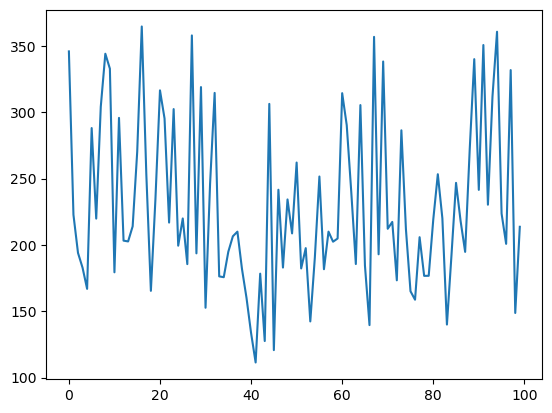

In [12]:
plt.plot(tmp, np.array([l.cpu().detach() for l in loss_list]))

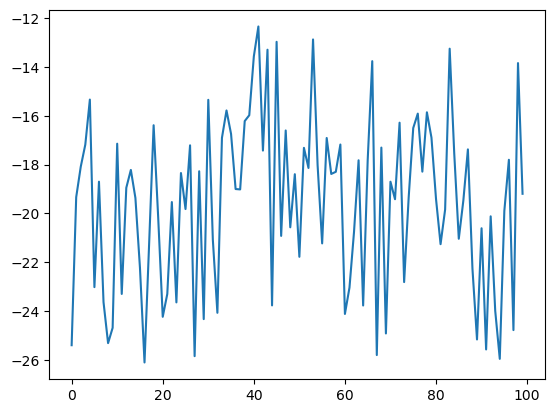

In [13]:
plt.plot(tmp, np.array([l.cpu().detach() for l in reward_list]))

In [14]:
o = []
for i in range(N):
    o.append(observations[200*(i+1)-200:200*(i+1)])

In [15]:
o_old = o.copy()
o = [j for i, j in enumerate(o) if i%10==0]

In [16]:
o = o_old[-10:]

In [17]:
x_ = [i+1 for i in range(200)]

In [18]:
np.array(o).shape

(10, 200, 3)

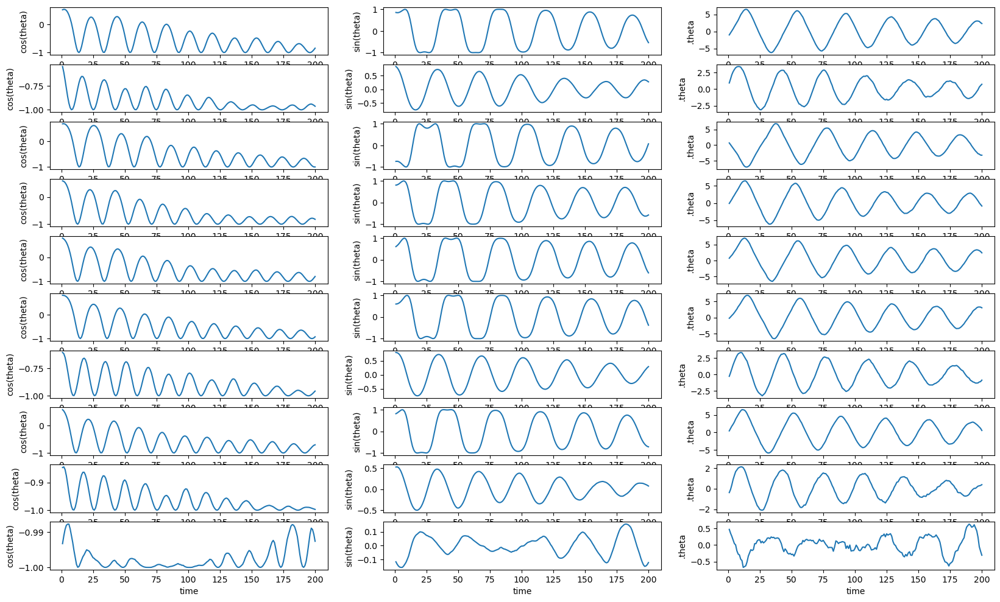

In [19]:
N = 10
plt.figure(1, figsize=(20, 12))
for i in range(N):
    obs = o[i]
    # print(obs)
    theta_ = []
    x_list = []
    y_list = []
    for x,y,v in obs:
        # print(x, y)
        theta_.append(v)
        x_list.append(x)
        y_list.append(y)
    plt.subplot(N, 3, 3*i+1)
    plt.plot(x_, x_list)
    plt.xlabel('time')
    plt.ylabel('cos(theta)')
    plt.subplot(N, 3, 3*i+2)
    plt.plot(x_, y_list)
    plt.xlabel('time')
    plt.ylabel('sin(theta)')
    plt.subplot(N, 3, 3*i+3)
    plt.plot(x_, theta_)
    plt.xlabel('time')
    plt.ylabel('.theta')

In [20]:
len(total_losses)

24000

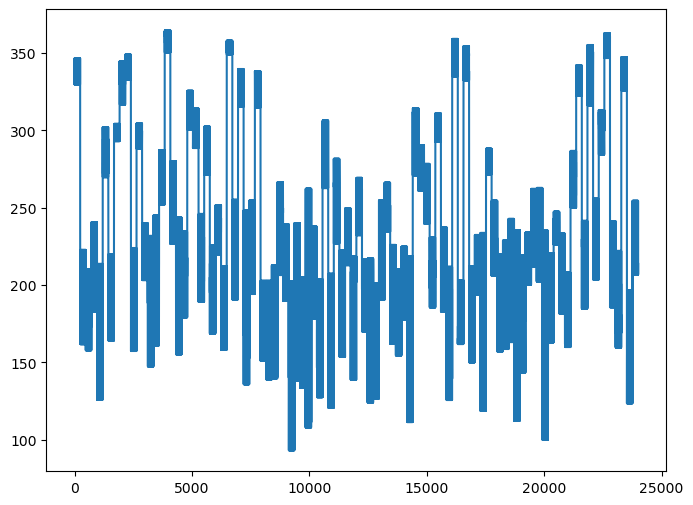

In [21]:
x = np.arange(len(total_losses))
y = [float(x) for x in total_losses]
plt.figure(figsize=(8, 6))
plt.plot(x, y)

## Clipped and No GAE

In [22]:
N = 100 # number of times to collect new trajectories and update actor
M = 1 # num of trajectories
max_trajectory_len = 200 # trajectory length
batch_size = 25 # size for minibatch
n_epochs = 30 # number of epochs to optimize loss
alpha = 0.0001
hidden_layers = 2
hidden_dims = 64
gamma = 0.7
lmbda = 0.9
clip_value = 0.1
use_gae = False
use_clip = True

total_losses, observations, loss_list, reward_list = ppo(
    N, M, max_trajectory_len, batch_size, alpha, hidden_layers, hidden_dims,
    gamma, lmbda, clip_value, use_gae, use_clip)

n: 0, epoch: 0, minibatch no.: 0,
total_loss: 500.84186565571804, actor_loss: 30.58970445367994, critic_loss: 940.5043224040762
n: 0, epoch: 0, minibatch no.: 1,
total_loss: 471.08575013013643, actor_loss: 29.471370053782795, critic_loss: 883.2287601527073
n: 0, epoch: 0, minibatch no.: 2,
total_loss: 477.8330954843938, actor_loss: 29.8409761961849, critic_loss: 895.9842385764179
n: 0, epoch: 0, minibatch no.: 3,
total_loss: 488.4958170438832, actor_loss: 30.224623812090258, critic_loss: 916.5423864635859
n: 0, epoch: 0, minibatch no.: 4,
total_loss: 467.8951596895451, actor_loss: 29.151385409461522, critic_loss: 877.4875485601672
n: 0, epoch: 0, minibatch no.: 5,
total_loss: 492.5134408226963, actor_loss: 30.288808548191874, critic_loss: 924.4492645490088
n: 0, epoch: 0, minibatch no.: 6,
total_loss: 522.3643412263159, actor_loss: 31.305850936155004, critic_loss: 982.1169805803218
n: 0, epoch: 0, minibatch no.: 7,
total_loss: 503.22497247010466, actor_loss: 30.6808243099561, critic_lo

n: 0, epoch: 8, minibatch no.: 2,
total_loss: 477.8330954843938, actor_loss: 29.8409761961849, critic_loss: 895.9842385764179
n: 0, epoch: 8, minibatch no.: 3,
total_loss: 488.4958170438832, actor_loss: 30.224623812090258, critic_loss: 916.5423864635859
n: 0, epoch: 8, minibatch no.: 4,
total_loss: 467.8951596895451, actor_loss: 29.151385409461522, critic_loss: 877.4875485601672
n: 0, epoch: 8, minibatch no.: 5,
total_loss: 492.5134408226963, actor_loss: 30.288808548191874, critic_loss: 924.4492645490088
n: 0, epoch: 8, minibatch no.: 6,
total_loss: 522.3643412263159, actor_loss: 31.305850936155004, critic_loss: 982.1169805803218
n: 0, epoch: 8, minibatch no.: 7,
total_loss: 503.22497247010466, actor_loss: 30.6808243099561, critic_loss: 945.0882963202971
n: 0, epoch: 9, minibatch no.: 0,
total_loss: 500.84186565571804, actor_loss: 30.58970445367994, critic_loss: 940.5043224040762
n: 0, epoch: 9, minibatch no.: 1,
total_loss: 471.08575013013643, actor_loss: 29.471370053782795, critic_lo

n: 0, epoch: 16, minibatch no.: 3,
total_loss: 488.4958170438832, actor_loss: 30.224623812090258, critic_loss: 916.5423864635859
n: 0, epoch: 16, minibatch no.: 4,
total_loss: 467.8951596895451, actor_loss: 29.151385409461522, critic_loss: 877.4875485601672
n: 0, epoch: 16, minibatch no.: 5,
total_loss: 492.5134408226963, actor_loss: 30.288808548191874, critic_loss: 924.4492645490088
n: 0, epoch: 16, minibatch no.: 6,
total_loss: 522.3643412263159, actor_loss: 31.305850936155004, critic_loss: 982.1169805803218
n: 0, epoch: 16, minibatch no.: 7,
total_loss: 503.22497247010466, actor_loss: 30.6808243099561, critic_loss: 945.0882963202971
n: 0, epoch: 17, minibatch no.: 0,
total_loss: 500.84186565571804, actor_loss: 30.58970445367994, critic_loss: 940.5043224040762
n: 0, epoch: 17, minibatch no.: 1,
total_loss: 471.08575013013643, actor_loss: 29.471370053782795, critic_loss: 883.2287601527073
n: 0, epoch: 17, minibatch no.: 2,
total_loss: 477.8330954843938, actor_loss: 29.8409761961849, c

n: 0, epoch: 24, minibatch no.: 3,
total_loss: 488.4958170438832, actor_loss: 30.224623812090258, critic_loss: 916.5423864635859
n: 0, epoch: 24, minibatch no.: 4,
total_loss: 467.8951596895451, actor_loss: 29.151385409461522, critic_loss: 877.4875485601672
n: 0, epoch: 24, minibatch no.: 5,
total_loss: 492.5134408226963, actor_loss: 30.288808548191874, critic_loss: 924.4492645490088
n: 0, epoch: 24, minibatch no.: 6,
total_loss: 522.3643412263159, actor_loss: 31.305850936155004, critic_loss: 982.1169805803218
n: 0, epoch: 24, minibatch no.: 7,
total_loss: 503.22497247010466, actor_loss: 30.6808243099561, critic_loss: 945.0882963202971
n: 0, epoch: 25, minibatch no.: 0,
total_loss: 500.84186565571804, actor_loss: 30.58970445367994, critic_loss: 940.5043224040762
n: 0, epoch: 25, minibatch no.: 1,
total_loss: 471.08575013013643, actor_loss: 29.471370053782795, critic_loss: 883.2287601527073
n: 0, epoch: 25, minibatch no.: 2,
total_loss: 477.8330954843938, actor_loss: 29.8409761961849, c

n: 1, epoch: 2, minibatch no.: 4,
total_loss: 196.07895830929957, actor_loss: 16.304933435032673, critic_loss: 359.5480497485338
n: 1, epoch: 2, minibatch no.: 5,
total_loss: 230.7885867345104, actor_loss: 17.60009325804597, critic_loss: 426.37698695292886
n: 1, epoch: 2, minibatch no.: 6,
total_loss: 185.7542184176927, actor_loss: 15.584118835953582, critic_loss: 340.34019916347825
n: 1, epoch: 2, minibatch no.: 7,
total_loss: 220.4849392449728, actor_loss: 17.351336711814007, critic_loss: 406.26720506631756
n: 1, epoch: 3, minibatch no.: 0,
total_loss: 199.25376449443627, actor_loss: 15.389988839470721, critic_loss: 367.7275513099311
n: 1, epoch: 3, minibatch no.: 1,
total_loss: 267.6345371554162, actor_loss: 19.629379750240318, critic_loss: 496.0103148103517
n: 1, epoch: 3, minibatch no.: 2,
total_loss: 245.61747316532373, actor_loss: 17.231272921692064, critic_loss: 456.7724004872633
n: 1, epoch: 3, minibatch no.: 3,
total_loss: 186.70476394198803, actor_loss: 14.817628734946329, c

n: 1, epoch: 10, minibatch no.: 7,
total_loss: 220.4849392449728, actor_loss: 17.351336711814007, critic_loss: 406.26720506631756
n: 1, epoch: 11, minibatch no.: 0,
total_loss: 199.25376449443627, actor_loss: 15.389988839470721, critic_loss: 367.7275513099311
n: 1, epoch: 11, minibatch no.: 1,
total_loss: 267.6345371554162, actor_loss: 19.629379750240318, critic_loss: 496.0103148103517
n: 1, epoch: 11, minibatch no.: 2,
total_loss: 245.61747316532373, actor_loss: 17.231272921692064, critic_loss: 456.7724004872633
n: 1, epoch: 11, minibatch no.: 3,
total_loss: 186.70476394198803, actor_loss: 14.817628734946329, critic_loss: 343.7742704140834
n: 1, epoch: 11, minibatch no.: 4,
total_loss: 196.07895830929957, actor_loss: 16.304933435032673, critic_loss: 359.5480497485338
n: 1, epoch: 11, minibatch no.: 5,
total_loss: 230.7885867345104, actor_loss: 17.60009325804597, critic_loss: 426.37698695292886
n: 1, epoch: 11, minibatch no.: 6,
total_loss: 185.7542184176927, actor_loss: 15.58411883595

n: 1, epoch: 18, minibatch no.: 7,
total_loss: 220.4849392449728, actor_loss: 17.351336711814007, critic_loss: 406.26720506631756
n: 1, epoch: 19, minibatch no.: 0,
total_loss: 199.25376449443627, actor_loss: 15.389988839470721, critic_loss: 367.7275513099311
n: 1, epoch: 19, minibatch no.: 1,
total_loss: 267.6345371554162, actor_loss: 19.629379750240318, critic_loss: 496.0103148103517
n: 1, epoch: 19, minibatch no.: 2,
total_loss: 245.61747316532373, actor_loss: 17.231272921692064, critic_loss: 456.7724004872633
n: 1, epoch: 19, minibatch no.: 3,
total_loss: 186.70476394198803, actor_loss: 14.817628734946329, critic_loss: 343.7742704140834
n: 1, epoch: 19, minibatch no.: 4,
total_loss: 196.07895830929957, actor_loss: 16.304933435032673, critic_loss: 359.5480497485338
n: 1, epoch: 19, minibatch no.: 5,
total_loss: 230.7885867345104, actor_loss: 17.60009325804597, critic_loss: 426.37698695292886
n: 1, epoch: 19, minibatch no.: 6,
total_loss: 185.7542184176927, actor_loss: 15.58411883595

n: 1, epoch: 27, minibatch no.: 0,
total_loss: 199.25376449443627, actor_loss: 15.389988839470721, critic_loss: 367.7275513099311
n: 1, epoch: 27, minibatch no.: 1,
total_loss: 267.6345371554162, actor_loss: 19.629379750240318, critic_loss: 496.0103148103517
n: 1, epoch: 27, minibatch no.: 2,
total_loss: 245.61747316532373, actor_loss: 17.231272921692064, critic_loss: 456.7724004872633
n: 1, epoch: 27, minibatch no.: 3,
total_loss: 186.70476394198803, actor_loss: 14.817628734946329, critic_loss: 343.7742704140834
n: 1, epoch: 27, minibatch no.: 4,
total_loss: 196.07895830929957, actor_loss: 16.304933435032673, critic_loss: 359.5480497485338
n: 1, epoch: 27, minibatch no.: 5,
total_loss: 230.7885867345104, actor_loss: 17.60009325804597, critic_loss: 426.37698695292886
n: 1, epoch: 27, minibatch no.: 6,
total_loss: 185.7542184176927, actor_loss: 15.584118835953582, critic_loss: 340.34019916347825
n: 1, epoch: 27, minibatch no.: 7,
total_loss: 220.4849392449728, actor_loss: 17.35133671181

n: 2, epoch: 5, minibatch no.: 2,
total_loss: 395.436023173648, actor_loss: 26.977831121829205, critic_loss: 736.9163841036376
n: 2, epoch: 5, minibatch no.: 3,
total_loss: 367.0394952883373, actor_loss: 25.989684564735718, critic_loss: 682.0996214472032
n: 2, epoch: 5, minibatch no.: 4,
total_loss: 381.300409736734, actor_loss: 26.499369338012855, critic_loss: 709.6020807974423
n: 2, epoch: 5, minibatch no.: 5,
total_loss: 377.967005055037, actor_loss: 26.190924149145815, critic_loss: 703.5521618117824
n: 2, epoch: 5, minibatch no.: 6,
total_loss: 399.0922379502508, actor_loss: 27.083908797549896, critic_loss: 744.0166583054018
n: 2, epoch: 5, minibatch no.: 7,
total_loss: 353.5443069686566, actor_loss: 25.08727834142345, critic_loss: 656.9140572544663
n: 2, epoch: 6, minibatch no.: 0,
total_loss: 370.7380950444079, actor_loss: 26.094252472397052, critic_loss: 689.2876851440217
n: 2, epoch: 6, minibatch no.: 1,
total_loss: 349.5329482381136, actor_loss: 25.22078138539553, critic_loss:

n: 2, epoch: 13, minibatch no.: 5,
total_loss: 377.967005055037, actor_loss: 26.190924149145815, critic_loss: 703.5521618117824
n: 2, epoch: 13, minibatch no.: 6,
total_loss: 399.0922379502508, actor_loss: 27.083908797549896, critic_loss: 744.0166583054018
n: 2, epoch: 13, minibatch no.: 7,
total_loss: 353.5443069686566, actor_loss: 25.08727834142345, critic_loss: 656.9140572544663
n: 2, epoch: 14, minibatch no.: 0,
total_loss: 370.7380950444079, actor_loss: 26.094252472397052, critic_loss: 689.2876851440217
n: 2, epoch: 14, minibatch no.: 1,
total_loss: 349.5329482381136, actor_loss: 25.22078138539553, critic_loss: 648.6243337054361
n: 2, epoch: 14, minibatch no.: 2,
total_loss: 395.436023173648, actor_loss: 26.977831121829205, critic_loss: 736.9163841036376
n: 2, epoch: 14, minibatch no.: 3,
total_loss: 367.0394952883373, actor_loss: 25.989684564735718, critic_loss: 682.0996214472032
n: 2, epoch: 14, minibatch no.: 4,
total_loss: 381.300409736734, actor_loss: 26.499369338012855, crit

n: 2, epoch: 21, minibatch no.: 6,
total_loss: 399.0922379502508, actor_loss: 27.083908797549896, critic_loss: 744.0166583054018
n: 2, epoch: 21, minibatch no.: 7,
total_loss: 353.5443069686566, actor_loss: 25.08727834142345, critic_loss: 656.9140572544663
n: 2, epoch: 22, minibatch no.: 0,
total_loss: 370.7380950444079, actor_loss: 26.094252472397052, critic_loss: 689.2876851440217
n: 2, epoch: 22, minibatch no.: 1,
total_loss: 349.5329482381136, actor_loss: 25.22078138539553, critic_loss: 648.6243337054361
n: 2, epoch: 22, minibatch no.: 2,
total_loss: 395.436023173648, actor_loss: 26.977831121829205, critic_loss: 736.9163841036376
n: 2, epoch: 22, minibatch no.: 3,
total_loss: 367.0394952883373, actor_loss: 25.989684564735718, critic_loss: 682.0996214472032
n: 2, epoch: 22, minibatch no.: 4,
total_loss: 381.300409736734, actor_loss: 26.499369338012855, critic_loss: 709.6020807974423
n: 2, epoch: 22, minibatch no.: 5,
total_loss: 377.967005055037, actor_loss: 26.190924149145815, crit

n: 3, epoch: 0, minibatch no.: 0,
total_loss: 336.71053720741605, actor_loss: 24.489610171596304, critic_loss: 624.4418540716395
n: 3, epoch: 0, minibatch no.: 1,
total_loss: 224.10666209240947, actor_loss: 19.444884466680957, critic_loss: 409.32355525145704
n: 3, epoch: 0, minibatch no.: 2,
total_loss: 313.53445604210424, actor_loss: 23.261454336982816, critic_loss: 580.5460034102429
n: 3, epoch: 0, minibatch no.: 3,
total_loss: 313.39245861648277, actor_loss: 23.266605644115753, critic_loss: 580.251705944734
n: 3, epoch: 0, minibatch no.: 4,
total_loss: 324.2634850361119, actor_loss: 23.379634452226327, critic_loss: 601.7677011677712
n: 3, epoch: 0, minibatch no.: 5,
total_loss: 285.69734327679066, actor_loss: 21.99750513368863, critic_loss: 527.3996762862041
n: 3, epoch: 0, minibatch no.: 6,
total_loss: 273.4516104871658, actor_loss: 21.354448727813338, critic_loss: 504.19432351870495
n: 3, epoch: 0, minibatch no.: 7,
total_loss: 294.9967391679216, actor_loss: 22.309785036991663, cr

n: 3, epoch: 8, minibatch no.: 4,
total_loss: 324.2634850361119, actor_loss: 23.379634452226327, critic_loss: 601.7677011677712
n: 3, epoch: 8, minibatch no.: 5,
total_loss: 285.69734327679066, actor_loss: 21.99750513368863, critic_loss: 527.3996762862041
n: 3, epoch: 8, minibatch no.: 6,
total_loss: 273.4516104871658, actor_loss: 21.354448727813338, critic_loss: 504.19432351870495
n: 3, epoch: 8, minibatch no.: 7,
total_loss: 294.9967391679216, actor_loss: 22.309785036991663, critic_loss: 545.3739082618598
n: 3, epoch: 9, minibatch no.: 0,
total_loss: 336.71053720741605, actor_loss: 24.489610171596304, critic_loss: 624.4418540716395
n: 3, epoch: 9, minibatch no.: 1,
total_loss: 224.10666209240947, actor_loss: 19.444884466680957, critic_loss: 409.32355525145704
n: 3, epoch: 9, minibatch no.: 2,
total_loss: 313.53445604210424, actor_loss: 23.261454336982816, critic_loss: 580.5460034102429
n: 3, epoch: 9, minibatch no.: 3,
total_loss: 313.39245861648277, actor_loss: 23.266605644115753, c

n: 3, epoch: 16, minibatch no.: 6,
total_loss: 273.4516104871658, actor_loss: 21.354448727813338, critic_loss: 504.19432351870495
n: 3, epoch: 16, minibatch no.: 7,
total_loss: 294.9967391679216, actor_loss: 22.309785036991663, critic_loss: 545.3739082618598
n: 3, epoch: 17, minibatch no.: 0,
total_loss: 336.71053720741605, actor_loss: 24.489610171596304, critic_loss: 624.4418540716395
n: 3, epoch: 17, minibatch no.: 1,
total_loss: 224.10666209240947, actor_loss: 19.444884466680957, critic_loss: 409.32355525145704
n: 3, epoch: 17, minibatch no.: 2,
total_loss: 313.53445604210424, actor_loss: 23.261454336982816, critic_loss: 580.5460034102429
n: 3, epoch: 17, minibatch no.: 3,
total_loss: 313.39245861648277, actor_loss: 23.266605644115753, critic_loss: 580.251705944734
n: 3, epoch: 17, minibatch no.: 4,
total_loss: 324.2634850361119, actor_loss: 23.379634452226327, critic_loss: 601.7677011677712
n: 3, epoch: 17, minibatch no.: 5,
total_loss: 285.69734327679066, actor_loss: 21.9975051336

n: 3, epoch: 24, minibatch no.: 7,
total_loss: 294.9967391679216, actor_loss: 22.309785036991663, critic_loss: 545.3739082618598
n: 3, epoch: 25, minibatch no.: 0,
total_loss: 336.71053720741605, actor_loss: 24.489610171596304, critic_loss: 624.4418540716395
n: 3, epoch: 25, minibatch no.: 1,
total_loss: 224.10666209240947, actor_loss: 19.444884466680957, critic_loss: 409.32355525145704
n: 3, epoch: 25, minibatch no.: 2,
total_loss: 313.53445604210424, actor_loss: 23.261454336982816, critic_loss: 580.5460034102429
n: 3, epoch: 25, minibatch no.: 3,
total_loss: 313.39245861648277, actor_loss: 23.266605644115753, critic_loss: 580.251705944734
n: 3, epoch: 25, minibatch no.: 4,
total_loss: 324.2634850361119, actor_loss: 23.379634452226327, critic_loss: 601.7677011677712
n: 3, epoch: 25, minibatch no.: 5,
total_loss: 285.69734327679066, actor_loss: 21.99750513368863, critic_loss: 527.3996762862041
n: 3, epoch: 25, minibatch no.: 6,
total_loss: 273.4516104871658, actor_loss: 21.354448727813

n: 4, epoch: 3, minibatch no.: 3,
total_loss: 400.4034870533683, actor_loss: 27.207349256442253, critic_loss: 746.3922755938521
n: 4, epoch: 3, minibatch no.: 4,
total_loss: 379.5871383267026, actor_loss: 26.162498702119088, critic_loss: 706.849279249167
n: 4, epoch: 3, minibatch no.: 5,
total_loss: 389.40307565709736, actor_loss: 26.711537998313833, critic_loss: 725.3830753175671
n: 4, epoch: 3, minibatch no.: 6,
total_loss: 340.5319521117219, actor_loss: 24.801208835753815, critic_loss: 631.4614865519362
n: 4, epoch: 3, minibatch no.: 7,
total_loss: 356.9713467399279, actor_loss: 25.2814278076334, critic_loss: 663.379837864589
n: 4, epoch: 4, minibatch no.: 0,
total_loss: 370.91533616165003, actor_loss: 25.792163357127865, critic_loss: 690.2463456090443
n: 4, epoch: 4, minibatch no.: 1,
total_loss: 397.25121739332224, actor_loss: 27.07648158921208, critic_loss: 740.3494716082203
n: 4, epoch: 4, minibatch no.: 2,
total_loss: 354.3746859501136, actor_loss: 25.410092635968567, critic_lo

n: 4, epoch: 12, minibatch no.: 0,
total_loss: 370.91533616165003, actor_loss: 25.792163357127865, critic_loss: 690.2463456090443
n: 4, epoch: 12, minibatch no.: 1,
total_loss: 397.25121739332224, actor_loss: 27.07648158921208, critic_loss: 740.3494716082203
n: 4, epoch: 12, minibatch no.: 2,
total_loss: 354.3746859501136, actor_loss: 25.410092635968567, critic_loss: 657.92918662829
n: 4, epoch: 12, minibatch no.: 3,
total_loss: 400.4034870533683, actor_loss: 27.207349256442253, critic_loss: 746.3922755938521
n: 4, epoch: 12, minibatch no.: 4,
total_loss: 379.5871383267026, actor_loss: 26.162498702119088, critic_loss: 706.849279249167
n: 4, epoch: 12, minibatch no.: 5,
total_loss: 389.40307565709736, actor_loss: 26.711537998313833, critic_loss: 725.3830753175671
n: 4, epoch: 12, minibatch no.: 6,
total_loss: 340.5319521117219, actor_loss: 24.801208835753815, critic_loss: 631.4614865519362
n: 4, epoch: 12, minibatch no.: 7,
total_loss: 356.9713467399279, actor_loss: 25.2814278076334, cr

n: 4, epoch: 20, minibatch no.: 4,
total_loss: 379.5871383267026, actor_loss: 26.162498702119088, critic_loss: 706.849279249167
n: 4, epoch: 20, minibatch no.: 5,
total_loss: 389.40307565709736, actor_loss: 26.711537998313833, critic_loss: 725.3830753175671
n: 4, epoch: 20, minibatch no.: 6,
total_loss: 340.5319521117219, actor_loss: 24.801208835753815, critic_loss: 631.4614865519362
n: 4, epoch: 20, minibatch no.: 7,
total_loss: 356.9713467399279, actor_loss: 25.2814278076334, critic_loss: 663.379837864589
n: 4, epoch: 21, minibatch no.: 0,
total_loss: 370.91533616165003, actor_loss: 25.792163357127865, critic_loss: 690.2463456090443
n: 4, epoch: 21, minibatch no.: 1,
total_loss: 397.25121739332224, actor_loss: 27.07648158921208, critic_loss: 740.3494716082203
n: 4, epoch: 21, minibatch no.: 2,
total_loss: 354.3746859501136, actor_loss: 25.410092635968567, critic_loss: 657.92918662829
n: 4, epoch: 21, minibatch no.: 3,
total_loss: 400.4034870533683, actor_loss: 27.207349256442253, cri

n: 4, epoch: 28, minibatch no.: 7,
total_loss: 356.9713467399279, actor_loss: 25.2814278076334, critic_loss: 663.379837864589
n: 4, epoch: 29, minibatch no.: 0,
total_loss: 370.91533616165003, actor_loss: 25.792163357127865, critic_loss: 690.2463456090443
n: 4, epoch: 29, minibatch no.: 1,
total_loss: 397.25121739332224, actor_loss: 27.07648158921208, critic_loss: 740.3494716082203
n: 4, epoch: 29, minibatch no.: 2,
total_loss: 354.3746859501136, actor_loss: 25.410092635968567, critic_loss: 657.92918662829
n: 4, epoch: 29, minibatch no.: 3,
total_loss: 400.4034870533683, actor_loss: 27.207349256442253, critic_loss: 746.3922755938521
n: 4, epoch: 29, minibatch no.: 4,
total_loss: 379.5871383267026, actor_loss: 26.162498702119088, critic_loss: 706.849279249167
n: 4, epoch: 29, minibatch no.: 5,
total_loss: 389.40307565709736, actor_loss: 26.711537998313833, critic_loss: 725.3830753175671
n: 4, epoch: 29, minibatch no.: 6,
total_loss: 340.5319521117219, actor_loss: 24.801208835753815, cri

n: 5, epoch: 7, minibatch no.: 0,
total_loss: 237.0842621701139, actor_loss: 17.920968143981565, critic_loss: 438.3265880522647
n: 5, epoch: 7, minibatch no.: 1,
total_loss: 131.070040699126, actor_loss: 12.654363503856366, critic_loss: 236.83135439053925
n: 5, epoch: 7, minibatch no.: 2,
total_loss: 158.1004380852028, actor_loss: 13.111544155850057, critic_loss: 289.9777878587055
n: 5, epoch: 7, minibatch no.: 3,
total_loss: 284.3027991108903, actor_loss: 19.833638928997427, critic_loss: 528.9383203637858
n: 5, epoch: 7, minibatch no.: 4,
total_loss: 218.02085958171176, actor_loss: 16.836865231407625, critic_loss: 402.3679887006083
n: 5, epoch: 7, minibatch no.: 5,
total_loss: 160.90636766903836, actor_loss: 13.194540947024898, critic_loss: 295.4236534440269
n: 5, epoch: 7, minibatch no.: 6,
total_loss: 257.30181443318753, actor_loss: 17.622084843574996, critic_loss: 479.3594591792251
n: 5, epoch: 7, minibatch no.: 7,
total_loss: 268.6900127071886, actor_loss: 18.67850540377113, criti

n: 5, epoch: 15, minibatch no.: 4,
total_loss: 218.02085958171176, actor_loss: 16.836865231407625, critic_loss: 402.3679887006083
n: 5, epoch: 15, minibatch no.: 5,
total_loss: 160.90636766903836, actor_loss: 13.194540947024898, critic_loss: 295.4236534440269
n: 5, epoch: 15, minibatch no.: 6,
total_loss: 257.30181443318753, actor_loss: 17.622084843574996, critic_loss: 479.3594591792251
n: 5, epoch: 15, minibatch no.: 7,
total_loss: 268.6900127071886, actor_loss: 18.67850540377113, critic_loss: 500.023014606835
n: 5, epoch: 16, minibatch no.: 0,
total_loss: 237.0842621701139, actor_loss: 17.920968143981565, critic_loss: 438.3265880522647
n: 5, epoch: 16, minibatch no.: 1,
total_loss: 131.070040699126, actor_loss: 12.654363503856366, critic_loss: 236.83135439053925
n: 5, epoch: 16, minibatch no.: 2,
total_loss: 158.1004380852028, actor_loss: 13.111544155850057, critic_loss: 289.9777878587055
n: 5, epoch: 16, minibatch no.: 3,
total_loss: 284.3027991108903, actor_loss: 19.833638928997427

n: 5, epoch: 23, minibatch no.: 5,
total_loss: 160.90636766903836, actor_loss: 13.194540947024898, critic_loss: 295.4236534440269
n: 5, epoch: 23, minibatch no.: 6,
total_loss: 257.30181443318753, actor_loss: 17.622084843574996, critic_loss: 479.3594591792251
n: 5, epoch: 23, minibatch no.: 7,
total_loss: 268.6900127071886, actor_loss: 18.67850540377113, critic_loss: 500.023014606835
n: 5, epoch: 24, minibatch no.: 0,
total_loss: 237.0842621701139, actor_loss: 17.920968143981565, critic_loss: 438.3265880522647
n: 5, epoch: 24, minibatch no.: 1,
total_loss: 131.070040699126, actor_loss: 12.654363503856366, critic_loss: 236.83135439053925
n: 5, epoch: 24, minibatch no.: 2,
total_loss: 158.1004380852028, actor_loss: 13.111544155850057, critic_loss: 289.9777878587055
n: 5, epoch: 24, minibatch no.: 3,
total_loss: 284.3027991108903, actor_loss: 19.833638928997427, critic_loss: 528.9383203637858
n: 5, epoch: 24, minibatch no.: 4,
total_loss: 218.02085958171176, actor_loss: 16.836865231407625

n: 6, epoch: 1, minibatch no.: 7,
total_loss: 360.65978484122286, actor_loss: 25.581796860660308, critic_loss: 670.1559759611251
n: 6, epoch: 2, minibatch no.: 0,
total_loss: 306.8214309470773, actor_loss: 23.447018408646255, critic_loss: 566.7488250768621
n: 6, epoch: 2, minibatch no.: 1,
total_loss: 393.53522110313, actor_loss: 26.815615767774226, critic_loss: 733.4392106707116
n: 6, epoch: 2, minibatch no.: 2,
total_loss: 299.71449654950425, actor_loss: 22.965982025494288, critic_loss: 553.49702904802
n: 6, epoch: 2, minibatch no.: 3,
total_loss: 316.74115849430797, actor_loss: 23.82232658021926, critic_loss: 585.8376638281774
n: 6, epoch: 2, minibatch no.: 4,
total_loss: 374.6755939468955, actor_loss: 26.16896859139872, critic_loss: 697.0132507109936
n: 6, epoch: 2, minibatch no.: 5,
total_loss: 312.83537528312496, actor_loss: 23.639781369836435, critic_loss: 578.391187826577
n: 6, epoch: 2, minibatch no.: 6,
total_loss: 370.2865614546425, actor_loss: 25.71011428205059, critic_loss

n: 6, epoch: 10, minibatch no.: 2,
total_loss: 299.71449654950425, actor_loss: 22.965982025494288, critic_loss: 553.49702904802
n: 6, epoch: 10, minibatch no.: 3,
total_loss: 316.74115849430797, actor_loss: 23.82232658021926, critic_loss: 585.8376638281774
n: 6, epoch: 10, minibatch no.: 4,
total_loss: 374.6755939468955, actor_loss: 26.16896859139872, critic_loss: 697.0132507109936
n: 6, epoch: 10, minibatch no.: 5,
total_loss: 312.83537528312496, actor_loss: 23.639781369836435, critic_loss: 578.391187826577
n: 6, epoch: 10, minibatch no.: 6,
total_loss: 370.2865614546425, actor_loss: 25.71011428205059, critic_loss: 689.1528943451838
n: 6, epoch: 10, minibatch no.: 7,
total_loss: 360.65978484122286, actor_loss: 25.581796860660308, critic_loss: 670.1559759611251
n: 6, epoch: 11, minibatch no.: 0,
total_loss: 306.8214309470773, actor_loss: 23.447018408646255, critic_loss: 566.7488250768621
n: 6, epoch: 11, minibatch no.: 1,
total_loss: 393.53522110313, actor_loss: 26.815615767774226, cri

n: 6, epoch: 18, minibatch no.: 2,
total_loss: 299.71449654950425, actor_loss: 22.965982025494288, critic_loss: 553.49702904802
n: 6, epoch: 18, minibatch no.: 3,
total_loss: 316.74115849430797, actor_loss: 23.82232658021926, critic_loss: 585.8376638281774
n: 6, epoch: 18, minibatch no.: 4,
total_loss: 374.6755939468955, actor_loss: 26.16896859139872, critic_loss: 697.0132507109936
n: 6, epoch: 18, minibatch no.: 5,
total_loss: 312.83537528312496, actor_loss: 23.639781369836435, critic_loss: 578.391187826577
n: 6, epoch: 18, minibatch no.: 6,
total_loss: 370.2865614546425, actor_loss: 25.71011428205059, critic_loss: 689.1528943451838
n: 6, epoch: 18, minibatch no.: 7,
total_loss: 360.65978484122286, actor_loss: 25.581796860660308, critic_loss: 670.1559759611251
n: 6, epoch: 19, minibatch no.: 0,
total_loss: 306.8214309470773, actor_loss: 23.447018408646255, critic_loss: 566.7488250768621
n: 6, epoch: 19, minibatch no.: 1,
total_loss: 393.53522110313, actor_loss: 26.815615767774226, cri

n: 6, epoch: 26, minibatch no.: 2,
total_loss: 299.71449654950425, actor_loss: 22.965982025494288, critic_loss: 553.49702904802
n: 6, epoch: 26, minibatch no.: 3,
total_loss: 316.74115849430797, actor_loss: 23.82232658021926, critic_loss: 585.8376638281774
n: 6, epoch: 26, minibatch no.: 4,
total_loss: 374.6755939468955, actor_loss: 26.16896859139872, critic_loss: 697.0132507109936
n: 6, epoch: 26, minibatch no.: 5,
total_loss: 312.83537528312496, actor_loss: 23.639781369836435, critic_loss: 578.391187826577
n: 6, epoch: 26, minibatch no.: 6,
total_loss: 370.2865614546425, actor_loss: 25.71011428205059, critic_loss: 689.1528943451838
n: 6, epoch: 26, minibatch no.: 7,
total_loss: 360.65978484122286, actor_loss: 25.581796860660308, critic_loss: 670.1559759611251
n: 6, epoch: 27, minibatch no.: 0,
total_loss: 306.8214309470773, actor_loss: 23.447018408646255, critic_loss: 566.7488250768621
n: 6, epoch: 27, minibatch no.: 1,
total_loss: 393.53522110313, actor_loss: 26.815615767774226, cri

n: 7, epoch: 4, minibatch no.: 2,
total_loss: 295.88955814876545, actor_loss: 20.226357962554147, critic_loss: 551.3264003724225
n: 7, epoch: 4, minibatch no.: 3,
total_loss: 245.12089054285673, actor_loss: 18.03864737910799, critic_loss: 454.16448632749746
n: 7, epoch: 4, minibatch no.: 4,
total_loss: 228.43464713809382, actor_loss: 17.716069506029047, critic_loss: 421.43715526412956
n: 7, epoch: 4, minibatch no.: 5,
total_loss: 190.51771534379253, actor_loss: 15.335069938141674, critic_loss: 350.3652908113017
n: 7, epoch: 4, minibatch no.: 6,
total_loss: 201.82529343880623, actor_loss: 16.34179006629116, critic_loss: 370.9670067450301
n: 7, epoch: 4, minibatch no.: 7,
total_loss: 347.0568611513504, actor_loss: 22.606826858881615, critic_loss: 648.9000685849376
n: 7, epoch: 5, minibatch no.: 0,
total_loss: 179.46334039122752, actor_loss: 16.044259602137945, critic_loss: 326.83816157817915
n: 7, epoch: 5, minibatch no.: 1,
total_loss: 227.6287081673857, actor_loss: 17.45332685149364, c

n: 7, epoch: 12, minibatch no.: 4,
total_loss: 228.43464713809382, actor_loss: 17.716069506029047, critic_loss: 421.43715526412956
n: 7, epoch: 12, minibatch no.: 5,
total_loss: 190.51771534379253, actor_loss: 15.335069938141674, critic_loss: 350.3652908113017
n: 7, epoch: 12, minibatch no.: 6,
total_loss: 201.82529343880623, actor_loss: 16.34179006629116, critic_loss: 370.9670067450301
n: 7, epoch: 12, minibatch no.: 7,
total_loss: 347.0568611513504, actor_loss: 22.606826858881615, critic_loss: 648.9000685849376
n: 7, epoch: 13, minibatch no.: 0,
total_loss: 179.46334039122752, actor_loss: 16.044259602137945, critic_loss: 326.83816157817915
n: 7, epoch: 13, minibatch no.: 1,
total_loss: 227.6287081673857, actor_loss: 17.45332685149364, critic_loss: 420.3507626317841
n: 7, epoch: 13, minibatch no.: 2,
total_loss: 295.88955814876545, actor_loss: 20.226357962554147, critic_loss: 551.3264003724225
n: 7, epoch: 13, minibatch no.: 3,
total_loss: 245.12089054285673, actor_loss: 18.0386473791

n: 7, epoch: 20, minibatch no.: 5,
total_loss: 190.51771534379253, actor_loss: 15.335069938141674, critic_loss: 350.3652908113017
n: 7, epoch: 20, minibatch no.: 6,
total_loss: 201.82529343880623, actor_loss: 16.34179006629116, critic_loss: 370.9670067450301
n: 7, epoch: 20, minibatch no.: 7,
total_loss: 347.0568611513504, actor_loss: 22.606826858881615, critic_loss: 648.9000685849376
n: 7, epoch: 21, minibatch no.: 0,
total_loss: 179.46334039122752, actor_loss: 16.044259602137945, critic_loss: 326.83816157817915
n: 7, epoch: 21, minibatch no.: 1,
total_loss: 227.6287081673857, actor_loss: 17.45332685149364, critic_loss: 420.3507626317841
n: 7, epoch: 21, minibatch no.: 2,
total_loss: 295.88955814876545, actor_loss: 20.226357962554147, critic_loss: 551.3264003724225
n: 7, epoch: 21, minibatch no.: 3,
total_loss: 245.12089054285673, actor_loss: 18.03864737910799, critic_loss: 454.16448632749746
n: 7, epoch: 21, minibatch no.: 4,
total_loss: 228.43464713809382, actor_loss: 17.71606950602

n: 7, epoch: 29, minibatch no.: 0,
total_loss: 179.46334039122752, actor_loss: 16.044259602137945, critic_loss: 326.83816157817915
n: 7, epoch: 29, minibatch no.: 1,
total_loss: 227.6287081673857, actor_loss: 17.45332685149364, critic_loss: 420.3507626317841
n: 7, epoch: 29, minibatch no.: 2,
total_loss: 295.88955814876545, actor_loss: 20.226357962554147, critic_loss: 551.3264003724225
n: 7, epoch: 29, minibatch no.: 3,
total_loss: 245.12089054285673, actor_loss: 18.03864737910799, critic_loss: 454.16448632749746
n: 7, epoch: 29, minibatch no.: 4,
total_loss: 228.43464713809382, actor_loss: 17.716069506029047, critic_loss: 421.43715526412956
n: 7, epoch: 29, minibatch no.: 5,
total_loss: 190.51771534379253, actor_loss: 15.335069938141674, critic_loss: 350.3652908113017
n: 7, epoch: 29, minibatch no.: 6,
total_loss: 201.82529343880623, actor_loss: 16.34179006629116, critic_loss: 370.9670067450301
n: 7, epoch: 29, minibatch no.: 7,
total_loss: 347.0568611513504, actor_loss: 22.6068268588

n: 8, epoch: 7, minibatch no.: 1,
total_loss: 248.67813757277167, actor_loss: 17.705029292958496, critic_loss: 461.94621655962635
n: 8, epoch: 7, minibatch no.: 2,
total_loss: 245.01630452338665, actor_loss: 17.775995850392196, critic_loss: 454.4806173459889
n: 8, epoch: 7, minibatch no.: 3,
total_loss: 298.01548423777007, actor_loss: 19.794830594646164, critic_loss: 556.4413072862478
n: 8, epoch: 7, minibatch no.: 4,
total_loss: 206.8232006575371, actor_loss: 15.142418853894695, critic_loss: 383.3615636072848
n: 8, epoch: 7, minibatch no.: 5,
total_loss: 258.653183475828, actor_loss: 17.45010246663152, critic_loss: 482.40616201839293
n: 8, epoch: 7, minibatch no.: 6,
total_loss: 250.02031799375547, actor_loss: 17.714710648482168, critic_loss: 464.6112146905466
n: 8, epoch: 7, minibatch no.: 7,
total_loss: 166.03333751065463, actor_loss: 14.12371653163656, critic_loss: 303.8192419580361
n: 8, epoch: 8, minibatch no.: 0,
total_loss: 260.46882695416264, actor_loss: 17.06791630582954, cri

n: 8, epoch: 15, minibatch no.: 4,
total_loss: 206.8232006575371, actor_loss: 15.142418853894695, critic_loss: 383.3615636072848
n: 8, epoch: 15, minibatch no.: 5,
total_loss: 258.653183475828, actor_loss: 17.45010246663152, critic_loss: 482.40616201839293
n: 8, epoch: 15, minibatch no.: 6,
total_loss: 250.02031799375547, actor_loss: 17.714710648482168, critic_loss: 464.6112146905466
n: 8, epoch: 15, minibatch no.: 7,
total_loss: 166.03333751065463, actor_loss: 14.12371653163656, critic_loss: 303.8192419580361
n: 8, epoch: 16, minibatch no.: 0,
total_loss: 260.46882695416264, actor_loss: 17.06791630582954, critic_loss: 486.80182129666616
n: 8, epoch: 16, minibatch no.: 1,
total_loss: 248.67813757277167, actor_loss: 17.705029292958496, critic_loss: 461.94621655962635
n: 8, epoch: 16, minibatch no.: 2,
total_loss: 245.01630452338665, actor_loss: 17.775995850392196, critic_loss: 454.4806173459889
n: 8, epoch: 16, minibatch no.: 3,
total_loss: 298.01548423777007, actor_loss: 19.79483059464

n: 8, epoch: 23, minibatch no.: 4,
total_loss: 206.8232006575371, actor_loss: 15.142418853894695, critic_loss: 383.3615636072848
n: 8, epoch: 23, minibatch no.: 5,
total_loss: 258.653183475828, actor_loss: 17.45010246663152, critic_loss: 482.40616201839293
n: 8, epoch: 23, minibatch no.: 6,
total_loss: 250.02031799375547, actor_loss: 17.714710648482168, critic_loss: 464.6112146905466
n: 8, epoch: 23, minibatch no.: 7,
total_loss: 166.03333751065463, actor_loss: 14.12371653163656, critic_loss: 303.8192419580361
n: 8, epoch: 24, minibatch no.: 0,
total_loss: 260.46882695416264, actor_loss: 17.06791630582954, critic_loss: 486.80182129666616
n: 8, epoch: 24, minibatch no.: 1,
total_loss: 248.67813757277167, actor_loss: 17.705029292958496, critic_loss: 461.94621655962635
n: 8, epoch: 24, minibatch no.: 2,
total_loss: 245.01630452338665, actor_loss: 17.775995850392196, critic_loss: 454.4806173459889
n: 8, epoch: 24, minibatch no.: 3,
total_loss: 298.01548423777007, actor_loss: 19.79483059464

n: 9, epoch: 1, minibatch no.: 4,
total_loss: 242.75022236206226, actor_loss: 19.279685407844713, critic_loss: 446.9410739084351
n: 9, epoch: 1, minibatch no.: 5,
total_loss: 273.35390804849237, actor_loss: 20.597018326512575, critic_loss: 505.5137794439596
n: 9, epoch: 1, minibatch no.: 6,
total_loss: 244.30956698276464, actor_loss: 18.98603246386404, critic_loss: 450.6470690378012
n: 9, epoch: 1, minibatch no.: 7,
total_loss: 216.65588107736664, actor_loss: 17.792238212497754, critic_loss: 397.7272857297378
n: 9, epoch: 2, minibatch no.: 0,
total_loss: 219.11585022389858, actor_loss: 17.310306617991927, critic_loss: 403.6110872118133
n: 9, epoch: 2, minibatch no.: 1,
total_loss: 290.6019049024671, actor_loss: 21.596969509721198, critic_loss: 538.0098707854918
n: 9, epoch: 2, minibatch no.: 2,
total_loss: 287.0387530716028, actor_loss: 21.03668594478886, critic_loss: 532.0041342536279
n: 9, epoch: 2, minibatch no.: 3,
total_loss: 219.79355234448286, actor_loss: 18.115770892031257, cri

n: 9, epoch: 9, minibatch no.: 6,
total_loss: 244.30956698276464, actor_loss: 18.98603246386404, critic_loss: 450.6470690378012
n: 9, epoch: 9, minibatch no.: 7,
total_loss: 216.65588107736664, actor_loss: 17.792238212497754, critic_loss: 397.7272857297378
n: 9, epoch: 10, minibatch no.: 0,
total_loss: 219.11585022389858, actor_loss: 17.310306617991927, critic_loss: 403.6110872118133
n: 9, epoch: 10, minibatch no.: 1,
total_loss: 290.6019049024671, actor_loss: 21.596969509721198, critic_loss: 538.0098707854918
n: 9, epoch: 10, minibatch no.: 2,
total_loss: 287.0387530716028, actor_loss: 21.03668594478886, critic_loss: 532.0041342536279
n: 9, epoch: 10, minibatch no.: 3,
total_loss: 219.79355234448286, actor_loss: 18.115770892031257, critic_loss: 403.3555629049032
n: 9, epoch: 10, minibatch no.: 4,
total_loss: 242.75022236206226, actor_loss: 19.279685407844713, critic_loss: 446.9410739084351
n: 9, epoch: 10, minibatch no.: 5,
total_loss: 273.35390804849237, actor_loss: 20.59701832651257

n: 9, epoch: 18, minibatch no.: 1,
total_loss: 290.6019049024671, actor_loss: 21.596969509721198, critic_loss: 538.0098707854918
n: 9, epoch: 18, minibatch no.: 2,
total_loss: 287.0387530716028, actor_loss: 21.03668594478886, critic_loss: 532.0041342536279
n: 9, epoch: 18, minibatch no.: 3,
total_loss: 219.79355234448286, actor_loss: 18.115770892031257, critic_loss: 403.3555629049032
n: 9, epoch: 18, minibatch no.: 4,
total_loss: 242.75022236206226, actor_loss: 19.279685407844713, critic_loss: 446.9410739084351
n: 9, epoch: 18, minibatch no.: 5,
total_loss: 273.35390804849237, actor_loss: 20.597018326512575, critic_loss: 505.5137794439596
n: 9, epoch: 18, minibatch no.: 6,
total_loss: 244.30956698276464, actor_loss: 18.98603246386404, critic_loss: 450.6470690378012
n: 9, epoch: 18, minibatch no.: 7,
total_loss: 216.65588107736664, actor_loss: 17.792238212497754, critic_loss: 397.7272857297378
n: 9, epoch: 19, minibatch no.: 0,
total_loss: 219.11585022389858, actor_loss: 17.310306617991

n: 9, epoch: 26, minibatch no.: 3,
total_loss: 219.79355234448286, actor_loss: 18.115770892031257, critic_loss: 403.3555629049032
n: 9, epoch: 26, minibatch no.: 4,
total_loss: 242.75022236206226, actor_loss: 19.279685407844713, critic_loss: 446.9410739084351
n: 9, epoch: 26, minibatch no.: 5,
total_loss: 273.35390804849237, actor_loss: 20.597018326512575, critic_loss: 505.5137794439596
n: 9, epoch: 26, minibatch no.: 6,
total_loss: 244.30956698276464, actor_loss: 18.98603246386404, critic_loss: 450.6470690378012
n: 9, epoch: 26, minibatch no.: 7,
total_loss: 216.65588107736664, actor_loss: 17.792238212497754, critic_loss: 397.7272857297378
n: 9, epoch: 27, minibatch no.: 0,
total_loss: 219.11585022389858, actor_loss: 17.310306617991927, critic_loss: 403.6110872118133
n: 9, epoch: 27, minibatch no.: 1,
total_loss: 290.6019049024671, actor_loss: 21.596969509721198, critic_loss: 538.0098707854918
n: 9, epoch: 27, minibatch no.: 2,
total_loss: 287.0387530716028, actor_loss: 21.03668594478

n: 10, epoch: 4, minibatch no.: 3,
total_loss: 432.0286619105925, actor_loss: 28.345691056533287, critic_loss: 807.3659417081185
n: 10, epoch: 4, minibatch no.: 4,
total_loss: 425.52338673049354, actor_loss: 28.115684562821006, critic_loss: 794.8154043353451
n: 10, epoch: 4, minibatch no.: 5,
total_loss: 417.26800373312295, actor_loss: 27.809817087679285, critic_loss: 778.9163732908873
n: 10, epoch: 4, minibatch no.: 6,
total_loss: 389.84390461935806, actor_loss: 26.431135703917054, critic_loss: 726.825537830882
n: 10, epoch: 4, minibatch no.: 7,
total_loss: 418.7156397983156, actor_loss: 27.65958164277351, critic_loss: 782.1121163110842
n: 10, epoch: 5, minibatch no.: 0,
total_loss: 419.4972366135398, actor_loss: 27.895566619766004, critic_loss: 783.2033399875477
n: 10, epoch: 5, minibatch no.: 1,
total_loss: 420.9279247724533, actor_loss: 27.958227818700788, critic_loss: 785.9393939075051
n: 10, epoch: 5, minibatch no.: 2,
total_loss: 430.4915430352142, actor_loss: 28.30477333961827,

n: 10, epoch: 12, minibatch no.: 7,
total_loss: 418.7156397983156, actor_loss: 27.65958164277351, critic_loss: 782.1121163110842
n: 10, epoch: 13, minibatch no.: 0,
total_loss: 419.4972366135398, actor_loss: 27.895566619766004, critic_loss: 783.2033399875477
n: 10, epoch: 13, minibatch no.: 1,
total_loss: 420.9279247724533, actor_loss: 27.958227818700788, critic_loss: 785.9393939075051
n: 10, epoch: 13, minibatch no.: 2,
total_loss: 430.4915430352142, actor_loss: 28.30477333961827, critic_loss: 804.3735393911918
n: 10, epoch: 13, minibatch no.: 3,
total_loss: 432.0286619105925, actor_loss: 28.345691056533287, critic_loss: 807.3659417081185
n: 10, epoch: 13, minibatch no.: 4,
total_loss: 425.52338673049354, actor_loss: 28.115684562821006, critic_loss: 794.8154043353451
n: 10, epoch: 13, minibatch no.: 5,
total_loss: 417.26800373312295, actor_loss: 27.809817087679285, critic_loss: 778.9163732908873
n: 10, epoch: 13, minibatch no.: 6,
total_loss: 389.84390461935806, actor_loss: 26.4311357

n: 10, epoch: 21, minibatch no.: 3,
total_loss: 432.0286619105925, actor_loss: 28.345691056533287, critic_loss: 807.3659417081185
n: 10, epoch: 21, minibatch no.: 4,
total_loss: 425.52338673049354, actor_loss: 28.115684562821006, critic_loss: 794.8154043353451
n: 10, epoch: 21, minibatch no.: 5,
total_loss: 417.26800373312295, actor_loss: 27.809817087679285, critic_loss: 778.9163732908873
n: 10, epoch: 21, minibatch no.: 6,
total_loss: 389.84390461935806, actor_loss: 26.431135703917054, critic_loss: 726.825537830882
n: 10, epoch: 21, minibatch no.: 7,
total_loss: 418.7156397983156, actor_loss: 27.65958164277351, critic_loss: 782.1121163110842
n: 10, epoch: 22, minibatch no.: 0,
total_loss: 419.4972366135398, actor_loss: 27.895566619766004, critic_loss: 783.2033399875477
n: 10, epoch: 22, minibatch no.: 1,
total_loss: 420.9279247724533, actor_loss: 27.958227818700788, critic_loss: 785.9393939075051
n: 10, epoch: 22, minibatch no.: 2,
total_loss: 430.4915430352142, actor_loss: 28.3047733

n: 10, epoch: 29, minibatch no.: 5,
total_loss: 417.26800373312295, actor_loss: 27.809817087679285, critic_loss: 778.9163732908873
n: 10, epoch: 29, minibatch no.: 6,
total_loss: 389.84390461935806, actor_loss: 26.431135703917054, critic_loss: 726.825537830882
n: 10, epoch: 29, minibatch no.: 7,
total_loss: 418.7156397983156, actor_loss: 27.65958164277351, critic_loss: 782.1121163110842
n: 11, epoch: 0, minibatch no.: 0,
total_loss: 428.5759444954167, actor_loss: 28.245840377923688, critic_loss: 800.660208234986
n: 11, epoch: 0, minibatch no.: 1,
total_loss: 437.04942578074525, actor_loss: 28.24047704613979, critic_loss: 817.6178974692109
n: 11, epoch: 0, minibatch no.: 2,
total_loss: 452.1267693036173, actor_loss: 29.00129910877513, critic_loss: 846.2509403896844
n: 11, epoch: 0, minibatch no.: 3,
total_loss: 435.1491698850552, actor_loss: 28.401699790827596, critic_loss: 813.4949401884552
n: 11, epoch: 0, minibatch no.: 4,
total_loss: 426.28262997342136, actor_loss: 28.13200873117740

n: 11, epoch: 7, minibatch no.: 5,
total_loss: 457.20138217828594, actor_loss: 29.191605402480434, critic_loss: 856.019553551611
n: 11, epoch: 7, minibatch no.: 6,
total_loss: 450.7222124316468, actor_loss: 28.960377169528257, critic_loss: 843.5236705242371
n: 11, epoch: 7, minibatch no.: 7,
total_loss: 431.9509342811555, actor_loss: 28.05061683738831, critic_loss: 807.8006348875344
n: 11, epoch: 8, minibatch no.: 0,
total_loss: 428.5759444954167, actor_loss: 28.245840377923688, critic_loss: 800.660208234986
n: 11, epoch: 8, minibatch no.: 1,
total_loss: 437.04942578074525, actor_loss: 28.24047704613979, critic_loss: 817.6178974692109
n: 11, epoch: 8, minibatch no.: 2,
total_loss: 452.1267693036173, actor_loss: 29.00129910877513, critic_loss: 846.2509403896844
n: 11, epoch: 8, minibatch no.: 3,
total_loss: 435.1491698850552, actor_loss: 28.401699790827596, critic_loss: 813.4949401884552
n: 11, epoch: 8, minibatch no.: 4,
total_loss: 426.28262997342136, actor_loss: 28.132008731177404, c

n: 11, epoch: 15, minibatch no.: 6,
total_loss: 450.7222124316468, actor_loss: 28.960377169528257, critic_loss: 843.5236705242371
n: 11, epoch: 15, minibatch no.: 7,
total_loss: 431.9509342811555, actor_loss: 28.05061683738831, critic_loss: 807.8006348875344
n: 11, epoch: 16, minibatch no.: 0,
total_loss: 428.5759444954167, actor_loss: 28.245840377923688, critic_loss: 800.660208234986
n: 11, epoch: 16, minibatch no.: 1,
total_loss: 437.04942578074525, actor_loss: 28.24047704613979, critic_loss: 817.6178974692109
n: 11, epoch: 16, minibatch no.: 2,
total_loss: 452.1267693036173, actor_loss: 29.00129910877513, critic_loss: 846.2509403896844
n: 11, epoch: 16, minibatch no.: 3,
total_loss: 435.1491698850552, actor_loss: 28.401699790827596, critic_loss: 813.4949401884552
n: 11, epoch: 16, minibatch no.: 4,
total_loss: 426.28262997342136, actor_loss: 28.132008731177404, critic_loss: 796.301242484488
n: 11, epoch: 16, minibatch no.: 5,
total_loss: 457.20138217828594, actor_loss: 29.1916054024

n: 11, epoch: 24, minibatch no.: 2,
total_loss: 452.1267693036173, actor_loss: 29.00129910877513, critic_loss: 846.2509403896844
n: 11, epoch: 24, minibatch no.: 3,
total_loss: 435.1491698850552, actor_loss: 28.401699790827596, critic_loss: 813.4949401884552
n: 11, epoch: 24, minibatch no.: 4,
total_loss: 426.28262997342136, actor_loss: 28.132008731177404, critic_loss: 796.301242484488
n: 11, epoch: 24, minibatch no.: 5,
total_loss: 457.20138217828594, actor_loss: 29.191605402480434, critic_loss: 856.019553551611
n: 11, epoch: 24, minibatch no.: 6,
total_loss: 450.7222124316468, actor_loss: 28.960377169528257, critic_loss: 843.5236705242371
n: 11, epoch: 24, minibatch no.: 7,
total_loss: 431.9509342811555, actor_loss: 28.05061683738831, critic_loss: 807.8006348875344
n: 11, epoch: 25, minibatch no.: 0,
total_loss: 428.5759444954167, actor_loss: 28.245840377923688, critic_loss: 800.660208234986
n: 11, epoch: 25, minibatch no.: 1,
total_loss: 437.04942578074525, actor_loss: 28.2404770461

n: 12, epoch: 2, minibatch no.: 4,
total_loss: 262.3735179762087, actor_loss: 19.58483649021505, critic_loss: 485.57736297198727
n: 12, epoch: 2, minibatch no.: 5,
total_loss: 207.9196765453681, actor_loss: 16.52074205262768, critic_loss: 382.7978689854809
n: 12, epoch: 2, minibatch no.: 6,
total_loss: 271.1449192533812, actor_loss: 19.797030798089228, critic_loss: 502.6957769105839
n: 12, epoch: 2, minibatch no.: 7,
total_loss: 189.49532332255038, actor_loss: 16.21167682429026, critic_loss: 346.5672929965202
n: 12, epoch: 3, minibatch no.: 0,
total_loss: 196.74429893648187, actor_loss: 16.037147337090147, critic_loss: 361.41430319878344
n: 12, epoch: 3, minibatch no.: 1,
total_loss: 255.95832909789758, actor_loss: 19.269540397961936, critic_loss: 473.37757739987126
n: 12, epoch: 3, minibatch no.: 2,
total_loss: 224.46171546009484, actor_loss: 17.13824949418883, critic_loss: 414.646931931812
n: 12, epoch: 3, minibatch no.: 3,
total_loss: 237.93246263410424, actor_loss: 18.5848824740861

n: 12, epoch: 10, minibatch no.: 7,
total_loss: 189.49532332255038, actor_loss: 16.21167682429026, critic_loss: 346.5672929965202
n: 12, epoch: 11, minibatch no.: 0,
total_loss: 196.74429893648187, actor_loss: 16.037147337090147, critic_loss: 361.41430319878344
n: 12, epoch: 11, minibatch no.: 1,
total_loss: 255.95832909789758, actor_loss: 19.269540397961936, critic_loss: 473.37757739987126
n: 12, epoch: 11, minibatch no.: 2,
total_loss: 224.46171546009484, actor_loss: 17.13824949418883, critic_loss: 414.646931931812
n: 12, epoch: 11, minibatch no.: 3,
total_loss: 237.93246263410424, actor_loss: 18.58488247408612, critic_loss: 438.6951603200362
n: 12, epoch: 11, minibatch no.: 4,
total_loss: 262.3735179762087, actor_loss: 19.58483649021505, critic_loss: 485.57736297198727
n: 12, epoch: 11, minibatch no.: 5,
total_loss: 207.9196765453681, actor_loss: 16.52074205262768, critic_loss: 382.7978689854809
n: 12, epoch: 11, minibatch no.: 6,
total_loss: 271.1449192533812, actor_loss: 19.797030

n: 12, epoch: 19, minibatch no.: 0,
total_loss: 196.74429893648187, actor_loss: 16.037147337090147, critic_loss: 361.41430319878344
n: 12, epoch: 19, minibatch no.: 1,
total_loss: 255.95832909789758, actor_loss: 19.269540397961936, critic_loss: 473.37757739987126
n: 12, epoch: 19, minibatch no.: 2,
total_loss: 224.46171546009484, actor_loss: 17.13824949418883, critic_loss: 414.646931931812
n: 12, epoch: 19, minibatch no.: 3,
total_loss: 237.93246263410424, actor_loss: 18.58488247408612, critic_loss: 438.6951603200362
n: 12, epoch: 19, minibatch no.: 4,
total_loss: 262.3735179762087, actor_loss: 19.58483649021505, critic_loss: 485.57736297198727
n: 12, epoch: 19, minibatch no.: 5,
total_loss: 207.9196765453681, actor_loss: 16.52074205262768, critic_loss: 382.7978689854809
n: 12, epoch: 19, minibatch no.: 6,
total_loss: 271.1449192533812, actor_loss: 19.797030798089228, critic_loss: 502.6957769105839
n: 12, epoch: 19, minibatch no.: 7,
total_loss: 189.49532332255038, actor_loss: 16.21167

n: 12, epoch: 27, minibatch no.: 0,
total_loss: 196.74429893648187, actor_loss: 16.037147337090147, critic_loss: 361.41430319878344
n: 12, epoch: 27, minibatch no.: 1,
total_loss: 255.95832909789758, actor_loss: 19.269540397961936, critic_loss: 473.37757739987126
n: 12, epoch: 27, minibatch no.: 2,
total_loss: 224.46171546009484, actor_loss: 17.13824949418883, critic_loss: 414.646931931812
n: 12, epoch: 27, minibatch no.: 3,
total_loss: 237.93246263410424, actor_loss: 18.58488247408612, critic_loss: 438.6951603200362
n: 12, epoch: 27, minibatch no.: 4,
total_loss: 262.3735179762087, actor_loss: 19.58483649021505, critic_loss: 485.57736297198727
n: 12, epoch: 27, minibatch no.: 5,
total_loss: 207.9196765453681, actor_loss: 16.52074205262768, critic_loss: 382.7978689854809
n: 12, epoch: 27, minibatch no.: 6,
total_loss: 271.1449192533812, actor_loss: 19.797030798089228, critic_loss: 502.6957769105839
n: 12, epoch: 27, minibatch no.: 7,
total_loss: 189.49532332255038, actor_loss: 16.21167

n: 13, epoch: 5, minibatch no.: 0,
total_loss: 269.4119139254075, actor_loss: 18.15509802486576, critic_loss: 502.5136318010834
n: 13, epoch: 5, minibatch no.: 1,
total_loss: 236.24597003721397, actor_loss: 18.201789433296334, critic_loss: 436.08836120783525
n: 13, epoch: 5, minibatch no.: 2,
total_loss: 212.71771753605864, actor_loss: 15.66298421709214, critic_loss: 394.109466637933
n: 13, epoch: 5, minibatch no.: 3,
total_loss: 302.2140164903835, actor_loss: 18.767499524802187, critic_loss: 566.8930339311626
n: 13, epoch: 5, minibatch no.: 4,
total_loss: 171.3142005971112, actor_loss: 13.77349486938857, critic_loss: 315.0814114554453
n: 13, epoch: 5, minibatch no.: 5,
total_loss: 246.400518621695, actor_loss: 17.757633101469725, critic_loss: 457.2857710404505
n: 13, epoch: 5, minibatch no.: 6,
total_loss: 338.99685067068185, actor_loss: 21.120393447287288, critic_loss: 635.7529144467891
n: 13, epoch: 5, minibatch no.: 7,
total_loss: 220.1818192875701, actor_loss: 16.526631964236653, 

n: 13, epoch: 13, minibatch no.: 0,
total_loss: 269.4119139254075, actor_loss: 18.15509802486576, critic_loss: 502.5136318010834
n: 13, epoch: 13, minibatch no.: 1,
total_loss: 236.24597003721397, actor_loss: 18.201789433296334, critic_loss: 436.08836120783525
n: 13, epoch: 13, minibatch no.: 2,
total_loss: 212.71771753605864, actor_loss: 15.66298421709214, critic_loss: 394.109466637933
n: 13, epoch: 13, minibatch no.: 3,
total_loss: 302.2140164903835, actor_loss: 18.767499524802187, critic_loss: 566.8930339311626
n: 13, epoch: 13, minibatch no.: 4,
total_loss: 171.3142005971112, actor_loss: 13.77349486938857, critic_loss: 315.0814114554453
n: 13, epoch: 13, minibatch no.: 5,
total_loss: 246.400518621695, actor_loss: 17.757633101469725, critic_loss: 457.2857710404505
n: 13, epoch: 13, minibatch no.: 6,
total_loss: 338.99685067068185, actor_loss: 21.120393447287288, critic_loss: 635.7529144467891
n: 13, epoch: 13, minibatch no.: 7,
total_loss: 220.1818192875701, actor_loss: 16.526631964

n: 13, epoch: 21, minibatch no.: 1,
total_loss: 236.24597003721397, actor_loss: 18.201789433296334, critic_loss: 436.08836120783525
n: 13, epoch: 21, minibatch no.: 2,
total_loss: 212.71771753605864, actor_loss: 15.66298421709214, critic_loss: 394.109466637933
n: 13, epoch: 21, minibatch no.: 3,
total_loss: 302.2140164903835, actor_loss: 18.767499524802187, critic_loss: 566.8930339311626
n: 13, epoch: 21, minibatch no.: 4,
total_loss: 171.3142005971112, actor_loss: 13.77349486938857, critic_loss: 315.0814114554453
n: 13, epoch: 21, minibatch no.: 5,
total_loss: 246.400518621695, actor_loss: 17.757633101469725, critic_loss: 457.2857710404505
n: 13, epoch: 21, minibatch no.: 6,
total_loss: 338.99685067068185, actor_loss: 21.120393447287288, critic_loss: 635.7529144467891
n: 13, epoch: 21, minibatch no.: 7,
total_loss: 220.1818192875701, actor_loss: 16.526631964236653, critic_loss: 407.3103746466669
n: 13, epoch: 22, minibatch no.: 0,
total_loss: 269.4119139254075, actor_loss: 18.15509802

n: 13, epoch: 29, minibatch no.: 3,
total_loss: 302.2140164903835, actor_loss: 18.767499524802187, critic_loss: 566.8930339311626
n: 13, epoch: 29, minibatch no.: 4,
total_loss: 171.3142005971112, actor_loss: 13.77349486938857, critic_loss: 315.0814114554453
n: 13, epoch: 29, minibatch no.: 5,
total_loss: 246.400518621695, actor_loss: 17.757633101469725, critic_loss: 457.2857710404505
n: 13, epoch: 29, minibatch no.: 6,
total_loss: 338.99685067068185, actor_loss: 21.120393447287288, critic_loss: 635.7529144467891
n: 13, epoch: 29, minibatch no.: 7,
total_loss: 220.1818192875701, actor_loss: 16.526631964236653, critic_loss: 407.3103746466669
n: 14, epoch: 0, minibatch no.: 0,
total_loss: 257.55612791827616, actor_loss: 19.070228594100108, critic_loss: 476.97179864835215
n: 14, epoch: 0, minibatch no.: 1,
total_loss: 178.81081368104176, actor_loss: 14.456403346663956, critic_loss: 328.7088206687556
n: 14, epoch: 0, minibatch no.: 2,
total_loss: 283.4825882292796, actor_loss: 19.311845802

total_loss: 283.4825882292796, actor_loss: 19.31184580258728, critic_loss: 528.3414848533846
n: 14, epoch: 7, minibatch no.: 3,
total_loss: 338.25610911745116, actor_loss: 20.969489641189003, critic_loss: 634.5732389525243
n: 14, epoch: 7, minibatch no.: 4,
total_loss: 199.30015407874308, actor_loss: 14.9304017673904, critic_loss: 368.73950462270534
n: 14, epoch: 7, minibatch no.: 5,
total_loss: 358.23474419797265, actor_loss: 22.978496227987545, critic_loss: 670.5124959399702
n: 14, epoch: 7, minibatch no.: 6,
total_loss: 187.18782808194214, actor_loss: 14.56961154411193, critic_loss: 345.23643307566044
n: 14, epoch: 7, minibatch no.: 7,
total_loss: 228.55800340234055, actor_loss: 16.36025052936058, critic_loss: 424.39550574595995
n: 14, epoch: 8, minibatch no.: 0,
total_loss: 257.55612791827616, actor_loss: 19.070228594100108, critic_loss: 476.97179864835215
n: 14, epoch: 8, minibatch no.: 1,
total_loss: 178.81081368104176, actor_loss: 14.456403346663956, critic_loss: 328.70882066875

n: 14, epoch: 15, minibatch no.: 2,
total_loss: 283.4825882292796, actor_loss: 19.31184580258728, critic_loss: 528.3414848533846
n: 14, epoch: 15, minibatch no.: 3,
total_loss: 338.25610911745116, actor_loss: 20.969489641189003, critic_loss: 634.5732389525243
n: 14, epoch: 15, minibatch no.: 4,
total_loss: 199.30015407874308, actor_loss: 14.9304017673904, critic_loss: 368.73950462270534
n: 14, epoch: 15, minibatch no.: 5,
total_loss: 358.23474419797265, actor_loss: 22.978496227987545, critic_loss: 670.5124959399702
n: 14, epoch: 15, minibatch no.: 6,
total_loss: 187.18782808194214, actor_loss: 14.56961154411193, critic_loss: 345.23643307566044
n: 14, epoch: 15, minibatch no.: 7,
total_loss: 228.55800340234055, actor_loss: 16.36025052936058, critic_loss: 424.39550574595995
n: 14, epoch: 16, minibatch no.: 0,
total_loss: 257.55612791827616, actor_loss: 19.070228594100108, critic_loss: 476.97179864835215
n: 14, epoch: 16, minibatch no.: 1,
total_loss: 178.81081368104176, actor_loss: 14.45

n: 14, epoch: 23, minibatch no.: 2,
total_loss: 283.4825882292796, actor_loss: 19.31184580258728, critic_loss: 528.3414848533846
n: 14, epoch: 23, minibatch no.: 3,
total_loss: 338.25610911745116, actor_loss: 20.969489641189003, critic_loss: 634.5732389525243
n: 14, epoch: 23, minibatch no.: 4,
total_loss: 199.30015407874308, actor_loss: 14.9304017673904, critic_loss: 368.73950462270534
n: 14, epoch: 23, minibatch no.: 5,
total_loss: 358.23474419797265, actor_loss: 22.978496227987545, critic_loss: 670.5124959399702
n: 14, epoch: 23, minibatch no.: 6,
total_loss: 187.18782808194214, actor_loss: 14.56961154411193, critic_loss: 345.23643307566044
n: 14, epoch: 23, minibatch no.: 7,
total_loss: 228.55800340234055, actor_loss: 16.36025052936058, critic_loss: 424.39550574595995
n: 14, epoch: 24, minibatch no.: 0,
total_loss: 257.55612791827616, actor_loss: 19.070228594100108, critic_loss: 476.97179864835215
n: 14, epoch: 24, minibatch no.: 1,
total_loss: 178.81081368104176, actor_loss: 14.45

n: 15, epoch: 1, minibatch no.: 5,
total_loss: 276.84632288442685, actor_loss: 20.607265890504678, critic_loss: 512.4781139878444
n: 15, epoch: 1, minibatch no.: 6,
total_loss: 273.8420177403551, actor_loss: 20.508795806649474, critic_loss: 506.6664438674113
n: 15, epoch: 1, minibatch no.: 7,
total_loss: 204.75763919008912, actor_loss: 17.3324454996337, critic_loss: 374.85038738091083
n: 15, epoch: 2, minibatch no.: 0,
total_loss: 291.7549321027627, actor_loss: 21.548605922618584, critic_loss: 540.4126523602882
n: 15, epoch: 2, minibatch no.: 1,
total_loss: 222.74176321127953, actor_loss: 17.45010390421391, critic_loss: 410.58331861413126
n: 15, epoch: 2, minibatch no.: 2,
total_loss: 237.4186420153148, actor_loss: 18.842199455433096, critic_loss: 437.15288511976337
n: 15, epoch: 2, minibatch no.: 3,
total_loss: 228.3319891363761, actor_loss: 18.252711438267024, critic_loss: 420.15855539621816
n: 15, epoch: 2, minibatch no.: 4,
total_loss: 189.14926669596562, actor_loss: 16.35201794760

n: 15, epoch: 9, minibatch no.: 6,
total_loss: 273.8420177403551, actor_loss: 20.508795806649474, critic_loss: 506.6664438674113
n: 15, epoch: 9, minibatch no.: 7,
total_loss: 204.75763919008912, actor_loss: 17.3324454996337, critic_loss: 374.85038738091083
n: 15, epoch: 10, minibatch no.: 0,
total_loss: 291.7549321027627, actor_loss: 21.548605922618584, critic_loss: 540.4126523602882
n: 15, epoch: 10, minibatch no.: 1,
total_loss: 222.74176321127953, actor_loss: 17.45010390421391, critic_loss: 410.58331861413126
n: 15, epoch: 10, minibatch no.: 2,
total_loss: 237.4186420153148, actor_loss: 18.842199455433096, critic_loss: 437.15288511976337
n: 15, epoch: 10, minibatch no.: 3,
total_loss: 228.3319891363761, actor_loss: 18.252711438267024, critic_loss: 420.15855539621816
n: 15, epoch: 10, minibatch no.: 4,
total_loss: 189.14926669596562, actor_loss: 16.352017947603496, critic_loss: 345.5944974967243
n: 15, epoch: 10, minibatch no.: 5,
total_loss: 276.84632288442685, actor_loss: 20.60726

n: 15, epoch: 17, minibatch no.: 6,
total_loss: 273.8420177403551, actor_loss: 20.508795806649474, critic_loss: 506.6664438674113
n: 15, epoch: 17, minibatch no.: 7,
total_loss: 204.75763919008912, actor_loss: 17.3324454996337, critic_loss: 374.85038738091083
n: 15, epoch: 18, minibatch no.: 0,
total_loss: 291.7549321027627, actor_loss: 21.548605922618584, critic_loss: 540.4126523602882
n: 15, epoch: 18, minibatch no.: 1,
total_loss: 222.74176321127953, actor_loss: 17.45010390421391, critic_loss: 410.58331861413126
n: 15, epoch: 18, minibatch no.: 2,
total_loss: 237.4186420153148, actor_loss: 18.842199455433096, critic_loss: 437.15288511976337
n: 15, epoch: 18, minibatch no.: 3,
total_loss: 228.3319891363761, actor_loss: 18.252711438267024, critic_loss: 420.15855539621816
n: 15, epoch: 18, minibatch no.: 4,
total_loss: 189.14926669596562, actor_loss: 16.352017947603496, critic_loss: 345.5944974967243
n: 15, epoch: 18, minibatch no.: 5,
total_loss: 276.84632288442685, actor_loss: 20.607

n: 15, epoch: 25, minibatch no.: 5,
total_loss: 276.84632288442685, actor_loss: 20.607265890504678, critic_loss: 512.4781139878444
n: 15, epoch: 25, minibatch no.: 6,
total_loss: 273.8420177403551, actor_loss: 20.508795806649474, critic_loss: 506.6664438674113
n: 15, epoch: 25, minibatch no.: 7,
total_loss: 204.75763919008912, actor_loss: 17.3324454996337, critic_loss: 374.85038738091083
n: 15, epoch: 26, minibatch no.: 0,
total_loss: 291.7549321027627, actor_loss: 21.548605922618584, critic_loss: 540.4126523602882
n: 15, epoch: 26, minibatch no.: 1,
total_loss: 222.74176321127953, actor_loss: 17.45010390421391, critic_loss: 410.58331861413126
n: 15, epoch: 26, minibatch no.: 2,
total_loss: 237.4186420153148, actor_loss: 18.842199455433096, critic_loss: 437.15288511976337
n: 15, epoch: 26, minibatch no.: 3,
total_loss: 228.3319891363761, actor_loss: 18.252711438267024, critic_loss: 420.15855539621816
n: 15, epoch: 26, minibatch no.: 4,
total_loss: 189.14926669596562, actor_loss: 16.352

n: 16, epoch: 4, minibatch no.: 0,
total_loss: 417.441788162395, actor_loss: 27.776199398843396, critic_loss: 779.3311775271033
n: 16, epoch: 4, minibatch no.: 1,
total_loss: 379.9042479669917, actor_loss: 26.220141105517648, critic_loss: 707.3682137229481
n: 16, epoch: 4, minibatch no.: 2,
total_loss: 380.8993394486876, actor_loss: 26.314422263833, critic_loss: 709.1698343697092
n: 16, epoch: 4, minibatch no.: 3,
total_loss: 410.73373555927446, actor_loss: 27.533866611180137, critic_loss: 766.3997378961886
n: 16, epoch: 4, minibatch no.: 4,
total_loss: 432.5653365067021, actor_loss: 28.322954663122736, critic_loss: 808.4847636871588
n: 16, epoch: 4, minibatch no.: 5,
total_loss: 404.07990402225744, actor_loss: 27.334282213629603, critic_loss: 753.4912436172557
n: 16, epoch: 4, minibatch no.: 6,
total_loss: 421.6657005920466, actor_loss: 27.88229838938202, critic_loss: 787.5668044053292
n: 16, epoch: 4, minibatch no.: 7,
total_loss: 382.4565085917462, actor_loss: 26.447263398167248, cr

n: 16, epoch: 12, minibatch no.: 2,
total_loss: 380.8993394486876, actor_loss: 26.314422263833, critic_loss: 709.1698343697092
n: 16, epoch: 12, minibatch no.: 3,
total_loss: 410.73373555927446, actor_loss: 27.533866611180137, critic_loss: 766.3997378961886
n: 16, epoch: 12, minibatch no.: 4,
total_loss: 432.5653365067021, actor_loss: 28.322954663122736, critic_loss: 808.4847636871588
n: 16, epoch: 12, minibatch no.: 5,
total_loss: 404.07990402225744, actor_loss: 27.334282213629603, critic_loss: 753.4912436172557
n: 16, epoch: 12, minibatch no.: 6,
total_loss: 421.6657005920466, actor_loss: 27.88229838938202, critic_loss: 787.5668044053292
n: 16, epoch: 12, minibatch no.: 7,
total_loss: 382.4565085917462, actor_loss: 26.447263398167248, critic_loss: 712.018490387158
n: 16, epoch: 13, minibatch no.: 0,
total_loss: 417.441788162395, actor_loss: 27.776199398843396, critic_loss: 779.3311775271033
n: 16, epoch: 13, minibatch no.: 1,
total_loss: 379.9042479669917, actor_loss: 26.220141105517

n: 16, epoch: 20, minibatch no.: 4,
total_loss: 432.5653365067021, actor_loss: 28.322954663122736, critic_loss: 808.4847636871588
n: 16, epoch: 20, minibatch no.: 5,
total_loss: 404.07990402225744, actor_loss: 27.334282213629603, critic_loss: 753.4912436172557
n: 16, epoch: 20, minibatch no.: 6,
total_loss: 421.6657005920466, actor_loss: 27.88229838938202, critic_loss: 787.5668044053292
n: 16, epoch: 20, minibatch no.: 7,
total_loss: 382.4565085917462, actor_loss: 26.447263398167248, critic_loss: 712.018490387158
n: 16, epoch: 21, minibatch no.: 0,
total_loss: 417.441788162395, actor_loss: 27.776199398843396, critic_loss: 779.3311775271033
n: 16, epoch: 21, minibatch no.: 1,
total_loss: 379.9042479669917, actor_loss: 26.220141105517648, critic_loss: 707.3682137229481
n: 16, epoch: 21, minibatch no.: 2,
total_loss: 380.8993394486876, actor_loss: 26.314422263833, critic_loss: 709.1698343697092
n: 16, epoch: 21, minibatch no.: 3,
total_loss: 410.73373555927446, actor_loss: 27.533866611180

n: 16, epoch: 28, minibatch no.: 4,
total_loss: 432.5653365067021, actor_loss: 28.322954663122736, critic_loss: 808.4847636871588
n: 16, epoch: 28, minibatch no.: 5,
total_loss: 404.07990402225744, actor_loss: 27.334282213629603, critic_loss: 753.4912436172557
n: 16, epoch: 28, minibatch no.: 6,
total_loss: 421.6657005920466, actor_loss: 27.88229838938202, critic_loss: 787.5668044053292
n: 16, epoch: 28, minibatch no.: 7,
total_loss: 382.4565085917462, actor_loss: 26.447263398167248, critic_loss: 712.018490387158
n: 16, epoch: 29, minibatch no.: 0,
total_loss: 417.441788162395, actor_loss: 27.776199398843396, critic_loss: 779.3311775271033
n: 16, epoch: 29, minibatch no.: 1,
total_loss: 379.9042479669917, actor_loss: 26.220141105517648, critic_loss: 707.3682137229481
n: 16, epoch: 29, minibatch no.: 2,
total_loss: 380.8993394486876, actor_loss: 26.314422263833, critic_loss: 709.1698343697092
n: 16, epoch: 29, minibatch no.: 3,
total_loss: 410.73373555927446, actor_loss: 27.533866611180

n: 17, epoch: 6, minibatch no.: 7,
total_loss: 275.62073909183863, actor_loss: 20.395595476109246, critic_loss: 510.4502872314588
n: 17, epoch: 7, minibatch no.: 0,
total_loss: 280.4829119284134, actor_loss: 19.93723872323029, critic_loss: 521.0913464103662
n: 17, epoch: 7, minibatch no.: 1,
total_loss: 246.5643465158228, actor_loss: 17.364253132123803, critic_loss: 458.400186767398
n: 17, epoch: 7, minibatch no.: 2,
total_loss: 311.57667957413076, actor_loss: 20.41101718862346, critic_loss: 582.3313247710146
n: 17, epoch: 7, minibatch no.: 3,
total_loss: 246.3908974728267, actor_loss: 17.100070897526685, critic_loss: 458.58165315060006
n: 17, epoch: 7, minibatch no.: 4,
total_loss: 244.5051038914598, actor_loss: 17.631990968044594, critic_loss: 453.74622584683044
n: 17, epoch: 7, minibatch no.: 5,
total_loss: 277.7115615210202, actor_loss: 18.339653984845253, critic_loss: 518.7438150723499
n: 17, epoch: 7, minibatch no.: 6,
total_loss: 135.762602872981, actor_loss: 13.25515069307579, 

n: 17, epoch: 14, minibatch no.: 7,
total_loss: 275.62073909183863, actor_loss: 20.395595476109246, critic_loss: 510.4502872314588
n: 17, epoch: 15, minibatch no.: 0,
total_loss: 280.4829119284134, actor_loss: 19.93723872323029, critic_loss: 521.0913464103662
n: 17, epoch: 15, minibatch no.: 1,
total_loss: 246.5643465158228, actor_loss: 17.364253132123803, critic_loss: 458.400186767398
n: 17, epoch: 15, minibatch no.: 2,
total_loss: 311.57667957413076, actor_loss: 20.41101718862346, critic_loss: 582.3313247710146
n: 17, epoch: 15, minibatch no.: 3,
total_loss: 246.3908974728267, actor_loss: 17.100070897526685, critic_loss: 458.58165315060006
n: 17, epoch: 15, minibatch no.: 4,
total_loss: 244.5051038914598, actor_loss: 17.631990968044594, critic_loss: 453.74622584683044
n: 17, epoch: 15, minibatch no.: 5,
total_loss: 277.7115615210202, actor_loss: 18.339653984845253, critic_loss: 518.7438150723499
n: 17, epoch: 15, minibatch no.: 6,
total_loss: 135.762602872981, actor_loss: 13.25515069

n: 17, epoch: 23, minibatch no.: 0,
total_loss: 280.4829119284134, actor_loss: 19.93723872323029, critic_loss: 521.0913464103662
n: 17, epoch: 23, minibatch no.: 1,
total_loss: 246.5643465158228, actor_loss: 17.364253132123803, critic_loss: 458.400186767398
n: 17, epoch: 23, minibatch no.: 2,
total_loss: 311.57667957413076, actor_loss: 20.41101718862346, critic_loss: 582.3313247710146
n: 17, epoch: 23, minibatch no.: 3,
total_loss: 246.3908974728267, actor_loss: 17.100070897526685, critic_loss: 458.58165315060006
n: 17, epoch: 23, minibatch no.: 4,
total_loss: 244.5051038914598, actor_loss: 17.631990968044594, critic_loss: 453.74622584683044
n: 17, epoch: 23, minibatch no.: 5,
total_loss: 277.7115615210202, actor_loss: 18.339653984845253, critic_loss: 518.7438150723499
n: 17, epoch: 23, minibatch no.: 6,
total_loss: 135.762602872981, actor_loss: 13.25515069307579, critic_loss: 245.01490435981046
n: 17, epoch: 23, minibatch no.: 7,
total_loss: 275.62073909183863, actor_loss: 20.39559547

n: 18, epoch: 1, minibatch no.: 0,
total_loss: 293.2942526013057, actor_loss: 21.746265747863777, critic_loss: 543.0959737068838
n: 18, epoch: 1, minibatch no.: 1,
total_loss: 254.82789798284978, actor_loss: 19.460888603138333, critic_loss: 470.7340187594229
n: 18, epoch: 1, minibatch no.: 2,
total_loss: 281.68811035394714, actor_loss: 21.164472526543303, critic_loss: 521.0472756548077
n: 18, epoch: 1, minibatch no.: 3,
total_loss: 212.91113100613387, actor_loss: 17.165468214433904, critic_loss: 391.49132558339994
n: 18, epoch: 1, minibatch no.: 4,
total_loss: 244.43557711678304, actor_loss: 19.106116358674857, critic_loss: 450.65892151621637
n: 18, epoch: 1, minibatch no.: 5,
total_loss: 250.74514477632658, actor_loss: 19.741468453755875, critic_loss: 462.0073526451414
n: 18, epoch: 1, minibatch no.: 6,
total_loss: 220.42788209007773, actor_loss: 17.818086755374704, critic_loss: 405.21959066940605
n: 18, epoch: 1, minibatch no.: 7,
total_loss: 260.5104671338629, actor_loss: 20.3567054

n: 18, epoch: 9, minibatch no.: 2,
total_loss: 281.68811035394714, actor_loss: 21.164472526543303, critic_loss: 521.0472756548077
n: 18, epoch: 9, minibatch no.: 3,
total_loss: 212.91113100613387, actor_loss: 17.165468214433904, critic_loss: 391.49132558339994
n: 18, epoch: 9, minibatch no.: 4,
total_loss: 244.43557711678304, actor_loss: 19.106116358674857, critic_loss: 450.65892151621637
n: 18, epoch: 9, minibatch no.: 5,
total_loss: 250.74514477632658, actor_loss: 19.741468453755875, critic_loss: 462.0073526451414
n: 18, epoch: 9, minibatch no.: 6,
total_loss: 220.42788209007773, actor_loss: 17.818086755374704, critic_loss: 405.21959066940605
n: 18, epoch: 9, minibatch no.: 7,
total_loss: 260.5104671338629, actor_loss: 20.356705415431637, critic_loss: 480.30752343686254
n: 18, epoch: 10, minibatch no.: 0,
total_loss: 293.2942526013057, actor_loss: 21.746265747863777, critic_loss: 543.0959737068838
n: 18, epoch: 10, minibatch no.: 1,
total_loss: 254.82789798284978, actor_loss: 19.4608

n: 18, epoch: 17, minibatch no.: 1,
total_loss: 254.82789798284978, actor_loss: 19.460888603138333, critic_loss: 470.7340187594229
n: 18, epoch: 17, minibatch no.: 2,
total_loss: 281.68811035394714, actor_loss: 21.164472526543303, critic_loss: 521.0472756548077
n: 18, epoch: 17, minibatch no.: 3,
total_loss: 212.91113100613387, actor_loss: 17.165468214433904, critic_loss: 391.49132558339994
n: 18, epoch: 17, minibatch no.: 4,
total_loss: 244.43557711678304, actor_loss: 19.106116358674857, critic_loss: 450.65892151621637
n: 18, epoch: 17, minibatch no.: 5,
total_loss: 250.74514477632658, actor_loss: 19.741468453755875, critic_loss: 462.0073526451414
n: 18, epoch: 17, minibatch no.: 6,
total_loss: 220.42788209007773, actor_loss: 17.818086755374704, critic_loss: 405.21959066940605
n: 18, epoch: 17, minibatch no.: 7,
total_loss: 260.5104671338629, actor_loss: 20.356705415431637, critic_loss: 480.30752343686254
n: 18, epoch: 18, minibatch no.: 0,
total_loss: 293.2942526013057, actor_loss: 2

n: 18, epoch: 25, minibatch no.: 1,
total_loss: 254.82789798284978, actor_loss: 19.460888603138333, critic_loss: 470.7340187594229
n: 18, epoch: 25, minibatch no.: 2,
total_loss: 281.68811035394714, actor_loss: 21.164472526543303, critic_loss: 521.0472756548077
n: 18, epoch: 25, minibatch no.: 3,
total_loss: 212.91113100613387, actor_loss: 17.165468214433904, critic_loss: 391.49132558339994
n: 18, epoch: 25, minibatch no.: 4,
total_loss: 244.43557711678304, actor_loss: 19.106116358674857, critic_loss: 450.65892151621637
n: 18, epoch: 25, minibatch no.: 5,
total_loss: 250.74514477632658, actor_loss: 19.741468453755875, critic_loss: 462.0073526451414
n: 18, epoch: 25, minibatch no.: 6,
total_loss: 220.42788209007773, actor_loss: 17.818086755374704, critic_loss: 405.21959066940605
n: 18, epoch: 25, minibatch no.: 7,
total_loss: 260.5104671338629, actor_loss: 20.356705415431637, critic_loss: 480.30752343686254
n: 18, epoch: 26, minibatch no.: 0,
total_loss: 293.2942526013057, actor_loss: 2

n: 19, epoch: 3, minibatch no.: 0,
total_loss: 170.62235475291655, actor_loss: 14.466692383700474, critic_loss: 312.3113247384322
n: 19, epoch: 3, minibatch no.: 1,
total_loss: 200.72408042219794, actor_loss: 16.049417013382026, critic_loss: 369.34932681763183
n: 19, epoch: 3, minibatch no.: 2,
total_loss: 348.5760878112404, actor_loss: 23.02177426379543, critic_loss: 651.10862709489
n: 19, epoch: 3, minibatch no.: 3,
total_loss: 231.73042806414588, actor_loss: 17.736674089843344, critic_loss: 427.98750794860507
n: 19, epoch: 3, minibatch no.: 4,
total_loss: 271.72593476861476, actor_loss: 19.048806710908575, critic_loss: 505.35425611541234
n: 19, epoch: 3, minibatch no.: 5,
total_loss: 294.2998716860014, actor_loss: 20.130231397599825, critic_loss: 548.3392805768032
n: 19, epoch: 3, minibatch no.: 6,
total_loss: 222.5887950341599, actor_loss: 17.458804949578095, critic_loss: 410.2599801691636
n: 19, epoch: 3, minibatch no.: 7,
total_loss: 276.2581064761305, actor_loss: 19.084868894394

n: 19, epoch: 11, minibatch no.: 2,
total_loss: 348.5760878112404, actor_loss: 23.02177426379543, critic_loss: 651.10862709489
n: 19, epoch: 11, minibatch no.: 3,
total_loss: 231.73042806414588, actor_loss: 17.736674089843344, critic_loss: 427.98750794860507
n: 19, epoch: 11, minibatch no.: 4,
total_loss: 271.72593476861476, actor_loss: 19.048806710908575, critic_loss: 505.35425611541234
n: 19, epoch: 11, minibatch no.: 5,
total_loss: 294.2998716860014, actor_loss: 20.130231397599825, critic_loss: 548.3392805768032
n: 19, epoch: 11, minibatch no.: 6,
total_loss: 222.5887950341599, actor_loss: 17.458804949578095, critic_loss: 410.2599801691636
n: 19, epoch: 11, minibatch no.: 7,
total_loss: 276.2581064761305, actor_loss: 19.084868894394404, critic_loss: 514.3464751634722
n: 19, epoch: 12, minibatch no.: 0,
total_loss: 170.62235475291655, actor_loss: 14.466692383700474, critic_loss: 312.3113247384322
n: 19, epoch: 12, minibatch no.: 1,
total_loss: 200.72408042219794, actor_loss: 16.04941

n: 19, epoch: 19, minibatch no.: 3,
total_loss: 231.73042806414588, actor_loss: 17.736674089843344, critic_loss: 427.98750794860507
n: 19, epoch: 19, minibatch no.: 4,
total_loss: 271.72593476861476, actor_loss: 19.048806710908575, critic_loss: 505.35425611541234
n: 19, epoch: 19, minibatch no.: 5,
total_loss: 294.2998716860014, actor_loss: 20.130231397599825, critic_loss: 548.3392805768032
n: 19, epoch: 19, minibatch no.: 6,
total_loss: 222.5887950341599, actor_loss: 17.458804949578095, critic_loss: 410.2599801691636
n: 19, epoch: 19, minibatch no.: 7,
total_loss: 276.2581064761305, actor_loss: 19.084868894394404, critic_loss: 514.3464751634722
n: 19, epoch: 20, minibatch no.: 0,
total_loss: 170.62235475291655, actor_loss: 14.466692383700474, critic_loss: 312.3113247384322
n: 19, epoch: 20, minibatch no.: 1,
total_loss: 200.72408042219794, actor_loss: 16.049417013382026, critic_loss: 369.34932681763183
n: 19, epoch: 20, minibatch no.: 2,
total_loss: 348.5760878112404, actor_loss: 23.0

n: 19, epoch: 27, minibatch no.: 5,
total_loss: 294.2998716860014, actor_loss: 20.130231397599825, critic_loss: 548.3392805768032
n: 19, epoch: 27, minibatch no.: 6,
total_loss: 222.5887950341599, actor_loss: 17.458804949578095, critic_loss: 410.2599801691636
n: 19, epoch: 27, minibatch no.: 7,
total_loss: 276.2581064761305, actor_loss: 19.084868894394404, critic_loss: 514.3464751634722
n: 19, epoch: 28, minibatch no.: 0,
total_loss: 170.62235475291655, actor_loss: 14.466692383700474, critic_loss: 312.3113247384322
n: 19, epoch: 28, minibatch no.: 1,
total_loss: 200.72408042219794, actor_loss: 16.049417013382026, critic_loss: 369.34932681763183
n: 19, epoch: 28, minibatch no.: 2,
total_loss: 348.5760878112404, actor_loss: 23.02177426379543, critic_loss: 651.10862709489
n: 19, epoch: 28, minibatch no.: 3,
total_loss: 231.73042806414588, actor_loss: 17.736674089843344, critic_loss: 427.98750794860507
n: 19, epoch: 28, minibatch no.: 4,
total_loss: 271.72593476861476, actor_loss: 19.04880

n: 20, epoch: 5, minibatch no.: 7,
total_loss: 197.8538117856423, actor_loss: 15.73329332093411, critic_loss: 364.2410369294164
n: 20, epoch: 6, minibatch no.: 0,
total_loss: 221.21137750654577, actor_loss: 16.802466947669245, critic_loss: 408.81782111775306
n: 20, epoch: 6, minibatch no.: 1,
total_loss: 239.7774152246865, actor_loss: 16.301698155282356, critic_loss: 446.9514341388083
n: 20, epoch: 6, minibatch no.: 2,
total_loss: 202.49633207346625, actor_loss: 15.335045498516397, critic_loss: 374.3225731498997
n: 20, epoch: 6, minibatch no.: 3,
total_loss: 262.74117227461716, actor_loss: 18.608191043430384, critic_loss: 488.2659624623736
n: 20, epoch: 6, minibatch no.: 4,
total_loss: 267.4962153780683, actor_loss: 18.784880595333988, critic_loss: 497.4226695654687
n: 20, epoch: 6, minibatch no.: 5,
total_loss: 212.755646863669, actor_loss: 15.354204930295914, critic_loss: 394.8028838667462
n: 20, epoch: 6, minibatch no.: 6,
total_loss: 229.6405872057403, actor_loss: 17.70754795554500

n: 20, epoch: 13, minibatch no.: 7,
total_loss: 197.8538117856423, actor_loss: 15.73329332093411, critic_loss: 364.2410369294164
n: 20, epoch: 14, minibatch no.: 0,
total_loss: 221.21137750654577, actor_loss: 16.802466947669245, critic_loss: 408.81782111775306
n: 20, epoch: 14, minibatch no.: 1,
total_loss: 239.7774152246865, actor_loss: 16.301698155282356, critic_loss: 446.9514341388083
n: 20, epoch: 14, minibatch no.: 2,
total_loss: 202.49633207346625, actor_loss: 15.335045498516397, critic_loss: 374.3225731498997
n: 20, epoch: 14, minibatch no.: 3,
total_loss: 262.74117227461716, actor_loss: 18.608191043430384, critic_loss: 488.2659624623736
n: 20, epoch: 14, minibatch no.: 4,
total_loss: 267.4962153780683, actor_loss: 18.784880595333988, critic_loss: 497.4226695654687
n: 20, epoch: 14, minibatch no.: 5,
total_loss: 212.755646863669, actor_loss: 15.354204930295914, critic_loss: 394.8028838667462
n: 20, epoch: 14, minibatch no.: 6,
total_loss: 229.6405872057403, actor_loss: 17.707547

n: 20, epoch: 21, minibatch no.: 6,
total_loss: 229.6405872057403, actor_loss: 17.707547955545007, critic_loss: 423.8660785003906
n: 20, epoch: 21, minibatch no.: 7,
total_loss: 197.8538117856423, actor_loss: 15.73329332093411, critic_loss: 364.2410369294164
n: 20, epoch: 22, minibatch no.: 0,
total_loss: 221.21137750654577, actor_loss: 16.802466947669245, critic_loss: 408.81782111775306
n: 20, epoch: 22, minibatch no.: 1,
total_loss: 239.7774152246865, actor_loss: 16.301698155282356, critic_loss: 446.9514341388083
n: 20, epoch: 22, minibatch no.: 2,
total_loss: 202.49633207346625, actor_loss: 15.335045498516397, critic_loss: 374.3225731498997
n: 20, epoch: 22, minibatch no.: 3,
total_loss: 262.74117227461716, actor_loss: 18.608191043430384, critic_loss: 488.2659624623736
n: 20, epoch: 22, minibatch no.: 4,
total_loss: 267.4962153780683, actor_loss: 18.784880595333988, critic_loss: 497.4226695654687
n: 20, epoch: 22, minibatch no.: 5,
total_loss: 212.755646863669, actor_loss: 15.354204

n: 20, epoch: 29, minibatch no.: 5,
total_loss: 212.755646863669, actor_loss: 15.354204930295914, critic_loss: 394.8028838667462
n: 20, epoch: 29, minibatch no.: 6,
total_loss: 229.6405872057403, actor_loss: 17.707547955545007, critic_loss: 423.8660785003906
n: 20, epoch: 29, minibatch no.: 7,
total_loss: 197.8538117856423, actor_loss: 15.73329332093411, critic_loss: 364.2410369294164
n: 21, epoch: 0, minibatch no.: 0,
total_loss: 275.73226583809037, actor_loss: 20.705471959545136, critic_loss: 510.05358775709044
n: 21, epoch: 0, minibatch no.: 1,
total_loss: 212.4706547711215, actor_loss: 17.259153028539565, critic_loss: 390.42300348516386
n: 21, epoch: 0, minibatch no.: 2,
total_loss: 259.6542701203154, actor_loss: 19.936055623864032, critic_loss: 479.43642899290273
n: 21, epoch: 0, minibatch no.: 3,
total_loss: 308.2962887585466, actor_loss: 21.45251392724636, critic_loss: 573.6875496626005
n: 21, epoch: 0, minibatch no.: 4,
total_loss: 276.9389013342035, actor_loss: 20.441634999472

n: 21, epoch: 7, minibatch no.: 5,
total_loss: 191.505553300661, actor_loss: 17.278964168021954, critic_loss: 348.4531782652781
n: 21, epoch: 7, minibatch no.: 6,
total_loss: 240.38188723582772, actor_loss: 19.717104984840606, critic_loss: 441.32956450197423
n: 21, epoch: 7, minibatch no.: 7,
total_loss: 260.90580299393656, actor_loss: 19.909428349229533, critic_loss: 481.99274928941406
n: 21, epoch: 8, minibatch no.: 0,
total_loss: 275.73226583809037, actor_loss: 20.705471959545136, critic_loss: 510.05358775709044
n: 21, epoch: 8, minibatch no.: 1,
total_loss: 212.4706547711215, actor_loss: 17.259153028539565, critic_loss: 390.42300348516386
n: 21, epoch: 8, minibatch no.: 2,
total_loss: 259.6542701203154, actor_loss: 19.936055623864032, critic_loss: 479.43642899290273
n: 21, epoch: 8, minibatch no.: 3,
total_loss: 308.2962887585466, actor_loss: 21.45251392724636, critic_loss: 573.6875496626005
n: 21, epoch: 8, minibatch no.: 4,
total_loss: 276.9389013342035, actor_loss: 20.4416349994

n: 21, epoch: 15, minibatch no.: 4,
total_loss: 276.9389013342035, actor_loss: 20.4416349994728, critic_loss: 512.9945326694614
n: 21, epoch: 15, minibatch no.: 5,
total_loss: 191.505553300661, actor_loss: 17.278964168021954, critic_loss: 348.4531782652781
n: 21, epoch: 15, minibatch no.: 6,
total_loss: 240.38188723582772, actor_loss: 19.717104984840606, critic_loss: 441.32956450197423
n: 21, epoch: 15, minibatch no.: 7,
total_loss: 260.90580299393656, actor_loss: 19.909428349229533, critic_loss: 481.99274928941406
n: 21, epoch: 16, minibatch no.: 0,
total_loss: 275.73226583809037, actor_loss: 20.705471959545136, critic_loss: 510.05358775709044
n: 21, epoch: 16, minibatch no.: 1,
total_loss: 212.4706547711215, actor_loss: 17.259153028539565, critic_loss: 390.42300348516386
n: 21, epoch: 16, minibatch no.: 2,
total_loss: 259.6542701203154, actor_loss: 19.936055623864032, critic_loss: 479.43642899290273
n: 21, epoch: 16, minibatch no.: 3,
total_loss: 308.2962887585466, actor_loss: 21.452

n: 21, epoch: 23, minibatch no.: 7,
total_loss: 260.90580299393656, actor_loss: 19.909428349229533, critic_loss: 481.99274928941406
n: 21, epoch: 24, minibatch no.: 0,
total_loss: 275.73226583809037, actor_loss: 20.705471959545136, critic_loss: 510.05358775709044
n: 21, epoch: 24, minibatch no.: 1,
total_loss: 212.4706547711215, actor_loss: 17.259153028539565, critic_loss: 390.42300348516386
n: 21, epoch: 24, minibatch no.: 2,
total_loss: 259.6542701203154, actor_loss: 19.936055623864032, critic_loss: 479.43642899290273
n: 21, epoch: 24, minibatch no.: 3,
total_loss: 308.2962887585466, actor_loss: 21.45251392724636, critic_loss: 573.6875496626005
n: 21, epoch: 24, minibatch no.: 4,
total_loss: 276.9389013342035, actor_loss: 20.4416349994728, critic_loss: 512.9945326694614
n: 21, epoch: 24, minibatch no.: 5,
total_loss: 191.505553300661, actor_loss: 17.278964168021954, critic_loss: 348.4531782652781
n: 21, epoch: 24, minibatch no.: 6,
total_loss: 240.38188723582772, actor_loss: 19.71710

n: 22, epoch: 1, minibatch no.: 7,
total_loss: 205.3243393451938, actor_loss: 17.071429251331946, critic_loss: 376.5058201877237
n: 22, epoch: 2, minibatch no.: 0,
total_loss: 213.11062209653417, actor_loss: 15.93496285836481, critic_loss: 394.35131847633875
n: 22, epoch: 2, minibatch no.: 1,
total_loss: 271.99033421025115, actor_loss: 18.49284815672192, critic_loss: 506.9949721070585
n: 22, epoch: 2, minibatch no.: 2,
total_loss: 333.89600575016783, actor_loss: 21.23766368297124, critic_loss: 625.3166841343932
n: 22, epoch: 2, minibatch no.: 3,
total_loss: 295.18585181424135, actor_loss: 20.141817090879833, critic_loss: 550.088069446723
n: 22, epoch: 2, minibatch no.: 4,
total_loss: 257.8406070892696, actor_loss: 19.34748921983694, critic_loss: 476.9862357388654
n: 22, epoch: 2, minibatch no.: 5,
total_loss: 296.36338118557774, actor_loss: 19.440653007277742, critic_loss: 553.8454563566
n: 22, epoch: 2, minibatch no.: 6,
total_loss: 253.26048374253034, actor_loss: 18.534986804279864, 

n: 22, epoch: 9, minibatch no.: 7,
total_loss: 205.3243393451938, actor_loss: 17.071429251331946, critic_loss: 376.5058201877237
n: 22, epoch: 10, minibatch no.: 0,
total_loss: 213.11062209653417, actor_loss: 15.93496285836481, critic_loss: 394.35131847633875
n: 22, epoch: 10, minibatch no.: 1,
total_loss: 271.99033421025115, actor_loss: 18.49284815672192, critic_loss: 506.9949721070585
n: 22, epoch: 10, minibatch no.: 2,
total_loss: 333.89600575016783, actor_loss: 21.23766368297124, critic_loss: 625.3166841343932
n: 22, epoch: 10, minibatch no.: 3,
total_loss: 295.18585181424135, actor_loss: 20.141817090879833, critic_loss: 550.088069446723
n: 22, epoch: 10, minibatch no.: 4,
total_loss: 257.8406070892696, actor_loss: 19.34748921983694, critic_loss: 476.9862357388654
n: 22, epoch: 10, minibatch no.: 5,
total_loss: 296.36338118557774, actor_loss: 19.440653007277742, critic_loss: 553.8454563566
n: 22, epoch: 10, minibatch no.: 6,
total_loss: 253.26048374253034, actor_loss: 18.5349868042

n: 22, epoch: 18, minibatch no.: 0,
total_loss: 213.11062209653417, actor_loss: 15.93496285836481, critic_loss: 394.35131847633875
n: 22, epoch: 18, minibatch no.: 1,
total_loss: 271.99033421025115, actor_loss: 18.49284815672192, critic_loss: 506.9949721070585
n: 22, epoch: 18, minibatch no.: 2,
total_loss: 333.89600575016783, actor_loss: 21.23766368297124, critic_loss: 625.3166841343932
n: 22, epoch: 18, minibatch no.: 3,
total_loss: 295.18585181424135, actor_loss: 20.141817090879833, critic_loss: 550.088069446723
n: 22, epoch: 18, minibatch no.: 4,
total_loss: 257.8406070892696, actor_loss: 19.34748921983694, critic_loss: 476.9862357388654
n: 22, epoch: 18, minibatch no.: 5,
total_loss: 296.36338118557774, actor_loss: 19.440653007277742, critic_loss: 553.8454563566
n: 22, epoch: 18, minibatch no.: 6,
total_loss: 253.26048374253034, actor_loss: 18.534986804279864, critic_loss: 469.45099387650095
n: 22, epoch: 18, minibatch no.: 7,
total_loss: 205.3243393451938, actor_loss: 17.07142925

n: 22, epoch: 26, minibatch no.: 1,
total_loss: 271.99033421025115, actor_loss: 18.49284815672192, critic_loss: 506.9949721070585
n: 22, epoch: 26, minibatch no.: 2,
total_loss: 333.89600575016783, actor_loss: 21.23766368297124, critic_loss: 625.3166841343932
n: 22, epoch: 26, minibatch no.: 3,
total_loss: 295.18585181424135, actor_loss: 20.141817090879833, critic_loss: 550.088069446723
n: 22, epoch: 26, minibatch no.: 4,
total_loss: 257.8406070892696, actor_loss: 19.34748921983694, critic_loss: 476.9862357388654
n: 22, epoch: 26, minibatch no.: 5,
total_loss: 296.36338118557774, actor_loss: 19.440653007277742, critic_loss: 553.8454563566
n: 22, epoch: 26, minibatch no.: 6,
total_loss: 253.26048374253034, actor_loss: 18.534986804279864, critic_loss: 469.45099387650095
n: 22, epoch: 26, minibatch no.: 7,
total_loss: 205.3243393451938, actor_loss: 17.071429251331946, critic_loss: 376.5058201877237
n: 22, epoch: 27, minibatch no.: 0,
total_loss: 213.11062209653417, actor_loss: 15.93496285

n: 23, epoch: 4, minibatch no.: 4,
total_loss: 157.98957628702803, actor_loss: 13.54251804333426, critic_loss: 288.8941164873875
n: 23, epoch: 4, minibatch no.: 5,
total_loss: 259.00751905613674, actor_loss: 18.505131459542213, critic_loss: 481.004775193189
n: 23, epoch: 4, minibatch no.: 6,
total_loss: 252.7858131390704, actor_loss: 17.51387729304268, critic_loss: 470.54387169205546
n: 23, epoch: 4, minibatch no.: 7,
total_loss: 178.815884976535, actor_loss: 14.53857124613278, critic_loss: 328.5546274608044
n: 23, epoch: 5, minibatch no.: 0,
total_loss: 215.97150594471321, actor_loss: 16.74040712068476, critic_loss: 398.46219764805693
n: 23, epoch: 5, minibatch no.: 1,
total_loss: 278.56080300740393, actor_loss: 18.9728854820019, critic_loss: 519.175835050804
n: 23, epoch: 5, minibatch no.: 2,
total_loss: 155.41755605169863, actor_loss: 14.605882685748835, critic_loss: 281.6233467318996
n: 23, epoch: 5, minibatch no.: 3,
total_loss: 202.98494855737135, actor_loss: 14.74827028962563, c

n: 23, epoch: 12, minibatch no.: 5,
total_loss: 259.00751905613674, actor_loss: 18.505131459542213, critic_loss: 481.004775193189
n: 23, epoch: 12, minibatch no.: 6,
total_loss: 252.7858131390704, actor_loss: 17.51387729304268, critic_loss: 470.54387169205546
n: 23, epoch: 12, minibatch no.: 7,
total_loss: 178.815884976535, actor_loss: 14.53857124613278, critic_loss: 328.5546274608044
n: 23, epoch: 13, minibatch no.: 0,
total_loss: 215.97150594471321, actor_loss: 16.74040712068476, critic_loss: 398.46219764805693
n: 23, epoch: 13, minibatch no.: 1,
total_loss: 278.56080300740393, actor_loss: 18.9728854820019, critic_loss: 519.175835050804
n: 23, epoch: 13, minibatch no.: 2,
total_loss: 155.41755605169863, actor_loss: 14.605882685748835, critic_loss: 281.6233467318996
n: 23, epoch: 13, minibatch no.: 3,
total_loss: 202.98494855737135, actor_loss: 14.74827028962563, critic_loss: 376.47335653549146
n: 23, epoch: 13, minibatch no.: 4,
total_loss: 157.98957628702803, actor_loss: 13.54251804

n: 23, epoch: 20, minibatch no.: 5,
total_loss: 259.00751905613674, actor_loss: 18.505131459542213, critic_loss: 481.004775193189
n: 23, epoch: 20, minibatch no.: 6,
total_loss: 252.7858131390704, actor_loss: 17.51387729304268, critic_loss: 470.54387169205546
n: 23, epoch: 20, minibatch no.: 7,
total_loss: 178.815884976535, actor_loss: 14.53857124613278, critic_loss: 328.5546274608044
n: 23, epoch: 21, minibatch no.: 0,
total_loss: 215.97150594471321, actor_loss: 16.74040712068476, critic_loss: 398.46219764805693
n: 23, epoch: 21, minibatch no.: 1,
total_loss: 278.56080300740393, actor_loss: 18.9728854820019, critic_loss: 519.175835050804
n: 23, epoch: 21, minibatch no.: 2,
total_loss: 155.41755605169863, actor_loss: 14.605882685748835, critic_loss: 281.6233467318996
n: 23, epoch: 21, minibatch no.: 3,
total_loss: 202.98494855737135, actor_loss: 14.74827028962563, critic_loss: 376.47335653549146
n: 23, epoch: 21, minibatch no.: 4,
total_loss: 157.98957628702803, actor_loss: 13.54251804

n: 23, epoch: 28, minibatch no.: 7,
total_loss: 178.815884976535, actor_loss: 14.53857124613278, critic_loss: 328.5546274608044
n: 23, epoch: 29, minibatch no.: 0,
total_loss: 215.97150594471321, actor_loss: 16.74040712068476, critic_loss: 398.46219764805693
n: 23, epoch: 29, minibatch no.: 1,
total_loss: 278.56080300740393, actor_loss: 18.9728854820019, critic_loss: 519.175835050804
n: 23, epoch: 29, minibatch no.: 2,
total_loss: 155.41755605169863, actor_loss: 14.605882685748835, critic_loss: 281.6233467318996
n: 23, epoch: 29, minibatch no.: 3,
total_loss: 202.98494855737135, actor_loss: 14.74827028962563, critic_loss: 376.47335653549146
n: 23, epoch: 29, minibatch no.: 4,
total_loss: 157.98957628702803, actor_loss: 13.54251804333426, critic_loss: 288.8941164873875
n: 23, epoch: 29, minibatch no.: 5,
total_loss: 259.00751905613674, actor_loss: 18.505131459542213, critic_loss: 481.004775193189
n: 23, epoch: 29, minibatch no.: 6,
total_loss: 252.7858131390704, actor_loss: 17.513877293

n: 24, epoch: 6, minibatch no.: 7,
total_loss: 277.92121196948847, actor_loss: 19.027343511524588, critic_loss: 517.7877369159278
n: 24, epoch: 7, minibatch no.: 0,
total_loss: 247.66706747160958, actor_loss: 17.88491759618522, critic_loss: 459.56429975084876
n: 24, epoch: 7, minibatch no.: 1,
total_loss: 262.48241636099857, actor_loss: 18.851443347526626, critic_loss: 487.2619460269439
n: 24, epoch: 7, minibatch no.: 2,
total_loss: 218.56434701503977, actor_loss: 17.439105664983114, critic_loss: 402.2504827001133
n: 24, epoch: 7, minibatch no.: 3,
total_loss: 281.0682190429122, actor_loss: 18.88795668146883, critic_loss: 524.3605247228867
n: 24, epoch: 7, minibatch no.: 4,
total_loss: 304.3151835893167, actor_loss: 21.086900712365143, critic_loss: 566.4565657539031
n: 24, epoch: 7, minibatch no.: 5,
total_loss: 241.1222845309678, actor_loss: 17.13895913771633, critic_loss: 447.9666507865029
n: 24, epoch: 7, minibatch no.: 6,
total_loss: 285.7850202800062, actor_loss: 19.30735147501651

n: 24, epoch: 15, minibatch no.: 1,
total_loss: 262.48241636099857, actor_loss: 18.851443347526626, critic_loss: 487.2619460269439
n: 24, epoch: 15, minibatch no.: 2,
total_loss: 218.56434701503977, actor_loss: 17.439105664983114, critic_loss: 402.2504827001133
n: 24, epoch: 15, minibatch no.: 3,
total_loss: 281.0682190429122, actor_loss: 18.88795668146883, critic_loss: 524.3605247228867
n: 24, epoch: 15, minibatch no.: 4,
total_loss: 304.3151835893167, actor_loss: 21.086900712365143, critic_loss: 566.4565657539031
n: 24, epoch: 15, minibatch no.: 5,
total_loss: 241.1222845309678, actor_loss: 17.13895913771633, critic_loss: 447.9666507865029
n: 24, epoch: 15, minibatch no.: 6,
total_loss: 285.7850202800062, actor_loss: 19.307351475016514, critic_loss: 532.9553376099794
n: 24, epoch: 15, minibatch no.: 7,
total_loss: 277.92121196948847, actor_loss: 19.027343511524588, critic_loss: 517.7877369159278
n: 24, epoch: 16, minibatch no.: 0,
total_loss: 247.66706747160958, actor_loss: 17.884917

n: 24, epoch: 23, minibatch no.: 3,
total_loss: 281.0682190429122, actor_loss: 18.88795668146883, critic_loss: 524.3605247228867
n: 24, epoch: 23, minibatch no.: 4,
total_loss: 304.3151835893167, actor_loss: 21.086900712365143, critic_loss: 566.4565657539031
n: 24, epoch: 23, minibatch no.: 5,
total_loss: 241.1222845309678, actor_loss: 17.13895913771633, critic_loss: 447.9666507865029
n: 24, epoch: 23, minibatch no.: 6,
total_loss: 285.7850202800062, actor_loss: 19.307351475016514, critic_loss: 532.9553376099794
n: 24, epoch: 23, minibatch no.: 7,
total_loss: 277.92121196948847, actor_loss: 19.027343511524588, critic_loss: 517.7877369159278
n: 24, epoch: 24, minibatch no.: 0,
total_loss: 247.66706747160958, actor_loss: 17.88491759618522, critic_loss: 459.56429975084876
n: 24, epoch: 24, minibatch no.: 1,
total_loss: 262.48241636099857, actor_loss: 18.851443347526626, critic_loss: 487.2619460269439
n: 24, epoch: 24, minibatch no.: 2,
total_loss: 218.56434701503977, actor_loss: 17.439105

n: 25, epoch: 1, minibatch no.: 4,
total_loss: 269.6607695244509, actor_loss: 18.94943110831932, critic_loss: 501.42267683226316
n: 25, epoch: 1, minibatch no.: 5,
total_loss: 288.247836172767, actor_loss: 19.642548008369708, critic_loss: 537.2105763287946
n: 25, epoch: 1, minibatch no.: 6,
total_loss: 278.2001026045335, actor_loss: 19.38264828696983, critic_loss: 517.6349086351274
n: 25, epoch: 1, minibatch no.: 7,
total_loss: 263.3901732778835, actor_loss: 18.698115782710783, critic_loss: 489.38411499034544
n: 25, epoch: 2, minibatch no.: 0,
total_loss: 206.6638726752104, actor_loss: 15.488888606853966, critic_loss: 382.34996813671285
n: 25, epoch: 2, minibatch no.: 1,
total_loss: 262.607347690549, actor_loss: 18.700009888189197, critic_loss: 487.8146756047196
n: 25, epoch: 2, minibatch no.: 2,
total_loss: 200.7059687053103, actor_loss: 16.005797015379443, critic_loss: 369.40034337986174
n: 25, epoch: 2, minibatch no.: 3,
total_loss: 299.88514306627144, actor_loss: 20.04233057851133,

n: 25, epoch: 9, minibatch no.: 7,
total_loss: 263.3901732778835, actor_loss: 18.698115782710783, critic_loss: 489.38411499034544
n: 25, epoch: 10, minibatch no.: 0,
total_loss: 206.6638726752104, actor_loss: 15.488888606853966, critic_loss: 382.34996813671285
n: 25, epoch: 10, minibatch no.: 1,
total_loss: 262.607347690549, actor_loss: 18.700009888189197, critic_loss: 487.8146756047196
n: 25, epoch: 10, minibatch no.: 2,
total_loss: 200.7059687053103, actor_loss: 16.005797015379443, critic_loss: 369.40034337986174
n: 25, epoch: 10, minibatch no.: 3,
total_loss: 299.88514306627144, actor_loss: 20.04233057851133, critic_loss: 559.6856249755202
n: 25, epoch: 10, minibatch no.: 4,
total_loss: 269.6607695244509, actor_loss: 18.94943110831932, critic_loss: 501.42267683226316
n: 25, epoch: 10, minibatch no.: 5,
total_loss: 288.247836172767, actor_loss: 19.642548008369708, critic_loss: 537.2105763287946
n: 25, epoch: 10, minibatch no.: 6,
total_loss: 278.2001026045335, actor_loss: 19.38264828

n: 25, epoch: 17, minibatch no.: 7,
total_loss: 263.3901732778835, actor_loss: 18.698115782710783, critic_loss: 489.38411499034544
n: 25, epoch: 18, minibatch no.: 0,
total_loss: 206.6638726752104, actor_loss: 15.488888606853966, critic_loss: 382.34996813671285
n: 25, epoch: 18, minibatch no.: 1,
total_loss: 262.607347690549, actor_loss: 18.700009888189197, critic_loss: 487.8146756047196
n: 25, epoch: 18, minibatch no.: 2,
total_loss: 200.7059687053103, actor_loss: 16.005797015379443, critic_loss: 369.40034337986174
n: 25, epoch: 18, minibatch no.: 3,
total_loss: 299.88514306627144, actor_loss: 20.04233057851133, critic_loss: 559.6856249755202
n: 25, epoch: 18, minibatch no.: 4,
total_loss: 269.6607695244509, actor_loss: 18.94943110831932, critic_loss: 501.42267683226316
n: 25, epoch: 18, minibatch no.: 5,
total_loss: 288.247836172767, actor_loss: 19.642548008369708, critic_loss: 537.2105763287946
n: 25, epoch: 18, minibatch no.: 6,
total_loss: 278.2001026045335, actor_loss: 19.3826482

n: 25, epoch: 26, minibatch no.: 1,
total_loss: 262.607347690549, actor_loss: 18.700009888189197, critic_loss: 487.8146756047196
n: 25, epoch: 26, minibatch no.: 2,
total_loss: 200.7059687053103, actor_loss: 16.005797015379443, critic_loss: 369.40034337986174
n: 25, epoch: 26, minibatch no.: 3,
total_loss: 299.88514306627144, actor_loss: 20.04233057851133, critic_loss: 559.6856249755202
n: 25, epoch: 26, minibatch no.: 4,
total_loss: 269.6607695244509, actor_loss: 18.94943110831932, critic_loss: 501.42267683226316
n: 25, epoch: 26, minibatch no.: 5,
total_loss: 288.247836172767, actor_loss: 19.642548008369708, critic_loss: 537.2105763287946
n: 25, epoch: 26, minibatch no.: 6,
total_loss: 278.2001026045335, actor_loss: 19.38264828696983, critic_loss: 517.6349086351274
n: 25, epoch: 26, minibatch no.: 7,
total_loss: 263.3901732778835, actor_loss: 18.698115782710783, critic_loss: 489.38411499034544
n: 25, epoch: 27, minibatch no.: 0,
total_loss: 206.6638726752104, actor_loss: 15.488888606

n: 26, epoch: 4, minibatch no.: 1,
total_loss: 193.58305931296115, actor_loss: 15.577001218870514, critic_loss: 356.01211618818127
n: 26, epoch: 4, minibatch no.: 2,
total_loss: 250.66197746542153, actor_loss: 18.208788289583264, critic_loss: 464.90637835167655
n: 26, epoch: 4, minibatch no.: 3,
total_loss: 165.2074054569486, actor_loss: 12.959343069492265, critic_loss: 304.4961247749127
n: 26, epoch: 4, minibatch no.: 4,
total_loss: 252.510795873227, actor_loss: 18.495576338269988, critic_loss: 468.03043906991405
n: 26, epoch: 4, minibatch no.: 5,
total_loss: 179.1721554330477, actor_loss: 14.015926659466146, critic_loss: 330.3124575471631
n: 26, epoch: 4, minibatch no.: 6,
total_loss: 256.1956008314247, actor_loss: 18.437048186550207, critic_loss: 475.517105289749
n: 26, epoch: 4, minibatch no.: 7,
total_loss: 326.6686934195505, actor_loss: 21.789487225447246, critic_loss: 609.7584123882065
n: 26, epoch: 5, minibatch no.: 0,
total_loss: 146.1587952291256, actor_loss: 13.3004061468641

n: 26, epoch: 12, minibatch no.: 1,
total_loss: 193.58305931296115, actor_loss: 15.577001218870514, critic_loss: 356.01211618818127
n: 26, epoch: 12, minibatch no.: 2,
total_loss: 250.66197746542153, actor_loss: 18.208788289583264, critic_loss: 464.90637835167655
n: 26, epoch: 12, minibatch no.: 3,
total_loss: 165.2074054569486, actor_loss: 12.959343069492265, critic_loss: 304.4961247749127
n: 26, epoch: 12, minibatch no.: 4,
total_loss: 252.510795873227, actor_loss: 18.495576338269988, critic_loss: 468.03043906991405
n: 26, epoch: 12, minibatch no.: 5,
total_loss: 179.1721554330477, actor_loss: 14.015926659466146, critic_loss: 330.3124575471631
n: 26, epoch: 12, minibatch no.: 6,
total_loss: 256.1956008314247, actor_loss: 18.437048186550207, critic_loss: 475.517105289749
n: 26, epoch: 12, minibatch no.: 7,
total_loss: 326.6686934195505, actor_loss: 21.789487225447246, critic_loss: 609.7584123882065
n: 26, epoch: 13, minibatch no.: 0,
total_loss: 146.1587952291256, actor_loss: 13.30040

n: 26, epoch: 20, minibatch no.: 3,
total_loss: 165.2074054569486, actor_loss: 12.959343069492265, critic_loss: 304.4961247749127
n: 26, epoch: 20, minibatch no.: 4,
total_loss: 252.510795873227, actor_loss: 18.495576338269988, critic_loss: 468.03043906991405
n: 26, epoch: 20, minibatch no.: 5,
total_loss: 179.1721554330477, actor_loss: 14.015926659466146, critic_loss: 330.3124575471631
n: 26, epoch: 20, minibatch no.: 6,
total_loss: 256.1956008314247, actor_loss: 18.437048186550207, critic_loss: 475.517105289749
n: 26, epoch: 20, minibatch no.: 7,
total_loss: 326.6686934195505, actor_loss: 21.789487225447246, critic_loss: 609.7584123882065
n: 26, epoch: 21, minibatch no.: 0,
total_loss: 146.1587952291256, actor_loss: 13.300406146864198, critic_loss: 265.7167781645228
n: 26, epoch: 21, minibatch no.: 1,
total_loss: 193.58305931296115, actor_loss: 15.577001218870514, critic_loss: 356.01211618818127
n: 26, epoch: 21, minibatch no.: 2,
total_loss: 250.66197746542153, actor_loss: 18.208788

n: 26, epoch: 28, minibatch no.: 4,
total_loss: 252.510795873227, actor_loss: 18.495576338269988, critic_loss: 468.03043906991405
n: 26, epoch: 28, minibatch no.: 5,
total_loss: 179.1721554330477, actor_loss: 14.015926659466146, critic_loss: 330.3124575471631
n: 26, epoch: 28, minibatch no.: 6,
total_loss: 256.1956008314247, actor_loss: 18.437048186550207, critic_loss: 475.517105289749
n: 26, epoch: 28, minibatch no.: 7,
total_loss: 326.6686934195505, actor_loss: 21.789487225447246, critic_loss: 609.7584123882065
n: 26, epoch: 29, minibatch no.: 0,
total_loss: 146.1587952291256, actor_loss: 13.300406146864198, critic_loss: 265.7167781645228
n: 26, epoch: 29, minibatch no.: 1,
total_loss: 193.58305931296115, actor_loss: 15.577001218870514, critic_loss: 356.01211618818127
n: 26, epoch: 29, minibatch no.: 2,
total_loss: 250.66197746542153, actor_loss: 18.208788289583264, critic_loss: 464.90637835167655
n: 26, epoch: 29, minibatch no.: 3,
total_loss: 165.2074054569486, actor_loss: 12.95934

n: 27, epoch: 6, minibatch no.: 6,
total_loss: 215.03020530757084, actor_loss: 15.914610867619517, critic_loss: 398.2311888799026
n: 27, epoch: 6, minibatch no.: 7,
total_loss: 254.1718857392916, actor_loss: 18.10055918021214, critic_loss: 472.14265311815893
n: 27, epoch: 7, minibatch no.: 0,
total_loss: 268.19009391873493, actor_loss: 18.57333567231608, critic_loss: 499.23351649283774
n: 27, epoch: 7, minibatch no.: 1,
total_loss: 248.46542529085923, actor_loss: 16.790804395991255, critic_loss: 463.34924178973597
n: 27, epoch: 7, minibatch no.: 2,
total_loss: 265.1993087276918, actor_loss: 17.54370845006823, critic_loss: 495.3112005552472
n: 27, epoch: 7, minibatch no.: 3,
total_loss: 220.52274772747694, actor_loss: 16.276547048700255, critic_loss: 408.4924013575534
n: 27, epoch: 7, minibatch no.: 4,
total_loss: 315.90109525094596, actor_loss: 21.055713797559076, critic_loss: 589.6907629067738
n: 27, epoch: 7, minibatch no.: 5,
total_loss: 136.57025057774123, actor_loss: 12.1823753000

n: 27, epoch: 14, minibatch no.: 5,
total_loss: 136.57025057774123, actor_loss: 12.182375300039801, critic_loss: 248.77575055540285
n: 27, epoch: 14, minibatch no.: 6,
total_loss: 215.03020530757084, actor_loss: 15.914610867619517, critic_loss: 398.2311888799026
n: 27, epoch: 14, minibatch no.: 7,
total_loss: 254.1718857392916, actor_loss: 18.10055918021214, critic_loss: 472.14265311815893
n: 27, epoch: 15, minibatch no.: 0,
total_loss: 268.19009391873493, actor_loss: 18.57333567231608, critic_loss: 499.23351649283774
n: 27, epoch: 15, minibatch no.: 1,
total_loss: 248.46542529085923, actor_loss: 16.790804395991255, critic_loss: 463.34924178973597
n: 27, epoch: 15, minibatch no.: 2,
total_loss: 265.1993087276918, actor_loss: 17.54370845006823, critic_loss: 495.3112005552472
n: 27, epoch: 15, minibatch no.: 3,
total_loss: 220.52274772747694, actor_loss: 16.276547048700255, critic_loss: 408.4924013575534
n: 27, epoch: 15, minibatch no.: 4,
total_loss: 315.90109525094596, actor_loss: 21.0

n: 27, epoch: 22, minibatch no.: 7,
total_loss: 254.1718857392916, actor_loss: 18.10055918021214, critic_loss: 472.14265311815893
n: 27, epoch: 23, minibatch no.: 0,
total_loss: 268.19009391873493, actor_loss: 18.57333567231608, critic_loss: 499.23351649283774
n: 27, epoch: 23, minibatch no.: 1,
total_loss: 248.46542529085923, actor_loss: 16.790804395991255, critic_loss: 463.34924178973597
n: 27, epoch: 23, minibatch no.: 2,
total_loss: 265.1993087276918, actor_loss: 17.54370845006823, critic_loss: 495.3112005552472
n: 27, epoch: 23, minibatch no.: 3,
total_loss: 220.52274772747694, actor_loss: 16.276547048700255, critic_loss: 408.4924013575534
n: 27, epoch: 23, minibatch no.: 4,
total_loss: 315.90109525094596, actor_loss: 21.055713797559076, critic_loss: 589.6907629067738
n: 27, epoch: 23, minibatch no.: 5,
total_loss: 136.57025057774123, actor_loss: 12.182375300039801, critic_loss: 248.77575055540285
n: 27, epoch: 23, minibatch no.: 6,
total_loss: 215.03020530757084, actor_loss: 15.9

n: 28, epoch: 1, minibatch no.: 0,
total_loss: 147.15426444701694, actor_loss: 12.32953258048602, critic_loss: 269.64946373306185
n: 28, epoch: 1, minibatch no.: 1,
total_loss: 310.9284717300841, actor_loss: 20.5662987882418, critic_loss: 580.7243458836846
n: 28, epoch: 1, minibatch no.: 2,
total_loss: 191.51263943472756, actor_loss: 14.959998924678649, critic_loss: 353.10528102009783
n: 28, epoch: 1, minibatch no.: 3,
total_loss: 270.86561233258965, actor_loss: 18.25675053935014, critic_loss: 505.21772358647905
n: 28, epoch: 1, minibatch no.: 4,
total_loss: 284.48384283942255, actor_loss: 19.365587331628916, critic_loss: 530.2365110155872
n: 28, epoch: 1, minibatch no.: 5,
total_loss: 168.06807617186945, actor_loss: 14.764782303794862, critic_loss: 306.60658773614915
n: 28, epoch: 1, minibatch no.: 6,
total_loss: 221.9335752350572, actor_loss: 16.54949219705467, critic_loss: 410.76816607600506
n: 28, epoch: 1, minibatch no.: 7,
total_loss: 337.09449080661, actor_loss: 21.6744044211741

n: 28, epoch: 9, minibatch no.: 2,
total_loss: 191.51263943472756, actor_loss: 14.959998924678649, critic_loss: 353.10528102009783
n: 28, epoch: 9, minibatch no.: 3,
total_loss: 270.86561233258965, actor_loss: 18.25675053935014, critic_loss: 505.21772358647905
n: 28, epoch: 9, minibatch no.: 4,
total_loss: 284.48384283942255, actor_loss: 19.365587331628916, critic_loss: 530.2365110155872
n: 28, epoch: 9, minibatch no.: 5,
total_loss: 168.06807617186945, actor_loss: 14.764782303794862, critic_loss: 306.60658773614915
n: 28, epoch: 9, minibatch no.: 6,
total_loss: 221.9335752350572, actor_loss: 16.54949219705467, critic_loss: 410.76816607600506
n: 28, epoch: 9, minibatch no.: 7,
total_loss: 337.09449080661, actor_loss: 21.674404421174113, critic_loss: 630.8401727708717
n: 28, epoch: 10, minibatch no.: 0,
total_loss: 147.15426444701694, actor_loss: 12.32953258048602, critic_loss: 269.64946373306185
n: 28, epoch: 10, minibatch no.: 1,
total_loss: 310.9284717300841, actor_loss: 20.566298788

n: 28, epoch: 17, minibatch no.: 2,
total_loss: 191.51263943472756, actor_loss: 14.959998924678649, critic_loss: 353.10528102009783
n: 28, epoch: 17, minibatch no.: 3,
total_loss: 270.86561233258965, actor_loss: 18.25675053935014, critic_loss: 505.21772358647905
n: 28, epoch: 17, minibatch no.: 4,
total_loss: 284.48384283942255, actor_loss: 19.365587331628916, critic_loss: 530.2365110155872
n: 28, epoch: 17, minibatch no.: 5,
total_loss: 168.06807617186945, actor_loss: 14.764782303794862, critic_loss: 306.60658773614915
n: 28, epoch: 17, minibatch no.: 6,
total_loss: 221.9335752350572, actor_loss: 16.54949219705467, critic_loss: 410.76816607600506
n: 28, epoch: 17, minibatch no.: 7,
total_loss: 337.09449080661, actor_loss: 21.674404421174113, critic_loss: 630.8401727708717
n: 28, epoch: 18, minibatch no.: 0,
total_loss: 147.15426444701694, actor_loss: 12.32953258048602, critic_loss: 269.64946373306185
n: 28, epoch: 18, minibatch no.: 1,
total_loss: 310.9284717300841, actor_loss: 20.566

n: 28, epoch: 25, minibatch no.: 2,
total_loss: 191.51263943472756, actor_loss: 14.959998924678649, critic_loss: 353.10528102009783
n: 28, epoch: 25, minibatch no.: 3,
total_loss: 270.86561233258965, actor_loss: 18.25675053935014, critic_loss: 505.21772358647905
n: 28, epoch: 25, minibatch no.: 4,
total_loss: 284.48384283942255, actor_loss: 19.365587331628916, critic_loss: 530.2365110155872
n: 28, epoch: 25, minibatch no.: 5,
total_loss: 168.06807617186945, actor_loss: 14.764782303794862, critic_loss: 306.60658773614915
n: 28, epoch: 25, minibatch no.: 6,
total_loss: 221.9335752350572, actor_loss: 16.54949219705467, critic_loss: 410.76816607600506
n: 28, epoch: 25, minibatch no.: 7,
total_loss: 337.09449080661, actor_loss: 21.674404421174113, critic_loss: 630.8401727708717
n: 28, epoch: 26, minibatch no.: 0,
total_loss: 147.15426444701694, actor_loss: 12.32953258048602, critic_loss: 269.64946373306185
n: 28, epoch: 26, minibatch no.: 1,
total_loss: 310.9284717300841, actor_loss: 20.566

n: 29, epoch: 3, minibatch no.: 6,
total_loss: 355.6309494047505, actor_loss: 25.553593904236095, critic_loss: 660.1547110010288
n: 29, epoch: 3, minibatch no.: 7,
total_loss: 348.0528668238309, actor_loss: 25.136905612896616, critic_loss: 645.8319224218686
n: 29, epoch: 4, minibatch no.: 0,
total_loss: 370.08318619769307, actor_loss: 25.967873721302794, critic_loss: 688.2306249527805
n: 29, epoch: 4, minibatch no.: 1,
total_loss: 340.5859358427949, actor_loss: 24.702258976973223, critic_loss: 631.7673537316434
n: 29, epoch: 4, minibatch no.: 2,
total_loss: 364.36794749856364, actor_loss: 25.809625082139256, critic_loss: 677.1166448328488
n: 29, epoch: 4, minibatch no.: 3,
total_loss: 386.54920237072685, actor_loss: 26.620378015683354, critic_loss: 719.857648710087
n: 29, epoch: 4, minibatch no.: 4,
total_loss: 359.5965959013419, actor_loss: 25.63779289816939, critic_loss: 667.9176060063451
n: 29, epoch: 4, minibatch no.: 5,
total_loss: 361.59954067421364, actor_loss: 25.28272917774840

n: 29, epoch: 11, minibatch no.: 7,
total_loss: 348.0528668238309, actor_loss: 25.136905612896616, critic_loss: 645.8319224218686
n: 29, epoch: 12, minibatch no.: 0,
total_loss: 370.08318619769307, actor_loss: 25.967873721302794, critic_loss: 688.2306249527805
n: 29, epoch: 12, minibatch no.: 1,
total_loss: 340.5859358427949, actor_loss: 24.702258976973223, critic_loss: 631.7673537316434
n: 29, epoch: 12, minibatch no.: 2,
total_loss: 364.36794749856364, actor_loss: 25.809625082139256, critic_loss: 677.1166448328488
n: 29, epoch: 12, minibatch no.: 3,
total_loss: 386.54920237072685, actor_loss: 26.620378015683354, critic_loss: 719.857648710087
n: 29, epoch: 12, minibatch no.: 4,
total_loss: 359.5965959013419, actor_loss: 25.63779289816939, critic_loss: 667.9176060063451
n: 29, epoch: 12, minibatch no.: 5,
total_loss: 361.59954067421364, actor_loss: 25.282729177748408, critic_loss: 672.6336229929304
n: 29, epoch: 12, minibatch no.: 6,
total_loss: 355.6309494047505, actor_loss: 25.553593

n: 29, epoch: 20, minibatch no.: 1,
total_loss: 340.5859358427949, actor_loss: 24.702258976973223, critic_loss: 631.7673537316434
n: 29, epoch: 20, minibatch no.: 2,
total_loss: 364.36794749856364, actor_loss: 25.809625082139256, critic_loss: 677.1166448328488
n: 29, epoch: 20, minibatch no.: 3,
total_loss: 386.54920237072685, actor_loss: 26.620378015683354, critic_loss: 719.857648710087
n: 29, epoch: 20, minibatch no.: 4,
total_loss: 359.5965959013419, actor_loss: 25.63779289816939, critic_loss: 667.9176060063451
n: 29, epoch: 20, minibatch no.: 5,
total_loss: 361.59954067421364, actor_loss: 25.282729177748408, critic_loss: 672.6336229929304
n: 29, epoch: 20, minibatch no.: 6,
total_loss: 355.6309494047505, actor_loss: 25.553593904236095, critic_loss: 660.1547110010288
n: 29, epoch: 20, minibatch no.: 7,
total_loss: 348.0528668238309, actor_loss: 25.136905612896616, critic_loss: 645.8319224218686
n: 29, epoch: 21, minibatch no.: 0,
total_loss: 370.08318619769307, actor_loss: 25.967873

n: 29, epoch: 28, minibatch no.: 1,
total_loss: 340.5859358427949, actor_loss: 24.702258976973223, critic_loss: 631.7673537316434
n: 29, epoch: 28, minibatch no.: 2,
total_loss: 364.36794749856364, actor_loss: 25.809625082139256, critic_loss: 677.1166448328488
n: 29, epoch: 28, minibatch no.: 3,
total_loss: 386.54920237072685, actor_loss: 26.620378015683354, critic_loss: 719.857648710087
n: 29, epoch: 28, minibatch no.: 4,
total_loss: 359.5965959013419, actor_loss: 25.63779289816939, critic_loss: 667.9176060063451
n: 29, epoch: 28, minibatch no.: 5,
total_loss: 361.59954067421364, actor_loss: 25.282729177748408, critic_loss: 672.6336229929304
n: 29, epoch: 28, minibatch no.: 6,
total_loss: 355.6309494047505, actor_loss: 25.553593904236095, critic_loss: 660.1547110010288
n: 29, epoch: 28, minibatch no.: 7,
total_loss: 348.0528668238309, actor_loss: 25.136905612896616, critic_loss: 645.8319224218686
n: 29, epoch: 29, minibatch no.: 0,
total_loss: 370.08318619769307, actor_loss: 25.967873

n: 30, epoch: 6, minibatch no.: 2,
total_loss: 248.82694223345803, actor_loss: 20.06863585891436, critic_loss: 457.51661274908736
n: 30, epoch: 6, minibatch no.: 3,
total_loss: 243.8196486759037, actor_loss: 20.046618950795576, critic_loss: 447.54605945021626
n: 30, epoch: 6, minibatch no.: 4,
total_loss: 274.071278135035, actor_loss: 21.40200425955759, critic_loss: 505.3385477509549
n: 30, epoch: 6, minibatch no.: 5,
total_loss: 246.53631883165224, actor_loss: 19.756194736978646, critic_loss: 453.5602481893472
n: 30, epoch: 6, minibatch no.: 6,
total_loss: 331.02319146483154, actor_loss: 24.292947578414488, critic_loss: 613.4604877728341
n: 30, epoch: 6, minibatch no.: 7,
total_loss: 280.03592280657244, actor_loss: 21.62405844270397, critic_loss: 516.8237287277369
n: 30, epoch: 7, minibatch no.: 0,
total_loss: 383.76611264111153, actor_loss: 26.043048597460448, critic_loss: 715.4461280873022
n: 30, epoch: 7, minibatch no.: 1,
total_loss: 257.8289554068958, actor_loss: 20.6360005233214

n: 30, epoch: 14, minibatch no.: 4,
total_loss: 274.071278135035, actor_loss: 21.40200425955759, critic_loss: 505.3385477509549
n: 30, epoch: 14, minibatch no.: 5,
total_loss: 246.53631883165224, actor_loss: 19.756194736978646, critic_loss: 453.5602481893472
n: 30, epoch: 14, minibatch no.: 6,
total_loss: 331.02319146483154, actor_loss: 24.292947578414488, critic_loss: 613.4604877728341
n: 30, epoch: 14, minibatch no.: 7,
total_loss: 280.03592280657244, actor_loss: 21.62405844270397, critic_loss: 516.8237287277369
n: 30, epoch: 15, minibatch no.: 0,
total_loss: 383.76611264111153, actor_loss: 26.043048597460448, critic_loss: 715.4461280873022
n: 30, epoch: 15, minibatch no.: 1,
total_loss: 257.8289554068958, actor_loss: 20.63600052332148, critic_loss: 474.3859097671486
n: 30, epoch: 15, minibatch no.: 2,
total_loss: 248.82694223345803, actor_loss: 20.06863585891436, critic_loss: 457.51661274908736
n: 30, epoch: 15, minibatch no.: 3,
total_loss: 243.8196486759037, actor_loss: 20.0466189

n: 30, epoch: 22, minibatch no.: 3,
total_loss: 243.8196486759037, actor_loss: 20.046618950795576, critic_loss: 447.54605945021626
n: 30, epoch: 22, minibatch no.: 4,
total_loss: 274.071278135035, actor_loss: 21.40200425955759, critic_loss: 505.3385477509549
n: 30, epoch: 22, minibatch no.: 5,
total_loss: 246.53631883165224, actor_loss: 19.756194736978646, critic_loss: 453.5602481893472
n: 30, epoch: 22, minibatch no.: 6,
total_loss: 331.02319146483154, actor_loss: 24.292947578414488, critic_loss: 613.4604877728341
n: 30, epoch: 22, minibatch no.: 7,
total_loss: 280.03592280657244, actor_loss: 21.62405844270397, critic_loss: 516.8237287277369
n: 30, epoch: 23, minibatch no.: 0,
total_loss: 383.76611264111153, actor_loss: 26.043048597460448, critic_loss: 715.4461280873022
n: 30, epoch: 23, minibatch no.: 1,
total_loss: 257.8289554068958, actor_loss: 20.63600052332148, critic_loss: 474.3859097671486
n: 30, epoch: 23, minibatch no.: 2,
total_loss: 248.82694223345803, actor_loss: 20.068635

n: 31, epoch: 0, minibatch no.: 4,
total_loss: 374.245675272553, actor_loss: 23.15794966321885, critic_loss: 702.1754512186683
n: 31, epoch: 0, minibatch no.: 5,
total_loss: 174.3901569415437, actor_loss: 14.083596150679416, critic_loss: 320.61312158172854
n: 31, epoch: 0, minibatch no.: 6,
total_loss: 232.47657041371136, actor_loss: 17.23132298686063, critic_loss: 430.4904948537015
n: 31, epoch: 0, minibatch no.: 7,
total_loss: 318.8671990721742, actor_loss: 20.590904636293637, critic_loss: 596.552588871761
n: 31, epoch: 1, minibatch no.: 0,
total_loss: 217.51984488759146, actor_loss: 16.291035751015578, critic_loss: 402.45761827315175
n: 31, epoch: 1, minibatch no.: 1,
total_loss: 286.84699087893637, actor_loss: 20.426897064742633, critic_loss: 532.8401876283875
n: 31, epoch: 1, minibatch no.: 2,
total_loss: 233.10341608212784, actor_loss: 17.491549789420798, critic_loss: 431.2237325854141
n: 31, epoch: 1, minibatch no.: 3,
total_loss: 275.27714540155137, actor_loss: 19.1551528283831

n: 31, epoch: 8, minibatch no.: 7,
total_loss: 318.8671990721742, actor_loss: 20.590904636293637, critic_loss: 596.552588871761
n: 31, epoch: 9, minibatch no.: 0,
total_loss: 217.51984488759146, actor_loss: 16.291035751015578, critic_loss: 402.45761827315175
n: 31, epoch: 9, minibatch no.: 1,
total_loss: 286.84699087893637, actor_loss: 20.426897064742633, critic_loss: 532.8401876283875
n: 31, epoch: 9, minibatch no.: 2,
total_loss: 233.10341608212784, actor_loss: 17.491549789420798, critic_loss: 431.2237325854141
n: 31, epoch: 9, minibatch no.: 3,
total_loss: 275.27714540155137, actor_loss: 19.155152828383113, critic_loss: 512.2439851463365
n: 31, epoch: 9, minibatch no.: 4,
total_loss: 374.245675272553, actor_loss: 23.15794966321885, critic_loss: 702.1754512186683
n: 31, epoch: 9, minibatch no.: 5,
total_loss: 174.3901569415437, actor_loss: 14.083596150679416, critic_loss: 320.61312158172854
n: 31, epoch: 9, minibatch no.: 6,
total_loss: 232.47657041371136, actor_loss: 17.231322986860

n: 31, epoch: 17, minibatch no.: 1,
total_loss: 286.84699087893637, actor_loss: 20.426897064742633, critic_loss: 532.8401876283875
n: 31, epoch: 17, minibatch no.: 2,
total_loss: 233.10341608212784, actor_loss: 17.491549789420798, critic_loss: 431.2237325854141
n: 31, epoch: 17, minibatch no.: 3,
total_loss: 275.27714540155137, actor_loss: 19.155152828383113, critic_loss: 512.2439851463365
n: 31, epoch: 17, minibatch no.: 4,
total_loss: 374.245675272553, actor_loss: 23.15794966321885, critic_loss: 702.1754512186683
n: 31, epoch: 17, minibatch no.: 5,
total_loss: 174.3901569415437, actor_loss: 14.083596150679416, critic_loss: 320.61312158172854
n: 31, epoch: 17, minibatch no.: 6,
total_loss: 232.47657041371136, actor_loss: 17.23132298686063, critic_loss: 430.4904948537015
n: 31, epoch: 17, minibatch no.: 7,
total_loss: 318.8671990721742, actor_loss: 20.590904636293637, critic_loss: 596.552588871761
n: 31, epoch: 18, minibatch no.: 0,
total_loss: 217.51984488759146, actor_loss: 16.291035

n: 31, epoch: 25, minibatch no.: 1,
total_loss: 286.84699087893637, actor_loss: 20.426897064742633, critic_loss: 532.8401876283875
n: 31, epoch: 25, minibatch no.: 2,
total_loss: 233.10341608212784, actor_loss: 17.491549789420798, critic_loss: 431.2237325854141
n: 31, epoch: 25, minibatch no.: 3,
total_loss: 275.27714540155137, actor_loss: 19.155152828383113, critic_loss: 512.2439851463365
n: 31, epoch: 25, minibatch no.: 4,
total_loss: 374.245675272553, actor_loss: 23.15794966321885, critic_loss: 702.1754512186683
n: 31, epoch: 25, minibatch no.: 5,
total_loss: 174.3901569415437, actor_loss: 14.083596150679416, critic_loss: 320.61312158172854
n: 31, epoch: 25, minibatch no.: 6,
total_loss: 232.47657041371136, actor_loss: 17.23132298686063, critic_loss: 430.4904948537015
n: 31, epoch: 25, minibatch no.: 7,
total_loss: 318.8671990721742, actor_loss: 20.590904636293637, critic_loss: 596.552588871761
n: 31, epoch: 26, minibatch no.: 0,
total_loss: 217.51984488759146, actor_loss: 16.291035

n: 32, epoch: 3, minibatch no.: 2,
total_loss: 396.7092221556203, actor_loss: 27.02606661210799, critic_loss: 739.3663110870247
n: 32, epoch: 3, minibatch no.: 3,
total_loss: 440.159055467947, actor_loss: 28.62102656156113, critic_loss: 823.0760578127718
n: 32, epoch: 3, minibatch no.: 4,
total_loss: 372.46476695825345, actor_loss: 26.059132881127375, critic_loss: 692.8112681542522
n: 32, epoch: 3, minibatch no.: 5,
total_loss: 437.5605525481434, actor_loss: 28.503406398017788, critic_loss: 818.1142923002512
n: 32, epoch: 3, minibatch no.: 6,
total_loss: 427.0476428505852, actor_loss: 28.15084983092155, critic_loss: 797.7935860393272
n: 32, epoch: 3, minibatch no.: 7,
total_loss: 379.83816086884843, actor_loss: 26.176657972105833, critic_loss: 707.3230057934852
n: 32, epoch: 4, minibatch no.: 0,
total_loss: 382.87106492581097, actor_loss: 26.392035212647016, critic_loss: 712.9580594263278
n: 32, epoch: 4, minibatch no.: 1,
total_loss: 390.4737360377659, actor_loss: 26.833142579488516, 

n: 32, epoch: 11, minibatch no.: 5,
total_loss: 437.5605525481434, actor_loss: 28.503406398017788, critic_loss: 818.1142923002512
n: 32, epoch: 11, minibatch no.: 6,
total_loss: 427.0476428505852, actor_loss: 28.15084983092155, critic_loss: 797.7935860393272
n: 32, epoch: 11, minibatch no.: 7,
total_loss: 379.83816086884843, actor_loss: 26.176657972105833, critic_loss: 707.3230057934852
n: 32, epoch: 12, minibatch no.: 0,
total_loss: 382.87106492581097, actor_loss: 26.392035212647016, critic_loss: 712.9580594263278
n: 32, epoch: 12, minibatch no.: 1,
total_loss: 390.4737360377659, actor_loss: 26.833142579488516, critic_loss: 727.2811869165547
n: 32, epoch: 12, minibatch no.: 2,
total_loss: 396.7092221556203, actor_loss: 27.02606661210799, critic_loss: 739.3663110870247
n: 32, epoch: 12, minibatch no.: 3,
total_loss: 440.159055467947, actor_loss: 28.62102656156113, critic_loss: 823.0760578127718
n: 32, epoch: 12, minibatch no.: 4,
total_loss: 372.46476695825345, actor_loss: 26.059132881

n: 32, epoch: 19, minibatch no.: 7,
total_loss: 379.83816086884843, actor_loss: 26.176657972105833, critic_loss: 707.3230057934852
n: 32, epoch: 20, minibatch no.: 0,
total_loss: 382.87106492581097, actor_loss: 26.392035212647016, critic_loss: 712.9580594263278
n: 32, epoch: 20, minibatch no.: 1,
total_loss: 390.4737360377659, actor_loss: 26.833142579488516, critic_loss: 727.2811869165547
n: 32, epoch: 20, minibatch no.: 2,
total_loss: 396.7092221556203, actor_loss: 27.02606661210799, critic_loss: 739.3663110870247
n: 32, epoch: 20, minibatch no.: 3,
total_loss: 440.159055467947, actor_loss: 28.62102656156113, critic_loss: 823.0760578127718
n: 32, epoch: 20, minibatch no.: 4,
total_loss: 372.46476695825345, actor_loss: 26.059132881127375, critic_loss: 692.8112681542522
n: 32, epoch: 20, minibatch no.: 5,
total_loss: 437.5605525481434, actor_loss: 28.503406398017788, critic_loss: 818.1142923002512
n: 32, epoch: 20, minibatch no.: 6,
total_loss: 427.0476428505852, actor_loss: 28.15084983

n: 32, epoch: 28, minibatch no.: 1,
total_loss: 390.4737360377659, actor_loss: 26.833142579488516, critic_loss: 727.2811869165547
n: 32, epoch: 28, minibatch no.: 2,
total_loss: 396.7092221556203, actor_loss: 27.02606661210799, critic_loss: 739.3663110870247
n: 32, epoch: 28, minibatch no.: 3,
total_loss: 440.159055467947, actor_loss: 28.62102656156113, critic_loss: 823.0760578127718
n: 32, epoch: 28, minibatch no.: 4,
total_loss: 372.46476695825345, actor_loss: 26.059132881127375, critic_loss: 692.8112681542522
n: 32, epoch: 28, minibatch no.: 5,
total_loss: 437.5605525481434, actor_loss: 28.503406398017788, critic_loss: 818.1142923002512
n: 32, epoch: 28, minibatch no.: 6,
total_loss: 427.0476428505852, actor_loss: 28.15084983092155, critic_loss: 797.7935860393272
n: 32, epoch: 28, minibatch no.: 7,
total_loss: 379.83816086884843, actor_loss: 26.176657972105833, critic_loss: 707.3230057934852
n: 32, epoch: 29, minibatch no.: 0,
total_loss: 382.87106492581097, actor_loss: 26.392035212

n: 33, epoch: 6, minibatch no.: 2,
total_loss: 340.2601039300765, actor_loss: 21.782573877258883, critic_loss: 636.9550601056353
n: 33, epoch: 6, minibatch no.: 3,
total_loss: 250.09334117911646, actor_loss: 19.16138209839314, critic_loss: 461.86391816144663
n: 33, epoch: 6, minibatch no.: 4,
total_loss: 218.14668016223146, actor_loss: 17.097156511016536, critic_loss: 402.0990473024298
n: 33, epoch: 6, minibatch no.: 5,
total_loss: 196.39893730739152, actor_loss: 16.626184274231473, critic_loss: 359.5455060663201
n: 33, epoch: 6, minibatch no.: 6,
total_loss: 185.00151140236247, actor_loss: 14.6209604588932, critic_loss: 340.76110188693855
n: 33, epoch: 6, minibatch no.: 7,
total_loss: 263.5948952131416, actor_loss: 19.49783730587171, critic_loss: 488.1941158145398
n: 33, epoch: 7, minibatch no.: 0,
total_loss: 238.25695701738857, actor_loss: 17.4871748860644, critic_loss: 441.53956426264835
n: 33, epoch: 7, minibatch no.: 1,
total_loss: 192.71955337695857, actor_loss: 16.9094961682766

n: 33, epoch: 14, minibatch no.: 3,
total_loss: 250.09334117911646, actor_loss: 19.16138209839314, critic_loss: 461.86391816144663
n: 33, epoch: 14, minibatch no.: 4,
total_loss: 218.14668016223146, actor_loss: 17.097156511016536, critic_loss: 402.0990473024298
n: 33, epoch: 14, minibatch no.: 5,
total_loss: 196.39893730739152, actor_loss: 16.626184274231473, critic_loss: 359.5455060663201
n: 33, epoch: 14, minibatch no.: 6,
total_loss: 185.00151140236247, actor_loss: 14.6209604588932, critic_loss: 340.76110188693855
n: 33, epoch: 14, minibatch no.: 7,
total_loss: 263.5948952131416, actor_loss: 19.49783730587171, critic_loss: 488.1941158145398
n: 33, epoch: 15, minibatch no.: 0,
total_loss: 238.25695701738857, actor_loss: 17.4871748860644, critic_loss: 441.53956426264835
n: 33, epoch: 15, minibatch no.: 1,
total_loss: 192.71955337695857, actor_loss: 16.90949616827661, critic_loss: 351.62011441736394
n: 33, epoch: 15, minibatch no.: 2,
total_loss: 340.2601039300765, actor_loss: 21.78257

n: 33, epoch: 22, minibatch no.: 4,
total_loss: 218.14668016223146, actor_loss: 17.097156511016536, critic_loss: 402.0990473024298
n: 33, epoch: 22, minibatch no.: 5,
total_loss: 196.39893730739152, actor_loss: 16.626184274231473, critic_loss: 359.5455060663201
n: 33, epoch: 22, minibatch no.: 6,
total_loss: 185.00151140236247, actor_loss: 14.6209604588932, critic_loss: 340.76110188693855
n: 33, epoch: 22, minibatch no.: 7,
total_loss: 263.5948952131416, actor_loss: 19.49783730587171, critic_loss: 488.1941158145398
n: 33, epoch: 23, minibatch no.: 0,
total_loss: 238.25695701738857, actor_loss: 17.4871748860644, critic_loss: 441.53956426264835
n: 33, epoch: 23, minibatch no.: 1,
total_loss: 192.71955337695857, actor_loss: 16.90949616827661, critic_loss: 351.62011441736394
n: 33, epoch: 23, minibatch no.: 2,
total_loss: 340.2601039300765, actor_loss: 21.782573877258883, critic_loss: 636.9550601056353
n: 33, epoch: 23, minibatch no.: 3,
total_loss: 250.09334117911646, actor_loss: 19.16138

n: 34, epoch: 0, minibatch no.: 4,
total_loss: 290.5885671679431, actor_loss: 20.11795116632547, critic_loss: 540.9412320032353
n: 34, epoch: 0, minibatch no.: 5,
total_loss: 240.9001770938768, actor_loss: 17.49122878122662, critic_loss: 446.81789662530036
n: 34, epoch: 0, minibatch no.: 6,
total_loss: 233.68706612551944, actor_loss: 17.331914232656118, critic_loss: 432.71030378572664
n: 34, epoch: 0, minibatch no.: 7,
total_loss: 217.78639689759189, actor_loss: 16.75233564497986, critic_loss: 402.06812250522404
n: 34, epoch: 1, minibatch no.: 0,
total_loss: 320.9519070890932, actor_loss: 20.757685175771332, critic_loss: 600.3884438266438
n: 34, epoch: 1, minibatch no.: 1,
total_loss: 280.2311487432933, actor_loss: 19.729725019936033, critic_loss: 521.0028474467146
n: 34, epoch: 1, minibatch no.: 2,
total_loss: 255.45764682817958, actor_loss: 18.587465415827555, critic_loss: 473.74036282470405
n: 34, epoch: 1, minibatch no.: 3,
total_loss: 326.53604291436505, actor_loss: 21.36497014245

n: 34, epoch: 8, minibatch no.: 7,
total_loss: 217.78639689759189, actor_loss: 16.75233564497986, critic_loss: 402.06812250522404
n: 34, epoch: 9, minibatch no.: 0,
total_loss: 320.9519070890932, actor_loss: 20.757685175771332, critic_loss: 600.3884438266438
n: 34, epoch: 9, minibatch no.: 1,
total_loss: 280.2311487432933, actor_loss: 19.729725019936033, critic_loss: 521.0028474467146
n: 34, epoch: 9, minibatch no.: 2,
total_loss: 255.45764682817958, actor_loss: 18.587465415827555, critic_loss: 473.74036282470405
n: 34, epoch: 9, minibatch no.: 3,
total_loss: 326.53604291436505, actor_loss: 21.364970142452712, critic_loss: 610.3421455438247
n: 34, epoch: 9, minibatch no.: 4,
total_loss: 290.5885671679431, actor_loss: 20.11795116632547, critic_loss: 540.9412320032353
n: 34, epoch: 9, minibatch no.: 5,
total_loss: 240.9001770938768, actor_loss: 17.49122878122662, critic_loss: 446.81789662530036
n: 34, epoch: 9, minibatch no.: 6,
total_loss: 233.68706612551944, actor_loss: 17.331914232656

n: 34, epoch: 17, minibatch no.: 0,
total_loss: 320.9519070890932, actor_loss: 20.757685175771332, critic_loss: 600.3884438266438
n: 34, epoch: 17, minibatch no.: 1,
total_loss: 280.2311487432933, actor_loss: 19.729725019936033, critic_loss: 521.0028474467146
n: 34, epoch: 17, minibatch no.: 2,
total_loss: 255.45764682817958, actor_loss: 18.587465415827555, critic_loss: 473.74036282470405
n: 34, epoch: 17, minibatch no.: 3,
total_loss: 326.53604291436505, actor_loss: 21.364970142452712, critic_loss: 610.3421455438247
n: 34, epoch: 17, minibatch no.: 4,
total_loss: 290.5885671679431, actor_loss: 20.11795116632547, critic_loss: 540.9412320032353
n: 34, epoch: 17, minibatch no.: 5,
total_loss: 240.9001770938768, actor_loss: 17.49122878122662, critic_loss: 446.81789662530036
n: 34, epoch: 17, minibatch no.: 6,
total_loss: 233.68706612551944, actor_loss: 17.331914232656118, critic_loss: 432.71030378572664
n: 34, epoch: 17, minibatch no.: 7,
total_loss: 217.78639689759189, actor_loss: 16.752

n: 34, epoch: 25, minibatch no.: 0,
total_loss: 320.9519070890932, actor_loss: 20.757685175771332, critic_loss: 600.3884438266438
n: 34, epoch: 25, minibatch no.: 1,
total_loss: 280.2311487432933, actor_loss: 19.729725019936033, critic_loss: 521.0028474467146
n: 34, epoch: 25, minibatch no.: 2,
total_loss: 255.45764682817958, actor_loss: 18.587465415827555, critic_loss: 473.74036282470405
n: 34, epoch: 25, minibatch no.: 3,
total_loss: 326.53604291436505, actor_loss: 21.364970142452712, critic_loss: 610.3421455438247
n: 34, epoch: 25, minibatch no.: 4,
total_loss: 290.5885671679431, actor_loss: 20.11795116632547, critic_loss: 540.9412320032353
n: 34, epoch: 25, minibatch no.: 5,
total_loss: 240.9001770938768, actor_loss: 17.49122878122662, critic_loss: 446.81789662530036
n: 34, epoch: 25, minibatch no.: 6,
total_loss: 233.68706612551944, actor_loss: 17.331914232656118, critic_loss: 432.71030378572664
n: 34, epoch: 25, minibatch no.: 7,
total_loss: 217.78639689759189, actor_loss: 16.752

n: 35, epoch: 3, minibatch no.: 0,
total_loss: 270.2197176080226, actor_loss: 18.407681694707435, critic_loss: 503.6240718266303
n: 35, epoch: 3, minibatch no.: 1,
total_loss: 298.3553392341867, actor_loss: 19.365810795683846, critic_loss: 557.9790568770057
n: 35, epoch: 3, minibatch no.: 2,
total_loss: 215.391806427023, actor_loss: 15.638690796197308, critic_loss: 399.5062312616514
n: 35, epoch: 3, minibatch no.: 3,
total_loss: 254.53266851501024, actor_loss: 18.570526211462653, critic_loss: 471.92428460709516
n: 35, epoch: 3, minibatch no.: 4,
total_loss: 234.98070537525675, actor_loss: 16.033684572509497, critic_loss: 437.8940416054945
n: 35, epoch: 3, minibatch no.: 5,
total_loss: 231.9132310578579, actor_loss: 17.55455543978436, critic_loss: 428.71735123614707
n: 35, epoch: 3, minibatch no.: 6,
total_loss: 242.74476041628003, actor_loss: 16.927291373671228, critic_loss: 451.6349380852176
n: 35, epoch: 3, minibatch no.: 7,
total_loss: 232.39258389110472, actor_loss: 16.728789804708

n: 35, epoch: 11, minibatch no.: 2,
total_loss: 215.391806427023, actor_loss: 15.638690796197308, critic_loss: 399.5062312616514
n: 35, epoch: 11, minibatch no.: 3,
total_loss: 254.53266851501024, actor_loss: 18.570526211462653, critic_loss: 471.92428460709516
n: 35, epoch: 11, minibatch no.: 4,
total_loss: 234.98070537525675, actor_loss: 16.033684572509497, critic_loss: 437.8940416054945
n: 35, epoch: 11, minibatch no.: 5,
total_loss: 231.9132310578579, actor_loss: 17.55455543978436, critic_loss: 428.71735123614707
n: 35, epoch: 11, minibatch no.: 6,
total_loss: 242.74476041628003, actor_loss: 16.927291373671228, critic_loss: 451.6349380852176
n: 35, epoch: 11, minibatch no.: 7,
total_loss: 232.39258389110472, actor_loss: 16.728789804708367, critic_loss: 431.32758817279273
n: 35, epoch: 12, minibatch no.: 0,
total_loss: 270.2197176080226, actor_loss: 18.407681694707435, critic_loss: 503.6240718266303
n: 35, epoch: 12, minibatch no.: 1,
total_loss: 298.3553392341867, actor_loss: 19.365

n: 35, epoch: 19, minibatch no.: 2,
total_loss: 215.391806427023, actor_loss: 15.638690796197308, critic_loss: 399.5062312616514
n: 35, epoch: 19, minibatch no.: 3,
total_loss: 254.53266851501024, actor_loss: 18.570526211462653, critic_loss: 471.92428460709516
n: 35, epoch: 19, minibatch no.: 4,
total_loss: 234.98070537525675, actor_loss: 16.033684572509497, critic_loss: 437.8940416054945
n: 35, epoch: 19, minibatch no.: 5,
total_loss: 231.9132310578579, actor_loss: 17.55455543978436, critic_loss: 428.71735123614707
n: 35, epoch: 19, minibatch no.: 6,
total_loss: 242.74476041628003, actor_loss: 16.927291373671228, critic_loss: 451.6349380852176
n: 35, epoch: 19, minibatch no.: 7,
total_loss: 232.39258389110472, actor_loss: 16.728789804708367, critic_loss: 431.32758817279273
n: 35, epoch: 20, minibatch no.: 0,
total_loss: 270.2197176080226, actor_loss: 18.407681694707435, critic_loss: 503.6240718266303
n: 35, epoch: 20, minibatch no.: 1,
total_loss: 298.3553392341867, actor_loss: 19.365

n: 35, epoch: 27, minibatch no.: 4,
total_loss: 234.98070537525675, actor_loss: 16.033684572509497, critic_loss: 437.8940416054945
n: 35, epoch: 27, minibatch no.: 5,
total_loss: 231.9132310578579, actor_loss: 17.55455543978436, critic_loss: 428.71735123614707
n: 35, epoch: 27, minibatch no.: 6,
total_loss: 242.74476041628003, actor_loss: 16.927291373671228, critic_loss: 451.6349380852176
n: 35, epoch: 27, minibatch no.: 7,
total_loss: 232.39258389110472, actor_loss: 16.728789804708367, critic_loss: 431.32758817279273
n: 35, epoch: 28, minibatch no.: 0,
total_loss: 270.2197176080226, actor_loss: 18.407681694707435, critic_loss: 503.6240718266303
n: 35, epoch: 28, minibatch no.: 1,
total_loss: 298.3553392341867, actor_loss: 19.365810795683846, critic_loss: 557.9790568770057
n: 35, epoch: 28, minibatch no.: 2,
total_loss: 215.391806427023, actor_loss: 15.638690796197308, critic_loss: 399.5062312616514
n: 35, epoch: 28, minibatch no.: 3,
total_loss: 254.53266851501024, actor_loss: 18.5705

n: 36, epoch: 5, minibatch no.: 4,
total_loss: 270.167924785465, actor_loss: 19.292407367379056, critic_loss: 501.7510348361719
n: 36, epoch: 5, minibatch no.: 5,
total_loss: 308.5358849517807, actor_loss: 21.13727378393506, critic_loss: 574.7972223356912
n: 36, epoch: 5, minibatch no.: 6,
total_loss: 202.76756093372893, actor_loss: 16.26893913239252, critic_loss: 372.9972436026728
n: 36, epoch: 5, minibatch no.: 7,
total_loss: 304.79201884829035, actor_loss: 19.884528637505706, critic_loss: 569.8149804215693
n: 36, epoch: 6, minibatch no.: 0,
total_loss: 234.84653109091332, actor_loss: 17.26454314082246, critic_loss: 435.1639759001817
n: 36, epoch: 6, minibatch no.: 1,
total_loss: 248.75071490533313, actor_loss: 18.374376839115495, critic_loss: 460.7526761324353
n: 36, epoch: 6, minibatch no.: 2,
total_loss: 229.0879719130545, actor_loss: 16.790263678383294, critic_loss: 424.5954164693424
n: 36, epoch: 6, minibatch no.: 3,
total_loss: 305.22734177659055, actor_loss: 20.254384103987224

n: 36, epoch: 13, minibatch no.: 4,
total_loss: 270.167924785465, actor_loss: 19.292407367379056, critic_loss: 501.7510348361719
n: 36, epoch: 13, minibatch no.: 5,
total_loss: 308.5358849517807, actor_loss: 21.13727378393506, critic_loss: 574.7972223356912
n: 36, epoch: 13, minibatch no.: 6,
total_loss: 202.76756093372893, actor_loss: 16.26893913239252, critic_loss: 372.9972436026728
n: 36, epoch: 13, minibatch no.: 7,
total_loss: 304.79201884829035, actor_loss: 19.884528637505706, critic_loss: 569.8149804215693
n: 36, epoch: 14, minibatch no.: 0,
total_loss: 234.84653109091332, actor_loss: 17.26454314082246, critic_loss: 435.1639759001817
n: 36, epoch: 14, minibatch no.: 1,
total_loss: 248.75071490533313, actor_loss: 18.374376839115495, critic_loss: 460.7526761324353
n: 36, epoch: 14, minibatch no.: 2,
total_loss: 229.0879719130545, actor_loss: 16.790263678383294, critic_loss: 424.5954164693424
n: 36, epoch: 14, minibatch no.: 3,
total_loss: 305.22734177659055, actor_loss: 20.2543841

n: 36, epoch: 21, minibatch no.: 5,
total_loss: 308.5358849517807, actor_loss: 21.13727378393506, critic_loss: 574.7972223356912
n: 36, epoch: 21, minibatch no.: 6,
total_loss: 202.76756093372893, actor_loss: 16.26893913239252, critic_loss: 372.9972436026728
n: 36, epoch: 21, minibatch no.: 7,
total_loss: 304.79201884829035, actor_loss: 19.884528637505706, critic_loss: 569.8149804215693
n: 36, epoch: 22, minibatch no.: 0,
total_loss: 234.84653109091332, actor_loss: 17.26454314082246, critic_loss: 435.1639759001817
n: 36, epoch: 22, minibatch no.: 1,
total_loss: 248.75071490533313, actor_loss: 18.374376839115495, critic_loss: 460.7526761324353
n: 36, epoch: 22, minibatch no.: 2,
total_loss: 229.0879719130545, actor_loss: 16.790263678383294, critic_loss: 424.5954164693424
n: 36, epoch: 22, minibatch no.: 3,
total_loss: 305.22734177659055, actor_loss: 20.254384103987224, critic_loss: 569.9459153452067
n: 36, epoch: 22, minibatch no.: 4,
total_loss: 270.167924785465, actor_loss: 19.2924073

n: 36, epoch: 29, minibatch no.: 4,
total_loss: 270.167924785465, actor_loss: 19.292407367379056, critic_loss: 501.7510348361719
n: 36, epoch: 29, minibatch no.: 5,
total_loss: 308.5358849517807, actor_loss: 21.13727378393506, critic_loss: 574.7972223356912
n: 36, epoch: 29, minibatch no.: 6,
total_loss: 202.76756093372893, actor_loss: 16.26893913239252, critic_loss: 372.9972436026728
n: 36, epoch: 29, minibatch no.: 7,
total_loss: 304.79201884829035, actor_loss: 19.884528637505706, critic_loss: 569.8149804215693
n: 37, epoch: 0, minibatch no.: 0,
total_loss: 326.3412805720136, actor_loss: 23.953523002445326, critic_loss: 604.7755151391366
n: 37, epoch: 0, minibatch no.: 1,
total_loss: 306.89836270034976, actor_loss: 22.58738973367177, critic_loss: 568.621945933356
n: 37, epoch: 0, minibatch no.: 2,
total_loss: 294.5040235488606, actor_loss: 22.468263886644227, critic_loss: 544.0715193244326
n: 37, epoch: 0, minibatch no.: 3,
total_loss: 288.2887807601284, actor_loss: 22.09718311544866

n: 37, epoch: 7, minibatch no.: 7,
total_loss: 255.47591370392374, actor_loss: 20.340774060970226, critic_loss: 470.270279285907
n: 37, epoch: 8, minibatch no.: 0,
total_loss: 326.3412805720136, actor_loss: 23.953523002445326, critic_loss: 604.7755151391366
n: 37, epoch: 8, minibatch no.: 1,
total_loss: 306.89836270034976, actor_loss: 22.58738973367177, critic_loss: 568.621945933356
n: 37, epoch: 8, minibatch no.: 2,
total_loss: 294.5040235488606, actor_loss: 22.468263886644227, critic_loss: 544.0715193244326
n: 37, epoch: 8, minibatch no.: 3,
total_loss: 288.2887807601284, actor_loss: 22.09718311544866, critic_loss: 532.3831952893595
n: 37, epoch: 8, minibatch no.: 4,
total_loss: 271.8147873006834, actor_loss: 20.982254212519766, critic_loss: 501.66506617632723
n: 37, epoch: 8, minibatch no.: 5,
total_loss: 214.33648150440533, actor_loss: 18.761514482613087, critic_loss: 391.1499340435845
n: 37, epoch: 8, minibatch no.: 6,
total_loss: 290.9005755887656, actor_loss: 21.986733520908324,

n: 37, epoch: 16, minibatch no.: 2,
total_loss: 294.5040235488606, actor_loss: 22.468263886644227, critic_loss: 544.0715193244326
n: 37, epoch: 16, minibatch no.: 3,
total_loss: 288.2887807601284, actor_loss: 22.09718311544866, critic_loss: 532.3831952893595
n: 37, epoch: 16, minibatch no.: 4,
total_loss: 271.8147873006834, actor_loss: 20.982254212519766, critic_loss: 501.66506617632723
n: 37, epoch: 16, minibatch no.: 5,
total_loss: 214.33648150440533, actor_loss: 18.761514482613087, critic_loss: 391.1499340435845
n: 37, epoch: 16, minibatch no.: 6,
total_loss: 290.9005755887656, actor_loss: 21.986733520908324, critic_loss: 537.8276841357145
n: 37, epoch: 16, minibatch no.: 7,
total_loss: 255.47591370392374, actor_loss: 20.340774060970226, critic_loss: 470.270279285907
n: 37, epoch: 17, minibatch no.: 0,
total_loss: 326.3412805720136, actor_loss: 23.953523002445326, critic_loss: 604.7755151391366
n: 37, epoch: 17, minibatch no.: 1,
total_loss: 306.89836270034976, actor_loss: 22.587389

n: 37, epoch: 24, minibatch no.: 5,
total_loss: 214.33648150440533, actor_loss: 18.761514482613087, critic_loss: 391.1499340435845
n: 37, epoch: 24, minibatch no.: 6,
total_loss: 290.9005755887656, actor_loss: 21.986733520908324, critic_loss: 537.8276841357145
n: 37, epoch: 24, minibatch no.: 7,
total_loss: 255.47591370392374, actor_loss: 20.340774060970226, critic_loss: 470.270279285907
n: 37, epoch: 25, minibatch no.: 0,
total_loss: 326.3412805720136, actor_loss: 23.953523002445326, critic_loss: 604.7755151391366
n: 37, epoch: 25, minibatch no.: 1,
total_loss: 306.89836270034976, actor_loss: 22.58738973367177, critic_loss: 568.621945933356
n: 37, epoch: 25, minibatch no.: 2,
total_loss: 294.5040235488606, actor_loss: 22.468263886644227, critic_loss: 544.0715193244326
n: 37, epoch: 25, minibatch no.: 3,
total_loss: 288.2887807601284, actor_loss: 22.09718311544866, critic_loss: 532.3831952893595
n: 37, epoch: 25, minibatch no.: 4,
total_loss: 271.8147873006834, actor_loss: 20.982254212

n: 38, epoch: 2, minibatch no.: 6,
total_loss: 451.5984498557659, actor_loss: 28.629581897361724, critic_loss: 845.9377359168084
n: 38, epoch: 2, minibatch no.: 7,
total_loss: 470.3755514257456, actor_loss: 29.627114711211703, critic_loss: 881.4968734290678
n: 38, epoch: 3, minibatch no.: 0,
total_loss: 463.78383447443554, actor_loss: 29.33743854949722, critic_loss: 868.8927918498766
n: 38, epoch: 3, minibatch no.: 1,
total_loss: 485.3185523122267, actor_loss: 30.137069493290028, critic_loss: 910.3629656378733
n: 38, epoch: 3, minibatch no.: 2,
total_loss: 486.364738222161, actor_loss: 30.184172335924405, critic_loss: 912.3611317724732
n: 38, epoch: 3, minibatch no.: 3,
total_loss: 492.74753679582193, actor_loss: 30.39394361567649, critic_loss: 924.7071863602908
n: 38, epoch: 3, minibatch no.: 4,
total_loss: 489.39013661735953, actor_loss: 30.286165355919348, critic_loss: 918.2079425228803
n: 38, epoch: 3, minibatch no.: 5,
total_loss: 483.73641681811563, actor_loss: 30.06829797191762,

n: 38, epoch: 11, minibatch no.: 1,
total_loss: 485.3185523122267, actor_loss: 30.137069493290028, critic_loss: 910.3629656378733
n: 38, epoch: 11, minibatch no.: 2,
total_loss: 486.364738222161, actor_loss: 30.184172335924405, critic_loss: 912.3611317724732
n: 38, epoch: 11, minibatch no.: 3,
total_loss: 492.74753679582193, actor_loss: 30.39394361567649, critic_loss: 924.7071863602908
n: 38, epoch: 11, minibatch no.: 4,
total_loss: 489.39013661735953, actor_loss: 30.286165355919348, critic_loss: 918.2079425228803
n: 38, epoch: 11, minibatch no.: 5,
total_loss: 483.73641681811563, actor_loss: 30.06829797191762, critic_loss: 907.336237692396
n: 38, epoch: 11, minibatch no.: 6,
total_loss: 451.5984498557659, actor_loss: 28.629581897361724, critic_loss: 845.9377359168084
n: 38, epoch: 11, minibatch no.: 7,
total_loss: 470.3755514257456, actor_loss: 29.627114711211703, critic_loss: 881.4968734290678
n: 38, epoch: 12, minibatch no.: 0,
total_loss: 463.78383447443554, actor_loss: 29.33743854

n: 38, epoch: 19, minibatch no.: 1,
total_loss: 485.3185523122267, actor_loss: 30.137069493290028, critic_loss: 910.3629656378733
n: 38, epoch: 19, minibatch no.: 2,
total_loss: 486.364738222161, actor_loss: 30.184172335924405, critic_loss: 912.3611317724732
n: 38, epoch: 19, minibatch no.: 3,
total_loss: 492.74753679582193, actor_loss: 30.39394361567649, critic_loss: 924.7071863602908
n: 38, epoch: 19, minibatch no.: 4,
total_loss: 489.39013661735953, actor_loss: 30.286165355919348, critic_loss: 918.2079425228803
n: 38, epoch: 19, minibatch no.: 5,
total_loss: 483.73641681811563, actor_loss: 30.06829797191762, critic_loss: 907.336237692396
n: 38, epoch: 19, minibatch no.: 6,
total_loss: 451.5984498557659, actor_loss: 28.629581897361724, critic_loss: 845.9377359168084
n: 38, epoch: 19, minibatch no.: 7,
total_loss: 470.3755514257456, actor_loss: 29.627114711211703, critic_loss: 881.4968734290678
n: 38, epoch: 20, minibatch no.: 0,
total_loss: 463.78383447443554, actor_loss: 29.33743854

n: 38, epoch: 27, minibatch no.: 1,
total_loss: 485.3185523122267, actor_loss: 30.137069493290028, critic_loss: 910.3629656378733
n: 38, epoch: 27, minibatch no.: 2,
total_loss: 486.364738222161, actor_loss: 30.184172335924405, critic_loss: 912.3611317724732
n: 38, epoch: 27, minibatch no.: 3,
total_loss: 492.74753679582193, actor_loss: 30.39394361567649, critic_loss: 924.7071863602908
n: 38, epoch: 27, minibatch no.: 4,
total_loss: 489.39013661735953, actor_loss: 30.286165355919348, critic_loss: 918.2079425228803
n: 38, epoch: 27, minibatch no.: 5,
total_loss: 483.73641681811563, actor_loss: 30.06829797191762, critic_loss: 907.336237692396
n: 38, epoch: 27, minibatch no.: 6,
total_loss: 451.5984498557659, actor_loss: 28.629581897361724, critic_loss: 845.9377359168084
n: 38, epoch: 27, minibatch no.: 7,
total_loss: 470.3755514257456, actor_loss: 29.627114711211703, critic_loss: 881.4968734290678
n: 38, epoch: 28, minibatch no.: 0,
total_loss: 463.78383447443554, actor_loss: 29.33743854

n: 39, epoch: 5, minibatch no.: 1,
total_loss: 274.50983925148506, actor_loss: 18.449894579473526, critic_loss: 512.119889344023
n: 39, epoch: 5, minibatch no.: 2,
total_loss: 194.30396697166321, actor_loss: 14.497777571643153, critic_loss: 359.6123788000401
n: 39, epoch: 5, minibatch no.: 3,
total_loss: 162.44179404600652, actor_loss: 13.524668088159979, critic_loss: 297.8342519156931
n: 39, epoch: 5, minibatch no.: 4,
total_loss: 212.01646993916285, actor_loss: 15.975943544457031, critic_loss: 392.0810527894116
n: 39, epoch: 5, minibatch no.: 5,
total_loss: 229.45154329053753, actor_loss: 17.893691101059602, critic_loss: 423.11570437895585
n: 39, epoch: 5, minibatch no.: 6,
total_loss: 256.2425047584666, actor_loss: 17.92597571926638, critic_loss: 476.6330580784005
n: 39, epoch: 5, minibatch no.: 7,
total_loss: 214.59195878787912, actor_loss: 16.337892401992953, critic_loss: 396.50813277177235
n: 39, epoch: 6, minibatch no.: 0,
total_loss: 288.12489388906226, actor_loss: 19.023893769

n: 39, epoch: 13, minibatch no.: 3,
total_loss: 162.44179404600652, actor_loss: 13.524668088159979, critic_loss: 297.8342519156931
n: 39, epoch: 13, minibatch no.: 4,
total_loss: 212.01646993916285, actor_loss: 15.975943544457031, critic_loss: 392.0810527894116
n: 39, epoch: 13, minibatch no.: 5,
total_loss: 229.45154329053753, actor_loss: 17.893691101059602, critic_loss: 423.11570437895585
n: 39, epoch: 13, minibatch no.: 6,
total_loss: 256.2425047584666, actor_loss: 17.92597571926638, critic_loss: 476.6330580784005
n: 39, epoch: 13, minibatch no.: 7,
total_loss: 214.59195878787912, actor_loss: 16.337892401992953, critic_loss: 396.50813277177235
n: 39, epoch: 14, minibatch no.: 0,
total_loss: 288.12489388906226, actor_loss: 19.023893769172172, critic_loss: 538.2020002397802
n: 39, epoch: 14, minibatch no.: 1,
total_loss: 274.50983925148506, actor_loss: 18.449894579473526, critic_loss: 512.119889344023
n: 39, epoch: 14, minibatch no.: 2,
total_loss: 194.30396697166321, actor_loss: 14.4

n: 39, epoch: 21, minibatch no.: 4,
total_loss: 212.01646993916285, actor_loss: 15.975943544457031, critic_loss: 392.0810527894116
n: 39, epoch: 21, minibatch no.: 5,
total_loss: 229.45154329053753, actor_loss: 17.893691101059602, critic_loss: 423.11570437895585
n: 39, epoch: 21, minibatch no.: 6,
total_loss: 256.2425047584666, actor_loss: 17.92597571926638, critic_loss: 476.6330580784005
n: 39, epoch: 21, minibatch no.: 7,
total_loss: 214.59195878787912, actor_loss: 16.337892401992953, critic_loss: 396.50813277177235
n: 39, epoch: 22, minibatch no.: 0,
total_loss: 288.12489388906226, actor_loss: 19.023893769172172, critic_loss: 538.2020002397802
n: 39, epoch: 22, minibatch no.: 1,
total_loss: 274.50983925148506, actor_loss: 18.449894579473526, critic_loss: 512.119889344023
n: 39, epoch: 22, minibatch no.: 2,
total_loss: 194.30396697166321, actor_loss: 14.497777571643153, critic_loss: 359.6123788000401
n: 39, epoch: 22, minibatch no.: 3,
total_loss: 162.44179404600652, actor_loss: 13.5

n: 39, epoch: 29, minibatch no.: 6,
total_loss: 256.2425047584666, actor_loss: 17.92597571926638, critic_loss: 476.6330580784005
n: 39, epoch: 29, minibatch no.: 7,
total_loss: 214.59195878787912, actor_loss: 16.337892401992953, critic_loss: 396.50813277177235
n: 40, epoch: 0, minibatch no.: 0,
total_loss: 360.49342569085263, actor_loss: 25.618217966101867, critic_loss: 669.7504154495016
n: 40, epoch: 0, minibatch no.: 1,
total_loss: 323.96808114162553, actor_loss: 24.065302407285255, critic_loss: 599.8055574686806
n: 40, epoch: 0, minibatch no.: 2,
total_loss: 373.42909988312346, actor_loss: 26.110802870429783, critic_loss: 694.6365940253874
n: 40, epoch: 0, minibatch no.: 3,
total_loss: 343.6266708187138, actor_loss: 24.821063095263153, critic_loss: 637.6112154469014
n: 40, epoch: 0, minibatch no.: 4,
total_loss: 365.18605888567924, actor_loss: 25.677538810737328, critic_loss: 679.0170401498839
n: 40, epoch: 0, minibatch no.: 5,
total_loss: 358.7669884963675, actor_loss: 25.406892636

n: 40, epoch: 7, minibatch no.: 6,
total_loss: 373.1550945775604, actor_loss: 26.064519372084632, critic_loss: 694.1811504109515
n: 40, epoch: 7, minibatch no.: 7,
total_loss: 338.8726048264759, actor_loss: 24.64453427882042, critic_loss: 628.456141095311
n: 40, epoch: 8, minibatch no.: 0,
total_loss: 360.49342569085263, actor_loss: 25.618217966101867, critic_loss: 669.7504154495016
n: 40, epoch: 8, minibatch no.: 1,
total_loss: 323.96808114162553, actor_loss: 24.065302407285255, critic_loss: 599.8055574686806
n: 40, epoch: 8, minibatch no.: 2,
total_loss: 373.42909988312346, actor_loss: 26.110802870429783, critic_loss: 694.6365940253874
n: 40, epoch: 8, minibatch no.: 3,
total_loss: 343.6266708187138, actor_loss: 24.821063095263153, critic_loss: 637.6112154469014
n: 40, epoch: 8, minibatch no.: 4,
total_loss: 365.18605888567924, actor_loss: 25.677538810737328, critic_loss: 679.0170401498839
n: 40, epoch: 8, minibatch no.: 5,
total_loss: 358.7669884963675, actor_loss: 25.40689263688206

n: 40, epoch: 16, minibatch no.: 1,
total_loss: 323.96808114162553, actor_loss: 24.065302407285255, critic_loss: 599.8055574686806
n: 40, epoch: 16, minibatch no.: 2,
total_loss: 373.42909988312346, actor_loss: 26.110802870429783, critic_loss: 694.6365940253874
n: 40, epoch: 16, minibatch no.: 3,
total_loss: 343.6266708187138, actor_loss: 24.821063095263153, critic_loss: 637.6112154469014
n: 40, epoch: 16, minibatch no.: 4,
total_loss: 365.18605888567924, actor_loss: 25.677538810737328, critic_loss: 679.0170401498839
n: 40, epoch: 16, minibatch no.: 5,
total_loss: 358.7669884963675, actor_loss: 25.406892636882066, critic_loss: 666.7201917189709
n: 40, epoch: 16, minibatch no.: 6,
total_loss: 373.1550945775604, actor_loss: 26.064519372084632, critic_loss: 694.1811504109515
n: 40, epoch: 16, minibatch no.: 7,
total_loss: 338.8726048264759, actor_loss: 24.64453427882042, critic_loss: 628.456141095311
n: 40, epoch: 17, minibatch no.: 0,
total_loss: 360.49342569085263, actor_loss: 25.618217

n: 40, epoch: 24, minibatch no.: 3,
total_loss: 343.6266708187138, actor_loss: 24.821063095263153, critic_loss: 637.6112154469014
n: 40, epoch: 24, minibatch no.: 4,
total_loss: 365.18605888567924, actor_loss: 25.677538810737328, critic_loss: 679.0170401498839
n: 40, epoch: 24, minibatch no.: 5,
total_loss: 358.7669884963675, actor_loss: 25.406892636882066, critic_loss: 666.7201917189709
n: 40, epoch: 24, minibatch no.: 6,
total_loss: 373.1550945775604, actor_loss: 26.064519372084632, critic_loss: 694.1811504109515
n: 40, epoch: 24, minibatch no.: 7,
total_loss: 338.8726048264759, actor_loss: 24.64453427882042, critic_loss: 628.456141095311
n: 40, epoch: 25, minibatch no.: 0,
total_loss: 360.49342569085263, actor_loss: 25.618217966101867, critic_loss: 669.7504154495016
n: 40, epoch: 25, minibatch no.: 1,
total_loss: 323.96808114162553, actor_loss: 24.065302407285255, critic_loss: 599.8055574686806
n: 40, epoch: 25, minibatch no.: 2,
total_loss: 373.42909988312346, actor_loss: 26.110802

n: 41, epoch: 2, minibatch no.: 4,
total_loss: 271.6428005938399, actor_loss: 17.75712227446848, critic_loss: 507.7713566387429
n: 41, epoch: 2, minibatch no.: 5,
total_loss: 222.71684300446597, actor_loss: 16.25933786831692, critic_loss: 412.9150102722981
n: 41, epoch: 2, minibatch no.: 6,
total_loss: 189.0196909749143, actor_loss: 14.859878480094235, critic_loss: 348.31962498964015
n: 41, epoch: 2, minibatch no.: 7,
total_loss: 335.77709560745984, actor_loss: 21.483272144914054, critic_loss: 628.5876469250916
n: 41, epoch: 3, minibatch no.: 0,
total_loss: 247.28304892445217, actor_loss: 17.92537453636383, critic_loss: 458.7153487761767
n: 41, epoch: 3, minibatch no.: 1,
total_loss: 260.7456984332323, actor_loss: 18.18414792160112, critic_loss: 485.12310102326234
n: 41, epoch: 3, minibatch no.: 2,
total_loss: 210.87993331512462, actor_loss: 15.132849342730609, critic_loss: 391.49416794478805
n: 41, epoch: 3, minibatch no.: 3,
total_loss: 194.3446383625756, actor_loss: 15.2686900047437

n: 41, epoch: 10, minibatch no.: 7,
total_loss: 335.77709560745984, actor_loss: 21.483272144914054, critic_loss: 628.5876469250916
n: 41, epoch: 11, minibatch no.: 0,
total_loss: 247.28304892445217, actor_loss: 17.92537453636383, critic_loss: 458.7153487761767
n: 41, epoch: 11, minibatch no.: 1,
total_loss: 260.7456984332323, actor_loss: 18.18414792160112, critic_loss: 485.12310102326234
n: 41, epoch: 11, minibatch no.: 2,
total_loss: 210.87993331512462, actor_loss: 15.132849342730609, critic_loss: 391.49416794478805
n: 41, epoch: 11, minibatch no.: 3,
total_loss: 194.3446383625756, actor_loss: 15.268690004743707, critic_loss: 358.1518967156638
n: 41, epoch: 11, minibatch no.: 4,
total_loss: 271.6428005938399, actor_loss: 17.75712227446848, critic_loss: 507.7713566387429
n: 41, epoch: 11, minibatch no.: 5,
total_loss: 222.71684300446597, actor_loss: 16.25933786831692, critic_loss: 412.9150102722981
n: 41, epoch: 11, minibatch no.: 6,
total_loss: 189.0196909749143, actor_loss: 14.859878

n: 41, epoch: 19, minibatch no.: 0,
total_loss: 247.28304892445217, actor_loss: 17.92537453636383, critic_loss: 458.7153487761767
n: 41, epoch: 19, minibatch no.: 1,
total_loss: 260.7456984332323, actor_loss: 18.18414792160112, critic_loss: 485.12310102326234
n: 41, epoch: 19, minibatch no.: 2,
total_loss: 210.87993331512462, actor_loss: 15.132849342730609, critic_loss: 391.49416794478805
n: 41, epoch: 19, minibatch no.: 3,
total_loss: 194.3446383625756, actor_loss: 15.268690004743707, critic_loss: 358.1518967156638
n: 41, epoch: 19, minibatch no.: 4,
total_loss: 271.6428005938399, actor_loss: 17.75712227446848, critic_loss: 507.7713566387429
n: 41, epoch: 19, minibatch no.: 5,
total_loss: 222.71684300446597, actor_loss: 16.25933786831692, critic_loss: 412.9150102722981
n: 41, epoch: 19, minibatch no.: 6,
total_loss: 189.0196909749143, actor_loss: 14.859878480094235, critic_loss: 348.31962498964015
n: 41, epoch: 19, minibatch no.: 7,
total_loss: 335.77709560745984, actor_loss: 21.48327

n: 41, epoch: 27, minibatch no.: 2,
total_loss: 210.87993331512462, actor_loss: 15.132849342730609, critic_loss: 391.49416794478805
n: 41, epoch: 27, minibatch no.: 3,
total_loss: 194.3446383625756, actor_loss: 15.268690004743707, critic_loss: 358.1518967156638
n: 41, epoch: 27, minibatch no.: 4,
total_loss: 271.6428005938399, actor_loss: 17.75712227446848, critic_loss: 507.7713566387429
n: 41, epoch: 27, minibatch no.: 5,
total_loss: 222.71684300446597, actor_loss: 16.25933786831692, critic_loss: 412.9150102722981
n: 41, epoch: 27, minibatch no.: 6,
total_loss: 189.0196909749143, actor_loss: 14.859878480094235, critic_loss: 348.31962498964015
n: 41, epoch: 27, minibatch no.: 7,
total_loss: 335.77709560745984, actor_loss: 21.483272144914054, critic_loss: 628.5876469250916
n: 41, epoch: 28, minibatch no.: 0,
total_loss: 247.28304892445217, actor_loss: 17.92537453636383, critic_loss: 458.7153487761767
n: 41, epoch: 28, minibatch no.: 1,
total_loss: 260.7456984332323, actor_loss: 18.18414

n: 42, epoch: 5, minibatch no.: 5,
total_loss: 309.9889263832099, actor_loss: 23.525657650279072, critic_loss: 572.9265374658617
n: 42, epoch: 5, minibatch no.: 6,
total_loss: 298.40231862527526, actor_loss: 22.97545286413346, critic_loss: 550.8537315222836
n: 42, epoch: 5, minibatch no.: 7,
total_loss: 302.24122511340255, actor_loss: 22.857534342830295, critic_loss: 558.7673815411445
n: 42, epoch: 6, minibatch no.: 0,
total_loss: 318.8291578472207, actor_loss: 23.731425173733243, critic_loss: 590.195465346975
n: 42, epoch: 6, minibatch no.: 1,
total_loss: 270.2270284587058, actor_loss: 21.74697597118425, critic_loss: 496.96010497504307
n: 42, epoch: 6, minibatch no.: 2,
total_loss: 284.23634235693606, actor_loss: 22.532196996750535, critic_loss: 523.408290720371
n: 42, epoch: 6, minibatch no.: 3,
total_loss: 321.3685590051635, actor_loss: 23.849812271498237, critic_loss: 595.0374934673305
n: 42, epoch: 6, minibatch no.: 4,
total_loss: 359.3590649258169, actor_loss: 25.454733006327835,

n: 42, epoch: 14, minibatch no.: 1,
total_loss: 270.2270284587058, actor_loss: 21.74697597118425, critic_loss: 496.96010497504307
n: 42, epoch: 14, minibatch no.: 2,
total_loss: 284.23634235693606, actor_loss: 22.532196996750535, critic_loss: 523.408290720371
n: 42, epoch: 14, minibatch no.: 3,
total_loss: 321.3685590051635, actor_loss: 23.849812271498237, critic_loss: 595.0374934673305
n: 42, epoch: 14, minibatch no.: 4,
total_loss: 359.3590649258169, actor_loss: 25.454733006327835, critic_loss: 667.8086638389781
n: 42, epoch: 14, minibatch no.: 5,
total_loss: 309.9889263832099, actor_loss: 23.525657650279072, critic_loss: 572.9265374658617
n: 42, epoch: 14, minibatch no.: 6,
total_loss: 298.40231862527526, actor_loss: 22.97545286413346, critic_loss: 550.8537315222836
n: 42, epoch: 14, minibatch no.: 7,
total_loss: 302.24122511340255, actor_loss: 22.857534342830295, critic_loss: 558.7673815411445
n: 42, epoch: 15, minibatch no.: 0,
total_loss: 318.8291578472207, actor_loss: 23.7314251

total_loss: 321.3685590051635, actor_loss: 23.849812271498237, critic_loss: 595.0374934673305
n: 42, epoch: 22, minibatch no.: 4,
total_loss: 359.3590649258169, actor_loss: 25.454733006327835, critic_loss: 667.8086638389781
n: 42, epoch: 22, minibatch no.: 5,
total_loss: 309.9889263832099, actor_loss: 23.525657650279072, critic_loss: 572.9265374658617
n: 42, epoch: 22, minibatch no.: 6,
total_loss: 298.40231862527526, actor_loss: 22.97545286413346, critic_loss: 550.8537315222836
n: 42, epoch: 22, minibatch no.: 7,
total_loss: 302.24122511340255, actor_loss: 22.857534342830295, critic_loss: 558.7673815411445
n: 42, epoch: 23, minibatch no.: 0,
total_loss: 318.8291578472207, actor_loss: 23.731425173733243, critic_loss: 590.195465346975
n: 42, epoch: 23, minibatch no.: 1,
total_loss: 270.2270284587058, actor_loss: 21.74697597118425, critic_loss: 496.96010497504307
n: 42, epoch: 23, minibatch no.: 2,
total_loss: 284.23634235693606, actor_loss: 22.532196996750535, critic_loss: 523.408290720

n: 43, epoch: 0, minibatch no.: 5,
total_loss: 472.2006024216122, actor_loss: 29.334466429065465, critic_loss: 885.7322719850935
n: 43, epoch: 0, minibatch no.: 6,
total_loss: 491.15328029853924, actor_loss: 30.333551225053657, critic_loss: 921.6394581469712
n: 43, epoch: 0, minibatch no.: 7,
total_loss: 502.247402853594, actor_loss: 30.684128771309556, critic_loss: 943.1265481645689
n: 43, epoch: 1, minibatch no.: 0,
total_loss: 470.6281566507727, actor_loss: 29.6255440071541, critic_loss: 882.0052252872373
n: 43, epoch: 1, minibatch no.: 1,
total_loss: 495.9920125479686, actor_loss: 30.486094453716014, critic_loss: 931.0118361885052
n: 43, epoch: 1, minibatch no.: 2,
total_loss: 503.3824980649083, actor_loss: 30.71261535044876, critic_loss: 945.3397654289191
n: 43, epoch: 1, minibatch no.: 3,
total_loss: 493.63826871113196, actor_loss: 30.407193948532758, critic_loss: 926.4621495251984
n: 43, epoch: 1, minibatch no.: 4,
total_loss: 482.049099340936, actor_loss: 30.02640605340386, cri

n: 43, epoch: 8, minibatch no.: 5,
total_loss: 472.2006024216122, actor_loss: 29.334466429065465, critic_loss: 885.7322719850935
n: 43, epoch: 8, minibatch no.: 6,
total_loss: 491.15328029853924, actor_loss: 30.333551225053657, critic_loss: 921.6394581469712
n: 43, epoch: 8, minibatch no.: 7,
total_loss: 502.247402853594, actor_loss: 30.684128771309556, critic_loss: 943.1265481645689
n: 43, epoch: 9, minibatch no.: 0,
total_loss: 470.6281566507727, actor_loss: 29.6255440071541, critic_loss: 882.0052252872373
n: 43, epoch: 9, minibatch no.: 1,
total_loss: 495.9920125479686, actor_loss: 30.486094453716014, critic_loss: 931.0118361885052
n: 43, epoch: 9, minibatch no.: 2,
total_loss: 503.3824980649083, actor_loss: 30.71261535044876, critic_loss: 945.3397654289191
n: 43, epoch: 9, minibatch no.: 3,
total_loss: 493.63826871113196, actor_loss: 30.407193948532758, critic_loss: 926.4621495251984
n: 43, epoch: 9, minibatch no.: 4,
total_loss: 482.049099340936, actor_loss: 30.02640605340386, cri

n: 43, epoch: 17, minibatch no.: 0,
total_loss: 470.6281566507727, actor_loss: 29.6255440071541, critic_loss: 882.0052252872373
n: 43, epoch: 17, minibatch no.: 1,
total_loss: 495.9920125479686, actor_loss: 30.486094453716014, critic_loss: 931.0118361885052
n: 43, epoch: 17, minibatch no.: 2,
total_loss: 503.3824980649083, actor_loss: 30.71261535044876, critic_loss: 945.3397654289191
n: 43, epoch: 17, minibatch no.: 3,
total_loss: 493.63826871113196, actor_loss: 30.407193948532758, critic_loss: 926.4621495251984
n: 43, epoch: 17, minibatch no.: 4,
total_loss: 482.049099340936, actor_loss: 30.02640605340386, critic_loss: 904.0453865750642
n: 43, epoch: 17, minibatch no.: 5,
total_loss: 472.2006024216122, actor_loss: 29.334466429065465, critic_loss: 885.7322719850935
n: 43, epoch: 17, minibatch no.: 6,
total_loss: 491.15328029853924, actor_loss: 30.333551225053657, critic_loss: 921.6394581469712
n: 43, epoch: 17, minibatch no.: 7,
total_loss: 502.247402853594, actor_loss: 30.684128771309

n: 43, epoch: 25, minibatch no.: 0,
total_loss: 470.6281566507727, actor_loss: 29.6255440071541, critic_loss: 882.0052252872373
n: 43, epoch: 25, minibatch no.: 1,
total_loss: 495.9920125479686, actor_loss: 30.486094453716014, critic_loss: 931.0118361885052
n: 43, epoch: 25, minibatch no.: 2,
total_loss: 503.3824980649083, actor_loss: 30.71261535044876, critic_loss: 945.3397654289191
n: 43, epoch: 25, minibatch no.: 3,
total_loss: 493.63826871113196, actor_loss: 30.407193948532758, critic_loss: 926.4621495251984
n: 43, epoch: 25, minibatch no.: 4,
total_loss: 482.049099340936, actor_loss: 30.02640605340386, critic_loss: 904.0453865750642
n: 43, epoch: 25, minibatch no.: 5,
total_loss: 472.2006024216122, actor_loss: 29.334466429065465, critic_loss: 885.7322719850935
n: 43, epoch: 25, minibatch no.: 6,
total_loss: 491.15328029853924, actor_loss: 30.333551225053657, critic_loss: 921.6394581469712
n: 43, epoch: 25, minibatch no.: 7,
total_loss: 502.247402853594, actor_loss: 30.684128771309

n: 44, epoch: 3, minibatch no.: 2,
total_loss: 341.28088558990834, actor_loss: 24.188107490335387, critic_loss: 634.1855561991459
n: 44, epoch: 3, minibatch no.: 3,
total_loss: 266.9333014986553, actor_loss: 20.663667431288513, critic_loss: 492.53926813473356
n: 44, epoch: 3, minibatch no.: 4,
total_loss: 262.040930438781, actor_loss: 20.619834597131423, critic_loss: 482.8421916832992
n: 44, epoch: 3, minibatch no.: 5,
total_loss: 282.8724240338548, actor_loss: 21.092187264641318, critic_loss: 523.560473538427
n: 44, epoch: 3, minibatch no.: 6,
total_loss: 163.94406140150636, actor_loss: 15.679983162969966, critic_loss: 296.5281564770728
n: 44, epoch: 3, minibatch no.: 7,
total_loss: 291.0597943222811, actor_loss: 22.104003249850575, critic_loss: 537.9115821448611
n: 44, epoch: 4, minibatch no.: 0,
total_loss: 222.4253996397576, actor_loss: 18.58420832909818, critic_loss: 407.6823826213188
n: 44, epoch: 4, minibatch no.: 1,
total_loss: 242.78630855093846, actor_loss: 19.75156788684373,

n: 44, epoch: 11, minibatch no.: 6,
total_loss: 163.94406140150636, actor_loss: 15.679983162969966, critic_loss: 296.5281564770728
n: 44, epoch: 11, minibatch no.: 7,
total_loss: 291.0597943222811, actor_loss: 22.104003249850575, critic_loss: 537.9115821448611
n: 44, epoch: 12, minibatch no.: 0,
total_loss: 222.4253996397576, actor_loss: 18.58420832909818, critic_loss: 407.6823826213188
n: 44, epoch: 12, minibatch no.: 1,
total_loss: 242.78630855093846, actor_loss: 19.75156788684373, critic_loss: 446.06948132818945
n: 44, epoch: 12, minibatch no.: 2,
total_loss: 341.28088558990834, actor_loss: 24.188107490335387, critic_loss: 634.1855561991459
n: 44, epoch: 12, minibatch no.: 3,
total_loss: 266.9333014986553, actor_loss: 20.663667431288513, critic_loss: 492.53926813473356
n: 44, epoch: 12, minibatch no.: 4,
total_loss: 262.040930438781, actor_loss: 20.619834597131423, critic_loss: 482.8421916832992
n: 44, epoch: 12, minibatch no.: 5,
total_loss: 282.8724240338548, actor_loss: 21.092187

n: 44, epoch: 19, minibatch no.: 7,
total_loss: 291.0597943222811, actor_loss: 22.104003249850575, critic_loss: 537.9115821448611
n: 44, epoch: 20, minibatch no.: 0,
total_loss: 222.4253996397576, actor_loss: 18.58420832909818, critic_loss: 407.6823826213188
n: 44, epoch: 20, minibatch no.: 1,
total_loss: 242.78630855093846, actor_loss: 19.75156788684373, critic_loss: 446.06948132818945
n: 44, epoch: 20, minibatch no.: 2,
total_loss: 341.28088558990834, actor_loss: 24.188107490335387, critic_loss: 634.1855561991459
n: 44, epoch: 20, minibatch no.: 3,
total_loss: 266.9333014986553, actor_loss: 20.663667431288513, critic_loss: 492.53926813473356
n: 44, epoch: 20, minibatch no.: 4,
total_loss: 262.040930438781, actor_loss: 20.619834597131423, critic_loss: 482.8421916832992
n: 44, epoch: 20, minibatch no.: 5,
total_loss: 282.8724240338548, actor_loss: 21.092187264641318, critic_loss: 523.560473538427
n: 44, epoch: 20, minibatch no.: 6,
total_loss: 163.94406140150636, actor_loss: 15.6799831

total_loss: 291.0597943222811, actor_loss: 22.104003249850575, critic_loss: 537.9115821448611
n: 44, epoch: 28, minibatch no.: 0,
total_loss: 222.4253996397576, actor_loss: 18.58420832909818, critic_loss: 407.6823826213188
n: 44, epoch: 28, minibatch no.: 1,
total_loss: 242.78630855093846, actor_loss: 19.75156788684373, critic_loss: 446.06948132818945
n: 44, epoch: 28, minibatch no.: 2,
total_loss: 341.28088558990834, actor_loss: 24.188107490335387, critic_loss: 634.1855561991459
n: 44, epoch: 28, minibatch no.: 3,
total_loss: 266.9333014986553, actor_loss: 20.663667431288513, critic_loss: 492.53926813473356
n: 44, epoch: 28, minibatch no.: 4,
total_loss: 262.040930438781, actor_loss: 20.619834597131423, critic_loss: 482.8421916832992
n: 44, epoch: 28, minibatch no.: 5,
total_loss: 282.8724240338548, actor_loss: 21.092187264641318, critic_loss: 523.560473538427
n: 44, epoch: 28, minibatch no.: 6,
total_loss: 163.94406140150636, actor_loss: 15.679983162969966, critic_loss: 296.528156477

n: 45, epoch: 6, minibatch no.: 1,
total_loss: 267.61909986623425, actor_loss: 19.9333934382083, critic_loss: 495.37141285605185
n: 45, epoch: 6, minibatch no.: 2,
total_loss: 296.3474567479475, actor_loss: 21.9056202133866, critic_loss: 548.8836730691218
n: 45, epoch: 6, minibatch no.: 3,
total_loss: 310.296294452265, actor_loss: 22.83715325301542, critic_loss: 574.9182823984992
n: 45, epoch: 6, minibatch no.: 4,
total_loss: 199.4065337204177, actor_loss: 17.43323301488868, critic_loss: 363.94660141105805
n: 45, epoch: 6, minibatch no.: 5,
total_loss: 220.65776067995736, actor_loss: 18.266176995652888, critic_loss: 404.78316736860893
n: 45, epoch: 6, minibatch no.: 6,
total_loss: 228.3237196236406, actor_loss: 18.69267968332239, critic_loss: 419.26207988063646
n: 45, epoch: 6, minibatch no.: 7,
total_loss: 212.82430751494778, actor_loss: 18.216405799346735, critic_loss: 389.21580343120206
n: 45, epoch: 7, minibatch no.: 0,
total_loss: 258.55514407124576, actor_loss: 19.888054793523423

n: 45, epoch: 14, minibatch no.: 1,
total_loss: 267.61909986623425, actor_loss: 19.9333934382083, critic_loss: 495.37141285605185
n: 45, epoch: 14, minibatch no.: 2,
total_loss: 296.3474567479475, actor_loss: 21.9056202133866, critic_loss: 548.8836730691218
n: 45, epoch: 14, minibatch no.: 3,
total_loss: 310.296294452265, actor_loss: 22.83715325301542, critic_loss: 574.9182823984992
n: 45, epoch: 14, minibatch no.: 4,
total_loss: 199.4065337204177, actor_loss: 17.43323301488868, critic_loss: 363.94660141105805
n: 45, epoch: 14, minibatch no.: 5,
total_loss: 220.65776067995736, actor_loss: 18.266176995652888, critic_loss: 404.78316736860893
n: 45, epoch: 14, minibatch no.: 6,
total_loss: 228.3237196236406, actor_loss: 18.69267968332239, critic_loss: 419.26207988063646
n: 45, epoch: 14, minibatch no.: 7,
total_loss: 212.82430751494778, actor_loss: 18.216405799346735, critic_loss: 389.21580343120206
n: 45, epoch: 15, minibatch no.: 0,
total_loss: 258.55514407124576, actor_loss: 19.8880547

n: 45, epoch: 22, minibatch no.: 3,
total_loss: 310.296294452265, actor_loss: 22.83715325301542, critic_loss: 574.9182823984992
n: 45, epoch: 22, minibatch no.: 4,
total_loss: 199.4065337204177, actor_loss: 17.43323301488868, critic_loss: 363.94660141105805
n: 45, epoch: 22, minibatch no.: 5,
total_loss: 220.65776067995736, actor_loss: 18.266176995652888, critic_loss: 404.78316736860893
n: 45, epoch: 22, minibatch no.: 6,
total_loss: 228.3237196236406, actor_loss: 18.69267968332239, critic_loss: 419.26207988063646
n: 45, epoch: 22, minibatch no.: 7,
total_loss: 212.82430751494778, actor_loss: 18.216405799346735, critic_loss: 389.21580343120206
n: 45, epoch: 23, minibatch no.: 0,
total_loss: 258.55514407124576, actor_loss: 19.888054793523423, critic_loss: 477.33417855544474
n: 45, epoch: 23, minibatch no.: 1,
total_loss: 267.61909986623425, actor_loss: 19.9333934382083, critic_loss: 495.37141285605185
n: 45, epoch: 23, minibatch no.: 2,
total_loss: 296.3474567479475, actor_loss: 21.9056

n: 46, epoch: 0, minibatch no.: 5,
total_loss: 188.71334521088843, actor_loss: 17.170402584123647, critic_loss: 343.08588525352957
n: 46, epoch: 0, minibatch no.: 6,
total_loss: 229.81936886332917, actor_loss: 17.979743527695124, critic_loss: 423.6792506712681
n: 46, epoch: 0, minibatch no.: 7,
total_loss: 275.4359268003432, actor_loss: 20.20511721132091, critic_loss: 510.4616191780446
n: 46, epoch: 1, minibatch no.: 0,
total_loss: 277.618505934025, actor_loss: 20.617069912180003, critic_loss: 514.00287204369
n: 46, epoch: 1, minibatch no.: 1,
total_loss: 194.61310744546586, actor_loss: 16.593301839765864, critic_loss: 356.0396112114
n: 46, epoch: 1, minibatch no.: 2,
total_loss: 288.527810427646, actor_loss: 21.385929373485286, critic_loss: 534.2837621083214
n: 46, epoch: 1, minibatch no.: 3,
total_loss: 214.7909604391397, actor_loss: 18.39249598072878, critic_loss: 392.79692891682186
n: 46, epoch: 1, minibatch no.: 4,
total_loss: 318.72846034567317, actor_loss: 22.230852039911216, cr

n: 46, epoch: 8, minibatch no.: 7,
total_loss: 275.4359268003432, actor_loss: 20.20511721132091, critic_loss: 510.4616191780446
n: 46, epoch: 9, minibatch no.: 0,
total_loss: 277.618505934025, actor_loss: 20.617069912180003, critic_loss: 514.00287204369
n: 46, epoch: 9, minibatch no.: 1,
total_loss: 194.61310744546586, actor_loss: 16.593301839765864, critic_loss: 356.0396112114
n: 46, epoch: 9, minibatch no.: 2,
total_loss: 288.527810427646, actor_loss: 21.385929373485286, critic_loss: 534.2837621083214
n: 46, epoch: 9, minibatch no.: 3,
total_loss: 214.7909604391397, actor_loss: 18.39249598072878, critic_loss: 392.79692891682186
n: 46, epoch: 9, minibatch no.: 4,
total_loss: 318.72846034567317, actor_loss: 22.230852039911216, critic_loss: 592.9952166115239
n: 46, epoch: 9, minibatch no.: 5,
total_loss: 188.71334521088843, actor_loss: 17.170402584123647, critic_loss: 343.08588525352957
n: 46, epoch: 9, minibatch no.: 6,
total_loss: 229.81936886332917, actor_loss: 17.979743527695124, cr

n: 46, epoch: 17, minibatch no.: 0,
total_loss: 277.618505934025, actor_loss: 20.617069912180003, critic_loss: 514.00287204369
n: 46, epoch: 17, minibatch no.: 1,
total_loss: 194.61310744546586, actor_loss: 16.593301839765864, critic_loss: 356.0396112114
n: 46, epoch: 17, minibatch no.: 2,
total_loss: 288.527810427646, actor_loss: 21.385929373485286, critic_loss: 534.2837621083214
n: 46, epoch: 17, minibatch no.: 3,
total_loss: 214.7909604391397, actor_loss: 18.39249598072878, critic_loss: 392.79692891682186
n: 46, epoch: 17, minibatch no.: 4,
total_loss: 318.72846034567317, actor_loss: 22.230852039911216, critic_loss: 592.9952166115239
n: 46, epoch: 17, minibatch no.: 5,
total_loss: 188.71334521088843, actor_loss: 17.170402584123647, critic_loss: 343.08588525352957
n: 46, epoch: 17, minibatch no.: 6,
total_loss: 229.81936886332917, actor_loss: 17.979743527695124, critic_loss: 423.6792506712681
n: 46, epoch: 17, minibatch no.: 7,
total_loss: 275.4359268003432, actor_loss: 20.2051172113

n: 46, epoch: 25, minibatch no.: 0,
total_loss: 277.618505934025, actor_loss: 20.617069912180003, critic_loss: 514.00287204369
n: 46, epoch: 25, minibatch no.: 1,
total_loss: 194.61310744546586, actor_loss: 16.593301839765864, critic_loss: 356.0396112114
n: 46, epoch: 25, minibatch no.: 2,
total_loss: 288.527810427646, actor_loss: 21.385929373485286, critic_loss: 534.2837621083214
n: 46, epoch: 25, minibatch no.: 3,
total_loss: 214.7909604391397, actor_loss: 18.39249598072878, critic_loss: 392.79692891682186
n: 46, epoch: 25, minibatch no.: 4,
total_loss: 318.72846034567317, actor_loss: 22.230852039911216, critic_loss: 592.9952166115239
n: 46, epoch: 25, minibatch no.: 5,
total_loss: 188.71334521088843, actor_loss: 17.170402584123647, critic_loss: 343.08588525352957
n: 46, epoch: 25, minibatch no.: 6,
total_loss: 229.81936886332917, actor_loss: 17.979743527695124, critic_loss: 423.6792506712681
n: 46, epoch: 25, minibatch no.: 7,
total_loss: 275.4359268003432, actor_loss: 20.2051172113

n: 47, epoch: 3, minibatch no.: 4,
total_loss: 266.1704135772623, actor_loss: 21.124468585138185, critic_loss: 490.09188998424827
n: 47, epoch: 3, minibatch no.: 5,
total_loss: 239.9300988809848, actor_loss: 19.12346334796346, critic_loss: 441.61327106604267
n: 47, epoch: 3, minibatch no.: 6,
total_loss: 293.72341966951046, actor_loss: 21.4906009038028, critic_loss: 544.4656375314153
n: 47, epoch: 3, minibatch no.: 7,
total_loss: 257.5274903574949, actor_loss: 19.65595560486936, critic_loss: 475.7430695052511
n: 47, epoch: 4, minibatch no.: 0,
total_loss: 279.95192816354336, actor_loss: 20.717273782511516, critic_loss: 518.4693087620636
n: 47, epoch: 4, minibatch no.: 1,
total_loss: 232.06753882683202, actor_loss: 17.92211714073507, critic_loss: 428.2908433721939
n: 47, epoch: 4, minibatch no.: 2,
total_loss: 263.37789360632263, actor_loss: 20.034707059315526, critic_loss: 486.6863730940142
n: 47, epoch: 4, minibatch no.: 3,
total_loss: 249.37529964110982, actor_loss: 19.50893721079422

n: 47, epoch: 11, minibatch no.: 5,
total_loss: 239.9300988809848, actor_loss: 19.12346334796346, critic_loss: 441.61327106604267
n: 47, epoch: 11, minibatch no.: 6,
total_loss: 293.72341966951046, actor_loss: 21.4906009038028, critic_loss: 544.4656375314153
n: 47, epoch: 11, minibatch no.: 7,
total_loss: 257.5274903574949, actor_loss: 19.65595560486936, critic_loss: 475.7430695052511
n: 47, epoch: 12, minibatch no.: 0,
total_loss: 279.95192816354336, actor_loss: 20.717273782511516, critic_loss: 518.4693087620636
n: 47, epoch: 12, minibatch no.: 1,
total_loss: 232.06753882683202, actor_loss: 17.92211714073507, critic_loss: 428.2908433721939
n: 47, epoch: 12, minibatch no.: 2,
total_loss: 263.37789360632263, actor_loss: 20.034707059315526, critic_loss: 486.6863730940142
n: 47, epoch: 12, minibatch no.: 3,
total_loss: 249.37529964110982, actor_loss: 19.508937210794226, critic_loss: 459.7327248606312
n: 47, epoch: 12, minibatch no.: 4,
total_loss: 266.1704135772623, actor_loss: 21.1244685

n: 47, epoch: 19, minibatch no.: 6,
total_loss: 293.72341966951046, actor_loss: 21.4906009038028, critic_loss: 544.4656375314153
n: 47, epoch: 19, minibatch no.: 7,
total_loss: 257.5274903574949, actor_loss: 19.65595560486936, critic_loss: 475.7430695052511
n: 47, epoch: 20, minibatch no.: 0,
total_loss: 279.95192816354336, actor_loss: 20.717273782511516, critic_loss: 518.4693087620636
n: 47, epoch: 20, minibatch no.: 1,
total_loss: 232.06753882683202, actor_loss: 17.92211714073507, critic_loss: 428.2908433721939
n: 47, epoch: 20, minibatch no.: 2,
total_loss: 263.37789360632263, actor_loss: 20.034707059315526, critic_loss: 486.6863730940142
n: 47, epoch: 20, minibatch no.: 3,
total_loss: 249.37529964110982, actor_loss: 19.508937210794226, critic_loss: 459.7327248606312
n: 47, epoch: 20, minibatch no.: 4,
total_loss: 266.1704135772623, actor_loss: 21.124468585138185, critic_loss: 490.09188998424827
n: 47, epoch: 20, minibatch no.: 5,
total_loss: 239.9300988809848, actor_loss: 19.123463

n: 47, epoch: 27, minibatch no.: 5,
total_loss: 239.9300988809848, actor_loss: 19.12346334796346, critic_loss: 441.61327106604267
n: 47, epoch: 27, minibatch no.: 6,
total_loss: 293.72341966951046, actor_loss: 21.4906009038028, critic_loss: 544.4656375314153
n: 47, epoch: 27, minibatch no.: 7,
total_loss: 257.5274903574949, actor_loss: 19.65595560486936, critic_loss: 475.7430695052511
n: 47, epoch: 28, minibatch no.: 0,
total_loss: 279.95192816354336, actor_loss: 20.717273782511516, critic_loss: 518.4693087620636
n: 47, epoch: 28, minibatch no.: 1,
total_loss: 232.06753882683202, actor_loss: 17.92211714073507, critic_loss: 428.2908433721939
n: 47, epoch: 28, minibatch no.: 2,
total_loss: 263.37789360632263, actor_loss: 20.034707059315526, critic_loss: 486.6863730940142
n: 47, epoch: 28, minibatch no.: 3,
total_loss: 249.37529964110982, actor_loss: 19.508937210794226, critic_loss: 459.7327248606312
n: 47, epoch: 28, minibatch no.: 4,
total_loss: 266.1704135772623, actor_loss: 21.1244685

n: 48, epoch: 5, minibatch no.: 5,
total_loss: 198.43922988967842, actor_loss: 15.234036380072524, critic_loss: 366.4103870192118
n: 48, epoch: 5, minibatch no.: 6,
total_loss: 197.53092029832501, actor_loss: 16.030263451720042, critic_loss: 363.00131369320997
n: 48, epoch: 5, minibatch no.: 7,
total_loss: 309.00050693410867, actor_loss: 19.95358627087123, critic_loss: 578.0938413264748
n: 48, epoch: 6, minibatch no.: 0,
total_loss: 169.9900378031239, actor_loss: 14.657859466992191, critic_loss: 310.6643566722634
n: 48, epoch: 6, minibatch no.: 1,
total_loss: 247.35664532956108, actor_loss: 17.79982808752437, critic_loss: 459.11363448407343
n: 48, epoch: 6, minibatch no.: 2,
total_loss: 151.13546397546503, actor_loss: 13.950065236129227, critic_loss: 274.3707974786716
n: 48, epoch: 6, minibatch no.: 3,
total_loss: 275.8829425433049, actor_loss: 19.065759972670488, critic_loss: 513.6343651412689
n: 48, epoch: 6, minibatch no.: 4,
total_loss: 181.25142659063692, actor_loss: 15.8058587100

n: 48, epoch: 13, minibatch no.: 6,
total_loss: 197.53092029832501, actor_loss: 16.030263451720042, critic_loss: 363.00131369320997
n: 48, epoch: 13, minibatch no.: 7,
total_loss: 309.00050693410867, actor_loss: 19.95358627087123, critic_loss: 578.0938413264748
n: 48, epoch: 14, minibatch no.: 0,
total_loss: 169.9900378031239, actor_loss: 14.657859466992191, critic_loss: 310.6643566722634
n: 48, epoch: 14, minibatch no.: 1,
total_loss: 247.35664532956108, actor_loss: 17.79982808752437, critic_loss: 459.11363448407343
n: 48, epoch: 14, minibatch no.: 2,
total_loss: 151.13546397546503, actor_loss: 13.950065236129227, critic_loss: 274.3707974786716
n: 48, epoch: 14, minibatch no.: 3,
total_loss: 275.8829425433049, actor_loss: 19.065759972670488, critic_loss: 513.6343651412689
n: 48, epoch: 14, minibatch no.: 4,
total_loss: 181.25142659063692, actor_loss: 15.805858710057514, critic_loss: 330.8911357611588
n: 48, epoch: 14, minibatch no.: 5,
total_loss: 198.43922988967842, actor_loss: 15.23

n: 48, epoch: 21, minibatch no.: 6,
total_loss: 197.53092029832501, actor_loss: 16.030263451720042, critic_loss: 363.00131369320997
n: 48, epoch: 21, minibatch no.: 7,
total_loss: 309.00050693410867, actor_loss: 19.95358627087123, critic_loss: 578.0938413264748
n: 48, epoch: 22, minibatch no.: 0,
total_loss: 169.9900378031239, actor_loss: 14.657859466992191, critic_loss: 310.6643566722634
n: 48, epoch: 22, minibatch no.: 1,
total_loss: 247.35664532956108, actor_loss: 17.79982808752437, critic_loss: 459.11363448407343
n: 48, epoch: 22, minibatch no.: 2,
total_loss: 151.13546397546503, actor_loss: 13.950065236129227, critic_loss: 274.3707974786716
n: 48, epoch: 22, minibatch no.: 3,
total_loss: 275.8829425433049, actor_loss: 19.065759972670488, critic_loss: 513.6343651412689
n: 48, epoch: 22, minibatch no.: 4,
total_loss: 181.25142659063692, actor_loss: 15.805858710057514, critic_loss: 330.8911357611588
n: 48, epoch: 22, minibatch no.: 5,
total_loss: 198.43922988967842, actor_loss: 15.23

n: 48, epoch: 29, minibatch no.: 7,
total_loss: 309.00050693410867, actor_loss: 19.95358627087123, critic_loss: 578.0938413264748
n: 49, epoch: 0, minibatch no.: 0,
total_loss: 244.79400424810441, actor_loss: 19.217047017952456, critic_loss: 451.1539144603039
n: 49, epoch: 0, minibatch no.: 1,
total_loss: 236.05216782516857, actor_loss: 19.078992850367584, critic_loss: 433.94634994960194
n: 49, epoch: 0, minibatch no.: 2,
total_loss: 236.3181413052906, actor_loss: 19.646925513079406, critic_loss: 433.3424315844224
n: 49, epoch: 0, minibatch no.: 3,
total_loss: 262.8904420665121, actor_loss: 19.83946522473159, critic_loss: 486.101953683561
n: 49, epoch: 0, minibatch no.: 4,
total_loss: 264.17928192923915, actor_loss: 20.279218183815996, critic_loss: 487.80012749084636
n: 49, epoch: 0, minibatch no.: 5,
total_loss: 303.4560221257153, actor_loss: 21.667363274651812, critic_loss: 563.5773177021271
n: 49, epoch: 0, minibatch no.: 6,
total_loss: 254.51494889650291, actor_loss: 19.86464045292

n: 49, epoch: 8, minibatch no.: 1,
total_loss: 236.05216782516857, actor_loss: 19.078992850367584, critic_loss: 433.94634994960194
n: 49, epoch: 8, minibatch no.: 2,
total_loss: 236.3181413052906, actor_loss: 19.646925513079406, critic_loss: 433.3424315844224
n: 49, epoch: 8, minibatch no.: 3,
total_loss: 262.8904420665121, actor_loss: 19.83946522473159, critic_loss: 486.101953683561
n: 49, epoch: 8, minibatch no.: 4,
total_loss: 264.17928192923915, actor_loss: 20.279218183815996, critic_loss: 487.80012749084636
n: 49, epoch: 8, minibatch no.: 5,
total_loss: 303.4560221257153, actor_loss: 21.667363274651812, critic_loss: 563.5773177021271
n: 49, epoch: 8, minibatch no.: 6,
total_loss: 254.51494889650291, actor_loss: 19.864640452926633, critic_loss: 469.30061688715256
n: 49, epoch: 8, minibatch no.: 7,
total_loss: 198.94767729829752, actor_loss: 17.473833118939094, critic_loss: 362.94768835871685
n: 49, epoch: 9, minibatch no.: 0,
total_loss: 244.79400424810441, actor_loss: 19.217047017

n: 49, epoch: 16, minibatch no.: 1,
total_loss: 236.05216782516857, actor_loss: 19.078992850367584, critic_loss: 433.94634994960194
n: 49, epoch: 16, minibatch no.: 2,
total_loss: 236.3181413052906, actor_loss: 19.646925513079406, critic_loss: 433.3424315844224
n: 49, epoch: 16, minibatch no.: 3,
total_loss: 262.8904420665121, actor_loss: 19.83946522473159, critic_loss: 486.101953683561
n: 49, epoch: 16, minibatch no.: 4,
total_loss: 264.17928192923915, actor_loss: 20.279218183815996, critic_loss: 487.80012749084636
n: 49, epoch: 16, minibatch no.: 5,
total_loss: 303.4560221257153, actor_loss: 21.667363274651812, critic_loss: 563.5773177021271
n: 49, epoch: 16, minibatch no.: 6,
total_loss: 254.51494889650291, actor_loss: 19.864640452926633, critic_loss: 469.30061688715256
n: 49, epoch: 16, minibatch no.: 7,
total_loss: 198.94767729829752, actor_loss: 17.473833118939094, critic_loss: 362.94768835871685
n: 49, epoch: 17, minibatch no.: 0,
total_loss: 244.79400424810441, actor_loss: 19.2

n: 49, epoch: 24, minibatch no.: 1,
total_loss: 236.05216782516857, actor_loss: 19.078992850367584, critic_loss: 433.94634994960194
n: 49, epoch: 24, minibatch no.: 2,
total_loss: 236.3181413052906, actor_loss: 19.646925513079406, critic_loss: 433.3424315844224
n: 49, epoch: 24, minibatch no.: 3,
total_loss: 262.8904420665121, actor_loss: 19.83946522473159, critic_loss: 486.101953683561
n: 49, epoch: 24, minibatch no.: 4,
total_loss: 264.17928192923915, actor_loss: 20.279218183815996, critic_loss: 487.80012749084636
n: 49, epoch: 24, minibatch no.: 5,
total_loss: 303.4560221257153, actor_loss: 21.667363274651812, critic_loss: 563.5773177021271
n: 49, epoch: 24, minibatch no.: 6,
total_loss: 254.51494889650291, actor_loss: 19.864640452926633, critic_loss: 469.30061688715256
n: 49, epoch: 24, minibatch no.: 7,
total_loss: 198.94767729829752, actor_loss: 17.473833118939094, critic_loss: 362.94768835871685
n: 49, epoch: 25, minibatch no.: 0,
total_loss: 244.79400424810441, actor_loss: 19.2

n: 50, epoch: 2, minibatch no.: 4,
total_loss: 230.07598758716986, actor_loss: 17.00934286574286, critic_loss: 426.133289442854
n: 50, epoch: 2, minibatch no.: 5,
total_loss: 249.57099974074993, actor_loss: 17.459098602403905, critic_loss: 464.223802276692
n: 50, epoch: 2, minibatch no.: 6,
total_loss: 206.3251804554992, actor_loss: 17.2232322879131, critic_loss: 378.2038963351722
n: 50, epoch: 2, minibatch no.: 7,
total_loss: 223.72540285347412, actor_loss: 16.42927326964475, critic_loss: 414.59225916765877
n: 50, epoch: 3, minibatch no.: 0,
total_loss: 259.5203231804044, actor_loss: 17.21072025355756, critic_loss: 484.6192058536936
n: 50, epoch: 3, minibatch no.: 1,
total_loss: 219.4076907928928, actor_loss: 15.85942031674259, critic_loss: 407.0965409523004
n: 50, epoch: 3, minibatch no.: 2,
total_loss: 236.54031007870861, actor_loss: 16.954900872889297, critic_loss: 439.1708184116386
n: 50, epoch: 3, minibatch no.: 3,
total_loss: 167.0341419099145, actor_loss: 13.956673156672219, cr

n: 50, epoch: 10, minibatch no.: 5,
total_loss: 249.57099974074993, actor_loss: 17.459098602403905, critic_loss: 464.223802276692
n: 50, epoch: 10, minibatch no.: 6,
total_loss: 206.3251804554992, actor_loss: 17.2232322879131, critic_loss: 378.2038963351722
n: 50, epoch: 10, minibatch no.: 7,
total_loss: 223.72540285347412, actor_loss: 16.42927326964475, critic_loss: 414.59225916765877
n: 50, epoch: 11, minibatch no.: 0,
total_loss: 259.5203231804044, actor_loss: 17.21072025355756, critic_loss: 484.6192058536936
n: 50, epoch: 11, minibatch no.: 1,
total_loss: 219.4076907928928, actor_loss: 15.85942031674259, critic_loss: 407.0965409523004
n: 50, epoch: 11, minibatch no.: 2,
total_loss: 236.54031007870861, actor_loss: 16.954900872889297, critic_loss: 439.1708184116386
n: 50, epoch: 11, minibatch no.: 3,
total_loss: 167.0341419099145, actor_loss: 13.956673156672219, critic_loss: 306.15493750648454
n: 50, epoch: 11, minibatch no.: 4,
total_loss: 230.07598758716986, actor_loss: 17.00934286

n: 50, epoch: 18, minibatch no.: 5,
total_loss: 249.57099974074993, actor_loss: 17.459098602403905, critic_loss: 464.223802276692
n: 50, epoch: 18, minibatch no.: 6,
total_loss: 206.3251804554992, actor_loss: 17.2232322879131, critic_loss: 378.2038963351722
n: 50, epoch: 18, minibatch no.: 7,
total_loss: 223.72540285347412, actor_loss: 16.42927326964475, critic_loss: 414.59225916765877
n: 50, epoch: 19, minibatch no.: 0,
total_loss: 259.5203231804044, actor_loss: 17.21072025355756, critic_loss: 484.6192058536936
n: 50, epoch: 19, minibatch no.: 1,
total_loss: 219.4076907928928, actor_loss: 15.85942031674259, critic_loss: 407.0965409523004
n: 50, epoch: 19, minibatch no.: 2,
total_loss: 236.54031007870861, actor_loss: 16.954900872889297, critic_loss: 439.1708184116386
n: 50, epoch: 19, minibatch no.: 3,
total_loss: 167.0341419099145, actor_loss: 13.956673156672219, critic_loss: 306.15493750648454
n: 50, epoch: 19, minibatch no.: 4,
total_loss: 230.07598758716986, actor_loss: 17.00934286

n: 50, epoch: 26, minibatch no.: 6,
total_loss: 206.3251804554992, actor_loss: 17.2232322879131, critic_loss: 378.2038963351722
n: 50, epoch: 26, minibatch no.: 7,
total_loss: 223.72540285347412, actor_loss: 16.42927326964475, critic_loss: 414.59225916765877
n: 50, epoch: 27, minibatch no.: 0,
total_loss: 259.5203231804044, actor_loss: 17.21072025355756, critic_loss: 484.6192058536936
n: 50, epoch: 27, minibatch no.: 1,
total_loss: 219.4076907928928, actor_loss: 15.85942031674259, critic_loss: 407.0965409523004
n: 50, epoch: 27, minibatch no.: 2,
total_loss: 236.54031007870861, actor_loss: 16.954900872889297, critic_loss: 439.1708184116386
n: 50, epoch: 27, minibatch no.: 3,
total_loss: 167.0341419099145, actor_loss: 13.956673156672219, critic_loss: 306.15493750648454
n: 50, epoch: 27, minibatch no.: 4,
total_loss: 230.07598758716986, actor_loss: 17.00934286574286, critic_loss: 426.133289442854
n: 50, epoch: 27, minibatch no.: 5,
total_loss: 249.57099974074993, actor_loss: 17.459098602

n: 51, epoch: 5, minibatch no.: 0,
total_loss: 254.16494945013415, actor_loss: 17.266798221428047, critic_loss: 473.7963024574122
n: 51, epoch: 5, minibatch no.: 1,
total_loss: 236.01923038240867, actor_loss: 16.578395059828807, critic_loss: 438.8816706451597
n: 51, epoch: 5, minibatch no.: 2,
total_loss: 191.53029329626443, actor_loss: 15.004328163668857, critic_loss: 353.0519302651912
n: 51, epoch: 5, minibatch no.: 3,
total_loss: 177.79395895770867, actor_loss: 14.719441617156873, critic_loss: 326.1490346811036
n: 51, epoch: 5, minibatch no.: 4,
total_loss: 243.82785641447944, actor_loss: 17.3149723262239, critic_loss: 453.02576817651106
n: 51, epoch: 5, minibatch no.: 5,
total_loss: 222.89674311862103, actor_loss: 15.105401841604063, critic_loss: 415.5826825540339
n: 51, epoch: 5, minibatch no.: 6,
total_loss: 268.94671483154434, actor_loss: 18.575420627124274, critic_loss: 500.7425884088401
n: 51, epoch: 5, minibatch no.: 7,
total_loss: 263.46505669172825, actor_loss: 18.704740864

n: 51, epoch: 13, minibatch no.: 0,
total_loss: 254.16494945013415, actor_loss: 17.266798221428047, critic_loss: 473.7963024574122
n: 51, epoch: 13, minibatch no.: 1,
total_loss: 236.01923038240867, actor_loss: 16.578395059828807, critic_loss: 438.8816706451597
n: 51, epoch: 13, minibatch no.: 2,
total_loss: 191.53029329626443, actor_loss: 15.004328163668857, critic_loss: 353.0519302651912
n: 51, epoch: 13, minibatch no.: 3,
total_loss: 177.79395895770867, actor_loss: 14.719441617156873, critic_loss: 326.1490346811036
n: 51, epoch: 13, minibatch no.: 4,
total_loss: 243.82785641447944, actor_loss: 17.3149723262239, critic_loss: 453.02576817651106
n: 51, epoch: 13, minibatch no.: 5,
total_loss: 222.89674311862103, actor_loss: 15.105401841604063, critic_loss: 415.5826825540339
n: 51, epoch: 13, minibatch no.: 6,
total_loss: 268.94671483154434, actor_loss: 18.575420627124274, critic_loss: 500.7425884088401
n: 51, epoch: 13, minibatch no.: 7,
total_loss: 263.46505669172825, actor_loss: 18.7

n: 51, epoch: 21, minibatch no.: 0,
total_loss: 254.16494945013415, actor_loss: 17.266798221428047, critic_loss: 473.7963024574122
n: 51, epoch: 21, minibatch no.: 1,
total_loss: 236.01923038240867, actor_loss: 16.578395059828807, critic_loss: 438.8816706451597
n: 51, epoch: 21, minibatch no.: 2,
total_loss: 191.53029329626443, actor_loss: 15.004328163668857, critic_loss: 353.0519302651912
n: 51, epoch: 21, minibatch no.: 3,
total_loss: 177.79395895770867, actor_loss: 14.719441617156873, critic_loss: 326.1490346811036
n: 51, epoch: 21, minibatch no.: 4,
total_loss: 243.82785641447944, actor_loss: 17.3149723262239, critic_loss: 453.02576817651106
n: 51, epoch: 21, minibatch no.: 5,
total_loss: 222.89674311862103, actor_loss: 15.105401841604063, critic_loss: 415.5826825540339
n: 51, epoch: 21, minibatch no.: 6,
total_loss: 268.94671483154434, actor_loss: 18.575420627124274, critic_loss: 500.7425884088401
n: 51, epoch: 21, minibatch no.: 7,
total_loss: 263.46505669172825, actor_loss: 18.7

n: 51, epoch: 29, minibatch no.: 1,
total_loss: 236.01923038240867, actor_loss: 16.578395059828807, critic_loss: 438.8816706451597
n: 51, epoch: 29, minibatch no.: 2,
total_loss: 191.53029329626443, actor_loss: 15.004328163668857, critic_loss: 353.0519302651912
n: 51, epoch: 29, minibatch no.: 3,
total_loss: 177.79395895770867, actor_loss: 14.719441617156873, critic_loss: 326.1490346811036
n: 51, epoch: 29, minibatch no.: 4,
total_loss: 243.82785641447944, actor_loss: 17.3149723262239, critic_loss: 453.02576817651106
n: 51, epoch: 29, minibatch no.: 5,
total_loss: 222.89674311862103, actor_loss: 15.105401841604063, critic_loss: 415.5826825540339
n: 51, epoch: 29, minibatch no.: 6,
total_loss: 268.94671483154434, actor_loss: 18.575420627124274, critic_loss: 500.7425884088401
n: 51, epoch: 29, minibatch no.: 7,
total_loss: 263.46505669172825, actor_loss: 18.704740864262927, critic_loss: 489.5206316549307
n: 52, epoch: 0, minibatch no.: 0,
total_loss: 343.2898338205838, actor_loss: 24.872

n: 52, epoch: 7, minibatch no.: 4,
total_loss: 310.6944188399958, actor_loss: 23.465286847199167, critic_loss: 574.4582639855932
n: 52, epoch: 7, minibatch no.: 5,
total_loss: 311.5258044458164, actor_loss: 23.64453358567338, critic_loss: 575.762541720286
n: 52, epoch: 7, minibatch no.: 6,
total_loss: 320.66895715357424, actor_loss: 23.555816021256724, critic_loss: 594.2262822646351
n: 52, epoch: 7, minibatch no.: 7,
total_loss: 292.08128633962923, actor_loss: 22.55015210756641, critic_loss: 539.0622684641256
n: 52, epoch: 8, minibatch no.: 0,
total_loss: 343.2898338205838, actor_loss: 24.872174320620807, critic_loss: 636.835318999926
n: 52, epoch: 8, minibatch no.: 1,
total_loss: 333.2984675839153, actor_loss: 24.41811452107937, critic_loss: 617.7607061256718
n: 52, epoch: 8, minibatch no.: 2,
total_loss: 298.9779221005001, actor_loss: 22.7763960334858, critic_loss: 552.4030521340286
n: 52, epoch: 8, minibatch no.: 3,
total_loss: 300.93206738808465, actor_loss: 23.13175649288346, crit

n: 52, epoch: 15, minibatch no.: 5,
total_loss: 311.5258044458164, actor_loss: 23.64453358567338, critic_loss: 575.762541720286
n: 52, epoch: 15, minibatch no.: 6,
total_loss: 320.66895715357424, actor_loss: 23.555816021256724, critic_loss: 594.2262822646351
n: 52, epoch: 15, minibatch no.: 7,
total_loss: 292.08128633962923, actor_loss: 22.55015210756641, critic_loss: 539.0622684641256
n: 52, epoch: 16, minibatch no.: 0,
total_loss: 343.2898338205838, actor_loss: 24.872174320620807, critic_loss: 636.835318999926
n: 52, epoch: 16, minibatch no.: 1,
total_loss: 333.2984675839153, actor_loss: 24.41811452107937, critic_loss: 617.7607061256718
n: 52, epoch: 16, minibatch no.: 2,
total_loss: 298.9779221005001, actor_loss: 22.7763960334858, critic_loss: 552.4030521340286
n: 52, epoch: 16, minibatch no.: 3,
total_loss: 300.93206738808465, actor_loss: 23.13175649288346, critic_loss: 555.6006217904023
n: 52, epoch: 16, minibatch no.: 4,
total_loss: 310.6944188399958, actor_loss: 23.4652868471991

n: 52, epoch: 23, minibatch no.: 6,
total_loss: 320.66895715357424, actor_loss: 23.555816021256724, critic_loss: 594.2262822646351
n: 52, epoch: 23, minibatch no.: 7,
total_loss: 292.08128633962923, actor_loss: 22.55015210756641, critic_loss: 539.0622684641256
n: 52, epoch: 24, minibatch no.: 0,
total_loss: 343.2898338205838, actor_loss: 24.872174320620807, critic_loss: 636.835318999926
n: 52, epoch: 24, minibatch no.: 1,
total_loss: 333.2984675839153, actor_loss: 24.41811452107937, critic_loss: 617.7607061256718
n: 52, epoch: 24, minibatch no.: 2,
total_loss: 298.9779221005001, actor_loss: 22.7763960334858, critic_loss: 552.4030521340286
n: 52, epoch: 24, minibatch no.: 3,
total_loss: 300.93206738808465, actor_loss: 23.13175649288346, critic_loss: 555.6006217904023
n: 52, epoch: 24, minibatch no.: 4,
total_loss: 310.6944188399958, actor_loss: 23.465286847199167, critic_loss: 574.4582639855932
n: 52, epoch: 24, minibatch no.: 5,
total_loss: 311.5258044458164, actor_loss: 23.64453358567

n: 53, epoch: 2, minibatch no.: 2,
total_loss: 301.60671222292876, actor_loss: 19.799294702692986, critic_loss: 563.6148350404716
n: 53, epoch: 2, minibatch no.: 3,
total_loss: 237.38531919037604, actor_loss: 17.589016772229805, critic_loss: 439.5926048362925
n: 53, epoch: 2, minibatch no.: 4,
total_loss: 225.4249455900562, actor_loss: 17.804627415515036, critic_loss: 415.24063634908237
n: 53, epoch: 2, minibatch no.: 5,
total_loss: 299.14732499543436, actor_loss: 19.731232096818758, critic_loss: 558.8321857972312
n: 53, epoch: 2, minibatch no.: 6,
total_loss: 212.84588711116714, actor_loss: 16.88332123734485, critic_loss: 391.92513174764457
n: 53, epoch: 2, minibatch no.: 7,
total_loss: 271.2932270018642, actor_loss: 18.464237686751094, critic_loss: 505.6579786302261
n: 53, epoch: 3, minibatch no.: 0,
total_loss: 129.2294847235067, actor_loss: 12.663830430011647, critic_loss: 233.1313085869901
n: 53, epoch: 3, minibatch no.: 1,
total_loss: 369.64505265986713, actor_loss: 23.0842914950

n: 53, epoch: 10, minibatch no.: 6,
total_loss: 212.84588711116714, actor_loss: 16.88332123734485, critic_loss: 391.92513174764457
n: 53, epoch: 10, minibatch no.: 7,
total_loss: 271.2932270018642, actor_loss: 18.464237686751094, critic_loss: 505.6579786302261
n: 53, epoch: 11, minibatch no.: 0,
total_loss: 129.2294847235067, actor_loss: 12.663830430011647, critic_loss: 233.1313085869901
n: 53, epoch: 11, minibatch no.: 1,
total_loss: 369.64505265986713, actor_loss: 23.08429149507359, critic_loss: 693.121522329587
n: 53, epoch: 11, minibatch no.: 2,
total_loss: 301.60671222292876, actor_loss: 19.799294702692986, critic_loss: 563.6148350404716
n: 53, epoch: 11, minibatch no.: 3,
total_loss: 237.38531919037604, actor_loss: 17.589016772229805, critic_loss: 439.5926048362925
n: 53, epoch: 11, minibatch no.: 4,
total_loss: 225.4249455900562, actor_loss: 17.804627415515036, critic_loss: 415.24063634908237
n: 53, epoch: 11, minibatch no.: 5,
total_loss: 299.14732499543436, actor_loss: 19.7312

n: 53, epoch: 18, minibatch no.: 5,
total_loss: 299.14732499543436, actor_loss: 19.731232096818758, critic_loss: 558.8321857972312
n: 53, epoch: 18, minibatch no.: 6,
total_loss: 212.84588711116714, actor_loss: 16.88332123734485, critic_loss: 391.92513174764457
n: 53, epoch: 18, minibatch no.: 7,
total_loss: 271.2932270018642, actor_loss: 18.464237686751094, critic_loss: 505.6579786302261
n: 53, epoch: 19, minibatch no.: 0,
total_loss: 129.2294847235067, actor_loss: 12.663830430011647, critic_loss: 233.1313085869901
n: 53, epoch: 19, minibatch no.: 1,
total_loss: 369.64505265986713, actor_loss: 23.08429149507359, critic_loss: 693.121522329587
n: 53, epoch: 19, minibatch no.: 2,
total_loss: 301.60671222292876, actor_loss: 19.799294702692986, critic_loss: 563.6148350404716
n: 53, epoch: 19, minibatch no.: 3,
total_loss: 237.38531919037604, actor_loss: 17.589016772229805, critic_loss: 439.5926048362925
n: 53, epoch: 19, minibatch no.: 4,
total_loss: 225.4249455900562, actor_loss: 17.80462

n: 53, epoch: 26, minibatch no.: 4,
total_loss: 225.4249455900562, actor_loss: 17.804627415515036, critic_loss: 415.24063634908237
n: 53, epoch: 26, minibatch no.: 5,
total_loss: 299.14732499543436, actor_loss: 19.731232096818758, critic_loss: 558.8321857972312
n: 53, epoch: 26, minibatch no.: 6,
total_loss: 212.84588711116714, actor_loss: 16.88332123734485, critic_loss: 391.92513174764457
n: 53, epoch: 26, minibatch no.: 7,
total_loss: 271.2932270018642, actor_loss: 18.464237686751094, critic_loss: 505.6579786302261
n: 53, epoch: 27, minibatch no.: 0,
total_loss: 129.2294847235067, actor_loss: 12.663830430011647, critic_loss: 233.1313085869901
n: 53, epoch: 27, minibatch no.: 1,
total_loss: 369.64505265986713, actor_loss: 23.08429149507359, critic_loss: 693.121522329587
n: 53, epoch: 27, minibatch no.: 2,
total_loss: 301.60671222292876, actor_loss: 19.799294702692986, critic_loss: 563.6148350404716
n: 53, epoch: 27, minibatch no.: 3,
total_loss: 237.38531919037604, actor_loss: 17.5890

n: 54, epoch: 4, minibatch no.: 7,
total_loss: 208.73670624367918, actor_loss: 15.983571530753844, critic_loss: 385.5062694258507
n: 54, epoch: 5, minibatch no.: 0,
total_loss: 239.6227493625397, actor_loss: 16.37035667349973, critic_loss: 446.50478537807993
n: 54, epoch: 5, minibatch no.: 1,
total_loss: 247.08617417373466, actor_loss: 18.47767986577242, critic_loss: 457.2169886159245
n: 54, epoch: 5, minibatch no.: 2,
total_loss: 259.1037804731035, actor_loss: 17.631399963758547, critic_loss: 482.9447610186899
n: 54, epoch: 5, minibatch no.: 3,
total_loss: 261.8904542788646, actor_loss: 17.771949097693657, critic_loss: 488.23701036234183
n: 54, epoch: 5, minibatch no.: 4,
total_loss: 277.57748730709767, actor_loss: 18.270005925846498, critic_loss: 518.6149627625024
n: 54, epoch: 5, minibatch no.: 5,
total_loss: 296.4043852328421, actor_loss: 19.900433058482772, critic_loss: 553.0079043487187
n: 54, epoch: 5, minibatch no.: 6,
total_loss: 180.34199540693604, actor_loss: 14.769790888128

n: 54, epoch: 13, minibatch no.: 1,
total_loss: 247.08617417373466, actor_loss: 18.47767986577242, critic_loss: 457.2169886159245
n: 54, epoch: 13, minibatch no.: 2,
total_loss: 259.1037804731035, actor_loss: 17.631399963758547, critic_loss: 482.9447610186899
n: 54, epoch: 13, minibatch no.: 3,
total_loss: 261.8904542788646, actor_loss: 17.771949097693657, critic_loss: 488.23701036234183
n: 54, epoch: 13, minibatch no.: 4,
total_loss: 277.57748730709767, actor_loss: 18.270005925846498, critic_loss: 518.6149627625024
n: 54, epoch: 13, minibatch no.: 5,
total_loss: 296.4043852328421, actor_loss: 19.900433058482772, critic_loss: 553.0079043487187
n: 54, epoch: 13, minibatch no.: 6,
total_loss: 180.34199540693604, actor_loss: 14.769790888128018, critic_loss: 331.144409037616
n: 54, epoch: 13, minibatch no.: 7,
total_loss: 208.73670624367918, actor_loss: 15.983571530753844, critic_loss: 385.5062694258507
n: 54, epoch: 14, minibatch no.: 0,
total_loss: 239.6227493625397, actor_loss: 16.37035

n: 54, epoch: 21, minibatch no.: 1,
total_loss: 247.08617417373466, actor_loss: 18.47767986577242, critic_loss: 457.2169886159245
n: 54, epoch: 21, minibatch no.: 2,
total_loss: 259.1037804731035, actor_loss: 17.631399963758547, critic_loss: 482.9447610186899
n: 54, epoch: 21, minibatch no.: 3,
total_loss: 261.8904542788646, actor_loss: 17.771949097693657, critic_loss: 488.23701036234183
n: 54, epoch: 21, minibatch no.: 4,
total_loss: 277.57748730709767, actor_loss: 18.270005925846498, critic_loss: 518.6149627625024
n: 54, epoch: 21, minibatch no.: 5,
total_loss: 296.4043852328421, actor_loss: 19.900433058482772, critic_loss: 553.0079043487187
n: 54, epoch: 21, minibatch no.: 6,
total_loss: 180.34199540693604, actor_loss: 14.769790888128018, critic_loss: 331.144409037616
n: 54, epoch: 21, minibatch no.: 7,
total_loss: 208.73670624367918, actor_loss: 15.983571530753844, critic_loss: 385.5062694258507
n: 54, epoch: 22, minibatch no.: 0,
total_loss: 239.6227493625397, actor_loss: 16.37035

n: 54, epoch: 29, minibatch no.: 4,
total_loss: 277.57748730709767, actor_loss: 18.270005925846498, critic_loss: 518.6149627625024
n: 54, epoch: 29, minibatch no.: 5,
total_loss: 296.4043852328421, actor_loss: 19.900433058482772, critic_loss: 553.0079043487187
n: 54, epoch: 29, minibatch no.: 6,
total_loss: 180.34199540693604, actor_loss: 14.769790888128018, critic_loss: 331.144409037616
n: 54, epoch: 29, minibatch no.: 7,
total_loss: 208.73670624367918, actor_loss: 15.983571530753844, critic_loss: 385.5062694258507
n: 55, epoch: 0, minibatch no.: 0,
total_loss: 245.7381934392626, actor_loss: 20.2822932223616, critic_loss: 450.911800433802
n: 55, epoch: 0, minibatch no.: 1,
total_loss: 271.2516456861191, actor_loss: 21.226052052318, critic_loss: 500.05118726760224
n: 55, epoch: 0, minibatch no.: 2,
total_loss: 342.8666959631818, actor_loss: 24.605735946676607, critic_loss: 636.5219200330105
n: 55, epoch: 0, minibatch no.: 3,
total_loss: 249.00072842062823, actor_loss: 20.24898067751893

n: 55, epoch: 7, minibatch no.: 6,
total_loss: 278.29483572058234, actor_loss: 21.98353910611183, critic_loss: 512.622593228941
n: 55, epoch: 7, minibatch no.: 7,
total_loss: 343.37055911917827, actor_loss: 24.567866108621867, critic_loss: 637.6053860211128
n: 55, epoch: 8, minibatch no.: 0,
total_loss: 245.7381934392626, actor_loss: 20.2822932223616, critic_loss: 450.911800433802
n: 55, epoch: 8, minibatch no.: 1,
total_loss: 271.2516456861191, actor_loss: 21.226052052318, critic_loss: 500.05118726760224
n: 55, epoch: 8, minibatch no.: 2,
total_loss: 342.8666959631818, actor_loss: 24.605735946676607, critic_loss: 636.5219200330105
n: 55, epoch: 8, minibatch no.: 3,
total_loss: 249.00072842062823, actor_loss: 20.248980677518936, critic_loss: 457.5034954862186
n: 55, epoch: 8, minibatch no.: 4,
total_loss: 321.4790747482514, actor_loss: 23.26312262926358, critic_loss: 596.4319042379756
n: 55, epoch: 8, minibatch no.: 5,
total_loss: 271.23902122914586, actor_loss: 21.29391583907003, crit

n: 55, epoch: 15, minibatch no.: 6,
total_loss: 278.29483572058234, actor_loss: 21.98353910611183, critic_loss: 512.622593228941
n: 55, epoch: 15, minibatch no.: 7,
total_loss: 343.37055911917827, actor_loss: 24.567866108621867, critic_loss: 637.6053860211128
n: 55, epoch: 16, minibatch no.: 0,
total_loss: 245.7381934392626, actor_loss: 20.2822932223616, critic_loss: 450.911800433802
n: 55, epoch: 16, minibatch no.: 1,
total_loss: 271.2516456861191, actor_loss: 21.226052052318, critic_loss: 500.05118726760224
n: 55, epoch: 16, minibatch no.: 2,
total_loss: 342.8666959631818, actor_loss: 24.605735946676607, critic_loss: 636.5219200330105
n: 55, epoch: 16, minibatch no.: 3,
total_loss: 249.00072842062823, actor_loss: 20.248980677518936, critic_loss: 457.5034954862186
n: 55, epoch: 16, minibatch no.: 4,
total_loss: 321.4790747482514, actor_loss: 23.26312262926358, critic_loss: 596.4319042379756
n: 55, epoch: 16, minibatch no.: 5,
total_loss: 271.23902122914586, actor_loss: 21.293915839070

n: 55, epoch: 24, minibatch no.: 2,
total_loss: 342.8666959631818, actor_loss: 24.605735946676607, critic_loss: 636.5219200330105
n: 55, epoch: 24, minibatch no.: 3,
total_loss: 249.00072842062823, actor_loss: 20.248980677518936, critic_loss: 457.5034954862186
n: 55, epoch: 24, minibatch no.: 4,
total_loss: 321.4790747482514, actor_loss: 23.26312262926358, critic_loss: 596.4319042379756
n: 55, epoch: 24, minibatch no.: 5,
total_loss: 271.23902122914586, actor_loss: 21.29391583907003, critic_loss: 499.8902107801517
n: 55, epoch: 24, minibatch no.: 6,
total_loss: 278.29483572058234, actor_loss: 21.98353910611183, critic_loss: 512.622593228941
n: 55, epoch: 24, minibatch no.: 7,
total_loss: 343.37055911917827, actor_loss: 24.567866108621867, critic_loss: 637.6053860211128
n: 55, epoch: 25, minibatch no.: 0,
total_loss: 245.7381934392626, actor_loss: 20.2822932223616, critic_loss: 450.911800433802
n: 55, epoch: 25, minibatch no.: 1,
total_loss: 271.2516456861191, actor_loss: 21.22605205231

n: 56, epoch: 2, minibatch no.: 3,
total_loss: 240.83662685658308, actor_loss: 17.534886621467404, critic_loss: 446.6034804702314
n: 56, epoch: 2, minibatch no.: 4,
total_loss: 281.5315182978694, actor_loss: 21.5583523500191, critic_loss: 519.9463318957006
n: 56, epoch: 2, minibatch no.: 5,
total_loss: 216.11141200910424, actor_loss: 17.35828718601208, critic_loss: 397.5062496461843
n: 56, epoch: 2, minibatch no.: 6,
total_loss: 244.4136042950271, actor_loss: 18.525728067375603, critic_loss: 451.775752455303
n: 56, epoch: 2, minibatch no.: 7,
total_loss: 207.69588032738264, actor_loss: 16.986808715931367, critic_loss: 381.41814322290253
n: 56, epoch: 3, minibatch no.: 0,
total_loss: 239.4885210436326, actor_loss: 18.34356441204823, critic_loss: 442.2899132631687
n: 56, epoch: 3, minibatch no.: 1,
total_loss: 239.74649449344847, actor_loss: 17.71860981090976, critic_loss: 444.0557693650774
n: 56, epoch: 3, minibatch no.: 2,
total_loss: 195.1138050220596, actor_loss: 16.164282912106774, 

n: 56, epoch: 10, minibatch no.: 6,
total_loss: 244.4136042950271, actor_loss: 18.525728067375603, critic_loss: 451.775752455303
n: 56, epoch: 10, minibatch no.: 7,
total_loss: 207.69588032738264, actor_loss: 16.986808715931367, critic_loss: 381.41814322290253
n: 56, epoch: 11, minibatch no.: 0,
total_loss: 239.4885210436326, actor_loss: 18.34356441204823, critic_loss: 442.2899132631687
n: 56, epoch: 11, minibatch no.: 1,
total_loss: 239.74649449344847, actor_loss: 17.71860981090976, critic_loss: 444.0557693650774
n: 56, epoch: 11, minibatch no.: 2,
total_loss: 195.1138050220596, actor_loss: 16.164282912106774, critic_loss: 357.89904421990565
n: 56, epoch: 11, minibatch no.: 3,
total_loss: 240.83662685658308, actor_loss: 17.534886621467404, critic_loss: 446.6034804702314
n: 56, epoch: 11, minibatch no.: 4,
total_loss: 281.5315182978694, actor_loss: 21.5583523500191, critic_loss: 519.9463318957006
n: 56, epoch: 11, minibatch no.: 5,
total_loss: 216.11141200910424, actor_loss: 17.3582871

n: 56, epoch: 19, minibatch no.: 0,
total_loss: 239.4885210436326, actor_loss: 18.34356441204823, critic_loss: 442.2899132631687
n: 56, epoch: 19, minibatch no.: 1,
total_loss: 239.74649449344847, actor_loss: 17.71860981090976, critic_loss: 444.0557693650774
n: 56, epoch: 19, minibatch no.: 2,
total_loss: 195.1138050220596, actor_loss: 16.164282912106774, critic_loss: 357.89904421990565
n: 56, epoch: 19, minibatch no.: 3,
total_loss: 240.83662685658308, actor_loss: 17.534886621467404, critic_loss: 446.6034804702314
n: 56, epoch: 19, minibatch no.: 4,
total_loss: 281.5315182978694, actor_loss: 21.5583523500191, critic_loss: 519.9463318957006
n: 56, epoch: 19, minibatch no.: 5,
total_loss: 216.11141200910424, actor_loss: 17.35828718601208, critic_loss: 397.5062496461843
n: 56, epoch: 19, minibatch no.: 6,
total_loss: 244.4136042950271, actor_loss: 18.525728067375603, critic_loss: 451.775752455303
n: 56, epoch: 19, minibatch no.: 7,
total_loss: 207.69588032738264, actor_loss: 16.986808715

n: 56, epoch: 27, minibatch no.: 0,
total_loss: 239.4885210436326, actor_loss: 18.34356441204823, critic_loss: 442.2899132631687
n: 56, epoch: 27, minibatch no.: 1,
total_loss: 239.74649449344847, actor_loss: 17.71860981090976, critic_loss: 444.0557693650774
n: 56, epoch: 27, minibatch no.: 2,
total_loss: 195.1138050220596, actor_loss: 16.164282912106774, critic_loss: 357.89904421990565
n: 56, epoch: 27, minibatch no.: 3,
total_loss: 240.83662685658308, actor_loss: 17.534886621467404, critic_loss: 446.6034804702314
n: 56, epoch: 27, minibatch no.: 4,
total_loss: 281.5315182978694, actor_loss: 21.5583523500191, critic_loss: 519.9463318957006
n: 56, epoch: 27, minibatch no.: 5,
total_loss: 216.11141200910424, actor_loss: 17.35828718601208, critic_loss: 397.5062496461843
n: 56, epoch: 27, minibatch no.: 6,
total_loss: 244.4136042950271, actor_loss: 18.525728067375603, critic_loss: 451.775752455303
n: 56, epoch: 27, minibatch no.: 7,
total_loss: 207.69588032738264, actor_loss: 16.986808715

n: 57, epoch: 5, minibatch no.: 3,
total_loss: 448.07923084874477, actor_loss: 28.624039436832675, critic_loss: 838.9103828238242
n: 57, epoch: 5, minibatch no.: 4,
total_loss: 440.99125301358924, actor_loss: 28.533442897914348, critic_loss: 824.9156202313497
n: 57, epoch: 5, minibatch no.: 5,
total_loss: 458.456160789718, actor_loss: 29.19211231001048, critic_loss: 858.528096959415
n: 57, epoch: 5, minibatch no.: 6,
total_loss: 462.76147124399023, actor_loss: 29.39710261391457, critic_loss: 866.7287372601513
n: 57, epoch: 5, minibatch no.: 7,
total_loss: 464.39783954050466, actor_loss: 29.426942353447668, critic_loss: 869.941794374114
n: 57, epoch: 6, minibatch no.: 0,
total_loss: 468.742849510858, actor_loss: 29.58512342385192, critic_loss: 878.3154521740121
n: 57, epoch: 6, minibatch no.: 1,
total_loss: 449.6090356059894, actor_loss: 28.602595081558086, critic_loss: 842.0128810488626
n: 57, epoch: 6, minibatch no.: 2,
total_loss: 455.1891230687316, actor_loss: 29.12040363220512, cri

n: 57, epoch: 13, minibatch no.: 5,
total_loss: 458.456160789718, actor_loss: 29.19211231001048, critic_loss: 858.528096959415
n: 57, epoch: 13, minibatch no.: 6,
total_loss: 462.76147124399023, actor_loss: 29.39710261391457, critic_loss: 866.7287372601513
n: 57, epoch: 13, minibatch no.: 7,
total_loss: 464.39783954050466, actor_loss: 29.426942353447668, critic_loss: 869.941794374114
n: 57, epoch: 14, minibatch no.: 0,
total_loss: 468.742849510858, actor_loss: 29.58512342385192, critic_loss: 878.3154521740121
n: 57, epoch: 14, minibatch no.: 1,
total_loss: 449.6090356059894, actor_loss: 28.602595081558086, critic_loss: 842.0128810488626
n: 57, epoch: 14, minibatch no.: 2,
total_loss: 455.1891230687316, actor_loss: 29.12040363220512, critic_loss: 852.1374388730529
n: 57, epoch: 14, minibatch no.: 3,
total_loss: 448.07923084874477, actor_loss: 28.624039436832675, critic_loss: 838.9103828238242
n: 57, epoch: 14, minibatch no.: 4,
total_loss: 440.99125301358924, actor_loss: 28.533442897914

n: 57, epoch: 21, minibatch no.: 6,
total_loss: 462.76147124399023, actor_loss: 29.39710261391457, critic_loss: 866.7287372601513
n: 57, epoch: 21, minibatch no.: 7,
total_loss: 464.39783954050466, actor_loss: 29.426942353447668, critic_loss: 869.941794374114
n: 57, epoch: 22, minibatch no.: 0,
total_loss: 468.742849510858, actor_loss: 29.58512342385192, critic_loss: 878.3154521740121
n: 57, epoch: 22, minibatch no.: 1,
total_loss: 449.6090356059894, actor_loss: 28.602595081558086, critic_loss: 842.0128810488626
n: 57, epoch: 22, minibatch no.: 2,
total_loss: 455.1891230687316, actor_loss: 29.12040363220512, critic_loss: 852.1374388730529
n: 57, epoch: 22, minibatch no.: 3,
total_loss: 448.07923084874477, actor_loss: 28.624039436832675, critic_loss: 838.9103828238242
n: 57, epoch: 22, minibatch no.: 4,
total_loss: 440.99125301358924, actor_loss: 28.533442897914348, critic_loss: 824.9156202313497
n: 57, epoch: 22, minibatch no.: 5,
total_loss: 458.456160789718, actor_loss: 29.1921123100

n: 57, epoch: 29, minibatch no.: 7,
total_loss: 464.39783954050466, actor_loss: 29.426942353447668, critic_loss: 869.941794374114
n: 58, epoch: 0, minibatch no.: 0,
total_loss: 420.71518293044755, actor_loss: 27.867833201687034, critic_loss: 785.6946994575211
n: 58, epoch: 0, minibatch no.: 1,
total_loss: 375.9068908742769, actor_loss: 26.064520413656275, critic_loss: 699.6847409212412
n: 58, epoch: 0, minibatch no.: 2,
total_loss: 425.40679354794725, actor_loss: 28.063026824432573, critic_loss: 794.6875334470293
n: 58, epoch: 0, minibatch no.: 3,
total_loss: 445.8996347335678, actor_loss: 28.78291161193226, critic_loss: 834.233446243271
n: 58, epoch: 0, minibatch no.: 4,
total_loss: 430.17070870673626, actor_loss: 28.237907349434465, critic_loss: 803.8656027146036
n: 58, epoch: 0, minibatch no.: 5,
total_loss: 414.4797310601515, actor_loss: 27.56185440121217, critic_loss: 773.8357533178787
n: 58, epoch: 0, minibatch no.: 6,
total_loss: 438.4244620442998, actor_loss: 28.544352267977338

n: 58, epoch: 7, minibatch no.: 7,
total_loss: 425.1569896689533, actor_loss: 28.06530412443738, critic_loss: 794.1833710890319
n: 58, epoch: 8, minibatch no.: 0,
total_loss: 420.71518293044755, actor_loss: 27.867833201687034, critic_loss: 785.6946994575211
n: 58, epoch: 8, minibatch no.: 1,
total_loss: 375.9068908742769, actor_loss: 26.064520413656275, critic_loss: 699.6847409212412
n: 58, epoch: 8, minibatch no.: 2,
total_loss: 425.40679354794725, actor_loss: 28.063026824432573, critic_loss: 794.6875334470293
n: 58, epoch: 8, minibatch no.: 3,
total_loss: 445.8996347335678, actor_loss: 28.78291161193226, critic_loss: 834.233446243271
n: 58, epoch: 8, minibatch no.: 4,
total_loss: 430.17070870673626, actor_loss: 28.237907349434465, critic_loss: 803.8656027146036
n: 58, epoch: 8, minibatch no.: 5,
total_loss: 414.4797310601515, actor_loss: 27.56185440121217, critic_loss: 773.8357533178787
n: 58, epoch: 8, minibatch no.: 6,
total_loss: 438.4244620442998, actor_loss: 28.544352267977338, 

n: 58, epoch: 16, minibatch no.: 2,
total_loss: 425.40679354794725, actor_loss: 28.063026824432573, critic_loss: 794.6875334470293
n: 58, epoch: 16, minibatch no.: 3,
total_loss: 445.8996347335678, actor_loss: 28.78291161193226, critic_loss: 834.233446243271
n: 58, epoch: 16, minibatch no.: 4,
total_loss: 430.17070870673626, actor_loss: 28.237907349434465, critic_loss: 803.8656027146036
n: 58, epoch: 16, minibatch no.: 5,
total_loss: 414.4797310601515, actor_loss: 27.56185440121217, critic_loss: 773.8357533178787
n: 58, epoch: 16, minibatch no.: 6,
total_loss: 438.4244620442998, actor_loss: 28.544352267977338, critic_loss: 819.7602195526449
n: 58, epoch: 16, minibatch no.: 7,
total_loss: 425.1569896689533, actor_loss: 28.06530412443738, critic_loss: 794.1833710890319
n: 58, epoch: 17, minibatch no.: 0,
total_loss: 420.71518293044755, actor_loss: 27.867833201687034, critic_loss: 785.6946994575211
n: 58, epoch: 17, minibatch no.: 1,
total_loss: 375.9068908742769, actor_loss: 26.064520413

n: 58, epoch: 24, minibatch no.: 5,
total_loss: 414.4797310601515, actor_loss: 27.56185440121217, critic_loss: 773.8357533178787
n: 58, epoch: 24, minibatch no.: 6,
total_loss: 438.4244620442998, actor_loss: 28.544352267977338, critic_loss: 819.7602195526449
n: 58, epoch: 24, minibatch no.: 7,
total_loss: 425.1569896689533, actor_loss: 28.06530412443738, critic_loss: 794.1833710890319
n: 58, epoch: 25, minibatch no.: 0,
total_loss: 420.71518293044755, actor_loss: 27.867833201687034, critic_loss: 785.6946994575211
n: 58, epoch: 25, minibatch no.: 1,
total_loss: 375.9068908742769, actor_loss: 26.064520413656275, critic_loss: 699.6847409212412
n: 58, epoch: 25, minibatch no.: 2,
total_loss: 425.40679354794725, actor_loss: 28.063026824432573, critic_loss: 794.6875334470293
n: 58, epoch: 25, minibatch no.: 3,
total_loss: 445.8996347335678, actor_loss: 28.78291161193226, critic_loss: 834.233446243271
n: 58, epoch: 25, minibatch no.: 4,
total_loss: 430.17070870673626, actor_loss: 28.237907349

n: 59, epoch: 3, minibatch no.: 0,
total_loss: 301.02387946208427, actor_loss: 23.019527445215626, critic_loss: 556.0087040337373
n: 59, epoch: 3, minibatch no.: 1,
total_loss: 290.64985014731343, actor_loss: 22.3601657194731, critic_loss: 536.5793688556806
n: 59, epoch: 3, minibatch no.: 2,
total_loss: 290.4045612506995, actor_loss: 22.39315503384823, critic_loss: 536.0228124337025
n: 59, epoch: 3, minibatch no.: 3,
total_loss: 340.2741931177537, actor_loss: 24.502264551399076, critic_loss: 631.5438571327093
n: 59, epoch: 3, minibatch no.: 4,
total_loss: 328.36095855964584, actor_loss: 23.711535797680746, critic_loss: 609.2988455239301
n: 59, epoch: 3, minibatch no.: 5,
total_loss: 288.41548660780876, actor_loss: 22.504559681774367, critic_loss: 531.8218538520688
n: 59, epoch: 3, minibatch no.: 6,
total_loss: 360.8163905705923, actor_loss: 25.241543259281016, critic_loss: 671.1496946226226
n: 59, epoch: 3, minibatch no.: 7,
total_loss: 266.9062322866636, actor_loss: 21.53410459252349,

n: 59, epoch: 11, minibatch no.: 3,
total_loss: 340.2741931177537, actor_loss: 24.502264551399076, critic_loss: 631.5438571327093
n: 59, epoch: 11, minibatch no.: 4,
total_loss: 328.36095855964584, actor_loss: 23.711535797680746, critic_loss: 609.2988455239301
n: 59, epoch: 11, minibatch no.: 5,
total_loss: 288.41548660780876, actor_loss: 22.504559681774367, critic_loss: 531.8218538520688
n: 59, epoch: 11, minibatch no.: 6,
total_loss: 360.8163905705923, actor_loss: 25.241543259281016, critic_loss: 671.1496946226226
n: 59, epoch: 11, minibatch no.: 7,
total_loss: 266.9062322866636, actor_loss: 21.53410459252349, critic_loss: 490.74425538828024
n: 59, epoch: 12, minibatch no.: 0,
total_loss: 301.02387946208427, actor_loss: 23.019527445215626, critic_loss: 556.0087040337373
n: 59, epoch: 12, minibatch no.: 1,
total_loss: 290.64985014731343, actor_loss: 22.3601657194731, critic_loss: 536.5793688556806
n: 59, epoch: 12, minibatch no.: 2,
total_loss: 290.4045612506995, actor_loss: 22.393155

n: 59, epoch: 19, minibatch no.: 3,
total_loss: 340.2741931177537, actor_loss: 24.502264551399076, critic_loss: 631.5438571327093
n: 59, epoch: 19, minibatch no.: 4,
total_loss: 328.36095855964584, actor_loss: 23.711535797680746, critic_loss: 609.2988455239301
n: 59, epoch: 19, minibatch no.: 5,
total_loss: 288.41548660780876, actor_loss: 22.504559681774367, critic_loss: 531.8218538520688
n: 59, epoch: 19, minibatch no.: 6,
total_loss: 360.8163905705923, actor_loss: 25.241543259281016, critic_loss: 671.1496946226226
n: 59, epoch: 19, minibatch no.: 7,
total_loss: 266.9062322866636, actor_loss: 21.53410459252349, critic_loss: 490.74425538828024
n: 59, epoch: 20, minibatch no.: 0,
total_loss: 301.02387946208427, actor_loss: 23.019527445215626, critic_loss: 556.0087040337373
n: 59, epoch: 20, minibatch no.: 1,
total_loss: 290.64985014731343, actor_loss: 22.3601657194731, critic_loss: 536.5793688556806
n: 59, epoch: 20, minibatch no.: 2,
total_loss: 290.4045612506995, actor_loss: 22.393155

n: 59, epoch: 27, minibatch no.: 4,
total_loss: 328.36095855964584, actor_loss: 23.711535797680746, critic_loss: 609.2988455239301
n: 59, epoch: 27, minibatch no.: 5,
total_loss: 288.41548660780876, actor_loss: 22.504559681774367, critic_loss: 531.8218538520688
n: 59, epoch: 27, minibatch no.: 6,
total_loss: 360.8163905705923, actor_loss: 25.241543259281016, critic_loss: 671.1496946226226
n: 59, epoch: 27, minibatch no.: 7,
total_loss: 266.9062322866636, actor_loss: 21.53410459252349, critic_loss: 490.74425538828024
n: 59, epoch: 28, minibatch no.: 0,
total_loss: 301.02387946208427, actor_loss: 23.019527445215626, critic_loss: 556.0087040337373
n: 59, epoch: 28, minibatch no.: 1,
total_loss: 290.64985014731343, actor_loss: 22.3601657194731, critic_loss: 536.5793688556806
n: 59, epoch: 28, minibatch no.: 2,
total_loss: 290.4045612506995, actor_loss: 22.39315503384823, critic_loss: 536.0228124337025
n: 59, epoch: 28, minibatch no.: 3,
total_loss: 340.2741931177537, actor_loss: 24.5022645

n: 60, epoch: 5, minibatch no.: 7,
total_loss: 237.61243677362378, actor_loss: 16.615858593711625, critic_loss: 441.9931563598243
n: 60, epoch: 6, minibatch no.: 0,
total_loss: 163.5731759785061, actor_loss: 13.389518214903003, critic_loss: 300.3673155272062
n: 60, epoch: 6, minibatch no.: 1,
total_loss: 255.2217699130082, actor_loss: 17.33906858843363, critic_loss: 475.7654026491491
n: 60, epoch: 6, minibatch no.: 2,
total_loss: 204.41051117084163, actor_loss: 15.360457341913792, critic_loss: 378.1001076578557
n: 60, epoch: 6, minibatch no.: 3,
total_loss: 197.00394458704153, actor_loss: 14.202568122021475, critic_loss: 365.60275293004014
n: 60, epoch: 6, minibatch no.: 4,
total_loss: 242.17702093864142, actor_loss: 16.882779377431483, critic_loss: 450.58848312241986
n: 60, epoch: 6, minibatch no.: 5,
total_loss: 265.2313313454647, actor_loss: 18.818327188982796, critic_loss: 492.82600831296384
n: 60, epoch: 6, minibatch no.: 6,
total_loss: 260.7414758208748, actor_loss: 19.0396561641

n: 60, epoch: 14, minibatch no.: 0,
total_loss: 163.5731759785061, actor_loss: 13.389518214903003, critic_loss: 300.3673155272062
n: 60, epoch: 14, minibatch no.: 1,
total_loss: 255.2217699130082, actor_loss: 17.33906858843363, critic_loss: 475.7654026491491
n: 60, epoch: 14, minibatch no.: 2,
total_loss: 204.41051117084163, actor_loss: 15.360457341913792, critic_loss: 378.1001076578557
n: 60, epoch: 14, minibatch no.: 3,
total_loss: 197.00394458704153, actor_loss: 14.202568122021475, critic_loss: 365.60275293004014
n: 60, epoch: 14, minibatch no.: 4,
total_loss: 242.17702093864142, actor_loss: 16.882779377431483, critic_loss: 450.58848312241986
n: 60, epoch: 14, minibatch no.: 5,
total_loss: 265.2313313454647, actor_loss: 18.818327188982796, critic_loss: 492.82600831296384
n: 60, epoch: 14, minibatch no.: 6,
total_loss: 260.7414758208748, actor_loss: 19.03965616413281, critic_loss: 483.403639313484
n: 60, epoch: 14, minibatch no.: 7,
total_loss: 237.61243677362378, actor_loss: 16.6158

n: 60, epoch: 22, minibatch no.: 1,
total_loss: 255.2217699130082, actor_loss: 17.33906858843363, critic_loss: 475.7654026491491
n: 60, epoch: 22, minibatch no.: 2,
total_loss: 204.41051117084163, actor_loss: 15.360457341913792, critic_loss: 378.1001076578557
n: 60, epoch: 22, minibatch no.: 3,
total_loss: 197.00394458704153, actor_loss: 14.202568122021475, critic_loss: 365.60275293004014
n: 60, epoch: 22, minibatch no.: 4,
total_loss: 242.17702093864142, actor_loss: 16.882779377431483, critic_loss: 450.58848312241986
n: 60, epoch: 22, minibatch no.: 5,
total_loss: 265.2313313454647, actor_loss: 18.818327188982796, critic_loss: 492.82600831296384
n: 60, epoch: 22, minibatch no.: 6,
total_loss: 260.7414758208748, actor_loss: 19.03965616413281, critic_loss: 483.403639313484
n: 60, epoch: 22, minibatch no.: 7,
total_loss: 237.61243677362378, actor_loss: 16.615858593711625, critic_loss: 441.9931563598243
n: 60, epoch: 23, minibatch no.: 0,
total_loss: 163.5731759785061, actor_loss: 13.3895

n: 61, epoch: 0, minibatch no.: 0,
total_loss: 182.24905063452854, actor_loss: 14.184454368190712, critic_loss: 336.1291925326757
n: 61, epoch: 0, minibatch no.: 1,
total_loss: 195.19514581921487, actor_loss: 14.19126829262062, critic_loss: 362.0077550531885
n: 61, epoch: 0, minibatch no.: 2,
total_loss: 133.52677726333184, actor_loss: 10.95610745582095, critic_loss: 245.1413396150218
n: 61, epoch: 0, minibatch no.: 3,
total_loss: 279.2094862557311, actor_loss: 17.98103051452446, critic_loss: 522.4569114824134
n: 61, epoch: 0, minibatch no.: 4,
total_loss: 193.2505142595137, actor_loss: 14.870422756969248, critic_loss: 356.7601830050889
n: 61, epoch: 0, minibatch no.: 5,
total_loss: 285.69759227152514, actor_loss: 19.32366879343036, critic_loss: 532.7478469561895
n: 61, epoch: 0, minibatch no.: 6,
total_loss: 202.15418058398788, actor_loss: 13.90620786798249, critic_loss: 376.4959454320108
n: 61, epoch: 0, minibatch no.: 7,
total_loss: 185.21318963882237, actor_loss: 14.25066192843171,

n: 61, epoch: 8, minibatch no.: 3,
total_loss: 279.2094862557311, actor_loss: 17.98103051452446, critic_loss: 522.4569114824134
n: 61, epoch: 8, minibatch no.: 4,
total_loss: 193.2505142595137, actor_loss: 14.870422756969248, critic_loss: 356.7601830050889
n: 61, epoch: 8, minibatch no.: 5,
total_loss: 285.69759227152514, actor_loss: 19.32366879343036, critic_loss: 532.7478469561895
n: 61, epoch: 8, minibatch no.: 6,
total_loss: 202.15418058398788, actor_loss: 13.90620786798249, critic_loss: 376.4959454320108
n: 61, epoch: 8, minibatch no.: 7,
total_loss: 185.21318963882237, actor_loss: 14.25066192843171, critic_loss: 341.92505542078135
n: 61, epoch: 9, minibatch no.: 0,
total_loss: 182.24905063452854, actor_loss: 14.184454368190712, critic_loss: 336.1291925326757
n: 61, epoch: 9, minibatch no.: 1,
total_loss: 195.19514581921487, actor_loss: 14.19126829262062, critic_loss: 362.0077550531885
n: 61, epoch: 9, minibatch no.: 2,
total_loss: 133.52677726333184, actor_loss: 10.95610745582095

n: 61, epoch: 16, minibatch no.: 7,
total_loss: 185.21318963882237, actor_loss: 14.25066192843171, critic_loss: 341.92505542078135
n: 61, epoch: 17, minibatch no.: 0,
total_loss: 182.24905063452854, actor_loss: 14.184454368190712, critic_loss: 336.1291925326757
n: 61, epoch: 17, minibatch no.: 1,
total_loss: 195.19514581921487, actor_loss: 14.19126829262062, critic_loss: 362.0077550531885
n: 61, epoch: 17, minibatch no.: 2,
total_loss: 133.52677726333184, actor_loss: 10.95610745582095, critic_loss: 245.1413396150218
n: 61, epoch: 17, minibatch no.: 3,
total_loss: 279.2094862557311, actor_loss: 17.98103051452446, critic_loss: 522.4569114824134
n: 61, epoch: 17, minibatch no.: 4,
total_loss: 193.2505142595137, actor_loss: 14.870422756969248, critic_loss: 356.7601830050889
n: 61, epoch: 17, minibatch no.: 5,
total_loss: 285.69759227152514, actor_loss: 19.32366879343036, critic_loss: 532.7478469561895
n: 61, epoch: 17, minibatch no.: 6,
total_loss: 202.15418058398788, actor_loss: 13.906207

n: 61, epoch: 24, minibatch no.: 6,
total_loss: 202.15418058398788, actor_loss: 13.90620786798249, critic_loss: 376.4959454320108
n: 61, epoch: 24, minibatch no.: 7,
total_loss: 185.21318963882237, actor_loss: 14.25066192843171, critic_loss: 341.92505542078135
n: 61, epoch: 25, minibatch no.: 0,
total_loss: 182.24905063452854, actor_loss: 14.184454368190712, critic_loss: 336.1291925326757
n: 61, epoch: 25, minibatch no.: 1,
total_loss: 195.19514581921487, actor_loss: 14.19126829262062, critic_loss: 362.0077550531885
n: 61, epoch: 25, minibatch no.: 2,
total_loss: 133.52677726333184, actor_loss: 10.95610745582095, critic_loss: 245.1413396150218
n: 61, epoch: 25, minibatch no.: 3,
total_loss: 279.2094862557311, actor_loss: 17.98103051452446, critic_loss: 522.4569114824134
n: 61, epoch: 25, minibatch no.: 4,
total_loss: 193.2505142595137, actor_loss: 14.870422756969248, critic_loss: 356.7601830050889
n: 61, epoch: 25, minibatch no.: 5,
total_loss: 285.69759227152514, actor_loss: 19.323668

n: 62, epoch: 3, minibatch no.: 1,
total_loss: 458.341102464253, actor_loss: 29.2281434892392, critic_loss: 858.2259179500277
n: 62, epoch: 3, minibatch no.: 2,
total_loss: 444.1375658366213, actor_loss: 28.522981205089273, critic_loss: 831.2291692630641
n: 62, epoch: 3, minibatch no.: 3,
total_loss: 431.2412691338834, actor_loss: 28.240033517767433, critic_loss: 806.002471232232
n: 62, epoch: 3, minibatch no.: 4,
total_loss: 440.68775736738894, actor_loss: 28.564495613684276, critic_loss: 824.2465235074093
n: 62, epoch: 3, minibatch no.: 5,
total_loss: 465.42413101590466, actor_loss: 29.44445475054009, critic_loss: 871.9593525307291
n: 62, epoch: 3, minibatch no.: 6,
total_loss: 458.80568286154414, actor_loss: 29.253997355559903, critic_loss: 859.1033710119685
n: 62, epoch: 3, minibatch no.: 7,
total_loss: 416.9618235279118, actor_loss: 27.667996617269683, critic_loss: 778.5876538212842
n: 62, epoch: 4, minibatch no.: 0,
total_loss: 464.84922624272525, actor_loss: 29.450603605999095, 

n: 62, epoch: 11, minibatch no.: 5,
total_loss: 465.42413101590466, actor_loss: 29.44445475054009, critic_loss: 871.9593525307291
n: 62, epoch: 11, minibatch no.: 6,
total_loss: 458.80568286154414, actor_loss: 29.253997355559903, critic_loss: 859.1033710119685
n: 62, epoch: 11, minibatch no.: 7,
total_loss: 416.9618235279118, actor_loss: 27.667996617269683, critic_loss: 778.5876538212842
n: 62, epoch: 12, minibatch no.: 0,
total_loss: 464.84922624272525, actor_loss: 29.450603605999095, critic_loss: 870.7972452734523
n: 62, epoch: 12, minibatch no.: 1,
total_loss: 458.341102464253, actor_loss: 29.2281434892392, critic_loss: 858.2259179500277
n: 62, epoch: 12, minibatch no.: 2,
total_loss: 444.1375658366213, actor_loss: 28.522981205089273, critic_loss: 831.2291692630641
n: 62, epoch: 12, minibatch no.: 3,
total_loss: 431.2412691338834, actor_loss: 28.240033517767433, critic_loss: 806.002471232232
n: 62, epoch: 12, minibatch no.: 4,
total_loss: 440.68775736738894, actor_loss: 28.564495613

n: 62, epoch: 20, minibatch no.: 1,
total_loss: 458.341102464253, actor_loss: 29.2281434892392, critic_loss: 858.2259179500277
n: 62, epoch: 20, minibatch no.: 2,
total_loss: 444.1375658366213, actor_loss: 28.522981205089273, critic_loss: 831.2291692630641
n: 62, epoch: 20, minibatch no.: 3,
total_loss: 431.2412691338834, actor_loss: 28.240033517767433, critic_loss: 806.002471232232
n: 62, epoch: 20, minibatch no.: 4,
total_loss: 440.68775736738894, actor_loss: 28.564495613684276, critic_loss: 824.2465235074093
n: 62, epoch: 20, minibatch no.: 5,
total_loss: 465.42413101590466, actor_loss: 29.44445475054009, critic_loss: 871.9593525307291
n: 62, epoch: 20, minibatch no.: 6,
total_loss: 458.80568286154414, actor_loss: 29.253997355559903, critic_loss: 859.1033710119685
n: 62, epoch: 20, minibatch no.: 7,
total_loss: 416.9618235279118, actor_loss: 27.667996617269683, critic_loss: 778.5876538212842
n: 62, epoch: 21, minibatch no.: 0,
total_loss: 464.84922624272525, actor_loss: 29.450603605

n: 62, epoch: 28, minibatch no.: 4,
total_loss: 440.68775736738894, actor_loss: 28.564495613684276, critic_loss: 824.2465235074093
n: 62, epoch: 28, minibatch no.: 5,
total_loss: 465.42413101590466, actor_loss: 29.44445475054009, critic_loss: 871.9593525307291
n: 62, epoch: 28, minibatch no.: 6,
total_loss: 458.80568286154414, actor_loss: 29.253997355559903, critic_loss: 859.1033710119685
n: 62, epoch: 28, minibatch no.: 7,
total_loss: 416.9618235279118, actor_loss: 27.667996617269683, critic_loss: 778.5876538212842
n: 62, epoch: 29, minibatch no.: 0,
total_loss: 464.84922624272525, actor_loss: 29.450603605999095, critic_loss: 870.7972452734523
n: 62, epoch: 29, minibatch no.: 1,
total_loss: 458.341102464253, actor_loss: 29.2281434892392, critic_loss: 858.2259179500277
n: 62, epoch: 29, minibatch no.: 2,
total_loss: 444.1375658366213, actor_loss: 28.522981205089273, critic_loss: 831.2291692630641
n: 62, epoch: 29, minibatch no.: 3,
total_loss: 431.2412691338834, actor_loss: 28.24003351

n: 63, epoch: 6, minibatch no.: 6,
total_loss: 256.01504358408346, actor_loss: 20.77655407554924, critic_loss: 470.4769790170684
n: 63, epoch: 6, minibatch no.: 7,
total_loss: 250.2754959216815, actor_loss: 20.252411819347817, critic_loss: 460.04616820466737
n: 63, epoch: 7, minibatch no.: 0,
total_loss: 290.992329149274, actor_loss: 21.94680862607366, critic_loss: 538.0910410464006
n: 63, epoch: 7, minibatch no.: 1,
total_loss: 278.19211189077396, actor_loss: 21.56821233952537, critic_loss: 513.2477991024972
n: 63, epoch: 7, minibatch no.: 2,
total_loss: 273.0520316730891, actor_loss: 21.059415805706127, critic_loss: 503.985231734766
n: 63, epoch: 7, minibatch no.: 3,
total_loss: 298.87758643249066, actor_loss: 22.36651710572919, critic_loss: 553.0221386535229
n: 63, epoch: 7, minibatch no.: 4,
total_loss: 297.06640427200097, actor_loss: 22.460603736929347, critic_loss: 549.2116010701433
n: 63, epoch: 7, minibatch no.: 5,
total_loss: 297.226080637186, actor_loss: 22.276798901991473, c

n: 63, epoch: 15, minibatch no.: 2,
total_loss: 273.0520316730891, actor_loss: 21.059415805706127, critic_loss: 503.985231734766
n: 63, epoch: 15, minibatch no.: 3,
total_loss: 298.87758643249066, actor_loss: 22.36651710572919, critic_loss: 553.0221386535229
n: 63, epoch: 15, minibatch no.: 4,
total_loss: 297.06640427200097, actor_loss: 22.460603736929347, critic_loss: 549.2116010701433
n: 63, epoch: 15, minibatch no.: 5,
total_loss: 297.226080637186, actor_loss: 22.276798901991473, critic_loss: 549.898563470389
n: 63, epoch: 15, minibatch no.: 6,
total_loss: 256.01504358408346, actor_loss: 20.77655407554924, critic_loss: 470.4769790170684
n: 63, epoch: 15, minibatch no.: 7,
total_loss: 250.2754959216815, actor_loss: 20.252411819347817, critic_loss: 460.04616820466737
n: 63, epoch: 16, minibatch no.: 0,
total_loss: 290.992329149274, actor_loss: 21.94680862607366, critic_loss: 538.0910410464006
n: 63, epoch: 16, minibatch no.: 1,
total_loss: 278.19211189077396, actor_loss: 21.5682123395

n: 63, epoch: 23, minibatch no.: 3,
total_loss: 298.87758643249066, actor_loss: 22.36651710572919, critic_loss: 553.0221386535229
n: 63, epoch: 23, minibatch no.: 4,
total_loss: 297.06640427200097, actor_loss: 22.460603736929347, critic_loss: 549.2116010701433
n: 63, epoch: 23, minibatch no.: 5,
total_loss: 297.226080637186, actor_loss: 22.276798901991473, critic_loss: 549.898563470389
n: 63, epoch: 23, minibatch no.: 6,
total_loss: 256.01504358408346, actor_loss: 20.77655407554924, critic_loss: 470.4769790170684
n: 63, epoch: 23, minibatch no.: 7,
total_loss: 250.2754959216815, actor_loss: 20.252411819347817, critic_loss: 460.04616820466737
n: 63, epoch: 24, minibatch no.: 0,
total_loss: 290.992329149274, actor_loss: 21.94680862607366, critic_loss: 538.0910410464006
n: 63, epoch: 24, minibatch no.: 1,
total_loss: 278.19211189077396, actor_loss: 21.56821233952537, critic_loss: 513.2477991024972
n: 63, epoch: 24, minibatch no.: 2,
total_loss: 273.0520316730891, actor_loss: 21.0594158057

n: 64, epoch: 1, minibatch no.: 5,
total_loss: 401.54014920982576, actor_loss: 27.21275446406959, critic_loss: 748.6547894915124
n: 64, epoch: 1, minibatch no.: 6,
total_loss: 399.4573268452881, actor_loss: 26.842681874162132, critic_loss: 745.229289942252
n: 64, epoch: 1, minibatch no.: 7,
total_loss: 405.79544671490044, actor_loss: 27.369936250492746, critic_loss: 756.8510209288154
n: 64, epoch: 2, minibatch no.: 0,
total_loss: 380.5877992341477, actor_loss: 26.485849606962088, critic_loss: 708.2038992543713
n: 64, epoch: 2, minibatch no.: 1,
total_loss: 391.1607478908061, actor_loss: 26.88217077687412, critic_loss: 728.5571542278639
n: 64, epoch: 2, minibatch no.: 2,
total_loss: 389.1621884562208, actor_loss: 26.723272621888192, critic_loss: 724.8778316686652
n: 64, epoch: 2, minibatch no.: 3,
total_loss: 388.8310937016711, actor_loss: 26.751420867999286, critic_loss: 724.1593456673436
n: 64, epoch: 2, minibatch no.: 4,
total_loss: 394.85159539552717, actor_loss: 26.822155031138006,

n: 64, epoch: 10, minibatch no.: 0,
total_loss: 380.5877992341477, actor_loss: 26.485849606962088, critic_loss: 708.2038992543713
n: 64, epoch: 10, minibatch no.: 1,
total_loss: 391.1607478908061, actor_loss: 26.88217077687412, critic_loss: 728.5571542278639
n: 64, epoch: 10, minibatch no.: 2,
total_loss: 389.1621884562208, actor_loss: 26.723272621888192, critic_loss: 724.8778316686652
n: 64, epoch: 10, minibatch no.: 3,
total_loss: 388.8310937016711, actor_loss: 26.751420867999286, critic_loss: 724.1593456673436
n: 64, epoch: 10, minibatch no.: 4,
total_loss: 394.85159539552717, actor_loss: 26.822155031138006, critic_loss: 736.0588807287784
n: 64, epoch: 10, minibatch no.: 5,
total_loss: 401.54014920982576, actor_loss: 27.21275446406959, critic_loss: 748.6547894915124
n: 64, epoch: 10, minibatch no.: 6,
total_loss: 399.4573268452881, actor_loss: 26.842681874162132, critic_loss: 745.229289942252
n: 64, epoch: 10, minibatch no.: 7,
total_loss: 405.79544671490044, actor_loss: 27.36993625

n: 64, epoch: 18, minibatch no.: 1,
total_loss: 391.1607478908061, actor_loss: 26.88217077687412, critic_loss: 728.5571542278639
n: 64, epoch: 18, minibatch no.: 2,
total_loss: 389.1621884562208, actor_loss: 26.723272621888192, critic_loss: 724.8778316686652
n: 64, epoch: 18, minibatch no.: 3,
total_loss: 388.8310937016711, actor_loss: 26.751420867999286, critic_loss: 724.1593456673436
n: 64, epoch: 18, minibatch no.: 4,
total_loss: 394.85159539552717, actor_loss: 26.822155031138006, critic_loss: 736.0588807287784
n: 64, epoch: 18, minibatch no.: 5,
total_loss: 401.54014920982576, actor_loss: 27.21275446406959, critic_loss: 748.6547894915124
n: 64, epoch: 18, minibatch no.: 6,
total_loss: 399.4573268452881, actor_loss: 26.842681874162132, critic_loss: 745.229289942252
n: 64, epoch: 18, minibatch no.: 7,
total_loss: 405.79544671490044, actor_loss: 27.369936250492746, critic_loss: 756.8510209288154
n: 64, epoch: 19, minibatch no.: 0,
total_loss: 380.5877992341477, actor_loss: 26.48584960

n: 64, epoch: 26, minibatch no.: 4,
total_loss: 394.85159539552717, actor_loss: 26.822155031138006, critic_loss: 736.0588807287784
n: 64, epoch: 26, minibatch no.: 5,
total_loss: 401.54014920982576, actor_loss: 27.21275446406959, critic_loss: 748.6547894915124
n: 64, epoch: 26, minibatch no.: 6,
total_loss: 399.4573268452881, actor_loss: 26.842681874162132, critic_loss: 745.229289942252
n: 64, epoch: 26, minibatch no.: 7,
total_loss: 405.79544671490044, actor_loss: 27.369936250492746, critic_loss: 756.8510209288154
n: 64, epoch: 27, minibatch no.: 0,
total_loss: 380.5877992341477, actor_loss: 26.485849606962088, critic_loss: 708.2038992543713
n: 64, epoch: 27, minibatch no.: 1,
total_loss: 391.1607478908061, actor_loss: 26.88217077687412, critic_loss: 728.5571542278639
n: 64, epoch: 27, minibatch no.: 2,
total_loss: 389.1621884562208, actor_loss: 26.723272621888192, critic_loss: 724.8778316686652
n: 64, epoch: 27, minibatch no.: 3,
total_loss: 388.8310937016711, actor_loss: 26.75142086

n: 65, epoch: 4, minibatch no.: 7,
total_loss: 111.01368965935245, actor_loss: 10.753535246112449, critic_loss: 200.52030882648
n: 65, epoch: 5, minibatch no.: 0,
total_loss: 195.77922161871578, actor_loss: 15.611053190246782, critic_loss: 360.336336856938
n: 65, epoch: 5, minibatch no.: 1,
total_loss: 150.3436545913301, actor_loss: 13.106200977861036, critic_loss: 274.4749072269381
n: 65, epoch: 5, minibatch no.: 2,
total_loss: 203.85224669577428, actor_loss: 15.978219154649542, critic_loss: 375.7480550822495
n: 65, epoch: 5, minibatch no.: 3,
total_loss: 356.2774616906814, actor_loss: 21.860897329115396, critic_loss: 668.833128723132
n: 65, epoch: 5, minibatch no.: 4,
total_loss: 284.58520731772285, actor_loss: 18.481071371787852, critic_loss: 532.20827189187
n: 65, epoch: 5, minibatch no.: 5,
total_loss: 272.468834386886, actor_loss: 19.119029191833178, critic_loss: 506.69961039010565
n: 65, epoch: 5, minibatch no.: 6,
total_loss: 290.9354038088105, actor_loss: 18.676451597313697, c

n: 65, epoch: 13, minibatch no.: 0,
total_loss: 195.77922161871578, actor_loss: 15.611053190246782, critic_loss: 360.336336856938
n: 65, epoch: 13, minibatch no.: 1,
total_loss: 150.3436545913301, actor_loss: 13.106200977861036, critic_loss: 274.4749072269381
n: 65, epoch: 13, minibatch no.: 2,
total_loss: 203.85224669577428, actor_loss: 15.978219154649542, critic_loss: 375.7480550822495
n: 65, epoch: 13, minibatch no.: 3,
total_loss: 356.2774616906814, actor_loss: 21.860897329115396, critic_loss: 668.833128723132
n: 65, epoch: 13, minibatch no.: 4,
total_loss: 284.58520731772285, actor_loss: 18.481071371787852, critic_loss: 532.20827189187
n: 65, epoch: 13, minibatch no.: 5,
total_loss: 272.468834386886, actor_loss: 19.119029191833178, critic_loss: 506.69961039010565
n: 65, epoch: 13, minibatch no.: 6,
total_loss: 290.9354038088105, actor_loss: 18.676451597313697, critic_loss: 544.5179044229936
n: 65, epoch: 13, minibatch no.: 7,
total_loss: 111.01368965935245, actor_loss: 10.75353524

n: 65, epoch: 21, minibatch no.: 3,
total_loss: 356.2774616906814, actor_loss: 21.860897329115396, critic_loss: 668.833128723132
n: 65, epoch: 21, minibatch no.: 4,
total_loss: 284.58520731772285, actor_loss: 18.481071371787852, critic_loss: 532.20827189187
n: 65, epoch: 21, minibatch no.: 5,
total_loss: 272.468834386886, actor_loss: 19.119029191833178, critic_loss: 506.69961039010565
n: 65, epoch: 21, minibatch no.: 6,
total_loss: 290.9354038088105, actor_loss: 18.676451597313697, critic_loss: 544.5179044229936
n: 65, epoch: 21, minibatch no.: 7,
total_loss: 111.01368965935245, actor_loss: 10.753535246112449, critic_loss: 200.52030882648
n: 65, epoch: 22, minibatch no.: 0,
total_loss: 195.77922161871578, actor_loss: 15.611053190246782, critic_loss: 360.336336856938
n: 65, epoch: 22, minibatch no.: 1,
total_loss: 150.3436545913301, actor_loss: 13.106200977861036, critic_loss: 274.4749072269381
n: 65, epoch: 22, minibatch no.: 2,
total_loss: 203.85224669577428, actor_loss: 15.9782191546

n: 65, epoch: 29, minibatch no.: 5,
total_loss: 272.468834386886, actor_loss: 19.119029191833178, critic_loss: 506.69961039010565
n: 65, epoch: 29, minibatch no.: 6,
total_loss: 290.9354038088105, actor_loss: 18.676451597313697, critic_loss: 544.5179044229936
n: 65, epoch: 29, minibatch no.: 7,
total_loss: 111.01368965935245, actor_loss: 10.753535246112449, critic_loss: 200.52030882648
n: 66, epoch: 0, minibatch no.: 0,
total_loss: 292.8549804284899, actor_loss: 19.60930661815348, critic_loss: 546.4913476206729
n: 66, epoch: 0, minibatch no.: 1,
total_loss: 247.61388852101106, actor_loss: 18.15681696688994, critic_loss: 458.91414310824223
n: 66, epoch: 0, minibatch no.: 2,
total_loss: 202.63631476044634, actor_loss: 16.2536984360464, critic_loss: 372.7652326487999
n: 66, epoch: 0, minibatch no.: 3,
total_loss: 178.23364347398555, actor_loss: 15.370284414831533, critic_loss: 325.72671811830804
n: 66, epoch: 0, minibatch no.: 4,
total_loss: 219.74166987050086, actor_loss: 16.387704910410

n: 66, epoch: 7, minibatch no.: 6,
total_loss: 294.5838933465246, actor_loss: 19.628773053934534, critic_loss: 549.9102405851801
n: 66, epoch: 7, minibatch no.: 7,
total_loss: 273.413344885487, actor_loss: 19.511063526028142, critic_loss: 507.80456271891774
n: 66, epoch: 8, minibatch no.: 0,
total_loss: 292.8549804284899, actor_loss: 19.60930661815348, critic_loss: 546.4913476206729
n: 66, epoch: 8, minibatch no.: 1,
total_loss: 247.61388852101106, actor_loss: 18.15681696688994, critic_loss: 458.91414310824223
n: 66, epoch: 8, minibatch no.: 2,
total_loss: 202.63631476044634, actor_loss: 16.2536984360464, critic_loss: 372.7652326487999
n: 66, epoch: 8, minibatch no.: 3,
total_loss: 178.23364347398555, actor_loss: 15.370284414831533, critic_loss: 325.72671811830804
n: 66, epoch: 8, minibatch no.: 4,
total_loss: 219.74166987050086, actor_loss: 16.387704910410147, critic_loss: 406.7079299201814
n: 66, epoch: 8, minibatch no.: 5,
total_loss: 192.15313661833363, actor_loss: 15.7573562647858

total_loss: 192.15313661833363, actor_loss: 15.757356264785809, critic_loss: 352.79156070709564
n: 66, epoch: 15, minibatch no.: 6,
total_loss: 294.5838933465246, actor_loss: 19.628773053934534, critic_loss: 549.9102405851801
n: 66, epoch: 15, minibatch no.: 7,
total_loss: 273.413344885487, actor_loss: 19.511063526028142, critic_loss: 507.80456271891774
n: 66, epoch: 16, minibatch no.: 0,
total_loss: 292.8549804284899, actor_loss: 19.60930661815348, critic_loss: 546.4913476206729
n: 66, epoch: 16, minibatch no.: 1,
total_loss: 247.61388852101106, actor_loss: 18.15681696688994, critic_loss: 458.91414310824223
n: 66, epoch: 16, minibatch no.: 2,
total_loss: 202.63631476044634, actor_loss: 16.2536984360464, critic_loss: 372.7652326487999
n: 66, epoch: 16, minibatch no.: 3,
total_loss: 178.23364347398555, actor_loss: 15.370284414831533, critic_loss: 325.72671811830804
n: 66, epoch: 16, minibatch no.: 4,
total_loss: 219.74166987050086, actor_loss: 16.387704910410147, critic_loss: 406.707929

n: 66, epoch: 24, minibatch no.: 0,
total_loss: 292.8549804284899, actor_loss: 19.60930661815348, critic_loss: 546.4913476206729
n: 66, epoch: 24, minibatch no.: 1,
total_loss: 247.61388852101106, actor_loss: 18.15681696688994, critic_loss: 458.91414310824223
n: 66, epoch: 24, minibatch no.: 2,
total_loss: 202.63631476044634, actor_loss: 16.2536984360464, critic_loss: 372.7652326487999
n: 66, epoch: 24, minibatch no.: 3,
total_loss: 178.23364347398555, actor_loss: 15.370284414831533, critic_loss: 325.72671811830804
n: 66, epoch: 24, minibatch no.: 4,
total_loss: 219.74166987050086, actor_loss: 16.387704910410147, critic_loss: 406.7079299201814
n: 66, epoch: 24, minibatch no.: 5,
total_loss: 192.15313661833363, actor_loss: 15.757356264785809, critic_loss: 352.79156070709564
n: 66, epoch: 24, minibatch no.: 6,
total_loss: 294.5838933465246, actor_loss: 19.628773053934534, critic_loss: 549.9102405851801
n: 66, epoch: 24, minibatch no.: 7,
total_loss: 273.413344885487, actor_loss: 19.51106

n: 67, epoch: 1, minibatch no.: 7,
total_loss: 310.2420784758882, actor_loss: 19.854286343882123, critic_loss: 580.7755842640122
n: 67, epoch: 2, minibatch no.: 0,
total_loss: 204.93461681785936, actor_loss: 16.28777272336121, critic_loss: 377.2936881889963
n: 67, epoch: 2, minibatch no.: 1,
total_loss: 233.43281411525294, actor_loss: 17.204998462392805, critic_loss: 432.45563130572026
n: 67, epoch: 2, minibatch no.: 2,
total_loss: 266.69562331336635, actor_loss: 19.422928901522436, critic_loss: 494.54538882368786
n: 67, epoch: 2, minibatch no.: 3,
total_loss: 336.690449673396, actor_loss: 20.67326211617774, critic_loss: 632.0343751144366
n: 67, epoch: 2, minibatch no.: 4,
total_loss: 269.27019886224616, actor_loss: 18.636746304376377, critic_loss: 501.2669051157395
n: 67, epoch: 2, minibatch no.: 5,
total_loss: 238.83383258171824, actor_loss: 16.36878305506762, critic_loss: 444.93009905330126
n: 67, epoch: 2, minibatch no.: 6,
total_loss: 157.54652985069922, actor_loss: 12.95926396471

n: 67, epoch: 10, minibatch no.: 0,
total_loss: 204.93461681785936, actor_loss: 16.28777272336121, critic_loss: 377.2936881889963
n: 67, epoch: 10, minibatch no.: 1,
total_loss: 233.43281411525294, actor_loss: 17.204998462392805, critic_loss: 432.45563130572026
n: 67, epoch: 10, minibatch no.: 2,
total_loss: 266.69562331336635, actor_loss: 19.422928901522436, critic_loss: 494.54538882368786
n: 67, epoch: 10, minibatch no.: 3,
total_loss: 336.690449673396, actor_loss: 20.67326211617774, critic_loss: 632.0343751144366
n: 67, epoch: 10, minibatch no.: 4,
total_loss: 269.27019886224616, actor_loss: 18.636746304376377, critic_loss: 501.2669051157395
n: 67, epoch: 10, minibatch no.: 5,
total_loss: 238.83383258171824, actor_loss: 16.36878305506762, critic_loss: 444.93009905330126
n: 67, epoch: 10, minibatch no.: 6,
total_loss: 157.54652985069922, actor_loss: 12.959263964711056, critic_loss: 289.1745317719763
n: 67, epoch: 10, minibatch no.: 7,
total_loss: 310.2420784758882, actor_loss: 19.854

n: 67, epoch: 18, minibatch no.: 0,
total_loss: 204.93461681785936, actor_loss: 16.28777272336121, critic_loss: 377.2936881889963
n: 67, epoch: 18, minibatch no.: 1,
total_loss: 233.43281411525294, actor_loss: 17.204998462392805, critic_loss: 432.45563130572026
n: 67, epoch: 18, minibatch no.: 2,
total_loss: 266.69562331336635, actor_loss: 19.422928901522436, critic_loss: 494.54538882368786
n: 67, epoch: 18, minibatch no.: 3,
total_loss: 336.690449673396, actor_loss: 20.67326211617774, critic_loss: 632.0343751144366
n: 67, epoch: 18, minibatch no.: 4,
total_loss: 269.27019886224616, actor_loss: 18.636746304376377, critic_loss: 501.2669051157395
n: 67, epoch: 18, minibatch no.: 5,
total_loss: 238.83383258171824, actor_loss: 16.36878305506762, critic_loss: 444.93009905330126
n: 67, epoch: 18, minibatch no.: 6,
total_loss: 157.54652985069922, actor_loss: 12.959263964711056, critic_loss: 289.1745317719763
n: 67, epoch: 18, minibatch no.: 7,
total_loss: 310.2420784758882, actor_loss: 19.854

n: 67, epoch: 26, minibatch no.: 1,
total_loss: 233.43281411525294, actor_loss: 17.204998462392805, critic_loss: 432.45563130572026
n: 67, epoch: 26, minibatch no.: 2,
total_loss: 266.69562331336635, actor_loss: 19.422928901522436, critic_loss: 494.54538882368786
n: 67, epoch: 26, minibatch no.: 3,
total_loss: 336.690449673396, actor_loss: 20.67326211617774, critic_loss: 632.0343751144366
n: 67, epoch: 26, minibatch no.: 4,
total_loss: 269.27019886224616, actor_loss: 18.636746304376377, critic_loss: 501.2669051157395
n: 67, epoch: 26, minibatch no.: 5,
total_loss: 238.83383258171824, actor_loss: 16.36878305506762, critic_loss: 444.93009905330126
n: 67, epoch: 26, minibatch no.: 6,
total_loss: 157.54652985069922, actor_loss: 12.959263964711056, critic_loss: 289.1745317719763
n: 67, epoch: 26, minibatch no.: 7,
total_loss: 310.2420784758882, actor_loss: 19.854286343882123, critic_loss: 580.7755842640122
n: 67, epoch: 27, minibatch no.: 0,
total_loss: 204.93461681785936, actor_loss: 16.28

n: 68, epoch: 4, minibatch no.: 3,
total_loss: 308.52575320810547, actor_loss: 20.902677219844914, critic_loss: 575.2461519765211
n: 68, epoch: 4, minibatch no.: 4,
total_loss: 283.93601043801294, actor_loss: 19.484443065182813, critic_loss: 528.9031347456603
n: 68, epoch: 4, minibatch no.: 5,
total_loss: 268.54048393915997, actor_loss: 18.747166222787584, critic_loss: 499.58663543274474
n: 68, epoch: 4, minibatch no.: 6,
total_loss: 285.52328307598856, actor_loss: 19.572595745484637, critic_loss: 531.9013746610078
n: 68, epoch: 4, minibatch no.: 7,
total_loss: 305.2787441996711, actor_loss: 20.666826433051074, critic_loss: 569.22383553324
n: 68, epoch: 5, minibatch no.: 0,
total_loss: 277.9955901041607, actor_loss: 19.820789136236122, critic_loss: 516.3496019358493
n: 68, epoch: 5, minibatch no.: 1,
total_loss: 278.8950551378614, actor_loss: 18.94474267122527, critic_loss: 519.9006249332723
n: 68, epoch: 5, minibatch no.: 2,
total_loss: 200.7079558269594, actor_loss: 15.97063060186956

n: 68, epoch: 12, minibatch no.: 5,
total_loss: 268.54048393915997, actor_loss: 18.747166222787584, critic_loss: 499.58663543274474
n: 68, epoch: 12, minibatch no.: 6,
total_loss: 285.52328307598856, actor_loss: 19.572595745484637, critic_loss: 531.9013746610078
n: 68, epoch: 12, minibatch no.: 7,
total_loss: 305.2787441996711, actor_loss: 20.666826433051074, critic_loss: 569.22383553324
n: 68, epoch: 13, minibatch no.: 0,
total_loss: 277.9955901041607, actor_loss: 19.820789136236122, critic_loss: 516.3496019358493
n: 68, epoch: 13, minibatch no.: 1,
total_loss: 278.8950551378614, actor_loss: 18.94474267122527, critic_loss: 519.9006249332723
n: 68, epoch: 13, minibatch no.: 2,
total_loss: 200.7079558269594, actor_loss: 15.970630601869562, critic_loss: 369.47465045017964
n: 68, epoch: 13, minibatch no.: 3,
total_loss: 308.52575320810547, actor_loss: 20.902677219844914, critic_loss: 575.2461519765211
n: 68, epoch: 13, minibatch no.: 4,
total_loss: 283.93601043801294, actor_loss: 19.48444

n: 68, epoch: 20, minibatch no.: 5,
total_loss: 268.54048393915997, actor_loss: 18.747166222787584, critic_loss: 499.58663543274474
n: 68, epoch: 20, minibatch no.: 6,
total_loss: 285.52328307598856, actor_loss: 19.572595745484637, critic_loss: 531.9013746610078
n: 68, epoch: 20, minibatch no.: 7,
total_loss: 305.2787441996711, actor_loss: 20.666826433051074, critic_loss: 569.22383553324
n: 68, epoch: 21, minibatch no.: 0,
total_loss: 277.9955901041607, actor_loss: 19.820789136236122, critic_loss: 516.3496019358493
n: 68, epoch: 21, minibatch no.: 1,
total_loss: 278.8950551378614, actor_loss: 18.94474267122527, critic_loss: 519.9006249332723
n: 68, epoch: 21, minibatch no.: 2,
total_loss: 200.7079558269594, actor_loss: 15.970630601869562, critic_loss: 369.47465045017964
n: 68, epoch: 21, minibatch no.: 3,
total_loss: 308.52575320810547, actor_loss: 20.902677219844914, critic_loss: 575.2461519765211
n: 68, epoch: 21, minibatch no.: 4,
total_loss: 283.93601043801294, actor_loss: 19.48444

n: 68, epoch: 28, minibatch no.: 5,
total_loss: 268.54048393915997, actor_loss: 18.747166222787584, critic_loss: 499.58663543274474
n: 68, epoch: 28, minibatch no.: 6,
total_loss: 285.52328307598856, actor_loss: 19.572595745484637, critic_loss: 531.9013746610078
n: 68, epoch: 28, minibatch no.: 7,
total_loss: 305.2787441996711, actor_loss: 20.666826433051074, critic_loss: 569.22383553324
n: 68, epoch: 29, minibatch no.: 0,
total_loss: 277.9955901041607, actor_loss: 19.820789136236122, critic_loss: 516.3496019358493
n: 68, epoch: 29, minibatch no.: 1,
total_loss: 278.8950551378614, actor_loss: 18.94474267122527, critic_loss: 519.9006249332723
n: 68, epoch: 29, minibatch no.: 2,
total_loss: 200.7079558269594, actor_loss: 15.970630601869562, critic_loss: 369.47465045017964
n: 68, epoch: 29, minibatch no.: 3,
total_loss: 308.52575320810547, actor_loss: 20.902677219844914, critic_loss: 575.2461519765211
n: 68, epoch: 29, minibatch no.: 4,
total_loss: 283.93601043801294, actor_loss: 19.48444

n: 69, epoch: 6, minibatch no.: 6,
total_loss: 239.26495265725174, actor_loss: 17.560489146894938, critic_loss: 443.40892702071363
n: 69, epoch: 6, minibatch no.: 7,
total_loss: 226.67892131037578, actor_loss: 16.56566116549999, critic_loss: 420.2265202897516
n: 69, epoch: 7, minibatch no.: 0,
total_loss: 275.49486548794545, actor_loss: 19.498045402882063, critic_loss: 511.99364017012675
n: 69, epoch: 7, minibatch no.: 1,
total_loss: 292.88994962852786, actor_loss: 18.845833301930977, critic_loss: 548.0882326531938
n: 69, epoch: 7, minibatch no.: 2,
total_loss: 330.65409237522556, actor_loss: 20.36670537395906, critic_loss: 620.574774002533
n: 69, epoch: 7, minibatch no.: 3,
total_loss: 222.65510565323711, actor_loss: 15.81014251293654, critic_loss: 413.6899262806011
n: 69, epoch: 7, minibatch no.: 4,
total_loss: 184.4336898309469, actor_loss: 14.875209115613425, critic_loss: 339.11696143066695
n: 69, epoch: 7, minibatch no.: 5,
total_loss: 236.17810850013433, actor_loss: 16.8676778832

n: 69, epoch: 14, minibatch no.: 7,
total_loss: 226.67892131037578, actor_loss: 16.56566116549999, critic_loss: 420.2265202897516
n: 69, epoch: 15, minibatch no.: 0,
total_loss: 275.49486548794545, actor_loss: 19.498045402882063, critic_loss: 511.99364017012675
n: 69, epoch: 15, minibatch no.: 1,
total_loss: 292.88994962852786, actor_loss: 18.845833301930977, critic_loss: 548.0882326531938
n: 69, epoch: 15, minibatch no.: 2,
total_loss: 330.65409237522556, actor_loss: 20.36670537395906, critic_loss: 620.574774002533
n: 69, epoch: 15, minibatch no.: 3,
total_loss: 222.65510565323711, actor_loss: 15.81014251293654, critic_loss: 413.6899262806011
n: 69, epoch: 15, minibatch no.: 4,
total_loss: 184.4336898309469, actor_loss: 14.875209115613425, critic_loss: 339.11696143066695
n: 69, epoch: 15, minibatch no.: 5,
total_loss: 236.17810850013433, actor_loss: 16.86767788321034, critic_loss: 438.62086123384796
n: 69, epoch: 15, minibatch no.: 6,
total_loss: 239.26495265725174, actor_loss: 17.560

n: 69, epoch: 23, minibatch no.: 0,
total_loss: 275.49486548794545, actor_loss: 19.498045402882063, critic_loss: 511.99364017012675
n: 69, epoch: 23, minibatch no.: 1,
total_loss: 292.88994962852786, actor_loss: 18.845833301930977, critic_loss: 548.0882326531938
n: 69, epoch: 23, minibatch no.: 2,
total_loss: 330.65409237522556, actor_loss: 20.36670537395906, critic_loss: 620.574774002533
n: 69, epoch: 23, minibatch no.: 3,
total_loss: 222.65510565323711, actor_loss: 15.81014251293654, critic_loss: 413.6899262806011
n: 69, epoch: 23, minibatch no.: 4,
total_loss: 184.4336898309469, actor_loss: 14.875209115613425, critic_loss: 339.11696143066695
n: 69, epoch: 23, minibatch no.: 5,
total_loss: 236.17810850013433, actor_loss: 16.86767788321034, critic_loss: 438.62086123384796
n: 69, epoch: 23, minibatch no.: 6,
total_loss: 239.26495265725174, actor_loss: 17.560489146894938, critic_loss: 443.40892702071363
n: 69, epoch: 23, minibatch no.: 7,
total_loss: 226.67892131037578, actor_loss: 16.5

n: 70, epoch: 1, minibatch no.: 1,
total_loss: 430.50730721162915, actor_loss: 28.271982403394215, critic_loss: 804.4706496164699
n: 70, epoch: 1, minibatch no.: 2,
total_loss: 430.1169703713083, actor_loss: 27.98854022688876, critic_loss: 804.2568602888391
n: 70, epoch: 1, minibatch no.: 3,
total_loss: 419.2445050376276, actor_loss: 27.86122676541834, critic_loss: 782.7665565444186
n: 70, epoch: 1, minibatch no.: 4,
total_loss: 414.323580259646, actor_loss: 27.614724461506203, critic_loss: 773.4177115962796
n: 70, epoch: 1, minibatch no.: 5,
total_loss: 427.66483194605667, actor_loss: 28.19074993364357, critic_loss: 798.9481640248262
n: 70, epoch: 1, minibatch no.: 6,
total_loss: 438.29547114299993, actor_loss: 28.557075322025977, critic_loss: 819.4767916419479
n: 70, epoch: 1, minibatch no.: 7,
total_loss: 430.81716763348214, actor_loss: 28.29628557714807, critic_loss: 805.0417641126681
n: 70, epoch: 2, minibatch no.: 0,
total_loss: 445.41986222443893, actor_loss: 28.801144331066844,

n: 70, epoch: 9, minibatch no.: 3,
total_loss: 419.2445050376276, actor_loss: 27.86122676541834, critic_loss: 782.7665565444186
n: 70, epoch: 9, minibatch no.: 4,
total_loss: 414.323580259646, actor_loss: 27.614724461506203, critic_loss: 773.4177115962796
n: 70, epoch: 9, minibatch no.: 5,
total_loss: 427.66483194605667, actor_loss: 28.19074993364357, critic_loss: 798.9481640248262
n: 70, epoch: 9, minibatch no.: 6,
total_loss: 438.29547114299993, actor_loss: 28.557075322025977, critic_loss: 819.4767916419479
n: 70, epoch: 9, minibatch no.: 7,
total_loss: 430.81716763348214, actor_loss: 28.29628557714807, critic_loss: 805.0417641126681
n: 70, epoch: 10, minibatch no.: 0,
total_loss: 445.41986222443893, actor_loss: 28.801144331066844, critic_loss: 833.2374357867442
n: 70, epoch: 10, minibatch no.: 1,
total_loss: 430.50730721162915, actor_loss: 28.271982403394215, critic_loss: 804.4706496164699
n: 70, epoch: 10, minibatch no.: 2,
total_loss: 430.1169703713083, actor_loss: 27.988540226888

n: 70, epoch: 17, minibatch no.: 3,
total_loss: 419.2445050376276, actor_loss: 27.86122676541834, critic_loss: 782.7665565444186
n: 70, epoch: 17, minibatch no.: 4,
total_loss: 414.323580259646, actor_loss: 27.614724461506203, critic_loss: 773.4177115962796
n: 70, epoch: 17, minibatch no.: 5,
total_loss: 427.66483194605667, actor_loss: 28.19074993364357, critic_loss: 798.9481640248262
n: 70, epoch: 17, minibatch no.: 6,
total_loss: 438.29547114299993, actor_loss: 28.557075322025977, critic_loss: 819.4767916419479
n: 70, epoch: 17, minibatch no.: 7,
total_loss: 430.81716763348214, actor_loss: 28.29628557714807, critic_loss: 805.0417641126681
n: 70, epoch: 18, minibatch no.: 0,
total_loss: 445.41986222443893, actor_loss: 28.801144331066844, critic_loss: 833.2374357867442
n: 70, epoch: 18, minibatch no.: 1,
total_loss: 430.50730721162915, actor_loss: 28.271982403394215, critic_loss: 804.4706496164699
n: 70, epoch: 18, minibatch no.: 2,
total_loss: 430.1169703713083, actor_loss: 27.9885402

n: 70, epoch: 25, minibatch no.: 5,
total_loss: 427.66483194605667, actor_loss: 28.19074993364357, critic_loss: 798.9481640248262
n: 70, epoch: 25, minibatch no.: 6,
total_loss: 438.29547114299993, actor_loss: 28.557075322025977, critic_loss: 819.4767916419479
n: 70, epoch: 25, minibatch no.: 7,
total_loss: 430.81716763348214, actor_loss: 28.29628557714807, critic_loss: 805.0417641126681
n: 70, epoch: 26, minibatch no.: 0,
total_loss: 445.41986222443893, actor_loss: 28.801144331066844, critic_loss: 833.2374357867442
n: 70, epoch: 26, minibatch no.: 1,
total_loss: 430.50730721162915, actor_loss: 28.271982403394215, critic_loss: 804.4706496164699
n: 70, epoch: 26, minibatch no.: 2,
total_loss: 430.1169703713083, actor_loss: 27.98854022688876, critic_loss: 804.2568602888391
n: 70, epoch: 26, minibatch no.: 3,
total_loss: 419.2445050376276, actor_loss: 27.86122676541834, critic_loss: 782.7665565444186
n: 70, epoch: 26, minibatch no.: 4,
total_loss: 414.323580259646, actor_loss: 27.61472446

n: 71, epoch: 3, minibatch no.: 6,
total_loss: 254.85848401570874, actor_loss: 18.92611258781914, critic_loss: 471.8647428557792
n: 71, epoch: 3, minibatch no.: 7,
total_loss: 230.1101117718813, actor_loss: 18.137276685895987, critic_loss: 423.9456701719706
n: 71, epoch: 4, minibatch no.: 0,
total_loss: 323.7791938936438, actor_loss: 22.043340008112782, critic_loss: 603.471707771062
n: 71, epoch: 4, minibatch no.: 1,
total_loss: 203.47344223780095, actor_loss: 16.313233472903363, critic_loss: 374.3204175297952
n: 71, epoch: 4, minibatch no.: 2,
total_loss: 281.09977349662967, actor_loss: 19.011353610675748, critic_loss: 524.1768397719078
n: 71, epoch: 4, minibatch no.: 3,
total_loss: 243.23581762888955, actor_loss: 18.283761529452235, critic_loss: 449.9041121988746
n: 71, epoch: 4, minibatch no.: 4,
total_loss: 155.96509839470266, actor_loss: 14.223047407187613, critic_loss: 283.4841019750301
n: 71, epoch: 4, minibatch no.: 5,
total_loss: 270.9256193416159, actor_loss: 19.6894887734364

n: 71, epoch: 12, minibatch no.: 0,
total_loss: 323.7791938936438, actor_loss: 22.043340008112782, critic_loss: 603.471707771062
n: 71, epoch: 12, minibatch no.: 1,
total_loss: 203.47344223780095, actor_loss: 16.313233472903363, critic_loss: 374.3204175297952
n: 71, epoch: 12, minibatch no.: 2,
total_loss: 281.09977349662967, actor_loss: 19.011353610675748, critic_loss: 524.1768397719078
n: 71, epoch: 12, minibatch no.: 3,
total_loss: 243.23581762888955, actor_loss: 18.283761529452235, critic_loss: 449.9041121988746
n: 71, epoch: 12, minibatch no.: 4,
total_loss: 155.96509839470266, actor_loss: 14.223047407187613, critic_loss: 283.4841019750301
n: 71, epoch: 12, minibatch no.: 5,
total_loss: 270.9256193416159, actor_loss: 19.689488773436477, critic_loss: 502.4722611363589
n: 71, epoch: 12, minibatch no.: 6,
total_loss: 254.85848401570874, actor_loss: 18.92611258781914, critic_loss: 471.8647428557792
n: 71, epoch: 12, minibatch no.: 7,
total_loss: 230.1101117718813, actor_loss: 18.13727

n: 71, epoch: 20, minibatch no.: 3,
total_loss: 243.23581762888955, actor_loss: 18.283761529452235, critic_loss: 449.9041121988746
n: 71, epoch: 20, minibatch no.: 4,
total_loss: 155.96509839470266, actor_loss: 14.223047407187613, critic_loss: 283.4841019750301
n: 71, epoch: 20, minibatch no.: 5,
total_loss: 270.9256193416159, actor_loss: 19.689488773436477, critic_loss: 502.4722611363589
n: 71, epoch: 20, minibatch no.: 6,
total_loss: 254.85848401570874, actor_loss: 18.92611258781914, critic_loss: 471.8647428557792
n: 71, epoch: 20, minibatch no.: 7,
total_loss: 230.1101117718813, actor_loss: 18.137276685895987, critic_loss: 423.9456701719706
n: 71, epoch: 21, minibatch no.: 0,
total_loss: 323.7791938936438, actor_loss: 22.043340008112782, critic_loss: 603.471707771062
n: 71, epoch: 21, minibatch no.: 1,
total_loss: 203.47344223780095, actor_loss: 16.313233472903363, critic_loss: 374.3204175297952
n: 71, epoch: 21, minibatch no.: 2,
total_loss: 281.09977349662967, actor_loss: 19.01135

n: 71, epoch: 28, minibatch no.: 3,
total_loss: 243.23581762888955, actor_loss: 18.283761529452235, critic_loss: 449.9041121988746
n: 71, epoch: 28, minibatch no.: 4,
total_loss: 155.96509839470266, actor_loss: 14.223047407187613, critic_loss: 283.4841019750301
n: 71, epoch: 28, minibatch no.: 5,
total_loss: 270.9256193416159, actor_loss: 19.689488773436477, critic_loss: 502.4722611363589
n: 71, epoch: 28, minibatch no.: 6,
total_loss: 254.85848401570874, actor_loss: 18.92611258781914, critic_loss: 471.8647428557792
n: 71, epoch: 28, minibatch no.: 7,
total_loss: 230.1101117718813, actor_loss: 18.137276685895987, critic_loss: 423.9456701719706
n: 71, epoch: 29, minibatch no.: 0,
total_loss: 323.7791938936438, actor_loss: 22.043340008112782, critic_loss: 603.471707771062
n: 71, epoch: 29, minibatch no.: 1,
total_loss: 203.47344223780095, actor_loss: 16.313233472903363, critic_loss: 374.3204175297952
n: 71, epoch: 29, minibatch no.: 2,
total_loss: 281.09977349662967, actor_loss: 19.01135

n: 72, epoch: 6, minibatch no.: 7,
total_loss: 236.3964299647521, actor_loss: 16.940514987213987, critic_loss: 438.9118299550762
n: 72, epoch: 7, minibatch no.: 0,
total_loss: 197.69419956726506, actor_loss: 16.235746751889785, critic_loss: 362.91690563075053
n: 72, epoch: 7, minibatch no.: 1,
total_loss: 194.3612136625665, actor_loss: 14.540655884077633, critic_loss: 359.64111555697775
n: 72, epoch: 7, minibatch no.: 2,
total_loss: 290.004513270391, actor_loss: 19.811128764084124, critic_loss: 540.3867690126137
n: 72, epoch: 7, minibatch no.: 3,
total_loss: 242.35534502367818, actor_loss: 16.571358643064283, critic_loss: 451.5679727612278
n: 72, epoch: 7, minibatch no.: 4,
total_loss: 240.77778079572352, actor_loss: 17.84950303290593, critic_loss: 445.8565555256352
n: 72, epoch: 7, minibatch no.: 5,
total_loss: 381.8499036777157, actor_loss: 22.804179988620685, critic_loss: 718.0914473781901
n: 72, epoch: 7, minibatch no.: 6,
total_loss: 199.20026020437334, actor_loss: 15.536705909615

n: 72, epoch: 15, minibatch no.: 0,
total_loss: 197.69419956726506, actor_loss: 16.235746751889785, critic_loss: 362.91690563075053
n: 72, epoch: 15, minibatch no.: 1,
total_loss: 194.3612136625665, actor_loss: 14.540655884077633, critic_loss: 359.64111555697775
n: 72, epoch: 15, minibatch no.: 2,
total_loss: 290.004513270391, actor_loss: 19.811128764084124, critic_loss: 540.3867690126137
n: 72, epoch: 15, minibatch no.: 3,
total_loss: 242.35534502367818, actor_loss: 16.571358643064283, critic_loss: 451.5679727612278
n: 72, epoch: 15, minibatch no.: 4,
total_loss: 240.77778079572352, actor_loss: 17.84950303290593, critic_loss: 445.8565555256352
n: 72, epoch: 15, minibatch no.: 5,
total_loss: 381.8499036777157, actor_loss: 22.804179988620685, critic_loss: 718.0914473781901
n: 72, epoch: 15, minibatch no.: 6,
total_loss: 199.20026020437334, actor_loss: 15.536705909615458, critic_loss: 367.3271085895158
n: 72, epoch: 15, minibatch no.: 7,
total_loss: 236.3964299647521, actor_loss: 16.9405

n: 72, epoch: 23, minibatch no.: 1,
total_loss: 194.3612136625665, actor_loss: 14.540655884077633, critic_loss: 359.64111555697775
n: 72, epoch: 23, minibatch no.: 2,
total_loss: 290.004513270391, actor_loss: 19.811128764084124, critic_loss: 540.3867690126137
n: 72, epoch: 23, minibatch no.: 3,
total_loss: 242.35534502367818, actor_loss: 16.571358643064283, critic_loss: 451.5679727612278
n: 72, epoch: 23, minibatch no.: 4,
total_loss: 240.77778079572352, actor_loss: 17.84950303290593, critic_loss: 445.8565555256352
n: 72, epoch: 23, minibatch no.: 5,
total_loss: 381.8499036777157, actor_loss: 22.804179988620685, critic_loss: 718.0914473781901
n: 72, epoch: 23, minibatch no.: 6,
total_loss: 199.20026020437334, actor_loss: 15.536705909615458, critic_loss: 367.3271085895158
n: 72, epoch: 23, minibatch no.: 7,
total_loss: 236.3964299647521, actor_loss: 16.940514987213987, critic_loss: 438.9118299550762
n: 72, epoch: 24, minibatch no.: 0,
total_loss: 197.69419956726506, actor_loss: 16.23574

n: 73, epoch: 1, minibatch no.: 2,
total_loss: 475.35015652465455, actor_loss: 29.766639725259584, critic_loss: 891.1670335987899
n: 73, epoch: 1, minibatch no.: 3,
total_loss: 476.7156843604927, actor_loss: 29.778233288556827, critic_loss: 893.8749021438717
n: 73, epoch: 1, minibatch no.: 4,
total_loss: 494.59235711475793, actor_loss: 30.297616769333345, critic_loss: 928.5894806908492
n: 73, epoch: 1, minibatch no.: 5,
total_loss: 488.0307338126124, actor_loss: 30.167348133823364, critic_loss: 915.7267713575782
n: 73, epoch: 1, minibatch no.: 6,
total_loss: 488.92467707421673, actor_loss: 30.214259439378484, critic_loss: 917.4208352696764
n: 73, epoch: 1, minibatch no.: 7,
total_loss: 477.94131444030296, actor_loss: 29.54380040101466, critic_loss: 896.7950280785766
n: 73, epoch: 2, minibatch no.: 0,
total_loss: 494.138047146709, actor_loss: 30.38303263051571, critic_loss: 927.5100290323867
n: 73, epoch: 2, minibatch no.: 1,
total_loss: 476.86324906734245, actor_loss: 29.64187002045028

n: 73, epoch: 9, minibatch no.: 2,
total_loss: 475.35015652465455, actor_loss: 29.766639725259584, critic_loss: 891.1670335987899
n: 73, epoch: 9, minibatch no.: 3,
total_loss: 476.7156843604927, actor_loss: 29.778233288556827, critic_loss: 893.8749021438717
n: 73, epoch: 9, minibatch no.: 4,
total_loss: 494.59235711475793, actor_loss: 30.297616769333345, critic_loss: 928.5894806908492
n: 73, epoch: 9, minibatch no.: 5,
total_loss: 488.0307338126124, actor_loss: 30.167348133823364, critic_loss: 915.7267713575782
n: 73, epoch: 9, minibatch no.: 6,
total_loss: 488.92467707421673, actor_loss: 30.214259439378484, critic_loss: 917.4208352696764
n: 73, epoch: 9, minibatch no.: 7,
total_loss: 477.94131444030296, actor_loss: 29.54380040101466, critic_loss: 896.7950280785766
n: 73, epoch: 10, minibatch no.: 0,
total_loss: 494.138047146709, actor_loss: 30.38303263051571, critic_loss: 927.5100290323867
n: 73, epoch: 10, minibatch no.: 1,
total_loss: 476.86324906734245, actor_loss: 29.641870020450

n: 73, epoch: 17, minibatch no.: 2,
total_loss: 475.35015652465455, actor_loss: 29.766639725259584, critic_loss: 891.1670335987899
n: 73, epoch: 17, minibatch no.: 3,
total_loss: 476.7156843604927, actor_loss: 29.778233288556827, critic_loss: 893.8749021438717
n: 73, epoch: 17, minibatch no.: 4,
total_loss: 494.59235711475793, actor_loss: 30.297616769333345, critic_loss: 928.5894806908492
n: 73, epoch: 17, minibatch no.: 5,
total_loss: 488.0307338126124, actor_loss: 30.167348133823364, critic_loss: 915.7267713575782
n: 73, epoch: 17, minibatch no.: 6,
total_loss: 488.92467707421673, actor_loss: 30.214259439378484, critic_loss: 917.4208352696764
n: 73, epoch: 17, minibatch no.: 7,
total_loss: 477.94131444030296, actor_loss: 29.54380040101466, critic_loss: 896.7950280785766
n: 73, epoch: 18, minibatch no.: 0,
total_loss: 494.138047146709, actor_loss: 30.38303263051571, critic_loss: 927.5100290323867
n: 73, epoch: 18, minibatch no.: 1,
total_loss: 476.86324906734245, actor_loss: 29.641870

n: 73, epoch: 25, minibatch no.: 2,
total_loss: 475.35015652465455, actor_loss: 29.766639725259584, critic_loss: 891.1670335987899
n: 73, epoch: 25, minibatch no.: 3,
total_loss: 476.7156843604927, actor_loss: 29.778233288556827, critic_loss: 893.8749021438717
n: 73, epoch: 25, minibatch no.: 4,
total_loss: 494.59235711475793, actor_loss: 30.297616769333345, critic_loss: 928.5894806908492
n: 73, epoch: 25, minibatch no.: 5,
total_loss: 488.0307338126124, actor_loss: 30.167348133823364, critic_loss: 915.7267713575782
n: 73, epoch: 25, minibatch no.: 6,
total_loss: 488.92467707421673, actor_loss: 30.214259439378484, critic_loss: 917.4208352696764
n: 73, epoch: 25, minibatch no.: 7,
total_loss: 477.94131444030296, actor_loss: 29.54380040101466, critic_loss: 896.7950280785766
n: 73, epoch: 26, minibatch no.: 0,
total_loss: 494.138047146709, actor_loss: 30.38303263051571, critic_loss: 927.5100290323867
n: 73, epoch: 26, minibatch no.: 1,
total_loss: 476.86324906734245, actor_loss: 29.641870

n: 74, epoch: 3, minibatch no.: 1,
total_loss: 235.17653825539105, actor_loss: 17.514086303272055, critic_loss: 435.324903904238
n: 74, epoch: 3, minibatch no.: 2,
total_loss: 293.1257544560293, actor_loss: 21.04220614069558, critic_loss: 544.1670966306675
n: 74, epoch: 3, minibatch no.: 3,
total_loss: 276.58241375811406, actor_loss: 19.074331346748348, critic_loss: 515.0161648227314
n: 74, epoch: 3, minibatch no.: 4,
total_loss: 204.26369551374904, actor_loss: 16.515805356783755, critic_loss: 375.4957803139306
n: 74, epoch: 3, minibatch no.: 5,
total_loss: 169.17075023122945, actor_loss: 14.064752977794033, critic_loss: 310.21199450687084
n: 74, epoch: 3, minibatch no.: 6,
total_loss: 216.94450898352736, actor_loss: 17.705032152984792, critic_loss: 398.47895366108514
n: 74, epoch: 3, minibatch no.: 7,
total_loss: 237.30522396864205, actor_loss: 17.986687289974142, critic_loss: 438.63707335733585
n: 74, epoch: 4, minibatch no.: 0,
total_loss: 229.77946277170304, actor_loss: 17.03059746

n: 74, epoch: 11, minibatch no.: 0,
total_loss: 229.77946277170304, actor_loss: 17.030597464163307, critic_loss: 425.4977306150795
n: 74, epoch: 11, minibatch no.: 1,
total_loss: 235.17653825539105, actor_loss: 17.514086303272055, critic_loss: 435.324903904238
n: 74, epoch: 11, minibatch no.: 2,
total_loss: 293.1257544560293, actor_loss: 21.04220614069558, critic_loss: 544.1670966306675
n: 74, epoch: 11, minibatch no.: 3,
total_loss: 276.58241375811406, actor_loss: 19.074331346748348, critic_loss: 515.0161648227314
n: 74, epoch: 11, minibatch no.: 4,
total_loss: 204.26369551374904, actor_loss: 16.515805356783755, critic_loss: 375.4957803139306
n: 74, epoch: 11, minibatch no.: 5,
total_loss: 169.17075023122945, actor_loss: 14.064752977794033, critic_loss: 310.21199450687084
n: 74, epoch: 11, minibatch no.: 6,
total_loss: 216.94450898352736, actor_loss: 17.705032152984792, critic_loss: 398.47895366108514
n: 74, epoch: 11, minibatch no.: 7,
total_loss: 237.30522396864205, actor_loss: 17.9

n: 74, epoch: 18, minibatch no.: 7,
total_loss: 237.30522396864205, actor_loss: 17.986687289974142, critic_loss: 438.63707335733585
n: 74, epoch: 19, minibatch no.: 0,
total_loss: 229.77946277170304, actor_loss: 17.030597464163307, critic_loss: 425.4977306150795
n: 74, epoch: 19, minibatch no.: 1,
total_loss: 235.17653825539105, actor_loss: 17.514086303272055, critic_loss: 435.324903904238
n: 74, epoch: 19, minibatch no.: 2,
total_loss: 293.1257544560293, actor_loss: 21.04220614069558, critic_loss: 544.1670966306675
n: 74, epoch: 19, minibatch no.: 3,
total_loss: 276.58241375811406, actor_loss: 19.074331346748348, critic_loss: 515.0161648227314
n: 74, epoch: 19, minibatch no.: 4,
total_loss: 204.26369551374904, actor_loss: 16.515805356783755, critic_loss: 375.4957803139306
n: 74, epoch: 19, minibatch no.: 5,
total_loss: 169.17075023122945, actor_loss: 14.064752977794033, critic_loss: 310.21199450687084
n: 74, epoch: 19, minibatch no.: 6,
total_loss: 216.94450898352736, actor_loss: 17.7

n: 74, epoch: 27, minibatch no.: 0,
total_loss: 229.77946277170304, actor_loss: 17.030597464163307, critic_loss: 425.4977306150795
n: 74, epoch: 27, minibatch no.: 1,
total_loss: 235.17653825539105, actor_loss: 17.514086303272055, critic_loss: 435.324903904238
n: 74, epoch: 27, minibatch no.: 2,
total_loss: 293.1257544560293, actor_loss: 21.04220614069558, critic_loss: 544.1670966306675
n: 74, epoch: 27, minibatch no.: 3,
total_loss: 276.58241375811406, actor_loss: 19.074331346748348, critic_loss: 515.0161648227314
n: 74, epoch: 27, minibatch no.: 4,
total_loss: 204.26369551374904, actor_loss: 16.515805356783755, critic_loss: 375.4957803139306
n: 74, epoch: 27, minibatch no.: 5,
total_loss: 169.17075023122945, actor_loss: 14.064752977794033, critic_loss: 310.21199450687084
n: 74, epoch: 27, minibatch no.: 6,
total_loss: 216.94450898352736, actor_loss: 17.705032152984792, critic_loss: 398.47895366108514
n: 74, epoch: 27, minibatch no.: 7,
total_loss: 237.30522396864205, actor_loss: 17.9

n: 75, epoch: 4, minibatch no.: 7,
total_loss: 192.33685115838563, actor_loss: 14.473467836146742, critic_loss: 355.7267666444778
n: 75, epoch: 5, minibatch no.: 0,
total_loss: 254.78331182875266, actor_loss: 17.338444202049775, critic_loss: 474.8897352534058
n: 75, epoch: 5, minibatch no.: 1,
total_loss: 259.4282744530389, actor_loss: 17.938777884654854, critic_loss: 482.9789931367681
n: 75, epoch: 5, minibatch no.: 2,
total_loss: 209.15128925378266, actor_loss: 15.0149126616546, critic_loss: 388.27275318425615
n: 75, epoch: 5, minibatch no.: 3,
total_loss: 210.26985481827435, actor_loss: 14.602163903890265, critic_loss: 391.33538182876816
n: 75, epoch: 5, minibatch no.: 4,
total_loss: 247.68948247371083, actor_loss: 16.379189384965663, critic_loss: 462.62058617749034
n: 75, epoch: 5, minibatch no.: 5,
total_loss: 168.16032051005135, actor_loss: 13.981156382678192, critic_loss: 308.3583282547463
n: 75, epoch: 5, minibatch no.: 6,
total_loss: 181.2849295920393, actor_loss: 14.066858489

n: 75, epoch: 13, minibatch no.: 2,
total_loss: 209.15128925378266, actor_loss: 15.0149126616546, critic_loss: 388.27275318425615
n: 75, epoch: 13, minibatch no.: 3,
total_loss: 210.26985481827435, actor_loss: 14.602163903890265, critic_loss: 391.33538182876816
n: 75, epoch: 13, minibatch no.: 4,
total_loss: 247.68948247371083, actor_loss: 16.379189384965663, critic_loss: 462.62058617749034
n: 75, epoch: 13, minibatch no.: 5,
total_loss: 168.16032051005135, actor_loss: 13.981156382678192, critic_loss: 308.3583282547463
n: 75, epoch: 13, minibatch no.: 6,
total_loss: 181.2849295920393, actor_loss: 14.066858489107668, critic_loss: 334.4361422058633
n: 75, epoch: 13, minibatch no.: 7,
total_loss: 192.33685115838563, actor_loss: 14.473467836146742, critic_loss: 355.7267666444778
n: 75, epoch: 14, minibatch no.: 0,
total_loss: 254.78331182875266, actor_loss: 17.338444202049775, critic_loss: 474.8897352534058
n: 75, epoch: 14, minibatch no.: 1,
total_loss: 259.4282744530389, actor_loss: 17.9

n: 75, epoch: 21, minibatch no.: 1,
total_loss: 259.4282744530389, actor_loss: 17.938777884654854, critic_loss: 482.9789931367681
n: 75, epoch: 21, minibatch no.: 2,
total_loss: 209.15128925378266, actor_loss: 15.0149126616546, critic_loss: 388.27275318425615
n: 75, epoch: 21, minibatch no.: 3,
total_loss: 210.26985481827435, actor_loss: 14.602163903890265, critic_loss: 391.33538182876816
n: 75, epoch: 21, minibatch no.: 4,
total_loss: 247.68948247371083, actor_loss: 16.379189384965663, critic_loss: 462.62058617749034
n: 75, epoch: 21, minibatch no.: 5,
total_loss: 168.16032051005135, actor_loss: 13.981156382678192, critic_loss: 308.3583282547463
n: 75, epoch: 21, minibatch no.: 6,
total_loss: 181.2849295920393, actor_loss: 14.066858489107668, critic_loss: 334.4361422058633
n: 75, epoch: 21, minibatch no.: 7,
total_loss: 192.33685115838563, actor_loss: 14.473467836146742, critic_loss: 355.7267666444778
n: 75, epoch: 22, minibatch no.: 0,
total_loss: 254.78331182875266, actor_loss: 17.3

n: 75, epoch: 29, minibatch no.: 3,
total_loss: 210.26985481827435, actor_loss: 14.602163903890265, critic_loss: 391.33538182876816
n: 75, epoch: 29, minibatch no.: 4,
total_loss: 247.68948247371083, actor_loss: 16.379189384965663, critic_loss: 462.62058617749034
n: 75, epoch: 29, minibatch no.: 5,
total_loss: 168.16032051005135, actor_loss: 13.981156382678192, critic_loss: 308.3583282547463
n: 75, epoch: 29, minibatch no.: 6,
total_loss: 181.2849295920393, actor_loss: 14.066858489107668, critic_loss: 334.4361422058633
n: 75, epoch: 29, minibatch no.: 7,
total_loss: 192.33685115838563, actor_loss: 14.473467836146742, critic_loss: 355.7267666444778
n: 76, epoch: 0, minibatch no.: 0,
total_loss: 276.26345051144096, actor_loss: 18.9949621216915, critic_loss: 514.5369767794989
n: 76, epoch: 0, minibatch no.: 1,
total_loss: 188.11905224040402, actor_loss: 15.723801696955102, critic_loss: 344.79050108689785
n: 76, epoch: 0, minibatch no.: 2,
total_loss: 128.72652846690488, actor_loss: 11.913

n: 76, epoch: 7, minibatch no.: 6,
total_loss: 274.8488223337671, actor_loss: 19.527741944462036, critic_loss: 510.64216077861016
n: 76, epoch: 7, minibatch no.: 7,
total_loss: 227.46168741446468, actor_loss: 17.601510754409382, critic_loss: 419.7203533201106
n: 76, epoch: 8, minibatch no.: 0,
total_loss: 276.26345051144096, actor_loss: 18.9949621216915, critic_loss: 514.5369767794989
n: 76, epoch: 8, minibatch no.: 1,
total_loss: 188.11905224040402, actor_loss: 15.723801696955102, critic_loss: 344.79050108689785
n: 76, epoch: 8, minibatch no.: 2,
total_loss: 128.72652846690488, actor_loss: 11.913896540325666, critic_loss: 233.6252638531584
n: 76, epoch: 8, minibatch no.: 3,
total_loss: 155.0009066152522, actor_loss: 14.165896059822565, critic_loss: 281.6700211108593
n: 76, epoch: 8, minibatch no.: 4,
total_loss: 271.72963202194893, actor_loss: 19.796952234634457, critic_loss: 503.865359574629
n: 76, epoch: 8, minibatch no.: 5,
total_loss: 247.45334002992087, actor_loss: 17.82021405042

n: 76, epoch: 15, minibatch no.: 6,
total_loss: 274.8488223337671, actor_loss: 19.527741944462036, critic_loss: 510.64216077861016
n: 76, epoch: 15, minibatch no.: 7,
total_loss: 227.46168741446468, actor_loss: 17.601510754409382, critic_loss: 419.7203533201106
n: 76, epoch: 16, minibatch no.: 0,
total_loss: 276.26345051144096, actor_loss: 18.9949621216915, critic_loss: 514.5369767794989
n: 76, epoch: 16, minibatch no.: 1,
total_loss: 188.11905224040402, actor_loss: 15.723801696955102, critic_loss: 344.79050108689785
n: 76, epoch: 16, minibatch no.: 2,
total_loss: 128.72652846690488, actor_loss: 11.913896540325666, critic_loss: 233.6252638531584
n: 76, epoch: 16, minibatch no.: 3,
total_loss: 155.0009066152522, actor_loss: 14.165896059822565, critic_loss: 281.6700211108593
n: 76, epoch: 16, minibatch no.: 4,
total_loss: 271.72963202194893, actor_loss: 19.796952234634457, critic_loss: 503.865359574629
n: 76, epoch: 16, minibatch no.: 5,
total_loss: 247.45334002992087, actor_loss: 17.820

n: 76, epoch: 23, minibatch no.: 6,
total_loss: 274.8488223337671, actor_loss: 19.527741944462036, critic_loss: 510.64216077861016
n: 76, epoch: 23, minibatch no.: 7,
total_loss: 227.46168741446468, actor_loss: 17.601510754409382, critic_loss: 419.7203533201106
n: 76, epoch: 24, minibatch no.: 0,
total_loss: 276.26345051144096, actor_loss: 18.9949621216915, critic_loss: 514.5369767794989
n: 76, epoch: 24, minibatch no.: 1,
total_loss: 188.11905224040402, actor_loss: 15.723801696955102, critic_loss: 344.79050108689785
n: 76, epoch: 24, minibatch no.: 2,
total_loss: 128.72652846690488, actor_loss: 11.913896540325666, critic_loss: 233.6252638531584
n: 76, epoch: 24, minibatch no.: 3,
total_loss: 155.0009066152522, actor_loss: 14.165896059822565, critic_loss: 281.6700211108593
n: 76, epoch: 24, minibatch no.: 4,
total_loss: 271.72963202194893, actor_loss: 19.796952234634457, critic_loss: 503.865359574629
n: 76, epoch: 24, minibatch no.: 5,
total_loss: 247.45334002992087, actor_loss: 17.820

n: 77, epoch: 1, minibatch no.: 6,
total_loss: 192.6537476699586, actor_loss: 15.225914897704556, critic_loss: 354.8556655445081
n: 77, epoch: 1, minibatch no.: 7,
total_loss: 228.905642531774, actor_loss: 16.299525986120674, critic_loss: 425.21223309130664
n: 77, epoch: 2, minibatch no.: 0,
total_loss: 220.84147538936892, actor_loss: 16.64066861415327, critic_loss: 408.4016135504313
n: 77, epoch: 2, minibatch no.: 1,
total_loss: 257.03426828336893, actor_loss: 17.699782592746686, critic_loss: 478.6689713812445
n: 77, epoch: 2, minibatch no.: 2,
total_loss: 300.4751400331087, actor_loss: 19.012922110379453, critic_loss: 562.9244358454584
n: 77, epoch: 2, minibatch no.: 3,
total_loss: 242.4708223735722, actor_loss: 17.382041469243596, critic_loss: 450.1775618086572
n: 77, epoch: 2, minibatch no.: 4,
total_loss: 313.4905525167702, actor_loss: 20.531613508978108, critic_loss: 585.9178780155842
n: 77, epoch: 2, minibatch no.: 5,
total_loss: 248.7451643254846, actor_loss: 18.244680150753, c

n: 77, epoch: 10, minibatch no.: 1,
total_loss: 257.03426828336893, actor_loss: 17.699782592746686, critic_loss: 478.6689713812445
n: 77, epoch: 10, minibatch no.: 2,
total_loss: 300.4751400331087, actor_loss: 19.012922110379453, critic_loss: 562.9244358454584
n: 77, epoch: 10, minibatch no.: 3,
total_loss: 242.4708223735722, actor_loss: 17.382041469243596, critic_loss: 450.1775618086572
n: 77, epoch: 10, minibatch no.: 4,
total_loss: 313.4905525167702, actor_loss: 20.531613508978108, critic_loss: 585.9178780155842
n: 77, epoch: 10, minibatch no.: 5,
total_loss: 248.7451643254846, actor_loss: 18.244680150753, critic_loss: 461.0009683494632
n: 77, epoch: 10, minibatch no.: 6,
total_loss: 192.6537476699586, actor_loss: 15.225914897704556, critic_loss: 354.8556655445081
n: 77, epoch: 10, minibatch no.: 7,
total_loss: 228.905642531774, actor_loss: 16.299525986120674, critic_loss: 425.21223309130664
n: 77, epoch: 11, minibatch no.: 0,
total_loss: 220.84147538936892, actor_loss: 16.640668614

n: 77, epoch: 18, minibatch no.: 1,
total_loss: 257.03426828336893, actor_loss: 17.699782592746686, critic_loss: 478.6689713812445
n: 77, epoch: 18, minibatch no.: 2,
total_loss: 300.4751400331087, actor_loss: 19.012922110379453, critic_loss: 562.9244358454584
n: 77, epoch: 18, minibatch no.: 3,
total_loss: 242.4708223735722, actor_loss: 17.382041469243596, critic_loss: 450.1775618086572
n: 77, epoch: 18, minibatch no.: 4,
total_loss: 313.4905525167702, actor_loss: 20.531613508978108, critic_loss: 585.9178780155842
n: 77, epoch: 18, minibatch no.: 5,
total_loss: 248.7451643254846, actor_loss: 18.244680150753, critic_loss: 461.0009683494632
n: 77, epoch: 18, minibatch no.: 6,
total_loss: 192.6537476699586, actor_loss: 15.225914897704556, critic_loss: 354.8556655445081
n: 77, epoch: 18, minibatch no.: 7,
total_loss: 228.905642531774, actor_loss: 16.299525986120674, critic_loss: 425.21223309130664
n: 77, epoch: 19, minibatch no.: 0,
total_loss: 220.84147538936892, actor_loss: 16.640668614

n: 77, epoch: 26, minibatch no.: 1,
total_loss: 257.03426828336893, actor_loss: 17.699782592746686, critic_loss: 478.6689713812445
n: 77, epoch: 26, minibatch no.: 2,
total_loss: 300.4751400331087, actor_loss: 19.012922110379453, critic_loss: 562.9244358454584
n: 77, epoch: 26, minibatch no.: 3,
total_loss: 242.4708223735722, actor_loss: 17.382041469243596, critic_loss: 450.1775618086572
n: 77, epoch: 26, minibatch no.: 4,
total_loss: 313.4905525167702, actor_loss: 20.531613508978108, critic_loss: 585.9178780155842
n: 77, epoch: 26, minibatch no.: 5,
total_loss: 248.7451643254846, actor_loss: 18.244680150753, critic_loss: 461.0009683494632
n: 77, epoch: 26, minibatch no.: 6,
total_loss: 192.6537476699586, actor_loss: 15.225914897704556, critic_loss: 354.8556655445081
n: 77, epoch: 26, minibatch no.: 7,
total_loss: 228.905642531774, actor_loss: 16.299525986120674, critic_loss: 425.21223309130664
n: 77, epoch: 27, minibatch no.: 0,
total_loss: 220.84147538936892, actor_loss: 16.640668614

n: 78, epoch: 4, minibatch no.: 2,
total_loss: 242.8223161704068, actor_loss: 17.765837591343026, critic_loss: 450.11295715812753
n: 78, epoch: 4, minibatch no.: 3,
total_loss: 274.1631334752415, actor_loss: 19.45296697447132, critic_loss: 509.4203330015404
n: 78, epoch: 4, minibatch no.: 4,
total_loss: 192.89175259500948, actor_loss: 15.866220373473174, critic_loss: 354.0510644430726
n: 78, epoch: 4, minibatch no.: 5,
total_loss: 182.66894149961252, actor_loss: 14.966909642870956, critic_loss: 335.40406371348314
n: 78, epoch: 4, minibatch no.: 6,
total_loss: 165.4595637646436, actor_loss: 14.521628851689526, critic_loss: 301.8758698259082
n: 78, epoch: 4, minibatch no.: 7,
total_loss: 199.38359807920682, actor_loss: 16.35665960426235, critic_loss: 366.05387694988895
n: 78, epoch: 5, minibatch no.: 0,
total_loss: 261.18351317558904, actor_loss: 19.253738707364086, critic_loss: 483.85954893644987
n: 78, epoch: 5, minibatch no.: 1,
total_loss: 326.6481511959775, actor_loss: 22.0398740777

n: 78, epoch: 12, minibatch no.: 4,
total_loss: 192.89175259500948, actor_loss: 15.866220373473174, critic_loss: 354.0510644430726
n: 78, epoch: 12, minibatch no.: 5,
total_loss: 182.66894149961252, actor_loss: 14.966909642870956, critic_loss: 335.40406371348314
n: 78, epoch: 12, minibatch no.: 6,
total_loss: 165.4595637646436, actor_loss: 14.521628851689526, critic_loss: 301.8758698259082
n: 78, epoch: 12, minibatch no.: 7,
total_loss: 199.38359807920682, actor_loss: 16.35665960426235, critic_loss: 366.05387694988895
n: 78, epoch: 13, minibatch no.: 0,
total_loss: 261.18351317558904, actor_loss: 19.253738707364086, critic_loss: 483.85954893644987
n: 78, epoch: 13, minibatch no.: 1,
total_loss: 326.6481511959775, actor_loss: 22.03987407777502, critic_loss: 609.2165542364049
n: 78, epoch: 13, minibatch no.: 2,
total_loss: 242.8223161704068, actor_loss: 17.765837591343026, critic_loss: 450.11295715812753
n: 78, epoch: 13, minibatch no.: 3,
total_loss: 274.1631334752415, actor_loss: 19.45

n: 78, epoch: 20, minibatch no.: 5,
total_loss: 182.66894149961252, actor_loss: 14.966909642870956, critic_loss: 335.40406371348314
n: 78, epoch: 20, minibatch no.: 6,
total_loss: 165.4595637646436, actor_loss: 14.521628851689526, critic_loss: 301.8758698259082
n: 78, epoch: 20, minibatch no.: 7,
total_loss: 199.38359807920682, actor_loss: 16.35665960426235, critic_loss: 366.05387694988895
n: 78, epoch: 21, minibatch no.: 0,
total_loss: 261.18351317558904, actor_loss: 19.253738707364086, critic_loss: 483.85954893644987
n: 78, epoch: 21, minibatch no.: 1,
total_loss: 326.6481511959775, actor_loss: 22.03987407777502, critic_loss: 609.2165542364049
n: 78, epoch: 21, minibatch no.: 2,
total_loss: 242.8223161704068, actor_loss: 17.765837591343026, critic_loss: 450.11295715812753
n: 78, epoch: 21, minibatch no.: 3,
total_loss: 274.1631334752415, actor_loss: 19.45296697447132, critic_loss: 509.4203330015404
n: 78, epoch: 21, minibatch no.: 4,
total_loss: 192.89175259500948, actor_loss: 15.866

n: 78, epoch: 28, minibatch no.: 5,
total_loss: 182.66894149961252, actor_loss: 14.966909642870956, critic_loss: 335.40406371348314
n: 78, epoch: 28, minibatch no.: 6,
total_loss: 165.4595637646436, actor_loss: 14.521628851689526, critic_loss: 301.8758698259082
n: 78, epoch: 28, minibatch no.: 7,
total_loss: 199.38359807920682, actor_loss: 16.35665960426235, critic_loss: 366.05387694988895
n: 78, epoch: 29, minibatch no.: 0,
total_loss: 261.18351317558904, actor_loss: 19.253738707364086, critic_loss: 483.85954893644987
n: 78, epoch: 29, minibatch no.: 1,
total_loss: 326.6481511959775, actor_loss: 22.03987407777502, critic_loss: 609.2165542364049
n: 78, epoch: 29, minibatch no.: 2,
total_loss: 242.8223161704068, actor_loss: 17.765837591343026, critic_loss: 450.11295715812753
n: 78, epoch: 29, minibatch no.: 3,
total_loss: 274.1631334752415, actor_loss: 19.45296697447132, critic_loss: 509.4203330015404
n: 78, epoch: 29, minibatch no.: 4,
total_loss: 192.89175259500948, actor_loss: 15.866

n: 79, epoch: 7, minibatch no.: 1,
total_loss: 314.2140992621479, actor_loss: 20.783157184508124, critic_loss: 586.8618841552795
n: 79, epoch: 7, minibatch no.: 2,
total_loss: 202.6992959361548, actor_loss: 16.656644289428165, critic_loss: 372.0853032934533
n: 79, epoch: 7, minibatch no.: 3,
total_loss: 296.53800457006366, actor_loss: 20.753441777557892, critic_loss: 551.5691255850115
n: 79, epoch: 7, minibatch no.: 4,
total_loss: 195.26196102551074, actor_loss: 16.42543436630248, critic_loss: 357.6730533184165
n: 79, epoch: 7, minibatch no.: 5,
total_loss: 257.5674057630055, actor_loss: 18.93306111482795, critic_loss: 477.26868929635515
n: 79, epoch: 7, minibatch no.: 6,
total_loss: 201.06428108667924, actor_loss: 16.762745858493904, critic_loss: 368.6030704563707
n: 79, epoch: 7, minibatch no.: 7,
total_loss: 225.85284812005497, actor_loss: 17.93847088374925, critic_loss: 415.8287544726114
n: 79, epoch: 8, minibatch no.: 0,
total_loss: 185.92573853382171, actor_loss: 15.3373100485231

n: 79, epoch: 15, minibatch no.: 3,
total_loss: 296.53800457006366, actor_loss: 20.753441777557892, critic_loss: 551.5691255850115
n: 79, epoch: 15, minibatch no.: 4,
total_loss: 195.26196102551074, actor_loss: 16.42543436630248, critic_loss: 357.6730533184165
n: 79, epoch: 15, minibatch no.: 5,
total_loss: 257.5674057630055, actor_loss: 18.93306111482795, critic_loss: 477.26868929635515
n: 79, epoch: 15, minibatch no.: 6,
total_loss: 201.06428108667924, actor_loss: 16.762745858493904, critic_loss: 368.6030704563707
n: 79, epoch: 15, minibatch no.: 7,
total_loss: 225.85284812005497, actor_loss: 17.93847088374925, critic_loss: 415.8287544726114
n: 79, epoch: 16, minibatch no.: 0,
total_loss: 185.92573853382171, actor_loss: 15.33731004852316, critic_loss: 341.1768569705971
n: 79, epoch: 16, minibatch no.: 1,
total_loss: 314.2140992621479, actor_loss: 20.783157184508124, critic_loss: 586.8618841552795
n: 79, epoch: 16, minibatch no.: 2,
total_loss: 202.6992959361548, actor_loss: 16.656644

n: 79, epoch: 23, minibatch no.: 4,
total_loss: 195.26196102551074, actor_loss: 16.42543436630248, critic_loss: 357.6730533184165
n: 79, epoch: 23, minibatch no.: 5,
total_loss: 257.5674057630055, actor_loss: 18.93306111482795, critic_loss: 477.26868929635515
n: 79, epoch: 23, minibatch no.: 6,
total_loss: 201.06428108667924, actor_loss: 16.762745858493904, critic_loss: 368.6030704563707
n: 79, epoch: 23, minibatch no.: 7,
total_loss: 225.85284812005497, actor_loss: 17.93847088374925, critic_loss: 415.8287544726114
n: 79, epoch: 24, minibatch no.: 0,
total_loss: 185.92573853382171, actor_loss: 15.33731004852316, critic_loss: 341.1768569705971
n: 79, epoch: 24, minibatch no.: 1,
total_loss: 314.2140992621479, actor_loss: 20.783157184508124, critic_loss: 586.8618841552795
n: 79, epoch: 24, minibatch no.: 2,
total_loss: 202.6992959361548, actor_loss: 16.656644289428165, critic_loss: 372.0853032934533
n: 79, epoch: 24, minibatch no.: 3,
total_loss: 296.53800457006366, actor_loss: 20.753441

n: 80, epoch: 1, minibatch no.: 7,
total_loss: 192.94629629457597, actor_loss: 16.185150261297306, critic_loss: 353.5222920665573
n: 80, epoch: 2, minibatch no.: 0,
total_loss: 309.9383819570308, actor_loss: 21.634688004745904, critic_loss: 576.6073879045698
n: 80, epoch: 2, minibatch no.: 1,
total_loss: 206.93260073742397, actor_loss: 16.2169911870365, critic_loss: 381.4312191007749
n: 80, epoch: 2, minibatch no.: 2,
total_loss: 185.37370786820517, actor_loss: 15.550366369337985, critic_loss: 339.6466829977344
n: 80, epoch: 2, minibatch no.: 3,
total_loss: 237.67227337472912, actor_loss: 18.613388476380695, critic_loss: 438.11776979669685
n: 80, epoch: 2, minibatch no.: 4,
total_loss: 251.62766882533577, actor_loss: 19.417624157088714, critic_loss: 464.42008933649413
n: 80, epoch: 2, minibatch no.: 5,
total_loss: 226.08939616618093, actor_loss: 17.95751546720182, critic_loss: 416.2637613979582
n: 80, epoch: 2, minibatch no.: 6,
total_loss: 212.59727590128625, actor_loss: 16.5043000371

n: 80, epoch: 10, minibatch no.: 1,
total_loss: 206.93260073742397, actor_loss: 16.2169911870365, critic_loss: 381.4312191007749
n: 80, epoch: 10, minibatch no.: 2,
total_loss: 185.37370786820517, actor_loss: 15.550366369337985, critic_loss: 339.6466829977344
n: 80, epoch: 10, minibatch no.: 3,
total_loss: 237.67227337472912, actor_loss: 18.613388476380695, critic_loss: 438.11776979669685
n: 80, epoch: 10, minibatch no.: 4,
total_loss: 251.62766882533577, actor_loss: 19.417624157088714, critic_loss: 464.42008933649413
n: 80, epoch: 10, minibatch no.: 5,
total_loss: 226.08939616618093, actor_loss: 17.95751546720182, critic_loss: 416.2637613979582
n: 80, epoch: 10, minibatch no.: 6,
total_loss: 212.59727590128625, actor_loss: 16.504300037168377, critic_loss: 392.18595172823575
n: 80, epoch: 10, minibatch no.: 7,
total_loss: 192.94629629457597, actor_loss: 16.185150261297306, critic_loss: 353.5222920665573
n: 80, epoch: 11, minibatch no.: 0,
total_loss: 309.9383819570308, actor_loss: 21.6

n: 80, epoch: 18, minibatch no.: 1,
total_loss: 206.93260073742397, actor_loss: 16.2169911870365, critic_loss: 381.4312191007749
n: 80, epoch: 18, minibatch no.: 2,
total_loss: 185.37370786820517, actor_loss: 15.550366369337985, critic_loss: 339.6466829977344
n: 80, epoch: 18, minibatch no.: 3,
total_loss: 237.67227337472912, actor_loss: 18.613388476380695, critic_loss: 438.11776979669685
n: 80, epoch: 18, minibatch no.: 4,
total_loss: 251.62766882533577, actor_loss: 19.417624157088714, critic_loss: 464.42008933649413
n: 80, epoch: 18, minibatch no.: 5,
total_loss: 226.08939616618093, actor_loss: 17.95751546720182, critic_loss: 416.2637613979582
n: 80, epoch: 18, minibatch no.: 6,
total_loss: 212.59727590128625, actor_loss: 16.504300037168377, critic_loss: 392.18595172823575
n: 80, epoch: 18, minibatch no.: 7,
total_loss: 192.94629629457597, actor_loss: 16.185150261297306, critic_loss: 353.5222920665573
n: 80, epoch: 19, minibatch no.: 0,
total_loss: 309.9383819570308, actor_loss: 21.6

n: 80, epoch: 26, minibatch no.: 1,
total_loss: 206.93260073742397, actor_loss: 16.2169911870365, critic_loss: 381.4312191007749
n: 80, epoch: 26, minibatch no.: 2,
total_loss: 185.37370786820517, actor_loss: 15.550366369337985, critic_loss: 339.6466829977344
n: 80, epoch: 26, minibatch no.: 3,
total_loss: 237.67227337472912, actor_loss: 18.613388476380695, critic_loss: 438.11776979669685
n: 80, epoch: 26, minibatch no.: 4,
total_loss: 251.62766882533577, actor_loss: 19.417624157088714, critic_loss: 464.42008933649413
n: 80, epoch: 26, minibatch no.: 5,
total_loss: 226.08939616618093, actor_loss: 17.95751546720182, critic_loss: 416.2637613979582
n: 80, epoch: 26, minibatch no.: 6,
total_loss: 212.59727590128625, actor_loss: 16.504300037168377, critic_loss: 392.18595172823575
n: 80, epoch: 26, minibatch no.: 7,
total_loss: 192.94629629457597, actor_loss: 16.185150261297306, critic_loss: 353.5222920665573
n: 80, epoch: 27, minibatch no.: 0,
total_loss: 309.9383819570308, actor_loss: 21.6

n: 81, epoch: 4, minibatch no.: 2,
total_loss: 274.8551309104915, actor_loss: 18.234235047904555, critic_loss: 513.2417917251738
n: 81, epoch: 4, minibatch no.: 3,
total_loss: 305.5381231361511, actor_loss: 19.790703246557936, critic_loss: 571.4948397791863
n: 81, epoch: 4, minibatch no.: 4,
total_loss: 175.12018894297282, actor_loss: 14.147781406522395, critic_loss: 321.94481507290084
n: 81, epoch: 4, minibatch no.: 5,
total_loss: 322.16405409825535, actor_loss: 21.87547959651798, critic_loss: 600.5771490034747
n: 81, epoch: 4, minibatch no.: 6,
total_loss: 268.36147182425384, actor_loss: 19.088645782006708, critic_loss: 498.54565208449424
n: 81, epoch: 4, minibatch no.: 7,
total_loss: 294.8112573193417, actor_loss: 20.461031428494415, critic_loss: 548.7004517816945
n: 81, epoch: 5, minibatch no.: 0,
total_loss: 219.66665244412093, actor_loss: 15.677112900173686, critic_loss: 407.9790790878945
n: 81, epoch: 5, minibatch no.: 1,
total_loss: 220.57610114428894, actor_loss: 16.9914929943

n: 81, epoch: 12, minibatch no.: 2,
total_loss: 274.8551309104915, actor_loss: 18.234235047904555, critic_loss: 513.2417917251738
n: 81, epoch: 12, minibatch no.: 3,
total_loss: 305.5381231361511, actor_loss: 19.790703246557936, critic_loss: 571.4948397791863
n: 81, epoch: 12, minibatch no.: 4,
total_loss: 175.12018894297282, actor_loss: 14.147781406522395, critic_loss: 321.94481507290084
n: 81, epoch: 12, minibatch no.: 5,
total_loss: 322.16405409825535, actor_loss: 21.87547959651798, critic_loss: 600.5771490034747
n: 81, epoch: 12, minibatch no.: 6,
total_loss: 268.36147182425384, actor_loss: 19.088645782006708, critic_loss: 498.54565208449424
n: 81, epoch: 12, minibatch no.: 7,
total_loss: 294.8112573193417, actor_loss: 20.461031428494415, critic_loss: 548.7004517816945
n: 81, epoch: 13, minibatch no.: 0,
total_loss: 219.66665244412093, actor_loss: 15.677112900173686, critic_loss: 407.9790790878945
n: 81, epoch: 13, minibatch no.: 1,
total_loss: 220.57610114428894, actor_loss: 16.99

n: 81, epoch: 20, minibatch no.: 3,
total_loss: 305.5381231361511, actor_loss: 19.790703246557936, critic_loss: 571.4948397791863
n: 81, epoch: 20, minibatch no.: 4,
total_loss: 175.12018894297282, actor_loss: 14.147781406522395, critic_loss: 321.94481507290084
n: 81, epoch: 20, minibatch no.: 5,
total_loss: 322.16405409825535, actor_loss: 21.87547959651798, critic_loss: 600.5771490034747
n: 81, epoch: 20, minibatch no.: 6,
total_loss: 268.36147182425384, actor_loss: 19.088645782006708, critic_loss: 498.54565208449424
n: 81, epoch: 20, minibatch no.: 7,
total_loss: 294.8112573193417, actor_loss: 20.461031428494415, critic_loss: 548.7004517816945
n: 81, epoch: 21, minibatch no.: 0,
total_loss: 219.66665244412093, actor_loss: 15.677112900173686, critic_loss: 407.9790790878945
n: 81, epoch: 21, minibatch no.: 1,
total_loss: 220.57610114428894, actor_loss: 16.991492994364393, critic_loss: 407.1692162998491
n: 81, epoch: 21, minibatch no.: 2,
total_loss: 274.8551309104915, actor_loss: 18.23

n: 81, epoch: 28, minibatch no.: 2,
total_loss: 274.8551309104915, actor_loss: 18.234235047904555, critic_loss: 513.2417917251738
n: 81, epoch: 28, minibatch no.: 3,
total_loss: 305.5381231361511, actor_loss: 19.790703246557936, critic_loss: 571.4948397791863
n: 81, epoch: 28, minibatch no.: 4,
total_loss: 175.12018894297282, actor_loss: 14.147781406522395, critic_loss: 321.94481507290084
n: 81, epoch: 28, minibatch no.: 5,
total_loss: 322.16405409825535, actor_loss: 21.87547959651798, critic_loss: 600.5771490034747
n: 81, epoch: 28, minibatch no.: 6,
total_loss: 268.36147182425384, actor_loss: 19.088645782006708, critic_loss: 498.54565208449424
n: 81, epoch: 28, minibatch no.: 7,
total_loss: 294.8112573193417, actor_loss: 20.461031428494415, critic_loss: 548.7004517816945
n: 81, epoch: 29, minibatch no.: 0,
total_loss: 219.66665244412093, actor_loss: 15.677112900173686, critic_loss: 407.9790790878945
n: 81, epoch: 29, minibatch no.: 1,
total_loss: 220.57610114428894, actor_loss: 16.99

n: 82, epoch: 6, minibatch no.: 5,
total_loss: 299.7481543257798, actor_loss: 19.438555698007242, critic_loss: 560.6191972555451
n: 82, epoch: 6, minibatch no.: 6,
total_loss: 165.1404929048894, actor_loss: 14.069765836255211, critic_loss: 302.1414541372684
n: 82, epoch: 6, minibatch no.: 7,
total_loss: 206.91953103258595, actor_loss: 15.164851772914345, critic_loss: 383.5093585193432
n: 82, epoch: 7, minibatch no.: 0,
total_loss: 315.0466323867649, actor_loss: 20.306412776777787, critic_loss: 589.4804392199742
n: 82, epoch: 7, minibatch no.: 1,
total_loss: 187.94875927861742, actor_loss: 14.870937342698172, critic_loss: 346.1556438718385
n: 82, epoch: 7, minibatch no.: 2,
total_loss: 282.8004939156235, actor_loss: 19.738904178532437, critic_loss: 526.1231794741822
n: 82, epoch: 7, minibatch no.: 3,
total_loss: 232.89940876029206, actor_loss: 16.837190883355483, critic_loss: 432.1244357538732
n: 82, epoch: 7, minibatch no.: 4,
total_loss: 261.70443320768766, actor_loss: 18.358102350167

n: 82, epoch: 14, minibatch no.: 6,
total_loss: 165.1404929048894, actor_loss: 14.069765836255211, critic_loss: 302.1414541372684
n: 82, epoch: 14, minibatch no.: 7,
total_loss: 206.91953103258595, actor_loss: 15.164851772914345, critic_loss: 383.5093585193432
n: 82, epoch: 15, minibatch no.: 0,
total_loss: 315.0466323867649, actor_loss: 20.306412776777787, critic_loss: 589.4804392199742
n: 82, epoch: 15, minibatch no.: 1,
total_loss: 187.94875927861742, actor_loss: 14.870937342698172, critic_loss: 346.1556438718385
n: 82, epoch: 15, minibatch no.: 2,
total_loss: 282.8004939156235, actor_loss: 19.738904178532437, critic_loss: 526.1231794741822
n: 82, epoch: 15, minibatch no.: 3,
total_loss: 232.89940876029206, actor_loss: 16.837190883355483, critic_loss: 432.1244357538732
n: 82, epoch: 15, minibatch no.: 4,
total_loss: 261.70443320768766, actor_loss: 18.358102350167982, critic_loss: 486.6926617150394
n: 82, epoch: 15, minibatch no.: 5,
total_loss: 299.7481543257798, actor_loss: 19.4385

n: 82, epoch: 23, minibatch no.: 1,
total_loss: 187.94875927861742, actor_loss: 14.870937342698172, critic_loss: 346.1556438718385
n: 82, epoch: 23, minibatch no.: 2,
total_loss: 282.8004939156235, actor_loss: 19.738904178532437, critic_loss: 526.1231794741822
n: 82, epoch: 23, minibatch no.: 3,
total_loss: 232.89940876029206, actor_loss: 16.837190883355483, critic_loss: 432.1244357538732
n: 82, epoch: 23, minibatch no.: 4,
total_loss: 261.70443320768766, actor_loss: 18.358102350167982, critic_loss: 486.6926617150394
n: 82, epoch: 23, minibatch no.: 5,
total_loss: 299.7481543257798, actor_loss: 19.438555698007242, critic_loss: 560.6191972555451
n: 82, epoch: 23, minibatch no.: 6,
total_loss: 165.1404929048894, actor_loss: 14.069765836255211, critic_loss: 302.1414541372684
n: 82, epoch: 23, minibatch no.: 7,
total_loss: 206.91953103258595, actor_loss: 15.164851772914345, critic_loss: 383.5093585193432
n: 82, epoch: 24, minibatch no.: 0,
total_loss: 315.0466323867649, actor_loss: 20.3064

n: 83, epoch: 1, minibatch no.: 2,
total_loss: 252.4325633794241, actor_loss: 18.38671831870109, critic_loss: 468.091690121446
n: 83, epoch: 1, minibatch no.: 3,
total_loss: 229.51482235602913, actor_loss: 18.01192694214904, critic_loss: 423.00579082776017
n: 83, epoch: 1, minibatch no.: 4,
total_loss: 319.5299080039168, actor_loss: 21.309889771693285, critic_loss: 596.440036464447
n: 83, epoch: 1, minibatch no.: 5,
total_loss: 248.75885123614205, actor_loss: 17.418918308528642, critic_loss: 462.6798658552268
n: 83, epoch: 1, minibatch no.: 6,
total_loss: 280.9919247891145, actor_loss: 19.692122118339164, critic_loss: 522.5996053415506
n: 83, epoch: 1, minibatch no.: 7,
total_loss: 255.51985239737263, actor_loss: 18.917313727546873, critic_loss: 473.2050773396515
n: 83, epoch: 2, minibatch no.: 0,
total_loss: 282.8852026475009, actor_loss: 20.278115447422287, critic_loss: 525.2141744001572
n: 83, epoch: 2, minibatch no.: 1,
total_loss: 198.04741367003282, actor_loss: 15.460371898107995

n: 83, epoch: 9, minibatch no.: 3,
total_loss: 229.51482235602913, actor_loss: 18.01192694214904, critic_loss: 423.00579082776017
n: 83, epoch: 9, minibatch no.: 4,
total_loss: 319.5299080039168, actor_loss: 21.309889771693285, critic_loss: 596.440036464447
n: 83, epoch: 9, minibatch no.: 5,
total_loss: 248.75885123614205, actor_loss: 17.418918308528642, critic_loss: 462.6798658552268
n: 83, epoch: 9, minibatch no.: 6,
total_loss: 280.9919247891145, actor_loss: 19.692122118339164, critic_loss: 522.5996053415506
n: 83, epoch: 9, minibatch no.: 7,
total_loss: 255.51985239737263, actor_loss: 18.917313727546873, critic_loss: 473.2050773396515
n: 83, epoch: 10, minibatch no.: 0,
total_loss: 282.8852026475009, actor_loss: 20.278115447422287, critic_loss: 525.2141744001572
n: 83, epoch: 10, minibatch no.: 1,
total_loss: 198.04741367003282, actor_loss: 15.460371898107995, critic_loss: 365.17408354384963
n: 83, epoch: 10, minibatch no.: 2,
total_loss: 252.4325633794241, actor_loss: 18.386718318

n: 83, epoch: 17, minibatch no.: 2,
total_loss: 252.4325633794241, actor_loss: 18.38671831870109, critic_loss: 468.091690121446
n: 83, epoch: 17, minibatch no.: 3,
total_loss: 229.51482235602913, actor_loss: 18.01192694214904, critic_loss: 423.00579082776017
n: 83, epoch: 17, minibatch no.: 4,
total_loss: 319.5299080039168, actor_loss: 21.309889771693285, critic_loss: 596.440036464447
n: 83, epoch: 17, minibatch no.: 5,
total_loss: 248.75885123614205, actor_loss: 17.418918308528642, critic_loss: 462.6798658552268
n: 83, epoch: 17, minibatch no.: 6,
total_loss: 280.9919247891145, actor_loss: 19.692122118339164, critic_loss: 522.5996053415506
n: 83, epoch: 17, minibatch no.: 7,
total_loss: 255.51985239737263, actor_loss: 18.917313727546873, critic_loss: 473.2050773396515
n: 83, epoch: 18, minibatch no.: 0,
total_loss: 282.8852026475009, actor_loss: 20.278115447422287, critic_loss: 525.2141744001572
n: 83, epoch: 18, minibatch no.: 1,
total_loss: 198.04741367003282, actor_loss: 15.4603718

n: 83, epoch: 25, minibatch no.: 2,
total_loss: 252.4325633794241, actor_loss: 18.38671831870109, critic_loss: 468.091690121446
n: 83, epoch: 25, minibatch no.: 3,
total_loss: 229.51482235602913, actor_loss: 18.01192694214904, critic_loss: 423.00579082776017
n: 83, epoch: 25, minibatch no.: 4,
total_loss: 319.5299080039168, actor_loss: 21.309889771693285, critic_loss: 596.440036464447
n: 83, epoch: 25, minibatch no.: 5,
total_loss: 248.75885123614205, actor_loss: 17.418918308528642, critic_loss: 462.6798658552268
n: 83, epoch: 25, minibatch no.: 6,
total_loss: 280.9919247891145, actor_loss: 19.692122118339164, critic_loss: 522.5996053415506
n: 83, epoch: 25, minibatch no.: 7,
total_loss: 255.51985239737263, actor_loss: 18.917313727546873, critic_loss: 473.2050773396515
n: 83, epoch: 26, minibatch no.: 0,
total_loss: 282.8852026475009, actor_loss: 20.278115447422287, critic_loss: 525.2141744001572
n: 83, epoch: 26, minibatch no.: 1,
total_loss: 198.04741367003282, actor_loss: 15.4603718

n: 84, epoch: 3, minibatch no.: 6,
total_loss: 274.65981074305324, actor_loss: 18.71754116286453, critic_loss: 511.88453916037747
n: 84, epoch: 3, minibatch no.: 7,
total_loss: 135.09087436451188, actor_loss: 12.2804383186496, critic_loss: 245.62087209172455
n: 84, epoch: 4, minibatch no.: 0,
total_loss: 225.1098419480446, actor_loss: 16.403562513537544, critic_loss: 417.4125588690141
n: 84, epoch: 4, minibatch no.: 1,
total_loss: 201.99431110895395, actor_loss: 14.911232330079251, critic_loss: 374.1661575577494
n: 84, epoch: 4, minibatch no.: 2,
total_loss: 282.5330877545274, actor_loss: 18.75188909691911, critic_loss: 527.5623973152166
n: 84, epoch: 4, minibatch no.: 3,
total_loss: 144.60463243003628, actor_loss: 12.02202726223972, critic_loss: 265.1652103355931
n: 84, epoch: 4, minibatch no.: 4,
total_loss: 172.75683113926274, actor_loss: 13.877535569604403, critic_loss: 317.7585911393167
n: 84, epoch: 4, minibatch no.: 5,
total_loss: 286.3432488670901, actor_loss: 19.1389847385039,

n: 84, epoch: 12, minibatch no.: 1,
total_loss: 201.99431110895395, actor_loss: 14.911232330079251, critic_loss: 374.1661575577494
n: 84, epoch: 12, minibatch no.: 2,
total_loss: 282.5330877545274, actor_loss: 18.75188909691911, critic_loss: 527.5623973152166
n: 84, epoch: 12, minibatch no.: 3,
total_loss: 144.60463243003628, actor_loss: 12.02202726223972, critic_loss: 265.1652103355931
n: 84, epoch: 12, minibatch no.: 4,
total_loss: 172.75683113926274, actor_loss: 13.877535569604403, critic_loss: 317.7585911393167
n: 84, epoch: 12, minibatch no.: 5,
total_loss: 286.3432488670901, actor_loss: 19.1389847385039, critic_loss: 534.4085282571724
n: 84, epoch: 12, minibatch no.: 6,
total_loss: 274.65981074305324, actor_loss: 18.71754116286453, critic_loss: 511.88453916037747
n: 84, epoch: 12, minibatch no.: 7,
total_loss: 135.09087436451188, actor_loss: 12.2804383186496, critic_loss: 245.62087209172455
n: 84, epoch: 13, minibatch no.: 0,
total_loss: 225.1098419480446, actor_loss: 16.40356251

n: 84, epoch: 20, minibatch no.: 5,
total_loss: 286.3432488670901, actor_loss: 19.1389847385039, critic_loss: 534.4085282571724
n: 84, epoch: 20, minibatch no.: 6,
total_loss: 274.65981074305324, actor_loss: 18.71754116286453, critic_loss: 511.88453916037747
n: 84, epoch: 20, minibatch no.: 7,
total_loss: 135.09087436451188, actor_loss: 12.2804383186496, critic_loss: 245.62087209172455
n: 84, epoch: 21, minibatch no.: 0,
total_loss: 225.1098419480446, actor_loss: 16.403562513537544, critic_loss: 417.4125588690141
n: 84, epoch: 21, minibatch no.: 1,
total_loss: 201.99431110895395, actor_loss: 14.911232330079251, critic_loss: 374.1661575577494
n: 84, epoch: 21, minibatch no.: 2,
total_loss: 282.5330877545274, actor_loss: 18.75188909691911, critic_loss: 527.5623973152166
n: 84, epoch: 21, minibatch no.: 3,
total_loss: 144.60463243003628, actor_loss: 12.02202726223972, critic_loss: 265.1652103355931
n: 84, epoch: 21, minibatch no.: 4,
total_loss: 172.75683113926274, actor_loss: 13.87753556

n: 84, epoch: 28, minibatch no.: 5,
total_loss: 286.3432488670901, actor_loss: 19.1389847385039, critic_loss: 534.4085282571724
n: 84, epoch: 28, minibatch no.: 6,
total_loss: 274.65981074305324, actor_loss: 18.71754116286453, critic_loss: 511.88453916037747
n: 84, epoch: 28, minibatch no.: 7,
total_loss: 135.09087436451188, actor_loss: 12.2804383186496, critic_loss: 245.62087209172455
n: 84, epoch: 29, minibatch no.: 0,
total_loss: 225.1098419480446, actor_loss: 16.403562513537544, critic_loss: 417.4125588690141
n: 84, epoch: 29, minibatch no.: 1,
total_loss: 201.99431110895395, actor_loss: 14.911232330079251, critic_loss: 374.1661575577494
n: 84, epoch: 29, minibatch no.: 2,
total_loss: 282.5330877545274, actor_loss: 18.75188909691911, critic_loss: 527.5623973152166
n: 84, epoch: 29, minibatch no.: 3,
total_loss: 144.60463243003628, actor_loss: 12.02202726223972, critic_loss: 265.1652103355931
n: 84, epoch: 29, minibatch no.: 4,
total_loss: 172.75683113926274, actor_loss: 13.87753556

n: 85, epoch: 6, minibatch no.: 7,
total_loss: 316.69677980085896, actor_loss: 20.441516962000104, critic_loss: 592.5105256777177
n: 85, epoch: 7, minibatch no.: 0,
total_loss: 276.60135283240595, actor_loss: 18.74917786625571, critic_loss: 515.7043499323005
n: 85, epoch: 7, minibatch no.: 1,
total_loss: 147.44377658528484, actor_loss: 12.930698337415704, critic_loss: 269.0261564957383
n: 85, epoch: 7, minibatch no.: 2,
total_loss: 111.53063975301227, actor_loss: 10.554065192065064, critic_loss: 201.9531491218944
n: 85, epoch: 7, minibatch no.: 3,
total_loss: 190.0531851257563, actor_loss: 15.624924992751756, critic_loss: 348.8565202660091
n: 85, epoch: 7, minibatch no.: 4,
total_loss: 191.2137360312974, actor_loss: 15.179790364880642, critic_loss: 352.06789133283354
n: 85, epoch: 7, minibatch no.: 5,
total_loss: 242.54410356678034, actor_loss: 17.824091542534383, critic_loss: 449.4400240484919
n: 85, epoch: 7, minibatch no.: 6,
total_loss: 296.4701362548494, actor_loss: 20.83616830687

n: 85, epoch: 14, minibatch no.: 7,
total_loss: 316.69677980085896, actor_loss: 20.441516962000104, critic_loss: 592.5105256777177
n: 85, epoch: 15, minibatch no.: 0,
total_loss: 276.60135283240595, actor_loss: 18.74917786625571, critic_loss: 515.7043499323005
n: 85, epoch: 15, minibatch no.: 1,
total_loss: 147.44377658528484, actor_loss: 12.930698337415704, critic_loss: 269.0261564957383
n: 85, epoch: 15, minibatch no.: 2,
total_loss: 111.53063975301227, actor_loss: 10.554065192065064, critic_loss: 201.9531491218944
n: 85, epoch: 15, minibatch no.: 3,
total_loss: 190.0531851257563, actor_loss: 15.624924992751756, critic_loss: 348.8565202660091
n: 85, epoch: 15, minibatch no.: 4,
total_loss: 191.2137360312974, actor_loss: 15.179790364880642, critic_loss: 352.06789133283354
n: 85, epoch: 15, minibatch no.: 5,
total_loss: 242.54410356678034, actor_loss: 17.824091542534383, critic_loss: 449.4400240484919
n: 85, epoch: 15, minibatch no.: 6,
total_loss: 296.4701362548494, actor_loss: 20.836

n: 85, epoch: 22, minibatch no.: 7,
total_loss: 316.69677980085896, actor_loss: 20.441516962000104, critic_loss: 592.5105256777177
n: 85, epoch: 23, minibatch no.: 0,
total_loss: 276.60135283240595, actor_loss: 18.74917786625571, critic_loss: 515.7043499323005
n: 85, epoch: 23, minibatch no.: 1,
total_loss: 147.44377658528484, actor_loss: 12.930698337415704, critic_loss: 269.0261564957383
n: 85, epoch: 23, minibatch no.: 2,
total_loss: 111.53063975301227, actor_loss: 10.554065192065064, critic_loss: 201.9531491218944
n: 85, epoch: 23, minibatch no.: 3,
total_loss: 190.0531851257563, actor_loss: 15.624924992751756, critic_loss: 348.8565202660091
n: 85, epoch: 23, minibatch no.: 4,
total_loss: 191.2137360312974, actor_loss: 15.179790364880642, critic_loss: 352.06789133283354
n: 85, epoch: 23, minibatch no.: 5,
total_loss: 242.54410356678034, actor_loss: 17.824091542534383, critic_loss: 449.4400240484919
n: 85, epoch: 23, minibatch no.: 6,
total_loss: 296.4701362548494, actor_loss: 20.836

n: 86, epoch: 1, minibatch no.: 2,
total_loss: 138.76617360138582, actor_loss: 12.743725506902388, critic_loss: 252.04489618896685
n: 86, epoch: 1, minibatch no.: 3,
total_loss: 232.50869512060194, actor_loss: 16.1731600499348, critic_loss: 432.67107014133427
n: 86, epoch: 1, minibatch no.: 4,
total_loss: 221.92846908094947, actor_loss: 17.130375462584606, critic_loss: 409.59618723672975
n: 86, epoch: 1, minibatch no.: 5,
total_loss: 208.78272372674292, actor_loss: 15.462678114536967, critic_loss: 386.6400912244119
n: 86, epoch: 1, minibatch no.: 6,
total_loss: 254.00012591419517, actor_loss: 18.249349999899266, critic_loss: 471.5015518285918
n: 86, epoch: 1, minibatch no.: 7,
total_loss: 266.9575387186306, actor_loss: 18.408262267794377, critic_loss: 497.09855290167246
n: 86, epoch: 2, minibatch no.: 0,
total_loss: 248.4044835966452, actor_loss: 17.074220795241885, critic_loss: 462.6605256028067
n: 86, epoch: 2, minibatch no.: 1,
total_loss: 155.64349793468878, actor_loss: 13.59266109

n: 86, epoch: 9, minibatch no.: 2,
total_loss: 138.76617360138582, actor_loss: 12.743725506902388, critic_loss: 252.04489618896685
n: 86, epoch: 9, minibatch no.: 3,
total_loss: 232.50869512060194, actor_loss: 16.1731600499348, critic_loss: 432.67107014133427
n: 86, epoch: 9, minibatch no.: 4,
total_loss: 221.92846908094947, actor_loss: 17.130375462584606, critic_loss: 409.59618723672975
n: 86, epoch: 9, minibatch no.: 5,
total_loss: 208.78272372674292, actor_loss: 15.462678114536967, critic_loss: 386.6400912244119
n: 86, epoch: 9, minibatch no.: 6,
total_loss: 254.00012591419517, actor_loss: 18.249349999899266, critic_loss: 471.5015518285918
n: 86, epoch: 9, minibatch no.: 7,
total_loss: 266.9575387186306, actor_loss: 18.408262267794377, critic_loss: 497.09855290167246
n: 86, epoch: 10, minibatch no.: 0,
total_loss: 248.4044835966452, actor_loss: 17.074220795241885, critic_loss: 462.6605256028067
n: 86, epoch: 10, minibatch no.: 1,
total_loss: 155.64349793468878, actor_loss: 13.592661

n: 86, epoch: 17, minibatch no.: 3,
total_loss: 232.50869512060194, actor_loss: 16.1731600499348, critic_loss: 432.67107014133427
n: 86, epoch: 17, minibatch no.: 4,
total_loss: 221.92846908094947, actor_loss: 17.130375462584606, critic_loss: 409.59618723672975
n: 86, epoch: 17, minibatch no.: 5,
total_loss: 208.78272372674292, actor_loss: 15.462678114536967, critic_loss: 386.6400912244119
n: 86, epoch: 17, minibatch no.: 6,
total_loss: 254.00012591419517, actor_loss: 18.249349999899266, critic_loss: 471.5015518285918
n: 86, epoch: 17, minibatch no.: 7,
total_loss: 266.9575387186306, actor_loss: 18.408262267794377, critic_loss: 497.09855290167246
n: 86, epoch: 18, minibatch no.: 0,
total_loss: 248.4044835966452, actor_loss: 17.074220795241885, critic_loss: 462.6605256028067
n: 86, epoch: 18, minibatch no.: 1,
total_loss: 155.64349793468878, actor_loss: 13.592661096253702, critic_loss: 284.1016736768702
n: 86, epoch: 18, minibatch no.: 2,
total_loss: 138.76617360138582, actor_loss: 12.7

n: 86, epoch: 25, minibatch no.: 3,
total_loss: 232.50869512060194, actor_loss: 16.1731600499348, critic_loss: 432.67107014133427
n: 86, epoch: 25, minibatch no.: 4,
total_loss: 221.92846908094947, actor_loss: 17.130375462584606, critic_loss: 409.59618723672975
n: 86, epoch: 25, minibatch no.: 5,
total_loss: 208.78272372674292, actor_loss: 15.462678114536967, critic_loss: 386.6400912244119
n: 86, epoch: 25, minibatch no.: 6,
total_loss: 254.00012591419517, actor_loss: 18.249349999899266, critic_loss: 471.5015518285918
n: 86, epoch: 25, minibatch no.: 7,
total_loss: 266.9575387186306, actor_loss: 18.408262267794377, critic_loss: 497.09855290167246
n: 86, epoch: 26, minibatch no.: 0,
total_loss: 248.4044835966452, actor_loss: 17.074220795241885, critic_loss: 462.6605256028067
n: 86, epoch: 26, minibatch no.: 1,
total_loss: 155.64349793468878, actor_loss: 13.592661096253702, critic_loss: 284.1016736768702
n: 86, epoch: 26, minibatch no.: 2,
total_loss: 138.76617360138582, actor_loss: 12.7

n: 87, epoch: 3, minibatch no.: 6,
total_loss: 247.91613049010408, actor_loss: 16.51991300881126, critic_loss: 462.7924349625857
n: 87, epoch: 3, minibatch no.: 7,
total_loss: 221.5283242119396, actor_loss: 16.722707420106907, critic_loss: 409.6112335836654
n: 87, epoch: 4, minibatch no.: 0,
total_loss: 272.77285777509593, actor_loss: 19.212001697269777, critic_loss: 507.1217121556523
n: 87, epoch: 4, minibatch no.: 1,
total_loss: 189.25061011065654, actor_loss: 14.706815075520185, critic_loss: 349.0875900702727
n: 87, epoch: 4, minibatch no.: 2,
total_loss: 245.6855536083034, actor_loss: 17.599705335575553, critic_loss: 456.1716965454557
n: 87, epoch: 4, minibatch no.: 3,
total_loss: 268.28788508719504, actor_loss: 18.84883525331839, critic_loss: 498.8780996677533
n: 87, epoch: 4, minibatch no.: 4,
total_loss: 216.65051375021022, actor_loss: 15.898999661125782, critic_loss: 401.5030281781689
n: 87, epoch: 4, minibatch no.: 5,
total_loss: 217.21433229779825, actor_loss: 16.116126749943

n: 87, epoch: 11, minibatch no.: 6,
total_loss: 247.91613049010408, actor_loss: 16.51991300881126, critic_loss: 462.7924349625857
n: 87, epoch: 11, minibatch no.: 7,
total_loss: 221.5283242119396, actor_loss: 16.722707420106907, critic_loss: 409.6112335836654
n: 87, epoch: 12, minibatch no.: 0,
total_loss: 272.77285777509593, actor_loss: 19.212001697269777, critic_loss: 507.1217121556523
n: 87, epoch: 12, minibatch no.: 1,
total_loss: 189.25061011065654, actor_loss: 14.706815075520185, critic_loss: 349.0875900702727
n: 87, epoch: 12, minibatch no.: 2,
total_loss: 245.6855536083034, actor_loss: 17.599705335575553, critic_loss: 456.1716965454557
n: 87, epoch: 12, minibatch no.: 3,
total_loss: 268.28788508719504, actor_loss: 18.84883525331839, critic_loss: 498.8780996677533
n: 87, epoch: 12, minibatch no.: 4,
total_loss: 216.65051375021022, actor_loss: 15.898999661125782, critic_loss: 401.5030281781689
n: 87, epoch: 12, minibatch no.: 5,
total_loss: 217.21433229779825, actor_loss: 16.1161

n: 87, epoch: 20, minibatch no.: 1,
total_loss: 189.25061011065654, actor_loss: 14.706815075520185, critic_loss: 349.0875900702727
n: 87, epoch: 20, minibatch no.: 2,
total_loss: 245.6855536083034, actor_loss: 17.599705335575553, critic_loss: 456.1716965454557
n: 87, epoch: 20, minibatch no.: 3,
total_loss: 268.28788508719504, actor_loss: 18.84883525331839, critic_loss: 498.8780996677533
n: 87, epoch: 20, minibatch no.: 4,
total_loss: 216.65051375021022, actor_loss: 15.898999661125782, critic_loss: 401.5030281781689
n: 87, epoch: 20, minibatch no.: 5,
total_loss: 217.21433229779825, actor_loss: 16.116126749943923, critic_loss: 402.19641109570864
n: 87, epoch: 20, minibatch no.: 6,
total_loss: 247.91613049010408, actor_loss: 16.51991300881126, critic_loss: 462.7924349625857
n: 87, epoch: 20, minibatch no.: 7,
total_loss: 221.5283242119396, actor_loss: 16.722707420106907, critic_loss: 409.6112335836654
n: 87, epoch: 21, minibatch no.: 0,
total_loss: 272.77285777509593, actor_loss: 19.212

n: 87, epoch: 28, minibatch no.: 2,
total_loss: 245.6855536083034, actor_loss: 17.599705335575553, critic_loss: 456.1716965454557
n: 87, epoch: 28, minibatch no.: 3,
total_loss: 268.28788508719504, actor_loss: 18.84883525331839, critic_loss: 498.8780996677533
n: 87, epoch: 28, minibatch no.: 4,
total_loss: 216.65051375021022, actor_loss: 15.898999661125782, critic_loss: 401.5030281781689
n: 87, epoch: 28, minibatch no.: 5,
total_loss: 217.21433229779825, actor_loss: 16.116126749943923, critic_loss: 402.19641109570864
n: 87, epoch: 28, minibatch no.: 6,
total_loss: 247.91613049010408, actor_loss: 16.51991300881126, critic_loss: 462.7924349625857
n: 87, epoch: 28, minibatch no.: 7,
total_loss: 221.5283242119396, actor_loss: 16.722707420106907, critic_loss: 409.6112335836654
n: 87, epoch: 29, minibatch no.: 0,
total_loss: 272.77285777509593, actor_loss: 19.212001697269777, critic_loss: 507.1217121556523
n: 87, epoch: 29, minibatch no.: 1,
total_loss: 189.25061011065654, actor_loss: 14.706

n: 88, epoch: 6, minibatch no.: 2,
total_loss: 417.8088807011188, actor_loss: 27.823358118450955, critic_loss: 779.9710451653357
n: 88, epoch: 6, minibatch no.: 3,
total_loss: 404.60576893771423, actor_loss: 27.304995107941295, critic_loss: 754.6015476595459
n: 88, epoch: 6, minibatch no.: 4,
total_loss: 355.3767244636656, actor_loss: 25.295826108308113, critic_loss: 660.161796710715
n: 88, epoch: 6, minibatch no.: 5,
total_loss: 390.0793506474577, actor_loss: 26.807403666664676, critic_loss: 726.543893961586
n: 88, epoch: 6, minibatch no.: 6,
total_loss: 386.60636063231954, actor_loss: 26.70924859350697, critic_loss: 719.7942240776251
n: 88, epoch: 6, minibatch no.: 7,
total_loss: 408.57346448906253, actor_loss: 27.4992653202246, critic_loss: 762.1483983376759
n: 88, epoch: 7, minibatch no.: 0,
total_loss: 402.04111055058996, actor_loss: 27.23561296917486, critic_loss: 749.6109951628302
n: 88, epoch: 7, minibatch no.: 1,
total_loss: 369.8835803981213, actor_loss: 25.70408836701645, cr

n: 88, epoch: 14, minibatch no.: 4,
total_loss: 355.3767244636656, actor_loss: 25.295826108308113, critic_loss: 660.161796710715
n: 88, epoch: 14, minibatch no.: 5,
total_loss: 390.0793506474577, actor_loss: 26.807403666664676, critic_loss: 726.543893961586
n: 88, epoch: 14, minibatch no.: 6,
total_loss: 386.60636063231954, actor_loss: 26.70924859350697, critic_loss: 719.7942240776251
n: 88, epoch: 14, minibatch no.: 7,
total_loss: 408.57346448906253, actor_loss: 27.4992653202246, critic_loss: 762.1483983376759
n: 88, epoch: 15, minibatch no.: 0,
total_loss: 402.04111055058996, actor_loss: 27.23561296917486, critic_loss: 749.6109951628302
n: 88, epoch: 15, minibatch no.: 1,
total_loss: 369.8835803981213, actor_loss: 25.70408836701645, critic_loss: 688.3589840622097
n: 88, epoch: 15, minibatch no.: 2,
total_loss: 417.8088807011188, actor_loss: 27.823358118450955, critic_loss: 779.9710451653357
n: 88, epoch: 15, minibatch no.: 3,
total_loss: 404.60576893771423, actor_loss: 27.30499510794

n: 88, epoch: 22, minibatch no.: 7,
total_loss: 408.57346448906253, actor_loss: 27.4992653202246, critic_loss: 762.1483983376759
n: 88, epoch: 23, minibatch no.: 0,
total_loss: 402.04111055058996, actor_loss: 27.23561296917486, critic_loss: 749.6109951628302
n: 88, epoch: 23, minibatch no.: 1,
total_loss: 369.8835803981213, actor_loss: 25.70408836701645, critic_loss: 688.3589840622097
n: 88, epoch: 23, minibatch no.: 2,
total_loss: 417.8088807011188, actor_loss: 27.823358118450955, critic_loss: 779.9710451653357
n: 88, epoch: 23, minibatch no.: 3,
total_loss: 404.60576893771423, actor_loss: 27.304995107941295, critic_loss: 754.6015476595459
n: 88, epoch: 23, minibatch no.: 4,
total_loss: 355.3767244636656, actor_loss: 25.295826108308113, critic_loss: 660.161796710715
n: 88, epoch: 23, minibatch no.: 5,
total_loss: 390.0793506474577, actor_loss: 26.807403666664676, critic_loss: 726.543893961586
n: 88, epoch: 23, minibatch no.: 6,
total_loss: 386.60636063231954, actor_loss: 26.7092485935

n: 89, epoch: 1, minibatch no.: 1,
total_loss: 331.2309822234192, actor_loss: 24.383839722131672, critic_loss: 613.694285002575
n: 89, epoch: 1, minibatch no.: 2,
total_loss: 380.21590830251927, actor_loss: 26.099041921755408, critic_loss: 708.2337327615277
n: 89, epoch: 1, minibatch no.: 3,
total_loss: 389.2364891792677, actor_loss: 26.695826760818647, critic_loss: 725.0813248368981
n: 89, epoch: 1, minibatch no.: 4,
total_loss: 391.93471325759145, actor_loss: 26.881917095628914, critic_loss: 730.1055923239251
n: 89, epoch: 1, minibatch no.: 5,
total_loss: 383.1143725826348, actor_loss: 26.458780081526726, critic_loss: 713.3111850022161
n: 89, epoch: 1, minibatch no.: 6,
total_loss: 368.56449107709665, actor_loss: 25.90091870790523, critic_loss: 685.3271447383828
n: 89, epoch: 1, minibatch no.: 7,
total_loss: 345.5489775815621, actor_loss: 25.078389596640115, critic_loss: 640.9411759698439
n: 89, epoch: 2, minibatch no.: 0,
total_loss: 360.44474266241923, actor_loss: 25.60174676727722

n: 89, epoch: 9, minibatch no.: 5,
total_loss: 383.1143725826348, actor_loss: 26.458780081526726, critic_loss: 713.3111850022161
n: 89, epoch: 9, minibatch no.: 6,
total_loss: 368.56449107709665, actor_loss: 25.90091870790523, critic_loss: 685.3271447383828
n: 89, epoch: 9, minibatch no.: 7,
total_loss: 345.5489775815621, actor_loss: 25.078389596640115, critic_loss: 640.9411759698439
n: 89, epoch: 10, minibatch no.: 0,
total_loss: 360.44474266241923, actor_loss: 25.601746767277227, critic_loss: 669.685991790284
n: 89, epoch: 10, minibatch no.: 1,
total_loss: 331.2309822234192, actor_loss: 24.383839722131672, critic_loss: 613.694285002575
n: 89, epoch: 10, minibatch no.: 2,
total_loss: 380.21590830251927, actor_loss: 26.099041921755408, critic_loss: 708.2337327615277
n: 89, epoch: 10, minibatch no.: 3,
total_loss: 389.2364891792677, actor_loss: 26.695826760818647, critic_loss: 725.0813248368981
n: 89, epoch: 10, minibatch no.: 4,
total_loss: 391.93471325759145, actor_loss: 26.8819170956

n: 89, epoch: 17, minibatch no.: 7,
total_loss: 345.5489775815621, actor_loss: 25.078389596640115, critic_loss: 640.9411759698439
n: 89, epoch: 18, minibatch no.: 0,
total_loss: 360.44474266241923, actor_loss: 25.601746767277227, critic_loss: 669.685991790284
n: 89, epoch: 18, minibatch no.: 1,
total_loss: 331.2309822234192, actor_loss: 24.383839722131672, critic_loss: 613.694285002575
n: 89, epoch: 18, minibatch no.: 2,
total_loss: 380.21590830251927, actor_loss: 26.099041921755408, critic_loss: 708.2337327615277
n: 89, epoch: 18, minibatch no.: 3,
total_loss: 389.2364891792677, actor_loss: 26.695826760818647, critic_loss: 725.0813248368981
n: 89, epoch: 18, minibatch no.: 4,
total_loss: 391.93471325759145, actor_loss: 26.881917095628914, critic_loss: 730.1055923239251
n: 89, epoch: 18, minibatch no.: 5,
total_loss: 383.1143725826348, actor_loss: 26.458780081526726, critic_loss: 713.3111850022161
n: 89, epoch: 18, minibatch no.: 6,
total_loss: 368.56449107709665, actor_loss: 25.900918

n: 89, epoch: 26, minibatch no.: 2,
total_loss: 380.21590830251927, actor_loss: 26.099041921755408, critic_loss: 708.2337327615277
n: 89, epoch: 26, minibatch no.: 3,
total_loss: 389.2364891792677, actor_loss: 26.695826760818647, critic_loss: 725.0813248368981
n: 89, epoch: 26, minibatch no.: 4,
total_loss: 391.93471325759145, actor_loss: 26.881917095628914, critic_loss: 730.1055923239251
n: 89, epoch: 26, minibatch no.: 5,
total_loss: 383.1143725826348, actor_loss: 26.458780081526726, critic_loss: 713.3111850022161
n: 89, epoch: 26, minibatch no.: 6,
total_loss: 368.56449107709665, actor_loss: 25.90091870790523, critic_loss: 685.3271447383828
n: 89, epoch: 26, minibatch no.: 7,
total_loss: 345.5489775815621, actor_loss: 25.078389596640115, critic_loss: 640.9411759698439
n: 89, epoch: 27, minibatch no.: 0,
total_loss: 360.44474266241923, actor_loss: 25.601746767277227, critic_loss: 669.685991790284
n: 89, epoch: 27, minibatch no.: 1,
total_loss: 331.2309822234192, actor_loss: 24.383839

n: 90, epoch: 4, minibatch no.: 3,
total_loss: 234.33840130680957, actor_loss: 17.94072718177648, critic_loss: 432.7953482500662
n: 90, epoch: 4, minibatch no.: 4,
total_loss: 215.98339792816213, actor_loss: 17.157137501066362, critic_loss: 397.65252085419155
n: 90, epoch: 4, minibatch no.: 5,
total_loss: 168.5132984488254, actor_loss: 15.174414691611243, critic_loss: 306.6777675144283
n: 90, epoch: 4, minibatch no.: 6,
total_loss: 256.9041309155076, actor_loss: 18.731481676966546, critic_loss: 476.34529847708217
n: 90, epoch: 4, minibatch no.: 7,
total_loss: 299.9812682240756, actor_loss: 20.717909139577422, critic_loss: 558.5267181689964
n: 90, epoch: 5, minibatch no.: 0,
total_loss: 245.0486080118818, actor_loss: 18.473050520170045, critic_loss: 453.15111498342355
n: 90, epoch: 5, minibatch no.: 1,
total_loss: 321.4750179668741, actor_loss: 21.928695723040793, critic_loss: 599.0926444876666
n: 90, epoch: 5, minibatch no.: 2,
total_loss: 272.5093360779449, actor_loss: 19.161769094547

n: 90, epoch: 12, minibatch no.: 4,
total_loss: 215.98339792816213, actor_loss: 17.157137501066362, critic_loss: 397.65252085419155
n: 90, epoch: 12, minibatch no.: 5,
total_loss: 168.5132984488254, actor_loss: 15.174414691611243, critic_loss: 306.6777675144283
n: 90, epoch: 12, minibatch no.: 6,
total_loss: 256.9041309155076, actor_loss: 18.731481676966546, critic_loss: 476.34529847708217
n: 90, epoch: 12, minibatch no.: 7,
total_loss: 299.9812682240756, actor_loss: 20.717909139577422, critic_loss: 558.5267181689964
n: 90, epoch: 13, minibatch no.: 0,
total_loss: 245.0486080118818, actor_loss: 18.473050520170045, critic_loss: 453.15111498342355
n: 90, epoch: 13, minibatch no.: 1,
total_loss: 321.4750179668741, actor_loss: 21.928695723040793, critic_loss: 599.0926444876666
n: 90, epoch: 13, minibatch no.: 2,
total_loss: 272.5093360779449, actor_loss: 19.161769094547473, critic_loss: 506.6951339667949
n: 90, epoch: 13, minibatch no.: 3,
total_loss: 234.33840130680957, actor_loss: 17.940

n: 90, epoch: 20, minibatch no.: 5,
total_loss: 168.5132984488254, actor_loss: 15.174414691611243, critic_loss: 306.6777675144283
n: 90, epoch: 20, minibatch no.: 6,
total_loss: 256.9041309155076, actor_loss: 18.731481676966546, critic_loss: 476.34529847708217
n: 90, epoch: 20, minibatch no.: 7,
total_loss: 299.9812682240756, actor_loss: 20.717909139577422, critic_loss: 558.5267181689964
n: 90, epoch: 21, minibatch no.: 0,
total_loss: 245.0486080118818, actor_loss: 18.473050520170045, critic_loss: 453.15111498342355
n: 90, epoch: 21, minibatch no.: 1,
total_loss: 321.4750179668741, actor_loss: 21.928695723040793, critic_loss: 599.0926444876666
n: 90, epoch: 21, minibatch no.: 2,
total_loss: 272.5093360779449, actor_loss: 19.161769094547473, critic_loss: 506.6951339667949
n: 90, epoch: 21, minibatch no.: 3,
total_loss: 234.33840130680957, actor_loss: 17.94072718177648, critic_loss: 432.7953482500662
n: 90, epoch: 21, minibatch no.: 4,
total_loss: 215.98339792816213, actor_loss: 17.15713

n: 90, epoch: 28, minibatch no.: 6,
total_loss: 256.9041309155076, actor_loss: 18.731481676966546, critic_loss: 476.34529847708217
n: 90, epoch: 28, minibatch no.: 7,
total_loss: 299.9812682240756, actor_loss: 20.717909139577422, critic_loss: 558.5267181689964
n: 90, epoch: 29, minibatch no.: 0,
total_loss: 245.0486080118818, actor_loss: 18.473050520170045, critic_loss: 453.15111498342355
n: 90, epoch: 29, minibatch no.: 1,
total_loss: 321.4750179668741, actor_loss: 21.928695723040793, critic_loss: 599.0926444876666
n: 90, epoch: 29, minibatch no.: 2,
total_loss: 272.5093360779449, actor_loss: 19.161769094547473, critic_loss: 506.6951339667949
n: 90, epoch: 29, minibatch no.: 3,
total_loss: 234.33840130680957, actor_loss: 17.94072718177648, critic_loss: 432.7953482500662
n: 90, epoch: 29, minibatch no.: 4,
total_loss: 215.98339792816213, actor_loss: 17.157137501066362, critic_loss: 397.65252085419155
n: 90, epoch: 29, minibatch no.: 5,
total_loss: 168.5132984488254, actor_loss: 15.1744

n: 91, epoch: 6, minibatch no.: 7,
total_loss: 275.88022344761765, actor_loss: 21.507152634587307, critic_loss: 508.7461416260607
n: 91, epoch: 7, minibatch no.: 0,
total_loss: 261.4655735965294, actor_loss: 21.135041670177866, critic_loss: 480.661063852703
n: 91, epoch: 7, minibatch no.: 1,
total_loss: 303.9179179584714, actor_loss: 22.972411463193502, critic_loss: 561.8910129905557
n: 91, epoch: 7, minibatch no.: 2,
total_loss: 269.0762880613862, actor_loss: 21.171932710904944, critic_loss: 495.80871070096254
n: 91, epoch: 7, minibatch no.: 3,
total_loss: 329.9335536488407, actor_loss: 23.963725311175313, critic_loss: 611.9396566753308
n: 91, epoch: 7, minibatch no.: 4,
total_loss: 278.5173084760013, actor_loss: 21.505223340523116, critic_loss: 514.0241702709563
n: 91, epoch: 7, minibatch no.: 5,
total_loss: 261.06215706080854, actor_loss: 20.66230154097177, critic_loss: 480.7997110396735
n: 91, epoch: 7, minibatch no.: 6,
total_loss: 269.4533324678652, actor_loss: 21.480477577332298

n: 91, epoch: 15, minibatch no.: 0,
total_loss: 261.4655735965294, actor_loss: 21.135041670177866, critic_loss: 480.661063852703
n: 91, epoch: 15, minibatch no.: 1,
total_loss: 303.9179179584714, actor_loss: 22.972411463193502, critic_loss: 561.8910129905557
n: 91, epoch: 15, minibatch no.: 2,
total_loss: 269.0762880613862, actor_loss: 21.171932710904944, critic_loss: 495.80871070096254
n: 91, epoch: 15, minibatch no.: 3,
total_loss: 329.9335536488407, actor_loss: 23.963725311175313, critic_loss: 611.9396566753308
n: 91, epoch: 15, minibatch no.: 4,
total_loss: 278.5173084760013, actor_loss: 21.505223340523116, critic_loss: 514.0241702709563
n: 91, epoch: 15, minibatch no.: 5,
total_loss: 261.06215706080854, actor_loss: 20.66230154097177, critic_loss: 480.7997110396735
n: 91, epoch: 15, minibatch no.: 6,
total_loss: 269.4533324678652, actor_loss: 21.480477577332298, critic_loss: 495.94570978106583
n: 91, epoch: 15, minibatch no.: 7,
total_loss: 275.88022344761765, actor_loss: 21.507152

n: 91, epoch: 23, minibatch no.: 1,
total_loss: 303.9179179584714, actor_loss: 22.972411463193502, critic_loss: 561.8910129905557
n: 91, epoch: 23, minibatch no.: 2,
total_loss: 269.0762880613862, actor_loss: 21.171932710904944, critic_loss: 495.80871070096254
n: 91, epoch: 23, minibatch no.: 3,
total_loss: 329.9335536488407, actor_loss: 23.963725311175313, critic_loss: 611.9396566753308
n: 91, epoch: 23, minibatch no.: 4,
total_loss: 278.5173084760013, actor_loss: 21.505223340523116, critic_loss: 514.0241702709563
n: 91, epoch: 23, minibatch no.: 5,
total_loss: 261.06215706080854, actor_loss: 20.66230154097177, critic_loss: 480.7997110396735
n: 91, epoch: 23, minibatch no.: 6,
total_loss: 269.4533324678652, actor_loss: 21.480477577332298, critic_loss: 495.94570978106583
n: 91, epoch: 23, minibatch no.: 7,
total_loss: 275.88022344761765, actor_loss: 21.507152634587307, critic_loss: 508.7461416260607
n: 91, epoch: 24, minibatch no.: 0,
total_loss: 261.4655735965294, actor_loss: 21.13504

n: 92, epoch: 1, minibatch no.: 1,
total_loss: 149.4736204516498, actor_loss: 12.218121484456983, critic_loss: 274.5109979343856
n: 92, epoch: 1, minibatch no.: 2,
total_loss: 220.9195132868377, actor_loss: 14.353288234977713, critic_loss: 413.13245010372
n: 92, epoch: 1, minibatch no.: 3,
total_loss: 218.68164987362772, actor_loss: 14.818156010521827, critic_loss: 407.7269877262118
n: 92, epoch: 1, minibatch no.: 4,
total_loss: 208.76966962376048, actor_loss: 15.929439111014826, critic_loss: 385.6804610254913
n: 92, epoch: 1, minibatch no.: 5,
total_loss: 215.71552172024508, actor_loss: 15.54649715666831, critic_loss: 400.3380491271535
n: 92, epoch: 1, minibatch no.: 6,
total_loss: 204.85882475734104, actor_loss: 15.557933682470654, critic_loss: 378.60178214974076
n: 92, epoch: 1, minibatch no.: 7,
total_loss: 190.21995756193635, actor_loss: 13.744514252530546, critic_loss: 352.95088661881164
n: 92, epoch: 2, minibatch no.: 0,
total_loss: 170.22833828886587, actor_loss: 13.87030775551

n: 92, epoch: 9, minibatch no.: 4,
total_loss: 208.76966962376048, actor_loss: 15.929439111014826, critic_loss: 385.6804610254913
n: 92, epoch: 9, minibatch no.: 5,
total_loss: 215.71552172024508, actor_loss: 15.54649715666831, critic_loss: 400.3380491271535
n: 92, epoch: 9, minibatch no.: 6,
total_loss: 204.85882475734104, actor_loss: 15.557933682470654, critic_loss: 378.60178214974076
n: 92, epoch: 9, minibatch no.: 7,
total_loss: 190.21995756193635, actor_loss: 13.744514252530546, critic_loss: 352.95088661881164
n: 92, epoch: 10, minibatch no.: 0,
total_loss: 170.22833828886587, actor_loss: 13.870307755514665, critic_loss: 312.7160610667024
n: 92, epoch: 10, minibatch no.: 1,
total_loss: 149.4736204516498, actor_loss: 12.218121484456983, critic_loss: 274.5109979343856
n: 92, epoch: 10, minibatch no.: 2,
total_loss: 220.9195132868377, actor_loss: 14.353288234977713, critic_loss: 413.13245010372
n: 92, epoch: 10, minibatch no.: 3,
total_loss: 218.68164987362772, actor_loss: 14.8181560

n: 92, epoch: 17, minibatch no.: 4,
total_loss: 208.76966962376048, actor_loss: 15.929439111014826, critic_loss: 385.6804610254913
n: 92, epoch: 17, minibatch no.: 5,
total_loss: 215.71552172024508, actor_loss: 15.54649715666831, critic_loss: 400.3380491271535
n: 92, epoch: 17, minibatch no.: 6,
total_loss: 204.85882475734104, actor_loss: 15.557933682470654, critic_loss: 378.60178214974076
n: 92, epoch: 17, minibatch no.: 7,
total_loss: 190.21995756193635, actor_loss: 13.744514252530546, critic_loss: 352.95088661881164
n: 92, epoch: 18, minibatch no.: 0,
total_loss: 170.22833828886587, actor_loss: 13.870307755514665, critic_loss: 312.7160610667024
n: 92, epoch: 18, minibatch no.: 1,
total_loss: 149.4736204516498, actor_loss: 12.218121484456983, critic_loss: 274.5109979343856
n: 92, epoch: 18, minibatch no.: 2,
total_loss: 220.9195132868377, actor_loss: 14.353288234977713, critic_loss: 413.13245010372
n: 92, epoch: 18, minibatch no.: 3,
total_loss: 218.68164987362772, actor_loss: 14.818

n: 92, epoch: 25, minibatch no.: 5,
total_loss: 215.71552172024508, actor_loss: 15.54649715666831, critic_loss: 400.3380491271535
n: 92, epoch: 25, minibatch no.: 6,
total_loss: 204.85882475734104, actor_loss: 15.557933682470654, critic_loss: 378.60178214974076
n: 92, epoch: 25, minibatch no.: 7,
total_loss: 190.21995756193635, actor_loss: 13.744514252530546, critic_loss: 352.95088661881164
n: 92, epoch: 26, minibatch no.: 0,
total_loss: 170.22833828886587, actor_loss: 13.870307755514665, critic_loss: 312.7160610667024
n: 92, epoch: 26, minibatch no.: 1,
total_loss: 149.4736204516498, actor_loss: 12.218121484456983, critic_loss: 274.5109979343856
n: 92, epoch: 26, minibatch no.: 2,
total_loss: 220.9195132868377, actor_loss: 14.353288234977713, critic_loss: 413.13245010372
n: 92, epoch: 26, minibatch no.: 3,
total_loss: 218.68164987362772, actor_loss: 14.818156010521827, critic_loss: 407.7269877262118
n: 92, epoch: 26, minibatch no.: 4,
total_loss: 208.76966962376048, actor_loss: 15.929

n: 93, epoch: 3, minibatch no.: 5,
total_loss: 262.07438903492016, actor_loss: 18.693318818815296, critic_loss: 486.7621404322097
n: 93, epoch: 3, minibatch no.: 6,
total_loss: 214.0361533674914, actor_loss: 16.12213472981836, critic_loss: 395.8280372753461
n: 93, epoch: 3, minibatch no.: 7,
total_loss: 209.06424490774825, actor_loss: 16.127123541043574, critic_loss: 385.87424273340935
n: 93, epoch: 4, minibatch no.: 0,
total_loss: 173.63627189119202, actor_loss: 14.026640913312203, critic_loss: 319.21926195575963
n: 93, epoch: 4, minibatch no.: 1,
total_loss: 283.21611256550005, actor_loss: 19.53697533447055, critic_loss: 527.3582744620591
n: 93, epoch: 4, minibatch no.: 2,
total_loss: 183.31965431491892, actor_loss: 15.192519296013307, critic_loss: 336.25427003781124
n: 93, epoch: 4, minibatch no.: 3,
total_loss: 149.08278110855076, actor_loss: 13.1297041370428, critic_loss: 271.9061539430159
n: 93, epoch: 4, minibatch no.: 4,
total_loss: 217.56760280340117, actor_loss: 15.8050261754

n: 93, epoch: 11, minibatch no.: 7,
total_loss: 209.06424490774825, actor_loss: 16.127123541043574, critic_loss: 385.87424273340935
n: 93, epoch: 12, minibatch no.: 0,
total_loss: 173.63627189119202, actor_loss: 14.026640913312203, critic_loss: 319.21926195575963
n: 93, epoch: 12, minibatch no.: 1,
total_loss: 283.21611256550005, actor_loss: 19.53697533447055, critic_loss: 527.3582744620591
n: 93, epoch: 12, minibatch no.: 2,
total_loss: 183.31965431491892, actor_loss: 15.192519296013307, critic_loss: 336.25427003781124
n: 93, epoch: 12, minibatch no.: 3,
total_loss: 149.08278110855076, actor_loss: 13.1297041370428, critic_loss: 271.9061539430159
n: 93, epoch: 12, minibatch no.: 4,
total_loss: 217.56760280340117, actor_loss: 15.805026175442547, critic_loss: 403.52515325591725
n: 93, epoch: 12, minibatch no.: 5,
total_loss: 262.07438903492016, actor_loss: 18.693318818815296, critic_loss: 486.7621404322097
n: 93, epoch: 12, minibatch no.: 6,
total_loss: 214.0361533674914, actor_loss: 16.

n: 93, epoch: 19, minibatch no.: 6,
total_loss: 214.0361533674914, actor_loss: 16.12213472981836, critic_loss: 395.8280372753461
n: 93, epoch: 19, minibatch no.: 7,
total_loss: 209.06424490774825, actor_loss: 16.127123541043574, critic_loss: 385.87424273340935
n: 93, epoch: 20, minibatch no.: 0,
total_loss: 173.63627189119202, actor_loss: 14.026640913312203, critic_loss: 319.21926195575963
n: 93, epoch: 20, minibatch no.: 1,
total_loss: 283.21611256550005, actor_loss: 19.53697533447055, critic_loss: 527.3582744620591
n: 93, epoch: 20, minibatch no.: 2,
total_loss: 183.31965431491892, actor_loss: 15.192519296013307, critic_loss: 336.25427003781124
n: 93, epoch: 20, minibatch no.: 3,
total_loss: 149.08278110855076, actor_loss: 13.1297041370428, critic_loss: 271.9061539430159
n: 93, epoch: 20, minibatch no.: 4,
total_loss: 217.56760280340117, actor_loss: 15.805026175442547, critic_loss: 403.52515325591725
n: 93, epoch: 20, minibatch no.: 5,
total_loss: 262.07438903492016, actor_loss: 18.6

n: 93, epoch: 28, minibatch no.: 0,
total_loss: 173.63627189119202, actor_loss: 14.026640913312203, critic_loss: 319.21926195575963
n: 93, epoch: 28, minibatch no.: 1,
total_loss: 283.21611256550005, actor_loss: 19.53697533447055, critic_loss: 527.3582744620591
n: 93, epoch: 28, minibatch no.: 2,
total_loss: 183.31965431491892, actor_loss: 15.192519296013307, critic_loss: 336.25427003781124
n: 93, epoch: 28, minibatch no.: 3,
total_loss: 149.08278110855076, actor_loss: 13.1297041370428, critic_loss: 271.9061539430159
n: 93, epoch: 28, minibatch no.: 4,
total_loss: 217.56760280340117, actor_loss: 15.805026175442547, critic_loss: 403.52515325591725
n: 93, epoch: 28, minibatch no.: 5,
total_loss: 262.07438903492016, actor_loss: 18.693318818815296, critic_loss: 486.7621404322097
n: 93, epoch: 28, minibatch no.: 6,
total_loss: 214.0361533674914, actor_loss: 16.12213472981836, critic_loss: 395.8280372753461
n: 93, epoch: 28, minibatch no.: 7,
total_loss: 209.06424490774825, actor_loss: 16.12

n: 94, epoch: 6, minibatch no.: 2,
total_loss: 206.20494626666948, actor_loss: 17.042483783132315, critic_loss: 378.3249249670743
n: 94, epoch: 6, minibatch no.: 3,
total_loss: 260.4434654969922, actor_loss: 20.544966209982015, critic_loss: 479.7969985740204
n: 94, epoch: 6, minibatch no.: 4,
total_loss: 310.89451890150104, actor_loss: 22.37178612245434, critic_loss: 577.0454655580934
n: 94, epoch: 6, minibatch no.: 5,
total_loss: 235.46641775020058, actor_loss: 18.82896775543926, critic_loss: 433.2748999895226
n: 94, epoch: 6, minibatch no.: 6,
total_loss: 212.6057620926369, actor_loss: 18.249876749355572, critic_loss: 388.71177068656266
n: 94, epoch: 6, minibatch no.: 7,
total_loss: 291.55217247403584, actor_loss: 21.915320155375493, critic_loss: 539.2737046373207
n: 94, epoch: 7, minibatch no.: 0,
total_loss: 286.69808955287874, actor_loss: 21.103981356364965, critic_loss: 531.1882163930276
n: 94, epoch: 7, minibatch no.: 1,
total_loss: 232.8085376714427, actor_loss: 18.812443364324

n: 94, epoch: 14, minibatch no.: 4,
total_loss: 310.89451890150104, actor_loss: 22.37178612245434, critic_loss: 577.0454655580934
n: 94, epoch: 14, minibatch no.: 5,
total_loss: 235.46641775020058, actor_loss: 18.82896775543926, critic_loss: 433.2748999895226
n: 94, epoch: 14, minibatch no.: 6,
total_loss: 212.6057620926369, actor_loss: 18.249876749355572, critic_loss: 388.71177068656266
n: 94, epoch: 14, minibatch no.: 7,
total_loss: 291.55217247403584, actor_loss: 21.915320155375493, critic_loss: 539.2737046373207
n: 94, epoch: 15, minibatch no.: 0,
total_loss: 286.69808955287874, actor_loss: 21.103981356364965, critic_loss: 531.1882163930276
n: 94, epoch: 15, minibatch no.: 1,
total_loss: 232.8085376714427, actor_loss: 18.812443364324672, critic_loss: 427.99218861423606
n: 94, epoch: 15, minibatch no.: 2,
total_loss: 206.20494626666948, actor_loss: 17.042483783132315, critic_loss: 378.3249249670743
n: 94, epoch: 15, minibatch no.: 3,
total_loss: 260.4434654969922, actor_loss: 20.544

n: 94, epoch: 22, minibatch no.: 3,
total_loss: 260.4434654969922, actor_loss: 20.544966209982015, critic_loss: 479.7969985740204
n: 94, epoch: 22, minibatch no.: 4,
total_loss: 310.89451890150104, actor_loss: 22.37178612245434, critic_loss: 577.0454655580934
n: 94, epoch: 22, minibatch no.: 5,
total_loss: 235.46641775020058, actor_loss: 18.82896775543926, critic_loss: 433.2748999895226
n: 94, epoch: 22, minibatch no.: 6,
total_loss: 212.6057620926369, actor_loss: 18.249876749355572, critic_loss: 388.71177068656266
n: 94, epoch: 22, minibatch no.: 7,
total_loss: 291.55217247403584, actor_loss: 21.915320155375493, critic_loss: 539.2737046373207
n: 94, epoch: 23, minibatch no.: 0,
total_loss: 286.69808955287874, actor_loss: 21.103981356364965, critic_loss: 531.1882163930276
n: 94, epoch: 23, minibatch no.: 1,
total_loss: 232.8085376714427, actor_loss: 18.812443364324672, critic_loss: 427.99218861423606
n: 94, epoch: 23, minibatch no.: 2,
total_loss: 206.20494626666948, actor_loss: 17.042

n: 95, epoch: 0, minibatch no.: 5,
total_loss: 190.37273300661946, actor_loss: 15.601761606380594, critic_loss: 349.5419428004777
n: 95, epoch: 0, minibatch no.: 6,
total_loss: 285.40995192233135, actor_loss: 19.703468025563122, critic_loss: 531.4129677935365
n: 95, epoch: 0, minibatch no.: 7,
total_loss: 225.37075801708642, actor_loss: 18.176646214162492, critic_loss: 414.3882236058478
n: 95, epoch: 1, minibatch no.: 0,
total_loss: 307.4103822875503, actor_loss: 21.065312916075364, critic_loss: 572.6901387429499
n: 95, epoch: 1, minibatch no.: 1,
total_loss: 182.85009289156795, actor_loss: 15.66923095749638, critic_loss: 334.36172386814314
n: 95, epoch: 1, minibatch no.: 2,
total_loss: 241.89382260415417, actor_loss: 17.578654224494148, critic_loss: 448.63033675932
n: 95, epoch: 1, minibatch no.: 3,
total_loss: 177.08601544228176, actor_loss: 15.709229033409866, critic_loss: 322.7535728177438
n: 95, epoch: 1, minibatch no.: 4,
total_loss: 263.1380171752632, actor_loss: 19.756694144220

n: 95, epoch: 8, minibatch no.: 7,
total_loss: 225.37075801708642, actor_loss: 18.176646214162492, critic_loss: 414.3882236058478
n: 95, epoch: 9, minibatch no.: 0,
total_loss: 307.4103822875503, actor_loss: 21.065312916075364, critic_loss: 572.6901387429499
n: 95, epoch: 9, minibatch no.: 1,
total_loss: 182.85009289156795, actor_loss: 15.66923095749638, critic_loss: 334.36172386814314
n: 95, epoch: 9, minibatch no.: 2,
total_loss: 241.89382260415417, actor_loss: 17.578654224494148, critic_loss: 448.63033675932
n: 95, epoch: 9, minibatch no.: 3,
total_loss: 177.08601544228176, actor_loss: 15.709229033409866, critic_loss: 322.7535728177438
n: 95, epoch: 9, minibatch no.: 4,
total_loss: 263.1380171752632, actor_loss: 19.756694144220276, critic_loss: 486.7626460620859
n: 95, epoch: 9, minibatch no.: 5,
total_loss: 190.37273300661946, actor_loss: 15.601761606380594, critic_loss: 349.5419428004777
n: 95, epoch: 9, minibatch no.: 6,
total_loss: 285.40995192233135, actor_loss: 19.703468025563

n: 95, epoch: 16, minibatch no.: 7,
total_loss: 225.37075801708642, actor_loss: 18.176646214162492, critic_loss: 414.3882236058478
n: 95, epoch: 17, minibatch no.: 0,
total_loss: 307.4103822875503, actor_loss: 21.065312916075364, critic_loss: 572.6901387429499
n: 95, epoch: 17, minibatch no.: 1,
total_loss: 182.85009289156795, actor_loss: 15.66923095749638, critic_loss: 334.36172386814314
n: 95, epoch: 17, minibatch no.: 2,
total_loss: 241.89382260415417, actor_loss: 17.578654224494148, critic_loss: 448.63033675932
n: 95, epoch: 17, minibatch no.: 3,
total_loss: 177.08601544228176, actor_loss: 15.709229033409866, critic_loss: 322.7535728177438
n: 95, epoch: 17, minibatch no.: 4,
total_loss: 263.1380171752632, actor_loss: 19.756694144220276, critic_loss: 486.7626460620859
n: 95, epoch: 17, minibatch no.: 5,
total_loss: 190.37273300661946, actor_loss: 15.601761606380594, critic_loss: 349.5419428004777
n: 95, epoch: 17, minibatch no.: 6,
total_loss: 285.40995192233135, actor_loss: 19.7034

n: 95, epoch: 25, minibatch no.: 0,
total_loss: 307.4103822875503, actor_loss: 21.065312916075364, critic_loss: 572.6901387429499
n: 95, epoch: 25, minibatch no.: 1,
total_loss: 182.85009289156795, actor_loss: 15.66923095749638, critic_loss: 334.36172386814314
n: 95, epoch: 25, minibatch no.: 2,
total_loss: 241.89382260415417, actor_loss: 17.578654224494148, critic_loss: 448.63033675932
n: 95, epoch: 25, minibatch no.: 3,
total_loss: 177.08601544228176, actor_loss: 15.709229033409866, critic_loss: 322.7535728177438
n: 95, epoch: 25, minibatch no.: 4,
total_loss: 263.1380171752632, actor_loss: 19.756694144220276, critic_loss: 486.7626460620859
n: 95, epoch: 25, minibatch no.: 5,
total_loss: 190.37273300661946, actor_loss: 15.601761606380594, critic_loss: 349.5419428004777
n: 95, epoch: 25, minibatch no.: 6,
total_loss: 285.40995192233135, actor_loss: 19.703468025563122, critic_loss: 531.4129677935365
n: 95, epoch: 25, minibatch no.: 7,
total_loss: 225.37075801708642, actor_loss: 18.1766

n: 96, epoch: 3, minibatch no.: 5,
total_loss: 445.23093190619295, actor_loss: 28.77351337164243, critic_loss: 832.914837069101
n: 96, epoch: 3, minibatch no.: 6,
total_loss: 442.6369132269575, actor_loss: 28.713732769558014, critic_loss: 827.846360914799
n: 96, epoch: 3, minibatch no.: 7,
total_loss: 396.3860251165365, actor_loss: 26.787555544310035, critic_loss: 739.1969391444529
n: 96, epoch: 4, minibatch no.: 0,
total_loss: 443.1559441269732, actor_loss: 28.705447857645655, critic_loss: 828.9009925386551
n: 96, epoch: 4, minibatch no.: 1,
total_loss: 447.2418110993607, actor_loss: 28.869347108166867, critic_loss: 836.7449279823876
n: 96, epoch: 4, minibatch no.: 2,
total_loss: 443.6041817201133, actor_loss: 28.714127120921802, critic_loss: 829.780109198383
n: 96, epoch: 4, minibatch no.: 3,
total_loss: 440.1750436169502, actor_loss: 28.595881701050722, critic_loss: 823.158323831799
n: 96, epoch: 4, minibatch no.: 4,
total_loss: 436.83768823510127, actor_loss: 28.50040166737894, cri

n: 96, epoch: 11, minibatch no.: 5,
total_loss: 445.23093190619295, actor_loss: 28.77351337164243, critic_loss: 832.914837069101
n: 96, epoch: 11, minibatch no.: 6,
total_loss: 442.6369132269575, actor_loss: 28.713732769558014, critic_loss: 827.846360914799
n: 96, epoch: 11, minibatch no.: 7,
total_loss: 396.3860251165365, actor_loss: 26.787555544310035, critic_loss: 739.1969391444529
n: 96, epoch: 12, minibatch no.: 0,
total_loss: 443.1559441269732, actor_loss: 28.705447857645655, critic_loss: 828.9009925386551
n: 96, epoch: 12, minibatch no.: 1,
total_loss: 447.2418110993607, actor_loss: 28.869347108166867, critic_loss: 836.7449279823876
n: 96, epoch: 12, minibatch no.: 2,
total_loss: 443.6041817201133, actor_loss: 28.714127120921802, critic_loss: 829.780109198383
n: 96, epoch: 12, minibatch no.: 3,
total_loss: 440.1750436169502, actor_loss: 28.595881701050722, critic_loss: 823.158323831799
n: 96, epoch: 12, minibatch no.: 4,
total_loss: 436.83768823510127, actor_loss: 28.50040166737

n: 96, epoch: 19, minibatch no.: 6,
total_loss: 442.6369132269575, actor_loss: 28.713732769558014, critic_loss: 827.846360914799
n: 96, epoch: 19, minibatch no.: 7,
total_loss: 396.3860251165365, actor_loss: 26.787555544310035, critic_loss: 739.1969391444529
n: 96, epoch: 20, minibatch no.: 0,
total_loss: 443.1559441269732, actor_loss: 28.705447857645655, critic_loss: 828.9009925386551
n: 96, epoch: 20, minibatch no.: 1,
total_loss: 447.2418110993607, actor_loss: 28.869347108166867, critic_loss: 836.7449279823876
n: 96, epoch: 20, minibatch no.: 2,
total_loss: 443.6041817201133, actor_loss: 28.714127120921802, critic_loss: 829.780109198383
n: 96, epoch: 20, minibatch no.: 3,
total_loss: 440.1750436169502, actor_loss: 28.595881701050722, critic_loss: 823.158323831799
n: 96, epoch: 20, minibatch no.: 4,
total_loss: 436.83768823510127, actor_loss: 28.50040166737894, critic_loss: 816.6745731354447
n: 96, epoch: 20, minibatch no.: 5,
total_loss: 445.23093190619295, actor_loss: 28.7735133716

n: 96, epoch: 27, minibatch no.: 7,
total_loss: 396.3860251165365, actor_loss: 26.787555544310035, critic_loss: 739.1969391444529
n: 96, epoch: 28, minibatch no.: 0,
total_loss: 443.1559441269732, actor_loss: 28.705447857645655, critic_loss: 828.9009925386551
n: 96, epoch: 28, minibatch no.: 1,
total_loss: 447.2418110993607, actor_loss: 28.869347108166867, critic_loss: 836.7449279823876
n: 96, epoch: 28, minibatch no.: 2,
total_loss: 443.6041817201133, actor_loss: 28.714127120921802, critic_loss: 829.780109198383
n: 96, epoch: 28, minibatch no.: 3,
total_loss: 440.1750436169502, actor_loss: 28.595881701050722, critic_loss: 823.158323831799
n: 96, epoch: 28, minibatch no.: 4,
total_loss: 436.83768823510127, actor_loss: 28.50040166737894, critic_loss: 816.6745731354447
n: 96, epoch: 28, minibatch no.: 5,
total_loss: 445.23093190619295, actor_loss: 28.77351337164243, critic_loss: 832.914837069101
n: 96, epoch: 28, minibatch no.: 6,
total_loss: 442.6369132269575, actor_loss: 28.71373276955

n: 97, epoch: 5, minibatch no.: 7,
total_loss: 169.1286908150161, actor_loss: 13.966559458950032, critic_loss: 310.32426271213217
n: 97, epoch: 6, minibatch no.: 0,
total_loss: 203.1541091708418, actor_loss: 15.38297537143335, critic_loss: 375.54226759881686
n: 97, epoch: 6, minibatch no.: 1,
total_loss: 280.21997715287137, actor_loss: 19.32778898643724, critic_loss: 521.7843763328683
n: 97, epoch: 6, minibatch no.: 2,
total_loss: 206.59518539225354, actor_loss: 15.903016055827905, critic_loss: 381.38433867285124
n: 97, epoch: 6, minibatch no.: 3,
total_loss: 169.2833163399169, actor_loss: 13.908585135565803, critic_loss: 310.7494624087022
n: 97, epoch: 6, minibatch no.: 4,
total_loss: 265.77345395216884, actor_loss: 17.71312013813464, critic_loss: 496.12066762806836
n: 97, epoch: 6, minibatch no.: 5,
total_loss: 251.05192925850884, actor_loss: 17.97598575089377, critic_loss: 466.1518870152301
n: 97, epoch: 6, minibatch no.: 6,
total_loss: 296.3237309834078, actor_loss: 20.293808462893

n: 97, epoch: 13, minibatch no.: 7,
total_loss: 169.1286908150161, actor_loss: 13.966559458950032, critic_loss: 310.32426271213217
n: 97, epoch: 14, minibatch no.: 0,
total_loss: 203.1541091708418, actor_loss: 15.38297537143335, critic_loss: 375.54226759881686
n: 97, epoch: 14, minibatch no.: 1,
total_loss: 280.21997715287137, actor_loss: 19.32778898643724, critic_loss: 521.7843763328683
n: 97, epoch: 14, minibatch no.: 2,
total_loss: 206.59518539225354, actor_loss: 15.903016055827905, critic_loss: 381.38433867285124
n: 97, epoch: 14, minibatch no.: 3,
total_loss: 169.2833163399169, actor_loss: 13.908585135565803, critic_loss: 310.7494624087022
n: 97, epoch: 14, minibatch no.: 4,
total_loss: 265.77345395216884, actor_loss: 17.71312013813464, critic_loss: 496.12066762806836
n: 97, epoch: 14, minibatch no.: 5,
total_loss: 251.05192925850884, actor_loss: 17.97598575089377, critic_loss: 466.1518870152301
n: 97, epoch: 14, minibatch no.: 6,
total_loss: 296.3237309834078, actor_loss: 20.2938

n: 97, epoch: 21, minibatch no.: 6,
total_loss: 296.3237309834078, actor_loss: 20.293808462893413, critic_loss: 552.0598450410288
n: 97, epoch: 21, minibatch no.: 7,
total_loss: 169.1286908150161, actor_loss: 13.966559458950032, critic_loss: 310.32426271213217
n: 97, epoch: 22, minibatch no.: 0,
total_loss: 203.1541091708418, actor_loss: 15.38297537143335, critic_loss: 375.54226759881686
n: 97, epoch: 22, minibatch no.: 1,
total_loss: 280.21997715287137, actor_loss: 19.32778898643724, critic_loss: 521.7843763328683
n: 97, epoch: 22, minibatch no.: 2,
total_loss: 206.59518539225354, actor_loss: 15.903016055827905, critic_loss: 381.38433867285124
n: 97, epoch: 22, minibatch no.: 3,
total_loss: 169.2833163399169, actor_loss: 13.908585135565803, critic_loss: 310.7494624087022
n: 97, epoch: 22, minibatch no.: 4,
total_loss: 265.77345395216884, actor_loss: 17.71312013813464, critic_loss: 496.12066762806836
n: 97, epoch: 22, minibatch no.: 5,
total_loss: 251.05192925850884, actor_loss: 17.975

n: 97, epoch: 29, minibatch no.: 5,
total_loss: 251.05192925850884, actor_loss: 17.97598575089377, critic_loss: 466.1518870152301
n: 97, epoch: 29, minibatch no.: 6,
total_loss: 296.3237309834078, actor_loss: 20.293808462893413, critic_loss: 552.0598450410288
n: 97, epoch: 29, minibatch no.: 7,
total_loss: 169.1286908150161, actor_loss: 13.966559458950032, critic_loss: 310.32426271213217
n: 98, epoch: 0, minibatch no.: 0,
total_loss: 246.7634085465958, actor_loss: 17.747117143488712, critic_loss: 458.0325828062142
n: 98, epoch: 0, minibatch no.: 1,
total_loss: 264.97204367090643, actor_loss: 17.838186361595483, critic_loss: 494.26771461862194
n: 98, epoch: 0, minibatch no.: 2,
total_loss: 222.0434366317341, actor_loss: 16.350842857306592, critic_loss: 411.385187548855
n: 98, epoch: 0, minibatch no.: 3,
total_loss: 191.9894116380938, actor_loss: 14.857560800499328, critic_loss: 354.26370167518894
n: 98, epoch: 0, minibatch no.: 4,
total_loss: 267.5092033612434, actor_loss: 17.1654221203

n: 98, epoch: 7, minibatch no.: 7,
total_loss: 239.0026016321258, actor_loss: 17.611135365324735, critic_loss: 442.7829325336021
n: 98, epoch: 8, minibatch no.: 0,
total_loss: 246.7634085465958, actor_loss: 17.747117143488712, critic_loss: 458.0325828062142
n: 98, epoch: 8, minibatch no.: 1,
total_loss: 264.97204367090643, actor_loss: 17.838186361595483, critic_loss: 494.26771461862194
n: 98, epoch: 8, minibatch no.: 2,
total_loss: 222.0434366317341, actor_loss: 16.350842857306592, critic_loss: 411.385187548855
n: 98, epoch: 8, minibatch no.: 3,
total_loss: 191.9894116380938, actor_loss: 14.857560800499328, critic_loss: 354.26370167518894
n: 98, epoch: 8, minibatch no.: 4,
total_loss: 267.5092033612434, actor_loss: 17.165422120322997, critic_loss: 500.6875624818408
n: 98, epoch: 8, minibatch no.: 5,
total_loss: 289.0693272050558, actor_loss: 20.12544961004051, critic_loss: 537.8877551900306
n: 98, epoch: 8, minibatch no.: 6,
total_loss: 256.1980677761964, actor_loss: 17.453301033080507

n: 98, epoch: 16, minibatch no.: 0,
total_loss: 246.7634085465958, actor_loss: 17.747117143488712, critic_loss: 458.0325828062142
n: 98, epoch: 16, minibatch no.: 1,
total_loss: 264.97204367090643, actor_loss: 17.838186361595483, critic_loss: 494.26771461862194
n: 98, epoch: 16, minibatch no.: 2,
total_loss: 222.0434366317341, actor_loss: 16.350842857306592, critic_loss: 411.385187548855
n: 98, epoch: 16, minibatch no.: 3,
total_loss: 191.9894116380938, actor_loss: 14.857560800499328, critic_loss: 354.26370167518894
n: 98, epoch: 16, minibatch no.: 4,
total_loss: 267.5092033612434, actor_loss: 17.165422120322997, critic_loss: 500.6875624818408
n: 98, epoch: 16, minibatch no.: 5,
total_loss: 289.0693272050558, actor_loss: 20.12544961004051, critic_loss: 537.8877551900306
n: 98, epoch: 16, minibatch no.: 6,
total_loss: 256.1980677761964, actor_loss: 17.453301033080507, critic_loss: 477.48953348623184
n: 98, epoch: 16, minibatch no.: 7,
total_loss: 239.0026016321258, actor_loss: 17.611135

n: 98, epoch: 24, minibatch no.: 2,
total_loss: 222.0434366317341, actor_loss: 16.350842857306592, critic_loss: 411.385187548855
n: 98, epoch: 24, minibatch no.: 3,
total_loss: 191.9894116380938, actor_loss: 14.857560800499328, critic_loss: 354.26370167518894
n: 98, epoch: 24, minibatch no.: 4,
total_loss: 267.5092033612434, actor_loss: 17.165422120322997, critic_loss: 500.6875624818408
n: 98, epoch: 24, minibatch no.: 5,
total_loss: 289.0693272050558, actor_loss: 20.12544961004051, critic_loss: 537.8877551900306
n: 98, epoch: 24, minibatch no.: 6,
total_loss: 256.1980677761964, actor_loss: 17.453301033080507, critic_loss: 477.48953348623184
n: 98, epoch: 24, minibatch no.: 7,
total_loss: 239.0026016321258, actor_loss: 17.611135365324735, critic_loss: 442.7829325336021
n: 98, epoch: 25, minibatch no.: 0,
total_loss: 246.7634085465958, actor_loss: 17.747117143488712, critic_loss: 458.0325828062142
n: 98, epoch: 25, minibatch no.: 1,
total_loss: 264.97204367090643, actor_loss: 17.8381863

n: 99, epoch: 2, minibatch no.: 1,
total_loss: 302.52907145015485, actor_loss: 20.738559916524256, critic_loss: 563.5810230672612
n: 99, epoch: 2, minibatch no.: 2,
total_loss: 245.8203581930456, actor_loss: 17.683362243299992, critic_loss: 456.2739918994912
n: 99, epoch: 2, minibatch no.: 3,
total_loss: 238.97557668585904, actor_loss: 17.04082016996412, critic_loss: 443.86951303178984
n: 99, epoch: 2, minibatch no.: 4,
total_loss: 234.46824885838043, actor_loss: 16.871251293363624, critic_loss: 435.1939951300336
n: 99, epoch: 2, minibatch no.: 5,
total_loss: 210.8506240413357, actor_loss: 15.042775354404768, critic_loss: 391.61569737386185
n: 99, epoch: 2, minibatch no.: 6,
total_loss: 261.2787893255946, actor_loss: 17.602956507628036, critic_loss: 487.35166563593305
n: 99, epoch: 2, minibatch no.: 7,
total_loss: 229.38765051689037, actor_loss: 16.978498073538866, critic_loss: 424.818304886703
n: 99, epoch: 3, minibatch no.: 0,
total_loss: 246.07883538953593, actor_loss: 17.1389859859

n: 99, epoch: 10, minibatch no.: 4,
total_loss: 234.46824885838043, actor_loss: 16.871251293363624, critic_loss: 435.1939951300336
n: 99, epoch: 10, minibatch no.: 5,
total_loss: 210.8506240413357, actor_loss: 15.042775354404768, critic_loss: 391.61569737386185
n: 99, epoch: 10, minibatch no.: 6,
total_loss: 261.2787893255946, actor_loss: 17.602956507628036, critic_loss: 487.35166563593305
n: 99, epoch: 10, minibatch no.: 7,
total_loss: 229.38765051689037, actor_loss: 16.978498073538866, critic_loss: 424.818304886703
n: 99, epoch: 11, minibatch no.: 0,
total_loss: 246.07883538953593, actor_loss: 17.1389859859728, critic_loss: 457.87969880712626
n: 99, epoch: 11, minibatch no.: 1,
total_loss: 302.52907145015485, actor_loss: 20.738559916524256, critic_loss: 563.5810230672612
n: 99, epoch: 11, minibatch no.: 2,
total_loss: 245.8203581930456, actor_loss: 17.683362243299992, critic_loss: 456.2739918994912
n: 99, epoch: 11, minibatch no.: 3,
total_loss: 238.97557668585904, actor_loss: 17.040

n: 99, epoch: 18, minibatch no.: 4,
total_loss: 234.46824885838043, actor_loss: 16.871251293363624, critic_loss: 435.1939951300336
n: 99, epoch: 18, minibatch no.: 5,
total_loss: 210.8506240413357, actor_loss: 15.042775354404768, critic_loss: 391.61569737386185
n: 99, epoch: 18, minibatch no.: 6,
total_loss: 261.2787893255946, actor_loss: 17.602956507628036, critic_loss: 487.35166563593305
n: 99, epoch: 18, minibatch no.: 7,
total_loss: 229.38765051689037, actor_loss: 16.978498073538866, critic_loss: 424.818304886703
n: 99, epoch: 19, minibatch no.: 0,
total_loss: 246.07883538953593, actor_loss: 17.1389859859728, critic_loss: 457.87969880712626
n: 99, epoch: 19, minibatch no.: 1,
total_loss: 302.52907145015485, actor_loss: 20.738559916524256, critic_loss: 563.5810230672612
n: 99, epoch: 19, minibatch no.: 2,
total_loss: 245.8203581930456, actor_loss: 17.683362243299992, critic_loss: 456.2739918994912
n: 99, epoch: 19, minibatch no.: 3,
total_loss: 238.97557668585904, actor_loss: 17.040

n: 99, epoch: 26, minibatch no.: 4,
total_loss: 234.46824885838043, actor_loss: 16.871251293363624, critic_loss: 435.1939951300336
n: 99, epoch: 26, minibatch no.: 5,
total_loss: 210.8506240413357, actor_loss: 15.042775354404768, critic_loss: 391.61569737386185
n: 99, epoch: 26, minibatch no.: 6,
total_loss: 261.2787893255946, actor_loss: 17.602956507628036, critic_loss: 487.35166563593305
n: 99, epoch: 26, minibatch no.: 7,
total_loss: 229.38765051689037, actor_loss: 16.978498073538866, critic_loss: 424.818304886703
n: 99, epoch: 27, minibatch no.: 0,
total_loss: 246.07883538953593, actor_loss: 17.1389859859728, critic_loss: 457.87969880712626
n: 99, epoch: 27, minibatch no.: 1,
total_loss: 302.52907145015485, actor_loss: 20.738559916524256, critic_loss: 563.5810230672612
n: 99, epoch: 27, minibatch no.: 2,
total_loss: 245.8203581930456, actor_loss: 17.683362243299992, critic_loss: 456.2739918994912
n: 99, epoch: 27, minibatch no.: 3,
total_loss: 238.97557668585904, actor_loss: 17.040

In [23]:
tmp = [x for x in range(100)]

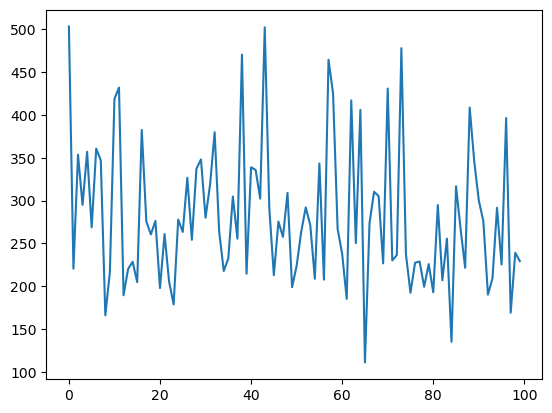

In [24]:
plt.plot(tmp, np.array([l.cpu().detach() for l in loss_list]))

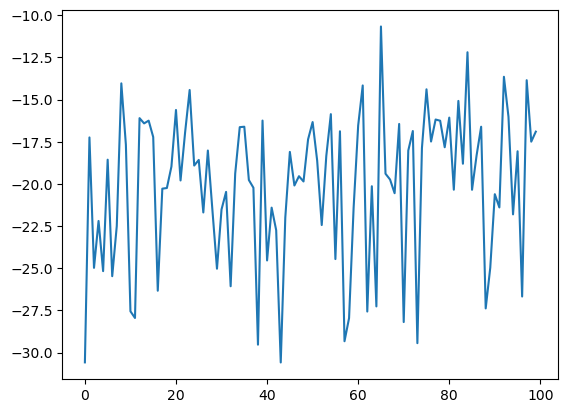

In [25]:
plt.plot(tmp, np.array([l.cpu().detach() for l in reward_list]))

In [26]:
o = []
for i in range(N):
    o.append(observations[200*(i+1)-200:200*(i+1)])

In [27]:
o_old = o.copy()
o = [j for i, j in enumerate(o) if i%10==0]

In [28]:
o = o_old[-10:]

In [29]:
x_ = [i+1 for i in range(200)]

In [30]:
np.array(o).shape

(10, 200, 3)

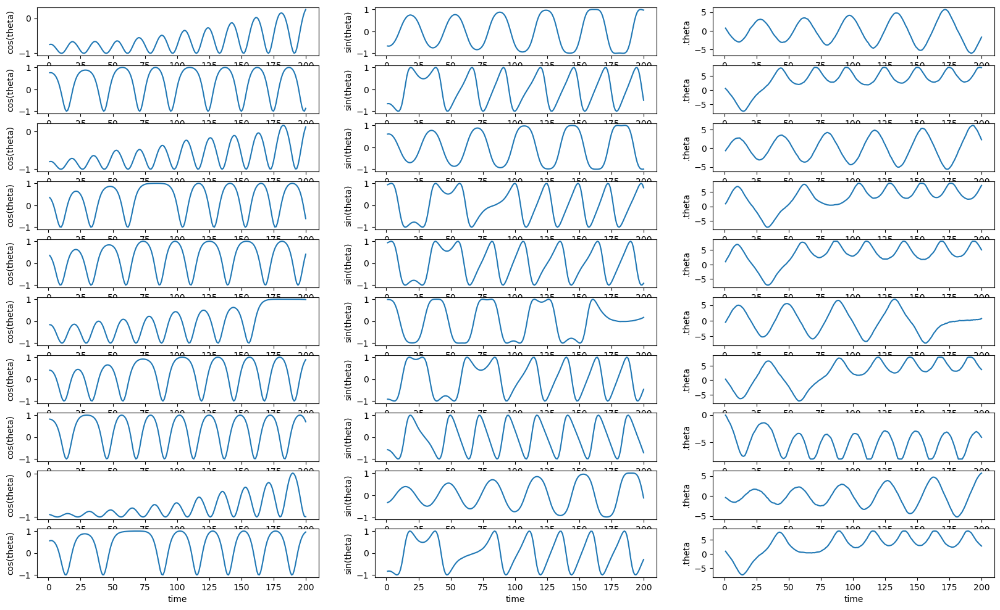

In [31]:
N = 10
plt.figure(1, figsize=(20, 12))
for i in range(N):
    obs = o[i]
    # print(obs)
    theta_ = []
    x_list = []
    y_list = []
    for x,y,v in obs:
        # print(x, y)
        theta_.append(v)
        x_list.append(x)
        y_list.append(y)
    plt.subplot(N, 3, 3*i+1)
    plt.plot(x_, x_list)
    plt.xlabel('time')
    plt.ylabel('cos(theta)')
    plt.subplot(N, 3, 3*i+2)
    plt.plot(x_, y_list)
    plt.xlabel('time')
    plt.ylabel('sin(theta)')
    plt.subplot(N, 3, 3*i+3)
    plt.plot(x_, theta_)
    plt.xlabel('time')
    plt.ylabel('.theta')

In [32]:
len(total_losses)

24000

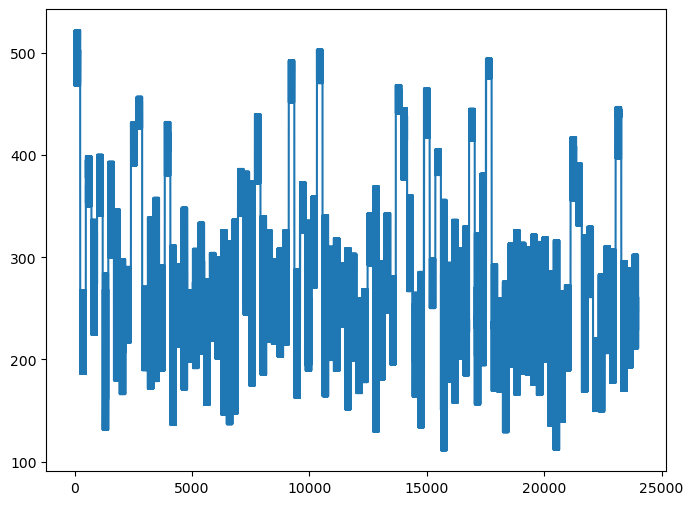

In [33]:
x = np.arange(len(total_losses))
y = [float(x) for x in total_losses]
plt.figure(figsize=(8, 6))
plt.plot(x, y)

## No Clipping and GAE

In [34]:
N = 100 # number of times to collect new trajectories and update actor
M = 1 # num of trajectories
max_trajectory_len = 200 # trajectory length
batch_size = 25 # size for minibatch
n_epochs = 30 # number of epochs to optimize loss
alpha = 0.0001
hidden_layers = 2
hidden_dims = 64
gamma = 0.7
lmbda = 0.9
clip_value = 0.1
use_gae = True
use_clip = False

total_losses, observations, loss_list, reward_list = ppo(
    N, M, max_trajectory_len, batch_size, alpha, hidden_layers, hidden_dims,
    gamma, lmbda, clip_value, use_gae, use_clip)

n: 0, epoch: 0, minibatch no.: 0,
total_loss: 200.5260205663566, actor_loss: 17.329687385559083, critic_loss: 366.39266636159505
n: 0, epoch: 0, minibatch no.: 1,
total_loss: 195.08521698737903, actor_loss: 16.78714237213135, critic_loss: 356.59614923049537
n: 0, epoch: 0, minibatch no.: 2,
total_loss: 147.35535457885157, actor_loss: 14.529626655578614, critic_loss: 265.6514558465459
n: 0, epoch: 0, minibatch no.: 3,
total_loss: 158.68407448909122, actor_loss: 14.849791202545166, critic_loss: 287.6685665730921
n: 0, epoch: 0, minibatch no.: 4,
total_loss: 171.67226555511826, actor_loss: 15.85025463104248, critic_loss: 311.64402184815157
n: 0, epoch: 0, minibatch no.: 5,
total_loss: 162.1356629426337, actor_loss: 15.551955394744873, critic_loss: 293.16741509577764
n: 0, epoch: 0, minibatch no.: 6,
total_loss: 153.20450188401838, actor_loss: 14.66350305557251, critic_loss: 277.08199765689176
n: 0, epoch: 0, minibatch no.: 7,
total_loss: 179.65789532845324, actor_loss: 15.99015911102295, 

n: 0, epoch: 8, minibatch no.: 0,
total_loss: 200.5260205663566, actor_loss: 17.329687385559083, critic_loss: 366.39266636159505
n: 0, epoch: 8, minibatch no.: 1,
total_loss: 195.08521698737903, actor_loss: 16.78714237213135, critic_loss: 356.59614923049537
n: 0, epoch: 8, minibatch no.: 2,
total_loss: 147.35535457885157, actor_loss: 14.529626655578614, critic_loss: 265.6514558465459
n: 0, epoch: 8, minibatch no.: 3,
total_loss: 158.68407448909122, actor_loss: 14.849791202545166, critic_loss: 287.6685665730921
n: 0, epoch: 8, minibatch no.: 4,
total_loss: 171.67226555511826, actor_loss: 15.85025463104248, critic_loss: 311.64402184815157
n: 0, epoch: 8, minibatch no.: 5,
total_loss: 162.1356629426337, actor_loss: 15.551955394744873, critic_loss: 293.16741509577764
n: 0, epoch: 8, minibatch no.: 6,
total_loss: 153.20450188401838, actor_loss: 14.66350305557251, critic_loss: 277.08199765689176
n: 0, epoch: 8, minibatch no.: 7,
total_loss: 179.65789532845324, actor_loss: 15.99015911102295, 

n: 0, epoch: 16, minibatch no.: 0,
total_loss: 200.5260205663566, actor_loss: 17.329687385559083, critic_loss: 366.39266636159505
n: 0, epoch: 16, minibatch no.: 1,
total_loss: 195.08521698737903, actor_loss: 16.78714237213135, critic_loss: 356.59614923049537
n: 0, epoch: 16, minibatch no.: 2,
total_loss: 147.35535457885157, actor_loss: 14.529626655578614, critic_loss: 265.6514558465459
n: 0, epoch: 16, minibatch no.: 3,
total_loss: 158.68407448909122, actor_loss: 14.849791202545166, critic_loss: 287.6685665730921
n: 0, epoch: 16, minibatch no.: 4,
total_loss: 171.67226555511826, actor_loss: 15.85025463104248, critic_loss: 311.64402184815157
n: 0, epoch: 16, minibatch no.: 5,
total_loss: 162.1356629426337, actor_loss: 15.551955394744873, critic_loss: 293.16741509577764
n: 0, epoch: 16, minibatch no.: 6,
total_loss: 153.20450188401838, actor_loss: 14.66350305557251, critic_loss: 277.08199765689176
n: 0, epoch: 16, minibatch no.: 7,
total_loss: 179.65789532845324, actor_loss: 15.99015911

n: 0, epoch: 24, minibatch no.: 1,
total_loss: 195.08521698737903, actor_loss: 16.78714237213135, critic_loss: 356.59614923049537
n: 0, epoch: 24, minibatch no.: 2,
total_loss: 147.35535457885157, actor_loss: 14.529626655578614, critic_loss: 265.6514558465459
n: 0, epoch: 24, minibatch no.: 3,
total_loss: 158.68407448909122, actor_loss: 14.849791202545166, critic_loss: 287.6685665730921
n: 0, epoch: 24, minibatch no.: 4,
total_loss: 171.67226555511826, actor_loss: 15.85025463104248, critic_loss: 311.64402184815157
n: 0, epoch: 24, minibatch no.: 5,
total_loss: 162.1356629426337, actor_loss: 15.551955394744873, critic_loss: 293.16741509577764
n: 0, epoch: 24, minibatch no.: 6,
total_loss: 153.20450188401838, actor_loss: 14.66350305557251, critic_loss: 277.08199765689176
n: 0, epoch: 24, minibatch no.: 7,
total_loss: 179.65789532845324, actor_loss: 15.99015911102295, critic_loss: 327.33547243486055
n: 0, epoch: 25, minibatch no.: 0,
total_loss: 200.5260205663566, actor_loss: 17.329687385

n: 1, epoch: 2, minibatch no.: 2,
total_loss: 168.95710715270235, actor_loss: 16.41557399749756, critic_loss: 305.0830663104096
n: 1, epoch: 2, minibatch no.: 3,
total_loss: 160.64608875193483, actor_loss: 15.94420124053955, critic_loss: 289.40377502279057
n: 1, epoch: 2, minibatch no.: 4,
total_loss: 206.63021121357008, actor_loss: 18.6271227645874, critic_loss: 376.00617689796536
n: 1, epoch: 2, minibatch no.: 5,
total_loss: 159.42140426073033, actor_loss: 16.092956085205078, critic_loss: 286.6568963510505
n: 1, epoch: 2, minibatch no.: 6,
total_loss: 189.63663215888954, actor_loss: 17.17195655822754, critic_loss: 344.929351201324
n: 1, epoch: 2, minibatch no.: 7,
total_loss: 205.82981613668952, actor_loss: 18.594216766357423, critic_loss: 374.4711987406642
n: 1, epoch: 3, minibatch no.: 0,
total_loss: 226.11463740812667, actor_loss: 19.53414863586426, critic_loss: 413.1609775445248
n: 1, epoch: 3, minibatch no.: 1,
total_loss: 189.3089301522254, actor_loss: 17.476396408081055, criti

n: 1, epoch: 10, minibatch no.: 2,
total_loss: 168.95710715270235, actor_loss: 16.41557399749756, critic_loss: 305.0830663104096
n: 1, epoch: 10, minibatch no.: 3,
total_loss: 160.64608875193483, actor_loss: 15.94420124053955, critic_loss: 289.40377502279057
n: 1, epoch: 10, minibatch no.: 4,
total_loss: 206.63021121357008, actor_loss: 18.6271227645874, critic_loss: 376.00617689796536
n: 1, epoch: 10, minibatch no.: 5,
total_loss: 159.42140426073033, actor_loss: 16.092956085205078, critic_loss: 286.6568963510505
n: 1, epoch: 10, minibatch no.: 6,
total_loss: 189.63663215888954, actor_loss: 17.17195655822754, critic_loss: 344.929351201324
n: 1, epoch: 10, minibatch no.: 7,
total_loss: 205.82981613668952, actor_loss: 18.594216766357423, critic_loss: 374.4711987406642
n: 1, epoch: 11, minibatch no.: 0,
total_loss: 226.11463740812667, actor_loss: 19.53414863586426, critic_loss: 413.1609775445248
n: 1, epoch: 11, minibatch no.: 1,
total_loss: 189.3089301522254, actor_loss: 17.47639640808105

n: 1, epoch: 18, minibatch no.: 3,
total_loss: 160.64608875193483, actor_loss: 15.94420124053955, critic_loss: 289.40377502279057
n: 1, epoch: 18, minibatch no.: 4,
total_loss: 206.63021121357008, actor_loss: 18.6271227645874, critic_loss: 376.00617689796536
n: 1, epoch: 18, minibatch no.: 5,
total_loss: 159.42140426073033, actor_loss: 16.092956085205078, critic_loss: 286.6568963510505
n: 1, epoch: 18, minibatch no.: 6,
total_loss: 189.63663215888954, actor_loss: 17.17195655822754, critic_loss: 344.929351201324
n: 1, epoch: 18, minibatch no.: 7,
total_loss: 205.82981613668952, actor_loss: 18.594216766357423, critic_loss: 374.4711987406642
n: 1, epoch: 19, minibatch no.: 0,
total_loss: 226.11463740812667, actor_loss: 19.53414863586426, critic_loss: 413.1609775445248
n: 1, epoch: 19, minibatch no.: 1,
total_loss: 189.3089301522254, actor_loss: 17.476396408081055, critic_loss: 343.6650674882887
n: 1, epoch: 19, minibatch no.: 2,
total_loss: 168.95710715270235, actor_loss: 16.4155739974975

n: 1, epoch: 26, minibatch no.: 4,
total_loss: 206.63021121357008, actor_loss: 18.6271227645874, critic_loss: 376.00617689796536
n: 1, epoch: 26, minibatch no.: 5,
total_loss: 159.42140426073033, actor_loss: 16.092956085205078, critic_loss: 286.6568963510505
n: 1, epoch: 26, minibatch no.: 6,
total_loss: 189.63663215888954, actor_loss: 17.17195655822754, critic_loss: 344.929351201324
n: 1, epoch: 26, minibatch no.: 7,
total_loss: 205.82981613668952, actor_loss: 18.594216766357423, critic_loss: 374.4711987406642
n: 1, epoch: 27, minibatch no.: 0,
total_loss: 226.11463740812667, actor_loss: 19.53414863586426, critic_loss: 413.1609775445248
n: 1, epoch: 27, minibatch no.: 1,
total_loss: 189.3089301522254, actor_loss: 17.476396408081055, critic_loss: 343.6650674882887
n: 1, epoch: 27, minibatch no.: 2,
total_loss: 168.95710715270235, actor_loss: 16.41557399749756, critic_loss: 305.0830663104096
n: 1, epoch: 27, minibatch no.: 3,
total_loss: 160.64608875193483, actor_loss: 15.94420124053955

n: 2, epoch: 4, minibatch no.: 6,
total_loss: 155.62985172099818, actor_loss: 13.486495761871339, critic_loss: 284.2867119182537
n: 2, epoch: 4, minibatch no.: 7,
total_loss: 148.68897634209839, actor_loss: 13.65735248565674, critic_loss: 270.0632477128833
n: 2, epoch: 5, minibatch no.: 0,
total_loss: 143.83995295632758, actor_loss: 13.312395439147949, critic_loss: 261.05511503435923
n: 2, epoch: 5, minibatch no.: 1,
total_loss: 173.76132097521776, actor_loss: 15.115428094863892, critic_loss: 317.29178576070774
n: 2, epoch: 5, minibatch no.: 2,
total_loss: 116.43387867503343, actor_loss: 12.183700218200684, critic_loss: 208.50035691366548
n: 2, epoch: 5, minibatch no.: 3,
total_loss: 171.45286081609248, actor_loss: 14.924006547927856, critic_loss: 313.05770853632924
n: 2, epoch: 5, minibatch no.: 4,
total_loss: 181.69078585440877, actor_loss: 15.206490898132325, critic_loss: 332.9685899125529
n: 2, epoch: 5, minibatch no.: 5,
total_loss: 140.53804841973593, actor_loss: 12.8674939537048

n: 2, epoch: 13, minibatch no.: 0,
total_loss: 143.83995295632758, actor_loss: 13.312395439147949, critic_loss: 261.05511503435923
n: 2, epoch: 13, minibatch no.: 1,
total_loss: 173.76132097521776, actor_loss: 15.115428094863892, critic_loss: 317.29178576070774
n: 2, epoch: 13, minibatch no.: 2,
total_loss: 116.43387867503343, actor_loss: 12.183700218200684, critic_loss: 208.50035691366548
n: 2, epoch: 13, minibatch no.: 3,
total_loss: 171.45286081609248, actor_loss: 14.924006547927856, critic_loss: 313.05770853632924
n: 2, epoch: 13, minibatch no.: 4,
total_loss: 181.69078585440877, actor_loss: 15.206490898132325, critic_loss: 332.9685899125529
n: 2, epoch: 13, minibatch no.: 5,
total_loss: 140.53804841973593, actor_loss: 12.867493953704834, critic_loss: 255.3411089320622
n: 2, epoch: 13, minibatch no.: 6,
total_loss: 155.62985172099818, actor_loss: 13.486495761871339, critic_loss: 284.2867119182537
n: 2, epoch: 13, minibatch no.: 7,
total_loss: 148.68897634209839, actor_loss: 13.6573

n: 2, epoch: 20, minibatch no.: 7,
total_loss: 148.68897634209839, actor_loss: 13.65735248565674, critic_loss: 270.0632477128833
n: 2, epoch: 21, minibatch no.: 0,
total_loss: 143.83995295632758, actor_loss: 13.312395439147949, critic_loss: 261.05511503435923
n: 2, epoch: 21, minibatch no.: 1,
total_loss: 173.76132097521776, actor_loss: 15.115428094863892, critic_loss: 317.29178576070774
n: 2, epoch: 21, minibatch no.: 2,
total_loss: 116.43387867503343, actor_loss: 12.183700218200684, critic_loss: 208.50035691366548
n: 2, epoch: 21, minibatch no.: 3,
total_loss: 171.45286081609248, actor_loss: 14.924006547927856, critic_loss: 313.05770853632924
n: 2, epoch: 21, minibatch no.: 4,
total_loss: 181.69078585440877, actor_loss: 15.206490898132325, critic_loss: 332.9685899125529
n: 2, epoch: 21, minibatch no.: 5,
total_loss: 140.53804841973593, actor_loss: 12.867493953704834, critic_loss: 255.3411089320622
n: 2, epoch: 21, minibatch no.: 6,
total_loss: 155.62985172099818, actor_loss: 13.48649

n: 2, epoch: 29, minibatch no.: 1,
total_loss: 173.76132097521776, actor_loss: 15.115428094863892, critic_loss: 317.29178576070774
n: 2, epoch: 29, minibatch no.: 2,
total_loss: 116.43387867503343, actor_loss: 12.183700218200684, critic_loss: 208.50035691366548
n: 2, epoch: 29, minibatch no.: 3,
total_loss: 171.45286081609248, actor_loss: 14.924006547927856, critic_loss: 313.05770853632924
n: 2, epoch: 29, minibatch no.: 4,
total_loss: 181.69078585440877, actor_loss: 15.206490898132325, critic_loss: 332.9685899125529
n: 2, epoch: 29, minibatch no.: 5,
total_loss: 140.53804841973593, actor_loss: 12.867493953704834, critic_loss: 255.3411089320622
n: 2, epoch: 29, minibatch no.: 6,
total_loss: 155.62985172099818, actor_loss: 13.486495761871339, critic_loss: 284.2867119182537
n: 2, epoch: 29, minibatch no.: 7,
total_loss: 148.68897634209839, actor_loss: 13.65735248565674, critic_loss: 270.0632477128833
n: 3, epoch: 0, minibatch no.: 0,
total_loss: 157.27648280434408, actor_loss: 14.1075329

n: 3, epoch: 7, minibatch no.: 4,
total_loss: 169.65924002241064, actor_loss: 15.10775652885437, critic_loss: 309.10296698711255
n: 3, epoch: 7, minibatch no.: 5,
total_loss: 111.64239384804513, actor_loss: 11.39333354473114, critic_loss: 200.498120606628
n: 3, epoch: 7, minibatch no.: 6,
total_loss: 209.75583651316376, actor_loss: 17.66382374763489, critic_loss: 384.1840255310577
n: 3, epoch: 7, minibatch no.: 7,
total_loss: 166.11266993965847, actor_loss: 14.499098691940308, critic_loss: 303.22714249543634
n: 3, epoch: 8, minibatch no.: 0,
total_loss: 157.27648280434408, actor_loss: 14.107532997131347, critic_loss: 286.33789961442545
n: 3, epoch: 8, minibatch no.: 1,
total_loss: 183.39800039599467, actor_loss: 15.697408084869386, critic_loss: 335.4011846222506
n: 3, epoch: 8, minibatch no.: 2,
total_loss: 120.11125414527174, actor_loss: 12.34054015159607, critic_loss: 215.54142798735134
n: 3, epoch: 8, minibatch no.: 3,
total_loss: 164.71034110143748, actor_loss: 14.785471954345704, 

n: 3, epoch: 15, minibatch no.: 6,
total_loss: 209.75583651316376, actor_loss: 17.66382374763489, critic_loss: 384.1840255310577
n: 3, epoch: 15, minibatch no.: 7,
total_loss: 166.11266993965847, actor_loss: 14.499098691940308, critic_loss: 303.22714249543634
n: 3, epoch: 16, minibatch no.: 0,
total_loss: 157.27648280434408, actor_loss: 14.107532997131347, critic_loss: 286.33789961442545
n: 3, epoch: 16, minibatch no.: 1,
total_loss: 183.39800039599467, actor_loss: 15.697408084869386, critic_loss: 335.4011846222506
n: 3, epoch: 16, minibatch no.: 2,
total_loss: 120.11125414527174, actor_loss: 12.34054015159607, critic_loss: 215.54142798735134
n: 3, epoch: 16, minibatch no.: 3,
total_loss: 164.71034110143748, actor_loss: 14.785471954345704, critic_loss: 299.84973829418357
n: 3, epoch: 16, minibatch no.: 4,
total_loss: 169.65924002241064, actor_loss: 15.10775652885437, critic_loss: 309.10296698711255
n: 3, epoch: 16, minibatch no.: 5,
total_loss: 111.64239384804513, actor_loss: 11.393333

n: 3, epoch: 23, minibatch no.: 6,
total_loss: 209.75583651316376, actor_loss: 17.66382374763489, critic_loss: 384.1840255310577
n: 3, epoch: 23, minibatch no.: 7,
total_loss: 166.11266993965847, actor_loss: 14.499098691940308, critic_loss: 303.22714249543634
n: 3, epoch: 24, minibatch no.: 0,
total_loss: 157.27648280434408, actor_loss: 14.107532997131347, critic_loss: 286.33789961442545
n: 3, epoch: 24, minibatch no.: 1,
total_loss: 183.39800039599467, actor_loss: 15.697408084869386, critic_loss: 335.4011846222506
n: 3, epoch: 24, minibatch no.: 2,
total_loss: 120.11125414527174, actor_loss: 12.34054015159607, critic_loss: 215.54142798735134
n: 3, epoch: 24, minibatch no.: 3,
total_loss: 164.71034110143748, actor_loss: 14.785471954345704, critic_loss: 299.84973829418357
n: 3, epoch: 24, minibatch no.: 4,
total_loss: 169.65924002241064, actor_loss: 15.10775652885437, critic_loss: 309.10296698711255
n: 3, epoch: 24, minibatch no.: 5,
total_loss: 111.64239384804513, actor_loss: 11.393333

n: 4, epoch: 2, minibatch no.: 1,
total_loss: 171.14973192950814, actor_loss: 14.850796098709107, critic_loss: 312.59787166159805
n: 4, epoch: 2, minibatch no.: 2,
total_loss: 175.4792686671523, actor_loss: 14.013324303627014, critic_loss: 322.9318887270506
n: 4, epoch: 2, minibatch no.: 3,
total_loss: 130.39817629861886, actor_loss: 11.199001138210297, critic_loss: 238.39835032081712
n: 4, epoch: 2, minibatch no.: 4,
total_loss: 135.71412832001263, actor_loss: 11.918028478622437, critic_loss: 247.59219968278038
n: 4, epoch: 2, minibatch no.: 5,
total_loss: 163.16278197413686, actor_loss: 14.931771006584167, critic_loss: 296.4620219351054
n: 4, epoch: 2, minibatch no.: 6,
total_loss: 160.78769606257273, actor_loss: 13.424481554031372, critic_loss: 294.72642901708275
n: 4, epoch: 2, minibatch no.: 7,
total_loss: 102.22022987348868, actor_loss: 10.375855374336243, critic_loss: 183.68874899830487
n: 4, epoch: 3, minibatch no.: 0,
total_loss: 158.81838137030766, actor_loss: 13.895525999069

n: 4, epoch: 10, minibatch no.: 3,
total_loss: 130.39817629861886, actor_loss: 11.199001138210297, critic_loss: 238.39835032081712
n: 4, epoch: 10, minibatch no.: 4,
total_loss: 135.71412832001263, actor_loss: 11.918028478622437, critic_loss: 247.59219968278038
n: 4, epoch: 10, minibatch no.: 5,
total_loss: 163.16278197413686, actor_loss: 14.931771006584167, critic_loss: 296.4620219351054
n: 4, epoch: 10, minibatch no.: 6,
total_loss: 160.78769606257273, actor_loss: 13.424481554031372, critic_loss: 294.72642901708275
n: 4, epoch: 10, minibatch no.: 7,
total_loss: 102.22022987348868, actor_loss: 10.375855374336243, critic_loss: 183.68874899830487
n: 4, epoch: 11, minibatch no.: 0,
total_loss: 158.81838137030766, actor_loss: 13.895525999069214, critic_loss: 289.8457107424769
n: 4, epoch: 11, minibatch no.: 1,
total_loss: 171.14973192950814, actor_loss: 14.850796098709107, critic_loss: 312.59787166159805
n: 4, epoch: 11, minibatch no.: 2,
total_loss: 175.4792686671523, actor_loss: 14.0133

n: 4, epoch: 18, minibatch no.: 5,
total_loss: 163.16278197413686, actor_loss: 14.931771006584167, critic_loss: 296.4620219351054
n: 4, epoch: 18, minibatch no.: 6,
total_loss: 160.78769606257273, actor_loss: 13.424481554031372, critic_loss: 294.72642901708275
n: 4, epoch: 18, minibatch no.: 7,
total_loss: 102.22022987348868, actor_loss: 10.375855374336243, critic_loss: 183.68874899830487
n: 4, epoch: 19, minibatch no.: 0,
total_loss: 158.81838137030766, actor_loss: 13.895525999069214, critic_loss: 289.8457107424769
n: 4, epoch: 19, minibatch no.: 1,
total_loss: 171.14973192950814, actor_loss: 14.850796098709107, critic_loss: 312.59787166159805
n: 4, epoch: 19, minibatch no.: 2,
total_loss: 175.4792686671523, actor_loss: 14.013324303627014, critic_loss: 322.9318887270506
n: 4, epoch: 19, minibatch no.: 3,
total_loss: 130.39817629861886, actor_loss: 11.199001138210297, critic_loss: 238.39835032081712
n: 4, epoch: 19, minibatch no.: 4,
total_loss: 135.71412832001263, actor_loss: 11.91802

n: 4, epoch: 26, minibatch no.: 7,
total_loss: 102.22022987348868, actor_loss: 10.375855374336243, critic_loss: 183.68874899830487
n: 4, epoch: 27, minibatch no.: 0,
total_loss: 158.81838137030766, actor_loss: 13.895525999069214, critic_loss: 289.8457107424769
n: 4, epoch: 27, minibatch no.: 1,
total_loss: 171.14973192950814, actor_loss: 14.850796098709107, critic_loss: 312.59787166159805
n: 4, epoch: 27, minibatch no.: 2,
total_loss: 175.4792686671523, actor_loss: 14.013324303627014, critic_loss: 322.9318887270506
n: 4, epoch: 27, minibatch no.: 3,
total_loss: 130.39817629861886, actor_loss: 11.199001138210297, critic_loss: 238.39835032081712
n: 4, epoch: 27, minibatch no.: 4,
total_loss: 135.71412832001263, actor_loss: 11.918028478622437, critic_loss: 247.59219968278038
n: 4, epoch: 27, minibatch no.: 5,
total_loss: 163.16278197413686, actor_loss: 14.931771006584167, critic_loss: 296.4620219351054
n: 4, epoch: 27, minibatch no.: 6,
total_loss: 160.78769606257273, actor_loss: 13.42448

n: 5, epoch: 5, minibatch no.: 2,
total_loss: 352.4105223550141, actor_loss: 25.56145034790039, critic_loss: 653.6981440142274
n: 5, epoch: 5, minibatch no.: 3,
total_loss: 349.02520649513457, actor_loss: 25.431348342895507, critic_loss: 647.1877163044782
n: 5, epoch: 5, minibatch no.: 4,
total_loss: 341.175042236645, actor_loss: 24.926062202453615, critic_loss: 632.4979600683828
n: 5, epoch: 5, minibatch no.: 5,
total_loss: 341.1948335204124, actor_loss: 25.127630462646486, critic_loss: 632.1344061155318
n: 5, epoch: 5, minibatch no.: 6,
total_loss: 338.717907891316, actor_loss: 24.950320434570312, critic_loss: 627.5351749134913
n: 5, epoch: 5, minibatch no.: 7,
total_loss: 335.27133568738964, actor_loss: 24.877955703735353, critic_loss: 620.7867599673085
n: 5, epoch: 6, minibatch no.: 0,
total_loss: 336.94481372692485, actor_loss: 24.93282341003418, critic_loss: 624.0239806337813
n: 5, epoch: 6, minibatch no.: 1,
total_loss: 343.9549561119853, actor_loss: 25.236933975219728, critic_l

n: 5, epoch: 13, minibatch no.: 4,
total_loss: 341.175042236645, actor_loss: 24.926062202453615, critic_loss: 632.4979600683828
n: 5, epoch: 13, minibatch no.: 5,
total_loss: 341.1948335204124, actor_loss: 25.127630462646486, critic_loss: 632.1344061155318
n: 5, epoch: 13, minibatch no.: 6,
total_loss: 338.717907891316, actor_loss: 24.950320434570312, critic_loss: 627.5351749134913
n: 5, epoch: 13, minibatch no.: 7,
total_loss: 335.27133568738964, actor_loss: 24.877955703735353, critic_loss: 620.7867599673085
n: 5, epoch: 14, minibatch no.: 0,
total_loss: 336.94481372692485, actor_loss: 24.93282341003418, critic_loss: 624.0239806337813
n: 5, epoch: 14, minibatch no.: 1,
total_loss: 343.9549561119853, actor_loss: 25.236933975219728, critic_loss: 637.4360442735311
n: 5, epoch: 14, minibatch no.: 2,
total_loss: 352.4105223550141, actor_loss: 25.56145034790039, critic_loss: 653.6981440142274
n: 5, epoch: 14, minibatch no.: 3,
total_loss: 349.02520649513457, actor_loss: 25.431348342895507, 

n: 5, epoch: 21, minibatch no.: 6,
total_loss: 338.717907891316, actor_loss: 24.950320434570312, critic_loss: 627.5351749134913
n: 5, epoch: 21, minibatch no.: 7,
total_loss: 335.27133568738964, actor_loss: 24.877955703735353, critic_loss: 620.7867599673085
n: 5, epoch: 22, minibatch no.: 0,
total_loss: 336.94481372692485, actor_loss: 24.93282341003418, critic_loss: 624.0239806337813
n: 5, epoch: 22, minibatch no.: 1,
total_loss: 343.9549561119853, actor_loss: 25.236933975219728, critic_loss: 637.4360442735311
n: 5, epoch: 22, minibatch no.: 2,
total_loss: 352.4105223550141, actor_loss: 25.56145034790039, critic_loss: 653.6981440142274
n: 5, epoch: 22, minibatch no.: 3,
total_loss: 349.02520649513457, actor_loss: 25.431348342895507, critic_loss: 647.1877163044782
n: 5, epoch: 22, minibatch no.: 4,
total_loss: 341.175042236645, actor_loss: 24.926062202453615, critic_loss: 632.4979600683828
n: 5, epoch: 22, minibatch no.: 5,
total_loss: 341.1948335204124, actor_loss: 25.127630462646486, 

n: 5, epoch: 29, minibatch no.: 6,
total_loss: 338.717907891316, actor_loss: 24.950320434570312, critic_loss: 627.5351749134913
n: 5, epoch: 29, minibatch no.: 7,
total_loss: 335.27133568738964, actor_loss: 24.877955703735353, critic_loss: 620.7867599673085
n: 6, epoch: 0, minibatch no.: 0,
total_loss: 213.38447350119367, actor_loss: 17.92417491912842, critic_loss: 390.92059716413047
n: 6, epoch: 0, minibatch no.: 1,
total_loss: 128.5856194706648, actor_loss: 12.915607662200928, critic_loss: 231.34002361692774
n: 6, epoch: 0, minibatch no.: 2,
total_loss: 208.24973455427215, actor_loss: 17.594887142181395, critic_loss: 381.3096948241815
n: 6, epoch: 0, minibatch no.: 3,
total_loss: 146.457153791446, actor_loss: 14.64529857635498, critic_loss: 263.62371043018203
n: 6, epoch: 0, minibatch no.: 4,
total_loss: 191.69222621828638, actor_loss: 17.355010261535647, critic_loss: 348.67443191350145
n: 6, epoch: 0, minibatch no.: 5,
total_loss: 167.22765733985548, actor_loss: 15.32341630935669, c

n: 6, epoch: 8, minibatch no.: 2,
total_loss: 208.24973455427215, actor_loss: 17.594887142181395, critic_loss: 381.3096948241815
n: 6, epoch: 8, minibatch no.: 3,
total_loss: 146.457153791446, actor_loss: 14.64529857635498, critic_loss: 263.62371043018203
n: 6, epoch: 8, minibatch no.: 4,
total_loss: 191.69222621828638, actor_loss: 17.355010261535647, critic_loss: 348.67443191350145
n: 6, epoch: 8, minibatch no.: 5,
total_loss: 167.22765733985548, actor_loss: 15.32341630935669, critic_loss: 303.80848206099756
n: 6, epoch: 8, minibatch no.: 6,
total_loss: 150.15634644561865, actor_loss: 14.16340410232544, critic_loss: 271.9858846865864
n: 6, epoch: 8, minibatch no.: 7,
total_loss: 163.20096865706495, actor_loss: 15.498475303649903, critic_loss: 295.4049867068301
n: 6, epoch: 9, minibatch no.: 0,
total_loss: 213.38447350119367, actor_loss: 17.92417491912842, critic_loss: 390.92059716413047
n: 6, epoch: 9, minibatch no.: 1,
total_loss: 128.5856194706648, actor_loss: 12.915607662200928, cr

n: 6, epoch: 16, minibatch no.: 4,
total_loss: 191.69222621828638, actor_loss: 17.355010261535647, critic_loss: 348.67443191350145
n: 6, epoch: 16, minibatch no.: 5,
total_loss: 167.22765733985548, actor_loss: 15.32341630935669, critic_loss: 303.80848206099756
n: 6, epoch: 16, minibatch no.: 6,
total_loss: 150.15634644561865, actor_loss: 14.16340410232544, critic_loss: 271.9858846865864
n: 6, epoch: 16, minibatch no.: 7,
total_loss: 163.20096865706495, actor_loss: 15.498475303649903, critic_loss: 295.4049867068301
n: 6, epoch: 17, minibatch no.: 0,
total_loss: 213.38447350119367, actor_loss: 17.92417491912842, critic_loss: 390.92059716413047
n: 6, epoch: 17, minibatch no.: 1,
total_loss: 128.5856194706648, actor_loss: 12.915607662200928, critic_loss: 231.34002361692774
n: 6, epoch: 17, minibatch no.: 2,
total_loss: 208.24973455427215, actor_loss: 17.594887142181395, critic_loss: 381.3096948241815
n: 6, epoch: 17, minibatch no.: 3,
total_loss: 146.457153791446, actor_loss: 14.6452985763

n: 6, epoch: 24, minibatch no.: 5,
total_loss: 167.22765733985548, actor_loss: 15.32341630935669, critic_loss: 303.80848206099756
n: 6, epoch: 24, minibatch no.: 6,
total_loss: 150.15634644561865, actor_loss: 14.16340410232544, critic_loss: 271.9858846865864
n: 6, epoch: 24, minibatch no.: 7,
total_loss: 163.20096865706495, actor_loss: 15.498475303649903, critic_loss: 295.4049867068301
n: 6, epoch: 25, minibatch no.: 0,
total_loss: 213.38447350119367, actor_loss: 17.92417491912842, critic_loss: 390.92059716413047
n: 6, epoch: 25, minibatch no.: 1,
total_loss: 128.5856194706648, actor_loss: 12.915607662200928, critic_loss: 231.34002361692774
n: 6, epoch: 25, minibatch no.: 2,
total_loss: 208.24973455427215, actor_loss: 17.594887142181395, critic_loss: 381.3096948241815
n: 6, epoch: 25, minibatch no.: 3,
total_loss: 146.457153791446, actor_loss: 14.64529857635498, critic_loss: 263.62371043018203
n: 6, epoch: 25, minibatch no.: 4,
total_loss: 191.69222621828638, actor_loss: 17.35501026153

n: 7, epoch: 2, minibatch no.: 7,
total_loss: 314.7308840341065, actor_loss: 24.070887985229493, critic_loss: 581.319992097754
n: 7, epoch: 3, minibatch no.: 0,
total_loss: 328.33844018471586, actor_loss: 24.621202545166017, critic_loss: 607.4344752790997
n: 7, epoch: 3, minibatch no.: 1,
total_loss: 327.81636106999156, actor_loss: 24.58001968383789, critic_loss: 606.4726827723073
n: 7, epoch: 3, minibatch no.: 2,
total_loss: 330.1122906283776, actor_loss: 24.693935165405275, critic_loss: 610.8367109259447
n: 7, epoch: 3, minibatch no.: 3,
total_loss: 308.9361422531457, actor_loss: 23.786536560058593, critic_loss: 570.2992113861742
n: 7, epoch: 3, minibatch no.: 4,
total_loss: 335.03604374113036, actor_loss: 24.880250930786133, critic_loss: 620.3115856206884
n: 7, epoch: 3, minibatch no.: 5,
total_loss: 320.60627491492716, actor_loss: 24.147702560424804, critic_loss: 592.9171447090047
n: 7, epoch: 3, minibatch no.: 6,
total_loss: 339.5665788922248, actor_loss: 25.058685607910157, criti

n: 7, epoch: 11, minibatch no.: 0,
total_loss: 328.33844018471586, actor_loss: 24.621202545166017, critic_loss: 607.4344752790997
n: 7, epoch: 11, minibatch no.: 1,
total_loss: 327.81636106999156, actor_loss: 24.58001968383789, critic_loss: 606.4726827723073
n: 7, epoch: 11, minibatch no.: 2,
total_loss: 330.1122906283776, actor_loss: 24.693935165405275, critic_loss: 610.8367109259447
n: 7, epoch: 11, minibatch no.: 3,
total_loss: 308.9361422531457, actor_loss: 23.786536560058593, critic_loss: 570.2992113861742
n: 7, epoch: 11, minibatch no.: 4,
total_loss: 335.03604374113036, actor_loss: 24.880250930786133, critic_loss: 620.3115856206884
n: 7, epoch: 11, minibatch no.: 5,
total_loss: 320.60627491492716, actor_loss: 24.147702560424804, critic_loss: 592.9171447090047
n: 7, epoch: 11, minibatch no.: 6,
total_loss: 339.5665788922248, actor_loss: 25.058685607910157, critic_loss: 629.0157865686293
n: 7, epoch: 11, minibatch no.: 7,
total_loss: 314.7308840341065, actor_loss: 24.0708879852294

n: 7, epoch: 19, minibatch no.: 1,
total_loss: 327.81636106999156, actor_loss: 24.58001968383789, critic_loss: 606.4726827723073
n: 7, epoch: 19, minibatch no.: 2,
total_loss: 330.1122906283776, actor_loss: 24.693935165405275, critic_loss: 610.8367109259447
n: 7, epoch: 19, minibatch no.: 3,
total_loss: 308.9361422531457, actor_loss: 23.786536560058593, critic_loss: 570.2992113861742
n: 7, epoch: 19, minibatch no.: 4,
total_loss: 335.03604374113036, actor_loss: 24.880250930786133, critic_loss: 620.3115856206884
n: 7, epoch: 19, minibatch no.: 5,
total_loss: 320.60627491492716, actor_loss: 24.147702560424804, critic_loss: 592.9171447090047
n: 7, epoch: 19, minibatch no.: 6,
total_loss: 339.5665788922248, actor_loss: 25.058685607910157, critic_loss: 629.0157865686293
n: 7, epoch: 19, minibatch no.: 7,
total_loss: 314.7308840341065, actor_loss: 24.070887985229493, critic_loss: 581.319992097754
n: 7, epoch: 20, minibatch no.: 0,
total_loss: 328.33844018471586, actor_loss: 24.62120254516601

n: 7, epoch: 27, minibatch no.: 3,
total_loss: 308.9361422531457, actor_loss: 23.786536560058593, critic_loss: 570.2992113861742
n: 7, epoch: 27, minibatch no.: 4,
total_loss: 335.03604374113036, actor_loss: 24.880250930786133, critic_loss: 620.3115856206884
n: 7, epoch: 27, minibatch no.: 5,
total_loss: 320.60627491492716, actor_loss: 24.147702560424804, critic_loss: 592.9171447090047
n: 7, epoch: 27, minibatch no.: 6,
total_loss: 339.5665788922248, actor_loss: 25.058685607910157, critic_loss: 629.0157865686293
n: 7, epoch: 27, minibatch no.: 7,
total_loss: 314.7308840341065, actor_loss: 24.070887985229493, critic_loss: 581.319992097754
n: 7, epoch: 28, minibatch no.: 0,
total_loss: 328.33844018471586, actor_loss: 24.621202545166017, critic_loss: 607.4344752790997
n: 7, epoch: 28, minibatch no.: 1,
total_loss: 327.81636106999156, actor_loss: 24.58001968383789, critic_loss: 606.4726827723073
n: 7, epoch: 28, minibatch no.: 2,
total_loss: 330.1122906283776, actor_loss: 24.69393516540527

n: 8, epoch: 6, minibatch no.: 0,
total_loss: 320.40840969548475, actor_loss: 24.2992301940918, critic_loss: 592.2183590027859
n: 8, epoch: 6, minibatch no.: 1,
total_loss: 323.35203249670707, actor_loss: 24.42696159362793, critic_loss: 597.8501418061583
n: 8, epoch: 6, minibatch no.: 2,
total_loss: 315.2140076009934, actor_loss: 24.108152618408205, critic_loss: 582.2117099651704
n: 8, epoch: 6, minibatch no.: 3,
total_loss: 313.3717422176577, actor_loss: 24.026256484985353, critic_loss: 578.6909714653447
n: 8, epoch: 6, minibatch no.: 4,
total_loss: 318.91232136428204, actor_loss: 24.226590042114257, critic_loss: 589.3714626443356
n: 8, epoch: 6, minibatch no.: 5,
total_loss: 320.9327249344174, actor_loss: 24.3338729095459, critic_loss: 593.197704049743
n: 8, epoch: 6, minibatch no.: 6,
total_loss: 303.36537583642087, actor_loss: 23.482754554748535, critic_loss: 559.7652425633447
n: 8, epoch: 6, minibatch no.: 7,
total_loss: 304.4630594907962, actor_loss: 23.6177725982666, critic_loss

n: 8, epoch: 14, minibatch no.: 1,
total_loss: 323.35203249670707, actor_loss: 24.42696159362793, critic_loss: 597.8501418061583
n: 8, epoch: 14, minibatch no.: 2,
total_loss: 315.2140076009934, actor_loss: 24.108152618408205, critic_loss: 582.2117099651704
n: 8, epoch: 14, minibatch no.: 3,
total_loss: 313.3717422176577, actor_loss: 24.026256484985353, critic_loss: 578.6909714653447
n: 8, epoch: 14, minibatch no.: 4,
total_loss: 318.91232136428204, actor_loss: 24.226590042114257, critic_loss: 589.3714626443356
n: 8, epoch: 14, minibatch no.: 5,
total_loss: 320.9327249344174, actor_loss: 24.3338729095459, critic_loss: 593.197704049743
n: 8, epoch: 14, minibatch no.: 6,
total_loss: 303.36537583642087, actor_loss: 23.482754554748535, critic_loss: 559.7652425633447
n: 8, epoch: 14, minibatch no.: 7,
total_loss: 304.4630594907962, actor_loss: 23.6177725982666, critic_loss: 561.6905737850592
n: 8, epoch: 15, minibatch no.: 0,
total_loss: 320.40840969548475, actor_loss: 24.2992301940918, cri

n: 8, epoch: 22, minibatch no.: 3,
total_loss: 313.3717422176577, actor_loss: 24.026256484985353, critic_loss: 578.6909714653447
n: 8, epoch: 22, minibatch no.: 4,
total_loss: 318.91232136428204, actor_loss: 24.226590042114257, critic_loss: 589.3714626443356
n: 8, epoch: 22, minibatch no.: 5,
total_loss: 320.9327249344174, actor_loss: 24.3338729095459, critic_loss: 593.197704049743
n: 8, epoch: 22, minibatch no.: 6,
total_loss: 303.36537583642087, actor_loss: 23.482754554748535, critic_loss: 559.7652425633447
n: 8, epoch: 22, minibatch no.: 7,
total_loss: 304.4630594907962, actor_loss: 23.6177725982666, critic_loss: 561.6905737850592
n: 8, epoch: 23, minibatch no.: 0,
total_loss: 320.40840969548475, actor_loss: 24.2992301940918, critic_loss: 592.2183590027859
n: 8, epoch: 23, minibatch no.: 1,
total_loss: 323.35203249670707, actor_loss: 24.42696159362793, critic_loss: 597.8501418061583
n: 8, epoch: 23, minibatch no.: 2,
total_loss: 315.2140076009934, actor_loss: 24.108152618408205, cri

n: 9, epoch: 0, minibatch no.: 6,
total_loss: 118.92078454965394, actor_loss: 12.096828918457032, critic_loss: 213.64791126239382
n: 9, epoch: 0, minibatch no.: 7,
total_loss: 184.58215775215677, actor_loss: 15.949985446929931, critic_loss: 337.2643446104537
n: 9, epoch: 1, minibatch no.: 0,
total_loss: 90.87307469007501, actor_loss: 10.10094946861267, critic_loss: 161.5442504429247
n: 9, epoch: 1, minibatch no.: 1,
total_loss: 146.94835495880926, actor_loss: 13.365219144821168, critic_loss: 267.1662716279762
n: 9, epoch: 1, minibatch no.: 2,
total_loss: 173.4310143353538, actor_loss: 15.576877956390382, critic_loss: 315.70827275792686
n: 9, epoch: 1, minibatch no.: 3,
total_loss: 181.3910577346597, actor_loss: 15.267666730880737, critic_loss: 332.24678200755795
n: 9, epoch: 1, minibatch no.: 4,
total_loss: 242.29262212302692, actor_loss: 18.638944301605225, critic_loss: 447.3073556428434
n: 9, epoch: 1, minibatch no.: 5,
total_loss: 150.889456227802, actor_loss: 14.014050283432008, cr

n: 9, epoch: 8, minibatch no.: 7,
total_loss: 184.58215775215677, actor_loss: 15.949985446929931, critic_loss: 337.2643446104537
n: 9, epoch: 9, minibatch no.: 0,
total_loss: 90.87307469007501, actor_loss: 10.10094946861267, critic_loss: 161.5442504429247
n: 9, epoch: 9, minibatch no.: 1,
total_loss: 146.94835495880926, actor_loss: 13.365219144821168, critic_loss: 267.1662716279762
n: 9, epoch: 9, minibatch no.: 2,
total_loss: 173.4310143353538, actor_loss: 15.576877956390382, critic_loss: 315.70827275792686
n: 9, epoch: 9, minibatch no.: 3,
total_loss: 181.3910577346597, actor_loss: 15.267666730880737, critic_loss: 332.24678200755795
n: 9, epoch: 9, minibatch no.: 4,
total_loss: 242.29262212302692, actor_loss: 18.638944301605225, critic_loss: 447.3073556428434
n: 9, epoch: 9, minibatch no.: 5,
total_loss: 150.889456227802, actor_loss: 14.014050283432008, critic_loss: 273.75081188874
n: 9, epoch: 9, minibatch no.: 6,
total_loss: 118.92078454965394, actor_loss: 12.096828918457032, criti

n: 9, epoch: 17, minibatch no.: 1,
total_loss: 146.94835495880926, actor_loss: 13.365219144821168, critic_loss: 267.1662716279762
n: 9, epoch: 17, minibatch no.: 2,
total_loss: 173.4310143353538, actor_loss: 15.576877956390382, critic_loss: 315.70827275792686
n: 9, epoch: 17, minibatch no.: 3,
total_loss: 181.3910577346597, actor_loss: 15.267666730880737, critic_loss: 332.24678200755795
n: 9, epoch: 17, minibatch no.: 4,
total_loss: 242.29262212302692, actor_loss: 18.638944301605225, critic_loss: 447.3073556428434
n: 9, epoch: 17, minibatch no.: 5,
total_loss: 150.889456227802, actor_loss: 14.014050283432008, critic_loss: 273.75081188874
n: 9, epoch: 17, minibatch no.: 6,
total_loss: 118.92078454965394, actor_loss: 12.096828918457032, critic_loss: 213.64791126239382
n: 9, epoch: 17, minibatch no.: 7,
total_loss: 184.58215775215677, actor_loss: 15.949985446929931, critic_loss: 337.2643446104537
n: 9, epoch: 18, minibatch no.: 0,
total_loss: 90.87307469007501, actor_loss: 10.100949468612

n: 9, epoch: 25, minibatch no.: 1,
total_loss: 146.94835495880926, actor_loss: 13.365219144821168, critic_loss: 267.1662716279762
n: 9, epoch: 25, minibatch no.: 2,
total_loss: 173.4310143353538, actor_loss: 15.576877956390382, critic_loss: 315.70827275792686
n: 9, epoch: 25, minibatch no.: 3,
total_loss: 181.3910577346597, actor_loss: 15.267666730880737, critic_loss: 332.24678200755795
n: 9, epoch: 25, minibatch no.: 4,
total_loss: 242.29262212302692, actor_loss: 18.638944301605225, critic_loss: 447.3073556428434
n: 9, epoch: 25, minibatch no.: 5,
total_loss: 150.889456227802, actor_loss: 14.014050283432008, critic_loss: 273.75081188874
n: 9, epoch: 25, minibatch no.: 6,
total_loss: 118.92078454965394, actor_loss: 12.096828918457032, critic_loss: 213.64791126239382
n: 9, epoch: 25, minibatch no.: 7,
total_loss: 184.58215775215677, actor_loss: 15.949985446929931, critic_loss: 337.2643446104537
n: 9, epoch: 26, minibatch no.: 0,
total_loss: 90.87307469007501, actor_loss: 10.100949468612

n: 10, epoch: 3, minibatch no.: 6,
total_loss: 274.82479990129565, actor_loss: 22.37974884033203, critic_loss: 504.8901021219272
n: 10, epoch: 3, minibatch no.: 7,
total_loss: 268.2448846507641, actor_loss: 22.079785537719726, critic_loss: 492.3301982260887
n: 10, epoch: 4, minibatch no.: 0,
total_loss: 273.17426491265064, actor_loss: 22.276109085083007, critic_loss: 501.79631165513524
n: 10, epoch: 4, minibatch no.: 1,
total_loss: 265.5279405932417, actor_loss: 21.95245834350586, critic_loss: 487.1509644994716
n: 10, epoch: 4, minibatch no.: 2,
total_loss: 265.5883057875798, actor_loss: 21.779777126312258, critic_loss: 487.6170573225352
n: 10, epoch: 4, minibatch no.: 3,
total_loss: 271.52260795257644, actor_loss: 22.22911018371582, critic_loss: 498.58699553772124
n: 10, epoch: 4, minibatch no.: 4,
total_loss: 241.88539463088398, actor_loss: 20.81134307861328, critic_loss: 442.1481031045414
n: 10, epoch: 4, minibatch no.: 5,
total_loss: 260.6628057759006, actor_loss: 21.7561376953125,

n: 10, epoch: 12, minibatch no.: 0,
total_loss: 273.17426491265064, actor_loss: 22.276109085083007, critic_loss: 501.79631165513524
n: 10, epoch: 12, minibatch no.: 1,
total_loss: 265.5279405932417, actor_loss: 21.95245834350586, critic_loss: 487.1509644994716
n: 10, epoch: 12, minibatch no.: 2,
total_loss: 265.5883057875798, actor_loss: 21.779777126312258, critic_loss: 487.6170573225352
n: 10, epoch: 12, minibatch no.: 3,
total_loss: 271.52260795257644, actor_loss: 22.22911018371582, critic_loss: 498.58699553772124
n: 10, epoch: 12, minibatch no.: 4,
total_loss: 241.88539463088398, actor_loss: 20.81134307861328, critic_loss: 442.1481031045414
n: 10, epoch: 12, minibatch no.: 5,
total_loss: 260.6628057759006, actor_loss: 21.7561376953125, critic_loss: 477.81333616117627
n: 10, epoch: 12, minibatch no.: 6,
total_loss: 274.82479990129565, actor_loss: 22.37974884033203, critic_loss: 504.8901021219272
n: 10, epoch: 12, minibatch no.: 7,
total_loss: 268.2448846507641, actor_loss: 22.0797855

n: 10, epoch: 20, minibatch no.: 2,
total_loss: 265.5883057875798, actor_loss: 21.779777126312258, critic_loss: 487.6170573225352
n: 10, epoch: 20, minibatch no.: 3,
total_loss: 271.52260795257644, actor_loss: 22.22911018371582, critic_loss: 498.58699553772124
n: 10, epoch: 20, minibatch no.: 4,
total_loss: 241.88539463088398, actor_loss: 20.81134307861328, critic_loss: 442.1481031045414
n: 10, epoch: 20, minibatch no.: 5,
total_loss: 260.6628057759006, actor_loss: 21.7561376953125, critic_loss: 477.81333616117627
n: 10, epoch: 20, minibatch no.: 6,
total_loss: 274.82479990129565, actor_loss: 22.37974884033203, critic_loss: 504.8901021219272
n: 10, epoch: 20, minibatch no.: 7,
total_loss: 268.2448846507641, actor_loss: 22.079785537719726, critic_loss: 492.3301982260887
n: 10, epoch: 21, minibatch no.: 0,
total_loss: 273.17426491265064, actor_loss: 22.276109085083007, critic_loss: 501.79631165513524
n: 10, epoch: 21, minibatch no.: 1,
total_loss: 265.5279405932417, actor_loss: 21.952458

n: 10, epoch: 28, minibatch no.: 2,
total_loss: 265.5883057875798, actor_loss: 21.779777126312258, critic_loss: 487.6170573225352
n: 10, epoch: 28, minibatch no.: 3,
total_loss: 271.52260795257644, actor_loss: 22.22911018371582, critic_loss: 498.58699553772124
n: 10, epoch: 28, minibatch no.: 4,
total_loss: 241.88539463088398, actor_loss: 20.81134307861328, critic_loss: 442.1481031045414
n: 10, epoch: 28, minibatch no.: 5,
total_loss: 260.6628057759006, actor_loss: 21.7561376953125, critic_loss: 477.81333616117627
n: 10, epoch: 28, minibatch no.: 6,
total_loss: 274.82479990129565, actor_loss: 22.37974884033203, critic_loss: 504.8901021219272
n: 10, epoch: 28, minibatch no.: 7,
total_loss: 268.2448846507641, actor_loss: 22.079785537719726, critic_loss: 492.3301982260887
n: 10, epoch: 29, minibatch no.: 0,
total_loss: 273.17426491265064, actor_loss: 22.276109085083007, critic_loss: 501.79631165513524
n: 10, epoch: 29, minibatch no.: 1,
total_loss: 265.5279405932417, actor_loss: 21.952458

n: 11, epoch: 6, minibatch no.: 4,
total_loss: 350.240079400907, actor_loss: 25.443138122558594, critic_loss: 649.5938825566968
n: 11, epoch: 6, minibatch no.: 5,
total_loss: 354.1006251794161, actor_loss: 25.62473846435547, critic_loss: 656.9517734301213
n: 11, epoch: 6, minibatch no.: 6,
total_loss: 343.7392518772167, actor_loss: 25.152344970703126, critic_loss: 637.1738138130272
n: 11, epoch: 6, minibatch no.: 7,
total_loss: 347.03368542673473, actor_loss: 25.356203613281252, critic_loss: 643.354963626907
n: 11, epoch: 7, minibatch no.: 0,
total_loss: 340.5101057040716, actor_loss: 25.087321853637697, critic_loss: 630.8455677008677
n: 11, epoch: 7, minibatch no.: 1,
total_loss: 353.7263031562055, actor_loss: 25.606681365966796, critic_loss: 656.2392435804775
n: 11, epoch: 7, minibatch no.: 2,
total_loss: 335.3716273094951, actor_loss: 24.718980064392092, critic_loss: 621.305294490206
n: 11, epoch: 7, minibatch no.: 3,
total_loss: 344.9774357873533, actor_loss: 25.278925094604492, cr

n: 11, epoch: 14, minibatch no.: 5,
total_loss: 354.1006251794161, actor_loss: 25.62473846435547, critic_loss: 656.9517734301213
n: 11, epoch: 14, minibatch no.: 6,
total_loss: 343.7392518772167, actor_loss: 25.152344970703126, critic_loss: 637.1738138130272
n: 11, epoch: 14, minibatch no.: 7,
total_loss: 347.03368542673473, actor_loss: 25.356203613281252, critic_loss: 643.354963626907
n: 11, epoch: 15, minibatch no.: 0,
total_loss: 340.5101057040716, actor_loss: 25.087321853637697, critic_loss: 630.8455677008677
n: 11, epoch: 15, minibatch no.: 1,
total_loss: 353.7263031562055, actor_loss: 25.606681365966796, critic_loss: 656.2392435804775
n: 11, epoch: 15, minibatch no.: 2,
total_loss: 335.3716273094951, actor_loss: 24.718980064392092, critic_loss: 621.305294490206
n: 11, epoch: 15, minibatch no.: 3,
total_loss: 344.9774357873533, actor_loss: 25.278925094604492, critic_loss: 639.3970213854975
n: 11, epoch: 15, minibatch no.: 4,
total_loss: 350.240079400907, actor_loss: 25.44313812255

n: 11, epoch: 22, minibatch no.: 7,
total_loss: 347.03368542673473, actor_loss: 25.356203613281252, critic_loss: 643.354963626907
n: 11, epoch: 23, minibatch no.: 0,
total_loss: 340.5101057040716, actor_loss: 25.087321853637697, critic_loss: 630.8455677008677
n: 11, epoch: 23, minibatch no.: 1,
total_loss: 353.7263031562055, actor_loss: 25.606681365966796, critic_loss: 656.2392435804775
n: 11, epoch: 23, minibatch no.: 2,
total_loss: 335.3716273094951, actor_loss: 24.718980064392092, critic_loss: 621.305294490206
n: 11, epoch: 23, minibatch no.: 3,
total_loss: 344.9774357873533, actor_loss: 25.278925094604492, critic_loss: 639.3970213854975
n: 11, epoch: 23, minibatch no.: 4,
total_loss: 350.240079400907, actor_loss: 25.443138122558594, critic_loss: 649.5938825566968
n: 11, epoch: 23, minibatch no.: 5,
total_loss: 354.1006251794161, actor_loss: 25.62473846435547, critic_loss: 656.9517734301213
n: 11, epoch: 23, minibatch no.: 6,
total_loss: 343.7392518772167, actor_loss: 25.15234497070

n: 12, epoch: 1, minibatch no.: 4,
total_loss: 183.9607987093377, actor_loss: 15.822608585357667, critic_loss: 336.27638024796005
n: 12, epoch: 1, minibatch no.: 5,
total_loss: 149.20004543978905, actor_loss: 13.75018482208252, critic_loss: 270.89972123541304
n: 12, epoch: 1, minibatch no.: 6,
total_loss: 163.4631631097921, actor_loss: 14.262336440086365, critic_loss: 298.4016533394115
n: 12, epoch: 1, minibatch no.: 7,
total_loss: 142.19859552483337, actor_loss: 13.874959964752197, critic_loss: 256.6472711201623
n: 12, epoch: 2, minibatch no.: 0,
total_loss: 150.61118630823762, actor_loss: 13.905139632225037, critic_loss: 273.4120933520252
n: 12, epoch: 2, minibatch no.: 1,
total_loss: 168.5795215405534, actor_loss: 14.929374685287476, critic_loss: 307.30029371053183
n: 12, epoch: 2, minibatch no.: 2,
total_loss: 150.63422938080853, actor_loss: 13.484929261207581, critic_loss: 274.2986002392019
n: 12, epoch: 2, minibatch no.: 3,
total_loss: 173.25200790255656, actor_loss: 15.603508052

n: 12, epoch: 9, minibatch no.: 6,
total_loss: 163.4631631097921, actor_loss: 14.262336440086365, critic_loss: 298.4016533394115
n: 12, epoch: 9, minibatch no.: 7,
total_loss: 142.19859552483337, actor_loss: 13.874959964752197, critic_loss: 256.6472711201623
n: 12, epoch: 10, minibatch no.: 0,
total_loss: 150.61118630823762, actor_loss: 13.905139632225037, critic_loss: 273.4120933520252
n: 12, epoch: 10, minibatch no.: 1,
total_loss: 168.5795215405534, actor_loss: 14.929374685287476, critic_loss: 307.30029371053183
n: 12, epoch: 10, minibatch no.: 2,
total_loss: 150.63422938080853, actor_loss: 13.484929261207581, critic_loss: 274.2986002392019
n: 12, epoch: 10, minibatch no.: 3,
total_loss: 173.25200790255656, actor_loss: 15.603508052825928, critic_loss: 315.29699969946125
n: 12, epoch: 10, minibatch no.: 4,
total_loss: 183.9607987093377, actor_loss: 15.822608585357667, critic_loss: 336.27638024796005
n: 12, epoch: 10, minibatch no.: 5,
total_loss: 149.20004543978905, actor_loss: 13.75

n: 12, epoch: 17, minibatch no.: 7,
total_loss: 142.19859552483337, actor_loss: 13.874959964752197, critic_loss: 256.6472711201623
n: 12, epoch: 18, minibatch no.: 0,
total_loss: 150.61118630823762, actor_loss: 13.905139632225037, critic_loss: 273.4120933520252
n: 12, epoch: 18, minibatch no.: 1,
total_loss: 168.5795215405534, actor_loss: 14.929374685287476, critic_loss: 307.30029371053183
n: 12, epoch: 18, minibatch no.: 2,
total_loss: 150.63422938080853, actor_loss: 13.484929261207581, critic_loss: 274.2986002392019
n: 12, epoch: 18, minibatch no.: 3,
total_loss: 173.25200790255656, actor_loss: 15.603508052825928, critic_loss: 315.29699969946125
n: 12, epoch: 18, minibatch no.: 4,
total_loss: 183.9607987093377, actor_loss: 15.822608585357667, critic_loss: 336.27638024796005
n: 12, epoch: 18, minibatch no.: 5,
total_loss: 149.20004543978905, actor_loss: 13.75018482208252, critic_loss: 270.89972123541304
n: 12, epoch: 18, minibatch no.: 6,
total_loss: 163.4631631097921, actor_loss: 14.

n: 12, epoch: 26, minibatch no.: 0,
total_loss: 150.61118630823762, actor_loss: 13.905139632225037, critic_loss: 273.4120933520252
n: 12, epoch: 26, minibatch no.: 1,
total_loss: 168.5795215405534, actor_loss: 14.929374685287476, critic_loss: 307.30029371053183
n: 12, epoch: 26, minibatch no.: 2,
total_loss: 150.63422938080853, actor_loss: 13.484929261207581, critic_loss: 274.2986002392019
n: 12, epoch: 26, minibatch no.: 3,
total_loss: 173.25200790255656, actor_loss: 15.603508052825928, critic_loss: 315.29699969946125
n: 12, epoch: 26, minibatch no.: 4,
total_loss: 183.9607987093377, actor_loss: 15.822608585357667, critic_loss: 336.27638024796005
n: 12, epoch: 26, minibatch no.: 5,
total_loss: 149.20004543978905, actor_loss: 13.75018482208252, critic_loss: 270.89972123541304
n: 12, epoch: 26, minibatch no.: 6,
total_loss: 163.4631631097921, actor_loss: 14.262336440086365, critic_loss: 298.4016533394115
n: 12, epoch: 26, minibatch no.: 7,
total_loss: 142.19859552483337, actor_loss: 13.

n: 13, epoch: 4, minibatch no.: 4,
total_loss: 147.06617684274468, actor_loss: 14.056113243103027, critic_loss: 266.0201271992833
n: 13, epoch: 4, minibatch no.: 5,
total_loss: 156.74060573223088, actor_loss: 14.423477659225464, critic_loss: 284.63425614601084
n: 13, epoch: 4, minibatch no.: 6,
total_loss: 115.56149307914016, actor_loss: 11.87008695602417, critic_loss: 207.382812246232
n: 13, epoch: 4, minibatch no.: 7,
total_loss: 161.96992645503823, actor_loss: 14.77599389076233, critic_loss: 294.3878651285518
n: 13, epoch: 5, minibatch no.: 0,
total_loss: 133.8553460261371, actor_loss: 13.027022686004639, critic_loss: 241.65664668026497
n: 13, epoch: 5, minibatch no.: 1,
total_loss: 176.12130151693304, actor_loss: 15.497285795211793, critic_loss: 321.2480314434425
n: 13, epoch: 5, minibatch no.: 2,
total_loss: 163.8397867256732, actor_loss: 14.182608776092529, critic_loss: 299.31435589916134
n: 13, epoch: 5, minibatch no.: 3,
total_loss: 225.3162638061567, actor_loss: 18.39074356079

n: 13, epoch: 12, minibatch no.: 4,
total_loss: 147.06617684274468, actor_loss: 14.056113243103027, critic_loss: 266.0201271992833
n: 13, epoch: 12, minibatch no.: 5,
total_loss: 156.74060573223088, actor_loss: 14.423477659225464, critic_loss: 284.63425614601084
n: 13, epoch: 12, minibatch no.: 6,
total_loss: 115.56149307914016, actor_loss: 11.87008695602417, critic_loss: 207.382812246232
n: 13, epoch: 12, minibatch no.: 7,
total_loss: 161.96992645503823, actor_loss: 14.77599389076233, critic_loss: 294.3878651285518
n: 13, epoch: 13, minibatch no.: 0,
total_loss: 133.8553460261371, actor_loss: 13.027022686004639, critic_loss: 241.65664668026497
n: 13, epoch: 13, minibatch no.: 1,
total_loss: 176.12130151693304, actor_loss: 15.497285795211793, critic_loss: 321.2480314434425
n: 13, epoch: 13, minibatch no.: 2,
total_loss: 163.8397867256732, actor_loss: 14.182608776092529, critic_loss: 299.31435589916134
n: 13, epoch: 13, minibatch no.: 3,
total_loss: 225.3162638061567, actor_loss: 18.390

n: 13, epoch: 20, minibatch no.: 6,
total_loss: 115.56149307914016, actor_loss: 11.87008695602417, critic_loss: 207.382812246232
n: 13, epoch: 20, minibatch no.: 7,
total_loss: 161.96992645503823, actor_loss: 14.77599389076233, critic_loss: 294.3878651285518
n: 13, epoch: 21, minibatch no.: 0,
total_loss: 133.8553460261371, actor_loss: 13.027022686004639, critic_loss: 241.65664668026497
n: 13, epoch: 21, minibatch no.: 1,
total_loss: 176.12130151693304, actor_loss: 15.497285795211793, critic_loss: 321.2480314434425
n: 13, epoch: 21, minibatch no.: 2,
total_loss: 163.8397867256732, actor_loss: 14.182608776092529, critic_loss: 299.31435589916134
n: 13, epoch: 21, minibatch no.: 3,
total_loss: 225.3162638061567, actor_loss: 18.390743560791016, critic_loss: 413.8510404907314
n: 13, epoch: 21, minibatch no.: 4,
total_loss: 147.06617684274468, actor_loss: 14.056113243103027, critic_loss: 266.0201271992833
n: 13, epoch: 21, minibatch no.: 5,
total_loss: 156.74060573223088, actor_loss: 14.4234

n: 13, epoch: 28, minibatch no.: 6,
total_loss: 115.56149307914016, actor_loss: 11.87008695602417, critic_loss: 207.382812246232
n: 13, epoch: 28, minibatch no.: 7,
total_loss: 161.96992645503823, actor_loss: 14.77599389076233, critic_loss: 294.3878651285518
n: 13, epoch: 29, minibatch no.: 0,
total_loss: 133.8553460261371, actor_loss: 13.027022686004639, critic_loss: 241.65664668026497
n: 13, epoch: 29, minibatch no.: 1,
total_loss: 176.12130151693304, actor_loss: 15.497285795211793, critic_loss: 321.2480314434425
n: 13, epoch: 29, minibatch no.: 2,
total_loss: 163.8397867256732, actor_loss: 14.182608776092529, critic_loss: 299.31435589916134
n: 13, epoch: 29, minibatch no.: 3,
total_loss: 225.3162638061567, actor_loss: 18.390743560791016, critic_loss: 413.8510404907314
n: 13, epoch: 29, minibatch no.: 4,
total_loss: 147.06617684274468, actor_loss: 14.056113243103027, critic_loss: 266.0201271992833
n: 13, epoch: 29, minibatch no.: 5,
total_loss: 156.74060573223088, actor_loss: 14.4234

n: 14, epoch: 7, minibatch no.: 3,
total_loss: 197.9935034974368, actor_loss: 18.125215530395508, critic_loss: 359.73657593408257
n: 14, epoch: 7, minibatch no.: 4,
total_loss: 173.51752333390291, actor_loss: 16.4527264213562, critic_loss: 314.1295938250934
n: 14, epoch: 7, minibatch no.: 5,
total_loss: 143.14531016779478, actor_loss: 15.058899612426758, critic_loss: 256.17282111073604
n: 14, epoch: 7, minibatch no.: 6,
total_loss: 180.2483793675848, actor_loss: 17.061665115356444, critic_loss: 326.3734285044567
n: 14, epoch: 7, minibatch no.: 7,
total_loss: 186.83640794073773, actor_loss: 17.389664306640626, critic_loss: 338.89348726819424
n: 14, epoch: 8, minibatch no.: 0,
total_loss: 210.11302862263324, actor_loss: 18.294161071777346, critic_loss: 383.63773510171177
n: 14, epoch: 8, minibatch no.: 1,
total_loss: 200.80822501324604, actor_loss: 18.01681209564209, critic_loss: 365.5828258352079
n: 14, epoch: 8, minibatch no.: 2,
total_loss: 190.9013714764104, actor_loss: 17.7701206207

n: 14, epoch: 15, minibatch no.: 5,
total_loss: 143.14531016779478, actor_loss: 15.058899612426758, critic_loss: 256.17282111073604
n: 14, epoch: 15, minibatch no.: 6,
total_loss: 180.2483793675848, actor_loss: 17.061665115356444, critic_loss: 326.3734285044567
n: 14, epoch: 15, minibatch no.: 7,
total_loss: 186.83640794073773, actor_loss: 17.389664306640626, critic_loss: 338.89348726819424
n: 14, epoch: 16, minibatch no.: 0,
total_loss: 210.11302862263324, actor_loss: 18.294161071777346, critic_loss: 383.63773510171177
n: 14, epoch: 16, minibatch no.: 1,
total_loss: 200.80822501324604, actor_loss: 18.01681209564209, critic_loss: 365.5828258352079
n: 14, epoch: 16, minibatch no.: 2,
total_loss: 190.9013714764104, actor_loss: 17.77012062072754, critic_loss: 346.2625017113657
n: 14, epoch: 16, minibatch no.: 3,
total_loss: 197.9935034974368, actor_loss: 18.125215530395508, critic_loss: 359.73657593408257
n: 14, epoch: 16, minibatch no.: 4,
total_loss: 173.51752333390291, actor_loss: 16.4

n: 14, epoch: 23, minibatch no.: 7,
total_loss: 186.83640794073773, actor_loss: 17.389664306640626, critic_loss: 338.89348726819424
n: 14, epoch: 24, minibatch no.: 0,
total_loss: 210.11302862263324, actor_loss: 18.294161071777346, critic_loss: 383.63773510171177
n: 14, epoch: 24, minibatch no.: 1,
total_loss: 200.80822501324604, actor_loss: 18.01681209564209, critic_loss: 365.5828258352079
n: 14, epoch: 24, minibatch no.: 2,
total_loss: 190.9013714764104, actor_loss: 17.77012062072754, critic_loss: 346.2625017113657
n: 14, epoch: 24, minibatch no.: 3,
total_loss: 197.9935034974368, actor_loss: 18.125215530395508, critic_loss: 359.73657593408257
n: 14, epoch: 24, minibatch no.: 4,
total_loss: 173.51752333390291, actor_loss: 16.4527264213562, critic_loss: 314.1295938250934
n: 14, epoch: 24, minibatch no.: 5,
total_loss: 143.14531016779478, actor_loss: 15.058899612426758, critic_loss: 256.17282111073604
n: 14, epoch: 24, minibatch no.: 6,
total_loss: 180.2483793675848, actor_loss: 17.061

n: 15, epoch: 2, minibatch no.: 2,
total_loss: 204.4524620649707, actor_loss: 16.697682485580444, critic_loss: 375.50955915878046
n: 15, epoch: 2, minibatch no.: 3,
total_loss: 171.20403037075175, actor_loss: 14.653210792541504, critic_loss: 313.1016391564205
n: 15, epoch: 2, minibatch no.: 4,
total_loss: 133.5066476622236, actor_loss: 12.9611505317688, critic_loss: 241.09099426090958
n: 15, epoch: 2, minibatch no.: 5,
total_loss: 158.75376021046654, actor_loss: 14.786435317993165, critic_loss: 287.93464978494677
n: 15, epoch: 2, minibatch no.: 6,
total_loss: 166.95545719802163, actor_loss: 14.127788791656494, critic_loss: 305.6553368127303
n: 15, epoch: 2, minibatch no.: 7,
total_loss: 139.5543112632194, actor_loss: 12.87388090133667, critic_loss: 253.36086072376546
n: 15, epoch: 3, minibatch no.: 0,
total_loss: 190.50967081967502, actor_loss: 16.08254602432251, critic_loss: 348.854249590705
n: 15, epoch: 3, minibatch no.: 1,
total_loss: 134.1071992820211, actor_loss: 12.8497159767150

n: 15, epoch: 10, minibatch no.: 4,
total_loss: 133.5066476622236, actor_loss: 12.9611505317688, critic_loss: 241.09099426090958
n: 15, epoch: 10, minibatch no.: 5,
total_loss: 158.75376021046654, actor_loss: 14.786435317993165, critic_loss: 287.93464978494677
n: 15, epoch: 10, minibatch no.: 6,
total_loss: 166.95545719802163, actor_loss: 14.127788791656494, critic_loss: 305.6553368127303
n: 15, epoch: 10, minibatch no.: 7,
total_loss: 139.5543112632194, actor_loss: 12.87388090133667, critic_loss: 253.36086072376546
n: 15, epoch: 11, minibatch no.: 0,
total_loss: 190.50967081967502, actor_loss: 16.08254602432251, critic_loss: 348.854249590705
n: 15, epoch: 11, minibatch no.: 1,
total_loss: 134.1071992820211, actor_loss: 12.849715976715089, critic_loss: 242.51496661061202
n: 15, epoch: 11, minibatch no.: 2,
total_loss: 204.4524620649707, actor_loss: 16.697682485580444, critic_loss: 375.50955915878046
n: 15, epoch: 11, minibatch no.: 3,
total_loss: 171.20403037075175, actor_loss: 14.6532

n: 15, epoch: 18, minibatch no.: 6,
total_loss: 166.95545719802163, actor_loss: 14.127788791656494, critic_loss: 305.6553368127303
n: 15, epoch: 18, minibatch no.: 7,
total_loss: 139.5543112632194, actor_loss: 12.87388090133667, critic_loss: 253.36086072376546
n: 15, epoch: 19, minibatch no.: 0,
total_loss: 190.50967081967502, actor_loss: 16.08254602432251, critic_loss: 348.854249590705
n: 15, epoch: 19, minibatch no.: 1,
total_loss: 134.1071992820211, actor_loss: 12.849715976715089, critic_loss: 242.51496661061202
n: 15, epoch: 19, minibatch no.: 2,
total_loss: 204.4524620649707, actor_loss: 16.697682485580444, critic_loss: 375.50955915878046
n: 15, epoch: 19, minibatch no.: 3,
total_loss: 171.20403037075175, actor_loss: 14.653210792541504, critic_loss: 313.1016391564205
n: 15, epoch: 19, minibatch no.: 4,
total_loss: 133.5066476622236, actor_loss: 12.9611505317688, critic_loss: 241.09099426090958
n: 15, epoch: 19, minibatch no.: 5,
total_loss: 158.75376021046654, actor_loss: 14.78643

n: 15, epoch: 26, minibatch no.: 7,
total_loss: 139.5543112632194, actor_loss: 12.87388090133667, critic_loss: 253.36086072376546
n: 15, epoch: 27, minibatch no.: 0,
total_loss: 190.50967081967502, actor_loss: 16.08254602432251, critic_loss: 348.854249590705
n: 15, epoch: 27, minibatch no.: 1,
total_loss: 134.1071992820211, actor_loss: 12.849715976715089, critic_loss: 242.51496661061202
n: 15, epoch: 27, minibatch no.: 2,
total_loss: 204.4524620649707, actor_loss: 16.697682485580444, critic_loss: 375.50955915878046
n: 15, epoch: 27, minibatch no.: 3,
total_loss: 171.20403037075175, actor_loss: 14.653210792541504, critic_loss: 313.1016391564205
n: 15, epoch: 27, minibatch no.: 4,
total_loss: 133.5066476622236, actor_loss: 12.9611505317688, critic_loss: 241.09099426090958
n: 15, epoch: 27, minibatch no.: 5,
total_loss: 158.75376021046654, actor_loss: 14.786435317993165, critic_loss: 287.93464978494677
n: 15, epoch: 27, minibatch no.: 6,
total_loss: 166.95545719802163, actor_loss: 14.1277

n: 16, epoch: 5, minibatch no.: 2,
total_loss: 148.99872142901927, actor_loss: 14.01428596496582, critic_loss: 269.9688709281069
n: 16, epoch: 5, minibatch no.: 3,
total_loss: 119.80241439009578, actor_loss: 12.730401420593262, critic_loss: 214.14402593900502
n: 16, epoch: 5, minibatch no.: 4,
total_loss: 191.7406282225129, actor_loss: 16.453981590270995, critic_loss: 350.5732932644838
n: 16, epoch: 5, minibatch no.: 5,
total_loss: 154.69998200460117, actor_loss: 15.235225791931153, critic_loss: 278.92951242534
n: 16, epoch: 5, minibatch no.: 6,
total_loss: 132.09239245934884, actor_loss: 13.44436424255371, critic_loss: 237.29605643359025
n: 16, epoch: 5, minibatch no.: 7,
total_loss: 185.39108607077316, actor_loss: 16.730455322265627, critic_loss: 337.32126149701503
n: 16, epoch: 6, minibatch no.: 0,
total_loss: 196.59240823149977, actor_loss: 16.62280632019043, critic_loss: 359.9392038226187
n: 16, epoch: 6, minibatch no.: 1,
total_loss: 207.22101561324564, actor_loss: 17.31165971755

n: 16, epoch: 13, minibatch no.: 3,
total_loss: 119.80241439009578, actor_loss: 12.730401420593262, critic_loss: 214.14402593900502
n: 16, epoch: 13, minibatch no.: 4,
total_loss: 191.7406282225129, actor_loss: 16.453981590270995, critic_loss: 350.5732932644838
n: 16, epoch: 13, minibatch no.: 5,
total_loss: 154.69998200460117, actor_loss: 15.235225791931153, critic_loss: 278.92951242534
n: 16, epoch: 13, minibatch no.: 6,
total_loss: 132.09239245934884, actor_loss: 13.44436424255371, critic_loss: 237.29605643359025
n: 16, epoch: 13, minibatch no.: 7,
total_loss: 185.39108607077316, actor_loss: 16.730455322265627, critic_loss: 337.32126149701503
n: 16, epoch: 14, minibatch no.: 0,
total_loss: 196.59240823149977, actor_loss: 16.62280632019043, critic_loss: 359.9392038226187
n: 16, epoch: 14, minibatch no.: 1,
total_loss: 207.22101561324564, actor_loss: 17.311659717559817, critic_loss: 379.81871179137164
n: 16, epoch: 14, minibatch no.: 2,
total_loss: 148.99872142901927, actor_loss: 14.0

n: 16, epoch: 21, minibatch no.: 4,
total_loss: 191.7406282225129, actor_loss: 16.453981590270995, critic_loss: 350.5732932644838
n: 16, epoch: 21, minibatch no.: 5,
total_loss: 154.69998200460117, actor_loss: 15.235225791931153, critic_loss: 278.92951242534
n: 16, epoch: 21, minibatch no.: 6,
total_loss: 132.09239245934884, actor_loss: 13.44436424255371, critic_loss: 237.29605643359025
n: 16, epoch: 21, minibatch no.: 7,
total_loss: 185.39108607077316, actor_loss: 16.730455322265627, critic_loss: 337.32126149701503
n: 16, epoch: 22, minibatch no.: 0,
total_loss: 196.59240823149977, actor_loss: 16.62280632019043, critic_loss: 359.9392038226187
n: 16, epoch: 22, minibatch no.: 1,
total_loss: 207.22101561324564, actor_loss: 17.311659717559817, critic_loss: 379.81871179137164
n: 16, epoch: 22, minibatch no.: 2,
total_loss: 148.99872142901927, actor_loss: 14.01428596496582, critic_loss: 269.9688709281069
n: 16, epoch: 22, minibatch no.: 3,
total_loss: 119.80241439009578, actor_loss: 12.730

n: 16, epoch: 29, minibatch no.: 3,
total_loss: 119.80241439009578, actor_loss: 12.730401420593262, critic_loss: 214.14402593900502
n: 16, epoch: 29, minibatch no.: 4,
total_loss: 191.7406282225129, actor_loss: 16.453981590270995, critic_loss: 350.5732932644838
n: 16, epoch: 29, minibatch no.: 5,
total_loss: 154.69998200460117, actor_loss: 15.235225791931153, critic_loss: 278.92951242534
n: 16, epoch: 29, minibatch no.: 6,
total_loss: 132.09239245934884, actor_loss: 13.44436424255371, critic_loss: 237.29605643359025
n: 16, epoch: 29, minibatch no.: 7,
total_loss: 185.39108607077316, actor_loss: 16.730455322265627, critic_loss: 337.32126149701503
n: 17, epoch: 0, minibatch no.: 0,
total_loss: 308.6336090456501, actor_loss: 23.84494873046875, critic_loss: 569.5773206303627
n: 17, epoch: 0, minibatch no.: 1,
total_loss: 304.001565670267, actor_loss: 23.47297046661377, critic_loss: 561.0571904073064
n: 17, epoch: 0, minibatch no.: 2,
total_loss: 302.46908496678043, actor_loss: 23.500792160

n: 17, epoch: 7, minibatch no.: 4,
total_loss: 313.5085427164416, actor_loss: 24.037449951171876, critic_loss: 578.9421855305394
n: 17, epoch: 7, minibatch no.: 5,
total_loss: 315.20447562345095, actor_loss: 24.103249130249026, critic_loss: 582.2024529864038
n: 17, epoch: 7, minibatch no.: 6,
total_loss: 312.10632708564606, actor_loss: 23.967561950683596, critic_loss: 576.2775302699249
n: 17, epoch: 7, minibatch no.: 7,
total_loss: 308.6718118363774, actor_loss: 23.83904426574707, critic_loss: 569.6655351412606
n: 17, epoch: 8, minibatch no.: 0,
total_loss: 308.6336090456501, actor_loss: 23.84494873046875, critic_loss: 569.5773206303627
n: 17, epoch: 8, minibatch no.: 1,
total_loss: 304.001565670267, actor_loss: 23.47297046661377, critic_loss: 561.0571904073064
n: 17, epoch: 8, minibatch no.: 2,
total_loss: 302.46908496678043, actor_loss: 23.50079216003418, critic_loss: 557.9365856134925
n: 17, epoch: 8, minibatch no.: 3,
total_loss: 306.5679247211911, actor_loss: 23.752268066406252, c

n: 17, epoch: 15, minibatch no.: 6,
total_loss: 312.10632708564606, actor_loss: 23.967561950683596, critic_loss: 576.2775302699249
n: 17, epoch: 15, minibatch no.: 7,
total_loss: 308.6718118363774, actor_loss: 23.83904426574707, critic_loss: 569.6655351412606
n: 17, epoch: 16, minibatch no.: 0,
total_loss: 308.6336090456501, actor_loss: 23.84494873046875, critic_loss: 569.5773206303627
n: 17, epoch: 16, minibatch no.: 1,
total_loss: 304.001565670267, actor_loss: 23.47297046661377, critic_loss: 561.0571904073064
n: 17, epoch: 16, minibatch no.: 2,
total_loss: 302.46908496678043, actor_loss: 23.50079216003418, critic_loss: 557.9365856134925
n: 17, epoch: 16, minibatch no.: 3,
total_loss: 306.5679247211911, actor_loss: 23.752268066406252, critic_loss: 565.6313133095697
n: 17, epoch: 16, minibatch no.: 4,
total_loss: 313.5085427164416, actor_loss: 24.037449951171876, critic_loss: 578.9421855305394
n: 17, epoch: 16, minibatch no.: 5,
total_loss: 315.20447562345095, actor_loss: 24.1032491302

n: 17, epoch: 24, minibatch no.: 0,
total_loss: 308.6336090456501, actor_loss: 23.84494873046875, critic_loss: 569.5773206303627
n: 17, epoch: 24, minibatch no.: 1,
total_loss: 304.001565670267, actor_loss: 23.47297046661377, critic_loss: 561.0571904073064
n: 17, epoch: 24, minibatch no.: 2,
total_loss: 302.46908496678043, actor_loss: 23.50079216003418, critic_loss: 557.9365856134925
n: 17, epoch: 24, minibatch no.: 3,
total_loss: 306.5679247211911, actor_loss: 23.752268066406252, critic_loss: 565.6313133095697
n: 17, epoch: 24, minibatch no.: 4,
total_loss: 313.5085427164416, actor_loss: 24.037449951171876, critic_loss: 578.9421855305394
n: 17, epoch: 24, minibatch no.: 5,
total_loss: 315.20447562345095, actor_loss: 24.103249130249026, critic_loss: 582.2024529864038
n: 17, epoch: 24, minibatch no.: 6,
total_loss: 312.10632708564606, actor_loss: 23.967561950683596, critic_loss: 576.2775302699249
n: 17, epoch: 24, minibatch no.: 7,
total_loss: 308.6718118363774, actor_loss: 23.839044265

n: 18, epoch: 2, minibatch no.: 2,
total_loss: 175.17204148454726, actor_loss: 16.53214336395264, critic_loss: 317.2797962411893
n: 18, epoch: 2, minibatch no.: 3,
total_loss: 205.7701525781206, actor_loss: 18.51936279296875, critic_loss: 374.50157957030365
n: 18, epoch: 2, minibatch no.: 4,
total_loss: 149.65847882248568, actor_loss: 15.50161231994629, critic_loss: 268.31373300507875
n: 18, epoch: 2, minibatch no.: 5,
total_loss: 139.93379927762243, actor_loss: 15.071382369995117, critic_loss: 249.7248338152546
n: 18, epoch: 2, minibatch no.: 6,
total_loss: 221.9230519333791, actor_loss: 19.069503707885744, critic_loss: 405.70709645098674
n: 18, epoch: 2, minibatch no.: 7,
total_loss: 185.09891729536292, actor_loss: 17.341246986389162, critic_loss: 335.5153406179475
n: 18, epoch: 3, minibatch no.: 0,
total_loss: 196.30897129580126, actor_loss: 17.48639793395996, critic_loss: 357.6451467236826
n: 18, epoch: 3, minibatch no.: 1,
total_loss: 202.88561676391674, actor_loss: 17.84665733337

n: 18, epoch: 10, minibatch no.: 4,
total_loss: 149.65847882248568, actor_loss: 15.50161231994629, critic_loss: 268.31373300507875
n: 18, epoch: 10, minibatch no.: 5,
total_loss: 139.93379927762243, actor_loss: 15.071382369995117, critic_loss: 249.7248338152546
n: 18, epoch: 10, minibatch no.: 6,
total_loss: 221.9230519333791, actor_loss: 19.069503707885744, critic_loss: 405.70709645098674
n: 18, epoch: 10, minibatch no.: 7,
total_loss: 185.09891729536292, actor_loss: 17.341246986389162, critic_loss: 335.5153406179475
n: 18, epoch: 11, minibatch no.: 0,
total_loss: 196.30897129580126, actor_loss: 17.48639793395996, critic_loss: 357.6451467236826
n: 18, epoch: 11, minibatch no.: 1,
total_loss: 202.88561676391674, actor_loss: 17.846657333374022, critic_loss: 370.07791886108544
n: 18, epoch: 11, minibatch no.: 2,
total_loss: 175.17204148454726, actor_loss: 16.53214336395264, critic_loss: 317.2797962411893
n: 18, epoch: 11, minibatch no.: 3,
total_loss: 205.7701525781206, actor_loss: 18.51

n: 18, epoch: 18, minibatch no.: 6,
total_loss: 221.9230519333791, actor_loss: 19.069503707885744, critic_loss: 405.70709645098674
n: 18, epoch: 18, minibatch no.: 7,
total_loss: 185.09891729536292, actor_loss: 17.341246986389162, critic_loss: 335.5153406179475
n: 18, epoch: 19, minibatch no.: 0,
total_loss: 196.30897129580126, actor_loss: 17.48639793395996, critic_loss: 357.6451467236826
n: 18, epoch: 19, minibatch no.: 1,
total_loss: 202.88561676391674, actor_loss: 17.846657333374022, critic_loss: 370.07791886108544
n: 18, epoch: 19, minibatch no.: 2,
total_loss: 175.17204148454726, actor_loss: 16.53214336395264, critic_loss: 317.2797962411893
n: 18, epoch: 19, minibatch no.: 3,
total_loss: 205.7701525781206, actor_loss: 18.51936279296875, critic_loss: 374.50157957030365
n: 18, epoch: 19, minibatch no.: 4,
total_loss: 149.65847882248568, actor_loss: 15.50161231994629, critic_loss: 268.31373300507875
n: 18, epoch: 19, minibatch no.: 5,
total_loss: 139.93379927762243, actor_loss: 15.07

n: 18, epoch: 26, minibatch no.: 5,
total_loss: 139.93379927762243, actor_loss: 15.071382369995117, critic_loss: 249.7248338152546
n: 18, epoch: 26, minibatch no.: 6,
total_loss: 221.9230519333791, actor_loss: 19.069503707885744, critic_loss: 405.70709645098674
n: 18, epoch: 26, minibatch no.: 7,
total_loss: 185.09891729536292, actor_loss: 17.341246986389162, critic_loss: 335.5153406179475
n: 18, epoch: 27, minibatch no.: 0,
total_loss: 196.30897129580126, actor_loss: 17.48639793395996, critic_loss: 357.6451467236826
n: 18, epoch: 27, minibatch no.: 1,
total_loss: 202.88561676391674, actor_loss: 17.846657333374022, critic_loss: 370.07791886108544
n: 18, epoch: 27, minibatch no.: 2,
total_loss: 175.17204148454726, actor_loss: 16.53214336395264, critic_loss: 317.2797962411893
n: 18, epoch: 27, minibatch no.: 3,
total_loss: 205.7701525781206, actor_loss: 18.51936279296875, critic_loss: 374.50157957030365
n: 18, epoch: 27, minibatch no.: 4,
total_loss: 149.65847882248568, actor_loss: 15.50

n: 19, epoch: 4, minibatch no.: 4,
total_loss: 122.11928429903412, actor_loss: 11.82908010482788, critic_loss: 220.58040838841248
n: 19, epoch: 4, minibatch no.: 5,
total_loss: 155.0974155098641, actor_loss: 14.895325183868408, critic_loss: 280.4041806519914
n: 19, epoch: 4, minibatch no.: 6,
total_loss: 177.18296152348424, actor_loss: 15.562785620689393, critic_loss: 323.2403518055897
n: 19, epoch: 4, minibatch no.: 7,
total_loss: 205.40740245264521, actor_loss: 16.833992066383363, critic_loss: 377.1468207725237
n: 19, epoch: 5, minibatch no.: 0,
total_loss: 197.69071750903058, actor_loss: 16.4833664894104, critic_loss: 362.41470203924035
n: 19, epoch: 5, minibatch no.: 1,
total_loss: 135.21178465712683, actor_loss: 13.188793439865112, critic_loss: 244.0459824345234
n: 19, epoch: 5, minibatch no.: 2,
total_loss: 161.53143583605262, actor_loss: 14.871624507904054, critic_loss: 293.31962265629716
n: 19, epoch: 5, minibatch no.: 3,
total_loss: 122.63253669116843, actor_loss: 12.783345222

n: 19, epoch: 12, minibatch no.: 6,
total_loss: 177.18296152348424, actor_loss: 15.562785620689393, critic_loss: 323.2403518055897
n: 19, epoch: 12, minibatch no.: 7,
total_loss: 205.40740245264521, actor_loss: 16.833992066383363, critic_loss: 377.1468207725237
n: 19, epoch: 13, minibatch no.: 0,
total_loss: 197.69071750903058, actor_loss: 16.4833664894104, critic_loss: 362.41470203924035
n: 19, epoch: 13, minibatch no.: 1,
total_loss: 135.21178465712683, actor_loss: 13.188793439865112, critic_loss: 244.0459824345234
n: 19, epoch: 13, minibatch no.: 2,
total_loss: 161.53143583605262, actor_loss: 14.871624507904054, critic_loss: 293.31962265629716
n: 19, epoch: 13, minibatch no.: 3,
total_loss: 122.63253669116843, actor_loss: 12.783345222473145, critic_loss: 219.69838293739056
n: 19, epoch: 13, minibatch no.: 4,
total_loss: 122.11928429903412, actor_loss: 11.82908010482788, critic_loss: 220.58040838841248
n: 19, epoch: 13, minibatch no.: 5,
total_loss: 155.0974155098641, actor_loss: 14.

n: 19, epoch: 21, minibatch no.: 0,
total_loss: 197.69071750903058, actor_loss: 16.4833664894104, critic_loss: 362.41470203924035
n: 19, epoch: 21, minibatch no.: 1,
total_loss: 135.21178465712683, actor_loss: 13.188793439865112, critic_loss: 244.0459824345234
n: 19, epoch: 21, minibatch no.: 2,
total_loss: 161.53143583605262, actor_loss: 14.871624507904054, critic_loss: 293.31962265629716
n: 19, epoch: 21, minibatch no.: 3,
total_loss: 122.63253669116843, actor_loss: 12.783345222473145, critic_loss: 219.69838293739056
n: 19, epoch: 21, minibatch no.: 4,
total_loss: 122.11928429903412, actor_loss: 11.82908010482788, critic_loss: 220.58040838841248
n: 19, epoch: 21, minibatch no.: 5,
total_loss: 155.0974155098641, actor_loss: 14.895325183868408, critic_loss: 280.4041806519914
n: 19, epoch: 21, minibatch no.: 6,
total_loss: 177.18296152348424, actor_loss: 15.562785620689393, critic_loss: 323.2403518055897
n: 19, epoch: 21, minibatch no.: 7,
total_loss: 205.40740245264521, actor_loss: 16.

n: 19, epoch: 29, minibatch no.: 0,
total_loss: 197.69071750903058, actor_loss: 16.4833664894104, critic_loss: 362.41470203924035
n: 19, epoch: 29, minibatch no.: 1,
total_loss: 135.21178465712683, actor_loss: 13.188793439865112, critic_loss: 244.0459824345234
n: 19, epoch: 29, minibatch no.: 2,
total_loss: 161.53143583605262, actor_loss: 14.871624507904054, critic_loss: 293.31962265629716
n: 19, epoch: 29, minibatch no.: 3,
total_loss: 122.63253669116843, actor_loss: 12.783345222473145, critic_loss: 219.69838293739056
n: 19, epoch: 29, minibatch no.: 4,
total_loss: 122.11928429903412, actor_loss: 11.82908010482788, critic_loss: 220.58040838841248
n: 19, epoch: 29, minibatch no.: 5,
total_loss: 155.0974155098641, actor_loss: 14.895325183868408, critic_loss: 280.4041806519914
n: 19, epoch: 29, minibatch no.: 6,
total_loss: 177.18296152348424, actor_loss: 15.562785620689393, critic_loss: 323.2403518055897
n: 19, epoch: 29, minibatch no.: 7,
total_loss: 205.40740245264521, actor_loss: 16.

n: 20, epoch: 7, minibatch no.: 4,
total_loss: 223.01362785217458, actor_loss: 19.106002655029297, critic_loss: 407.81525039429056
n: 20, epoch: 7, minibatch no.: 5,
total_loss: 219.06348142968704, actor_loss: 19.027885932922363, critic_loss: 400.07119099352934
n: 20, epoch: 7, minibatch no.: 6,
total_loss: 190.39194083767777, actor_loss: 17.373204002380373, critic_loss: 346.0374736705948
n: 20, epoch: 7, minibatch no.: 7,
total_loss: 170.12090555567113, actor_loss: 16.679282455444337, critic_loss: 306.8832462004536
n: 20, epoch: 8, minibatch no.: 0,
total_loss: 184.93030896424975, actor_loss: 17.483075103759766, critic_loss: 334.89446772097995
n: 20, epoch: 8, minibatch no.: 1,
total_loss: 172.82941829442888, actor_loss: 16.391740341186523, critic_loss: 312.8753559064847
n: 20, epoch: 8, minibatch no.: 2,
total_loss: 186.28767879687314, actor_loss: 17.3103297996521, critic_loss: 337.9546979944421
n: 20, epoch: 8, minibatch no.: 3,
total_loss: 151.9193533564192, actor_loss: 15.50028770

n: 20, epoch: 15, minibatch no.: 5,
total_loss: 219.06348142968704, actor_loss: 19.027885932922363, critic_loss: 400.07119099352934
n: 20, epoch: 15, minibatch no.: 6,
total_loss: 190.39194083767777, actor_loss: 17.373204002380373, critic_loss: 346.0374736705948
n: 20, epoch: 15, minibatch no.: 7,
total_loss: 170.12090555567113, actor_loss: 16.679282455444337, critic_loss: 306.8832462004536
n: 20, epoch: 16, minibatch no.: 0,
total_loss: 184.93030896424975, actor_loss: 17.483075103759766, critic_loss: 334.89446772097995
n: 20, epoch: 16, minibatch no.: 1,
total_loss: 172.82941829442888, actor_loss: 16.391740341186523, critic_loss: 312.8753559064847
n: 20, epoch: 16, minibatch no.: 2,
total_loss: 186.28767879687314, actor_loss: 17.3103297996521, critic_loss: 337.9546979944421
n: 20, epoch: 16, minibatch no.: 3,
total_loss: 151.9193533564192, actor_loss: 15.500287704467773, critic_loss: 272.83813130390286
n: 20, epoch: 16, minibatch no.: 4,
total_loss: 223.01362785217458, actor_loss: 19.

n: 20, epoch: 23, minibatch no.: 7,
total_loss: 170.12090555567113, actor_loss: 16.679282455444337, critic_loss: 306.8832462004536
n: 20, epoch: 24, minibatch no.: 0,
total_loss: 184.93030896424975, actor_loss: 17.483075103759766, critic_loss: 334.89446772097995
n: 20, epoch: 24, minibatch no.: 1,
total_loss: 172.82941829442888, actor_loss: 16.391740341186523, critic_loss: 312.8753559064847
n: 20, epoch: 24, minibatch no.: 2,
total_loss: 186.28767879687314, actor_loss: 17.3103297996521, critic_loss: 337.9546979944421
n: 20, epoch: 24, minibatch no.: 3,
total_loss: 151.9193533564192, actor_loss: 15.500287704467773, critic_loss: 272.83813130390286
n: 20, epoch: 24, minibatch no.: 4,
total_loss: 223.01362785217458, actor_loss: 19.106002655029297, critic_loss: 407.81525039429056
n: 20, epoch: 24, minibatch no.: 5,
total_loss: 219.06348142968704, actor_loss: 19.027885932922363, critic_loss: 400.07119099352934
n: 20, epoch: 24, minibatch no.: 6,
total_loss: 190.39194083767777, actor_loss: 17

n: 21, epoch: 2, minibatch no.: 2,
total_loss: 214.17172356452477, actor_loss: 17.859115505218508, critic_loss: 392.6252161186125
n: 21, epoch: 2, minibatch no.: 3,
total_loss: 174.06140807673285, actor_loss: 16.185264568328858, critic_loss: 315.752287016808
n: 21, epoch: 2, minibatch no.: 4,
total_loss: 180.12571628086314, actor_loss: 16.983749351501466, critic_loss: 326.28393385872334
n: 21, epoch: 2, minibatch no.: 5,
total_loss: 158.40440934691807, actor_loss: 15.348648319244385, critic_loss: 286.1115220553474
n: 21, epoch: 2, minibatch no.: 6,
total_loss: 141.2459654290958, actor_loss: 14.746315975189209, critic_loss: 252.99929890781317
n: 21, epoch: 2, minibatch no.: 7,
total_loss: 200.7120158123966, actor_loss: 17.707268676757813, critic_loss: 366.00949427127756
n: 21, epoch: 3, minibatch no.: 0,
total_loss: 164.61084406600548, actor_loss: 15.421615943908693, critic_loss: 298.37845624419356
n: 21, epoch: 3, minibatch no.: 1,
total_loss: 152.0844382082382, actor_loss: 14.98828147

n: 21, epoch: 10, minibatch no.: 4,
total_loss: 180.12571628086314, actor_loss: 16.983749351501466, critic_loss: 326.28393385872334
n: 21, epoch: 10, minibatch no.: 5,
total_loss: 158.40440934691807, actor_loss: 15.348648319244385, critic_loss: 286.1115220553474
n: 21, epoch: 10, minibatch no.: 6,
total_loss: 141.2459654290958, actor_loss: 14.746315975189209, critic_loss: 252.99929890781317
n: 21, epoch: 10, minibatch no.: 7,
total_loss: 200.7120158123966, actor_loss: 17.707268676757813, critic_loss: 366.00949427127756
n: 21, epoch: 11, minibatch no.: 0,
total_loss: 164.61084406600548, actor_loss: 15.421615943908693, critic_loss: 298.37845624419356
n: 21, epoch: 11, minibatch no.: 1,
total_loss: 152.0844382082382, actor_loss: 14.988281478881836, critic_loss: 274.1923134587127
n: 21, epoch: 11, minibatch no.: 2,
total_loss: 214.17172356452477, actor_loss: 17.859115505218508, critic_loss: 392.6252161186125
n: 21, epoch: 11, minibatch no.: 3,
total_loss: 174.06140807673285, actor_loss: 16

n: 21, epoch: 18, minibatch no.: 5,
total_loss: 158.40440934691807, actor_loss: 15.348648319244385, critic_loss: 286.1115220553474
n: 21, epoch: 18, minibatch no.: 6,
total_loss: 141.2459654290958, actor_loss: 14.746315975189209, critic_loss: 252.99929890781317
n: 21, epoch: 18, minibatch no.: 7,
total_loss: 200.7120158123966, actor_loss: 17.707268676757813, critic_loss: 366.00949427127756
n: 21, epoch: 19, minibatch no.: 0,
total_loss: 164.61084406600548, actor_loss: 15.421615943908693, critic_loss: 298.37845624419356
n: 21, epoch: 19, minibatch no.: 1,
total_loss: 152.0844382082382, actor_loss: 14.988281478881836, critic_loss: 274.1923134587127
n: 21, epoch: 19, minibatch no.: 2,
total_loss: 214.17172356452477, actor_loss: 17.859115505218508, critic_loss: 392.6252161186125
n: 21, epoch: 19, minibatch no.: 3,
total_loss: 174.06140807673285, actor_loss: 16.185264568328858, critic_loss: 315.752287016808
n: 21, epoch: 19, minibatch no.: 4,
total_loss: 180.12571628086314, actor_loss: 16.9

n: 21, epoch: 26, minibatch no.: 6,
total_loss: 141.2459654290958, actor_loss: 14.746315975189209, critic_loss: 252.99929890781317
n: 21, epoch: 26, minibatch no.: 7,
total_loss: 200.7120158123966, actor_loss: 17.707268676757813, critic_loss: 366.00949427127756
n: 21, epoch: 27, minibatch no.: 0,
total_loss: 164.61084406600548, actor_loss: 15.421615943908693, critic_loss: 298.37845624419356
n: 21, epoch: 27, minibatch no.: 1,
total_loss: 152.0844382082382, actor_loss: 14.988281478881836, critic_loss: 274.1923134587127
n: 21, epoch: 27, minibatch no.: 2,
total_loss: 214.17172356452477, actor_loss: 17.859115505218508, critic_loss: 392.6252161186125
n: 21, epoch: 27, minibatch no.: 3,
total_loss: 174.06140807673285, actor_loss: 16.185264568328858, critic_loss: 315.752287016808
n: 21, epoch: 27, minibatch no.: 4,
total_loss: 180.12571628086314, actor_loss: 16.983749351501466, critic_loss: 326.28393385872334
n: 21, epoch: 27, minibatch no.: 5,
total_loss: 158.40440934691807, actor_loss: 15.

n: 22, epoch: 5, minibatch no.: 1,
total_loss: 199.01741647022922, actor_loss: 16.97126753807068, critic_loss: 364.09229786431706
n: 22, epoch: 5, minibatch no.: 2,
total_loss: 97.69987010994157, actor_loss: 11.176227340698242, critic_loss: 173.04728553848665
n: 22, epoch: 5, minibatch no.: 3,
total_loss: 189.74939972664384, actor_loss: 16.78159429550171, critic_loss: 345.93561086228425
n: 22, epoch: 5, minibatch no.: 4,
total_loss: 142.87137353566413, actor_loss: 13.853271141052247, critic_loss: 258.03620478922375
n: 22, epoch: 5, minibatch no.: 5,
total_loss: 175.0837363697715, actor_loss: 14.940184526443481, critic_loss: 320.287103686656
n: 22, epoch: 5, minibatch no.: 6,
total_loss: 192.15999312856806, actor_loss: 16.325077686309815, critic_loss: 351.6698308845165
n: 22, epoch: 5, minibatch no.: 7,
total_loss: 141.9054321931252, actor_loss: 13.930006103515625, critic_loss: 255.95085217921914
n: 22, epoch: 6, minibatch no.: 0,
total_loss: 147.81905221281883, actor_loss: 14.243756237

n: 22, epoch: 13, minibatch no.: 1,
total_loss: 199.01741647022922, actor_loss: 16.97126753807068, critic_loss: 364.09229786431706
n: 22, epoch: 13, minibatch no.: 2,
total_loss: 97.69987010994157, actor_loss: 11.176227340698242, critic_loss: 173.04728553848665
n: 22, epoch: 13, minibatch no.: 3,
total_loss: 189.74939972664384, actor_loss: 16.78159429550171, critic_loss: 345.93561086228425
n: 22, epoch: 13, minibatch no.: 4,
total_loss: 142.87137353566413, actor_loss: 13.853271141052247, critic_loss: 258.03620478922375
n: 22, epoch: 13, minibatch no.: 5,
total_loss: 175.0837363697715, actor_loss: 14.940184526443481, critic_loss: 320.287103686656
n: 22, epoch: 13, minibatch no.: 6,
total_loss: 192.15999312856806, actor_loss: 16.325077686309815, critic_loss: 351.6698308845165
n: 22, epoch: 13, minibatch no.: 7,
total_loss: 141.9054321931252, actor_loss: 13.930006103515625, critic_loss: 255.95085217921914
n: 22, epoch: 14, minibatch no.: 0,
total_loss: 147.81905221281883, actor_loss: 14.2

n: 22, epoch: 21, minibatch no.: 1,
total_loss: 199.01741647022922, actor_loss: 16.97126753807068, critic_loss: 364.09229786431706
n: 22, epoch: 21, minibatch no.: 2,
total_loss: 97.69987010994157, actor_loss: 11.176227340698242, critic_loss: 173.04728553848665
n: 22, epoch: 21, minibatch no.: 3,
total_loss: 189.74939972664384, actor_loss: 16.78159429550171, critic_loss: 345.93561086228425
n: 22, epoch: 21, minibatch no.: 4,
total_loss: 142.87137353566413, actor_loss: 13.853271141052247, critic_loss: 258.03620478922375
n: 22, epoch: 21, minibatch no.: 5,
total_loss: 175.0837363697715, actor_loss: 14.940184526443481, critic_loss: 320.287103686656
n: 22, epoch: 21, minibatch no.: 6,
total_loss: 192.15999312856806, actor_loss: 16.325077686309815, critic_loss: 351.6698308845165
n: 22, epoch: 21, minibatch no.: 7,
total_loss: 141.9054321931252, actor_loss: 13.930006103515625, critic_loss: 255.95085217921914
n: 22, epoch: 22, minibatch no.: 0,
total_loss: 147.81905221281883, actor_loss: 14.2

n: 22, epoch: 29, minibatch no.: 5,
total_loss: 175.0837363697715, actor_loss: 14.940184526443481, critic_loss: 320.287103686656
n: 22, epoch: 29, minibatch no.: 6,
total_loss: 192.15999312856806, actor_loss: 16.325077686309815, critic_loss: 351.6698308845165
n: 22, epoch: 29, minibatch no.: 7,
total_loss: 141.9054321931252, actor_loss: 13.930006103515625, critic_loss: 255.95085217921914
n: 23, epoch: 0, minibatch no.: 0,
total_loss: 184.84899187246702, actor_loss: 17.102291927337646, critic_loss: 335.49339989025873
n: 23, epoch: 0, minibatch no.: 1,
total_loss: 194.5001537115199, actor_loss: 17.937686996459963, critic_loss: 353.1249334301199
n: 23, epoch: 0, minibatch no.: 2,
total_loss: 162.13282043675213, actor_loss: 16.502588577270508, critic_loss: 291.26046371896325
n: 23, epoch: 0, minibatch no.: 3,
total_loss: 192.34979765434875, actor_loss: 17.644776344299316, critic_loss: 349.41004262009886
n: 23, epoch: 0, minibatch no.: 4,
total_loss: 197.4957664737755, actor_loss: 17.916299

n: 23, epoch: 8, minibatch no.: 0,
total_loss: 184.84899187246702, actor_loss: 17.102291927337646, critic_loss: 335.49339989025873
n: 23, epoch: 8, minibatch no.: 1,
total_loss: 194.5001537115199, actor_loss: 17.937686996459963, critic_loss: 353.1249334301199
n: 23, epoch: 8, minibatch no.: 2,
total_loss: 162.13282043675213, actor_loss: 16.502588577270508, critic_loss: 291.26046371896325
n: 23, epoch: 8, minibatch no.: 3,
total_loss: 192.34979765434875, actor_loss: 17.644776344299316, critic_loss: 349.41004262009886
n: 23, epoch: 8, minibatch no.: 4,
total_loss: 197.4957664737755, actor_loss: 17.916299057006835, critic_loss: 359.15893483353733
n: 23, epoch: 8, minibatch no.: 5,
total_loss: 217.62767647464435, actor_loss: 18.979077529907226, critic_loss: 397.29719788947426
n: 23, epoch: 8, minibatch no.: 6,
total_loss: 172.08154713206702, actor_loss: 16.454719009399415, critic_loss: 311.2536562453352
n: 23, epoch: 8, minibatch no.: 7,
total_loss: 188.35981724356714, actor_loss: 17.60965

n: 23, epoch: 16, minibatch no.: 2,
total_loss: 162.13282043675213, actor_loss: 16.502588577270508, critic_loss: 291.26046371896325
n: 23, epoch: 16, minibatch no.: 3,
total_loss: 192.34979765434875, actor_loss: 17.644776344299316, critic_loss: 349.41004262009886
n: 23, epoch: 16, minibatch no.: 4,
total_loss: 197.4957664737755, actor_loss: 17.916299057006835, critic_loss: 359.15893483353733
n: 23, epoch: 16, minibatch no.: 5,
total_loss: 217.62767647464435, actor_loss: 18.979077529907226, critic_loss: 397.29719788947426
n: 23, epoch: 16, minibatch no.: 6,
total_loss: 172.08154713206702, actor_loss: 16.454719009399415, critic_loss: 311.2536562453352
n: 23, epoch: 16, minibatch no.: 7,
total_loss: 188.35981724356714, actor_loss: 17.609658851623536, critic_loss: 341.50031678388723
n: 23, epoch: 17, minibatch no.: 0,
total_loss: 184.84899187246702, actor_loss: 17.102291927337646, critic_loss: 335.49339989025873
n: 23, epoch: 17, minibatch no.: 1,
total_loss: 194.5001537115199, actor_loss:

n: 23, epoch: 24, minibatch no.: 2,
total_loss: 162.13282043675213, actor_loss: 16.502588577270508, critic_loss: 291.26046371896325
n: 23, epoch: 24, minibatch no.: 3,
total_loss: 192.34979765434875, actor_loss: 17.644776344299316, critic_loss: 349.41004262009886
n: 23, epoch: 24, minibatch no.: 4,
total_loss: 197.4957664737755, actor_loss: 17.916299057006835, critic_loss: 359.15893483353733
n: 23, epoch: 24, minibatch no.: 5,
total_loss: 217.62767647464435, actor_loss: 18.979077529907226, critic_loss: 397.29719788947426
n: 23, epoch: 24, minibatch no.: 6,
total_loss: 172.08154713206702, actor_loss: 16.454719009399415, critic_loss: 311.2536562453352
n: 23, epoch: 24, minibatch no.: 7,
total_loss: 188.35981724356714, actor_loss: 17.609658851623536, critic_loss: 341.50031678388723
n: 23, epoch: 25, minibatch no.: 0,
total_loss: 184.84899187246702, actor_loss: 17.102291927337646, critic_loss: 335.49339989025873
n: 23, epoch: 25, minibatch no.: 1,
total_loss: 194.5001537115199, actor_loss:

n: 24, epoch: 2, minibatch no.: 2,
total_loss: 178.8537771528886, actor_loss: 16.11753984451294, critic_loss: 325.4724746167513
n: 24, epoch: 2, minibatch no.: 3,
total_loss: 187.7356492944527, actor_loss: 16.59954833984375, critic_loss: 342.2722019092179
n: 24, epoch: 2, minibatch no.: 4,
total_loss: 170.1694367746, actor_loss: 15.47263698577881, critic_loss: 309.39359957764236
n: 24, epoch: 2, minibatch no.: 5,
total_loss: 165.22551840420277, actor_loss: 16.04523530960083, critic_loss: 298.3605661892039
n: 24, epoch: 2, minibatch no.: 6,
total_loss: 187.09525132157873, actor_loss: 16.59856029510498, critic_loss: 340.9933820529475
n: 24, epoch: 2, minibatch no.: 7,
total_loss: 142.2300512383532, actor_loss: 14.123750514984131, critic_loss: 256.2126014467382
n: 24, epoch: 3, minibatch no.: 0,
total_loss: 138.3286021322836, actor_loss: 14.054098472595214, critic_loss: 248.54900731937676
n: 24, epoch: 3, minibatch no.: 1,
total_loss: 203.89107223303574, actor_loss: 17.183571758270265, cr

n: 24, epoch: 10, minibatch no.: 3,
total_loss: 187.7356492944527, actor_loss: 16.59954833984375, critic_loss: 342.2722019092179
n: 24, epoch: 10, minibatch no.: 4,
total_loss: 170.1694367746, actor_loss: 15.47263698577881, critic_loss: 309.39359957764236
n: 24, epoch: 10, minibatch no.: 5,
total_loss: 165.22551840420277, actor_loss: 16.04523530960083, critic_loss: 298.3605661892039
n: 24, epoch: 10, minibatch no.: 6,
total_loss: 187.09525132157873, actor_loss: 16.59856029510498, critic_loss: 340.9933820529475
n: 24, epoch: 10, minibatch no.: 7,
total_loss: 142.2300512383532, actor_loss: 14.123750514984131, critic_loss: 256.2126014467382
n: 24, epoch: 11, minibatch no.: 0,
total_loss: 138.3286021322836, actor_loss: 14.054098472595214, critic_loss: 248.54900731937676
n: 24, epoch: 11, minibatch no.: 1,
total_loss: 203.89107223303574, actor_loss: 17.183571758270265, critic_loss: 373.41500094953096
n: 24, epoch: 11, minibatch no.: 2,
total_loss: 178.8537771528886, actor_loss: 16.117539844

n: 24, epoch: 18, minibatch no.: 3,
total_loss: 187.7356492944527, actor_loss: 16.59954833984375, critic_loss: 342.2722019092179
n: 24, epoch: 18, minibatch no.: 4,
total_loss: 170.1694367746, actor_loss: 15.47263698577881, critic_loss: 309.39359957764236
n: 24, epoch: 18, minibatch no.: 5,
total_loss: 165.22551840420277, actor_loss: 16.04523530960083, critic_loss: 298.3605661892039
n: 24, epoch: 18, minibatch no.: 6,
total_loss: 187.09525132157873, actor_loss: 16.59856029510498, critic_loss: 340.9933820529475
n: 24, epoch: 18, minibatch no.: 7,
total_loss: 142.2300512383532, actor_loss: 14.123750514984131, critic_loss: 256.2126014467382
n: 24, epoch: 19, minibatch no.: 0,
total_loss: 138.3286021322836, actor_loss: 14.054098472595214, critic_loss: 248.54900731937676
n: 24, epoch: 19, minibatch no.: 1,
total_loss: 203.89107223303574, actor_loss: 17.183571758270265, critic_loss: 373.41500094953096
n: 24, epoch: 19, minibatch no.: 2,
total_loss: 178.8537771528886, actor_loss: 16.117539844

n: 24, epoch: 26, minibatch no.: 6,
total_loss: 187.09525132157873, actor_loss: 16.59856029510498, critic_loss: 340.9933820529475
n: 24, epoch: 26, minibatch no.: 7,
total_loss: 142.2300512383532, actor_loss: 14.123750514984131, critic_loss: 256.2126014467382
n: 24, epoch: 27, minibatch no.: 0,
total_loss: 138.3286021322836, actor_loss: 14.054098472595214, critic_loss: 248.54900731937676
n: 24, epoch: 27, minibatch no.: 1,
total_loss: 203.89107223303574, actor_loss: 17.183571758270265, critic_loss: 373.41500094953096
n: 24, epoch: 27, minibatch no.: 2,
total_loss: 178.8537771528886, actor_loss: 16.11753984451294, critic_loss: 325.4724746167513
n: 24, epoch: 27, minibatch no.: 3,
total_loss: 187.7356492944527, actor_loss: 16.59954833984375, critic_loss: 342.2722019092179
n: 24, epoch: 27, minibatch no.: 4,
total_loss: 170.1694367746, actor_loss: 15.47263698577881, critic_loss: 309.39359957764236
n: 24, epoch: 27, minibatch no.: 5,
total_loss: 165.22551840420277, actor_loss: 16.045235309

n: 25, epoch: 5, minibatch no.: 2,
total_loss: 263.2401540831064, actor_loss: 21.8272127532959, critic_loss: 482.825882659621
n: 25, epoch: 5, minibatch no.: 3,
total_loss: 279.9003614984821, actor_loss: 22.581268768310547, critic_loss: 514.638185460343
n: 25, epoch: 5, minibatch no.: 4,
total_loss: 268.8191838378199, actor_loss: 22.128898468017578, critic_loss: 493.3805707396046
n: 25, epoch: 5, minibatch no.: 5,
total_loss: 261.9072950234731, actor_loss: 21.77586715698242, critic_loss: 480.2628557329814
n: 25, epoch: 5, minibatch no.: 6,
total_loss: 288.6375300743444, actor_loss: 22.975084075927736, critic_loss: 531.3248919968333
n: 25, epoch: 5, minibatch no.: 7,
total_loss: 292.8479789107458, actor_loss: 23.14226303100586, critic_loss: 539.4114317594798
n: 25, epoch: 6, minibatch no.: 0,
total_loss: 259.1772585480571, actor_loss: 21.51831024169922, critic_loss: 475.31789661271586
n: 25, epoch: 6, minibatch no.: 1,
total_loss: 292.24520277025334, actor_loss: 23.132832565307616, crit

n: 25, epoch: 13, minibatch no.: 4,
total_loss: 268.8191838378199, actor_loss: 22.128898468017578, critic_loss: 493.3805707396046
n: 25, epoch: 13, minibatch no.: 5,
total_loss: 261.9072950234731, actor_loss: 21.77586715698242, critic_loss: 480.2628557329814
n: 25, epoch: 13, minibatch no.: 6,
total_loss: 288.6375300743444, actor_loss: 22.975084075927736, critic_loss: 531.3248919968333
n: 25, epoch: 13, minibatch no.: 7,
total_loss: 292.8479789107458, actor_loss: 23.14226303100586, critic_loss: 539.4114317594798
n: 25, epoch: 14, minibatch no.: 0,
total_loss: 259.1772585480571, actor_loss: 21.51831024169922, critic_loss: 475.31789661271586
n: 25, epoch: 14, minibatch no.: 1,
total_loss: 292.24520277025334, actor_loss: 23.132832565307616, critic_loss: 538.2247404098914
n: 25, epoch: 14, minibatch no.: 2,
total_loss: 263.2401540831064, actor_loss: 21.8272127532959, critic_loss: 482.825882659621
n: 25, epoch: 14, minibatch no.: 3,
total_loss: 279.9003614984821, actor_loss: 22.581268768310

n: 25, epoch: 21, minibatch no.: 6,
total_loss: 288.6375300743444, actor_loss: 22.975084075927736, critic_loss: 531.3248919968333
n: 25, epoch: 21, minibatch no.: 7,
total_loss: 292.8479789107458, actor_loss: 23.14226303100586, critic_loss: 539.4114317594798
n: 25, epoch: 22, minibatch no.: 0,
total_loss: 259.1772585480571, actor_loss: 21.51831024169922, critic_loss: 475.31789661271586
n: 25, epoch: 22, minibatch no.: 1,
total_loss: 292.24520277025334, actor_loss: 23.132832565307616, critic_loss: 538.2247404098914
n: 25, epoch: 22, minibatch no.: 2,
total_loss: 263.2401540831064, actor_loss: 21.8272127532959, critic_loss: 482.825882659621
n: 25, epoch: 22, minibatch no.: 3,
total_loss: 279.9003614984821, actor_loss: 22.581268768310547, critic_loss: 514.638185460343
n: 25, epoch: 22, minibatch no.: 4,
total_loss: 268.8191838378199, actor_loss: 22.128898468017578, critic_loss: 493.3805707396046
n: 25, epoch: 22, minibatch no.: 5,
total_loss: 261.9072950234731, actor_loss: 21.775867156982

n: 26, epoch: 0, minibatch no.: 0,
total_loss: 342.34207175805165, actor_loss: 24.978479194641114, critic_loss: 634.727185126821
n: 26, epoch: 0, minibatch no.: 1,
total_loss: 350.75745849340086, actor_loss: 25.492550430297854, critic_loss: 650.529816126206
n: 26, epoch: 0, minibatch no.: 2,
total_loss: 346.98371882437897, actor_loss: 25.353977127075197, critic_loss: 643.2594833946075
n: 26, epoch: 0, minibatch no.: 3,
total_loss: 345.4209516261711, actor_loss: 25.293222122192383, critic_loss: 640.2554590079574
n: 26, epoch: 0, minibatch no.: 4,
total_loss: 342.2855248916244, actor_loss: 25.1422412109375, critic_loss: 634.2865673613737
n: 26, epoch: 0, minibatch no.: 5,
total_loss: 349.92310412743257, actor_loss: 25.459177780151368, critic_loss: 648.9278526945624
n: 26, epoch: 0, minibatch no.: 6,
total_loss: 334.91032171200715, actor_loss: 24.806264991760255, critic_loss: 620.2081134404938
n: 26, epoch: 0, minibatch no.: 7,
total_loss: 354.61106037491845, actor_loss: 25.6415348815918,

n: 26, epoch: 8, minibatch no.: 2,
total_loss: 346.98371882437897, actor_loss: 25.353977127075197, critic_loss: 643.2594833946075
n: 26, epoch: 8, minibatch no.: 3,
total_loss: 345.4209516261711, actor_loss: 25.293222122192383, critic_loss: 640.2554590079574
n: 26, epoch: 8, minibatch no.: 4,
total_loss: 342.2855248916244, actor_loss: 25.1422412109375, critic_loss: 634.2865673613737
n: 26, epoch: 8, minibatch no.: 5,
total_loss: 349.92310412743257, actor_loss: 25.459177780151368, critic_loss: 648.9278526945624
n: 26, epoch: 8, minibatch no.: 6,
total_loss: 334.91032171200715, actor_loss: 24.806264991760255, critic_loss: 620.2081134404938
n: 26, epoch: 8, minibatch no.: 7,
total_loss: 354.61106037491845, actor_loss: 25.6415348815918, critic_loss: 657.9390509866533
n: 26, epoch: 9, minibatch no.: 0,
total_loss: 342.34207175805165, actor_loss: 24.978479194641114, critic_loss: 634.727185126821
n: 26, epoch: 9, minibatch no.: 1,
total_loss: 350.75745849340086, actor_loss: 25.492550430297854

n: 26, epoch: 16, minibatch no.: 2,
total_loss: 346.98371882437897, actor_loss: 25.353977127075197, critic_loss: 643.2594833946075
n: 26, epoch: 16, minibatch no.: 3,
total_loss: 345.4209516261711, actor_loss: 25.293222122192383, critic_loss: 640.2554590079574
n: 26, epoch: 16, minibatch no.: 4,
total_loss: 342.2855248916244, actor_loss: 25.1422412109375, critic_loss: 634.2865673613737
n: 26, epoch: 16, minibatch no.: 5,
total_loss: 349.92310412743257, actor_loss: 25.459177780151368, critic_loss: 648.9278526945624
n: 26, epoch: 16, minibatch no.: 6,
total_loss: 334.91032171200715, actor_loss: 24.806264991760255, critic_loss: 620.2081134404938
n: 26, epoch: 16, minibatch no.: 7,
total_loss: 354.61106037491845, actor_loss: 25.6415348815918, critic_loss: 657.9390509866533
n: 26, epoch: 17, minibatch no.: 0,
total_loss: 342.34207175805165, actor_loss: 24.978479194641114, critic_loss: 634.727185126821
n: 26, epoch: 17, minibatch no.: 1,
total_loss: 350.75745849340086, actor_loss: 25.4925504

n: 26, epoch: 24, minibatch no.: 6,
total_loss: 334.91032171200715, actor_loss: 24.806264991760255, critic_loss: 620.2081134404938
n: 26, epoch: 24, minibatch no.: 7,
total_loss: 354.61106037491845, actor_loss: 25.6415348815918, critic_loss: 657.9390509866533
n: 26, epoch: 25, minibatch no.: 0,
total_loss: 342.34207175805165, actor_loss: 24.978479194641114, critic_loss: 634.727185126821
n: 26, epoch: 25, minibatch no.: 1,
total_loss: 350.75745849340086, actor_loss: 25.492550430297854, critic_loss: 650.529816126206
n: 26, epoch: 25, minibatch no.: 2,
total_loss: 346.98371882437897, actor_loss: 25.353977127075197, critic_loss: 643.2594833946075
n: 26, epoch: 25, minibatch no.: 3,
total_loss: 345.4209516261711, actor_loss: 25.293222122192383, critic_loss: 640.2554590079574
n: 26, epoch: 25, minibatch no.: 4,
total_loss: 342.2855248916244, actor_loss: 25.1422412109375, critic_loss: 634.2865673613737
n: 26, epoch: 25, minibatch no.: 5,
total_loss: 349.92310412743257, actor_loss: 25.45917778

n: 27, epoch: 2, minibatch no.: 7,
total_loss: 289.57004906990926, actor_loss: 22.99724365234375, critic_loss: 533.145610835131
n: 27, epoch: 3, minibatch no.: 0,
total_loss: 312.01583070240616, actor_loss: 23.965197067260743, critic_loss: 576.1012672702908
n: 27, epoch: 3, minibatch no.: 1,
total_loss: 299.64109183661935, actor_loss: 23.42769256591797, critic_loss: 552.4267985414027
n: 27, epoch: 3, minibatch no.: 2,
total_loss: 280.1635154270202, actor_loss: 22.427636680603026, critic_loss: 515.4717574928343
n: 27, epoch: 3, minibatch no.: 3,
total_loss: 301.8511700771829, actor_loss: 23.530804138183594, critic_loss: 556.6407318779986
n: 27, epoch: 3, minibatch no.: 4,
total_loss: 298.3806445644752, actor_loss: 23.360173110961913, critic_loss: 550.0409429070265
n: 27, epoch: 3, minibatch no.: 5,
total_loss: 300.1982041186392, actor_loss: 23.48663017272949, critic_loss: 553.4231478918194
n: 27, epoch: 3, minibatch no.: 6,
total_loss: 290.89196383777517, actor_loss: 22.99579216003418, 

n: 27, epoch: 11, minibatch no.: 1,
total_loss: 299.64109183661935, actor_loss: 23.42769256591797, critic_loss: 552.4267985414027
n: 27, epoch: 11, minibatch no.: 2,
total_loss: 280.1635154270202, actor_loss: 22.427636680603026, critic_loss: 515.4717574928343
n: 27, epoch: 11, minibatch no.: 3,
total_loss: 301.8511700771829, actor_loss: 23.530804138183594, critic_loss: 556.6407318779986
n: 27, epoch: 11, minibatch no.: 4,
total_loss: 298.3806445644752, actor_loss: 23.360173110961913, critic_loss: 550.0409429070265
n: 27, epoch: 11, minibatch no.: 5,
total_loss: 300.1982041186392, actor_loss: 23.48663017272949, critic_loss: 553.4231478918194
n: 27, epoch: 11, minibatch no.: 6,
total_loss: 290.89196383777517, actor_loss: 22.99579216003418, critic_loss: 535.792343355482
n: 27, epoch: 11, minibatch no.: 7,
total_loss: 289.57004906990926, actor_loss: 22.99724365234375, critic_loss: 533.145610835131
n: 27, epoch: 12, minibatch no.: 0,
total_loss: 312.01583070240616, actor_loss: 23.9651970672

n: 27, epoch: 19, minibatch no.: 4,
total_loss: 298.3806445644752, actor_loss: 23.360173110961913, critic_loss: 550.0409429070265
n: 27, epoch: 19, minibatch no.: 5,
total_loss: 300.1982041186392, actor_loss: 23.48663017272949, critic_loss: 553.4231478918194
n: 27, epoch: 19, minibatch no.: 6,
total_loss: 290.89196383777517, actor_loss: 22.99579216003418, critic_loss: 535.792343355482
n: 27, epoch: 19, minibatch no.: 7,
total_loss: 289.57004906990926, actor_loss: 22.99724365234375, critic_loss: 533.145610835131
n: 27, epoch: 20, minibatch no.: 0,
total_loss: 312.01583070240616, actor_loss: 23.965197067260743, critic_loss: 576.1012672702908
n: 27, epoch: 20, minibatch no.: 1,
total_loss: 299.64109183661935, actor_loss: 23.42769256591797, critic_loss: 552.4267985414027
n: 27, epoch: 20, minibatch no.: 2,
total_loss: 280.1635154270202, actor_loss: 22.427636680603026, critic_loss: 515.4717574928343
n: 27, epoch: 20, minibatch no.: 3,
total_loss: 301.8511700771829, actor_loss: 23.5308041381

n: 27, epoch: 27, minibatch no.: 5,
total_loss: 300.1982041186392, actor_loss: 23.48663017272949, critic_loss: 553.4231478918194
n: 27, epoch: 27, minibatch no.: 6,
total_loss: 290.89196383777517, actor_loss: 22.99579216003418, critic_loss: 535.792343355482
n: 27, epoch: 27, minibatch no.: 7,
total_loss: 289.57004906990926, actor_loss: 22.99724365234375, critic_loss: 533.145610835131
n: 27, epoch: 28, minibatch no.: 0,
total_loss: 312.01583070240616, actor_loss: 23.965197067260743, critic_loss: 576.1012672702908
n: 27, epoch: 28, minibatch no.: 1,
total_loss: 299.64109183661935, actor_loss: 23.42769256591797, critic_loss: 552.4267985414027
n: 27, epoch: 28, minibatch no.: 2,
total_loss: 280.1635154270202, actor_loss: 22.427636680603026, critic_loss: 515.4717574928343
n: 27, epoch: 28, minibatch no.: 3,
total_loss: 301.8511700771829, actor_loss: 23.530804138183594, critic_loss: 556.6407318779986
n: 27, epoch: 28, minibatch no.: 4,
total_loss: 298.3806445644752, actor_loss: 23.3601731109

n: 28, epoch: 5, minibatch no.: 5,
total_loss: 330.7793823734768, actor_loss: 24.723508071899413, critic_loss: 612.1117486031548
n: 28, epoch: 5, minibatch no.: 6,
total_loss: 325.32734439761396, actor_loss: 24.495068359375, critic_loss: 601.6645520764779
n: 28, epoch: 5, minibatch no.: 7,
total_loss: 326.80060165770783, actor_loss: 24.390565872192383, critic_loss: 604.8200715710309
n: 28, epoch: 6, minibatch no.: 0,
total_loss: 330.41611084801656, actor_loss: 24.702939910888674, critic_loss: 611.4263418742557
n: 28, epoch: 6, minibatch no.: 1,
total_loss: 327.38987954624474, actor_loss: 24.58929946899414, critic_loss: 605.6011601545013
n: 28, epoch: 6, minibatch no.: 2,
total_loss: 320.4232934957817, actor_loss: 24.261558685302735, critic_loss: 592.3234696209579
n: 28, epoch: 6, minibatch no.: 3,
total_loss: 338.14695014084464, actor_loss: 25.00946922302246, critic_loss: 626.2749618356444
n: 28, epoch: 6, minibatch no.: 4,
total_loss: 323.89301077284347, actor_loss: 24.45595947265625,

n: 28, epoch: 13, minibatch no.: 5,
total_loss: 330.7793823734768, actor_loss: 24.723508071899413, critic_loss: 612.1117486031548
n: 28, epoch: 13, minibatch no.: 6,
total_loss: 325.32734439761396, actor_loss: 24.495068359375, critic_loss: 601.6645520764779
n: 28, epoch: 13, minibatch no.: 7,
total_loss: 326.80060165770783, actor_loss: 24.390565872192383, critic_loss: 604.8200715710309
n: 28, epoch: 14, minibatch no.: 0,
total_loss: 330.41611084801656, actor_loss: 24.702939910888674, critic_loss: 611.4263418742557
n: 28, epoch: 14, minibatch no.: 1,
total_loss: 327.38987954624474, actor_loss: 24.58929946899414, critic_loss: 605.6011601545013
n: 28, epoch: 14, minibatch no.: 2,
total_loss: 320.4232934957817, actor_loss: 24.261558685302735, critic_loss: 592.3234696209579
n: 28, epoch: 14, minibatch no.: 3,
total_loss: 338.14695014084464, actor_loss: 25.00946922302246, critic_loss: 626.2749618356444
n: 28, epoch: 14, minibatch no.: 4,
total_loss: 323.89301077284347, actor_loss: 24.4559594

n: 28, epoch: 21, minibatch no.: 7,
total_loss: 326.80060165770783, actor_loss: 24.390565872192383, critic_loss: 604.8200715710309
n: 28, epoch: 22, minibatch no.: 0,
total_loss: 330.41611084801656, actor_loss: 24.702939910888674, critic_loss: 611.4263418742557
n: 28, epoch: 22, minibatch no.: 1,
total_loss: 327.38987954624474, actor_loss: 24.58929946899414, critic_loss: 605.6011601545013
n: 28, epoch: 22, minibatch no.: 2,
total_loss: 320.4232934957817, actor_loss: 24.261558685302735, critic_loss: 592.3234696209579
n: 28, epoch: 22, minibatch no.: 3,
total_loss: 338.14695014084464, actor_loss: 25.00946922302246, critic_loss: 626.2749618356444
n: 28, epoch: 22, minibatch no.: 4,
total_loss: 323.89301077284347, actor_loss: 24.45595947265625, critic_loss: 598.8741026003744
n: 28, epoch: 22, minibatch no.: 5,
total_loss: 330.7793823734768, actor_loss: 24.723508071899413, critic_loss: 612.1117486031548
n: 28, epoch: 22, minibatch no.: 6,
total_loss: 325.32734439761396, actor_loss: 24.49506

n: 29, epoch: 0, minibatch no.: 0,
total_loss: 195.382628527162, actor_loss: 18.390109214782715, critic_loss: 353.9850386247586
n: 29, epoch: 0, minibatch no.: 1,
total_loss: 214.42755630515316, actor_loss: 19.345168075561524, critic_loss: 390.16477645918326
n: 29, epoch: 0, minibatch no.: 2,
total_loss: 242.96975474519388, actor_loss: 20.724970626831055, critic_loss: 444.48956823672563
n: 29, epoch: 0, minibatch no.: 3,
total_loss: 212.19317222945813, actor_loss: 19.08241237640381, critic_loss: 386.22151970610867
n: 29, epoch: 0, minibatch no.: 4,
total_loss: 235.9060092117013, actor_loss: 20.331256866455078, critic_loss: 431.14950469049245
n: 29, epoch: 0, minibatch no.: 5,
total_loss: 197.8365088446393, actor_loss: 18.47319881439209, critic_loss: 358.72662006049444
n: 29, epoch: 0, minibatch no.: 6,
total_loss: 206.39893592690115, actor_loss: 19.008116455078124, critic_loss: 374.78163894364604
n: 29, epoch: 0, minibatch no.: 7,
total_loss: 208.0235718066802, actor_loss: 18.994103775

n: 29, epoch: 8, minibatch no.: 2,
total_loss: 242.96975474519388, actor_loss: 20.724970626831055, critic_loss: 444.48956823672563
n: 29, epoch: 8, minibatch no.: 3,
total_loss: 212.19317222945813, actor_loss: 19.08241237640381, critic_loss: 386.22151970610867
n: 29, epoch: 8, minibatch no.: 4,
total_loss: 235.9060092117013, actor_loss: 20.331256866455078, critic_loss: 431.14950469049245
n: 29, epoch: 8, minibatch no.: 5,
total_loss: 197.8365088446393, actor_loss: 18.47319881439209, critic_loss: 358.72662006049444
n: 29, epoch: 8, minibatch no.: 6,
total_loss: 206.39893592690115, actor_loss: 19.008116455078124, critic_loss: 374.78163894364604
n: 29, epoch: 8, minibatch no.: 7,
total_loss: 208.0235718066802, actor_loss: 18.994103775024413, critic_loss: 378.0589360633116
n: 29, epoch: 9, minibatch no.: 0,
total_loss: 195.382628527162, actor_loss: 18.390109214782715, critic_loss: 353.9850386247586
n: 29, epoch: 9, minibatch no.: 1,
total_loss: 214.42755630515316, actor_loss: 19.3451680755

n: 29, epoch: 16, minibatch no.: 2,
total_loss: 242.96975474519388, actor_loss: 20.724970626831055, critic_loss: 444.48956823672563
n: 29, epoch: 16, minibatch no.: 3,
total_loss: 212.19317222945813, actor_loss: 19.08241237640381, critic_loss: 386.22151970610867
n: 29, epoch: 16, minibatch no.: 4,
total_loss: 235.9060092117013, actor_loss: 20.331256866455078, critic_loss: 431.14950469049245
n: 29, epoch: 16, minibatch no.: 5,
total_loss: 197.8365088446393, actor_loss: 18.47319881439209, critic_loss: 358.72662006049444
n: 29, epoch: 16, minibatch no.: 6,
total_loss: 206.39893592690115, actor_loss: 19.008116455078124, critic_loss: 374.78163894364604
n: 29, epoch: 16, minibatch no.: 7,
total_loss: 208.0235718066802, actor_loss: 18.994103775024413, critic_loss: 378.0589360633116
n: 29, epoch: 17, minibatch no.: 0,
total_loss: 195.382628527162, actor_loss: 18.390109214782715, critic_loss: 353.9850386247586
n: 29, epoch: 17, minibatch no.: 1,
total_loss: 214.42755630515316, actor_loss: 19.34

n: 29, epoch: 24, minibatch no.: 1,
total_loss: 214.42755630515316, actor_loss: 19.345168075561524, critic_loss: 390.16477645918326
n: 29, epoch: 24, minibatch no.: 2,
total_loss: 242.96975474519388, actor_loss: 20.724970626831055, critic_loss: 444.48956823672563
n: 29, epoch: 24, minibatch no.: 3,
total_loss: 212.19317222945813, actor_loss: 19.08241237640381, critic_loss: 386.22151970610867
n: 29, epoch: 24, minibatch no.: 4,
total_loss: 235.9060092117013, actor_loss: 20.331256866455078, critic_loss: 431.14950469049245
n: 29, epoch: 24, minibatch no.: 5,
total_loss: 197.8365088446393, actor_loss: 18.47319881439209, critic_loss: 358.72662006049444
n: 29, epoch: 24, minibatch no.: 6,
total_loss: 206.39893592690115, actor_loss: 19.008116455078124, critic_loss: 374.78163894364604
n: 29, epoch: 24, minibatch no.: 7,
total_loss: 208.0235718066802, actor_loss: 18.994103775024413, critic_loss: 378.0589360633116
n: 29, epoch: 25, minibatch no.: 0,
total_loss: 195.382628527162, actor_loss: 18.3

n: 30, epoch: 2, minibatch no.: 0,
total_loss: 143.53970455247025, actor_loss: 14.103938465118409, critic_loss: 258.8715321747037
n: 30, epoch: 2, minibatch no.: 1,
total_loss: 180.47043791774774, actor_loss: 16.594869270324708, critic_loss: 327.7511372948461
n: 30, epoch: 2, minibatch no.: 2,
total_loss: 197.40150090541331, actor_loss: 16.854984130859375, critic_loss: 361.0930335491079
n: 30, epoch: 2, minibatch no.: 3,
total_loss: 169.87043076588924, actor_loss: 15.550226726531983, critic_loss: 308.64040807871453
n: 30, epoch: 2, minibatch no.: 4,
total_loss: 187.93178517031345, actor_loss: 16.985191860198974, critic_loss: 341.89318662022896
n: 30, epoch: 2, minibatch no.: 5,
total_loss: 145.7637831065844, actor_loss: 14.342900619506835, critic_loss: 262.8417649741551
n: 30, epoch: 2, minibatch no.: 6,
total_loss: 176.9974640966242, actor_loss: 15.40737844467163, critic_loss: 323.1801713039052
n: 30, epoch: 2, minibatch no.: 7,
total_loss: 175.0456459407064, actor_loss: 16.1549807357

n: 30, epoch: 10, minibatch no.: 0,
total_loss: 143.53970455247025, actor_loss: 14.103938465118409, critic_loss: 258.8715321747037
n: 30, epoch: 10, minibatch no.: 1,
total_loss: 180.47043791774774, actor_loss: 16.594869270324708, critic_loss: 327.7511372948461
n: 30, epoch: 10, minibatch no.: 2,
total_loss: 197.40150090541331, actor_loss: 16.854984130859375, critic_loss: 361.0930335491079
n: 30, epoch: 10, minibatch no.: 3,
total_loss: 169.87043076588924, actor_loss: 15.550226726531983, critic_loss: 308.64040807871453
n: 30, epoch: 10, minibatch no.: 4,
total_loss: 187.93178517031345, actor_loss: 16.985191860198974, critic_loss: 341.89318662022896
n: 30, epoch: 10, minibatch no.: 5,
total_loss: 145.7637831065844, actor_loss: 14.342900619506835, critic_loss: 262.8417649741551
n: 30, epoch: 10, minibatch no.: 6,
total_loss: 176.9974640966242, actor_loss: 15.40737844467163, critic_loss: 323.1801713039052
n: 30, epoch: 10, minibatch no.: 7,
total_loss: 175.0456459407064, actor_loss: 16.15

n: 30, epoch: 18, minibatch no.: 0,
total_loss: 143.53970455247025, actor_loss: 14.103938465118409, critic_loss: 258.8715321747037
n: 30, epoch: 18, minibatch no.: 1,
total_loss: 180.47043791774774, actor_loss: 16.594869270324708, critic_loss: 327.7511372948461
n: 30, epoch: 18, minibatch no.: 2,
total_loss: 197.40150090541331, actor_loss: 16.854984130859375, critic_loss: 361.0930335491079
n: 30, epoch: 18, minibatch no.: 3,
total_loss: 169.87043076588924, actor_loss: 15.550226726531983, critic_loss: 308.64040807871453
n: 30, epoch: 18, minibatch no.: 4,
total_loss: 187.93178517031345, actor_loss: 16.985191860198974, critic_loss: 341.89318662022896
n: 30, epoch: 18, minibatch no.: 5,
total_loss: 145.7637831065844, actor_loss: 14.342900619506835, critic_loss: 262.8417649741551
n: 30, epoch: 18, minibatch no.: 6,
total_loss: 176.9974640966242, actor_loss: 15.40737844467163, critic_loss: 323.1801713039052
n: 30, epoch: 18, minibatch no.: 7,
total_loss: 175.0456459407064, actor_loss: 16.15

n: 30, epoch: 26, minibatch no.: 1,
total_loss: 180.47043791774774, actor_loss: 16.594869270324708, critic_loss: 327.7511372948461
n: 30, epoch: 26, minibatch no.: 2,
total_loss: 197.40150090541331, actor_loss: 16.854984130859375, critic_loss: 361.0930335491079
n: 30, epoch: 26, minibatch no.: 3,
total_loss: 169.87043076588924, actor_loss: 15.550226726531983, critic_loss: 308.64040807871453
n: 30, epoch: 26, minibatch no.: 4,
total_loss: 187.93178517031345, actor_loss: 16.985191860198974, critic_loss: 341.89318662022896
n: 30, epoch: 26, minibatch no.: 5,
total_loss: 145.7637831065844, actor_loss: 14.342900619506835, critic_loss: 262.8417649741551
n: 30, epoch: 26, minibatch no.: 6,
total_loss: 176.9974640966242, actor_loss: 15.40737844467163, critic_loss: 323.1801713039052
n: 30, epoch: 26, minibatch no.: 7,
total_loss: 175.0456459407064, actor_loss: 16.15498073577881, critic_loss: 317.7813304098552
n: 30, epoch: 27, minibatch no.: 0,
total_loss: 143.53970455247025, actor_loss: 14.103

n: 31, epoch: 4, minibatch no.: 0,
total_loss: 131.95060959628276, actor_loss: 10.486285290420055, critic_loss: 242.92864861172544
n: 31, epoch: 4, minibatch no.: 1,
total_loss: 97.92503637595033, actor_loss: 8.816010754406452, critic_loss: 178.21805124308776
n: 31, epoch: 4, minibatch no.: 2,
total_loss: 68.86433498075644, actor_loss: 8.414602263867856, critic_loss: 120.89946543377717
n: 31, epoch: 4, minibatch no.: 3,
total_loss: 105.24661817898917, actor_loss: 9.194404670596123, critic_loss: 192.10442701678608
n: 31, epoch: 4, minibatch no.: 4,
total_loss: 151.15429689502233, actor_loss: 12.371031124889852, critic_loss: 277.566531540265
n: 31, epoch: 4, minibatch no.: 5,
total_loss: 161.4935250612341, actor_loss: 12.110171348452567, critic_loss: 298.7667074255631
n: 31, epoch: 4, minibatch no.: 6,
total_loss: 128.24567942864692, actor_loss: 10.077729149758817, critic_loss: 236.3359005577762
n: 31, epoch: 4, minibatch no.: 7,
total_loss: 58.79507331882081, actor_loss: 6.1140512111783

n: 31, epoch: 12, minibatch no.: 4,
total_loss: 151.15429689502233, actor_loss: 12.371031124889852, critic_loss: 277.566531540265
n: 31, epoch: 12, minibatch no.: 5,
total_loss: 161.4935250612341, actor_loss: 12.110171348452567, critic_loss: 298.7667074255631
n: 31, epoch: 12, minibatch no.: 6,
total_loss: 128.24567942864692, actor_loss: 10.077729149758817, critic_loss: 236.3359005577762
n: 31, epoch: 12, minibatch no.: 7,
total_loss: 58.79507331882081, actor_loss: 6.114051211178303, critic_loss: 105.36204421528502
n: 31, epoch: 13, minibatch no.: 0,
total_loss: 131.95060959628276, actor_loss: 10.486285290420055, critic_loss: 242.92864861172544
n: 31, epoch: 13, minibatch no.: 1,
total_loss: 97.92503637595033, actor_loss: 8.816010754406452, critic_loss: 178.21805124308776
n: 31, epoch: 13, minibatch no.: 2,
total_loss: 68.86433498075644, actor_loss: 8.414602263867856, critic_loss: 120.89946543377717
n: 31, epoch: 13, minibatch no.: 3,
total_loss: 105.24661817898917, actor_loss: 9.19440

n: 31, epoch: 20, minibatch no.: 7,
total_loss: 58.79507331882081, actor_loss: 6.114051211178303, critic_loss: 105.36204421528502
n: 31, epoch: 21, minibatch no.: 0,
total_loss: 131.95060959628276, actor_loss: 10.486285290420055, critic_loss: 242.92864861172544
n: 31, epoch: 21, minibatch no.: 1,
total_loss: 97.92503637595033, actor_loss: 8.816010754406452, critic_loss: 178.21805124308776
n: 31, epoch: 21, minibatch no.: 2,
total_loss: 68.86433498075644, actor_loss: 8.414602263867856, critic_loss: 120.89946543377717
n: 31, epoch: 21, minibatch no.: 3,
total_loss: 105.24661817898917, actor_loss: 9.194404670596123, critic_loss: 192.10442701678608
n: 31, epoch: 21, minibatch no.: 4,
total_loss: 151.15429689502233, actor_loss: 12.371031124889852, critic_loss: 277.566531540265
n: 31, epoch: 21, minibatch no.: 5,
total_loss: 161.4935250612341, actor_loss: 12.110171348452567, critic_loss: 298.7667074255631
n: 31, epoch: 21, minibatch no.: 6,
total_loss: 128.24567942864692, actor_loss: 10.0777

n: 31, epoch: 28, minibatch no.: 7,
total_loss: 58.79507331882081, actor_loss: 6.114051211178303, critic_loss: 105.36204421528502
n: 31, epoch: 29, minibatch no.: 0,
total_loss: 131.95060959628276, actor_loss: 10.486285290420055, critic_loss: 242.92864861172544
n: 31, epoch: 29, minibatch no.: 1,
total_loss: 97.92503637595033, actor_loss: 8.816010754406452, critic_loss: 178.21805124308776
n: 31, epoch: 29, minibatch no.: 2,
total_loss: 68.86433498075644, actor_loss: 8.414602263867856, critic_loss: 120.89946543377717
n: 31, epoch: 29, minibatch no.: 3,
total_loss: 105.24661817898917, actor_loss: 9.194404670596123, critic_loss: 192.10442701678608
n: 31, epoch: 29, minibatch no.: 4,
total_loss: 151.15429689502233, actor_loss: 12.371031124889852, critic_loss: 277.566531540265
n: 31, epoch: 29, minibatch no.: 5,
total_loss: 161.4935250612341, actor_loss: 12.110171348452567, critic_loss: 298.7667074255631
n: 31, epoch: 29, minibatch no.: 6,
total_loss: 128.24567942864692, actor_loss: 10.0777

n: 32, epoch: 7, minibatch no.: 3,
total_loss: 220.68055746303895, actor_loss: 19.705707931518557, critic_loss: 401.9496990630408
n: 32, epoch: 7, minibatch no.: 4,
total_loss: 273.4400028220651, actor_loss: 22.248046836853028, critic_loss: 502.3839119704241
n: 32, epoch: 7, minibatch no.: 5,
total_loss: 281.15852245836965, actor_loss: 22.558039436340334, critic_loss: 517.2009660440586
n: 32, epoch: 7, minibatch no.: 6,
total_loss: 266.57428676667666, actor_loss: 21.97171585083008, critic_loss: 489.2051418316932
n: 32, epoch: 7, minibatch no.: 7,
total_loss: 272.1900917629007, actor_loss: 22.148693084716797, critic_loss: 500.08279735636785
n: 32, epoch: 8, minibatch no.: 0,
total_loss: 244.2060624747025, actor_loss: 20.992051696777345, critic_loss: 446.4280215558503
n: 32, epoch: 8, minibatch no.: 1,
total_loss: 265.04155170321064, actor_loss: 21.850651168823244, critic_loss: 486.3818010687748
n: 32, epoch: 8, minibatch no.: 2,
total_loss: 271.09630805910274, actor_loss: 22.13729217529

n: 32, epoch: 15, minibatch no.: 4,
total_loss: 273.4400028220651, actor_loss: 22.248046836853028, critic_loss: 502.3839119704241
n: 32, epoch: 15, minibatch no.: 5,
total_loss: 281.15852245836965, actor_loss: 22.558039436340334, critic_loss: 517.2009660440586
n: 32, epoch: 15, minibatch no.: 6,
total_loss: 266.57428676667666, actor_loss: 21.97171585083008, critic_loss: 489.2051418316932
n: 32, epoch: 15, minibatch no.: 7,
total_loss: 272.1900917629007, actor_loss: 22.148693084716797, critic_loss: 500.08279735636785
n: 32, epoch: 16, minibatch no.: 0,
total_loss: 244.2060624747025, actor_loss: 20.992051696777345, critic_loss: 446.4280215558503
n: 32, epoch: 16, minibatch no.: 1,
total_loss: 265.04155170321064, actor_loss: 21.850651168823244, critic_loss: 486.3818010687748
n: 32, epoch: 16, minibatch no.: 2,
total_loss: 271.09630805910274, actor_loss: 22.13729217529297, critic_loss: 497.91803176761954
n: 32, epoch: 16, minibatch no.: 3,
total_loss: 220.68055746303895, actor_loss: 19.705

n: 32, epoch: 23, minibatch no.: 3,
total_loss: 220.68055746303895, actor_loss: 19.705707931518557, critic_loss: 401.9496990630408
n: 32, epoch: 23, minibatch no.: 4,
total_loss: 273.4400028220651, actor_loss: 22.248046836853028, critic_loss: 502.3839119704241
n: 32, epoch: 23, minibatch no.: 5,
total_loss: 281.15852245836965, actor_loss: 22.558039436340334, critic_loss: 517.2009660440586
n: 32, epoch: 23, minibatch no.: 6,
total_loss: 266.57428676667666, actor_loss: 21.97171585083008, critic_loss: 489.2051418316932
n: 32, epoch: 23, minibatch no.: 7,
total_loss: 272.1900917629007, actor_loss: 22.148693084716797, critic_loss: 500.08279735636785
n: 32, epoch: 24, minibatch no.: 0,
total_loss: 244.2060624747025, actor_loss: 20.992051696777345, critic_loss: 446.4280215558503
n: 32, epoch: 24, minibatch no.: 1,
total_loss: 265.04155170321064, actor_loss: 21.850651168823244, critic_loss: 486.3818010687748
n: 32, epoch: 24, minibatch no.: 2,
total_loss: 271.09630805910274, actor_loss: 22.137

n: 33, epoch: 1, minibatch no.: 4,
total_loss: 155.34552552575155, actor_loss: 15.508419952392579, critic_loss: 279.67421114671794
n: 33, epoch: 1, minibatch no.: 5,
total_loss: 225.6533023378405, actor_loss: 18.841611518859864, critic_loss: 413.6233816379613
n: 33, epoch: 1, minibatch no.: 6,
total_loss: 173.77562164719876, actor_loss: 16.03865303039551, critic_loss: 315.4739372336065
n: 33, epoch: 1, minibatch no.: 7,
total_loss: 151.66014511085544, actor_loss: 14.700666732788086, critic_loss: 273.9189567561347
n: 33, epoch: 2, minibatch no.: 0,
total_loss: 186.53493164018226, actor_loss: 16.899569396972655, critic_loss: 339.2707244864192
n: 33, epoch: 2, minibatch no.: 1,
total_loss: 138.72650141430168, actor_loss: 14.5556077003479, critic_loss: 248.34178742790755
n: 33, epoch: 2, minibatch no.: 2,
total_loss: 141.57183208975545, actor_loss: 14.45540927886963, critic_loss: 254.23284562177165
n: 33, epoch: 2, minibatch no.: 3,
total_loss: 209.62977701313477, actor_loss: 17.5791460037

n: 33, epoch: 9, minibatch no.: 5,
total_loss: 225.6533023378405, actor_loss: 18.841611518859864, critic_loss: 413.6233816379613
n: 33, epoch: 9, minibatch no.: 6,
total_loss: 173.77562164719876, actor_loss: 16.03865303039551, critic_loss: 315.4739372336065
n: 33, epoch: 9, minibatch no.: 7,
total_loss: 151.66014511085544, actor_loss: 14.700666732788086, critic_loss: 273.9189567561347
n: 33, epoch: 10, minibatch no.: 0,
total_loss: 186.53493164018226, actor_loss: 16.899569396972655, critic_loss: 339.2707244864192
n: 33, epoch: 10, minibatch no.: 1,
total_loss: 138.72650141430168, actor_loss: 14.5556077003479, critic_loss: 248.34178742790755
n: 33, epoch: 10, minibatch no.: 2,
total_loss: 141.57183208975545, actor_loss: 14.45540927886963, critic_loss: 254.23284562177165
n: 33, epoch: 10, minibatch no.: 3,
total_loss: 209.62977701313477, actor_loss: 17.579146003723146, critic_loss: 384.10126201882326
n: 33, epoch: 10, minibatch no.: 4,
total_loss: 155.34552552575155, actor_loss: 15.50841

n: 33, epoch: 17, minibatch no.: 4,
total_loss: 155.34552552575155, actor_loss: 15.508419952392579, critic_loss: 279.67421114671794
n: 33, epoch: 17, minibatch no.: 5,
total_loss: 225.6533023378405, actor_loss: 18.841611518859864, critic_loss: 413.6233816379613
n: 33, epoch: 17, minibatch no.: 6,
total_loss: 173.77562164719876, actor_loss: 16.03865303039551, critic_loss: 315.4739372336065
n: 33, epoch: 17, minibatch no.: 7,
total_loss: 151.66014511085544, actor_loss: 14.700666732788086, critic_loss: 273.9189567561347
n: 33, epoch: 18, minibatch no.: 0,
total_loss: 186.53493164018226, actor_loss: 16.899569396972655, critic_loss: 339.2707244864192
n: 33, epoch: 18, minibatch no.: 1,
total_loss: 138.72650141430168, actor_loss: 14.5556077003479, critic_loss: 248.34178742790755
n: 33, epoch: 18, minibatch no.: 2,
total_loss: 141.57183208975545, actor_loss: 14.45540927886963, critic_loss: 254.23284562177165
n: 33, epoch: 18, minibatch no.: 3,
total_loss: 209.62977701313477, actor_loss: 17.57

total_loss: 151.66014511085544, actor_loss: 14.700666732788086, critic_loss: 273.9189567561347
n: 33, epoch: 26, minibatch no.: 0,
total_loss: 186.53493164018226, actor_loss: 16.899569396972655, critic_loss: 339.2707244864192
n: 33, epoch: 26, minibatch no.: 1,
total_loss: 138.72650141430168, actor_loss: 14.5556077003479, critic_loss: 248.34178742790755
n: 33, epoch: 26, minibatch no.: 2,
total_loss: 141.57183208975545, actor_loss: 14.45540927886963, critic_loss: 254.23284562177165
n: 33, epoch: 26, minibatch no.: 3,
total_loss: 209.62977701313477, actor_loss: 17.579146003723146, critic_loss: 384.10126201882326
n: 33, epoch: 26, minibatch no.: 4,
total_loss: 155.34552552575155, actor_loss: 15.508419952392579, critic_loss: 279.67421114671794
n: 33, epoch: 26, minibatch no.: 5,
total_loss: 225.6533023378405, actor_loss: 18.841611518859864, critic_loss: 413.6233816379613
n: 33, epoch: 26, minibatch no.: 6,
total_loss: 173.77562164719876, actor_loss: 16.03865303039551, critic_loss: 315.473

n: 34, epoch: 4, minibatch no.: 4,
total_loss: 183.57656312515428, actor_loss: 17.32002368927002, critic_loss: 332.5130788717685
n: 34, epoch: 4, minibatch no.: 5,
total_loss: 198.34444339813047, actor_loss: 17.773526763916017, critic_loss: 361.1418332684289
n: 34, epoch: 4, minibatch no.: 6,
total_loss: 196.88297912310597, actor_loss: 18.14328960418701, critic_loss: 357.47937903783793
n: 34, epoch: 4, minibatch no.: 7,
total_loss: 164.4801494843334, actor_loss: 16.542917976379396, critic_loss: 295.874463015908
n: 34, epoch: 5, minibatch no.: 0,
total_loss: 169.08650816836234, actor_loss: 16.754322662353516, critic_loss: 304.6643710120177
n: 34, epoch: 5, minibatch no.: 1,
total_loss: 201.4119279809169, actor_loss: 17.7407460975647, critic_loss: 367.34236376670435
n: 34, epoch: 5, minibatch no.: 2,
total_loss: 217.12736202673142, actor_loss: 19.08718479156494, critic_loss: 396.08035447033296
n: 34, epoch: 5, minibatch no.: 3,
total_loss: 200.11719462973002, actor_loss: 18.1413812255859

n: 34, epoch: 12, minibatch no.: 4,
total_loss: 183.57656312515428, actor_loss: 17.32002368927002, critic_loss: 332.5130788717685
n: 34, epoch: 12, minibatch no.: 5,
total_loss: 198.34444339813047, actor_loss: 17.773526763916017, critic_loss: 361.1418332684289
n: 34, epoch: 12, minibatch no.: 6,
total_loss: 196.88297912310597, actor_loss: 18.14328960418701, critic_loss: 357.47937903783793
n: 34, epoch: 12, minibatch no.: 7,
total_loss: 164.4801494843334, actor_loss: 16.542917976379396, critic_loss: 295.874463015908
n: 34, epoch: 13, minibatch no.: 0,
total_loss: 169.08650816836234, actor_loss: 16.754322662353516, critic_loss: 304.6643710120177
n: 34, epoch: 13, minibatch no.: 1,
total_loss: 201.4119279809169, actor_loss: 17.7407460975647, critic_loss: 367.34236376670435
n: 34, epoch: 13, minibatch no.: 2,
total_loss: 217.12736202673142, actor_loss: 19.08718479156494, critic_loss: 396.08035447033296
n: 34, epoch: 13, minibatch no.: 3,
total_loss: 200.11719462973002, actor_loss: 18.14138

n: 34, epoch: 20, minibatch no.: 6,
total_loss: 196.88297912310597, actor_loss: 18.14328960418701, critic_loss: 357.47937903783793
n: 34, epoch: 20, minibatch no.: 7,
total_loss: 164.4801494843334, actor_loss: 16.542917976379396, critic_loss: 295.874463015908
n: 34, epoch: 21, minibatch no.: 0,
total_loss: 169.08650816836234, actor_loss: 16.754322662353516, critic_loss: 304.6643710120177
n: 34, epoch: 21, minibatch no.: 1,
total_loss: 201.4119279809169, actor_loss: 17.7407460975647, critic_loss: 367.34236376670435
n: 34, epoch: 21, minibatch no.: 2,
total_loss: 217.12736202673142, actor_loss: 19.08718479156494, critic_loss: 396.08035447033296
n: 34, epoch: 21, minibatch no.: 3,
total_loss: 200.11719462973002, actor_loss: 18.14138122558594, critic_loss: 363.95162680828815
n: 34, epoch: 21, minibatch no.: 4,
total_loss: 183.57656312515428, actor_loss: 17.32002368927002, critic_loss: 332.5130788717685
n: 34, epoch: 21, minibatch no.: 5,
total_loss: 198.34444339813047, actor_loss: 17.77352

n: 34, epoch: 28, minibatch no.: 7,
total_loss: 164.4801494843334, actor_loss: 16.542917976379396, critic_loss: 295.874463015908
n: 34, epoch: 29, minibatch no.: 0,
total_loss: 169.08650816836234, actor_loss: 16.754322662353516, critic_loss: 304.6643710120177
n: 34, epoch: 29, minibatch no.: 1,
total_loss: 201.4119279809169, actor_loss: 17.7407460975647, critic_loss: 367.34236376670435
n: 34, epoch: 29, minibatch no.: 2,
total_loss: 217.12736202673142, actor_loss: 19.08718479156494, critic_loss: 396.08035447033296
n: 34, epoch: 29, minibatch no.: 3,
total_loss: 200.11719462973002, actor_loss: 18.14138122558594, critic_loss: 363.95162680828815
n: 34, epoch: 29, minibatch no.: 4,
total_loss: 183.57656312515428, actor_loss: 17.32002368927002, critic_loss: 332.5130788717685
n: 34, epoch: 29, minibatch no.: 5,
total_loss: 198.34444339813047, actor_loss: 17.773526763916017, critic_loss: 361.1418332684289
n: 34, epoch: 29, minibatch no.: 6,
total_loss: 196.88297912310597, actor_loss: 18.14328

n: 35, epoch: 7, minibatch no.: 4,
total_loss: 261.74785465071454, actor_loss: 21.728979110717773, critic_loss: 480.0377510799935
n: 35, epoch: 7, minibatch no.: 5,
total_loss: 255.89393446297925, actor_loss: 21.428885955810546, critic_loss: 468.9300970143374
n: 35, epoch: 7, minibatch no.: 6,
total_loss: 258.40912663144263, actor_loss: 21.621346282958985, critic_loss: 473.57556069696733
n: 35, epoch: 7, minibatch no.: 7,
total_loss: 241.79222221843617, actor_loss: 20.7475124168396, critic_loss: 442.0894196031931
n: 35, epoch: 8, minibatch no.: 0,
total_loss: 244.50398999324455, actor_loss: 20.98106834411621, critic_loss: 447.04584329825667
n: 35, epoch: 8, minibatch no.: 1,
total_loss: 238.76991337070416, actor_loss: 20.634255981445314, critic_loss: 436.2713147785177
n: 35, epoch: 8, minibatch no.: 2,
total_loss: 254.78124526090505, actor_loss: 21.44271369934082, critic_loss: 466.67706312312845
n: 35, epoch: 8, minibatch no.: 3,
total_loss: 254.0390323706734, actor_loss: 21.3704679870

n: 35, epoch: 15, minibatch no.: 4,
total_loss: 261.74785465071454, actor_loss: 21.728979110717773, critic_loss: 480.0377510799935
n: 35, epoch: 15, minibatch no.: 5,
total_loss: 255.89393446297925, actor_loss: 21.428885955810546, critic_loss: 468.9300970143374
n: 35, epoch: 15, minibatch no.: 6,
total_loss: 258.40912663144263, actor_loss: 21.621346282958985, critic_loss: 473.57556069696733
n: 35, epoch: 15, minibatch no.: 7,
total_loss: 241.79222221843617, actor_loss: 20.7475124168396, critic_loss: 442.0894196031931
n: 35, epoch: 16, minibatch no.: 0,
total_loss: 244.50398999324455, actor_loss: 20.98106834411621, critic_loss: 447.04584329825667
n: 35, epoch: 16, minibatch no.: 1,
total_loss: 238.76991337070416, actor_loss: 20.634255981445314, critic_loss: 436.2713147785177
n: 35, epoch: 16, minibatch no.: 2,
total_loss: 254.78124526090505, actor_loss: 21.44271369934082, critic_loss: 466.67706312312845
n: 35, epoch: 16, minibatch no.: 3,
total_loss: 254.0390323706734, actor_loss: 21.37

n: 35, epoch: 23, minibatch no.: 3,
total_loss: 254.0390323706734, actor_loss: 21.370467987060547, critic_loss: 465.3371287672257
n: 35, epoch: 23, minibatch no.: 4,
total_loss: 261.74785465071454, actor_loss: 21.728979110717773, critic_loss: 480.0377510799935
n: 35, epoch: 23, minibatch no.: 5,
total_loss: 255.89393446297925, actor_loss: 21.428885955810546, critic_loss: 468.9300970143374
n: 35, epoch: 23, minibatch no.: 6,
total_loss: 258.40912663144263, actor_loss: 21.621346282958985, critic_loss: 473.57556069696733
n: 35, epoch: 23, minibatch no.: 7,
total_loss: 241.79222221843617, actor_loss: 20.7475124168396, critic_loss: 442.0894196031931
n: 35, epoch: 24, minibatch no.: 0,
total_loss: 244.50398999324455, actor_loss: 20.98106834411621, critic_loss: 447.04584329825667
n: 35, epoch: 24, minibatch no.: 1,
total_loss: 238.76991337070416, actor_loss: 20.634255981445314, critic_loss: 436.2713147785177
n: 35, epoch: 24, minibatch no.: 2,
total_loss: 254.78124526090505, actor_loss: 21.44

n: 36, epoch: 1, minibatch no.: 2,
total_loss: 283.53059878022003, actor_loss: 22.781777954101564, critic_loss: 521.4976416522369
n: 36, epoch: 1, minibatch no.: 3,
total_loss: 291.58887991215016, actor_loss: 23.097305908203126, critic_loss: 536.9831480078941
n: 36, epoch: 1, minibatch no.: 4,
total_loss: 291.7770583098316, actor_loss: 23.112132873535156, critic_loss: 537.3298508725929
n: 36, epoch: 1, minibatch no.: 5,
total_loss: 297.25474554160354, actor_loss: 23.33328300476074, critic_loss: 547.8429250736856
n: 36, epoch: 1, minibatch no.: 6,
total_loss: 287.49073271178764, actor_loss: 22.937700424194336, critic_loss: 529.1060645751866
n: 36, epoch: 1, minibatch no.: 7,
total_loss: 289.94528692292874, actor_loss: 22.893093795776366, critic_loss: 534.1043862543047
n: 36, epoch: 2, minibatch no.: 0,
total_loss: 313.6814712932724, actor_loss: 24.038619918823244, critic_loss: 579.2857027488983
n: 36, epoch: 2, minibatch no.: 1,
total_loss: 284.2218923935746, actor_loss: 22.740205001831

n: 36, epoch: 9, minibatch no.: 2,
total_loss: 283.53059878022003, actor_loss: 22.781777954101564, critic_loss: 521.4976416522369
n: 36, epoch: 9, minibatch no.: 3,
total_loss: 291.58887991215016, actor_loss: 23.097305908203126, critic_loss: 536.9831480078941
n: 36, epoch: 9, minibatch no.: 4,
total_loss: 291.7770583098316, actor_loss: 23.112132873535156, critic_loss: 537.3298508725929
n: 36, epoch: 9, minibatch no.: 5,
total_loss: 297.25474554160354, actor_loss: 23.33328300476074, critic_loss: 547.8429250736856
n: 36, epoch: 9, minibatch no.: 6,
total_loss: 287.49073271178764, actor_loss: 22.937700424194336, critic_loss: 529.1060645751866
n: 36, epoch: 9, minibatch no.: 7,
total_loss: 289.94528692292874, actor_loss: 22.893093795776366, critic_loss: 534.1043862543047
n: 36, epoch: 10, minibatch no.: 0,
total_loss: 313.6814712932724, actor_loss: 24.038619918823244, critic_loss: 579.2857027488983
n: 36, epoch: 10, minibatch no.: 1,
total_loss: 284.2218923935746, actor_loss: 22.7402050018

n: 36, epoch: 17, minibatch no.: 4,
total_loss: 291.7770583098316, actor_loss: 23.112132873535156, critic_loss: 537.3298508725929
n: 36, epoch: 17, minibatch no.: 5,
total_loss: 297.25474554160354, actor_loss: 23.33328300476074, critic_loss: 547.8429250736856
n: 36, epoch: 17, minibatch no.: 6,
total_loss: 287.49073271178764, actor_loss: 22.937700424194336, critic_loss: 529.1060645751866
n: 36, epoch: 17, minibatch no.: 7,
total_loss: 289.94528692292874, actor_loss: 22.893093795776366, critic_loss: 534.1043862543047
n: 36, epoch: 18, minibatch no.: 0,
total_loss: 313.6814712932724, actor_loss: 24.038619918823244, critic_loss: 579.2857027488983
n: 36, epoch: 18, minibatch no.: 1,
total_loss: 284.2218923935746, actor_loss: 22.740205001831054, critic_loss: 522.9633747834871
n: 36, epoch: 18, minibatch no.: 2,
total_loss: 283.53059878022003, actor_loss: 22.781777954101564, critic_loss: 521.4976416522369
n: 36, epoch: 18, minibatch no.: 3,
total_loss: 291.58887991215016, actor_loss: 23.0973

n: 36, epoch: 25, minibatch no.: 7,
total_loss: 289.94528692292874, actor_loss: 22.893093795776366, critic_loss: 534.1043862543047
n: 36, epoch: 26, minibatch no.: 0,
total_loss: 313.6814712932724, actor_loss: 24.038619918823244, critic_loss: 579.2857027488983
n: 36, epoch: 26, minibatch no.: 1,
total_loss: 284.2218923935746, actor_loss: 22.740205001831054, critic_loss: 522.9633747834871
n: 36, epoch: 26, minibatch no.: 2,
total_loss: 283.53059878022003, actor_loss: 22.781777954101564, critic_loss: 521.4976416522369
n: 36, epoch: 26, minibatch no.: 3,
total_loss: 291.58887991215016, actor_loss: 23.097305908203126, critic_loss: 536.9831480078941
n: 36, epoch: 26, minibatch no.: 4,
total_loss: 291.7770583098316, actor_loss: 23.112132873535156, critic_loss: 537.3298508725929
n: 36, epoch: 26, minibatch no.: 5,
total_loss: 297.25474554160354, actor_loss: 23.33328300476074, critic_loss: 547.8429250736856
n: 36, epoch: 26, minibatch no.: 6,
total_loss: 287.49073271178764, actor_loss: 22.9377

n: 37, epoch: 4, minibatch no.: 0,
total_loss: 141.37566283910152, actor_loss: 15.047966804504394, critic_loss: 252.65539206919425
n: 37, epoch: 4, minibatch no.: 1,
total_loss: 203.03192202326176, actor_loss: 18.09102699279785, critic_loss: 369.8817900609278
n: 37, epoch: 4, minibatch no.: 2,
total_loss: 178.01018084352057, actor_loss: 16.6785054397583, critic_loss: 322.6633508075245
n: 37, epoch: 4, minibatch no.: 3,
total_loss: 182.5959093117851, actor_loss: 17.160224533081056, critic_loss: 330.8713695574081
n: 37, epoch: 4, minibatch no.: 4,
total_loss: 180.05245228298935, actor_loss: 16.988638076782227, critic_loss: 326.12762841241425
n: 37, epoch: 4, minibatch no.: 5,
total_loss: 171.8880210587755, actor_loss: 16.43940519332886, critic_loss: 310.8972317308933
n: 37, epoch: 4, minibatch no.: 6,
total_loss: 204.52092653352958, actor_loss: 18.14931594848633, critic_loss: 372.7432211700865
n: 37, epoch: 4, minibatch no.: 7,
total_loss: 217.52930521858096, actor_loss: 18.5878397178649

n: 37, epoch: 12, minibatch no.: 0,
total_loss: 141.37566283910152, actor_loss: 15.047966804504394, critic_loss: 252.65539206919425
n: 37, epoch: 12, minibatch no.: 1,
total_loss: 203.03192202326176, actor_loss: 18.09102699279785, critic_loss: 369.8817900609278
n: 37, epoch: 12, minibatch no.: 2,
total_loss: 178.01018084352057, actor_loss: 16.6785054397583, critic_loss: 322.6633508075245
n: 37, epoch: 12, minibatch no.: 3,
total_loss: 182.5959093117851, actor_loss: 17.160224533081056, critic_loss: 330.8713695574081
n: 37, epoch: 12, minibatch no.: 4,
total_loss: 180.05245228298935, actor_loss: 16.988638076782227, critic_loss: 326.12762841241425
n: 37, epoch: 12, minibatch no.: 5,
total_loss: 171.8880210587755, actor_loss: 16.43940519332886, critic_loss: 310.8972317308933
n: 37, epoch: 12, minibatch no.: 6,
total_loss: 204.52092653352958, actor_loss: 18.14931594848633, critic_loss: 372.7432211700865
n: 37, epoch: 12, minibatch no.: 7,
total_loss: 217.52930521858096, actor_loss: 18.58783

n: 37, epoch: 20, minibatch no.: 0,
total_loss: 141.37566283910152, actor_loss: 15.047966804504394, critic_loss: 252.65539206919425
n: 37, epoch: 20, minibatch no.: 1,
total_loss: 203.03192202326176, actor_loss: 18.09102699279785, critic_loss: 369.8817900609278
n: 37, epoch: 20, minibatch no.: 2,
total_loss: 178.01018084352057, actor_loss: 16.6785054397583, critic_loss: 322.6633508075245
n: 37, epoch: 20, minibatch no.: 3,
total_loss: 182.5959093117851, actor_loss: 17.160224533081056, critic_loss: 330.8713695574081
n: 37, epoch: 20, minibatch no.: 4,
total_loss: 180.05245228298935, actor_loss: 16.988638076782227, critic_loss: 326.12762841241425
n: 37, epoch: 20, minibatch no.: 5,
total_loss: 171.8880210587755, actor_loss: 16.43940519332886, critic_loss: 310.8972317308933
n: 37, epoch: 20, minibatch no.: 6,
total_loss: 204.52092653352958, actor_loss: 18.14931594848633, critic_loss: 372.7432211700865
n: 37, epoch: 20, minibatch no.: 7,
total_loss: 217.52930521858096, actor_loss: 18.58783

n: 37, epoch: 27, minibatch no.: 7,
total_loss: 217.52930521858096, actor_loss: 18.58783971786499, critic_loss: 397.8829310014319
n: 37, epoch: 28, minibatch no.: 0,
total_loss: 141.37566283910152, actor_loss: 15.047966804504394, critic_loss: 252.65539206919425
n: 37, epoch: 28, minibatch no.: 1,
total_loss: 203.03192202326176, actor_loss: 18.09102699279785, critic_loss: 369.8817900609278
n: 37, epoch: 28, minibatch no.: 2,
total_loss: 178.01018084352057, actor_loss: 16.6785054397583, critic_loss: 322.6633508075245
n: 37, epoch: 28, minibatch no.: 3,
total_loss: 182.5959093117851, actor_loss: 17.160224533081056, critic_loss: 330.8713695574081
n: 37, epoch: 28, minibatch no.: 4,
total_loss: 180.05245228298935, actor_loss: 16.988638076782227, critic_loss: 326.12762841241425
n: 37, epoch: 28, minibatch no.: 5,
total_loss: 171.8880210587755, actor_loss: 16.43940519332886, critic_loss: 310.8972317308933
n: 37, epoch: 28, minibatch no.: 6,
total_loss: 204.52092653352958, actor_loss: 18.14931

n: 38, epoch: 6, minibatch no.: 2,
total_loss: 208.05714126320592, actor_loss: 17.107468128204346, critic_loss: 381.89934627000315
n: 38, epoch: 6, minibatch no.: 3,
total_loss: 124.65375157326594, actor_loss: 12.381958408355713, critic_loss: 224.54358632982044
n: 38, epoch: 6, minibatch no.: 4,
total_loss: 156.16990460703082, actor_loss: 14.190526485443115, critic_loss: 283.9587562431754
n: 38, epoch: 6, minibatch no.: 5,
total_loss: 145.87307964474024, actor_loss: 13.38116304397583, critic_loss: 264.98383320152885
n: 38, epoch: 6, minibatch no.: 6,
total_loss: 127.19777345995463, actor_loss: 12.807106518745423, critic_loss: 228.7813338824184
n: 38, epoch: 6, minibatch no.: 7,
total_loss: 175.82561896264087, actor_loss: 15.637979946136475, critic_loss: 320.3752780330088
n: 38, epoch: 7, minibatch no.: 0,
total_loss: 176.0479447943132, actor_loss: 15.216679821014404, critic_loss: 321.6625299465976
n: 38, epoch: 7, minibatch no.: 1,
total_loss: 170.74621187665812, actor_loss: 15.1998598

n: 38, epoch: 14, minibatch no.: 1,
total_loss: 170.74621187665812, actor_loss: 15.199859838485718, critic_loss: 311.09270407634483
n: 38, epoch: 14, minibatch no.: 2,
total_loss: 208.05714126320592, actor_loss: 17.107468128204346, critic_loss: 381.89934627000315
n: 38, epoch: 14, minibatch no.: 3,
total_loss: 124.65375157326594, actor_loss: 12.381958408355713, critic_loss: 224.54358632982044
n: 38, epoch: 14, minibatch no.: 4,
total_loss: 156.16990460703082, actor_loss: 14.190526485443115, critic_loss: 283.9587562431754
n: 38, epoch: 14, minibatch no.: 5,
total_loss: 145.87307964474024, actor_loss: 13.38116304397583, critic_loss: 264.98383320152885
n: 38, epoch: 14, minibatch no.: 6,
total_loss: 127.19777345995463, actor_loss: 12.807106518745423, critic_loss: 228.7813338824184
n: 38, epoch: 14, minibatch no.: 7,
total_loss: 175.82561896264087, actor_loss: 15.637979946136475, critic_loss: 320.3752780330088
n: 38, epoch: 15, minibatch no.: 0,
total_loss: 176.0479447943132, actor_loss: 1

n: 38, epoch: 22, minibatch no.: 5,
total_loss: 145.87307964474024, actor_loss: 13.38116304397583, critic_loss: 264.98383320152885
n: 38, epoch: 22, minibatch no.: 6,
total_loss: 127.19777345995463, actor_loss: 12.807106518745423, critic_loss: 228.7813338824184
n: 38, epoch: 22, minibatch no.: 7,
total_loss: 175.82561896264087, actor_loss: 15.637979946136475, critic_loss: 320.3752780330088
n: 38, epoch: 23, minibatch no.: 0,
total_loss: 176.0479447943132, actor_loss: 15.216679821014404, critic_loss: 321.6625299465976
n: 38, epoch: 23, minibatch no.: 1,
total_loss: 170.74621187665812, actor_loss: 15.199859838485718, critic_loss: 311.09270407634483
n: 38, epoch: 23, minibatch no.: 2,
total_loss: 208.05714126320592, actor_loss: 17.107468128204346, critic_loss: 381.89934627000315
n: 38, epoch: 23, minibatch no.: 3,
total_loss: 124.65375157326594, actor_loss: 12.381958408355713, critic_loss: 224.54358632982044
n: 38, epoch: 23, minibatch no.: 4,
total_loss: 156.16990460703082, actor_loss: 1

n: 39, epoch: 0, minibatch no.: 6,
total_loss: 123.04084366384174, actor_loss: 13.887188396453858, critic_loss: 218.30731053477578
n: 39, epoch: 0, minibatch no.: 7,
total_loss: 187.75206200140298, actor_loss: 17.158683433532715, critic_loss: 341.1867571357405
n: 39, epoch: 1, minibatch no.: 0,
total_loss: 134.8225973209308, actor_loss: 14.345746479034425, critic_loss: 240.95370168379276
n: 39, epoch: 1, minibatch no.: 1,
total_loss: 155.1267701639291, actor_loss: 15.434671287536622, critic_loss: 279.384197752785
n: 39, epoch: 1, minibatch no.: 2,
total_loss: 238.0363677726355, actor_loss: 19.83879373550415, critic_loss: 436.3951480742627
n: 39, epoch: 1, minibatch no.: 3,
total_loss: 246.66888997477517, actor_loss: 20.244025459289553, critic_loss: 452.8497290309712
n: 39, epoch: 1, minibatch no.: 4,
total_loss: 164.2030830325982, actor_loss: 16.08317855834961, critic_loss: 296.23980894849717
n: 39, epoch: 1, minibatch no.: 5,
total_loss: 170.1452990212288, actor_loss: 16.3914149284362

n: 39, epoch: 9, minibatch no.: 1,
total_loss: 155.1267701639291, actor_loss: 15.434671287536622, critic_loss: 279.384197752785
n: 39, epoch: 9, minibatch no.: 2,
total_loss: 238.0363677726355, actor_loss: 19.83879373550415, critic_loss: 436.3951480742627
n: 39, epoch: 9, minibatch no.: 3,
total_loss: 246.66888997477517, actor_loss: 20.244025459289553, critic_loss: 452.8497290309712
n: 39, epoch: 9, minibatch no.: 4,
total_loss: 164.2030830325982, actor_loss: 16.08317855834961, critic_loss: 296.23980894849717
n: 39, epoch: 9, minibatch no.: 5,
total_loss: 170.1452990212288, actor_loss: 16.39141492843628, critic_loss: 307.507768185585
n: 39, epoch: 9, minibatch no.: 6,
total_loss: 123.04084366384174, actor_loss: 13.887188396453858, critic_loss: 218.30731053477578
n: 39, epoch: 9, minibatch no.: 7,
total_loss: 187.75206200140298, actor_loss: 17.158683433532715, critic_loss: 341.1867571357405
n: 39, epoch: 10, minibatch no.: 0,
total_loss: 134.8225973209308, actor_loss: 14.345746479034425

n: 39, epoch: 17, minibatch no.: 2,
total_loss: 238.0363677726355, actor_loss: 19.83879373550415, critic_loss: 436.3951480742627
n: 39, epoch: 17, minibatch no.: 3,
total_loss: 246.66888997477517, actor_loss: 20.244025459289553, critic_loss: 452.8497290309712
n: 39, epoch: 17, minibatch no.: 4,
total_loss: 164.2030830325982, actor_loss: 16.08317855834961, critic_loss: 296.23980894849717
n: 39, epoch: 17, minibatch no.: 5,
total_loss: 170.1452990212288, actor_loss: 16.39141492843628, critic_loss: 307.507768185585
n: 39, epoch: 17, minibatch no.: 6,
total_loss: 123.04084366384174, actor_loss: 13.887188396453858, critic_loss: 218.30731053477578
n: 39, epoch: 17, minibatch no.: 7,
total_loss: 187.75206200140298, actor_loss: 17.158683433532715, critic_loss: 341.1867571357405
n: 39, epoch: 18, minibatch no.: 0,
total_loss: 134.8225973209308, actor_loss: 14.345746479034425, critic_loss: 240.95370168379276
n: 39, epoch: 18, minibatch no.: 1,
total_loss: 155.1267701639291, actor_loss: 15.434671

n: 39, epoch: 25, minibatch no.: 3,
total_loss: 246.66888997477517, actor_loss: 20.244025459289553, critic_loss: 452.8497290309712
n: 39, epoch: 25, minibatch no.: 4,
total_loss: 164.2030830325982, actor_loss: 16.08317855834961, critic_loss: 296.23980894849717
n: 39, epoch: 25, minibatch no.: 5,
total_loss: 170.1452990212288, actor_loss: 16.39141492843628, critic_loss: 307.507768185585
n: 39, epoch: 25, minibatch no.: 6,
total_loss: 123.04084366384174, actor_loss: 13.887188396453858, critic_loss: 218.30731053477578
n: 39, epoch: 25, minibatch no.: 7,
total_loss: 187.75206200140298, actor_loss: 17.158683433532715, critic_loss: 341.1867571357405
n: 39, epoch: 26, minibatch no.: 0,
total_loss: 134.8225973209308, actor_loss: 14.345746479034425, critic_loss: 240.95370168379276
n: 39, epoch: 26, minibatch no.: 1,
total_loss: 155.1267701639291, actor_loss: 15.434671287536622, critic_loss: 279.384197752785
n: 39, epoch: 26, minibatch no.: 2,
total_loss: 238.0363677726355, actor_loss: 19.838793

n: 40, epoch: 3, minibatch no.: 3,
total_loss: 188.81896383269756, actor_loss: 17.57667236328125, critic_loss: 342.4845829388326
n: 40, epoch: 3, minibatch no.: 4,
total_loss: 172.17798546374712, actor_loss: 16.79090503692627, critic_loss: 310.7741608536417
n: 40, epoch: 3, minibatch no.: 5,
total_loss: 173.22226008724644, actor_loss: 16.491703453063966, critic_loss: 313.46111326836495
n: 40, epoch: 3, minibatch no.: 6,
total_loss: 206.25719240668988, actor_loss: 18.37332084655762, critic_loss: 375.7677431202645
n: 40, epoch: 3, minibatch no.: 7,
total_loss: 175.85937376330773, actor_loss: 16.66037983894348, critic_loss: 318.3979878487285
n: 40, epoch: 4, minibatch no.: 0,
total_loss: 210.06636678482278, actor_loss: 18.62495128631592, critic_loss: 382.8828309970137
n: 40, epoch: 4, minibatch no.: 1,
total_loss: 180.33816990102378, actor_loss: 17.18496204376221, critic_loss: 326.30641571452315
n: 40, epoch: 4, minibatch no.: 2,
total_loss: 194.12991181611915, actor_loss: 17.949753837585

n: 40, epoch: 11, minibatch no.: 7,
total_loss: 175.85937376330773, actor_loss: 16.66037983894348, critic_loss: 318.3979878487285
n: 40, epoch: 12, minibatch no.: 0,
total_loss: 210.06636678482278, actor_loss: 18.62495128631592, critic_loss: 382.8828309970137
n: 40, epoch: 12, minibatch no.: 1,
total_loss: 180.33816990102378, actor_loss: 17.18496204376221, critic_loss: 326.30641571452315
n: 40, epoch: 12, minibatch no.: 2,
total_loss: 194.12991181611915, actor_loss: 17.94975383758545, critic_loss: 352.36031595706737
n: 40, epoch: 12, minibatch no.: 3,
total_loss: 188.81896383269756, actor_loss: 17.57667236328125, critic_loss: 342.4845829388326
n: 40, epoch: 12, minibatch no.: 4,
total_loss: 172.17798546374712, actor_loss: 16.79090503692627, critic_loss: 310.7741608536417
n: 40, epoch: 12, minibatch no.: 5,
total_loss: 173.22226008724644, actor_loss: 16.491703453063966, critic_loss: 313.46111326836495
n: 40, epoch: 12, minibatch no.: 6,
total_loss: 206.25719240668988, actor_loss: 18.373

n: 40, epoch: 20, minibatch no.: 0,
total_loss: 210.06636678482278, actor_loss: 18.62495128631592, critic_loss: 382.8828309970137
n: 40, epoch: 20, minibatch no.: 1,
total_loss: 180.33816990102378, actor_loss: 17.18496204376221, critic_loss: 326.30641571452315
n: 40, epoch: 20, minibatch no.: 2,
total_loss: 194.12991181611915, actor_loss: 17.94975383758545, critic_loss: 352.36031595706737
n: 40, epoch: 20, minibatch no.: 3,
total_loss: 188.81896383269756, actor_loss: 17.57667236328125, critic_loss: 342.4845829388326
n: 40, epoch: 20, minibatch no.: 4,
total_loss: 172.17798546374712, actor_loss: 16.79090503692627, critic_loss: 310.7741608536417
n: 40, epoch: 20, minibatch no.: 5,
total_loss: 173.22226008724644, actor_loss: 16.491703453063966, critic_loss: 313.46111326836495
n: 40, epoch: 20, minibatch no.: 6,
total_loss: 206.25719240668988, actor_loss: 18.37332084655762, critic_loss: 375.7677431202645
n: 40, epoch: 20, minibatch no.: 7,
total_loss: 175.85937376330773, actor_loss: 16.660

n: 40, epoch: 28, minibatch no.: 4,
total_loss: 172.17798546374712, actor_loss: 16.79090503692627, critic_loss: 310.7741608536417
n: 40, epoch: 28, minibatch no.: 5,
total_loss: 173.22226008724644, actor_loss: 16.491703453063966, critic_loss: 313.46111326836495
n: 40, epoch: 28, minibatch no.: 6,
total_loss: 206.25719240668988, actor_loss: 18.37332084655762, critic_loss: 375.7677431202645
n: 40, epoch: 28, minibatch no.: 7,
total_loss: 175.85937376330773, actor_loss: 16.66037983894348, critic_loss: 318.3979878487285
n: 40, epoch: 29, minibatch no.: 0,
total_loss: 210.06636678482278, actor_loss: 18.62495128631592, critic_loss: 382.8828309970137
n: 40, epoch: 29, minibatch no.: 1,
total_loss: 180.33816990102378, actor_loss: 17.18496204376221, critic_loss: 326.30641571452315
n: 40, epoch: 29, minibatch no.: 2,
total_loss: 194.12991181611915, actor_loss: 17.94975383758545, critic_loss: 352.36031595706737
n: 40, epoch: 29, minibatch no.: 3,
total_loss: 188.81896383269756, actor_loss: 17.576

n: 41, epoch: 7, minibatch no.: 0,
total_loss: 191.6523960082839, actor_loss: 17.865701904296877, critic_loss: 347.573388207974
n: 41, epoch: 7, minibatch no.: 1,
total_loss: 210.2602854313505, actor_loss: 18.17786548614502, critic_loss: 384.164839890411
n: 41, epoch: 7, minibatch no.: 2,
total_loss: 189.96411658668055, actor_loss: 17.731656188964845, critic_loss: 344.4649207954314
n: 41, epoch: 7, minibatch no.: 3,
total_loss: 193.7071555341147, actor_loss: 17.867946853637697, critic_loss: 351.678417360954
n: 41, epoch: 7, minibatch no.: 4,
total_loss: 178.25724473622955, actor_loss: 16.920155029296875, critic_loss: 322.6741794138654
n: 41, epoch: 7, minibatch no.: 5,
total_loss: 160.23419470856174, actor_loss: 16.15641513824463, critic_loss: 288.15555914063424
n: 41, epoch: 7, minibatch no.: 6,
total_loss: 197.62288661235982, actor_loss: 18.133816108703613, critic_loss: 358.9781410073124
n: 41, epoch: 7, minibatch no.: 7,
total_loss: 178.52327875056966, actor_loss: 16.798032341003417

n: 41, epoch: 15, minibatch no.: 3,
total_loss: 193.7071555341147, actor_loss: 17.867946853637697, critic_loss: 351.678417360954
n: 41, epoch: 15, minibatch no.: 4,
total_loss: 178.25724473622955, actor_loss: 16.920155029296875, critic_loss: 322.6741794138654
n: 41, epoch: 15, minibatch no.: 5,
total_loss: 160.23419470856174, actor_loss: 16.15641513824463, critic_loss: 288.15555914063424
n: 41, epoch: 15, minibatch no.: 6,
total_loss: 197.62288661235982, actor_loss: 18.133816108703613, critic_loss: 358.9781410073124
n: 41, epoch: 15, minibatch no.: 7,
total_loss: 178.52327875056966, actor_loss: 16.798032341003417, critic_loss: 323.4504928191325
n: 41, epoch: 16, minibatch no.: 0,
total_loss: 191.6523960082839, actor_loss: 17.865701904296877, critic_loss: 347.573388207974
n: 41, epoch: 16, minibatch no.: 1,
total_loss: 210.2602854313505, actor_loss: 18.17786548614502, critic_loss: 384.164839890411
n: 41, epoch: 16, minibatch no.: 2,
total_loss: 189.96411658668055, actor_loss: 17.7316561

n: 41, epoch: 23, minibatch no.: 5,
total_loss: 160.23419470856174, actor_loss: 16.15641513824463, critic_loss: 288.15555914063424
n: 41, epoch: 23, minibatch no.: 6,
total_loss: 197.62288661235982, actor_loss: 18.133816108703613, critic_loss: 358.9781410073124
n: 41, epoch: 23, minibatch no.: 7,
total_loss: 178.52327875056966, actor_loss: 16.798032341003417, critic_loss: 323.4504928191325
n: 41, epoch: 24, minibatch no.: 0,
total_loss: 191.6523960082839, actor_loss: 17.865701904296877, critic_loss: 347.573388207974
n: 41, epoch: 24, minibatch no.: 1,
total_loss: 210.2602854313505, actor_loss: 18.17786548614502, critic_loss: 384.164839890411
n: 41, epoch: 24, minibatch no.: 2,
total_loss: 189.96411658668055, actor_loss: 17.731656188964845, critic_loss: 344.4649207954314
n: 41, epoch: 24, minibatch no.: 3,
total_loss: 193.7071555341147, actor_loss: 17.867946853637697, critic_loss: 351.678417360954
n: 41, epoch: 24, minibatch no.: 4,
total_loss: 178.25724473622955, actor_loss: 16.9201550

n: 42, epoch: 2, minibatch no.: 0,
total_loss: 323.11887580349827, actor_loss: 24.422452545166017, critic_loss: 597.3928465166645
n: 42, epoch: 2, minibatch no.: 1,
total_loss: 324.61767199982694, actor_loss: 24.30695171356201, critic_loss: 600.6214405725299
n: 42, epoch: 2, minibatch no.: 2,
total_loss: 339.12463667436464, actor_loss: 25.047573471069338, critic_loss: 628.1541264065906
n: 42, epoch: 2, minibatch no.: 3,
total_loss: 332.37753227761016, actor_loss: 24.783698120117187, critic_loss: 615.1876683149859
n: 42, epoch: 2, minibatch no.: 4,
total_loss: 325.5035127487604, actor_loss: 24.512147369384767, critic_loss: 601.9827307587512
n: 42, epoch: 2, minibatch no.: 5,
total_loss: 323.9445432903874, actor_loss: 24.454114227294923, critic_loss: 598.9808581261849
n: 42, epoch: 2, minibatch no.: 6,
total_loss: 323.68024640986187, actor_loss: 24.42259460449219, critic_loss: 598.5153036107394
n: 42, epoch: 2, minibatch no.: 7,
total_loss: 321.81381333124693, actor_loss: 24.308578491210

n: 42, epoch: 10, minibatch no.: 0,
total_loss: 323.11887580349827, actor_loss: 24.422452545166017, critic_loss: 597.3928465166645
n: 42, epoch: 10, minibatch no.: 1,
total_loss: 324.61767199982694, actor_loss: 24.30695171356201, critic_loss: 600.6214405725299
n: 42, epoch: 10, minibatch no.: 2,
total_loss: 339.12463667436464, actor_loss: 25.047573471069338, critic_loss: 628.1541264065906
n: 42, epoch: 10, minibatch no.: 3,
total_loss: 332.37753227761016, actor_loss: 24.783698120117187, critic_loss: 615.1876683149859
n: 42, epoch: 10, minibatch no.: 4,
total_loss: 325.5035127487604, actor_loss: 24.512147369384767, critic_loss: 601.9827307587512
n: 42, epoch: 10, minibatch no.: 5,
total_loss: 323.9445432903874, actor_loss: 24.454114227294923, critic_loss: 598.9808581261849
n: 42, epoch: 10, minibatch no.: 6,
total_loss: 323.68024640986187, actor_loss: 24.42259460449219, critic_loss: 598.5153036107394
n: 42, epoch: 10, minibatch no.: 7,
total_loss: 321.81381333124693, actor_loss: 24.3085

n: 42, epoch: 18, minibatch no.: 1,
total_loss: 324.61767199982694, actor_loss: 24.30695171356201, critic_loss: 600.6214405725299
n: 42, epoch: 18, minibatch no.: 2,
total_loss: 339.12463667436464, actor_loss: 25.047573471069338, critic_loss: 628.1541264065906
n: 42, epoch: 18, minibatch no.: 3,
total_loss: 332.37753227761016, actor_loss: 24.783698120117187, critic_loss: 615.1876683149859
n: 42, epoch: 18, minibatch no.: 4,
total_loss: 325.5035127487604, actor_loss: 24.512147369384767, critic_loss: 601.9827307587512
n: 42, epoch: 18, minibatch no.: 5,
total_loss: 323.9445432903874, actor_loss: 24.454114227294923, critic_loss: 598.9808581261849
n: 42, epoch: 18, minibatch no.: 6,
total_loss: 323.68024640986187, actor_loss: 24.42259460449219, critic_loss: 598.5153036107394
n: 42, epoch: 18, minibatch no.: 7,
total_loss: 321.81381333124693, actor_loss: 24.308578491210938, critic_loss: 595.010469680072
n: 42, epoch: 19, minibatch no.: 0,
total_loss: 323.11887580349827, actor_loss: 24.42245

n: 42, epoch: 26, minibatch no.: 2,
total_loss: 339.12463667436464, actor_loss: 25.047573471069338, critic_loss: 628.1541264065906
n: 42, epoch: 26, minibatch no.: 3,
total_loss: 332.37753227761016, actor_loss: 24.783698120117187, critic_loss: 615.1876683149859
n: 42, epoch: 26, minibatch no.: 4,
total_loss: 325.5035127487604, actor_loss: 24.512147369384767, critic_loss: 601.9827307587512
n: 42, epoch: 26, minibatch no.: 5,
total_loss: 323.9445432903874, actor_loss: 24.454114227294923, critic_loss: 598.9808581261849
n: 42, epoch: 26, minibatch no.: 6,
total_loss: 323.68024640986187, actor_loss: 24.42259460449219, critic_loss: 598.5153036107394
n: 42, epoch: 26, minibatch no.: 7,
total_loss: 321.81381333124693, actor_loss: 24.308578491210938, critic_loss: 595.010469680072
n: 42, epoch: 27, minibatch no.: 0,
total_loss: 323.11887580349827, actor_loss: 24.422452545166017, critic_loss: 597.3928465166645
n: 42, epoch: 27, minibatch no.: 1,
total_loss: 324.61767199982694, actor_loss: 24.3069

n: 43, epoch: 4, minibatch no.: 4,
total_loss: 177.6302551273572, actor_loss: 17.230323638916015, critic_loss: 320.79986297688237
n: 43, epoch: 4, minibatch no.: 5,
total_loss: 154.60747232735486, actor_loss: 16.176621551513673, critic_loss: 276.86170155168236
n: 43, epoch: 4, minibatch no.: 6,
total_loss: 238.25663611996197, actor_loss: 19.960462760925292, critic_loss: 436.5923467180734
n: 43, epoch: 4, minibatch no.: 7,
total_loss: 226.937144235073, actor_loss: 19.82988613128662, critic_loss: 414.21451620757273
n: 43, epoch: 5, minibatch no.: 0,
total_loss: 189.61574876081846, actor_loss: 17.506193733215333, critic_loss: 344.2191100552063
n: 43, epoch: 5, minibatch no.: 1,
total_loss: 192.71238157249851, actor_loss: 17.746214199066163, critic_loss: 349.9323347468647
n: 43, epoch: 5, minibatch no.: 2,
total_loss: 166.65191777432457, actor_loss: 16.6229105758667, critic_loss: 300.0580143969157
n: 43, epoch: 5, minibatch no.: 3,
total_loss: 187.41407935012947, actor_loss: 17.28612623214

n: 43, epoch: 12, minibatch no.: 6,
total_loss: 238.25663611996197, actor_loss: 19.960462760925292, critic_loss: 436.5923467180734
n: 43, epoch: 12, minibatch no.: 7,
total_loss: 226.937144235073, actor_loss: 19.82988613128662, critic_loss: 414.21451620757273
n: 43, epoch: 13, minibatch no.: 0,
total_loss: 189.61574876081846, actor_loss: 17.506193733215333, critic_loss: 344.2191100552063
n: 43, epoch: 13, minibatch no.: 1,
total_loss: 192.71238157249851, actor_loss: 17.746214199066163, critic_loss: 349.9323347468647
n: 43, epoch: 13, minibatch no.: 2,
total_loss: 166.65191777432457, actor_loss: 16.6229105758667, critic_loss: 300.0580143969157
n: 43, epoch: 13, minibatch no.: 3,
total_loss: 187.41407935012947, actor_loss: 17.286126232147218, critic_loss: 340.2559062359645
n: 43, epoch: 13, minibatch no.: 4,
total_loss: 177.6302551273572, actor_loss: 17.230323638916015, critic_loss: 320.79986297688237
n: 43, epoch: 13, minibatch no.: 5,
total_loss: 154.60747232735486, actor_loss: 16.1766

n: 43, epoch: 21, minibatch no.: 2,
total_loss: 166.65191777432457, actor_loss: 16.6229105758667, critic_loss: 300.0580143969157
n: 43, epoch: 21, minibatch no.: 3,
total_loss: 187.41407935012947, actor_loss: 17.286126232147218, critic_loss: 340.2559062359645
n: 43, epoch: 21, minibatch no.: 4,
total_loss: 177.6302551273572, actor_loss: 17.230323638916015, critic_loss: 320.79986297688237
n: 43, epoch: 21, minibatch no.: 5,
total_loss: 154.60747232735486, actor_loss: 16.176621551513673, critic_loss: 276.86170155168236
n: 43, epoch: 21, minibatch no.: 6,
total_loss: 238.25663611996197, actor_loss: 19.960462760925292, critic_loss: 436.5923467180734
n: 43, epoch: 21, minibatch no.: 7,
total_loss: 226.937144235073, actor_loss: 19.82988613128662, critic_loss: 414.21451620757273
n: 43, epoch: 22, minibatch no.: 0,
total_loss: 189.61574876081846, actor_loss: 17.506193733215333, critic_loss: 344.2191100552063
n: 43, epoch: 22, minibatch no.: 1,
total_loss: 192.71238157249851, actor_loss: 17.746

n: 43, epoch: 29, minibatch no.: 5,
total_loss: 154.60747232735486, actor_loss: 16.176621551513673, critic_loss: 276.86170155168236
n: 43, epoch: 29, minibatch no.: 6,
total_loss: 238.25663611996197, actor_loss: 19.960462760925292, critic_loss: 436.5923467180734
n: 43, epoch: 29, minibatch no.: 7,
total_loss: 226.937144235073, actor_loss: 19.82988613128662, critic_loss: 414.21451620757273
n: 44, epoch: 0, minibatch no.: 0,
total_loss: 172.37007918124084, actor_loss: 16.010899810791017, critic_loss: 312.71835874089965
n: 44, epoch: 0, minibatch no.: 1,
total_loss: 234.42316047974714, actor_loss: 19.377507858276367, critic_loss: 430.09130524294153
n: 44, epoch: 0, minibatch no.: 2,
total_loss: 130.11752701500114, actor_loss: 14.000926208496095, critic_loss: 232.2332016130101
n: 44, epoch: 0, minibatch no.: 3,
total_loss: 186.22210726410893, actor_loss: 17.169359188079834, critic_loss: 338.1054961520582
n: 44, epoch: 0, minibatch no.: 4,
total_loss: 169.83738217938435, actor_loss: 16.4220

n: 44, epoch: 8, minibatch no.: 0,
total_loss: 172.37007918124084, actor_loss: 16.010899810791017, critic_loss: 312.71835874089965
n: 44, epoch: 8, minibatch no.: 1,
total_loss: 234.42316047974714, actor_loss: 19.377507858276367, critic_loss: 430.09130524294153
n: 44, epoch: 8, minibatch no.: 2,
total_loss: 130.11752701500114, actor_loss: 14.000926208496095, critic_loss: 232.2332016130101
n: 44, epoch: 8, minibatch no.: 3,
total_loss: 186.22210726410893, actor_loss: 17.169359188079834, critic_loss: 338.1054961520582
n: 44, epoch: 8, minibatch no.: 4,
total_loss: 169.83738217938435, actor_loss: 16.422043380737303, critic_loss: 306.8306775972941
n: 44, epoch: 8, minibatch no.: 5,
total_loss: 135.30402259385775, actor_loss: 14.390647354125976, critic_loss: 241.82675047946353
n: 44, epoch: 8, minibatch no.: 6,
total_loss: 246.0735242323113, actor_loss: 20.04404666900635, critic_loss: 452.05895512660993
n: 44, epoch: 8, minibatch no.: 7,
total_loss: 144.36249395448672, actor_loss: 14.958618

n: 44, epoch: 16, minibatch no.: 2,
total_loss: 130.11752701500114, actor_loss: 14.000926208496095, critic_loss: 232.2332016130101
n: 44, epoch: 16, minibatch no.: 3,
total_loss: 186.22210726410893, actor_loss: 17.169359188079834, critic_loss: 338.1054961520582
n: 44, epoch: 16, minibatch no.: 4,
total_loss: 169.83738217938435, actor_loss: 16.422043380737303, critic_loss: 306.8306775972941
n: 44, epoch: 16, minibatch no.: 5,
total_loss: 135.30402259385775, actor_loss: 14.390647354125976, critic_loss: 241.82675047946353
n: 44, epoch: 16, minibatch no.: 6,
total_loss: 246.0735242323113, actor_loss: 20.04404666900635, critic_loss: 452.05895512660993
n: 44, epoch: 16, minibatch no.: 7,
total_loss: 144.36249395448672, actor_loss: 14.958618812561035, critic_loss: 258.80775028385136
n: 44, epoch: 17, minibatch no.: 0,
total_loss: 172.37007918124084, actor_loss: 16.010899810791017, critic_loss: 312.71835874089965
n: 44, epoch: 17, minibatch no.: 1,
total_loss: 234.42316047974714, actor_loss: 1

n: 44, epoch: 24, minibatch no.: 2,
total_loss: 130.11752701500114, actor_loss: 14.000926208496095, critic_loss: 232.2332016130101
n: 44, epoch: 24, minibatch no.: 3,
total_loss: 186.22210726410893, actor_loss: 17.169359188079834, critic_loss: 338.1054961520582
n: 44, epoch: 24, minibatch no.: 4,
total_loss: 169.83738217938435, actor_loss: 16.422043380737303, critic_loss: 306.8306775972941
n: 44, epoch: 24, minibatch no.: 5,
total_loss: 135.30402259385775, actor_loss: 14.390647354125976, critic_loss: 241.82675047946353
n: 44, epoch: 24, minibatch no.: 6,
total_loss: 246.0735242323113, actor_loss: 20.04404666900635, critic_loss: 452.05895512660993
n: 44, epoch: 24, minibatch no.: 7,
total_loss: 144.36249395448672, actor_loss: 14.958618812561035, critic_loss: 258.80775028385136
n: 44, epoch: 25, minibatch no.: 0,
total_loss: 172.37007918124084, actor_loss: 16.010899810791017, critic_loss: 312.71835874089965
n: 44, epoch: 25, minibatch no.: 1,
total_loss: 234.42316047974714, actor_loss: 1

n: 45, epoch: 2, minibatch no.: 2,
total_loss: 180.27967847114348, actor_loss: 15.813562107086183, critic_loss: 328.9322327281146
n: 45, epoch: 2, minibatch no.: 3,
total_loss: 179.34416091531784, actor_loss: 16.16950101852417, critic_loss: 326.34931979358737
n: 45, epoch: 2, minibatch no.: 4,
total_loss: 202.84981776276524, actor_loss: 17.755024852752687, critic_loss: 370.1895858200251
n: 45, epoch: 2, minibatch no.: 5,
total_loss: 203.24770472592735, actor_loss: 17.211426486968996, critic_loss: 372.0725564779167
n: 45, epoch: 2, minibatch no.: 6,
total_loss: 163.76790472646172, actor_loss: 15.23585771560669, critic_loss: 297.06409402171005
n: 45, epoch: 2, minibatch no.: 7,
total_loss: 112.74655480355158, actor_loss: 12.510441570281984, critic_loss: 200.47222646653918
n: 45, epoch: 3, minibatch no.: 0,
total_loss: 194.88834407377198, actor_loss: 16.995980014801027, critic_loss: 355.7847281179419
n: 45, epoch: 3, minibatch no.: 1,
total_loss: 133.3790643256323, actor_loss: 13.49259384

n: 45, epoch: 10, minibatch no.: 4,
total_loss: 202.84981776276524, actor_loss: 17.755024852752687, critic_loss: 370.1895858200251
n: 45, epoch: 10, minibatch no.: 5,
total_loss: 203.24770472592735, actor_loss: 17.211426486968996, critic_loss: 372.0725564779167
n: 45, epoch: 10, minibatch no.: 6,
total_loss: 163.76790472646172, actor_loss: 15.23585771560669, critic_loss: 297.06409402171005
n: 45, epoch: 10, minibatch no.: 7,
total_loss: 112.74655480355158, actor_loss: 12.510441570281984, critic_loss: 200.47222646653918
n: 45, epoch: 11, minibatch no.: 0,
total_loss: 194.88834407377198, actor_loss: 16.995980014801027, critic_loss: 355.7847281179419
n: 45, epoch: 11, minibatch no.: 1,
total_loss: 133.3790643256323, actor_loss: 13.492593841552734, critic_loss: 239.7729409681591
n: 45, epoch: 11, minibatch no.: 2,
total_loss: 180.27967847114348, actor_loss: 15.813562107086183, critic_loss: 328.9322327281146
n: 45, epoch: 11, minibatch no.: 3,
total_loss: 179.34416091531784, actor_loss: 16.

n: 45, epoch: 18, minibatch no.: 4,
total_loss: 202.84981776276524, actor_loss: 17.755024852752687, critic_loss: 370.1895858200251
n: 45, epoch: 18, minibatch no.: 5,
total_loss: 203.24770472592735, actor_loss: 17.211426486968996, critic_loss: 372.0725564779167
n: 45, epoch: 18, minibatch no.: 6,
total_loss: 163.76790472646172, actor_loss: 15.23585771560669, critic_loss: 297.06409402171005
n: 45, epoch: 18, minibatch no.: 7,
total_loss: 112.74655480355158, actor_loss: 12.510441570281984, critic_loss: 200.47222646653918
n: 45, epoch: 19, minibatch no.: 0,
total_loss: 194.88834407377198, actor_loss: 16.995980014801027, critic_loss: 355.7847281179419
n: 45, epoch: 19, minibatch no.: 1,
total_loss: 133.3790643256323, actor_loss: 13.492593841552734, critic_loss: 239.7729409681591
n: 45, epoch: 19, minibatch no.: 2,
total_loss: 180.27967847114348, actor_loss: 15.813562107086183, critic_loss: 328.9322327281146
n: 45, epoch: 19, minibatch no.: 3,
total_loss: 179.34416091531784, actor_loss: 16.

n: 45, epoch: 26, minibatch no.: 6,
total_loss: 163.76790472646172, actor_loss: 15.23585771560669, critic_loss: 297.06409402171005
n: 45, epoch: 26, minibatch no.: 7,
total_loss: 112.74655480355158, actor_loss: 12.510441570281984, critic_loss: 200.47222646653918
n: 45, epoch: 27, minibatch no.: 0,
total_loss: 194.88834407377198, actor_loss: 16.995980014801027, critic_loss: 355.7847281179419
n: 45, epoch: 27, minibatch no.: 1,
total_loss: 133.3790643256323, actor_loss: 13.492593841552734, critic_loss: 239.7729409681591
n: 45, epoch: 27, minibatch no.: 2,
total_loss: 180.27967847114348, actor_loss: 15.813562107086183, critic_loss: 328.9322327281146
n: 45, epoch: 27, minibatch no.: 3,
total_loss: 179.34416091531784, actor_loss: 16.16950101852417, critic_loss: 326.34931979358737
n: 45, epoch: 27, minibatch no.: 4,
total_loss: 202.84981776276524, actor_loss: 17.755024852752687, critic_loss: 370.1895858200251
n: 45, epoch: 27, minibatch no.: 5,
total_loss: 203.24770472592735, actor_loss: 17.

n: 46, epoch: 5, minibatch no.: 1,
total_loss: 189.86269637683466, actor_loss: 16.997344875335692, critic_loss: 345.7307030029979
n: 46, epoch: 5, minibatch no.: 2,
total_loss: 187.0942913421915, actor_loss: 17.401947345733642, critic_loss: 339.3846879929157
n: 46, epoch: 5, minibatch no.: 3,
total_loss: 173.20082209301773, actor_loss: 16.515866451263427, critic_loss: 313.3699112835086
n: 46, epoch: 5, minibatch no.: 4,
total_loss: 142.3367395517443, actor_loss: 14.713647594451905, critic_loss: 255.24618391458478
n: 46, epoch: 5, minibatch no.: 5,
total_loss: 141.87832650190578, actor_loss: 14.835183849334717, critic_loss: 254.0862853051421
n: 46, epoch: 5, minibatch no.: 6,
total_loss: 181.650568195145, actor_loss: 16.413189506530763, critic_loss: 330.4747573772285
n: 46, epoch: 5, minibatch no.: 7,
total_loss: 212.9701173022666, actor_loss: 18.45952220916748, critic_loss: 389.0211901861982
n: 46, epoch: 6, minibatch no.: 0,
total_loss: 176.16264179101623, actor_loss: 16.4915757179260

n: 46, epoch: 13, minibatch no.: 1,
total_loss: 189.86269637683466, actor_loss: 16.997344875335692, critic_loss: 345.7307030029979
n: 46, epoch: 13, minibatch no.: 2,
total_loss: 187.0942913421915, actor_loss: 17.401947345733642, critic_loss: 339.3846879929157
n: 46, epoch: 13, minibatch no.: 3,
total_loss: 173.20082209301773, actor_loss: 16.515866451263427, critic_loss: 313.3699112835086
n: 46, epoch: 13, minibatch no.: 4,
total_loss: 142.3367395517443, actor_loss: 14.713647594451905, critic_loss: 255.24618391458478
n: 46, epoch: 13, minibatch no.: 5,
total_loss: 141.87832650190578, actor_loss: 14.835183849334717, critic_loss: 254.0862853051421
n: 46, epoch: 13, minibatch no.: 6,
total_loss: 181.650568195145, actor_loss: 16.413189506530763, critic_loss: 330.4747573772285
n: 46, epoch: 13, minibatch no.: 7,
total_loss: 212.9701173022666, actor_loss: 18.45952220916748, critic_loss: 389.0211901861982
n: 46, epoch: 14, minibatch no.: 0,
total_loss: 176.16264179101623, actor_loss: 16.49157

n: 46, epoch: 21, minibatch no.: 4,
total_loss: 142.3367395517443, actor_loss: 14.713647594451905, critic_loss: 255.24618391458478
n: 46, epoch: 21, minibatch no.: 5,
total_loss: 141.87832650190578, actor_loss: 14.835183849334717, critic_loss: 254.0862853051421
n: 46, epoch: 21, minibatch no.: 6,
total_loss: 181.650568195145, actor_loss: 16.413189506530763, critic_loss: 330.4747573772285
n: 46, epoch: 21, minibatch no.: 7,
total_loss: 212.9701173022666, actor_loss: 18.45952220916748, critic_loss: 389.0211901861982
n: 46, epoch: 22, minibatch no.: 0,
total_loss: 176.16264179101623, actor_loss: 16.491575717926025, critic_loss: 319.3421321461804
n: 46, epoch: 22, minibatch no.: 1,
total_loss: 189.86269637683466, actor_loss: 16.997344875335692, critic_loss: 345.7307030029979
n: 46, epoch: 22, minibatch no.: 2,
total_loss: 187.0942913421915, actor_loss: 17.401947345733642, critic_loss: 339.3846879929157
n: 46, epoch: 22, minibatch no.: 3,
total_loss: 173.20082209301773, actor_loss: 16.51586

n: 46, epoch: 29, minibatch no.: 3,
total_loss: 173.20082209301773, actor_loss: 16.515866451263427, critic_loss: 313.3699112835086
n: 46, epoch: 29, minibatch no.: 4,
total_loss: 142.3367395517443, actor_loss: 14.713647594451905, critic_loss: 255.24618391458478
n: 46, epoch: 29, minibatch no.: 5,
total_loss: 141.87832650190578, actor_loss: 14.835183849334717, critic_loss: 254.0862853051421
n: 46, epoch: 29, minibatch no.: 6,
total_loss: 181.650568195145, actor_loss: 16.413189506530763, critic_loss: 330.4747573772285
n: 46, epoch: 29, minibatch no.: 7,
total_loss: 212.9701173022666, actor_loss: 18.45952220916748, critic_loss: 389.0211901861982
n: 47, epoch: 0, minibatch no.: 0,
total_loss: 313.14370095129243, actor_loss: 24.00783218383789, critic_loss: 578.2717375349091
n: 47, epoch: 0, minibatch no.: 1,
total_loss: 321.09651748072065, actor_loss: 24.321557922363283, critic_loss: 593.5499191167147
n: 47, epoch: 0, minibatch no.: 2,
total_loss: 330.6856581796378, actor_loss: 24.704920349

n: 47, epoch: 7, minibatch no.: 7,
total_loss: 312.35595443678807, actor_loss: 23.97197151184082, critic_loss: 576.7679658498945
n: 47, epoch: 8, minibatch no.: 0,
total_loss: 313.14370095129243, actor_loss: 24.00783218383789, critic_loss: 578.2717375349091
n: 47, epoch: 8, minibatch no.: 1,
total_loss: 321.09651748072065, actor_loss: 24.321557922363283, critic_loss: 593.5499191167147
n: 47, epoch: 8, minibatch no.: 2,
total_loss: 330.6856581796378, actor_loss: 24.704920349121096, critic_loss: 611.9614756610334
n: 47, epoch: 8, minibatch no.: 3,
total_loss: 305.8296629915274, actor_loss: 23.657398796081544, critic_loss: 564.3445283908917
n: 47, epoch: 8, minibatch no.: 4,
total_loss: 316.0043569924036, actor_loss: 24.12086036682129, critic_loss: 583.7669932511645
n: 47, epoch: 8, minibatch no.: 5,
total_loss: 297.9311449711297, actor_loss: 23.20615432739258, critic_loss: 549.4499812874742
n: 47, epoch: 8, minibatch no.: 6,
total_loss: 314.5612163269663, actor_loss: 24.055777969360353, 

n: 47, epoch: 16, minibatch no.: 4,
total_loss: 316.0043569924036, actor_loss: 24.12086036682129, critic_loss: 583.7669932511645
n: 47, epoch: 16, minibatch no.: 5,
total_loss: 297.9311449711297, actor_loss: 23.20615432739258, critic_loss: 549.4499812874742
n: 47, epoch: 16, minibatch no.: 6,
total_loss: 314.5612163269663, actor_loss: 24.055777969360353, critic_loss: 581.0108767152119
n: 47, epoch: 16, minibatch no.: 7,
total_loss: 312.35595443678807, actor_loss: 23.97197151184082, critic_loss: 576.7679658498945
n: 47, epoch: 17, minibatch no.: 0,
total_loss: 313.14370095129243, actor_loss: 24.00783218383789, critic_loss: 578.2717375349091
n: 47, epoch: 17, minibatch no.: 1,
total_loss: 321.09651748072065, actor_loss: 24.321557922363283, critic_loss: 593.5499191167147
n: 47, epoch: 17, minibatch no.: 2,
total_loss: 330.6856581796378, actor_loss: 24.704920349121096, critic_loss: 611.9614756610334
n: 47, epoch: 17, minibatch no.: 3,
total_loss: 305.8296629915274, actor_loss: 23.657398796

n: 47, epoch: 24, minibatch no.: 6,
total_loss: 314.5612163269663, actor_loss: 24.055777969360353, critic_loss: 581.0108767152119
n: 47, epoch: 24, minibatch no.: 7,
total_loss: 312.35595443678807, actor_loss: 23.97197151184082, critic_loss: 576.7679658498945
n: 47, epoch: 25, minibatch no.: 0,
total_loss: 313.14370095129243, actor_loss: 24.00783218383789, critic_loss: 578.2717375349091
n: 47, epoch: 25, minibatch no.: 1,
total_loss: 321.09651748072065, actor_loss: 24.321557922363283, critic_loss: 593.5499191167147
n: 47, epoch: 25, minibatch no.: 2,
total_loss: 330.6856581796378, actor_loss: 24.704920349121096, critic_loss: 611.9614756610334
n: 47, epoch: 25, minibatch no.: 3,
total_loss: 305.8296629915274, actor_loss: 23.657398796081544, critic_loss: 564.3445283908917
n: 47, epoch: 25, minibatch no.: 4,
total_loss: 316.0043569924036, actor_loss: 24.12086036682129, critic_loss: 583.7669932511645
n: 47, epoch: 25, minibatch no.: 5,
total_loss: 297.9311449711297, actor_loss: 23.20615432

n: 48, epoch: 3, minibatch no.: 3,
total_loss: 317.01015722138965, actor_loss: 24.144628906250002, critic_loss: 585.7310566302793
n: 48, epoch: 3, minibatch no.: 4,
total_loss: 321.8159482729741, actor_loss: 24.357391052246093, critic_loss: 594.917114441456
n: 48, epoch: 3, minibatch no.: 5,
total_loss: 306.00939897367664, actor_loss: 23.725928268432618, critic_loss: 564.5669414104881
n: 48, epoch: 3, minibatch no.: 6,
total_loss: 311.0782940095332, actor_loss: 23.926618881225586, critic_loss: 574.3033502566152
n: 48, epoch: 3, minibatch no.: 7,
total_loss: 311.0484272459094, actor_loss: 23.76187427520752, critic_loss: 574.5731059414038
n: 48, epoch: 4, minibatch no.: 0,
total_loss: 312.8793181044406, actor_loss: 24.000277404785155, critic_loss: 577.7580813993109
n: 48, epoch: 4, minibatch no.: 1,
total_loss: 308.2879096935709, actor_loss: 23.752705116271972, critic_loss: 569.0704091545979
n: 48, epoch: 4, minibatch no.: 2,
total_loss: 307.6091990829227, actor_loss: 23.80299087524414, 

n: 48, epoch: 11, minibatch no.: 3,
total_loss: 317.01015722138965, actor_loss: 24.144628906250002, critic_loss: 585.7310566302793
n: 48, epoch: 11, minibatch no.: 4,
total_loss: 321.8159482729741, actor_loss: 24.357391052246093, critic_loss: 594.917114441456
n: 48, epoch: 11, minibatch no.: 5,
total_loss: 306.00939897367664, actor_loss: 23.725928268432618, critic_loss: 564.5669414104881
n: 48, epoch: 11, minibatch no.: 6,
total_loss: 311.0782940095332, actor_loss: 23.926618881225586, critic_loss: 574.3033502566152
n: 48, epoch: 11, minibatch no.: 7,
total_loss: 311.0484272459094, actor_loss: 23.76187427520752, critic_loss: 574.5731059414038
n: 48, epoch: 12, minibatch no.: 0,
total_loss: 312.8793181044406, actor_loss: 24.000277404785155, critic_loss: 577.7580813993109
n: 48, epoch: 12, minibatch no.: 1,
total_loss: 308.2879096935709, actor_loss: 23.752705116271972, critic_loss: 569.0704091545979
n: 48, epoch: 12, minibatch no.: 2,
total_loss: 307.6091990829227, actor_loss: 23.80299087

n: 48, epoch: 19, minibatch no.: 5,
total_loss: 306.00939897367664, actor_loss: 23.725928268432618, critic_loss: 564.5669414104881
n: 48, epoch: 19, minibatch no.: 6,
total_loss: 311.0782940095332, actor_loss: 23.926618881225586, critic_loss: 574.3033502566152
n: 48, epoch: 19, minibatch no.: 7,
total_loss: 311.0484272459094, actor_loss: 23.76187427520752, critic_loss: 574.5731059414038
n: 48, epoch: 20, minibatch no.: 0,
total_loss: 312.8793181044406, actor_loss: 24.000277404785155, critic_loss: 577.7580813993109
n: 48, epoch: 20, minibatch no.: 1,
total_loss: 308.2879096935709, actor_loss: 23.752705116271972, critic_loss: 569.0704091545979
n: 48, epoch: 20, minibatch no.: 2,
total_loss: 307.6091990829227, actor_loss: 23.80299087524414, critic_loss: 567.6124164153572
n: 48, epoch: 20, minibatch no.: 3,
total_loss: 317.01015722138965, actor_loss: 24.144628906250002, critic_loss: 585.7310566302793
n: 48, epoch: 20, minibatch no.: 4,
total_loss: 321.8159482729741, actor_loss: 24.35739105

n: 48, epoch: 27, minibatch no.: 6,
total_loss: 311.0782940095332, actor_loss: 23.926618881225586, critic_loss: 574.3033502566152
n: 48, epoch: 27, minibatch no.: 7,
total_loss: 311.0484272459094, actor_loss: 23.76187427520752, critic_loss: 574.5731059414038
n: 48, epoch: 28, minibatch no.: 0,
total_loss: 312.8793181044406, actor_loss: 24.000277404785155, critic_loss: 577.7580813993109
n: 48, epoch: 28, minibatch no.: 1,
total_loss: 308.2879096935709, actor_loss: 23.752705116271972, critic_loss: 569.0704091545979
n: 48, epoch: 28, minibatch no.: 2,
total_loss: 307.6091990829227, actor_loss: 23.80299087524414, critic_loss: 567.6124164153572
n: 48, epoch: 28, minibatch no.: 3,
total_loss: 317.01015722138965, actor_loss: 24.144628906250002, critic_loss: 585.7310566302793
n: 48, epoch: 28, minibatch no.: 4,
total_loss: 321.8159482729741, actor_loss: 24.357391052246093, critic_loss: 594.917114441456
n: 48, epoch: 28, minibatch no.: 5,
total_loss: 306.00939897367664, actor_loss: 23.725928268

n: 49, epoch: 5, minibatch no.: 7,
total_loss: 230.47645828945096, actor_loss: 20.17665084838867, critic_loss: 420.59961488212457
n: 49, epoch: 6, minibatch no.: 0,
total_loss: 275.3093512322134, actor_loss: 22.333168334960938, critic_loss: 505.9523657945049
n: 49, epoch: 6, minibatch no.: 1,
total_loss: 253.6185612896651, actor_loss: 21.305481872558595, critic_loss: 464.626158834213
n: 49, epoch: 6, minibatch no.: 2,
total_loss: 243.08830097542136, actor_loss: 20.889113082885743, critic_loss: 444.39837578507127
n: 49, epoch: 6, minibatch no.: 3,
total_loss: 228.52112881256014, actor_loss: 20.22400810241699, critic_loss: 416.59424142028627
n: 49, epoch: 6, minibatch no.: 4,
total_loss: 276.7819189035573, actor_loss: 22.326403541564943, critic_loss: 508.91103072398477
n: 49, epoch: 6, minibatch no.: 5,
total_loss: 253.6902507856681, actor_loss: 21.357763748168946, critic_loss: 464.6649740749983
n: 49, epoch: 6, minibatch no.: 6,
total_loss: 258.65651452314313, actor_loss: 21.56754501342

n: 49, epoch: 14, minibatch no.: 1,
total_loss: 253.6185612896651, actor_loss: 21.305481872558595, critic_loss: 464.626158834213
n: 49, epoch: 14, minibatch no.: 2,
total_loss: 243.08830097542136, actor_loss: 20.889113082885743, critic_loss: 444.39837578507127
n: 49, epoch: 14, minibatch no.: 3,
total_loss: 228.52112881256014, actor_loss: 20.22400810241699, critic_loss: 416.59424142028627
n: 49, epoch: 14, minibatch no.: 4,
total_loss: 276.7819189035573, actor_loss: 22.326403541564943, critic_loss: 508.91103072398477
n: 49, epoch: 14, minibatch no.: 5,
total_loss: 253.6902507856681, actor_loss: 21.357763748168946, critic_loss: 464.6649740749983
n: 49, epoch: 14, minibatch no.: 6,
total_loss: 258.65651452314313, actor_loss: 21.567545013427736, critic_loss: 474.17793901943077
n: 49, epoch: 14, minibatch no.: 7,
total_loss: 230.47645828945096, actor_loss: 20.17665084838867, critic_loss: 420.59961488212457
n: 49, epoch: 15, minibatch no.: 0,
total_loss: 275.3093512322134, actor_loss: 22.33

n: 49, epoch: 22, minibatch no.: 0,
total_loss: 275.3093512322134, actor_loss: 22.333168334960938, critic_loss: 505.9523657945049
n: 49, epoch: 22, minibatch no.: 1,
total_loss: 253.6185612896651, actor_loss: 21.305481872558595, critic_loss: 464.626158834213
n: 49, epoch: 22, minibatch no.: 2,
total_loss: 243.08830097542136, actor_loss: 20.889113082885743, critic_loss: 444.39837578507127
n: 49, epoch: 22, minibatch no.: 3,
total_loss: 228.52112881256014, actor_loss: 20.22400810241699, critic_loss: 416.59424142028627
n: 49, epoch: 22, minibatch no.: 4,
total_loss: 276.7819189035573, actor_loss: 22.326403541564943, critic_loss: 508.91103072398477
n: 49, epoch: 22, minibatch no.: 5,
total_loss: 253.6902507856681, actor_loss: 21.357763748168946, critic_loss: 464.6649740749983
n: 49, epoch: 22, minibatch no.: 6,
total_loss: 258.65651452314313, actor_loss: 21.567545013427736, critic_loss: 474.17793901943077
n: 49, epoch: 22, minibatch no.: 7,
total_loss: 230.47645828945096, actor_loss: 20.17

n: 50, epoch: 0, minibatch no.: 0,
total_loss: 301.5001920483824, actor_loss: 23.521434707641603, critic_loss: 555.9575146814816
n: 50, epoch: 0, minibatch no.: 1,
total_loss: 290.14499312120813, actor_loss: 23.059645614624024, critic_loss: 534.1706950131683
n: 50, epoch: 0, minibatch no.: 2,
total_loss: 283.9127143502687, actor_loss: 22.74202289581299, critic_loss: 522.3413829089114
n: 50, epoch: 0, minibatch no.: 3,
total_loss: 284.96833486331474, actor_loss: 22.853857498168946, critic_loss: 524.2289547302915
n: 50, epoch: 0, minibatch no.: 4,
total_loss: 289.2089569569252, actor_loss: 22.99013343811035, critic_loss: 532.4376470376296
n: 50, epoch: 0, minibatch no.: 5,
total_loss: 284.8304590932766, actor_loss: 22.695745277404786, critic_loss: 524.2694276317436
n: 50, epoch: 0, minibatch no.: 6,
total_loss: 303.8091206459781, actor_loss: 23.620791778564453, critic_loss: 560.3766577348273
n: 50, epoch: 0, minibatch no.: 7,
total_loss: 288.20774544829254, actor_loss: 22.97676986694336,

n: 50, epoch: 8, minibatch no.: 1,
total_loss: 290.14499312120813, actor_loss: 23.059645614624024, critic_loss: 534.1706950131683
n: 50, epoch: 8, minibatch no.: 2,
total_loss: 283.9127143502687, actor_loss: 22.74202289581299, critic_loss: 522.3413829089114
n: 50, epoch: 8, minibatch no.: 3,
total_loss: 284.96833486331474, actor_loss: 22.853857498168946, critic_loss: 524.2289547302915
n: 50, epoch: 8, minibatch no.: 4,
total_loss: 289.2089569569252, actor_loss: 22.99013343811035, critic_loss: 532.4376470376296
n: 50, epoch: 8, minibatch no.: 5,
total_loss: 284.8304590932766, actor_loss: 22.695745277404786, critic_loss: 524.2694276317436
n: 50, epoch: 8, minibatch no.: 6,
total_loss: 303.8091206459781, actor_loss: 23.620791778564453, critic_loss: 560.3766577348273
n: 50, epoch: 8, minibatch no.: 7,
total_loss: 288.20774544829254, actor_loss: 22.97676986694336, critic_loss: 530.4619511626984
n: 50, epoch: 9, minibatch no.: 0,
total_loss: 301.5001920483824, actor_loss: 23.521434707641603,

n: 50, epoch: 16, minibatch no.: 2,
total_loss: 283.9127143502687, actor_loss: 22.74202289581299, critic_loss: 522.3413829089114
n: 50, epoch: 16, minibatch no.: 3,
total_loss: 284.96833486331474, actor_loss: 22.853857498168946, critic_loss: 524.2289547302915
n: 50, epoch: 16, minibatch no.: 4,
total_loss: 289.2089569569252, actor_loss: 22.99013343811035, critic_loss: 532.4376470376296
n: 50, epoch: 16, minibatch no.: 5,
total_loss: 284.8304590932766, actor_loss: 22.695745277404786, critic_loss: 524.2694276317436
n: 50, epoch: 16, minibatch no.: 6,
total_loss: 303.8091206459781, actor_loss: 23.620791778564453, critic_loss: 560.3766577348273
n: 50, epoch: 16, minibatch no.: 7,
total_loss: 288.20774544829254, actor_loss: 22.97676986694336, critic_loss: 530.4619511626984
n: 50, epoch: 17, minibatch no.: 0,
total_loss: 301.5001920483824, actor_loss: 23.521434707641603, critic_loss: 555.9575146814816
n: 50, epoch: 17, minibatch no.: 1,
total_loss: 290.14499312120813, actor_loss: 23.05964561

n: 50, epoch: 24, minibatch no.: 4,
total_loss: 289.2089569569252, actor_loss: 22.99013343811035, critic_loss: 532.4376470376296
n: 50, epoch: 24, minibatch no.: 5,
total_loss: 284.8304590932766, actor_loss: 22.695745277404786, critic_loss: 524.2694276317436
n: 50, epoch: 24, minibatch no.: 6,
total_loss: 303.8091206459781, actor_loss: 23.620791778564453, critic_loss: 560.3766577348273
n: 50, epoch: 24, minibatch no.: 7,
total_loss: 288.20774544829254, actor_loss: 22.97676986694336, critic_loss: 530.4619511626984
n: 50, epoch: 25, minibatch no.: 0,
total_loss: 301.5001920483824, actor_loss: 23.521434707641603, critic_loss: 555.9575146814816
n: 50, epoch: 25, minibatch no.: 1,
total_loss: 290.14499312120813, actor_loss: 23.059645614624024, critic_loss: 534.1706950131683
n: 50, epoch: 25, minibatch no.: 2,
total_loss: 283.9127143502687, actor_loss: 22.74202289581299, critic_loss: 522.3413829089114
n: 50, epoch: 25, minibatch no.: 3,
total_loss: 284.96833486331474, actor_loss: 22.85385749

n: 51, epoch: 2, minibatch no.: 4,
total_loss: 309.0064179711507, actor_loss: 23.84465202331543, critic_loss: 570.3235318956706
n: 51, epoch: 2, minibatch no.: 5,
total_loss: 316.986019208455, actor_loss: 24.156684265136718, critic_loss: 585.6586698866365
n: 51, epoch: 2, minibatch no.: 6,
total_loss: 291.82427465466196, actor_loss: 22.974385223388673, critic_loss: 537.6997788625466
n: 51, epoch: 2, minibatch no.: 7,
total_loss: 308.5193328093848, actor_loss: 23.794647674560547, critic_loss: 569.4493702696485
n: 51, epoch: 3, minibatch no.: 0,
total_loss: 296.36244544078716, actor_loss: 23.310998458862304, critic_loss: 546.1028939638497
n: 51, epoch: 3, minibatch no.: 1,
total_loss: 321.56287933496566, actor_loss: 24.338927841186525, critic_loss: 594.4479029875582
n: 51, epoch: 3, minibatch no.: 2,
total_loss: 302.93855827536464, actor_loss: 23.59351501464844, critic_loss: 558.6900865214324
n: 51, epoch: 3, minibatch no.: 3,
total_loss: 298.6082576147514, actor_loss: 23.321551246643068

n: 51, epoch: 10, minibatch no.: 4,
total_loss: 309.0064179711507, actor_loss: 23.84465202331543, critic_loss: 570.3235318956706
n: 51, epoch: 10, minibatch no.: 5,
total_loss: 316.986019208455, actor_loss: 24.156684265136718, critic_loss: 585.6586698866365
n: 51, epoch: 10, minibatch no.: 6,
total_loss: 291.82427465466196, actor_loss: 22.974385223388673, critic_loss: 537.6997788625466
n: 51, epoch: 10, minibatch no.: 7,
total_loss: 308.5193328093848, actor_loss: 23.794647674560547, critic_loss: 569.4493702696485
n: 51, epoch: 11, minibatch no.: 0,
total_loss: 296.36244544078716, actor_loss: 23.310998458862304, critic_loss: 546.1028939638497
n: 51, epoch: 11, minibatch no.: 1,
total_loss: 321.56287933496566, actor_loss: 24.338927841186525, critic_loss: 594.4479029875582
n: 51, epoch: 11, minibatch no.: 2,
total_loss: 302.93855827536464, actor_loss: 23.59351501464844, critic_loss: 558.6900865214324
n: 51, epoch: 11, minibatch no.: 3,
total_loss: 298.6082576147514, actor_loss: 23.3215512

n: 51, epoch: 18, minibatch no.: 5,
total_loss: 316.986019208455, actor_loss: 24.156684265136718, critic_loss: 585.6586698866365
n: 51, epoch: 18, minibatch no.: 6,
total_loss: 291.82427465466196, actor_loss: 22.974385223388673, critic_loss: 537.6997788625466
n: 51, epoch: 18, minibatch no.: 7,
total_loss: 308.5193328093848, actor_loss: 23.794647674560547, critic_loss: 569.4493702696485
n: 51, epoch: 19, minibatch no.: 0,
total_loss: 296.36244544078716, actor_loss: 23.310998458862304, critic_loss: 546.1028939638497
n: 51, epoch: 19, minibatch no.: 1,
total_loss: 321.56287933496566, actor_loss: 24.338927841186525, critic_loss: 594.4479029875582
n: 51, epoch: 19, minibatch no.: 2,
total_loss: 302.93855827536464, actor_loss: 23.59351501464844, critic_loss: 558.6900865214324
n: 51, epoch: 19, minibatch no.: 3,
total_loss: 298.6082576147514, actor_loss: 23.321551246643068, critic_loss: 550.5734127362166
n: 51, epoch: 19, minibatch no.: 4,
total_loss: 309.0064179711507, actor_loss: 23.844652

n: 51, epoch: 26, minibatch no.: 5,
total_loss: 316.986019208455, actor_loss: 24.156684265136718, critic_loss: 585.6586698866365
n: 51, epoch: 26, minibatch no.: 6,
total_loss: 291.82427465466196, actor_loss: 22.974385223388673, critic_loss: 537.6997788625466
n: 51, epoch: 26, minibatch no.: 7,
total_loss: 308.5193328093848, actor_loss: 23.794647674560547, critic_loss: 569.4493702696485
n: 51, epoch: 27, minibatch no.: 0,
total_loss: 296.36244544078716, actor_loss: 23.310998458862304, critic_loss: 546.1028939638497
n: 51, epoch: 27, minibatch no.: 1,
total_loss: 321.56287933496566, actor_loss: 24.338927841186525, critic_loss: 594.4479029875582
n: 51, epoch: 27, minibatch no.: 2,
total_loss: 302.93855827536464, actor_loss: 23.59351501464844, critic_loss: 558.6900865214324
n: 51, epoch: 27, minibatch no.: 3,
total_loss: 298.6082576147514, actor_loss: 23.321551246643068, critic_loss: 550.5734127362166
n: 51, epoch: 27, minibatch no.: 4,
total_loss: 309.0064179711507, actor_loss: 23.844652

n: 52, epoch: 5, minibatch no.: 0,
total_loss: 224.9633500502866, actor_loss: 18.557543907165527, critic_loss: 412.81161228624217
n: 52, epoch: 5, minibatch no.: 1,
total_loss: 189.67830599266898, actor_loss: 16.50941537857056, critic_loss: 346.33778122819683
n: 52, epoch: 5, minibatch no.: 2,
total_loss: 149.15827680599912, actor_loss: 14.955008335113526, critic_loss: 268.4065369417712
n: 52, epoch: 5, minibatch no.: 3,
total_loss: 197.20608860627283, actor_loss: 17.567937297821047, critic_loss: 359.2763026169036
n: 52, epoch: 5, minibatch no.: 4,
total_loss: 191.6875329969249, actor_loss: 17.42443428039551, critic_loss: 348.52619743305877
n: 52, epoch: 5, minibatch no.: 5,
total_loss: 172.99933830475442, actor_loss: 16.255790214538575, critic_loss: 313.4870961804317
n: 52, epoch: 5, minibatch no.: 6,
total_loss: 152.5714199494351, actor_loss: 15.17143072128296, critic_loss: 274.7999784563043
n: 52, epoch: 5, minibatch no.: 7,
total_loss: 111.2319136671286, actor_loss: 12.590795326232

n: 52, epoch: 13, minibatch no.: 4,
total_loss: 191.6875329969249, actor_loss: 17.42443428039551, critic_loss: 348.52619743305877
n: 52, epoch: 13, minibatch no.: 5,
total_loss: 172.99933830475442, actor_loss: 16.255790214538575, critic_loss: 313.4870961804317
n: 52, epoch: 13, minibatch no.: 6,
total_loss: 152.5714199494351, actor_loss: 15.17143072128296, critic_loss: 274.7999784563043
n: 52, epoch: 13, minibatch no.: 7,
total_loss: 111.2319136671286, actor_loss: 12.59079532623291, critic_loss: 197.28223668179137
n: 52, epoch: 14, minibatch no.: 0,
total_loss: 224.9633500502866, actor_loss: 18.557543907165527, critic_loss: 412.81161228624217
n: 52, epoch: 14, minibatch no.: 1,
total_loss: 189.67830599266898, actor_loss: 16.50941537857056, critic_loss: 346.33778122819683
n: 52, epoch: 14, minibatch no.: 2,
total_loss: 149.15827680599912, actor_loss: 14.955008335113526, critic_loss: 268.4065369417712
n: 52, epoch: 14, minibatch no.: 3,
total_loss: 197.20608860627283, actor_loss: 17.5679

n: 52, epoch: 21, minibatch no.: 4,
total_loss: 191.6875329969249, actor_loss: 17.42443428039551, critic_loss: 348.52619743305877
n: 52, epoch: 21, minibatch no.: 5,
total_loss: 172.99933830475442, actor_loss: 16.255790214538575, critic_loss: 313.4870961804317
n: 52, epoch: 21, minibatch no.: 6,
total_loss: 152.5714199494351, actor_loss: 15.17143072128296, critic_loss: 274.7999784563043
n: 52, epoch: 21, minibatch no.: 7,
total_loss: 111.2319136671286, actor_loss: 12.59079532623291, critic_loss: 197.28223668179137
n: 52, epoch: 22, minibatch no.: 0,
total_loss: 224.9633500502866, actor_loss: 18.557543907165527, critic_loss: 412.81161228624217
n: 52, epoch: 22, minibatch no.: 1,
total_loss: 189.67830599266898, actor_loss: 16.50941537857056, critic_loss: 346.33778122819683
n: 52, epoch: 22, minibatch no.: 2,
total_loss: 149.15827680599912, actor_loss: 14.955008335113526, critic_loss: 268.4065369417712
n: 52, epoch: 22, minibatch no.: 3,
total_loss: 197.20608860627283, actor_loss: 17.5679

n: 52, epoch: 29, minibatch no.: 7,
total_loss: 111.2319136671286, actor_loss: 12.59079532623291, critic_loss: 197.28223668179137
n: 53, epoch: 0, minibatch no.: 0,
total_loss: 124.46891789961174, actor_loss: 11.868625235557557, critic_loss: 225.20058532810836
n: 53, epoch: 0, minibatch no.: 1,
total_loss: 162.10392908535155, actor_loss: 14.280574026107788, critic_loss: 295.64671011848753
n: 53, epoch: 0, minibatch no.: 2,
total_loss: 151.44505611339284, actor_loss: 13.890778751373292, critic_loss: 275.1085547240391
n: 53, epoch: 0, minibatch no.: 3,
total_loss: 123.1975284313387, actor_loss: 12.397943668365478, critic_loss: 221.59916952594642
n: 53, epoch: 0, minibatch no.: 4,
total_loss: 137.6695089930878, actor_loss: 12.763619594573974, critic_loss: 249.8117787970276
n: 53, epoch: 0, minibatch no.: 5,
total_loss: 157.85540690796847, actor_loss: 13.625294008255006, critic_loss: 288.46022579942695
n: 53, epoch: 0, minibatch no.: 6,
total_loss: 155.82891970418632, actor_loss: 12.921797

n: 53, epoch: 7, minibatch no.: 6,
total_loss: 155.82891970418632, actor_loss: 12.921797242164612, critic_loss: 285.8142449240434
n: 53, epoch: 7, minibatch no.: 7,
total_loss: 172.60391294498626, actor_loss: 14.859426832199096, critic_loss: 315.48897222557434
n: 53, epoch: 8, minibatch no.: 0,
total_loss: 124.46891789961174, actor_loss: 11.868625235557557, critic_loss: 225.20058532810836
n: 53, epoch: 8, minibatch no.: 1,
total_loss: 162.10392908535155, actor_loss: 14.280574026107788, critic_loss: 295.64671011848753
n: 53, epoch: 8, minibatch no.: 2,
total_loss: 151.44505611339284, actor_loss: 13.890778751373292, critic_loss: 275.1085547240391
n: 53, epoch: 8, minibatch no.: 3,
total_loss: 123.1975284313387, actor_loss: 12.397943668365478, critic_loss: 221.59916952594642
n: 53, epoch: 8, minibatch no.: 4,
total_loss: 137.6695089930878, actor_loss: 12.763619594573974, critic_loss: 249.8117787970276
n: 53, epoch: 8, minibatch no.: 5,
total_loss: 157.85540690796847, actor_loss: 13.625294

n: 53, epoch: 15, minibatch no.: 6,
total_loss: 155.82891970418632, actor_loss: 12.921797242164612, critic_loss: 285.8142449240434
n: 53, epoch: 15, minibatch no.: 7,
total_loss: 172.60391294498626, actor_loss: 14.859426832199096, critic_loss: 315.48897222557434
n: 53, epoch: 16, minibatch no.: 0,
total_loss: 124.46891789961174, actor_loss: 11.868625235557557, critic_loss: 225.20058532810836
n: 53, epoch: 16, minibatch no.: 1,
total_loss: 162.10392908535155, actor_loss: 14.280574026107788, critic_loss: 295.64671011848753
n: 53, epoch: 16, minibatch no.: 2,
total_loss: 151.44505611339284, actor_loss: 13.890778751373292, critic_loss: 275.1085547240391
n: 53, epoch: 16, minibatch no.: 3,
total_loss: 123.1975284313387, actor_loss: 12.397943668365478, critic_loss: 221.59916952594642
n: 53, epoch: 16, minibatch no.: 4,
total_loss: 137.6695089930878, actor_loss: 12.763619594573974, critic_loss: 249.8117787970276
n: 53, epoch: 16, minibatch no.: 5,
total_loss: 157.85540690796847, actor_loss: 1

n: 53, epoch: 23, minibatch no.: 7,
total_loss: 172.60391294498626, actor_loss: 14.859426832199096, critic_loss: 315.48897222557434
n: 53, epoch: 24, minibatch no.: 0,
total_loss: 124.46891789961174, actor_loss: 11.868625235557557, critic_loss: 225.20058532810836
n: 53, epoch: 24, minibatch no.: 1,
total_loss: 162.10392908535155, actor_loss: 14.280574026107788, critic_loss: 295.64671011848753
n: 53, epoch: 24, minibatch no.: 2,
total_loss: 151.44505611339284, actor_loss: 13.890778751373292, critic_loss: 275.1085547240391
n: 53, epoch: 24, minibatch no.: 3,
total_loss: 123.1975284313387, actor_loss: 12.397943668365478, critic_loss: 221.59916952594642
n: 53, epoch: 24, minibatch no.: 4,
total_loss: 137.6695089930878, actor_loss: 12.763619594573974, critic_loss: 249.8117787970276
n: 53, epoch: 24, minibatch no.: 5,
total_loss: 157.85540690796847, actor_loss: 13.625294008255006, critic_loss: 288.46022579942695
n: 53, epoch: 24, minibatch no.: 6,
total_loss: 155.82891970418632, actor_loss: 

n: 54, epoch: 1, minibatch no.: 6,
total_loss: 315.8130069182932, actor_loss: 24.114340133666992, critic_loss: 583.3973335692524
n: 54, epoch: 1, minibatch no.: 7,
total_loss: 300.7356401007619, actor_loss: 23.4949715423584, critic_loss: 554.481337116807
n: 54, epoch: 2, minibatch no.: 0,
total_loss: 309.4423385791663, actor_loss: 23.86719551086426, critic_loss: 571.1502861366041
n: 54, epoch: 2, minibatch no.: 1,
total_loss: 302.78089835201115, actor_loss: 23.41346607208252, critic_loss: 558.7348645598572
n: 54, epoch: 2, minibatch no.: 2,
total_loss: 283.6204717052852, actor_loss: 22.715638732910158, critic_loss: 521.80966594475
n: 54, epoch: 2, minibatch no.: 3,
total_loss: 326.48504015877876, actor_loss: 24.550876693725588, critic_loss: 603.8683269301064
n: 54, epoch: 2, minibatch no.: 4,
total_loss: 318.6138805622896, actor_loss: 24.22939193725586, critic_loss: 588.7689772500675
n: 54, epoch: 2, minibatch no.: 5,
total_loss: 313.55845788045457, actor_loss: 24.007363204956054, crit

n: 54, epoch: 10, minibatch no.: 0,
total_loss: 309.4423385791663, actor_loss: 23.86719551086426, critic_loss: 571.1502861366041
n: 54, epoch: 10, minibatch no.: 1,
total_loss: 302.78089835201115, actor_loss: 23.41346607208252, critic_loss: 558.7348645598572
n: 54, epoch: 10, minibatch no.: 2,
total_loss: 283.6204717052852, actor_loss: 22.715638732910158, critic_loss: 521.80966594475
n: 54, epoch: 10, minibatch no.: 3,
total_loss: 326.48504015877876, actor_loss: 24.550876693725588, critic_loss: 603.8683269301064
n: 54, epoch: 10, minibatch no.: 4,
total_loss: 318.6138805622896, actor_loss: 24.22939193725586, critic_loss: 588.7689772500675
n: 54, epoch: 10, minibatch no.: 5,
total_loss: 313.55845788045457, actor_loss: 24.007363204956054, critic_loss: 579.102189350997
n: 54, epoch: 10, minibatch no.: 6,
total_loss: 315.8130069182932, actor_loss: 24.114340133666992, critic_loss: 583.3973335692524
n: 54, epoch: 10, minibatch no.: 7,
total_loss: 300.7356401007619, actor_loss: 23.49497154235

n: 54, epoch: 18, minibatch no.: 4,
total_loss: 318.6138805622896, actor_loss: 24.22939193725586, critic_loss: 588.7689772500675
n: 54, epoch: 18, minibatch no.: 5,
total_loss: 313.55845788045457, actor_loss: 24.007363204956054, critic_loss: 579.102189350997
n: 54, epoch: 18, minibatch no.: 6,
total_loss: 315.8130069182932, actor_loss: 24.114340133666992, critic_loss: 583.3973335692524
n: 54, epoch: 18, minibatch no.: 7,
total_loss: 300.7356401007619, actor_loss: 23.4949715423584, critic_loss: 554.481337116807
n: 54, epoch: 19, minibatch no.: 0,
total_loss: 309.4423385791663, actor_loss: 23.86719551086426, critic_loss: 571.1502861366041
n: 54, epoch: 19, minibatch no.: 1,
total_loss: 302.78089835201115, actor_loss: 23.41346607208252, critic_loss: 558.7348645598572
n: 54, epoch: 19, minibatch no.: 2,
total_loss: 283.6204717052852, actor_loss: 22.715638732910158, critic_loss: 521.80966594475
n: 54, epoch: 19, minibatch no.: 3,
total_loss: 326.48504015877876, actor_loss: 24.55087669372558

n: 54, epoch: 26, minibatch no.: 6,
total_loss: 315.8130069182932, actor_loss: 24.114340133666992, critic_loss: 583.3973335692524
n: 54, epoch: 26, minibatch no.: 7,
total_loss: 300.7356401007619, actor_loss: 23.4949715423584, critic_loss: 554.481337116807
n: 54, epoch: 27, minibatch no.: 0,
total_loss: 309.4423385791663, actor_loss: 23.86719551086426, critic_loss: 571.1502861366041
n: 54, epoch: 27, minibatch no.: 1,
total_loss: 302.78089835201115, actor_loss: 23.41346607208252, critic_loss: 558.7348645598572
n: 54, epoch: 27, minibatch no.: 2,
total_loss: 283.6204717052852, actor_loss: 22.715638732910158, critic_loss: 521.80966594475
n: 54, epoch: 27, minibatch no.: 3,
total_loss: 326.48504015877876, actor_loss: 24.550876693725588, critic_loss: 603.8683269301064
n: 54, epoch: 27, minibatch no.: 4,
total_loss: 318.6138805622896, actor_loss: 24.22939193725586, critic_loss: 588.7689772500675
n: 54, epoch: 27, minibatch no.: 5,
total_loss: 313.55845788045457, actor_loss: 24.0073632049560

n: 55, epoch: 5, minibatch no.: 0,
total_loss: 171.78707350232793, actor_loss: 16.121740074157714, critic_loss: 311.33066685634043
n: 55, epoch: 5, minibatch no.: 1,
total_loss: 184.78246560632408, actor_loss: 16.813368129730225, critic_loss: 335.9381949531877
n: 55, epoch: 5, minibatch no.: 2,
total_loss: 161.24869314219833, actor_loss: 14.984483165740967, critic_loss: 292.52841995291476
n: 55, epoch: 5, minibatch no.: 3,
total_loss: 132.6297566050597, actor_loss: 14.130007915496826, critic_loss: 236.99949737912576
n: 55, epoch: 5, minibatch no.: 4,
total_loss: 228.20013917645537, actor_loss: 19.189065475463867, critic_loss: 418.022147401983
n: 55, epoch: 5, minibatch no.: 5,
total_loss: 156.50157068307638, actor_loss: 15.734268131256103, critic_loss: 281.53460510364056
n: 55, epoch: 5, minibatch no.: 6,
total_loss: 174.07139154073252, actor_loss: 16.335525379180908, critic_loss: 315.47173232310325
n: 55, epoch: 5, minibatch no.: 7,
total_loss: 178.66469269441197, actor_loss: 16.37189

n: 55, epoch: 13, minibatch no.: 3,
total_loss: 132.6297566050597, actor_loss: 14.130007915496826, critic_loss: 236.99949737912576
n: 55, epoch: 13, minibatch no.: 4,
total_loss: 228.20013917645537, actor_loss: 19.189065475463867, critic_loss: 418.022147401983
n: 55, epoch: 13, minibatch no.: 5,
total_loss: 156.50157068307638, actor_loss: 15.734268131256103, critic_loss: 281.53460510364056
n: 55, epoch: 13, minibatch no.: 6,
total_loss: 174.07139154073252, actor_loss: 16.335525379180908, critic_loss: 315.47173232310325
n: 55, epoch: 13, minibatch no.: 7,
total_loss: 178.66469269441197, actor_loss: 16.371896114349365, critic_loss: 324.5855931601252
n: 55, epoch: 14, minibatch no.: 0,
total_loss: 171.78707350232793, actor_loss: 16.121740074157714, critic_loss: 311.33066685634043
n: 55, epoch: 14, minibatch no.: 1,
total_loss: 184.78246560632408, actor_loss: 16.813368129730225, critic_loss: 335.9381949531877
n: 55, epoch: 14, minibatch no.: 2,
total_loss: 161.24869314219833, actor_loss: 1

n: 55, epoch: 21, minibatch no.: 3,
total_loss: 132.6297566050597, actor_loss: 14.130007915496826, critic_loss: 236.99949737912576
n: 55, epoch: 21, minibatch no.: 4,
total_loss: 228.20013917645537, actor_loss: 19.189065475463867, critic_loss: 418.022147401983
n: 55, epoch: 21, minibatch no.: 5,
total_loss: 156.50157068307638, actor_loss: 15.734268131256103, critic_loss: 281.53460510364056
n: 55, epoch: 21, minibatch no.: 6,
total_loss: 174.07139154073252, actor_loss: 16.335525379180908, critic_loss: 315.47173232310325
n: 55, epoch: 21, minibatch no.: 7,
total_loss: 178.66469269441197, actor_loss: 16.371896114349365, critic_loss: 324.5855931601252
n: 55, epoch: 22, minibatch no.: 0,
total_loss: 171.78707350232793, actor_loss: 16.121740074157714, critic_loss: 311.33066685634043
n: 55, epoch: 22, minibatch no.: 1,
total_loss: 184.78246560632408, actor_loss: 16.813368129730225, critic_loss: 335.9381949531877
n: 55, epoch: 22, minibatch no.: 2,
total_loss: 161.24869314219833, actor_loss: 1

n: 55, epoch: 29, minibatch no.: 3,
total_loss: 132.6297566050597, actor_loss: 14.130007915496826, critic_loss: 236.99949737912576
n: 55, epoch: 29, minibatch no.: 4,
total_loss: 228.20013917645537, actor_loss: 19.189065475463867, critic_loss: 418.022147401983
n: 55, epoch: 29, minibatch no.: 5,
total_loss: 156.50157068307638, actor_loss: 15.734268131256103, critic_loss: 281.53460510364056
n: 55, epoch: 29, minibatch no.: 6,
total_loss: 174.07139154073252, actor_loss: 16.335525379180908, critic_loss: 315.47173232310325
n: 55, epoch: 29, minibatch no.: 7,
total_loss: 178.66469269441197, actor_loss: 16.371896114349365, critic_loss: 324.5855931601252
n: 56, epoch: 0, minibatch no.: 0,
total_loss: 168.85939064616437, actor_loss: 14.468836374282837, critic_loss: 308.7811085437631
n: 56, epoch: 0, minibatch no.: 1,
total_loss: 148.76069665675806, actor_loss: 12.979055061340333, critic_loss: 271.5632831908354
n: 56, epoch: 0, minibatch no.: 2,
total_loss: 82.10853391105823, actor_loss: 9.2485

n: 56, epoch: 7, minibatch no.: 7,
total_loss: 137.6701043006126, actor_loss: 12.569445247650147, critic_loss: 250.20131810592488
n: 56, epoch: 8, minibatch no.: 0,
total_loss: 168.85939064616437, actor_loss: 14.468836374282837, critic_loss: 308.7811085437631
n: 56, epoch: 8, minibatch no.: 1,
total_loss: 148.76069665675806, actor_loss: 12.979055061340333, critic_loss: 271.5632831908354
n: 56, epoch: 8, minibatch no.: 2,
total_loss: 82.10853391105823, actor_loss: 9.24853750228882, critic_loss: 145.7199928175388
n: 56, epoch: 8, minibatch no.: 3,
total_loss: 145.83171878992323, actor_loss: 13.218427057266236, critic_loss: 265.226583465314
n: 56, epoch: 8, minibatch no.: 4,
total_loss: 152.02512444555504, actor_loss: 13.917705659866334, critic_loss: 276.2148375713774
n: 56, epoch: 8, minibatch no.: 5,
total_loss: 158.57858708354163, actor_loss: 13.593275527954102, critic_loss: 289.9706231111751
n: 56, epoch: 8, minibatch no.: 6,
total_loss: 195.5738083822409, actor_loss: 15.4500614881515

n: 56, epoch: 15, minibatch no.: 7,
total_loss: 137.6701043006126, actor_loss: 12.569445247650147, critic_loss: 250.20131810592488
n: 56, epoch: 16, minibatch no.: 0,
total_loss: 168.85939064616437, actor_loss: 14.468836374282837, critic_loss: 308.7811085437631
n: 56, epoch: 16, minibatch no.: 1,
total_loss: 148.76069665675806, actor_loss: 12.979055061340333, critic_loss: 271.5632831908354
n: 56, epoch: 16, minibatch no.: 2,
total_loss: 82.10853391105823, actor_loss: 9.24853750228882, critic_loss: 145.7199928175388
n: 56, epoch: 16, minibatch no.: 3,
total_loss: 145.83171878992323, actor_loss: 13.218427057266236, critic_loss: 265.226583465314
n: 56, epoch: 16, minibatch no.: 4,
total_loss: 152.02512444555504, actor_loss: 13.917705659866334, critic_loss: 276.2148375713774
n: 56, epoch: 16, minibatch no.: 5,
total_loss: 158.57858708354163, actor_loss: 13.593275527954102, critic_loss: 289.9706231111751
n: 56, epoch: 16, minibatch no.: 6,
total_loss: 195.5738083822409, actor_loss: 15.45006

n: 56, epoch: 23, minibatch no.: 7,
total_loss: 137.6701043006126, actor_loss: 12.569445247650147, critic_loss: 250.20131810592488
n: 56, epoch: 24, minibatch no.: 0,
total_loss: 168.85939064616437, actor_loss: 14.468836374282837, critic_loss: 308.7811085437631
n: 56, epoch: 24, minibatch no.: 1,
total_loss: 148.76069665675806, actor_loss: 12.979055061340333, critic_loss: 271.5632831908354
n: 56, epoch: 24, minibatch no.: 2,
total_loss: 82.10853391105823, actor_loss: 9.24853750228882, critic_loss: 145.7199928175388
n: 56, epoch: 24, minibatch no.: 3,
total_loss: 145.83171878992323, actor_loss: 13.218427057266236, critic_loss: 265.226583465314
n: 56, epoch: 24, minibatch no.: 4,
total_loss: 152.02512444555504, actor_loss: 13.917705659866334, critic_loss: 276.2148375713774
n: 56, epoch: 24, minibatch no.: 5,
total_loss: 158.57858708354163, actor_loss: 13.593275527954102, critic_loss: 289.9706231111751
n: 56, epoch: 24, minibatch no.: 6,
total_loss: 195.5738083822409, actor_loss: 15.45006

n: 57, epoch: 1, minibatch no.: 7,
total_loss: 226.41027841940624, actor_loss: 18.631340084075926, critic_loss: 415.5578766706606
n: 57, epoch: 2, minibatch no.: 0,
total_loss: 129.8133773190677, actor_loss: 13.583962173461915, critic_loss: 232.4588302912116
n: 57, epoch: 2, minibatch no.: 1,
total_loss: 141.4705309057436, actor_loss: 13.788155651092529, critic_loss: 255.36475050930216
n: 57, epoch: 2, minibatch no.: 2,
total_loss: 164.4344256849704, actor_loss: 15.051654586791992, critic_loss: 298.7655421963568
n: 57, epoch: 2, minibatch no.: 3,
total_loss: 172.70601894809144, actor_loss: 15.971609439849853, critic_loss: 313.46881901648317
n: 57, epoch: 2, minibatch no.: 4,
total_loss: 174.27139208773093, actor_loss: 15.65231876373291, critic_loss: 317.238146647996
n: 57, epoch: 2, minibatch no.: 5,
total_loss: 162.14753229174983, actor_loss: 15.053891468048096, critic_loss: 294.18728164740344
n: 57, epoch: 2, minibatch no.: 6,
total_loss: 193.87905745379203, actor_loss: 17.1735492515

n: 57, epoch: 10, minibatch no.: 0,
total_loss: 129.8133773190677, actor_loss: 13.583962173461915, critic_loss: 232.4588302912116
n: 57, epoch: 10, minibatch no.: 1,
total_loss: 141.4705309057436, actor_loss: 13.788155651092529, critic_loss: 255.36475050930216
n: 57, epoch: 10, minibatch no.: 2,
total_loss: 164.4344256849704, actor_loss: 15.051654586791992, critic_loss: 298.7655421963568
n: 57, epoch: 10, minibatch no.: 3,
total_loss: 172.70601894809144, actor_loss: 15.971609439849853, critic_loss: 313.46881901648317
n: 57, epoch: 10, minibatch no.: 4,
total_loss: 174.27139208773093, actor_loss: 15.65231876373291, critic_loss: 317.238146647996
n: 57, epoch: 10, minibatch no.: 5,
total_loss: 162.14753229174983, actor_loss: 15.053891468048096, critic_loss: 294.18728164740344
n: 57, epoch: 10, minibatch no.: 6,
total_loss: 193.87905745379203, actor_loss: 17.1735492515564, critic_loss: 353.41101640447124
n: 57, epoch: 10, minibatch no.: 7,
total_loss: 226.41027841940624, actor_loss: 18.631

n: 57, epoch: 17, minibatch no.: 7,
total_loss: 226.41027841940624, actor_loss: 18.631340084075926, critic_loss: 415.5578766706606
n: 57, epoch: 18, minibatch no.: 0,
total_loss: 129.8133773190677, actor_loss: 13.583962173461915, critic_loss: 232.4588302912116
n: 57, epoch: 18, minibatch no.: 1,
total_loss: 141.4705309057436, actor_loss: 13.788155651092529, critic_loss: 255.36475050930216
n: 57, epoch: 18, minibatch no.: 2,
total_loss: 164.4344256849704, actor_loss: 15.051654586791992, critic_loss: 298.7655421963568
n: 57, epoch: 18, minibatch no.: 3,
total_loss: 172.70601894809144, actor_loss: 15.971609439849853, critic_loss: 313.46881901648317
n: 57, epoch: 18, minibatch no.: 4,
total_loss: 174.27139208773093, actor_loss: 15.65231876373291, critic_loss: 317.238146647996
n: 57, epoch: 18, minibatch no.: 5,
total_loss: 162.14753229174983, actor_loss: 15.053891468048096, critic_loss: 294.18728164740344
n: 57, epoch: 18, minibatch no.: 6,
total_loss: 193.87905745379203, actor_loss: 17.17

n: 57, epoch: 26, minibatch no.: 0,
total_loss: 129.8133773190677, actor_loss: 13.583962173461915, critic_loss: 232.4588302912116
n: 57, epoch: 26, minibatch no.: 1,
total_loss: 141.4705309057436, actor_loss: 13.788155651092529, critic_loss: 255.36475050930216
n: 57, epoch: 26, minibatch no.: 2,
total_loss: 164.4344256849704, actor_loss: 15.051654586791992, critic_loss: 298.7655421963568
n: 57, epoch: 26, minibatch no.: 3,
total_loss: 172.70601894809144, actor_loss: 15.971609439849853, critic_loss: 313.46881901648317
n: 57, epoch: 26, minibatch no.: 4,
total_loss: 174.27139208773093, actor_loss: 15.65231876373291, critic_loss: 317.238146647996
n: 57, epoch: 26, minibatch no.: 5,
total_loss: 162.14753229174983, actor_loss: 15.053891468048096, critic_loss: 294.18728164740344
n: 57, epoch: 26, minibatch no.: 6,
total_loss: 193.87905745379203, actor_loss: 17.1735492515564, critic_loss: 353.41101640447124
n: 57, epoch: 26, minibatch no.: 7,
total_loss: 226.41027841940624, actor_loss: 18.631

n: 58, epoch: 4, minibatch no.: 3,
total_loss: 336.4912854917901, actor_loss: 24.946533279418947, critic_loss: 623.0895044247424
n: 58, epoch: 4, minibatch no.: 4,
total_loss: 332.29979954386795, actor_loss: 24.757739334106446, critic_loss: 615.084120419523
n: 58, epoch: 4, minibatch no.: 5,
total_loss: 311.3515802419269, actor_loss: 23.76632423400879, critic_loss: 575.1705120158363
n: 58, epoch: 4, minibatch no.: 6,
total_loss: 333.67751602872454, actor_loss: 24.83314033508301, critic_loss: 617.6887513872831
n: 58, epoch: 4, minibatch no.: 7,
total_loss: 334.1602923497762, actor_loss: 24.85387275695801, critic_loss: 618.6128391856364
n: 58, epoch: 5, minibatch no.: 0,
total_loss: 321.07235943117706, actor_loss: 24.340576934814454, critic_loss: 593.4635649927252
n: 58, epoch: 5, minibatch no.: 1,
total_loss: 324.51902559750937, actor_loss: 24.412330513000487, critic_loss: 600.2133901690178
n: 58, epoch: 5, minibatch no.: 2,
total_loss: 333.58589028001035, actor_loss: 24.822167205810548

n: 58, epoch: 12, minibatch no.: 3,
total_loss: 336.4912854917901, actor_loss: 24.946533279418947, critic_loss: 623.0895044247424
n: 58, epoch: 12, minibatch no.: 4,
total_loss: 332.29979954386795, actor_loss: 24.757739334106446, critic_loss: 615.084120419523
n: 58, epoch: 12, minibatch no.: 5,
total_loss: 311.3515802419269, actor_loss: 23.76632423400879, critic_loss: 575.1705120158363
n: 58, epoch: 12, minibatch no.: 6,
total_loss: 333.67751602872454, actor_loss: 24.83314033508301, critic_loss: 617.6887513872831
n: 58, epoch: 12, minibatch no.: 7,
total_loss: 334.1602923497762, actor_loss: 24.85387275695801, critic_loss: 618.6128391856364
n: 58, epoch: 13, minibatch no.: 0,
total_loss: 321.07235943117706, actor_loss: 24.340576934814454, critic_loss: 593.4635649927252
n: 58, epoch: 13, minibatch no.: 1,
total_loss: 324.51902559750937, actor_loss: 24.412330513000487, critic_loss: 600.2133901690178
n: 58, epoch: 13, minibatch no.: 2,
total_loss: 333.58589028001035, actor_loss: 24.8221672

n: 58, epoch: 20, minibatch no.: 4,
total_loss: 332.29979954386795, actor_loss: 24.757739334106446, critic_loss: 615.084120419523
n: 58, epoch: 20, minibatch no.: 5,
total_loss: 311.3515802419269, actor_loss: 23.76632423400879, critic_loss: 575.1705120158363
n: 58, epoch: 20, minibatch no.: 6,
total_loss: 333.67751602872454, actor_loss: 24.83314033508301, critic_loss: 617.6887513872831
n: 58, epoch: 20, minibatch no.: 7,
total_loss: 334.1602923497762, actor_loss: 24.85387275695801, critic_loss: 618.6128391856364
n: 58, epoch: 21, minibatch no.: 0,
total_loss: 321.07235943117706, actor_loss: 24.340576934814454, critic_loss: 593.4635649927252
n: 58, epoch: 21, minibatch no.: 1,
total_loss: 324.51902559750937, actor_loss: 24.412330513000487, critic_loss: 600.2133901690178
n: 58, epoch: 21, minibatch no.: 2,
total_loss: 333.58589028001035, actor_loss: 24.822167205810548, critic_loss: 617.5274461483996
n: 58, epoch: 21, minibatch no.: 3,
total_loss: 336.4912854917901, actor_loss: 24.9465332

n: 58, epoch: 28, minibatch no.: 5,
total_loss: 311.3515802419269, actor_loss: 23.76632423400879, critic_loss: 575.1705120158363
n: 58, epoch: 28, minibatch no.: 6,
total_loss: 333.67751602872454, actor_loss: 24.83314033508301, critic_loss: 617.6887513872831
n: 58, epoch: 28, minibatch no.: 7,
total_loss: 334.1602923497762, actor_loss: 24.85387275695801, critic_loss: 618.6128391856364
n: 58, epoch: 29, minibatch no.: 0,
total_loss: 321.07235943117706, actor_loss: 24.340576934814454, critic_loss: 593.4635649927252
n: 58, epoch: 29, minibatch no.: 1,
total_loss: 324.51902559750937, actor_loss: 24.412330513000487, critic_loss: 600.2133901690178
n: 58, epoch: 29, minibatch no.: 2,
total_loss: 333.58589028001035, actor_loss: 24.822167205810548, critic_loss: 617.5274461483996
n: 58, epoch: 29, minibatch no.: 3,
total_loss: 336.4912854917901, actor_loss: 24.946533279418947, critic_loss: 623.0895044247424
n: 58, epoch: 29, minibatch no.: 4,
total_loss: 332.29979954386795, actor_loss: 24.757739

n: 59, epoch: 7, minibatch no.: 1,
total_loss: 318.9506371488709, actor_loss: 24.227030639648437, critic_loss: 589.4472130184449
n: 59, epoch: 7, minibatch no.: 2,
total_loss: 317.05838919701125, actor_loss: 24.14826400756836, critic_loss: 585.8202503788858
n: 59, epoch: 7, minibatch no.: 3,
total_loss: 298.97998318310846, actor_loss: 23.39027412414551, critic_loss: 551.1794181179259
n: 59, epoch: 7, minibatch no.: 4,
total_loss: 312.45274129775487, actor_loss: 23.817558975219725, critic_loss: 577.2703646450703
n: 59, epoch: 7, minibatch no.: 5,
total_loss: 300.4087126733987, actor_loss: 23.494488220214844, critic_loss: 553.8284489063677
n: 59, epoch: 7, minibatch no.: 6,
total_loss: 300.4081303526411, actor_loss: 23.488682327270507, critic_loss: 553.8388960507411
n: 59, epoch: 7, minibatch no.: 7,
total_loss: 312.392090074019, actor_loss: 23.967220535278322, critic_loss: 576.8497390774813
n: 59, epoch: 8, minibatch no.: 0,
total_loss: 316.8932311184579, actor_loss: 24.150040969848632,

n: 59, epoch: 15, minibatch no.: 2,
total_loss: 317.05838919701125, actor_loss: 24.14826400756836, critic_loss: 585.8202503788858
n: 59, epoch: 15, minibatch no.: 3,
total_loss: 298.97998318310846, actor_loss: 23.39027412414551, critic_loss: 551.1794181179259
n: 59, epoch: 15, minibatch no.: 4,
total_loss: 312.45274129775487, actor_loss: 23.817558975219725, critic_loss: 577.2703646450703
n: 59, epoch: 15, minibatch no.: 5,
total_loss: 300.4087126733987, actor_loss: 23.494488220214844, critic_loss: 553.8284489063677
n: 59, epoch: 15, minibatch no.: 6,
total_loss: 300.4081303526411, actor_loss: 23.488682327270507, critic_loss: 553.8388960507411
n: 59, epoch: 15, minibatch no.: 7,
total_loss: 312.392090074019, actor_loss: 23.967220535278322, critic_loss: 576.8497390774813
n: 59, epoch: 16, minibatch no.: 0,
total_loss: 316.8932311184579, actor_loss: 24.150040969848632, critic_loss: 585.4863802972185
n: 59, epoch: 16, minibatch no.: 1,
total_loss: 318.9506371488709, actor_loss: 24.22703063

n: 59, epoch: 23, minibatch no.: 3,
total_loss: 298.97998318310846, actor_loss: 23.39027412414551, critic_loss: 551.1794181179259
n: 59, epoch: 23, minibatch no.: 4,
total_loss: 312.45274129775487, actor_loss: 23.817558975219725, critic_loss: 577.2703646450703
n: 59, epoch: 23, minibatch no.: 5,
total_loss: 300.4087126733987, actor_loss: 23.494488220214844, critic_loss: 553.8284489063677
n: 59, epoch: 23, minibatch no.: 6,
total_loss: 300.4081303526411, actor_loss: 23.488682327270507, critic_loss: 553.8388960507411
n: 59, epoch: 23, minibatch no.: 7,
total_loss: 312.392090074019, actor_loss: 23.967220535278322, critic_loss: 576.8497390774813
n: 59, epoch: 24, minibatch no.: 0,
total_loss: 316.8932311184579, actor_loss: 24.150040969848632, critic_loss: 585.4863802972185
n: 59, epoch: 24, minibatch no.: 1,
total_loss: 318.9506371488709, actor_loss: 24.227030639648437, critic_loss: 589.4472130184449
n: 59, epoch: 24, minibatch no.: 2,
total_loss: 317.05838919701125, actor_loss: 24.1482640

n: 60, epoch: 1, minibatch no.: 3,
total_loss: 123.96712653297084, actor_loss: 12.359450635910035, critic_loss: 223.2153517941216
n: 60, epoch: 1, minibatch no.: 4,
total_loss: 215.74846219961117, actor_loss: 15.964071760177612, critic_loss: 399.56878087886713
n: 60, epoch: 1, minibatch no.: 5,
total_loss: 89.32812356914168, actor_loss: 10.00710789680481, critic_loss: 158.64203134467374
n: 60, epoch: 1, minibatch no.: 6,
total_loss: 216.91770641018996, actor_loss: 17.080609140396117, critic_loss: 399.6741945395877
n: 60, epoch: 1, minibatch no.: 7,
total_loss: 87.48231356657556, actor_loss: 9.132427587509156, critic_loss: 156.6997719581328
n: 60, epoch: 2, minibatch no.: 0,
total_loss: 134.26850491103428, actor_loss: 12.238432607650758, critic_loss: 244.06014460676707
n: 60, epoch: 2, minibatch no.: 1,
total_loss: 149.5029010747142, actor_loss: 13.93976974964142, critic_loss: 271.1262626501456
n: 60, epoch: 2, minibatch no.: 2,
total_loss: 172.02675853150936, actor_loss: 14.42598588943

n: 60, epoch: 9, minibatch no.: 3,
total_loss: 123.96712653297084, actor_loss: 12.359450635910035, critic_loss: 223.2153517941216
n: 60, epoch: 9, minibatch no.: 4,
total_loss: 215.74846219961117, actor_loss: 15.964071760177612, critic_loss: 399.56878087886713
n: 60, epoch: 9, minibatch no.: 5,
total_loss: 89.32812356914168, actor_loss: 10.00710789680481, critic_loss: 158.64203134467374
n: 60, epoch: 9, minibatch no.: 6,
total_loss: 216.91770641018996, actor_loss: 17.080609140396117, critic_loss: 399.6741945395877
n: 60, epoch: 9, minibatch no.: 7,
total_loss: 87.48231356657556, actor_loss: 9.132427587509156, critic_loss: 156.6997719581328
n: 60, epoch: 10, minibatch no.: 0,
total_loss: 134.26850491103428, actor_loss: 12.238432607650758, critic_loss: 244.06014460676707
n: 60, epoch: 10, minibatch no.: 1,
total_loss: 149.5029010747142, actor_loss: 13.93976974964142, critic_loss: 271.1262626501456
n: 60, epoch: 10, minibatch no.: 2,
total_loss: 172.02675853150936, actor_loss: 14.42598588

n: 60, epoch: 17, minibatch no.: 4,
total_loss: 215.74846219961117, actor_loss: 15.964071760177612, critic_loss: 399.56878087886713
n: 60, epoch: 17, minibatch no.: 5,
total_loss: 89.32812356914168, actor_loss: 10.00710789680481, critic_loss: 158.64203134467374
n: 60, epoch: 17, minibatch no.: 6,
total_loss: 216.91770641018996, actor_loss: 17.080609140396117, critic_loss: 399.6741945395877
n: 60, epoch: 17, minibatch no.: 7,
total_loss: 87.48231356657556, actor_loss: 9.132427587509156, critic_loss: 156.6997719581328
n: 60, epoch: 18, minibatch no.: 0,
total_loss: 134.26850491103428, actor_loss: 12.238432607650758, critic_loss: 244.06014460676707
n: 60, epoch: 18, minibatch no.: 1,
total_loss: 149.5029010747142, actor_loss: 13.93976974964142, critic_loss: 271.1262626501456
n: 60, epoch: 18, minibatch no.: 2,
total_loss: 172.02675853150936, actor_loss: 14.425985889434815, critic_loss: 315.20154528414906
n: 60, epoch: 18, minibatch no.: 3,
total_loss: 123.96712653297084, actor_loss: 12.35

n: 60, epoch: 25, minibatch no.: 6,
total_loss: 216.91770641018996, actor_loss: 17.080609140396117, critic_loss: 399.6741945395877
n: 60, epoch: 25, minibatch no.: 7,
total_loss: 87.48231356657556, actor_loss: 9.132427587509156, critic_loss: 156.6997719581328
n: 60, epoch: 26, minibatch no.: 0,
total_loss: 134.26850491103428, actor_loss: 12.238432607650758, critic_loss: 244.06014460676707
n: 60, epoch: 26, minibatch no.: 1,
total_loss: 149.5029010747142, actor_loss: 13.93976974964142, critic_loss: 271.1262626501456
n: 60, epoch: 26, minibatch no.: 2,
total_loss: 172.02675853150936, actor_loss: 14.425985889434815, critic_loss: 315.20154528414906
n: 60, epoch: 26, minibatch no.: 3,
total_loss: 123.96712653297084, actor_loss: 12.359450635910035, critic_loss: 223.2153517941216
n: 60, epoch: 26, minibatch no.: 4,
total_loss: 215.74846219961117, actor_loss: 15.964071760177612, critic_loss: 399.56878087886713
n: 60, epoch: 26, minibatch no.: 5,
total_loss: 89.32812356914168, actor_loss: 10.00

n: 61, epoch: 4, minibatch no.: 2,
total_loss: 311.38465087713655, actor_loss: 23.771403999328612, critic_loss: 575.2264937556159
n: 61, epoch: 4, minibatch no.: 3,
total_loss: 321.8529920908325, actor_loss: 24.368971939086915, critic_loss: 594.9680403034912
n: 61, epoch: 4, minibatch no.: 4,
total_loss: 311.7941556662794, actor_loss: 23.901058502197266, critic_loss: 575.7861943281642
n: 61, epoch: 4, minibatch no.: 5,
total_loss: 315.05760295048105, actor_loss: 24.06856605529785, critic_loss: 581.9780737903664
n: 61, epoch: 4, minibatch no.: 6,
total_loss: 318.4786543729686, actor_loss: 24.233499755859377, critic_loss: 588.4903092342184
n: 61, epoch: 4, minibatch no.: 7,
total_loss: 314.17693134515554, actor_loss: 24.050228958129882, critic_loss: 580.2534047740513
n: 61, epoch: 5, minibatch no.: 0,
total_loss: 313.15046050355244, actor_loss: 24.02525665283203, critic_loss: 578.2504077014408
n: 61, epoch: 5, minibatch no.: 1,
total_loss: 317.6563504624233, actor_loss: 24.20793807983398

n: 61, epoch: 12, minibatch no.: 3,
total_loss: 321.8529920908325, actor_loss: 24.368971939086915, critic_loss: 594.9680403034912
n: 61, epoch: 12, minibatch no.: 4,
total_loss: 311.7941556662794, actor_loss: 23.901058502197266, critic_loss: 575.7861943281642
n: 61, epoch: 12, minibatch no.: 5,
total_loss: 315.05760295048105, actor_loss: 24.06856605529785, critic_loss: 581.9780737903664
n: 61, epoch: 12, minibatch no.: 6,
total_loss: 318.4786543729686, actor_loss: 24.233499755859377, critic_loss: 588.4903092342184
n: 61, epoch: 12, minibatch no.: 7,
total_loss: 314.17693134515554, actor_loss: 24.050228958129882, critic_loss: 580.2534047740513
n: 61, epoch: 13, minibatch no.: 0,
total_loss: 313.15046050355244, actor_loss: 24.02525665283203, critic_loss: 578.2504077014408
n: 61, epoch: 13, minibatch no.: 1,
total_loss: 317.6563504624233, actor_loss: 24.207938079833983, critic_loss: 586.8968247651786
n: 61, epoch: 13, minibatch no.: 2,
total_loss: 311.38465087713655, actor_loss: 23.771403

n: 61, epoch: 20, minibatch no.: 4,
total_loss: 311.7941556662794, actor_loss: 23.901058502197266, critic_loss: 575.7861943281642
n: 61, epoch: 20, minibatch no.: 5,
total_loss: 315.05760295048105, actor_loss: 24.06856605529785, critic_loss: 581.9780737903664
n: 61, epoch: 20, minibatch no.: 6,
total_loss: 318.4786543729686, actor_loss: 24.233499755859377, critic_loss: 588.4903092342184
n: 61, epoch: 20, minibatch no.: 7,
total_loss: 314.17693134515554, actor_loss: 24.050228958129882, critic_loss: 580.2534047740513
n: 61, epoch: 21, minibatch no.: 0,
total_loss: 313.15046050355244, actor_loss: 24.02525665283203, critic_loss: 578.2504077014408
n: 61, epoch: 21, minibatch no.: 1,
total_loss: 317.6563504624233, actor_loss: 24.207938079833983, critic_loss: 586.8968247651786
n: 61, epoch: 21, minibatch no.: 2,
total_loss: 311.38465087713655, actor_loss: 23.771403999328612, critic_loss: 575.2264937556159
n: 61, epoch: 21, minibatch no.: 3,
total_loss: 321.8529920908325, actor_loss: 24.368971

n: 61, epoch: 28, minibatch no.: 5,
total_loss: 315.05760295048105, actor_loss: 24.06856605529785, critic_loss: 581.9780737903664
n: 61, epoch: 28, minibatch no.: 6,
total_loss: 318.4786543729686, actor_loss: 24.233499755859377, critic_loss: 588.4903092342184
n: 61, epoch: 28, minibatch no.: 7,
total_loss: 314.17693134515554, actor_loss: 24.050228958129882, critic_loss: 580.2534047740513
n: 61, epoch: 29, minibatch no.: 0,
total_loss: 313.15046050355244, actor_loss: 24.02525665283203, critic_loss: 578.2504077014408
n: 61, epoch: 29, minibatch no.: 1,
total_loss: 317.6563504624233, actor_loss: 24.207938079833983, critic_loss: 586.8968247651786
n: 61, epoch: 29, minibatch no.: 2,
total_loss: 311.38465087713655, actor_loss: 23.771403999328612, critic_loss: 575.2264937556159
n: 61, epoch: 29, minibatch no.: 3,
total_loss: 321.8529920908325, actor_loss: 24.368971939086915, critic_loss: 594.9680403034912
n: 61, epoch: 29, minibatch no.: 4,
total_loss: 311.7941556662794, actor_loss: 23.901058

n: 62, epoch: 6, minibatch no.: 7,
total_loss: 189.20268778296077, actor_loss: 15.82954372406006, critic_loss: 346.7462881178014
n: 62, epoch: 7, minibatch no.: 0,
total_loss: 133.00113902324537, actor_loss: 13.53210632801056, critic_loss: 238.93806539046963
n: 62, epoch: 7, minibatch no.: 1,
total_loss: 163.0030539411195, actor_loss: 14.80983775138855, critic_loss: 296.3864323794619
n: 62, epoch: 7, minibatch no.: 2,
total_loss: 125.93007171588897, actor_loss: 13.197723960876464, critic_loss: 225.46469551002502
n: 62, epoch: 7, minibatch no.: 3,
total_loss: 197.49509902219086, actor_loss: 16.71045683860779, critic_loss: 361.5692843671661
n: 62, epoch: 7, minibatch no.: 4,
total_loss: 176.4433917797696, actor_loss: 16.160195770263673, critic_loss: 320.56639201901186
n: 62, epoch: 7, minibatch no.: 5,
total_loss: 147.38283549201617, actor_loss: 14.12595266342163, critic_loss: 266.5137656571891
n: 62, epoch: 7, minibatch no.: 6,
total_loss: 152.92665748973207, actor_loss: 14.656358585357

n: 62, epoch: 15, minibatch no.: 0,
total_loss: 133.00113902324537, actor_loss: 13.53210632801056, critic_loss: 238.93806539046963
n: 62, epoch: 15, minibatch no.: 1,
total_loss: 163.0030539411195, actor_loss: 14.80983775138855, critic_loss: 296.3864323794619
n: 62, epoch: 15, minibatch no.: 2,
total_loss: 125.93007171588897, actor_loss: 13.197723960876464, critic_loss: 225.46469551002502
n: 62, epoch: 15, minibatch no.: 3,
total_loss: 197.49509902219086, actor_loss: 16.71045683860779, critic_loss: 361.5692843671661
n: 62, epoch: 15, minibatch no.: 4,
total_loss: 176.4433917797696, actor_loss: 16.160195770263673, critic_loss: 320.56639201901186
n: 62, epoch: 15, minibatch no.: 5,
total_loss: 147.38283549201617, actor_loss: 14.12595266342163, critic_loss: 266.5137656571891
n: 62, epoch: 15, minibatch no.: 6,
total_loss: 152.92665748973207, actor_loss: 14.656358585357665, critic_loss: 276.54059780874877
n: 62, epoch: 15, minibatch no.: 7,
total_loss: 189.20268778296077, actor_loss: 15.82

n: 62, epoch: 23, minibatch no.: 1,
total_loss: 163.0030539411195, actor_loss: 14.80983775138855, critic_loss: 296.3864323794619
n: 62, epoch: 23, minibatch no.: 2,
total_loss: 125.93007171588897, actor_loss: 13.197723960876464, critic_loss: 225.46469551002502
n: 62, epoch: 23, minibatch no.: 3,
total_loss: 197.49509902219086, actor_loss: 16.71045683860779, critic_loss: 361.5692843671661
n: 62, epoch: 23, minibatch no.: 4,
total_loss: 176.4433917797696, actor_loss: 16.160195770263673, critic_loss: 320.56639201901186
n: 62, epoch: 23, minibatch no.: 5,
total_loss: 147.38283549201617, actor_loss: 14.12595266342163, critic_loss: 266.5137656571891
n: 62, epoch: 23, minibatch no.: 6,
total_loss: 152.92665748973207, actor_loss: 14.656358585357665, critic_loss: 276.54059780874877
n: 62, epoch: 23, minibatch no.: 7,
total_loss: 189.20268778296077, actor_loss: 15.82954372406006, critic_loss: 346.7462881178014
n: 62, epoch: 24, minibatch no.: 0,
total_loss: 133.00113902324537, actor_loss: 13.532

n: 63, epoch: 1, minibatch no.: 1,
total_loss: 182.7571025207179, actor_loss: 16.822239723205566, critic_loss: 331.86972559502465
n: 63, epoch: 1, minibatch no.: 2,
total_loss: 156.22477053818156, actor_loss: 15.038109188079835, critic_loss: 282.37332270020346
n: 63, epoch: 1, minibatch no.: 3,
total_loss: 202.1775894636423, actor_loss: 17.336384620666504, critic_loss: 369.6824096859516
n: 63, epoch: 1, minibatch no.: 4,
total_loss: 158.73098568318608, actor_loss: 15.531198501586914, critic_loss: 286.3995743631983
n: 63, epoch: 1, minibatch no.: 5,
total_loss: 172.9085307958189, actor_loss: 16.247322025299074, critic_loss: 313.32241754103967
n: 63, epoch: 1, minibatch no.: 6,
total_loss: 202.21370914540944, actor_loss: 17.85799015045166, critic_loss: 368.71143798991557
n: 63, epoch: 1, minibatch no.: 7,
total_loss: 180.45172284417578, actor_loss: 16.78781951904297, critic_loss: 327.3278066502656
n: 63, epoch: 2, minibatch no.: 0,
total_loss: 117.93256032114822, actor_loss: 13.415674400

n: 63, epoch: 9, minibatch no.: 2,
total_loss: 156.22477053818156, actor_loss: 15.038109188079835, critic_loss: 282.37332270020346
n: 63, epoch: 9, minibatch no.: 3,
total_loss: 202.1775894636423, actor_loss: 17.336384620666504, critic_loss: 369.6824096859516
n: 63, epoch: 9, minibatch no.: 4,
total_loss: 158.73098568318608, actor_loss: 15.531198501586914, critic_loss: 286.3995743631983
n: 63, epoch: 9, minibatch no.: 5,
total_loss: 172.9085307958189, actor_loss: 16.247322025299074, critic_loss: 313.32241754103967
n: 63, epoch: 9, minibatch no.: 6,
total_loss: 202.21370914540944, actor_loss: 17.85799015045166, critic_loss: 368.71143798991557
n: 63, epoch: 9, minibatch no.: 7,
total_loss: 180.45172284417578, actor_loss: 16.78781951904297, critic_loss: 327.3278066502656
n: 63, epoch: 10, minibatch no.: 0,
total_loss: 117.93256032114822, actor_loss: 13.415674400329591, critic_loss: 209.03377184163725
n: 63, epoch: 10, minibatch no.: 1,
total_loss: 182.7571025207179, actor_loss: 16.8222397

n: 63, epoch: 17, minibatch no.: 1,
total_loss: 182.7571025207179, actor_loss: 16.822239723205566, critic_loss: 331.86972559502465
n: 63, epoch: 17, minibatch no.: 2,
total_loss: 156.22477053818156, actor_loss: 15.038109188079835, critic_loss: 282.37332270020346
n: 63, epoch: 17, minibatch no.: 3,
total_loss: 202.1775894636423, actor_loss: 17.336384620666504, critic_loss: 369.6824096859516
n: 63, epoch: 17, minibatch no.: 4,
total_loss: 158.73098568318608, actor_loss: 15.531198501586914, critic_loss: 286.3995743631983
n: 63, epoch: 17, minibatch no.: 5,
total_loss: 172.9085307958189, actor_loss: 16.247322025299074, critic_loss: 313.32241754103967
n: 63, epoch: 17, minibatch no.: 6,
total_loss: 202.21370914540944, actor_loss: 17.85799015045166, critic_loss: 368.71143798991557
n: 63, epoch: 17, minibatch no.: 7,
total_loss: 180.45172284417578, actor_loss: 16.78781951904297, critic_loss: 327.3278066502656
n: 63, epoch: 18, minibatch no.: 0,
total_loss: 117.93256032114822, actor_loss: 13.4

n: 63, epoch: 25, minibatch no.: 4,
total_loss: 158.73098568318608, actor_loss: 15.531198501586914, critic_loss: 286.3995743631983
n: 63, epoch: 25, minibatch no.: 5,
total_loss: 172.9085307958189, actor_loss: 16.247322025299074, critic_loss: 313.32241754103967
n: 63, epoch: 25, minibatch no.: 6,
total_loss: 202.21370914540944, actor_loss: 17.85799015045166, critic_loss: 368.71143798991557
n: 63, epoch: 25, minibatch no.: 7,
total_loss: 180.45172284417578, actor_loss: 16.78781951904297, critic_loss: 327.3278066502656
n: 63, epoch: 26, minibatch no.: 0,
total_loss: 117.93256032114822, actor_loss: 13.415674400329591, critic_loss: 209.03377184163725
n: 63, epoch: 26, minibatch no.: 1,
total_loss: 182.7571025207179, actor_loss: 16.822239723205566, critic_loss: 331.86972559502465
n: 63, epoch: 26, minibatch no.: 2,
total_loss: 156.22477053818156, actor_loss: 15.038109188079835, critic_loss: 282.37332270020346
n: 63, epoch: 26, minibatch no.: 3,
total_loss: 202.1775894636423, actor_loss: 17.

n: 64, epoch: 3, minibatch no.: 6,
total_loss: 277.66952908017055, actor_loss: 22.34961708068848, critic_loss: 510.6398239989641
n: 64, epoch: 3, minibatch no.: 7,
total_loss: 310.60683439201443, actor_loss: 23.909091186523437, critic_loss: 573.395486410982
n: 64, epoch: 4, minibatch no.: 0,
total_loss: 275.9854459093562, actor_loss: 22.407967262268066, critic_loss: 507.1549572941763
n: 64, epoch: 4, minibatch no.: 1,
total_loss: 296.756087092006, actor_loss: 23.315790481567383, critic_loss: 546.8805932208772
n: 64, epoch: 4, minibatch no.: 2,
total_loss: 301.56693767122414, actor_loss: 23.526444091796876, critic_loss: 556.0809871588546
n: 64, epoch: 4, minibatch no.: 3,
total_loss: 303.83225960983464, actor_loss: 23.607830581665038, critic_loss: 560.4488580563392
n: 64, epoch: 4, minibatch no.: 4,
total_loss: 279.29767069830336, actor_loss: 22.567095489501952, critic_loss: 513.4611504176029
n: 64, epoch: 4, minibatch no.: 5,
total_loss: 297.0663439332569, actor_loss: 23.35366477966308

n: 64, epoch: 12, minibatch no.: 2,
total_loss: 301.56693767122414, actor_loss: 23.526444091796876, critic_loss: 556.0809871588546
n: 64, epoch: 12, minibatch no.: 3,
total_loss: 303.83225960983464, actor_loss: 23.607830581665038, critic_loss: 560.4488580563392
n: 64, epoch: 12, minibatch no.: 4,
total_loss: 279.29767069830336, actor_loss: 22.567095489501952, critic_loss: 513.4611504176029
n: 64, epoch: 12, minibatch no.: 5,
total_loss: 297.0663439332569, actor_loss: 23.353664779663088, critic_loss: 547.4253583071877
n: 64, epoch: 12, minibatch no.: 6,
total_loss: 277.66952908017055, actor_loss: 22.34961708068848, critic_loss: 510.6398239989641
n: 64, epoch: 12, minibatch no.: 7,
total_loss: 310.60683439201443, actor_loss: 23.909091186523437, critic_loss: 573.395486410982
n: 64, epoch: 13, minibatch no.: 0,
total_loss: 275.9854459093562, actor_loss: 22.407967262268066, critic_loss: 507.1549572941763
n: 64, epoch: 13, minibatch no.: 1,
total_loss: 296.756087092006, actor_loss: 23.315790

n: 64, epoch: 20, minibatch no.: 5,
total_loss: 297.0663439332569, actor_loss: 23.353664779663088, critic_loss: 547.4253583071877
n: 64, epoch: 20, minibatch no.: 6,
total_loss: 277.66952908017055, actor_loss: 22.34961708068848, critic_loss: 510.6398239989641
n: 64, epoch: 20, minibatch no.: 7,
total_loss: 310.60683439201443, actor_loss: 23.909091186523437, critic_loss: 573.395486410982
n: 64, epoch: 21, minibatch no.: 0,
total_loss: 275.9854459093562, actor_loss: 22.407967262268066, critic_loss: 507.1549572941763
n: 64, epoch: 21, minibatch no.: 1,
total_loss: 296.756087092006, actor_loss: 23.315790481567383, critic_loss: 546.8805932208772
n: 64, epoch: 21, minibatch no.: 2,
total_loss: 301.56693767122414, actor_loss: 23.526444091796876, critic_loss: 556.0809871588546
n: 64, epoch: 21, minibatch no.: 3,
total_loss: 303.83225960983464, actor_loss: 23.607830581665038, critic_loss: 560.4488580563392
n: 64, epoch: 21, minibatch no.: 4,
total_loss: 279.29767069830336, actor_loss: 22.567095

n: 64, epoch: 28, minibatch no.: 7,
total_loss: 310.60683439201443, actor_loss: 23.909091186523437, critic_loss: 573.395486410982
n: 64, epoch: 29, minibatch no.: 0,
total_loss: 275.9854459093562, actor_loss: 22.407967262268066, critic_loss: 507.1549572941763
n: 64, epoch: 29, minibatch no.: 1,
total_loss: 296.756087092006, actor_loss: 23.315790481567383, critic_loss: 546.8805932208772
n: 64, epoch: 29, minibatch no.: 2,
total_loss: 301.56693767122414, actor_loss: 23.526444091796876, critic_loss: 556.0809871588546
n: 64, epoch: 29, minibatch no.: 3,
total_loss: 303.83225960983464, actor_loss: 23.607830581665038, critic_loss: 560.4488580563392
n: 64, epoch: 29, minibatch no.: 4,
total_loss: 279.29767069830336, actor_loss: 22.567095489501952, critic_loss: 513.4611504176029
n: 64, epoch: 29, minibatch no.: 5,
total_loss: 297.0663439332569, actor_loss: 23.353664779663088, critic_loss: 547.4253583071877
n: 64, epoch: 29, minibatch no.: 6,
total_loss: 277.66952908017055, actor_loss: 22.34961

n: 65, epoch: 7, minibatch no.: 1,
total_loss: 132.2711411018947, actor_loss: 12.104090945720673, critic_loss: 240.33410031234803
n: 65, epoch: 7, minibatch no.: 2,
total_loss: 191.8856741704559, actor_loss: 15.476407027244568, critic_loss: 352.8185342864227
n: 65, epoch: 7, minibatch no.: 3,
total_loss: 108.40979398185566, actor_loss: 9.554317328631878, critic_loss: 197.71095330644755
n: 65, epoch: 7, minibatch no.: 4,
total_loss: 220.632516284615, actor_loss: 16.464204254150392, critic_loss: 408.33662406092924
n: 65, epoch: 7, minibatch no.: 5,
total_loss: 130.7636006513001, actor_loss: 11.305422666072845, critic_loss: 238.9163559704545
n: 65, epoch: 7, minibatch no.: 6,
total_loss: 62.51280504008152, actor_loss: 7.029505355358124, critic_loss: 110.96659936944678
n: 65, epoch: 7, minibatch no.: 7,
total_loss: 129.6004790001743, actor_loss: 11.166559177041053, critic_loss: 236.86783964626645
n: 65, epoch: 8, minibatch no.: 0,
total_loss: 90.50576727917463, actor_loss: 9.84104606270790

n: 65, epoch: 15, minibatch no.: 3,
total_loss: 108.40979398185566, actor_loss: 9.554317328631878, critic_loss: 197.71095330644755
n: 65, epoch: 15, minibatch no.: 4,
total_loss: 220.632516284615, actor_loss: 16.464204254150392, critic_loss: 408.33662406092924
n: 65, epoch: 15, minibatch no.: 5,
total_loss: 130.7636006513001, actor_loss: 11.305422666072845, critic_loss: 238.9163559704545
n: 65, epoch: 15, minibatch no.: 6,
total_loss: 62.51280504008152, actor_loss: 7.029505355358124, critic_loss: 110.96659936944678
n: 65, epoch: 15, minibatch no.: 7,
total_loss: 129.6004790001743, actor_loss: 11.166559177041053, critic_loss: 236.86783964626645
n: 65, epoch: 16, minibatch no.: 0,
total_loss: 90.50576727917463, actor_loss: 9.841046062707901, critic_loss: 161.32944243293346
n: 65, epoch: 16, minibatch no.: 1,
total_loss: 132.2711411018947, actor_loss: 12.104090945720673, critic_loss: 240.33410031234803
n: 65, epoch: 16, minibatch no.: 2,
total_loss: 191.8856741704559, actor_loss: 15.47640

n: 65, epoch: 23, minibatch no.: 6,
total_loss: 62.51280504008152, actor_loss: 7.029505355358124, critic_loss: 110.96659936944678
n: 65, epoch: 23, minibatch no.: 7,
total_loss: 129.6004790001743, actor_loss: 11.166559177041053, critic_loss: 236.86783964626645
n: 65, epoch: 24, minibatch no.: 0,
total_loss: 90.50576727917463, actor_loss: 9.841046062707901, critic_loss: 161.32944243293346
n: 65, epoch: 24, minibatch no.: 1,
total_loss: 132.2711411018947, actor_loss: 12.104090945720673, critic_loss: 240.33410031234803
n: 65, epoch: 24, minibatch no.: 2,
total_loss: 191.8856741704559, actor_loss: 15.476407027244568, critic_loss: 352.8185342864227
n: 65, epoch: 24, minibatch no.: 3,
total_loss: 108.40979398185566, actor_loss: 9.554317328631878, critic_loss: 197.71095330644755
n: 65, epoch: 24, minibatch no.: 4,
total_loss: 220.632516284615, actor_loss: 16.464204254150392, critic_loss: 408.33662406092924
n: 65, epoch: 24, minibatch no.: 5,
total_loss: 130.7636006513001, actor_loss: 11.30542

n: 66, epoch: 1, minibatch no.: 6,
total_loss: 213.8807719359857, actor_loss: 17.1925088596344, critic_loss: 393.37652615270264
n: 66, epoch: 1, minibatch no.: 7,
total_loss: 159.2908172881895, actor_loss: 13.910147891044616, critic_loss: 290.76133879428977
n: 66, epoch: 2, minibatch no.: 0,
total_loss: 160.94345552766168, actor_loss: 13.214800136089325, critic_loss: 295.4573107831447
n: 66, epoch: 2, minibatch no.: 1,
total_loss: 93.31124232750734, actor_loss: 10.277887930870056, critic_loss: 166.06670879327459
n: 66, epoch: 2, minibatch no.: 2,
total_loss: 112.82170962523249, actor_loss: 11.068356142044067, critic_loss: 203.50670696637684
n: 66, epoch: 2, minibatch no.: 3,
total_loss: 121.06004901467027, actor_loss: 10.606458196640014, critic_loss: 220.9071816360605
n: 66, epoch: 2, minibatch no.: 4,
total_loss: 148.12999897873226, actor_loss: 12.690193185806274, critic_loss: 270.879611585852
n: 66, epoch: 2, minibatch no.: 5,
total_loss: 174.06252590678906, actor_loss: 14.5803168177

n: 66, epoch: 10, minibatch no.: 1,
total_loss: 93.31124232750734, actor_loss: 10.277887930870056, critic_loss: 166.06670879327459
n: 66, epoch: 10, minibatch no.: 2,
total_loss: 112.82170962523249, actor_loss: 11.068356142044067, critic_loss: 203.50670696637684
n: 66, epoch: 10, minibatch no.: 3,
total_loss: 121.06004901467027, actor_loss: 10.606458196640014, critic_loss: 220.9071816360605
n: 66, epoch: 10, minibatch no.: 4,
total_loss: 148.12999897873226, actor_loss: 12.690193185806274, critic_loss: 270.879611585852
n: 66, epoch: 10, minibatch no.: 5,
total_loss: 174.06252590678906, actor_loss: 14.580316817760467, critic_loss: 318.9644181780572
n: 66, epoch: 10, minibatch no.: 6,
total_loss: 213.8807719359857, actor_loss: 17.1925088596344, critic_loss: 393.37652615270264
n: 66, epoch: 10, minibatch no.: 7,
total_loss: 159.2908172881895, actor_loss: 13.910147891044616, critic_loss: 290.76133879428977
n: 66, epoch: 11, minibatch no.: 0,
total_loss: 160.94345552766168, actor_loss: 13.21

n: 66, epoch: 18, minibatch no.: 3,
total_loss: 121.06004901467027, actor_loss: 10.606458196640014, critic_loss: 220.9071816360605
n: 66, epoch: 18, minibatch no.: 4,
total_loss: 148.12999897873226, actor_loss: 12.690193185806274, critic_loss: 270.879611585852
n: 66, epoch: 18, minibatch no.: 5,
total_loss: 174.06252590678906, actor_loss: 14.580316817760467, critic_loss: 318.9644181780572
n: 66, epoch: 18, minibatch no.: 6,
total_loss: 213.8807719359857, actor_loss: 17.1925088596344, critic_loss: 393.37652615270264
n: 66, epoch: 18, minibatch no.: 7,
total_loss: 159.2908172881895, actor_loss: 13.910147891044616, critic_loss: 290.76133879428977
n: 66, epoch: 19, minibatch no.: 0,
total_loss: 160.94345552766168, actor_loss: 13.214800136089325, critic_loss: 295.4573107831447
n: 66, epoch: 19, minibatch no.: 1,
total_loss: 93.31124232750734, actor_loss: 10.277887930870056, critic_loss: 166.06670879327459
n: 66, epoch: 19, minibatch no.: 2,
total_loss: 112.82170962523249, actor_loss: 11.068

n: 66, epoch: 26, minibatch no.: 2,
total_loss: 112.82170962523249, actor_loss: 11.068356142044067, critic_loss: 203.50670696637684
n: 66, epoch: 26, minibatch no.: 3,
total_loss: 121.06004901467027, actor_loss: 10.606458196640014, critic_loss: 220.9071816360605
n: 66, epoch: 26, minibatch no.: 4,
total_loss: 148.12999897873226, actor_loss: 12.690193185806274, critic_loss: 270.879611585852
n: 66, epoch: 26, minibatch no.: 5,
total_loss: 174.06252590678906, actor_loss: 14.580316817760467, critic_loss: 318.9644181780572
n: 66, epoch: 26, minibatch no.: 6,
total_loss: 213.8807719359857, actor_loss: 17.1925088596344, critic_loss: 393.37652615270264
n: 66, epoch: 26, minibatch no.: 7,
total_loss: 159.2908172881895, actor_loss: 13.910147891044616, critic_loss: 290.76133879428977
n: 66, epoch: 27, minibatch no.: 0,
total_loss: 160.94345552766168, actor_loss: 13.214800136089325, critic_loss: 295.4573107831447
n: 66, epoch: 27, minibatch no.: 1,
total_loss: 93.31124232750734, actor_loss: 10.277

n: 67, epoch: 4, minibatch no.: 4,
total_loss: 204.94756727366556, actor_loss: 18.05372158050537, critic_loss: 373.7876913863204
n: 67, epoch: 4, minibatch no.: 5,
total_loss: 194.0824832143201, actor_loss: 17.528890409469604, critic_loss: 353.107185609701
n: 67, epoch: 4, minibatch no.: 6,
total_loss: 181.48163617681826, actor_loss: 17.10294792175293, critic_loss: 328.75737651013065
n: 67, epoch: 4, minibatch no.: 7,
total_loss: 179.39895199249528, actor_loss: 17.086626243591308, critic_loss: 324.624651497808
n: 67, epoch: 5, minibatch no.: 0,
total_loss: 191.13201433792733, actor_loss: 17.19822494506836, critic_loss: 347.8675787857179
n: 67, epoch: 5, minibatch no.: 1,
total_loss: 182.57623212891173, actor_loss: 17.33996898651123, critic_loss: 330.472526284801
n: 67, epoch: 5, minibatch no.: 2,
total_loss: 166.71996041300963, actor_loss: 16.55912815093994, critic_loss: 300.3216645241394
n: 67, epoch: 5, minibatch no.: 3,
total_loss: 188.1357730433526, actor_loss: 17.70488925933838, c

n: 67, epoch: 12, minibatch no.: 5,
total_loss: 194.0824832143201, actor_loss: 17.528890409469604, critic_loss: 353.107185609701
n: 67, epoch: 12, minibatch no.: 6,
total_loss: 181.48163617681826, actor_loss: 17.10294792175293, critic_loss: 328.75737651013065
n: 67, epoch: 12, minibatch no.: 7,
total_loss: 179.39895199249528, actor_loss: 17.086626243591308, critic_loss: 324.624651497808
n: 67, epoch: 13, minibatch no.: 0,
total_loss: 191.13201433792733, actor_loss: 17.19822494506836, critic_loss: 347.8675787857179
n: 67, epoch: 13, minibatch no.: 1,
total_loss: 182.57623212891173, actor_loss: 17.33996898651123, critic_loss: 330.472526284801
n: 67, epoch: 13, minibatch no.: 2,
total_loss: 166.71996041300963, actor_loss: 16.55912815093994, critic_loss: 300.3216645241394
n: 67, epoch: 13, minibatch no.: 3,
total_loss: 188.1357730433526, actor_loss: 17.70488925933838, critic_loss: 340.8617675680284
n: 67, epoch: 13, minibatch no.: 4,
total_loss: 204.94756727366556, actor_loss: 18.053721580

n: 67, epoch: 20, minibatch no.: 5,
total_loss: 194.0824832143201, actor_loss: 17.528890409469604, critic_loss: 353.107185609701
n: 67, epoch: 20, minibatch no.: 6,
total_loss: 181.48163617681826, actor_loss: 17.10294792175293, critic_loss: 328.75737651013065
n: 67, epoch: 20, minibatch no.: 7,
total_loss: 179.39895199249528, actor_loss: 17.086626243591308, critic_loss: 324.624651497808
n: 67, epoch: 21, minibatch no.: 0,
total_loss: 191.13201433792733, actor_loss: 17.19822494506836, critic_loss: 347.8675787857179
n: 67, epoch: 21, minibatch no.: 1,
total_loss: 182.57623212891173, actor_loss: 17.33996898651123, critic_loss: 330.472526284801
n: 67, epoch: 21, minibatch no.: 2,
total_loss: 166.71996041300963, actor_loss: 16.55912815093994, critic_loss: 300.3216645241394
n: 67, epoch: 21, minibatch no.: 3,
total_loss: 188.1357730433526, actor_loss: 17.70488925933838, critic_loss: 340.8617675680284
n: 67, epoch: 21, minibatch no.: 4,
total_loss: 204.94756727366556, actor_loss: 18.053721580

n: 67, epoch: 28, minibatch no.: 6,
total_loss: 181.48163617681826, actor_loss: 17.10294792175293, critic_loss: 328.75737651013065
n: 67, epoch: 28, minibatch no.: 7,
total_loss: 179.39895199249528, actor_loss: 17.086626243591308, critic_loss: 324.624651497808
n: 67, epoch: 29, minibatch no.: 0,
total_loss: 191.13201433792733, actor_loss: 17.19822494506836, critic_loss: 347.8675787857179
n: 67, epoch: 29, minibatch no.: 1,
total_loss: 182.57623212891173, actor_loss: 17.33996898651123, critic_loss: 330.472526284801
n: 67, epoch: 29, minibatch no.: 2,
total_loss: 166.71996041300963, actor_loss: 16.55912815093994, critic_loss: 300.3216645241394
n: 67, epoch: 29, minibatch no.: 3,
total_loss: 188.1357730433526, actor_loss: 17.70488925933838, critic_loss: 340.8617675680284
n: 67, epoch: 29, minibatch no.: 4,
total_loss: 204.94756727366556, actor_loss: 18.05372158050537, critic_loss: 373.7876913863204
n: 67, epoch: 29, minibatch no.: 5,
total_loss: 194.0824832143201, actor_loss: 17.528890409

n: 68, epoch: 6, minibatch no.: 6,
total_loss: 220.54886669916976, actor_loss: 19.193465805053712, critic_loss: 402.7108017882321
n: 68, epoch: 6, minibatch no.: 7,
total_loss: 211.29050355892264, actor_loss: 18.94730766296387, critic_loss: 384.6863917919175
n: 68, epoch: 7, minibatch no.: 0,
total_loss: 205.88924676876238, actor_loss: 18.80910629272461, critic_loss: 374.16028095207554
n: 68, epoch: 7, minibatch no.: 1,
total_loss: 224.80142684570666, actor_loss: 19.715018730163575, critic_loss: 410.1728162310862
n: 68, epoch: 7, minibatch no.: 2,
total_loss: 179.6850622163864, actor_loss: 17.38065742492676, critic_loss: 324.60880958291926
n: 68, epoch: 7, minibatch no.: 3,
total_loss: 178.83876705029456, actor_loss: 17.53330577850342, critic_loss: 322.6109225435823
n: 68, epoch: 7, minibatch no.: 4,
total_loss: 211.16651109070574, actor_loss: 19.048432273864748, critic_loss: 384.236157633682
n: 68, epoch: 7, minibatch no.: 5,
total_loss: 201.02536229261528, actor_loss: 18.661212692260

n: 68, epoch: 14, minibatch no.: 5,
total_loss: 201.02536229261528, actor_loss: 18.661212692260744, critic_loss: 364.7282992007091
n: 68, epoch: 14, minibatch no.: 6,
total_loss: 220.54886669916976, actor_loss: 19.193465805053712, critic_loss: 402.7108017882321
n: 68, epoch: 14, minibatch no.: 7,
total_loss: 211.29050355892264, actor_loss: 18.94730766296387, critic_loss: 384.6863917919175
n: 68, epoch: 15, minibatch no.: 0,
total_loss: 205.88924676876238, actor_loss: 18.80910629272461, critic_loss: 374.16028095207554
n: 68, epoch: 15, minibatch no.: 1,
total_loss: 224.80142684570666, actor_loss: 19.715018730163575, critic_loss: 410.1728162310862
n: 68, epoch: 15, minibatch no.: 2,
total_loss: 179.6850622163864, actor_loss: 17.38065742492676, critic_loss: 324.60880958291926
n: 68, epoch: 15, minibatch no.: 3,
total_loss: 178.83876705029456, actor_loss: 17.53330577850342, critic_loss: 322.6109225435823
n: 68, epoch: 15, minibatch no.: 4,
total_loss: 211.16651109070574, actor_loss: 19.048

n: 68, epoch: 22, minibatch no.: 5,
total_loss: 201.02536229261528, actor_loss: 18.661212692260744, critic_loss: 364.7282992007091
n: 68, epoch: 22, minibatch no.: 6,
total_loss: 220.54886669916976, actor_loss: 19.193465805053712, critic_loss: 402.7108017882321
n: 68, epoch: 22, minibatch no.: 7,
total_loss: 211.29050355892264, actor_loss: 18.94730766296387, critic_loss: 384.6863917919175
n: 68, epoch: 23, minibatch no.: 0,
total_loss: 205.88924676876238, actor_loss: 18.80910629272461, critic_loss: 374.16028095207554
n: 68, epoch: 23, minibatch no.: 1,
total_loss: 224.80142684570666, actor_loss: 19.715018730163575, critic_loss: 410.1728162310862
n: 68, epoch: 23, minibatch no.: 2,
total_loss: 179.6850622163864, actor_loss: 17.38065742492676, critic_loss: 324.60880958291926
n: 68, epoch: 23, minibatch no.: 3,
total_loss: 178.83876705029456, actor_loss: 17.53330577850342, critic_loss: 322.6109225435823
n: 68, epoch: 23, minibatch no.: 4,
total_loss: 211.16651109070574, actor_loss: 19.048

n: 69, epoch: 0, minibatch no.: 5,
total_loss: 311.9044837685107, actor_loss: 23.79302230834961, critic_loss: 576.2229229203222
n: 69, epoch: 0, minibatch no.: 6,
total_loss: 326.553934058801, actor_loss: 24.54886131286621, critic_loss: 604.0101454918696
n: 69, epoch: 0, minibatch no.: 7,
total_loss: 343.40876986963605, actor_loss: 25.21449935913086, critic_loss: 636.3885410210104
n: 69, epoch: 1, minibatch no.: 0,
total_loss: 332.8707919523208, actor_loss: 24.81213706970215, critic_loss: 616.1173097652373
n: 69, epoch: 1, minibatch no.: 1,
total_loss: 318.1490878692828, actor_loss: 24.138986816406252, critic_loss: 588.0202021057531
n: 69, epoch: 1, minibatch no.: 2,
total_loss: 336.2775616822405, actor_loss: 24.933859558105468, critic_loss: 622.68740424827
n: 69, epoch: 1, minibatch no.: 3,
total_loss: 322.55389415638274, actor_loss: 24.368001098632813, critic_loss: 596.3717861154998
n: 69, epoch: 1, minibatch no.: 4,
total_loss: 335.4522451626164, actor_loss: 24.90098030090332, criti

n: 69, epoch: 8, minibatch no.: 7,
total_loss: 343.40876986963605, actor_loss: 25.21449935913086, critic_loss: 636.3885410210104
n: 69, epoch: 9, minibatch no.: 0,
total_loss: 332.8707919523208, actor_loss: 24.81213706970215, critic_loss: 616.1173097652373
n: 69, epoch: 9, minibatch no.: 1,
total_loss: 318.1490878692828, actor_loss: 24.138986816406252, critic_loss: 588.0202021057531
n: 69, epoch: 9, minibatch no.: 2,
total_loss: 336.2775616822405, actor_loss: 24.933859558105468, critic_loss: 622.68740424827
n: 69, epoch: 9, minibatch no.: 3,
total_loss: 322.55389415638274, actor_loss: 24.368001098632813, critic_loss: 596.3717861154998
n: 69, epoch: 9, minibatch no.: 4,
total_loss: 335.4522451626164, actor_loss: 24.90098030090332, critic_loss: 621.1025297234262
n: 69, epoch: 9, minibatch no.: 5,
total_loss: 311.9044837685107, actor_loss: 23.79302230834961, critic_loss: 576.2229229203222
n: 69, epoch: 9, minibatch no.: 6,
total_loss: 326.553934058801, actor_loss: 24.54886131286621, criti

n: 69, epoch: 17, minibatch no.: 3,
total_loss: 322.55389415638274, actor_loss: 24.368001098632813, critic_loss: 596.3717861154998
n: 69, epoch: 17, minibatch no.: 4,
total_loss: 335.4522451626164, actor_loss: 24.90098030090332, critic_loss: 621.1025297234262
n: 69, epoch: 17, minibatch no.: 5,
total_loss: 311.9044837685107, actor_loss: 23.79302230834961, critic_loss: 576.2229229203222
n: 69, epoch: 17, minibatch no.: 6,
total_loss: 326.553934058801, actor_loss: 24.54886131286621, critic_loss: 604.0101454918696
n: 69, epoch: 17, minibatch no.: 7,
total_loss: 343.40876986963605, actor_loss: 25.21449935913086, critic_loss: 636.3885410210104
n: 69, epoch: 18, minibatch no.: 0,
total_loss: 332.8707919523208, actor_loss: 24.81213706970215, critic_loss: 616.1173097652373
n: 69, epoch: 18, minibatch no.: 1,
total_loss: 318.1490878692828, actor_loss: 24.138986816406252, critic_loss: 588.0202021057531
n: 69, epoch: 18, minibatch no.: 2,
total_loss: 336.2775616822405, actor_loss: 24.933859558105

n: 69, epoch: 25, minibatch no.: 6,
total_loss: 326.553934058801, actor_loss: 24.54886131286621, critic_loss: 604.0101454918696
n: 69, epoch: 25, minibatch no.: 7,
total_loss: 343.40876986963605, actor_loss: 25.21449935913086, critic_loss: 636.3885410210104
n: 69, epoch: 26, minibatch no.: 0,
total_loss: 332.8707919523208, actor_loss: 24.81213706970215, critic_loss: 616.1173097652373
n: 69, epoch: 26, minibatch no.: 1,
total_loss: 318.1490878692828, actor_loss: 24.138986816406252, critic_loss: 588.0202021057531
n: 69, epoch: 26, minibatch no.: 2,
total_loss: 336.2775616822405, actor_loss: 24.933859558105468, critic_loss: 622.68740424827
n: 69, epoch: 26, minibatch no.: 3,
total_loss: 322.55389415638274, actor_loss: 24.368001098632813, critic_loss: 596.3717861154998
n: 69, epoch: 26, minibatch no.: 4,
total_loss: 335.4522451626164, actor_loss: 24.90098030090332, critic_loss: 621.1025297234262
n: 69, epoch: 26, minibatch no.: 5,
total_loss: 311.9044837685107, actor_loss: 23.7930223083496

n: 70, epoch: 4, minibatch no.: 0,
total_loss: 304.6921161690434, actor_loss: 23.679465103149415, critic_loss: 562.025302131788
n: 70, epoch: 4, minibatch no.: 1,
total_loss: 296.5430935934593, actor_loss: 23.140954360961913, critic_loss: 546.8042784649947
n: 70, epoch: 4, minibatch no.: 2,
total_loss: 304.24665967774274, actor_loss: 23.571434173583985, critic_loss: 561.3504510083175
n: 70, epoch: 4, minibatch no.: 3,
total_loss: 305.5897476525288, actor_loss: 23.707500610351563, critic_loss: 563.7644940843544
n: 70, epoch: 4, minibatch no.: 4,
total_loss: 321.5902749546574, actor_loss: 24.35234832763672, critic_loss: 594.4758532540413
n: 70, epoch: 4, minibatch no.: 5,
total_loss: 302.9596785304737, actor_loss: 23.58427909851074, critic_loss: 558.7507988639259
n: 70, epoch: 4, minibatch no.: 6,
total_loss: 303.61732723517747, actor_loss: 23.52169792175293, critic_loss: 560.191258626849
n: 70, epoch: 4, minibatch no.: 7,
total_loss: 316.31103340712986, actor_loss: 24.144059295654298, c

n: 70, epoch: 12, minibatch no.: 1,
total_loss: 296.5430935934593, actor_loss: 23.140954360961913, critic_loss: 546.8042784649947
n: 70, epoch: 12, minibatch no.: 2,
total_loss: 304.24665967774274, actor_loss: 23.571434173583985, critic_loss: 561.3504510083175
n: 70, epoch: 12, minibatch no.: 3,
total_loss: 305.5897476525288, actor_loss: 23.707500610351563, critic_loss: 563.7644940843544
n: 70, epoch: 12, minibatch no.: 4,
total_loss: 321.5902749546574, actor_loss: 24.35234832763672, critic_loss: 594.4758532540413
n: 70, epoch: 12, minibatch no.: 5,
total_loss: 302.9596785304737, actor_loss: 23.58427909851074, critic_loss: 558.7507988639259
n: 70, epoch: 12, minibatch no.: 6,
total_loss: 303.61732723517747, actor_loss: 23.52169792175293, critic_loss: 560.191258626849
n: 70, epoch: 12, minibatch no.: 7,
total_loss: 316.31103340712986, actor_loss: 24.144059295654298, critic_loss: 584.3339482229511
n: 70, epoch: 13, minibatch no.: 0,
total_loss: 304.6921161690434, actor_loss: 23.679465103

n: 70, epoch: 20, minibatch no.: 2,
total_loss: 304.24665967774274, actor_loss: 23.571434173583985, critic_loss: 561.3504510083175
n: 70, epoch: 20, minibatch no.: 3,
total_loss: 305.5897476525288, actor_loss: 23.707500610351563, critic_loss: 563.7644940843544
n: 70, epoch: 20, minibatch no.: 4,
total_loss: 321.5902749546574, actor_loss: 24.35234832763672, critic_loss: 594.4758532540413
n: 70, epoch: 20, minibatch no.: 5,
total_loss: 302.9596785304737, actor_loss: 23.58427909851074, critic_loss: 558.7507988639259
n: 70, epoch: 20, minibatch no.: 6,
total_loss: 303.61732723517747, actor_loss: 23.52169792175293, critic_loss: 560.191258626849
n: 70, epoch: 20, minibatch no.: 7,
total_loss: 316.31103340712986, actor_loss: 24.144059295654298, critic_loss: 584.3339482229511
n: 70, epoch: 21, minibatch no.: 0,
total_loss: 304.6921161690434, actor_loss: 23.679465103149415, critic_loss: 562.025302131788
n: 70, epoch: 21, minibatch no.: 1,
total_loss: 296.5430935934593, actor_loss: 23.1409543609

n: 70, epoch: 28, minibatch no.: 4,
total_loss: 321.5902749546574, actor_loss: 24.35234832763672, critic_loss: 594.4758532540413
n: 70, epoch: 28, minibatch no.: 5,
total_loss: 302.9596785304737, actor_loss: 23.58427909851074, critic_loss: 558.7507988639259
n: 70, epoch: 28, minibatch no.: 6,
total_loss: 303.61732723517747, actor_loss: 23.52169792175293, critic_loss: 560.191258626849
n: 70, epoch: 28, minibatch no.: 7,
total_loss: 316.31103340712986, actor_loss: 24.144059295654298, critic_loss: 584.3339482229511
n: 70, epoch: 29, minibatch no.: 0,
total_loss: 304.6921161690434, actor_loss: 23.679465103149415, critic_loss: 562.025302131788
n: 70, epoch: 29, minibatch no.: 1,
total_loss: 296.5430935934593, actor_loss: 23.140954360961913, critic_loss: 546.8042784649947
n: 70, epoch: 29, minibatch no.: 2,
total_loss: 304.24665967774274, actor_loss: 23.571434173583985, critic_loss: 561.3504510083175
n: 70, epoch: 29, minibatch no.: 3,
total_loss: 305.5897476525288, actor_loss: 23.7075006103

n: 71, epoch: 7, minibatch no.: 0,
total_loss: 61.61877923356602, actor_loss: 6.3789717450737955, critic_loss: 110.47961497698445
n: 71, epoch: 7, minibatch no.: 1,
total_loss: 188.917040843394, actor_loss: 13.571009043753147, critic_loss: 350.6920635992817
n: 71, epoch: 7, minibatch no.: 2,
total_loss: 141.18532592481515, actor_loss: 11.896950946450234, critic_loss: 258.5767499567298
n: 71, epoch: 7, minibatch no.: 3,
total_loss: 61.70583798685831, actor_loss: 6.95902715742588, critic_loss: 109.49362165886487
n: 71, epoch: 7, minibatch no.: 4,
total_loss: 129.4153285025155, actor_loss: 11.723493921756745, critic_loss: 235.38366916151753
n: 71, epoch: 7, minibatch no.: 5,
total_loss: 73.28324601896317, actor_loss: 6.058690765202045, critic_loss: 134.44911050752225
n: 71, epoch: 7, minibatch no.: 6,
total_loss: 137.18652867199154, actor_loss: 11.582502912580967, critic_loss: 251.20805151882115
n: 71, epoch: 7, minibatch no.: 7,
total_loss: 139.83828712904196, actor_loss: 12.546510615497

n: 71, epoch: 15, minibatch no.: 1,
total_loss: 188.917040843394, actor_loss: 13.571009043753147, critic_loss: 350.6920635992817
n: 71, epoch: 15, minibatch no.: 2,
total_loss: 141.18532592481515, actor_loss: 11.896950946450234, critic_loss: 258.5767499567298
n: 71, epoch: 15, minibatch no.: 3,
total_loss: 61.70583798685831, actor_loss: 6.95902715742588, critic_loss: 109.49362165886487
n: 71, epoch: 15, minibatch no.: 4,
total_loss: 129.4153285025155, actor_loss: 11.723493921756745, critic_loss: 235.38366916151753
n: 71, epoch: 15, minibatch no.: 5,
total_loss: 73.28324601896317, actor_loss: 6.058690765202045, critic_loss: 134.44911050752225
n: 71, epoch: 15, minibatch no.: 6,
total_loss: 137.18652867199154, actor_loss: 11.582502912580967, critic_loss: 251.20805151882115
n: 71, epoch: 15, minibatch no.: 7,
total_loss: 139.83828712904196, actor_loss: 12.546510615497828, critic_loss: 254.58355302708824
n: 71, epoch: 16, minibatch no.: 0,
total_loss: 61.61877923356602, actor_loss: 6.37897

n: 71, epoch: 23, minibatch no.: 3,
total_loss: 61.70583798685831, actor_loss: 6.95902715742588, critic_loss: 109.49362165886487
n: 71, epoch: 23, minibatch no.: 4,
total_loss: 129.4153285025155, actor_loss: 11.723493921756745, critic_loss: 235.38366916151753
n: 71, epoch: 23, minibatch no.: 5,
total_loss: 73.28324601896317, actor_loss: 6.058690765202045, critic_loss: 134.44911050752225
n: 71, epoch: 23, minibatch no.: 6,
total_loss: 137.18652867199154, actor_loss: 11.582502912580967, critic_loss: 251.20805151882115
n: 71, epoch: 23, minibatch no.: 7,
total_loss: 139.83828712904196, actor_loss: 12.546510615497828, critic_loss: 254.58355302708824
n: 71, epoch: 24, minibatch no.: 0,
total_loss: 61.61877923356602, actor_loss: 6.3789717450737955, critic_loss: 110.47961497698445
n: 71, epoch: 24, minibatch no.: 1,
total_loss: 188.917040843394, actor_loss: 13.571009043753147, critic_loss: 350.6920635992817
n: 71, epoch: 24, minibatch no.: 2,
total_loss: 141.18532592481515, actor_loss: 11.896

n: 72, epoch: 1, minibatch no.: 2,
total_loss: 192.74007972071055, actor_loss: 16.940588893890382, critic_loss: 351.59898165364035
n: 72, epoch: 1, minibatch no.: 3,
total_loss: 189.0629718731073, actor_loss: 16.818974018096924, critic_loss: 344.48799571002075
n: 72, epoch: 1, minibatch no.: 4,
total_loss: 163.9540668324187, actor_loss: 15.682003555297852, critic_loss: 296.5441265542417
n: 72, epoch: 1, minibatch no.: 5,
total_loss: 163.25978096433465, actor_loss: 15.481876544952392, critic_loss: 295.5558088387645
n: 72, epoch: 1, minibatch no.: 6,
total_loss: 179.60567797716521, actor_loss: 16.31575241088867, critic_loss: 326.5798511325531
n: 72, epoch: 1, minibatch no.: 7,
total_loss: 154.7459563679821, actor_loss: 14.750743980407716, critic_loss: 279.99042477514877
n: 72, epoch: 2, minibatch no.: 0,
total_loss: 165.31963900823186, actor_loss: 15.576524000167847, critic_loss: 299.48623001612805
n: 72, epoch: 2, minibatch no.: 1,
total_loss: 173.94420779397103, actor_loss: 16.44741432

n: 72, epoch: 9, minibatch no.: 1,
total_loss: 173.94420779397103, actor_loss: 16.447414321899416, critic_loss: 314.99358694414326
n: 72, epoch: 9, minibatch no.: 2,
total_loss: 192.74007972071055, actor_loss: 16.940588893890382, critic_loss: 351.59898165364035
n: 72, epoch: 9, minibatch no.: 3,
total_loss: 189.0629718731073, actor_loss: 16.818974018096924, critic_loss: 344.48799571002075
n: 72, epoch: 9, minibatch no.: 4,
total_loss: 163.9540668324187, actor_loss: 15.682003555297852, critic_loss: 296.5441265542417
n: 72, epoch: 9, minibatch no.: 5,
total_loss: 163.25978096433465, actor_loss: 15.481876544952392, critic_loss: 295.5558088387645
n: 72, epoch: 9, minibatch no.: 6,
total_loss: 179.60567797716521, actor_loss: 16.31575241088867, critic_loss: 326.5798511325531
n: 72, epoch: 9, minibatch no.: 7,
total_loss: 154.7459563679821, actor_loss: 14.750743980407716, critic_loss: 279.99042477514877
n: 72, epoch: 10, minibatch no.: 0,
total_loss: 165.31963900823186, actor_loss: 15.5765240

n: 72, epoch: 17, minibatch no.: 4,
total_loss: 163.9540668324187, actor_loss: 15.682003555297852, critic_loss: 296.5441265542417
n: 72, epoch: 17, minibatch no.: 5,
total_loss: 163.25978096433465, actor_loss: 15.481876544952392, critic_loss: 295.5558088387645
n: 72, epoch: 17, minibatch no.: 6,
total_loss: 179.60567797716521, actor_loss: 16.31575241088867, critic_loss: 326.5798511325531
n: 72, epoch: 17, minibatch no.: 7,
total_loss: 154.7459563679821, actor_loss: 14.750743980407716, critic_loss: 279.99042477514877
n: 72, epoch: 18, minibatch no.: 0,
total_loss: 165.31963900823186, actor_loss: 15.576524000167847, critic_loss: 299.48623001612805
n: 72, epoch: 18, minibatch no.: 1,
total_loss: 173.94420779397103, actor_loss: 16.447414321899416, critic_loss: 314.99358694414326
n: 72, epoch: 18, minibatch no.: 2,
total_loss: 192.74007972071055, actor_loss: 16.940588893890382, critic_loss: 351.59898165364035
n: 72, epoch: 18, minibatch no.: 3,
total_loss: 189.0629718731073, actor_loss: 16.

n: 72, epoch: 25, minibatch no.: 5,
total_loss: 163.25978096433465, actor_loss: 15.481876544952392, critic_loss: 295.5558088387645
n: 72, epoch: 25, minibatch no.: 6,
total_loss: 179.60567797716521, actor_loss: 16.31575241088867, critic_loss: 326.5798511325531
n: 72, epoch: 25, minibatch no.: 7,
total_loss: 154.7459563679821, actor_loss: 14.750743980407716, critic_loss: 279.99042477514877
n: 72, epoch: 26, minibatch no.: 0,
total_loss: 165.31963900823186, actor_loss: 15.576524000167847, critic_loss: 299.48623001612805
n: 72, epoch: 26, minibatch no.: 1,
total_loss: 173.94420779397103, actor_loss: 16.447414321899416, critic_loss: 314.99358694414326
n: 72, epoch: 26, minibatch no.: 2,
total_loss: 192.74007972071055, actor_loss: 16.940588893890382, critic_loss: 351.59898165364035
n: 72, epoch: 26, minibatch no.: 3,
total_loss: 189.0629718731073, actor_loss: 16.818974018096924, critic_loss: 344.48799571002075
n: 72, epoch: 26, minibatch no.: 4,
total_loss: 163.9540668324187, actor_loss: 15

n: 73, epoch: 3, minibatch no.: 7,
total_loss: 154.32984949247387, actor_loss: 14.354837684631349, critic_loss: 279.95002361568504
n: 73, epoch: 4, minibatch no.: 0,
total_loss: 155.26225413548065, actor_loss: 14.544751224517823, critic_loss: 281.43500582192564
n: 73, epoch: 4, minibatch no.: 1,
total_loss: 167.55043004800692, actor_loss: 15.063656558990479, critic_loss: 304.97354697803286
n: 73, epoch: 4, minibatch no.: 2,
total_loss: 149.44462358980684, actor_loss: 14.495336055755615, critic_loss: 269.89857506810245
n: 73, epoch: 4, minibatch no.: 3,
total_loss: 177.80201518420668, actor_loss: 16.018154296875, critic_loss: 323.56772177466337
n: 73, epoch: 4, minibatch no.: 4,
total_loss: 179.1773816602411, actor_loss: 16.009629135131835, critic_loss: 326.33550505021856
n: 73, epoch: 4, minibatch no.: 5,
total_loss: 174.39345383042377, actor_loss: 15.864660873413087, critic_loss: 317.0575859140214
n: 73, epoch: 4, minibatch no.: 6,
total_loss: 137.8693668562195, actor_loss: 13.2470172

n: 73, epoch: 12, minibatch no.: 1,
total_loss: 167.55043004800692, actor_loss: 15.063656558990479, critic_loss: 304.97354697803286
n: 73, epoch: 12, minibatch no.: 2,
total_loss: 149.44462358980684, actor_loss: 14.495336055755615, critic_loss: 269.89857506810245
n: 73, epoch: 12, minibatch no.: 3,
total_loss: 177.80201518420668, actor_loss: 16.018154296875, critic_loss: 323.56772177466337
n: 73, epoch: 12, minibatch no.: 4,
total_loss: 179.1773816602411, actor_loss: 16.009629135131835, critic_loss: 326.33550505021856
n: 73, epoch: 12, minibatch no.: 5,
total_loss: 174.39345383042377, actor_loss: 15.864660873413087, critic_loss: 317.0575859140214
n: 73, epoch: 12, minibatch no.: 6,
total_loss: 137.8693668562195, actor_loss: 13.247017250061035, critic_loss: 249.24469921231693
n: 73, epoch: 12, minibatch no.: 7,
total_loss: 154.32984949247387, actor_loss: 14.354837684631349, critic_loss: 279.95002361568504
n: 73, epoch: 13, minibatch no.: 0,
total_loss: 155.26225413548065, actor_loss: 14

n: 73, epoch: 20, minibatch no.: 2,
total_loss: 149.44462358980684, actor_loss: 14.495336055755615, critic_loss: 269.89857506810245
n: 73, epoch: 20, minibatch no.: 3,
total_loss: 177.80201518420668, actor_loss: 16.018154296875, critic_loss: 323.56772177466337
n: 73, epoch: 20, minibatch no.: 4,
total_loss: 179.1773816602411, actor_loss: 16.009629135131835, critic_loss: 326.33550505021856
n: 73, epoch: 20, minibatch no.: 5,
total_loss: 174.39345383042377, actor_loss: 15.864660873413087, critic_loss: 317.0575859140214
n: 73, epoch: 20, minibatch no.: 6,
total_loss: 137.8693668562195, actor_loss: 13.247017250061035, critic_loss: 249.24469921231693
n: 73, epoch: 20, minibatch no.: 7,
total_loss: 154.32984949247387, actor_loss: 14.354837684631349, critic_loss: 279.95002361568504
n: 73, epoch: 21, minibatch no.: 0,
total_loss: 155.26225413548065, actor_loss: 14.544751224517823, critic_loss: 281.43500582192564
n: 73, epoch: 21, minibatch no.: 1,
total_loss: 167.55043004800692, actor_loss: 15

n: 73, epoch: 28, minibatch no.: 2,
total_loss: 149.44462358980684, actor_loss: 14.495336055755615, critic_loss: 269.89857506810245
n: 73, epoch: 28, minibatch no.: 3,
total_loss: 177.80201518420668, actor_loss: 16.018154296875, critic_loss: 323.56772177466337
n: 73, epoch: 28, minibatch no.: 4,
total_loss: 179.1773816602411, actor_loss: 16.009629135131835, critic_loss: 326.33550505021856
n: 73, epoch: 28, minibatch no.: 5,
total_loss: 174.39345383042377, actor_loss: 15.864660873413087, critic_loss: 317.0575859140214
n: 73, epoch: 28, minibatch no.: 6,
total_loss: 137.8693668562195, actor_loss: 13.247017250061035, critic_loss: 249.24469921231693
n: 73, epoch: 28, minibatch no.: 7,
total_loss: 154.32984949247387, actor_loss: 14.354837684631349, critic_loss: 279.95002361568504
n: 73, epoch: 29, minibatch no.: 0,
total_loss: 155.26225413548065, actor_loss: 14.544751224517823, critic_loss: 281.43500582192564
n: 73, epoch: 29, minibatch no.: 1,
total_loss: 167.55043004800692, actor_loss: 15

n: 74, epoch: 6, minibatch no.: 3,
total_loss: 214.5169684233653, actor_loss: 18.90326068878174, critic_loss: 391.22741546916717
n: 74, epoch: 6, minibatch no.: 4,
total_loss: 223.905021952227, actor_loss: 19.377503204345704, critic_loss: 409.0550374957626
n: 74, epoch: 6, minibatch no.: 5,
total_loss: 157.65861554977792, actor_loss: 16.284591293334962, critic_loss: 282.74804851288593
n: 74, epoch: 6, minibatch no.: 6,
total_loss: 217.57792001272796, actor_loss: 19.15289779663086, critic_loss: 396.8500444321942
n: 74, epoch: 6, minibatch no.: 7,
total_loss: 182.21958969490615, actor_loss: 17.058460865020752, critic_loss: 330.3222576597708
n: 74, epoch: 7, minibatch no.: 0,
total_loss: 191.9921383947061, actor_loss: 18.049381256103516, critic_loss: 347.8855142772052
n: 74, epoch: 7, minibatch no.: 1,
total_loss: 154.9530562346174, actor_loss: 15.870818977355958, critic_loss: 278.1644745145229
n: 74, epoch: 7, minibatch no.: 2,
total_loss: 183.51778045624425, actor_loss: 17.3052752685546

n: 74, epoch: 14, minibatch no.: 3,
total_loss: 214.5169684233653, actor_loss: 18.90326068878174, critic_loss: 391.22741546916717
n: 74, epoch: 14, minibatch no.: 4,
total_loss: 223.905021952227, actor_loss: 19.377503204345704, critic_loss: 409.0550374957626
n: 74, epoch: 14, minibatch no.: 5,
total_loss: 157.65861554977792, actor_loss: 16.284591293334962, critic_loss: 282.74804851288593
n: 74, epoch: 14, minibatch no.: 6,
total_loss: 217.57792001272796, actor_loss: 19.15289779663086, critic_loss: 396.8500444321942
n: 74, epoch: 14, minibatch no.: 7,
total_loss: 182.21958969490615, actor_loss: 17.058460865020752, critic_loss: 330.3222576597708
n: 74, epoch: 15, minibatch no.: 0,
total_loss: 191.9921383947061, actor_loss: 18.049381256103516, critic_loss: 347.8855142772052
n: 74, epoch: 15, minibatch no.: 1,
total_loss: 154.9530562346174, actor_loss: 15.870818977355958, critic_loss: 278.1644745145229
n: 74, epoch: 15, minibatch no.: 2,
total_loss: 183.51778045624425, actor_loss: 17.30527

n: 74, epoch: 22, minibatch no.: 6,
total_loss: 217.57792001272796, actor_loss: 19.15289779663086, critic_loss: 396.8500444321942
n: 74, epoch: 22, minibatch no.: 7,
total_loss: 182.21958969490615, actor_loss: 17.058460865020752, critic_loss: 330.3222576597708
n: 74, epoch: 23, minibatch no.: 0,
total_loss: 191.9921383947061, actor_loss: 18.049381256103516, critic_loss: 347.8855142772052
n: 74, epoch: 23, minibatch no.: 1,
total_loss: 154.9530562346174, actor_loss: 15.870818977355958, critic_loss: 278.1644745145229
n: 74, epoch: 23, minibatch no.: 2,
total_loss: 183.51778045624425, actor_loss: 17.305275268554688, critic_loss: 332.42501037537914
n: 74, epoch: 23, minibatch no.: 3,
total_loss: 214.5169684233653, actor_loss: 18.90326068878174, critic_loss: 391.22741546916717
n: 74, epoch: 23, minibatch no.: 4,
total_loss: 223.905021952227, actor_loss: 19.377503204345704, critic_loss: 409.0550374957626
n: 74, epoch: 23, minibatch no.: 5,
total_loss: 157.65861554977792, actor_loss: 16.28459

n: 75, epoch: 0, minibatch no.: 5,
total_loss: 148.1537324109284, actor_loss: 14.008269901275636, critic_loss: 268.2909250193055
n: 75, epoch: 0, minibatch no.: 6,
total_loss: 213.26646347627823, actor_loss: 17.910117626190186, critic_loss: 390.7126917001761
n: 75, epoch: 0, minibatch no.: 7,
total_loss: 157.2451657520325, actor_loss: 15.198987121582032, critic_loss: 284.09235726090094
n: 75, epoch: 1, minibatch no.: 0,
total_loss: 200.39218344379591, actor_loss: 17.24179895401001, critic_loss: 366.3007689795718
n: 75, epoch: 1, minibatch no.: 1,
total_loss: 144.10115445784638, actor_loss: 13.884539012908936, critic_loss: 260.4332308898749
n: 75, epoch: 1, minibatch no.: 2,
total_loss: 178.3920395812341, actor_loss: 15.998078994750976, critic_loss: 324.7879211729662
n: 75, epoch: 1, minibatch no.: 3,
total_loss: 160.65139312423906, actor_loss: 15.485297527313232, critic_loss: 290.33219119385166
n: 75, epoch: 1, minibatch no.: 4,
total_loss: 164.76544944310095, actor_loss: 15.3617169570

n: 75, epoch: 9, minibatch no.: 0,
total_loss: 200.39218344379591, actor_loss: 17.24179895401001, critic_loss: 366.3007689795718
n: 75, epoch: 9, minibatch no.: 1,
total_loss: 144.10115445784638, actor_loss: 13.884539012908936, critic_loss: 260.4332308898749
n: 75, epoch: 9, minibatch no.: 2,
total_loss: 178.3920395812341, actor_loss: 15.998078994750976, critic_loss: 324.7879211729662
n: 75, epoch: 9, minibatch no.: 3,
total_loss: 160.65139312423906, actor_loss: 15.485297527313232, critic_loss: 290.33219119385166
n: 75, epoch: 9, minibatch no.: 4,
total_loss: 164.76544944310095, actor_loss: 15.361716957092286, critic_loss: 298.8074649720173
n: 75, epoch: 9, minibatch no.: 5,
total_loss: 148.1537324109284, actor_loss: 14.008269901275636, critic_loss: 268.2909250193055
n: 75, epoch: 9, minibatch no.: 6,
total_loss: 213.26646347627823, actor_loss: 17.910117626190186, critic_loss: 390.7126917001761
n: 75, epoch: 9, minibatch no.: 7,
total_loss: 157.2451657520325, actor_loss: 15.19898712158

n: 75, epoch: 17, minibatch no.: 0,
total_loss: 200.39218344379591, actor_loss: 17.24179895401001, critic_loss: 366.3007689795718
n: 75, epoch: 17, minibatch no.: 1,
total_loss: 144.10115445784638, actor_loss: 13.884539012908936, critic_loss: 260.4332308898749
n: 75, epoch: 17, minibatch no.: 2,
total_loss: 178.3920395812341, actor_loss: 15.998078994750976, critic_loss: 324.7879211729662
n: 75, epoch: 17, minibatch no.: 3,
total_loss: 160.65139312423906, actor_loss: 15.485297527313232, critic_loss: 290.33219119385166
n: 75, epoch: 17, minibatch no.: 4,
total_loss: 164.76544944310095, actor_loss: 15.361716957092286, critic_loss: 298.8074649720173
n: 75, epoch: 17, minibatch no.: 5,
total_loss: 148.1537324109284, actor_loss: 14.008269901275636, critic_loss: 268.2909250193055
n: 75, epoch: 17, minibatch no.: 6,
total_loss: 213.26646347627823, actor_loss: 17.910117626190186, critic_loss: 390.7126917001761
n: 75, epoch: 17, minibatch no.: 7,
total_loss: 157.2451657520325, actor_loss: 15.198

n: 75, epoch: 24, minibatch no.: 7,
total_loss: 157.2451657520325, actor_loss: 15.198987121582032, critic_loss: 284.09235726090094
n: 75, epoch: 25, minibatch no.: 0,
total_loss: 200.39218344379591, actor_loss: 17.24179895401001, critic_loss: 366.3007689795718
n: 75, epoch: 25, minibatch no.: 1,
total_loss: 144.10115445784638, actor_loss: 13.884539012908936, critic_loss: 260.4332308898749
n: 75, epoch: 25, minibatch no.: 2,
total_loss: 178.3920395812341, actor_loss: 15.998078994750976, critic_loss: 324.7879211729662
n: 75, epoch: 25, minibatch no.: 3,
total_loss: 160.65139312423906, actor_loss: 15.485297527313232, critic_loss: 290.33219119385166
n: 75, epoch: 25, minibatch no.: 4,
total_loss: 164.76544944310095, actor_loss: 15.361716957092286, critic_loss: 298.8074649720173
n: 75, epoch: 25, minibatch no.: 5,
total_loss: 148.1537324109284, actor_loss: 14.008269901275636, critic_loss: 268.2909250193055
n: 75, epoch: 25, minibatch no.: 6,
total_loss: 213.26646347627823, actor_loss: 17.91

n: 76, epoch: 3, minibatch no.: 1,
total_loss: 173.58989530600215, actor_loss: 14.61382577419281, critic_loss: 317.9521390636187
n: 76, epoch: 3, minibatch no.: 2,
total_loss: 191.66520625399812, actor_loss: 14.955999629497528, critic_loss: 353.41841324900116
n: 76, epoch: 3, minibatch no.: 3,
total_loss: 155.18307413929065, actor_loss: 13.601485567092896, critic_loss: 283.1631771443955
n: 76, epoch: 3, minibatch no.: 4,
total_loss: 123.31083967263002, actor_loss: 11.518155245780944, critic_loss: 223.58536885369816
n: 76, epoch: 3, minibatch no.: 5,
total_loss: 179.70518445850735, actor_loss: 14.857485485076905, critic_loss: 329.6953979468609
n: 76, epoch: 3, minibatch no.: 6,
total_loss: 91.96318796791564, actor_loss: 10.258098325729371, critic_loss: 163.41017928437256
n: 76, epoch: 3, minibatch no.: 7,
total_loss: 101.06211611077816, actor_loss: 10.782178587913513, critic_loss: 180.5598750457293
n: 76, epoch: 4, minibatch no.: 0,
total_loss: 174.45410276261202, actor_loss: 14.5266829

n: 76, epoch: 11, minibatch no.: 1,
total_loss: 173.58989530600215, actor_loss: 14.61382577419281, critic_loss: 317.9521390636187
n: 76, epoch: 11, minibatch no.: 2,
total_loss: 191.66520625399812, actor_loss: 14.955999629497528, critic_loss: 353.41841324900116
n: 76, epoch: 11, minibatch no.: 3,
total_loss: 155.18307413929065, actor_loss: 13.601485567092896, critic_loss: 283.1631771443955
n: 76, epoch: 11, minibatch no.: 4,
total_loss: 123.31083967263002, actor_loss: 11.518155245780944, critic_loss: 223.58536885369816
n: 76, epoch: 11, minibatch no.: 5,
total_loss: 179.70518445850735, actor_loss: 14.857485485076905, critic_loss: 329.6953979468609
n: 76, epoch: 11, minibatch no.: 6,
total_loss: 91.96318796791564, actor_loss: 10.258098325729371, critic_loss: 163.41017928437256
n: 76, epoch: 11, minibatch no.: 7,
total_loss: 101.06211611077816, actor_loss: 10.782178587913513, critic_loss: 180.5598750457293
n: 76, epoch: 12, minibatch no.: 0,
total_loss: 174.45410276261202, actor_loss: 14

n: 76, epoch: 19, minibatch no.: 2,
total_loss: 191.66520625399812, actor_loss: 14.955999629497528, critic_loss: 353.41841324900116
n: 76, epoch: 19, minibatch no.: 3,
total_loss: 155.18307413929065, actor_loss: 13.601485567092896, critic_loss: 283.1631771443955
n: 76, epoch: 19, minibatch no.: 4,
total_loss: 123.31083967263002, actor_loss: 11.518155245780944, critic_loss: 223.58536885369816
n: 76, epoch: 19, minibatch no.: 5,
total_loss: 179.70518445850735, actor_loss: 14.857485485076905, critic_loss: 329.6953979468609
n: 76, epoch: 19, minibatch no.: 6,
total_loss: 91.96318796791564, actor_loss: 10.258098325729371, critic_loss: 163.41017928437256
n: 76, epoch: 19, minibatch no.: 7,
total_loss: 101.06211611077816, actor_loss: 10.782178587913513, critic_loss: 180.5598750457293
n: 76, epoch: 20, minibatch no.: 0,
total_loss: 174.45410276261202, actor_loss: 14.526682958602905, critic_loss: 319.8548396080182
n: 76, epoch: 20, minibatch no.: 1,
total_loss: 173.58989530600215, actor_loss: 1

n: 76, epoch: 27, minibatch no.: 2,
total_loss: 191.66520625399812, actor_loss: 14.955999629497528, critic_loss: 353.41841324900116
n: 76, epoch: 27, minibatch no.: 3,
total_loss: 155.18307413929065, actor_loss: 13.601485567092896, critic_loss: 283.1631771443955
n: 76, epoch: 27, minibatch no.: 4,
total_loss: 123.31083967263002, actor_loss: 11.518155245780944, critic_loss: 223.58536885369816
n: 76, epoch: 27, minibatch no.: 5,
total_loss: 179.70518445850735, actor_loss: 14.857485485076905, critic_loss: 329.6953979468609
n: 76, epoch: 27, minibatch no.: 6,
total_loss: 91.96318796791564, actor_loss: 10.258098325729371, critic_loss: 163.41017928437256
n: 76, epoch: 27, minibatch no.: 7,
total_loss: 101.06211611077816, actor_loss: 10.782178587913513, critic_loss: 180.5598750457293
n: 76, epoch: 28, minibatch no.: 0,
total_loss: 174.45410276261202, actor_loss: 14.526682958602905, critic_loss: 319.8548396080182
n: 76, epoch: 28, minibatch no.: 1,
total_loss: 173.58989530600215, actor_loss: 1

n: 77, epoch: 5, minibatch no.: 5,
total_loss: 168.94418970764102, actor_loss: 15.15936653137207, critic_loss: 307.5696463525379
n: 77, epoch: 5, minibatch no.: 6,
total_loss: 142.336138986146, actor_loss: 14.076575202941894, critic_loss: 256.51912756640826
n: 77, epoch: 5, minibatch no.: 7,
total_loss: 140.51151023718884, actor_loss: 13.493494625091554, critic_loss: 254.0360312241946
n: 77, epoch: 6, minibatch no.: 0,
total_loss: 139.7985944191791, actor_loss: 13.113016033172608, critic_loss: 253.371156772013
n: 77, epoch: 6, minibatch no.: 1,
total_loss: 158.76917633903705, actor_loss: 14.188087902069093, critic_loss: 289.1621768739359
n: 77, epoch: 6, minibatch no.: 2,
total_loss: 177.6772188744454, actor_loss: 15.285581035614014, critic_loss: 324.7832756776628
n: 77, epoch: 6, minibatch no.: 3,
total_loss: 133.5396324922372, actor_loss: 12.918576440811158, critic_loss: 241.24211210285205
n: 77, epoch: 6, minibatch no.: 4,
total_loss: 224.83563968380759, actor_loss: 17.9579067993164

n: 77, epoch: 14, minibatch no.: 1,
total_loss: 158.76917633903705, actor_loss: 14.188087902069093, critic_loss: 289.1621768739359
n: 77, epoch: 14, minibatch no.: 2,
total_loss: 177.6772188744454, actor_loss: 15.285581035614014, critic_loss: 324.7832756776628
n: 77, epoch: 14, minibatch no.: 3,
total_loss: 133.5396324922372, actor_loss: 12.918576440811158, critic_loss: 241.24211210285205
n: 77, epoch: 14, minibatch no.: 4,
total_loss: 224.83563968380759, actor_loss: 17.957906799316408, critic_loss: 413.75546576898233
n: 77, epoch: 14, minibatch no.: 5,
total_loss: 168.94418970764102, actor_loss: 15.15936653137207, critic_loss: 307.5696463525379
n: 77, epoch: 14, minibatch no.: 6,
total_loss: 142.336138986146, actor_loss: 14.076575202941894, critic_loss: 256.51912756640826
n: 77, epoch: 14, minibatch no.: 7,
total_loss: 140.51151023718884, actor_loss: 13.493494625091554, critic_loss: 254.0360312241946
n: 77, epoch: 15, minibatch no.: 0,
total_loss: 139.7985944191791, actor_loss: 13.113

n: 77, epoch: 22, minibatch no.: 2,
total_loss: 177.6772188744454, actor_loss: 15.285581035614014, critic_loss: 324.7832756776628
n: 77, epoch: 22, minibatch no.: 3,
total_loss: 133.5396324922372, actor_loss: 12.918576440811158, critic_loss: 241.24211210285205
n: 77, epoch: 22, minibatch no.: 4,
total_loss: 224.83563968380759, actor_loss: 17.957906799316408, critic_loss: 413.75546576898233
n: 77, epoch: 22, minibatch no.: 5,
total_loss: 168.94418970764102, actor_loss: 15.15936653137207, critic_loss: 307.5696463525379
n: 77, epoch: 22, minibatch no.: 6,
total_loss: 142.336138986146, actor_loss: 14.076575202941894, critic_loss: 256.51912756640826
n: 77, epoch: 22, minibatch no.: 7,
total_loss: 140.51151023718884, actor_loss: 13.493494625091554, critic_loss: 254.0360312241946
n: 77, epoch: 23, minibatch no.: 0,
total_loss: 139.7985944191791, actor_loss: 13.113016033172608, critic_loss: 253.371156772013
n: 77, epoch: 23, minibatch no.: 1,
total_loss: 158.76917633903705, actor_loss: 14.1880

n: 78, epoch: 0, minibatch no.: 4,
total_loss: 127.90680253553387, actor_loss: 12.950710334777833, critic_loss: 229.91218440151206
n: 78, epoch: 0, minibatch no.: 5,
total_loss: 143.45053736428326, actor_loss: 13.893371677398681, critic_loss: 259.1143313737692
n: 78, epoch: 0, minibatch no.: 6,
total_loss: 224.2470129137861, actor_loss: 18.516533966064454, critic_loss: 411.4609578954433
n: 78, epoch: 0, minibatch no.: 7,
total_loss: 180.3249212107712, actor_loss: 16.162996826171874, critic_loss: 328.32384876919866
n: 78, epoch: 1, minibatch no.: 0,
total_loss: 201.14531406236716, actor_loss: 17.129253902435302, critic_loss: 368.03212031986374
n: 78, epoch: 1, minibatch no.: 1,
total_loss: 159.80727631758944, actor_loss: 14.877086753845216, critic_loss: 289.86037912748844
n: 78, epoch: 1, minibatch no.: 2,
total_loss: 142.42012231573008, actor_loss: 13.97085439682007, critic_loss: 256.89853583782
n: 78, epoch: 1, minibatch no.: 3,
total_loss: 176.33403856878837, actor_loss: 15.633534641

n: 78, epoch: 8, minibatch no.: 7,
total_loss: 180.3249212107712, actor_loss: 16.162996826171874, critic_loss: 328.32384876919866
n: 78, epoch: 9, minibatch no.: 0,
total_loss: 201.14531406236716, actor_loss: 17.129253902435302, critic_loss: 368.03212031986374
n: 78, epoch: 9, minibatch no.: 1,
total_loss: 159.80727631758944, actor_loss: 14.877086753845216, critic_loss: 289.86037912748844
n: 78, epoch: 9, minibatch no.: 2,
total_loss: 142.42012231573008, actor_loss: 13.97085439682007, critic_loss: 256.89853583782
n: 78, epoch: 9, minibatch no.: 3,
total_loss: 176.33403856878837, actor_loss: 15.63353464126587, critic_loss: 321.401007855045
n: 78, epoch: 9, minibatch no.: 4,
total_loss: 127.90680253553387, actor_loss: 12.950710334777833, critic_loss: 229.91218440151206
n: 78, epoch: 9, minibatch no.: 5,
total_loss: 143.45053736428326, actor_loss: 13.893371677398681, critic_loss: 259.1143313737692
n: 78, epoch: 9, minibatch no.: 6,
total_loss: 224.2470129137861, actor_loss: 18.51653396606

n: 78, epoch: 17, minibatch no.: 0,
total_loss: 201.14531406236716, actor_loss: 17.129253902435302, critic_loss: 368.03212031986374
n: 78, epoch: 17, minibatch no.: 1,
total_loss: 159.80727631758944, actor_loss: 14.877086753845216, critic_loss: 289.86037912748844
n: 78, epoch: 17, minibatch no.: 2,
total_loss: 142.42012231573008, actor_loss: 13.97085439682007, critic_loss: 256.89853583782
n: 78, epoch: 17, minibatch no.: 3,
total_loss: 176.33403856878837, actor_loss: 15.63353464126587, critic_loss: 321.401007855045
n: 78, epoch: 17, minibatch no.: 4,
total_loss: 127.90680253553387, actor_loss: 12.950710334777833, critic_loss: 229.91218440151206
n: 78, epoch: 17, minibatch no.: 5,
total_loss: 143.45053736428326, actor_loss: 13.893371677398681, critic_loss: 259.1143313737692
n: 78, epoch: 17, minibatch no.: 6,
total_loss: 224.2470129137861, actor_loss: 18.516533966064454, critic_loss: 411.4609578954433
n: 78, epoch: 17, minibatch no.: 7,
total_loss: 180.3249212107712, actor_loss: 16.1629

n: 78, epoch: 24, minibatch no.: 7,
total_loss: 180.3249212107712, actor_loss: 16.162996826171874, critic_loss: 328.32384876919866
n: 78, epoch: 25, minibatch no.: 0,
total_loss: 201.14531406236716, actor_loss: 17.129253902435302, critic_loss: 368.03212031986374
n: 78, epoch: 25, minibatch no.: 1,
total_loss: 159.80727631758944, actor_loss: 14.877086753845216, critic_loss: 289.86037912748844
n: 78, epoch: 25, minibatch no.: 2,
total_loss: 142.42012231573008, actor_loss: 13.97085439682007, critic_loss: 256.89853583782
n: 78, epoch: 25, minibatch no.: 3,
total_loss: 176.33403856878837, actor_loss: 15.63353464126587, critic_loss: 321.401007855045
n: 78, epoch: 25, minibatch no.: 4,
total_loss: 127.90680253553387, actor_loss: 12.950710334777833, critic_loss: 229.91218440151206
n: 78, epoch: 25, minibatch no.: 5,
total_loss: 143.45053736428326, actor_loss: 13.893371677398681, critic_loss: 259.1143313737692
n: 78, epoch: 25, minibatch no.: 6,
total_loss: 224.2470129137861, actor_loss: 18.516

n: 79, epoch: 3, minibatch no.: 1,
total_loss: 310.5983439795243, actor_loss: 23.76406032562256, critic_loss: 573.6685673078035
n: 79, epoch: 3, minibatch no.: 2,
total_loss: 319.2483982337734, actor_loss: 24.259531326293946, critic_loss: 589.9777338149589
n: 79, epoch: 3, minibatch no.: 3,
total_loss: 329.7119251438558, actor_loss: 24.66091995239258, critic_loss: 610.1020103829264
n: 79, epoch: 3, minibatch no.: 4,
total_loss: 322.7102984860879, actor_loss: 24.40931495666504, critic_loss: 596.6019670588457
n: 79, epoch: 3, minibatch no.: 5,
total_loss: 325.88792277413097, actor_loss: 24.52755805969238, critic_loss: 602.7207294288771
n: 79, epoch: 3, minibatch no.: 6,
total_loss: 326.58503426652965, actor_loss: 24.55224105834961, critic_loss: 604.0655864163601
n: 79, epoch: 3, minibatch no.: 7,
total_loss: 318.59217105395953, actor_loss: 24.179874496459963, critic_loss: 588.8245931149992
n: 79, epoch: 4, minibatch no.: 0,
total_loss: 328.3922052800525, actor_loss: 24.635880966186523, c

n: 79, epoch: 11, minibatch no.: 2,
total_loss: 319.2483982337734, actor_loss: 24.259531326293946, critic_loss: 589.9777338149589
n: 79, epoch: 11, minibatch no.: 3,
total_loss: 329.7119251438558, actor_loss: 24.66091995239258, critic_loss: 610.1020103829264
n: 79, epoch: 11, minibatch no.: 4,
total_loss: 322.7102984860879, actor_loss: 24.40931495666504, critic_loss: 596.6019670588457
n: 79, epoch: 11, minibatch no.: 5,
total_loss: 325.88792277413097, actor_loss: 24.52755805969238, critic_loss: 602.7207294288771
n: 79, epoch: 11, minibatch no.: 6,
total_loss: 326.58503426652965, actor_loss: 24.55224105834961, critic_loss: 604.0655864163601
n: 79, epoch: 11, minibatch no.: 7,
total_loss: 318.59217105395953, actor_loss: 24.179874496459963, critic_loss: 588.8245931149992
n: 79, epoch: 12, minibatch no.: 0,
total_loss: 328.3922052800525, actor_loss: 24.635880966186523, critic_loss: 607.512648627732
n: 79, epoch: 12, minibatch no.: 1,
total_loss: 310.5983439795243, actor_loss: 23.7640603256

n: 79, epoch: 19, minibatch no.: 6,
total_loss: 326.58503426652965, actor_loss: 24.55224105834961, critic_loss: 604.0655864163601
n: 79, epoch: 19, minibatch no.: 7,
total_loss: 318.59217105395953, actor_loss: 24.179874496459963, critic_loss: 588.8245931149992
n: 79, epoch: 20, minibatch no.: 0,
total_loss: 328.3922052800525, actor_loss: 24.635880966186523, critic_loss: 607.512648627732
n: 79, epoch: 20, minibatch no.: 1,
total_loss: 310.5983439795243, actor_loss: 23.76406032562256, critic_loss: 573.6685673078035
n: 79, epoch: 20, minibatch no.: 2,
total_loss: 319.2483982337734, actor_loss: 24.259531326293946, critic_loss: 589.9777338149589
n: 79, epoch: 20, minibatch no.: 3,
total_loss: 329.7119251438558, actor_loss: 24.66091995239258, critic_loss: 610.1020103829264
n: 79, epoch: 20, minibatch no.: 4,
total_loss: 322.7102984860879, actor_loss: 24.40931495666504, critic_loss: 596.6019670588457
n: 79, epoch: 20, minibatch no.: 5,
total_loss: 325.88792277413097, actor_loss: 24.5275580596

n: 79, epoch: 27, minibatch no.: 7,
total_loss: 318.59217105395953, actor_loss: 24.179874496459963, critic_loss: 588.8245931149992
n: 79, epoch: 28, minibatch no.: 0,
total_loss: 328.3922052800525, actor_loss: 24.635880966186523, critic_loss: 607.512648627732
n: 79, epoch: 28, minibatch no.: 1,
total_loss: 310.5983439795243, actor_loss: 23.76406032562256, critic_loss: 573.6685673078035
n: 79, epoch: 28, minibatch no.: 2,
total_loss: 319.2483982337734, actor_loss: 24.259531326293946, critic_loss: 589.9777338149589
n: 79, epoch: 28, minibatch no.: 3,
total_loss: 329.7119251438558, actor_loss: 24.66091995239258, critic_loss: 610.1020103829264
n: 79, epoch: 28, minibatch no.: 4,
total_loss: 322.7102984860879, actor_loss: 24.40931495666504, critic_loss: 596.6019670588457
n: 79, epoch: 28, minibatch no.: 5,
total_loss: 325.88792277413097, actor_loss: 24.52755805969238, critic_loss: 602.7207294288771
n: 79, epoch: 28, minibatch no.: 6,
total_loss: 326.58503426652965, actor_loss: 24.5522410583

n: 80, epoch: 6, minibatch no.: 2,
total_loss: 212.63001628501067, actor_loss: 18.779092254638673, critic_loss: 387.701848060744
n: 80, epoch: 6, minibatch no.: 3,
total_loss: 157.33102886522533, actor_loss: 16.045908279418946, critic_loss: 282.5702411716128
n: 80, epoch: 6, minibatch no.: 4,
total_loss: 170.99950492661725, actor_loss: 16.461551265716555, critic_loss: 309.07590732180137
n: 80, epoch: 6, minibatch no.: 5,
total_loss: 189.88508633561062, actor_loss: 17.697731437683107, critic_loss: 344.37470979585504
n: 80, epoch: 6, minibatch no.: 6,
total_loss: 207.7764641217975, actor_loss: 18.754260330200196, critic_loss: 378.0444075831946
n: 80, epoch: 6, minibatch no.: 7,
total_loss: 166.29340799947732, actor_loss: 16.776786880493166, critic_loss: 299.0332422379683
n: 80, epoch: 7, minibatch no.: 0,
total_loss: 210.12064197666177, actor_loss: 18.820380172729493, critic_loss: 382.60052360786455
n: 80, epoch: 7, minibatch no.: 1,
total_loss: 213.46745436927628, actor_loss: 18.8262870

n: 80, epoch: 14, minibatch no.: 1,
total_loss: 213.46745436927628, actor_loss: 18.826287002563475, critic_loss: 389.2823347334256
n: 80, epoch: 14, minibatch no.: 2,
total_loss: 212.63001628501067, actor_loss: 18.779092254638673, critic_loss: 387.701848060744
n: 80, epoch: 14, minibatch no.: 3,
total_loss: 157.33102886522533, actor_loss: 16.045908279418946, critic_loss: 282.5702411716128
n: 80, epoch: 14, minibatch no.: 4,
total_loss: 170.99950492661725, actor_loss: 16.461551265716555, critic_loss: 309.07590732180137
n: 80, epoch: 14, minibatch no.: 5,
total_loss: 189.88508633561062, actor_loss: 17.697731437683107, critic_loss: 344.37470979585504
n: 80, epoch: 14, minibatch no.: 6,
total_loss: 207.7764641217975, actor_loss: 18.754260330200196, critic_loss: 378.0444075831946
n: 80, epoch: 14, minibatch no.: 7,
total_loss: 166.29340799947732, actor_loss: 16.776786880493166, critic_loss: 299.0332422379683
n: 80, epoch: 15, minibatch no.: 0,
total_loss: 210.12064197666177, actor_loss: 18.

n: 80, epoch: 22, minibatch no.: 2,
total_loss: 212.63001628501067, actor_loss: 18.779092254638673, critic_loss: 387.701848060744
n: 80, epoch: 22, minibatch no.: 3,
total_loss: 157.33102886522533, actor_loss: 16.045908279418946, critic_loss: 282.5702411716128
n: 80, epoch: 22, minibatch no.: 4,
total_loss: 170.99950492661725, actor_loss: 16.461551265716555, critic_loss: 309.07590732180137
n: 80, epoch: 22, minibatch no.: 5,
total_loss: 189.88508633561062, actor_loss: 17.697731437683107, critic_loss: 344.37470979585504
n: 80, epoch: 22, minibatch no.: 6,
total_loss: 207.7764641217975, actor_loss: 18.754260330200196, critic_loss: 378.0444075831946
n: 80, epoch: 22, minibatch no.: 7,
total_loss: 166.29340799947732, actor_loss: 16.776786880493166, critic_loss: 299.0332422379683
n: 80, epoch: 23, minibatch no.: 0,
total_loss: 210.12064197666177, actor_loss: 18.820380172729493, critic_loss: 382.60052360786455
n: 80, epoch: 23, minibatch no.: 1,
total_loss: 213.46745436927628, actor_loss: 18

n: 81, epoch: 0, minibatch no.: 5,
total_loss: 354.65540392563037, actor_loss: 25.64453094482422, critic_loss: 658.0217459616123
n: 81, epoch: 0, minibatch no.: 6,
total_loss: 349.4007892111373, actor_loss: 25.446988830566408, critic_loss: 647.9076007611418
n: 81, epoch: 0, minibatch no.: 7,
total_loss: 344.40765155228365, actor_loss: 25.250708923339843, critic_loss: 638.3138852578876
n: 81, epoch: 1, minibatch no.: 0,
total_loss: 351.8654392015258, actor_loss: 25.538340072631836, critic_loss: 652.6541982577879
n: 81, epoch: 1, minibatch no.: 1,
total_loss: 343.722446150011, actor_loss: 25.184041366577148, critic_loss: 637.0768095668677
n: 81, epoch: 1, minibatch no.: 2,
total_loss: 328.08828097078793, actor_loss: 24.35380626678467, critic_loss: 607.4689494080066
n: 81, epoch: 1, minibatch no.: 3,
total_loss: 350.45495903593377, actor_loss: 25.488931274414064, critic_loss: 649.9320555230394
n: 81, epoch: 1, minibatch no.: 4,
total_loss: 357.7050322360292, actor_loss: 25.761223831176757

n: 81, epoch: 9, minibatch no.: 0,
total_loss: 351.8654392015258, actor_loss: 25.538340072631836, critic_loss: 652.6541982577879
n: 81, epoch: 9, minibatch no.: 1,
total_loss: 343.722446150011, actor_loss: 25.184041366577148, critic_loss: 637.0768095668677
n: 81, epoch: 9, minibatch no.: 2,
total_loss: 328.08828097078793, actor_loss: 24.35380626678467, critic_loss: 607.4689494080066
n: 81, epoch: 9, minibatch no.: 3,
total_loss: 350.45495903593377, actor_loss: 25.488931274414064, critic_loss: 649.9320555230394
n: 81, epoch: 9, minibatch no.: 4,
total_loss: 357.7050322360292, actor_loss: 25.761223831176757, critic_loss: 663.8876168097048
n: 81, epoch: 9, minibatch no.: 5,
total_loss: 354.65540392563037, actor_loss: 25.64453094482422, critic_loss: 658.0217459616123
n: 81, epoch: 9, minibatch no.: 6,
total_loss: 349.4007892111373, actor_loss: 25.446988830566408, critic_loss: 647.9076007611418
n: 81, epoch: 9, minibatch no.: 7,
total_loss: 344.40765155228365, actor_loss: 25.250708923339843

n: 81, epoch: 17, minibatch no.: 1,
total_loss: 343.722446150011, actor_loss: 25.184041366577148, critic_loss: 637.0768095668677
n: 81, epoch: 17, minibatch no.: 2,
total_loss: 328.08828097078793, actor_loss: 24.35380626678467, critic_loss: 607.4689494080066
n: 81, epoch: 17, minibatch no.: 3,
total_loss: 350.45495903593377, actor_loss: 25.488931274414064, critic_loss: 649.9320555230394
n: 81, epoch: 17, minibatch no.: 4,
total_loss: 357.7050322360292, actor_loss: 25.761223831176757, critic_loss: 663.8876168097048
n: 81, epoch: 17, minibatch no.: 5,
total_loss: 354.65540392563037, actor_loss: 25.64453094482422, critic_loss: 658.0217459616123
n: 81, epoch: 17, minibatch no.: 6,
total_loss: 349.4007892111373, actor_loss: 25.446988830566408, critic_loss: 647.9076007611418
n: 81, epoch: 17, minibatch no.: 7,
total_loss: 344.40765155228365, actor_loss: 25.250708923339843, critic_loss: 638.3138852578876
n: 81, epoch: 18, minibatch no.: 0,
total_loss: 351.8654392015258, actor_loss: 25.5383400

n: 81, epoch: 25, minibatch no.: 2,
total_loss: 328.08828097078793, actor_loss: 24.35380626678467, critic_loss: 607.4689494080066
n: 81, epoch: 25, minibatch no.: 3,
total_loss: 350.45495903593377, actor_loss: 25.488931274414064, critic_loss: 649.9320555230394
n: 81, epoch: 25, minibatch no.: 4,
total_loss: 357.7050322360292, actor_loss: 25.761223831176757, critic_loss: 663.8876168097048
n: 81, epoch: 25, minibatch no.: 5,
total_loss: 354.65540392563037, actor_loss: 25.64453094482422, critic_loss: 658.0217459616123
n: 81, epoch: 25, minibatch no.: 6,
total_loss: 349.4007892111373, actor_loss: 25.446988830566408, critic_loss: 647.9076007611418
n: 81, epoch: 25, minibatch no.: 7,
total_loss: 344.40765155228365, actor_loss: 25.250708923339843, critic_loss: 638.3138852578876
n: 81, epoch: 26, minibatch no.: 0,
total_loss: 351.8654392015258, actor_loss: 25.538340072631836, critic_loss: 652.6541982577879
n: 81, epoch: 26, minibatch no.: 1,
total_loss: 343.722446150011, actor_loss: 25.1840413

n: 82, epoch: 3, minibatch no.: 5,
total_loss: 179.29437853460496, actor_loss: 16.141031398773194, critic_loss: 326.3066942716635
n: 82, epoch: 3, minibatch no.: 6,
total_loss: 164.8515654629481, actor_loss: 15.987298698425294, critic_loss: 297.7285335290456
n: 82, epoch: 3, minibatch no.: 7,
total_loss: 225.84200403724213, actor_loss: 18.797395057678223, critic_loss: 414.08921795912784
n: 82, epoch: 4, minibatch no.: 0,
total_loss: 184.9485743325037, actor_loss: 16.747785797119143, critic_loss: 336.4015770707691
n: 82, epoch: 4, minibatch no.: 1,
total_loss: 139.48079146029957, actor_loss: 14.004586992263794, critic_loss: 250.95240893607155
n: 82, epoch: 4, minibatch no.: 2,
total_loss: 146.79810533329646, actor_loss: 14.447553596496583, critic_loss: 264.70110347359974
n: 82, epoch: 4, minibatch no.: 3,
total_loss: 156.8455665867446, actor_loss: 14.78915662765503, critic_loss: 284.1128199181792
n: 82, epoch: 4, minibatch no.: 4,
total_loss: 172.37276159059226, actor_loss: 16.060517997

n: 82, epoch: 11, minibatch no.: 6,
total_loss: 164.8515654629481, actor_loss: 15.987298698425294, critic_loss: 297.7285335290456
n: 82, epoch: 11, minibatch no.: 7,
total_loss: 225.84200403724213, actor_loss: 18.797395057678223, critic_loss: 414.08921795912784
n: 82, epoch: 12, minibatch no.: 0,
total_loss: 184.9485743325037, actor_loss: 16.747785797119143, critic_loss: 336.4015770707691
n: 82, epoch: 12, minibatch no.: 1,
total_loss: 139.48079146029957, actor_loss: 14.004586992263794, critic_loss: 250.95240893607155
n: 82, epoch: 12, minibatch no.: 2,
total_loss: 146.79810533329646, actor_loss: 14.447553596496583, critic_loss: 264.70110347359974
n: 82, epoch: 12, minibatch no.: 3,
total_loss: 156.8455665867446, actor_loss: 14.78915662765503, critic_loss: 284.1128199181792
n: 82, epoch: 12, minibatch no.: 4,
total_loss: 172.37276159059226, actor_loss: 16.060517997741698, critic_loss: 312.6244871857011
n: 82, epoch: 12, minibatch no.: 5,
total_loss: 179.29437853460496, actor_loss: 16.1

n: 82, epoch: 19, minibatch no.: 7,
total_loss: 225.84200403724213, actor_loss: 18.797395057678223, critic_loss: 414.08921795912784
n: 82, epoch: 20, minibatch no.: 0,
total_loss: 184.9485743325037, actor_loss: 16.747785797119143, critic_loss: 336.4015770707691
n: 82, epoch: 20, minibatch no.: 1,
total_loss: 139.48079146029957, actor_loss: 14.004586992263794, critic_loss: 250.95240893607155
n: 82, epoch: 20, minibatch no.: 2,
total_loss: 146.79810533329646, actor_loss: 14.447553596496583, critic_loss: 264.70110347359974
n: 82, epoch: 20, minibatch no.: 3,
total_loss: 156.8455665867446, actor_loss: 14.78915662765503, critic_loss: 284.1128199181792
n: 82, epoch: 20, minibatch no.: 4,
total_loss: 172.37276159059226, actor_loss: 16.060517997741698, critic_loss: 312.6244871857011
n: 82, epoch: 20, minibatch no.: 5,
total_loss: 179.29437853460496, actor_loss: 16.141031398773194, critic_loss: 326.3066942716635
n: 82, epoch: 20, minibatch no.: 6,
total_loss: 164.8515654629481, actor_loss: 15.9

n: 82, epoch: 28, minibatch no.: 0,
total_loss: 184.9485743325037, actor_loss: 16.747785797119143, critic_loss: 336.4015770707691
n: 82, epoch: 28, minibatch no.: 1,
total_loss: 139.48079146029957, actor_loss: 14.004586992263794, critic_loss: 250.95240893607155
n: 82, epoch: 28, minibatch no.: 2,
total_loss: 146.79810533329646, actor_loss: 14.447553596496583, critic_loss: 264.70110347359974
n: 82, epoch: 28, minibatch no.: 3,
total_loss: 156.8455665867446, actor_loss: 14.78915662765503, critic_loss: 284.1128199181792
n: 82, epoch: 28, minibatch no.: 4,
total_loss: 172.37276159059226, actor_loss: 16.060517997741698, critic_loss: 312.6244871857011
n: 82, epoch: 28, minibatch no.: 5,
total_loss: 179.29437853460496, actor_loss: 16.141031398773194, critic_loss: 326.3066942716635
n: 82, epoch: 28, minibatch no.: 6,
total_loss: 164.8515654629481, actor_loss: 15.987298698425294, critic_loss: 297.7285335290456
n: 82, epoch: 28, minibatch no.: 7,
total_loss: 225.84200403724213, actor_loss: 18.79

n: 83, epoch: 6, minibatch no.: 1,
total_loss: 163.43167046334844, actor_loss: 16.196756286621095, critic_loss: 294.4698283534547
n: 83, epoch: 6, minibatch no.: 2,
total_loss: 178.50392629308567, actor_loss: 16.873722000122072, critic_loss: 323.2604085859272
n: 83, epoch: 6, minibatch no.: 3,
total_loss: 202.42104128056874, actor_loss: 18.16120809555054, critic_loss: 368.5196663700364
n: 83, epoch: 6, minibatch no.: 4,
total_loss: 194.14990022404882, actor_loss: 17.67914779663086, critic_loss: 352.9415048548359
n: 83, epoch: 6, minibatch no.: 5,
total_loss: 182.1499582879439, actor_loss: 17.21328540802002, critic_loss: 329.8733457598477
n: 83, epoch: 6, minibatch no.: 6,
total_loss: 216.08954949193455, actor_loss: 18.936194496154787, critic_loss: 394.3067099915595
n: 83, epoch: 6, minibatch no.: 7,
total_loss: 169.26046241494677, actor_loss: 16.423231582641602, critic_loss: 305.67446166461036
n: 83, epoch: 7, minibatch no.: 0,
total_loss: 196.2441263520551, actor_loss: 18.215523033142

n: 83, epoch: 14, minibatch no.: 2,
total_loss: 178.50392629308567, actor_loss: 16.873722000122072, critic_loss: 323.2604085859272
n: 83, epoch: 14, minibatch no.: 3,
total_loss: 202.42104128056874, actor_loss: 18.16120809555054, critic_loss: 368.5196663700364
n: 83, epoch: 14, minibatch no.: 4,
total_loss: 194.14990022404882, actor_loss: 17.67914779663086, critic_loss: 352.9415048548359
n: 83, epoch: 14, minibatch no.: 5,
total_loss: 182.1499582879439, actor_loss: 17.21328540802002, critic_loss: 329.8733457598477
n: 83, epoch: 14, minibatch no.: 6,
total_loss: 216.08954949193455, actor_loss: 18.936194496154787, critic_loss: 394.3067099915595
n: 83, epoch: 14, minibatch no.: 7,
total_loss: 169.26046241494677, actor_loss: 16.423231582641602, critic_loss: 305.67446166461036
n: 83, epoch: 15, minibatch no.: 0,
total_loss: 196.2441263520551, actor_loss: 18.21552303314209, critic_loss: 356.057206637826
n: 83, epoch: 15, minibatch no.: 1,
total_loss: 163.43167046334844, actor_loss: 16.196756

n: 83, epoch: 22, minibatch no.: 3,
total_loss: 202.42104128056874, actor_loss: 18.16120809555054, critic_loss: 368.5196663700364
n: 83, epoch: 22, minibatch no.: 4,
total_loss: 194.14990022404882, actor_loss: 17.67914779663086, critic_loss: 352.9415048548359
n: 83, epoch: 22, minibatch no.: 5,
total_loss: 182.1499582879439, actor_loss: 17.21328540802002, critic_loss: 329.8733457598477
n: 83, epoch: 22, minibatch no.: 6,
total_loss: 216.08954949193455, actor_loss: 18.936194496154787, critic_loss: 394.3067099915595
n: 83, epoch: 22, minibatch no.: 7,
total_loss: 169.26046241494677, actor_loss: 16.423231582641602, critic_loss: 305.67446166461036
n: 83, epoch: 23, minibatch no.: 0,
total_loss: 196.2441263520551, actor_loss: 18.21552303314209, critic_loss: 356.057206637826
n: 83, epoch: 23, minibatch no.: 1,
total_loss: 163.43167046334844, actor_loss: 16.196756286621095, critic_loss: 294.4698283534547
n: 83, epoch: 23, minibatch no.: 2,
total_loss: 178.50392629308567, actor_loss: 16.873722

n: 84, epoch: 0, minibatch no.: 5,
total_loss: 187.4639789775921, actor_loss: 17.94700370788574, critic_loss: 339.0339505394127
n: 84, epoch: 0, minibatch no.: 6,
total_loss: 228.4335891821725, actor_loss: 19.894594230651855, critic_loss: 417.0779899030413
n: 84, epoch: 0, minibatch no.: 7,
total_loss: 203.722526414005, actor_loss: 18.747141876220702, critic_loss: 369.9507690755686
n: 84, epoch: 1, minibatch no.: 0,
total_loss: 195.51665364556567, actor_loss: 18.371209831237792, critic_loss: 354.29088762865575
n: 84, epoch: 1, minibatch no.: 1,
total_loss: 236.52936321099588, actor_loss: 20.24936893463135, critic_loss: 432.55998855272907
n: 84, epoch: 1, minibatch no.: 2,
total_loss: 197.67271680875646, actor_loss: 18.293556480407716, critic_loss: 358.7583206566975
n: 84, epoch: 1, minibatch no.: 3,
total_loss: 219.74289422657213, actor_loss: 19.462106018066407, critic_loss: 400.56157641701145
n: 84, epoch: 1, minibatch no.: 4,
total_loss: 202.6016414669181, actor_loss: 18.766365013122

n: 84, epoch: 8, minibatch no.: 6,
total_loss: 228.4335891821725, actor_loss: 19.894594230651855, critic_loss: 417.0779899030413
n: 84, epoch: 8, minibatch no.: 7,
total_loss: 203.722526414005, actor_loss: 18.747141876220702, critic_loss: 369.9507690755686
n: 84, epoch: 9, minibatch no.: 0,
total_loss: 195.51665364556567, actor_loss: 18.371209831237792, critic_loss: 354.29088762865575
n: 84, epoch: 9, minibatch no.: 1,
total_loss: 236.52936321099588, actor_loss: 20.24936893463135, critic_loss: 432.55998855272907
n: 84, epoch: 9, minibatch no.: 2,
total_loss: 197.67271680875646, actor_loss: 18.293556480407716, critic_loss: 358.7583206566975
n: 84, epoch: 9, minibatch no.: 3,
total_loss: 219.74289422657213, actor_loss: 19.462106018066407, critic_loss: 400.56157641701145
n: 84, epoch: 9, minibatch no.: 4,
total_loss: 202.6016414669181, actor_loss: 18.76636501312256, critic_loss: 367.67055290759106
n: 84, epoch: 9, minibatch no.: 5,
total_loss: 187.4639789775921, actor_loss: 17.94700370788

n: 84, epoch: 16, minibatch no.: 7,
total_loss: 203.722526414005, actor_loss: 18.747141876220702, critic_loss: 369.9507690755686
n: 84, epoch: 17, minibatch no.: 0,
total_loss: 195.51665364556567, actor_loss: 18.371209831237792, critic_loss: 354.29088762865575
n: 84, epoch: 17, minibatch no.: 1,
total_loss: 236.52936321099588, actor_loss: 20.24936893463135, critic_loss: 432.55998855272907
n: 84, epoch: 17, minibatch no.: 2,
total_loss: 197.67271680875646, actor_loss: 18.293556480407716, critic_loss: 358.7583206566975
n: 84, epoch: 17, minibatch no.: 3,
total_loss: 219.74289422657213, actor_loss: 19.462106018066407, critic_loss: 400.56157641701145
n: 84, epoch: 17, minibatch no.: 4,
total_loss: 202.6016414669181, actor_loss: 18.76636501312256, critic_loss: 367.67055290759106
n: 84, epoch: 17, minibatch no.: 5,
total_loss: 187.4639789775921, actor_loss: 17.94700370788574, critic_loss: 339.0339505394127
n: 84, epoch: 17, minibatch no.: 6,
total_loss: 228.4335891821725, actor_loss: 19.8945

n: 84, epoch: 25, minibatch no.: 0,
total_loss: 195.51665364556567, actor_loss: 18.371209831237792, critic_loss: 354.29088762865575
n: 84, epoch: 25, minibatch no.: 1,
total_loss: 236.52936321099588, actor_loss: 20.24936893463135, critic_loss: 432.55998855272907
n: 84, epoch: 25, minibatch no.: 2,
total_loss: 197.67271680875646, actor_loss: 18.293556480407716, critic_loss: 358.7583206566975
n: 84, epoch: 25, minibatch no.: 3,
total_loss: 219.74289422657213, actor_loss: 19.462106018066407, critic_loss: 400.56157641701145
n: 84, epoch: 25, minibatch no.: 4,
total_loss: 202.6016414669181, actor_loss: 18.76636501312256, critic_loss: 367.67055290759106
n: 84, epoch: 25, minibatch no.: 5,
total_loss: 187.4639789775921, actor_loss: 17.94700370788574, critic_loss: 339.0339505394127
n: 84, epoch: 25, minibatch no.: 6,
total_loss: 228.4335891821725, actor_loss: 19.894594230651855, critic_loss: 417.0779899030413
n: 84, epoch: 25, minibatch no.: 7,
total_loss: 203.722526414005, actor_loss: 18.7471

n: 85, epoch: 3, minibatch no.: 1,
total_loss: 169.00481507669858, actor_loss: 15.013563356399537, critic_loss: 307.98250344059807
n: 85, epoch: 3, minibatch no.: 2,
total_loss: 148.8971590543324, actor_loss: 14.033550481796265, critic_loss: 269.7272171450723
n: 85, epoch: 3, minibatch no.: 3,
total_loss: 164.45529858864603, actor_loss: 14.780109596252442, critic_loss: 299.3503779847872
n: 85, epoch: 3, minibatch no.: 4,
total_loss: 164.10437883618982, actor_loss: 14.308808903694153, critic_loss: 299.59113986499136
n: 85, epoch: 3, minibatch no.: 5,
total_loss: 166.2018939539862, actor_loss: 14.626422696113586, critic_loss: 303.1509425157452
n: 85, epoch: 3, minibatch no.: 6,
total_loss: 159.22316656474507, actor_loss: 14.373448467254638, critic_loss: 289.6994361949809
n: 85, epoch: 3, minibatch no.: 7,
total_loss: 184.74034416381548, actor_loss: 16.081570711135864, critic_loss: 337.3175469053592
n: 85, epoch: 4, minibatch no.: 0,
total_loss: 124.54999992729299, actor_loss: 12.23835843

n: 85, epoch: 11, minibatch no.: 2,
total_loss: 148.8971590543324, actor_loss: 14.033550481796265, critic_loss: 269.7272171450723
n: 85, epoch: 11, minibatch no.: 3,
total_loss: 164.45529858864603, actor_loss: 14.780109596252442, critic_loss: 299.3503779847872
n: 85, epoch: 11, minibatch no.: 4,
total_loss: 164.10437883618982, actor_loss: 14.308808903694153, critic_loss: 299.59113986499136
n: 85, epoch: 11, minibatch no.: 5,
total_loss: 166.2018939539862, actor_loss: 14.626422696113586, critic_loss: 303.1509425157452
n: 85, epoch: 11, minibatch no.: 6,
total_loss: 159.22316656474507, actor_loss: 14.373448467254638, critic_loss: 289.6994361949809
n: 85, epoch: 11, minibatch no.: 7,
total_loss: 184.74034416381548, actor_loss: 16.081570711135864, critic_loss: 337.3175469053592
n: 85, epoch: 12, minibatch no.: 0,
total_loss: 124.54999992729299, actor_loss: 12.238358430862426, critic_loss: 224.6232829928611
n: 85, epoch: 12, minibatch no.: 1,
total_loss: 169.00481507669858, actor_loss: 15.0

n: 85, epoch: 19, minibatch no.: 3,
total_loss: 164.45529858864603, actor_loss: 14.780109596252442, critic_loss: 299.3503779847872
n: 85, epoch: 19, minibatch no.: 4,
total_loss: 164.10437883618982, actor_loss: 14.308808903694153, critic_loss: 299.59113986499136
n: 85, epoch: 19, minibatch no.: 5,
total_loss: 166.2018939539862, actor_loss: 14.626422696113586, critic_loss: 303.1509425157452
n: 85, epoch: 19, minibatch no.: 6,
total_loss: 159.22316656474507, actor_loss: 14.373448467254638, critic_loss: 289.6994361949809
n: 85, epoch: 19, minibatch no.: 7,
total_loss: 184.74034416381548, actor_loss: 16.081570711135864, critic_loss: 337.3175469053592
n: 85, epoch: 20, minibatch no.: 0,
total_loss: 124.54999992729299, actor_loss: 12.238358430862426, critic_loss: 224.6232829928611
n: 85, epoch: 20, minibatch no.: 1,
total_loss: 169.00481507669858, actor_loss: 15.013563356399537, critic_loss: 307.98250344059807
n: 85, epoch: 20, minibatch no.: 2,
total_loss: 148.8971590543324, actor_loss: 14.

n: 85, epoch: 27, minibatch no.: 2,
total_loss: 148.8971590543324, actor_loss: 14.033550481796265, critic_loss: 269.7272171450723
n: 85, epoch: 27, minibatch no.: 3,
total_loss: 164.45529858864603, actor_loss: 14.780109596252442, critic_loss: 299.3503779847872
n: 85, epoch: 27, minibatch no.: 4,
total_loss: 164.10437883618982, actor_loss: 14.308808903694153, critic_loss: 299.59113986499136
n: 85, epoch: 27, minibatch no.: 5,
total_loss: 166.2018939539862, actor_loss: 14.626422696113586, critic_loss: 303.1509425157452
n: 85, epoch: 27, minibatch no.: 6,
total_loss: 159.22316656474507, actor_loss: 14.373448467254638, critic_loss: 289.6994361949809
n: 85, epoch: 27, minibatch no.: 7,
total_loss: 184.74034416381548, actor_loss: 16.081570711135864, critic_loss: 337.3175469053592
n: 85, epoch: 28, minibatch no.: 0,
total_loss: 124.54999992729299, actor_loss: 12.238358430862426, critic_loss: 224.6232829928611
n: 85, epoch: 28, minibatch no.: 1,
total_loss: 169.00481507669858, actor_loss: 15.0

n: 86, epoch: 5, minibatch no.: 5,
total_loss: 227.51457865920105, actor_loss: 20.077460899353028, critic_loss: 414.8742355196961
n: 86, epoch: 5, minibatch no.: 6,
total_loss: 235.52837516556318, actor_loss: 20.57762477874756, critic_loss: 429.90150077363126
n: 86, epoch: 5, minibatch no.: 7,
total_loss: 252.59598054989706, actor_loss: 21.29040069580078, critic_loss: 462.6111597081926
n: 86, epoch: 6, minibatch no.: 0,
total_loss: 234.1900834387631, actor_loss: 20.415797080993652, critic_loss: 427.5485727155389
n: 86, epoch: 6, minibatch no.: 1,
total_loss: 252.18705766720987, actor_loss: 21.169702606201174, critic_loss: 462.0347101220174
n: 86, epoch: 6, minibatch no.: 2,
total_loss: 237.09052474383688, actor_loss: 20.599082946777344, critic_loss: 432.9828835941191
n: 86, epoch: 6, minibatch no.: 3,
total_loss: 224.90693941345185, actor_loss: 19.820111656188967, critic_loss: 410.17365551452576
n: 86, epoch: 6, minibatch no.: 4,
total_loss: 228.58022643481752, actor_loss: 20.167755393

n: 86, epoch: 13, minibatch no.: 6,
total_loss: 235.52837516556318, actor_loss: 20.57762477874756, critic_loss: 429.90150077363126
n: 86, epoch: 13, minibatch no.: 7,
total_loss: 252.59598054989706, actor_loss: 21.29040069580078, critic_loss: 462.6111597081926
n: 86, epoch: 14, minibatch no.: 0,
total_loss: 234.1900834387631, actor_loss: 20.415797080993652, critic_loss: 427.5485727155389
n: 86, epoch: 14, minibatch no.: 1,
total_loss: 252.18705766720987, actor_loss: 21.169702606201174, critic_loss: 462.0347101220174
n: 86, epoch: 14, minibatch no.: 2,
total_loss: 237.09052474383688, actor_loss: 20.599082946777344, critic_loss: 432.9828835941191
n: 86, epoch: 14, minibatch no.: 3,
total_loss: 224.90693941345185, actor_loss: 19.820111656188967, critic_loss: 410.17365551452576
n: 86, epoch: 14, minibatch no.: 4,
total_loss: 228.58022643481752, actor_loss: 20.167755393981935, critic_loss: 416.82494208167117
n: 86, epoch: 14, minibatch no.: 5,
total_loss: 227.51457865920105, actor_loss: 20.

n: 86, epoch: 21, minibatch no.: 6,
total_loss: 235.52837516556318, actor_loss: 20.57762477874756, critic_loss: 429.90150077363126
n: 86, epoch: 21, minibatch no.: 7,
total_loss: 252.59598054989706, actor_loss: 21.29040069580078, critic_loss: 462.6111597081926
n: 86, epoch: 22, minibatch no.: 0,
total_loss: 234.1900834387631, actor_loss: 20.415797080993652, critic_loss: 427.5485727155389
n: 86, epoch: 22, minibatch no.: 1,
total_loss: 252.18705766720987, actor_loss: 21.169702606201174, critic_loss: 462.0347101220174
n: 86, epoch: 22, minibatch no.: 2,
total_loss: 237.09052474383688, actor_loss: 20.599082946777344, critic_loss: 432.9828835941191
n: 86, epoch: 22, minibatch no.: 3,
total_loss: 224.90693941345185, actor_loss: 19.820111656188967, critic_loss: 410.17365551452576
n: 86, epoch: 22, minibatch no.: 4,
total_loss: 228.58022643481752, actor_loss: 20.167755393981935, critic_loss: 416.82494208167117
n: 86, epoch: 22, minibatch no.: 5,
total_loss: 227.51457865920105, actor_loss: 20.

n: 86, epoch: 29, minibatch no.: 7,
total_loss: 252.59598054989706, actor_loss: 21.29040069580078, critic_loss: 462.6111597081926
n: 87, epoch: 0, minibatch no.: 0,
total_loss: 219.15499504565128, actor_loss: 18.47622184753418, critic_loss: 401.35754639623417
n: 87, epoch: 0, minibatch no.: 1,
total_loss: 228.9094169597321, actor_loss: 18.873479137420656, critic_loss: 420.07187564462293
n: 87, epoch: 0, minibatch no.: 2,
total_loss: 122.3929392147288, actor_loss: 13.056392726898194, critic_loss: 218.6730929756612
n: 87, epoch: 0, minibatch no.: 3,
total_loss: 148.3263995715545, actor_loss: 14.41999418258667, critic_loss: 267.8128107779357
n: 87, epoch: 0, minibatch no.: 4,
total_loss: 204.77300814449825, actor_loss: 17.597768383026125, critic_loss: 374.3504795229442
n: 87, epoch: 0, minibatch no.: 5,
total_loss: 148.95595873805604, actor_loss: 15.041506443023682, critic_loss: 267.8289045900647
n: 87, epoch: 0, minibatch no.: 6,
total_loss: 139.76417696198612, actor_loss: 14.52421325683

n: 87, epoch: 8, minibatch no.: 1,
total_loss: 228.9094169597321, actor_loss: 18.873479137420656, critic_loss: 420.07187564462293
n: 87, epoch: 8, minibatch no.: 2,
total_loss: 122.3929392147288, actor_loss: 13.056392726898194, critic_loss: 218.6730929756612
n: 87, epoch: 8, minibatch no.: 3,
total_loss: 148.3263995715545, actor_loss: 14.41999418258667, critic_loss: 267.8128107779357
n: 87, epoch: 8, minibatch no.: 4,
total_loss: 204.77300814449825, actor_loss: 17.597768383026125, critic_loss: 374.3504795229442
n: 87, epoch: 8, minibatch no.: 5,
total_loss: 148.95595873805604, actor_loss: 15.041506443023682, critic_loss: 267.8289045900647
n: 87, epoch: 8, minibatch no.: 6,
total_loss: 139.76417696198612, actor_loss: 14.524213256835937, critic_loss: 250.47992741030038
n: 87, epoch: 8, minibatch no.: 7,
total_loss: 159.33106837990866, actor_loss: 15.147679386138917, critic_loss: 288.3667779875395
n: 87, epoch: 9, minibatch no.: 0,
total_loss: 219.15499504565128, actor_loss: 18.4762218475

n: 87, epoch: 16, minibatch no.: 2,
total_loss: 122.3929392147288, actor_loss: 13.056392726898194, critic_loss: 218.6730929756612
n: 87, epoch: 16, minibatch no.: 3,
total_loss: 148.3263995715545, actor_loss: 14.41999418258667, critic_loss: 267.8128107779357
n: 87, epoch: 16, minibatch no.: 4,
total_loss: 204.77300814449825, actor_loss: 17.597768383026125, critic_loss: 374.3504795229442
n: 87, epoch: 16, minibatch no.: 5,
total_loss: 148.95595873805604, actor_loss: 15.041506443023682, critic_loss: 267.8289045900647
n: 87, epoch: 16, minibatch no.: 6,
total_loss: 139.76417696198612, actor_loss: 14.524213256835937, critic_loss: 250.47992741030038
n: 87, epoch: 16, minibatch no.: 7,
total_loss: 159.33106837990866, actor_loss: 15.147679386138917, critic_loss: 288.3667779875395
n: 87, epoch: 17, minibatch no.: 0,
total_loss: 219.15499504565128, actor_loss: 18.47622184753418, critic_loss: 401.35754639623417
n: 87, epoch: 17, minibatch no.: 1,
total_loss: 228.9094169597321, actor_loss: 18.873

n: 87, epoch: 24, minibatch no.: 1,
total_loss: 228.9094169597321, actor_loss: 18.873479137420656, critic_loss: 420.07187564462293
n: 87, epoch: 24, minibatch no.: 2,
total_loss: 122.3929392147288, actor_loss: 13.056392726898194, critic_loss: 218.6730929756612
n: 87, epoch: 24, minibatch no.: 3,
total_loss: 148.3263995715545, actor_loss: 14.41999418258667, critic_loss: 267.8128107779357
n: 87, epoch: 24, minibatch no.: 4,
total_loss: 204.77300814449825, actor_loss: 17.597768383026125, critic_loss: 374.3504795229442
n: 87, epoch: 24, minibatch no.: 5,
total_loss: 148.95595873805604, actor_loss: 15.041506443023682, critic_loss: 267.8289045900647
n: 87, epoch: 24, minibatch no.: 6,
total_loss: 139.76417696198612, actor_loss: 14.524213256835937, critic_loss: 250.47992741030038
n: 87, epoch: 24, minibatch no.: 7,
total_loss: 159.33106837990866, actor_loss: 15.147679386138917, critic_loss: 288.3667779875395
n: 87, epoch: 25, minibatch no.: 0,
total_loss: 219.15499504565128, actor_loss: 18.47

n: 88, epoch: 2, minibatch no.: 4,
total_loss: 149.9642796309611, actor_loss: 13.834951539039611, critic_loss: 272.25865618384296
n: 88, epoch: 2, minibatch no.: 5,
total_loss: 153.28663004275066, actor_loss: 13.403084816932678, critic_loss: 279.76709045163597
n: 88, epoch: 2, minibatch no.: 6,
total_loss: 159.5375637319979, actor_loss: 14.108618535995484, critic_loss: 290.85789039200483
n: 88, epoch: 2, minibatch no.: 7,
total_loss: 120.25831826609445, actor_loss: 11.112245798110962, critic_loss: 218.29214493596697
n: 88, epoch: 3, minibatch no.: 0,
total_loss: 165.17080690867007, actor_loss: 13.62806957244873, critic_loss: 303.0854746724427
n: 88, epoch: 3, minibatch no.: 1,
total_loss: 134.0685470912722, actor_loss: 11.737847948074341, critic_loss: 244.66139828639572
n: 88, epoch: 3, minibatch no.: 2,
total_loss: 193.01071783666237, actor_loss: 15.685402050018311, critic_loss: 354.6506315732881
n: 88, epoch: 3, minibatch no.: 3,
total_loss: 116.07919841614806, actor_loss: 11.5925316

n: 88, epoch: 10, minibatch no.: 5,
total_loss: 153.28663004275066, actor_loss: 13.403084816932678, critic_loss: 279.76709045163597
n: 88, epoch: 10, minibatch no.: 6,
total_loss: 159.5375637319979, actor_loss: 14.108618535995484, critic_loss: 290.85789039200483
n: 88, epoch: 10, minibatch no.: 7,
total_loss: 120.25831826609445, actor_loss: 11.112245798110962, critic_loss: 218.29214493596697
n: 88, epoch: 11, minibatch no.: 0,
total_loss: 165.17080690867007, actor_loss: 13.62806957244873, critic_loss: 303.0854746724427
n: 88, epoch: 11, minibatch no.: 1,
total_loss: 134.0685470912722, actor_loss: 11.737847948074341, critic_loss: 244.66139828639572
n: 88, epoch: 11, minibatch no.: 2,
total_loss: 193.01071783666237, actor_loss: 15.685402050018311, critic_loss: 354.6506315732881
n: 88, epoch: 11, minibatch no.: 3,
total_loss: 116.07919841614806, actor_loss: 11.592531661987305, critic_loss: 208.9733335083215
n: 88, epoch: 11, minibatch no.: 4,
total_loss: 149.9642796309611, actor_loss: 13.

n: 88, epoch: 18, minibatch no.: 4,
total_loss: 149.9642796309611, actor_loss: 13.834951539039611, critic_loss: 272.25865618384296
n: 88, epoch: 18, minibatch no.: 5,
total_loss: 153.28663004275066, actor_loss: 13.403084816932678, critic_loss: 279.76709045163597
n: 88, epoch: 18, minibatch no.: 6,
total_loss: 159.5375637319979, actor_loss: 14.108618535995484, critic_loss: 290.85789039200483
n: 88, epoch: 18, minibatch no.: 7,
total_loss: 120.25831826609445, actor_loss: 11.112245798110962, critic_loss: 218.29214493596697
n: 88, epoch: 19, minibatch no.: 0,
total_loss: 165.17080690867007, actor_loss: 13.62806957244873, critic_loss: 303.0854746724427
n: 88, epoch: 19, minibatch no.: 1,
total_loss: 134.0685470912722, actor_loss: 11.737847948074341, critic_loss: 244.66139828639572
n: 88, epoch: 19, minibatch no.: 2,
total_loss: 193.01071783666237, actor_loss: 15.685402050018311, critic_loss: 354.6506315732881
n: 88, epoch: 19, minibatch no.: 3,
total_loss: 116.07919841614806, actor_loss: 11

n: 88, epoch: 26, minibatch no.: 5,
total_loss: 153.28663004275066, actor_loss: 13.403084816932678, critic_loss: 279.76709045163597
n: 88, epoch: 26, minibatch no.: 6,
total_loss: 159.5375637319979, actor_loss: 14.108618535995484, critic_loss: 290.85789039200483
n: 88, epoch: 26, minibatch no.: 7,
total_loss: 120.25831826609445, actor_loss: 11.112245798110962, critic_loss: 218.29214493596697
n: 88, epoch: 27, minibatch no.: 0,
total_loss: 165.17080690867007, actor_loss: 13.62806957244873, critic_loss: 303.0854746724427
n: 88, epoch: 27, minibatch no.: 1,
total_loss: 134.0685470912722, actor_loss: 11.737847948074341, critic_loss: 244.66139828639572
n: 88, epoch: 27, minibatch no.: 2,
total_loss: 193.01071783666237, actor_loss: 15.685402050018311, critic_loss: 354.6506315732881
n: 88, epoch: 27, minibatch no.: 3,
total_loss: 116.07919841614806, actor_loss: 11.592531661987305, critic_loss: 208.9733335083215
n: 88, epoch: 27, minibatch no.: 4,
total_loss: 149.9642796309611, actor_loss: 13.

n: 89, epoch: 5, minibatch no.: 0,
total_loss: 153.0469990406336, actor_loss: 13.066275515556336, critic_loss: 279.96144705015456
n: 89, epoch: 5, minibatch no.: 1,
total_loss: 85.5762506526229, actor_loss: 8.684716792106629, critic_loss: 153.78306772103255
n: 89, epoch: 5, minibatch no.: 2,
total_loss: 111.32607891078128, actor_loss: 11.072523322105408, critic_loss: 200.50711117735173
n: 89, epoch: 5, minibatch no.: 3,
total_loss: 142.18365866300545, actor_loss: 12.128564748764038, critic_loss: 260.1101878284828
n: 89, epoch: 5, minibatch no.: 4,
total_loss: 163.5552529079992, actor_loss: 14.88999963760376, critic_loss: 297.3305065407909
n: 89, epoch: 5, minibatch no.: 5,
total_loss: 125.60497387632732, actor_loss: 11.63136462211609, critic_loss: 227.94721850842245
n: 89, epoch: 5, minibatch no.: 6,
total_loss: 204.05617903775257, actor_loss: 15.432551941871644, critic_loss: 377.24725419176184
n: 89, epoch: 5, minibatch no.: 7,
total_loss: 114.59792825863117, actor_loss: 10.6788706445

n: 89, epoch: 12, minibatch no.: 7,
total_loss: 114.59792825863117, actor_loss: 10.678870644569397, critic_loss: 207.83811522812354
n: 89, epoch: 13, minibatch no.: 0,
total_loss: 153.0469990406336, actor_loss: 13.066275515556336, critic_loss: 279.96144705015456
n: 89, epoch: 13, minibatch no.: 1,
total_loss: 85.5762506526229, actor_loss: 8.684716792106629, critic_loss: 153.78306772103255
n: 89, epoch: 13, minibatch no.: 2,
total_loss: 111.32607891078128, actor_loss: 11.072523322105408, critic_loss: 200.50711117735173
n: 89, epoch: 13, minibatch no.: 3,
total_loss: 142.18365866300545, actor_loss: 12.128564748764038, critic_loss: 260.1101878284828
n: 89, epoch: 13, minibatch no.: 4,
total_loss: 163.5552529079992, actor_loss: 14.88999963760376, critic_loss: 297.3305065407909
n: 89, epoch: 13, minibatch no.: 5,
total_loss: 125.60497387632732, actor_loss: 11.63136462211609, critic_loss: 227.94721850842245
n: 89, epoch: 13, minibatch no.: 6,
total_loss: 204.05617903775257, actor_loss: 15.43

n: 89, epoch: 20, minibatch no.: 6,
total_loss: 204.05617903775257, actor_loss: 15.432551941871644, critic_loss: 377.24725419176184
n: 89, epoch: 20, minibatch no.: 7,
total_loss: 114.59792825863117, actor_loss: 10.678870644569397, critic_loss: 207.83811522812354
n: 89, epoch: 21, minibatch no.: 0,
total_loss: 153.0469990406336, actor_loss: 13.066275515556336, critic_loss: 279.96144705015456
n: 89, epoch: 21, minibatch no.: 1,
total_loss: 85.5762506526229, actor_loss: 8.684716792106629, critic_loss: 153.78306772103255
n: 89, epoch: 21, minibatch no.: 2,
total_loss: 111.32607891078128, actor_loss: 11.072523322105408, critic_loss: 200.50711117735173
n: 89, epoch: 21, minibatch no.: 3,
total_loss: 142.18365866300545, actor_loss: 12.128564748764038, critic_loss: 260.1101878284828
n: 89, epoch: 21, minibatch no.: 4,
total_loss: 163.5552529079992, actor_loss: 14.88999963760376, critic_loss: 297.3305065407909
n: 89, epoch: 21, minibatch no.: 5,
total_loss: 125.60497387632732, actor_loss: 11.6

n: 89, epoch: 28, minibatch no.: 7,
total_loss: 114.59792825863117, actor_loss: 10.678870644569397, critic_loss: 207.83811522812354
n: 89, epoch: 29, minibatch no.: 0,
total_loss: 153.0469990406336, actor_loss: 13.066275515556336, critic_loss: 279.96144705015456
n: 89, epoch: 29, minibatch no.: 1,
total_loss: 85.5762506526229, actor_loss: 8.684716792106629, critic_loss: 153.78306772103255
n: 89, epoch: 29, minibatch no.: 2,
total_loss: 111.32607891078128, actor_loss: 11.072523322105408, critic_loss: 200.50711117735173
n: 89, epoch: 29, minibatch no.: 3,
total_loss: 142.18365866300545, actor_loss: 12.128564748764038, critic_loss: 260.1101878284828
n: 89, epoch: 29, minibatch no.: 4,
total_loss: 163.5552529079992, actor_loss: 14.88999963760376, critic_loss: 297.3305065407909
n: 89, epoch: 29, minibatch no.: 5,
total_loss: 125.60497387632732, actor_loss: 11.63136462211609, critic_loss: 227.94721850842245
n: 89, epoch: 29, minibatch no.: 6,
total_loss: 204.05617903775257, actor_loss: 15.43

n: 90, epoch: 7, minibatch no.: 3,
total_loss: 257.79185322431294, actor_loss: 21.558091125488282, critic_loss: 472.4675241976493
n: 90, epoch: 7, minibatch no.: 4,
total_loss: 244.15742964173555, actor_loss: 20.77563280105591, critic_loss: 446.7635936813593
n: 90, epoch: 7, minibatch no.: 5,
total_loss: 233.58167672922144, actor_loss: 20.457902908325195, critic_loss: 426.2475476417925
n: 90, epoch: 7, minibatch no.: 6,
total_loss: 239.53831594784788, actor_loss: 20.731117095947265, critic_loss: 437.6143977038012
n: 90, epoch: 7, minibatch no.: 7,
total_loss: 279.09519363496116, actor_loss: 22.5050870513916, critic_loss: 513.1802131671391
n: 90, epoch: 8, minibatch no.: 0,
total_loss: 257.97668470940704, actor_loss: 21.607871170043946, critic_loss: 472.73762707872623
n: 90, epoch: 8, minibatch no.: 1,
total_loss: 254.0659161948033, actor_loss: 21.354262237548827, critic_loss: 465.42330791450894
n: 90, epoch: 8, minibatch no.: 2,
total_loss: 247.44936766905766, actor_loss: 21.1178631591

n: 90, epoch: 15, minibatch no.: 6,
total_loss: 239.53831594784788, actor_loss: 20.731117095947265, critic_loss: 437.6143977038012
n: 90, epoch: 15, minibatch no.: 7,
total_loss: 279.09519363496116, actor_loss: 22.5050870513916, critic_loss: 513.1802131671391
n: 90, epoch: 16, minibatch no.: 0,
total_loss: 257.97668470940704, actor_loss: 21.607871170043946, critic_loss: 472.73762707872623
n: 90, epoch: 16, minibatch no.: 1,
total_loss: 254.0659161948033, actor_loss: 21.354262237548827, critic_loss: 465.42330791450894
n: 90, epoch: 16, minibatch no.: 2,
total_loss: 247.44936766905766, actor_loss: 21.117863159179688, critic_loss: 452.663009019756
n: 90, epoch: 16, minibatch no.: 3,
total_loss: 257.79185322431294, actor_loss: 21.558091125488282, critic_loss: 472.4675241976493
n: 90, epoch: 16, minibatch no.: 4,
total_loss: 244.15742964173555, actor_loss: 20.77563280105591, critic_loss: 446.7635936813593
n: 90, epoch: 16, minibatch no.: 5,
total_loss: 233.58167672922144, actor_loss: 20.457

n: 90, epoch: 23, minibatch no.: 7,
total_loss: 279.09519363496116, actor_loss: 22.5050870513916, critic_loss: 513.1802131671391
n: 90, epoch: 24, minibatch no.: 0,
total_loss: 257.97668470940704, actor_loss: 21.607871170043946, critic_loss: 472.73762707872623
n: 90, epoch: 24, minibatch no.: 1,
total_loss: 254.0659161948033, actor_loss: 21.354262237548827, critic_loss: 465.42330791450894
n: 90, epoch: 24, minibatch no.: 2,
total_loss: 247.44936766905766, actor_loss: 21.117863159179688, critic_loss: 452.663009019756
n: 90, epoch: 24, minibatch no.: 3,
total_loss: 257.79185322431294, actor_loss: 21.558091125488282, critic_loss: 472.4675241976493
n: 90, epoch: 24, minibatch no.: 4,
total_loss: 244.15742964173555, actor_loss: 20.77563280105591, critic_loss: 446.7635936813593
n: 90, epoch: 24, minibatch no.: 5,
total_loss: 233.58167672922144, actor_loss: 20.457902908325195, critic_loss: 426.2475476417925
n: 90, epoch: 24, minibatch no.: 6,
total_loss: 239.53831594784788, actor_loss: 20.731

n: 91, epoch: 2, minibatch no.: 1,
total_loss: 137.2763885738037, actor_loss: 11.832000079154968, critic_loss: 250.88877698929747
n: 91, epoch: 2, minibatch no.: 2,
total_loss: 148.17758187624068, actor_loss: 13.063329658508302, critic_loss: 270.22850443546474
n: 91, epoch: 2, minibatch no.: 3,
total_loss: 150.99022422518956, actor_loss: 13.644970870018005, critic_loss: 274.69050671034313
n: 91, epoch: 2, minibatch no.: 4,
total_loss: 142.67899772150417, actor_loss: 12.626842427253724, critic_loss: 260.1043105885009
n: 91, epoch: 2, minibatch no.: 5,
total_loss: 172.02367101929178, actor_loss: 13.645258774757385, critic_loss: 316.7568244890688
n: 91, epoch: 2, minibatch no.: 6,
total_loss: 124.94438785582244, actor_loss: 12.125609107017517, critic_loss: 225.63755749760986
n: 91, epoch: 2, minibatch no.: 7,
total_loss: 161.27752568007466, actor_loss: 14.618900990486145, critic_loss: 293.31724937917704
n: 91, epoch: 3, minibatch no.: 0,
total_loss: 144.71841590117612, actor_loss: 13.1589

n: 91, epoch: 10, minibatch no.: 1,
total_loss: 137.2763885738037, actor_loss: 11.832000079154968, critic_loss: 250.88877698929747
n: 91, epoch: 10, minibatch no.: 2,
total_loss: 148.17758187624068, actor_loss: 13.063329658508302, critic_loss: 270.22850443546474
n: 91, epoch: 10, minibatch no.: 3,
total_loss: 150.99022422518956, actor_loss: 13.644970870018005, critic_loss: 274.69050671034313
n: 91, epoch: 10, minibatch no.: 4,
total_loss: 142.67899772150417, actor_loss: 12.626842427253724, critic_loss: 260.1043105885009
n: 91, epoch: 10, minibatch no.: 5,
total_loss: 172.02367101929178, actor_loss: 13.645258774757385, critic_loss: 316.7568244890688
n: 91, epoch: 10, minibatch no.: 6,
total_loss: 124.94438785582244, actor_loss: 12.125609107017517, critic_loss: 225.63755749760986
n: 91, epoch: 10, minibatch no.: 7,
total_loss: 161.27752568007466, actor_loss: 14.618900990486145, critic_loss: 293.31724937917704
n: 91, epoch: 11, minibatch no.: 0,
total_loss: 144.71841590117612, actor_loss:

n: 91, epoch: 18, minibatch no.: 1,
total_loss: 137.2763885738037, actor_loss: 11.832000079154968, critic_loss: 250.88877698929747
n: 91, epoch: 18, minibatch no.: 2,
total_loss: 148.17758187624068, actor_loss: 13.063329658508302, critic_loss: 270.22850443546474
n: 91, epoch: 18, minibatch no.: 3,
total_loss: 150.99022422518956, actor_loss: 13.644970870018005, critic_loss: 274.69050671034313
n: 91, epoch: 18, minibatch no.: 4,
total_loss: 142.67899772150417, actor_loss: 12.626842427253724, critic_loss: 260.1043105885009
n: 91, epoch: 18, minibatch no.: 5,
total_loss: 172.02367101929178, actor_loss: 13.645258774757385, critic_loss: 316.7568244890688
n: 91, epoch: 18, minibatch no.: 6,
total_loss: 124.94438785582244, actor_loss: 12.125609107017517, critic_loss: 225.63755749760986
n: 91, epoch: 18, minibatch no.: 7,
total_loss: 161.27752568007466, actor_loss: 14.618900990486145, critic_loss: 293.31724937917704
n: 91, epoch: 19, minibatch no.: 0,
total_loss: 144.71841590117612, actor_loss:

n: 91, epoch: 26, minibatch no.: 0,
total_loss: 144.71841590117612, actor_loss: 13.15890902042389, critic_loss: 263.11901376150445
n: 91, epoch: 26, minibatch no.: 1,
total_loss: 137.2763885738037, actor_loss: 11.832000079154968, critic_loss: 250.88877698929747
n: 91, epoch: 26, minibatch no.: 2,
total_loss: 148.17758187624068, actor_loss: 13.063329658508302, critic_loss: 270.22850443546474
n: 91, epoch: 26, minibatch no.: 3,
total_loss: 150.99022422518956, actor_loss: 13.644970870018005, critic_loss: 274.69050671034313
n: 91, epoch: 26, minibatch no.: 4,
total_loss: 142.67899772150417, actor_loss: 12.626842427253724, critic_loss: 260.1043105885009
n: 91, epoch: 26, minibatch no.: 5,
total_loss: 172.02367101929178, actor_loss: 13.645258774757385, critic_loss: 316.7568244890688
n: 91, epoch: 26, minibatch no.: 6,
total_loss: 124.94438785582244, actor_loss: 12.125609107017517, critic_loss: 225.63755749760986
n: 91, epoch: 26, minibatch no.: 7,
total_loss: 161.27752568007466, actor_loss: 

n: 92, epoch: 4, minibatch no.: 3,
total_loss: 90.94381236190975, actor_loss: 10.700135135650635, critic_loss: 160.48735445251822
n: 92, epoch: 4, minibatch no.: 4,
total_loss: 146.33672228972824, actor_loss: 14.647046165466309, critic_loss: 263.37935224852384
n: 92, epoch: 4, minibatch no.: 5,
total_loss: 167.28310466816845, actor_loss: 15.025642662048341, critic_loss: 304.5149240122402
n: 92, epoch: 4, minibatch no.: 6,
total_loss: 170.9970226700494, actor_loss: 15.377734546661378, critic_loss: 311.23857624677606
n: 92, epoch: 4, minibatch no.: 7,
total_loss: 189.0187506474771, actor_loss: 16.58458908081055, critic_loss: 344.8683231333331
n: 92, epoch: 5, minibatch no.: 0,
total_loss: 185.8460620228461, actor_loss: 15.98166841506958, critic_loss: 339.72878721555304
n: 92, epoch: 5, minibatch no.: 1,
total_loss: 138.43944815889282, actor_loss: 13.204604625701904, critic_loss: 250.46968706638182
n: 92, epoch: 5, minibatch no.: 2,
total_loss: 203.0075256432259, actor_loss: 16.7737650108

n: 92, epoch: 12, minibatch no.: 3,
total_loss: 90.94381236190975, actor_loss: 10.700135135650635, critic_loss: 160.48735445251822
n: 92, epoch: 12, minibatch no.: 4,
total_loss: 146.33672228972824, actor_loss: 14.647046165466309, critic_loss: 263.37935224852384
n: 92, epoch: 12, minibatch no.: 5,
total_loss: 167.28310466816845, actor_loss: 15.025642662048341, critic_loss: 304.5149240122402
n: 92, epoch: 12, minibatch no.: 6,
total_loss: 170.9970226700494, actor_loss: 15.377734546661378, critic_loss: 311.23857624677606
n: 92, epoch: 12, minibatch no.: 7,
total_loss: 189.0187506474771, actor_loss: 16.58458908081055, critic_loss: 344.8683231333331
n: 92, epoch: 13, minibatch no.: 0,
total_loss: 185.8460620228461, actor_loss: 15.98166841506958, critic_loss: 339.72878721555304
n: 92, epoch: 13, minibatch no.: 1,
total_loss: 138.43944815889282, actor_loss: 13.204604625701904, critic_loss: 250.46968706638182
n: 92, epoch: 13, minibatch no.: 2,
total_loss: 203.0075256432259, actor_loss: 16.77

n: 92, epoch: 20, minibatch no.: 5,
total_loss: 167.28310466816845, actor_loss: 15.025642662048341, critic_loss: 304.5149240122402
n: 92, epoch: 20, minibatch no.: 6,
total_loss: 170.9970226700494, actor_loss: 15.377734546661378, critic_loss: 311.23857624677606
n: 92, epoch: 20, minibatch no.: 7,
total_loss: 189.0187506474771, actor_loss: 16.58458908081055, critic_loss: 344.8683231333331
n: 92, epoch: 21, minibatch no.: 0,
total_loss: 185.8460620228461, actor_loss: 15.98166841506958, critic_loss: 339.72878721555304
n: 92, epoch: 21, minibatch no.: 1,
total_loss: 138.43944815889282, actor_loss: 13.204604625701904, critic_loss: 250.46968706638182
n: 92, epoch: 21, minibatch no.: 2,
total_loss: 203.0075256432259, actor_loss: 16.773765010833742, critic_loss: 372.4675212647843
n: 92, epoch: 21, minibatch no.: 3,
total_loss: 90.94381236190975, actor_loss: 10.700135135650635, critic_loss: 160.48735445251822
n: 92, epoch: 21, minibatch no.: 4,
total_loss: 146.33672228972824, actor_loss: 14.647

n: 92, epoch: 28, minibatch no.: 7,
total_loss: 189.0187506474771, actor_loss: 16.58458908081055, critic_loss: 344.8683231333331
n: 92, epoch: 29, minibatch no.: 0,
total_loss: 185.8460620228461, actor_loss: 15.98166841506958, critic_loss: 339.72878721555304
n: 92, epoch: 29, minibatch no.: 1,
total_loss: 138.43944815889282, actor_loss: 13.204604625701904, critic_loss: 250.46968706638182
n: 92, epoch: 29, minibatch no.: 2,
total_loss: 203.0075256432259, actor_loss: 16.773765010833742, critic_loss: 372.4675212647843
n: 92, epoch: 29, minibatch no.: 3,
total_loss: 90.94381236190975, actor_loss: 10.700135135650635, critic_loss: 160.48735445251822
n: 92, epoch: 29, minibatch no.: 4,
total_loss: 146.33672228972824, actor_loss: 14.647046165466309, critic_loss: 263.37935224852384
n: 92, epoch: 29, minibatch no.: 5,
total_loss: 167.28310466816845, actor_loss: 15.025642662048341, critic_loss: 304.5149240122402
n: 92, epoch: 29, minibatch no.: 6,
total_loss: 170.9970226700494, actor_loss: 15.377

n: 93, epoch: 7, minibatch no.: 2,
total_loss: 195.2596444510595, actor_loss: 16.608819904327394, critic_loss: 357.3016490934642
n: 93, epoch: 7, minibatch no.: 3,
total_loss: 179.21744968186883, actor_loss: 15.507436504364014, critic_loss: 327.4200263550096
n: 93, epoch: 7, minibatch no.: 4,
total_loss: 181.04870570854558, actor_loss: 15.49865767478943, critic_loss: 331.1000960675123
n: 93, epoch: 7, minibatch no.: 5,
total_loss: 112.44580939453516, actor_loss: 11.70877999305725, critic_loss: 201.47405880295582
n: 93, epoch: 7, minibatch no.: 6,
total_loss: 166.56015468290872, actor_loss: 15.157955017089844, critic_loss: 302.80439933163774
n: 93, epoch: 7, minibatch no.: 7,
total_loss: 152.91806830918938, actor_loss: 13.94758412361145, critic_loss: 277.94096837115586
n: 93, epoch: 8, minibatch no.: 0,
total_loss: 148.96128657625295, actor_loss: 13.763045635223389, critic_loss: 270.3964818820591
n: 93, epoch: 8, minibatch no.: 1,
total_loss: 147.16163751697474, actor_loss: 13.559290466

n: 93, epoch: 15, minibatch no.: 4,
total_loss: 181.04870570854558, actor_loss: 15.49865767478943, critic_loss: 331.1000960675123
n: 93, epoch: 15, minibatch no.: 5,
total_loss: 112.44580939453516, actor_loss: 11.70877999305725, critic_loss: 201.47405880295582
n: 93, epoch: 15, minibatch no.: 6,
total_loss: 166.56015468290872, actor_loss: 15.157955017089844, critic_loss: 302.80439933163774
n: 93, epoch: 15, minibatch no.: 7,
total_loss: 152.91806830918938, actor_loss: 13.94758412361145, critic_loss: 277.94096837115586
n: 93, epoch: 16, minibatch no.: 0,
total_loss: 148.96128657625295, actor_loss: 13.763045635223389, critic_loss: 270.3964818820591
n: 93, epoch: 16, minibatch no.: 1,
total_loss: 147.16163751697474, actor_loss: 13.559290466308594, critic_loss: 267.2046941013323
n: 93, epoch: 16, minibatch no.: 2,
total_loss: 195.2596444510595, actor_loss: 16.608819904327394, critic_loss: 357.3016490934642
n: 93, epoch: 16, minibatch no.: 3,
total_loss: 179.21744968186883, actor_loss: 15.5

n: 93, epoch: 23, minibatch no.: 7,
total_loss: 152.91806830918938, actor_loss: 13.94758412361145, critic_loss: 277.94096837115586
n: 93, epoch: 24, minibatch no.: 0,
total_loss: 148.96128657625295, actor_loss: 13.763045635223389, critic_loss: 270.3964818820591
n: 93, epoch: 24, minibatch no.: 1,
total_loss: 147.16163751697474, actor_loss: 13.559290466308594, critic_loss: 267.2046941013323
n: 93, epoch: 24, minibatch no.: 2,
total_loss: 195.2596444510595, actor_loss: 16.608819904327394, critic_loss: 357.3016490934642
n: 93, epoch: 24, minibatch no.: 3,
total_loss: 179.21744968186883, actor_loss: 15.507436504364014, critic_loss: 327.4200263550096
n: 93, epoch: 24, minibatch no.: 4,
total_loss: 181.04870570854558, actor_loss: 15.49865767478943, critic_loss: 331.1000960675123
n: 93, epoch: 24, minibatch no.: 5,
total_loss: 112.44580939453516, actor_loss: 11.70877999305725, critic_loss: 201.47405880295582
n: 93, epoch: 24, minibatch no.: 6,
total_loss: 166.56015468290872, actor_loss: 15.15

n: 94, epoch: 2, minibatch no.: 2,
total_loss: 246.6040003780798, actor_loss: 21.08062240600586, critic_loss: 451.0467559441479
n: 94, epoch: 2, minibatch no.: 3,
total_loss: 257.5209003115678, actor_loss: 21.55228790283203, critic_loss: 471.9372248174716
n: 94, epoch: 2, minibatch no.: 4,
total_loss: 238.80413719408847, actor_loss: 20.717458724975586, critic_loss: 436.17335693822577
n: 94, epoch: 2, minibatch no.: 5,
total_loss: 253.674930891638, actor_loss: 21.308817672729493, critic_loss: 464.732226437817
n: 94, epoch: 2, minibatch no.: 6,
total_loss: 244.78222380477624, actor_loss: 20.96296257019043, critic_loss: 447.6385224691716
n: 94, epoch: 2, minibatch no.: 7,
total_loss: 226.0926067257143, actor_loss: 20.01303207397461, critic_loss: 412.15914930347935
n: 94, epoch: 3, minibatch no.: 0,
total_loss: 243.37408854395093, actor_loss: 20.76570743560791, critic_loss: 445.21676221668605
n: 94, epoch: 3, minibatch no.: 1,
total_loss: 254.74474561265367, actor_loss: 21.428159637451174,

n: 94, epoch: 10, minibatch no.: 2,
total_loss: 246.6040003780798, actor_loss: 21.08062240600586, critic_loss: 451.0467559441479
n: 94, epoch: 10, minibatch no.: 3,
total_loss: 257.5209003115678, actor_loss: 21.55228790283203, critic_loss: 471.9372248174716
n: 94, epoch: 10, minibatch no.: 4,
total_loss: 238.80413719408847, actor_loss: 20.717458724975586, critic_loss: 436.17335693822577
n: 94, epoch: 10, minibatch no.: 5,
total_loss: 253.674930891638, actor_loss: 21.308817672729493, critic_loss: 464.732226437817
n: 94, epoch: 10, minibatch no.: 6,
total_loss: 244.78222380477624, actor_loss: 20.96296257019043, critic_loss: 447.6385224691716
n: 94, epoch: 10, minibatch no.: 7,
total_loss: 226.0926067257143, actor_loss: 20.01303207397461, critic_loss: 412.15914930347935
n: 94, epoch: 11, minibatch no.: 0,
total_loss: 243.37408854395093, actor_loss: 20.76570743560791, critic_loss: 445.21676221668605
n: 94, epoch: 11, minibatch no.: 1,
total_loss: 254.74474561265367, actor_loss: 21.42815963

n: 94, epoch: 18, minibatch no.: 1,
total_loss: 254.74474561265367, actor_loss: 21.428159637451174, critic_loss: 466.63317195040497
n: 94, epoch: 18, minibatch no.: 2,
total_loss: 246.6040003780798, actor_loss: 21.08062240600586, critic_loss: 451.0467559441479
n: 94, epoch: 18, minibatch no.: 3,
total_loss: 257.5209003115678, actor_loss: 21.55228790283203, critic_loss: 471.9372248174716
n: 94, epoch: 18, minibatch no.: 4,
total_loss: 238.80413719408847, actor_loss: 20.717458724975586, critic_loss: 436.17335693822577
n: 94, epoch: 18, minibatch no.: 5,
total_loss: 253.674930891638, actor_loss: 21.308817672729493, critic_loss: 464.732226437817
n: 94, epoch: 18, minibatch no.: 6,
total_loss: 244.78222380477624, actor_loss: 20.96296257019043, critic_loss: 447.6385224691716
n: 94, epoch: 18, minibatch no.: 7,
total_loss: 226.0926067257143, actor_loss: 20.01303207397461, critic_loss: 412.15914930347935
n: 94, epoch: 19, minibatch no.: 0,
total_loss: 243.37408854395093, actor_loss: 20.7657074

n: 94, epoch: 26, minibatch no.: 3,
total_loss: 257.5209003115678, actor_loss: 21.55228790283203, critic_loss: 471.9372248174716
n: 94, epoch: 26, minibatch no.: 4,
total_loss: 238.80413719408847, actor_loss: 20.717458724975586, critic_loss: 436.17335693822577
n: 94, epoch: 26, minibatch no.: 5,
total_loss: 253.674930891638, actor_loss: 21.308817672729493, critic_loss: 464.732226437817
n: 94, epoch: 26, minibatch no.: 6,
total_loss: 244.78222380477624, actor_loss: 20.96296257019043, critic_loss: 447.6385224691716
n: 94, epoch: 26, minibatch no.: 7,
total_loss: 226.0926067257143, actor_loss: 20.01303207397461, critic_loss: 412.15914930347935
n: 94, epoch: 27, minibatch no.: 0,
total_loss: 243.37408854395093, actor_loss: 20.76570743560791, critic_loss: 445.21676221668605
n: 94, epoch: 27, minibatch no.: 1,
total_loss: 254.74474561265367, actor_loss: 21.428159637451174, critic_loss: 466.63317195040497
n: 94, epoch: 27, minibatch no.: 2,
total_loss: 246.6040003780798, actor_loss: 21.080622

n: 95, epoch: 5, minibatch no.: 0,
total_loss: 172.6663238277658, actor_loss: 17.047113876342774, critic_loss: 311.2384199028461
n: 95, epoch: 5, minibatch no.: 1,
total_loss: 238.8053012691252, actor_loss: 20.281880378723145, critic_loss: 437.04684178080413
n: 95, epoch: 5, minibatch no.: 2,
total_loss: 187.59502713196068, actor_loss: 17.70879238128662, critic_loss: 339.7724695013481
n: 95, epoch: 5, minibatch no.: 3,
total_loss: 188.6606405023989, actor_loss: 17.937050285339357, critic_loss: 341.4471804341191
n: 95, epoch: 5, minibatch no.: 4,
total_loss: 214.3074104557819, actor_loss: 19.093044509887697, critic_loss: 390.4287318917884
n: 95, epoch: 5, minibatch no.: 5,
total_loss: 214.01641221270228, actor_loss: 19.10158878326416, critic_loss: 389.82964685887623
n: 95, epoch: 5, minibatch no.: 6,
total_loss: 191.12932813140935, actor_loss: 17.969026489257814, critic_loss: 346.3206032843031
n: 95, epoch: 5, minibatch no.: 7,
total_loss: 174.62015420324965, actor_loss: 17.299373741149

n: 95, epoch: 13, minibatch no.: 1,
total_loss: 238.8053012691252, actor_loss: 20.281880378723145, critic_loss: 437.04684178080413
n: 95, epoch: 13, minibatch no.: 2,
total_loss: 187.59502713196068, actor_loss: 17.70879238128662, critic_loss: 339.7724695013481
n: 95, epoch: 13, minibatch no.: 3,
total_loss: 188.6606405023989, actor_loss: 17.937050285339357, critic_loss: 341.4471804341191
n: 95, epoch: 13, minibatch no.: 4,
total_loss: 214.3074104557819, actor_loss: 19.093044509887697, critic_loss: 390.4287318917884
n: 95, epoch: 13, minibatch no.: 5,
total_loss: 214.01641221270228, actor_loss: 19.10158878326416, critic_loss: 389.82964685887623
n: 95, epoch: 13, minibatch no.: 6,
total_loss: 191.12932813140935, actor_loss: 17.969026489257814, critic_loss: 346.3206032843031
n: 95, epoch: 13, minibatch no.: 7,
total_loss: 174.62015420324965, actor_loss: 17.299373741149903, critic_loss: 314.6415609241995
n: 95, epoch: 14, minibatch no.: 0,
total_loss: 172.6663238277658, actor_loss: 17.0471

n: 95, epoch: 21, minibatch no.: 5,
total_loss: 214.01641221270228, actor_loss: 19.10158878326416, critic_loss: 389.82964685887623
n: 95, epoch: 21, minibatch no.: 6,
total_loss: 191.12932813140935, actor_loss: 17.969026489257814, critic_loss: 346.3206032843031
n: 95, epoch: 21, minibatch no.: 7,
total_loss: 174.62015420324965, actor_loss: 17.299373741149903, critic_loss: 314.6415609241995
n: 95, epoch: 22, minibatch no.: 0,
total_loss: 172.6663238277658, actor_loss: 17.047113876342774, critic_loss: 311.2384199028461
n: 95, epoch: 22, minibatch no.: 1,
total_loss: 238.8053012691252, actor_loss: 20.281880378723145, critic_loss: 437.04684178080413
n: 95, epoch: 22, minibatch no.: 2,
total_loss: 187.59502713196068, actor_loss: 17.70879238128662, critic_loss: 339.7724695013481
n: 95, epoch: 22, minibatch no.: 3,
total_loss: 188.6606405023989, actor_loss: 17.937050285339357, critic_loss: 341.4471804341191
n: 95, epoch: 22, minibatch no.: 4,
total_loss: 214.3074104557819, actor_loss: 19.0930

n: 95, epoch: 29, minibatch no.: 7,
total_loss: 174.62015420324965, actor_loss: 17.299373741149903, critic_loss: 314.6415609241995
n: 96, epoch: 0, minibatch no.: 0,
total_loss: 198.7555970818994, actor_loss: 15.167017078399658, critic_loss: 367.1771600069995
n: 96, epoch: 0, minibatch no.: 1,
total_loss: 83.08438936822279, actor_loss: 7.904088047742844, critic_loss: 150.36060264095988
n: 96, epoch: 0, minibatch no.: 2,
total_loss: 151.28185761848545, actor_loss: 12.727354032993317, critic_loss: 277.1090071709843
n: 96, epoch: 0, minibatch no.: 3,
total_loss: 149.3137175011632, actor_loss: 12.610580277442933, critic_loss: 273.4062744474406
n: 96, epoch: 0, minibatch no.: 4,
total_loss: 133.9392332476276, actor_loss: 11.595106801986695, critic_loss: 244.68825289128182
n: 96, epoch: 0, minibatch no.: 5,
total_loss: 155.6068272276588, actor_loss: 11.472370460033417, critic_loss: 288.26891353525076
n: 96, epoch: 0, minibatch no.: 6,
total_loss: 98.28858423222161, actor_loss: 9.874322638511

n: 96, epoch: 8, minibatch no.: 1,
total_loss: 83.08438936822279, actor_loss: 7.904088047742844, critic_loss: 150.36060264095988
n: 96, epoch: 8, minibatch no.: 2,
total_loss: 151.28185761848545, actor_loss: 12.727354032993317, critic_loss: 277.1090071709843
n: 96, epoch: 8, minibatch no.: 3,
total_loss: 149.3137175011632, actor_loss: 12.610580277442933, critic_loss: 273.4062744474406
n: 96, epoch: 8, minibatch no.: 4,
total_loss: 133.9392332476276, actor_loss: 11.595106801986695, critic_loss: 244.68825289128182
n: 96, epoch: 8, minibatch no.: 5,
total_loss: 155.6068272276588, actor_loss: 11.472370460033417, critic_loss: 288.26891353525076
n: 96, epoch: 8, minibatch no.: 6,
total_loss: 98.28858423222161, actor_loss: 9.874322638511657, critic_loss: 176.8285231874199
n: 96, epoch: 8, minibatch no.: 7,
total_loss: 114.5329098548182, actor_loss: 10.39217158317566, critic_loss: 208.2814765432851
n: 96, epoch: 9, minibatch no.: 0,
total_loss: 198.7555970818994, actor_loss: 15.167017078399658

n: 96, epoch: 16, minibatch no.: 4,
total_loss: 133.9392332476276, actor_loss: 11.595106801986695, critic_loss: 244.68825289128182
n: 96, epoch: 16, minibatch no.: 5,
total_loss: 155.6068272276588, actor_loss: 11.472370460033417, critic_loss: 288.26891353525076
n: 96, epoch: 16, minibatch no.: 6,
total_loss: 98.28858423222161, actor_loss: 9.874322638511657, critic_loss: 176.8285231874199
n: 96, epoch: 16, minibatch no.: 7,
total_loss: 114.5329098548182, actor_loss: 10.39217158317566, critic_loss: 208.2814765432851
n: 96, epoch: 17, minibatch no.: 0,
total_loss: 198.7555970818994, actor_loss: 15.167017078399658, critic_loss: 367.1771600069995
n: 96, epoch: 17, minibatch no.: 1,
total_loss: 83.08438936822279, actor_loss: 7.904088047742844, critic_loss: 150.36060264095988
n: 96, epoch: 17, minibatch no.: 2,
total_loss: 151.28185761848545, actor_loss: 12.727354032993317, critic_loss: 277.1090071709843
n: 96, epoch: 17, minibatch no.: 3,
total_loss: 149.3137175011632, actor_loss: 12.6105802

n: 96, epoch: 24, minibatch no.: 6,
total_loss: 98.28858423222161, actor_loss: 9.874322638511657, critic_loss: 176.8285231874199
n: 96, epoch: 24, minibatch no.: 7,
total_loss: 114.5329098548182, actor_loss: 10.39217158317566, critic_loss: 208.2814765432851
n: 96, epoch: 25, minibatch no.: 0,
total_loss: 198.7555970818994, actor_loss: 15.167017078399658, critic_loss: 367.1771600069995
n: 96, epoch: 25, minibatch no.: 1,
total_loss: 83.08438936822279, actor_loss: 7.904088047742844, critic_loss: 150.36060264095988
n: 96, epoch: 25, minibatch no.: 2,
total_loss: 151.28185761848545, actor_loss: 12.727354032993317, critic_loss: 277.1090071709843
n: 96, epoch: 25, minibatch no.: 3,
total_loss: 149.3137175011632, actor_loss: 12.610580277442933, critic_loss: 273.4062744474406
n: 96, epoch: 25, minibatch no.: 4,
total_loss: 133.9392332476276, actor_loss: 11.595106801986695, critic_loss: 244.68825289128182
n: 96, epoch: 25, minibatch no.: 5,
total_loss: 155.6068272276588, actor_loss: 11.47237046

n: 97, epoch: 2, minibatch no.: 7,
total_loss: 119.0406421565027, actor_loss: 12.955897197723388, critic_loss: 212.16948991755862
n: 97, epoch: 3, minibatch no.: 0,
total_loss: 165.46158769541444, actor_loss: 15.267189540863038, critic_loss: 300.3887963091028
n: 97, epoch: 3, minibatch no.: 1,
total_loss: 236.9620867765709, actor_loss: 18.838616733551024, critic_loss: 436.2469400860398
n: 97, epoch: 3, minibatch no.: 2,
total_loss: 190.99692108106268, actor_loss: 15.967507610321045, critic_loss: 350.0588269414833
n: 97, epoch: 3, minibatch no.: 3,
total_loss: 227.472642163208, actor_loss: 18.441354484558104, critic_loss: 418.0625753572998
n: 97, epoch: 3, minibatch no.: 4,
total_loss: 160.06995192828145, actor_loss: 15.656948528289796, critic_loss: 288.8260067999833
n: 97, epoch: 3, minibatch no.: 5,
total_loss: 126.53444930917263, actor_loss: 13.731346015930177, critic_loss: 225.60620658648492
n: 97, epoch: 3, minibatch no.: 6,
total_loss: 150.5626295756427, actor_loss: 14.67084812164

n: 97, epoch: 10, minibatch no.: 7,
total_loss: 119.0406421565027, actor_loss: 12.955897197723388, critic_loss: 212.16948991755862
n: 97, epoch: 11, minibatch no.: 0,
total_loss: 165.46158769541444, actor_loss: 15.267189540863038, critic_loss: 300.3887963091028
n: 97, epoch: 11, minibatch no.: 1,
total_loss: 236.9620867765709, actor_loss: 18.838616733551024, critic_loss: 436.2469400860398
n: 97, epoch: 11, minibatch no.: 2,
total_loss: 190.99692108106268, actor_loss: 15.967507610321045, critic_loss: 350.0588269414833
n: 97, epoch: 11, minibatch no.: 3,
total_loss: 227.472642163208, actor_loss: 18.441354484558104, critic_loss: 418.0625753572998
n: 97, epoch: 11, minibatch no.: 4,
total_loss: 160.06995192828145, actor_loss: 15.656948528289796, critic_loss: 288.8260067999833
n: 97, epoch: 11, minibatch no.: 5,
total_loss: 126.53444930917263, actor_loss: 13.731346015930177, critic_loss: 225.60620658648492
n: 97, epoch: 11, minibatch no.: 6,
total_loss: 150.5626295756427, actor_loss: 14.670

n: 97, epoch: 18, minibatch no.: 6,
total_loss: 150.5626295756427, actor_loss: 14.670848121643067, critic_loss: 271.7835629079992
n: 97, epoch: 18, minibatch no.: 7,
total_loss: 119.0406421565027, actor_loss: 12.955897197723388, critic_loss: 212.16948991755862
n: 97, epoch: 19, minibatch no.: 0,
total_loss: 165.46158769541444, actor_loss: 15.267189540863038, critic_loss: 300.3887963091028
n: 97, epoch: 19, minibatch no.: 1,
total_loss: 236.9620867765709, actor_loss: 18.838616733551024, critic_loss: 436.2469400860398
n: 97, epoch: 19, minibatch no.: 2,
total_loss: 190.99692108106268, actor_loss: 15.967507610321045, critic_loss: 350.0588269414833
n: 97, epoch: 19, minibatch no.: 3,
total_loss: 227.472642163208, actor_loss: 18.441354484558104, critic_loss: 418.0625753572998
n: 97, epoch: 19, minibatch no.: 4,
total_loss: 160.06995192828145, actor_loss: 15.656948528289796, critic_loss: 288.8260067999833
n: 97, epoch: 19, minibatch no.: 5,
total_loss: 126.53444930917263, actor_loss: 13.7313

n: 97, epoch: 26, minibatch no.: 5,
total_loss: 126.53444930917263, actor_loss: 13.731346015930177, critic_loss: 225.60620658648492
n: 97, epoch: 26, minibatch no.: 6,
total_loss: 150.5626295756427, actor_loss: 14.670848121643067, critic_loss: 271.7835629079992
n: 97, epoch: 26, minibatch no.: 7,
total_loss: 119.0406421565027, actor_loss: 12.955897197723388, critic_loss: 212.16948991755862
n: 97, epoch: 27, minibatch no.: 0,
total_loss: 165.46158769541444, actor_loss: 15.267189540863038, critic_loss: 300.3887963091028
n: 97, epoch: 27, minibatch no.: 1,
total_loss: 236.9620867765709, actor_loss: 18.838616733551024, critic_loss: 436.2469400860398
n: 97, epoch: 27, minibatch no.: 2,
total_loss: 190.99692108106268, actor_loss: 15.967507610321045, critic_loss: 350.0588269414833
n: 97, epoch: 27, minibatch no.: 3,
total_loss: 227.472642163208, actor_loss: 18.441354484558104, critic_loss: 418.0625753572998
n: 97, epoch: 27, minibatch no.: 4,
total_loss: 160.06995192828145, actor_loss: 15.656

n: 98, epoch: 4, minibatch no.: 5,
total_loss: 252.3893832618703, actor_loss: 21.20008060455322, critic_loss: 462.37860531463417
n: 98, epoch: 4, minibatch no.: 6,
total_loss: 218.28355838866875, actor_loss: 19.7759619140625, critic_loss: 397.0151929492125
n: 98, epoch: 4, minibatch no.: 7,
total_loss: 231.0198561041199, actor_loss: 20.298154678344726, critic_loss: 421.44340285155033
n: 98, epoch: 5, minibatch no.: 0,
total_loss: 256.4617615329134, actor_loss: 21.42963088989258, critic_loss: 470.0642612860416
n: 98, epoch: 5, minibatch no.: 1,
total_loss: 239.43863971101143, actor_loss: 20.660529251098634, critic_loss: 437.5562209198256
n: 98, epoch: 5, minibatch no.: 2,
total_loss: 255.31143746426437, actor_loss: 21.25062303543091, critic_loss: 468.1216288576669
n: 98, epoch: 5, minibatch no.: 3,
total_loss: 226.34524372022207, actor_loss: 20.09807735443115, critic_loss: 412.49433273158184
n: 98, epoch: 5, minibatch no.: 4,
total_loss: 240.9096458346329, actor_loss: 20.83920249938965,

n: 98, epoch: 13, minibatch no.: 1,
total_loss: 239.43863971101143, actor_loss: 20.660529251098634, critic_loss: 437.5562209198256
n: 98, epoch: 13, minibatch no.: 2,
total_loss: 255.31143746426437, actor_loss: 21.25062303543091, critic_loss: 468.1216288576669
n: 98, epoch: 13, minibatch no.: 3,
total_loss: 226.34524372022207, actor_loss: 20.09807735443115, critic_loss: 412.49433273158184
n: 98, epoch: 13, minibatch no.: 4,
total_loss: 240.9096458346329, actor_loss: 20.83920249938965, critic_loss: 440.1408866704865
n: 98, epoch: 13, minibatch no.: 5,
total_loss: 252.3893832618703, actor_loss: 21.20008060455322, critic_loss: 462.37860531463417
n: 98, epoch: 13, minibatch no.: 6,
total_loss: 218.28355838866875, actor_loss: 19.7759619140625, critic_loss: 397.0151929492125
n: 98, epoch: 13, minibatch no.: 7,
total_loss: 231.0198561041199, actor_loss: 20.298154678344726, critic_loss: 421.44340285155033
n: 98, epoch: 14, minibatch no.: 0,
total_loss: 256.4617615329134, actor_loss: 21.4296308

n: 98, epoch: 21, minibatch no.: 6,
total_loss: 218.28355838866875, actor_loss: 19.7759619140625, critic_loss: 397.0151929492125
n: 98, epoch: 21, minibatch no.: 7,
total_loss: 231.0198561041199, actor_loss: 20.298154678344726, critic_loss: 421.44340285155033
n: 98, epoch: 22, minibatch no.: 0,
total_loss: 256.4617615329134, actor_loss: 21.42963088989258, critic_loss: 470.0642612860416
n: 98, epoch: 22, minibatch no.: 1,
total_loss: 239.43863971101143, actor_loss: 20.660529251098634, critic_loss: 437.5562209198256
n: 98, epoch: 22, minibatch no.: 2,
total_loss: 255.31143746426437, actor_loss: 21.25062303543091, critic_loss: 468.1216288576669
n: 98, epoch: 22, minibatch no.: 3,
total_loss: 226.34524372022207, actor_loss: 20.09807735443115, critic_loss: 412.49433273158184
n: 98, epoch: 22, minibatch no.: 4,
total_loss: 240.9096458346329, actor_loss: 20.83920249938965, critic_loss: 440.1408866704865
n: 98, epoch: 22, minibatch no.: 5,
total_loss: 252.3893832618703, actor_loss: 21.20008060

n: 99, epoch: 0, minibatch no.: 0,
total_loss: 149.85977954906764, actor_loss: 13.27282457113266, critic_loss: 273.17390995587
n: 99, epoch: 0, minibatch no.: 1,
total_loss: 178.81652796415918, actor_loss: 15.268103930950165, critic_loss: 327.09684806641803
n: 99, epoch: 0, minibatch no.: 2,
total_loss: 154.17936420843395, actor_loss: 13.173344523906708, critic_loss: 282.0120393690545
n: 99, epoch: 0, minibatch no.: 3,
total_loss: 140.4569617090435, actor_loss: 12.77717788219452, critic_loss: 255.35956765369795
n: 99, epoch: 0, minibatch no.: 4,
total_loss: 158.50371171264322, actor_loss: 13.471338798999787, critic_loss: 290.06474582728686
n: 99, epoch: 0, minibatch no.: 5,
total_loss: 139.32558193849235, actor_loss: 11.786805386543275, critic_loss: 255.07755310389817
n: 99, epoch: 0, minibatch no.: 6,
total_loss: 121.49552136865545, actor_loss: 11.743588800430299, critic_loss: 219.5038651364503
n: 99, epoch: 0, minibatch no.: 7,
total_loss: 129.5947152930433, actor_loss: 12.3413316500

n: 99, epoch: 8, minibatch no.: 2,
total_loss: 154.17936420843395, actor_loss: 13.173344523906708, critic_loss: 282.0120393690545
n: 99, epoch: 8, minibatch no.: 3,
total_loss: 140.4569617090435, actor_loss: 12.77717788219452, critic_loss: 255.35956765369795
n: 99, epoch: 8, minibatch no.: 4,
total_loss: 158.50371171264322, actor_loss: 13.471338798999787, critic_loss: 290.06474582728686
n: 99, epoch: 8, minibatch no.: 5,
total_loss: 139.32558193849235, actor_loss: 11.786805386543275, critic_loss: 255.07755310389817
n: 99, epoch: 8, minibatch no.: 6,
total_loss: 121.49552136865545, actor_loss: 11.743588800430299, critic_loss: 219.5038651364503
n: 99, epoch: 8, minibatch no.: 7,
total_loss: 129.5947152930433, actor_loss: 12.341331650018692, critic_loss: 234.50676728604918
n: 99, epoch: 9, minibatch no.: 0,
total_loss: 149.85977954906764, actor_loss: 13.27282457113266, critic_loss: 273.17390995587
n: 99, epoch: 9, minibatch no.: 1,
total_loss: 178.81652796415918, actor_loss: 15.2681039309

n: 99, epoch: 16, minibatch no.: 1,
total_loss: 178.81652796415918, actor_loss: 15.268103930950165, critic_loss: 327.09684806641803
n: 99, epoch: 16, minibatch no.: 2,
total_loss: 154.17936420843395, actor_loss: 13.173344523906708, critic_loss: 282.0120393690545
n: 99, epoch: 16, minibatch no.: 3,
total_loss: 140.4569617090435, actor_loss: 12.77717788219452, critic_loss: 255.35956765369795
n: 99, epoch: 16, minibatch no.: 4,
total_loss: 158.50371171264322, actor_loss: 13.471338798999787, critic_loss: 290.06474582728686
n: 99, epoch: 16, minibatch no.: 5,
total_loss: 139.32558193849235, actor_loss: 11.786805386543275, critic_loss: 255.07755310389817
n: 99, epoch: 16, minibatch no.: 6,
total_loss: 121.49552136865545, actor_loss: 11.743588800430299, critic_loss: 219.5038651364503
n: 99, epoch: 16, minibatch no.: 7,
total_loss: 129.5947152930433, actor_loss: 12.341331650018692, critic_loss: 234.50676728604918
n: 99, epoch: 17, minibatch no.: 0,
total_loss: 149.85977954906764, actor_loss: 1

n: 99, epoch: 24, minibatch no.: 2,
total_loss: 154.17936420843395, actor_loss: 13.173344523906708, critic_loss: 282.0120393690545
n: 99, epoch: 24, minibatch no.: 3,
total_loss: 140.4569617090435, actor_loss: 12.77717788219452, critic_loss: 255.35956765369795
n: 99, epoch: 24, minibatch no.: 4,
total_loss: 158.50371171264322, actor_loss: 13.471338798999787, critic_loss: 290.06474582728686
n: 99, epoch: 24, minibatch no.: 5,
total_loss: 139.32558193849235, actor_loss: 11.786805386543275, critic_loss: 255.07755310389817
n: 99, epoch: 24, minibatch no.: 6,
total_loss: 121.49552136865545, actor_loss: 11.743588800430299, critic_loss: 219.5038651364503
n: 99, epoch: 24, minibatch no.: 7,
total_loss: 129.5947152930433, actor_loss: 12.341331650018692, critic_loss: 234.50676728604918
n: 99, epoch: 25, minibatch no.: 0,
total_loss: 149.85977954906764, actor_loss: 13.27282457113266, critic_loss: 273.17390995587
n: 99, epoch: 25, minibatch no.: 1,
total_loss: 178.81652796415918, actor_loss: 15.26

In [35]:
tmp = [x for x in range(100)]

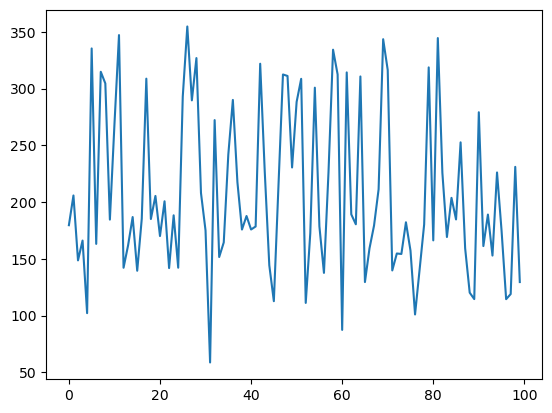

In [36]:
plt.plot(tmp, np.array([l.cpu().detach() for l in loss_list]))

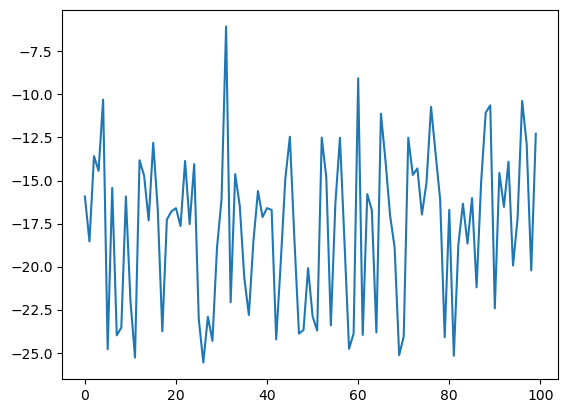

In [37]:
plt.plot(tmp, np.array([l.cpu().detach() for l in reward_list]))

In [38]:
o = []
for i in range(N):
    o.append(observations[200*(i+1)-200:200*(i+1)])

In [39]:
o_old = o.copy()
o = [j for i, j in enumerate(o) if i%10==0]

In [40]:
o = o_old[-10:]

In [41]:
x_ = [i+1 for i in range(200)]

In [42]:
np.array(o).shape

(10, 200, 3)

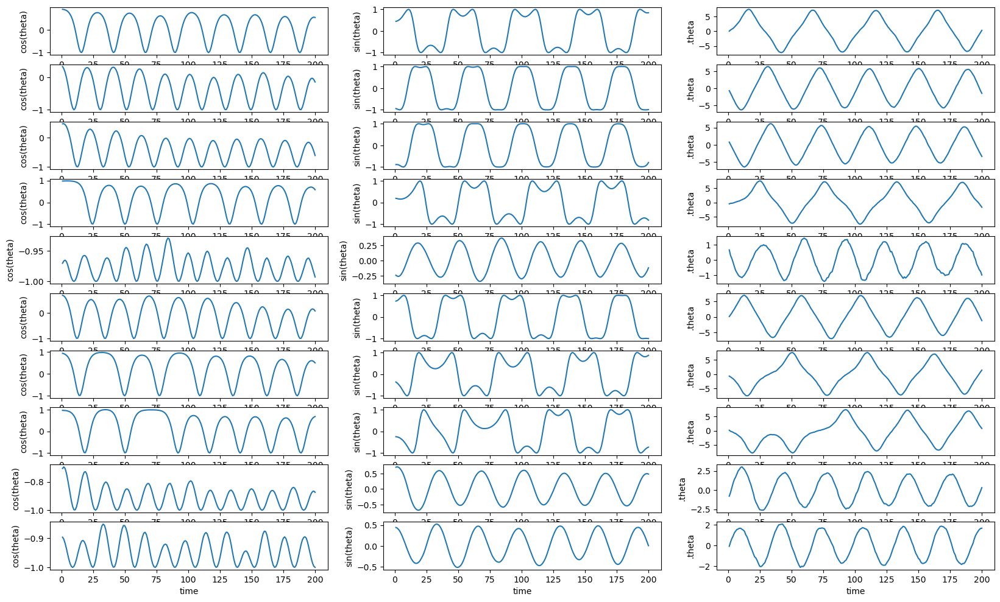

In [43]:
N = 10
plt.figure(1, figsize=(20, 12))
for i in range(N):
    obs = o[i]
    # print(obs)
    theta_ = []
    x_list = []
    y_list = []
    for x,y,v in obs:
        # print(x, y)
        theta_.append(v)
        x_list.append(x)
        y_list.append(y)
    plt.subplot(N, 3, 3*i+1)
    plt.plot(x_, x_list)
    plt.xlabel('time')
    plt.ylabel('cos(theta)')
    plt.subplot(N, 3, 3*i+2)
    plt.plot(x_, y_list)
    plt.xlabel('time')
    plt.ylabel('sin(theta)')
    plt.subplot(N, 3, 3*i+3)
    plt.plot(x_, theta_)
    plt.xlabel('time')
    plt.ylabel('.theta')

In [44]:
len(total_losses)

24000

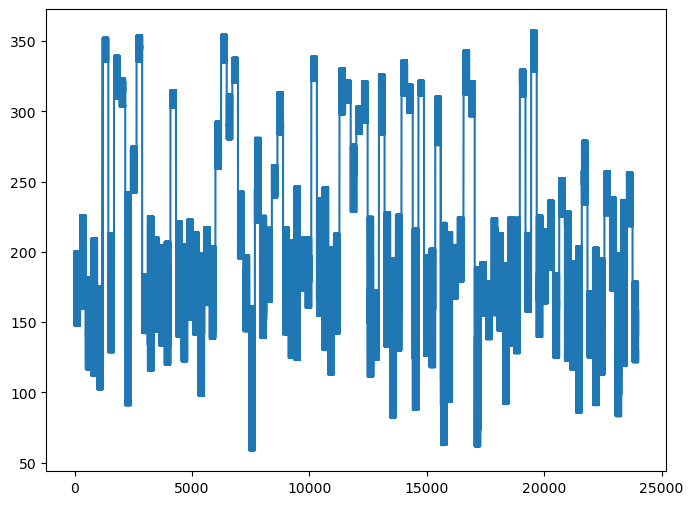

In [45]:
x = np.arange(len(total_losses))
y = [float(x) for x in total_losses]
plt.figure(figsize=(8, 6))
plt.plot(x, y)

## No Clipping and No  GAE

In [46]:
N = 100 # number of times to collect new trajectories and update actor
M = 1 # num of trajectories
max_trajectory_len = 200 # trajectory length
batch_size = 25 # size for minibatch
n_epochs = 30 # number of epochs to optimize loss
alpha = 0.0001
hidden_layers = 2
hidden_dims = 64
gamma = 0.7
lmbda = 0.9
clip_value = 0.1
use_gae = False
use_clip = False

total_losses, observations, loss_list, reward_list = ppo(
    N, M, max_trajectory_len, batch_size, alpha, hidden_layers, hidden_dims,
    gamma, lmbda, clip_value, use_gae, use_clip)

n: 0, epoch: 0, minibatch no.: 0,
total_loss: 181.49148825314882, actor_loss: 15.226928977391612, critic_loss: 332.5291185515144
n: 0, epoch: 0, minibatch no.: 1,
total_loss: 335.2902259541866, actor_loss: 22.012688027089094, critic_loss: 626.555075854195
n: 0, epoch: 0, minibatch no.: 2,
total_loss: 251.24950682024095, actor_loss: 19.250148572196018, critic_loss: 463.99871649608986
n: 0, epoch: 0, minibatch no.: 3,
total_loss: 199.39062987640665, actor_loss: 15.421121068903501, critic_loss: 367.9390176150063
n: 0, epoch: 0, minibatch no.: 4,
total_loss: 319.5997287145055, actor_loss: 21.358665723711283, critic_loss: 596.4821259815884
n: 0, epoch: 0, minibatch no.: 5,
total_loss: 259.6238724940906, actor_loss: 19.508752898071645, critic_loss: 480.23023919203797
n: 0, epoch: 0, minibatch no.: 6,
total_loss: 226.24809296628203, actor_loss: 17.507216618666252, critic_loss: 417.48175269523153
n: 0, epoch: 0, minibatch no.: 7,
total_loss: 198.43077722045115, actor_loss: 16.027909956402688, 

n: 0, epoch: 8, minibatch no.: 0,
total_loss: 181.49148825314882, actor_loss: 15.226928977391612, critic_loss: 332.5291185515144
n: 0, epoch: 8, minibatch no.: 1,
total_loss: 335.2902259541866, actor_loss: 22.012688027089094, critic_loss: 626.555075854195
n: 0, epoch: 8, minibatch no.: 2,
total_loss: 251.24950682024095, actor_loss: 19.250148572196018, critic_loss: 463.99871649608986
n: 0, epoch: 8, minibatch no.: 3,
total_loss: 199.39062987640665, actor_loss: 15.421121068903501, critic_loss: 367.9390176150063
n: 0, epoch: 8, minibatch no.: 4,
total_loss: 319.5997287145055, actor_loss: 21.358665723711283, critic_loss: 596.4821259815884
n: 0, epoch: 8, minibatch no.: 5,
total_loss: 259.6238724940906, actor_loss: 19.508752898071645, critic_loss: 480.23023919203797
n: 0, epoch: 8, minibatch no.: 6,
total_loss: 226.24809296628203, actor_loss: 17.507216618666252, critic_loss: 417.48175269523153
n: 0, epoch: 8, minibatch no.: 7,
total_loss: 198.43077722045115, actor_loss: 16.027909956402688, 

n: 0, epoch: 16, minibatch no.: 4,
total_loss: 319.5997287145055, actor_loss: 21.358665723711283, critic_loss: 596.4821259815884
n: 0, epoch: 16, minibatch no.: 5,
total_loss: 259.6238724940906, actor_loss: 19.508752898071645, critic_loss: 480.23023919203797
n: 0, epoch: 16, minibatch no.: 6,
total_loss: 226.24809296628203, actor_loss: 17.507216618666252, critic_loss: 417.48175269523153
n: 0, epoch: 16, minibatch no.: 7,
total_loss: 198.43077722045115, actor_loss: 16.027909956402688, critic_loss: 364.80573452809693
n: 0, epoch: 17, minibatch no.: 0,
total_loss: 181.49148825314882, actor_loss: 15.226928977391612, critic_loss: 332.5291185515144
n: 0, epoch: 17, minibatch no.: 1,
total_loss: 335.2902259541866, actor_loss: 22.012688027089094, critic_loss: 626.555075854195
n: 0, epoch: 17, minibatch no.: 2,
total_loss: 251.24950682024095, actor_loss: 19.250148572196018, critic_loss: 463.99871649608986
n: 0, epoch: 17, minibatch no.: 3,
total_loss: 199.39062987640665, actor_loss: 15.42112106

n: 0, epoch: 24, minibatch no.: 6,
total_loss: 226.24809296628203, actor_loss: 17.507216618666252, critic_loss: 417.48175269523153
n: 0, epoch: 24, minibatch no.: 7,
total_loss: 198.43077722045115, actor_loss: 16.027909956402688, critic_loss: 364.80573452809693
n: 0, epoch: 25, minibatch no.: 0,
total_loss: 181.49148825314882, actor_loss: 15.226928977391612, critic_loss: 332.5291185515144
n: 0, epoch: 25, minibatch no.: 1,
total_loss: 335.2902259541866, actor_loss: 22.012688027089094, critic_loss: 626.555075854195
n: 0, epoch: 25, minibatch no.: 2,
total_loss: 251.24950682024095, actor_loss: 19.250148572196018, critic_loss: 463.99871649608986
n: 0, epoch: 25, minibatch no.: 3,
total_loss: 199.39062987640665, actor_loss: 15.421121068903501, critic_loss: 367.9390176150063
n: 0, epoch: 25, minibatch no.: 4,
total_loss: 319.5997287145055, actor_loss: 21.358665723711283, critic_loss: 596.4821259815884
n: 0, epoch: 25, minibatch no.: 5,
total_loss: 259.6238724940906, actor_loss: 19.508752898

n: 1, epoch: 3, minibatch no.: 2,
total_loss: 185.56441199534632, actor_loss: 14.51654629429796, critic_loss: 342.0957314020967
n: 1, epoch: 3, minibatch no.: 3,
total_loss: 187.62939997730717, actor_loss: 16.281355921933113, critic_loss: 342.6960881107481
n: 1, epoch: 3, minibatch no.: 4,
total_loss: 165.96604540545087, actor_loss: 14.256521682652519, critic_loss: 303.4190474455967
n: 1, epoch: 3, minibatch no.: 5,
total_loss: 215.3536365565425, actor_loss: 18.205450813505873, critic_loss: 394.29637148607327
n: 1, epoch: 3, minibatch no.: 6,
total_loss: 270.4603748540949, actor_loss: 19.12461464820105, critic_loss: 502.67152041178764
n: 1, epoch: 3, minibatch no.: 7,
total_loss: 239.21398846973943, actor_loss: 16.925058806762852, critic_loss: 444.57785932595317
n: 1, epoch: 4, minibatch no.: 0,
total_loss: 260.8704448116981, actor_loss: 18.465307629747382, critic_loss: 484.8102743639015
n: 1, epoch: 4, minibatch no.: 1,
total_loss: 244.8952335713469, actor_loss: 17.809427667092088, cr

n: 1, epoch: 11, minibatch no.: 3,
total_loss: 187.62939997730717, actor_loss: 16.281355921933113, critic_loss: 342.6960881107481
n: 1, epoch: 11, minibatch no.: 4,
total_loss: 165.96604540545087, actor_loss: 14.256521682652519, critic_loss: 303.4190474455967
n: 1, epoch: 11, minibatch no.: 5,
total_loss: 215.3536365565425, actor_loss: 18.205450813505873, critic_loss: 394.29637148607327
n: 1, epoch: 11, minibatch no.: 6,
total_loss: 270.4603748540949, actor_loss: 19.12461464820105, critic_loss: 502.67152041178764
n: 1, epoch: 11, minibatch no.: 7,
total_loss: 239.21398846973943, actor_loss: 16.925058806762852, critic_loss: 444.57785932595317
n: 1, epoch: 12, minibatch no.: 0,
total_loss: 260.8704448116981, actor_loss: 18.465307629747382, critic_loss: 484.8102743639015
n: 1, epoch: 12, minibatch no.: 1,
total_loss: 244.8952335713469, actor_loss: 17.809427667092088, critic_loss: 454.1716118085096
n: 1, epoch: 12, minibatch no.: 2,
total_loss: 185.56441199534632, actor_loss: 14.5165462942

n: 1, epoch: 19, minibatch no.: 4,
total_loss: 165.96604540545087, actor_loss: 14.256521682652519, critic_loss: 303.4190474455967
n: 1, epoch: 19, minibatch no.: 5,
total_loss: 215.3536365565425, actor_loss: 18.205450813505873, critic_loss: 394.29637148607327
n: 1, epoch: 19, minibatch no.: 6,
total_loss: 270.4603748540949, actor_loss: 19.12461464820105, critic_loss: 502.67152041178764
n: 1, epoch: 19, minibatch no.: 7,
total_loss: 239.21398846973943, actor_loss: 16.925058806762852, critic_loss: 444.57785932595317
n: 1, epoch: 20, minibatch no.: 0,
total_loss: 260.8704448116981, actor_loss: 18.465307629747382, critic_loss: 484.8102743639015
n: 1, epoch: 20, minibatch no.: 1,
total_loss: 244.8952335713469, actor_loss: 17.809427667092088, critic_loss: 454.1716118085096
n: 1, epoch: 20, minibatch no.: 2,
total_loss: 185.56441199534632, actor_loss: 14.51654629429796, critic_loss: 342.0957314020967
n: 1, epoch: 20, minibatch no.: 3,
total_loss: 187.62939997730717, actor_loss: 16.28135592193

n: 1, epoch: 28, minibatch no.: 0,
total_loss: 260.8704448116981, actor_loss: 18.465307629747382, critic_loss: 484.8102743639015
n: 1, epoch: 28, minibatch no.: 1,
total_loss: 244.8952335713469, actor_loss: 17.809427667092088, critic_loss: 454.1716118085096
n: 1, epoch: 28, minibatch no.: 2,
total_loss: 185.56441199534632, actor_loss: 14.51654629429796, critic_loss: 342.0957314020967
n: 1, epoch: 28, minibatch no.: 3,
total_loss: 187.62939997730717, actor_loss: 16.281355921933113, critic_loss: 342.6960881107481
n: 1, epoch: 28, minibatch no.: 4,
total_loss: 165.96604540545087, actor_loss: 14.256521682652519, critic_loss: 303.4190474455967
n: 1, epoch: 28, minibatch no.: 5,
total_loss: 215.3536365565425, actor_loss: 18.205450813505873, critic_loss: 394.29637148607327
n: 1, epoch: 28, minibatch no.: 6,
total_loss: 270.4603748540949, actor_loss: 19.12461464820105, critic_loss: 502.67152041178764
n: 1, epoch: 28, minibatch no.: 7,
total_loss: 239.21398846973943, actor_loss: 16.925058806762

n: 2, epoch: 6, minibatch no.: 0,
total_loss: 247.18065692035364, actor_loss: 19.36251913633486, critic_loss: 455.63627556803755
n: 2, epoch: 6, minibatch no.: 1,
total_loss: 204.1588516907097, actor_loss: 16.925968872743415, critic_loss: 374.46576563593254
n: 2, epoch: 6, minibatch no.: 2,
total_loss: 221.060477399447, actor_loss: 17.38002848610504, critic_loss: 407.3608978266839
n: 2, epoch: 6, minibatch no.: 3,
total_loss: 285.2452090112077, actor_loss: 20.6088983013605, critic_loss: 529.2726214196944
n: 2, epoch: 6, minibatch no.: 4,
total_loss: 156.0228846449538, actor_loss: 14.554894215224772, critic_loss: 282.935980859458
n: 2, epoch: 6, minibatch no.: 5,
total_loss: 182.21472650791762, actor_loss: 15.582997789941079, critic_loss: 333.26345743595306
n: 2, epoch: 6, minibatch no.: 6,
total_loss: 240.25530631792174, actor_loss: 18.89611364196868, critic_loss: 442.71838535190614
n: 2, epoch: 6, minibatch no.: 7,
total_loss: 317.38826743890803, actor_loss: 22.6258933521345, critic_l

n: 2, epoch: 14, minibatch no.: 2,
total_loss: 221.060477399447, actor_loss: 17.38002848610504, critic_loss: 407.3608978266839
n: 2, epoch: 14, minibatch no.: 3,
total_loss: 285.2452090112077, actor_loss: 20.6088983013605, critic_loss: 529.2726214196944
n: 2, epoch: 14, minibatch no.: 4,
total_loss: 156.0228846449538, actor_loss: 14.554894215224772, critic_loss: 282.935980859458
n: 2, epoch: 14, minibatch no.: 5,
total_loss: 182.21472650791762, actor_loss: 15.582997789941079, critic_loss: 333.26345743595306
n: 2, epoch: 14, minibatch no.: 6,
total_loss: 240.25530631792174, actor_loss: 18.89611364196868, critic_loss: 442.71838535190614
n: 2, epoch: 14, minibatch no.: 7,
total_loss: 317.38826743890803, actor_loss: 22.6258933521345, critic_loss: 589.5247481735471
n: 2, epoch: 15, minibatch no.: 0,
total_loss: 247.18065692035364, actor_loss: 19.36251913633486, critic_loss: 455.63627556803755
n: 2, epoch: 15, minibatch no.: 1,
total_loss: 204.1588516907097, actor_loss: 16.925968872743415, c

n: 2, epoch: 22, minibatch no.: 3,
total_loss: 285.2452090112077, actor_loss: 20.6088983013605, critic_loss: 529.2726214196944
n: 2, epoch: 22, minibatch no.: 4,
total_loss: 156.0228846449538, actor_loss: 14.554894215224772, critic_loss: 282.935980859458
n: 2, epoch: 22, minibatch no.: 5,
total_loss: 182.21472650791762, actor_loss: 15.582997789941079, critic_loss: 333.26345743595306
n: 2, epoch: 22, minibatch no.: 6,
total_loss: 240.25530631792174, actor_loss: 18.89611364196868, critic_loss: 442.71838535190614
n: 2, epoch: 22, minibatch no.: 7,
total_loss: 317.38826743890803, actor_loss: 22.6258933521345, critic_loss: 589.5247481735471
n: 2, epoch: 23, minibatch no.: 0,
total_loss: 247.18065692035364, actor_loss: 19.36251913633486, critic_loss: 455.63627556803755
n: 2, epoch: 23, minibatch no.: 1,
total_loss: 204.1588516907097, actor_loss: 16.925968872743415, critic_loss: 374.46576563593254
n: 2, epoch: 23, minibatch no.: 2,
total_loss: 221.060477399447, actor_loss: 17.38002848610504, 

n: 3, epoch: 0, minibatch no.: 4,
total_loss: 310.72905911465585, actor_loss: 21.243983622342867, critic_loss: 578.970150984626
n: 3, epoch: 0, minibatch no.: 5,
total_loss: 192.8277475547227, actor_loss: 16.14919792675348, critic_loss: 353.3570992559384
n: 3, epoch: 0, minibatch no.: 6,
total_loss: 212.19803401360284, actor_loss: 16.684501914668676, critic_loss: 391.0270641978683
n: 3, epoch: 0, minibatch no.: 7,
total_loss: 281.3961868550329, actor_loss: 20.424637693054205, critic_loss: 521.9430983239574
n: 3, epoch: 1, minibatch no.: 0,
total_loss: 226.91438620615108, actor_loss: 17.61073066703374, critic_loss: 418.60731107823466
n: 3, epoch: 1, minibatch no.: 1,
total_loss: 260.10157275088346, actor_loss: 19.488239349671314, critic_loss: 481.2266668024243
n: 3, epoch: 1, minibatch no.: 2,
total_loss: 157.2847977569034, actor_loss: 14.496985604999077, critic_loss: 285.57562430380864
n: 3, epoch: 1, minibatch no.: 3,
total_loss: 218.86128987363867, actor_loss: 16.912869155134864, cri

n: 3, epoch: 8, minibatch no.: 5,
total_loss: 192.8277475547227, actor_loss: 16.14919792675348, critic_loss: 353.3570992559384
n: 3, epoch: 8, minibatch no.: 6,
total_loss: 212.19803401360284, actor_loss: 16.684501914668676, critic_loss: 391.0270641978683
n: 3, epoch: 8, minibatch no.: 7,
total_loss: 281.3961868550329, actor_loss: 20.424637693054205, critic_loss: 521.9430983239574
n: 3, epoch: 9, minibatch no.: 0,
total_loss: 226.91438620615108, actor_loss: 17.61073066703374, critic_loss: 418.60731107823466
n: 3, epoch: 9, minibatch no.: 1,
total_loss: 260.10157275088346, actor_loss: 19.488239349671314, critic_loss: 481.2266668024243
n: 3, epoch: 9, minibatch no.: 2,
total_loss: 157.2847977569034, actor_loss: 14.496985604999077, critic_loss: 285.57562430380864
n: 3, epoch: 9, minibatch no.: 3,
total_loss: 218.86128987363867, actor_loss: 16.912869155134864, critic_loss: 403.8968414370076
n: 3, epoch: 9, minibatch no.: 4,
total_loss: 310.72905911465585, actor_loss: 21.243983622342867, cr

n: 3, epoch: 16, minibatch no.: 6,
total_loss: 212.19803401360284, actor_loss: 16.684501914668676, critic_loss: 391.0270641978683
n: 3, epoch: 16, minibatch no.: 7,
total_loss: 281.3961868550329, actor_loss: 20.424637693054205, critic_loss: 521.9430983239574
n: 3, epoch: 17, minibatch no.: 0,
total_loss: 226.91438620615108, actor_loss: 17.61073066703374, critic_loss: 418.60731107823466
n: 3, epoch: 17, minibatch no.: 1,
total_loss: 260.10157275088346, actor_loss: 19.488239349671314, critic_loss: 481.2266668024243
n: 3, epoch: 17, minibatch no.: 2,
total_loss: 157.2847977569034, actor_loss: 14.496985604999077, critic_loss: 285.57562430380864
n: 3, epoch: 17, minibatch no.: 3,
total_loss: 218.86128987363867, actor_loss: 16.912869155134864, critic_loss: 403.8968414370076
n: 3, epoch: 17, minibatch no.: 4,
total_loss: 310.72905911465585, actor_loss: 21.243983622342867, critic_loss: 578.970150984626
n: 3, epoch: 17, minibatch no.: 5,
total_loss: 192.8277475547227, actor_loss: 16.14919792675

n: 3, epoch: 25, minibatch no.: 0,
total_loss: 226.91438620615108, actor_loss: 17.61073066703374, critic_loss: 418.60731107823466
n: 3, epoch: 25, minibatch no.: 1,
total_loss: 260.10157275088346, actor_loss: 19.488239349671314, critic_loss: 481.2266668024243
n: 3, epoch: 25, minibatch no.: 2,
total_loss: 157.2847977569034, actor_loss: 14.496985604999077, critic_loss: 285.57562430380864
n: 3, epoch: 25, minibatch no.: 3,
total_loss: 218.86128987363867, actor_loss: 16.912869155134864, critic_loss: 403.8968414370076
n: 3, epoch: 25, minibatch no.: 4,
total_loss: 310.72905911465585, actor_loss: 21.243983622342867, critic_loss: 578.970150984626
n: 3, epoch: 25, minibatch no.: 5,
total_loss: 192.8277475547227, actor_loss: 16.14919792675348, critic_loss: 353.3570992559384
n: 3, epoch: 25, minibatch no.: 6,
total_loss: 212.19803401360284, actor_loss: 16.684501914668676, critic_loss: 391.0270641978683
n: 3, epoch: 25, minibatch no.: 7,
total_loss: 281.3961868550329, actor_loss: 20.424637693054

n: 4, epoch: 3, minibatch no.: 5,
total_loss: 217.37669766906276, actor_loss: 18.70719955734074, critic_loss: 397.33899622344404
n: 4, epoch: 3, minibatch no.: 6,
total_loss: 296.40415263905476, actor_loss: 22.351981478329233, critic_loss: 548.1043423214511
n: 4, epoch: 3, minibatch no.: 7,
total_loss: 270.9337458784159, actor_loss: 20.834779338337626, critic_loss: 500.19793308015653
n: 4, epoch: 4, minibatch no.: 0,
total_loss: 313.36538697119727, actor_loss: 22.905496203967683, critic_loss: 580.9197815344592
n: 4, epoch: 4, minibatch no.: 1,
total_loss: 299.53801512659453, actor_loss: 22.33192474829194, critic_loss: 554.4121807566052
n: 4, epoch: 4, minibatch no.: 2,
total_loss: 230.84190342089198, actor_loss: 19.275632829821905, critic_loss: 423.13254118214013
n: 4, epoch: 4, minibatch no.: 3,
total_loss: 284.6367721858402, actor_loss: 21.506685819374862, critic_loss: 526.2601727329306
n: 4, epoch: 4, minibatch no.: 4,
total_loss: 262.5169921480861, actor_loss: 21.11760784652917, cr

total_loss: 313.36538697119727, actor_loss: 22.905496203967683, critic_loss: 580.9197815344592
n: 4, epoch: 12, minibatch no.: 1,
total_loss: 299.53801512659453, actor_loss: 22.33192474829194, critic_loss: 554.4121807566052
n: 4, epoch: 12, minibatch no.: 2,
total_loss: 230.84190342089198, actor_loss: 19.275632829821905, critic_loss: 423.13254118214013
n: 4, epoch: 12, minibatch no.: 3,
total_loss: 284.6367721858402, actor_loss: 21.506685819374862, critic_loss: 526.2601727329306
n: 4, epoch: 12, minibatch no.: 4,
total_loss: 262.5169921480861, actor_loss: 21.11760784652917, critic_loss: 482.79876860311384
n: 4, epoch: 12, minibatch no.: 5,
total_loss: 217.37669766906276, actor_loss: 18.70719955734074, critic_loss: 397.33899622344404
n: 4, epoch: 12, minibatch no.: 6,
total_loss: 296.40415263905476, actor_loss: 22.351981478329233, critic_loss: 548.1043423214511
n: 4, epoch: 12, minibatch no.: 7,
total_loss: 270.9337458784159, actor_loss: 20.834779338337626, critic_loss: 500.197933080156

n: 4, epoch: 20, minibatch no.: 2,
total_loss: 230.84190342089198, actor_loss: 19.275632829821905, critic_loss: 423.13254118214013
n: 4, epoch: 20, minibatch no.: 3,
total_loss: 284.6367721858402, actor_loss: 21.506685819374862, critic_loss: 526.2601727329306
n: 4, epoch: 20, minibatch no.: 4,
total_loss: 262.5169921480861, actor_loss: 21.11760784652917, critic_loss: 482.79876860311384
n: 4, epoch: 20, minibatch no.: 5,
total_loss: 217.37669766906276, actor_loss: 18.70719955734074, critic_loss: 397.33899622344404
n: 4, epoch: 20, minibatch no.: 6,
total_loss: 296.40415263905476, actor_loss: 22.351981478329233, critic_loss: 548.1043423214511
n: 4, epoch: 20, minibatch no.: 7,
total_loss: 270.9337458784159, actor_loss: 20.834779338337626, critic_loss: 500.19793308015653
n: 4, epoch: 21, minibatch no.: 0,
total_loss: 313.36538697119727, actor_loss: 22.905496203967683, critic_loss: 580.9197815344592
n: 4, epoch: 21, minibatch no.: 1,
total_loss: 299.53801512659453, actor_loss: 22.331924748

n: 4, epoch: 28, minibatch no.: 2,
total_loss: 230.84190342089198, actor_loss: 19.275632829821905, critic_loss: 423.13254118214013
n: 4, epoch: 28, minibatch no.: 3,
total_loss: 284.6367721858402, actor_loss: 21.506685819374862, critic_loss: 526.2601727329306
n: 4, epoch: 28, minibatch no.: 4,
total_loss: 262.5169921480861, actor_loss: 21.11760784652917, critic_loss: 482.79876860311384
n: 4, epoch: 28, minibatch no.: 5,
total_loss: 217.37669766906276, actor_loss: 18.70719955734074, critic_loss: 397.33899622344404
n: 4, epoch: 28, minibatch no.: 6,
total_loss: 296.40415263905476, actor_loss: 22.351981478329233, critic_loss: 548.1043423214511
n: 4, epoch: 28, minibatch no.: 7,
total_loss: 270.9337458784159, actor_loss: 20.834779338337626, critic_loss: 500.19793308015653
n: 4, epoch: 29, minibatch no.: 0,
total_loss: 313.36538697119727, actor_loss: 22.905496203967683, critic_loss: 580.9197815344592
n: 4, epoch: 29, minibatch no.: 1,
total_loss: 299.53801512659453, actor_loss: 22.331924748

n: 5, epoch: 6, minibatch no.: 5,
total_loss: 358.2313183695584, actor_loss: 25.41284477143455, critic_loss: 665.6369471962477
n: 5, epoch: 6, minibatch no.: 6,
total_loss: 373.1111596271799, actor_loss: 25.837144793180734, critic_loss: 694.5480296679983
n: 5, epoch: 6, minibatch no.: 7,
total_loss: 332.70678161695866, actor_loss: 24.269763254338642, critic_loss: 616.87403672524
n: 5, epoch: 7, minibatch no.: 0,
total_loss: 326.3201832763803, actor_loss: 23.883278157594386, critic_loss: 604.8738102375719
n: 5, epoch: 7, minibatch no.: 1,
total_loss: 335.33153248943495, actor_loss: 24.380823331576643, critic_loss: 621.9014183157166
n: 5, epoch: 7, minibatch no.: 2,
total_loss: 334.74492559426704, actor_loss: 24.524452474057163, critic_loss: 620.4409462404197
n: 5, epoch: 7, minibatch no.: 3,
total_loss: 272.5394878182226, actor_loss: 21.749295961135896, critic_loss: 501.58038371417337
n: 5, epoch: 7, minibatch no.: 4,
total_loss: 329.35645301642114, actor_loss: 24.044054743226734, criti

n: 5, epoch: 14, minibatch no.: 6,
total_loss: 373.1111596271799, actor_loss: 25.837144793180734, critic_loss: 694.5480296679983
n: 5, epoch: 14, minibatch no.: 7,
total_loss: 332.70678161695866, actor_loss: 24.269763254338642, critic_loss: 616.87403672524
n: 5, epoch: 15, minibatch no.: 0,
total_loss: 326.3201832763803, actor_loss: 23.883278157594386, critic_loss: 604.8738102375719
n: 5, epoch: 15, minibatch no.: 1,
total_loss: 335.33153248943495, actor_loss: 24.380823331576643, critic_loss: 621.9014183157166
n: 5, epoch: 15, minibatch no.: 2,
total_loss: 334.74492559426704, actor_loss: 24.524452474057163, critic_loss: 620.4409462404197
n: 5, epoch: 15, minibatch no.: 3,
total_loss: 272.5394878182226, actor_loss: 21.749295961135896, critic_loss: 501.58038371417337
n: 5, epoch: 15, minibatch no.: 4,
total_loss: 329.35645301642114, actor_loss: 24.044054743226734, critic_loss: 610.6247965463888
n: 5, epoch: 15, minibatch no.: 5,
total_loss: 358.2313183695584, actor_loss: 25.4128447714345

n: 5, epoch: 23, minibatch no.: 3,
total_loss: 272.5394878182226, actor_loss: 21.749295961135896, critic_loss: 501.58038371417337
n: 5, epoch: 23, minibatch no.: 4,
total_loss: 329.35645301642114, actor_loss: 24.044054743226734, critic_loss: 610.6247965463888
n: 5, epoch: 23, minibatch no.: 5,
total_loss: 358.2313183695584, actor_loss: 25.41284477143455, critic_loss: 665.6369471962477
n: 5, epoch: 23, minibatch no.: 6,
total_loss: 373.1111596271799, actor_loss: 25.837144793180734, critic_loss: 694.5480296679983
n: 5, epoch: 23, minibatch no.: 7,
total_loss: 332.70678161695866, actor_loss: 24.269763254338642, critic_loss: 616.87403672524
n: 5, epoch: 24, minibatch no.: 0,
total_loss: 326.3201832763803, actor_loss: 23.883278157594386, critic_loss: 604.8738102375719
n: 5, epoch: 24, minibatch no.: 1,
total_loss: 335.33153248943495, actor_loss: 24.380823331576643, critic_loss: 621.9014183157166
n: 5, epoch: 24, minibatch no.: 2,
total_loss: 334.74492559426704, actor_loss: 24.52445247405716

n: 6, epoch: 1, minibatch no.: 4,
total_loss: 468.39717048840237, actor_loss: 29.588994134516984, critic_loss: 877.6163527077707
n: 6, epoch: 1, minibatch no.: 5,
total_loss: 485.07652647977636, actor_loss: 30.141140075527375, critic_loss: 909.870772808498
n: 6, epoch: 1, minibatch no.: 6,
total_loss: 464.0198161961906, actor_loss: 29.46318816071039, critic_loss: 869.1132560709605
n: 6, epoch: 1, minibatch no.: 7,
total_loss: 440.5523708795164, actor_loss: 28.205053605831576, critic_loss: 824.6946345473697
n: 6, epoch: 2, minibatch no.: 0,
total_loss: 471.90502031544344, actor_loss: 29.58198214644744, critic_loss: 884.646076337992
n: 6, epoch: 2, minibatch no.: 1,
total_loss: 473.6018665529502, actor_loss: 29.772262466958047, critic_loss: 887.6592081719842
n: 6, epoch: 2, minibatch no.: 2,
total_loss: 466.24471795919743, actor_loss: 29.533002703391205, critic_loss: 873.4234305116124
n: 6, epoch: 2, minibatch no.: 3,
total_loss: 472.49502455659604, actor_loss: 29.711404078348988, critic

n: 6, epoch: 9, minibatch no.: 4,
total_loss: 468.39717048840237, actor_loss: 29.588994134516984, critic_loss: 877.6163527077707
n: 6, epoch: 9, minibatch no.: 5,
total_loss: 485.07652647977636, actor_loss: 30.141140075527375, critic_loss: 909.870772808498
n: 6, epoch: 9, minibatch no.: 6,
total_loss: 464.0198161961906, actor_loss: 29.46318816071039, critic_loss: 869.1132560709605
n: 6, epoch: 9, minibatch no.: 7,
total_loss: 440.5523708795164, actor_loss: 28.205053605831576, critic_loss: 824.6946345473697
n: 6, epoch: 10, minibatch no.: 0,
total_loss: 471.90502031544344, actor_loss: 29.58198214644744, critic_loss: 884.646076337992
n: 6, epoch: 10, minibatch no.: 1,
total_loss: 473.6018665529502, actor_loss: 29.772262466958047, critic_loss: 887.6592081719842
n: 6, epoch: 10, minibatch no.: 2,
total_loss: 466.24471795919743, actor_loss: 29.533002703391205, critic_loss: 873.4234305116124
n: 6, epoch: 10, minibatch no.: 3,
total_loss: 472.49502455659604, actor_loss: 29.711404078348988, cr

n: 6, epoch: 18, minibatch no.: 0,
total_loss: 471.90502031544344, actor_loss: 29.58198214644744, critic_loss: 884.646076337992
n: 6, epoch: 18, minibatch no.: 1,
total_loss: 473.6018665529502, actor_loss: 29.772262466958047, critic_loss: 887.6592081719842
n: 6, epoch: 18, minibatch no.: 2,
total_loss: 466.24471795919743, actor_loss: 29.533002703391205, critic_loss: 873.4234305116124
n: 6, epoch: 18, minibatch no.: 3,
total_loss: 472.49502455659604, actor_loss: 29.711404078348988, critic_loss: 885.5672409564941
n: 6, epoch: 18, minibatch no.: 4,
total_loss: 468.39717048840237, actor_loss: 29.588994134516984, critic_loss: 877.6163527077707
n: 6, epoch: 18, minibatch no.: 5,
total_loss: 485.07652647977636, actor_loss: 30.141140075527375, critic_loss: 909.870772808498
n: 6, epoch: 18, minibatch no.: 6,
total_loss: 464.0198161961906, actor_loss: 29.46318816071039, critic_loss: 869.1132560709605
n: 6, epoch: 18, minibatch no.: 7,
total_loss: 440.5523708795164, actor_loss: 28.205053605831576

n: 6, epoch: 26, minibatch no.: 2,
total_loss: 466.24471795919743, actor_loss: 29.533002703391205, critic_loss: 873.4234305116124
n: 6, epoch: 26, minibatch no.: 3,
total_loss: 472.49502455659604, actor_loss: 29.711404078348988, critic_loss: 885.5672409564941
n: 6, epoch: 26, minibatch no.: 4,
total_loss: 468.39717048840237, actor_loss: 29.588994134516984, critic_loss: 877.6163527077707
n: 6, epoch: 26, minibatch no.: 5,
total_loss: 485.07652647977636, actor_loss: 30.141140075527375, critic_loss: 909.870772808498
n: 6, epoch: 26, minibatch no.: 6,
total_loss: 464.0198161961906, actor_loss: 29.46318816071039, critic_loss: 869.1132560709605
n: 6, epoch: 26, minibatch no.: 7,
total_loss: 440.5523708795164, actor_loss: 28.205053605831576, critic_loss: 824.6946345473697
n: 6, epoch: 27, minibatch no.: 0,
total_loss: 471.90502031544344, actor_loss: 29.58198214644744, critic_loss: 884.646076337992
n: 6, epoch: 27, minibatch no.: 1,
total_loss: 473.6018665529502, actor_loss: 29.772262466958047

n: 7, epoch: 4, minibatch no.: 2,
total_loss: 137.59630994447193, actor_loss: 13.108063763333382, critic_loss: 248.97649236227707
n: 7, epoch: 4, minibatch no.: 3,
total_loss: 282.1086828062318, actor_loss: 18.863739880974162, critic_loss: 526.4898858505153
n: 7, epoch: 4, minibatch no.: 4,
total_loss: 242.22259461025624, actor_loss: 17.473713708622494, critic_loss: 449.4977618032675
n: 7, epoch: 4, minibatch no.: 5,
total_loss: 348.2415918816865, actor_loss: 22.214819413389943, critic_loss: 652.0535449365931
n: 7, epoch: 4, minibatch no.: 6,
total_loss: 200.78015489391524, actor_loss: 15.850511173795526, critic_loss: 369.8592874402394
n: 7, epoch: 4, minibatch no.: 7,
total_loss: 296.3735809060127, actor_loss: 20.745514252798035, critic_loss: 551.2561333064293
n: 7, epoch: 5, minibatch no.: 0,
total_loss: 254.7972710541288, actor_loss: 17.389515076813833, critic_loss: 474.8155119546299
n: 7, epoch: 5, minibatch no.: 1,
total_loss: 239.8379813974675, actor_loss: 17.028641258858883, cri

n: 7, epoch: 12, minibatch no.: 5,
total_loss: 348.2415918816865, actor_loss: 22.214819413389943, critic_loss: 652.0535449365931
n: 7, epoch: 12, minibatch no.: 6,
total_loss: 200.78015489391524, actor_loss: 15.850511173795526, critic_loss: 369.8592874402394
n: 7, epoch: 12, minibatch no.: 7,
total_loss: 296.3735809060127, actor_loss: 20.745514252798035, critic_loss: 551.2561333064293
n: 7, epoch: 13, minibatch no.: 0,
total_loss: 254.7972710541288, actor_loss: 17.389515076813833, critic_loss: 474.8155119546299
n: 7, epoch: 13, minibatch no.: 1,
total_loss: 239.8379813974675, actor_loss: 17.028641258858883, critic_loss: 445.6186802772172
n: 7, epoch: 13, minibatch no.: 2,
total_loss: 137.59630994447193, actor_loss: 13.108063763333382, critic_loss: 248.97649236227707
n: 7, epoch: 13, minibatch no.: 3,
total_loss: 282.1086828062318, actor_loss: 18.863739880974162, critic_loss: 526.4898858505153
n: 7, epoch: 13, minibatch no.: 4,
total_loss: 242.22259461025624, actor_loss: 17.473713708622

n: 7, epoch: 20, minibatch no.: 6,
total_loss: 200.78015489391524, actor_loss: 15.850511173795526, critic_loss: 369.8592874402394
n: 7, epoch: 20, minibatch no.: 7,
total_loss: 296.3735809060127, actor_loss: 20.745514252798035, critic_loss: 551.2561333064293
n: 7, epoch: 21, minibatch no.: 0,
total_loss: 254.7972710541288, actor_loss: 17.389515076813833, critic_loss: 474.8155119546299
n: 7, epoch: 21, minibatch no.: 1,
total_loss: 239.8379813974675, actor_loss: 17.028641258858883, critic_loss: 445.6186802772172
n: 7, epoch: 21, minibatch no.: 2,
total_loss: 137.59630994447193, actor_loss: 13.108063763333382, critic_loss: 248.97649236227707
n: 7, epoch: 21, minibatch no.: 3,
total_loss: 282.1086828062318, actor_loss: 18.863739880974162, critic_loss: 526.4898858505153
n: 7, epoch: 21, minibatch no.: 4,
total_loss: 242.22259461025624, actor_loss: 17.473713708622494, critic_loss: 449.4977618032675
n: 7, epoch: 21, minibatch no.: 5,
total_loss: 348.2415918816865, actor_loss: 22.214819413389

n: 7, epoch: 29, minibatch no.: 2,
total_loss: 137.59630994447193, actor_loss: 13.108063763333382, critic_loss: 248.97649236227707
n: 7, epoch: 29, minibatch no.: 3,
total_loss: 282.1086828062318, actor_loss: 18.863739880974162, critic_loss: 526.4898858505153
n: 7, epoch: 29, minibatch no.: 4,
total_loss: 242.22259461025624, actor_loss: 17.473713708622494, critic_loss: 449.4977618032675
n: 7, epoch: 29, minibatch no.: 5,
total_loss: 348.2415918816865, actor_loss: 22.214819413389943, critic_loss: 652.0535449365931
n: 7, epoch: 29, minibatch no.: 6,
total_loss: 200.78015489391524, actor_loss: 15.850511173795526, critic_loss: 369.8592874402394
n: 7, epoch: 29, minibatch no.: 7,
total_loss: 296.3735809060127, actor_loss: 20.745514252798035, critic_loss: 551.2561333064293
n: 8, epoch: 0, minibatch no.: 0,
total_loss: 271.3615772395738, actor_loss: 20.670790221126907, critic_loss: 501.3815740368938
n: 8, epoch: 0, minibatch no.: 1,
total_loss: 277.44928061049677, actor_loss: 20.9120129407148

total_loss: 244.92668867045884, actor_loss: 19.410104765530203, critic_loss: 451.0331678098573
n: 8, epoch: 7, minibatch no.: 3,
total_loss: 197.26628743957616, actor_loss: 17.396603144950678, critic_loss: 359.73936858925094
n: 8, epoch: 7, minibatch no.: 4,
total_loss: 276.73097779351, actor_loss: 20.996013654162393, critic_loss: 511.4699282786953
n: 8, epoch: 7, minibatch no.: 5,
total_loss: 227.9592790790338, actor_loss: 18.8064139575227, critic_loss: 418.3057302430222
n: 8, epoch: 7, minibatch no.: 6,
total_loss: 245.13767472244552, actor_loss: 19.823371981740994, critic_loss: 450.62860548140907
n: 8, epoch: 7, minibatch no.: 7,
total_loss: 234.77430205545917, actor_loss: 19.20037075892903, critic_loss: 431.14786259306027
n: 8, epoch: 8, minibatch no.: 0,
total_loss: 271.3615772395738, actor_loss: 20.670790221126907, critic_loss: 501.3815740368938
n: 8, epoch: 8, minibatch no.: 1,
total_loss: 277.44928061049677, actor_loss: 20.912012940714884, critic_loss: 513.0745353395638
n: 8, e

n: 8, epoch: 15, minibatch no.: 5,
total_loss: 227.9592790790338, actor_loss: 18.8064139575227, critic_loss: 418.3057302430222
n: 8, epoch: 15, minibatch no.: 6,
total_loss: 245.13767472244552, actor_loss: 19.823371981740994, critic_loss: 450.62860548140907
n: 8, epoch: 15, minibatch no.: 7,
total_loss: 234.77430205545917, actor_loss: 19.20037075892903, critic_loss: 431.14786259306027
n: 8, epoch: 16, minibatch no.: 0,
total_loss: 271.3615772395738, actor_loss: 20.670790221126907, critic_loss: 501.3815740368938
n: 8, epoch: 16, minibatch no.: 1,
total_loss: 277.44928061049677, actor_loss: 20.912012940714884, critic_loss: 513.0745353395638
n: 8, epoch: 16, minibatch no.: 2,
total_loss: 244.92668867045884, actor_loss: 19.410104765530203, critic_loss: 451.0331678098573
n: 8, epoch: 16, minibatch no.: 3,
total_loss: 197.26628743957616, actor_loss: 17.396603144950678, critic_loss: 359.73936858925094
n: 8, epoch: 16, minibatch no.: 4,
total_loss: 276.73097779351, actor_loss: 20.9960136541623

n: 8, epoch: 23, minibatch no.: 6,
total_loss: 245.13767472244552, actor_loss: 19.823371981740994, critic_loss: 450.62860548140907
n: 8, epoch: 23, minibatch no.: 7,
total_loss: 234.77430205545917, actor_loss: 19.20037075892903, critic_loss: 431.14786259306027
n: 8, epoch: 24, minibatch no.: 0,
total_loss: 271.3615772395738, actor_loss: 20.670790221126907, critic_loss: 501.3815740368938
n: 8, epoch: 24, minibatch no.: 1,
total_loss: 277.44928061049677, actor_loss: 20.912012940714884, critic_loss: 513.0745353395638
n: 8, epoch: 24, minibatch no.: 2,
total_loss: 244.92668867045884, actor_loss: 19.410104765530203, critic_loss: 451.0331678098573
n: 8, epoch: 24, minibatch no.: 3,
total_loss: 197.26628743957616, actor_loss: 17.396603144950678, critic_loss: 359.73936858925094
n: 8, epoch: 24, minibatch no.: 4,
total_loss: 276.73097779351, actor_loss: 20.996013654162393, critic_loss: 511.4699282786953
n: 8, epoch: 24, minibatch no.: 5,
total_loss: 227.9592790790338, actor_loss: 18.80641395752

n: 9, epoch: 2, minibatch no.: 0,
total_loss: 264.39817697052763, actor_loss: 20.080010962164494, critic_loss: 488.6363320167263
n: 9, epoch: 2, minibatch no.: 1,
total_loss: 283.19122549447974, actor_loss: 21.360100715906647, critic_loss: 523.6622495571462
n: 9, epoch: 2, minibatch no.: 2,
total_loss: 220.22215233276816, actor_loss: 17.127856366633264, critic_loss: 406.1885919322698
n: 9, epoch: 2, minibatch no.: 3,
total_loss: 238.00265053585912, actor_loss: 19.504713189249582, critic_loss: 436.9958746932191
n: 9, epoch: 2, minibatch no.: 4,
total_loss: 254.6713878940016, actor_loss: 20.130352752510213, critic_loss: 469.0820702829828
n: 9, epoch: 2, minibatch no.: 5,
total_loss: 266.6106137818636, actor_loss: 20.17335452714198, critic_loss: 492.87451850944325
n: 9, epoch: 2, minibatch no.: 6,
total_loss: 280.7936456464132, actor_loss: 20.699731016863797, critic_loss: 520.1878292590989
n: 9, epoch: 2, minibatch no.: 7,
total_loss: 198.41528923690763, actor_loss: 17.02547924088277, cri

n: 9, epoch: 10, minibatch no.: 4,
total_loss: 254.6713878940016, actor_loss: 20.130352752510213, critic_loss: 469.0820702829828
n: 9, epoch: 10, minibatch no.: 5,
total_loss: 266.6106137818636, actor_loss: 20.17335452714198, critic_loss: 492.87451850944325
n: 9, epoch: 10, minibatch no.: 6,
total_loss: 280.7936456464132, actor_loss: 20.699731016863797, critic_loss: 520.1878292590989
n: 9, epoch: 10, minibatch no.: 7,
total_loss: 198.41528923690763, actor_loss: 17.02547924088277, critic_loss: 362.77961999204973
n: 9, epoch: 11, minibatch no.: 0,
total_loss: 264.39817697052763, actor_loss: 20.080010962164494, critic_loss: 488.6363320167263
n: 9, epoch: 11, minibatch no.: 1,
total_loss: 283.19122549447974, actor_loss: 21.360100715906647, critic_loss: 523.6622495571462
n: 9, epoch: 11, minibatch no.: 2,
total_loss: 220.22215233276816, actor_loss: 17.127856366633264, critic_loss: 406.1885919322698
n: 9, epoch: 11, minibatch no.: 3,
total_loss: 238.00265053585912, actor_loss: 19.50471318924

n: 9, epoch: 18, minibatch no.: 7,
total_loss: 198.41528923690763, actor_loss: 17.02547924088277, critic_loss: 362.77961999204973
n: 9, epoch: 19, minibatch no.: 0,
total_loss: 264.39817697052763, actor_loss: 20.080010962164494, critic_loss: 488.6363320167263
n: 9, epoch: 19, minibatch no.: 1,
total_loss: 283.19122549447974, actor_loss: 21.360100715906647, critic_loss: 523.6622495571462
n: 9, epoch: 19, minibatch no.: 2,
total_loss: 220.22215233276816, actor_loss: 17.127856366633264, critic_loss: 406.1885919322698
n: 9, epoch: 19, minibatch no.: 3,
total_loss: 238.00265053585912, actor_loss: 19.504713189249582, critic_loss: 436.9958746932191
n: 9, epoch: 19, minibatch no.: 4,
total_loss: 254.6713878940016, actor_loss: 20.130352752510213, critic_loss: 469.0820702829828
n: 9, epoch: 19, minibatch no.: 5,
total_loss: 266.6106137818636, actor_loss: 20.17335452714198, critic_loss: 492.87451850944325
n: 9, epoch: 19, minibatch no.: 6,
total_loss: 280.7936456464132, actor_loss: 20.69973101686

n: 9, epoch: 27, minibatch no.: 3,
total_loss: 238.00265053585912, actor_loss: 19.504713189249582, critic_loss: 436.9958746932191
n: 9, epoch: 27, minibatch no.: 4,
total_loss: 254.6713878940016, actor_loss: 20.130352752510213, critic_loss: 469.0820702829828
n: 9, epoch: 27, minibatch no.: 5,
total_loss: 266.6106137818636, actor_loss: 20.17335452714198, critic_loss: 492.87451850944325
n: 9, epoch: 27, minibatch no.: 6,
total_loss: 280.7936456464132, actor_loss: 20.699731016863797, critic_loss: 520.1878292590989
n: 9, epoch: 27, minibatch no.: 7,
total_loss: 198.41528923690763, actor_loss: 17.02547924088277, critic_loss: 362.77961999204973
n: 9, epoch: 28, minibatch no.: 0,
total_loss: 264.39817697052763, actor_loss: 20.080010962164494, critic_loss: 488.6363320167263
n: 9, epoch: 28, minibatch no.: 1,
total_loss: 283.19122549447974, actor_loss: 21.360100715906647, critic_loss: 523.6622495571462
n: 9, epoch: 28, minibatch no.: 2,
total_loss: 220.22215233276816, actor_loss: 17.12785636663

n: 10, epoch: 6, minibatch no.: 0,
total_loss: 356.0538221784708, actor_loss: 25.227028109251524, critic_loss: 661.6535881384385
n: 10, epoch: 6, minibatch no.: 1,
total_loss: 344.16963094907675, actor_loss: 24.978279610729707, critic_loss: 638.3827026766941
n: 10, epoch: 6, minibatch no.: 2,
total_loss: 371.55273019048025, actor_loss: 25.97417552608744, critic_loss: 691.1571093287856
n: 10, epoch: 6, minibatch no.: 3,
total_loss: 400.1858929085227, actor_loss: 27.04880573200591, critic_loss: 746.2741743530336
n: 10, epoch: 6, minibatch no.: 4,
total_loss: 342.03202119269815, actor_loss: 24.720390387855545, critic_loss: 634.6232616096852
n: 10, epoch: 6, minibatch no.: 5,
total_loss: 348.2399827356469, actor_loss: 24.881574473584664, critic_loss: 646.7168165241245
n: 10, epoch: 6, minibatch no.: 6,
total_loss: 370.07954485510925, actor_loss: 25.640502896056606, critic_loss: 688.8780839181053
n: 10, epoch: 6, minibatch no.: 7,
total_loss: 360.50986839491685, actor_loss: 25.5748645029592

n: 10, epoch: 14, minibatch no.: 0,
total_loss: 356.0538221784708, actor_loss: 25.227028109251524, critic_loss: 661.6535881384385
n: 10, epoch: 14, minibatch no.: 1,
total_loss: 344.16963094907675, actor_loss: 24.978279610729707, critic_loss: 638.3827026766941
n: 10, epoch: 14, minibatch no.: 2,
total_loss: 371.55273019048025, actor_loss: 25.97417552608744, critic_loss: 691.1571093287856
n: 10, epoch: 14, minibatch no.: 3,
total_loss: 400.1858929085227, actor_loss: 27.04880573200591, critic_loss: 746.2741743530336
n: 10, epoch: 14, minibatch no.: 4,
total_loss: 342.03202119269815, actor_loss: 24.720390387855545, critic_loss: 634.6232616096852
n: 10, epoch: 14, minibatch no.: 5,
total_loss: 348.2399827356469, actor_loss: 24.881574473584664, critic_loss: 646.7168165241245
n: 10, epoch: 14, minibatch no.: 6,
total_loss: 370.07954485510925, actor_loss: 25.640502896056606, critic_loss: 688.8780839181053
n: 10, epoch: 14, minibatch no.: 7,
total_loss: 360.50986839491685, actor_loss: 25.57486

n: 10, epoch: 21, minibatch no.: 7,
total_loss: 360.50986839491685, actor_loss: 25.574864502959272, critic_loss: 669.8700077839152
n: 10, epoch: 22, minibatch no.: 0,
total_loss: 356.0538221784708, actor_loss: 25.227028109251524, critic_loss: 661.6535881384385
n: 10, epoch: 22, minibatch no.: 1,
total_loss: 344.16963094907675, actor_loss: 24.978279610729707, critic_loss: 638.3827026766941
n: 10, epoch: 22, minibatch no.: 2,
total_loss: 371.55273019048025, actor_loss: 25.97417552608744, critic_loss: 691.1571093287856
n: 10, epoch: 22, minibatch no.: 3,
total_loss: 400.1858929085227, actor_loss: 27.04880573200591, critic_loss: 746.2741743530336
n: 10, epoch: 22, minibatch no.: 4,
total_loss: 342.03202119269815, actor_loss: 24.720390387855545, critic_loss: 634.6232616096852
n: 10, epoch: 22, minibatch no.: 5,
total_loss: 348.2399827356469, actor_loss: 24.881574473584664, critic_loss: 646.7168165241245
n: 10, epoch: 22, minibatch no.: 6,
total_loss: 370.07954485510925, actor_loss: 25.64050

n: 10, epoch: 29, minibatch no.: 7,
total_loss: 360.50986839491685, actor_loss: 25.574864502959272, critic_loss: 669.8700077839152
n: 11, epoch: 0, minibatch no.: 0,
total_loss: 394.3903046576619, actor_loss: 26.78360436989863, critic_loss: 735.2134005755265
n: 11, epoch: 0, minibatch no.: 1,
total_loss: 392.13542194018135, actor_loss: 26.81041367761385, critic_loss: 730.650016525135
n: 11, epoch: 0, minibatch no.: 2,
total_loss: 404.7382695355507, actor_loss: 27.312142350883278, critic_loss: 754.8522543693349
n: 11, epoch: 0, minibatch no.: 3,
total_loss: 405.48518397173166, actor_loss: 27.266569922115146, critic_loss: 756.437228099233
n: 11, epoch: 0, minibatch no.: 4,
total_loss: 395.343090354937, actor_loss: 26.973270713946082, critic_loss: 736.7396392819818
n: 11, epoch: 0, minibatch no.: 5,
total_loss: 387.8325506976298, actor_loss: 26.687544084601104, critic_loss: 722.2900132260575
n: 11, epoch: 0, minibatch no.: 6,
total_loss: 416.21395729735957, actor_loss: 27.785691767951825,

n: 11, epoch: 8, minibatch no.: 4,
total_loss: 395.343090354937, actor_loss: 26.973270713946082, critic_loss: 736.7396392819818
n: 11, epoch: 8, minibatch no.: 5,
total_loss: 387.8325506976298, actor_loss: 26.687544084601104, critic_loss: 722.2900132260575
n: 11, epoch: 8, minibatch no.: 6,
total_loss: 416.21395729735957, actor_loss: 27.785691767951825, critic_loss: 776.8565310588154
n: 11, epoch: 8, minibatch no.: 7,
total_loss: 430.0476346097058, actor_loss: 28.210450494932825, critic_loss: 803.674368229546
n: 11, epoch: 9, minibatch no.: 0,
total_loss: 394.3903046576619, actor_loss: 26.78360436989863, critic_loss: 735.2134005755265
n: 11, epoch: 9, minibatch no.: 1,
total_loss: 392.13542194018135, actor_loss: 26.81041367761385, critic_loss: 730.650016525135
n: 11, epoch: 9, minibatch no.: 2,
total_loss: 404.7382695355507, actor_loss: 27.312142350883278, critic_loss: 754.8522543693349
n: 11, epoch: 9, minibatch no.: 3,
total_loss: 405.48518397173166, actor_loss: 27.266569922115146, c

n: 11, epoch: 16, minibatch no.: 4,
total_loss: 395.343090354937, actor_loss: 26.973270713946082, critic_loss: 736.7396392819818
n: 11, epoch: 16, minibatch no.: 5,
total_loss: 387.8325506976298, actor_loss: 26.687544084601104, critic_loss: 722.2900132260575
n: 11, epoch: 16, minibatch no.: 6,
total_loss: 416.21395729735957, actor_loss: 27.785691767951825, critic_loss: 776.8565310588154
n: 11, epoch: 16, minibatch no.: 7,
total_loss: 430.0476346097058, actor_loss: 28.210450494932825, critic_loss: 803.674368229546
n: 11, epoch: 17, minibatch no.: 0,
total_loss: 394.3903046576619, actor_loss: 26.78360436989863, critic_loss: 735.2134005755265
n: 11, epoch: 17, minibatch no.: 1,
total_loss: 392.13542194018135, actor_loss: 26.81041367761385, critic_loss: 730.650016525135
n: 11, epoch: 17, minibatch no.: 2,
total_loss: 404.7382695355507, actor_loss: 27.312142350883278, critic_loss: 754.8522543693349
n: 11, epoch: 17, minibatch no.: 3,
total_loss: 405.48518397173166, actor_loss: 27.2665699221

n: 11, epoch: 25, minibatch no.: 0,
total_loss: 394.3903046576619, actor_loss: 26.78360436989863, critic_loss: 735.2134005755265
n: 11, epoch: 25, minibatch no.: 1,
total_loss: 392.13542194018135, actor_loss: 26.81041367761385, critic_loss: 730.650016525135
n: 11, epoch: 25, minibatch no.: 2,
total_loss: 404.7382695355507, actor_loss: 27.312142350883278, critic_loss: 754.8522543693349
n: 11, epoch: 25, minibatch no.: 3,
total_loss: 405.48518397173166, actor_loss: 27.266569922115146, critic_loss: 756.437228099233
n: 11, epoch: 25, minibatch no.: 4,
total_loss: 395.343090354937, actor_loss: 26.973270713946082, critic_loss: 736.7396392819818
n: 11, epoch: 25, minibatch no.: 5,
total_loss: 387.8325506976298, actor_loss: 26.687544084601104, critic_loss: 722.2900132260575
n: 11, epoch: 25, minibatch no.: 6,
total_loss: 416.21395729735957, actor_loss: 27.785691767951825, critic_loss: 776.8565310588154
n: 11, epoch: 25, minibatch no.: 7,
total_loss: 430.0476346097058, actor_loss: 28.2104504949

n: 12, epoch: 3, minibatch no.: 3,
total_loss: 171.0813355201944, actor_loss: 15.286535220558822, critic_loss: 311.58960059927114
n: 12, epoch: 3, minibatch no.: 4,
total_loss: 230.2162669973407, actor_loss: 17.87952756678409, critic_loss: 424.6734788611132
n: 12, epoch: 3, minibatch no.: 5,
total_loss: 173.262656611104, actor_loss: 13.79218949512428, critic_loss: 318.94093423195943
n: 12, epoch: 3, minibatch no.: 6,
total_loss: 353.0567622215684, actor_loss: 22.758836551951337, critic_loss: 660.5958513392342
n: 12, epoch: 3, minibatch no.: 7,
total_loss: 269.76795616716385, actor_loss: 19.70686230869027, critic_loss: 500.1221877169471
n: 12, epoch: 4, minibatch no.: 0,
total_loss: 278.5238409417481, actor_loss: 19.62838197486257, critic_loss: 517.7909179337711
n: 12, epoch: 4, minibatch no.: 1,
total_loss: 215.42485712363822, actor_loss: 16.528841742725618, critic_loss: 397.7920307618252
n: 12, epoch: 4, minibatch no.: 2,
total_loss: 271.7521939024469, actor_loss: 19.126930059579923, 

n: 12, epoch: 11, minibatch no.: 5,
total_loss: 173.262656611104, actor_loss: 13.79218949512428, critic_loss: 318.94093423195943
n: 12, epoch: 11, minibatch no.: 6,
total_loss: 353.0567622215684, actor_loss: 22.758836551951337, critic_loss: 660.5958513392342
n: 12, epoch: 11, minibatch no.: 7,
total_loss: 269.76795616716385, actor_loss: 19.70686230869027, critic_loss: 500.1221877169471
n: 12, epoch: 12, minibatch no.: 0,
total_loss: 278.5238409417481, actor_loss: 19.62838197486257, critic_loss: 517.7909179337711
n: 12, epoch: 12, minibatch no.: 1,
total_loss: 215.42485712363822, actor_loss: 16.528841742725618, critic_loss: 397.7920307618252
n: 12, epoch: 12, minibatch no.: 2,
total_loss: 271.7521939024469, actor_loss: 19.126930059579923, critic_loss: 505.25052768573397
n: 12, epoch: 12, minibatch no.: 3,
total_loss: 171.0813355201944, actor_loss: 15.286535220558822, critic_loss: 311.58960059927114
n: 12, epoch: 12, minibatch no.: 4,
total_loss: 230.2162669973407, actor_loss: 17.8795275

n: 12, epoch: 20, minibatch no.: 2,
total_loss: 271.7521939024469, actor_loss: 19.126930059579923, critic_loss: 505.25052768573397
n: 12, epoch: 20, minibatch no.: 3,
total_loss: 171.0813355201944, actor_loss: 15.286535220558822, critic_loss: 311.58960059927114
n: 12, epoch: 20, minibatch no.: 4,
total_loss: 230.2162669973407, actor_loss: 17.87952756678409, critic_loss: 424.6734788611132
n: 12, epoch: 20, minibatch no.: 5,
total_loss: 173.262656611104, actor_loss: 13.79218949512428, critic_loss: 318.94093423195943
n: 12, epoch: 20, minibatch no.: 6,
total_loss: 353.0567622215684, actor_loss: 22.758836551951337, critic_loss: 660.5958513392342
n: 12, epoch: 20, minibatch no.: 7,
total_loss: 269.76795616716385, actor_loss: 19.70686230869027, critic_loss: 500.1221877169471
n: 12, epoch: 21, minibatch no.: 0,
total_loss: 278.5238409417481, actor_loss: 19.62838197486257, critic_loss: 517.7909179337711
n: 12, epoch: 21, minibatch no.: 1,
total_loss: 215.42485712363822, actor_loss: 16.52884174

n: 12, epoch: 28, minibatch no.: 7,
total_loss: 269.76795616716385, actor_loss: 19.70686230869027, critic_loss: 500.1221877169471
n: 12, epoch: 29, minibatch no.: 0,
total_loss: 278.5238409417481, actor_loss: 19.62838197486257, critic_loss: 517.7909179337711
n: 12, epoch: 29, minibatch no.: 1,
total_loss: 215.42485712363822, actor_loss: 16.528841742725618, critic_loss: 397.7920307618252
n: 12, epoch: 29, minibatch no.: 2,
total_loss: 271.7521939024469, actor_loss: 19.126930059579923, critic_loss: 505.25052768573397
n: 12, epoch: 29, minibatch no.: 3,
total_loss: 171.0813355201944, actor_loss: 15.286535220558822, critic_loss: 311.58960059927114
n: 12, epoch: 29, minibatch no.: 4,
total_loss: 230.2162669973407, actor_loss: 17.87952756678409, critic_loss: 424.6734788611132
n: 12, epoch: 29, minibatch no.: 5,
total_loss: 173.262656611104, actor_loss: 13.79218949512428, critic_loss: 318.94093423195943
n: 12, epoch: 29, minibatch no.: 6,
total_loss: 353.0567622215684, actor_loss: 22.75883655

n: 13, epoch: 7, minibatch no.: 0,
total_loss: 225.10125765629795, actor_loss: 17.240232831106688, critic_loss: 415.72204965038253
n: 13, epoch: 7, minibatch no.: 1,
total_loss: 191.27287879672178, actor_loss: 14.741176119932408, critic_loss: 353.06340535357873
n: 13, epoch: 7, minibatch no.: 2,
total_loss: 254.79641282696664, actor_loss: 17.82711799967095, critic_loss: 473.9385896545914
n: 13, epoch: 7, minibatch no.: 3,
total_loss: 276.6052208923834, actor_loss: 18.022154348161, critic_loss: 517.1661330884448
n: 13, epoch: 7, minibatch no.: 4,
total_loss: 213.2056861336299, actor_loss: 15.782882678010035, critic_loss: 394.84560691123977
n: 13, epoch: 7, minibatch no.: 5,
total_loss: 195.3194875335172, actor_loss: 14.945230074644591, critic_loss: 360.7485149177452
n: 13, epoch: 7, minibatch no.: 6,
total_loss: 296.2142580430999, actor_loss: 19.967708132586708, critic_loss: 552.4930998210264
n: 13, epoch: 7, minibatch no.: 7,
total_loss: 258.0687257138506, actor_loss: 18.19327594619153

n: 13, epoch: 15, minibatch no.: 4,
total_loss: 213.2056861336299, actor_loss: 15.782882678010035, critic_loss: 394.84560691123977
n: 13, epoch: 15, minibatch no.: 5,
total_loss: 195.3194875335172, actor_loss: 14.945230074644591, critic_loss: 360.7485149177452
n: 13, epoch: 15, minibatch no.: 6,
total_loss: 296.2142580430999, actor_loss: 19.967708132586708, critic_loss: 552.4930998210264
n: 13, epoch: 15, minibatch no.: 7,
total_loss: 258.0687257138506, actor_loss: 18.19327594619153, critic_loss: 479.7508995353181
n: 13, epoch: 16, minibatch no.: 0,
total_loss: 225.10125765629795, actor_loss: 17.240232831106688, critic_loss: 415.72204965038253
n: 13, epoch: 16, minibatch no.: 1,
total_loss: 191.27287879672178, actor_loss: 14.741176119932408, critic_loss: 353.06340535357873
n: 13, epoch: 16, minibatch no.: 2,
total_loss: 254.79641282696664, actor_loss: 17.82711799967095, critic_loss: 473.9385896545914
n: 13, epoch: 16, minibatch no.: 3,
total_loss: 276.6052208923834, actor_loss: 18.0221

n: 13, epoch: 23, minibatch no.: 5,
total_loss: 195.3194875335172, actor_loss: 14.945230074644591, critic_loss: 360.7485149177452
n: 13, epoch: 23, minibatch no.: 6,
total_loss: 296.2142580430999, actor_loss: 19.967708132586708, critic_loss: 552.4930998210264
n: 13, epoch: 23, minibatch no.: 7,
total_loss: 258.0687257138506, actor_loss: 18.19327594619153, critic_loss: 479.7508995353181
n: 13, epoch: 24, minibatch no.: 0,
total_loss: 225.10125765629795, actor_loss: 17.240232831106688, critic_loss: 415.72204965038253
n: 13, epoch: 24, minibatch no.: 1,
total_loss: 191.27287879672178, actor_loss: 14.741176119932408, critic_loss: 353.06340535357873
n: 13, epoch: 24, minibatch no.: 2,
total_loss: 254.79641282696664, actor_loss: 17.82711799967095, critic_loss: 473.9385896545914
n: 13, epoch: 24, minibatch no.: 3,
total_loss: 276.6052208923834, actor_loss: 18.022154348161, critic_loss: 517.1661330884448
n: 13, epoch: 24, minibatch no.: 4,
total_loss: 213.2056861336299, actor_loss: 15.78288267

n: 14, epoch: 1, minibatch no.: 7,
total_loss: 133.12080840253577, actor_loss: 13.59567000212901, critic_loss: 239.05027680081352
n: 14, epoch: 2, minibatch no.: 0,
total_loss: 278.43975402041883, actor_loss: 20.597765392958767, critic_loss: 515.6839772549201
n: 14, epoch: 2, minibatch no.: 1,
total_loss: 205.9043175664878, actor_loss: 16.84045055132093, critic_loss: 378.1277340303337
n: 14, epoch: 2, minibatch no.: 2,
total_loss: 220.80122114849442, actor_loss: 16.677649486448324, critic_loss: 408.2471433240922
n: 14, epoch: 2, minibatch no.: 3,
total_loss: 269.6177503203162, actor_loss: 19.17020959841015, critic_loss: 500.89508144381205
n: 14, epoch: 2, minibatch no.: 4,
total_loss: 264.63304041258874, actor_loss: 18.71407161803825, critic_loss: 491.837937589101
n: 14, epoch: 2, minibatch no.: 5,
total_loss: 263.4993328177814, actor_loss: 18.618321234022737, critic_loss: 489.7620231675174
n: 14, epoch: 2, minibatch no.: 6,
total_loss: 326.03339692886846, actor_loss: 22.64025514448410

n: 14, epoch: 10, minibatch no.: 2,
total_loss: 220.80122114849442, actor_loss: 16.677649486448324, critic_loss: 408.2471433240922
n: 14, epoch: 10, minibatch no.: 3,
total_loss: 269.6177503203162, actor_loss: 19.17020959841015, critic_loss: 500.89508144381205
n: 14, epoch: 10, minibatch no.: 4,
total_loss: 264.63304041258874, actor_loss: 18.71407161803825, critic_loss: 491.837937589101
n: 14, epoch: 10, minibatch no.: 5,
total_loss: 263.4993328177814, actor_loss: 18.618321234022737, critic_loss: 489.7620231675174
n: 14, epoch: 10, minibatch no.: 6,
total_loss: 326.03339692886846, actor_loss: 22.640255144484108, critic_loss: 606.7862835687687
n: 14, epoch: 10, minibatch no.: 7,
total_loss: 133.12080840253577, actor_loss: 13.59567000212901, critic_loss: 239.05027680081352
n: 14, epoch: 11, minibatch no.: 0,
total_loss: 278.43975402041883, actor_loss: 20.597765392958767, critic_loss: 515.6839772549201
n: 14, epoch: 11, minibatch no.: 1,
total_loss: 205.9043175664878, actor_loss: 16.84045

n: 14, epoch: 18, minibatch no.: 4,
total_loss: 264.63304041258874, actor_loss: 18.71407161803825, critic_loss: 491.837937589101
n: 14, epoch: 18, minibatch no.: 5,
total_loss: 263.4993328177814, actor_loss: 18.618321234022737, critic_loss: 489.7620231675174
n: 14, epoch: 18, minibatch no.: 6,
total_loss: 326.03339692886846, actor_loss: 22.640255144484108, critic_loss: 606.7862835687687
n: 14, epoch: 18, minibatch no.: 7,
total_loss: 133.12080840253577, actor_loss: 13.59567000212901, critic_loss: 239.05027680081352
n: 14, epoch: 19, minibatch no.: 0,
total_loss: 278.43975402041883, actor_loss: 20.597765392958767, critic_loss: 515.6839772549201
n: 14, epoch: 19, minibatch no.: 1,
total_loss: 205.9043175664878, actor_loss: 16.84045055132093, critic_loss: 378.1277340303337
n: 14, epoch: 19, minibatch no.: 2,
total_loss: 220.80122114849442, actor_loss: 16.677649486448324, critic_loss: 408.2471433240922
n: 14, epoch: 19, minibatch no.: 3,
total_loss: 269.6177503203162, actor_loss: 19.170209

n: 14, epoch: 26, minibatch no.: 5,
total_loss: 263.4993328177814, actor_loss: 18.618321234022737, critic_loss: 489.7620231675174
n: 14, epoch: 26, minibatch no.: 6,
total_loss: 326.03339692886846, actor_loss: 22.640255144484108, critic_loss: 606.7862835687687
n: 14, epoch: 26, minibatch no.: 7,
total_loss: 133.12080840253577, actor_loss: 13.59567000212901, critic_loss: 239.05027680081352
n: 14, epoch: 27, minibatch no.: 0,
total_loss: 278.43975402041883, actor_loss: 20.597765392958767, critic_loss: 515.6839772549201
n: 14, epoch: 27, minibatch no.: 1,
total_loss: 205.9043175664878, actor_loss: 16.84045055132093, critic_loss: 378.1277340303337
n: 14, epoch: 27, minibatch no.: 2,
total_loss: 220.80122114849442, actor_loss: 16.677649486448324, critic_loss: 408.2471433240922
n: 14, epoch: 27, minibatch no.: 3,
total_loss: 269.6177503203162, actor_loss: 19.17020959841015, critic_loss: 500.89508144381205
n: 14, epoch: 27, minibatch no.: 4,
total_loss: 264.63304041258874, actor_loss: 18.7140

n: 15, epoch: 4, minibatch no.: 5,
total_loss: 252.91730331217735, actor_loss: 19.19570218665207, critic_loss: 467.44320225105054
n: 15, epoch: 4, minibatch no.: 6,
total_loss: 219.22844477844035, actor_loss: 17.225211127090255, critic_loss: 404.0064673027002
n: 15, epoch: 4, minibatch no.: 7,
total_loss: 286.07273893297537, actor_loss: 20.332826900094013, critic_loss: 531.4798240657627
n: 15, epoch: 5, minibatch no.: 0,
total_loss: 242.46955556693626, actor_loss: 17.62677323270819, critic_loss: 449.68556466845615
n: 15, epoch: 5, minibatch no.: 1,
total_loss: 199.75965054383332, actor_loss: 16.06755741555869, critic_loss: 367.38418625654924
n: 15, epoch: 5, minibatch no.: 2,
total_loss: 253.5045476966252, actor_loss: 18.166264020968708, critic_loss: 470.676567351313
n: 15, epoch: 5, minibatch no.: 3,
total_loss: 257.94593586453004, actor_loss: 18.706421300601484, critic_loss: 478.47902912785713
n: 15, epoch: 5, minibatch no.: 4,
total_loss: 255.3383616527534, actor_loss: 18.2481377532

n: 15, epoch: 13, minibatch no.: 0,
total_loss: 242.46955556693626, actor_loss: 17.62677323270819, critic_loss: 449.68556466845615
n: 15, epoch: 13, minibatch no.: 1,
total_loss: 199.75965054383332, actor_loss: 16.06755741555869, critic_loss: 367.38418625654924
n: 15, epoch: 13, minibatch no.: 2,
total_loss: 253.5045476966252, actor_loss: 18.166264020968708, critic_loss: 470.676567351313
n: 15, epoch: 13, minibatch no.: 3,
total_loss: 257.94593586453004, actor_loss: 18.706421300601484, critic_loss: 478.47902912785713
n: 15, epoch: 13, minibatch no.: 4,
total_loss: 255.3383616527534, actor_loss: 18.24813775321323, critic_loss: 474.18044779908035
n: 15, epoch: 13, minibatch no.: 5,
total_loss: 252.91730331217735, actor_loss: 19.19570218665207, critic_loss: 467.44320225105054
n: 15, epoch: 13, minibatch no.: 6,
total_loss: 219.22844477844035, actor_loss: 17.225211127090255, critic_loss: 404.0064673027002
n: 15, epoch: 13, minibatch no.: 7,
total_loss: 286.07273893297537, actor_loss: 20.33

n: 15, epoch: 21, minibatch no.: 4,
total_loss: 255.3383616527534, actor_loss: 18.24813775321323, critic_loss: 474.18044779908035
n: 15, epoch: 21, minibatch no.: 5,
total_loss: 252.91730331217735, actor_loss: 19.19570218665207, critic_loss: 467.44320225105054
n: 15, epoch: 21, minibatch no.: 6,
total_loss: 219.22844477844035, actor_loss: 17.225211127090255, critic_loss: 404.0064673027002
n: 15, epoch: 21, minibatch no.: 7,
total_loss: 286.07273893297537, actor_loss: 20.332826900094013, critic_loss: 531.4798240657627
n: 15, epoch: 22, minibatch no.: 0,
total_loss: 242.46955556693626, actor_loss: 17.62677323270819, critic_loss: 449.68556466845615
n: 15, epoch: 22, minibatch no.: 1,
total_loss: 199.75965054383332, actor_loss: 16.06755741555869, critic_loss: 367.38418625654924
n: 15, epoch: 22, minibatch no.: 2,
total_loss: 253.5045476966252, actor_loss: 18.166264020968708, critic_loss: 470.676567351313
n: 15, epoch: 22, minibatch no.: 3,
total_loss: 257.94593586453004, actor_loss: 18.706

n: 15, epoch: 29, minibatch no.: 7,
total_loss: 286.07273893297537, actor_loss: 20.332826900094013, critic_loss: 531.4798240657627
n: 16, epoch: 0, minibatch no.: 0,
total_loss: 378.6342807091378, actor_loss: 26.404798792359625, critic_loss: 704.4589638335564
n: 16, epoch: 0, minibatch no.: 1,
total_loss: 388.0977637496901, actor_loss: 26.61246429132666, critic_loss: 722.9705989167269
n: 16, epoch: 0, minibatch no.: 2,
total_loss: 350.68879104897877, actor_loss: 25.151484192078332, critic_loss: 651.0746137138009
n: 16, epoch: 0, minibatch no.: 3,
total_loss: 379.30015616897253, actor_loss: 26.255841739373928, critic_loss: 706.0886288591972
n: 16, epoch: 0, minibatch no.: 4,
total_loss: 389.0126944979577, actor_loss: 26.7956611356318, critic_loss: 724.4340667246518
n: 16, epoch: 0, minibatch no.: 5,
total_loss: 397.09085100626737, actor_loss: 27.093542618334315, critic_loss: 739.9946167758661
n: 16, epoch: 0, minibatch no.: 6,
total_loss: 404.59683223643634, actor_loss: 27.3675004216363

total_loss: 350.68879104897877, actor_loss: 25.151484192078332, critic_loss: 651.0746137138009
n: 16, epoch: 8, minibatch no.: 3,
total_loss: 379.30015616897253, actor_loss: 26.255841739373928, critic_loss: 706.0886288591972
n: 16, epoch: 8, minibatch no.: 4,
total_loss: 389.0126944979577, actor_loss: 26.7956611356318, critic_loss: 724.4340667246518
n: 16, epoch: 8, minibatch no.: 5,
total_loss: 397.09085100626737, actor_loss: 27.093542618334315, critic_loss: 739.9946167758661
n: 16, epoch: 8, minibatch no.: 6,
total_loss: 404.59683223643634, actor_loss: 27.367500421636382, critic_loss: 754.4586636295999
n: 16, epoch: 8, minibatch no.: 7,
total_loss: 409.30887371391395, actor_loss: 27.388140134549218, critic_loss: 763.8414671587294
n: 16, epoch: 9, minibatch no.: 0,
total_loss: 378.6342807091378, actor_loss: 26.404798792359625, critic_loss: 704.4589638335564
n: 16, epoch: 9, minibatch no.: 1,
total_loss: 388.0977637496901, actor_loss: 26.61246429132666, critic_loss: 722.9705989167269
n

n: 16, epoch: 16, minibatch no.: 6,
total_loss: 404.59683223643634, actor_loss: 27.367500421636382, critic_loss: 754.4586636295999
n: 16, epoch: 16, minibatch no.: 7,
total_loss: 409.30887371391395, actor_loss: 27.388140134549218, critic_loss: 763.8414671587294
n: 16, epoch: 17, minibatch no.: 0,
total_loss: 378.6342807091378, actor_loss: 26.404798792359625, critic_loss: 704.4589638335564
n: 16, epoch: 17, minibatch no.: 1,
total_loss: 388.0977637496901, actor_loss: 26.61246429132666, critic_loss: 722.9705989167269
n: 16, epoch: 17, minibatch no.: 2,
total_loss: 350.68879104897877, actor_loss: 25.151484192078332, critic_loss: 651.0746137138009
n: 16, epoch: 17, minibatch no.: 3,
total_loss: 379.30015616897253, actor_loss: 26.255841739373928, critic_loss: 706.0886288591972
n: 16, epoch: 17, minibatch no.: 4,
total_loss: 389.0126944979577, actor_loss: 26.7956611356318, critic_loss: 724.4340667246518
n: 16, epoch: 17, minibatch no.: 5,
total_loss: 397.09085100626737, actor_loss: 27.093542

n: 16, epoch: 24, minibatch no.: 7,
total_loss: 409.30887371391395, actor_loss: 27.388140134549218, critic_loss: 763.8414671587294
n: 16, epoch: 25, minibatch no.: 0,
total_loss: 378.6342807091378, actor_loss: 26.404798792359625, critic_loss: 704.4589638335564
n: 16, epoch: 25, minibatch no.: 1,
total_loss: 388.0977637496901, actor_loss: 26.61246429132666, critic_loss: 722.9705989167269
n: 16, epoch: 25, minibatch no.: 2,
total_loss: 350.68879104897877, actor_loss: 25.151484192078332, critic_loss: 651.0746137138009
n: 16, epoch: 25, minibatch no.: 3,
total_loss: 379.30015616897253, actor_loss: 26.255841739373928, critic_loss: 706.0886288591972
n: 16, epoch: 25, minibatch no.: 4,
total_loss: 389.0126944979577, actor_loss: 26.7956611356318, critic_loss: 724.4340667246518
n: 16, epoch: 25, minibatch no.: 5,
total_loss: 397.09085100626737, actor_loss: 27.093542618334315, critic_loss: 739.9946167758661
n: 16, epoch: 25, minibatch no.: 6,
total_loss: 404.59683223643634, actor_loss: 27.367500

n: 17, epoch: 3, minibatch no.: 0,
total_loss: 189.76612036261125, actor_loss: 16.323777190440975, critic_loss: 346.88468634434054
n: 17, epoch: 3, minibatch no.: 1,
total_loss: 228.70044490806382, actor_loss: 17.091513890024252, critic_loss: 423.2178620360791
n: 17, epoch: 3, minibatch no.: 2,
total_loss: 270.33090550417364, actor_loss: 18.88015934265905, critic_loss: 502.90149232302923
n: 17, epoch: 3, minibatch no.: 3,
total_loss: 260.7324930608893, actor_loss: 18.935135750382212, critic_loss: 483.59471462101413
n: 17, epoch: 3, minibatch no.: 4,
total_loss: 232.05766478679732, actor_loss: 17.225191549219545, critic_loss: 429.66494647515555
n: 17, epoch: 3, minibatch no.: 5,
total_loss: 249.32916613069517, actor_loss: 18.92493884536425, critic_loss: 460.80845457066187
n: 17, epoch: 3, minibatch no.: 6,
total_loss: 252.26213718837627, actor_loss: 18.02794245538821, critic_loss: 468.46838946597614
n: 17, epoch: 3, minibatch no.: 7,
total_loss: 229.37466371640355, actor_loss: 17.255001

n: 17, epoch: 11, minibatch no.: 0,
total_loss: 189.76612036261125, actor_loss: 16.323777190440975, critic_loss: 346.88468634434054
n: 17, epoch: 11, minibatch no.: 1,
total_loss: 228.70044490806382, actor_loss: 17.091513890024252, critic_loss: 423.2178620360791
n: 17, epoch: 11, minibatch no.: 2,
total_loss: 270.33090550417364, actor_loss: 18.88015934265905, critic_loss: 502.90149232302923
n: 17, epoch: 11, minibatch no.: 3,
total_loss: 260.7324930608893, actor_loss: 18.935135750382212, critic_loss: 483.59471462101413
n: 17, epoch: 11, minibatch no.: 4,
total_loss: 232.05766478679732, actor_loss: 17.225191549219545, critic_loss: 429.66494647515555
n: 17, epoch: 11, minibatch no.: 5,
total_loss: 249.32916613069517, actor_loss: 18.92493884536425, critic_loss: 460.80845457066187
n: 17, epoch: 11, minibatch no.: 6,
total_loss: 252.26213718837627, actor_loss: 18.02794245538821, critic_loss: 468.46838946597614
n: 17, epoch: 11, minibatch no.: 7,
total_loss: 229.37466371640355, actor_loss: 1

n: 17, epoch: 19, minibatch no.: 1,
total_loss: 228.70044490806382, actor_loss: 17.091513890024252, critic_loss: 423.2178620360791
n: 17, epoch: 19, minibatch no.: 2,
total_loss: 270.33090550417364, actor_loss: 18.88015934265905, critic_loss: 502.90149232302923
n: 17, epoch: 19, minibatch no.: 3,
total_loss: 260.7324930608893, actor_loss: 18.935135750382212, critic_loss: 483.59471462101413
n: 17, epoch: 19, minibatch no.: 4,
total_loss: 232.05766478679732, actor_loss: 17.225191549219545, critic_loss: 429.66494647515555
n: 17, epoch: 19, minibatch no.: 5,
total_loss: 249.32916613069517, actor_loss: 18.92493884536425, critic_loss: 460.80845457066187
n: 17, epoch: 19, minibatch no.: 6,
total_loss: 252.26213718837627, actor_loss: 18.02794245538821, critic_loss: 468.46838946597614
n: 17, epoch: 19, minibatch no.: 7,
total_loss: 229.37466371640355, actor_loss: 17.25500109416362, critic_loss: 424.23932524447986
n: 17, epoch: 20, minibatch no.: 0,
total_loss: 189.76612036261125, actor_loss: 16

n: 17, epoch: 27, minibatch no.: 1,
total_loss: 228.70044490806382, actor_loss: 17.091513890024252, critic_loss: 423.2178620360791
n: 17, epoch: 27, minibatch no.: 2,
total_loss: 270.33090550417364, actor_loss: 18.88015934265905, critic_loss: 502.90149232302923
n: 17, epoch: 27, minibatch no.: 3,
total_loss: 260.7324930608893, actor_loss: 18.935135750382212, critic_loss: 483.59471462101413
n: 17, epoch: 27, minibatch no.: 4,
total_loss: 232.05766478679732, actor_loss: 17.225191549219545, critic_loss: 429.66494647515555
n: 17, epoch: 27, minibatch no.: 5,
total_loss: 249.32916613069517, actor_loss: 18.92493884536425, critic_loss: 460.80845457066187
n: 17, epoch: 27, minibatch no.: 6,
total_loss: 252.26213718837627, actor_loss: 18.02794245538821, critic_loss: 468.46838946597614
n: 17, epoch: 27, minibatch no.: 7,
total_loss: 229.37466371640355, actor_loss: 17.25500109416362, critic_loss: 424.23932524447986
n: 17, epoch: 28, minibatch no.: 0,
total_loss: 189.76612036261125, actor_loss: 16

n: 18, epoch: 5, minibatch no.: 2,
total_loss: 199.57898558617208, actor_loss: 16.285492852331398, critic_loss: 366.58698546768136
n: 18, epoch: 5, minibatch no.: 3,
total_loss: 287.19807684050824, actor_loss: 19.790115341514515, critic_loss: 534.8159229979874
n: 18, epoch: 5, minibatch no.: 4,
total_loss: 275.0033264582123, actor_loss: 19.740303160911083, critic_loss: 510.5260465946024
n: 18, epoch: 5, minibatch no.: 5,
total_loss: 291.2850858292054, actor_loss: 18.729374773756522, critic_loss: 545.1114221108977
n: 18, epoch: 5, minibatch no.: 6,
total_loss: 215.86047043955872, actor_loss: 17.4316897829403, critic_loss: 396.85756131323683
n: 18, epoch: 5, minibatch no.: 7,
total_loss: 371.52224376423334, actor_loss: 23.24908394719778, critic_loss: 696.5463196340711
n: 18, epoch: 6, minibatch no.: 0,
total_loss: 269.72580860746064, actor_loss: 18.35906803350666, critic_loss: 502.733481147908
n: 18, epoch: 6, minibatch no.: 1,
total_loss: 272.55733750875527, actor_loss: 18.6299823292988

n: 18, epoch: 13, minibatch no.: 6,
total_loss: 215.86047043955872, actor_loss: 17.4316897829403, critic_loss: 396.85756131323683
n: 18, epoch: 13, minibatch no.: 7,
total_loss: 371.52224376423334, actor_loss: 23.24908394719778, critic_loss: 696.5463196340711
n: 18, epoch: 14, minibatch no.: 0,
total_loss: 269.72580860746064, actor_loss: 18.35906803350666, critic_loss: 502.733481147908
n: 18, epoch: 14, minibatch no.: 1,
total_loss: 272.55733750875527, actor_loss: 18.62998232929885, critic_loss: 507.8547103589129
n: 18, epoch: 14, minibatch no.: 2,
total_loss: 199.57898558617208, actor_loss: 16.285492852331398, critic_loss: 366.58698546768136
n: 18, epoch: 14, minibatch no.: 3,
total_loss: 287.19807684050824, actor_loss: 19.790115341514515, critic_loss: 534.8159229979874
n: 18, epoch: 14, minibatch no.: 4,
total_loss: 275.0033264582123, actor_loss: 19.740303160911083, critic_loss: 510.5260465946024
n: 18, epoch: 14, minibatch no.: 5,
total_loss: 291.2850858292054, actor_loss: 18.729374

n: 18, epoch: 21, minibatch no.: 7,
total_loss: 371.52224376423334, actor_loss: 23.24908394719778, critic_loss: 696.5463196340711
n: 18, epoch: 22, minibatch no.: 0,
total_loss: 269.72580860746064, actor_loss: 18.35906803350666, critic_loss: 502.733481147908
n: 18, epoch: 22, minibatch no.: 1,
total_loss: 272.55733750875527, actor_loss: 18.62998232929885, critic_loss: 507.8547103589129
n: 18, epoch: 22, minibatch no.: 2,
total_loss: 199.57898558617208, actor_loss: 16.285492852331398, critic_loss: 366.58698546768136
n: 18, epoch: 22, minibatch no.: 3,
total_loss: 287.19807684050824, actor_loss: 19.790115341514515, critic_loss: 534.8159229979874
n: 18, epoch: 22, minibatch no.: 4,
total_loss: 275.0033264582123, actor_loss: 19.740303160911083, critic_loss: 510.5260465946024
n: 18, epoch: 22, minibatch no.: 5,
total_loss: 291.2850858292054, actor_loss: 18.729374773756522, critic_loss: 545.1114221108977
n: 18, epoch: 22, minibatch no.: 6,
total_loss: 215.86047043955872, actor_loss: 17.43168

n: 19, epoch: 0, minibatch no.: 0,
total_loss: 265.271280176935, actor_loss: 21.33321674142745, critic_loss: 487.8761268710152
n: 19, epoch: 0, minibatch no.: 1,
total_loss: 268.42646234745644, actor_loss: 21.096646252213382, critic_loss: 494.65963219048615
n: 19, epoch: 0, minibatch no.: 2,
total_loss: 351.3468790931274, actor_loss: 24.80037083645917, critic_loss: 653.0930165133365
n: 19, epoch: 0, minibatch no.: 3,
total_loss: 255.80564772260635, actor_loss: 20.250145094335437, critic_loss: 471.11100525654183
n: 19, epoch: 0, minibatch no.: 4,
total_loss: 319.35332992832315, actor_loss: 23.381761713193548, critic_loss: 591.9431364302592
n: 19, epoch: 0, minibatch no.: 5,
total_loss: 257.8309033116897, actor_loss: 20.93139642353945, critic_loss: 473.7990137763005
n: 19, epoch: 0, minibatch no.: 6,
total_loss: 277.67444288958933, actor_loss: 21.909755386990494, critic_loss: 511.52937500519766
n: 19, epoch: 0, minibatch no.: 7,
total_loss: 262.4059086609758, actor_loss: 20.8673870361499

n: 19, epoch: 8, minibatch no.: 5,
total_loss: 257.8309033116897, actor_loss: 20.93139642353945, critic_loss: 473.7990137763005
n: 19, epoch: 8, minibatch no.: 6,
total_loss: 277.67444288958933, actor_loss: 21.909755386990494, critic_loss: 511.52937500519766
n: 19, epoch: 8, minibatch no.: 7,
total_loss: 262.4059086609758, actor_loss: 20.867387036149974, critic_loss: 483.07704324965164
n: 19, epoch: 9, minibatch no.: 0,
total_loss: 265.271280176935, actor_loss: 21.33321674142745, critic_loss: 487.8761268710152
n: 19, epoch: 9, minibatch no.: 1,
total_loss: 268.42646234745644, actor_loss: 21.096646252213382, critic_loss: 494.65963219048615
n: 19, epoch: 9, minibatch no.: 2,
total_loss: 351.3468790931274, actor_loss: 24.80037083645917, critic_loss: 653.0930165133365
n: 19, epoch: 9, minibatch no.: 3,
total_loss: 255.80564772260635, actor_loss: 20.250145094335437, critic_loss: 471.11100525654183
n: 19, epoch: 9, minibatch no.: 4,
total_loss: 319.35332992832315, actor_loss: 23.381761713193

n: 19, epoch: 16, minibatch no.: 5,
total_loss: 257.8309033116897, actor_loss: 20.93139642353945, critic_loss: 473.7990137763005
n: 19, epoch: 16, minibatch no.: 6,
total_loss: 277.67444288958933, actor_loss: 21.909755386990494, critic_loss: 511.52937500519766
n: 19, epoch: 16, minibatch no.: 7,
total_loss: 262.4059086609758, actor_loss: 20.867387036149974, critic_loss: 483.07704324965164
n: 19, epoch: 17, minibatch no.: 0,
total_loss: 265.271280176935, actor_loss: 21.33321674142745, critic_loss: 487.8761268710152
n: 19, epoch: 17, minibatch no.: 1,
total_loss: 268.42646234745644, actor_loss: 21.096646252213382, critic_loss: 494.65963219048615
n: 19, epoch: 17, minibatch no.: 2,
total_loss: 351.3468790931274, actor_loss: 24.80037083645917, critic_loss: 653.0930165133365
n: 19, epoch: 17, minibatch no.: 3,
total_loss: 255.80564772260635, actor_loss: 20.250145094335437, critic_loss: 471.11100525654183
n: 19, epoch: 17, minibatch no.: 4,
total_loss: 319.35332992832315, actor_loss: 23.3817

n: 19, epoch: 25, minibatch no.: 1,
total_loss: 268.42646234745644, actor_loss: 21.096646252213382, critic_loss: 494.65963219048615
n: 19, epoch: 25, minibatch no.: 2,
total_loss: 351.3468790931274, actor_loss: 24.80037083645917, critic_loss: 653.0930165133365
n: 19, epoch: 25, minibatch no.: 3,
total_loss: 255.80564772260635, actor_loss: 20.250145094335437, critic_loss: 471.11100525654183
n: 19, epoch: 25, minibatch no.: 4,
total_loss: 319.35332992832315, actor_loss: 23.381761713193548, critic_loss: 591.9431364302592
n: 19, epoch: 25, minibatch no.: 5,
total_loss: 257.8309033116897, actor_loss: 20.93139642353945, critic_loss: 473.7990137763005
n: 19, epoch: 25, minibatch no.: 6,
total_loss: 277.67444288958933, actor_loss: 21.909755386990494, critic_loss: 511.52937500519766
n: 19, epoch: 25, minibatch no.: 7,
total_loss: 262.4059086609758, actor_loss: 20.867387036149974, critic_loss: 483.07704324965164
n: 19, epoch: 26, minibatch no.: 0,
total_loss: 265.271280176935, actor_loss: 21.333

n: 20, epoch: 3, minibatch no.: 1,
total_loss: 247.74585110137173, actor_loss: 18.60601154541952, critic_loss: 458.27967911190444
n: 20, epoch: 3, minibatch no.: 2,
total_loss: 263.32821600560465, actor_loss: 18.911055468195823, critic_loss: 488.8343210748177
n: 20, epoch: 3, minibatch no.: 3,
total_loss: 206.87308757563736, actor_loss: 16.3323728552771, critic_loss: 381.0814294407205
n: 20, epoch: 3, minibatch no.: 4,
total_loss: 273.0939438816494, actor_loss: 18.832375304894732, critic_loss: 508.5231371535093
n: 20, epoch: 3, minibatch no.: 5,
total_loss: 285.73925745726126, actor_loss: 19.682106667696427, critic_loss: 532.1143015791297
n: 20, epoch: 3, minibatch no.: 6,
total_loss: 380.9109711007433, actor_loss: 23.626575850736142, critic_loss: 714.5687905000144
n: 20, epoch: 3, minibatch no.: 7,
total_loss: 241.10823576828824, actor_loss: 17.806787221705335, critic_loss: 446.60289709316584
n: 20, epoch: 4, minibatch no.: 0,
total_loss: 261.944503056274, actor_loss: 19.3263285465392

n: 20, epoch: 11, minibatch no.: 2,
total_loss: 263.32821600560465, actor_loss: 18.911055468195823, critic_loss: 488.8343210748177
n: 20, epoch: 11, minibatch no.: 3,
total_loss: 206.87308757563736, actor_loss: 16.3323728552771, critic_loss: 381.0814294407205
n: 20, epoch: 11, minibatch no.: 4,
total_loss: 273.0939438816494, actor_loss: 18.832375304894732, critic_loss: 508.5231371535093
n: 20, epoch: 11, minibatch no.: 5,
total_loss: 285.73925745726126, actor_loss: 19.682106667696427, critic_loss: 532.1143015791297
n: 20, epoch: 11, minibatch no.: 6,
total_loss: 380.9109711007433, actor_loss: 23.626575850736142, critic_loss: 714.5687905000144
n: 20, epoch: 11, minibatch no.: 7,
total_loss: 241.10823576828824, actor_loss: 17.806787221705335, critic_loss: 446.60289709316584
n: 20, epoch: 12, minibatch no.: 0,
total_loss: 261.944503056274, actor_loss: 19.32632854653924, critic_loss: 485.2363490194695
n: 20, epoch: 12, minibatch no.: 1,
total_loss: 247.74585110137173, actor_loss: 18.606011

n: 20, epoch: 19, minibatch no.: 6,
total_loss: 380.9109711007433, actor_loss: 23.626575850736142, critic_loss: 714.5687905000144
n: 20, epoch: 19, minibatch no.: 7,
total_loss: 241.10823576828824, actor_loss: 17.806787221705335, critic_loss: 446.60289709316584
n: 20, epoch: 20, minibatch no.: 0,
total_loss: 261.944503056274, actor_loss: 19.32632854653924, critic_loss: 485.2363490194695
n: 20, epoch: 20, minibatch no.: 1,
total_loss: 247.74585110137173, actor_loss: 18.60601154541952, critic_loss: 458.27967911190444
n: 20, epoch: 20, minibatch no.: 2,
total_loss: 263.32821600560465, actor_loss: 18.911055468195823, critic_loss: 488.8343210748177
n: 20, epoch: 20, minibatch no.: 3,
total_loss: 206.87308757563736, actor_loss: 16.3323728552771, critic_loss: 381.0814294407205
n: 20, epoch: 20, minibatch no.: 4,
total_loss: 273.0939438816494, actor_loss: 18.832375304894732, critic_loss: 508.5231371535093
n: 20, epoch: 20, minibatch no.: 5,
total_loss: 285.73925745726126, actor_loss: 19.682106

n: 20, epoch: 28, minibatch no.: 0,
total_loss: 261.944503056274, actor_loss: 19.32632854653924, critic_loss: 485.2363490194695
n: 20, epoch: 28, minibatch no.: 1,
total_loss: 247.74585110137173, actor_loss: 18.60601154541952, critic_loss: 458.27967911190444
n: 20, epoch: 28, minibatch no.: 2,
total_loss: 263.32821600560465, actor_loss: 18.911055468195823, critic_loss: 488.8343210748177
n: 20, epoch: 28, minibatch no.: 3,
total_loss: 206.87308757563736, actor_loss: 16.3323728552771, critic_loss: 381.0814294407205
n: 20, epoch: 28, minibatch no.: 4,
total_loss: 273.0939438816494, actor_loss: 18.832375304894732, critic_loss: 508.5231371535093
n: 20, epoch: 28, minibatch no.: 5,
total_loss: 285.73925745726126, actor_loss: 19.682106667696427, critic_loss: 532.1143015791297
n: 20, epoch: 28, minibatch no.: 6,
total_loss: 380.9109711007433, actor_loss: 23.626575850736142, critic_loss: 714.5687905000144
n: 20, epoch: 28, minibatch no.: 7,
total_loss: 241.10823576828824, actor_loss: 17.8067872

n: 21, epoch: 6, minibatch no.: 2,
total_loss: 282.9146613813189, actor_loss: 20.16923149964881, critic_loss: 525.4908597633403
n: 21, epoch: 6, minibatch no.: 3,
total_loss: 322.2854477667302, actor_loss: 20.295769348528992, critic_loss: 603.9793568364024
n: 21, epoch: 6, minibatch no.: 4,
total_loss: 285.04102036426434, actor_loss: 19.677125669943496, critic_loss: 530.7277893886417
n: 21, epoch: 6, minibatch no.: 5,
total_loss: 280.08937387352074, actor_loss: 19.377732532737983, critic_loss: 521.4232826815655
n: 21, epoch: 6, minibatch no.: 6,
total_loss: 388.23783675096695, actor_loss: 24.09699213955254, critic_loss: 728.2816892228288
n: 21, epoch: 6, minibatch no.: 7,
total_loss: 254.95611873774135, actor_loss: 18.118732458970737, critic_loss: 473.67477255754125
n: 21, epoch: 7, minibatch no.: 0,
total_loss: 261.9037298216961, actor_loss: 19.021923006494315, critic_loss: 485.7636136304036
n: 21, epoch: 7, minibatch no.: 1,
total_loss: 218.07693062728657, actor_loss: 16.431887172165

n: 21, epoch: 14, minibatch no.: 4,
total_loss: 285.04102036426434, actor_loss: 19.677125669943496, critic_loss: 530.7277893886417
n: 21, epoch: 14, minibatch no.: 5,
total_loss: 280.08937387352074, actor_loss: 19.377732532737983, critic_loss: 521.4232826815655
n: 21, epoch: 14, minibatch no.: 6,
total_loss: 388.23783675096695, actor_loss: 24.09699213955254, critic_loss: 728.2816892228288
n: 21, epoch: 14, minibatch no.: 7,
total_loss: 254.95611873774135, actor_loss: 18.118732458970737, critic_loss: 473.67477255754125
n: 21, epoch: 15, minibatch no.: 0,
total_loss: 261.9037298216961, actor_loss: 19.021923006494315, critic_loss: 485.7636136304036
n: 21, epoch: 15, minibatch no.: 1,
total_loss: 218.07693062728657, actor_loss: 16.431887172165226, critic_loss: 403.2900869102427
n: 21, epoch: 15, minibatch no.: 2,
total_loss: 282.9146613813189, actor_loss: 20.16923149964881, critic_loss: 525.4908597633403
n: 21, epoch: 15, minibatch no.: 3,
total_loss: 322.2854477667302, actor_loss: 20.2957

n: 21, epoch: 22, minibatch no.: 7,
total_loss: 254.95611873774135, actor_loss: 18.118732458970737, critic_loss: 473.67477255754125
n: 21, epoch: 23, minibatch no.: 0,
total_loss: 261.9037298216961, actor_loss: 19.021923006494315, critic_loss: 485.7636136304036
n: 21, epoch: 23, minibatch no.: 1,
total_loss: 218.07693062728657, actor_loss: 16.431887172165226, critic_loss: 403.2900869102427
n: 21, epoch: 23, minibatch no.: 2,
total_loss: 282.9146613813189, actor_loss: 20.16923149964881, critic_loss: 525.4908597633403
n: 21, epoch: 23, minibatch no.: 3,
total_loss: 322.2854477667302, actor_loss: 20.295769348528992, critic_loss: 603.9793568364024
n: 21, epoch: 23, minibatch no.: 4,
total_loss: 285.04102036426434, actor_loss: 19.677125669943496, critic_loss: 530.7277893886417
n: 21, epoch: 23, minibatch no.: 5,
total_loss: 280.08937387352074, actor_loss: 19.377732532737983, critic_loss: 521.4232826815655
n: 21, epoch: 23, minibatch no.: 6,
total_loss: 388.23783675096695, actor_loss: 24.096

n: 22, epoch: 0, minibatch no.: 6,
total_loss: 242.00233899007824, actor_loss: 16.751541492677042, critic_loss: 450.5015949948024
n: 22, epoch: 0, minibatch no.: 7,
total_loss: 254.7857504996457, actor_loss: 18.644683672891926, critic_loss: 472.2821336535076
n: 22, epoch: 1, minibatch no.: 0,
total_loss: 284.5103919807253, actor_loss: 20.058197135111932, critic_loss: 528.9043896912267
n: 22, epoch: 1, minibatch no.: 1,
total_loss: 204.03869542351748, actor_loss: 16.187843302489654, critic_loss: 375.70170424205565
n: 22, epoch: 1, minibatch no.: 2,
total_loss: 294.81776697047104, actor_loss: 20.265509037651825, critic_loss: 549.1045158656384
n: 22, epoch: 1, minibatch no.: 3,
total_loss: 365.8559578019898, actor_loss: 22.990641499612266, critic_loss: 685.7306326047551
n: 22, epoch: 1, minibatch no.: 4,
total_loss: 287.1288743573939, actor_loss: 19.631765948440567, critic_loss: 534.9942168179067
n: 22, epoch: 1, minibatch no.: 5,
total_loss: 346.33186203787534, actor_loss: 22.49363363094

n: 22, epoch: 8, minibatch no.: 6,
total_loss: 242.00233899007824, actor_loss: 16.751541492677042, critic_loss: 450.5015949948024
n: 22, epoch: 8, minibatch no.: 7,
total_loss: 254.7857504996457, actor_loss: 18.644683672891926, critic_loss: 472.2821336535076
n: 22, epoch: 9, minibatch no.: 0,
total_loss: 284.5103919807253, actor_loss: 20.058197135111932, critic_loss: 528.9043896912267
n: 22, epoch: 9, minibatch no.: 1,
total_loss: 204.03869542351748, actor_loss: 16.187843302489654, critic_loss: 375.70170424205565
n: 22, epoch: 9, minibatch no.: 2,
total_loss: 294.81776697047104, actor_loss: 20.265509037651825, critic_loss: 549.1045158656384
n: 22, epoch: 9, minibatch no.: 3,
total_loss: 365.8559578019898, actor_loss: 22.990641499612266, critic_loss: 685.7306326047551
n: 22, epoch: 9, minibatch no.: 4,
total_loss: 287.1288743573939, actor_loss: 19.631765948440567, critic_loss: 534.9942168179067
n: 22, epoch: 9, minibatch no.: 5,
total_loss: 346.33186203787534, actor_loss: 22.49363363094

n: 22, epoch: 16, minibatch no.: 5,
total_loss: 346.33186203787534, actor_loss: 22.493633630944977, critic_loss: 647.6764568138607
n: 22, epoch: 16, minibatch no.: 6,
total_loss: 242.00233899007824, actor_loss: 16.751541492677042, critic_loss: 450.5015949948024
n: 22, epoch: 16, minibatch no.: 7,
total_loss: 254.7857504996457, actor_loss: 18.644683672891926, critic_loss: 472.2821336535076
n: 22, epoch: 17, minibatch no.: 0,
total_loss: 284.5103919807253, actor_loss: 20.058197135111932, critic_loss: 528.9043896912267
n: 22, epoch: 17, minibatch no.: 1,
total_loss: 204.03869542351748, actor_loss: 16.187843302489654, critic_loss: 375.70170424205565
n: 22, epoch: 17, minibatch no.: 2,
total_loss: 294.81776697047104, actor_loss: 20.265509037651825, critic_loss: 549.1045158656384
n: 22, epoch: 17, minibatch no.: 3,
total_loss: 365.8559578019898, actor_loss: 22.990641499612266, critic_loss: 685.7306326047551
n: 22, epoch: 17, minibatch no.: 4,
total_loss: 287.1288743573939, actor_loss: 19.631

n: 22, epoch: 24, minibatch no.: 7,
total_loss: 254.7857504996457, actor_loss: 18.644683672891926, critic_loss: 472.2821336535076
n: 22, epoch: 25, minibatch no.: 0,
total_loss: 284.5103919807253, actor_loss: 20.058197135111932, critic_loss: 528.9043896912267
n: 22, epoch: 25, minibatch no.: 1,
total_loss: 204.03869542351748, actor_loss: 16.187843302489654, critic_loss: 375.70170424205565
n: 22, epoch: 25, minibatch no.: 2,
total_loss: 294.81776697047104, actor_loss: 20.265509037651825, critic_loss: 549.1045158656384
n: 22, epoch: 25, minibatch no.: 3,
total_loss: 365.8559578019898, actor_loss: 22.990641499612266, critic_loss: 685.7306326047551
n: 22, epoch: 25, minibatch no.: 4,
total_loss: 287.1288743573939, actor_loss: 19.631765948440567, critic_loss: 534.9942168179067
n: 22, epoch: 25, minibatch no.: 5,
total_loss: 346.33186203787534, actor_loss: 22.493633630944977, critic_loss: 647.6764568138607
n: 22, epoch: 25, minibatch no.: 6,
total_loss: 242.00233899007824, actor_loss: 16.751

n: 23, epoch: 2, minibatch no.: 7,
total_loss: 441.212510409758, actor_loss: 28.61103854964983, critic_loss: 825.2029437202164
n: 23, epoch: 3, minibatch no.: 0,
total_loss: 424.3603966961147, actor_loss: 28.01039444283139, critic_loss: 792.7000045065666
n: 23, epoch: 3, minibatch no.: 1,
total_loss: 452.45437547714164, actor_loss: 28.91107409748515, critic_loss: 847.086602759313
n: 23, epoch: 3, minibatch no.: 2,
total_loss: 417.894685067871, actor_loss: 27.74266748253951, critic_loss: 780.304035170663
n: 23, epoch: 3, minibatch no.: 3,
total_loss: 419.02614122899917, actor_loss: 27.336072465917187, critic_loss: 783.3801375261639
n: 23, epoch: 3, minibatch no.: 4,
total_loss: 407.6576285184959, actor_loss: 27.436800612791295, critic_loss: 760.4416558114093
n: 23, epoch: 3, minibatch no.: 5,
total_loss: 439.68532844273983, actor_loss: 28.585755264553654, critic_loss: 822.1991463563724
n: 23, epoch: 3, minibatch no.: 6,
total_loss: 443.53345815509334, actor_loss: 28.711201798905154, cri

n: 23, epoch: 10, minibatch no.: 7,
total_loss: 441.212510409758, actor_loss: 28.61103854964983, critic_loss: 825.2029437202164
n: 23, epoch: 11, minibatch no.: 0,
total_loss: 424.3603966961147, actor_loss: 28.01039444283139, critic_loss: 792.7000045065666
n: 23, epoch: 11, minibatch no.: 1,
total_loss: 452.45437547714164, actor_loss: 28.91107409748515, critic_loss: 847.086602759313
n: 23, epoch: 11, minibatch no.: 2,
total_loss: 417.894685067871, actor_loss: 27.74266748253951, critic_loss: 780.304035170663
n: 23, epoch: 11, minibatch no.: 3,
total_loss: 419.02614122899917, actor_loss: 27.336072465917187, critic_loss: 783.3801375261639
n: 23, epoch: 11, minibatch no.: 4,
total_loss: 407.6576285184959, actor_loss: 27.436800612791295, critic_loss: 760.4416558114093
n: 23, epoch: 11, minibatch no.: 5,
total_loss: 439.68532844273983, actor_loss: 28.585755264553654, critic_loss: 822.1991463563724
n: 23, epoch: 11, minibatch no.: 6,
total_loss: 443.53345815509334, actor_loss: 28.711201798905

n: 23, epoch: 19, minibatch no.: 3,
total_loss: 419.02614122899917, actor_loss: 27.336072465917187, critic_loss: 783.3801375261639
n: 23, epoch: 19, minibatch no.: 4,
total_loss: 407.6576285184959, actor_loss: 27.436800612791295, critic_loss: 760.4416558114093
n: 23, epoch: 19, minibatch no.: 5,
total_loss: 439.68532844273983, actor_loss: 28.585755264553654, critic_loss: 822.1991463563724
n: 23, epoch: 19, minibatch no.: 6,
total_loss: 443.53345815509334, actor_loss: 28.711201798905154, critic_loss: 829.6445127123764
n: 23, epoch: 19, minibatch no.: 7,
total_loss: 441.212510409758, actor_loss: 28.61103854964983, critic_loss: 825.2029437202164
n: 23, epoch: 20, minibatch no.: 0,
total_loss: 424.3603966961147, actor_loss: 28.01039444283139, critic_loss: 792.7000045065666
n: 23, epoch: 20, minibatch no.: 1,
total_loss: 452.45437547714164, actor_loss: 28.91107409748515, critic_loss: 847.086602759313
n: 23, epoch: 20, minibatch no.: 2,
total_loss: 417.894685067871, actor_loss: 27.7426674825

n: 23, epoch: 27, minibatch no.: 7,
total_loss: 441.212510409758, actor_loss: 28.61103854964983, critic_loss: 825.2029437202164
n: 23, epoch: 28, minibatch no.: 0,
total_loss: 424.3603966961147, actor_loss: 28.01039444283139, critic_loss: 792.7000045065666
n: 23, epoch: 28, minibatch no.: 1,
total_loss: 452.45437547714164, actor_loss: 28.91107409748515, critic_loss: 847.086602759313
n: 23, epoch: 28, minibatch no.: 2,
total_loss: 417.894685067871, actor_loss: 27.74266748253951, critic_loss: 780.304035170663
n: 23, epoch: 28, minibatch no.: 3,
total_loss: 419.02614122899917, actor_loss: 27.336072465917187, critic_loss: 783.3801375261639
n: 23, epoch: 28, minibatch no.: 4,
total_loss: 407.6576285184959, actor_loss: 27.436800612791295, critic_loss: 760.4416558114093
n: 23, epoch: 28, minibatch no.: 5,
total_loss: 439.68532844273983, actor_loss: 28.585755264553654, critic_loss: 822.1991463563724
n: 23, epoch: 28, minibatch no.: 6,
total_loss: 443.53345815509334, actor_loss: 28.711201798905

n: 24, epoch: 6, minibatch no.: 2,
total_loss: 280.9602698863457, actor_loss: 21.723971521946055, critic_loss: 518.4725967287993
n: 24, epoch: 6, minibatch no.: 3,
total_loss: 313.0963163259739, actor_loss: 23.196363044758975, critic_loss: 579.7999065624298
n: 24, epoch: 6, minibatch no.: 4,
total_loss: 272.9120028905818, actor_loss: 21.152977804130515, critic_loss: 503.5180501729026
n: 24, epoch: 6, minibatch no.: 5,
total_loss: 269.48014810658754, actor_loss: 21.128447216402318, critic_loss: 496.7034017803705
n: 24, epoch: 6, minibatch no.: 6,
total_loss: 303.54635129413305, actor_loss: 22.69417872739135, critic_loss: 561.7043451334833
n: 24, epoch: 6, minibatch no.: 7,
total_loss: 293.1731493532433, actor_loss: 22.413059936596852, critic_loss: 541.5201788332929
n: 24, epoch: 7, minibatch no.: 0,
total_loss: 294.4996736464568, actor_loss: 22.754777485032974, critic_loss: 543.4897923228476
n: 24, epoch: 7, minibatch no.: 1,
total_loss: 218.89366981455817, actor_loss: 18.83654952201001

n: 24, epoch: 14, minibatch no.: 2,
total_loss: 280.9602698863457, actor_loss: 21.723971521946055, critic_loss: 518.4725967287993
n: 24, epoch: 14, minibatch no.: 3,
total_loss: 313.0963163259739, actor_loss: 23.196363044758975, critic_loss: 579.7999065624298
n: 24, epoch: 14, minibatch no.: 4,
total_loss: 272.9120028905818, actor_loss: 21.152977804130515, critic_loss: 503.5180501729026
n: 24, epoch: 14, minibatch no.: 5,
total_loss: 269.48014810658754, actor_loss: 21.128447216402318, critic_loss: 496.7034017803705
n: 24, epoch: 14, minibatch no.: 6,
total_loss: 303.54635129413305, actor_loss: 22.69417872739135, critic_loss: 561.7043451334833
n: 24, epoch: 14, minibatch no.: 7,
total_loss: 293.1731493532433, actor_loss: 22.413059936596852, critic_loss: 541.5201788332929
n: 24, epoch: 15, minibatch no.: 0,
total_loss: 294.4996736464568, actor_loss: 22.754777485032974, critic_loss: 543.4897923228476
n: 24, epoch: 15, minibatch no.: 1,
total_loss: 218.89366981455817, actor_loss: 18.836549

n: 24, epoch: 22, minibatch no.: 4,
total_loss: 272.9120028905818, actor_loss: 21.152977804130515, critic_loss: 503.5180501729026
n: 24, epoch: 22, minibatch no.: 5,
total_loss: 269.48014810658754, actor_loss: 21.128447216402318, critic_loss: 496.7034017803705
n: 24, epoch: 22, minibatch no.: 6,
total_loss: 303.54635129413305, actor_loss: 22.69417872739135, critic_loss: 561.7043451334833
n: 24, epoch: 22, minibatch no.: 7,
total_loss: 293.1731493532433, actor_loss: 22.413059936596852, critic_loss: 541.5201788332929
n: 24, epoch: 23, minibatch no.: 0,
total_loss: 294.4996736464568, actor_loss: 22.754777485032974, critic_loss: 543.4897923228476
n: 24, epoch: 23, minibatch no.: 1,
total_loss: 218.89366981455817, actor_loss: 18.83654952201001, critic_loss: 400.1142405850963
n: 24, epoch: 23, minibatch no.: 2,
total_loss: 280.9602698863457, actor_loss: 21.723971521946055, critic_loss: 518.4725967287993
n: 24, epoch: 23, minibatch no.: 3,
total_loss: 313.0963163259739, actor_loss: 23.1963630

n: 25, epoch: 0, minibatch no.: 6,
total_loss: 249.7918011838949, actor_loss: 18.753605957217133, critic_loss: 462.07639045335554
n: 25, epoch: 0, minibatch no.: 7,
total_loss: 306.3851254209813, actor_loss: 20.150715079852088, critic_loss: 572.4688206822584
n: 25, epoch: 1, minibatch no.: 0,
total_loss: 265.7985807390857, actor_loss: 19.039394053671874, critic_loss: 493.5183733708277
n: 25, epoch: 1, minibatch no.: 1,
total_loss: 237.99397233341915, actor_loss: 18.292204160954878, critic_loss: 439.40353634492857
n: 25, epoch: 1, minibatch no.: 2,
total_loss: 281.85430505231005, actor_loss: 19.103343016494545, critic_loss: 525.501924071631
n: 25, epoch: 1, minibatch no.: 3,
total_loss: 384.8824372870572, actor_loss: 22.99469124167572, critic_loss: 723.775492090763
n: 25, epoch: 1, minibatch no.: 4,
total_loss: 317.42393168486575, actor_loss: 21.719102811507977, critic_loss: 591.4096577467155
n: 25, epoch: 1, minibatch no.: 5,
total_loss: 261.0306973150704, actor_loss: 17.99719534763035

n: 25, epoch: 8, minibatch no.: 6,
total_loss: 249.7918011838949, actor_loss: 18.753605957217133, critic_loss: 462.07639045335554
n: 25, epoch: 8, minibatch no.: 7,
total_loss: 306.3851254209813, actor_loss: 20.150715079852088, critic_loss: 572.4688206822584
n: 25, epoch: 9, minibatch no.: 0,
total_loss: 265.7985807390857, actor_loss: 19.039394053671874, critic_loss: 493.5183733708277
n: 25, epoch: 9, minibatch no.: 1,
total_loss: 237.99397233341915, actor_loss: 18.292204160954878, critic_loss: 439.40353634492857
n: 25, epoch: 9, minibatch no.: 2,
total_loss: 281.85430505231005, actor_loss: 19.103343016494545, critic_loss: 525.501924071631
n: 25, epoch: 9, minibatch no.: 3,
total_loss: 384.8824372870572, actor_loss: 22.99469124167572, critic_loss: 723.775492090763
n: 25, epoch: 9, minibatch no.: 4,
total_loss: 317.42393168486575, actor_loss: 21.719102811507977, critic_loss: 591.4096577467155
n: 25, epoch: 9, minibatch no.: 5,
total_loss: 261.0306973150704, actor_loss: 17.99719534763035

n: 25, epoch: 16, minibatch no.: 7,
total_loss: 306.3851254209813, actor_loss: 20.150715079852088, critic_loss: 572.4688206822584
n: 25, epoch: 17, minibatch no.: 0,
total_loss: 265.7985807390857, actor_loss: 19.039394053671874, critic_loss: 493.5183733708277
n: 25, epoch: 17, minibatch no.: 1,
total_loss: 237.99397233341915, actor_loss: 18.292204160954878, critic_loss: 439.40353634492857
n: 25, epoch: 17, minibatch no.: 2,
total_loss: 281.85430505231005, actor_loss: 19.103343016494545, critic_loss: 525.501924071631
n: 25, epoch: 17, minibatch no.: 3,
total_loss: 384.8824372870572, actor_loss: 22.99469124167572, critic_loss: 723.775492090763
n: 25, epoch: 17, minibatch no.: 4,
total_loss: 317.42393168486575, actor_loss: 21.719102811507977, critic_loss: 591.4096577467155
n: 25, epoch: 17, minibatch no.: 5,
total_loss: 261.0306973150704, actor_loss: 17.997195347630356, critic_loss: 486.0670039348802
n: 25, epoch: 17, minibatch no.: 6,
total_loss: 249.7918011838949, actor_loss: 18.7536059

n: 25, epoch: 24, minibatch no.: 6,
total_loss: 249.7918011838949, actor_loss: 18.753605957217133, critic_loss: 462.07639045335554
n: 25, epoch: 24, minibatch no.: 7,
total_loss: 306.3851254209813, actor_loss: 20.150715079852088, critic_loss: 572.4688206822584
n: 25, epoch: 25, minibatch no.: 0,
total_loss: 265.7985807390857, actor_loss: 19.039394053671874, critic_loss: 493.5183733708277
n: 25, epoch: 25, minibatch no.: 1,
total_loss: 237.99397233341915, actor_loss: 18.292204160954878, critic_loss: 439.40353634492857
n: 25, epoch: 25, minibatch no.: 2,
total_loss: 281.85430505231005, actor_loss: 19.103343016494545, critic_loss: 525.501924071631
n: 25, epoch: 25, minibatch no.: 3,
total_loss: 384.8824372870572, actor_loss: 22.99469124167572, critic_loss: 723.775492090763
n: 25, epoch: 25, minibatch no.: 4,
total_loss: 317.42393168486575, actor_loss: 21.719102811507977, critic_loss: 591.4096577467155
n: 25, epoch: 25, minibatch no.: 5,
total_loss: 261.0306973150704, actor_loss: 17.997195

n: 26, epoch: 3, minibatch no.: 2,
total_loss: 315.0638387490078, actor_loss: 21.201836199505674, critic_loss: 587.7240050990042
n: 26, epoch: 3, minibatch no.: 3,
total_loss: 309.6481538466816, actor_loss: 20.54543200450265, critic_loss: 578.205443684358
n: 26, epoch: 3, minibatch no.: 4,
total_loss: 270.06994398088807, actor_loss: 18.467958724080905, critic_loss: 503.20397051361437
n: 26, epoch: 3, minibatch no.: 5,
total_loss: 260.8782226264944, actor_loss: 18.730802506797122, critic_loss: 484.29484023939455
n: 26, epoch: 3, minibatch no.: 6,
total_loss: 267.1012729239416, actor_loss: 19.682188240412923, critic_loss: 494.83816936705745
n: 26, epoch: 3, minibatch no.: 7,
total_loss: 187.97723809476784, actor_loss: 15.494153514604186, critic_loss: 344.9661691603273
n: 26, epoch: 4, minibatch no.: 0,
total_loss: 206.90762599908993, actor_loss: 15.873049997925344, critic_loss: 382.0691520023292
n: 26, epoch: 4, minibatch no.: 1,
total_loss: 217.35749703891756, actor_loss: 16.88504865992

n: 26, epoch: 11, minibatch no.: 3,
total_loss: 309.6481538466816, actor_loss: 20.54543200450265, critic_loss: 578.205443684358
n: 26, epoch: 11, minibatch no.: 4,
total_loss: 270.06994398088807, actor_loss: 18.467958724080905, critic_loss: 503.20397051361437
n: 26, epoch: 11, minibatch no.: 5,
total_loss: 260.8782226264944, actor_loss: 18.730802506797122, critic_loss: 484.29484023939455
n: 26, epoch: 11, minibatch no.: 6,
total_loss: 267.1012729239416, actor_loss: 19.682188240412923, critic_loss: 494.83816936705745
n: 26, epoch: 11, minibatch no.: 7,
total_loss: 187.97723809476784, actor_loss: 15.494153514604186, critic_loss: 344.9661691603273
n: 26, epoch: 12, minibatch no.: 0,
total_loss: 206.90762599908993, actor_loss: 15.873049997925344, critic_loss: 382.0691520023292
n: 26, epoch: 12, minibatch no.: 1,
total_loss: 217.35749703891756, actor_loss: 16.885048659928124, critic_loss: 400.9448967579789
n: 26, epoch: 12, minibatch no.: 2,
total_loss: 315.0638387490078, actor_loss: 21.201

n: 26, epoch: 19, minibatch no.: 4,
total_loss: 270.06994398088807, actor_loss: 18.467958724080905, critic_loss: 503.20397051361437
n: 26, epoch: 19, minibatch no.: 5,
total_loss: 260.8782226264944, actor_loss: 18.730802506797122, critic_loss: 484.29484023939455
n: 26, epoch: 19, minibatch no.: 6,
total_loss: 267.1012729239416, actor_loss: 19.682188240412923, critic_loss: 494.83816936705745
n: 26, epoch: 19, minibatch no.: 7,
total_loss: 187.97723809476784, actor_loss: 15.494153514604186, critic_loss: 344.9661691603273
n: 26, epoch: 20, minibatch no.: 0,
total_loss: 206.90762599908993, actor_loss: 15.873049997925344, critic_loss: 382.0691520023292
n: 26, epoch: 20, minibatch no.: 1,
total_loss: 217.35749703891756, actor_loss: 16.885048659928124, critic_loss: 400.9448967579789
n: 26, epoch: 20, minibatch no.: 2,
total_loss: 315.0638387490078, actor_loss: 21.201836199505674, critic_loss: 587.7240050990042
n: 26, epoch: 20, minibatch no.: 3,
total_loss: 309.6481538466816, actor_loss: 20.5

n: 26, epoch: 27, minibatch no.: 5,
total_loss: 260.8782226264944, actor_loss: 18.730802506797122, critic_loss: 484.29484023939455
n: 26, epoch: 27, minibatch no.: 6,
total_loss: 267.1012729239416, actor_loss: 19.682188240412923, critic_loss: 494.83816936705745
n: 26, epoch: 27, minibatch no.: 7,
total_loss: 187.97723809476784, actor_loss: 15.494153514604186, critic_loss: 344.9661691603273
n: 26, epoch: 28, minibatch no.: 0,
total_loss: 206.90762599908993, actor_loss: 15.873049997925344, critic_loss: 382.0691520023292
n: 26, epoch: 28, minibatch no.: 1,
total_loss: 217.35749703891756, actor_loss: 16.885048659928124, critic_loss: 400.9448967579789
n: 26, epoch: 28, minibatch no.: 2,
total_loss: 315.0638387490078, actor_loss: 21.201836199505674, critic_loss: 587.7240050990042
n: 26, epoch: 28, minibatch no.: 3,
total_loss: 309.6481538466816, actor_loss: 20.54543200450265, critic_loss: 578.205443684358
n: 26, epoch: 28, minibatch no.: 4,
total_loss: 270.06994398088807, actor_loss: 18.4679

n: 27, epoch: 6, minibatch no.: 0,
total_loss: 212.63676961614212, actor_loss: 15.703557162214492, critic_loss: 393.8664249078553
n: 27, epoch: 6, minibatch no.: 1,
total_loss: 183.6330382919598, actor_loss: 15.006981990306421, critic_loss: 337.2521126033067
n: 27, epoch: 6, minibatch no.: 2,
total_loss: 232.51166468639312, actor_loss: 18.058559400762963, critic_loss: 428.9062105712603
n: 27, epoch: 6, minibatch no.: 3,
total_loss: 225.44286042166968, actor_loss: 17.51492634394635, critic_loss: 415.8558681554467
n: 27, epoch: 6, minibatch no.: 4,
total_loss: 198.23210705968398, actor_loss: 16.90751520476349, critic_loss: 362.649183709841
n: 27, epoch: 6, minibatch no.: 5,
total_loss: 234.16805018812295, actor_loss: 17.913699436609377, critic_loss: 432.5087015030271
n: 27, epoch: 6, minibatch no.: 6,
total_loss: 260.7998748187799, actor_loss: 18.868635664652817, critic_loss: 483.8624783082542
n: 27, epoch: 6, minibatch no.: 7,
total_loss: 312.76030280199336, actor_loss: 20.6440689282419

n: 27, epoch: 14, minibatch no.: 3,
total_loss: 225.44286042166968, actor_loss: 17.51492634394635, critic_loss: 415.8558681554467
n: 27, epoch: 14, minibatch no.: 4,
total_loss: 198.23210705968398, actor_loss: 16.90751520476349, critic_loss: 362.649183709841
n: 27, epoch: 14, minibatch no.: 5,
total_loss: 234.16805018812295, actor_loss: 17.913699436609377, critic_loss: 432.5087015030271
n: 27, epoch: 14, minibatch no.: 6,
total_loss: 260.7998748187799, actor_loss: 18.868635664652817, critic_loss: 483.8624783082542
n: 27, epoch: 14, minibatch no.: 7,
total_loss: 312.76030280199336, actor_loss: 20.644068928241982, critic_loss: 584.2324677475027
n: 27, epoch: 15, minibatch no.: 0,
total_loss: 212.63676961614212, actor_loss: 15.703557162214492, critic_loss: 393.8664249078553
n: 27, epoch: 15, minibatch no.: 1,
total_loss: 183.6330382919598, actor_loss: 15.006981990306421, critic_loss: 337.2521126033067
n: 27, epoch: 15, minibatch no.: 2,
total_loss: 232.51166468639312, actor_loss: 18.05855

n: 27, epoch: 22, minibatch no.: 2,
total_loss: 232.51166468639312, actor_loss: 18.058559400762963, critic_loss: 428.9062105712603
n: 27, epoch: 22, minibatch no.: 3,
total_loss: 225.44286042166968, actor_loss: 17.51492634394635, critic_loss: 415.8558681554467
n: 27, epoch: 22, minibatch no.: 4,
total_loss: 198.23210705968398, actor_loss: 16.90751520476349, critic_loss: 362.649183709841
n: 27, epoch: 22, minibatch no.: 5,
total_loss: 234.16805018812295, actor_loss: 17.913699436609377, critic_loss: 432.5087015030271
n: 27, epoch: 22, minibatch no.: 6,
total_loss: 260.7998748187799, actor_loss: 18.868635664652817, critic_loss: 483.8624783082542
n: 27, epoch: 22, minibatch no.: 7,
total_loss: 312.76030280199336, actor_loss: 20.644068928241982, critic_loss: 584.2324677475027
n: 27, epoch: 23, minibatch no.: 0,
total_loss: 212.63676961614212, actor_loss: 15.703557162214492, critic_loss: 393.8664249078553
n: 27, epoch: 23, minibatch no.: 1,
total_loss: 183.6330382919598, actor_loss: 15.00698

n: 28, epoch: 0, minibatch no.: 5,
total_loss: 294.1757201092802, actor_loss: 22.264118987470766, critic_loss: 543.8232022436189
n: 28, epoch: 0, minibatch no.: 6,
total_loss: 267.16624323290944, actor_loss: 21.118969082303387, critic_loss: 492.09454830121206
n: 28, epoch: 0, minibatch no.: 7,
total_loss: 261.34780522475313, actor_loss: 20.62764744450383, critic_loss: 481.44031556049856
n: 28, epoch: 1, minibatch no.: 0,
total_loss: 252.13922439535492, actor_loss: 20.17179962995377, critic_loss: 463.9348495308023
n: 28, epoch: 1, minibatch no.: 1,
total_loss: 245.22162197186316, actor_loss: 19.967568765636624, critic_loss: 450.50810641245306
n: 28, epoch: 1, minibatch no.: 2,
total_loss: 321.9995165183531, actor_loss: 23.71015282794646, critic_loss: 596.5787273808133
n: 28, epoch: 1, minibatch no.: 3,
total_loss: 255.47891674261007, actor_loss: 20.388648732552365, critic_loss: 470.1805360201154
n: 28, epoch: 1, minibatch no.: 4,
total_loss: 278.96702446980987, actor_loss: 21.5316859205

n: 28, epoch: 8, minibatch no.: 6,
total_loss: 267.16624323290944, actor_loss: 21.118969082303387, critic_loss: 492.09454830121206
n: 28, epoch: 8, minibatch no.: 7,
total_loss: 261.34780522475313, actor_loss: 20.62764744450383, critic_loss: 481.44031556049856
n: 28, epoch: 9, minibatch no.: 0,
total_loss: 252.13922439535492, actor_loss: 20.17179962995377, critic_loss: 463.9348495308023
n: 28, epoch: 9, minibatch no.: 1,
total_loss: 245.22162197186316, actor_loss: 19.967568765636624, critic_loss: 450.50810641245306
n: 28, epoch: 9, minibatch no.: 2,
total_loss: 321.9995165183531, actor_loss: 23.71015282794646, critic_loss: 596.5787273808133
n: 28, epoch: 9, minibatch no.: 3,
total_loss: 255.47891674261007, actor_loss: 20.388648732552365, critic_loss: 470.1805360201154
n: 28, epoch: 9, minibatch no.: 4,
total_loss: 278.96702446980987, actor_loss: 21.531685920563632, critic_loss: 514.8706770984925
n: 28, epoch: 9, minibatch no.: 5,
total_loss: 294.1757201092802, actor_loss: 22.2641189874

n: 28, epoch: 17, minibatch no.: 0,
total_loss: 252.13922439535492, actor_loss: 20.17179962995377, critic_loss: 463.9348495308023
n: 28, epoch: 17, minibatch no.: 1,
total_loss: 245.22162197186316, actor_loss: 19.967568765636624, critic_loss: 450.50810641245306
n: 28, epoch: 17, minibatch no.: 2,
total_loss: 321.9995165183531, actor_loss: 23.71015282794646, critic_loss: 596.5787273808133
n: 28, epoch: 17, minibatch no.: 3,
total_loss: 255.47891674261007, actor_loss: 20.388648732552365, critic_loss: 470.1805360201154
n: 28, epoch: 17, minibatch no.: 4,
total_loss: 278.96702446980987, actor_loss: 21.531685920563632, critic_loss: 514.8706770984925
n: 28, epoch: 17, minibatch no.: 5,
total_loss: 294.1757201092802, actor_loss: 22.264118987470766, critic_loss: 543.8232022436189
n: 28, epoch: 17, minibatch no.: 6,
total_loss: 267.16624323290944, actor_loss: 21.118969082303387, critic_loss: 492.09454830121206
n: 28, epoch: 17, minibatch no.: 7,
total_loss: 261.34780522475313, actor_loss: 20.62

n: 28, epoch: 25, minibatch no.: 2,
total_loss: 321.9995165183531, actor_loss: 23.71015282794646, critic_loss: 596.5787273808133
n: 28, epoch: 25, minibatch no.: 3,
total_loss: 255.47891674261007, actor_loss: 20.388648732552365, critic_loss: 470.1805360201154
n: 28, epoch: 25, minibatch no.: 4,
total_loss: 278.96702446980987, actor_loss: 21.531685920563632, critic_loss: 514.8706770984925
n: 28, epoch: 25, minibatch no.: 5,
total_loss: 294.1757201092802, actor_loss: 22.264118987470766, critic_loss: 543.8232022436189
n: 28, epoch: 25, minibatch no.: 6,
total_loss: 267.16624323290944, actor_loss: 21.118969082303387, critic_loss: 492.09454830121206
n: 28, epoch: 25, minibatch no.: 7,
total_loss: 261.34780522475313, actor_loss: 20.62764744450383, critic_loss: 481.44031556049856
n: 28, epoch: 26, minibatch no.: 0,
total_loss: 252.13922439535492, actor_loss: 20.17179962995377, critic_loss: 463.9348495308023
n: 28, epoch: 26, minibatch no.: 1,
total_loss: 245.22162197186316, actor_loss: 19.967

n: 29, epoch: 3, minibatch no.: 5,
total_loss: 284.8255184213552, actor_loss: 19.602696879721215, critic_loss: 530.4456430832679
n: 29, epoch: 3, minibatch no.: 6,
total_loss: 204.6911430401188, actor_loss: 16.399663391960118, critic_loss: 376.58295929631737
n: 29, epoch: 3, minibatch no.: 7,
total_loss: 291.876329696721, actor_loss: 19.790185040666692, critic_loss: 544.1722893121085
n: 29, epoch: 4, minibatch no.: 0,
total_loss: 285.57756232349897, actor_loss: 18.762236983309283, critic_loss: 533.6306506803794
n: 29, epoch: 4, minibatch no.: 1,
total_loss: 297.6503038614096, actor_loss: 20.432209633589473, critic_loss: 554.4361884556403
n: 29, epoch: 4, minibatch no.: 2,
total_loss: 335.2412230837716, actor_loss: 21.910853646430578, critic_loss: 626.6607388746821
n: 29, epoch: 4, minibatch no.: 3,
total_loss: 219.7490448531147, actor_loss: 16.63103762443411, critic_loss: 406.2360144573612
n: 29, epoch: 4, minibatch no.: 4,
total_loss: 247.90203934848572, actor_loss: 18.470934725800646

n: 29, epoch: 12, minibatch no.: 2,
total_loss: 335.2412230837716, actor_loss: 21.910853646430578, critic_loss: 626.6607388746821
n: 29, epoch: 12, minibatch no.: 3,
total_loss: 219.7490448531147, actor_loss: 16.63103762443411, critic_loss: 406.2360144573612
n: 29, epoch: 12, minibatch no.: 4,
total_loss: 247.90203934848572, actor_loss: 18.470934725800646, critic_loss: 458.86220924537014
n: 29, epoch: 12, minibatch no.: 5,
total_loss: 284.8255184213552, actor_loss: 19.602696879721215, critic_loss: 530.4456430832679
n: 29, epoch: 12, minibatch no.: 6,
total_loss: 204.6911430401188, actor_loss: 16.399663391960118, critic_loss: 376.58295929631737
n: 29, epoch: 12, minibatch no.: 7,
total_loss: 291.876329696721, actor_loss: 19.790185040666692, critic_loss: 544.1722893121085
n: 29, epoch: 13, minibatch no.: 0,
total_loss: 285.57756232349897, actor_loss: 18.762236983309283, critic_loss: 533.6306506803794
n: 29, epoch: 13, minibatch no.: 1,
total_loss: 297.6503038614096, actor_loss: 20.432209

n: 29, epoch: 20, minibatch no.: 2,
total_loss: 335.2412230837716, actor_loss: 21.910853646430578, critic_loss: 626.6607388746821
n: 29, epoch: 20, minibatch no.: 3,
total_loss: 219.7490448531147, actor_loss: 16.63103762443411, critic_loss: 406.2360144573612
n: 29, epoch: 20, minibatch no.: 4,
total_loss: 247.90203934848572, actor_loss: 18.470934725800646, critic_loss: 458.86220924537014
n: 29, epoch: 20, minibatch no.: 5,
total_loss: 284.8255184213552, actor_loss: 19.602696879721215, critic_loss: 530.4456430832679
n: 29, epoch: 20, minibatch no.: 6,
total_loss: 204.6911430401188, actor_loss: 16.399663391960118, critic_loss: 376.58295929631737
n: 29, epoch: 20, minibatch no.: 7,
total_loss: 291.876329696721, actor_loss: 19.790185040666692, critic_loss: 544.1722893121085
n: 29, epoch: 21, minibatch no.: 0,
total_loss: 285.57756232349897, actor_loss: 18.762236983309283, critic_loss: 533.6306506803794
n: 29, epoch: 21, minibatch no.: 1,
total_loss: 297.6503038614096, actor_loss: 20.432209

n: 29, epoch: 28, minibatch no.: 5,
total_loss: 284.8255184213552, actor_loss: 19.602696879721215, critic_loss: 530.4456430832679
n: 29, epoch: 28, minibatch no.: 6,
total_loss: 204.6911430401188, actor_loss: 16.399663391960118, critic_loss: 376.58295929631737
n: 29, epoch: 28, minibatch no.: 7,
total_loss: 291.876329696721, actor_loss: 19.790185040666692, critic_loss: 544.1722893121085
n: 29, epoch: 29, minibatch no.: 0,
total_loss: 285.57756232349897, actor_loss: 18.762236983309283, critic_loss: 533.6306506803794
n: 29, epoch: 29, minibatch no.: 1,
total_loss: 297.6503038614096, actor_loss: 20.432209633589473, critic_loss: 554.4361884556403
n: 29, epoch: 29, minibatch no.: 2,
total_loss: 335.2412230837716, actor_loss: 21.910853646430578, critic_loss: 626.6607388746821
n: 29, epoch: 29, minibatch no.: 3,
total_loss: 219.7490448531147, actor_loss: 16.63103762443411, critic_loss: 406.2360144573612
n: 29, epoch: 29, minibatch no.: 4,
total_loss: 247.90203934848572, actor_loss: 18.4709347

n: 30, epoch: 7, minibatch no.: 2,
total_loss: 305.6337032679998, actor_loss: 22.739405559880762, critic_loss: 565.7885954162381
n: 30, epoch: 7, minibatch no.: 3,
total_loss: 266.11008856769763, actor_loss: 21.003411793545492, critic_loss: 490.2133535483043
n: 30, epoch: 7, minibatch no.: 4,
total_loss: 285.2392122374352, actor_loss: 21.818641509635324, critic_loss: 526.8411414555998
n: 30, epoch: 7, minibatch no.: 5,
total_loss: 257.2222751927077, actor_loss: 20.422651288303527, critic_loss: 473.59924780880834
n: 30, epoch: 7, minibatch no.: 6,
total_loss: 291.17302596190115, actor_loss: 22.285895423955935, critic_loss: 537.7742610758904
n: 30, epoch: 7, minibatch no.: 7,
total_loss: 304.5298676472039, actor_loss: 22.480330637551788, critic_loss: 564.0990740193042
n: 30, epoch: 8, minibatch no.: 0,
total_loss: 255.7126322669834, actor_loss: 20.315204899635944, critic_loss: 470.7948547346949
n: 30, epoch: 8, minibatch no.: 1,
total_loss: 246.0862395903933, actor_loss: 19.8187128052017

n: 30, epoch: 15, minibatch no.: 3,
total_loss: 266.11008856769763, actor_loss: 21.003411793545492, critic_loss: 490.2133535483043
n: 30, epoch: 15, minibatch no.: 4,
total_loss: 285.2392122374352, actor_loss: 21.818641509635324, critic_loss: 526.8411414555998
n: 30, epoch: 15, minibatch no.: 5,
total_loss: 257.2222751927077, actor_loss: 20.422651288303527, critic_loss: 473.59924780880834
n: 30, epoch: 15, minibatch no.: 6,
total_loss: 291.17302596190115, actor_loss: 22.285895423955935, critic_loss: 537.7742610758904
n: 30, epoch: 15, minibatch no.: 7,
total_loss: 304.5298676472039, actor_loss: 22.480330637551788, critic_loss: 564.0990740193042
n: 30, epoch: 16, minibatch no.: 0,
total_loss: 255.7126322669834, actor_loss: 20.315204899635944, critic_loss: 470.7948547346949
n: 30, epoch: 16, minibatch no.: 1,
total_loss: 246.0862395903933, actor_loss: 19.8187128052017, critic_loss: 452.5350535703832
n: 30, epoch: 16, minibatch no.: 2,
total_loss: 305.6337032679998, actor_loss: 22.7394055

n: 30, epoch: 23, minibatch no.: 5,
total_loss: 257.2222751927077, actor_loss: 20.422651288303527, critic_loss: 473.59924780880834
n: 30, epoch: 23, minibatch no.: 6,
total_loss: 291.17302596190115, actor_loss: 22.285895423955935, critic_loss: 537.7742610758904
n: 30, epoch: 23, minibatch no.: 7,
total_loss: 304.5298676472039, actor_loss: 22.480330637551788, critic_loss: 564.0990740193042
n: 30, epoch: 24, minibatch no.: 0,
total_loss: 255.7126322669834, actor_loss: 20.315204899635944, critic_loss: 470.7948547346949
n: 30, epoch: 24, minibatch no.: 1,
total_loss: 246.0862395903933, actor_loss: 19.8187128052017, critic_loss: 452.5350535703832
n: 30, epoch: 24, minibatch no.: 2,
total_loss: 305.6337032679998, actor_loss: 22.739405559880762, critic_loss: 565.7885954162381
n: 30, epoch: 24, minibatch no.: 3,
total_loss: 266.11008856769763, actor_loss: 21.003411793545492, critic_loss: 490.2133535483043
n: 30, epoch: 24, minibatch no.: 4,
total_loss: 285.2392122374352, actor_loss: 21.8186415

n: 31, epoch: 1, minibatch no.: 7,
total_loss: 252.19278041044086, actor_loss: 18.249768875929984, critic_loss: 467.88602306902175
n: 31, epoch: 2, minibatch no.: 0,
total_loss: 324.2499592692944, actor_loss: 21.858372394802828, critic_loss: 604.7831737489831
n: 31, epoch: 2, minibatch no.: 1,
total_loss: 255.68137929244278, actor_loss: 18.251780484842875, critic_loss: 474.85919761519983
n: 31, epoch: 2, minibatch no.: 2,
total_loss: 375.2667866647535, actor_loss: 22.309387247348138, critic_loss: 705.9147988348108
n: 31, epoch: 2, minibatch no.: 3,
total_loss: 349.3022122722764, actor_loss: 22.107140679734506, critic_loss: 654.3901431850837
n: 31, epoch: 2, minibatch no.: 4,
total_loss: 114.73274826977205, actor_loss: 12.982928825569857, critic_loss: 203.49963888840438
n: 31, epoch: 2, minibatch no.: 5,
total_loss: 280.92441343683487, actor_loss: 20.541870665938013, critic_loss: 520.7650855417937
n: 31, epoch: 2, minibatch no.: 6,
total_loss: 287.5909531800789, actor_loss: 19.131916374

n: 31, epoch: 9, minibatch no.: 7,
total_loss: 252.19278041044086, actor_loss: 18.249768875929984, critic_loss: 467.88602306902175
n: 31, epoch: 10, minibatch no.: 0,
total_loss: 324.2499592692944, actor_loss: 21.858372394802828, critic_loss: 604.7831737489831
n: 31, epoch: 10, minibatch no.: 1,
total_loss: 255.68137929244278, actor_loss: 18.251780484842875, critic_loss: 474.85919761519983
n: 31, epoch: 10, minibatch no.: 2,
total_loss: 375.2667866647535, actor_loss: 22.309387247348138, critic_loss: 705.9147988348108
n: 31, epoch: 10, minibatch no.: 3,
total_loss: 349.3022122722764, actor_loss: 22.107140679734506, critic_loss: 654.3901431850837
n: 31, epoch: 10, minibatch no.: 4,
total_loss: 114.73274826977205, actor_loss: 12.982928825569857, critic_loss: 203.49963888840438
n: 31, epoch: 10, minibatch no.: 5,
total_loss: 280.92441343683487, actor_loss: 20.541870665938013, critic_loss: 520.7650855417937
n: 31, epoch: 10, minibatch no.: 6,
total_loss: 287.5909531800789, actor_loss: 19.13

n: 31, epoch: 17, minibatch no.: 7,
total_loss: 252.19278041044086, actor_loss: 18.249768875929984, critic_loss: 467.88602306902175
n: 31, epoch: 18, minibatch no.: 0,
total_loss: 324.2499592692944, actor_loss: 21.858372394802828, critic_loss: 604.7831737489831
n: 31, epoch: 18, minibatch no.: 1,
total_loss: 255.68137929244278, actor_loss: 18.251780484842875, critic_loss: 474.85919761519983
n: 31, epoch: 18, minibatch no.: 2,
total_loss: 375.2667866647535, actor_loss: 22.309387247348138, critic_loss: 705.9147988348108
n: 31, epoch: 18, minibatch no.: 3,
total_loss: 349.3022122722764, actor_loss: 22.107140679734506, critic_loss: 654.3901431850837
n: 31, epoch: 18, minibatch no.: 4,
total_loss: 114.73274826977205, actor_loss: 12.982928825569857, critic_loss: 203.49963888840438
n: 31, epoch: 18, minibatch no.: 5,
total_loss: 280.92441343683487, actor_loss: 20.541870665938013, critic_loss: 520.7650855417937
n: 31, epoch: 18, minibatch no.: 6,
total_loss: 287.5909531800789, actor_loss: 19.1

n: 31, epoch: 26, minibatch no.: 3,
total_loss: 349.3022122722764, actor_loss: 22.107140679734506, critic_loss: 654.3901431850837
n: 31, epoch: 26, minibatch no.: 4,
total_loss: 114.73274826977205, actor_loss: 12.982928825569857, critic_loss: 203.49963888840438
n: 31, epoch: 26, minibatch no.: 5,
total_loss: 280.92441343683487, actor_loss: 20.541870665938013, critic_loss: 520.7650855417937
n: 31, epoch: 26, minibatch no.: 6,
total_loss: 287.5909531800789, actor_loss: 19.131916374974303, critic_loss: 536.9180736102091
n: 31, epoch: 26, minibatch no.: 7,
total_loss: 252.19278041044086, actor_loss: 18.249768875929984, critic_loss: 467.88602306902175
n: 31, epoch: 27, minibatch no.: 0,
total_loss: 324.2499592692944, actor_loss: 21.858372394802828, critic_loss: 604.7831737489831
n: 31, epoch: 27, minibatch no.: 1,
total_loss: 255.68137929244278, actor_loss: 18.251780484842875, critic_loss: 474.85919761519983
n: 31, epoch: 27, minibatch no.: 2,
total_loss: 375.2667866647535, actor_loss: 22.3

n: 32, epoch: 4, minibatch no.: 4,
total_loss: 208.63593700031709, actor_loss: 15.833000165340508, critic_loss: 385.60587366995316
n: 32, epoch: 4, minibatch no.: 5,
total_loss: 350.46928742836565, actor_loss: 22.44353513025653, critic_loss: 656.0515045962183
n: 32, epoch: 4, minibatch no.: 6,
total_loss: 225.1288375065216, actor_loss: 16.134098691961658, critic_loss: 417.98947762911985
n: 32, epoch: 4, minibatch no.: 7,
total_loss: 114.19611084413063, actor_loss: 10.87097681719597, critic_loss: 206.65026805386933
n: 32, epoch: 5, minibatch no.: 0,
total_loss: 158.86458855848392, actor_loss: 14.206521630899724, critic_loss: 289.3161338551684
n: 32, epoch: 5, minibatch no.: 1,
total_loss: 207.0618416665333, actor_loss: 15.688413485755389, critic_loss: 382.74685636155584
n: 32, epoch: 5, minibatch no.: 2,
total_loss: 282.34527542333274, actor_loss: 20.230719607589883, critic_loss: 524.2291116314857
n: 32, epoch: 5, minibatch no.: 3,
total_loss: 187.5537373212484, actor_loss: 14.455334603

n: 32, epoch: 12, minibatch no.: 6,
total_loss: 225.1288375065216, actor_loss: 16.134098691961658, critic_loss: 417.98947762911985
n: 32, epoch: 12, minibatch no.: 7,
total_loss: 114.19611084413063, actor_loss: 10.87097681719597, critic_loss: 206.65026805386933
n: 32, epoch: 13, minibatch no.: 0,
total_loss: 158.86458855848392, actor_loss: 14.206521630899724, critic_loss: 289.3161338551684
n: 32, epoch: 13, minibatch no.: 1,
total_loss: 207.0618416665333, actor_loss: 15.688413485755389, critic_loss: 382.74685636155584
n: 32, epoch: 13, minibatch no.: 2,
total_loss: 282.34527542333274, actor_loss: 20.230719607589883, critic_loss: 524.2291116314857
n: 32, epoch: 13, minibatch no.: 3,
total_loss: 187.5537373212484, actor_loss: 14.45533460359372, critic_loss: 346.1968054353094
n: 32, epoch: 13, minibatch no.: 4,
total_loss: 208.63593700031709, actor_loss: 15.833000165340508, critic_loss: 385.60587366995316
n: 32, epoch: 13, minibatch no.: 5,
total_loss: 350.46928742836565, actor_loss: 22.4

n: 32, epoch: 20, minibatch no.: 7,
total_loss: 114.19611084413063, actor_loss: 10.87097681719597, critic_loss: 206.65026805386933
n: 32, epoch: 21, minibatch no.: 0,
total_loss: 158.86458855848392, actor_loss: 14.206521630899724, critic_loss: 289.3161338551684
n: 32, epoch: 21, minibatch no.: 1,
total_loss: 207.0618416665333, actor_loss: 15.688413485755389, critic_loss: 382.74685636155584
n: 32, epoch: 21, minibatch no.: 2,
total_loss: 282.34527542333274, actor_loss: 20.230719607589883, critic_loss: 524.2291116314857
n: 32, epoch: 21, minibatch no.: 3,
total_loss: 187.5537373212484, actor_loss: 14.45533460359372, critic_loss: 346.1968054353094
n: 32, epoch: 21, minibatch no.: 4,
total_loss: 208.63593700031709, actor_loss: 15.833000165340508, critic_loss: 385.60587366995316
n: 32, epoch: 21, minibatch no.: 5,
total_loss: 350.46928742836565, actor_loss: 22.44353513025653, critic_loss: 656.0515045962183
n: 32, epoch: 21, minibatch no.: 6,
total_loss: 225.1288375065216, actor_loss: 16.134

n: 32, epoch: 28, minibatch no.: 6,
total_loss: 225.1288375065216, actor_loss: 16.134098691961658, critic_loss: 417.98947762911985
n: 32, epoch: 28, minibatch no.: 7,
total_loss: 114.19611084413063, actor_loss: 10.87097681719597, critic_loss: 206.65026805386933
n: 32, epoch: 29, minibatch no.: 0,
total_loss: 158.86458855848392, actor_loss: 14.206521630899724, critic_loss: 289.3161338551684
n: 32, epoch: 29, minibatch no.: 1,
total_loss: 207.0618416665333, actor_loss: 15.688413485755389, critic_loss: 382.74685636155584
n: 32, epoch: 29, minibatch no.: 2,
total_loss: 282.34527542333274, actor_loss: 20.230719607589883, critic_loss: 524.2291116314857
n: 32, epoch: 29, minibatch no.: 3,
total_loss: 187.5537373212484, actor_loss: 14.45533460359372, critic_loss: 346.1968054353094
n: 32, epoch: 29, minibatch no.: 4,
total_loss: 208.63593700031709, actor_loss: 15.833000165340508, critic_loss: 385.60587366995316
n: 32, epoch: 29, minibatch no.: 5,
total_loss: 350.46928742836565, actor_loss: 22.4

n: 33, epoch: 7, minibatch no.: 1,
total_loss: 191.39697596170487, actor_loss: 14.937997833465415, critic_loss: 352.91795625647893
n: 33, epoch: 7, minibatch no.: 2,
total_loss: 334.3690351080291, actor_loss: 21.397057147047814, critic_loss: 625.9439559219626
n: 33, epoch: 7, minibatch no.: 3,
total_loss: 233.41825611880967, actor_loss: 17.452349064785686, critic_loss: 431.93181410804794
n: 33, epoch: 7, minibatch no.: 4,
total_loss: 304.40484238704363, actor_loss: 20.64895735541542, critic_loss: 567.5117700632564
n: 33, epoch: 7, minibatch no.: 5,
total_loss: 300.7729554515614, actor_loss: 20.09799132615782, critic_loss: 561.3499282508072
n: 33, epoch: 7, minibatch no.: 6,
total_loss: 310.44202599344226, actor_loss: 21.13896136528486, critic_loss: 578.6061292563148
n: 33, epoch: 7, minibatch no.: 7,
total_loss: 273.7043979361098, actor_loss: 20.232711479953338, critic_loss: 506.94337291231295
n: 33, epoch: 8, minibatch no.: 0,
total_loss: 239.3183205675134, actor_loss: 16.850465722402

n: 33, epoch: 15, minibatch no.: 1,
total_loss: 191.39697596170487, actor_loss: 14.937997833465415, critic_loss: 352.91795625647893
n: 33, epoch: 15, minibatch no.: 2,
total_loss: 334.3690351080291, actor_loss: 21.397057147047814, critic_loss: 625.9439559219626
n: 33, epoch: 15, minibatch no.: 3,
total_loss: 233.41825611880967, actor_loss: 17.452349064785686, critic_loss: 431.93181410804794
n: 33, epoch: 15, minibatch no.: 4,
total_loss: 304.40484238704363, actor_loss: 20.64895735541542, critic_loss: 567.5117700632564
n: 33, epoch: 15, minibatch no.: 5,
total_loss: 300.7729554515614, actor_loss: 20.09799132615782, critic_loss: 561.3499282508072
n: 33, epoch: 15, minibatch no.: 6,
total_loss: 310.44202599344226, actor_loss: 21.13896136528486, critic_loss: 578.6061292563148
n: 33, epoch: 15, minibatch no.: 7,
total_loss: 273.7043979361098, actor_loss: 20.232711479953338, critic_loss: 506.94337291231295
n: 33, epoch: 16, minibatch no.: 0,
total_loss: 239.3183205675134, actor_loss: 16.8504

n: 33, epoch: 23, minibatch no.: 3,
total_loss: 233.41825611880967, actor_loss: 17.452349064785686, critic_loss: 431.93181410804794
n: 33, epoch: 23, minibatch no.: 4,
total_loss: 304.40484238704363, actor_loss: 20.64895735541542, critic_loss: 567.5117700632564
n: 33, epoch: 23, minibatch no.: 5,
total_loss: 300.7729554515614, actor_loss: 20.09799132615782, critic_loss: 561.3499282508072
n: 33, epoch: 23, minibatch no.: 6,
total_loss: 310.44202599344226, actor_loss: 21.13896136528486, critic_loss: 578.6061292563148
n: 33, epoch: 23, minibatch no.: 7,
total_loss: 273.7043979361098, actor_loss: 20.232711479953338, critic_loss: 506.94337291231295
n: 33, epoch: 24, minibatch no.: 0,
total_loss: 239.3183205675134, actor_loss: 16.850465722402177, critic_loss: 444.93570969022244
n: 33, epoch: 24, minibatch no.: 1,
total_loss: 191.39697596170487, actor_loss: 14.937997833465415, critic_loss: 352.91795625647893
n: 33, epoch: 24, minibatch no.: 2,
total_loss: 334.3690351080291, actor_loss: 21.397

n: 34, epoch: 1, minibatch no.: 3,
total_loss: 318.4136075546787, actor_loss: 21.08592305192795, critic_loss: 594.6553690055015
n: 34, epoch: 1, minibatch no.: 4,
total_loss: 313.36654517920005, actor_loss: 21.576607462068825, critic_loss: 583.5798754342625
n: 34, epoch: 1, minibatch no.: 5,
total_loss: 330.3355380862013, actor_loss: 21.518744243069477, critic_loss: 617.6335876862637
n: 34, epoch: 1, minibatch no.: 6,
total_loss: 267.9119742926716, actor_loss: 18.400736717264696, critic_loss: 499.0224751508137
n: 34, epoch: 1, minibatch no.: 7,
total_loss: 222.56787992989064, actor_loss: 17.275796905328562, critic_loss: 410.5841660491242
n: 34, epoch: 2, minibatch no.: 0,
total_loss: 260.3450829166405, actor_loss: 18.653611642489107, critic_loss: 483.3829425483027
n: 34, epoch: 2, minibatch no.: 1,
total_loss: 201.94340827615264, actor_loss: 15.747775007734113, critic_loss: 372.39126653683707
n: 34, epoch: 2, minibatch no.: 2,
total_loss: 243.28130635048683, actor_loss: 18.217331287226

n: 34, epoch: 9, minibatch no.: 7,
total_loss: 222.56787992989064, actor_loss: 17.275796905328562, critic_loss: 410.5841660491242
n: 34, epoch: 10, minibatch no.: 0,
total_loss: 260.3450829166405, actor_loss: 18.653611642489107, critic_loss: 483.3829425483027
n: 34, epoch: 10, minibatch no.: 1,
total_loss: 201.94340827615264, actor_loss: 15.747775007734113, critic_loss: 372.39126653683707
n: 34, epoch: 10, minibatch no.: 2,
total_loss: 243.28130635048683, actor_loss: 18.217331287226234, critic_loss: 450.12795012652117
n: 34, epoch: 10, minibatch no.: 3,
total_loss: 318.4136075546787, actor_loss: 21.08592305192795, critic_loss: 594.6553690055015
n: 34, epoch: 10, minibatch no.: 4,
total_loss: 313.36654517920005, actor_loss: 21.576607462068825, critic_loss: 583.5798754342625
n: 34, epoch: 10, minibatch no.: 5,
total_loss: 330.3355380862013, actor_loss: 21.518744243069477, critic_loss: 617.6335876862637
n: 34, epoch: 10, minibatch no.: 6,
total_loss: 267.9119742926716, actor_loss: 18.4007

n: 34, epoch: 17, minibatch no.: 7,
total_loss: 222.56787992989064, actor_loss: 17.275796905328562, critic_loss: 410.5841660491242
n: 34, epoch: 18, minibatch no.: 0,
total_loss: 260.3450829166405, actor_loss: 18.653611642489107, critic_loss: 483.3829425483027
n: 34, epoch: 18, minibatch no.: 1,
total_loss: 201.94340827615264, actor_loss: 15.747775007734113, critic_loss: 372.39126653683707
n: 34, epoch: 18, minibatch no.: 2,
total_loss: 243.28130635048683, actor_loss: 18.217331287226234, critic_loss: 450.12795012652117
n: 34, epoch: 18, minibatch no.: 3,
total_loss: 318.4136075546787, actor_loss: 21.08592305192795, critic_loss: 594.6553690055015
n: 34, epoch: 18, minibatch no.: 4,
total_loss: 313.36654517920005, actor_loss: 21.576607462068825, critic_loss: 583.5798754342625
n: 34, epoch: 18, minibatch no.: 5,
total_loss: 330.3355380862013, actor_loss: 21.518744243069477, critic_loss: 617.6335876862637
n: 34, epoch: 18, minibatch no.: 6,
total_loss: 267.9119742926716, actor_loss: 18.400

n: 34, epoch: 26, minibatch no.: 0,
total_loss: 260.3450829166405, actor_loss: 18.653611642489107, critic_loss: 483.3829425483027
n: 34, epoch: 26, minibatch no.: 1,
total_loss: 201.94340827615264, actor_loss: 15.747775007734113, critic_loss: 372.39126653683707
n: 34, epoch: 26, minibatch no.: 2,
total_loss: 243.28130635048683, actor_loss: 18.217331287226234, critic_loss: 450.12795012652117
n: 34, epoch: 26, minibatch no.: 3,
total_loss: 318.4136075546787, actor_loss: 21.08592305192795, critic_loss: 594.6553690055015
n: 34, epoch: 26, minibatch no.: 4,
total_loss: 313.36654517920005, actor_loss: 21.576607462068825, critic_loss: 583.5798754342625
n: 34, epoch: 26, minibatch no.: 5,
total_loss: 330.3355380862013, actor_loss: 21.518744243069477, critic_loss: 617.6335876862637
n: 34, epoch: 26, minibatch no.: 6,
total_loss: 267.9119742926716, actor_loss: 18.400736717264696, critic_loss: 499.0224751508137
n: 34, epoch: 26, minibatch no.: 7,
total_loss: 222.56787992989064, actor_loss: 17.275

n: 35, epoch: 4, minibatch no.: 4,
total_loss: 180.16706506827376, actor_loss: 14.767056527067616, critic_loss: 330.8000170824123
n: 35, epoch: 4, minibatch no.: 5,
total_loss: 273.86781602042333, actor_loss: 19.075405588174032, critic_loss: 509.5848208644986
n: 35, epoch: 4, minibatch no.: 6,
total_loss: 215.27402247064163, actor_loss: 18.24586737091118, critic_loss: 394.0563101994609
n: 35, epoch: 4, minibatch no.: 7,
total_loss: 203.43321451283185, actor_loss: 17.01287593452015, critic_loss: 372.8406771566234
n: 35, epoch: 5, minibatch no.: 0,
total_loss: 279.35645134765065, actor_loss: 20.816201243354552, critic_loss: 517.0805002085922
n: 35, epoch: 5, minibatch no.: 1,
total_loss: 236.08469611289203, actor_loss: 18.537396676470276, critic_loss: 435.0945988728435
n: 35, epoch: 5, minibatch no.: 2,
total_loss: 272.3473970948132, actor_loss: 20.371167865040128, critic_loss: 503.9524584595461
n: 35, epoch: 5, minibatch no.: 3,
total_loss: 219.95169937962092, actor_loss: 17.49209880553

n: 35, epoch: 12, minibatch no.: 6,
total_loss: 215.27402247064163, actor_loss: 18.24586737091118, critic_loss: 394.0563101994609
n: 35, epoch: 12, minibatch no.: 7,
total_loss: 203.43321451283185, actor_loss: 17.01287593452015, critic_loss: 372.8406771566234
n: 35, epoch: 13, minibatch no.: 0,
total_loss: 279.35645134765065, actor_loss: 20.816201243354552, critic_loss: 517.0805002085922
n: 35, epoch: 13, minibatch no.: 1,
total_loss: 236.08469611289203, actor_loss: 18.537396676470276, critic_loss: 435.0945988728435
n: 35, epoch: 13, minibatch no.: 2,
total_loss: 272.3473970948132, actor_loss: 20.371167865040128, critic_loss: 503.9524584595461
n: 35, epoch: 13, minibatch no.: 3,
total_loss: 219.95169937962092, actor_loss: 17.4920988055347, critic_loss: 404.9192011481724
n: 35, epoch: 13, minibatch no.: 4,
total_loss: 180.16706506827376, actor_loss: 14.767056527067616, critic_loss: 330.8000170824123
n: 35, epoch: 13, minibatch no.: 5,
total_loss: 273.86781602042333, actor_loss: 19.07540

n: 35, epoch: 21, minibatch no.: 0,
total_loss: 279.35645134765065, actor_loss: 20.816201243354552, critic_loss: 517.0805002085922
n: 35, epoch: 21, minibatch no.: 1,
total_loss: 236.08469611289203, actor_loss: 18.537396676470276, critic_loss: 435.0945988728435
n: 35, epoch: 21, minibatch no.: 2,
total_loss: 272.3473970948132, actor_loss: 20.371167865040128, critic_loss: 503.9524584595461
n: 35, epoch: 21, minibatch no.: 3,
total_loss: 219.95169937962092, actor_loss: 17.4920988055347, critic_loss: 404.9192011481724
n: 35, epoch: 21, minibatch no.: 4,
total_loss: 180.16706506827376, actor_loss: 14.767056527067616, critic_loss: 330.8000170824123
n: 35, epoch: 21, minibatch no.: 5,
total_loss: 273.86781602042333, actor_loss: 19.075405588174032, critic_loss: 509.5848208644986
n: 35, epoch: 21, minibatch no.: 6,
total_loss: 215.27402247064163, actor_loss: 18.24586737091118, critic_loss: 394.0563101994609
n: 35, epoch: 21, minibatch no.: 7,
total_loss: 203.43321451283185, actor_loss: 17.0128

n: 35, epoch: 28, minibatch no.: 7,
total_loss: 203.43321451283185, actor_loss: 17.01287593452015, critic_loss: 372.8406771566234
n: 35, epoch: 29, minibatch no.: 0,
total_loss: 279.35645134765065, actor_loss: 20.816201243354552, critic_loss: 517.0805002085922
n: 35, epoch: 29, minibatch no.: 1,
total_loss: 236.08469611289203, actor_loss: 18.537396676470276, critic_loss: 435.0945988728435
n: 35, epoch: 29, minibatch no.: 2,
total_loss: 272.3473970948132, actor_loss: 20.371167865040128, critic_loss: 503.9524584595461
n: 35, epoch: 29, minibatch no.: 3,
total_loss: 219.95169937962092, actor_loss: 17.4920988055347, critic_loss: 404.9192011481724
n: 35, epoch: 29, minibatch no.: 4,
total_loss: 180.16706506827376, actor_loss: 14.767056527067616, critic_loss: 330.8000170824123
n: 35, epoch: 29, minibatch no.: 5,
total_loss: 273.86781602042333, actor_loss: 19.075405588174032, critic_loss: 509.5848208644986
n: 35, epoch: 29, minibatch no.: 6,
total_loss: 215.27402247064163, actor_loss: 18.2458

n: 36, epoch: 6, minibatch no.: 7,
total_loss: 204.6026222536737, actor_loss: 16.27715708690488, critic_loss: 376.65093033353764
n: 36, epoch: 7, minibatch no.: 0,
total_loss: 206.86528583578203, actor_loss: 17.20044970117481, critic_loss: 379.3296722692144
n: 36, epoch: 7, minibatch no.: 1,
total_loss: 198.43194528924053, actor_loss: 16.861212959952123, critic_loss: 363.1414646585768
n: 36, epoch: 7, minibatch no.: 2,
total_loss: 244.66560176103565, actor_loss: 17.860744859036974, critic_loss: 453.60971380399735
n: 36, epoch: 7, minibatch no.: 3,
total_loss: 214.963920116835, actor_loss: 16.485244283426, critic_loss: 396.957351666818
n: 36, epoch: 7, minibatch no.: 4,
total_loss: 226.26088434418958, actor_loss: 16.76739606617153, critic_loss: 418.9869765560361
n: 36, epoch: 7, minibatch no.: 5,
total_loss: 221.69676030103332, actor_loss: 17.55788666973361, critic_loss: 408.2777472625994
n: 36, epoch: 7, minibatch no.: 6,
total_loss: 262.52385558563407, actor_loss: 18.784600803206107, 

n: 36, epoch: 15, minibatch no.: 4,
total_loss: 226.26088434418958, actor_loss: 16.76739606617153, critic_loss: 418.9869765560361
n: 36, epoch: 15, minibatch no.: 5,
total_loss: 221.69676030103332, actor_loss: 17.55788666973361, critic_loss: 408.2777472625994
n: 36, epoch: 15, minibatch no.: 6,
total_loss: 262.52385558563407, actor_loss: 18.784600803206107, critic_loss: 487.4785095648559
n: 36, epoch: 15, minibatch no.: 7,
total_loss: 204.6026222536737, actor_loss: 16.27715708690488, critic_loss: 376.65093033353764
n: 36, epoch: 16, minibatch no.: 0,
total_loss: 206.86528583578203, actor_loss: 17.20044970117481, critic_loss: 379.3296722692144
n: 36, epoch: 16, minibatch no.: 1,
total_loss: 198.43194528924053, actor_loss: 16.861212959952123, critic_loss: 363.1414646585768
n: 36, epoch: 16, minibatch no.: 2,
total_loss: 244.66560176103565, actor_loss: 17.860744859036974, critic_loss: 453.60971380399735
n: 36, epoch: 16, minibatch no.: 3,
total_loss: 214.963920116835, actor_loss: 16.48524

n: 36, epoch: 23, minibatch no.: 7,
total_loss: 204.6026222536737, actor_loss: 16.27715708690488, critic_loss: 376.65093033353764
n: 36, epoch: 24, minibatch no.: 0,
total_loss: 206.86528583578203, actor_loss: 17.20044970117481, critic_loss: 379.3296722692144
n: 36, epoch: 24, minibatch no.: 1,
total_loss: 198.43194528924053, actor_loss: 16.861212959952123, critic_loss: 363.1414646585768
n: 36, epoch: 24, minibatch no.: 2,
total_loss: 244.66560176103565, actor_loss: 17.860744859036974, critic_loss: 453.60971380399735
n: 36, epoch: 24, minibatch no.: 3,
total_loss: 214.963920116835, actor_loss: 16.485244283426, critic_loss: 396.957351666818
n: 36, epoch: 24, minibatch no.: 4,
total_loss: 226.26088434418958, actor_loss: 16.76739606617153, critic_loss: 418.9869765560361
n: 36, epoch: 24, minibatch no.: 5,
total_loss: 221.69676030103332, actor_loss: 17.55788666973361, critic_loss: 408.2777472625994
n: 36, epoch: 24, minibatch no.: 6,
total_loss: 262.52385558563407, actor_loss: 18.784600803

n: 37, epoch: 2, minibatch no.: 1,
total_loss: 343.4633784665225, actor_loss: 24.893576220279474, critic_loss: 637.139604492486
n: 37, epoch: 2, minibatch no.: 2,
total_loss: 292.43949324518695, actor_loss: 22.574440993402813, critic_loss: 539.7301045035683
n: 37, epoch: 2, minibatch no.: 3,
total_loss: 298.63060712701173, actor_loss: 22.959129153967453, critic_loss: 551.3429559460885
n: 37, epoch: 2, minibatch no.: 4,
total_loss: 373.0073840261597, actor_loss: 26.07853437984663, critic_loss: 693.8576992926261
n: 37, epoch: 2, minibatch no.: 5,
total_loss: 333.4685966058958, actor_loss: 24.463088082737105, critic_loss: 618.0110170463174
n: 37, epoch: 2, minibatch no.: 6,
total_loss: 349.1381786527735, actor_loss: 25.130878691169947, critic_loss: 648.0145999232071
n: 37, epoch: 2, minibatch no.: 7,
total_loss: 284.99680539400845, actor_loss: 22.593706800885997, critic_loss: 524.8061971862448
n: 37, epoch: 3, minibatch no.: 0,
total_loss: 330.70644287388984, actor_loss: 24.41130743059816

n: 37, epoch: 10, minibatch no.: 4,
total_loss: 373.0073840261597, actor_loss: 26.07853437984663, critic_loss: 693.8576992926261
n: 37, epoch: 10, minibatch no.: 5,
total_loss: 333.4685966058958, actor_loss: 24.463088082737105, critic_loss: 618.0110170463174
n: 37, epoch: 10, minibatch no.: 6,
total_loss: 349.1381786527735, actor_loss: 25.130878691169947, critic_loss: 648.0145999232071
n: 37, epoch: 10, minibatch no.: 7,
total_loss: 284.99680539400845, actor_loss: 22.593706800885997, critic_loss: 524.8061971862448
n: 37, epoch: 11, minibatch no.: 0,
total_loss: 330.70644287388984, actor_loss: 24.411307430598164, critic_loss: 612.5902708865833
n: 37, epoch: 11, minibatch no.: 1,
total_loss: 343.4633784665225, actor_loss: 24.893576220279474, critic_loss: 637.139604492486
n: 37, epoch: 11, minibatch no.: 2,
total_loss: 292.43949324518695, actor_loss: 22.574440993402813, critic_loss: 539.7301045035683
n: 37, epoch: 11, minibatch no.: 3,
total_loss: 298.63060712701173, actor_loss: 22.959129

n: 37, epoch: 19, minibatch no.: 0,
total_loss: 330.70644287388984, actor_loss: 24.411307430598164, critic_loss: 612.5902708865833
n: 37, epoch: 19, minibatch no.: 1,
total_loss: 343.4633784665225, actor_loss: 24.893576220279474, critic_loss: 637.139604492486
n: 37, epoch: 19, minibatch no.: 2,
total_loss: 292.43949324518695, actor_loss: 22.574440993402813, critic_loss: 539.7301045035683
n: 37, epoch: 19, minibatch no.: 3,
total_loss: 298.63060712701173, actor_loss: 22.959129153967453, critic_loss: 551.3429559460885
n: 37, epoch: 19, minibatch no.: 4,
total_loss: 373.0073840261597, actor_loss: 26.07853437984663, critic_loss: 693.8576992926261
n: 37, epoch: 19, minibatch no.: 5,
total_loss: 333.4685966058958, actor_loss: 24.463088082737105, critic_loss: 618.0110170463174
n: 37, epoch: 19, minibatch no.: 6,
total_loss: 349.1381786527735, actor_loss: 25.130878691169947, critic_loss: 648.0145999232071
n: 37, epoch: 19, minibatch no.: 7,
total_loss: 284.99680539400845, actor_loss: 22.593706

n: 37, epoch: 26, minibatch no.: 7,
total_loss: 284.99680539400845, actor_loss: 22.593706800885997, critic_loss: 524.8061971862448
n: 37, epoch: 27, minibatch no.: 0,
total_loss: 330.70644287388984, actor_loss: 24.411307430598164, critic_loss: 612.5902708865833
n: 37, epoch: 27, minibatch no.: 1,
total_loss: 343.4633784665225, actor_loss: 24.893576220279474, critic_loss: 637.139604492486
n: 37, epoch: 27, minibatch no.: 2,
total_loss: 292.43949324518695, actor_loss: 22.574440993402813, critic_loss: 539.7301045035683
n: 37, epoch: 27, minibatch no.: 3,
total_loss: 298.63060712701173, actor_loss: 22.959129153967453, critic_loss: 551.3429559460885
n: 37, epoch: 27, minibatch no.: 4,
total_loss: 373.0073840261597, actor_loss: 26.07853437984663, critic_loss: 693.8576992926261
n: 37, epoch: 27, minibatch no.: 5,
total_loss: 333.4685966058958, actor_loss: 24.463088082737105, critic_loss: 618.0110170463174
n: 37, epoch: 27, minibatch no.: 6,
total_loss: 349.1381786527735, actor_loss: 25.130878

n: 38, epoch: 5, minibatch no.: 0,
total_loss: 334.2061484834808, actor_loss: 24.49815830633127, critic_loss: 619.415980354299
n: 38, epoch: 5, minibatch no.: 1,
total_loss: 330.192759386203, actor_loss: 24.216517999528964, critic_loss: 611.9524827733482
n: 38, epoch: 5, minibatch no.: 2,
total_loss: 337.0918015086452, actor_loss: 24.44837025000067, critic_loss: 625.286862517289
n: 38, epoch: 5, minibatch no.: 3,
total_loss: 271.3273627904126, actor_loss: 21.913994934360453, critic_loss: 498.8267357121044
n: 38, epoch: 5, minibatch no.: 4,
total_loss: 333.35866861079097, actor_loss: 24.396337478085734, critic_loss: 617.9246622654105
n: 38, epoch: 5, minibatch no.: 5,
total_loss: 289.27922246610575, actor_loss: 22.48758968025251, critic_loss: 533.5832655717065
n: 38, epoch: 5, minibatch no.: 6,
total_loss: 302.3634348354621, actor_loss: 23.16417372277912, critic_loss: 558.3985222253659
n: 38, epoch: 5, minibatch no.: 7,
total_loss: 317.88608364586946, actor_loss: 23.640679558540025, cri

n: 38, epoch: 13, minibatch no.: 1,
total_loss: 330.192759386203, actor_loss: 24.216517999528964, critic_loss: 611.9524827733482
n: 38, epoch: 13, minibatch no.: 2,
total_loss: 337.0918015086452, actor_loss: 24.44837025000067, critic_loss: 625.286862517289
n: 38, epoch: 13, minibatch no.: 3,
total_loss: 271.3273627904126, actor_loss: 21.913994934360453, critic_loss: 498.8267357121044
n: 38, epoch: 13, minibatch no.: 4,
total_loss: 333.35866861079097, actor_loss: 24.396337478085734, critic_loss: 617.9246622654105
n: 38, epoch: 13, minibatch no.: 5,
total_loss: 289.27922246610575, actor_loss: 22.48758968025251, critic_loss: 533.5832655717065
n: 38, epoch: 13, minibatch no.: 6,
total_loss: 302.3634348354621, actor_loss: 23.16417372277912, critic_loss: 558.3985222253659
n: 38, epoch: 13, minibatch no.: 7,
total_loss: 317.88608364586946, actor_loss: 23.640679558540025, critic_loss: 588.4908081746589
n: 38, epoch: 14, minibatch no.: 0,
total_loss: 334.2061484834808, actor_loss: 24.4981583063

n: 38, epoch: 21, minibatch no.: 2,
total_loss: 337.0918015086452, actor_loss: 24.44837025000067, critic_loss: 625.286862517289
n: 38, epoch: 21, minibatch no.: 3,
total_loss: 271.3273627904126, actor_loss: 21.913994934360453, critic_loss: 498.8267357121044
n: 38, epoch: 21, minibatch no.: 4,
total_loss: 333.35866861079097, actor_loss: 24.396337478085734, critic_loss: 617.9246622654105
n: 38, epoch: 21, minibatch no.: 5,
total_loss: 289.27922246610575, actor_loss: 22.48758968025251, critic_loss: 533.5832655717065
n: 38, epoch: 21, minibatch no.: 6,
total_loss: 302.3634348354621, actor_loss: 23.16417372277912, critic_loss: 558.3985222253659
n: 38, epoch: 21, minibatch no.: 7,
total_loss: 317.88608364586946, actor_loss: 23.640679558540025, critic_loss: 588.4908081746589
n: 38, epoch: 22, minibatch no.: 0,
total_loss: 334.2061484834808, actor_loss: 24.49815830633127, critic_loss: 619.415980354299
n: 38, epoch: 22, minibatch no.: 1,
total_loss: 330.192759386203, actor_loss: 24.216517999528

n: 38, epoch: 29, minibatch no.: 6,
total_loss: 302.3634348354621, actor_loss: 23.16417372277912, critic_loss: 558.3985222253659
n: 38, epoch: 29, minibatch no.: 7,
total_loss: 317.88608364586946, actor_loss: 23.640679558540025, critic_loss: 588.4908081746589
n: 39, epoch: 0, minibatch no.: 0,
total_loss: 250.11279559672465, actor_loss: 17.548269282219458, critic_loss: 465.1290526290104
n: 39, epoch: 0, minibatch no.: 1,
total_loss: 221.8746982851187, actor_loss: 16.676575808841495, critic_loss: 410.3962449525544
n: 39, epoch: 0, minibatch no.: 2,
total_loss: 264.18357605574874, actor_loss: 17.898916161762024, critic_loss: 492.5693197879734
n: 39, epoch: 0, minibatch no.: 3,
total_loss: 305.26084092672414, actor_loss: 18.577840816694653, critic_loss: 573.3660002200589
n: 39, epoch: 0, minibatch no.: 4,
total_loss: 173.84040283787834, actor_loss: 13.991534005567665, critic_loss: 319.69773766462134
n: 39, epoch: 0, minibatch no.: 5,
total_loss: 260.52202365802674, actor_loss: 18.18140934

n: 39, epoch: 8, minibatch no.: 2,
total_loss: 264.18357605574874, actor_loss: 17.898916161762024, critic_loss: 492.5693197879734
n: 39, epoch: 8, minibatch no.: 3,
total_loss: 305.26084092672414, actor_loss: 18.577840816694653, critic_loss: 573.3660002200589
n: 39, epoch: 8, minibatch no.: 4,
total_loss: 173.84040283787834, actor_loss: 13.991534005567665, critic_loss: 319.69773766462134
n: 39, epoch: 8, minibatch no.: 5,
total_loss: 260.52202365802674, actor_loss: 18.181409343367196, critic_loss: 484.68122862931904
n: 39, epoch: 8, minibatch no.: 6,
total_loss: 281.7712614661209, actor_loss: 18.95511034864265, critic_loss: 525.6323022349565
n: 39, epoch: 8, minibatch no.: 7,
total_loss: 236.94054679063075, actor_loss: 17.522526090719442, critic_loss: 438.8360413998226
n: 39, epoch: 9, minibatch no.: 0,
total_loss: 250.11279559672465, actor_loss: 17.548269282219458, critic_loss: 465.1290526290104
n: 39, epoch: 9, minibatch no.: 1,
total_loss: 221.8746982851187, actor_loss: 16.676575808

n: 39, epoch: 16, minibatch no.: 2,
total_loss: 264.18357605574874, actor_loss: 17.898916161762024, critic_loss: 492.5693197879734
n: 39, epoch: 16, minibatch no.: 3,
total_loss: 305.26084092672414, actor_loss: 18.577840816694653, critic_loss: 573.3660002200589
n: 39, epoch: 16, minibatch no.: 4,
total_loss: 173.84040283787834, actor_loss: 13.991534005567665, critic_loss: 319.69773766462134
n: 39, epoch: 16, minibatch no.: 5,
total_loss: 260.52202365802674, actor_loss: 18.181409343367196, critic_loss: 484.68122862931904
n: 39, epoch: 16, minibatch no.: 6,
total_loss: 281.7712614661209, actor_loss: 18.95511034864265, critic_loss: 525.6323022349565
n: 39, epoch: 16, minibatch no.: 7,
total_loss: 236.94054679063075, actor_loss: 17.522526090719442, critic_loss: 438.8360413998226
n: 39, epoch: 17, minibatch no.: 0,
total_loss: 250.11279559672465, actor_loss: 17.548269282219458, critic_loss: 465.1290526290104
n: 39, epoch: 17, minibatch no.: 1,
total_loss: 221.8746982851187, actor_loss: 16.6

n: 39, epoch: 24, minibatch no.: 3,
total_loss: 305.26084092672414, actor_loss: 18.577840816694653, critic_loss: 573.3660002200589
n: 39, epoch: 24, minibatch no.: 4,
total_loss: 173.84040283787834, actor_loss: 13.991534005567665, critic_loss: 319.69773766462134
n: 39, epoch: 24, minibatch no.: 5,
total_loss: 260.52202365802674, actor_loss: 18.181409343367196, critic_loss: 484.68122862931904
n: 39, epoch: 24, minibatch no.: 6,
total_loss: 281.7712614661209, actor_loss: 18.95511034864265, critic_loss: 525.6323022349565
n: 39, epoch: 24, minibatch no.: 7,
total_loss: 236.94054679063075, actor_loss: 17.522526090719442, critic_loss: 438.8360413998226
n: 39, epoch: 25, minibatch no.: 0,
total_loss: 250.11279559672465, actor_loss: 17.548269282219458, critic_loss: 465.1290526290104
n: 39, epoch: 25, minibatch no.: 1,
total_loss: 221.8746982851187, actor_loss: 16.676575808841495, critic_loss: 410.3962449525544
n: 39, epoch: 25, minibatch no.: 2,
total_loss: 264.18357605574874, actor_loss: 17.8

n: 40, epoch: 2, minibatch no.: 2,
total_loss: 227.90808007603317, actor_loss: 15.543207965422944, critic_loss: 424.72974422122047
n: 40, epoch: 2, minibatch no.: 3,
total_loss: 189.0467080941042, actor_loss: 13.600072102771646, critic_loss: 350.8932719826651
n: 40, epoch: 2, minibatch no.: 4,
total_loss: 148.48649563280816, actor_loss: 12.32041062423364, critic_loss: 272.33217001714905
n: 40, epoch: 2, minibatch no.: 5,
total_loss: 205.63593601315864, actor_loss: 15.5102504854674, critic_loss: 380.2513710553825
n: 40, epoch: 2, minibatch no.: 6,
total_loss: 246.20360098824173, actor_loss: 17.357523829592186, critic_loss: 457.69215431729907
n: 40, epoch: 2, minibatch no.: 7,
total_loss: 201.83723836812567, actor_loss: 15.321969697570864, critic_loss: 373.0305373411096
n: 40, epoch: 3, minibatch no.: 0,
total_loss: 203.19967150152374, actor_loss: 13.731400096284347, critic_loss: 378.9365428104788
n: 40, epoch: 3, minibatch no.: 1,
total_loss: 173.7902981532904, actor_loss: 14.3691198764

n: 40, epoch: 10, minibatch no.: 4,
total_loss: 148.48649563280816, actor_loss: 12.32041062423364, critic_loss: 272.33217001714905
n: 40, epoch: 10, minibatch no.: 5,
total_loss: 205.63593601315864, actor_loss: 15.5102504854674, critic_loss: 380.2513710553825
n: 40, epoch: 10, minibatch no.: 6,
total_loss: 246.20360098824173, actor_loss: 17.357523829592186, critic_loss: 457.69215431729907
n: 40, epoch: 10, minibatch no.: 7,
total_loss: 201.83723836812567, actor_loss: 15.321969697570864, critic_loss: 373.0305373411096
n: 40, epoch: 11, minibatch no.: 0,
total_loss: 203.19967150152374, actor_loss: 13.731400096284347, critic_loss: 378.9365428104788
n: 40, epoch: 11, minibatch no.: 1,
total_loss: 173.7902981532904, actor_loss: 14.369119876487861, critic_loss: 318.84235655360504
n: 40, epoch: 11, minibatch no.: 2,
total_loss: 227.90808007603317, actor_loss: 15.543207965422944, critic_loss: 424.72974422122047
n: 40, epoch: 11, minibatch no.: 3,
total_loss: 189.0467080941042, actor_loss: 13.6

n: 40, epoch: 18, minibatch no.: 5,
total_loss: 205.63593601315864, actor_loss: 15.5102504854674, critic_loss: 380.2513710553825
n: 40, epoch: 18, minibatch no.: 6,
total_loss: 246.20360098824173, actor_loss: 17.357523829592186, critic_loss: 457.69215431729907
n: 40, epoch: 18, minibatch no.: 7,
total_loss: 201.83723836812567, actor_loss: 15.321969697570864, critic_loss: 373.0305373411096
n: 40, epoch: 19, minibatch no.: 0,
total_loss: 203.19967150152374, actor_loss: 13.731400096284347, critic_loss: 378.9365428104788
n: 40, epoch: 19, minibatch no.: 1,
total_loss: 173.7902981532904, actor_loss: 14.369119876487861, critic_loss: 318.84235655360504
n: 40, epoch: 19, minibatch no.: 2,
total_loss: 227.90808007603317, actor_loss: 15.543207965422944, critic_loss: 424.72974422122047
n: 40, epoch: 19, minibatch no.: 3,
total_loss: 189.0467080941042, actor_loss: 13.600072102771646, critic_loss: 350.8932719826651
n: 40, epoch: 19, minibatch no.: 4,
total_loss: 148.48649563280816, actor_loss: 12.3

n: 40, epoch: 27, minibatch no.: 0,
total_loss: 203.19967150152374, actor_loss: 13.731400096284347, critic_loss: 378.9365428104788
n: 40, epoch: 27, minibatch no.: 1,
total_loss: 173.7902981532904, actor_loss: 14.369119876487861, critic_loss: 318.84235655360504
n: 40, epoch: 27, minibatch no.: 2,
total_loss: 227.90808007603317, actor_loss: 15.543207965422944, critic_loss: 424.72974422122047
n: 40, epoch: 27, minibatch no.: 3,
total_loss: 189.0467080941042, actor_loss: 13.600072102771646, critic_loss: 350.8932719826651
n: 40, epoch: 27, minibatch no.: 4,
total_loss: 148.48649563280816, actor_loss: 12.32041062423364, critic_loss: 272.33217001714905
n: 40, epoch: 27, minibatch no.: 5,
total_loss: 205.63593601315864, actor_loss: 15.5102504854674, critic_loss: 380.2513710553825
n: 40, epoch: 27, minibatch no.: 6,
total_loss: 246.20360098824173, actor_loss: 17.357523829592186, critic_loss: 457.69215431729907
n: 40, epoch: 27, minibatch no.: 7,
total_loss: 201.83723836812567, actor_loss: 15.3

n: 41, epoch: 5, minibatch no.: 0,
total_loss: 289.04458947778784, actor_loss: 22.091813200852204, critic_loss: 533.9055525538713
n: 41, epoch: 5, minibatch no.: 1,
total_loss: 292.1670525821199, actor_loss: 22.559982046727818, critic_loss: 539.2141410707841
n: 41, epoch: 5, minibatch no.: 2,
total_loss: 296.934614967144, actor_loss: 22.735328283140245, critic_loss: 548.3985733680075
n: 41, epoch: 5, minibatch no.: 3,
total_loss: 308.6874091723727, actor_loss: 23.10634591282012, critic_loss: 571.1621265191052
n: 41, epoch: 5, minibatch no.: 4,
total_loss: 309.0105935600295, actor_loss: 23.258139064721682, critic_loss: 571.5049089906157
n: 41, epoch: 5, minibatch no.: 5,
total_loss: 304.95495940839817, actor_loss: 22.803551159967874, critic_loss: 564.3028164968606
n: 41, epoch: 5, minibatch no.: 6,
total_loss: 289.3166760461687, actor_loss: 22.413141318435546, critic_loss: 533.8070694554664
n: 41, epoch: 5, minibatch no.: 7,
total_loss: 279.6220852915752, actor_loss: 21.59799308942823, 

n: 41, epoch: 13, minibatch no.: 3,
total_loss: 308.6874091723727, actor_loss: 23.10634591282012, critic_loss: 571.1621265191052
n: 41, epoch: 13, minibatch no.: 4,
total_loss: 309.0105935600295, actor_loss: 23.258139064721682, critic_loss: 571.5049089906157
n: 41, epoch: 13, minibatch no.: 5,
total_loss: 304.95495940839817, actor_loss: 22.803551159967874, critic_loss: 564.3028164968606
n: 41, epoch: 13, minibatch no.: 6,
total_loss: 289.3166760461687, actor_loss: 22.413141318435546, critic_loss: 533.8070694554664
n: 41, epoch: 13, minibatch no.: 7,
total_loss: 279.6220852915752, actor_loss: 21.59799308942823, critic_loss: 516.048184404294
n: 41, epoch: 14, minibatch no.: 0,
total_loss: 289.04458947778784, actor_loss: 22.091813200852204, critic_loss: 533.9055525538713
n: 41, epoch: 14, minibatch no.: 1,
total_loss: 292.1670525821199, actor_loss: 22.559982046727818, critic_loss: 539.2141410707841
n: 41, epoch: 14, minibatch no.: 2,
total_loss: 296.934614967144, actor_loss: 22.7353282831

n: 41, epoch: 21, minibatch no.: 3,
total_loss: 308.6874091723727, actor_loss: 23.10634591282012, critic_loss: 571.1621265191052
n: 41, epoch: 21, minibatch no.: 4,
total_loss: 309.0105935600295, actor_loss: 23.258139064721682, critic_loss: 571.5049089906157
n: 41, epoch: 21, minibatch no.: 5,
total_loss: 304.95495940839817, actor_loss: 22.803551159967874, critic_loss: 564.3028164968606
n: 41, epoch: 21, minibatch no.: 6,
total_loss: 289.3166760461687, actor_loss: 22.413141318435546, critic_loss: 533.8070694554664
n: 41, epoch: 21, minibatch no.: 7,
total_loss: 279.6220852915752, actor_loss: 21.59799308942823, critic_loss: 516.048184404294
n: 41, epoch: 22, minibatch no.: 0,
total_loss: 289.04458947778784, actor_loss: 22.091813200852204, critic_loss: 533.9055525538713
n: 41, epoch: 22, minibatch no.: 1,
total_loss: 292.1670525821199, actor_loss: 22.559982046727818, critic_loss: 539.2141410707841
n: 41, epoch: 22, minibatch no.: 2,
total_loss: 296.934614967144, actor_loss: 22.7353282831

n: 41, epoch: 29, minibatch no.: 3,
total_loss: 308.6874091723727, actor_loss: 23.10634591282012, critic_loss: 571.1621265191052
n: 41, epoch: 29, minibatch no.: 4,
total_loss: 309.0105935600295, actor_loss: 23.258139064721682, critic_loss: 571.5049089906157
n: 41, epoch: 29, minibatch no.: 5,
total_loss: 304.95495940839817, actor_loss: 22.803551159967874, critic_loss: 564.3028164968606
n: 41, epoch: 29, minibatch no.: 6,
total_loss: 289.3166760461687, actor_loss: 22.413141318435546, critic_loss: 533.8070694554664
n: 41, epoch: 29, minibatch no.: 7,
total_loss: 279.6220852915752, actor_loss: 21.59799308942823, critic_loss: 516.048184404294
n: 42, epoch: 0, minibatch no.: 0,
total_loss: 205.0274249545558, actor_loss: 17.609873311936273, critic_loss: 374.8351032852391
n: 42, epoch: 0, minibatch no.: 1,
total_loss: 257.6882873660705, actor_loss: 18.618754551985486, critic_loss: 478.13906562817
n: 42, epoch: 0, minibatch no.: 2,
total_loss: 279.1490029718576, actor_loss: 19.21544809428976,

n: 42, epoch: 7, minibatch no.: 3,
total_loss: 267.7710220571162, actor_loss: 18.57792030946927, critic_loss: 498.3862034952939
n: 42, epoch: 7, minibatch no.: 4,
total_loss: 171.2020152741976, actor_loss: 15.488893679923905, critic_loss: 311.4262431885474
n: 42, epoch: 7, minibatch no.: 5,
total_loss: 182.92443031904043, actor_loss: 15.277690600031306, critic_loss: 335.2934794380182
n: 42, epoch: 7, minibatch no.: 6,
total_loss: 228.6382985865858, actor_loss: 17.996901328919805, critic_loss: 421.28279451533194
n: 42, epoch: 7, minibatch no.: 7,
total_loss: 238.41114594246852, actor_loss: 18.45174383939348, critic_loss: 439.91880420615007
n: 42, epoch: 8, minibatch no.: 0,
total_loss: 205.0274249545558, actor_loss: 17.609873311936273, critic_loss: 374.8351032852391
n: 42, epoch: 8, minibatch no.: 1,
total_loss: 257.6882873660705, actor_loss: 18.618754551985486, critic_loss: 478.13906562817
n: 42, epoch: 8, minibatch no.: 2,
total_loss: 279.1490029718576, actor_loss: 19.21544809428976, 

n: 42, epoch: 15, minibatch no.: 6,
total_loss: 228.6382985865858, actor_loss: 17.996901328919805, critic_loss: 421.28279451533194
n: 42, epoch: 15, minibatch no.: 7,
total_loss: 238.41114594246852, actor_loss: 18.45174383939348, critic_loss: 439.91880420615007
n: 42, epoch: 16, minibatch no.: 0,
total_loss: 205.0274249545558, actor_loss: 17.609873311936273, critic_loss: 374.8351032852391
n: 42, epoch: 16, minibatch no.: 1,
total_loss: 257.6882873660705, actor_loss: 18.618754551985486, critic_loss: 478.13906562817
n: 42, epoch: 16, minibatch no.: 2,
total_loss: 279.1490029718576, actor_loss: 19.21544809428976, critic_loss: 519.8671097551357
n: 42, epoch: 16, minibatch no.: 3,
total_loss: 267.7710220571162, actor_loss: 18.57792030946927, critic_loss: 498.3862034952939
n: 42, epoch: 16, minibatch no.: 4,
total_loss: 171.2020152741976, actor_loss: 15.488893679923905, critic_loss: 311.4262431885474
n: 42, epoch: 16, minibatch no.: 5,
total_loss: 182.92443031904043, actor_loss: 15.277690600

n: 42, epoch: 23, minibatch no.: 7,
total_loss: 238.41114594246852, actor_loss: 18.45174383939348, critic_loss: 439.91880420615007
n: 42, epoch: 24, minibatch no.: 0,
total_loss: 205.0274249545558, actor_loss: 17.609873311936273, critic_loss: 374.8351032852391
n: 42, epoch: 24, minibatch no.: 1,
total_loss: 257.6882873660705, actor_loss: 18.618754551985486, critic_loss: 478.13906562817
n: 42, epoch: 24, minibatch no.: 2,
total_loss: 279.1490029718576, actor_loss: 19.21544809428976, critic_loss: 519.8671097551357
n: 42, epoch: 24, minibatch no.: 3,
total_loss: 267.7710220571162, actor_loss: 18.57792030946927, critic_loss: 498.3862034952939
n: 42, epoch: 24, minibatch no.: 4,
total_loss: 171.2020152741976, actor_loss: 15.488893679923905, critic_loss: 311.4262431885474
n: 42, epoch: 24, minibatch no.: 5,
total_loss: 182.92443031904043, actor_loss: 15.277690600031306, critic_loss: 335.2934794380182
n: 42, epoch: 24, minibatch no.: 6,
total_loss: 228.6382985865858, actor_loss: 17.9969013289

n: 43, epoch: 1, minibatch no.: 7,
total_loss: 391.9498090762328, actor_loss: 26.584653201133793, critic_loss: 730.730311750198
n: 43, epoch: 2, minibatch no.: 0,
total_loss: 440.26289289583747, actor_loss: 28.526707979693747, critic_loss: 823.4723698322874
n: 43, epoch: 2, minibatch no.: 1,
total_loss: 419.78653807224134, actor_loss: 27.569997176095143, critic_loss: 784.4330817922923
n: 43, epoch: 2, minibatch no.: 2,
total_loss: 426.7012455042491, actor_loss: 28.121634828762872, critic_loss: 797.1592213509724
n: 43, epoch: 2, minibatch no.: 3,
total_loss: 415.2169997503167, actor_loss: 27.65784801407891, critic_loss: 775.1183034724755
n: 43, epoch: 2, minibatch no.: 4,
total_loss: 415.2759766500574, actor_loss: 27.647592155527065, critic_loss: 775.2567689890607
n: 43, epoch: 2, minibatch no.: 5,
total_loss: 409.7517580607225, actor_loss: 27.369163531840268, critic_loss: 764.7651890577645
n: 43, epoch: 2, minibatch no.: 6,
total_loss: 420.6246726707224, actor_loss: 27.657021899426347,

n: 43, epoch: 10, minibatch no.: 0,
total_loss: 440.26289289583747, actor_loss: 28.526707979693747, critic_loss: 823.4723698322874
n: 43, epoch: 10, minibatch no.: 1,
total_loss: 419.78653807224134, actor_loss: 27.569997176095143, critic_loss: 784.4330817922923
n: 43, epoch: 10, minibatch no.: 2,
total_loss: 426.7012455042491, actor_loss: 28.121634828762872, critic_loss: 797.1592213509724
n: 43, epoch: 10, minibatch no.: 3,
total_loss: 415.2169997503167, actor_loss: 27.65784801407891, critic_loss: 775.1183034724755
n: 43, epoch: 10, minibatch no.: 4,
total_loss: 415.2759766500574, actor_loss: 27.647592155527065, critic_loss: 775.2567689890607
n: 43, epoch: 10, minibatch no.: 5,
total_loss: 409.7517580607225, actor_loss: 27.369163531840268, critic_loss: 764.7651890577645
n: 43, epoch: 10, minibatch no.: 6,
total_loss: 420.6246726707224, actor_loss: 27.657021899426347, critic_loss: 785.9353015425921
n: 43, epoch: 10, minibatch no.: 7,
total_loss: 391.9498090762328, actor_loss: 26.5846532

n: 43, epoch: 18, minibatch no.: 2,
total_loss: 426.7012455042491, actor_loss: 28.121634828762872, critic_loss: 797.1592213509724
n: 43, epoch: 18, minibatch no.: 3,
total_loss: 415.2169997503167, actor_loss: 27.65784801407891, critic_loss: 775.1183034724755
n: 43, epoch: 18, minibatch no.: 4,
total_loss: 415.2759766500574, actor_loss: 27.647592155527065, critic_loss: 775.2567689890607
n: 43, epoch: 18, minibatch no.: 5,
total_loss: 409.7517580607225, actor_loss: 27.369163531840268, critic_loss: 764.7651890577645
n: 43, epoch: 18, minibatch no.: 6,
total_loss: 420.6246726707224, actor_loss: 27.657021899426347, critic_loss: 785.9353015425921
n: 43, epoch: 18, minibatch no.: 7,
total_loss: 391.9498090762328, actor_loss: 26.584653201133793, critic_loss: 730.730311750198
n: 43, epoch: 19, minibatch no.: 0,
total_loss: 440.26289289583747, actor_loss: 28.526707979693747, critic_loss: 823.4723698322874
n: 43, epoch: 19, minibatch no.: 1,
total_loss: 419.78653807224134, actor_loss: 27.56999717

n: 43, epoch: 26, minibatch no.: 2,
total_loss: 426.7012455042491, actor_loss: 28.121634828762872, critic_loss: 797.1592213509724
n: 43, epoch: 26, minibatch no.: 3,
total_loss: 415.2169997503167, actor_loss: 27.65784801407891, critic_loss: 775.1183034724755
n: 43, epoch: 26, minibatch no.: 4,
total_loss: 415.2759766500574, actor_loss: 27.647592155527065, critic_loss: 775.2567689890607
n: 43, epoch: 26, minibatch no.: 5,
total_loss: 409.7517580607225, actor_loss: 27.369163531840268, critic_loss: 764.7651890577645
n: 43, epoch: 26, minibatch no.: 6,
total_loss: 420.6246726707224, actor_loss: 27.657021899426347, critic_loss: 785.9353015425921
n: 43, epoch: 26, minibatch no.: 7,
total_loss: 391.9498090762328, actor_loss: 26.584653201133793, critic_loss: 730.730311750198
n: 43, epoch: 27, minibatch no.: 0,
total_loss: 440.26289289583747, actor_loss: 28.526707979693747, critic_loss: 823.4723698322874
n: 43, epoch: 27, minibatch no.: 1,
total_loss: 419.78653807224134, actor_loss: 27.56999717

n: 44, epoch: 4, minibatch no.: 3,
total_loss: 252.23177598568796, actor_loss: 17.954053293150952, critic_loss: 468.555445385074
n: 44, epoch: 4, minibatch no.: 4,
total_loss: 300.36628639236267, actor_loss: 20.233215192205016, critic_loss: 560.2661424003153
n: 44, epoch: 4, minibatch no.: 5,
total_loss: 297.7603971601453, actor_loss: 19.527893609401755, critic_loss: 556.4650071014871
n: 44, epoch: 4, minibatch no.: 6,
total_loss: 215.6396094845442, actor_loss: 17.02956360597573, critic_loss: 397.2200917571369
n: 44, epoch: 4, minibatch no.: 7,
total_loss: 291.8106418994097, actor_loss: 19.803018165388195, critic_loss: 544.015247468043
n: 44, epoch: 5, minibatch no.: 0,
total_loss: 273.81006389014584, actor_loss: 19.6830566468153, critic_loss: 508.25401448666105
n: 44, epoch: 5, minibatch no.: 1,
total_loss: 224.09316790541064, actor_loss: 16.862514161284913, critic_loss: 414.46130748825146
n: 44, epoch: 5, minibatch no.: 2,
total_loss: 252.4676158730116, actor_loss: 17.477141303902886

n: 44, epoch: 12, minibatch no.: 6,
total_loss: 215.6396094845442, actor_loss: 17.02956360597573, critic_loss: 397.2200917571369
n: 44, epoch: 12, minibatch no.: 7,
total_loss: 291.8106418994097, actor_loss: 19.803018165388195, critic_loss: 544.015247468043
n: 44, epoch: 13, minibatch no.: 0,
total_loss: 273.81006389014584, actor_loss: 19.6830566468153, critic_loss: 508.25401448666105
n: 44, epoch: 13, minibatch no.: 1,
total_loss: 224.09316790541064, actor_loss: 16.862514161284913, critic_loss: 414.46130748825146
n: 44, epoch: 13, minibatch no.: 2,
total_loss: 252.4676158730116, actor_loss: 17.477141303902886, critic_loss: 469.9809491382174
n: 44, epoch: 13, minibatch no.: 3,
total_loss: 252.23177598568796, actor_loss: 17.954053293150952, critic_loss: 468.555445385074
n: 44, epoch: 13, minibatch no.: 4,
total_loss: 300.36628639236267, actor_loss: 20.233215192205016, critic_loss: 560.2661424003153
n: 44, epoch: 13, minibatch no.: 5,
total_loss: 297.7603971601453, actor_loss: 19.5278936

n: 44, epoch: 20, minibatch no.: 6,
total_loss: 215.6396094845442, actor_loss: 17.02956360597573, critic_loss: 397.2200917571369
n: 44, epoch: 20, minibatch no.: 7,
total_loss: 291.8106418994097, actor_loss: 19.803018165388195, critic_loss: 544.015247468043
n: 44, epoch: 21, minibatch no.: 0,
total_loss: 273.81006389014584, actor_loss: 19.6830566468153, critic_loss: 508.25401448666105
n: 44, epoch: 21, minibatch no.: 1,
total_loss: 224.09316790541064, actor_loss: 16.862514161284913, critic_loss: 414.46130748825146
n: 44, epoch: 21, minibatch no.: 2,
total_loss: 252.4676158730116, actor_loss: 17.477141303902886, critic_loss: 469.9809491382174
n: 44, epoch: 21, minibatch no.: 3,
total_loss: 252.23177598568796, actor_loss: 17.954053293150952, critic_loss: 468.555445385074
n: 44, epoch: 21, minibatch no.: 4,
total_loss: 300.36628639236267, actor_loss: 20.233215192205016, critic_loss: 560.2661424003153
n: 44, epoch: 21, minibatch no.: 5,
total_loss: 297.7603971601453, actor_loss: 19.5278936

n: 44, epoch: 28, minibatch no.: 5,
total_loss: 297.7603971601453, actor_loss: 19.527893609401755, critic_loss: 556.4650071014871
n: 44, epoch: 28, minibatch no.: 6,
total_loss: 215.6396094845442, actor_loss: 17.02956360597573, critic_loss: 397.2200917571369
n: 44, epoch: 28, minibatch no.: 7,
total_loss: 291.8106418994097, actor_loss: 19.803018165388195, critic_loss: 544.015247468043
n: 44, epoch: 29, minibatch no.: 0,
total_loss: 273.81006389014584, actor_loss: 19.6830566468153, critic_loss: 508.25401448666105
n: 44, epoch: 29, minibatch no.: 1,
total_loss: 224.09316790541064, actor_loss: 16.862514161284913, critic_loss: 414.46130748825146
n: 44, epoch: 29, minibatch no.: 2,
total_loss: 252.4676158730116, actor_loss: 17.477141303902886, critic_loss: 469.9809491382174
n: 44, epoch: 29, minibatch no.: 3,
total_loss: 252.23177598568796, actor_loss: 17.954053293150952, critic_loss: 468.555445385074
n: 44, epoch: 29, minibatch no.: 4,
total_loss: 300.36628639236267, actor_loss: 20.2332151

n: 45, epoch: 6, minibatch no.: 6,
total_loss: 262.40233438250823, actor_loss: 18.829660237599068, critic_loss: 487.14534828981834
n: 45, epoch: 6, minibatch no.: 7,
total_loss: 364.7549777304421, actor_loss: 23.286198168069667, critic_loss: 682.9375591247448
n: 45, epoch: 7, minibatch no.: 0,
total_loss: 166.5565567938351, actor_loss: 14.608051565715487, critic_loss: 303.89701045623923
n: 45, epoch: 7, minibatch no.: 1,
total_loss: 283.84008367613535, actor_loss: 18.635860325988062, critic_loss: 530.4084467002946
n: 45, epoch: 7, minibatch no.: 2,
total_loss: 248.77737841694127, actor_loss: 18.075386630307612, critic_loss: 461.40398357326734
n: 45, epoch: 7, minibatch no.: 3,
total_loss: 334.0191835387299, actor_loss: 21.8975741847806, critic_loss: 624.2432187078987
n: 45, epoch: 7, minibatch no.: 4,
total_loss: 217.06169153280763, actor_loss: 15.851751781714075, critic_loss: 402.4198795021871
n: 45, epoch: 7, minibatch no.: 5,
total_loss: 164.08551778873016, actor_loss: 15.1489849610

n: 45, epoch: 14, minibatch no.: 6,
total_loss: 262.40233438250823, actor_loss: 18.829660237599068, critic_loss: 487.14534828981834
n: 45, epoch: 14, minibatch no.: 7,
total_loss: 364.7549777304421, actor_loss: 23.286198168069667, critic_loss: 682.9375591247448
n: 45, epoch: 15, minibatch no.: 0,
total_loss: 166.5565567938351, actor_loss: 14.608051565715487, critic_loss: 303.89701045623923
n: 45, epoch: 15, minibatch no.: 1,
total_loss: 283.84008367613535, actor_loss: 18.635860325988062, critic_loss: 530.4084467002946
n: 45, epoch: 15, minibatch no.: 2,
total_loss: 248.77737841694127, actor_loss: 18.075386630307612, critic_loss: 461.40398357326734
n: 45, epoch: 15, minibatch no.: 3,
total_loss: 334.0191835387299, actor_loss: 21.8975741847806, critic_loss: 624.2432187078987
n: 45, epoch: 15, minibatch no.: 4,
total_loss: 217.06169153280763, actor_loss: 15.851751781714075, critic_loss: 402.4198795021871
n: 45, epoch: 15, minibatch no.: 5,
total_loss: 164.08551778873016, actor_loss: 15.14

n: 45, epoch: 22, minibatch no.: 6,
total_loss: 262.40233438250823, actor_loss: 18.829660237599068, critic_loss: 487.14534828981834
n: 45, epoch: 22, minibatch no.: 7,
total_loss: 364.7549777304421, actor_loss: 23.286198168069667, critic_loss: 682.9375591247448
n: 45, epoch: 23, minibatch no.: 0,
total_loss: 166.5565567938351, actor_loss: 14.608051565715487, critic_loss: 303.89701045623923
n: 45, epoch: 23, minibatch no.: 1,
total_loss: 283.84008367613535, actor_loss: 18.635860325988062, critic_loss: 530.4084467002946
n: 45, epoch: 23, minibatch no.: 2,
total_loss: 248.77737841694127, actor_loss: 18.075386630307612, critic_loss: 461.40398357326734
n: 45, epoch: 23, minibatch no.: 3,
total_loss: 334.0191835387299, actor_loss: 21.8975741847806, critic_loss: 624.2432187078987
n: 45, epoch: 23, minibatch no.: 4,
total_loss: 217.06169153280763, actor_loss: 15.851751781714075, critic_loss: 402.4198795021871
n: 45, epoch: 23, minibatch no.: 5,
total_loss: 164.08551778873016, actor_loss: 15.14

n: 46, epoch: 0, minibatch no.: 6,
total_loss: 286.03146709508957, actor_loss: 20.406685369337787, critic_loss: 531.2495634515036
n: 46, epoch: 0, minibatch no.: 7,
total_loss: 207.01386121954957, actor_loss: 16.67840975239842, critic_loss: 380.6709029343023
n: 46, epoch: 1, minibatch no.: 0,
total_loss: 159.1487136299054, actor_loss: 12.923693990792191, critic_loss: 292.45003927822637
n: 46, epoch: 1, minibatch no.: 1,
total_loss: 226.51680577747985, actor_loss: 16.53290130259818, critic_loss: 419.9678089497633
n: 46, epoch: 1, minibatch no.: 2,
total_loss: 249.24204785602578, actor_loss: 17.279076538559874, critic_loss: 463.9259426349318
n: 46, epoch: 1, minibatch no.: 3,
total_loss: 116.24823995070412, actor_loss: 11.422621497747993, critic_loss: 209.65123690591224
n: 46, epoch: 1, minibatch no.: 4,
total_loss: 206.21463331043722, actor_loss: 15.226428455530641, critic_loss: 381.97640970981314
n: 46, epoch: 1, minibatch no.: 5,
total_loss: 205.11391876027864, actor_loss: 15.86503126

n: 46, epoch: 8, minibatch no.: 7,
total_loss: 207.01386121954957, actor_loss: 16.67840975239842, critic_loss: 380.6709029343023
n: 46, epoch: 9, minibatch no.: 0,
total_loss: 159.1487136299054, actor_loss: 12.923693990792191, critic_loss: 292.45003927822637
n: 46, epoch: 9, minibatch no.: 1,
total_loss: 226.51680577747985, actor_loss: 16.53290130259818, critic_loss: 419.9678089497633
n: 46, epoch: 9, minibatch no.: 2,
total_loss: 249.24204785602578, actor_loss: 17.279076538559874, critic_loss: 463.9259426349318
n: 46, epoch: 9, minibatch no.: 3,
total_loss: 116.24823995070412, actor_loss: 11.422621497747993, critic_loss: 209.65123690591224
n: 46, epoch: 9, minibatch no.: 4,
total_loss: 206.21463331043722, actor_loss: 15.226428455530641, critic_loss: 381.97640970981314
n: 46, epoch: 9, minibatch no.: 5,
total_loss: 205.11391876027864, actor_loss: 15.865031264470373, critic_loss: 378.49777499161655
n: 46, epoch: 9, minibatch no.: 6,
total_loss: 286.03146709508957, actor_loss: 20.4066853

n: 46, epoch: 16, minibatch no.: 7,
total_loss: 207.01386121954957, actor_loss: 16.67840975239842, critic_loss: 380.6709029343023
n: 46, epoch: 17, minibatch no.: 0,
total_loss: 159.1487136299054, actor_loss: 12.923693990792191, critic_loss: 292.45003927822637
n: 46, epoch: 17, minibatch no.: 1,
total_loss: 226.51680577747985, actor_loss: 16.53290130259818, critic_loss: 419.9678089497633
n: 46, epoch: 17, minibatch no.: 2,
total_loss: 249.24204785602578, actor_loss: 17.279076538559874, critic_loss: 463.9259426349318
n: 46, epoch: 17, minibatch no.: 3,
total_loss: 116.24823995070412, actor_loss: 11.422621497747993, critic_loss: 209.65123690591224
n: 46, epoch: 17, minibatch no.: 4,
total_loss: 206.21463331043722, actor_loss: 15.226428455530641, critic_loss: 381.97640970981314
n: 46, epoch: 17, minibatch no.: 5,
total_loss: 205.11391876027864, actor_loss: 15.865031264470373, critic_loss: 378.49777499161655
n: 46, epoch: 17, minibatch no.: 6,
total_loss: 286.03146709508957, actor_loss: 20

n: 46, epoch: 25, minibatch no.: 1,
total_loss: 226.51680577747985, actor_loss: 16.53290130259818, critic_loss: 419.9678089497633
n: 46, epoch: 25, minibatch no.: 2,
total_loss: 249.24204785602578, actor_loss: 17.279076538559874, critic_loss: 463.9259426349318
n: 46, epoch: 25, minibatch no.: 3,
total_loss: 116.24823995070412, actor_loss: 11.422621497747993, critic_loss: 209.65123690591224
n: 46, epoch: 25, minibatch no.: 4,
total_loss: 206.21463331043722, actor_loss: 15.226428455530641, critic_loss: 381.97640970981314
n: 46, epoch: 25, minibatch no.: 5,
total_loss: 205.11391876027864, actor_loss: 15.865031264470373, critic_loss: 378.49777499161655
n: 46, epoch: 25, minibatch no.: 6,
total_loss: 286.03146709508957, actor_loss: 20.406685369337787, critic_loss: 531.2495634515036
n: 46, epoch: 25, minibatch no.: 7,
total_loss: 207.01386121954957, actor_loss: 16.67840975239842, critic_loss: 380.6709029343023
n: 46, epoch: 26, minibatch no.: 0,
total_loss: 159.1487136299054, actor_loss: 12.

n: 47, epoch: 3, minibatch no.: 4,
total_loss: 335.2533594155637, actor_loss: 24.273941002549382, critic_loss: 621.9588368260286
n: 47, epoch: 3, minibatch no.: 5,
total_loss: 369.0912844064959, actor_loss: 25.899155983093557, critic_loss: 686.3842568468046
n: 47, epoch: 3, minibatch no.: 6,
total_loss: 354.9276121650692, actor_loss: 25.42751465613464, critic_loss: 659.0001950178691
n: 47, epoch: 3, minibatch no.: 7,
total_loss: 414.4049858477613, actor_loss: 27.578525052196564, critic_loss: 773.6529215911295
n: 47, epoch: 4, minibatch no.: 0,
total_loss: 349.0713053513231, actor_loss: 24.87346855432574, critic_loss: 648.3956735939946
n: 47, epoch: 4, minibatch no.: 1,
total_loss: 331.6473497792397, actor_loss: 24.0200683668863, critic_loss: 615.2545628247068
n: 47, epoch: 4, minibatch no.: 2,
total_loss: 335.6474911963026, actor_loss: 24.59150022749327, critic_loss: 622.1119819376187
n: 47, epoch: 4, minibatch no.: 3,
total_loss: 352.86198046406537, actor_loss: 25.34926069675591, crit

n: 47, epoch: 11, minibatch no.: 5,
total_loss: 369.0912844064959, actor_loss: 25.899155983093557, critic_loss: 686.3842568468046
n: 47, epoch: 11, minibatch no.: 6,
total_loss: 354.9276121650692, actor_loss: 25.42751465613464, critic_loss: 659.0001950178691
n: 47, epoch: 11, minibatch no.: 7,
total_loss: 414.4049858477613, actor_loss: 27.578525052196564, critic_loss: 773.6529215911295
n: 47, epoch: 12, minibatch no.: 0,
total_loss: 349.0713053513231, actor_loss: 24.87346855432574, critic_loss: 648.3956735939946
n: 47, epoch: 12, minibatch no.: 1,
total_loss: 331.6473497792397, actor_loss: 24.0200683668863, critic_loss: 615.2545628247068
n: 47, epoch: 12, minibatch no.: 2,
total_loss: 335.6474911963026, actor_loss: 24.59150022749327, critic_loss: 622.1119819376187
n: 47, epoch: 12, minibatch no.: 3,
total_loss: 352.86198046406537, actor_loss: 25.34926069675591, critic_loss: 655.025439534619
n: 47, epoch: 12, minibatch no.: 4,
total_loss: 335.2533594155637, actor_loss: 24.27394100254938

n: 47, epoch: 19, minibatch no.: 6,
total_loss: 354.9276121650692, actor_loss: 25.42751465613464, critic_loss: 659.0001950178691
n: 47, epoch: 19, minibatch no.: 7,
total_loss: 414.4049858477613, actor_loss: 27.578525052196564, critic_loss: 773.6529215911295
n: 47, epoch: 20, minibatch no.: 0,
total_loss: 349.0713053513231, actor_loss: 24.87346855432574, critic_loss: 648.3956735939946
n: 47, epoch: 20, minibatch no.: 1,
total_loss: 331.6473497792397, actor_loss: 24.0200683668863, critic_loss: 615.2545628247068
n: 47, epoch: 20, minibatch no.: 2,
total_loss: 335.6474911963026, actor_loss: 24.59150022749327, critic_loss: 622.1119819376187
n: 47, epoch: 20, minibatch no.: 3,
total_loss: 352.86198046406537, actor_loss: 25.34926069675591, critic_loss: 655.025439534619
n: 47, epoch: 20, minibatch no.: 4,
total_loss: 335.2533594155637, actor_loss: 24.273941002549382, critic_loss: 621.9588368260286
n: 47, epoch: 20, minibatch no.: 5,
total_loss: 369.0912844064959, actor_loss: 25.89915598309355

n: 47, epoch: 28, minibatch no.: 0,
total_loss: 349.0713053513231, actor_loss: 24.87346855432574, critic_loss: 648.3956735939946
n: 47, epoch: 28, minibatch no.: 1,
total_loss: 331.6473497792397, actor_loss: 24.0200683668863, critic_loss: 615.2545628247068
n: 47, epoch: 28, minibatch no.: 2,
total_loss: 335.6474911963026, actor_loss: 24.59150022749327, critic_loss: 622.1119819376187
n: 47, epoch: 28, minibatch no.: 3,
total_loss: 352.86198046406537, actor_loss: 25.34926069675591, critic_loss: 655.025439534619
n: 47, epoch: 28, minibatch no.: 4,
total_loss: 335.2533594155637, actor_loss: 24.273941002549382, critic_loss: 621.9588368260286
n: 47, epoch: 28, minibatch no.: 5,
total_loss: 369.0912844064959, actor_loss: 25.899155983093557, critic_loss: 686.3842568468046
n: 47, epoch: 28, minibatch no.: 6,
total_loss: 354.9276121650692, actor_loss: 25.42751465613464, critic_loss: 659.0001950178691
n: 47, epoch: 28, minibatch no.: 7,
total_loss: 414.4049858477613, actor_loss: 27.57852505219656

n: 48, epoch: 6, minibatch no.: 2,
total_loss: 413.0137318538842, actor_loss: 27.37904744642169, critic_loss: 771.2693688149251
n: 48, epoch: 6, minibatch no.: 3,
total_loss: 376.17183056153914, actor_loss: 26.211679169486906, critic_loss: 699.9203027841045
n: 48, epoch: 6, minibatch no.: 4,
total_loss: 413.8198127738739, actor_loss: 27.554563411335007, critic_loss: 772.5304987250778
n: 48, epoch: 6, minibatch no.: 5,
total_loss: 381.3762530920977, actor_loss: 26.268649618442396, critic_loss: 710.2152069473107
n: 48, epoch: 6, minibatch no.: 6,
total_loss: 376.1645113498061, actor_loss: 25.978646646393333, critic_loss: 700.3717294068256
n: 48, epoch: 6, minibatch no.: 7,
total_loss: 418.69909742585287, actor_loss: 27.832415314164724, critic_loss: 781.7333642233763
n: 48, epoch: 7, minibatch no.: 0,
total_loss: 404.3194423169686, actor_loss: 27.266253313605457, critic_loss: 754.1063780067263
n: 48, epoch: 7, minibatch no.: 1,
total_loss: 401.64300840943247, actor_loss: 27.17047060791839

n: 48, epoch: 14, minibatch no.: 3,
total_loss: 376.17183056153914, actor_loss: 26.211679169486906, critic_loss: 699.9203027841045
n: 48, epoch: 14, minibatch no.: 4,
total_loss: 413.8198127738739, actor_loss: 27.554563411335007, critic_loss: 772.5304987250778
n: 48, epoch: 14, minibatch no.: 5,
total_loss: 381.3762530920977, actor_loss: 26.268649618442396, critic_loss: 710.2152069473107
n: 48, epoch: 14, minibatch no.: 6,
total_loss: 376.1645113498061, actor_loss: 25.978646646393333, critic_loss: 700.3717294068256
n: 48, epoch: 14, minibatch no.: 7,
total_loss: 418.69909742585287, actor_loss: 27.832415314164724, critic_loss: 781.7333642233763
n: 48, epoch: 15, minibatch no.: 0,
total_loss: 404.3194423169686, actor_loss: 27.266253313605457, critic_loss: 754.1063780067263
n: 48, epoch: 15, minibatch no.: 1,
total_loss: 401.64300840943247, actor_loss: 27.17047060791839, critic_loss: 748.9450756030282
n: 48, epoch: 15, minibatch no.: 2,
total_loss: 413.0137318538842, actor_loss: 27.379047

n: 48, epoch: 22, minibatch no.: 3,
total_loss: 376.17183056153914, actor_loss: 26.211679169486906, critic_loss: 699.9203027841045
n: 48, epoch: 22, minibatch no.: 4,
total_loss: 413.8198127738739, actor_loss: 27.554563411335007, critic_loss: 772.5304987250778
n: 48, epoch: 22, minibatch no.: 5,
total_loss: 381.3762530920977, actor_loss: 26.268649618442396, critic_loss: 710.2152069473107
n: 48, epoch: 22, minibatch no.: 6,
total_loss: 376.1645113498061, actor_loss: 25.978646646393333, critic_loss: 700.3717294068256
n: 48, epoch: 22, minibatch no.: 7,
total_loss: 418.69909742585287, actor_loss: 27.832415314164724, critic_loss: 781.7333642233763
n: 48, epoch: 23, minibatch no.: 0,
total_loss: 404.3194423169686, actor_loss: 27.266253313605457, critic_loss: 754.1063780067263
n: 48, epoch: 23, minibatch no.: 1,
total_loss: 401.64300840943247, actor_loss: 27.17047060791839, critic_loss: 748.9450756030282
n: 48, epoch: 23, minibatch no.: 2,
total_loss: 413.0137318538842, actor_loss: 27.379047

n: 49, epoch: 0, minibatch no.: 5,
total_loss: 398.09439966924646, actor_loss: 27.003817071257192, critic_loss: 742.1811651959786
n: 49, epoch: 0, minibatch no.: 6,
total_loss: 406.00636097448853, actor_loss: 27.26612351577244, critic_loss: 757.4804749174322
n: 49, epoch: 0, minibatch no.: 7,
total_loss: 402.8840363277933, actor_loss: 27.181094075733462, critic_loss: 751.4058845041196
n: 49, epoch: 1, minibatch no.: 0,
total_loss: 398.96955677415497, actor_loss: 26.967640208206227, critic_loss: 744.0038331318975
n: 49, epoch: 1, minibatch no.: 1,
total_loss: 402.4133423938363, actor_loss: 27.062312673471894, critic_loss: 750.7020594407288
n: 49, epoch: 1, minibatch no.: 2,
total_loss: 416.80019929853637, actor_loss: 27.72400232439978, critic_loss: 778.1523939482731
n: 49, epoch: 1, minibatch no.: 3,
total_loss: 399.68492417454013, actor_loss: 26.980455871059768, critic_loss: 745.4089366069608
n: 49, epoch: 1, minibatch no.: 4,
total_loss: 409.81005257598196, actor_loss: 27.527501521948

n: 49, epoch: 9, minibatch no.: 0,
total_loss: 398.96955677415497, actor_loss: 26.967640208206227, critic_loss: 744.0038331318975
n: 49, epoch: 9, minibatch no.: 1,
total_loss: 402.4133423938363, actor_loss: 27.062312673471894, critic_loss: 750.7020594407288
n: 49, epoch: 9, minibatch no.: 2,
total_loss: 416.80019929853637, actor_loss: 27.72400232439978, critic_loss: 778.1523939482731
n: 49, epoch: 9, minibatch no.: 3,
total_loss: 399.68492417454013, actor_loss: 26.980455871059768, critic_loss: 745.4089366069608
n: 49, epoch: 9, minibatch no.: 4,
total_loss: 409.81005257598196, actor_loss: 27.527501521948636, critic_loss: 764.5651021080666
n: 49, epoch: 9, minibatch no.: 5,
total_loss: 398.09439966924646, actor_loss: 27.003817071257192, critic_loss: 742.1811651959786
n: 49, epoch: 9, minibatch no.: 6,
total_loss: 406.00636097448853, actor_loss: 27.26612351577244, critic_loss: 757.4804749174322
n: 49, epoch: 9, minibatch no.: 7,
total_loss: 402.8840363277933, actor_loss: 27.181094075733

n: 49, epoch: 17, minibatch no.: 0,
total_loss: 398.96955677415497, actor_loss: 26.967640208206227, critic_loss: 744.0038331318975
n: 49, epoch: 17, minibatch no.: 1,
total_loss: 402.4133423938363, actor_loss: 27.062312673471894, critic_loss: 750.7020594407288
n: 49, epoch: 17, minibatch no.: 2,
total_loss: 416.80019929853637, actor_loss: 27.72400232439978, critic_loss: 778.1523939482731
n: 49, epoch: 17, minibatch no.: 3,
total_loss: 399.68492417454013, actor_loss: 26.980455871059768, critic_loss: 745.4089366069608
n: 49, epoch: 17, minibatch no.: 4,
total_loss: 409.81005257598196, actor_loss: 27.527501521948636, critic_loss: 764.5651021080666
n: 49, epoch: 17, minibatch no.: 5,
total_loss: 398.09439966924646, actor_loss: 27.003817071257192, critic_loss: 742.1811651959786
n: 49, epoch: 17, minibatch no.: 6,
total_loss: 406.00636097448853, actor_loss: 27.26612351577244, critic_loss: 757.4804749174322
n: 49, epoch: 17, minibatch no.: 7,
total_loss: 402.8840363277933, actor_loss: 27.1810

n: 49, epoch: 25, minibatch no.: 3,
total_loss: 399.68492417454013, actor_loss: 26.980455871059768, critic_loss: 745.4089366069608
n: 49, epoch: 25, minibatch no.: 4,
total_loss: 409.81005257598196, actor_loss: 27.527501521948636, critic_loss: 764.5651021080666
n: 49, epoch: 25, minibatch no.: 5,
total_loss: 398.09439966924646, actor_loss: 27.003817071257192, critic_loss: 742.1811651959786
n: 49, epoch: 25, minibatch no.: 6,
total_loss: 406.00636097448853, actor_loss: 27.26612351577244, critic_loss: 757.4804749174322
n: 49, epoch: 25, minibatch no.: 7,
total_loss: 402.8840363277933, actor_loss: 27.181094075733462, critic_loss: 751.4058845041196
n: 49, epoch: 26, minibatch no.: 0,
total_loss: 398.96955677415497, actor_loss: 26.967640208206227, critic_loss: 744.0038331318975
n: 49, epoch: 26, minibatch no.: 1,
total_loss: 402.4133423938363, actor_loss: 27.062312673471894, critic_loss: 750.7020594407288
n: 49, epoch: 26, minibatch no.: 2,
total_loss: 416.80019929853637, actor_loss: 27.724

n: 50, epoch: 3, minibatch no.: 6,
total_loss: 307.2655684600162, actor_loss: 19.66392993835513, critic_loss: 575.2032770433221
n: 50, epoch: 3, minibatch no.: 7,
total_loss: 243.03234637685455, actor_loss: 17.41233745637814, critic_loss: 451.2400178409528
n: 50, epoch: 4, minibatch no.: 0,
total_loss: 248.56673688292088, actor_loss: 18.68732319349459, critic_loss: 459.7588273788526
n: 50, epoch: 4, minibatch no.: 1,
total_loss: 344.47639361276987, actor_loss: 22.52385017581754, critic_loss: 643.9050868739047
n: 50, epoch: 4, minibatch no.: 2,
total_loss: 231.18881151405088, actor_loss: 17.03781474537896, critic_loss: 428.30199353734383
n: 50, epoch: 4, minibatch no.: 3,
total_loss: 212.6732867590805, actor_loss: 16.40280963127402, critic_loss: 392.540954255613
n: 50, epoch: 4, minibatch no.: 4,
total_loss: 254.48549535672726, actor_loss: 18.663081845736002, critic_loss: 471.6448270219825
n: 50, epoch: 4, minibatch no.: 5,
total_loss: 329.01985077654666, actor_loss: 21.489511546300054,

n: 50, epoch: 12, minibatch no.: 1,
total_loss: 344.47639361276987, actor_loss: 22.52385017581754, critic_loss: 643.9050868739047
n: 50, epoch: 12, minibatch no.: 2,
total_loss: 231.18881151405088, actor_loss: 17.03781474537896, critic_loss: 428.30199353734383
n: 50, epoch: 12, minibatch no.: 3,
total_loss: 212.6732867590805, actor_loss: 16.40280963127402, critic_loss: 392.540954255613
n: 50, epoch: 12, minibatch no.: 4,
total_loss: 254.48549535672726, actor_loss: 18.663081845736002, critic_loss: 471.6448270219825
n: 50, epoch: 12, minibatch no.: 5,
total_loss: 329.01985077654666, actor_loss: 21.489511546300054, critic_loss: 615.0606784604932
n: 50, epoch: 12, minibatch no.: 6,
total_loss: 307.2655684600162, actor_loss: 19.66392993835513, critic_loss: 575.2032770433221
n: 50, epoch: 12, minibatch no.: 7,
total_loss: 243.03234637685455, actor_loss: 17.41233745637814, critic_loss: 451.2400178409528
n: 50, epoch: 13, minibatch no.: 0,
total_loss: 248.56673688292088, actor_loss: 18.6873231

n: 50, epoch: 20, minibatch no.: 4,
total_loss: 254.48549535672726, actor_loss: 18.663081845736002, critic_loss: 471.6448270219825
n: 50, epoch: 20, minibatch no.: 5,
total_loss: 329.01985077654666, actor_loss: 21.489511546300054, critic_loss: 615.0606784604932
n: 50, epoch: 20, minibatch no.: 6,
total_loss: 307.2655684600162, actor_loss: 19.66392993835513, critic_loss: 575.2032770433221
n: 50, epoch: 20, minibatch no.: 7,
total_loss: 243.03234637685455, actor_loss: 17.41233745637814, critic_loss: 451.2400178409528
n: 50, epoch: 21, minibatch no.: 0,
total_loss: 248.56673688292088, actor_loss: 18.68732319349459, critic_loss: 459.7588273788526
n: 50, epoch: 21, minibatch no.: 1,
total_loss: 344.47639361276987, actor_loss: 22.52385017581754, critic_loss: 643.9050868739047
n: 50, epoch: 21, minibatch no.: 2,
total_loss: 231.18881151405088, actor_loss: 17.03781474537896, critic_loss: 428.30199353734383
n: 50, epoch: 21, minibatch no.: 3,
total_loss: 212.6732867590805, actor_loss: 16.402809

n: 50, epoch: 28, minibatch no.: 7,
total_loss: 243.03234637685455, actor_loss: 17.41233745637814, critic_loss: 451.2400178409528
n: 50, epoch: 29, minibatch no.: 0,
total_loss: 248.56673688292088, actor_loss: 18.68732319349459, critic_loss: 459.7588273788526
n: 50, epoch: 29, minibatch no.: 1,
total_loss: 344.47639361276987, actor_loss: 22.52385017581754, critic_loss: 643.9050868739047
n: 50, epoch: 29, minibatch no.: 2,
total_loss: 231.18881151405088, actor_loss: 17.03781474537896, critic_loss: 428.30199353734383
n: 50, epoch: 29, minibatch no.: 3,
total_loss: 212.6732867590805, actor_loss: 16.40280963127402, critic_loss: 392.540954255613
n: 50, epoch: 29, minibatch no.: 4,
total_loss: 254.48549535672726, actor_loss: 18.663081845736002, critic_loss: 471.6448270219825
n: 50, epoch: 29, minibatch no.: 5,
total_loss: 329.01985077654666, actor_loss: 21.489511546300054, critic_loss: 615.0606784604932
n: 50, epoch: 29, minibatch no.: 6,
total_loss: 307.2655684600162, actor_loss: 19.6639299

n: 51, epoch: 7, minibatch no.: 0,
total_loss: 230.41103261481112, actor_loss: 17.18353641630816, critic_loss: 426.4549923970059
n: 51, epoch: 7, minibatch no.: 1,
total_loss: 184.86803709051136, actor_loss: 15.4185314296074, critic_loss: 338.8990113218079
n: 51, epoch: 7, minibatch no.: 2,
total_loss: 224.5010934844518, actor_loss: 17.171005268942178, critic_loss: 414.66017643101924
n: 51, epoch: 7, minibatch no.: 3,
total_loss: 244.1940579121797, actor_loss: 18.540934591489602, critic_loss: 451.30624664138014
n: 51, epoch: 7, minibatch no.: 4,
total_loss: 255.75349748200165, actor_loss: 19.420660927299735, critic_loss: 472.6656731094038
n: 51, epoch: 7, minibatch no.: 5,
total_loss: 215.22043978677166, actor_loss: 17.267466474512553, critic_loss: 395.9059466245182
n: 51, epoch: 7, minibatch no.: 6,
total_loss: 245.6343997595785, actor_loss: 19.068256997794403, critic_loss: 453.1322855235682
n: 51, epoch: 7, minibatch no.: 7,
total_loss: 207.1068041783264, actor_loss: 16.8388066779576

n: 51, epoch: 15, minibatch no.: 3,
total_loss: 244.1940579121797, actor_loss: 18.540934591489602, critic_loss: 451.30624664138014
n: 51, epoch: 15, minibatch no.: 4,
total_loss: 255.75349748200165, actor_loss: 19.420660927299735, critic_loss: 472.6656731094038
n: 51, epoch: 15, minibatch no.: 5,
total_loss: 215.22043978677166, actor_loss: 17.267466474512553, critic_loss: 395.9059466245182
n: 51, epoch: 15, minibatch no.: 6,
total_loss: 245.6343997595785, actor_loss: 19.068256997794403, critic_loss: 453.1322855235682
n: 51, epoch: 15, minibatch no.: 7,
total_loss: 207.1068041783264, actor_loss: 16.838806677957663, critic_loss: 380.53599500073744
n: 51, epoch: 16, minibatch no.: 0,
total_loss: 230.41103261481112, actor_loss: 17.18353641630816, critic_loss: 426.4549923970059
n: 51, epoch: 16, minibatch no.: 1,
total_loss: 184.86803709051136, actor_loss: 15.4185314296074, critic_loss: 338.8990113218079
n: 51, epoch: 16, minibatch no.: 2,
total_loss: 224.5010934844518, actor_loss: 17.17100

n: 51, epoch: 23, minibatch no.: 2,
total_loss: 224.5010934844518, actor_loss: 17.171005268942178, critic_loss: 414.66017643101924
n: 51, epoch: 23, minibatch no.: 3,
total_loss: 244.1940579121797, actor_loss: 18.540934591489602, critic_loss: 451.30624664138014
n: 51, epoch: 23, minibatch no.: 4,
total_loss: 255.75349748200165, actor_loss: 19.420660927299735, critic_loss: 472.6656731094038
n: 51, epoch: 23, minibatch no.: 5,
total_loss: 215.22043978677166, actor_loss: 17.267466474512553, critic_loss: 395.9059466245182
n: 51, epoch: 23, minibatch no.: 6,
total_loss: 245.6343997595785, actor_loss: 19.068256997794403, critic_loss: 453.1322855235682
n: 51, epoch: 23, minibatch no.: 7,
total_loss: 207.1068041783264, actor_loss: 16.838806677957663, critic_loss: 380.53599500073744
n: 51, epoch: 24, minibatch no.: 0,
total_loss: 230.41103261481112, actor_loss: 17.18353641630816, critic_loss: 426.4549923970059
n: 51, epoch: 24, minibatch no.: 1,
total_loss: 184.86803709051136, actor_loss: 15.41

n: 52, epoch: 1, minibatch no.: 1,
total_loss: 215.216739169452, actor_loss: 15.704312257530512, critic_loss: 399.024853823843
n: 52, epoch: 1, minibatch no.: 2,
total_loss: 357.336290018325, actor_loss: 22.806658847209928, critic_loss: 669.0592623422301
n: 52, epoch: 1, minibatch no.: 3,
total_loss: 261.68166300222714, actor_loss: 17.251061361654802, critic_loss: 488.8612032811447
n: 52, epoch: 1, minibatch no.: 4,
total_loss: 166.32812280259722, actor_loss: 14.644118092040577, critic_loss: 303.3680094211133
n: 52, epoch: 1, minibatch no.: 5,
total_loss: 335.3674561518869, actor_loss: 21.70912356175025, critic_loss: 627.3166651802734
n: 52, epoch: 1, minibatch no.: 6,
total_loss: 296.4113711521385, actor_loss: 20.720939095497208, critic_loss: 551.3808641132825
n: 52, epoch: 1, minibatch no.: 7,
total_loss: 256.7094520580779, actor_loss: 19.35038620350037, critic_loss: 474.718131709155
n: 52, epoch: 2, minibatch no.: 0,
total_loss: 226.98597784890762, actor_loss: 18.111352437614354, cr

n: 52, epoch: 9, minibatch no.: 2,
total_loss: 357.336290018325, actor_loss: 22.806658847209928, critic_loss: 669.0592623422301
n: 52, epoch: 9, minibatch no.: 3,
total_loss: 261.68166300222714, actor_loss: 17.251061361654802, critic_loss: 488.8612032811447
n: 52, epoch: 9, minibatch no.: 4,
total_loss: 166.32812280259722, actor_loss: 14.644118092040577, critic_loss: 303.3680094211133
n: 52, epoch: 9, minibatch no.: 5,
total_loss: 335.3674561518869, actor_loss: 21.70912356175025, critic_loss: 627.3166651802734
n: 52, epoch: 9, minibatch no.: 6,
total_loss: 296.4113711521385, actor_loss: 20.720939095497208, critic_loss: 551.3808641132825
n: 52, epoch: 9, minibatch no.: 7,
total_loss: 256.7094520580779, actor_loss: 19.35038620350037, critic_loss: 474.718131709155
n: 52, epoch: 10, minibatch no.: 0,
total_loss: 226.98597784890762, actor_loss: 18.111352437614354, critic_loss: 417.74925082258653
n: 52, epoch: 10, minibatch no.: 1,
total_loss: 215.216739169452, actor_loss: 15.704312257530512

n: 52, epoch: 17, minibatch no.: 3,
total_loss: 261.68166300222714, actor_loss: 17.251061361654802, critic_loss: 488.8612032811447
n: 52, epoch: 17, minibatch no.: 4,
total_loss: 166.32812280259722, actor_loss: 14.644118092040577, critic_loss: 303.3680094211133
n: 52, epoch: 17, minibatch no.: 5,
total_loss: 335.3674561518869, actor_loss: 21.70912356175025, critic_loss: 627.3166651802734
n: 52, epoch: 17, minibatch no.: 6,
total_loss: 296.4113711521385, actor_loss: 20.720939095497208, critic_loss: 551.3808641132825
n: 52, epoch: 17, minibatch no.: 7,
total_loss: 256.7094520580779, actor_loss: 19.35038620350037, critic_loss: 474.718131709155
n: 52, epoch: 18, minibatch no.: 0,
total_loss: 226.98597784890762, actor_loss: 18.111352437614354, critic_loss: 417.74925082258653
n: 52, epoch: 18, minibatch no.: 1,
total_loss: 215.216739169452, actor_loss: 15.704312257530512, critic_loss: 399.024853823843
n: 52, epoch: 18, minibatch no.: 2,
total_loss: 357.336290018325, actor_loss: 22.8066588472

n: 52, epoch: 25, minibatch no.: 4,
total_loss: 166.32812280259722, actor_loss: 14.644118092040577, critic_loss: 303.3680094211133
n: 52, epoch: 25, minibatch no.: 5,
total_loss: 335.3674561518869, actor_loss: 21.70912356175025, critic_loss: 627.3166651802734
n: 52, epoch: 25, minibatch no.: 6,
total_loss: 296.4113711521385, actor_loss: 20.720939095497208, critic_loss: 551.3808641132825
n: 52, epoch: 25, minibatch no.: 7,
total_loss: 256.7094520580779, actor_loss: 19.35038620350037, critic_loss: 474.718131709155
n: 52, epoch: 26, minibatch no.: 0,
total_loss: 226.98597784890762, actor_loss: 18.111352437614354, critic_loss: 417.74925082258653
n: 52, epoch: 26, minibatch no.: 1,
total_loss: 215.216739169452, actor_loss: 15.704312257530512, critic_loss: 399.024853823843
n: 52, epoch: 26, minibatch no.: 2,
total_loss: 357.336290018325, actor_loss: 22.806658847209928, critic_loss: 669.0592623422301
n: 52, epoch: 26, minibatch no.: 3,
total_loss: 261.68166300222714, actor_loss: 17.2510613616

n: 53, epoch: 3, minibatch no.: 4,
total_loss: 397.5578967555939, actor_loss: 27.068376724356348, critic_loss: 740.9790400624751
n: 53, epoch: 3, minibatch no.: 5,
total_loss: 382.4995081673907, actor_loss: 26.379837577550017, critic_loss: 712.2393411796813
n: 53, epoch: 3, minibatch no.: 6,
total_loss: 356.13582537920854, actor_loss: 25.403938725563236, critic_loss: 661.4637733072906
n: 53, epoch: 3, minibatch no.: 7,
total_loss: 404.4301092091551, actor_loss: 27.289963724017664, critic_loss: 754.2802909702749
n: 53, epoch: 4, minibatch no.: 0,
total_loss: 359.86642961594004, actor_loss: 25.255877501861843, critic_loss: 669.2211042281564
n: 53, epoch: 4, minibatch no.: 1,
total_loss: 379.26388800862014, actor_loss: 26.342692810596102, critic_loss: 705.8423903960481
n: 53, epoch: 4, minibatch no.: 2,
total_loss: 389.5346721560857, actor_loss: 26.686717924248068, critic_loss: 725.6959084636753
n: 53, epoch: 4, minibatch no.: 3,
total_loss: 363.3151722622151, actor_loss: 25.5903193867145

n: 53, epoch: 11, minibatch no.: 6,
total_loss: 356.13582537920854, actor_loss: 25.403938725563236, critic_loss: 661.4637733072906
n: 53, epoch: 11, minibatch no.: 7,
total_loss: 404.4301092091551, actor_loss: 27.289963724017664, critic_loss: 754.2802909702749
n: 53, epoch: 12, minibatch no.: 0,
total_loss: 359.86642961594004, actor_loss: 25.255877501861843, critic_loss: 669.2211042281564
n: 53, epoch: 12, minibatch no.: 1,
total_loss: 379.26388800862014, actor_loss: 26.342692810596102, critic_loss: 705.8423903960481
n: 53, epoch: 12, minibatch no.: 2,
total_loss: 389.5346721560857, actor_loss: 26.686717924248068, critic_loss: 725.6959084636753
n: 53, epoch: 12, minibatch no.: 3,
total_loss: 363.3151722622151, actor_loss: 25.59031938671459, critic_loss: 675.449705751001
n: 53, epoch: 12, minibatch no.: 4,
total_loss: 397.5578967555939, actor_loss: 27.068376724356348, critic_loss: 740.9790400624751
n: 53, epoch: 12, minibatch no.: 5,
total_loss: 382.4995081673907, actor_loss: 26.3798375

n: 53, epoch: 20, minibatch no.: 0,
total_loss: 359.86642961594004, actor_loss: 25.255877501861843, critic_loss: 669.2211042281564
n: 53, epoch: 20, minibatch no.: 1,
total_loss: 379.26388800862014, actor_loss: 26.342692810596102, critic_loss: 705.8423903960481
n: 53, epoch: 20, minibatch no.: 2,
total_loss: 389.5346721560857, actor_loss: 26.686717924248068, critic_loss: 725.6959084636753
n: 53, epoch: 20, minibatch no.: 3,
total_loss: 363.3151722622151, actor_loss: 25.59031938671459, critic_loss: 675.449705751001
n: 53, epoch: 20, minibatch no.: 4,
total_loss: 397.5578967555939, actor_loss: 27.068376724356348, critic_loss: 740.9790400624751
n: 53, epoch: 20, minibatch no.: 5,
total_loss: 382.4995081673907, actor_loss: 26.379837577550017, critic_loss: 712.2393411796813
n: 53, epoch: 20, minibatch no.: 6,
total_loss: 356.13582537920854, actor_loss: 25.403938725563236, critic_loss: 661.4637733072906
n: 53, epoch: 20, minibatch no.: 7,
total_loss: 404.4301092091551, actor_loss: 27.2899637

n: 53, epoch: 28, minibatch no.: 2,
total_loss: 389.5346721560857, actor_loss: 26.686717924248068, critic_loss: 725.6959084636753
n: 53, epoch: 28, minibatch no.: 3,
total_loss: 363.3151722622151, actor_loss: 25.59031938671459, critic_loss: 675.449705751001
n: 53, epoch: 28, minibatch no.: 4,
total_loss: 397.5578967555939, actor_loss: 27.068376724356348, critic_loss: 740.9790400624751
n: 53, epoch: 28, minibatch no.: 5,
total_loss: 382.4995081673907, actor_loss: 26.379837577550017, critic_loss: 712.2393411796813
n: 53, epoch: 28, minibatch no.: 6,
total_loss: 356.13582537920854, actor_loss: 25.403938725563236, critic_loss: 661.4637733072906
n: 53, epoch: 28, minibatch no.: 7,
total_loss: 404.4301092091551, actor_loss: 27.289963724017664, critic_loss: 754.2802909702749
n: 53, epoch: 29, minibatch no.: 0,
total_loss: 359.86642961594004, actor_loss: 25.255877501861843, critic_loss: 669.2211042281564
n: 53, epoch: 29, minibatch no.: 1,
total_loss: 379.26388800862014, actor_loss: 26.3426928

n: 54, epoch: 6, minibatch no.: 3,
total_loss: 295.03546745274656, actor_loss: 22.723659541831356, critic_loss: 544.6236158218304
n: 54, epoch: 6, minibatch no.: 4,
total_loss: 249.6021032929436, actor_loss: 20.791077592017263, critic_loss: 457.6220514018527
n: 54, epoch: 6, minibatch no.: 5,
total_loss: 266.730142418677, actor_loss: 21.228004254928102, critic_loss: 491.0042763274978
n: 54, epoch: 6, minibatch no.: 6,
total_loss: 284.778614234208, actor_loss: 21.99952462388379, critic_loss: 525.5581792206484
n: 54, epoch: 6, minibatch no.: 7,
total_loss: 267.38290169518945, actor_loss: 20.796089857183397, critic_loss: 493.1736236760121
n: 54, epoch: 7, minibatch no.: 0,
total_loss: 288.3772307545788, actor_loss: 22.29299921481582, critic_loss: 532.168463079526
n: 54, epoch: 7, minibatch no.: 1,
total_loss: 292.4901947387996, actor_loss: 22.28212576663517, critic_loss: 540.4161379443289
n: 54, epoch: 7, minibatch no.: 2,
total_loss: 322.2397145076897, actor_loss: 23.87528965102071, crit

n: 54, epoch: 14, minibatch no.: 7,
total_loss: 267.38290169518945, actor_loss: 20.796089857183397, critic_loss: 493.1736236760121
n: 54, epoch: 15, minibatch no.: 0,
total_loss: 288.3772307545788, actor_loss: 22.29299921481582, critic_loss: 532.168463079526
n: 54, epoch: 15, minibatch no.: 1,
total_loss: 292.4901947387996, actor_loss: 22.28212576663517, critic_loss: 540.4161379443289
n: 54, epoch: 15, minibatch no.: 2,
total_loss: 322.2397145076897, actor_loss: 23.87528965102071, critic_loss: 596.728849713338
n: 54, epoch: 15, minibatch no.: 3,
total_loss: 295.03546745274656, actor_loss: 22.723659541831356, critic_loss: 544.6236158218304
n: 54, epoch: 15, minibatch no.: 4,
total_loss: 249.6021032929436, actor_loss: 20.791077592017263, critic_loss: 457.6220514018527
n: 54, epoch: 15, minibatch no.: 5,
total_loss: 266.730142418677, actor_loss: 21.228004254928102, critic_loss: 491.0042763274978
n: 54, epoch: 15, minibatch no.: 6,
total_loss: 284.778614234208, actor_loss: 21.9995246238837

n: 54, epoch: 22, minibatch no.: 7,
total_loss: 267.38290169518945, actor_loss: 20.796089857183397, critic_loss: 493.1736236760121
n: 54, epoch: 23, minibatch no.: 0,
total_loss: 288.3772307545788, actor_loss: 22.29299921481582, critic_loss: 532.168463079526
n: 54, epoch: 23, minibatch no.: 1,
total_loss: 292.4901947387996, actor_loss: 22.28212576663517, critic_loss: 540.4161379443289
n: 54, epoch: 23, minibatch no.: 2,
total_loss: 322.2397145076897, actor_loss: 23.87528965102071, critic_loss: 596.728849713338
n: 54, epoch: 23, minibatch no.: 3,
total_loss: 295.03546745274656, actor_loss: 22.723659541831356, critic_loss: 544.6236158218304
n: 54, epoch: 23, minibatch no.: 4,
total_loss: 249.6021032929436, actor_loss: 20.791077592017263, critic_loss: 457.6220514018527
n: 54, epoch: 23, minibatch no.: 5,
total_loss: 266.730142418677, actor_loss: 21.228004254928102, critic_loss: 491.0042763274978
n: 54, epoch: 23, minibatch no.: 6,
total_loss: 284.778614234208, actor_loss: 21.9995246238837

n: 55, epoch: 0, minibatch no.: 7,
total_loss: 302.62624085070513, actor_loss: 22.71613496838347, critic_loss: 559.8202117646433
n: 55, epoch: 1, minibatch no.: 0,
total_loss: 279.3763166911968, actor_loss: 21.856956989797393, critic_loss: 515.0387194027988
n: 55, epoch: 1, minibatch no.: 1,
total_loss: 270.3899854073947, actor_loss: 21.12509322162523, critic_loss: 498.52978437153894
n: 55, epoch: 1, minibatch no.: 2,
total_loss: 277.03147421232535, actor_loss: 21.649482071398783, critic_loss: 510.7639842818531
n: 55, epoch: 1, minibatch no.: 3,
total_loss: 280.88475483298834, actor_loss: 21.65719533843696, critic_loss: 518.4551189891027
n: 55, epoch: 1, minibatch no.: 4,
total_loss: 283.115836103616, actor_loss: 21.82034641002878, critic_loss: 522.5909793871745
n: 55, epoch: 1, minibatch no.: 5,
total_loss: 273.7620990721764, actor_loss: 21.578468045830167, critic_loss: 504.3672620526924
n: 55, epoch: 1, minibatch no.: 6,
total_loss: 308.9434522795823, actor_loss: 22.988616894015678, 

n: 55, epoch: 9, minibatch no.: 4,
total_loss: 283.115836103616, actor_loss: 21.82034641002878, critic_loss: 522.5909793871745
n: 55, epoch: 9, minibatch no.: 5,
total_loss: 273.7620990721764, actor_loss: 21.578468045830167, critic_loss: 504.3672620526924
n: 55, epoch: 9, minibatch no.: 6,
total_loss: 308.9434522795823, actor_loss: 22.988616894015678, critic_loss: 571.9096707711332
n: 55, epoch: 9, minibatch no.: 7,
total_loss: 302.62624085070513, actor_loss: 22.71613496838347, critic_loss: 559.8202117646433
n: 55, epoch: 10, minibatch no.: 0,
total_loss: 279.3763166911968, actor_loss: 21.856956989797393, critic_loss: 515.0387194027988
n: 55, epoch: 10, minibatch no.: 1,
total_loss: 270.3899854073947, actor_loss: 21.12509322162523, critic_loss: 498.52978437153894
n: 55, epoch: 10, minibatch no.: 2,
total_loss: 277.03147421232535, actor_loss: 21.649482071398783, critic_loss: 510.7639842818531
n: 55, epoch: 10, minibatch no.: 3,
total_loss: 280.88475483298834, actor_loss: 21.657195338436

n: 55, epoch: 17, minibatch no.: 7,
total_loss: 302.62624085070513, actor_loss: 22.71613496838347, critic_loss: 559.8202117646433
n: 55, epoch: 18, minibatch no.: 0,
total_loss: 279.3763166911968, actor_loss: 21.856956989797393, critic_loss: 515.0387194027988
n: 55, epoch: 18, minibatch no.: 1,
total_loss: 270.3899854073947, actor_loss: 21.12509322162523, critic_loss: 498.52978437153894
n: 55, epoch: 18, minibatch no.: 2,
total_loss: 277.03147421232535, actor_loss: 21.649482071398783, critic_loss: 510.7639842818531
n: 55, epoch: 18, minibatch no.: 3,
total_loss: 280.88475483298834, actor_loss: 21.65719533843696, critic_loss: 518.4551189891027
n: 55, epoch: 18, minibatch no.: 4,
total_loss: 283.115836103616, actor_loss: 21.82034641002878, critic_loss: 522.5909793871745
n: 55, epoch: 18, minibatch no.: 5,
total_loss: 273.7620990721764, actor_loss: 21.578468045830167, critic_loss: 504.3672620526924
n: 55, epoch: 18, minibatch no.: 6,
total_loss: 308.9434522795823, actor_loss: 22.988616894

n: 55, epoch: 25, minibatch no.: 7,
total_loss: 302.62624085070513, actor_loss: 22.71613496838347, critic_loss: 559.8202117646433
n: 55, epoch: 26, minibatch no.: 0,
total_loss: 279.3763166911968, actor_loss: 21.856956989797393, critic_loss: 515.0387194027988
n: 55, epoch: 26, minibatch no.: 1,
total_loss: 270.3899854073947, actor_loss: 21.12509322162523, critic_loss: 498.52978437153894
n: 55, epoch: 26, minibatch no.: 2,
total_loss: 277.03147421232535, actor_loss: 21.649482071398783, critic_loss: 510.7639842818531
n: 55, epoch: 26, minibatch no.: 3,
total_loss: 280.88475483298834, actor_loss: 21.65719533843696, critic_loss: 518.4551189891027
n: 55, epoch: 26, minibatch no.: 4,
total_loss: 283.115836103616, actor_loss: 21.82034641002878, critic_loss: 522.5909793871745
n: 55, epoch: 26, minibatch no.: 5,
total_loss: 273.7620990721764, actor_loss: 21.578468045830167, critic_loss: 504.3672620526924
n: 55, epoch: 26, minibatch no.: 6,
total_loss: 308.9434522795823, actor_loss: 22.988616894

n: 56, epoch: 3, minibatch no.: 7,
total_loss: 268.2310193171404, actor_loss: 20.170559534797654, critic_loss: 496.1209195646855
n: 56, epoch: 4, minibatch no.: 0,
total_loss: 196.97955213974376, actor_loss: 16.91909013006751, critic_loss: 360.1209240193525
n: 56, epoch: 4, minibatch no.: 1,
total_loss: 269.5542385974236, actor_loss: 20.808641047557472, critic_loss: 497.4911950997323
n: 56, epoch: 4, minibatch no.: 2,
total_loss: 277.680333632714, actor_loss: 20.804041012955604, critic_loss: 513.7525852395167
n: 56, epoch: 4, minibatch no.: 3,
total_loss: 279.7988610569541, actor_loss: 20.10327690241818, critic_loss: 519.3911683090718
n: 56, epoch: 4, minibatch no.: 4,
total_loss: 227.48791777062144, actor_loss: 18.923747447785736, critic_loss: 417.1283406456714
n: 56, epoch: 4, minibatch no.: 5,
total_loss: 216.44713798375523, actor_loss: 17.914790468406004, critic_loss: 397.06469503069843
n: 56, epoch: 4, minibatch no.: 6,
total_loss: 250.79459645725927, actor_loss: 19.32994443054022

n: 56, epoch: 12, minibatch no.: 1,
total_loss: 269.5542385974236, actor_loss: 20.808641047557472, critic_loss: 497.4911950997323
n: 56, epoch: 12, minibatch no.: 2,
total_loss: 277.680333632714, actor_loss: 20.804041012955604, critic_loss: 513.7525852395167
n: 56, epoch: 12, minibatch no.: 3,
total_loss: 279.7988610569541, actor_loss: 20.10327690241818, critic_loss: 519.3911683090718
n: 56, epoch: 12, minibatch no.: 4,
total_loss: 227.48791777062144, actor_loss: 18.923747447785736, critic_loss: 417.1283406456714
n: 56, epoch: 12, minibatch no.: 5,
total_loss: 216.44713798375523, actor_loss: 17.914790468406004, critic_loss: 397.06469503069843
n: 56, epoch: 12, minibatch no.: 6,
total_loss: 250.79459645725927, actor_loss: 19.32994443054022, critic_loss: 462.9293040534381
n: 56, epoch: 12, minibatch no.: 7,
total_loss: 268.2310193171404, actor_loss: 20.170559534797654, critic_loss: 496.1209195646855
n: 56, epoch: 13, minibatch no.: 0,
total_loss: 196.97955213974376, actor_loss: 16.919090

n: 56, epoch: 20, minibatch no.: 1,
total_loss: 269.5542385974236, actor_loss: 20.808641047557472, critic_loss: 497.4911950997323
n: 56, epoch: 20, minibatch no.: 2,
total_loss: 277.680333632714, actor_loss: 20.804041012955604, critic_loss: 513.7525852395167
n: 56, epoch: 20, minibatch no.: 3,
total_loss: 279.7988610569541, actor_loss: 20.10327690241818, critic_loss: 519.3911683090718
n: 56, epoch: 20, minibatch no.: 4,
total_loss: 227.48791777062144, actor_loss: 18.923747447785736, critic_loss: 417.1283406456714
n: 56, epoch: 20, minibatch no.: 5,
total_loss: 216.44713798375523, actor_loss: 17.914790468406004, critic_loss: 397.06469503069843
n: 56, epoch: 20, minibatch no.: 6,
total_loss: 250.79459645725927, actor_loss: 19.32994443054022, critic_loss: 462.9293040534381
n: 56, epoch: 20, minibatch no.: 7,
total_loss: 268.2310193171404, actor_loss: 20.170559534797654, critic_loss: 496.1209195646855
n: 56, epoch: 21, minibatch no.: 0,
total_loss: 196.97955213974376, actor_loss: 16.919090

n: 56, epoch: 28, minibatch no.: 3,
total_loss: 279.7988610569541, actor_loss: 20.10327690241818, critic_loss: 519.3911683090718
n: 56, epoch: 28, minibatch no.: 4,
total_loss: 227.48791777062144, actor_loss: 18.923747447785736, critic_loss: 417.1283406456714
n: 56, epoch: 28, minibatch no.: 5,
total_loss: 216.44713798375523, actor_loss: 17.914790468406004, critic_loss: 397.06469503069843
n: 56, epoch: 28, minibatch no.: 6,
total_loss: 250.79459645725927, actor_loss: 19.32994443054022, critic_loss: 462.9293040534381
n: 56, epoch: 28, minibatch no.: 7,
total_loss: 268.2310193171404, actor_loss: 20.170559534797654, critic_loss: 496.1209195646855
n: 56, epoch: 29, minibatch no.: 0,
total_loss: 196.97955213974376, actor_loss: 16.91909013006751, critic_loss: 360.1209240193525
n: 56, epoch: 29, minibatch no.: 1,
total_loss: 269.5542385974236, actor_loss: 20.808641047557472, critic_loss: 497.4911950997323
n: 56, epoch: 29, minibatch no.: 2,
total_loss: 277.680333632714, actor_loss: 20.8040410

n: 57, epoch: 6, minibatch no.: 5,
total_loss: 284.3645559265078, actor_loss: 22.139744810167375, critic_loss: 524.4496222326809
n: 57, epoch: 6, minibatch no.: 6,
total_loss: 250.3238357702835, actor_loss: 20.36472420968991, critic_loss: 459.91822312118717
n: 57, epoch: 6, minibatch no.: 7,
total_loss: 266.1180728954168, actor_loss: 21.018557636826895, critic_loss: 490.1990305171798
n: 57, epoch: 7, minibatch no.: 0,
total_loss: 251.30075721972776, actor_loss: 20.290222411237146, critic_loss: 462.0210696169812
n: 57, epoch: 7, minibatch no.: 1,
total_loss: 287.90682525532435, actor_loss: 21.589901605225478, critic_loss: 532.6338473001978
n: 57, epoch: 7, minibatch no.: 2,
total_loss: 287.1485678160248, actor_loss: 22.05123517957292, critic_loss: 530.1946652729038
n: 57, epoch: 7, minibatch no.: 3,
total_loss: 276.3827855197429, actor_loss: 21.628105615347152, critic_loss: 509.5093598087915
n: 57, epoch: 7, minibatch no.: 4,
total_loss: 320.58768803550765, actor_loss: 23.49601346564698

n: 57, epoch: 15, minibatch no.: 1,
total_loss: 287.90682525532435, actor_loss: 21.589901605225478, critic_loss: 532.6338473001978
n: 57, epoch: 15, minibatch no.: 2,
total_loss: 287.1485678160248, actor_loss: 22.05123517957292, critic_loss: 530.1946652729038
n: 57, epoch: 15, minibatch no.: 3,
total_loss: 276.3827855197429, actor_loss: 21.628105615347152, critic_loss: 509.5093598087915
n: 57, epoch: 15, minibatch no.: 4,
total_loss: 320.58768803550765, actor_loss: 23.496013465646985, critic_loss: 594.1833491397214
n: 57, epoch: 15, minibatch no.: 5,
total_loss: 284.3645559265078, actor_loss: 22.139744810167375, critic_loss: 524.4496222326809
n: 57, epoch: 15, minibatch no.: 6,
total_loss: 250.3238357702835, actor_loss: 20.36472420968991, critic_loss: 459.91822312118717
n: 57, epoch: 15, minibatch no.: 7,
total_loss: 266.1180728954168, actor_loss: 21.018557636826895, critic_loss: 490.1990305171798
n: 57, epoch: 16, minibatch no.: 0,
total_loss: 251.30075721972776, actor_loss: 20.290222

n: 57, epoch: 23, minibatch no.: 2,
total_loss: 287.1485678160248, actor_loss: 22.05123517957292, critic_loss: 530.1946652729038
n: 57, epoch: 23, minibatch no.: 3,
total_loss: 276.3827855197429, actor_loss: 21.628105615347152, critic_loss: 509.5093598087915
n: 57, epoch: 23, minibatch no.: 4,
total_loss: 320.58768803550765, actor_loss: 23.496013465646985, critic_loss: 594.1833491397214
n: 57, epoch: 23, minibatch no.: 5,
total_loss: 284.3645559265078, actor_loss: 22.139744810167375, critic_loss: 524.4496222326809
n: 57, epoch: 23, minibatch no.: 6,
total_loss: 250.3238357702835, actor_loss: 20.36472420968991, critic_loss: 459.91822312118717
n: 57, epoch: 23, minibatch no.: 7,
total_loss: 266.1180728954168, actor_loss: 21.018557636826895, critic_loss: 490.1990305171798
n: 57, epoch: 24, minibatch no.: 0,
total_loss: 251.30075721972776, actor_loss: 20.290222411237146, critic_loss: 462.0210696169812
n: 57, epoch: 24, minibatch no.: 1,
total_loss: 287.90682525532435, actor_loss: 21.589901

n: 58, epoch: 1, minibatch no.: 2,
total_loss: 305.67494561595777, actor_loss: 23.183611257665714, critic_loss: 564.9826687165842
n: 58, epoch: 1, minibatch no.: 3,
total_loss: 294.8148972485484, actor_loss: 21.962240017119477, critic_loss: 545.7053144628578
n: 58, epoch: 1, minibatch no.: 4,
total_loss: 316.6224909821334, actor_loss: 23.481792553891836, critic_loss: 586.2813968564832
n: 58, epoch: 1, minibatch no.: 5,
total_loss: 297.3195723431105, actor_loss: 22.57518495242917, critic_loss: 549.4887747813627
n: 58, epoch: 1, minibatch no.: 6,
total_loss: 301.38121881538626, actor_loss: 23.045870492264168, critic_loss: 556.6706966462442
n: 58, epoch: 1, minibatch no.: 7,
total_loss: 305.4542705922791, actor_loss: 22.877322120004273, critic_loss: 565.1538969445496
n: 58, epoch: 2, minibatch no.: 0,
total_loss: 309.9459102803794, actor_loss: 23.020816275986995, critic_loss: 573.8501880087848
n: 58, epoch: 2, minibatch no.: 1,
total_loss: 244.02748449034956, actor_loss: 20.12022176195496

n: 58, epoch: 9, minibatch no.: 4,
total_loss: 316.6224909821334, actor_loss: 23.481792553891836, critic_loss: 586.2813968564832
n: 58, epoch: 9, minibatch no.: 5,
total_loss: 297.3195723431105, actor_loss: 22.57518495242917, critic_loss: 549.4887747813627
n: 58, epoch: 9, minibatch no.: 6,
total_loss: 301.38121881538626, actor_loss: 23.045870492264168, critic_loss: 556.6706966462442
n: 58, epoch: 9, minibatch no.: 7,
total_loss: 305.4542705922791, actor_loss: 22.877322120004273, critic_loss: 565.1538969445496
n: 58, epoch: 10, minibatch no.: 0,
total_loss: 309.9459102803794, actor_loss: 23.020816275986995, critic_loss: 573.8501880087848
n: 58, epoch: 10, minibatch no.: 1,
total_loss: 244.02748449034956, actor_loss: 20.12022176195496, critic_loss: 447.8145254567892
n: 58, epoch: 10, minibatch no.: 2,
total_loss: 305.67494561595777, actor_loss: 23.183611257665714, critic_loss: 564.9826687165842
n: 58, epoch: 10, minibatch no.: 3,
total_loss: 294.8148972485484, actor_loss: 21.96224001711

n: 58, epoch: 17, minibatch no.: 3,
total_loss: 294.8148972485484, actor_loss: 21.962240017119477, critic_loss: 545.7053144628578
n: 58, epoch: 17, minibatch no.: 4,
total_loss: 316.6224909821334, actor_loss: 23.481792553891836, critic_loss: 586.2813968564832
n: 58, epoch: 17, minibatch no.: 5,
total_loss: 297.3195723431105, actor_loss: 22.57518495242917, critic_loss: 549.4887747813627
n: 58, epoch: 17, minibatch no.: 6,
total_loss: 301.38121881538626, actor_loss: 23.045870492264168, critic_loss: 556.6706966462442
n: 58, epoch: 17, minibatch no.: 7,
total_loss: 305.4542705922791, actor_loss: 22.877322120004273, critic_loss: 565.1538969445496
n: 58, epoch: 18, minibatch no.: 0,
total_loss: 309.9459102803794, actor_loss: 23.020816275986995, critic_loss: 573.8501880087848
n: 58, epoch: 18, minibatch no.: 1,
total_loss: 244.02748449034956, actor_loss: 20.12022176195496, critic_loss: 447.8145254567892
n: 58, epoch: 18, minibatch no.: 2,
total_loss: 305.67494561595777, actor_loss: 23.1836112

n: 58, epoch: 25, minibatch no.: 7,
total_loss: 305.4542705922791, actor_loss: 22.877322120004273, critic_loss: 565.1538969445496
n: 58, epoch: 26, minibatch no.: 0,
total_loss: 309.9459102803794, actor_loss: 23.020816275986995, critic_loss: 573.8501880087848
n: 58, epoch: 26, minibatch no.: 1,
total_loss: 244.02748449034956, actor_loss: 20.12022176195496, critic_loss: 447.8145254567892
n: 58, epoch: 26, minibatch no.: 2,
total_loss: 305.67494561595777, actor_loss: 23.183611257665714, critic_loss: 564.9826687165842
n: 58, epoch: 26, minibatch no.: 3,
total_loss: 294.8148972485484, actor_loss: 21.962240017119477, critic_loss: 545.7053144628578
n: 58, epoch: 26, minibatch no.: 4,
total_loss: 316.6224909821334, actor_loss: 23.481792553891836, critic_loss: 586.2813968564832
n: 58, epoch: 26, minibatch no.: 5,
total_loss: 297.3195723431105, actor_loss: 22.57518495242917, critic_loss: 549.4887747813627
n: 58, epoch: 26, minibatch no.: 6,
total_loss: 301.38121881538626, actor_loss: 23.0458704

n: 59, epoch: 4, minibatch no.: 2,
total_loss: 269.7877258719308, actor_loss: 18.506855444174988, critic_loss: 502.5617408555115
n: 59, epoch: 4, minibatch no.: 3,
total_loss: 276.05267492620203, actor_loss: 19.53056893021798, critic_loss: 513.0442119919682
n: 59, epoch: 4, minibatch no.: 4,
total_loss: 203.3062309773864, actor_loss: 16.610508188681045, critic_loss: 373.3914455774107
n: 59, epoch: 4, minibatch no.: 5,
total_loss: 255.3575781230314, actor_loss: 19.079122580264375, critic_loss: 472.55691108553407
n: 59, epoch: 4, minibatch no.: 6,
total_loss: 279.0861361283283, actor_loss: 18.93051101839816, critic_loss: 520.3112502198603
n: 59, epoch: 4, minibatch no.: 7,
total_loss: 328.6963323446289, actor_loss: 21.575884372416766, critic_loss: 614.2408959444243
n: 59, epoch: 5, minibatch no.: 0,
total_loss: 244.65732829529944, actor_loss: 17.966823586146187, critic_loss: 453.3810094183065
n: 59, epoch: 5, minibatch no.: 1,
total_loss: 177.2565833707003, actor_loss: 15.405933399737965

n: 59, epoch: 12, minibatch no.: 4,
total_loss: 203.3062309773864, actor_loss: 16.610508188681045, critic_loss: 373.3914455774107
n: 59, epoch: 12, minibatch no.: 5,
total_loss: 255.3575781230314, actor_loss: 19.079122580264375, critic_loss: 472.55691108553407
n: 59, epoch: 12, minibatch no.: 6,
total_loss: 279.0861361283283, actor_loss: 18.93051101839816, critic_loss: 520.3112502198603
n: 59, epoch: 12, minibatch no.: 7,
total_loss: 328.6963323446289, actor_loss: 21.575884372416766, critic_loss: 614.2408959444243
n: 59, epoch: 13, minibatch no.: 0,
total_loss: 244.65732829529944, actor_loss: 17.966823586146187, critic_loss: 453.3810094183065
n: 59, epoch: 13, minibatch no.: 1,
total_loss: 177.2565833707003, actor_loss: 15.405933399737965, critic_loss: 323.7012999419247
n: 59, epoch: 13, minibatch no.: 2,
total_loss: 269.7877258719308, actor_loss: 18.506855444174988, critic_loss: 502.5617408555115
n: 59, epoch: 13, minibatch no.: 3,
total_loss: 276.05267492620203, actor_loss: 19.530568

n: 59, epoch: 20, minibatch no.: 7,
total_loss: 328.6963323446289, actor_loss: 21.575884372416766, critic_loss: 614.2408959444243
n: 59, epoch: 21, minibatch no.: 0,
total_loss: 244.65732829529944, actor_loss: 17.966823586146187, critic_loss: 453.3810094183065
n: 59, epoch: 21, minibatch no.: 1,
total_loss: 177.2565833707003, actor_loss: 15.405933399737965, critic_loss: 323.7012999419247
n: 59, epoch: 21, minibatch no.: 2,
total_loss: 269.7877258719308, actor_loss: 18.506855444174988, critic_loss: 502.5617408555115
n: 59, epoch: 21, minibatch no.: 3,
total_loss: 276.05267492620203, actor_loss: 19.53056893021798, critic_loss: 513.0442119919682
n: 59, epoch: 21, minibatch no.: 4,
total_loss: 203.3062309773864, actor_loss: 16.610508188681045, critic_loss: 373.3914455774107
n: 59, epoch: 21, minibatch no.: 5,
total_loss: 255.3575781230314, actor_loss: 19.079122580264375, critic_loss: 472.55691108553407
n: 59, epoch: 21, minibatch no.: 6,
total_loss: 279.0861361283283, actor_loss: 18.930511

n: 59, epoch: 29, minibatch no.: 1,
total_loss: 177.2565833707003, actor_loss: 15.405933399737965, critic_loss: 323.7012999419247
n: 59, epoch: 29, minibatch no.: 2,
total_loss: 269.7877258719308, actor_loss: 18.506855444174988, critic_loss: 502.5617408555115
n: 59, epoch: 29, minibatch no.: 3,
total_loss: 276.05267492620203, actor_loss: 19.53056893021798, critic_loss: 513.0442119919682
n: 59, epoch: 29, minibatch no.: 4,
total_loss: 203.3062309773864, actor_loss: 16.610508188681045, critic_loss: 373.3914455774107
n: 59, epoch: 29, minibatch no.: 5,
total_loss: 255.3575781230314, actor_loss: 19.079122580264375, critic_loss: 472.55691108553407
n: 59, epoch: 29, minibatch no.: 6,
total_loss: 279.0861361283283, actor_loss: 18.93051101839816, critic_loss: 520.3112502198603
n: 59, epoch: 29, minibatch no.: 7,
total_loss: 328.6963323446289, actor_loss: 21.575884372416766, critic_loss: 614.2408959444243
n: 60, epoch: 0, minibatch no.: 0,
total_loss: 225.93133696865527, actor_loss: 17.61865609

n: 60, epoch: 7, minibatch no.: 6,
total_loss: 142.49113519405688, actor_loss: 13.102517335716342, critic_loss: 258.77723571668105
n: 60, epoch: 7, minibatch no.: 7,
total_loss: 248.8619923140621, actor_loss: 18.20301208622299, critic_loss: 461.3179604556782
n: 60, epoch: 8, minibatch no.: 0,
total_loss: 225.93133696865527, actor_loss: 17.618656092565615, critic_loss: 416.6253617521793
n: 60, epoch: 8, minibatch no.: 1,
total_loss: 152.01234459327424, actor_loss: 13.638100910384466, critic_loss: 276.74848736577957
n: 60, epoch: 8, minibatch no.: 2,
total_loss: 214.01881489838132, actor_loss: 16.783096214435467, critic_loss: 394.4714373678917
n: 60, epoch: 8, minibatch no.: 3,
total_loss: 227.99128656864292, actor_loss: 17.408121022459042, critic_loss: 421.1663310923678
n: 60, epoch: 8, minibatch no.: 4,
total_loss: 193.17183907557077, actor_loss: 15.298985329628985, critic_loss: 355.7457074918836
n: 60, epoch: 8, minibatch no.: 5,
total_loss: 286.99472485482937, actor_loss: 20.32988275

n: 60, epoch: 16, minibatch no.: 0,
total_loss: 225.93133696865527, actor_loss: 17.618656092565615, critic_loss: 416.6253617521793
n: 60, epoch: 16, minibatch no.: 1,
total_loss: 152.01234459327424, actor_loss: 13.638100910384466, critic_loss: 276.74848736577957
n: 60, epoch: 16, minibatch no.: 2,
total_loss: 214.01881489838132, actor_loss: 16.783096214435467, critic_loss: 394.4714373678917
n: 60, epoch: 16, minibatch no.: 3,
total_loss: 227.99128656864292, actor_loss: 17.408121022459042, critic_loss: 421.1663310923678
n: 60, epoch: 16, minibatch no.: 4,
total_loss: 193.17183907557077, actor_loss: 15.298985329628985, critic_loss: 355.7457074918836
n: 60, epoch: 16, minibatch no.: 5,
total_loss: 286.99472485482937, actor_loss: 20.32988275270592, critic_loss: 533.3296842042469
n: 60, epoch: 16, minibatch no.: 6,
total_loss: 142.49113519405688, actor_loss: 13.102517335716342, critic_loss: 258.77723571668105
n: 60, epoch: 16, minibatch no.: 7,
total_loss: 248.8619923140621, actor_loss: 18.

n: 60, epoch: 24, minibatch no.: 2,
total_loss: 214.01881489838132, actor_loss: 16.783096214435467, critic_loss: 394.4714373678917
n: 60, epoch: 24, minibatch no.: 3,
total_loss: 227.99128656864292, actor_loss: 17.408121022459042, critic_loss: 421.1663310923678
n: 60, epoch: 24, minibatch no.: 4,
total_loss: 193.17183907557077, actor_loss: 15.298985329628985, critic_loss: 355.7457074918836
n: 60, epoch: 24, minibatch no.: 5,
total_loss: 286.99472485482937, actor_loss: 20.32988275270592, critic_loss: 533.3296842042469
n: 60, epoch: 24, minibatch no.: 6,
total_loss: 142.49113519405688, actor_loss: 13.102517335716342, critic_loss: 258.77723571668105
n: 60, epoch: 24, minibatch no.: 7,
total_loss: 248.8619923140621, actor_loss: 18.20301208622299, critic_loss: 461.3179604556782
n: 60, epoch: 25, minibatch no.: 0,
total_loss: 225.93133696865527, actor_loss: 17.618656092565615, critic_loss: 416.6253617521793
n: 60, epoch: 25, minibatch no.: 1,
total_loss: 152.01234459327424, actor_loss: 13.63

n: 61, epoch: 2, minibatch no.: 5,
total_loss: 312.6453151721571, actor_loss: 23.53447905684866, critic_loss: 578.2216722306168
n: 61, epoch: 2, minibatch no.: 6,
total_loss: 328.7792781706615, actor_loss: 24.16027137540812, critic_loss: 609.2380135905067
n: 61, epoch: 2, minibatch no.: 7,
total_loss: 320.78464268790935, actor_loss: 23.894739889733454, critic_loss: 593.7798055963518
n: 61, epoch: 3, minibatch no.: 0,
total_loss: 310.46174647516466, actor_loss: 23.484145162067808, critic_loss: 573.9552026261937
n: 61, epoch: 3, minibatch no.: 1,
total_loss: 312.95555489439084, actor_loss: 23.471349223686076, critic_loss: 578.9684113414095
n: 61, epoch: 3, minibatch no.: 2,
total_loss: 330.29862979930635, actor_loss: 24.26892847379684, critic_loss: 612.059402651019
n: 61, epoch: 3, minibatch no.: 3,
total_loss: 315.6642954149569, actor_loss: 23.766651147529032, critic_loss: 583.7952885348557
n: 61, epoch: 3, minibatch no.: 4,
total_loss: 317.69086890102903, actor_loss: 23.76362257282126,

n: 61, epoch: 10, minibatch no.: 7,
total_loss: 320.78464268790935, actor_loss: 23.894739889733454, critic_loss: 593.7798055963518
n: 61, epoch: 11, minibatch no.: 0,
total_loss: 310.46174647516466, actor_loss: 23.484145162067808, critic_loss: 573.9552026261937
n: 61, epoch: 11, minibatch no.: 1,
total_loss: 312.95555489439084, actor_loss: 23.471349223686076, critic_loss: 578.9684113414095
n: 61, epoch: 11, minibatch no.: 2,
total_loss: 330.29862979930635, actor_loss: 24.26892847379684, critic_loss: 612.059402651019
n: 61, epoch: 11, minibatch no.: 3,
total_loss: 315.6642954149569, actor_loss: 23.766651147529032, critic_loss: 583.7952885348557
n: 61, epoch: 11, minibatch no.: 4,
total_loss: 317.69086890102903, actor_loss: 23.76362257282126, critic_loss: 587.8544926564156
n: 61, epoch: 11, minibatch no.: 5,
total_loss: 312.6453151721571, actor_loss: 23.53447905684866, critic_loss: 578.2216722306168
n: 61, epoch: 11, minibatch no.: 6,
total_loss: 328.7792781706615, actor_loss: 24.1602713

n: 61, epoch: 18, minibatch no.: 7,
total_loss: 320.78464268790935, actor_loss: 23.894739889733454, critic_loss: 593.7798055963518
n: 61, epoch: 19, minibatch no.: 0,
total_loss: 310.46174647516466, actor_loss: 23.484145162067808, critic_loss: 573.9552026261937
n: 61, epoch: 19, minibatch no.: 1,
total_loss: 312.95555489439084, actor_loss: 23.471349223686076, critic_loss: 578.9684113414095
n: 61, epoch: 19, minibatch no.: 2,
total_loss: 330.29862979930635, actor_loss: 24.26892847379684, critic_loss: 612.059402651019
n: 61, epoch: 19, minibatch no.: 3,
total_loss: 315.6642954149569, actor_loss: 23.766651147529032, critic_loss: 583.7952885348557
n: 61, epoch: 19, minibatch no.: 4,
total_loss: 317.69086890102903, actor_loss: 23.76362257282126, critic_loss: 587.8544926564156
n: 61, epoch: 19, minibatch no.: 5,
total_loss: 312.6453151721571, actor_loss: 23.53447905684866, critic_loss: 578.2216722306168
n: 61, epoch: 19, minibatch no.: 6,
total_loss: 328.7792781706615, actor_loss: 24.1602713

n: 61, epoch: 27, minibatch no.: 2,
total_loss: 330.29862979930635, actor_loss: 24.26892847379684, critic_loss: 612.059402651019
n: 61, epoch: 27, minibatch no.: 3,
total_loss: 315.6642954149569, actor_loss: 23.766651147529032, critic_loss: 583.7952885348557
n: 61, epoch: 27, minibatch no.: 4,
total_loss: 317.69086890102903, actor_loss: 23.76362257282126, critic_loss: 587.8544926564156
n: 61, epoch: 27, minibatch no.: 5,
total_loss: 312.6453151721571, actor_loss: 23.53447905684866, critic_loss: 578.2216722306168
n: 61, epoch: 27, minibatch no.: 6,
total_loss: 328.7792781706615, actor_loss: 24.16027137540812, critic_loss: 609.2380135905067
n: 61, epoch: 27, minibatch no.: 7,
total_loss: 320.78464268790935, actor_loss: 23.894739889733454, critic_loss: 593.7798055963518
n: 61, epoch: 28, minibatch no.: 0,
total_loss: 310.46174647516466, actor_loss: 23.484145162067808, critic_loss: 573.9552026261937
n: 61, epoch: 28, minibatch no.: 1,
total_loss: 312.95555489439084, actor_loss: 23.47134922

n: 62, epoch: 5, minibatch no.: 3,
total_loss: 359.1654576360937, actor_loss: 25.381674867479852, critic_loss: 667.5675655372278
n: 62, epoch: 5, minibatch no.: 4,
total_loss: 339.12619043584493, actor_loss: 24.52662407368182, critic_loss: 629.1991327243262
n: 62, epoch: 5, minibatch no.: 5,
total_loss: 398.3459935493311, actor_loss: 26.799224886613064, critic_loss: 743.0935373254362
n: 62, epoch: 5, minibatch no.: 6,
total_loss: 346.8373659233304, actor_loss: 24.713353368196454, critic_loss: 644.2480251102679
n: 62, epoch: 5, minibatch no.: 7,
total_loss: 324.0011919014138, actor_loss: 23.812521961864718, critic_loss: 600.3773398790981
n: 62, epoch: 6, minibatch no.: 0,
total_loss: 381.17403441433976, actor_loss: 26.082743878887197, critic_loss: 710.1825810709051
n: 62, epoch: 6, minibatch no.: 1,
total_loss: 366.1980148632046, actor_loss: 25.54564202510185, critic_loss: 681.3047456762055
n: 62, epoch: 6, minibatch no.: 2,
total_loss: 367.0925550716261, actor_loss: 25.959396023657302,

n: 62, epoch: 13, minibatch no.: 4,
total_loss: 339.12619043584493, actor_loss: 24.52662407368182, critic_loss: 629.1991327243262
n: 62, epoch: 13, minibatch no.: 5,
total_loss: 398.3459935493311, actor_loss: 26.799224886613064, critic_loss: 743.0935373254362
n: 62, epoch: 13, minibatch no.: 6,
total_loss: 346.8373659233304, actor_loss: 24.713353368196454, critic_loss: 644.2480251102679
n: 62, epoch: 13, minibatch no.: 7,
total_loss: 324.0011919014138, actor_loss: 23.812521961864718, critic_loss: 600.3773398790981
n: 62, epoch: 14, minibatch no.: 0,
total_loss: 381.17403441433976, actor_loss: 26.082743878887197, critic_loss: 710.1825810709051
n: 62, epoch: 14, minibatch no.: 1,
total_loss: 366.1980148632046, actor_loss: 25.54564202510185, critic_loss: 681.3047456762055
n: 62, epoch: 14, minibatch no.: 2,
total_loss: 367.0925550716261, actor_loss: 25.959396023657302, critic_loss: 682.2663180959377
n: 62, epoch: 14, minibatch no.: 3,
total_loss: 359.1654576360937, actor_loss: 25.38167486

n: 62, epoch: 21, minibatch no.: 6,
total_loss: 346.8373659233304, actor_loss: 24.713353368196454, critic_loss: 644.2480251102679
n: 62, epoch: 21, minibatch no.: 7,
total_loss: 324.0011919014138, actor_loss: 23.812521961864718, critic_loss: 600.3773398790981
n: 62, epoch: 22, minibatch no.: 0,
total_loss: 381.17403441433976, actor_loss: 26.082743878887197, critic_loss: 710.1825810709051
n: 62, epoch: 22, minibatch no.: 1,
total_loss: 366.1980148632046, actor_loss: 25.54564202510185, critic_loss: 681.3047456762055
n: 62, epoch: 22, minibatch no.: 2,
total_loss: 367.0925550716261, actor_loss: 25.959396023657302, critic_loss: 682.2663180959377
n: 62, epoch: 22, minibatch no.: 3,
total_loss: 359.1654576360937, actor_loss: 25.381674867479852, critic_loss: 667.5675655372278
n: 62, epoch: 22, minibatch no.: 4,
total_loss: 339.12619043584493, actor_loss: 24.52662407368182, critic_loss: 629.1991327243262
n: 62, epoch: 22, minibatch no.: 5,
total_loss: 398.3459935493311, actor_loss: 26.79922488

n: 63, epoch: 0, minibatch no.: 0,
total_loss: 219.72829732955614, actor_loss: 17.447246046614012, critic_loss: 404.5621025658843
n: 63, epoch: 0, minibatch no.: 1,
total_loss: 238.64308560657034, actor_loss: 17.83975299947817, critic_loss: 441.6066652141843
n: 63, epoch: 0, minibatch no.: 2,
total_loss: 289.4272807233326, actor_loss: 20.209483224514962, critic_loss: 538.4355949976353
n: 63, epoch: 0, minibatch no.: 3,
total_loss: 227.72134769343424, actor_loss: 17.102813251900532, critic_loss: 421.2370688830674
n: 63, epoch: 0, minibatch no.: 4,
total_loss: 283.02845287175813, actor_loss: 19.504516618774844, critic_loss: 527.0478725059666
n: 63, epoch: 0, minibatch no.: 5,
total_loss: 277.2724336093535, actor_loss: 20.379657005457037, critic_loss: 513.785553207793
n: 63, epoch: 0, minibatch no.: 6,
total_loss: 216.6598958493795, actor_loss: 17.977787904645783, critic_loss: 397.3642158894674
n: 63, epoch: 0, minibatch no.: 7,
total_loss: 237.42979240014725, actor_loss: 17.7908040132723

n: 63, epoch: 8, minibatch no.: 4,
total_loss: 283.02845287175813, actor_loss: 19.504516618774844, critic_loss: 527.0478725059666
n: 63, epoch: 8, minibatch no.: 5,
total_loss: 277.2724336093535, actor_loss: 20.379657005457037, critic_loss: 513.785553207793
n: 63, epoch: 8, minibatch no.: 6,
total_loss: 216.6598958493795, actor_loss: 17.977787904645783, critic_loss: 397.3642158894674
n: 63, epoch: 8, minibatch no.: 7,
total_loss: 237.42979240014725, actor_loss: 17.790804013272318, critic_loss: 439.27797677374986
n: 63, epoch: 9, minibatch no.: 0,
total_loss: 219.72829732955614, actor_loss: 17.447246046614012, critic_loss: 404.5621025658843
n: 63, epoch: 9, minibatch no.: 1,
total_loss: 238.64308560657034, actor_loss: 17.83975299947817, critic_loss: 441.6066652141843
n: 63, epoch: 9, minibatch no.: 2,
total_loss: 289.4272807233326, actor_loss: 20.209483224514962, critic_loss: 538.4355949976353
n: 63, epoch: 9, minibatch no.: 3,
total_loss: 227.72134769343424, actor_loss: 17.102813251900

n: 63, epoch: 16, minibatch no.: 3,
total_loss: 227.72134769343424, actor_loss: 17.102813251900532, critic_loss: 421.2370688830674
n: 63, epoch: 16, minibatch no.: 4,
total_loss: 283.02845287175813, actor_loss: 19.504516618774844, critic_loss: 527.0478725059666
n: 63, epoch: 16, minibatch no.: 5,
total_loss: 277.2724336093535, actor_loss: 20.379657005457037, critic_loss: 513.785553207793
n: 63, epoch: 16, minibatch no.: 6,
total_loss: 216.6598958493795, actor_loss: 17.977787904645783, critic_loss: 397.3642158894674
n: 63, epoch: 16, minibatch no.: 7,
total_loss: 237.42979240014725, actor_loss: 17.790804013272318, critic_loss: 439.27797677374986
n: 63, epoch: 17, minibatch no.: 0,
total_loss: 219.72829732955614, actor_loss: 17.447246046614012, critic_loss: 404.5621025658843
n: 63, epoch: 17, minibatch no.: 1,
total_loss: 238.64308560657034, actor_loss: 17.83975299947817, critic_loss: 441.6066652141843
n: 63, epoch: 17, minibatch no.: 2,
total_loss: 289.4272807233326, actor_loss: 20.2094

n: 63, epoch: 24, minibatch no.: 4,
total_loss: 283.02845287175813, actor_loss: 19.504516618774844, critic_loss: 527.0478725059666
n: 63, epoch: 24, minibatch no.: 5,
total_loss: 277.2724336093535, actor_loss: 20.379657005457037, critic_loss: 513.785553207793
n: 63, epoch: 24, minibatch no.: 6,
total_loss: 216.6598958493795, actor_loss: 17.977787904645783, critic_loss: 397.3642158894674
n: 63, epoch: 24, minibatch no.: 7,
total_loss: 237.42979240014725, actor_loss: 17.790804013272318, critic_loss: 439.27797677374986
n: 63, epoch: 25, minibatch no.: 0,
total_loss: 219.72829732955614, actor_loss: 17.447246046614012, critic_loss: 404.5621025658843
n: 63, epoch: 25, minibatch no.: 1,
total_loss: 238.64308560657034, actor_loss: 17.83975299947817, critic_loss: 441.6066652141843
n: 63, epoch: 25, minibatch no.: 2,
total_loss: 289.4272807233326, actor_loss: 20.209483224514962, critic_loss: 538.4355949976353
n: 63, epoch: 25, minibatch no.: 3,
total_loss: 227.72134769343424, actor_loss: 17.1028

n: 64, epoch: 2, minibatch no.: 6,
total_loss: 233.078950026264, actor_loss: 17.676246398727095, critic_loss: 430.8054072550738
n: 64, epoch: 2, minibatch no.: 7,
total_loss: 397.67853273916876, actor_loss: 24.155981443341975, critic_loss: 747.0451025916535
n: 64, epoch: 3, minibatch no.: 0,
total_loss: 355.5969220970858, actor_loss: 21.780641289706374, critic_loss: 667.6325616147589
n: 64, epoch: 3, minibatch no.: 1,
total_loss: 299.7883761790705, actor_loss: 20.25055839308797, critic_loss: 559.0756355719651
n: 64, epoch: 3, minibatch no.: 2,
total_loss: 287.48390702232666, actor_loss: 20.20222740274442, critic_loss: 534.5633592391645
n: 64, epoch: 3, minibatch no.: 3,
total_loss: 203.9326853993384, actor_loss: 16.17938599739657, critic_loss: 375.50659880388366
n: 64, epoch: 3, minibatch no.: 4,
total_loss: 306.8712841637216, actor_loss: 20.623210059869233, critic_loss: 572.4961482077048
n: 64, epoch: 3, minibatch no.: 5,
total_loss: 233.09910109067891, actor_loss: 18.019656243888196,

n: 64, epoch: 10, minibatch no.: 6,
total_loss: 233.078950026264, actor_loss: 17.676246398727095, critic_loss: 430.8054072550738
n: 64, epoch: 10, minibatch no.: 7,
total_loss: 397.67853273916876, actor_loss: 24.155981443341975, critic_loss: 747.0451025916535
n: 64, epoch: 11, minibatch no.: 0,
total_loss: 355.5969220970858, actor_loss: 21.780641289706374, critic_loss: 667.6325616147589
n: 64, epoch: 11, minibatch no.: 1,
total_loss: 299.7883761790705, actor_loss: 20.25055839308797, critic_loss: 559.0756355719651
n: 64, epoch: 11, minibatch no.: 2,
total_loss: 287.48390702232666, actor_loss: 20.20222740274442, critic_loss: 534.5633592391645
n: 64, epoch: 11, minibatch no.: 3,
total_loss: 203.9326853993384, actor_loss: 16.17938599739657, critic_loss: 375.50659880388366
n: 64, epoch: 11, minibatch no.: 4,
total_loss: 306.8712841637216, actor_loss: 20.623210059869233, critic_loss: 572.4961482077048
n: 64, epoch: 11, minibatch no.: 5,
total_loss: 233.09910109067891, actor_loss: 18.01965624

n: 64, epoch: 18, minibatch no.: 7,
total_loss: 397.67853273916876, actor_loss: 24.155981443341975, critic_loss: 747.0451025916535
n: 64, epoch: 19, minibatch no.: 0,
total_loss: 355.5969220970858, actor_loss: 21.780641289706374, critic_loss: 667.6325616147589
n: 64, epoch: 19, minibatch no.: 1,
total_loss: 299.7883761790705, actor_loss: 20.25055839308797, critic_loss: 559.0756355719651
n: 64, epoch: 19, minibatch no.: 2,
total_loss: 287.48390702232666, actor_loss: 20.20222740274442, critic_loss: 534.5633592391645
n: 64, epoch: 19, minibatch no.: 3,
total_loss: 203.9326853993384, actor_loss: 16.17938599739657, critic_loss: 375.50659880388366
n: 64, epoch: 19, minibatch no.: 4,
total_loss: 306.8712841637216, actor_loss: 20.623210059869233, critic_loss: 572.4961482077048
n: 64, epoch: 19, minibatch no.: 5,
total_loss: 233.09910109067891, actor_loss: 18.019656243888196, critic_loss: 430.15888969358144
n: 64, epoch: 19, minibatch no.: 6,
total_loss: 233.078950026264, actor_loss: 17.6762463

n: 64, epoch: 26, minibatch no.: 6,
total_loss: 233.078950026264, actor_loss: 17.676246398727095, critic_loss: 430.8054072550738
n: 64, epoch: 26, minibatch no.: 7,
total_loss: 397.67853273916876, actor_loss: 24.155981443341975, critic_loss: 747.0451025916535
n: 64, epoch: 27, minibatch no.: 0,
total_loss: 355.5969220970858, actor_loss: 21.780641289706374, critic_loss: 667.6325616147589
n: 64, epoch: 27, minibatch no.: 1,
total_loss: 299.7883761790705, actor_loss: 20.25055839308797, critic_loss: 559.0756355719651
n: 64, epoch: 27, minibatch no.: 2,
total_loss: 287.48390702232666, actor_loss: 20.20222740274442, critic_loss: 534.5633592391645
n: 64, epoch: 27, minibatch no.: 3,
total_loss: 203.9326853993384, actor_loss: 16.17938599739657, critic_loss: 375.50659880388366
n: 64, epoch: 27, minibatch no.: 4,
total_loss: 306.8712841637216, actor_loss: 20.623210059869233, critic_loss: 572.4961482077048
n: 64, epoch: 27, minibatch no.: 5,
total_loss: 233.09910109067891, actor_loss: 18.01965624

n: 65, epoch: 4, minibatch no.: 6,
total_loss: 295.0870421222389, actor_loss: 21.958234338542375, critic_loss: 546.2576155673931
n: 65, epoch: 4, minibatch no.: 7,
total_loss: 260.7247860322598, actor_loss: 20.779863624213085, critic_loss: 479.8898448160934
n: 65, epoch: 5, minibatch no.: 0,
total_loss: 273.85549500624444, actor_loss: 21.379675608478284, critic_loss: 504.9516387955323
n: 65, epoch: 5, minibatch no.: 1,
total_loss: 317.2805314008977, actor_loss: 23.129089671029615, critic_loss: 588.3028834597362
n: 65, epoch: 5, minibatch no.: 2,
total_loss: 281.86643157097336, actor_loss: 21.8787204743177, critic_loss: 519.9754221933114
n: 65, epoch: 5, minibatch no.: 3,
total_loss: 240.53345862097063, actor_loss: 19.8950923142345, critic_loss: 441.2767326134723
n: 65, epoch: 5, minibatch no.: 4,
total_loss: 255.0691946066434, actor_loss: 20.727406192812733, critic_loss: 468.68357682766134
n: 65, epoch: 5, minibatch no.: 5,
total_loss: 300.1512391957866, actor_loss: 22.94260436873826, 

n: 65, epoch: 13, minibatch no.: 3,
total_loss: 240.53345862097063, actor_loss: 19.8950923142345, critic_loss: 441.2767326134723
n: 65, epoch: 13, minibatch no.: 4,
total_loss: 255.0691946066434, actor_loss: 20.727406192812733, critic_loss: 468.68357682766134
n: 65, epoch: 13, minibatch no.: 5,
total_loss: 300.1512391957866, actor_loss: 22.94260436873826, critic_loss: 554.4172696540967
n: 65, epoch: 13, minibatch no.: 6,
total_loss: 295.0870421222389, actor_loss: 21.958234338542375, critic_loss: 546.2576155673931
n: 65, epoch: 13, minibatch no.: 7,
total_loss: 260.7247860322598, actor_loss: 20.779863624213085, critic_loss: 479.8898448160934
n: 65, epoch: 14, minibatch no.: 0,
total_loss: 273.85549500624444, actor_loss: 21.379675608478284, critic_loss: 504.9516387955323
n: 65, epoch: 14, minibatch no.: 1,
total_loss: 317.2805314008977, actor_loss: 23.129089671029615, critic_loss: 588.3028834597362
n: 65, epoch: 14, minibatch no.: 2,
total_loss: 281.86643157097336, actor_loss: 21.8787204

n: 65, epoch: 21, minibatch no.: 5,
total_loss: 300.1512391957866, actor_loss: 22.94260436873826, critic_loss: 554.4172696540967
n: 65, epoch: 21, minibatch no.: 6,
total_loss: 295.0870421222389, actor_loss: 21.958234338542375, critic_loss: 546.2576155673931
n: 65, epoch: 21, minibatch no.: 7,
total_loss: 260.7247860322598, actor_loss: 20.779863624213085, critic_loss: 479.8898448160934
n: 65, epoch: 22, minibatch no.: 0,
total_loss: 273.85549500624444, actor_loss: 21.379675608478284, critic_loss: 504.9516387955323
n: 65, epoch: 22, minibatch no.: 1,
total_loss: 317.2805314008977, actor_loss: 23.129089671029615, critic_loss: 588.3028834597362
n: 65, epoch: 22, minibatch no.: 2,
total_loss: 281.86643157097336, actor_loss: 21.8787204743177, critic_loss: 519.9754221933114
n: 65, epoch: 22, minibatch no.: 3,
total_loss: 240.53345862097063, actor_loss: 19.8950923142345, critic_loss: 441.2767326134723
n: 65, epoch: 22, minibatch no.: 4,
total_loss: 255.0691946066434, actor_loss: 20.7274061928

n: 66, epoch: 0, minibatch no.: 0,
total_loss: 331.51845576112794, actor_loss: 22.324309406139655, critic_loss: 618.3882927099766
n: 66, epoch: 0, minibatch no.: 1,
total_loss: 303.93500106376274, actor_loss: 20.52153299704616, critic_loss: 566.8269361334332
n: 66, epoch: 0, minibatch no.: 2,
total_loss: 140.98371221612763, actor_loss: 14.111445311816503, critic_loss: 253.74453380862224
n: 66, epoch: 0, minibatch no.: 3,
total_loss: 244.8118523151668, actor_loss: 17.187992066919907, critic_loss: 455.24772049649374
n: 66, epoch: 0, minibatch no.: 4,
total_loss: 155.8986361752077, actor_loss: 12.674336727800824, critic_loss: 286.44859889481376
n: 66, epoch: 0, minibatch no.: 5,
total_loss: 171.9791437173265, actor_loss: 15.180164352261736, critic_loss: 313.59795873012956
n: 66, epoch: 0, minibatch no.: 6,
total_loss: 259.39610858611763, actor_loss: 18.749102459511068, critic_loss: 481.29401225321317
n: 66, epoch: 0, minibatch no.: 7,
total_loss: 255.0776107748795, actor_loss: 17.47530191

n: 66, epoch: 8, minibatch no.: 3,
total_loss: 244.8118523151668, actor_loss: 17.187992066919907, critic_loss: 455.24772049649374
n: 66, epoch: 8, minibatch no.: 4,
total_loss: 155.8986361752077, actor_loss: 12.674336727800824, critic_loss: 286.44859889481376
n: 66, epoch: 8, minibatch no.: 5,
total_loss: 171.9791437173265, actor_loss: 15.180164352261736, critic_loss: 313.59795873012956
n: 66, epoch: 8, minibatch no.: 6,
total_loss: 259.39610858611763, actor_loss: 18.749102459511068, critic_loss: 481.29401225321317
n: 66, epoch: 8, minibatch no.: 7,
total_loss: 255.0776107748795, actor_loss: 17.475301918408203, critic_loss: 475.2046177129426
n: 66, epoch: 9, minibatch no.: 0,
total_loss: 331.51845576112794, actor_loss: 22.324309406139655, critic_loss: 618.3882927099766
n: 66, epoch: 9, minibatch no.: 1,
total_loss: 303.93500106376274, actor_loss: 20.52153299704616, critic_loss: 566.8269361334332
n: 66, epoch: 9, minibatch no.: 2,
total_loss: 140.98371221612763, actor_loss: 14.111445311

n: 66, epoch: 16, minibatch no.: 6,
total_loss: 259.39610858611763, actor_loss: 18.749102459511068, critic_loss: 481.29401225321317
n: 66, epoch: 16, minibatch no.: 7,
total_loss: 255.0776107748795, actor_loss: 17.475301918408203, critic_loss: 475.2046177129426
n: 66, epoch: 17, minibatch no.: 0,
total_loss: 331.51845576112794, actor_loss: 22.324309406139655, critic_loss: 618.3882927099766
n: 66, epoch: 17, minibatch no.: 1,
total_loss: 303.93500106376274, actor_loss: 20.52153299704616, critic_loss: 566.8269361334332
n: 66, epoch: 17, minibatch no.: 2,
total_loss: 140.98371221612763, actor_loss: 14.111445311816503, critic_loss: 253.74453380862224
n: 66, epoch: 17, minibatch no.: 3,
total_loss: 244.8118523151668, actor_loss: 17.187992066919907, critic_loss: 455.24772049649374
n: 66, epoch: 17, minibatch no.: 4,
total_loss: 155.8986361752077, actor_loss: 12.674336727800824, critic_loss: 286.44859889481376
n: 66, epoch: 17, minibatch no.: 5,
total_loss: 171.9791437173265, actor_loss: 15.1

n: 66, epoch: 25, minibatch no.: 2,
total_loss: 140.98371221612763, actor_loss: 14.111445311816503, critic_loss: 253.74453380862224
n: 66, epoch: 25, minibatch no.: 3,
total_loss: 244.8118523151668, actor_loss: 17.187992066919907, critic_loss: 455.24772049649374
n: 66, epoch: 25, minibatch no.: 4,
total_loss: 155.8986361752077, actor_loss: 12.674336727800824, critic_loss: 286.44859889481376
n: 66, epoch: 25, minibatch no.: 5,
total_loss: 171.9791437173265, actor_loss: 15.180164352261736, critic_loss: 313.59795873012956
n: 66, epoch: 25, minibatch no.: 6,
total_loss: 259.39610858611763, actor_loss: 18.749102459511068, critic_loss: 481.29401225321317
n: 66, epoch: 25, minibatch no.: 7,
total_loss: 255.0776107748795, actor_loss: 17.475301918408203, critic_loss: 475.2046177129426
n: 66, epoch: 26, minibatch no.: 0,
total_loss: 331.51845576112794, actor_loss: 22.324309406139655, critic_loss: 618.3882927099766
n: 66, epoch: 26, minibatch no.: 1,
total_loss: 303.93500106376274, actor_loss: 20

n: 67, epoch: 3, minibatch no.: 1,
total_loss: 242.62606682976332, actor_loss: 19.408683895385895, critic_loss: 446.4347658687548
n: 67, epoch: 3, minibatch no.: 2,
total_loss: 275.2564003369934, actor_loss: 21.009833452062193, critic_loss: 508.4931337698624
n: 67, epoch: 3, minibatch no.: 3,
total_loss: 223.08526225738112, actor_loss: 18.894041480206024, critic_loss: 408.3824415543502
n: 67, epoch: 3, minibatch no.: 4,
total_loss: 278.23123271779366, actor_loss: 21.198338591475625, critic_loss: 514.065788252636
n: 67, epoch: 3, minibatch no.: 5,
total_loss: 264.9824088998554, actor_loss: 20.650755597171507, critic_loss: 488.6633066053677
n: 67, epoch: 3, minibatch no.: 6,
total_loss: 216.181248512542, actor_loss: 18.250622716811275, critic_loss: 395.86125159146144
n: 67, epoch: 3, minibatch no.: 7,
total_loss: 249.0963337079377, actor_loss: 19.497131868967944, critic_loss: 459.1984036779395
n: 67, epoch: 4, minibatch no.: 0,
total_loss: 247.24694284573357, actor_loss: 19.3628602210956

n: 67, epoch: 11, minibatch no.: 1,
total_loss: 242.62606682976332, actor_loss: 19.408683895385895, critic_loss: 446.4347658687548
n: 67, epoch: 11, minibatch no.: 2,
total_loss: 275.2564003369934, actor_loss: 21.009833452062193, critic_loss: 508.4931337698624
n: 67, epoch: 11, minibatch no.: 3,
total_loss: 223.08526225738112, actor_loss: 18.894041480206024, critic_loss: 408.3824415543502
n: 67, epoch: 11, minibatch no.: 4,
total_loss: 278.23123271779366, actor_loss: 21.198338591475625, critic_loss: 514.065788252636
n: 67, epoch: 11, minibatch no.: 5,
total_loss: 264.9824088998554, actor_loss: 20.650755597171507, critic_loss: 488.6633066053677
n: 67, epoch: 11, minibatch no.: 6,
total_loss: 216.181248512542, actor_loss: 18.250622716811275, critic_loss: 395.86125159146144
n: 67, epoch: 11, minibatch no.: 7,
total_loss: 249.0963337079377, actor_loss: 19.497131868967944, critic_loss: 459.1984036779395
n: 67, epoch: 12, minibatch no.: 0,
total_loss: 247.24694284573357, actor_loss: 19.36286

n: 67, epoch: 19, minibatch no.: 1,
total_loss: 242.62606682976332, actor_loss: 19.408683895385895, critic_loss: 446.4347658687548
n: 67, epoch: 19, minibatch no.: 2,
total_loss: 275.2564003369934, actor_loss: 21.009833452062193, critic_loss: 508.4931337698624
n: 67, epoch: 19, minibatch no.: 3,
total_loss: 223.08526225738112, actor_loss: 18.894041480206024, critic_loss: 408.3824415543502
n: 67, epoch: 19, minibatch no.: 4,
total_loss: 278.23123271779366, actor_loss: 21.198338591475625, critic_loss: 514.065788252636
n: 67, epoch: 19, minibatch no.: 5,
total_loss: 264.9824088998554, actor_loss: 20.650755597171507, critic_loss: 488.6633066053677
n: 67, epoch: 19, minibatch no.: 6,
total_loss: 216.181248512542, actor_loss: 18.250622716811275, critic_loss: 395.86125159146144
n: 67, epoch: 19, minibatch no.: 7,
total_loss: 249.0963337079377, actor_loss: 19.497131868967944, critic_loss: 459.1984036779395
n: 67, epoch: 20, minibatch no.: 0,
total_loss: 247.24694284573357, actor_loss: 19.36286

n: 67, epoch: 27, minibatch no.: 4,
total_loss: 278.23123271779366, actor_loss: 21.198338591475625, critic_loss: 514.065788252636
n: 67, epoch: 27, minibatch no.: 5,
total_loss: 264.9824088998554, actor_loss: 20.650755597171507, critic_loss: 488.6633066053677
n: 67, epoch: 27, minibatch no.: 6,
total_loss: 216.181248512542, actor_loss: 18.250622716811275, critic_loss: 395.86125159146144
n: 67, epoch: 27, minibatch no.: 7,
total_loss: 249.0963337079377, actor_loss: 19.497131868967944, critic_loss: 459.1984036779395
n: 67, epoch: 28, minibatch no.: 0,
total_loss: 247.24694284573357, actor_loss: 19.36286022109567, critic_loss: 455.7681652492758
n: 67, epoch: 28, minibatch no.: 1,
total_loss: 242.62606682976332, actor_loss: 19.408683895385895, critic_loss: 446.4347658687548
n: 67, epoch: 28, minibatch no.: 2,
total_loss: 275.2564003369934, actor_loss: 21.009833452062193, critic_loss: 508.4931337698624
n: 67, epoch: 28, minibatch no.: 3,
total_loss: 223.08526225738112, actor_loss: 18.894041

n: 68, epoch: 5, minibatch no.: 7,
total_loss: 222.71890076431302, actor_loss: 16.883355455791502, critic_loss: 411.67109061704303
n: 68, epoch: 6, minibatch no.: 0,
total_loss: 177.6285029069774, actor_loss: 14.697150417634838, critic_loss: 325.8627049786851
n: 68, epoch: 6, minibatch no.: 1,
total_loss: 254.65950048820804, actor_loss: 18.167745824528264, critic_loss: 472.98350932735957
n: 68, epoch: 6, minibatch no.: 2,
total_loss: 173.01311104028537, actor_loss: 15.002807485299613, critic_loss: 316.02060710997154
n: 68, epoch: 6, minibatch no.: 3,
total_loss: 286.95174444716145, actor_loss: 20.164338642283603, critic_loss: 533.5748116097557
n: 68, epoch: 6, minibatch no.: 4,
total_loss: 297.87883514270936, actor_loss: 20.57624755466484, critic_loss: 554.605175176089
n: 68, epoch: 6, minibatch no.: 5,
total_loss: 313.8570435033024, actor_loss: 20.89108044129434, critic_loss: 585.9319261240162
n: 68, epoch: 6, minibatch no.: 6,
total_loss: 313.9027499138986, actor_loss: 20.27296762600

n: 68, epoch: 13, minibatch no.: 7,
total_loss: 222.71890076431302, actor_loss: 16.883355455791502, critic_loss: 411.67109061704303
n: 68, epoch: 14, minibatch no.: 0,
total_loss: 177.6285029069774, actor_loss: 14.697150417634838, critic_loss: 325.8627049786851
n: 68, epoch: 14, minibatch no.: 1,
total_loss: 254.65950048820804, actor_loss: 18.167745824528264, critic_loss: 472.98350932735957
n: 68, epoch: 14, minibatch no.: 2,
total_loss: 173.01311104028537, actor_loss: 15.002807485299613, critic_loss: 316.02060710997154
n: 68, epoch: 14, minibatch no.: 3,
total_loss: 286.95174444716145, actor_loss: 20.164338642283603, critic_loss: 533.5748116097557
n: 68, epoch: 14, minibatch no.: 4,
total_loss: 297.87883514270936, actor_loss: 20.57624755466484, critic_loss: 554.605175176089
n: 68, epoch: 14, minibatch no.: 5,
total_loss: 313.8570435033024, actor_loss: 20.89108044129434, critic_loss: 585.9319261240162
n: 68, epoch: 14, minibatch no.: 6,
total_loss: 313.9027499138986, actor_loss: 20.272

n: 68, epoch: 22, minibatch no.: 1,
total_loss: 254.65950048820804, actor_loss: 18.167745824528264, critic_loss: 472.98350932735957
n: 68, epoch: 22, minibatch no.: 2,
total_loss: 173.01311104028537, actor_loss: 15.002807485299613, critic_loss: 316.02060710997154
n: 68, epoch: 22, minibatch no.: 3,
total_loss: 286.95174444716145, actor_loss: 20.164338642283603, critic_loss: 533.5748116097557
n: 68, epoch: 22, minibatch no.: 4,
total_loss: 297.87883514270936, actor_loss: 20.57624755466484, critic_loss: 554.605175176089
n: 68, epoch: 22, minibatch no.: 5,
total_loss: 313.8570435033024, actor_loss: 20.89108044129434, critic_loss: 585.9319261240162
n: 68, epoch: 22, minibatch no.: 6,
total_loss: 313.9027499138986, actor_loss: 20.27296762600286, critic_loss: 587.2595645757915
n: 68, epoch: 22, minibatch no.: 7,
total_loss: 222.71890076431302, actor_loss: 16.883355455791502, critic_loss: 411.67109061704303
n: 68, epoch: 23, minibatch no.: 0,
total_loss: 177.6285029069774, actor_loss: 14.6971

n: 69, epoch: 0, minibatch no.: 0,
total_loss: 136.37632050627454, actor_loss: 12.887498910039849, critic_loss: 246.9776431924694
n: 69, epoch: 0, minibatch no.: 1,
total_loss: 130.95865730975717, actor_loss: 10.331421792663143, critic_loss: 241.25447103418807
n: 69, epoch: 0, minibatch no.: 2,
total_loss: 191.8277110185059, actor_loss: 12.690488967233518, critic_loss: 358.2744441025448
n: 69, epoch: 0, minibatch no.: 3,
total_loss: 212.9578350955164, actor_loss: 14.855178451347173, critic_loss: 396.20531328833846
n: 69, epoch: 0, minibatch no.: 4,
total_loss: 231.2154614735476, actor_loss: 16.424367266246787, critic_loss: 429.58218841460166
n: 69, epoch: 0, minibatch no.: 5,
total_loss: 84.03200298136312, actor_loss: 8.54949317053588, critic_loss: 150.96501962165448
n: 69, epoch: 0, minibatch no.: 6,
total_loss: 244.8231324987443, actor_loss: 16.097758241085593, critic_loss: 457.4507485153174
n: 69, epoch: 0, minibatch no.: 7,
total_loss: 207.57650846222515, actor_loss: 14.00304307367

n: 69, epoch: 8, minibatch no.: 3,
total_loss: 212.9578350955164, actor_loss: 14.855178451347173, critic_loss: 396.20531328833846
n: 69, epoch: 8, minibatch no.: 4,
total_loss: 231.2154614735476, actor_loss: 16.424367266246787, critic_loss: 429.58218841460166
n: 69, epoch: 8, minibatch no.: 5,
total_loss: 84.03200298136312, actor_loss: 8.54949317053588, critic_loss: 150.96501962165448
n: 69, epoch: 8, minibatch no.: 6,
total_loss: 244.8231324987443, actor_loss: 16.097758241085593, critic_loss: 457.4507485153174
n: 69, epoch: 8, minibatch no.: 7,
total_loss: 207.57650846222515, actor_loss: 14.003043073676045, critic_loss: 387.1469307770982
n: 69, epoch: 9, minibatch no.: 0,
total_loss: 136.37632050627454, actor_loss: 12.887498910039849, critic_loss: 246.9776431924694
n: 69, epoch: 9, minibatch no.: 1,
total_loss: 130.95865730975717, actor_loss: 10.331421792663143, critic_loss: 241.25447103418807
n: 69, epoch: 9, minibatch no.: 2,
total_loss: 191.8277110185059, actor_loss: 12.69048896723

n: 69, epoch: 16, minibatch no.: 5,
total_loss: 84.03200298136312, actor_loss: 8.54949317053588, critic_loss: 150.96501962165448
n: 69, epoch: 16, minibatch no.: 6,
total_loss: 244.8231324987443, actor_loss: 16.097758241085593, critic_loss: 457.4507485153174
n: 69, epoch: 16, minibatch no.: 7,
total_loss: 207.57650846222515, actor_loss: 14.003043073676045, critic_loss: 387.1469307770982
n: 69, epoch: 17, minibatch no.: 0,
total_loss: 136.37632050627454, actor_loss: 12.887498910039849, critic_loss: 246.9776431924694
n: 69, epoch: 17, minibatch no.: 1,
total_loss: 130.95865730975717, actor_loss: 10.331421792663143, critic_loss: 241.25447103418807
n: 69, epoch: 17, minibatch no.: 2,
total_loss: 191.8277110185059, actor_loss: 12.690488967233518, critic_loss: 358.2744441025448
n: 69, epoch: 17, minibatch no.: 3,
total_loss: 212.9578350955164, actor_loss: 14.855178451347173, critic_loss: 396.20531328833846
n: 69, epoch: 17, minibatch no.: 4,
total_loss: 231.2154614735476, actor_loss: 16.4243

n: 69, epoch: 24, minibatch no.: 7,
total_loss: 207.57650846222515, actor_loss: 14.003043073676045, critic_loss: 387.1469307770982
n: 69, epoch: 25, minibatch no.: 0,
total_loss: 136.37632050627454, actor_loss: 12.887498910039849, critic_loss: 246.9776431924694
n: 69, epoch: 25, minibatch no.: 1,
total_loss: 130.95865730975717, actor_loss: 10.331421792663143, critic_loss: 241.25447103418807
n: 69, epoch: 25, minibatch no.: 2,
total_loss: 191.8277110185059, actor_loss: 12.690488967233518, critic_loss: 358.2744441025448
n: 69, epoch: 25, minibatch no.: 3,
total_loss: 212.9578350955164, actor_loss: 14.855178451347173, critic_loss: 396.20531328833846
n: 69, epoch: 25, minibatch no.: 4,
total_loss: 231.2154614735476, actor_loss: 16.424367266246787, critic_loss: 429.58218841460166
n: 69, epoch: 25, minibatch no.: 5,
total_loss: 84.03200298136312, actor_loss: 8.54949317053588, critic_loss: 150.96501962165448
n: 69, epoch: 25, minibatch no.: 6,
total_loss: 244.8231324987443, actor_loss: 16.097

n: 70, epoch: 3, minibatch no.: 0,
total_loss: 251.48950563297262, actor_loss: 17.515482603883758, critic_loss: 467.94804605817774
n: 70, epoch: 3, minibatch no.: 1,
total_loss: 252.3565561905813, actor_loss: 17.62623415465725, critic_loss: 469.4606440718481
n: 70, epoch: 3, minibatch no.: 2,
total_loss: 207.26982884688968, actor_loss: 16.78593134029575, critic_loss: 380.96779501318787
n: 70, epoch: 3, minibatch no.: 3,
total_loss: 292.5955728342071, actor_loss: 19.982754137434714, critic_loss: 545.2256373935447
n: 70, epoch: 3, minibatch no.: 4,
total_loss: 288.00926833026625, actor_loss: 18.98151829959408, critic_loss: 538.0555000613443
n: 70, epoch: 3, minibatch no.: 5,
total_loss: 289.12267452783624, actor_loss: 19.985202738431287, critic_loss: 538.2749435788099
n: 70, epoch: 3, minibatch no.: 6,
total_loss: 188.1666734384296, actor_loss: 15.269425427691509, critic_loss: 345.79449602147616
n: 70, epoch: 3, minibatch no.: 7,
total_loss: 327.57114037683135, actor_loss: 21.32327963677

n: 70, epoch: 11, minibatch no.: 2,
total_loss: 207.26982884688968, actor_loss: 16.78593134029575, critic_loss: 380.96779501318787
n: 70, epoch: 11, minibatch no.: 3,
total_loss: 292.5955728342071, actor_loss: 19.982754137434714, critic_loss: 545.2256373935447
n: 70, epoch: 11, minibatch no.: 4,
total_loss: 288.00926833026625, actor_loss: 18.98151829959408, critic_loss: 538.0555000613443
n: 70, epoch: 11, minibatch no.: 5,
total_loss: 289.12267452783624, actor_loss: 19.985202738431287, critic_loss: 538.2749435788099
n: 70, epoch: 11, minibatch no.: 6,
total_loss: 188.1666734384296, actor_loss: 15.269425427691509, critic_loss: 345.79449602147616
n: 70, epoch: 11, minibatch no.: 7,
total_loss: 327.57114037683135, actor_loss: 21.323279636777663, critic_loss: 612.4957214801074
n: 70, epoch: 12, minibatch no.: 0,
total_loss: 251.48950563297262, actor_loss: 17.515482603883758, critic_loss: 467.94804605817774
n: 70, epoch: 12, minibatch no.: 1,
total_loss: 252.3565561905813, actor_loss: 17.62

n: 70, epoch: 19, minibatch no.: 3,
total_loss: 292.5955728342071, actor_loss: 19.982754137434714, critic_loss: 545.2256373935447
n: 70, epoch: 19, minibatch no.: 4,
total_loss: 288.00926833026625, actor_loss: 18.98151829959408, critic_loss: 538.0555000613443
n: 70, epoch: 19, minibatch no.: 5,
total_loss: 289.12267452783624, actor_loss: 19.985202738431287, critic_loss: 538.2749435788099
n: 70, epoch: 19, minibatch no.: 6,
total_loss: 188.1666734384296, actor_loss: 15.269425427691509, critic_loss: 345.79449602147616
n: 70, epoch: 19, minibatch no.: 7,
total_loss: 327.57114037683135, actor_loss: 21.323279636777663, critic_loss: 612.4957214801074
n: 70, epoch: 20, minibatch no.: 0,
total_loss: 251.48950563297262, actor_loss: 17.515482603883758, critic_loss: 467.94804605817774
n: 70, epoch: 20, minibatch no.: 1,
total_loss: 252.3565561905813, actor_loss: 17.62623415465725, critic_loss: 469.4606440718481
n: 70, epoch: 20, minibatch no.: 2,
total_loss: 207.26982884688968, actor_loss: 16.785

n: 70, epoch: 27, minibatch no.: 3,
total_loss: 292.5955728342071, actor_loss: 19.982754137434714, critic_loss: 545.2256373935447
n: 70, epoch: 27, minibatch no.: 4,
total_loss: 288.00926833026625, actor_loss: 18.98151829959408, critic_loss: 538.0555000613443
n: 70, epoch: 27, minibatch no.: 5,
total_loss: 289.12267452783624, actor_loss: 19.985202738431287, critic_loss: 538.2749435788099
n: 70, epoch: 27, minibatch no.: 6,
total_loss: 188.1666734384296, actor_loss: 15.269425427691509, critic_loss: 345.79449602147616
n: 70, epoch: 27, minibatch no.: 7,
total_loss: 327.57114037683135, actor_loss: 21.323279636777663, critic_loss: 612.4957214801074
n: 70, epoch: 28, minibatch no.: 0,
total_loss: 251.48950563297262, actor_loss: 17.515482603883758, critic_loss: 467.94804605817774
n: 70, epoch: 28, minibatch no.: 1,
total_loss: 252.3565561905813, actor_loss: 17.62623415465725, critic_loss: 469.4606440718481
n: 70, epoch: 28, minibatch no.: 2,
total_loss: 207.26982884688968, actor_loss: 16.785

n: 71, epoch: 5, minibatch no.: 6,
total_loss: 295.3764478353431, actor_loss: 22.224545089817475, critic_loss: 546.3038054910512
n: 71, epoch: 5, minibatch no.: 7,
total_loss: 299.60398831758874, actor_loss: 22.62366632148881, critic_loss: 553.9606439921998
n: 71, epoch: 6, minibatch no.: 0,
total_loss: 271.4469498602088, actor_loss: 21.656239989140403, critic_loss: 499.5814197421368
n: 71, epoch: 6, minibatch no.: 1,
total_loss: 258.6743221752349, actor_loss: 21.168708590808166, critic_loss: 475.0112271688535
n: 71, epoch: 6, minibatch no.: 2,
total_loss: 291.36664935213577, actor_loss: 22.03569763960991, critic_loss: 538.6619034250517
n: 71, epoch: 6, minibatch no.: 3,
total_loss: 253.52819017541324, actor_loss: 20.358732039657244, critic_loss: 466.338916271512
n: 71, epoch: 6, minibatch no.: 4,
total_loss: 247.15520834755253, actor_loss: 20.043665219079923, critic_loss: 454.22308625694524
n: 71, epoch: 6, minibatch no.: 5,
total_loss: 309.60043315023313, actor_loss: 22.7309246205745

n: 71, epoch: 14, minibatch no.: 0,
total_loss: 271.4469498602088, actor_loss: 21.656239989140403, critic_loss: 499.5814197421368
n: 71, epoch: 14, minibatch no.: 1,
total_loss: 258.6743221752349, actor_loss: 21.168708590808166, critic_loss: 475.0112271688535
n: 71, epoch: 14, minibatch no.: 2,
total_loss: 291.36664935213577, actor_loss: 22.03569763960991, critic_loss: 538.6619034250517
n: 71, epoch: 14, minibatch no.: 3,
total_loss: 253.52819017541324, actor_loss: 20.358732039657244, critic_loss: 466.338916271512
n: 71, epoch: 14, minibatch no.: 4,
total_loss: 247.15520834755253, actor_loss: 20.043665219079923, critic_loss: 454.22308625694524
n: 71, epoch: 14, minibatch no.: 5,
total_loss: 309.60043315023313, actor_loss: 22.73092462057454, critic_loss: 573.7390170593172
n: 71, epoch: 14, minibatch no.: 6,
total_loss: 295.3764478353431, actor_loss: 22.224545089817475, critic_loss: 546.3038054910512
n: 71, epoch: 14, minibatch no.: 7,
total_loss: 299.60398831758874, actor_loss: 22.62366

n: 71, epoch: 22, minibatch no.: 1,
total_loss: 258.6743221752349, actor_loss: 21.168708590808166, critic_loss: 475.0112271688535
n: 71, epoch: 22, minibatch no.: 2,
total_loss: 291.36664935213577, actor_loss: 22.03569763960991, critic_loss: 538.6619034250517
n: 71, epoch: 22, minibatch no.: 3,
total_loss: 253.52819017541324, actor_loss: 20.358732039657244, critic_loss: 466.338916271512
n: 71, epoch: 22, minibatch no.: 4,
total_loss: 247.15520834755253, actor_loss: 20.043665219079923, critic_loss: 454.22308625694524
n: 71, epoch: 22, minibatch no.: 5,
total_loss: 309.60043315023313, actor_loss: 22.73092462057454, critic_loss: 573.7390170593172
n: 71, epoch: 22, minibatch no.: 6,
total_loss: 295.3764478353431, actor_loss: 22.224545089817475, critic_loss: 546.3038054910512
n: 71, epoch: 22, minibatch no.: 7,
total_loss: 299.60398831758874, actor_loss: 22.62366632148881, critic_loss: 553.9606439921998
n: 71, epoch: 23, minibatch no.: 0,
total_loss: 271.4469498602088, actor_loss: 21.656239

n: 72, epoch: 0, minibatch no.: 0,
total_loss: 297.9380840783199, actor_loss: 20.229471933314475, critic_loss: 555.4172242900108
n: 72, epoch: 0, minibatch no.: 1,
total_loss: 326.04871270013274, actor_loss: 21.51462757585797, critic_loss: 609.0681702485496
n: 72, epoch: 0, minibatch no.: 2,
total_loss: 286.7055110597482, actor_loss: 19.842905720005266, critic_loss: 533.7252106794858
n: 72, epoch: 0, minibatch no.: 3,
total_loss: 223.5367629220675, actor_loss: 16.39666558515881, critic_loss: 414.2801946738174
n: 72, epoch: 0, minibatch no.: 4,
total_loss: 245.96748398419774, actor_loss: 18.294095913961193, critic_loss: 455.3467761404731
n: 72, epoch: 0, minibatch no.: 5,
total_loss: 358.0476551170333, actor_loss: 22.843999122793623, critic_loss: 670.4073119884794
n: 72, epoch: 0, minibatch no.: 6,
total_loss: 253.00721698424098, actor_loss: 17.947373793212833, critic_loss: 470.1196863820563
n: 72, epoch: 0, minibatch no.: 7,
total_loss: 330.3055638412465, actor_loss: 21.769010006733417

n: 72, epoch: 8, minibatch no.: 2,
total_loss: 286.7055110597482, actor_loss: 19.842905720005266, critic_loss: 533.7252106794858
n: 72, epoch: 8, minibatch no.: 3,
total_loss: 223.5367629220675, actor_loss: 16.39666558515881, critic_loss: 414.2801946738174
n: 72, epoch: 8, minibatch no.: 4,
total_loss: 245.96748398419774, actor_loss: 18.294095913961193, critic_loss: 455.3467761404731
n: 72, epoch: 8, minibatch no.: 5,
total_loss: 358.0476551170333, actor_loss: 22.843999122793623, critic_loss: 670.4073119884794
n: 72, epoch: 8, minibatch no.: 6,
total_loss: 253.00721698424098, actor_loss: 17.947373793212833, critic_loss: 470.1196863820563
n: 72, epoch: 8, minibatch no.: 7,
total_loss: 330.3055638412465, actor_loss: 21.769010006733417, critic_loss: 617.0731076690262
n: 72, epoch: 9, minibatch no.: 0,
total_loss: 297.9380840783199, actor_loss: 20.229471933314475, critic_loss: 555.4172242900108
n: 72, epoch: 9, minibatch no.: 1,
total_loss: 326.04871270013274, actor_loss: 21.51462757585797

n: 72, epoch: 16, minibatch no.: 3,
total_loss: 223.5367629220675, actor_loss: 16.39666558515881, critic_loss: 414.2801946738174
n: 72, epoch: 16, minibatch no.: 4,
total_loss: 245.96748398419774, actor_loss: 18.294095913961193, critic_loss: 455.3467761404731
n: 72, epoch: 16, minibatch no.: 5,
total_loss: 358.0476551170333, actor_loss: 22.843999122793623, critic_loss: 670.4073119884794
n: 72, epoch: 16, minibatch no.: 6,
total_loss: 253.00721698424098, actor_loss: 17.947373793212833, critic_loss: 470.1196863820563
n: 72, epoch: 16, minibatch no.: 7,
total_loss: 330.3055638412465, actor_loss: 21.769010006733417, critic_loss: 617.0731076690262
n: 72, epoch: 17, minibatch no.: 0,
total_loss: 297.9380840783199, actor_loss: 20.229471933314475, critic_loss: 555.4172242900108
n: 72, epoch: 17, minibatch no.: 1,
total_loss: 326.04871270013274, actor_loss: 21.51462757585797, critic_loss: 609.0681702485496
n: 72, epoch: 17, minibatch no.: 2,
total_loss: 286.7055110597482, actor_loss: 19.8429057

n: 72, epoch: 24, minibatch no.: 6,
total_loss: 253.00721698424098, actor_loss: 17.947373793212833, critic_loss: 470.1196863820563
n: 72, epoch: 24, minibatch no.: 7,
total_loss: 330.3055638412465, actor_loss: 21.769010006733417, critic_loss: 617.0731076690262
n: 72, epoch: 25, minibatch no.: 0,
total_loss: 297.9380840783199, actor_loss: 20.229471933314475, critic_loss: 555.4172242900108
n: 72, epoch: 25, minibatch no.: 1,
total_loss: 326.04871270013274, actor_loss: 21.51462757585797, critic_loss: 609.0681702485496
n: 72, epoch: 25, minibatch no.: 2,
total_loss: 286.7055110597482, actor_loss: 19.842905720005266, critic_loss: 533.7252106794858
n: 72, epoch: 25, minibatch no.: 3,
total_loss: 223.5367629220675, actor_loss: 16.39666558515881, critic_loss: 414.2801946738174
n: 72, epoch: 25, minibatch no.: 4,
total_loss: 245.96748398419774, actor_loss: 18.294095913961193, critic_loss: 455.3467761404731
n: 72, epoch: 25, minibatch no.: 5,
total_loss: 358.0476551170333, actor_loss: 22.8439991

n: 73, epoch: 2, minibatch no.: 6,
total_loss: 257.65273485353987, actor_loss: 18.842736322698524, critic_loss: 477.6199970616827
n: 73, epoch: 2, minibatch no.: 7,
total_loss: 222.8330257114896, actor_loss: 17.31246055670256, critic_loss: 411.0411303095741
n: 73, epoch: 3, minibatch no.: 0,
total_loss: 213.1376189438757, actor_loss: 16.489734049582335, critic_loss: 393.29576978858677
n: 73, epoch: 3, minibatch no.: 1,
total_loss: 187.9650933595558, actor_loss: 15.473213707957377, critic_loss: 344.98375930319685
n: 73, epoch: 3, minibatch no.: 2,
total_loss: 284.43962670141775, actor_loss: 20.453655268738565, critic_loss: 527.9719428653584
n: 73, epoch: 3, minibatch no.: 3,
total_loss: 182.42301463471063, actor_loss: 16.128020218059433, critic_loss: 332.58998883330236
n: 73, epoch: 3, minibatch no.: 4,
total_loss: 243.15324474289807, actor_loss: 18.475685060594333, critic_loss: 449.35511936460745
n: 73, epoch: 3, minibatch no.: 5,
total_loss: 236.05115317576593, actor_loss: 17.25952461

n: 73, epoch: 10, minibatch no.: 7,
total_loss: 222.8330257114896, actor_loss: 17.31246055670256, critic_loss: 411.0411303095741
n: 73, epoch: 11, minibatch no.: 0,
total_loss: 213.1376189438757, actor_loss: 16.489734049582335, critic_loss: 393.29576978858677
n: 73, epoch: 11, minibatch no.: 1,
total_loss: 187.9650933595558, actor_loss: 15.473213707957377, critic_loss: 344.98375930319685
n: 73, epoch: 11, minibatch no.: 2,
total_loss: 284.43962670141775, actor_loss: 20.453655268738565, critic_loss: 527.9719428653584
n: 73, epoch: 11, minibatch no.: 3,
total_loss: 182.42301463471063, actor_loss: 16.128020218059433, critic_loss: 332.58998883330236
n: 73, epoch: 11, minibatch no.: 4,
total_loss: 243.15324474289807, actor_loss: 18.475685060594333, critic_loss: 449.35511936460745
n: 73, epoch: 11, minibatch no.: 5,
total_loss: 236.05115317576593, actor_loss: 17.259524618874096, critic_loss: 437.58325711378365
n: 73, epoch: 11, minibatch no.: 6,
total_loss: 257.65273485353987, actor_loss: 18

n: 73, epoch: 19, minibatch no.: 2,
total_loss: 284.43962670141775, actor_loss: 20.453655268738565, critic_loss: 527.9719428653584
n: 73, epoch: 19, minibatch no.: 3,
total_loss: 182.42301463471063, actor_loss: 16.128020218059433, critic_loss: 332.58998883330236
n: 73, epoch: 19, minibatch no.: 4,
total_loss: 243.15324474289807, actor_loss: 18.475685060594333, critic_loss: 449.35511936460745
n: 73, epoch: 19, minibatch no.: 5,
total_loss: 236.05115317576593, actor_loss: 17.259524618874096, critic_loss: 437.58325711378365
n: 73, epoch: 19, minibatch no.: 6,
total_loss: 257.65273485353987, actor_loss: 18.842736322698524, critic_loss: 477.6199970616827
n: 73, epoch: 19, minibatch no.: 7,
total_loss: 222.8330257114896, actor_loss: 17.31246055670256, critic_loss: 411.0411303095741
n: 73, epoch: 20, minibatch no.: 0,
total_loss: 213.1376189438757, actor_loss: 16.489734049582335, critic_loss: 393.29576978858677
n: 73, epoch: 20, minibatch no.: 1,
total_loss: 187.9650933595558, actor_loss: 15.

n: 73, epoch: 27, minibatch no.: 4,
total_loss: 243.15324474289807, actor_loss: 18.475685060594333, critic_loss: 449.35511936460745
n: 73, epoch: 27, minibatch no.: 5,
total_loss: 236.05115317576593, actor_loss: 17.259524618874096, critic_loss: 437.58325711378365
n: 73, epoch: 27, minibatch no.: 6,
total_loss: 257.65273485353987, actor_loss: 18.842736322698524, critic_loss: 477.6199970616827
n: 73, epoch: 27, minibatch no.: 7,
total_loss: 222.8330257114896, actor_loss: 17.31246055670256, critic_loss: 411.0411303095741
n: 73, epoch: 28, minibatch no.: 0,
total_loss: 213.1376189438757, actor_loss: 16.489734049582335, critic_loss: 393.29576978858677
n: 73, epoch: 28, minibatch no.: 1,
total_loss: 187.9650933595558, actor_loss: 15.473213707957377, critic_loss: 344.98375930319685
n: 73, epoch: 28, minibatch no.: 2,
total_loss: 284.43962670141775, actor_loss: 20.453655268738565, critic_loss: 527.9719428653584
n: 73, epoch: 28, minibatch no.: 3,
total_loss: 182.42301463471063, actor_loss: 16.

n: 74, epoch: 5, minibatch no.: 7,
total_loss: 228.1763987931625, actor_loss: 18.033180737629156, critic_loss: 420.2864361110667
n: 74, epoch: 6, minibatch no.: 0,
total_loss: 183.7363439778542, actor_loss: 15.37410014335852, critic_loss: 336.72448766899134
n: 74, epoch: 6, minibatch no.: 1,
total_loss: 231.61540602507907, actor_loss: 16.87923431166394, critic_loss: 429.47234342683026
n: 74, epoch: 6, minibatch no.: 2,
total_loss: 312.9225979146761, actor_loss: 20.62119144785881, critic_loss: 584.6028129336346
n: 74, epoch: 6, minibatch no.: 3,
total_loss: 271.6462490537662, actor_loss: 18.454617796016827, critic_loss: 506.38326251549876
n: 74, epoch: 6, minibatch no.: 4,
total_loss: 212.18815600645817, actor_loss: 16.324851755262866, critic_loss: 391.7266085023906
n: 74, epoch: 6, minibatch no.: 5,
total_loss: 232.017388599997, actor_loss: 16.816427361293947, critic_loss: 430.4019224774061
n: 74, epoch: 6, minibatch no.: 6,
total_loss: 251.47902551091772, actor_loss: 17.71053684549171

n: 74, epoch: 14, minibatch no.: 2,
total_loss: 312.9225979146761, actor_loss: 20.62119144785881, critic_loss: 584.6028129336346
n: 74, epoch: 14, minibatch no.: 3,
total_loss: 271.6462490537662, actor_loss: 18.454617796016827, critic_loss: 506.38326251549876
n: 74, epoch: 14, minibatch no.: 4,
total_loss: 212.18815600645817, actor_loss: 16.324851755262866, critic_loss: 391.7266085023906
n: 74, epoch: 14, minibatch no.: 5,
total_loss: 232.017388599997, actor_loss: 16.816427361293947, critic_loss: 430.4019224774061
n: 74, epoch: 14, minibatch no.: 6,
total_loss: 251.47902551091772, actor_loss: 17.710536845491717, critic_loss: 467.536977330852
n: 74, epoch: 14, minibatch no.: 7,
total_loss: 228.1763987931625, actor_loss: 18.033180737629156, critic_loss: 420.2864361110667
n: 74, epoch: 15, minibatch no.: 0,
total_loss: 183.7363439778542, actor_loss: 15.37410014335852, critic_loss: 336.72448766899134
n: 74, epoch: 15, minibatch no.: 1,
total_loss: 231.61540602507907, actor_loss: 16.8792343

n: 74, epoch: 22, minibatch no.: 2,
total_loss: 312.9225979146761, actor_loss: 20.62119144785881, critic_loss: 584.6028129336346
n: 74, epoch: 22, minibatch no.: 3,
total_loss: 271.6462490537662, actor_loss: 18.454617796016827, critic_loss: 506.38326251549876
n: 74, epoch: 22, minibatch no.: 4,
total_loss: 212.18815600645817, actor_loss: 16.324851755262866, critic_loss: 391.7266085023906
n: 74, epoch: 22, minibatch no.: 5,
total_loss: 232.017388599997, actor_loss: 16.816427361293947, critic_loss: 430.4019224774061
n: 74, epoch: 22, minibatch no.: 6,
total_loss: 251.47902551091772, actor_loss: 17.710536845491717, critic_loss: 467.536977330852
n: 74, epoch: 22, minibatch no.: 7,
total_loss: 228.1763987931625, actor_loss: 18.033180737629156, critic_loss: 420.2864361110667
n: 74, epoch: 23, minibatch no.: 0,
total_loss: 183.7363439778542, actor_loss: 15.37410014335852, critic_loss: 336.72448766899134
n: 74, epoch: 23, minibatch no.: 1,
total_loss: 231.61540602507907, actor_loss: 16.8792343

n: 75, epoch: 0, minibatch no.: 5,
total_loss: 214.61995445017874, actor_loss: 16.78798330837445, critic_loss: 395.66394228360855
n: 75, epoch: 0, minibatch no.: 6,
total_loss: 186.22155570126637, actor_loss: 15.13205642588972, critic_loss: 342.1789985507533
n: 75, epoch: 0, minibatch no.: 7,
total_loss: 205.4917696339708, actor_loss: 16.39904188866149, critic_loss: 378.1854554906186
n: 75, epoch: 1, minibatch no.: 0,
total_loss: 246.56559133705355, actor_loss: 18.35476355797571, critic_loss: 456.4216555581557
n: 75, epoch: 1, minibatch no.: 1,
total_loss: 276.0571900382101, actor_loss: 18.43033347522571, critic_loss: 515.2537131259687
n: 75, epoch: 1, minibatch no.: 2,
total_loss: 187.092667461134, actor_loss: 14.49184448280581, critic_loss: 345.20164595665636
n: 75, epoch: 1, minibatch no.: 3,
total_loss: 309.4542750514711, actor_loss: 19.726366587531942, critic_loss: 579.4558169278782
n: 75, epoch: 1, minibatch no.: 4,
total_loss: 283.3861434095832, actor_loss: 18.73451650672912, cr

n: 75, epoch: 8, minibatch no.: 6,
total_loss: 186.22155570126637, actor_loss: 15.13205642588972, critic_loss: 342.1789985507533
n: 75, epoch: 8, minibatch no.: 7,
total_loss: 205.4917696339708, actor_loss: 16.39904188866149, critic_loss: 378.1854554906186
n: 75, epoch: 9, minibatch no.: 0,
total_loss: 246.56559133705355, actor_loss: 18.35476355797571, critic_loss: 456.4216555581557
n: 75, epoch: 9, minibatch no.: 1,
total_loss: 276.0571900382101, actor_loss: 18.43033347522571, critic_loss: 515.2537131259687
n: 75, epoch: 9, minibatch no.: 2,
total_loss: 187.092667461134, actor_loss: 14.49184448280581, critic_loss: 345.20164595665636
n: 75, epoch: 9, minibatch no.: 3,
total_loss: 309.4542750514711, actor_loss: 19.726366587531942, critic_loss: 579.4558169278782
n: 75, epoch: 9, minibatch no.: 4,
total_loss: 283.3861434095832, actor_loss: 18.73451650672912, critic_loss: 529.3032538057082
n: 75, epoch: 9, minibatch no.: 5,
total_loss: 214.61995445017874, actor_loss: 16.78798330837445, cri

n: 75, epoch: 17, minibatch no.: 0,
total_loss: 246.56559133705355, actor_loss: 18.35476355797571, critic_loss: 456.4216555581557
n: 75, epoch: 17, minibatch no.: 1,
total_loss: 276.0571900382101, actor_loss: 18.43033347522571, critic_loss: 515.2537131259687
n: 75, epoch: 17, minibatch no.: 2,
total_loss: 187.092667461134, actor_loss: 14.49184448280581, critic_loss: 345.20164595665636
n: 75, epoch: 17, minibatch no.: 3,
total_loss: 309.4542750514711, actor_loss: 19.726366587531942, critic_loss: 579.4558169278782
n: 75, epoch: 17, minibatch no.: 4,
total_loss: 283.3861434095832, actor_loss: 18.73451650672912, critic_loss: 529.3032538057082
n: 75, epoch: 17, minibatch no.: 5,
total_loss: 214.61995445017874, actor_loss: 16.78798330837445, critic_loss: 395.66394228360855
n: 75, epoch: 17, minibatch no.: 6,
total_loss: 186.22155570126637, actor_loss: 15.13205642588972, critic_loss: 342.1789985507533
n: 75, epoch: 17, minibatch no.: 7,
total_loss: 205.4917696339708, actor_loss: 16.3990418886

n: 75, epoch: 25, minibatch no.: 3,
total_loss: 309.4542750514711, actor_loss: 19.726366587531942, critic_loss: 579.4558169278782
n: 75, epoch: 25, minibatch no.: 4,
total_loss: 283.3861434095832, actor_loss: 18.73451650672912, critic_loss: 529.3032538057082
n: 75, epoch: 25, minibatch no.: 5,
total_loss: 214.61995445017874, actor_loss: 16.78798330837445, critic_loss: 395.66394228360855
n: 75, epoch: 25, minibatch no.: 6,
total_loss: 186.22155570126637, actor_loss: 15.13205642588972, critic_loss: 342.1789985507533
n: 75, epoch: 25, minibatch no.: 7,
total_loss: 205.4917696339708, actor_loss: 16.39904188866149, critic_loss: 378.1854554906186
n: 75, epoch: 26, minibatch no.: 0,
total_loss: 246.56559133705355, actor_loss: 18.35476355797571, critic_loss: 456.4216555581557
n: 75, epoch: 26, minibatch no.: 1,
total_loss: 276.0571900382101, actor_loss: 18.43033347522571, critic_loss: 515.2537131259687
n: 75, epoch: 26, minibatch no.: 2,
total_loss: 187.092667461134, actor_loss: 14.49184448280

n: 76, epoch: 3, minibatch no.: 6,
total_loss: 344.87621153568546, actor_loss: 24.717280993843517, critic_loss: 640.3178610836839
n: 76, epoch: 3, minibatch no.: 7,
total_loss: 321.8033240756689, actor_loss: 23.690165764131024, critic_loss: 596.2263166230757
n: 76, epoch: 4, minibatch no.: 0,
total_loss: 308.36389076322723, actor_loss: 23.286139711852602, critic_loss: 570.1555021027492
n: 76, epoch: 4, minibatch no.: 1,
total_loss: 315.7323862454873, actor_loss: 23.15355023708279, critic_loss: 585.157672016809
n: 76, epoch: 4, minibatch no.: 2,
total_loss: 344.80181095567207, actor_loss: 24.842044013116293, critic_loss: 639.9195338851116
n: 76, epoch: 4, minibatch no.: 3,
total_loss: 296.87705577169186, actor_loss: 22.707241603340744, critic_loss: 548.3396283367023
n: 76, epoch: 4, minibatch no.: 4,
total_loss: 311.68575652823364, actor_loss: 23.456841931390386, critic_loss: 576.4578291936865
n: 76, epoch: 4, minibatch no.: 5,
total_loss: 299.9319347260326, actor_loss: 23.1232203767809

n: 76, epoch: 12, minibatch no.: 1,
total_loss: 315.7323862454873, actor_loss: 23.15355023708279, critic_loss: 585.157672016809
n: 76, epoch: 12, minibatch no.: 2,
total_loss: 344.80181095567207, actor_loss: 24.842044013116293, critic_loss: 639.9195338851116
n: 76, epoch: 12, minibatch no.: 3,
total_loss: 296.87705577169186, actor_loss: 22.707241603340744, critic_loss: 548.3396283367023
n: 76, epoch: 12, minibatch no.: 4,
total_loss: 311.68575652823364, actor_loss: 23.456841931390386, critic_loss: 576.4578291936865
n: 76, epoch: 12, minibatch no.: 5,
total_loss: 299.9319347260326, actor_loss: 23.1232203767809, critic_loss: 553.6174286985033
n: 76, epoch: 12, minibatch no.: 6,
total_loss: 344.87621153568546, actor_loss: 24.717280993843517, critic_loss: 640.3178610836839
n: 76, epoch: 12, minibatch no.: 7,
total_loss: 321.8033240756689, actor_loss: 23.690165764131024, critic_loss: 596.2263166230757
n: 76, epoch: 13, minibatch no.: 0,
total_loss: 308.36389076322723, actor_loss: 23.2861397

n: 76, epoch: 20, minibatch no.: 0,
total_loss: 308.36389076322723, actor_loss: 23.286139711852602, critic_loss: 570.1555021027492
n: 76, epoch: 20, minibatch no.: 1,
total_loss: 315.7323862454873, actor_loss: 23.15355023708279, critic_loss: 585.157672016809
n: 76, epoch: 20, minibatch no.: 2,
total_loss: 344.80181095567207, actor_loss: 24.842044013116293, critic_loss: 639.9195338851116
n: 76, epoch: 20, minibatch no.: 3,
total_loss: 296.87705577169186, actor_loss: 22.707241603340744, critic_loss: 548.3396283367023
n: 76, epoch: 20, minibatch no.: 4,
total_loss: 311.68575652823364, actor_loss: 23.456841931390386, critic_loss: 576.4578291936865
n: 76, epoch: 20, minibatch no.: 5,
total_loss: 299.9319347260326, actor_loss: 23.1232203767809, critic_loss: 553.6174286985033
n: 76, epoch: 20, minibatch no.: 6,
total_loss: 344.87621153568546, actor_loss: 24.717280993843517, critic_loss: 640.3178610836839
n: 76, epoch: 20, minibatch no.: 7,
total_loss: 321.8033240756689, actor_loss: 23.6901657

n: 76, epoch: 28, minibatch no.: 1,
total_loss: 315.7323862454873, actor_loss: 23.15355023708279, critic_loss: 585.157672016809
n: 76, epoch: 28, minibatch no.: 2,
total_loss: 344.80181095567207, actor_loss: 24.842044013116293, critic_loss: 639.9195338851116
n: 76, epoch: 28, minibatch no.: 3,
total_loss: 296.87705577169186, actor_loss: 22.707241603340744, critic_loss: 548.3396283367023
n: 76, epoch: 28, minibatch no.: 4,
total_loss: 311.68575652823364, actor_loss: 23.456841931390386, critic_loss: 576.4578291936865
n: 76, epoch: 28, minibatch no.: 5,
total_loss: 299.9319347260326, actor_loss: 23.1232203767809, critic_loss: 553.6174286985033
n: 76, epoch: 28, minibatch no.: 6,
total_loss: 344.87621153568546, actor_loss: 24.717280993843517, critic_loss: 640.3178610836839
n: 76, epoch: 28, minibatch no.: 7,
total_loss: 321.8033240756689, actor_loss: 23.690165764131024, critic_loss: 596.2263166230757
n: 76, epoch: 29, minibatch no.: 0,
total_loss: 308.36389076322723, actor_loss: 23.2861397

n: 77, epoch: 6, minibatch no.: 3,
total_loss: 251.61634123508617, actor_loss: 20.511923003265885, critic_loss: 462.2088364636406
n: 77, epoch: 6, minibatch no.: 4,
total_loss: 286.8870506668334, actor_loss: 21.95864132059379, critic_loss: 529.8568186924791
n: 77, epoch: 6, minibatch no.: 5,
total_loss: 262.9694818965234, actor_loss: 20.646276481353002, critic_loss: 484.64641083034076
n: 77, epoch: 6, minibatch no.: 6,
total_loss: 269.11294397603103, actor_loss: 21.213498662083204, critic_loss: 495.7988906278956
n: 77, epoch: 6, minibatch no.: 7,
total_loss: 376.47296579014653, actor_loss: 25.730643942572176, critic_loss: 701.4846436951487
n: 77, epoch: 7, minibatch no.: 0,
total_loss: 245.4925939900192, actor_loss: 19.863095841250864, critic_loss: 451.25899629753667
n: 77, epoch: 7, minibatch no.: 1,
total_loss: 276.5831027359375, actor_loss: 21.625774687636785, critic_loss: 509.9146560966014
n: 77, epoch: 7, minibatch no.: 2,
total_loss: 264.5873664380198, actor_loss: 21.318910061275

n: 77, epoch: 14, minibatch no.: 6,
total_loss: 269.11294397603103, actor_loss: 21.213498662083204, critic_loss: 495.7988906278956
n: 77, epoch: 14, minibatch no.: 7,
total_loss: 376.47296579014653, actor_loss: 25.730643942572176, critic_loss: 701.4846436951487
n: 77, epoch: 15, minibatch no.: 0,
total_loss: 245.4925939900192, actor_loss: 19.863095841250864, critic_loss: 451.25899629753667
n: 77, epoch: 15, minibatch no.: 1,
total_loss: 276.5831027359375, actor_loss: 21.625774687636785, critic_loss: 509.9146560966014
n: 77, epoch: 15, minibatch no.: 2,
total_loss: 264.5873664380198, actor_loss: 21.318910061275155, critic_loss: 486.5369127534892
n: 77, epoch: 15, minibatch no.: 3,
total_loss: 251.61634123508617, actor_loss: 20.511923003265885, critic_loss: 462.2088364636406
n: 77, epoch: 15, minibatch no.: 4,
total_loss: 286.8870506668334, actor_loss: 21.95864132059379, critic_loss: 529.8568186924791
n: 77, epoch: 15, minibatch no.: 5,
total_loss: 262.9694818965234, actor_loss: 20.64627

n: 77, epoch: 22, minibatch no.: 7,
total_loss: 376.47296579014653, actor_loss: 25.730643942572176, critic_loss: 701.4846436951487
n: 77, epoch: 23, minibatch no.: 0,
total_loss: 245.4925939900192, actor_loss: 19.863095841250864, critic_loss: 451.25899629753667
n: 77, epoch: 23, minibatch no.: 1,
total_loss: 276.5831027359375, actor_loss: 21.625774687636785, critic_loss: 509.9146560966014
n: 77, epoch: 23, minibatch no.: 2,
total_loss: 264.5873664380198, actor_loss: 21.318910061275155, critic_loss: 486.5369127534892
n: 77, epoch: 23, minibatch no.: 3,
total_loss: 251.61634123508617, actor_loss: 20.511923003265885, critic_loss: 462.2088364636406
n: 77, epoch: 23, minibatch no.: 4,
total_loss: 286.8870506668334, actor_loss: 21.95864132059379, critic_loss: 529.8568186924791
n: 77, epoch: 23, minibatch no.: 5,
total_loss: 262.9694818965234, actor_loss: 20.646276481353002, critic_loss: 484.64641083034076
n: 77, epoch: 23, minibatch no.: 6,
total_loss: 269.11294397603103, actor_loss: 21.2134

n: 78, epoch: 0, minibatch no.: 6,
total_loss: 399.7500262161112, actor_loss: 25.063471089184223, critic_loss: 749.373110253854
n: 78, epoch: 0, minibatch no.: 7,
total_loss: 222.13898825069683, actor_loss: 16.696521571011296, critic_loss: 410.8849333593711
n: 78, epoch: 1, minibatch no.: 0,
total_loss: 286.1235881174377, actor_loss: 19.535941652924325, critic_loss: 533.1752929290267
n: 78, epoch: 1, minibatch no.: 1,
total_loss: 290.5223052551319, actor_loss: 20.066075026470603, critic_loss: 540.9124604573226
n: 78, epoch: 1, minibatch no.: 2,
total_loss: 240.7661125058372, actor_loss: 18.30341019823485, critic_loss: 444.92540461520474
n: 78, epoch: 1, minibatch no.: 3,
total_loss: 234.47403858441945, actor_loss: 16.991463394151197, critic_loss: 434.9651503805365
n: 78, epoch: 1, minibatch no.: 4,
total_loss: 152.47168971485095, actor_loss: 13.940117744873023, critic_loss: 277.06314393995586
n: 78, epoch: 1, minibatch no.: 5,
total_loss: 233.22567302505882, actor_loss: 18.546970377195

n: 78, epoch: 9, minibatch no.: 3,
total_loss: 234.47403858441945, actor_loss: 16.991463394151197, critic_loss: 434.9651503805365
n: 78, epoch: 9, minibatch no.: 4,
total_loss: 152.47168971485095, actor_loss: 13.940117744873023, critic_loss: 277.06314393995586
n: 78, epoch: 9, minibatch no.: 5,
total_loss: 233.22567302505882, actor_loss: 18.54697037719599, critic_loss: 429.3574052957257
n: 78, epoch: 9, minibatch no.: 6,
total_loss: 399.7500262161112, actor_loss: 25.063471089184223, critic_loss: 749.373110253854
n: 78, epoch: 9, minibatch no.: 7,
total_loss: 222.13898825069683, actor_loss: 16.696521571011296, critic_loss: 410.8849333593711
n: 78, epoch: 10, minibatch no.: 0,
total_loss: 286.1235881174377, actor_loss: 19.535941652924325, critic_loss: 533.1752929290267
n: 78, epoch: 10, minibatch no.: 1,
total_loss: 290.5223052551319, actor_loss: 20.066075026470603, critic_loss: 540.9124604573226
n: 78, epoch: 10, minibatch no.: 2,
total_loss: 240.7661125058372, actor_loss: 18.3034101982

n: 78, epoch: 17, minibatch no.: 5,
total_loss: 233.22567302505882, actor_loss: 18.54697037719599, critic_loss: 429.3574052957257
n: 78, epoch: 17, minibatch no.: 6,
total_loss: 399.7500262161112, actor_loss: 25.063471089184223, critic_loss: 749.373110253854
n: 78, epoch: 17, minibatch no.: 7,
total_loss: 222.13898825069683, actor_loss: 16.696521571011296, critic_loss: 410.8849333593711
n: 78, epoch: 18, minibatch no.: 0,
total_loss: 286.1235881174377, actor_loss: 19.535941652924325, critic_loss: 533.1752929290267
n: 78, epoch: 18, minibatch no.: 1,
total_loss: 290.5223052551319, actor_loss: 20.066075026470603, critic_loss: 540.9124604573226
n: 78, epoch: 18, minibatch no.: 2,
total_loss: 240.7661125058372, actor_loss: 18.30341019823485, critic_loss: 444.92540461520474
n: 78, epoch: 18, minibatch no.: 3,
total_loss: 234.47403858441945, actor_loss: 16.991463394151197, critic_loss: 434.9651503805365
n: 78, epoch: 18, minibatch no.: 4,
total_loss: 152.47168971485095, actor_loss: 13.940117

n: 78, epoch: 25, minibatch no.: 4,
total_loss: 152.47168971485095, actor_loss: 13.940117744873023, critic_loss: 277.06314393995586
n: 78, epoch: 25, minibatch no.: 5,
total_loss: 233.22567302505882, actor_loss: 18.54697037719599, critic_loss: 429.3574052957257
n: 78, epoch: 25, minibatch no.: 6,
total_loss: 399.7500262161112, actor_loss: 25.063471089184223, critic_loss: 749.373110253854
n: 78, epoch: 25, minibatch no.: 7,
total_loss: 222.13898825069683, actor_loss: 16.696521571011296, critic_loss: 410.8849333593711
n: 78, epoch: 26, minibatch no.: 0,
total_loss: 286.1235881174377, actor_loss: 19.535941652924325, critic_loss: 533.1752929290267
n: 78, epoch: 26, minibatch no.: 1,
total_loss: 290.5223052551319, actor_loss: 20.066075026470603, critic_loss: 540.9124604573226
n: 78, epoch: 26, minibatch no.: 2,
total_loss: 240.7661125058372, actor_loss: 18.30341019823485, critic_loss: 444.92540461520474
n: 78, epoch: 26, minibatch no.: 3,
total_loss: 234.47403858441945, actor_loss: 16.99146

n: 79, epoch: 3, minibatch no.: 4,
total_loss: 217.05058899592944, actor_loss: 16.321816722209974, critic_loss: 401.45754454743894
n: 79, epoch: 3, minibatch no.: 5,
total_loss: 230.75185117540383, actor_loss: 17.402615938932247, critic_loss: 426.69847047294314
n: 79, epoch: 3, minibatch no.: 6,
total_loss: 307.55945785502587, actor_loss: 20.80400993286935, critic_loss: 573.510895844313
n: 79, epoch: 3, minibatch no.: 7,
total_loss: 311.5144843390226, actor_loss: 20.290161273031444, critic_loss: 582.4486461319823
n: 79, epoch: 4, minibatch no.: 0,
total_loss: 291.37818711302435, actor_loss: 20.878041325796822, critic_loss: 541.0002915744551
n: 79, epoch: 4, minibatch no.: 1,
total_loss: 184.33501304632745, actor_loss: 14.817531370585202, critic_loss: 339.03496335148446
n: 79, epoch: 4, minibatch no.: 2,
total_loss: 352.733580289395, actor_loss: 22.128027603096694, critic_loss: 661.2111053725965
n: 79, epoch: 4, minibatch no.: 3,
total_loss: 370.3686454106236, actor_loss: 23.42470057824

n: 79, epoch: 12, minibatch no.: 1,
total_loss: 184.33501304632745, actor_loss: 14.817531370585202, critic_loss: 339.03496335148446
n: 79, epoch: 12, minibatch no.: 2,
total_loss: 352.733580289395, actor_loss: 22.128027603096694, critic_loss: 661.2111053725965
n: 79, epoch: 12, minibatch no.: 3,
total_loss: 370.3686454106236, actor_loss: 23.424700578246213, critic_loss: 693.8878896647549
n: 79, epoch: 12, minibatch no.: 4,
total_loss: 217.05058899592944, actor_loss: 16.321816722209974, critic_loss: 401.45754454743894
n: 79, epoch: 12, minibatch no.: 5,
total_loss: 230.75185117540383, actor_loss: 17.402615938932247, critic_loss: 426.69847047294314
n: 79, epoch: 12, minibatch no.: 6,
total_loss: 307.55945785502587, actor_loss: 20.80400993286935, critic_loss: 573.510895844313
n: 79, epoch: 12, minibatch no.: 7,
total_loss: 311.5144843390226, actor_loss: 20.290161273031444, critic_loss: 582.4486461319823
n: 79, epoch: 13, minibatch no.: 0,
total_loss: 291.37818711302435, actor_loss: 20.878

n: 79, epoch: 20, minibatch no.: 1,
total_loss: 184.33501304632745, actor_loss: 14.817531370585202, critic_loss: 339.03496335148446
n: 79, epoch: 20, minibatch no.: 2,
total_loss: 352.733580289395, actor_loss: 22.128027603096694, critic_loss: 661.2111053725965
n: 79, epoch: 20, minibatch no.: 3,
total_loss: 370.3686454106236, actor_loss: 23.424700578246213, critic_loss: 693.8878896647549
n: 79, epoch: 20, minibatch no.: 4,
total_loss: 217.05058899592944, actor_loss: 16.321816722209974, critic_loss: 401.45754454743894
n: 79, epoch: 20, minibatch no.: 5,
total_loss: 230.75185117540383, actor_loss: 17.402615938932247, critic_loss: 426.69847047294314
n: 79, epoch: 20, minibatch no.: 6,
total_loss: 307.55945785502587, actor_loss: 20.80400993286935, critic_loss: 573.510895844313
n: 79, epoch: 20, minibatch no.: 7,
total_loss: 311.5144843390226, actor_loss: 20.290161273031444, critic_loss: 582.4486461319823
n: 79, epoch: 21, minibatch no.: 0,
total_loss: 291.37818711302435, actor_loss: 20.878

n: 79, epoch: 28, minibatch no.: 3,
total_loss: 370.3686454106236, actor_loss: 23.424700578246213, critic_loss: 693.8878896647549
n: 79, epoch: 28, minibatch no.: 4,
total_loss: 217.05058899592944, actor_loss: 16.321816722209974, critic_loss: 401.45754454743894
n: 79, epoch: 28, minibatch no.: 5,
total_loss: 230.75185117540383, actor_loss: 17.402615938932247, critic_loss: 426.69847047294314
n: 79, epoch: 28, minibatch no.: 6,
total_loss: 307.55945785502587, actor_loss: 20.80400993286935, critic_loss: 573.510895844313
n: 79, epoch: 28, minibatch no.: 7,
total_loss: 311.5144843390226, actor_loss: 20.290161273031444, critic_loss: 582.4486461319823
n: 79, epoch: 29, minibatch no.: 0,
total_loss: 291.37818711302435, actor_loss: 20.878041325796822, critic_loss: 541.0002915744551
n: 79, epoch: 29, minibatch no.: 1,
total_loss: 184.33501304632745, actor_loss: 14.817531370585202, critic_loss: 339.03496335148446
n: 79, epoch: 29, minibatch no.: 2,
total_loss: 352.733580289395, actor_loss: 22.128

n: 80, epoch: 6, minibatch no.: 5,
total_loss: 198.12813448951857, actor_loss: 16.199817606041627, critic_loss: 363.8566337669539
n: 80, epoch: 6, minibatch no.: 6,
total_loss: 183.85611809664942, actor_loss: 16.3766773774896, critic_loss: 334.9588814383197
n: 80, epoch: 6, minibatch no.: 7,
total_loss: 183.8918398193847, actor_loss: 15.290394652010814, critic_loss: 337.2028903347478
n: 80, epoch: 7, minibatch no.: 0,
total_loss: 294.19229059607983, actor_loss: 20.38222924276794, critic_loss: 547.6201227066238
n: 80, epoch: 7, minibatch no.: 1,
total_loss: 241.51050785080022, actor_loss: 18.23561013999418, critic_loss: 446.5497954216121
n: 80, epoch: 7, minibatch no.: 2,
total_loss: 278.32151396519583, actor_loss: 19.762989386735708, critic_loss: 517.1170491569203
n: 80, epoch: 7, minibatch no.: 3,
total_loss: 184.95232413100976, actor_loss: 15.64301206566417, critic_loss: 338.61862413069116
n: 80, epoch: 7, minibatch no.: 4,
total_loss: 258.1955468941699, actor_loss: 18.11645018922421

n: 80, epoch: 15, minibatch no.: 2,
total_loss: 278.32151396519583, actor_loss: 19.762989386735708, critic_loss: 517.1170491569203
n: 80, epoch: 15, minibatch no.: 3,
total_loss: 184.95232413100976, actor_loss: 15.64301206566417, critic_loss: 338.61862413069116
n: 80, epoch: 15, minibatch no.: 4,
total_loss: 258.1955468941699, actor_loss: 18.116450189224214, critic_loss: 480.1581934098914
n: 80, epoch: 15, minibatch no.: 5,
total_loss: 198.12813448951857, actor_loss: 16.199817606041627, critic_loss: 363.8566337669539
n: 80, epoch: 15, minibatch no.: 6,
total_loss: 183.85611809664942, actor_loss: 16.3766773774896, critic_loss: 334.9588814383197
n: 80, epoch: 15, minibatch no.: 7,
total_loss: 183.8918398193847, actor_loss: 15.290394652010814, critic_loss: 337.2028903347478
n: 80, epoch: 16, minibatch no.: 0,
total_loss: 294.19229059607983, actor_loss: 20.38222924276794, critic_loss: 547.6201227066238
n: 80, epoch: 16, minibatch no.: 1,
total_loss: 241.51050785080022, actor_loss: 18.23561

n: 80, epoch: 23, minibatch no.: 3,
total_loss: 184.95232413100976, actor_loss: 15.64301206566417, critic_loss: 338.61862413069116
n: 80, epoch: 23, minibatch no.: 4,
total_loss: 258.1955468941699, actor_loss: 18.116450189224214, critic_loss: 480.1581934098914
n: 80, epoch: 23, minibatch no.: 5,
total_loss: 198.12813448951857, actor_loss: 16.199817606041627, critic_loss: 363.8566337669539
n: 80, epoch: 23, minibatch no.: 6,
total_loss: 183.85611809664942, actor_loss: 16.3766773774896, critic_loss: 334.9588814383197
n: 80, epoch: 23, minibatch no.: 7,
total_loss: 183.8918398193847, actor_loss: 15.290394652010814, critic_loss: 337.2028903347478
n: 80, epoch: 24, minibatch no.: 0,
total_loss: 294.19229059607983, actor_loss: 20.38222924276794, critic_loss: 547.6201227066238
n: 80, epoch: 24, minibatch no.: 1,
total_loss: 241.51050785080022, actor_loss: 18.23561013999418, critic_loss: 446.5497954216121
n: 80, epoch: 24, minibatch no.: 2,
total_loss: 278.32151396519583, actor_loss: 19.762989

n: 81, epoch: 1, minibatch no.: 2,
total_loss: 235.01883689369112, actor_loss: 18.497666082655186, critic_loss: 433.04234162207183
n: 81, epoch: 1, minibatch no.: 3,
total_loss: 237.38148652541486, actor_loss: 17.830655275286105, critic_loss: 439.1016625002575
n: 81, epoch: 1, minibatch no.: 4,
total_loss: 180.58452194077122, actor_loss: 16.119533354491455, critic_loss: 328.9299771725595
n: 81, epoch: 1, minibatch no.: 5,
total_loss: 248.24111719751826, actor_loss: 18.789902175956563, critic_loss: 458.9024300431234
n: 81, epoch: 1, minibatch no.: 6,
total_loss: 241.96441651678037, actor_loss: 18.79214718291989, critic_loss: 446.344538667721
n: 81, epoch: 1, minibatch no.: 7,
total_loss: 234.98616087118776, actor_loss: 19.218551557293527, critic_loss: 431.5352186277885
n: 81, epoch: 2, minibatch no.: 0,
total_loss: 185.84541558513243, actor_loss: 15.641537253679186, critic_loss: 340.4077566629065
n: 81, epoch: 2, minibatch no.: 1,
total_loss: 248.06834183128166, actor_loss: 18.034239559

n: 81, epoch: 9, minibatch no.: 5,
total_loss: 248.24111719751826, actor_loss: 18.789902175956563, critic_loss: 458.9024300431234
n: 81, epoch: 9, minibatch no.: 6,
total_loss: 241.96441651678037, actor_loss: 18.79214718291989, critic_loss: 446.344538667721
n: 81, epoch: 9, minibatch no.: 7,
total_loss: 234.98616087118776, actor_loss: 19.218551557293527, critic_loss: 431.5352186277885
n: 81, epoch: 10, minibatch no.: 0,
total_loss: 185.84541558513243, actor_loss: 15.641537253679186, critic_loss: 340.4077566629065
n: 81, epoch: 10, minibatch no.: 1,
total_loss: 248.06834183128166, actor_loss: 18.03423955960156, critic_loss: 460.0682045433602
n: 81, epoch: 10, minibatch no.: 2,
total_loss: 235.01883689369112, actor_loss: 18.497666082655186, critic_loss: 433.04234162207183
n: 81, epoch: 10, minibatch no.: 3,
total_loss: 237.38148652541486, actor_loss: 17.830655275286105, critic_loss: 439.1016625002575
n: 81, epoch: 10, minibatch no.: 4,
total_loss: 180.58452194077122, actor_loss: 16.11953

n: 81, epoch: 17, minibatch no.: 7,
total_loss: 234.98616087118776, actor_loss: 19.218551557293527, critic_loss: 431.5352186277885
n: 81, epoch: 18, minibatch no.: 0,
total_loss: 185.84541558513243, actor_loss: 15.641537253679186, critic_loss: 340.4077566629065
n: 81, epoch: 18, minibatch no.: 1,
total_loss: 248.06834183128166, actor_loss: 18.03423955960156, critic_loss: 460.0682045433602
n: 81, epoch: 18, minibatch no.: 2,
total_loss: 235.01883689369112, actor_loss: 18.497666082655186, critic_loss: 433.04234162207183
n: 81, epoch: 18, minibatch no.: 3,
total_loss: 237.38148652541486, actor_loss: 17.830655275286105, critic_loss: 439.1016625002575
n: 81, epoch: 18, minibatch no.: 4,
total_loss: 180.58452194077122, actor_loss: 16.119533354491455, critic_loss: 328.9299771725595
n: 81, epoch: 18, minibatch no.: 5,
total_loss: 248.24111719751826, actor_loss: 18.789902175956563, critic_loss: 458.9024300431234
n: 81, epoch: 18, minibatch no.: 6,
total_loss: 241.96441651678037, actor_loss: 18.

n: 81, epoch: 26, minibatch no.: 1,
total_loss: 248.06834183128166, actor_loss: 18.03423955960156, critic_loss: 460.0682045433602
n: 81, epoch: 26, minibatch no.: 2,
total_loss: 235.01883689369112, actor_loss: 18.497666082655186, critic_loss: 433.04234162207183
n: 81, epoch: 26, minibatch no.: 3,
total_loss: 237.38148652541486, actor_loss: 17.830655275286105, critic_loss: 439.1016625002575
n: 81, epoch: 26, minibatch no.: 4,
total_loss: 180.58452194077122, actor_loss: 16.119533354491455, critic_loss: 328.9299771725595
n: 81, epoch: 26, minibatch no.: 5,
total_loss: 248.24111719751826, actor_loss: 18.789902175956563, critic_loss: 458.9024300431234
n: 81, epoch: 26, minibatch no.: 6,
total_loss: 241.96441651678037, actor_loss: 18.79214718291989, critic_loss: 446.344538667721
n: 81, epoch: 26, minibatch no.: 7,
total_loss: 234.98616087118776, actor_loss: 19.218551557293527, critic_loss: 431.5352186277885
n: 81, epoch: 27, minibatch no.: 0,
total_loss: 185.84541558513243, actor_loss: 15.64

n: 82, epoch: 4, minibatch no.: 3,
total_loss: 257.9369620516327, actor_loss: 19.65327681875789, critic_loss: 476.56737046574955
n: 82, epoch: 4, minibatch no.: 4,
total_loss: 267.0115976711728, actor_loss: 20.921145822757154, critic_loss: 492.18090369683125
n: 82, epoch: 4, minibatch no.: 5,
total_loss: 278.63982165155375, actor_loss: 21.167732830667855, critic_loss: 514.9441776417718
n: 82, epoch: 4, minibatch no.: 6,
total_loss: 297.405426709739, actor_loss: 22.018065947187562, critic_loss: 550.7747215251029
n: 82, epoch: 4, minibatch no.: 7,
total_loss: 227.8212395633123, actor_loss: 19.309168467888327, critic_loss: 417.02414219084795
n: 82, epoch: 5, minibatch no.: 0,
total_loss: 257.2759094572911, actor_loss: 19.62147295788937, critic_loss: 475.30887299880345
n: 82, epoch: 5, minibatch no.: 1,
total_loss: 226.65605265856578, actor_loss: 18.398772981174897, critic_loss: 416.5145593547818
n: 82, epoch: 5, minibatch no.: 2,
total_loss: 210.61197539332088, actor_loss: 17.674858348251

n: 82, epoch: 12, minibatch no.: 6,
total_loss: 297.405426709739, actor_loss: 22.018065947187562, critic_loss: 550.7747215251029
n: 82, epoch: 12, minibatch no.: 7,
total_loss: 227.8212395633123, actor_loss: 19.309168467888327, critic_loss: 417.02414219084795
n: 82, epoch: 13, minibatch no.: 0,
total_loss: 257.2759094572911, actor_loss: 19.62147295788937, critic_loss: 475.30887299880345
n: 82, epoch: 13, minibatch no.: 1,
total_loss: 226.65605265856578, actor_loss: 18.398772981174897, critic_loss: 416.5145593547818
n: 82, epoch: 13, minibatch no.: 2,
total_loss: 210.61197539332088, actor_loss: 17.67485834825194, critic_loss: 385.87423409013786
n: 82, epoch: 13, minibatch no.: 3,
total_loss: 257.9369620516327, actor_loss: 19.65327681875789, critic_loss: 476.56737046574955
n: 82, epoch: 13, minibatch no.: 4,
total_loss: 267.0115976711728, actor_loss: 20.921145822757154, critic_loss: 492.18090369683125
n: 82, epoch: 13, minibatch no.: 5,
total_loss: 278.63982165155375, actor_loss: 21.1677

n: 82, epoch: 20, minibatch no.: 7,
total_loss: 227.8212395633123, actor_loss: 19.309168467888327, critic_loss: 417.02414219084795
n: 82, epoch: 21, minibatch no.: 0,
total_loss: 257.2759094572911, actor_loss: 19.62147295788937, critic_loss: 475.30887299880345
n: 82, epoch: 21, minibatch no.: 1,
total_loss: 226.65605265856578, actor_loss: 18.398772981174897, critic_loss: 416.5145593547818
n: 82, epoch: 21, minibatch no.: 2,
total_loss: 210.61197539332088, actor_loss: 17.67485834825194, critic_loss: 385.87423409013786
n: 82, epoch: 21, minibatch no.: 3,
total_loss: 257.9369620516327, actor_loss: 19.65327681875789, critic_loss: 476.56737046574955
n: 82, epoch: 21, minibatch no.: 4,
total_loss: 267.0115976711728, actor_loss: 20.921145822757154, critic_loss: 492.18090369683125
n: 82, epoch: 21, minibatch no.: 5,
total_loss: 278.63982165155375, actor_loss: 21.167732830667855, critic_loss: 514.9441776417718
n: 82, epoch: 21, minibatch no.: 6,
total_loss: 297.405426709739, actor_loss: 22.0180

n: 82, epoch: 29, minibatch no.: 3,
total_loss: 257.9369620516327, actor_loss: 19.65327681875789, critic_loss: 476.56737046574955
n: 82, epoch: 29, minibatch no.: 4,
total_loss: 267.0115976711728, actor_loss: 20.921145822757154, critic_loss: 492.18090369683125
n: 82, epoch: 29, minibatch no.: 5,
total_loss: 278.63982165155375, actor_loss: 21.167732830667855, critic_loss: 514.9441776417718
n: 82, epoch: 29, minibatch no.: 6,
total_loss: 297.405426709739, actor_loss: 22.018065947187562, critic_loss: 550.7747215251029
n: 82, epoch: 29, minibatch no.: 7,
total_loss: 227.8212395633123, actor_loss: 19.309168467888327, critic_loss: 417.02414219084795
n: 83, epoch: 0, minibatch no.: 0,
total_loss: 256.78887677673004, actor_loss: 19.33941169756433, critic_loss: 474.8989301583314
n: 83, epoch: 0, minibatch no.: 1,
total_loss: 414.3299137498119, actor_loss: 24.47272994134974, critic_loss: 779.7143676169243
n: 83, epoch: 0, minibatch no.: 2,
total_loss: 257.0551935435223, actor_loss: 18.8921765969

n: 83, epoch: 7, minibatch no.: 7,
total_loss: 290.03212946462725, actor_loss: 19.760490024080557, critic_loss: 540.5432788810933
n: 83, epoch: 8, minibatch no.: 0,
total_loss: 256.78887677673004, actor_loss: 19.33941169756433, critic_loss: 474.8989301583314
n: 83, epoch: 8, minibatch no.: 1,
total_loss: 414.3299137498119, actor_loss: 24.47272994134974, critic_loss: 779.7143676169243
n: 83, epoch: 8, minibatch no.: 2,
total_loss: 257.0551935435223, actor_loss: 18.89217659699779, critic_loss: 476.326033893049
n: 83, epoch: 8, minibatch no.: 3,
total_loss: 304.2271592625782, actor_loss: 20.336028126277682, critic_loss: 567.782262272601
n: 83, epoch: 8, minibatch no.: 4,
total_loss: 297.17820258101614, actor_loss: 19.972446335302365, critic_loss: 554.4115124914275
n: 83, epoch: 8, minibatch no.: 5,
total_loss: 214.16382802877237, actor_loss: 16.568904360601117, critic_loss: 395.1898473363425
n: 83, epoch: 8, minibatch no.: 6,
total_loss: 275.19104347613285, actor_loss: 19.325884514785063,

n: 83, epoch: 16, minibatch no.: 1,
total_loss: 414.3299137498119, actor_loss: 24.47272994134974, critic_loss: 779.7143676169243
n: 83, epoch: 16, minibatch no.: 2,
total_loss: 257.0551935435223, actor_loss: 18.89217659699779, critic_loss: 476.326033893049
n: 83, epoch: 16, minibatch no.: 3,
total_loss: 304.2271592625782, actor_loss: 20.336028126277682, critic_loss: 567.782262272601
n: 83, epoch: 16, minibatch no.: 4,
total_loss: 297.17820258101614, actor_loss: 19.972446335302365, critic_loss: 554.4115124914275
n: 83, epoch: 16, minibatch no.: 5,
total_loss: 214.16382802877237, actor_loss: 16.568904360601117, critic_loss: 395.1898473363425
n: 83, epoch: 16, minibatch no.: 6,
total_loss: 275.19104347613285, actor_loss: 19.325884514785063, critic_loss: 511.7303179226956
n: 83, epoch: 16, minibatch no.: 7,
total_loss: 290.03212946462725, actor_loss: 19.760490024080557, critic_loss: 540.5432788810933
n: 83, epoch: 17, minibatch no.: 0,
total_loss: 256.78887677673004, actor_loss: 19.3394116

n: 83, epoch: 24, minibatch no.: 4,
total_loss: 297.17820258101614, actor_loss: 19.972446335302365, critic_loss: 554.4115124914275
n: 83, epoch: 24, minibatch no.: 5,
total_loss: 214.16382802877237, actor_loss: 16.568904360601117, critic_loss: 395.1898473363425
n: 83, epoch: 24, minibatch no.: 6,
total_loss: 275.19104347613285, actor_loss: 19.325884514785063, critic_loss: 511.7303179226956
n: 83, epoch: 24, minibatch no.: 7,
total_loss: 290.03212946462725, actor_loss: 19.760490024080557, critic_loss: 540.5432788810933
n: 83, epoch: 25, minibatch no.: 0,
total_loss: 256.78887677673004, actor_loss: 19.33941169756433, critic_loss: 474.8989301583314
n: 83, epoch: 25, minibatch no.: 1,
total_loss: 414.3299137498119, actor_loss: 24.47272994134974, critic_loss: 779.7143676169243
n: 83, epoch: 25, minibatch no.: 2,
total_loss: 257.0551935435223, actor_loss: 18.89217659699779, critic_loss: 476.326033893049
n: 83, epoch: 25, minibatch no.: 3,
total_loss: 304.2271592625782, actor_loss: 20.3360281

n: 84, epoch: 2, minibatch no.: 5,
total_loss: 230.51627918412, actor_loss: 15.266085182132606, critic_loss: 430.5003880039748
n: 84, epoch: 2, minibatch no.: 6,
total_loss: 212.8379014550435, actor_loss: 14.912479049800304, critic_loss: 395.85084481048636
n: 84, epoch: 2, minibatch no.: 7,
total_loss: 207.66603444220542, actor_loss: 15.957816490302386, critic_loss: 383.4164359038061
n: 84, epoch: 3, minibatch no.: 0,
total_loss: 308.92925531022905, actor_loss: 19.294605028488174, critic_loss: 579.2693005634818
n: 84, epoch: 3, minibatch no.: 1,
total_loss: 159.94174495121388, actor_loss: 13.772341209986987, critic_loss: 292.3388074824538
n: 84, epoch: 3, minibatch no.: 2,
total_loss: 142.93171790189714, actor_loss: 10.3547937341935, critic_loss: 265.1538483354073
n: 84, epoch: 3, minibatch no.: 3,
total_loss: 138.74067192942786, actor_loss: 11.400652642142132, critic_loss: 254.68003857457146
n: 84, epoch: 3, minibatch no.: 4,
total_loss: 184.09807760921342, actor_loss: 14.140641379040

n: 84, epoch: 11, minibatch no.: 1,
total_loss: 159.94174495121388, actor_loss: 13.772341209986987, critic_loss: 292.3388074824538
n: 84, epoch: 11, minibatch no.: 2,
total_loss: 142.93171790189714, actor_loss: 10.3547937341935, critic_loss: 265.1538483354073
n: 84, epoch: 11, minibatch no.: 3,
total_loss: 138.74067192942786, actor_loss: 11.400652642142132, critic_loss: 254.68003857457146
n: 84, epoch: 11, minibatch no.: 4,
total_loss: 184.09807760921342, actor_loss: 14.140641379040247, critic_loss: 339.9148724603464
n: 84, epoch: 11, minibatch no.: 5,
total_loss: 230.51627918412, actor_loss: 15.266085182132606, critic_loss: 430.5003880039748
n: 84, epoch: 11, minibatch no.: 6,
total_loss: 212.8379014550435, actor_loss: 14.912479049800304, critic_loss: 395.85084481048636
n: 84, epoch: 11, minibatch no.: 7,
total_loss: 207.66603444220542, actor_loss: 15.957816490302386, critic_loss: 383.4164359038061
n: 84, epoch: 12, minibatch no.: 0,
total_loss: 308.92925531022905, actor_loss: 19.2946

n: 84, epoch: 19, minibatch no.: 3,
total_loss: 138.74067192942786, actor_loss: 11.400652642142132, critic_loss: 254.68003857457146
n: 84, epoch: 19, minibatch no.: 4,
total_loss: 184.09807760921342, actor_loss: 14.140641379040247, critic_loss: 339.9148724603464
n: 84, epoch: 19, minibatch no.: 5,
total_loss: 230.51627918412, actor_loss: 15.266085182132606, critic_loss: 430.5003880039748
n: 84, epoch: 19, minibatch no.: 6,
total_loss: 212.8379014550435, actor_loss: 14.912479049800304, critic_loss: 395.85084481048636
n: 84, epoch: 19, minibatch no.: 7,
total_loss: 207.66603444220542, actor_loss: 15.957816490302386, critic_loss: 383.4164359038061
n: 84, epoch: 20, minibatch no.: 0,
total_loss: 308.92925531022905, actor_loss: 19.294605028488174, critic_loss: 579.2693005634818
n: 84, epoch: 20, minibatch no.: 1,
total_loss: 159.94174495121388, actor_loss: 13.772341209986987, critic_loss: 292.3388074824538
n: 84, epoch: 20, minibatch no.: 2,
total_loss: 142.93171790189714, actor_loss: 10.35

n: 84, epoch: 27, minibatch no.: 4,
total_loss: 184.09807760921342, actor_loss: 14.140641379040247, critic_loss: 339.9148724603464
n: 84, epoch: 27, minibatch no.: 5,
total_loss: 230.51627918412, actor_loss: 15.266085182132606, critic_loss: 430.5003880039748
n: 84, epoch: 27, minibatch no.: 6,
total_loss: 212.8379014550435, actor_loss: 14.912479049800304, critic_loss: 395.85084481048636
n: 84, epoch: 27, minibatch no.: 7,
total_loss: 207.66603444220542, actor_loss: 15.957816490302386, critic_loss: 383.4164359038061
n: 84, epoch: 28, minibatch no.: 0,
total_loss: 308.92925531022905, actor_loss: 19.294605028488174, critic_loss: 579.2693005634818
n: 84, epoch: 28, minibatch no.: 1,
total_loss: 159.94174495121388, actor_loss: 13.772341209986987, critic_loss: 292.3388074824538
n: 84, epoch: 28, minibatch no.: 2,
total_loss: 142.93171790189714, actor_loss: 10.3547937341935, critic_loss: 265.1538483354073
n: 84, epoch: 28, minibatch no.: 3,
total_loss: 138.74067192942786, actor_loss: 11.40065

n: 85, epoch: 5, minibatch no.: 5,
total_loss: 260.35191478213386, actor_loss: 18.5829915287182, critic_loss: 483.5378465068313
n: 85, epoch: 5, minibatch no.: 6,
total_loss: 207.1298953799704, actor_loss: 16.405637945947976, critic_loss: 381.44851486804487
n: 85, epoch: 5, minibatch no.: 7,
total_loss: 238.05530245997983, actor_loss: 17.98242584718824, critic_loss: 440.1457532255832
n: 85, epoch: 6, minibatch no.: 0,
total_loss: 298.81402654216174, actor_loss: 19.34872107858109, critic_loss: 558.9306109271613
n: 85, epoch: 6, minibatch no.: 1,
total_loss: 178.68601689073319, actor_loss: 15.32943032950107, critic_loss: 326.71317312246424
n: 85, epoch: 6, minibatch no.: 2,
total_loss: 249.33228987082666, actor_loss: 17.716576571918853, critic_loss: 463.2314265978156
n: 85, epoch: 6, minibatch no.: 3,
total_loss: 283.53279791961603, actor_loss: 18.88557479229702, critic_loss: 529.294446254638
n: 85, epoch: 6, minibatch no.: 4,
total_loss: 284.5248624370539, actor_loss: 19.491225187129455

n: 85, epoch: 13, minibatch no.: 7,
total_loss: 238.05530245997983, actor_loss: 17.98242584718824, critic_loss: 440.1457532255832
n: 85, epoch: 14, minibatch no.: 0,
total_loss: 298.81402654216174, actor_loss: 19.34872107858109, critic_loss: 558.9306109271613
n: 85, epoch: 14, minibatch no.: 1,
total_loss: 178.68601689073319, actor_loss: 15.32943032950107, critic_loss: 326.71317312246424
n: 85, epoch: 14, minibatch no.: 2,
total_loss: 249.33228987082666, actor_loss: 17.716576571918853, critic_loss: 463.2314265978156
n: 85, epoch: 14, minibatch no.: 3,
total_loss: 283.53279791961603, actor_loss: 18.88557479229702, critic_loss: 529.294446254638
n: 85, epoch: 14, minibatch no.: 4,
total_loss: 284.5248624370539, actor_loss: 19.491225187129455, critic_loss: 530.067274499849
n: 85, epoch: 14, minibatch no.: 5,
total_loss: 260.35191478213386, actor_loss: 18.5829915287182, critic_loss: 483.5378465068313
n: 85, epoch: 14, minibatch no.: 6,
total_loss: 207.1298953799704, actor_loss: 16.405637945

n: 85, epoch: 22, minibatch no.: 1,
total_loss: 178.68601689073319, actor_loss: 15.32943032950107, critic_loss: 326.71317312246424
n: 85, epoch: 22, minibatch no.: 2,
total_loss: 249.33228987082666, actor_loss: 17.716576571918853, critic_loss: 463.2314265978156
n: 85, epoch: 22, minibatch no.: 3,
total_loss: 283.53279791961603, actor_loss: 18.88557479229702, critic_loss: 529.294446254638
n: 85, epoch: 22, minibatch no.: 4,
total_loss: 284.5248624370539, actor_loss: 19.491225187129455, critic_loss: 530.067274499849
n: 85, epoch: 22, minibatch no.: 5,
total_loss: 260.35191478213386, actor_loss: 18.5829915287182, critic_loss: 483.5378465068313
n: 85, epoch: 22, minibatch no.: 6,
total_loss: 207.1298953799704, actor_loss: 16.405637945947976, critic_loss: 381.44851486804487
n: 85, epoch: 22, minibatch no.: 7,
total_loss: 238.05530245997983, actor_loss: 17.98242584718824, critic_loss: 440.1457532255832
n: 85, epoch: 23, minibatch no.: 0,
total_loss: 298.81402654216174, actor_loss: 19.3487210

n: 86, epoch: 0, minibatch no.: 5,
total_loss: 229.92247252213647, actor_loss: 17.95965010820662, critic_loss: 423.9256448278597
n: 86, epoch: 0, minibatch no.: 6,
total_loss: 215.67813304040376, actor_loss: 17.161136215565048, critic_loss: 397.0339936496774
n: 86, epoch: 0, minibatch no.: 7,
total_loss: 234.6205242909265, actor_loss: 18.00291882725432, critic_loss: 433.2352109273444
n: 86, epoch: 1, minibatch no.: 0,
total_loss: 220.35527081229233, actor_loss: 17.241929929861243, critic_loss: 406.2266817648622
n: 86, epoch: 1, minibatch no.: 1,
total_loss: 294.8136479555476, actor_loss: 21.621745233089314, critic_loss: 546.3838054449166
n: 86, epoch: 1, minibatch no.: 2,
total_loss: 263.1446338075642, actor_loss: 18.460770578159238, critic_loss: 489.36772645880995
n: 86, epoch: 1, minibatch no.: 3,
total_loss: 199.8035731906255, actor_loss: 15.569928428623111, critic_loss: 368.4672895240048
n: 86, epoch: 1, minibatch no.: 4,
total_loss: 201.90563158354246, actor_loss: 16.1626775664377

n: 86, epoch: 9, minibatch no.: 1,
total_loss: 294.8136479555476, actor_loss: 21.621745233089314, critic_loss: 546.3838054449166
n: 86, epoch: 9, minibatch no.: 2,
total_loss: 263.1446338075642, actor_loss: 18.460770578159238, critic_loss: 489.36772645880995
n: 86, epoch: 9, minibatch no.: 3,
total_loss: 199.8035731906255, actor_loss: 15.569928428623111, critic_loss: 368.4672895240048
n: 86, epoch: 9, minibatch no.: 4,
total_loss: 201.90563158354246, actor_loss: 16.16267756643771, critic_loss: 371.4859080342095
n: 86, epoch: 9, minibatch no.: 5,
total_loss: 229.92247252213647, actor_loss: 17.95965010820662, critic_loss: 423.9256448278597
n: 86, epoch: 9, minibatch no.: 6,
total_loss: 215.67813304040376, actor_loss: 17.161136215565048, critic_loss: 397.0339936496774
n: 86, epoch: 9, minibatch no.: 7,
total_loss: 234.6205242909265, actor_loss: 18.00291882725432, critic_loss: 433.2352109273444
n: 86, epoch: 10, minibatch no.: 0,
total_loss: 220.35527081229233, actor_loss: 17.2419299298612

n: 86, epoch: 17, minibatch no.: 1,
total_loss: 294.8136479555476, actor_loss: 21.621745233089314, critic_loss: 546.3838054449166
n: 86, epoch: 17, minibatch no.: 2,
total_loss: 263.1446338075642, actor_loss: 18.460770578159238, critic_loss: 489.36772645880995
n: 86, epoch: 17, minibatch no.: 3,
total_loss: 199.8035731906255, actor_loss: 15.569928428623111, critic_loss: 368.4672895240048
n: 86, epoch: 17, minibatch no.: 4,
total_loss: 201.90563158354246, actor_loss: 16.16267756643771, critic_loss: 371.4859080342095
n: 86, epoch: 17, minibatch no.: 5,
total_loss: 229.92247252213647, actor_loss: 17.95965010820662, critic_loss: 423.9256448278597
n: 86, epoch: 17, minibatch no.: 6,
total_loss: 215.67813304040376, actor_loss: 17.161136215565048, critic_loss: 397.0339936496774
n: 86, epoch: 17, minibatch no.: 7,
total_loss: 234.6205242909265, actor_loss: 18.00291882725432, critic_loss: 433.2352109273444
n: 86, epoch: 18, minibatch no.: 0,
total_loss: 220.35527081229233, actor_loss: 17.241929

n: 86, epoch: 25, minibatch no.: 4,
total_loss: 201.90563158354246, actor_loss: 16.16267756643771, critic_loss: 371.4859080342095
n: 86, epoch: 25, minibatch no.: 5,
total_loss: 229.92247252213647, actor_loss: 17.95965010820662, critic_loss: 423.9256448278597
n: 86, epoch: 25, minibatch no.: 6,
total_loss: 215.67813304040376, actor_loss: 17.161136215565048, critic_loss: 397.0339936496774
n: 86, epoch: 25, minibatch no.: 7,
total_loss: 234.6205242909265, actor_loss: 18.00291882725432, critic_loss: 433.2352109273444
n: 86, epoch: 26, minibatch no.: 0,
total_loss: 220.35527081229233, actor_loss: 17.241929929861243, critic_loss: 406.2266817648622
n: 86, epoch: 26, minibatch no.: 1,
total_loss: 294.8136479555476, actor_loss: 21.621745233089314, critic_loss: 546.3838054449166
n: 86, epoch: 26, minibatch no.: 2,
total_loss: 263.1446338075642, actor_loss: 18.460770578159238, critic_loss: 489.36772645880995
n: 86, epoch: 26, minibatch no.: 3,
total_loss: 199.8035731906255, actor_loss: 15.569928

n: 87, epoch: 4, minibatch no.: 1,
total_loss: 403.00220152255986, actor_loss: 25.582897814909188, critic_loss: 754.8386074153013
n: 87, epoch: 4, minibatch no.: 2,
total_loss: 212.38877930622098, actor_loss: 16.93143760778284, critic_loss: 390.9146833968763
n: 87, epoch: 4, minibatch no.: 3,
total_loss: 257.21905919474887, actor_loss: 19.287442162641742, critic_loss: 475.8632340642142
n: 87, epoch: 4, minibatch no.: 4,
total_loss: 238.9968251783542, actor_loss: 17.174095462232835, critic_loss: 443.6454594322427
n: 87, epoch: 4, minibatch no.: 5,
total_loss: 159.8726308935609, actor_loss: 14.14778289828892, critic_loss: 291.449695990544
n: 87, epoch: 4, minibatch no.: 6,
total_loss: 311.71014378609624, actor_loss: 21.069386310718155, critic_loss: 581.2815149507562
n: 87, epoch: 4, minibatch no.: 7,
total_loss: 149.6250544554466, actor_loss: 13.225813276949912, critic_loss: 272.79848235699336
n: 87, epoch: 5, minibatch no.: 0,
total_loss: 276.20218238322195, actor_loss: 19.3314402777623

n: 87, epoch: 12, minibatch no.: 3,
total_loss: 257.21905919474887, actor_loss: 19.287442162641742, critic_loss: 475.8632340642142
n: 87, epoch: 12, minibatch no.: 4,
total_loss: 238.9968251783542, actor_loss: 17.174095462232835, critic_loss: 443.6454594322427
n: 87, epoch: 12, minibatch no.: 5,
total_loss: 159.8726308935609, actor_loss: 14.14778289828892, critic_loss: 291.449695990544
n: 87, epoch: 12, minibatch no.: 6,
total_loss: 311.71014378609624, actor_loss: 21.069386310718155, critic_loss: 581.2815149507562
n: 87, epoch: 12, minibatch no.: 7,
total_loss: 149.6250544554466, actor_loss: 13.225813276949912, critic_loss: 272.79848235699336
n: 87, epoch: 13, minibatch no.: 0,
total_loss: 276.20218238322195, actor_loss: 19.331440277762372, critic_loss: 513.7414842109191
n: 87, epoch: 13, minibatch no.: 1,
total_loss: 403.00220152255986, actor_loss: 25.582897814909188, critic_loss: 754.8386074153013
n: 87, epoch: 13, minibatch no.: 2,
total_loss: 212.38877930622098, actor_loss: 16.9314

n: 87, epoch: 20, minibatch no.: 4,
total_loss: 238.9968251783542, actor_loss: 17.174095462232835, critic_loss: 443.6454594322427
n: 87, epoch: 20, minibatch no.: 5,
total_loss: 159.8726308935609, actor_loss: 14.14778289828892, critic_loss: 291.449695990544
n: 87, epoch: 20, minibatch no.: 6,
total_loss: 311.71014378609624, actor_loss: 21.069386310718155, critic_loss: 581.2815149507562
n: 87, epoch: 20, minibatch no.: 7,
total_loss: 149.6250544554466, actor_loss: 13.225813276949912, critic_loss: 272.79848235699336
n: 87, epoch: 21, minibatch no.: 0,
total_loss: 276.20218238322195, actor_loss: 19.331440277762372, critic_loss: 513.7414842109191
n: 87, epoch: 21, minibatch no.: 1,
total_loss: 403.00220152255986, actor_loss: 25.582897814909188, critic_loss: 754.8386074153013
n: 87, epoch: 21, minibatch no.: 2,
total_loss: 212.38877930622098, actor_loss: 16.93143760778284, critic_loss: 390.9146833968763
n: 87, epoch: 21, minibatch no.: 3,
total_loss: 257.21905919474887, actor_loss: 19.28744

n: 87, epoch: 28, minibatch no.: 3,
total_loss: 257.21905919474887, actor_loss: 19.287442162641742, critic_loss: 475.8632340642142
n: 87, epoch: 28, minibatch no.: 4,
total_loss: 238.9968251783542, actor_loss: 17.174095462232835, critic_loss: 443.6454594322427
n: 87, epoch: 28, minibatch no.: 5,
total_loss: 159.8726308935609, actor_loss: 14.14778289828892, critic_loss: 291.449695990544
n: 87, epoch: 28, minibatch no.: 6,
total_loss: 311.71014378609624, actor_loss: 21.069386310718155, critic_loss: 581.2815149507562
n: 87, epoch: 28, minibatch no.: 7,
total_loss: 149.6250544554466, actor_loss: 13.225813276949912, critic_loss: 272.79848235699336
n: 87, epoch: 29, minibatch no.: 0,
total_loss: 276.20218238322195, actor_loss: 19.331440277762372, critic_loss: 513.7414842109191
n: 87, epoch: 29, minibatch no.: 1,
total_loss: 403.00220152255986, actor_loss: 25.582897814909188, critic_loss: 754.8386074153013
n: 87, epoch: 29, minibatch no.: 2,
total_loss: 212.38877930622098, actor_loss: 16.9314

n: 88, epoch: 6, minibatch no.: 3,
total_loss: 283.71936091030017, actor_loss: 21.864485650147362, critic_loss: 523.7097505203056
n: 88, epoch: 6, minibatch no.: 4,
total_loss: 332.74751504176714, actor_loss: 23.94676413396381, critic_loss: 617.6015018156066
n: 88, epoch: 6, minibatch no.: 5,
total_loss: 258.6292446963924, actor_loss: 20.30110595928205, critic_loss: 476.65627747422064
n: 88, epoch: 6, minibatch no.: 6,
total_loss: 250.5743713367219, actor_loss: 20.186965553403834, critic_loss: 460.7748115666361
n: 88, epoch: 6, minibatch no.: 7,
total_loss: 308.9785613514533, actor_loss: 23.03256656613749, critic_loss: 571.8919895706316
n: 88, epoch: 7, minibatch no.: 0,
total_loss: 221.84961619216372, actor_loss: 19.123943035651582, critic_loss: 405.45134631302426
n: 88, epoch: 7, minibatch no.: 1,
total_loss: 309.2203413327121, actor_loss: 22.767657876970897, critic_loss: 572.9053669114825
n: 88, epoch: 7, minibatch no.: 2,
total_loss: 222.2670107803801, actor_loss: 18.71215867740388

n: 88, epoch: 14, minibatch no.: 5,
total_loss: 258.6292446963924, actor_loss: 20.30110595928205, critic_loss: 476.65627747422064
n: 88, epoch: 14, minibatch no.: 6,
total_loss: 250.5743713367219, actor_loss: 20.186965553403834, critic_loss: 460.7748115666361
n: 88, epoch: 14, minibatch no.: 7,
total_loss: 308.9785613514533, actor_loss: 23.03256656613749, critic_loss: 571.8919895706316
n: 88, epoch: 15, minibatch no.: 0,
total_loss: 221.84961619216372, actor_loss: 19.123943035651582, critic_loss: 405.45134631302426
n: 88, epoch: 15, minibatch no.: 1,
total_loss: 309.2203413327121, actor_loss: 22.767657876970897, critic_loss: 572.9053669114825
n: 88, epoch: 15, minibatch no.: 2,
total_loss: 222.2670107803801, actor_loss: 18.712158677403888, critic_loss: 407.1097042059524
n: 88, epoch: 15, minibatch no.: 3,
total_loss: 283.71936091030017, actor_loss: 21.864485650147362, critic_loss: 523.7097505203056
n: 88, epoch: 15, minibatch no.: 4,
total_loss: 332.74751504176714, actor_loss: 23.94676

n: 88, epoch: 22, minibatch no.: 4,
total_loss: 332.74751504176714, actor_loss: 23.94676413396381, critic_loss: 617.6015018156066
n: 88, epoch: 22, minibatch no.: 5,
total_loss: 258.6292446963924, actor_loss: 20.30110595928205, critic_loss: 476.65627747422064
n: 88, epoch: 22, minibatch no.: 6,
total_loss: 250.5743713367219, actor_loss: 20.186965553403834, critic_loss: 460.7748115666361
n: 88, epoch: 22, minibatch no.: 7,
total_loss: 308.9785613514533, actor_loss: 23.03256656613749, critic_loss: 571.8919895706316
n: 88, epoch: 23, minibatch no.: 0,
total_loss: 221.84961619216372, actor_loss: 19.123943035651582, critic_loss: 405.45134631302426
n: 88, epoch: 23, minibatch no.: 1,
total_loss: 309.2203413327121, actor_loss: 22.767657876970897, critic_loss: 572.9053669114825
n: 88, epoch: 23, minibatch no.: 2,
total_loss: 222.2670107803801, actor_loss: 18.712158677403888, critic_loss: 407.1097042059524
n: 88, epoch: 23, minibatch no.: 3,
total_loss: 283.71936091030017, actor_loss: 21.864485

n: 89, epoch: 0, minibatch no.: 6,
total_loss: 222.81876681238663, actor_loss: 16.81544509623762, critic_loss: 412.006643432298
n: 89, epoch: 0, minibatch no.: 7,
total_loss: 243.9195448034126, actor_loss: 18.6110841049356, critic_loss: 450.616921396954
n: 89, epoch: 1, minibatch no.: 0,
total_loss: 217.93752642394853, actor_loss: 17.904948074139106, critic_loss: 400.06515669961885
n: 89, epoch: 1, minibatch no.: 1,
total_loss: 249.87202296174365, actor_loss: 18.82069630167085, critic_loss: 462.10265332014563
n: 89, epoch: 1, minibatch no.: 2,
total_loss: 262.27273359959645, actor_loss: 18.50878621271551, critic_loss: 487.5278947737619
n: 89, epoch: 1, minibatch no.: 3,
total_loss: 247.20979941596084, actor_loss: 19.104533923379826, critic_loss: 456.21053098516205
n: 89, epoch: 1, minibatch no.: 4,
total_loss: 225.9265341372899, actor_loss: 17.068547803210404, critic_loss: 417.715972668159
n: 89, epoch: 1, minibatch no.: 5,
total_loss: 242.95297509131646, actor_loss: 17.736651141580726

n: 89, epoch: 9, minibatch no.: 2,
total_loss: 262.27273359959645, actor_loss: 18.50878621271551, critic_loss: 487.5278947737619
n: 89, epoch: 9, minibatch no.: 3,
total_loss: 247.20979941596084, actor_loss: 19.104533923379826, critic_loss: 456.21053098516205
n: 89, epoch: 9, minibatch no.: 4,
total_loss: 225.9265341372899, actor_loss: 17.068547803210404, critic_loss: 417.715972668159
n: 89, epoch: 9, minibatch no.: 5,
total_loss: 242.95297509131646, actor_loss: 17.736651141580726, critic_loss: 450.4326478994715
n: 89, epoch: 9, minibatch no.: 6,
total_loss: 222.81876681238663, actor_loss: 16.81544509623762, critic_loss: 412.006643432298
n: 89, epoch: 9, minibatch no.: 7,
total_loss: 243.9195448034126, actor_loss: 18.6110841049356, critic_loss: 450.616921396954
n: 89, epoch: 10, minibatch no.: 0,
total_loss: 217.93752642394853, actor_loss: 17.904948074139106, critic_loss: 400.06515669961885
n: 89, epoch: 10, minibatch no.: 1,
total_loss: 249.87202296174365, actor_loss: 18.8206963016708

n: 89, epoch: 17, minibatch no.: 7,
total_loss: 243.9195448034126, actor_loss: 18.6110841049356, critic_loss: 450.616921396954
n: 89, epoch: 18, minibatch no.: 0,
total_loss: 217.93752642394853, actor_loss: 17.904948074139106, critic_loss: 400.06515669961885
n: 89, epoch: 18, minibatch no.: 1,
total_loss: 249.87202296174365, actor_loss: 18.82069630167085, critic_loss: 462.10265332014563
n: 89, epoch: 18, minibatch no.: 2,
total_loss: 262.27273359959645, actor_loss: 18.50878621271551, critic_loss: 487.5278947737619
n: 89, epoch: 18, minibatch no.: 3,
total_loss: 247.20979941596084, actor_loss: 19.104533923379826, critic_loss: 456.21053098516205
n: 89, epoch: 18, minibatch no.: 4,
total_loss: 225.9265341372899, actor_loss: 17.068547803210404, critic_loss: 417.715972668159
n: 89, epoch: 18, minibatch no.: 5,
total_loss: 242.95297509131646, actor_loss: 17.736651141580726, critic_loss: 450.4326478994715
n: 89, epoch: 18, minibatch no.: 6,
total_loss: 222.81876681238663, actor_loss: 16.81544

n: 89, epoch: 26, minibatch no.: 1,
total_loss: 249.87202296174365, actor_loss: 18.82069630167085, critic_loss: 462.10265332014563
n: 89, epoch: 26, minibatch no.: 2,
total_loss: 262.27273359959645, actor_loss: 18.50878621271551, critic_loss: 487.5278947737619
n: 89, epoch: 26, minibatch no.: 3,
total_loss: 247.20979941596084, actor_loss: 19.104533923379826, critic_loss: 456.21053098516205
n: 89, epoch: 26, minibatch no.: 4,
total_loss: 225.9265341372899, actor_loss: 17.068547803210404, critic_loss: 417.715972668159
n: 89, epoch: 26, minibatch no.: 5,
total_loss: 242.95297509131646, actor_loss: 17.736651141580726, critic_loss: 450.4326478994715
n: 89, epoch: 26, minibatch no.: 6,
total_loss: 222.81876681238663, actor_loss: 16.81544509623762, critic_loss: 412.006643432298
n: 89, epoch: 26, minibatch no.: 7,
total_loss: 243.9195448034126, actor_loss: 18.6110841049356, critic_loss: 450.616921396954
n: 89, epoch: 27, minibatch no.: 0,
total_loss: 217.93752642394853, actor_loss: 17.90494807

n: 90, epoch: 4, minibatch no.: 2,
total_loss: 387.79536345322094, actor_loss: 26.718290565570506, critic_loss: 722.1541457753009
n: 90, epoch: 4, minibatch no.: 3,
total_loss: 378.1033236953574, actor_loss: 26.416578622858378, critic_loss: 703.3734901449981
n: 90, epoch: 4, minibatch no.: 4,
total_loss: 376.4395768013642, actor_loss: 26.344086698920847, critic_loss: 700.1909802048866
n: 90, epoch: 4, minibatch no.: 5,
total_loss: 427.79089600179293, actor_loss: 28.124744935546623, critic_loss: 799.3323021324926
n: 90, epoch: 4, minibatch no.: 6,
total_loss: 414.6405494700012, actor_loss: 27.532181982668217, critic_loss: 774.216734974666
n: 90, epoch: 4, minibatch no.: 7,
total_loss: 414.18597235437386, actor_loss: 27.651601662047185, critic_loss: 773.0687413846533
n: 90, epoch: 5, minibatch no.: 0,
total_loss: 391.82590462332865, actor_loss: 26.88331163718699, critic_loss: 729.8851859722834
n: 90, epoch: 5, minibatch no.: 1,
total_loss: 407.79874481193536, actor_loss: 27.4520622881841

n: 90, epoch: 12, minibatch no.: 3,
total_loss: 378.1033236953574, actor_loss: 26.416578622858378, critic_loss: 703.3734901449981
n: 90, epoch: 12, minibatch no.: 4,
total_loss: 376.4395768013642, actor_loss: 26.344086698920847, critic_loss: 700.1909802048866
n: 90, epoch: 12, minibatch no.: 5,
total_loss: 427.79089600179293, actor_loss: 28.124744935546623, critic_loss: 799.3323021324926
n: 90, epoch: 12, minibatch no.: 6,
total_loss: 414.6405494700012, actor_loss: 27.532181982668217, critic_loss: 774.216734974666
n: 90, epoch: 12, minibatch no.: 7,
total_loss: 414.18597235437386, actor_loss: 27.651601662047185, critic_loss: 773.0687413846533
n: 90, epoch: 13, minibatch no.: 0,
total_loss: 391.82590462332865, actor_loss: 26.88331163718699, critic_loss: 729.8851859722834
n: 90, epoch: 13, minibatch no.: 1,
total_loss: 407.79874481193536, actor_loss: 27.452062288184177, critic_loss: 760.6933650475024
n: 90, epoch: 13, minibatch no.: 2,
total_loss: 387.79536345322094, actor_loss: 26.71829

n: 90, epoch: 20, minibatch no.: 5,
total_loss: 427.79089600179293, actor_loss: 28.124744935546623, critic_loss: 799.3323021324926
n: 90, epoch: 20, minibatch no.: 6,
total_loss: 414.6405494700012, actor_loss: 27.532181982668217, critic_loss: 774.216734974666
n: 90, epoch: 20, minibatch no.: 7,
total_loss: 414.18597235437386, actor_loss: 27.651601662047185, critic_loss: 773.0687413846533
n: 90, epoch: 21, minibatch no.: 0,
total_loss: 391.82590462332865, actor_loss: 26.88331163718699, critic_loss: 729.8851859722834
n: 90, epoch: 21, minibatch no.: 1,
total_loss: 407.79874481193536, actor_loss: 27.452062288184177, critic_loss: 760.6933650475024
n: 90, epoch: 21, minibatch no.: 2,
total_loss: 387.79536345322094, actor_loss: 26.718290565570506, critic_loss: 722.1541457753009
n: 90, epoch: 21, minibatch no.: 3,
total_loss: 378.1033236953574, actor_loss: 26.416578622858378, critic_loss: 703.3734901449981
n: 90, epoch: 21, minibatch no.: 4,
total_loss: 376.4395768013642, actor_loss: 26.34408

n: 90, epoch: 28, minibatch no.: 5,
total_loss: 427.79089600179293, actor_loss: 28.124744935546623, critic_loss: 799.3323021324926
n: 90, epoch: 28, minibatch no.: 6,
total_loss: 414.6405494700012, actor_loss: 27.532181982668217, critic_loss: 774.216734974666
n: 90, epoch: 28, minibatch no.: 7,
total_loss: 414.18597235437386, actor_loss: 27.651601662047185, critic_loss: 773.0687413846533
n: 90, epoch: 29, minibatch no.: 0,
total_loss: 391.82590462332865, actor_loss: 26.88331163718699, critic_loss: 729.8851859722834
n: 90, epoch: 29, minibatch no.: 1,
total_loss: 407.79874481193536, actor_loss: 27.452062288184177, critic_loss: 760.6933650475024
n: 90, epoch: 29, minibatch no.: 2,
total_loss: 387.79536345322094, actor_loss: 26.718290565570506, critic_loss: 722.1541457753009
n: 90, epoch: 29, minibatch no.: 3,
total_loss: 378.1033236953574, actor_loss: 26.416578622858378, critic_loss: 703.3734901449981
n: 90, epoch: 29, minibatch no.: 4,
total_loss: 376.4395768013642, actor_loss: 26.34408

n: 91, epoch: 7, minibatch no.: 0,
total_loss: 267.9042434326336, actor_loss: 20.885098748993478, critic_loss: 494.03828936728024
n: 91, epoch: 7, minibatch no.: 1,
total_loss: 289.369698180172, actor_loss: 22.140135241150556, critic_loss: 534.4591258780429
n: 91, epoch: 7, minibatch no.: 2,
total_loss: 264.8115189555448, actor_loss: 20.923028501695484, critic_loss: 487.77698090769866
n: 91, epoch: 7, minibatch no.: 3,
total_loss: 282.5685300027668, actor_loss: 21.72569476796858, critic_loss: 521.6856704695964
n: 91, epoch: 7, minibatch no.: 4,
total_loss: 263.9065884678056, actor_loss: 21.212411904144318, critic_loss: 485.3883531273225
n: 91, epoch: 7, minibatch no.: 5,
total_loss: 284.9708353480217, actor_loss: 22.197021118542136, critic_loss: 525.5476284589591
n: 91, epoch: 7, minibatch no.: 6,
total_loss: 290.2435850042168, actor_loss: 22.08813206913087, critic_loss: 536.3109058701718
n: 91, epoch: 7, minibatch no.: 7,
total_loss: 312.60106061534225, actor_loss: 22.68842549338357, 

n: 91, epoch: 15, minibatch no.: 1,
total_loss: 289.369698180172, actor_loss: 22.140135241150556, critic_loss: 534.4591258780429
n: 91, epoch: 15, minibatch no.: 2,
total_loss: 264.8115189555448, actor_loss: 20.923028501695484, critic_loss: 487.77698090769866
n: 91, epoch: 15, minibatch no.: 3,
total_loss: 282.5685300027668, actor_loss: 21.72569476796858, critic_loss: 521.6856704695964
n: 91, epoch: 15, minibatch no.: 4,
total_loss: 263.9065884678056, actor_loss: 21.212411904144318, critic_loss: 485.3883531273225
n: 91, epoch: 15, minibatch no.: 5,
total_loss: 284.9708353480217, actor_loss: 22.197021118542136, critic_loss: 525.5476284589591
n: 91, epoch: 15, minibatch no.: 6,
total_loss: 290.2435850042168, actor_loss: 22.08813206913087, critic_loss: 536.3109058701718
n: 91, epoch: 15, minibatch no.: 7,
total_loss: 312.60106061534225, actor_loss: 22.68842549338357, critic_loss: 579.8252702439173
n: 91, epoch: 16, minibatch no.: 0,
total_loss: 267.9042434326336, actor_loss: 20.8850987489

n: 91, epoch: 23, minibatch no.: 6,
total_loss: 290.2435850042168, actor_loss: 22.08813206913087, critic_loss: 536.3109058701718
n: 91, epoch: 23, minibatch no.: 7,
total_loss: 312.60106061534225, actor_loss: 22.68842549338357, critic_loss: 579.8252702439173
n: 91, epoch: 24, minibatch no.: 0,
total_loss: 267.9042434326336, actor_loss: 20.885098748993478, critic_loss: 494.03828936728024
n: 91, epoch: 24, minibatch no.: 1,
total_loss: 289.369698180172, actor_loss: 22.140135241150556, critic_loss: 534.4591258780429
n: 91, epoch: 24, minibatch no.: 2,
total_loss: 264.8115189555448, actor_loss: 20.923028501695484, critic_loss: 487.77698090769866
n: 91, epoch: 24, minibatch no.: 3,
total_loss: 282.5685300027668, actor_loss: 21.72569476796858, critic_loss: 521.6856704695964
n: 91, epoch: 24, minibatch no.: 4,
total_loss: 263.9065884678056, actor_loss: 21.212411904144318, critic_loss: 485.3883531273225
n: 91, epoch: 24, minibatch no.: 5,
total_loss: 284.9708353480217, actor_loss: 22.197021118

n: 92, epoch: 2, minibatch no.: 0,
total_loss: 280.56843420184737, actor_loss: 18.688506550821973, critic_loss: 523.7598553020508
n: 92, epoch: 2, minibatch no.: 1,
total_loss: 255.87572318321824, actor_loss: 18.475073454246036, critic_loss: 474.8012994579444
n: 92, epoch: 2, minibatch no.: 2,
total_loss: 376.3556320096281, actor_loss: 23.46477055655389, critic_loss: 705.7817229061484
n: 92, epoch: 2, minibatch no.: 3,
total_loss: 194.788417368428, actor_loss: 15.617808636089753, critic_loss: 358.34121746467645
n: 92, epoch: 2, minibatch no.: 4,
total_loss: 327.81936621158735, actor_loss: 21.711340789077504, critic_loss: 612.2160508450197
n: 92, epoch: 2, minibatch no.: 5,
total_loss: 222.2959231113882, actor_loss: 16.485823581166738, critic_loss: 411.6201990604429
n: 92, epoch: 2, minibatch no.: 6,
total_loss: 280.18087034408404, actor_loss: 20.6544040513477, critic_loss: 519.0529325854727
n: 92, epoch: 2, minibatch no.: 7,
total_loss: 342.94394541172375, actor_loss: 22.06134656975649

n: 92, epoch: 10, minibatch no.: 0,
total_loss: 280.56843420184737, actor_loss: 18.688506550821973, critic_loss: 523.7598553020508
n: 92, epoch: 10, minibatch no.: 1,
total_loss: 255.87572318321824, actor_loss: 18.475073454246036, critic_loss: 474.8012994579444
n: 92, epoch: 10, minibatch no.: 2,
total_loss: 376.3556320096281, actor_loss: 23.46477055655389, critic_loss: 705.7817229061484
n: 92, epoch: 10, minibatch no.: 3,
total_loss: 194.788417368428, actor_loss: 15.617808636089753, critic_loss: 358.34121746467645
n: 92, epoch: 10, minibatch no.: 4,
total_loss: 327.81936621158735, actor_loss: 21.711340789077504, critic_loss: 612.2160508450197
n: 92, epoch: 10, minibatch no.: 5,
total_loss: 222.2959231113882, actor_loss: 16.485823581166738, critic_loss: 411.6201990604429
n: 92, epoch: 10, minibatch no.: 6,
total_loss: 280.18087034408404, actor_loss: 20.6544040513477, critic_loss: 519.0529325854727
n: 92, epoch: 10, minibatch no.: 7,
total_loss: 342.94394541172375, actor_loss: 22.061346

n: 92, epoch: 18, minibatch no.: 2,
total_loss: 376.3556320096281, actor_loss: 23.46477055655389, critic_loss: 705.7817229061484
n: 92, epoch: 18, minibatch no.: 3,
total_loss: 194.788417368428, actor_loss: 15.617808636089753, critic_loss: 358.34121746467645
n: 92, epoch: 18, minibatch no.: 4,
total_loss: 327.81936621158735, actor_loss: 21.711340789077504, critic_loss: 612.2160508450197
n: 92, epoch: 18, minibatch no.: 5,
total_loss: 222.2959231113882, actor_loss: 16.485823581166738, critic_loss: 411.6201990604429
n: 92, epoch: 18, minibatch no.: 6,
total_loss: 280.18087034408404, actor_loss: 20.6544040513477, critic_loss: 519.0529325854727
n: 92, epoch: 18, minibatch no.: 7,
total_loss: 342.94394541172375, actor_loss: 22.06134656975649, critic_loss: 641.7651976839345
n: 92, epoch: 19, minibatch no.: 0,
total_loss: 280.56843420184737, actor_loss: 18.688506550821973, critic_loss: 523.7598553020508
n: 92, epoch: 19, minibatch no.: 1,
total_loss: 255.87572318321824, actor_loss: 18.4750734

n: 92, epoch: 26, minibatch no.: 5,
total_loss: 222.2959231113882, actor_loss: 16.485823581166738, critic_loss: 411.6201990604429
n: 92, epoch: 26, minibatch no.: 6,
total_loss: 280.18087034408404, actor_loss: 20.6544040513477, critic_loss: 519.0529325854727
n: 92, epoch: 26, minibatch no.: 7,
total_loss: 342.94394541172375, actor_loss: 22.06134656975649, critic_loss: 641.7651976839345
n: 92, epoch: 27, minibatch no.: 0,
total_loss: 280.56843420184737, actor_loss: 18.688506550821973, critic_loss: 523.7598553020508
n: 92, epoch: 27, minibatch no.: 1,
total_loss: 255.87572318321824, actor_loss: 18.475073454246036, critic_loss: 474.8012994579444
n: 92, epoch: 27, minibatch no.: 2,
total_loss: 376.3556320096281, actor_loss: 23.46477055655389, critic_loss: 705.7817229061484
n: 92, epoch: 27, minibatch no.: 3,
total_loss: 194.788417368428, actor_loss: 15.617808636089753, critic_loss: 358.34121746467645
n: 92, epoch: 27, minibatch no.: 4,
total_loss: 327.81936621158735, actor_loss: 21.7113407

n: 93, epoch: 5, minibatch no.: 1,
total_loss: 250.6183728862381, actor_loss: 18.430246560001844, critic_loss: 464.3762526524725
n: 93, epoch: 5, minibatch no.: 2,
total_loss: 352.8705879644932, actor_loss: 22.173617738458024, critic_loss: 661.3939404520704
n: 93, epoch: 5, minibatch no.: 3,
total_loss: 454.17525087219735, actor_loss: 25.51604637885116, critic_loss: 857.3184089866924
n: 93, epoch: 5, minibatch no.: 4,
total_loss: 298.17718671234593, actor_loss: 20.89426031630033, critic_loss: 554.5658527920912
n: 93, epoch: 5, minibatch no.: 5,
total_loss: 214.87820954463035, actor_loss: 17.292864881570168, critic_loss: 395.17068932612034
n: 93, epoch: 5, minibatch no.: 6,
total_loss: 272.54092010864713, actor_loss: 19.762182292039796, critic_loss: 505.55747563321466
n: 93, epoch: 5, minibatch no.: 7,
total_loss: 237.32204619017958, actor_loss: 18.315442465271776, critic_loss: 438.0132074498156
n: 93, epoch: 6, minibatch no.: 0,
total_loss: 239.106375734549, actor_loss: 17.113120031895

n: 93, epoch: 13, minibatch no.: 3,
total_loss: 454.17525087219735, actor_loss: 25.51604637885116, critic_loss: 857.3184089866924
n: 93, epoch: 13, minibatch no.: 4,
total_loss: 298.17718671234593, actor_loss: 20.89426031630033, critic_loss: 554.5658527920912
n: 93, epoch: 13, minibatch no.: 5,
total_loss: 214.87820954463035, actor_loss: 17.292864881570168, critic_loss: 395.17068932612034
n: 93, epoch: 13, minibatch no.: 6,
total_loss: 272.54092010864713, actor_loss: 19.762182292039796, critic_loss: 505.55747563321466
n: 93, epoch: 13, minibatch no.: 7,
total_loss: 237.32204619017958, actor_loss: 18.315442465271776, critic_loss: 438.0132074498156
n: 93, epoch: 14, minibatch no.: 0,
total_loss: 239.106375734549, actor_loss: 17.113120031895555, critic_loss: 443.9865114053069
n: 93, epoch: 14, minibatch no.: 1,
total_loss: 250.6183728862381, actor_loss: 18.430246560001844, critic_loss: 464.3762526524725
n: 93, epoch: 14, minibatch no.: 2,
total_loss: 352.8705879644932, actor_loss: 22.1736

n: 93, epoch: 21, minibatch no.: 5,
total_loss: 214.87820954463035, actor_loss: 17.292864881570168, critic_loss: 395.17068932612034
n: 93, epoch: 21, minibatch no.: 6,
total_loss: 272.54092010864713, actor_loss: 19.762182292039796, critic_loss: 505.55747563321466
n: 93, epoch: 21, minibatch no.: 7,
total_loss: 237.32204619017958, actor_loss: 18.315442465271776, critic_loss: 438.0132074498156
n: 93, epoch: 22, minibatch no.: 0,
total_loss: 239.106375734549, actor_loss: 17.113120031895555, critic_loss: 443.9865114053069
n: 93, epoch: 22, minibatch no.: 1,
total_loss: 250.6183728862381, actor_loss: 18.430246560001844, critic_loss: 464.3762526524725
n: 93, epoch: 22, minibatch no.: 2,
total_loss: 352.8705879644932, actor_loss: 22.173617738458024, critic_loss: 661.3939404520704
n: 93, epoch: 22, minibatch no.: 3,
total_loss: 454.17525087219735, actor_loss: 25.51604637885116, critic_loss: 857.3184089866924
n: 93, epoch: 22, minibatch no.: 4,
total_loss: 298.17718671234593, actor_loss: 20.894

n: 93, epoch: 29, minibatch no.: 4,
total_loss: 298.17718671234593, actor_loss: 20.89426031630033, critic_loss: 554.5658527920912
n: 93, epoch: 29, minibatch no.: 5,
total_loss: 214.87820954463035, actor_loss: 17.292864881570168, critic_loss: 395.17068932612034
n: 93, epoch: 29, minibatch no.: 6,
total_loss: 272.54092010864713, actor_loss: 19.762182292039796, critic_loss: 505.55747563321466
n: 93, epoch: 29, minibatch no.: 7,
total_loss: 237.32204619017958, actor_loss: 18.315442465271776, critic_loss: 438.0132074498156
n: 94, epoch: 0, minibatch no.: 0,
total_loss: 274.0879197934971, actor_loss: 19.7352123194844, critic_loss: 508.70541494802546
n: 94, epoch: 0, minibatch no.: 1,
total_loss: 375.728537352948, actor_loss: 23.548868384427532, critic_loss: 704.359337937041
n: 94, epoch: 0, minibatch no.: 2,
total_loss: 221.5264081643063, actor_loss: 16.004562933861838, critic_loss: 411.0436904608889
n: 94, epoch: 0, minibatch no.: 3,
total_loss: 258.3139503522765, actor_loss: 18.6141724593

total_loss: 274.0879197934971, actor_loss: 19.7352123194844, critic_loss: 508.70541494802546
n: 94, epoch: 8, minibatch no.: 1,
total_loss: 375.728537352948, actor_loss: 23.548868384427532, critic_loss: 704.359337937041
n: 94, epoch: 8, minibatch no.: 2,
total_loss: 221.5264081643063, actor_loss: 16.004562933861838, critic_loss: 411.0436904608889
n: 94, epoch: 8, minibatch no.: 3,
total_loss: 258.3139503522765, actor_loss: 18.61417245936081, critic_loss: 479.3995557858314
n: 94, epoch: 8, minibatch no.: 4,
total_loss: 240.76311011540244, actor_loss: 17.9946433247864, critic_loss: 445.53693358123206
n: 94, epoch: 8, minibatch no.: 5,
total_loss: 225.05698090460334, actor_loss: 17.356626227722536, critic_loss: 415.4007093537616
n: 94, epoch: 8, minibatch no.: 6,
total_loss: 308.54555308165016, actor_loss: 20.212487641239843, critic_loss: 576.6661308808207
n: 94, epoch: 8, minibatch no.: 7,
total_loss: 323.2867118140845, actor_loss: 20.838465842662586, critic_loss: 604.8964919428439
n: 94

n: 94, epoch: 16, minibatch no.: 2,
total_loss: 221.5264081643063, actor_loss: 16.004562933861838, critic_loss: 411.0436904608889
n: 94, epoch: 16, minibatch no.: 3,
total_loss: 258.3139503522765, actor_loss: 18.61417245936081, critic_loss: 479.3995557858314
n: 94, epoch: 16, minibatch no.: 4,
total_loss: 240.76311011540244, actor_loss: 17.9946433247864, critic_loss: 445.53693358123206
n: 94, epoch: 16, minibatch no.: 5,
total_loss: 225.05698090460334, actor_loss: 17.356626227722536, critic_loss: 415.4007093537616
n: 94, epoch: 16, minibatch no.: 6,
total_loss: 308.54555308165016, actor_loss: 20.212487641239843, critic_loss: 576.6661308808207
n: 94, epoch: 16, minibatch no.: 7,
total_loss: 323.2867118140845, actor_loss: 20.838465842662586, critic_loss: 604.8964919428439
n: 94, epoch: 17, minibatch no.: 0,
total_loss: 274.0879197934971, actor_loss: 19.7352123194844, critic_loss: 508.70541494802546
n: 94, epoch: 17, minibatch no.: 1,
total_loss: 375.728537352948, actor_loss: 23.548868384

n: 94, epoch: 24, minibatch no.: 4,
total_loss: 240.76311011540244, actor_loss: 17.9946433247864, critic_loss: 445.53693358123206
n: 94, epoch: 24, minibatch no.: 5,
total_loss: 225.05698090460334, actor_loss: 17.356626227722536, critic_loss: 415.4007093537616
n: 94, epoch: 24, minibatch no.: 6,
total_loss: 308.54555308165016, actor_loss: 20.212487641239843, critic_loss: 576.6661308808207
n: 94, epoch: 24, minibatch no.: 7,
total_loss: 323.2867118140845, actor_loss: 20.838465842662586, critic_loss: 604.8964919428439
n: 94, epoch: 25, minibatch no.: 0,
total_loss: 274.0879197934971, actor_loss: 19.7352123194844, critic_loss: 508.70541494802546
n: 94, epoch: 25, minibatch no.: 1,
total_loss: 375.728537352948, actor_loss: 23.548868384427532, critic_loss: 704.359337937041
n: 94, epoch: 25, minibatch no.: 2,
total_loss: 221.5264081643063, actor_loss: 16.004562933861838, critic_loss: 411.0436904608889
n: 94, epoch: 25, minibatch no.: 3,
total_loss: 258.3139503522765, actor_loss: 18.614172459

n: 95, epoch: 3, minibatch no.: 0,
total_loss: 298.28141765887744, actor_loss: 20.299048836540347, critic_loss: 555.9647376446742
n: 95, epoch: 3, minibatch no.: 1,
total_loss: 277.7929891364008, actor_loss: 18.379319776726952, critic_loss: 518.8273387193477
n: 95, epoch: 3, minibatch no.: 2,
total_loss: 298.58046897127684, actor_loss: 20.316223186845995, critic_loss: 556.5284915688617
n: 95, epoch: 3, minibatch no.: 3,
total_loss: 225.33567633618517, actor_loss: 16.72930834581671, critic_loss: 417.2127359807369
n: 95, epoch: 3, minibatch no.: 4,
total_loss: 175.48585850705095, actor_loss: 15.245097785163408, critic_loss: 320.4815214437751
n: 95, epoch: 3, minibatch no.: 5,
total_loss: 313.7543204798565, actor_loss: 20.74949010458027, critic_loss: 586.0096607505525
n: 95, epoch: 3, minibatch no.: 6,
total_loss: 260.3708554407667, actor_loss: 17.657184516615743, critic_loss: 485.427341848302
n: 95, epoch: 3, minibatch no.: 7,
total_loss: 183.3365611571106, actor_loss: 15.48725985914116,

n: 95, epoch: 11, minibatch no.: 2,
total_loss: 298.58046897127684, actor_loss: 20.316223186845995, critic_loss: 556.5284915688617
n: 95, epoch: 11, minibatch no.: 3,
total_loss: 225.33567633618517, actor_loss: 16.72930834581671, critic_loss: 417.2127359807369
n: 95, epoch: 11, minibatch no.: 4,
total_loss: 175.48585850705095, actor_loss: 15.245097785163408, critic_loss: 320.4815214437751
n: 95, epoch: 11, minibatch no.: 5,
total_loss: 313.7543204798565, actor_loss: 20.74949010458027, critic_loss: 586.0096607505525
n: 95, epoch: 11, minibatch no.: 6,
total_loss: 260.3708554407667, actor_loss: 17.657184516615743, critic_loss: 485.427341848302
n: 95, epoch: 11, minibatch no.: 7,
total_loss: 183.3365611571106, actor_loss: 15.48725985914116, critic_loss: 335.6986025959389
n: 95, epoch: 12, minibatch no.: 0,
total_loss: 298.28141765887744, actor_loss: 20.299048836540347, critic_loss: 555.9647376446742
n: 95, epoch: 12, minibatch no.: 1,
total_loss: 277.7929891364008, actor_loss: 18.37931977

n: 95, epoch: 19, minibatch no.: 4,
total_loss: 175.48585850705095, actor_loss: 15.245097785163408, critic_loss: 320.4815214437751
n: 95, epoch: 19, minibatch no.: 5,
total_loss: 313.7543204798565, actor_loss: 20.74949010458027, critic_loss: 586.0096607505525
n: 95, epoch: 19, minibatch no.: 6,
total_loss: 260.3708554407667, actor_loss: 17.657184516615743, critic_loss: 485.427341848302
n: 95, epoch: 19, minibatch no.: 7,
total_loss: 183.3365611571106, actor_loss: 15.48725985914116, critic_loss: 335.6986025959389
n: 95, epoch: 20, minibatch no.: 0,
total_loss: 298.28141765887744, actor_loss: 20.299048836540347, critic_loss: 555.9647376446742
n: 95, epoch: 20, minibatch no.: 1,
total_loss: 277.7929891364008, actor_loss: 18.379319776726952, critic_loss: 518.8273387193477
n: 95, epoch: 20, minibatch no.: 2,
total_loss: 298.58046897127684, actor_loss: 20.316223186845995, critic_loss: 556.5284915688617
n: 95, epoch: 20, minibatch no.: 3,
total_loss: 225.33567633618517, actor_loss: 16.7293083

n: 95, epoch: 27, minibatch no.: 4,
total_loss: 175.48585850705095, actor_loss: 15.245097785163408, critic_loss: 320.4815214437751
n: 95, epoch: 27, minibatch no.: 5,
total_loss: 313.7543204798565, actor_loss: 20.74949010458027, critic_loss: 586.0096607505525
n: 95, epoch: 27, minibatch no.: 6,
total_loss: 260.3708554407667, actor_loss: 17.657184516615743, critic_loss: 485.427341848302
n: 95, epoch: 27, minibatch no.: 7,
total_loss: 183.3365611571106, actor_loss: 15.48725985914116, critic_loss: 335.6986025959389
n: 95, epoch: 28, minibatch no.: 0,
total_loss: 298.28141765887744, actor_loss: 20.299048836540347, critic_loss: 555.9647376446742
n: 95, epoch: 28, minibatch no.: 1,
total_loss: 277.7929891364008, actor_loss: 18.379319776726952, critic_loss: 518.8273387193477
n: 95, epoch: 28, minibatch no.: 2,
total_loss: 298.58046897127684, actor_loss: 20.316223186845995, critic_loss: 556.5284915688617
n: 95, epoch: 28, minibatch no.: 3,
total_loss: 225.33567633618517, actor_loss: 16.7293083

n: 96, epoch: 6, minibatch no.: 0,
total_loss: 240.2034641391246, actor_loss: 20.05598016215136, critic_loss: 440.29496795394647
n: 96, epoch: 6, minibatch no.: 1,
total_loss: 268.60395622328696, actor_loss: 20.85188790899738, critic_loss: 495.5041366285792
n: 96, epoch: 6, minibatch no.: 2,
total_loss: 268.93335595081885, actor_loss: 21.079629837758272, critic_loss: 495.7074522261212
n: 96, epoch: 6, minibatch no.: 3,
total_loss: 342.5281998368867, actor_loss: 23.92560025437032, critic_loss: 637.2051991650328
n: 96, epoch: 6, minibatch no.: 4,
total_loss: 249.85987754304057, actor_loss: 19.768445843276282, critic_loss: 460.18286339952857
n: 96, epoch: 6, minibatch no.: 5,
total_loss: 264.76234395931994, actor_loss: 20.405306930094124, critic_loss: 488.7140740584517
n: 96, epoch: 6, minibatch no.: 6,
total_loss: 238.28631294436786, actor_loss: 19.754679785789957, critic_loss: 437.0632663171558
n: 96, epoch: 6, minibatch no.: 7,
total_loss: 235.72110563896902, actor_loss: 19.53240761724

n: 96, epoch: 14, minibatch no.: 0,
total_loss: 240.2034641391246, actor_loss: 20.05598016215136, critic_loss: 440.29496795394647
n: 96, epoch: 14, minibatch no.: 1,
total_loss: 268.60395622328696, actor_loss: 20.85188790899738, critic_loss: 495.5041366285792
n: 96, epoch: 14, minibatch no.: 2,
total_loss: 268.93335595081885, actor_loss: 21.079629837758272, critic_loss: 495.7074522261212
n: 96, epoch: 14, minibatch no.: 3,
total_loss: 342.5281998368867, actor_loss: 23.92560025437032, critic_loss: 637.2051991650328
n: 96, epoch: 14, minibatch no.: 4,
total_loss: 249.85987754304057, actor_loss: 19.768445843276282, critic_loss: 460.18286339952857
n: 96, epoch: 14, minibatch no.: 5,
total_loss: 264.76234395931994, actor_loss: 20.405306930094124, critic_loss: 488.7140740584517
n: 96, epoch: 14, minibatch no.: 6,
total_loss: 238.28631294436786, actor_loss: 19.754679785789957, critic_loss: 437.0632663171558
n: 96, epoch: 14, minibatch no.: 7,
total_loss: 235.72110563896902, actor_loss: 19.532

n: 96, epoch: 22, minibatch no.: 2,
total_loss: 268.93335595081885, actor_loss: 21.079629837758272, critic_loss: 495.7074522261212
n: 96, epoch: 22, minibatch no.: 3,
total_loss: 342.5281998368867, actor_loss: 23.92560025437032, critic_loss: 637.2051991650328
n: 96, epoch: 22, minibatch no.: 4,
total_loss: 249.85987754304057, actor_loss: 19.768445843276282, critic_loss: 460.18286339952857
n: 96, epoch: 22, minibatch no.: 5,
total_loss: 264.76234395931994, actor_loss: 20.405306930094124, critic_loss: 488.7140740584517
n: 96, epoch: 22, minibatch no.: 6,
total_loss: 238.28631294436786, actor_loss: 19.754679785789957, critic_loss: 437.0632663171558
n: 96, epoch: 22, minibatch no.: 7,
total_loss: 235.72110563896902, actor_loss: 19.532407617242352, critic_loss: 432.37739604345336
n: 96, epoch: 23, minibatch no.: 0,
total_loss: 240.2034641391246, actor_loss: 20.05598016215136, critic_loss: 440.29496795394647
n: 96, epoch: 23, minibatch no.: 1,
total_loss: 268.60395622328696, actor_loss: 20.8

n: 97, epoch: 0, minibatch no.: 6,
total_loss: 232.95441321533553, actor_loss: 19.642656321725596, critic_loss: 426.62351378721985
n: 97, epoch: 0, minibatch no.: 7,
total_loss: 292.09891944612247, actor_loss: 21.965337523815993, critic_loss: 540.2671638446129
n: 97, epoch: 1, minibatch no.: 0,
total_loss: 304.3028404996694, actor_loss: 22.651986973246238, critic_loss: 563.3017070528463
n: 97, epoch: 1, minibatch no.: 1,
total_loss: 204.42909907947308, actor_loss: 18.341879969303033, critic_loss: 372.1744382203401
n: 97, epoch: 1, minibatch no.: 2,
total_loss: 273.11801139539443, actor_loss: 21.301512598976192, critic_loss: 503.63299759283643
n: 97, epoch: 1, minibatch no.: 3,
total_loss: 282.52048004802157, actor_loss: 21.91095798073301, critic_loss: 521.2190441345771
n: 97, epoch: 1, minibatch no.: 4,
total_loss: 269.22942608365094, actor_loss: 21.190507262046513, critic_loss: 496.0778376432088
n: 97, epoch: 1, minibatch no.: 5,
total_loss: 321.4648735992849, actor_loss: 23.172359691

n: 97, epoch: 8, minibatch no.: 6,
total_loss: 232.95441321533553, actor_loss: 19.642656321725596, critic_loss: 426.62351378721985
n: 97, epoch: 8, minibatch no.: 7,
total_loss: 292.09891944612247, actor_loss: 21.965337523815993, critic_loss: 540.2671638446129
n: 97, epoch: 9, minibatch no.: 0,
total_loss: 304.3028404996694, actor_loss: 22.651986973246238, critic_loss: 563.3017070528463
n: 97, epoch: 9, minibatch no.: 1,
total_loss: 204.42909907947308, actor_loss: 18.341879969303033, critic_loss: 372.1744382203401
n: 97, epoch: 9, minibatch no.: 2,
total_loss: 273.11801139539443, actor_loss: 21.301512598976192, critic_loss: 503.63299759283643
n: 97, epoch: 9, minibatch no.: 3,
total_loss: 282.52048004802157, actor_loss: 21.91095798073301, critic_loss: 521.2190441345771
n: 97, epoch: 9, minibatch no.: 4,
total_loss: 269.22942608365094, actor_loss: 21.190507262046513, critic_loss: 496.0778376432088
n: 97, epoch: 9, minibatch no.: 5,
total_loss: 321.4648735992849, actor_loss: 23.172359691

n: 97, epoch: 17, minibatch no.: 0,
total_loss: 304.3028404996694, actor_loss: 22.651986973246238, critic_loss: 563.3017070528463
n: 97, epoch: 17, minibatch no.: 1,
total_loss: 204.42909907947308, actor_loss: 18.341879969303033, critic_loss: 372.1744382203401
n: 97, epoch: 17, minibatch no.: 2,
total_loss: 273.11801139539443, actor_loss: 21.301512598976192, critic_loss: 503.63299759283643
n: 97, epoch: 17, minibatch no.: 3,
total_loss: 282.52048004802157, actor_loss: 21.91095798073301, critic_loss: 521.2190441345771
n: 97, epoch: 17, minibatch no.: 4,
total_loss: 269.22942608365094, actor_loss: 21.190507262046513, critic_loss: 496.0778376432088
n: 97, epoch: 17, minibatch no.: 5,
total_loss: 321.4648735992849, actor_loss: 23.172359691053114, critic_loss: 596.5850278164636
n: 97, epoch: 17, minibatch no.: 6,
total_loss: 232.95441321533553, actor_loss: 19.642656321725596, critic_loss: 426.62351378721985
n: 97, epoch: 17, minibatch no.: 7,
total_loss: 292.09891944612247, actor_loss: 21.9

n: 97, epoch: 25, minibatch no.: 2,
total_loss: 273.11801139539443, actor_loss: 21.301512598976192, critic_loss: 503.63299759283643
n: 97, epoch: 25, minibatch no.: 3,
total_loss: 282.52048004802157, actor_loss: 21.91095798073301, critic_loss: 521.2190441345771
n: 97, epoch: 25, minibatch no.: 4,
total_loss: 269.22942608365094, actor_loss: 21.190507262046513, critic_loss: 496.0778376432088
n: 97, epoch: 25, minibatch no.: 5,
total_loss: 321.4648735992849, actor_loss: 23.172359691053114, critic_loss: 596.5850278164636
n: 97, epoch: 25, minibatch no.: 6,
total_loss: 232.95441321533553, actor_loss: 19.642656321725596, critic_loss: 426.62351378721985
n: 97, epoch: 25, minibatch no.: 7,
total_loss: 292.09891944612247, actor_loss: 21.965337523815993, critic_loss: 540.2671638446129
n: 97, epoch: 26, minibatch no.: 0,
total_loss: 304.3028404996694, actor_loss: 22.651986973246238, critic_loss: 563.3017070528463
n: 97, epoch: 26, minibatch no.: 1,
total_loss: 204.42909907947308, actor_loss: 18.3

n: 98, epoch: 3, minibatch no.: 5,
total_loss: 288.89324568257655, actor_loss: 19.8525041615319, critic_loss: 538.0814830420893
n: 98, epoch: 3, minibatch no.: 6,
total_loss: 335.22088556102284, actor_loss: 21.695600472809375, critic_loss: 627.050570176427
n: 98, epoch: 3, minibatch no.: 7,
total_loss: 273.26383323219716, actor_loss: 19.382973443664948, critic_loss: 507.76171957706447
n: 98, epoch: 4, minibatch no.: 0,
total_loss: 345.2463030946722, actor_loss: 22.466828656369106, critic_loss: 645.5589488766062
n: 98, epoch: 4, minibatch no.: 1,
total_loss: 210.76196367855027, actor_loss: 16.879242521239735, critic_loss: 387.76544231462105
n: 98, epoch: 4, minibatch no.: 2,
total_loss: 385.54571992426236, actor_loss: 23.651993140321157, critic_loss: 723.7874535678824
n: 98, epoch: 4, minibatch no.: 3,
total_loss: 196.06120094726353, actor_loss: 15.789628901299361, critic_loss: 360.54314409192835
n: 98, epoch: 4, minibatch no.: 4,
total_loss: 198.6147857291671, actor_loss: 15.7052386833

total_loss: 288.89324568257655, actor_loss: 19.8525041615319, critic_loss: 538.0814830420893
n: 98, epoch: 11, minibatch no.: 6,
total_loss: 335.22088556102284, actor_loss: 21.695600472809375, critic_loss: 627.050570176427
n: 98, epoch: 11, minibatch no.: 7,
total_loss: 273.26383323219716, actor_loss: 19.382973443664948, critic_loss: 507.76171957706447
n: 98, epoch: 12, minibatch no.: 0,
total_loss: 345.2463030946722, actor_loss: 22.466828656369106, critic_loss: 645.5589488766062
n: 98, epoch: 12, minibatch no.: 1,
total_loss: 210.76196367855027, actor_loss: 16.879242521239735, critic_loss: 387.76544231462105
n: 98, epoch: 12, minibatch no.: 2,
total_loss: 385.54571992426236, actor_loss: 23.651993140321157, critic_loss: 723.7874535678824
n: 98, epoch: 12, minibatch no.: 3,
total_loss: 196.06120094726353, actor_loss: 15.789628901299361, critic_loss: 360.54314409192835
n: 98, epoch: 12, minibatch no.: 4,
total_loss: 198.6147857291671, actor_loss: 15.705238683395327, critic_loss: 365.8190

n: 98, epoch: 19, minibatch no.: 5,
total_loss: 288.89324568257655, actor_loss: 19.8525041615319, critic_loss: 538.0814830420893
n: 98, epoch: 19, minibatch no.: 6,
total_loss: 335.22088556102284, actor_loss: 21.695600472809375, critic_loss: 627.050570176427
n: 98, epoch: 19, minibatch no.: 7,
total_loss: 273.26383323219716, actor_loss: 19.382973443664948, critic_loss: 507.76171957706447
n: 98, epoch: 20, minibatch no.: 0,
total_loss: 345.2463030946722, actor_loss: 22.466828656369106, critic_loss: 645.5589488766062
n: 98, epoch: 20, minibatch no.: 1,
total_loss: 210.76196367855027, actor_loss: 16.879242521239735, critic_loss: 387.76544231462105
n: 98, epoch: 20, minibatch no.: 2,
total_loss: 385.54571992426236, actor_loss: 23.651993140321157, critic_loss: 723.7874535678824
n: 98, epoch: 20, minibatch no.: 3,
total_loss: 196.06120094726353, actor_loss: 15.789628901299361, critic_loss: 360.54314409192835
n: 98, epoch: 20, minibatch no.: 4,
total_loss: 198.6147857291671, actor_loss: 15.70

n: 98, epoch: 27, minibatch no.: 5,
total_loss: 288.89324568257655, actor_loss: 19.8525041615319, critic_loss: 538.0814830420893
n: 98, epoch: 27, minibatch no.: 6,
total_loss: 335.22088556102284, actor_loss: 21.695600472809375, critic_loss: 627.050570176427
n: 98, epoch: 27, minibatch no.: 7,
total_loss: 273.26383323219716, actor_loss: 19.382973443664948, critic_loss: 507.76171957706447
n: 98, epoch: 28, minibatch no.: 0,
total_loss: 345.2463030946722, actor_loss: 22.466828656369106, critic_loss: 645.5589488766062
n: 98, epoch: 28, minibatch no.: 1,
total_loss: 210.76196367855027, actor_loss: 16.879242521239735, critic_loss: 387.76544231462105
n: 98, epoch: 28, minibatch no.: 2,
total_loss: 385.54571992426236, actor_loss: 23.651993140321157, critic_loss: 723.7874535678824
n: 98, epoch: 28, minibatch no.: 3,
total_loss: 196.06120094726353, actor_loss: 15.789628901299361, critic_loss: 360.54314409192835
n: 98, epoch: 28, minibatch no.: 4,
total_loss: 198.6147857291671, actor_loss: 15.70

n: 99, epoch: 6, minibatch no.: 0,
total_loss: 273.70975297105264, actor_loss: 19.050605624725264, critic_loss: 509.3182946926548
n: 99, epoch: 6, minibatch no.: 1,
total_loss: 206.52499799819572, actor_loss: 15.67466339121888, critic_loss: 381.7006692139537
n: 99, epoch: 6, minibatch no.: 2,
total_loss: 215.11588499440228, actor_loss: 16.08252394503426, critic_loss: 398.066722098736
n: 99, epoch: 6, minibatch no.: 3,
total_loss: 218.7815928159162, actor_loss: 16.522385003951953, critic_loss: 404.51841562392855
n: 99, epoch: 6, minibatch no.: 4,
total_loss: 174.65056737401358, actor_loss: 14.787480317267878, critic_loss: 319.72617411349137
n: 99, epoch: 6, minibatch no.: 5,
total_loss: 222.9684199685353, actor_loss: 17.084127983586104, critic_loss: 411.7685839698984
n: 99, epoch: 6, minibatch no.: 6,
total_loss: 219.75407162812263, actor_loss: 16.882249881154937, critic_loss: 405.7436434939354
n: 99, epoch: 6, minibatch no.: 7,
total_loss: 244.20587808364294, actor_loss: 17.33439027746

n: 99, epoch: 14, minibatch no.: 3,
total_loss: 218.7815928159162, actor_loss: 16.522385003951953, critic_loss: 404.51841562392855
n: 99, epoch: 14, minibatch no.: 4,
total_loss: 174.65056737401358, actor_loss: 14.787480317267878, critic_loss: 319.72617411349137
n: 99, epoch: 14, minibatch no.: 5,
total_loss: 222.9684199685353, actor_loss: 17.084127983586104, critic_loss: 411.7685839698984
n: 99, epoch: 14, minibatch no.: 6,
total_loss: 219.75407162812263, actor_loss: 16.882249881154937, critic_loss: 405.7436434939354
n: 99, epoch: 14, minibatch no.: 7,
total_loss: 244.20587808364294, actor_loss: 17.334390277467158, critic_loss: 453.7429756123516
n: 99, epoch: 15, minibatch no.: 0,
total_loss: 273.70975297105264, actor_loss: 19.050605624725264, critic_loss: 509.3182946926548
n: 99, epoch: 15, minibatch no.: 1,
total_loss: 206.52499799819572, actor_loss: 15.67466339121888, critic_loss: 381.7006692139537
n: 99, epoch: 15, minibatch no.: 2,
total_loss: 215.11588499440228, actor_loss: 16.0

n: 99, epoch: 22, minibatch no.: 6,
total_loss: 219.75407162812263, actor_loss: 16.882249881154937, critic_loss: 405.7436434939354
n: 99, epoch: 22, minibatch no.: 7,
total_loss: 244.20587808364294, actor_loss: 17.334390277467158, critic_loss: 453.7429756123516
n: 99, epoch: 23, minibatch no.: 0,
total_loss: 273.70975297105264, actor_loss: 19.050605624725264, critic_loss: 509.3182946926548
n: 99, epoch: 23, minibatch no.: 1,
total_loss: 206.52499799819572, actor_loss: 15.67466339121888, critic_loss: 381.7006692139537
n: 99, epoch: 23, minibatch no.: 2,
total_loss: 215.11588499440228, actor_loss: 16.08252394503426, critic_loss: 398.066722098736
n: 99, epoch: 23, minibatch no.: 3,
total_loss: 218.7815928159162, actor_loss: 16.522385003951953, critic_loss: 404.51841562392855
n: 99, epoch: 23, minibatch no.: 4,
total_loss: 174.65056737401358, actor_loss: 14.787480317267878, critic_loss: 319.72617411349137
n: 99, epoch: 23, minibatch no.: 5,
total_loss: 222.9684199685353, actor_loss: 17.084

In [47]:
tmp = [x for x in range(100)]

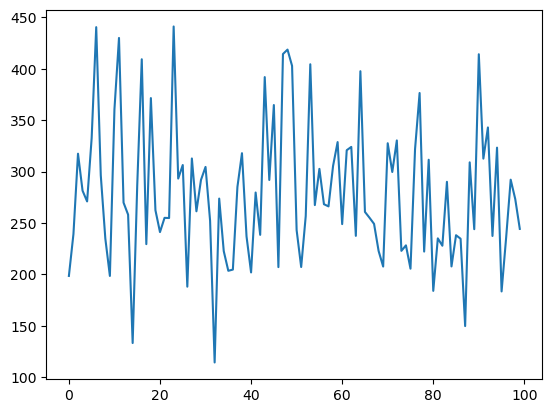

In [48]:
plt.plot(tmp, np.array([l.cpu().detach() for l in loss_list]))

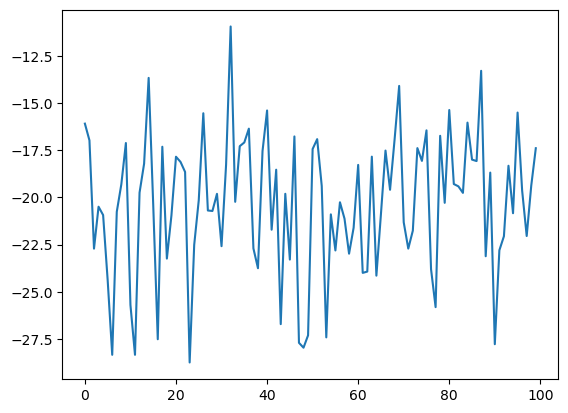

In [49]:
plt.plot(tmp, np.array([l.cpu().detach() for l in reward_list]))

In [50]:
o = []
for i in range(N):
    o.append(observations[200*(i+1)-200:200*(i+1)])

In [51]:
o_old = o.copy()
o = [j for i, j in enumerate(o) if i%10==0]

In [52]:
o = o_old[-10:]

In [53]:
x_ = [i+1 for i in range(200)]

In [54]:
np.array(o).shape

(10, 200, 3)

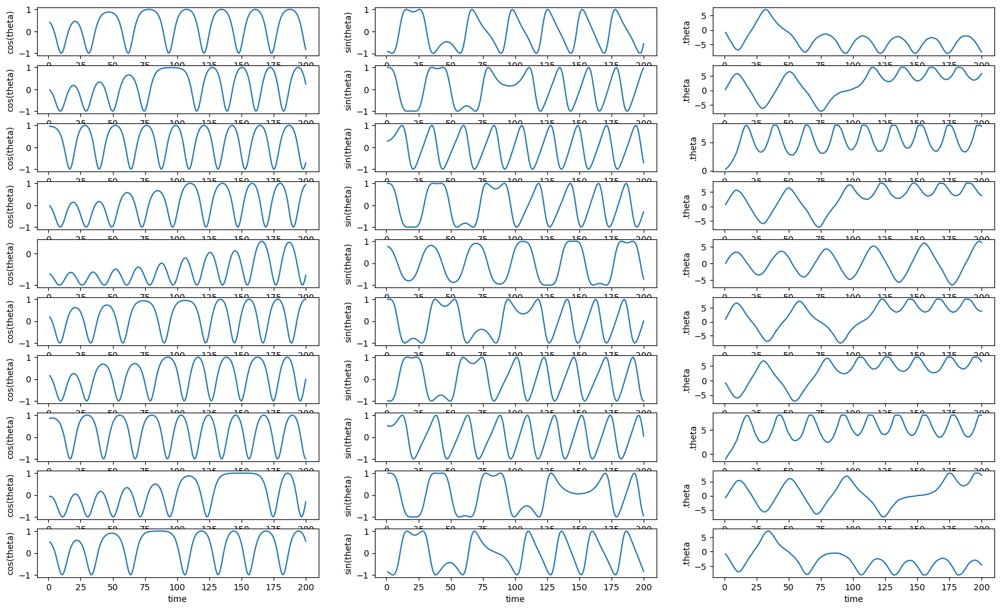

In [55]:
N = 10
plt.figure(1, figsize=(20, 12))
for i in range(N):
    obs = o[i]
    # print(obs)
    theta_ = []
    x_list = []
    y_list = []
    for x,y,v in obs:
        # print(x, y)
        theta_.append(v)
        x_list.append(x)
        y_list.append(y)
    plt.subplot(N, 3, 3*i+1)
    plt.plot(x_, x_list)
    plt.xlabel('time')
    plt.ylabel('cos(theta)')
    plt.subplot(N, 3, 3*i+2)
    plt.plot(x_, y_list)
    plt.xlabel('time')
    plt.ylabel('sin(theta)')
    plt.subplot(N, 3, 3*i+3)
    plt.plot(x_, theta_)
    plt.xlabel('time')
    plt.ylabel('.theta')

In [56]:
len(total_losses)

24000

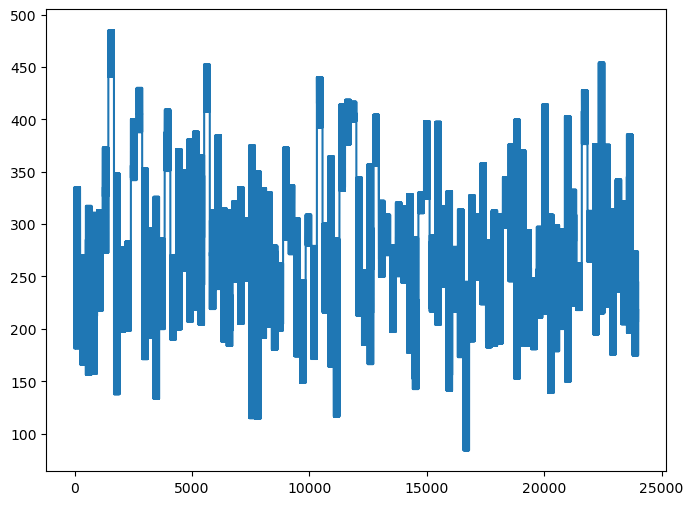

In [57]:
x = np.arange(len(total_losses))
y = [float(x) for x in total_losses]
plt.figure(figsize=(8, 6))
plt.plot(x, y)